
Image dataset Folder : https://drive.google.com/file/d/1-mPKMpphaKqtT26ZzbR5hCHGedkNyAf1/view?usp=sharing (Links to an external site.)

 

### DL Assignment Image Captioning


### **Mount Google drive**

In [1]:
# from google.colab import drive
# drive.flush_and_unmount()

In [2]:
from google.colab import drive 
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive



#importing the libraries

In [3]:

#importing the libraries
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow
from tqdm import tqdm
from keras.applications import vgg16
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input
from tensorflow.keras.applications.resnet50 import ResNet50
from keras.models import Model
from keras.preprocessing.text import one_hot
from keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from nltk.translate.bleu_score import sentence_bleu
from numpy import array
import pickle
import numpy as np
import os
import cv2


In [4]:
os.chdir('drive/MyDrive/Colab Notebooks/DL_Assign_2/')

In [5]:
os.getcwd()

'/content/drive/MyDrive/Colab Notebooks/DL_Assign_2'

In [6]:
os.listdir()

['set_0.pkl',
 'Image_captioning_Dataset.zip',
 'Flickr8k.csv',
 'DL_Assignment_Image_Captioning v1.ipynb',
 'Flicker8k_Dataset',
 'LTSM_epoch1.h5',
 'google_images (1)',
 'google_images',
 'train_encoded_images.p',
 'test_encoded_images.p',
 'LTSM_epoch3.h5',
 'input.txt']

### Unzip

In [7]:
# !unzip Image_captioning_Dataset.zip -d Flicker8k_Dataset

### Getting caption data in proper format

In [8]:
import pickle


with open('set_0.pkl', 'rb') as f:
    text = pickle.load(f)

datatxt = []
for line in text:
    col = line.split('\t')
    if len(col) == 1:
        continue
    # w = col[0].split("#")
    w = [col[0]]
    datatxt.append(w + [col[1].lower()])

image_tokens = pd.DataFrame(datatxt,columns=["img_id","img_caption"])
image_tokens

,img_id,img_caption
0,318667317_108c402140.jpg#4,a man in a black hoodie be hold a paper sign .
1,2072574835_febf0c5fb9.jpg#4,three race dog be run out of the start gate on...
2,3083016677_5782bc337c.jpg#4,two motorcycle with two rider each .
3,95734038_2ab5783da7.jpg#0,a man on a bike nest to a river .
4,241346146_f27759296d.jpg#1,a football player try tackle another player wh...
...,...,...
24995,2993388841_6746140656.jpg#3,a basketball player in a blue uniform be guard...
24996,3578372039_57473f473c.jpg#1,a young man ride a skateboard and carry large ...
24997,3186073578_6e115f45f5.jpg#0,a man display a photograph .
24998,2653552905_4301449235.jpg#3,two man stand in front of a condominium buildi...


# Train Test split

In [9]:
img_path = 'Flicker8k_Dataset/Flicker8k_Dataset'

In [10]:
#removing the #0,#1,#2,#3,#5 from the image ids
image_tokens["img_id"]=image_tokens["img_id"].map(lambda x: x[:len(x)-2])
image_tokens

,img_id,img_caption
0,318667317_108c402140.jpg,a man in a black hoodie be hold a paper sign .
1,2072574835_febf0c5fb9.jpg,three race dog be run out of the start gate on...
2,3083016677_5782bc337c.jpg,two motorcycle with two rider each .
3,95734038_2ab5783da7.jpg,a man on a bike nest to a river .
4,241346146_f27759296d.jpg,a football player try tackle another player wh...
...,...,...
24995,2993388841_6746140656.jpg,a basketball player in a blue uniform be guard...
24996,3578372039_57473f473c.jpg,a young man ride a skateboard and carry large ...
24997,3186073578_6e115f45f5.jpg,a man display a photograph .
24998,2653552905_4301449235.jpg,two man stand in front of a condominium buildi...


In [11]:
import random
random.seed(10)
len_img = os.listdir(img_path)
train_image_names = pd.DataFrame(random.sample((len_img),int((len(len_img)+1)*0.8)),columns=['img_id'])
len_img = [x for x in len_img if x not in train_image_names['img_id'].values]
test_image_names = pd.DataFrame(random.sample((len_img),int((len(len_img)))),columns=['img_id'])
# len_img = [x for x in len_img if x not in test_image_names['img_id'].values]
# val_image_names = pd.DataFrame(random.sample((len_img),int((len(len_img))*1)),columns=['img_id'])


In [12]:
train_image_names

,img_id
0,2831723637_30d4456665.jpg
1,3068735836_872fba3068.jpg
2,2355819665_39021ff642.jpg
3,2772532341_c4597a94ed.jpg
4,2562377955_8d670ccec6.jpg
...,...
6468,2565657591_6c1cdfc092.jpg
6469,235065283_1f9a3c79db.jpg
6470,3422458549_f3f3878dbf.jpg
6471,3265209567_b3b9c8e0fe.jpg


#checking the number of images in the dataset

In [13]:
l=os.listdir(img_path)
print(len(l))

8091


**Plot at least two samples and their captions (use matplotlib/seaborn/any other library).**

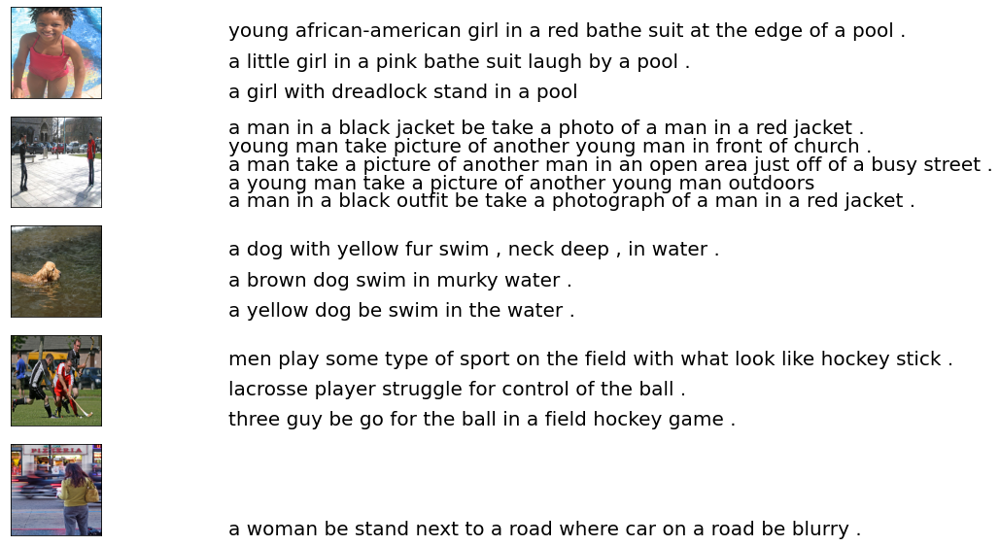

In [14]:
from keras.preprocessing.image import load_img, img_to_array

npic = 5
npix = 224
target_size = (npix,npix,3)
dir_Flickr_jpg = img_path
count = 1
fig = plt.figure(figsize=(10,10))
for jpgfnm in l[:npic]:
    filename = dir_Flickr_jpg + '/' + jpgfnm
    captions = list(image_tokens["img_caption"].loc[image_tokens["img_id"]==jpgfnm].values)
    image_load = load_img(filename, target_size=target_size)
    
    ax = fig.add_subplot(npic,2,count,xticks=[],yticks=[])
    ax.imshow(image_load)
    count += 1
    
    ax = fig.add_subplot(npic,2,count)
    plt.axis('off')
    ax.plot()
    ax.set_xlim(0,1)
    ax.set_ylim(0,len(captions))
    for i, caption in enumerate(captions):
        ax.text(0,i,caption,fontsize=20)
    count += 1
plt.show()

# Add start and end tokens

In [15]:
image_tokens["img_caption"]=image_tokens["img_caption"].map(lambda x: "<start> " + x.strip() + " <end>")

In [16]:
#head of the image_tokens dataframe
image_tokens.head()

,img_id,img_caption
0,318667317_108c402140.jpg,<start> a man in a black hoodie be hold a pape...
1,2072574835_febf0c5fb9.jpg,<start> three race dog be run out of the start...
2,3083016677_5782bc337c.jpg,<start> two motorcycle with two rider each . <...
3,95734038_2ab5783da7.jpg,<start> a man on a bike nest to a river . <end>
4,241346146_f27759296d.jpg,<start> a football player try tackle another p...


#creating train dictionary having key as the image id and value as a list of its captions

In [17]:

train_captions={}
for i in tqdm(range(len(train_image_names))):
  l=[caption for caption in(image_tokens[image_tokens["img_id"]==train_image_names["img_id"].iloc[i]].img_caption)]
  train_captions[train_image_names["img_id"].iloc[i]]=l


100%|██████████| 6473/6473 [00:14<00:00, 457.09it/s]


In [18]:
train_captions['318667317_108c402140.jpg']

['<start> a man in a black hoodie be hold a paper sign . <end>',
 '<start> a homeless man carry a sign that say " hungry " . <end>',
 '<start> a bearded man hold a sign . <end>',
 '<start> a man in a black hoodie hold a small sign . <end>']

In [19]:
#creating test dictionary having key as the image id and value as a list of its captions
test_captions={}
for i in tqdm(range(len(test_image_names))):
  l=[caption for caption in(image_tokens[image_tokens["img_id"]==test_image_names["img_id"].iloc[i]].img_caption)]
  test_captions[test_image_names["img_id"].iloc[i]]=l

100%|██████████| 1618/1618 [00:03<00:00, 461.49it/s]


In [20]:
test_captions['3710520638_866d542a80.jpg']

['<start> a black dog with a red collar be jump through the water . <end>',
 '<start> a black dog with a red collar be jump in the water . <end>',
 '<start> a black dog with a red collar be jump out of the water . <end>',
 '<start> black dog with red collar splash in water <end>',
 '<start> a black dog jump into a lake . <end>']

In [21]:
#creating validation dictionary having key as the image id and value as a list of its captions
# validation_captions={}
# for i in tqdm(range(len(val_image_names))):
#   l=[caption for caption in(image_tokens[image_tokens["img_id"]==val_image_names["img_id"].iloc[i]].img_caption)]
#   validation_captions[val_image_names["img_id"].iloc[i]]=l  

In [22]:
# validation_captions['3176277818_235486a3cd.jpg']

# Use Pretrained Resnet-50 model trained on ImageNet dataset (available publicly on google) for image feature extraction

In [23]:
model_resnet=ResNet50(include_top=False, weights='imagenet',pooling='avg',input_shape=(224,224,3))
model_resnet.summary()

94781440/94765736 [==============================] - 0s 0us/step
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                          

Encoding images and forming dictionaries containing mapping of image_id to image encodings

In [24]:
#extracting image encodings(features) from resnet50 and forming dict train_features
path=img_path
train_features={}
c=0
for image_name in tqdm(train_captions):
  img_path_i=path+'/'+image_name
  img=image.load_img(img_path_i,target_size=(224,224))
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)
  x = preprocess_input(x)
  features = model_resnet.predict(x)
  train_features[image_name]=features.squeeze()

100%|██████████| 6473/6473 [08:58<00:00, 12.03it/s]


In [25]:
with open("train_encoded_images.p", "wb" ) as pickle_f:
    pickle.dump(train_features, pickle_f )

In [26]:
train_features['3246773992_89bf86937b.jpg']

array([0.0900678 , 0.34027693, 0.16462652, ..., 0.22426234, 0.5312157 ,
       0.68634206], dtype=float32)

In [27]:
#extracting image encodings(features) from resnet50 and forming dict test_features
path=img_path
test_features={}
c=0
for image_name in tqdm(test_captions):
  img_path_i=path+'/'+image_name
  img=image.load_img(img_path_i,target_size=(224,224))
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)
  x = preprocess_input(x)
  features = model_resnet.predict(x)
  test_features[image_name]=features.squeeze()

100%|██████████| 1618/1618 [01:48<00:00, 14.98it/s]


In [28]:
with open("test_encoded_images.p", "wb" ) as pickle_f:
    pickle.dump(test_features, pickle_f )

In [29]:
#extracting image encodings(features) from resnet50 and forming dict validation_features
# path=img_path
# validation_features={}
# c=0
# for image_name in tqdm(validation_captions):
#   img_path_i=path+'/'+image_name
#   img=image.load_img(img_path_i,target_size=(224,224))
#   x = image.img_to_array(img)
#   x = np.expand_dims(x, axis=0)
#   x = preprocess_input(x)
#   features = model_resnet.predict(x)
#   validation_features[image_name]=features.squeeze()

In [30]:
# with open("validation_encoded_images.p", "wb" ) as pickle_f:
#     pickle.dump(validation_features, pickle_f )

# Setting hyper parameters for vocabulary size and maximum length

In [31]:
all_captions=[]
for img_id in tqdm(train_captions):
  for captions in train_captions[img_id]:
    all_captions.append(captions)

all_words=" ".join(all_captions)
print()
print('length of all words',len(all_words))
unique_words=list(set(all_words.strip().split(" ")))
print('len of unique_words',len(unique_words))

100%|██████████| 6473/6473 [00:00<00:00, 596867.89it/s]


length of all words 1333984
len of unique_words 5037


In [32]:
#defining max_length and vocabulary size
vocab_size=len(unique_words)+1
max_length=40

In [33]:
#forming dictionaries containg mapping of words to indices and indices to words
words_to_indices={val:index+1 for index, val in enumerate(unique_words)}
indices_to_words = { index+1:val for index, val in enumerate(unique_words)}
words_to_indices["Unk"]=0
indices_to_words[0]="Unk"

# Transforming data into dictonary mapping of image_id to encoded captions

In [34]:
#forming dictionary having encoded captions
train_encoded_captions={}
for img_id in tqdm(train_captions):
  train_encoded_captions[img_id]=[]
  for i in range(len(train_captions[img_id])):
    train_encoded_captions[img_id].append([words_to_indices[s] for s in train_captions[img_id][i].split(" ")])

100%|██████████| 6473/6473 [00:00<00:00, 85852.75it/s]


In [35]:
train_captions['2934022873_3fdd69aee4.jpg']

['<start> two skateboarder wear their helmet ride down a street . <end>',
 '<start> two downhill skateboarder round a curve while others watch . <end>',
 '<start> a group of downhill skateboard go down a hill . <end>',
 '<start> two skateboarder wear helmet be go around a turn . <end>']

In [36]:
train_encoded_captions['2934022873_3fdd69aee4.jpg']

[[1575, 2867, 1434, 1803, 3205, 2837, 2062, 4977, 2478, 573, 4704, 765],
 [1575, 2867, 110, 1434, 3134, 2478, 2750, 895, 720, 486, 4704, 765],
 [1575, 2478, 1337, 586, 110, 2963, 228, 4977, 2478, 3779, 4704, 765],
 [1575, 2867, 1434, 1803, 2837, 64, 228, 3364, 2478, 3053, 4704, 765]]

In [37]:
for img_id in tqdm(train_encoded_captions):
  print(train_encoded_captions[img_id])
  break

  0%|          | 0/6473 [00:00<?, ?it/s]

[[1575, 2478, 1837, 2893, 2161, 2784, 64, 3338, 3364, 2478, 4340, 4704, 765], [1575, 2784, 3338, 3364, 1955, 2893, 2161, 4340, 765], [1575, 32, 2784, 1232, 3364, 2478, 4340, 4704, 765]]


In [38]:
for img_id in tqdm(train_encoded_captions):
  train_encoded_captions[img_id]=pad_sequences(train_encoded_captions[img_id], maxlen=max_length, padding='post')

100%|██████████| 6473/6473 [00:00<00:00, 29370.05it/s]


In [39]:
for img_id in tqdm(train_encoded_captions):
  print(train_encoded_captions[img_id])
  break

  0%|          | 0/6473 [00:00<?, ?it/s]

[[1575 2478 1837 2893 2161 2784   64 3338 3364 2478 4340 4704  765    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0]
 [1575 2784 3338 3364 1955 2893 2161 4340  765    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0]
 [1575   32 2784 1232 3364 2478 4340 4704  765    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0]]


In [40]:
for x in train_encoded_captions['318667317_108c402140.jpg'][2]:
  print(indices_to_words[x])

<start>
a
bearded
man
hold
a
sign
.
<end>
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk
Unk


In [41]:
train_encoded_captions["318667317_108c402140.jpg"][0][0:1].tolist()
# train_encoded_captions

[1575]

Data Generator for Modelling

In [42]:
def data_generator(train_encoded_captions,train_features,num_of_photos):
  X1, X2, Y = list(), list(), list()
  max_length=40
  n=0
  for img_id in tqdm(train_encoded_captions):
    n+=1
    for i in range(len(train_encoded_captions[img_id])):
      for j in range(1,40):
        curr_sequence=train_encoded_captions[img_id][i][0:j].tolist()
        next_word=train_encoded_captions[img_id][i][j]
        curr_sequence=pad_sequences([curr_sequence], maxlen=max_length, padding='post')[0]
        one_hot_next_word=to_categorical([next_word],vocab_size)[0]
        X1.append(train_features[img_id])
        X2.append(curr_sequence)
        Y.append(one_hot_next_word)
    if(n==num_of_photos):
      yield [[array(X1), array(X2)], array(Y)]
      X1, X2, Y = list(), list(), list()
      n=0

In [43]:
#importing dependencies
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers.recurrent import LSTM
from keras.layers.merge import add
from keras.layers.embeddings import Embedding

In [44]:
for i in train_features:
  print(train_features[i].shape)
  break

(2048,)


# Model

In [45]:
#model
input_1=Input(shape=(2048,))
dropout_1=Dropout(0.2)(input_1)
dense_1=Dense(256,activation='relu')(dropout_1)

input_2=Input(shape=(max_length,))
embedding_1=Embedding(vocab_size,256)(input_2)
dropout_2=Dropout(0.2)(embedding_1)
lstm_1=LSTM(256)(dropout_2)

add_1=add([dense_1,lstm_1])
dense_2=Dense(256,activation='relu')(add_1)
dense_3=Dense(vocab_size,activation='softmax')(dense_2)

model=Model(inputs=[input_1,input_2],outputs=dense_3)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 40)]         0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 2048)]       0           []                               
                                                                                                  
 embedding (Embedding)          (None, 40, 256)      1289728     ['input_3[0][0]']                
                                                                                                  
 dropout (Dropout)              (None, 2048)         0           ['input_2[0][0]']                
                                                                                              

# **Adam used to accelerate the gradient descent algorithm by taking into consideration the 'exponentially weighted average**

In [46]:
model.compile(loss='categorical_crossentropy', optimizer='adam',metrics=['accuracy'])

In [47]:
epochs=1
no_of_photos=5
steps=len(train_encoded_captions)//no_of_photos
for i in range(epochs):
  generator=data_generator(train_encoded_captions,train_features,no_of_photos)
  model.fit(generator,epochs=1,steps_per_epoch=steps,verbose=1)

  0%|          | 5/6473 [00:02<55:46,  1.93it/s]

   1/1294 [..............................] - ETA: 1:27:04 - loss: 8.5610 - accuracy: 0.0000e+00

  0%|          | 10/6473 [00:04<42:43,  2.52it/s]

   2/1294 [..............................] - ETA: 5:36 - loss: 7.8291 - accuracy: 0.3682       

  0%|          | 15/6473 [00:04<25:44,  4.18it/s]

   3/1294 [..............................] - ETA: 5:42 - loss: 7.0270 - accuracy: 0.4799

  0%|          | 20/6473 [00:04<17:51,  6.02it/s]

   4/1294 [..............................] - ETA: 5:55 - loss: 6.2370 - accuracy: 0.5255

  0%|          | 25/6473 [00:04<13:42,  7.84it/s]

   5/1294 [..............................] - ETA: 5:58 - loss: 5.6004 - accuracy: 0.5615

  0%|          | 30/6473 [00:05<11:06,  9.66it/s]

   6/1294 [..............................] - ETA: 5:52 - loss: 5.4023 - accuracy: 0.5742

  1%|          | 35/6473 [00:05<09:15, 11.58it/s]

   7/1294 [..............................] - ETA: 5:57 - loss: 5.2361 - accuracy: 0.5897

  1%|          | 40/6473 [00:05<08:21, 12.83it/s]

   8/1294 [..............................] - ETA: 6:03 - loss: 5.1052 - accuracy: 0.6019

  1%|          | 45/6473 [00:06<07:49, 13.70it/s]

   9/1294 [..............................] - ETA: 5:59 - loss: 4.8575 - accuracy: 0.6134

  1%|          | 50/6473 [00:06<07:08, 15.01it/s]

  10/1294 [..............................] - ETA: 5:54 - loss: 4.7231 - accuracy: 0.6197

  1%|          | 55/6473 [00:06<06:32, 16.37it/s]

  11/1294 [..............................] - ETA: 5:50 - loss: 4.5644 - accuracy: 0.6220

  1%|          | 64/6473 [00:06<05:16, 20.28it/s]

  12/1294 [..............................] - ETA: 5:44 - loss: 4.4387 - accuracy: 0.6242

  1%|          | 67/6473 [00:07<05:10, 20.66it/s]

  13/1294 [..............................] - ETA: 5:46 - loss: 4.3284 - accuracy: 0.6264

  1%|          | 70/6473 [00:07<06:17, 16.98it/s]

  14/1294 [..............................] - ETA: 5:43 - loss: 4.2476 - accuracy: 0.6294

  1%|          | 75/6473 [00:07<05:52, 18.15it/s]

  15/1294 [..............................] - ETA: 5:42 - loss: 4.1808 - accuracy: 0.6302

  1%|          | 80/6473 [00:07<05:44, 18.56it/s]

  16/1294 [..............................] - ETA: 5:39 - loss: 4.1176 - accuracy: 0.6319

  1%|▏         | 85/6473 [00:08<05:30, 19.32it/s]

  17/1294 [..............................] - ETA: 5:40 - loss: 4.0586 - accuracy: 0.6344

  1%|▏         | 90/6473 [00:08<05:40, 18.77it/s]

  18/1294 [..............................] - ETA: 5:41 - loss: 3.9810 - accuracy: 0.6341

  1%|▏         | 95/6473 [00:08<05:45, 18.47it/s]

  19/1294 [..............................] - ETA: 5:39 - loss: 3.9046 - accuracy: 0.6370

  2%|▏         | 100/6473 [00:08<05:34, 19.03it/s]

  20/1294 [..............................] - ETA: 5:36 - loss: 3.8564 - accuracy: 0.6386

  2%|▏         | 105/6473 [00:09<05:19, 19.92it/s]

  21/1294 [..............................] - ETA: 5:36 - loss: 3.7946 - accuracy: 0.6401

  2%|▏         | 110/6473 [00:09<05:24, 19.58it/s]

  22/1294 [..............................] - ETA: 5:34 - loss: 3.7619 - accuracy: 0.6402

  2%|▏         | 115/6473 [00:09<05:17, 20.03it/s]

  23/1294 [..............................] - ETA: 5:33 - loss: 3.7203 - accuracy: 0.6420

  2%|▏         | 120/6473 [00:09<05:21, 19.73it/s]

  24/1294 [..............................] - ETA: 5:33 - loss: 3.6808 - accuracy: 0.6429

  2%|▏         | 125/6473 [00:10<05:24, 19.56it/s]

  25/1294 [..............................] - ETA: 5:33 - loss: 3.6283 - accuracy: 0.6434

  2%|▏         | 130/6473 [00:10<05:32, 19.07it/s]

  26/1294 [..............................] - ETA: 5:33 - loss: 3.6014 - accuracy: 0.6432

  2%|▏         | 135/6473 [00:10<05:34, 18.93it/s]

  27/1294 [..............................] - ETA: 5:34 - loss: 3.5576 - accuracy: 0.6448

  2%|▏         | 140/6473 [00:11<05:43, 18.45it/s]

  28/1294 [..............................] - ETA: 5:36 - loss: 3.5214 - accuracy: 0.6454

  2%|▏         | 145/6473 [00:11<05:56, 17.73it/s]

  29/1294 [..............................] - ETA: 5:35 - loss: 3.4820 - accuracy: 0.6471

  2%|▏         | 150/6473 [00:11<05:41, 18.50it/s]

  30/1294 [..............................] - ETA: 5:34 - loss: 3.4516 - accuracy: 0.6480

  2%|▏         | 155/6473 [00:11<05:33, 18.97it/s]

  31/1294 [..............................] - ETA: 5:33 - loss: 3.4273 - accuracy: 0.6476

  2%|▏         | 160/6473 [00:12<05:23, 19.49it/s]

  32/1294 [..............................] - ETA: 5:32 - loss: 3.3905 - accuracy: 0.6500

  3%|▎         | 169/6473 [00:12<04:37, 22.69it/s]

  33/1294 [..............................] - ETA: 5:34 - loss: 3.3719 - accuracy: 0.6505

  3%|▎         | 172/6473 [00:12<05:26, 19.29it/s]

  34/1294 [..............................] - ETA: 5:33 - loss: 3.3232 - accuracy: 0.6531

  3%|▎         | 175/6473 [00:12<06:13, 16.84it/s]

  35/1294 [..............................] - ETA: 5:32 - loss: 3.3036 - accuracy: 0.6530

  3%|▎         | 180/6473 [00:13<05:41, 18.41it/s]

  36/1294 [..............................] - ETA: 5:30 - loss: 3.2843 - accuracy: 0.6533

  3%|▎         | 185/6473 [00:13<05:23, 19.46it/s]

  37/1294 [..............................] - ETA: 5:30 - loss: 3.2632 - accuracy: 0.6541

  3%|▎         | 190/6473 [00:13<05:23, 19.40it/s]

  38/1294 [..............................] - ETA: 5:28 - loss: 3.2449 - accuracy: 0.6549

  3%|▎         | 195/6473 [00:13<05:06, 20.51it/s]

  39/1294 [..............................] - ETA: 5:27 - loss: 3.2363 - accuracy: 0.6542

  3%|▎         | 200/6473 [00:14<05:02, 20.72it/s]

  40/1294 [..............................] - ETA: 5:26 - loss: 3.2209 - accuracy: 0.6540

  3%|▎         | 205/6473 [00:14<05:04, 20.62it/s]

  41/1294 [..............................] - ETA: 5:26 - loss: 3.1999 - accuracy: 0.6550

  3%|▎         | 210/6473 [00:14<05:11, 20.14it/s]

  42/1294 [..............................] - ETA: 5:26 - loss: 3.1664 - accuracy: 0.6569

  3%|▎         | 215/6473 [00:14<05:23, 19.32it/s]

  43/1294 [..............................] - ETA: 5:26 - loss: 3.1488 - accuracy: 0.6579

  3%|▎         | 220/6473 [00:15<05:23, 19.31it/s]

  44/1294 [>.............................] - ETA: 5:25 - loss: 3.1329 - accuracy: 0.6581

  3%|▎         | 225/6473 [00:15<05:14, 19.88it/s]

  45/1294 [>.............................] - ETA: 5:24 - loss: 3.1220 - accuracy: 0.6573

  4%|▎         | 230/6473 [00:15<05:10, 20.08it/s]

  46/1294 [>.............................] - ETA: 5:23 - loss: 3.1084 - accuracy: 0.6572

  4%|▎         | 235/6473 [00:15<04:58, 20.88it/s]

  47/1294 [>.............................] - ETA: 5:23 - loss: 3.0994 - accuracy: 0.6569

  4%|▎         | 240/6473 [00:16<05:17, 19.62it/s]

  48/1294 [>.............................] - ETA: 5:22 - loss: 3.0787 - accuracy: 0.6581

  4%|▍         | 245/6473 [00:16<05:08, 20.18it/s]

  49/1294 [>.............................] - ETA: 5:22 - loss: 3.0633 - accuracy: 0.6588

  4%|▍         | 250/6473 [00:16<05:12, 19.94it/s]

  50/1294 [>.............................] - ETA: 5:21 - loss: 3.0536 - accuracy: 0.6586

  4%|▍         | 255/6473 [00:16<05:03, 20.46it/s]

  51/1294 [>.............................] - ETA: 5:21 - loss: 3.0369 - accuracy: 0.6599

  4%|▍         | 260/6473 [00:17<05:08, 20.15it/s]

  52/1294 [>.............................] - ETA: 5:20 - loss: 3.0189 - accuracy: 0.6611

  4%|▍         | 265/6473 [00:17<04:58, 20.80it/s]

  53/1294 [>.............................] - ETA: 5:19 - loss: 3.0139 - accuracy: 0.6610

  4%|▍         | 270/6473 [00:17<04:52, 21.24it/s]

  54/1294 [>.............................] - ETA: 5:18 - loss: 3.0073 - accuracy: 0.6614

  4%|▍         | 275/6473 [00:17<04:54, 21.04it/s]

  55/1294 [>.............................] - ETA: 5:17 - loss: 2.9962 - accuracy: 0.6624

  4%|▍         | 280/6473 [00:17<04:53, 21.08it/s]

  56/1294 [>.............................] - ETA: 5:17 - loss: 2.9895 - accuracy: 0.6624

  4%|▍         | 285/6473 [00:18<05:09, 20.00it/s]

  57/1294 [>.............................] - ETA: 5:17 - loss: 2.9776 - accuracy: 0.6629

  4%|▍         | 290/6473 [00:18<05:03, 20.36it/s]

  58/1294 [>.............................] - ETA: 5:16 - loss: 2.9686 - accuracy: 0.6632

  5%|▍         | 295/6473 [00:18<05:02, 20.41it/s]

  59/1294 [>.............................] - ETA: 5:16 - loss: 2.9577 - accuracy: 0.6637

  5%|▍         | 300/6473 [00:18<05:01, 20.48it/s]

  60/1294 [>.............................] - ETA: 5:15 - loss: 2.9505 - accuracy: 0.6637

  5%|▍         | 305/6473 [00:19<05:00, 20.51it/s]

  61/1294 [>.............................] - ETA: 5:14 - loss: 2.9383 - accuracy: 0.6641

  5%|▍         | 310/6473 [00:19<04:57, 20.68it/s]

  62/1294 [>.............................] - ETA: 5:14 - loss: 2.9338 - accuracy: 0.6637

  5%|▍         | 315/6473 [00:19<04:54, 20.95it/s]

  63/1294 [>.............................] - ETA: 5:14 - loss: 2.9328 - accuracy: 0.6631

  5%|▍         | 320/6473 [00:19<05:13, 19.64it/s]

  64/1294 [>.............................] - ETA: 5:14 - loss: 2.9320 - accuracy: 0.6614

  5%|▌         | 325/6473 [00:20<05:18, 19.31it/s]

  65/1294 [>.............................] - ETA: 5:14 - loss: 2.9289 - accuracy: 0.6611

  5%|▌         | 330/6473 [00:20<05:12, 19.63it/s]

  66/1294 [>.............................] - ETA: 5:14 - loss: 2.9210 - accuracy: 0.6614

  5%|▌         | 335/6473 [00:20<05:14, 19.55it/s]

  67/1294 [>.............................] - ETA: 5:13 - loss: 2.9131 - accuracy: 0.6617

  5%|▌         | 340/6473 [00:20<05:01, 20.31it/s]

  68/1294 [>.............................] - ETA: 5:12 - loss: 2.9087 - accuracy: 0.6614

  5%|▌         | 345/6473 [00:21<05:03, 20.18it/s]

  69/1294 [>.............................] - ETA: 5:12 - loss: 2.9054 - accuracy: 0.6612

  5%|▌         | 350/6473 [00:21<04:54, 20.76it/s]

  70/1294 [>.............................] - ETA: 5:11 - loss: 2.9009 - accuracy: 0.6613

  5%|▌         | 355/6473 [00:21<04:50, 21.06it/s]

  71/1294 [>.............................] - ETA: 5:10 - loss: 2.8890 - accuracy: 0.6620

  6%|▌         | 360/6473 [00:21<04:51, 20.97it/s]

  72/1294 [>.............................] - ETA: 5:10 - loss: 2.8841 - accuracy: 0.6619

  6%|▌         | 365/6473 [00:22<04:52, 20.88it/s]

  73/1294 [>.............................] - ETA: 5:10 - loss: 2.8759 - accuracy: 0.6618

  6%|▌         | 370/6473 [00:22<04:58, 20.47it/s]

  74/1294 [>.............................] - ETA: 5:10 - loss: 2.8704 - accuracy: 0.6621

  6%|▌         | 375/6473 [00:22<05:06, 19.92it/s]

  75/1294 [>.............................] - ETA: 5:10 - loss: 2.8649 - accuracy: 0.6622

  6%|▌         | 380/6473 [00:22<05:21, 18.96it/s]

  76/1294 [>.............................] - ETA: 5:10 - loss: 2.8567 - accuracy: 0.6627

  6%|▌         | 385/6473 [00:23<05:15, 19.32it/s]

  77/1294 [>.............................] - ETA: 5:10 - loss: 2.8472 - accuracy: 0.6631

  6%|▌         | 390/6473 [00:23<05:19, 19.05it/s]

  78/1294 [>.............................] - ETA: 5:10 - loss: 2.8416 - accuracy: 0.6632

  6%|▌         | 395/6473 [00:23<05:28, 18.48it/s]

  79/1294 [>.............................] - ETA: 5:10 - loss: 2.8358 - accuracy: 0.6633

  6%|▌         | 400/6473 [00:24<05:22, 18.81it/s]

  80/1294 [>.............................] - ETA: 5:10 - loss: 2.8320 - accuracy: 0.6629

  6%|▋         | 405/6473 [00:24<05:26, 18.57it/s]

  81/1294 [>.............................] - ETA: 5:10 - loss: 2.8268 - accuracy: 0.6633

  6%|▋         | 410/6473 [00:24<05:22, 18.78it/s]

  82/1294 [>.............................] - ETA: 5:09 - loss: 2.8241 - accuracy: 0.6629

  6%|▋         | 415/6473 [00:24<05:17, 19.07it/s]

  83/1294 [>.............................] - ETA: 5:09 - loss: 2.8187 - accuracy: 0.6631

  6%|▋         | 420/6473 [00:25<05:11, 19.45it/s]

  84/1294 [>.............................] - ETA: 5:09 - loss: 2.8104 - accuracy: 0.6639

  7%|▋         | 425/6473 [00:25<05:29, 18.35it/s]

  85/1294 [>.............................] - ETA: 5:09 - loss: 2.8047 - accuracy: 0.6643

  7%|▋         | 430/6473 [00:25<05:23, 18.68it/s]

  86/1294 [>.............................] - ETA: 5:09 - loss: 2.8020 - accuracy: 0.6642

  7%|▋         | 435/6473 [00:25<05:27, 18.42it/s]

  87/1294 [=>............................] - ETA: 5:09 - loss: 2.7992 - accuracy: 0.6641

  7%|▋         | 440/6473 [00:26<05:18, 18.95it/s]

  88/1294 [=>............................] - ETA: 5:09 - loss: 2.7943 - accuracy: 0.6645

  7%|▋         | 445/6473 [00:26<05:17, 18.99it/s]

  89/1294 [=>............................] - ETA: 5:08 - loss: 2.7932 - accuracy: 0.6643

  7%|▋         | 450/6473 [00:26<05:14, 19.14it/s]

  90/1294 [=>............................] - ETA: 5:08 - loss: 2.7864 - accuracy: 0.6646

  7%|▋         | 455/6473 [00:26<05:13, 19.19it/s]

  91/1294 [=>............................] - ETA: 5:08 - loss: 2.7835 - accuracy: 0.6644

  7%|▋         | 460/6473 [00:27<05:16, 18.97it/s]

  92/1294 [=>............................] - ETA: 5:08 - loss: 2.7772 - accuracy: 0.6647

  7%|▋         | 465/6473 [00:27<05:08, 19.50it/s]

  93/1294 [=>............................] - ETA: 5:08 - loss: 2.7726 - accuracy: 0.6648

  7%|▋         | 470/6473 [00:27<05:15, 19.01it/s]

  94/1294 [=>............................] - ETA: 5:07 - loss: 2.7668 - accuracy: 0.6652

  7%|▋         | 475/6473 [00:28<05:13, 19.13it/s]

  95/1294 [=>............................] - ETA: 5:07 - loss: 2.7625 - accuracy: 0.6652

  7%|▋         | 480/6473 [00:28<05:01, 19.90it/s]

  96/1294 [=>............................] - ETA: 5:07 - loss: 2.7594 - accuracy: 0.6650

  7%|▋         | 485/6473 [00:28<05:05, 19.60it/s]

  97/1294 [=>............................] - ETA: 5:06 - loss: 2.7554 - accuracy: 0.6651

  8%|▊         | 490/6473 [00:28<04:54, 20.34it/s]

  98/1294 [=>............................] - ETA: 5:05 - loss: 2.7530 - accuracy: 0.6651

  8%|▊         | 495/6473 [00:28<04:48, 20.75it/s]

  99/1294 [=>............................] - ETA: 5:05 - loss: 2.7482 - accuracy: 0.6655

  8%|▊         | 500/6473 [00:29<04:54, 20.28it/s]

 100/1294 [=>............................] - ETA: 5:05 - loss: 2.7475 - accuracy: 0.6650

  8%|▊         | 505/6473 [00:29<05:03, 19.64it/s]

 101/1294 [=>............................] - ETA: 5:05 - loss: 2.7405 - accuracy: 0.6655

  8%|▊         | 510/6473 [00:29<05:06, 19.46it/s]

 102/1294 [=>............................] - ETA: 5:04 - loss: 2.7369 - accuracy: 0.6656

  8%|▊         | 515/6473 [00:29<04:57, 20.02it/s]

 103/1294 [=>............................] - ETA: 5:04 - loss: 2.7338 - accuracy: 0.6658

  8%|▊         | 520/6473 [00:30<04:57, 20.02it/s]

 104/1294 [=>............................] - ETA: 5:04 - loss: 2.7282 - accuracy: 0.6661

  8%|▊         | 525/6473 [00:30<05:09, 19.20it/s]

 105/1294 [=>............................] - ETA: 5:04 - loss: 2.7241 - accuracy: 0.6660

  8%|▊         | 530/6473 [00:30<05:24, 18.33it/s]

 106/1294 [=>............................] - ETA: 5:04 - loss: 2.7188 - accuracy: 0.6663

  8%|▊         | 535/6473 [00:31<05:13, 18.96it/s]

 107/1294 [=>............................] - ETA: 5:04 - loss: 2.7147 - accuracy: 0.6664

  8%|▊         | 540/6473 [00:31<05:23, 18.37it/s]

 108/1294 [=>............................] - ETA: 5:04 - loss: 2.7094 - accuracy: 0.6667

  8%|▊         | 545/6473 [00:31<05:18, 18.61it/s]

 109/1294 [=>............................] - ETA: 5:04 - loss: 2.7040 - accuracy: 0.6671

  8%|▊         | 550/6473 [00:31<05:09, 19.15it/s]

 110/1294 [=>............................] - ETA: 5:03 - loss: 2.6997 - accuracy: 0.6672

  9%|▊         | 555/6473 [00:32<05:09, 19.13it/s]

 111/1294 [=>............................] - ETA: 5:03 - loss: 2.6974 - accuracy: 0.6670

  9%|▊         | 560/6473 [00:32<05:06, 19.26it/s]

 112/1294 [=>............................] - ETA: 5:03 - loss: 2.6928 - accuracy: 0.6672

  9%|▊         | 565/6473 [00:32<05:04, 19.41it/s]

 113/1294 [=>............................] - ETA: 5:02 - loss: 2.6904 - accuracy: 0.6670

  9%|▉         | 570/6473 [00:32<04:52, 20.15it/s]

 114/1294 [=>............................] - ETA: 5:02 - loss: 2.6877 - accuracy: 0.6669

  9%|▉         | 575/6473 [00:33<04:56, 19.89it/s]

 115/1294 [=>............................] - ETA: 5:02 - loss: 2.6830 - accuracy: 0.6668

  9%|▉         | 580/6473 [00:33<05:00, 19.63it/s]

 116/1294 [=>............................] - ETA: 5:02 - loss: 2.6792 - accuracy: 0.6669

  9%|▉         | 585/6473 [00:33<05:01, 19.51it/s]

 117/1294 [=>............................] - ETA: 5:01 - loss: 2.6726 - accuracy: 0.6669

  9%|▉         | 590/6473 [00:33<04:59, 19.63it/s]

 118/1294 [=>............................] - ETA: 5:01 - loss: 2.6689 - accuracy: 0.6668

  9%|▉         | 595/6473 [00:34<04:57, 19.79it/s]

 119/1294 [=>............................] - ETA: 5:01 - loss: 2.6634 - accuracy: 0.6669

  9%|▉         | 600/6473 [00:34<04:55, 19.84it/s]

 120/1294 [=>............................] - ETA: 5:00 - loss: 2.6577 - accuracy: 0.6670

  9%|▉         | 605/6473 [00:34<05:00, 19.54it/s]

 121/1294 [=>............................] - ETA: 5:00 - loss: 2.6540 - accuracy: 0.6668

  9%|▉         | 610/6473 [00:34<04:56, 19.79it/s]

 122/1294 [=>............................] - ETA: 5:00 - loss: 2.6499 - accuracy: 0.6668

 10%|▉         | 615/6473 [00:35<04:46, 20.45it/s]

 123/1294 [=>............................] - ETA: 4:59 - loss: 2.6469 - accuracy: 0.6666

 10%|▉         | 620/6473 [00:35<04:45, 20.52it/s]

 124/1294 [=>............................] - ETA: 4:59 - loss: 2.6393 - accuracy: 0.6669

 10%|▉         | 625/6473 [00:35<04:47, 20.33it/s]

 125/1294 [=>............................] - ETA: 4:59 - loss: 2.6354 - accuracy: 0.6670

 10%|▉         | 630/6473 [00:35<04:52, 19.96it/s]

 126/1294 [=>............................] - ETA: 4:59 - loss: 2.6293 - accuracy: 0.6671

 10%|▉         | 635/6473 [00:36<05:01, 19.33it/s]

 127/1294 [=>............................] - ETA: 4:58 - loss: 2.6229 - accuracy: 0.6673

 10%|▉         | 640/6473 [00:36<04:52, 19.95it/s]

 128/1294 [=>............................] - ETA: 4:58 - loss: 2.6196 - accuracy: 0.6673

 10%|▉         | 645/6473 [00:36<04:52, 19.89it/s]

 129/1294 [=>............................] - ETA: 4:57 - loss: 2.6117 - accuracy: 0.6676

 10%|█         | 650/6473 [00:36<04:52, 19.88it/s]

 130/1294 [==>...........................] - ETA: 4:57 - loss: 2.6048 - accuracy: 0.6677

 10%|█         | 655/6473 [00:37<04:56, 19.65it/s]

 131/1294 [==>...........................] - ETA: 4:57 - loss: 2.5996 - accuracy: 0.6679

 10%|█         | 660/6473 [00:37<04:54, 19.77it/s]

 132/1294 [==>...........................] - ETA: 4:57 - loss: 2.5946 - accuracy: 0.6682

 10%|█         | 665/6473 [00:37<04:45, 20.34it/s]

 133/1294 [==>...........................] - ETA: 4:56 - loss: 2.5917 - accuracy: 0.6683

 10%|█         | 670/6473 [00:37<04:33, 21.24it/s]

 134/1294 [==>...........................] - ETA: 4:56 - loss: 2.5886 - accuracy: 0.6683

 10%|█         | 675/6473 [00:38<04:39, 20.77it/s]

 135/1294 [==>...........................] - ETA: 4:55 - loss: 2.5840 - accuracy: 0.6685

 11%|█         | 680/6473 [00:38<04:36, 20.92it/s]

 136/1294 [==>...........................] - ETA: 4:55 - loss: 2.5772 - accuracy: 0.6688

 11%|█         | 685/6473 [00:38<04:36, 20.91it/s]

 137/1294 [==>...........................] - ETA: 4:55 - loss: 2.5707 - accuracy: 0.6692

 11%|█         | 690/6473 [00:38<05:01, 19.16it/s]

 138/1294 [==>...........................] - ETA: 4:54 - loss: 2.5658 - accuracy: 0.6691

 11%|█         | 695/6473 [00:39<04:48, 20.06it/s]

 139/1294 [==>...........................] - ETA: 4:54 - loss: 2.5611 - accuracy: 0.6694

 11%|█         | 700/6473 [00:39<04:54, 19.62it/s]

 140/1294 [==>...........................] - ETA: 4:54 - loss: 2.5551 - accuracy: 0.6698

 11%|█         | 705/6473 [00:39<05:11, 18.51it/s]

 141/1294 [==>...........................] - ETA: 4:54 - loss: 2.5500 - accuracy: 0.6702

 11%|█         | 710/6473 [00:39<05:12, 18.43it/s]

 142/1294 [==>...........................] - ETA: 4:54 - loss: 2.5427 - accuracy: 0.6706

 11%|█         | 715/6473 [00:40<04:59, 19.22it/s]

 143/1294 [==>...........................] - ETA: 4:54 - loss: 2.5393 - accuracy: 0.6705

 11%|█         | 720/6473 [00:40<04:58, 19.25it/s]

 144/1294 [==>...........................] - ETA: 4:53 - loss: 2.5334 - accuracy: 0.6708

 11%|█         | 725/6473 [00:40<04:55, 19.46it/s]

 145/1294 [==>...........................] - ETA: 4:53 - loss: 2.5281 - accuracy: 0.6710

 11%|█▏        | 730/6473 [00:40<05:01, 19.05it/s]

 146/1294 [==>...........................] - ETA: 4:54 - loss: 2.5229 - accuracy: 0.6711

 11%|█▏        | 735/6473 [00:41<05:24, 17.68it/s]

 147/1294 [==>...........................] - ETA: 4:53 - loss: 2.5166 - accuracy: 0.6714

 11%|█▏        | 740/6473 [00:41<05:03, 18.90it/s]

 148/1294 [==>...........................] - ETA: 4:53 - loss: 2.5123 - accuracy: 0.6715

 12%|█▏        | 745/6473 [00:41<05:02, 18.91it/s]

 149/1294 [==>...........................] - ETA: 4:53 - loss: 2.5065 - accuracy: 0.6717

 12%|█▏        | 750/6473 [00:42<05:01, 18.96it/s]

 150/1294 [==>...........................] - ETA: 4:52 - loss: 2.5007 - accuracy: 0.6722

 12%|█▏        | 755/6473 [00:42<05:01, 18.99it/s]

 151/1294 [==>...........................] - ETA: 4:52 - loss: 2.4958 - accuracy: 0.6724

 12%|█▏        | 760/6473 [00:42<04:53, 19.48it/s]

 152/1294 [==>...........................] - ETA: 4:52 - loss: 2.4934 - accuracy: 0.6724

 12%|█▏        | 765/6473 [00:42<04:54, 19.36it/s]

 153/1294 [==>...........................] - ETA: 4:52 - loss: 2.4871 - accuracy: 0.6730

 12%|█▏        | 770/6473 [00:43<04:57, 19.19it/s]

 154/1294 [==>...........................] - ETA: 4:51 - loss: 2.4845 - accuracy: 0.6730

 12%|█▏        | 775/6473 [00:43<04:46, 19.91it/s]

 155/1294 [==>...........................] - ETA: 4:51 - loss: 2.4818 - accuracy: 0.6730

 12%|█▏        | 780/6473 [00:43<04:50, 19.63it/s]

 156/1294 [==>...........................] - ETA: 4:51 - loss: 2.4775 - accuracy: 0.6733

 12%|█▏        | 785/6473 [00:43<04:59, 19.01it/s]

 157/1294 [==>...........................] - ETA: 4:51 - loss: 2.4715 - accuracy: 0.6736

 12%|█▏        | 790/6473 [00:44<04:57, 19.07it/s]

 158/1294 [==>...........................] - ETA: 4:51 - loss: 2.4683 - accuracy: 0.6737

 12%|█▏        | 795/6473 [00:44<05:00, 18.92it/s]

 159/1294 [==>...........................] - ETA: 4:50 - loss: 2.4630 - accuracy: 0.6741

 12%|█▏        | 800/6473 [00:44<04:52, 19.41it/s]

 160/1294 [==>...........................] - ETA: 4:50 - loss: 2.4574 - accuracy: 0.6745

 12%|█▏        | 805/6473 [00:44<04:52, 19.39it/s]

 161/1294 [==>...........................] - ETA: 4:50 - loss: 2.4535 - accuracy: 0.6746

 13%|█▎        | 810/6473 [00:45<04:56, 19.12it/s]

 162/1294 [==>...........................] - ETA: 4:50 - loss: 2.4471 - accuracy: 0.6751

 13%|█▎        | 815/6473 [00:45<05:04, 18.56it/s]

 163/1294 [==>...........................] - ETA: 4:50 - loss: 2.4410 - accuracy: 0.6755

 13%|█▎        | 820/6473 [00:45<05:00, 18.81it/s]

 164/1294 [==>...........................] - ETA: 4:49 - loss: 2.4371 - accuracy: 0.6756

 13%|█▎        | 825/6473 [00:45<04:54, 19.15it/s]

 165/1294 [==>...........................] - ETA: 4:49 - loss: 2.4350 - accuracy: 0.6755

 13%|█▎        | 830/6473 [00:46<05:03, 18.56it/s]

 166/1294 [==>...........................] - ETA: 4:49 - loss: 2.4294 - accuracy: 0.6759

 13%|█▎        | 835/6473 [00:46<04:54, 19.18it/s]

 167/1294 [==>...........................] - ETA: 4:49 - loss: 2.4239 - accuracy: 0.6761

 13%|█▎        | 840/6473 [00:46<04:49, 19.45it/s]

 168/1294 [==>...........................] - ETA: 4:48 - loss: 2.4209 - accuracy: 0.6763

 13%|█▎        | 845/6473 [00:46<04:41, 20.01it/s]

 169/1294 [==>...........................] - ETA: 4:48 - loss: 2.4178 - accuracy: 0.6765

 13%|█▎        | 850/6473 [00:47<04:31, 20.74it/s]

 170/1294 [==>...........................] - ETA: 4:47 - loss: 2.4124 - accuracy: 0.6769

 13%|█▎        | 855/6473 [00:47<04:32, 20.62it/s]

 171/1294 [==>...........................] - ETA: 4:47 - loss: 2.4093 - accuracy: 0.6772

 13%|█▎        | 860/6473 [00:47<04:28, 20.90it/s]

 172/1294 [==>...........................] - ETA: 4:47 - loss: 2.4053 - accuracy: 0.6775

 13%|█▎        | 865/6473 [00:47<04:53, 19.11it/s]

 173/1294 [===>..........................] - ETA: 4:47 - loss: 2.3993 - accuracy: 0.6779

 13%|█▎        | 870/6473 [00:48<04:47, 19.46it/s]

 174/1294 [===>..........................] - ETA: 4:47 - loss: 2.3934 - accuracy: 0.6782

 14%|█▎        | 875/6473 [00:48<04:53, 19.07it/s]

 175/1294 [===>..........................] - ETA: 4:46 - loss: 2.3907 - accuracy: 0.6784

 14%|█▎        | 880/6473 [00:48<04:33, 20.43it/s]

 176/1294 [===>..........................] - ETA: 4:46 - loss: 2.3872 - accuracy: 0.6786

 14%|█▎        | 885/6473 [00:48<04:44, 19.63it/s]

 177/1294 [===>..........................] - ETA: 4:46 - loss: 2.3836 - accuracy: 0.6787

 14%|█▎        | 890/6473 [00:49<04:57, 18.80it/s]

 178/1294 [===>..........................] - ETA: 4:46 - loss: 2.3789 - accuracy: 0.6790

 14%|█▍        | 895/6473 [00:49<04:52, 19.09it/s]

 179/1294 [===>..........................] - ETA: 4:45 - loss: 2.3751 - accuracy: 0.6793

 14%|█▍        | 900/6473 [00:49<04:49, 19.23it/s]

 180/1294 [===>..........................] - ETA: 4:45 - loss: 2.3728 - accuracy: 0.6794

 14%|█▍        | 905/6473 [00:50<04:41, 19.80it/s]

 181/1294 [===>..........................] - ETA: 4:44 - loss: 2.3692 - accuracy: 0.6795

 14%|█▍        | 910/6473 [00:50<04:32, 20.44it/s]

 182/1294 [===>..........................] - ETA: 4:44 - loss: 2.3649 - accuracy: 0.6800

 14%|█▍        | 915/6473 [00:50<04:30, 20.52it/s]

 183/1294 [===>..........................] - ETA: 4:44 - loss: 2.3630 - accuracy: 0.6800

 14%|█▍        | 920/6473 [00:50<04:34, 20.25it/s]

 184/1294 [===>..........................] - ETA: 4:44 - loss: 2.3592 - accuracy: 0.6802

 14%|█▍        | 925/6473 [00:50<04:38, 19.92it/s]

 185/1294 [===>..........................] - ETA: 4:43 - loss: 2.3553 - accuracy: 0.6806

 14%|█▍        | 930/6473 [00:51<04:31, 20.38it/s]

 186/1294 [===>..........................] - ETA: 4:43 - loss: 2.3517 - accuracy: 0.6808

 14%|█▍        | 935/6473 [00:51<04:28, 20.63it/s]

 187/1294 [===>..........................] - ETA: 4:43 - loss: 2.3492 - accuracy: 0.6810

 15%|█▍        | 940/6473 [00:51<04:33, 20.20it/s]

 188/1294 [===>..........................] - ETA: 4:43 - loss: 2.3458 - accuracy: 0.6811

 15%|█▍        | 945/6473 [00:52<04:57, 18.57it/s]

 189/1294 [===>..........................] - ETA: 4:42 - loss: 2.3396 - accuracy: 0.6816

 15%|█▍        | 950/6473 [00:52<04:50, 19.03it/s]

 190/1294 [===>..........................] - ETA: 4:42 - loss: 2.3355 - accuracy: 0.6819

 15%|█▍        | 955/6473 [00:52<04:45, 19.34it/s]

 191/1294 [===>..........................] - ETA: 4:42 - loss: 2.3320 - accuracy: 0.6822

 15%|█▍        | 960/6473 [00:52<04:35, 20.01it/s]

 192/1294 [===>..........................] - ETA: 4:42 - loss: 2.3288 - accuracy: 0.6824

 15%|█▍        | 965/6473 [00:53<04:58, 18.48it/s]

 193/1294 [===>..........................] - ETA: 4:41 - loss: 2.3235 - accuracy: 0.6829

 15%|█▍        | 970/6473 [00:53<04:46, 19.22it/s]

 194/1294 [===>..........................] - ETA: 4:41 - loss: 2.3207 - accuracy: 0.6832

 15%|█▌        | 975/6473 [00:53<04:44, 19.33it/s]

 195/1294 [===>..........................] - ETA: 4:41 - loss: 2.3184 - accuracy: 0.6833

 15%|█▌        | 980/6473 [00:53<04:42, 19.45it/s]

 196/1294 [===>..........................] - ETA: 4:41 - loss: 2.3141 - accuracy: 0.6837

 15%|█▌        | 985/6473 [00:54<04:40, 19.59it/s]

 197/1294 [===>..........................] - ETA: 4:40 - loss: 2.3113 - accuracy: 0.6839

 15%|█▌        | 990/6473 [00:54<04:29, 20.34it/s]

 198/1294 [===>..........................] - ETA: 4:40 - loss: 2.3088 - accuracy: 0.6841

 15%|█▌        | 995/6473 [00:54<04:29, 20.30it/s]

 199/1294 [===>..........................] - ETA: 4:40 - loss: 2.3058 - accuracy: 0.6844

 15%|█▌        | 1000/6473 [00:54<04:36, 19.82it/s]

 200/1294 [===>..........................] - ETA: 4:40 - loss: 2.3026 - accuracy: 0.6845

 16%|█▌        | 1005/6473 [00:55<04:45, 19.16it/s]

 201/1294 [===>..........................] - ETA: 4:40 - loss: 2.2992 - accuracy: 0.6849

 16%|█▌        | 1010/6473 [00:55<04:53, 18.63it/s]

 202/1294 [===>..........................] - ETA: 4:39 - loss: 2.2939 - accuracy: 0.6854

 16%|█▌        | 1015/6473 [00:55<04:51, 18.74it/s]

 203/1294 [===>..........................] - ETA: 4:39 - loss: 2.2884 - accuracy: 0.6859

 16%|█▌        | 1020/6473 [00:55<04:55, 18.48it/s]

 204/1294 [===>..........................] - ETA: 4:39 - loss: 2.2842 - accuracy: 0.6862

 16%|█▌        | 1025/6473 [00:56<04:50, 18.74it/s]

 205/1294 [===>..........................] - ETA: 4:39 - loss: 2.2810 - accuracy: 0.6864

 16%|█▌        | 1030/6473 [00:56<04:43, 19.17it/s]

 206/1294 [===>..........................] - ETA: 4:38 - loss: 2.2786 - accuracy: 0.6865

 16%|█▌        | 1035/6473 [00:56<04:40, 19.35it/s]

 207/1294 [===>..........................] - ETA: 4:38 - loss: 2.2752 - accuracy: 0.6868

 16%|█▌        | 1040/6473 [00:56<04:38, 19.50it/s]

 208/1294 [===>..........................] - ETA: 4:38 - loss: 2.2710 - accuracy: 0.6872

 16%|█▌        | 1045/6473 [00:57<04:42, 19.23it/s]

 209/1294 [===>..........................] - ETA: 4:38 - loss: 2.2680 - accuracy: 0.6875

 16%|█▌        | 1050/6473 [00:57<04:44, 19.04it/s]

 210/1294 [===>..........................] - ETA: 4:37 - loss: 2.2634 - accuracy: 0.6878

 16%|█▋        | 1055/6473 [00:57<04:40, 19.30it/s]

 211/1294 [===>..........................] - ETA: 4:37 - loss: 2.2590 - accuracy: 0.6883

 16%|█▋        | 1060/6473 [00:58<04:50, 18.63it/s]

 212/1294 [===>..........................] - ETA: 4:37 - loss: 2.2548 - accuracy: 0.6886

 16%|█▋        | 1065/6473 [00:58<04:49, 18.67it/s]

 213/1294 [===>..........................] - ETA: 4:37 - loss: 2.2505 - accuracy: 0.6890

 17%|█▋        | 1070/6473 [00:58<04:41, 19.21it/s]

 214/1294 [===>..........................] - ETA: 4:36 - loss: 2.2468 - accuracy: 0.6893

 17%|█▋        | 1075/6473 [00:58<04:38, 19.36it/s]

 215/1294 [===>..........................] - ETA: 4:36 - loss: 2.2437 - accuracy: 0.6896

 17%|█▋        | 1080/6473 [00:59<04:39, 19.30it/s]

 216/1294 [====>.........................] - ETA: 4:36 - loss: 2.2393 - accuracy: 0.6901

 17%|█▋        | 1085/6473 [00:59<04:36, 19.46it/s]

 217/1294 [====>.........................] - ETA: 4:36 - loss: 2.2345 - accuracy: 0.6905

 17%|█▋        | 1090/6473 [00:59<04:45, 18.84it/s]

 218/1294 [====>.........................] - ETA: 4:36 - loss: 2.2312 - accuracy: 0.6909

 17%|█▋        | 1095/6473 [00:59<04:43, 18.94it/s]

 219/1294 [====>.........................] - ETA: 4:35 - loss: 2.2272 - accuracy: 0.6912

 17%|█▋        | 1100/6473 [01:00<04:36, 19.45it/s]

 220/1294 [====>.........................] - ETA: 4:35 - loss: 2.2240 - accuracy: 0.6913

 17%|█▋        | 1105/6473 [01:00<04:27, 20.03it/s]

 221/1294 [====>.........................] - ETA: 4:35 - loss: 2.2218 - accuracy: 0.6915

 17%|█▋        | 1110/6473 [01:00<04:23, 20.32it/s]

 222/1294 [====>.........................] - ETA: 4:34 - loss: 2.2182 - accuracy: 0.6918

 17%|█▋        | 1115/6473 [01:00<04:27, 20.02it/s]

 223/1294 [====>.........................] - ETA: 4:34 - loss: 2.2145 - accuracy: 0.6921

 17%|█▋        | 1120/6473 [01:01<04:32, 19.67it/s]

 224/1294 [====>.........................] - ETA: 4:34 - loss: 2.2112 - accuracy: 0.6923

 17%|█▋        | 1125/6473 [01:01<04:32, 19.61it/s]

 225/1294 [====>.........................] - ETA: 4:33 - loss: 2.2085 - accuracy: 0.6926

 17%|█▋        | 1130/6473 [01:01<04:24, 20.22it/s]

 226/1294 [====>.........................] - ETA: 4:33 - loss: 2.2053 - accuracy: 0.6929

 18%|█▊        | 1135/6473 [01:01<04:31, 19.69it/s]

 227/1294 [====>.........................] - ETA: 4:33 - loss: 2.2026 - accuracy: 0.6931

 18%|█▊        | 1140/6473 [01:02<04:31, 19.68it/s]

 228/1294 [====>.........................] - ETA: 4:33 - loss: 2.1990 - accuracy: 0.6934

 18%|█▊        | 1145/6473 [01:02<04:35, 19.31it/s]

 229/1294 [====>.........................] - ETA: 4:33 - loss: 2.1974 - accuracy: 0.6935

 18%|█▊        | 1150/6473 [01:02<04:38, 19.14it/s]

 230/1294 [====>.........................] - ETA: 4:32 - loss: 2.1945 - accuracy: 0.6938

 18%|█▊        | 1159/6473 [01:02<03:59, 22.22it/s]

 231/1294 [====>.........................] - ETA: 4:32 - loss: 2.1912 - accuracy: 0.6940

 18%|█▊        | 1162/6473 [01:03<04:26, 19.92it/s]

 232/1294 [====>.........................] - ETA: 4:32 - loss: 2.1868 - accuracy: 0.6946

 18%|█▊        | 1165/6473 [01:03<04:59, 17.73it/s]

 233/1294 [====>.........................] - ETA: 4:32 - loss: 2.1844 - accuracy: 0.6946

 18%|█▊        | 1170/6473 [01:03<04:59, 17.73it/s]

 234/1294 [====>.........................] - ETA: 4:31 - loss: 2.1814 - accuracy: 0.6949

 18%|█▊        | 1175/6473 [01:03<04:45, 18.56it/s]

 235/1294 [====>.........................] - ETA: 4:31 - loss: 2.1795 - accuracy: 0.6950

 18%|█▊        | 1180/6473 [01:04<04:33, 19.33it/s]

 236/1294 [====>.........................] - ETA: 4:31 - loss: 2.1772 - accuracy: 0.6952

 18%|█▊        | 1185/6473 [01:04<04:29, 19.66it/s]

 237/1294 [====>.........................] - ETA: 4:31 - loss: 2.1734 - accuracy: 0.6956

 18%|█▊        | 1190/6473 [01:04<04:28, 19.70it/s]

 238/1294 [====>.........................] - ETA: 4:30 - loss: 2.1708 - accuracy: 0.6958

 18%|█▊        | 1195/6473 [01:04<04:21, 20.17it/s]

 239/1294 [====>.........................] - ETA: 4:30 - loss: 2.1685 - accuracy: 0.6961

 19%|█▊        | 1200/6473 [01:05<04:25, 19.85it/s]

 240/1294 [====>.........................] - ETA: 4:30 - loss: 2.1646 - accuracy: 0.6966

 19%|█▊        | 1205/6473 [01:05<04:28, 19.64it/s]

 241/1294 [====>.........................] - ETA: 4:29 - loss: 2.1621 - accuracy: 0.6967

 19%|█▊        | 1210/6473 [01:05<04:20, 20.24it/s]

 242/1294 [====>.........................] - ETA: 4:29 - loss: 2.1604 - accuracy: 0.6969

 19%|█▉        | 1215/6473 [01:05<04:21, 20.14it/s]

 243/1294 [====>.........................] - ETA: 4:29 - loss: 2.1574 - accuracy: 0.6972

 19%|█▉        | 1220/6473 [01:06<04:27, 19.60it/s]

 244/1294 [====>.........................] - ETA: 4:29 - loss: 2.1553 - accuracy: 0.6974

 19%|█▉        | 1225/6473 [01:06<04:32, 19.23it/s]

 245/1294 [====>.........................] - ETA: 4:28 - loss: 2.1521 - accuracy: 0.6977

 19%|█▉        | 1230/6473 [01:06<04:22, 19.96it/s]

 246/1294 [====>.........................] - ETA: 4:28 - loss: 2.1502 - accuracy: 0.6978

 19%|█▉        | 1235/6473 [01:06<04:28, 19.50it/s]

 247/1294 [====>.........................] - ETA: 4:28 - loss: 2.1475 - accuracy: 0.6981

 19%|█▉        | 1240/6473 [01:07<04:49, 18.09it/s]

 248/1294 [====>.........................] - ETA: 4:28 - loss: 2.1447 - accuracy: 0.6983

 19%|█▉        | 1245/6473 [01:07<04:43, 18.44it/s]

 249/1294 [====>.........................] - ETA: 4:28 - loss: 2.1425 - accuracy: 0.6984

 19%|█▉        | 1250/6473 [01:07<04:42, 18.51it/s]

 250/1294 [====>.........................] - ETA: 4:28 - loss: 2.1404 - accuracy: 0.6986

 19%|█▉        | 1255/6473 [01:08<04:45, 18.25it/s]

 251/1294 [====>.........................] - ETA: 4:27 - loss: 2.1388 - accuracy: 0.6986

 19%|█▉        | 1260/6473 [01:08<04:33, 19.07it/s]

 252/1294 [====>.........................] - ETA: 4:27 - loss: 2.1370 - accuracy: 0.6988

 20%|█▉        | 1265/6473 [01:08<04:30, 19.26it/s]

 253/1294 [====>.........................] - ETA: 4:27 - loss: 2.1347 - accuracy: 0.6989

 20%|█▉        | 1270/6473 [01:08<04:33, 19.03it/s]

 254/1294 [====>.........................] - ETA: 4:26 - loss: 2.1315 - accuracy: 0.6993

 20%|█▉        | 1275/6473 [01:09<04:25, 19.56it/s]

 255/1294 [====>.........................] - ETA: 4:26 - loss: 2.1289 - accuracy: 0.6995

 20%|█▉        | 1280/6473 [01:09<04:15, 20.31it/s]

 256/1294 [====>.........................] - ETA: 4:26 - loss: 2.1269 - accuracy: 0.6997

 20%|█▉        | 1285/6473 [01:09<04:08, 20.86it/s]

 257/1294 [====>.........................] - ETA: 4:25 - loss: 2.1254 - accuracy: 0.6998

 20%|█▉        | 1290/6473 [01:09<04:12, 20.56it/s]

 258/1294 [====>.........................] - ETA: 4:25 - loss: 2.1242 - accuracy: 0.6997

 20%|██        | 1295/6473 [01:10<04:25, 19.53it/s]

 259/1294 [=====>........................] - ETA: 4:25 - loss: 2.1213 - accuracy: 0.7000

 20%|██        | 1300/6473 [01:10<04:24, 19.54it/s]

 260/1294 [=====>........................] - ETA: 4:25 - loss: 2.1194 - accuracy: 0.7001

 20%|██        | 1305/6473 [01:10<04:26, 19.39it/s]

 261/1294 [=====>........................] - ETA: 4:24 - loss: 2.1178 - accuracy: 0.7002

 20%|██        | 1310/6473 [01:10<04:29, 19.14it/s]

 262/1294 [=====>........................] - ETA: 4:24 - loss: 2.1158 - accuracy: 0.7004

 20%|██        | 1315/6473 [01:11<04:37, 18.56it/s]

 263/1294 [=====>........................] - ETA: 4:24 - loss: 2.1141 - accuracy: 0.7006

 20%|██        | 1320/6473 [01:11<04:45, 18.06it/s]

 264/1294 [=====>........................] - ETA: 4:24 - loss: 2.1115 - accuracy: 0.7009

 20%|██        | 1325/6473 [01:11<04:45, 18.05it/s]

 265/1294 [=====>........................] - ETA: 4:24 - loss: 2.1087 - accuracy: 0.7010

 21%|██        | 1330/6473 [01:11<04:35, 18.65it/s]

 266/1294 [=====>........................] - ETA: 4:24 - loss: 2.1062 - accuracy: 0.7012

 21%|██        | 1335/6473 [01:12<04:34, 18.70it/s]

 267/1294 [=====>........................] - ETA: 4:23 - loss: 2.1052 - accuracy: 0.7010

 21%|██        | 1340/6473 [01:12<04:44, 18.07it/s]

 268/1294 [=====>........................] - ETA: 4:23 - loss: 2.1017 - accuracy: 0.7014

 21%|██        | 1345/6473 [01:12<04:31, 18.90it/s]

 269/1294 [=====>........................] - ETA: 4:23 - loss: 2.1013 - accuracy: 0.7015

 21%|██        | 1350/6473 [01:13<04:38, 18.37it/s]

 270/1294 [=====>........................] - ETA: 4:23 - loss: 2.0997 - accuracy: 0.7015

 21%|██        | 1355/6473 [01:13<04:36, 18.51it/s]

 271/1294 [=====>........................] - ETA: 4:22 - loss: 2.0980 - accuracy: 0.7017

 21%|██        | 1360/6473 [01:13<04:26, 19.21it/s]

 272/1294 [=====>........................] - ETA: 4:22 - loss: 2.0960 - accuracy: 0.7019

 21%|██        | 1365/6473 [01:13<04:32, 18.74it/s]

 273/1294 [=====>........................] - ETA: 4:22 - loss: 2.0958 - accuracy: 0.7017

 21%|██        | 1370/6473 [01:14<04:22, 19.46it/s]

 274/1294 [=====>........................] - ETA: 4:22 - loss: 2.0949 - accuracy: 0.7017

 21%|██        | 1375/6473 [01:14<04:18, 19.74it/s]

 275/1294 [=====>........................] - ETA: 4:21 - loss: 2.0918 - accuracy: 0.7019

 21%|██▏       | 1380/6473 [01:14<04:24, 19.28it/s]

 276/1294 [=====>........................] - ETA: 4:21 - loss: 2.0904 - accuracy: 0.7020

 21%|██▏       | 1385/6473 [01:14<04:23, 19.28it/s]

 277/1294 [=====>........................] - ETA: 4:21 - loss: 2.0893 - accuracy: 0.7020

 21%|██▏       | 1390/6473 [01:15<04:18, 19.67it/s]

 278/1294 [=====>........................] - ETA: 4:21 - loss: 2.0886 - accuracy: 0.7020

 22%|██▏       | 1395/6473 [01:15<04:16, 19.83it/s]

 279/1294 [=====>........................] - ETA: 4:20 - loss: 2.0865 - accuracy: 0.7022

 22%|██▏       | 1400/6473 [01:15<04:24, 19.17it/s]

 280/1294 [=====>........................] - ETA: 4:20 - loss: 2.0844 - accuracy: 0.7024

 22%|██▏       | 1405/6473 [01:15<04:20, 19.44it/s]

 281/1294 [=====>........................] - ETA: 4:20 - loss: 2.0824 - accuracy: 0.7025

 22%|██▏       | 1410/6473 [01:16<04:22, 19.30it/s]

 282/1294 [=====>........................] - ETA: 4:20 - loss: 2.0785 - accuracy: 0.7029

 22%|██▏       | 1415/6473 [01:16<04:16, 19.74it/s]

 283/1294 [=====>........................] - ETA: 4:19 - loss: 2.0759 - accuracy: 0.7032

 22%|██▏       | 1420/6473 [01:16<04:19, 19.50it/s]

 284/1294 [=====>........................] - ETA: 4:19 - loss: 2.0739 - accuracy: 0.7033

 22%|██▏       | 1425/6473 [01:16<04:21, 19.29it/s]

 285/1294 [=====>........................] - ETA: 4:19 - loss: 2.0711 - accuracy: 0.7036

 22%|██▏       | 1430/6473 [01:17<04:25, 18.98it/s]

 286/1294 [=====>........................] - ETA: 4:19 - loss: 2.0678 - accuracy: 0.7039

 22%|██▏       | 1435/6473 [01:17<04:30, 18.65it/s]

 287/1294 [=====>........................] - ETA: 4:18 - loss: 2.0663 - accuracy: 0.7041

 22%|██▏       | 1440/6473 [01:17<04:25, 18.95it/s]

 288/1294 [=====>........................] - ETA: 4:18 - loss: 2.0656 - accuracy: 0.7040

 22%|██▏       | 1445/6473 [01:17<04:18, 19.48it/s]

 289/1294 [=====>........................] - ETA: 4:18 - loss: 2.0639 - accuracy: 0.7040

 22%|██▏       | 1450/6473 [01:18<04:11, 19.98it/s]

 290/1294 [=====>........................] - ETA: 4:17 - loss: 2.0615 - accuracy: 0.7043

 22%|██▏       | 1455/6473 [01:18<04:05, 20.47it/s]

 291/1294 [=====>........................] - ETA: 4:17 - loss: 2.0605 - accuracy: 0.7043

 23%|██▎       | 1460/6473 [01:18<04:02, 20.66it/s]

 292/1294 [=====>........................] - ETA: 4:17 - loss: 2.0592 - accuracy: 0.7044

 23%|██▎       | 1465/6473 [01:18<04:12, 19.81it/s]

 293/1294 [=====>........................] - ETA: 4:17 - loss: 2.0573 - accuracy: 0.7046

 23%|██▎       | 1470/6473 [01:19<04:11, 19.87it/s]

 294/1294 [=====>........................] - ETA: 4:16 - loss: 2.0560 - accuracy: 0.7046

 23%|██▎       | 1479/6473 [01:19<03:42, 22.40it/s]

 295/1294 [=====>........................] - ETA: 4:16 - loss: 2.0543 - accuracy: 0.7048

 23%|██▎       | 1482/6473 [01:19<04:10, 19.94it/s]

 296/1294 [=====>........................] - ETA: 4:16 - loss: 2.0513 - accuracy: 0.7050

 23%|██▎       | 1485/6473 [01:19<04:43, 17.59it/s]

 297/1294 [=====>........................] - ETA: 4:16 - loss: 2.0497 - accuracy: 0.7052

 23%|██▎       | 1490/6473 [01:20<04:29, 18.52it/s]

 298/1294 [=====>........................] - ETA: 4:15 - loss: 2.0480 - accuracy: 0.7053

 23%|██▎       | 1495/6473 [01:20<04:25, 18.78it/s]

 299/1294 [=====>........................] - ETA: 4:15 - loss: 2.0460 - accuracy: 0.7055

 23%|██▎       | 1500/6473 [01:20<04:26, 18.63it/s]

 300/1294 [=====>........................] - ETA: 4:15 - loss: 2.0441 - accuracy: 0.7056

 23%|██▎       | 1505/6473 [01:21<04:26, 18.66it/s]

 301/1294 [=====>........................] - ETA: 4:15 - loss: 2.0430 - accuracy: 0.7056

 23%|██▎       | 1510/6473 [01:21<04:29, 18.41it/s]

 302/1294 [======>.......................] - ETA: 4:15 - loss: 2.0408 - accuracy: 0.7058

 23%|██▎       | 1515/6473 [01:21<04:16, 19.31it/s]

 303/1294 [======>.......................] - ETA: 4:14 - loss: 2.0391 - accuracy: 0.7060

 23%|██▎       | 1520/6473 [01:21<04:24, 18.73it/s]

 304/1294 [======>.......................] - ETA: 4:14 - loss: 2.0381 - accuracy: 0.7060

 24%|██▎       | 1525/6473 [01:22<04:13, 19.48it/s]

 305/1294 [======>.......................] - ETA: 4:14 - loss: 2.0365 - accuracy: 0.7061

 24%|██▎       | 1530/6473 [01:22<04:21, 18.89it/s]

 306/1294 [======>.......................] - ETA: 4:14 - loss: 2.0341 - accuracy: 0.7063

 24%|██▎       | 1535/6473 [01:22<04:14, 19.40it/s]

 307/1294 [======>.......................] - ETA: 4:13 - loss: 2.0318 - accuracy: 0.7065

 24%|██▍       | 1540/6473 [01:22<04:25, 18.60it/s]

 308/1294 [======>.......................] - ETA: 4:13 - loss: 2.0302 - accuracy: 0.7066

 24%|██▍       | 1545/6473 [01:23<04:21, 18.84it/s]

 309/1294 [======>.......................] - ETA: 4:13 - loss: 2.0274 - accuracy: 0.7069

 24%|██▍       | 1550/6473 [01:23<04:23, 18.67it/s]

 310/1294 [======>.......................] - ETA: 4:13 - loss: 2.0259 - accuracy: 0.7071

 24%|██▍       | 1555/6473 [01:23<04:09, 19.73it/s]

 311/1294 [======>.......................] - ETA: 4:12 - loss: 2.0244 - accuracy: 0.7071

 24%|██▍       | 1560/6473 [01:23<04:03, 20.14it/s]

 312/1294 [======>.......................] - ETA: 4:12 - loss: 2.0224 - accuracy: 0.7073

 24%|██▍       | 1565/6473 [01:24<04:00, 20.39it/s]

 313/1294 [======>.......................] - ETA: 4:12 - loss: 2.0225 - accuracy: 0.7071

 24%|██▍       | 1570/6473 [01:24<03:57, 20.66it/s]

 314/1294 [======>.......................] - ETA: 4:11 - loss: 2.0212 - accuracy: 0.7072

 24%|██▍       | 1575/6473 [01:24<03:55, 20.81it/s]

 315/1294 [======>.......................] - ETA: 4:11 - loss: 2.0206 - accuracy: 0.7072

 24%|██▍       | 1580/6473 [01:24<03:54, 20.83it/s]

 316/1294 [======>.......................] - ETA: 4:11 - loss: 2.0191 - accuracy: 0.7074

 24%|██▍       | 1585/6473 [01:25<03:55, 20.71it/s]

 317/1294 [======>.......................] - ETA: 4:10 - loss: 2.0171 - accuracy: 0.7076

 25%|██▍       | 1590/6473 [01:25<03:52, 20.96it/s]

 318/1294 [======>.......................] - ETA: 4:10 - loss: 2.0141 - accuracy: 0.7079

 25%|██▍       | 1595/6473 [01:25<03:59, 20.37it/s]

 319/1294 [======>.......................] - ETA: 4:10 - loss: 2.0120 - accuracy: 0.7081

 25%|██▍       | 1600/6473 [01:25<04:11, 19.35it/s]

 320/1294 [======>.......................] - ETA: 4:10 - loss: 2.0104 - accuracy: 0.7082

 25%|██▍       | 1605/6473 [01:26<04:08, 19.60it/s]

 321/1294 [======>.......................] - ETA: 4:09 - loss: 2.0089 - accuracy: 0.7083

 25%|██▍       | 1610/6473 [01:26<03:59, 20.30it/s]

 322/1294 [======>.......................] - ETA: 4:09 - loss: 2.0080 - accuracy: 0.7085

 25%|██▍       | 1615/6473 [01:26<03:52, 20.90it/s]

 323/1294 [======>.......................] - ETA: 4:09 - loss: 2.0065 - accuracy: 0.7086

 25%|██▌       | 1620/6473 [01:26<03:47, 21.36it/s]

 324/1294 [======>.......................] - ETA: 4:08 - loss: 2.0056 - accuracy: 0.7086

 25%|██▌       | 1625/6473 [01:26<03:50, 21.03it/s]

 325/1294 [======>.......................] - ETA: 4:08 - loss: 2.0046 - accuracy: 0.7087

 25%|██▌       | 1630/6473 [01:27<03:54, 20.62it/s]

 326/1294 [======>.......................] - ETA: 4:08 - loss: 2.0032 - accuracy: 0.7087

 25%|██▌       | 1635/6473 [01:27<04:02, 19.98it/s]

 327/1294 [======>.......................] - ETA: 4:08 - loss: 2.0006 - accuracy: 0.7089

 25%|██▌       | 1640/6473 [01:27<04:02, 19.89it/s]

 328/1294 [======>.......................] - ETA: 4:07 - loss: 1.9992 - accuracy: 0.7090

 25%|██▌       | 1645/6473 [01:28<04:06, 19.56it/s]

 329/1294 [======>.......................] - ETA: 4:07 - loss: 1.9980 - accuracy: 0.7091

 25%|██▌       | 1650/6473 [01:28<04:05, 19.68it/s]

 330/1294 [======>.......................] - ETA: 4:07 - loss: 1.9961 - accuracy: 0.7092

 26%|██▌       | 1655/6473 [01:28<03:59, 20.08it/s]

 331/1294 [======>.......................] - ETA: 4:06 - loss: 1.9943 - accuracy: 0.7094

 26%|██▌       | 1660/6473 [01:28<03:58, 20.14it/s]

 332/1294 [======>.......................] - ETA: 4:06 - loss: 1.9936 - accuracy: 0.7093

 26%|██▌       | 1665/6473 [01:29<03:56, 20.37it/s]

 333/1294 [======>.......................] - ETA: 4:06 - loss: 1.9928 - accuracy: 0.7094

 26%|██▌       | 1670/6473 [01:29<04:11, 19.10it/s]

 334/1294 [======>.......................] - ETA: 4:06 - loss: 1.9906 - accuracy: 0.7096

 26%|██▌       | 1675/6473 [01:29<04:02, 19.80it/s]

 335/1294 [======>.......................] - ETA: 4:05 - loss: 1.9892 - accuracy: 0.7097

 26%|██▌       | 1680/6473 [01:29<04:06, 19.45it/s]

 336/1294 [======>.......................] - ETA: 4:05 - loss: 1.9876 - accuracy: 0.7099

 26%|██▌       | 1685/6473 [01:30<04:00, 19.89it/s]

 337/1294 [======>.......................] - ETA: 4:05 - loss: 1.9854 - accuracy: 0.7101

 26%|██▌       | 1690/6473 [01:30<03:50, 20.71it/s]

 338/1294 [======>.......................] - ETA: 4:05 - loss: 1.9833 - accuracy: 0.7103

 26%|██▌       | 1695/6473 [01:30<04:02, 19.66it/s]

 339/1294 [======>.......................] - ETA: 4:04 - loss: 1.9823 - accuracy: 0.7103

 26%|██▋       | 1700/6473 [01:30<04:08, 19.24it/s]

 340/1294 [======>.......................] - ETA: 4:04 - loss: 1.9800 - accuracy: 0.7105

 26%|██▋       | 1705/6473 [01:31<04:05, 19.39it/s]

 341/1294 [======>.......................] - ETA: 4:04 - loss: 1.9782 - accuracy: 0.7106

 26%|██▋       | 1710/6473 [01:31<04:04, 19.47it/s]

 342/1294 [======>.......................] - ETA: 4:04 - loss: 1.9766 - accuracy: 0.7108

 26%|██▋       | 1715/6473 [01:31<04:04, 19.48it/s]

 343/1294 [======>.......................] - ETA: 4:03 - loss: 1.9756 - accuracy: 0.7108

 27%|██▋       | 1720/6473 [01:31<04:02, 19.59it/s]

 344/1294 [======>.......................] - ETA: 4:03 - loss: 1.9751 - accuracy: 0.7107

 27%|██▋       | 1725/6473 [01:32<04:07, 19.20it/s]

 345/1294 [======>.......................] - ETA: 4:03 - loss: 1.9731 - accuracy: 0.7109

 27%|██▋       | 1730/6473 [01:32<04:11, 18.88it/s]

 346/1294 [=======>......................] - ETA: 4:03 - loss: 1.9711 - accuracy: 0.7111

 27%|██▋       | 1735/6473 [01:32<04:00, 19.69it/s]

 347/1294 [=======>......................] - ETA: 4:02 - loss: 1.9700 - accuracy: 0.7112

 27%|██▋       | 1740/6473 [01:32<03:54, 20.17it/s]

 348/1294 [=======>......................] - ETA: 4:02 - loss: 1.9680 - accuracy: 0.7115

 27%|██▋       | 1745/6473 [01:33<03:57, 19.87it/s]

 349/1294 [=======>......................] - ETA: 4:02 - loss: 1.9669 - accuracy: 0.7116

 27%|██▋       | 1750/6473 [01:33<04:03, 19.39it/s]

 350/1294 [=======>......................] - ETA: 4:02 - loss: 1.9654 - accuracy: 0.7117

 27%|██▋       | 1755/6473 [01:33<04:11, 18.73it/s]

 351/1294 [=======>......................] - ETA: 4:01 - loss: 1.9636 - accuracy: 0.7118

 27%|██▋       | 1760/6473 [01:33<04:15, 18.44it/s]

 352/1294 [=======>......................] - ETA: 4:01 - loss: 1.9631 - accuracy: 0.7118

 27%|██▋       | 1765/6473 [01:34<04:07, 19.00it/s]

 353/1294 [=======>......................] - ETA: 4:01 - loss: 1.9618 - accuracy: 0.7119

 27%|██▋       | 1770/6473 [01:34<03:58, 19.72it/s]

 354/1294 [=======>......................] - ETA: 4:01 - loss: 1.9605 - accuracy: 0.7120

 27%|██▋       | 1779/6473 [01:34<03:40, 21.26it/s]

 355/1294 [=======>......................] - ETA: 4:01 - loss: 1.9589 - accuracy: 0.7122

 28%|██▊       | 1782/6473 [01:35<04:16, 18.32it/s]

 356/1294 [=======>......................] - ETA: 4:00 - loss: 1.9569 - accuracy: 0.7124

 28%|██▊       | 1785/6473 [01:35<04:40, 16.71it/s]

 357/1294 [=======>......................] - ETA: 4:00 - loss: 1.9559 - accuracy: 0.7125

 28%|██▊       | 1790/6473 [01:35<04:14, 18.43it/s]

 358/1294 [=======>......................] - ETA: 4:00 - loss: 1.9548 - accuracy: 0.7126

 28%|██▊       | 1795/6473 [01:35<04:06, 18.99it/s]

 359/1294 [=======>......................] - ETA: 4:00 - loss: 1.9527 - accuracy: 0.7128

 28%|██▊       | 1800/6473 [01:36<04:10, 18.65it/s]

 360/1294 [=======>......................] - ETA: 3:59 - loss: 1.9517 - accuracy: 0.7129

 28%|██▊       | 1805/6473 [01:36<04:01, 19.33it/s]

 361/1294 [=======>......................] - ETA: 3:59 - loss: 1.9500 - accuracy: 0.7131

 28%|██▊       | 1810/6473 [01:36<03:49, 20.34it/s]

 362/1294 [=======>......................] - ETA: 3:59 - loss: 1.9496 - accuracy: 0.7131

 28%|██▊       | 1815/6473 [01:36<03:46, 20.60it/s]

 363/1294 [=======>......................] - ETA: 3:58 - loss: 1.9482 - accuracy: 0.7133

 28%|██▊       | 1820/6473 [01:37<03:47, 20.42it/s]

 364/1294 [=======>......................] - ETA: 3:58 - loss: 1.9457 - accuracy: 0.7135

 28%|██▊       | 1825/6473 [01:37<03:56, 19.69it/s]

 365/1294 [=======>......................] - ETA: 3:58 - loss: 1.9441 - accuracy: 0.7136

 28%|██▊       | 1830/6473 [01:37<03:53, 19.92it/s]

 366/1294 [=======>......................] - ETA: 3:58 - loss: 1.9443 - accuracy: 0.7135

 28%|██▊       | 1835/6473 [01:37<04:04, 19.01it/s]

 367/1294 [=======>......................] - ETA: 3:58 - loss: 1.9433 - accuracy: 0.7135

 28%|██▊       | 1840/6473 [01:38<04:17, 18.03it/s]

 368/1294 [=======>......................] - ETA: 3:57 - loss: 1.9418 - accuracy: 0.7137

 29%|██▊       | 1845/6473 [01:38<04:14, 18.15it/s]

 369/1294 [=======>......................] - ETA: 3:57 - loss: 1.9407 - accuracy: 0.7138

 29%|██▊       | 1850/6473 [01:38<04:02, 19.10it/s]

 370/1294 [=======>......................] - ETA: 3:57 - loss: 1.9398 - accuracy: 0.7139

 29%|██▊       | 1855/6473 [01:38<03:55, 19.60it/s]

 371/1294 [=======>......................] - ETA: 3:56 - loss: 1.9381 - accuracy: 0.7140

 29%|██▊       | 1860/6473 [01:39<03:58, 19.33it/s]

 372/1294 [=======>......................] - ETA: 3:56 - loss: 1.9367 - accuracy: 0.7141

 29%|██▉       | 1865/6473 [01:39<03:51, 19.88it/s]

 373/1294 [=======>......................] - ETA: 3:56 - loss: 1.9362 - accuracy: 0.7142

 29%|██▉       | 1870/6473 [01:39<03:54, 19.63it/s]

 374/1294 [=======>......................] - ETA: 3:56 - loss: 1.9344 - accuracy: 0.7144

 29%|██▉       | 1875/6473 [01:39<03:52, 19.76it/s]

 375/1294 [=======>......................] - ETA: 3:55 - loss: 1.9339 - accuracy: 0.7143

 29%|██▉       | 1880/6473 [01:40<03:50, 19.96it/s]

 376/1294 [=======>......................] - ETA: 3:55 - loss: 1.9329 - accuracy: 0.7144

 29%|██▉       | 1885/6473 [01:40<03:56, 19.44it/s]

 377/1294 [=======>......................] - ETA: 3:55 - loss: 1.9312 - accuracy: 0.7145

 29%|██▉       | 1890/6473 [01:40<03:57, 19.27it/s]

 378/1294 [=======>......................] - ETA: 3:55 - loss: 1.9303 - accuracy: 0.7146

 29%|██▉       | 1895/6473 [01:40<03:49, 19.95it/s]

 379/1294 [=======>......................] - ETA: 3:54 - loss: 1.9284 - accuracy: 0.7148

 29%|██▉       | 1900/6473 [01:41<03:42, 20.56it/s]

 380/1294 [=======>......................] - ETA: 3:54 - loss: 1.9271 - accuracy: 0.7149

 29%|██▉       | 1905/6473 [01:41<03:42, 20.56it/s]

 381/1294 [=======>......................] - ETA: 3:54 - loss: 1.9265 - accuracy: 0.7149

 30%|██▉       | 1910/6473 [01:41<03:41, 20.58it/s]

 382/1294 [=======>......................] - ETA: 3:53 - loss: 1.9255 - accuracy: 0.7150

 30%|██▉       | 1915/6473 [01:41<03:45, 20.20it/s]

 383/1294 [=======>......................] - ETA: 3:53 - loss: 1.9238 - accuracy: 0.7152

 30%|██▉       | 1920/6473 [01:42<03:57, 19.15it/s]

 384/1294 [=======>......................] - ETA: 3:53 - loss: 1.9228 - accuracy: 0.7152

 30%|██▉       | 1925/6473 [01:42<04:05, 18.56it/s]

 385/1294 [=======>......................] - ETA: 3:53 - loss: 1.9207 - accuracy: 0.7154

 30%|██▉       | 1930/6473 [01:42<03:52, 19.51it/s]

 386/1294 [=======>......................] - ETA: 3:52 - loss: 1.9205 - accuracy: 0.7154

 30%|██▉       | 1935/6473 [01:42<03:44, 20.20it/s]

 387/1294 [=======>......................] - ETA: 3:52 - loss: 1.9191 - accuracy: 0.7155

 30%|██▉       | 1940/6473 [01:43<03:45, 20.10it/s]

 388/1294 [=======>......................] - ETA: 3:52 - loss: 1.9170 - accuracy: 0.7157

 30%|███       | 1945/6473 [01:43<03:53, 19.39it/s]

 389/1294 [========>.....................] - ETA: 3:52 - loss: 1.9161 - accuracy: 0.7158

 30%|███       | 1950/6473 [01:43<03:59, 18.87it/s]

 390/1294 [========>.....................] - ETA: 3:51 - loss: 1.9144 - accuracy: 0.7159

 30%|███       | 1955/6473 [01:43<03:52, 19.45it/s]

 391/1294 [========>.....................] - ETA: 3:51 - loss: 1.9141 - accuracy: 0.7159

 30%|███       | 1960/6473 [01:44<03:46, 19.91it/s]

 392/1294 [========>.....................] - ETA: 3:51 - loss: 1.9123 - accuracy: 0.7161

 30%|███       | 1965/6473 [01:44<03:47, 19.85it/s]

 393/1294 [========>.....................] - ETA: 3:51 - loss: 1.9112 - accuracy: 0.7162

 30%|███       | 1970/6473 [01:44<03:48, 19.74it/s]

 394/1294 [========>.....................] - ETA: 3:50 - loss: 1.9104 - accuracy: 0.7162

 31%|███       | 1975/6473 [01:44<03:47, 19.73it/s]

 395/1294 [========>.....................] - ETA: 3:50 - loss: 1.9090 - accuracy: 0.7163

 31%|███       | 1980/6473 [01:45<03:42, 20.21it/s]

 396/1294 [========>.....................] - ETA: 3:50 - loss: 1.9081 - accuracy: 0.7164

 31%|███       | 1985/6473 [01:45<03:44, 19.95it/s]

 397/1294 [========>.....................] - ETA: 3:50 - loss: 1.9063 - accuracy: 0.7166

 31%|███       | 1990/6473 [01:45<03:45, 19.90it/s]

 398/1294 [========>.....................] - ETA: 3:49 - loss: 1.9047 - accuracy: 0.7167

 31%|███       | 1995/6473 [01:45<03:42, 20.14it/s]

 399/1294 [========>.....................] - ETA: 3:49 - loss: 1.9038 - accuracy: 0.7168

 31%|███       | 2000/6473 [01:46<03:38, 20.51it/s]

 400/1294 [========>.....................] - ETA: 3:49 - loss: 1.9032 - accuracy: 0.7168

 31%|███       | 2005/6473 [01:46<03:42, 20.11it/s]

 401/1294 [========>.....................] - ETA: 3:48 - loss: 1.9019 - accuracy: 0.7169

 31%|███       | 2010/6473 [01:46<03:43, 19.94it/s]

 402/1294 [========>.....................] - ETA: 3:48 - loss: 1.9002 - accuracy: 0.7170

 31%|███       | 2015/6473 [01:46<03:47, 19.63it/s]

 403/1294 [========>.....................] - ETA: 3:48 - loss: 1.8986 - accuracy: 0.7172

 31%|███       | 2020/6473 [01:47<03:53, 19.05it/s]

 404/1294 [========>.....................] - ETA: 3:48 - loss: 1.8974 - accuracy: 0.7173

 31%|███▏      | 2025/6473 [01:47<03:48, 19.46it/s]

 405/1294 [========>.....................] - ETA: 3:47 - loss: 1.8964 - accuracy: 0.7174

 31%|███▏      | 2030/6473 [01:47<03:52, 19.09it/s]

 406/1294 [========>.....................] - ETA: 3:47 - loss: 1.8951 - accuracy: 0.7175

 31%|███▏      | 2035/6473 [01:48<03:56, 18.79it/s]

 407/1294 [========>.....................] - ETA: 3:47 - loss: 1.8943 - accuracy: 0.7176

 32%|███▏      | 2040/6473 [01:48<03:57, 18.65it/s]

 408/1294 [========>.....................] - ETA: 3:47 - loss: 1.8929 - accuracy: 0.7177

 32%|███▏      | 2045/6473 [01:48<03:54, 18.91it/s]

 409/1294 [========>.....................] - ETA: 3:47 - loss: 1.8920 - accuracy: 0.7177

 32%|███▏      | 2050/6473 [01:48<03:55, 18.77it/s]

 410/1294 [========>.....................] - ETA: 3:46 - loss: 1.8911 - accuracy: 0.7178

 32%|███▏      | 2055/6473 [01:49<04:00, 18.34it/s]

 411/1294 [========>.....................] - ETA: 3:46 - loss: 1.8897 - accuracy: 0.7179

 32%|███▏      | 2060/6473 [01:49<03:55, 18.71it/s]

 412/1294 [========>.....................] - ETA: 3:46 - loss: 1.8884 - accuracy: 0.7180

 32%|███▏      | 2065/6473 [01:49<03:58, 18.50it/s]

 413/1294 [========>.....................] - ETA: 3:46 - loss: 1.8873 - accuracy: 0.7181

 32%|███▏      | 2070/6473 [01:49<03:58, 18.46it/s]

 414/1294 [========>.....................] - ETA: 3:45 - loss: 1.8863 - accuracy: 0.7182

 32%|███▏      | 2075/6473 [01:50<03:53, 18.86it/s]

 415/1294 [========>.....................] - ETA: 3:45 - loss: 1.8857 - accuracy: 0.7182

 32%|███▏      | 2080/6473 [01:50<03:46, 19.43it/s]

 416/1294 [========>.....................] - ETA: 3:45 - loss: 1.8842 - accuracy: 0.7184

 32%|███▏      | 2085/6473 [01:50<03:53, 18.79it/s]

 417/1294 [========>.....................] - ETA: 3:45 - loss: 1.8826 - accuracy: 0.7185

 32%|███▏      | 2090/6473 [01:50<03:47, 19.30it/s]

 418/1294 [========>.....................] - ETA: 3:44 - loss: 1.8814 - accuracy: 0.7186

 32%|███▏      | 2095/6473 [01:51<03:41, 19.79it/s]

 419/1294 [========>.....................] - ETA: 3:44 - loss: 1.8810 - accuracy: 0.7186

 32%|███▏      | 2100/6473 [01:51<03:44, 19.52it/s]

 420/1294 [========>.....................] - ETA: 3:44 - loss: 1.8804 - accuracy: 0.7186

 33%|███▎      | 2105/6473 [01:51<03:45, 19.34it/s]

 421/1294 [========>.....................] - ETA: 3:44 - loss: 1.8793 - accuracy: 0.7187

 33%|███▎      | 2110/6473 [01:51<03:51, 18.84it/s]

 422/1294 [========>.....................] - ETA: 3:43 - loss: 1.8786 - accuracy: 0.7187

 33%|███▎      | 2115/6473 [01:52<03:43, 19.52it/s]

 423/1294 [========>.....................] - ETA: 3:43 - loss: 1.8774 - accuracy: 0.7188

 33%|███▎      | 2120/6473 [01:52<03:45, 19.29it/s]

 424/1294 [========>.....................] - ETA: 3:43 - loss: 1.8766 - accuracy: 0.7189

 33%|███▎      | 2125/6473 [01:52<03:50, 18.90it/s]

 425/1294 [========>.....................] - ETA: 3:43 - loss: 1.8759 - accuracy: 0.7189

 33%|███▎      | 2130/6473 [01:53<03:51, 18.74it/s]

 426/1294 [========>.....................] - ETA: 3:42 - loss: 1.8753 - accuracy: 0.7189

 33%|███▎      | 2135/6473 [01:53<03:47, 19.07it/s]

 427/1294 [========>.....................] - ETA: 3:42 - loss: 1.8747 - accuracy: 0.7190

 33%|███▎      | 2140/6473 [01:53<03:50, 18.84it/s]

 428/1294 [========>.....................] - ETA: 3:42 - loss: 1.8735 - accuracy: 0.7190

 33%|███▎      | 2145/6473 [01:53<03:50, 18.77it/s]

 429/1294 [========>.....................] - ETA: 3:42 - loss: 1.8718 - accuracy: 0.7192

 33%|███▎      | 2150/6473 [01:54<03:55, 18.34it/s]

 430/1294 [========>.....................] - ETA: 3:42 - loss: 1.8708 - accuracy: 0.7193

 33%|███▎      | 2155/6473 [01:54<03:57, 18.15it/s]

 431/1294 [========>.....................] - ETA: 3:41 - loss: 1.8694 - accuracy: 0.7195

 33%|███▎      | 2160/6473 [01:54<03:49, 18.80it/s]

 432/1294 [=========>....................] - ETA: 3:41 - loss: 1.8685 - accuracy: 0.7195

 33%|███▎      | 2165/6473 [01:54<03:46, 19.05it/s]

 433/1294 [=========>....................] - ETA: 3:41 - loss: 1.8677 - accuracy: 0.7196

 34%|███▎      | 2170/6473 [01:55<03:36, 19.88it/s]

 434/1294 [=========>....................] - ETA: 3:40 - loss: 1.8664 - accuracy: 0.7197

 34%|███▎      | 2175/6473 [01:55<03:29, 20.47it/s]

 435/1294 [=========>....................] - ETA: 3:40 - loss: 1.8654 - accuracy: 0.7198

 34%|███▎      | 2180/6473 [01:55<03:28, 20.55it/s]

 436/1294 [=========>....................] - ETA: 3:40 - loss: 1.8646 - accuracy: 0.7199

 34%|███▍      | 2185/6473 [01:55<03:30, 20.36it/s]

 437/1294 [=========>....................] - ETA: 3:40 - loss: 1.8630 - accuracy: 0.7201

 34%|███▍      | 2190/6473 [01:56<03:37, 19.68it/s]

 438/1294 [=========>....................] - ETA: 3:39 - loss: 1.8620 - accuracy: 0.7201

 34%|███▍      | 2195/6473 [01:56<03:34, 19.98it/s]

 439/1294 [=========>....................] - ETA: 3:39 - loss: 1.8607 - accuracy: 0.7203

 34%|███▍      | 2200/6473 [01:56<03:41, 19.33it/s]

 440/1294 [=========>....................] - ETA: 3:39 - loss: 1.8593 - accuracy: 0.7204

 34%|███▍      | 2205/6473 [01:56<03:42, 19.16it/s]

 441/1294 [=========>....................] - ETA: 3:39 - loss: 1.8584 - accuracy: 0.7205

 34%|███▍      | 2210/6473 [01:57<03:38, 19.48it/s]

 442/1294 [=========>....................] - ETA: 3:38 - loss: 1.8571 - accuracy: 0.7206

 34%|███▍      | 2215/6473 [01:57<03:35, 19.72it/s]

 443/1294 [=========>....................] - ETA: 3:38 - loss: 1.8565 - accuracy: 0.7206

 34%|███▍      | 2220/6473 [01:57<03:36, 19.63it/s]

 444/1294 [=========>....................] - ETA: 3:38 - loss: 1.8560 - accuracy: 0.7206

 34%|███▍      | 2225/6473 [01:57<03:31, 20.07it/s]

 445/1294 [=========>....................] - ETA: 3:37 - loss: 1.8551 - accuracy: 0.7207

 34%|███▍      | 2230/6473 [01:58<03:30, 20.20it/s]

 446/1294 [=========>....................] - ETA: 3:37 - loss: 1.8539 - accuracy: 0.7208

 35%|███▍      | 2235/6473 [01:58<03:38, 19.43it/s]

 447/1294 [=========>....................] - ETA: 3:37 - loss: 1.8526 - accuracy: 0.7210

 35%|███▍      | 2240/6473 [01:58<03:35, 19.62it/s]

 448/1294 [=========>....................] - ETA: 3:37 - loss: 1.8516 - accuracy: 0.7210

 35%|███▍      | 2245/6473 [01:58<03:29, 20.22it/s]

 449/1294 [=========>....................] - ETA: 3:36 - loss: 1.8502 - accuracy: 0.7212

 35%|███▍      | 2250/6473 [01:59<03:41, 19.07it/s]

 450/1294 [=========>....................] - ETA: 3:36 - loss: 1.8493 - accuracy: 0.7212

 35%|███▍      | 2255/6473 [01:59<03:37, 19.43it/s]

 451/1294 [=========>....................] - ETA: 3:36 - loss: 1.8478 - accuracy: 0.7214

 35%|███▍      | 2260/6473 [01:59<03:46, 18.57it/s]

 452/1294 [=========>....................] - ETA: 3:36 - loss: 1.8457 - accuracy: 0.7216

 35%|███▍      | 2265/6473 [01:59<03:46, 18.58it/s]

 453/1294 [=========>....................] - ETA: 3:36 - loss: 1.8442 - accuracy: 0.7217

 35%|███▌      | 2270/6473 [02:00<03:57, 17.66it/s]

 454/1294 [=========>....................] - ETA: 3:35 - loss: 1.8426 - accuracy: 0.7218

 35%|███▌      | 2275/6473 [02:00<03:53, 18.00it/s]

 455/1294 [=========>....................] - ETA: 3:35 - loss: 1.8418 - accuracy: 0.7218

 35%|███▌      | 2280/6473 [02:00<03:47, 18.41it/s]

 456/1294 [=========>....................] - ETA: 3:35 - loss: 1.8408 - accuracy: 0.7219

 35%|███▌      | 2285/6473 [02:01<03:43, 18.70it/s]

 457/1294 [=========>....................] - ETA: 3:35 - loss: 1.8410 - accuracy: 0.7218

 35%|███▌      | 2290/6473 [02:01<03:39, 19.07it/s]

 458/1294 [=========>....................] - ETA: 3:34 - loss: 1.8396 - accuracy: 0.7220

 35%|███▌      | 2295/6473 [02:01<03:31, 19.72it/s]

 459/1294 [=========>....................] - ETA: 3:34 - loss: 1.8389 - accuracy: 0.7220

 36%|███▌      | 2300/6473 [02:01<03:40, 18.91it/s]

 460/1294 [=========>....................] - ETA: 3:34 - loss: 1.8385 - accuracy: 0.7221

 36%|███▌      | 2305/6473 [02:02<03:39, 19.01it/s]

 461/1294 [=========>....................] - ETA: 3:34 - loss: 1.8379 - accuracy: 0.7221

 36%|███▌      | 2310/6473 [02:02<03:35, 19.29it/s]

 462/1294 [=========>....................] - ETA: 3:33 - loss: 1.8370 - accuracy: 0.7222

 36%|███▌      | 2315/6473 [02:02<03:41, 18.77it/s]

 463/1294 [=========>....................] - ETA: 3:33 - loss: 1.8361 - accuracy: 0.7222

 36%|███▌      | 2320/6473 [02:02<03:37, 19.11it/s]

 464/1294 [=========>....................] - ETA: 3:33 - loss: 1.8355 - accuracy: 0.7223

 36%|███▌      | 2325/6473 [02:03<03:46, 18.28it/s]

 465/1294 [=========>....................] - ETA: 3:33 - loss: 1.8337 - accuracy: 0.7225

 36%|███▌      | 2330/6473 [02:03<03:43, 18.55it/s]

 466/1294 [=========>....................] - ETA: 3:32 - loss: 1.8321 - accuracy: 0.7226

 36%|███▌      | 2335/6473 [02:03<03:44, 18.40it/s]

 467/1294 [=========>....................] - ETA: 3:32 - loss: 1.8316 - accuracy: 0.7226

 36%|███▌      | 2340/6473 [02:04<03:49, 17.98it/s]

 468/1294 [=========>....................] - ETA: 3:32 - loss: 1.8308 - accuracy: 0.7227

 36%|███▌      | 2345/6473 [02:04<03:41, 18.66it/s]

 469/1294 [=========>....................] - ETA: 3:32 - loss: 1.8306 - accuracy: 0.7227

 36%|███▋      | 2350/6473 [02:04<03:33, 19.27it/s]

 470/1294 [=========>....................] - ETA: 3:32 - loss: 1.8298 - accuracy: 0.7227

 36%|███▋      | 2355/6473 [02:04<03:42, 18.51it/s]

 471/1294 [=========>....................] - ETA: 3:31 - loss: 1.8291 - accuracy: 0.7228

 36%|███▋      | 2360/6473 [02:05<03:46, 18.19it/s]

 472/1294 [=========>....................] - ETA: 3:31 - loss: 1.8276 - accuracy: 0.7229

 37%|███▋      | 2365/6473 [02:05<03:42, 18.50it/s]

 473/1294 [=========>....................] - ETA: 3:31 - loss: 1.8266 - accuracy: 0.7230

 37%|███▋      | 2370/6473 [02:05<03:45, 18.22it/s]

 474/1294 [=========>....................] - ETA: 3:31 - loss: 1.8252 - accuracy: 0.7231

 37%|███▋      | 2375/6473 [02:05<03:45, 18.19it/s]

 475/1294 [==========>...................] - ETA: 3:30 - loss: 1.8244 - accuracy: 0.7232

 37%|███▋      | 2380/6473 [02:06<03:50, 17.75it/s]

 476/1294 [==========>...................] - ETA: 3:30 - loss: 1.8234 - accuracy: 0.7233

 37%|███▋      | 2385/6473 [02:06<03:42, 18.40it/s]

 477/1294 [==========>...................] - ETA: 3:30 - loss: 1.8226 - accuracy: 0.7233

 37%|███▋      | 2390/6473 [02:06<03:40, 18.51it/s]

 478/1294 [==========>...................] - ETA: 3:30 - loss: 1.8216 - accuracy: 0.7234

 37%|███▋      | 2395/6473 [02:06<03:37, 18.77it/s]

 479/1294 [==========>...................] - ETA: 3:29 - loss: 1.8206 - accuracy: 0.7235

 37%|███▋      | 2400/6473 [02:07<03:34, 18.97it/s]

 480/1294 [==========>...................] - ETA: 3:29 - loss: 1.8198 - accuracy: 0.7236

 37%|███▋      | 2405/6473 [02:07<03:28, 19.53it/s]

 481/1294 [==========>...................] - ETA: 3:29 - loss: 1.8193 - accuracy: 0.7236

 37%|███▋      | 2410/6473 [02:07<03:26, 19.69it/s]

 482/1294 [==========>...................] - ETA: 3:29 - loss: 1.8180 - accuracy: 0.7237

 37%|███▋      | 2415/6473 [02:08<03:28, 19.43it/s]

 483/1294 [==========>...................] - ETA: 3:28 - loss: 1.8174 - accuracy: 0.7237

 37%|███▋      | 2420/6473 [02:08<03:26, 19.63it/s]

 484/1294 [==========>...................] - ETA: 3:28 - loss: 1.8157 - accuracy: 0.7239

 37%|███▋      | 2425/6473 [02:08<03:29, 19.36it/s]

 485/1294 [==========>...................] - ETA: 3:28 - loss: 1.8146 - accuracy: 0.7240

 38%|███▊      | 2430/6473 [02:08<03:34, 18.87it/s]

 486/1294 [==========>...................] - ETA: 3:28 - loss: 1.8138 - accuracy: 0.7241

 38%|███▊      | 2435/6473 [02:09<03:42, 18.18it/s]

 487/1294 [==========>...................] - ETA: 3:27 - loss: 1.8136 - accuracy: 0.7240

 38%|███▊      | 2440/6473 [02:09<03:35, 18.69it/s]

 488/1294 [==========>...................] - ETA: 3:27 - loss: 1.8128 - accuracy: 0.7241

 38%|███▊      | 2445/6473 [02:09<03:26, 19.47it/s]

 489/1294 [==========>...................] - ETA: 3:27 - loss: 1.8116 - accuracy: 0.7242

 38%|███▊      | 2450/6473 [02:09<03:23, 19.76it/s]

 490/1294 [==========>...................] - ETA: 3:27 - loss: 1.8113 - accuracy: 0.7242

 38%|███▊      | 2455/6473 [02:10<03:24, 19.68it/s]

 491/1294 [==========>...................] - ETA: 3:26 - loss: 1.8108 - accuracy: 0.7243

 38%|███▊      | 2460/6473 [02:10<03:29, 19.15it/s]

 492/1294 [==========>...................] - ETA: 3:26 - loss: 1.8093 - accuracy: 0.7244

 38%|███▊      | 2465/6473 [02:10<03:30, 19.00it/s]

 493/1294 [==========>...................] - ETA: 3:26 - loss: 1.8087 - accuracy: 0.7244

 38%|███▊      | 2470/6473 [02:10<03:26, 19.41it/s]

 494/1294 [==========>...................] - ETA: 3:26 - loss: 1.8077 - accuracy: 0.7245

 38%|███▊      | 2475/6473 [02:11<03:28, 19.18it/s]

 495/1294 [==========>...................] - ETA: 3:25 - loss: 1.8069 - accuracy: 0.7246

 38%|███▊      | 2480/6473 [02:11<03:28, 19.11it/s]

 496/1294 [==========>...................] - ETA: 3:25 - loss: 1.8058 - accuracy: 0.7247

 38%|███▊      | 2485/6473 [02:11<03:25, 19.44it/s]

 497/1294 [==========>...................] - ETA: 3:25 - loss: 1.8053 - accuracy: 0.7247

 38%|███▊      | 2490/6473 [02:11<03:20, 19.88it/s]

 498/1294 [==========>...................] - ETA: 3:25 - loss: 1.8042 - accuracy: 0.7249

 39%|███▊      | 2495/6473 [02:12<03:26, 19.23it/s]

 499/1294 [==========>...................] - ETA: 3:24 - loss: 1.8032 - accuracy: 0.7249

 39%|███▊      | 2500/6473 [02:12<03:38, 18.19it/s]

 500/1294 [==========>...................] - ETA: 3:24 - loss: 1.8024 - accuracy: 0.7250

 39%|███▊      | 2505/6473 [02:12<03:38, 18.20it/s]

 501/1294 [==========>...................] - ETA: 3:24 - loss: 1.8017 - accuracy: 0.7251

 39%|███▉      | 2510/6473 [02:13<03:34, 18.49it/s]

 502/1294 [==========>...................] - ETA: 3:24 - loss: 1.8009 - accuracy: 0.7251

 39%|███▉      | 2515/6473 [02:13<03:30, 18.83it/s]

 503/1294 [==========>...................] - ETA: 3:23 - loss: 1.8001 - accuracy: 0.7252

 39%|███▉      | 2520/6473 [02:13<03:28, 18.99it/s]

 504/1294 [==========>...................] - ETA: 3:23 - loss: 1.7999 - accuracy: 0.7252

 39%|███▉      | 2525/6473 [02:13<03:45, 17.50it/s]

 505/1294 [==========>...................] - ETA: 3:23 - loss: 1.7987 - accuracy: 0.7253

 39%|███▉      | 2530/6473 [02:14<03:37, 18.13it/s]

 506/1294 [==========>...................] - ETA: 3:23 - loss: 1.7977 - accuracy: 0.7254

 39%|███▉      | 2535/6473 [02:14<03:37, 18.13it/s]

 507/1294 [==========>...................] - ETA: 3:22 - loss: 1.7968 - accuracy: 0.7256

 39%|███▉      | 2540/6473 [02:14<03:29, 18.80it/s]

 508/1294 [==========>...................] - ETA: 3:22 - loss: 1.7960 - accuracy: 0.7257

 39%|███▉      | 2545/6473 [02:14<03:30, 18.64it/s]

 509/1294 [==========>...................] - ETA: 3:22 - loss: 1.7953 - accuracy: 0.7257

 39%|███▉      | 2550/6473 [02:15<03:32, 18.45it/s]

 510/1294 [==========>...................] - ETA: 3:22 - loss: 1.7941 - accuracy: 0.7258

 39%|███▉      | 2555/6473 [02:15<03:22, 19.35it/s]

 511/1294 [==========>...................] - ETA: 3:21 - loss: 1.7935 - accuracy: 0.7259

 40%|███▉      | 2560/6473 [02:15<03:14, 20.10it/s]

 512/1294 [==========>...................] - ETA: 3:21 - loss: 1.7928 - accuracy: 0.7260

 40%|███▉      | 2565/6473 [02:15<03:20, 19.46it/s]

 513/1294 [==========>...................] - ETA: 3:21 - loss: 1.7919 - accuracy: 0.7261

 40%|███▉      | 2570/6473 [02:16<03:19, 19.61it/s]

 514/1294 [==========>...................] - ETA: 3:21 - loss: 1.7906 - accuracy: 0.7263

 40%|███▉      | 2575/6473 [02:16<03:20, 19.43it/s]

 515/1294 [==========>...................] - ETA: 3:20 - loss: 1.7895 - accuracy: 0.7264

 40%|███▉      | 2580/6473 [02:16<03:15, 19.87it/s]

 516/1294 [==========>...................] - ETA: 3:20 - loss: 1.7885 - accuracy: 0.7264

 40%|███▉      | 2585/6473 [02:16<03:18, 19.62it/s]

 517/1294 [==========>...................] - ETA: 3:20 - loss: 1.7877 - accuracy: 0.7265

 40%|████      | 2590/6473 [02:17<03:14, 19.94it/s]

 518/1294 [===========>..................] - ETA: 3:20 - loss: 1.7874 - accuracy: 0.7265

 40%|████      | 2595/6473 [02:17<03:15, 19.80it/s]

 519/1294 [===========>..................] - ETA: 3:19 - loss: 1.7861 - accuracy: 0.7267

 40%|████      | 2600/6473 [02:17<03:18, 19.49it/s]

 520/1294 [===========>..................] - ETA: 3:19 - loss: 1.7856 - accuracy: 0.7267

 40%|████      | 2605/6473 [02:17<03:13, 19.95it/s]

 521/1294 [===========>..................] - ETA: 3:19 - loss: 1.7842 - accuracy: 0.7269

 40%|████      | 2610/6473 [02:18<03:13, 19.98it/s]

 522/1294 [===========>..................] - ETA: 3:18 - loss: 1.7835 - accuracy: 0.7270

 40%|████      | 2615/6473 [02:18<03:13, 19.90it/s]

 523/1294 [===========>..................] - ETA: 3:18 - loss: 1.7836 - accuracy: 0.7270

 40%|████      | 2620/6473 [02:18<03:20, 19.25it/s]

 524/1294 [===========>..................] - ETA: 3:18 - loss: 1.7823 - accuracy: 0.7271

 41%|████      | 2625/6473 [02:18<03:21, 19.05it/s]

 525/1294 [===========>..................] - ETA: 3:18 - loss: 1.7817 - accuracy: 0.7272

 41%|████      | 2630/6473 [02:19<03:16, 19.57it/s]

 526/1294 [===========>..................] - ETA: 3:17 - loss: 1.7816 - accuracy: 0.7272

 41%|████      | 2635/6473 [02:19<03:09, 20.23it/s]

 527/1294 [===========>..................] - ETA: 3:17 - loss: 1.7814 - accuracy: 0.7272

 41%|████      | 2640/6473 [02:19<03:08, 20.36it/s]

 528/1294 [===========>..................] - ETA: 3:17 - loss: 1.7803 - accuracy: 0.7273

 41%|████      | 2645/6473 [02:19<03:10, 20.12it/s]

 529/1294 [===========>..................] - ETA: 3:17 - loss: 1.7795 - accuracy: 0.7274

 41%|████      | 2650/6473 [02:20<03:13, 19.80it/s]

 530/1294 [===========>..................] - ETA: 3:16 - loss: 1.7784 - accuracy: 0.7275

 41%|████      | 2655/6473 [02:20<03:14, 19.61it/s]

 531/1294 [===========>..................] - ETA: 3:16 - loss: 1.7774 - accuracy: 0.7276

 41%|████      | 2660/6473 [02:20<03:16, 19.36it/s]

 532/1294 [===========>..................] - ETA: 3:16 - loss: 1.7764 - accuracy: 0.7277

 41%|████      | 2665/6473 [02:20<03:14, 19.59it/s]

 533/1294 [===========>..................] - ETA: 3:16 - loss: 1.7758 - accuracy: 0.7278

 41%|████      | 2670/6473 [02:21<03:09, 20.09it/s]

 534/1294 [===========>..................] - ETA: 3:15 - loss: 1.7752 - accuracy: 0.7278

 41%|████▏     | 2675/6473 [02:21<03:19, 19.02it/s]

 535/1294 [===========>..................] - ETA: 3:15 - loss: 1.7746 - accuracy: 0.7279

 41%|████▏     | 2680/6473 [02:21<03:23, 18.62it/s]

 536/1294 [===========>..................] - ETA: 3:15 - loss: 1.7742 - accuracy: 0.7279

 41%|████▏     | 2685/6473 [02:22<03:21, 18.83it/s]

 537/1294 [===========>..................] - ETA: 3:15 - loss: 1.7736 - accuracy: 0.7280

 42%|████▏     | 2690/6473 [02:22<03:14, 19.50it/s]

 538/1294 [===========>..................] - ETA: 3:14 - loss: 1.7727 - accuracy: 0.7281

 42%|████▏     | 2695/6473 [02:22<03:09, 19.98it/s]

 539/1294 [===========>..................] - ETA: 3:14 - loss: 1.7724 - accuracy: 0.7281

 42%|████▏     | 2700/6473 [02:22<03:11, 19.65it/s]

 540/1294 [===========>..................] - ETA: 3:14 - loss: 1.7723 - accuracy: 0.7281

 42%|████▏     | 2705/6473 [02:23<03:10, 19.79it/s]

 541/1294 [===========>..................] - ETA: 3:14 - loss: 1.7715 - accuracy: 0.7282

 42%|████▏     | 2710/6473 [02:23<03:09, 19.85it/s]

 542/1294 [===========>..................] - ETA: 3:13 - loss: 1.7710 - accuracy: 0.7283

 42%|████▏     | 2715/6473 [02:23<03:16, 19.10it/s]

 543/1294 [===========>..................] - ETA: 3:13 - loss: 1.7702 - accuracy: 0.7283

 42%|████▏     | 2720/6473 [02:23<03:18, 18.92it/s]

 544/1294 [===========>..................] - ETA: 3:13 - loss: 1.7696 - accuracy: 0.7284

 42%|████▏     | 2725/6473 [02:24<03:20, 18.71it/s]

 545/1294 [===========>..................] - ETA: 3:13 - loss: 1.7691 - accuracy: 0.7284

 42%|████▏     | 2730/6473 [02:24<03:24, 18.35it/s]

 546/1294 [===========>..................] - ETA: 3:12 - loss: 1.7684 - accuracy: 0.7284

 42%|████▏     | 2735/6473 [02:24<03:17, 18.89it/s]

 547/1294 [===========>..................] - ETA: 3:12 - loss: 1.7679 - accuracy: 0.7285

 42%|████▏     | 2740/6473 [02:24<03:16, 19.01it/s]

 548/1294 [===========>..................] - ETA: 3:12 - loss: 1.7665 - accuracy: 0.7286

 42%|████▏     | 2745/6473 [02:25<03:15, 19.08it/s]

 549/1294 [===========>..................] - ETA: 3:12 - loss: 1.7654 - accuracy: 0.7287

 42%|████▏     | 2750/6473 [02:25<03:13, 19.20it/s]

 550/1294 [===========>..................] - ETA: 3:11 - loss: 1.7645 - accuracy: 0.7288

 43%|████▎     | 2755/6473 [02:25<03:17, 18.85it/s]

 551/1294 [===========>..................] - ETA: 3:11 - loss: 1.7641 - accuracy: 0.7289

 43%|████▎     | 2760/6473 [02:25<03:18, 18.69it/s]

 552/1294 [===========>..................] - ETA: 3:11 - loss: 1.7638 - accuracy: 0.7289

 43%|████▎     | 2765/6473 [02:26<03:11, 19.39it/s]

 553/1294 [===========>..................] - ETA: 3:11 - loss: 1.7623 - accuracy: 0.7290

 43%|████▎     | 2770/6473 [02:26<03:12, 19.23it/s]

 554/1294 [===========>..................] - ETA: 3:10 - loss: 1.7617 - accuracy: 0.7291

 43%|████▎     | 2775/6473 [02:26<03:08, 19.59it/s]

 555/1294 [===========>..................] - ETA: 3:10 - loss: 1.7613 - accuracy: 0.7291

 43%|████▎     | 2780/6473 [02:26<03:04, 19.98it/s]

 556/1294 [===========>..................] - ETA: 3:10 - loss: 1.7613 - accuracy: 0.7291

 43%|████▎     | 2785/6473 [02:27<03:01, 20.34it/s]

 557/1294 [===========>..................] - ETA: 3:09 - loss: 1.7608 - accuracy: 0.7291

 43%|████▎     | 2790/6473 [02:27<03:04, 20.00it/s]

 558/1294 [===========>..................] - ETA: 3:09 - loss: 1.7601 - accuracy: 0.7291

 43%|████▎     | 2795/6473 [02:27<03:06, 19.68it/s]

 559/1294 [===========>..................] - ETA: 3:09 - loss: 1.7587 - accuracy: 0.7293

 43%|████▎     | 2800/6473 [02:27<03:06, 19.67it/s]

 560/1294 [===========>..................] - ETA: 3:09 - loss: 1.7579 - accuracy: 0.7294

 43%|████▎     | 2805/6473 [02:28<03:10, 19.22it/s]

 561/1294 [============>.................] - ETA: 3:08 - loss: 1.7566 - accuracy: 0.7295

 43%|████▎     | 2810/6473 [02:28<03:07, 19.53it/s]

 562/1294 [============>.................] - ETA: 3:08 - loss: 1.7561 - accuracy: 0.7296

 43%|████▎     | 2815/6473 [02:28<03:07, 19.46it/s]

 563/1294 [============>.................] - ETA: 3:08 - loss: 1.7553 - accuracy: 0.7297

 44%|████▎     | 2820/6473 [02:28<03:06, 19.63it/s]

 564/1294 [============>.................] - ETA: 3:08 - loss: 1.7550 - accuracy: 0.7297

 44%|████▎     | 2825/6473 [02:29<03:06, 19.53it/s]

 565/1294 [============>.................] - ETA: 3:07 - loss: 1.7543 - accuracy: 0.7298

 44%|████▎     | 2830/6473 [02:29<03:01, 20.09it/s]

 566/1294 [============>.................] - ETA: 3:07 - loss: 1.7536 - accuracy: 0.7298

 44%|████▍     | 2835/6473 [02:29<03:06, 19.50it/s]

 567/1294 [============>.................] - ETA: 3:07 - loss: 1.7532 - accuracy: 0.7298

 44%|████▍     | 2840/6473 [02:30<03:03, 19.84it/s]

 568/1294 [============>.................] - ETA: 3:07 - loss: 1.7524 - accuracy: 0.7299

 44%|████▍     | 2845/6473 [02:30<03:01, 20.04it/s]

 569/1294 [============>.................] - ETA: 3:06 - loss: 1.7517 - accuracy: 0.7299

 44%|████▍     | 2850/6473 [02:30<02:57, 20.36it/s]

 570/1294 [============>.................] - ETA: 3:06 - loss: 1.7510 - accuracy: 0.7300

 44%|████▍     | 2855/6473 [02:30<02:53, 20.82it/s]

 571/1294 [============>.................] - ETA: 3:06 - loss: 1.7504 - accuracy: 0.7300

 44%|████▍     | 2860/6473 [02:30<03:00, 19.97it/s]

 572/1294 [============>.................] - ETA: 3:05 - loss: 1.7496 - accuracy: 0.7301

 44%|████▍     | 2865/6473 [02:31<03:00, 19.99it/s]

 573/1294 [============>.................] - ETA: 3:05 - loss: 1.7498 - accuracy: 0.7301

 44%|████▍     | 2870/6473 [02:31<02:58, 20.24it/s]

 574/1294 [============>.................] - ETA: 3:05 - loss: 1.7497 - accuracy: 0.7301

 44%|████▍     | 2875/6473 [02:31<02:54, 20.59it/s]

 575/1294 [============>.................] - ETA: 3:05 - loss: 1.7485 - accuracy: 0.7302

 44%|████▍     | 2880/6473 [02:31<02:59, 20.04it/s]

 576/1294 [============>.................] - ETA: 3:04 - loss: 1.7482 - accuracy: 0.7302

 45%|████▍     | 2885/6473 [02:32<03:03, 19.60it/s]

 577/1294 [============>.................] - ETA: 3:04 - loss: 1.7480 - accuracy: 0.7302

 45%|████▍     | 2890/6473 [02:32<02:56, 20.25it/s]

 578/1294 [============>.................] - ETA: 3:04 - loss: 1.7478 - accuracy: 0.7302

 45%|████▍     | 2895/6473 [02:32<03:02, 19.63it/s]

 579/1294 [============>.................] - ETA: 3:04 - loss: 1.7475 - accuracy: 0.7302

 45%|████▍     | 2900/6473 [02:33<03:04, 19.41it/s]

 580/1294 [============>.................] - ETA: 3:03 - loss: 1.7471 - accuracy: 0.7302

 45%|████▍     | 2905/6473 [02:33<03:06, 19.09it/s]

 581/1294 [============>.................] - ETA: 3:03 - loss: 1.7461 - accuracy: 0.7303

 45%|████▍     | 2910/6473 [02:33<03:02, 19.48it/s]

 582/1294 [============>.................] - ETA: 3:03 - loss: 1.7456 - accuracy: 0.7304

 45%|████▌     | 2915/6473 [02:33<03:02, 19.47it/s]

 583/1294 [============>.................] - ETA: 3:03 - loss: 1.7452 - accuracy: 0.7304

 45%|████▌     | 2920/6473 [02:34<03:03, 19.31it/s]

 584/1294 [============>.................] - ETA: 3:02 - loss: 1.7447 - accuracy: 0.7304

 45%|████▌     | 2925/6473 [02:34<03:08, 18.85it/s]

 585/1294 [============>.................] - ETA: 3:02 - loss: 1.7435 - accuracy: 0.7305

 45%|████▌     | 2930/6473 [02:34<03:10, 18.62it/s]

 586/1294 [============>.................] - ETA: 3:02 - loss: 1.7424 - accuracy: 0.7306

 45%|████▌     | 2935/6473 [02:34<03:10, 18.59it/s]

 587/1294 [============>.................] - ETA: 3:02 - loss: 1.7421 - accuracy: 0.7306

 45%|████▌     | 2940/6473 [02:35<03:07, 18.84it/s]

 588/1294 [============>.................] - ETA: 3:01 - loss: 1.7412 - accuracy: 0.7307

 45%|████▌     | 2945/6473 [02:35<03:01, 19.47it/s]

 589/1294 [============>.................] - ETA: 3:01 - loss: 1.7405 - accuracy: 0.7308

 46%|████▌     | 2950/6473 [02:35<02:59, 19.62it/s]

 590/1294 [============>.................] - ETA: 3:01 - loss: 1.7396 - accuracy: 0.7309

 46%|████▌     | 2955/6473 [02:35<03:11, 18.33it/s]

 591/1294 [============>.................] - ETA: 3:01 - loss: 1.7391 - accuracy: 0.7309

 46%|████▌     | 2960/6473 [02:36<03:08, 18.63it/s]

 592/1294 [============>.................] - ETA: 3:00 - loss: 1.7385 - accuracy: 0.7310

 46%|████▌     | 2965/6473 [02:36<03:01, 19.35it/s]

 593/1294 [============>.................] - ETA: 3:00 - loss: 1.7381 - accuracy: 0.7310

 46%|████▌     | 2970/6473 [02:36<02:57, 19.68it/s]

 594/1294 [============>.................] - ETA: 3:00 - loss: 1.7376 - accuracy: 0.7310

 46%|████▌     | 2975/6473 [02:36<02:57, 19.68it/s]

 595/1294 [============>.................] - ETA: 3:00 - loss: 1.7368 - accuracy: 0.7311

 46%|████▌     | 2980/6473 [02:37<03:00, 19.35it/s]

 596/1294 [============>.................] - ETA: 2:59 - loss: 1.7362 - accuracy: 0.7312

 46%|████▌     | 2985/6473 [02:37<02:54, 19.97it/s]

 597/1294 [============>.................] - ETA: 2:59 - loss: 1.7354 - accuracy: 0.7313

 46%|████▌     | 2990/6473 [02:37<02:52, 20.25it/s]

 598/1294 [============>.................] - ETA: 2:59 - loss: 1.7349 - accuracy: 0.7314

 46%|████▋     | 2995/6473 [02:37<02:45, 20.99it/s]

 599/1294 [============>.................] - ETA: 2:58 - loss: 1.7344 - accuracy: 0.7314

 46%|████▋     | 3000/6473 [02:38<02:42, 21.37it/s]

 600/1294 [============>.................] - ETA: 2:58 - loss: 1.7338 - accuracy: 0.7315

 46%|████▋     | 3005/6473 [02:38<02:42, 21.38it/s]

 601/1294 [============>.................] - ETA: 2:58 - loss: 1.7328 - accuracy: 0.7316

 47%|████▋     | 3010/6473 [02:38<02:46, 20.77it/s]

 602/1294 [============>.................] - ETA: 2:58 - loss: 1.7321 - accuracy: 0.7316

 47%|████▋     | 3015/6473 [02:38<02:54, 19.87it/s]

 603/1294 [============>.................] - ETA: 2:57 - loss: 1.7318 - accuracy: 0.7316

 47%|████▋     | 3020/6473 [02:39<02:59, 19.26it/s]

 604/1294 [=============>................] - ETA: 2:57 - loss: 1.7316 - accuracy: 0.7316

 47%|████▋     | 3025/6473 [02:39<02:59, 19.18it/s]

 605/1294 [=============>................] - ETA: 2:57 - loss: 1.7313 - accuracy: 0.7316

 47%|████▋     | 3030/6473 [02:39<03:03, 18.77it/s]

 606/1294 [=============>................] - ETA: 2:57 - loss: 1.7310 - accuracy: 0.7316

 47%|████▋     | 3035/6473 [02:39<03:11, 17.94it/s]

 607/1294 [=============>................] - ETA: 2:56 - loss: 1.7304 - accuracy: 0.7316

 47%|████▋     | 3040/6473 [02:40<03:02, 18.82it/s]

 608/1294 [=============>................] - ETA: 2:56 - loss: 1.7299 - accuracy: 0.7317

 47%|████▋     | 3045/6473 [02:40<02:58, 19.26it/s]

 609/1294 [=============>................] - ETA: 2:56 - loss: 1.7297 - accuracy: 0.7317

 47%|████▋     | 3050/6473 [02:40<02:53, 19.74it/s]

 610/1294 [=============>................] - ETA: 2:56 - loss: 1.7290 - accuracy: 0.7317

 47%|████▋     | 3055/6473 [02:40<02:56, 19.37it/s]

 611/1294 [=============>................] - ETA: 2:55 - loss: 1.7284 - accuracy: 0.7318

 47%|████▋     | 3060/6473 [02:41<02:48, 20.26it/s]

 612/1294 [=============>................] - ETA: 2:55 - loss: 1.7278 - accuracy: 0.7318

 47%|████▋     | 3065/6473 [02:41<02:49, 20.13it/s]

 613/1294 [=============>................] - ETA: 2:55 - loss: 1.7268 - accuracy: 0.7319

 47%|████▋     | 3070/6473 [02:41<02:46, 20.50it/s]

 614/1294 [=============>................] - ETA: 2:55 - loss: 1.7263 - accuracy: 0.7320

 48%|████▊     | 3075/6473 [02:41<02:47, 20.29it/s]

 615/1294 [=============>................] - ETA: 2:54 - loss: 1.7258 - accuracy: 0.7320

 48%|████▊     | 3080/6473 [02:42<02:54, 19.43it/s]

 616/1294 [=============>................] - ETA: 2:54 - loss: 1.7252 - accuracy: 0.7321

 48%|████▊     | 3085/6473 [02:42<02:59, 18.85it/s]

 617/1294 [=============>................] - ETA: 2:54 - loss: 1.7246 - accuracy: 0.7321

 48%|████▊     | 3090/6473 [02:42<02:58, 18.93it/s]

 618/1294 [=============>................] - ETA: 2:54 - loss: 1.7241 - accuracy: 0.7322

 48%|████▊     | 3095/6473 [02:43<02:52, 19.64it/s]

 619/1294 [=============>................] - ETA: 2:53 - loss: 1.7237 - accuracy: 0.7322

 48%|████▊     | 3100/6473 [02:43<02:59, 18.83it/s]

 620/1294 [=============>................] - ETA: 2:53 - loss: 1.7227 - accuracy: 0.7323

 48%|████▊     | 3105/6473 [02:43<02:57, 19.03it/s]

 621/1294 [=============>................] - ETA: 2:53 - loss: 1.7224 - accuracy: 0.7323

 48%|████▊     | 3110/6473 [02:43<02:51, 19.58it/s]

 622/1294 [=============>................] - ETA: 2:53 - loss: 1.7217 - accuracy: 0.7323

 48%|████▊     | 3115/6473 [02:44<02:55, 19.11it/s]

 623/1294 [=============>................] - ETA: 2:52 - loss: 1.7208 - accuracy: 0.7324

 48%|████▊     | 3120/6473 [02:44<02:55, 19.13it/s]

 624/1294 [=============>................] - ETA: 2:52 - loss: 1.7200 - accuracy: 0.7325

 48%|████▊     | 3125/6473 [02:44<02:59, 18.68it/s]

 625/1294 [=============>................] - ETA: 2:52 - loss: 1.7195 - accuracy: 0.7325

 48%|████▊     | 3130/6473 [02:44<02:50, 19.57it/s]

 626/1294 [=============>................] - ETA: 2:52 - loss: 1.7193 - accuracy: 0.7325

 48%|████▊     | 3135/6473 [02:45<02:51, 19.46it/s]

 627/1294 [=============>................] - ETA: 2:51 - loss: 1.7187 - accuracy: 0.7326

 49%|████▊     | 3140/6473 [02:45<02:47, 19.86it/s]

 628/1294 [=============>................] - ETA: 2:51 - loss: 1.7187 - accuracy: 0.7326

 49%|████▊     | 3145/6473 [02:45<02:42, 20.51it/s]

 629/1294 [=============>................] - ETA: 2:51 - loss: 1.7179 - accuracy: 0.7326

 49%|████▊     | 3150/6473 [02:45<02:42, 20.48it/s]

 630/1294 [=============>................] - ETA: 2:50 - loss: 1.7171 - accuracy: 0.7327

 49%|████▊     | 3155/6473 [02:46<02:51, 19.30it/s]

 631/1294 [=============>................] - ETA: 2:50 - loss: 1.7165 - accuracy: 0.7328

 49%|████▉     | 3160/6473 [02:46<02:47, 19.77it/s]

 632/1294 [=============>................] - ETA: 2:50 - loss: 1.7160 - accuracy: 0.7328

 49%|████▉     | 3165/6473 [02:46<02:49, 19.51it/s]

 633/1294 [=============>................] - ETA: 2:50 - loss: 1.7150 - accuracy: 0.7329

 49%|████▉     | 3170/6473 [02:46<03:01, 18.19it/s]

 634/1294 [=============>................] - ETA: 2:50 - loss: 1.7137 - accuracy: 0.7330

 49%|████▉     | 3175/6473 [02:47<03:12, 17.13it/s]

 635/1294 [=============>................] - ETA: 2:49 - loss: 1.7126 - accuracy: 0.7332

 49%|████▉     | 3180/6473 [02:47<03:04, 17.84it/s]

 636/1294 [=============>................] - ETA: 2:49 - loss: 1.7118 - accuracy: 0.7333

 49%|████▉     | 3185/6473 [02:47<02:59, 18.30it/s]

 637/1294 [=============>................] - ETA: 2:49 - loss: 1.7112 - accuracy: 0.7333

 49%|████▉     | 3190/6473 [02:48<02:55, 18.69it/s]

 638/1294 [=============>................] - ETA: 2:49 - loss: 1.7103 - accuracy: 0.7334

 49%|████▉     | 3195/6473 [02:48<02:58, 18.39it/s]

 639/1294 [=============>................] - ETA: 2:48 - loss: 1.7095 - accuracy: 0.7335

 49%|████▉     | 3200/6473 [02:48<02:51, 19.13it/s]

 640/1294 [=============>................] - ETA: 2:48 - loss: 1.7090 - accuracy: 0.7336

 50%|████▉     | 3205/6473 [02:48<02:47, 19.56it/s]

 641/1294 [=============>................] - ETA: 2:48 - loss: 1.7085 - accuracy: 0.7336

 50%|████▉     | 3210/6473 [02:49<02:45, 19.66it/s]

 642/1294 [=============>................] - ETA: 2:47 - loss: 1.7079 - accuracy: 0.7337

 50%|████▉     | 3215/6473 [02:49<02:44, 19.80it/s]

 643/1294 [=============>................] - ETA: 2:47 - loss: 1.7070 - accuracy: 0.7338

 50%|████▉     | 3220/6473 [02:49<02:45, 19.68it/s]

 644/1294 [=============>................] - ETA: 2:47 - loss: 1.7065 - accuracy: 0.7338

 50%|████▉     | 3225/6473 [02:49<02:49, 19.14it/s]

 645/1294 [=============>................] - ETA: 2:47 - loss: 1.7059 - accuracy: 0.7339

 50%|████▉     | 3230/6473 [02:50<02:49, 19.15it/s]

 646/1294 [=============>................] - ETA: 2:46 - loss: 1.7051 - accuracy: 0.7340

 50%|████▉     | 3235/6473 [02:50<02:48, 19.20it/s]

 647/1294 [==============>...............] - ETA: 2:46 - loss: 1.7046 - accuracy: 0.7340

 50%|█████     | 3240/6473 [02:50<02:42, 19.91it/s]

 648/1294 [==============>...............] - ETA: 2:46 - loss: 1.7038 - accuracy: 0.7341

 50%|█████     | 3245/6473 [02:50<02:37, 20.48it/s]

 649/1294 [==============>...............] - ETA: 2:46 - loss: 1.7031 - accuracy: 0.7342

 50%|█████     | 3250/6473 [02:51<02:33, 20.96it/s]

 650/1294 [==============>...............] - ETA: 2:45 - loss: 1.7024 - accuracy: 0.7343

 50%|█████     | 3255/6473 [02:51<02:39, 20.18it/s]

 651/1294 [==============>...............] - ETA: 2:45 - loss: 1.7020 - accuracy: 0.7343

 50%|█████     | 3260/6473 [02:51<02:37, 20.35it/s]

 652/1294 [==============>...............] - ETA: 2:45 - loss: 1.7012 - accuracy: 0.7344

 50%|█████     | 3265/6473 [02:51<02:38, 20.30it/s]

 653/1294 [==============>...............] - ETA: 2:45 - loss: 1.7014 - accuracy: 0.7344

 51%|█████     | 3270/6473 [02:52<02:40, 19.98it/s]

 654/1294 [==============>...............] - ETA: 2:44 - loss: 1.7012 - accuracy: 0.7343

 51%|█████     | 3275/6473 [02:52<02:45, 19.27it/s]

 655/1294 [==============>...............] - ETA: 2:44 - loss: 1.7000 - accuracy: 0.7345

 51%|█████     | 3280/6473 [02:52<02:44, 19.46it/s]

 656/1294 [==============>...............] - ETA: 2:44 - loss: 1.6996 - accuracy: 0.7345

 51%|█████     | 3285/6473 [02:52<02:41, 19.78it/s]

 657/1294 [==============>...............] - ETA: 2:44 - loss: 1.6987 - accuracy: 0.7346

 51%|█████     | 3290/6473 [02:53<02:39, 19.98it/s]

 658/1294 [==============>...............] - ETA: 2:43 - loss: 1.6986 - accuracy: 0.7345

 51%|█████     | 3295/6473 [02:53<02:40, 19.84it/s]

 659/1294 [==============>...............] - ETA: 2:43 - loss: 1.6985 - accuracy: 0.7345

 51%|█████     | 3300/6473 [02:53<02:39, 19.91it/s]

 660/1294 [==============>...............] - ETA: 2:43 - loss: 1.6983 - accuracy: 0.7345

 51%|█████     | 3305/6473 [02:53<02:42, 19.47it/s]

 661/1294 [==============>...............] - ETA: 2:42 - loss: 1.6973 - accuracy: 0.7346

 51%|█████     | 3310/6473 [02:54<02:40, 19.70it/s]

 662/1294 [==============>...............] - ETA: 2:42 - loss: 1.6968 - accuracy: 0.7347

 51%|█████     | 3315/6473 [02:54<02:42, 19.44it/s]

 663/1294 [==============>...............] - ETA: 2:42 - loss: 1.6963 - accuracy: 0.7348

 51%|█████▏    | 3320/6473 [02:54<02:47, 18.83it/s]

 664/1294 [==============>...............] - ETA: 2:42 - loss: 1.6960 - accuracy: 0.7347

 51%|█████▏    | 3325/6473 [02:54<02:41, 19.51it/s]

 665/1294 [==============>...............] - ETA: 2:41 - loss: 1.6956 - accuracy: 0.7348

 51%|█████▏    | 3330/6473 [02:55<02:39, 19.75it/s]

 666/1294 [==============>...............] - ETA: 2:41 - loss: 1.6949 - accuracy: 0.7348

 52%|█████▏    | 3335/6473 [02:55<02:42, 19.29it/s]

 667/1294 [==============>...............] - ETA: 2:41 - loss: 1.6944 - accuracy: 0.7349

 52%|█████▏    | 3340/6473 [02:55<02:36, 19.98it/s]

 668/1294 [==============>...............] - ETA: 2:41 - loss: 1.6938 - accuracy: 0.7349

 52%|█████▏    | 3345/6473 [02:55<02:35, 20.10it/s]

 669/1294 [==============>...............] - ETA: 2:40 - loss: 1.6930 - accuracy: 0.7350

 52%|█████▏    | 3350/6473 [02:56<02:34, 20.17it/s]

 670/1294 [==============>...............] - ETA: 2:40 - loss: 1.6927 - accuracy: 0.7350

 52%|█████▏    | 3355/6473 [02:56<02:40, 19.48it/s]

 671/1294 [==============>...............] - ETA: 2:40 - loss: 1.6924 - accuracy: 0.7351

 52%|█████▏    | 3360/6473 [02:56<02:42, 19.12it/s]

 672/1294 [==============>...............] - ETA: 2:40 - loss: 1.6925 - accuracy: 0.7350

 52%|█████▏    | 3365/6473 [02:56<02:44, 18.91it/s]

 673/1294 [==============>...............] - ETA: 2:39 - loss: 1.6920 - accuracy: 0.7351

 52%|█████▏    | 3370/6473 [02:57<02:37, 19.67it/s]

 674/1294 [==============>...............] - ETA: 2:39 - loss: 1.6906 - accuracy: 0.7352

 52%|█████▏    | 3375/6473 [02:57<02:46, 18.57it/s]

 675/1294 [==============>...............] - ETA: 2:39 - loss: 1.6906 - accuracy: 0.7352

 52%|█████▏    | 3380/6473 [02:57<02:45, 18.69it/s]

 676/1294 [==============>...............] - ETA: 2:39 - loss: 1.6904 - accuracy: 0.7352

 52%|█████▏    | 3385/6473 [02:57<02:38, 19.49it/s]

 677/1294 [==============>...............] - ETA: 2:38 - loss: 1.6900 - accuracy: 0.7352

 52%|█████▏    | 3390/6473 [02:58<02:38, 19.45it/s]

 678/1294 [==============>...............] - ETA: 2:38 - loss: 1.6897 - accuracy: 0.7353

 52%|█████▏    | 3395/6473 [02:58<02:39, 19.31it/s]

 679/1294 [==============>...............] - ETA: 2:38 - loss: 1.6895 - accuracy: 0.7353

 53%|█████▎    | 3400/6473 [02:58<02:37, 19.45it/s]

 680/1294 [==============>...............] - ETA: 2:38 - loss: 1.6891 - accuracy: 0.7353

 53%|█████▎    | 3405/6473 [02:58<02:35, 19.74it/s]

 681/1294 [==============>...............] - ETA: 2:37 - loss: 1.6882 - accuracy: 0.7354

 53%|█████▎    | 3410/6473 [02:59<02:37, 19.49it/s]

 682/1294 [==============>...............] - ETA: 2:37 - loss: 1.6874 - accuracy: 0.7355

 53%|█████▎    | 3415/6473 [02:59<02:40, 19.05it/s]

 683/1294 [==============>...............] - ETA: 2:37 - loss: 1.6869 - accuracy: 0.7355

 53%|█████▎    | 3420/6473 [02:59<02:35, 19.60it/s]

 684/1294 [==============>...............] - ETA: 2:37 - loss: 1.6860 - accuracy: 0.7356

 53%|█████▎    | 3425/6473 [02:59<02:29, 20.42it/s]

 685/1294 [==============>...............] - ETA: 2:36 - loss: 1.6855 - accuracy: 0.7356

 53%|█████▎    | 3430/6473 [03:00<02:28, 20.48it/s]

 686/1294 [==============>...............] - ETA: 2:36 - loss: 1.6851 - accuracy: 0.7356

 53%|█████▎    | 3435/6473 [03:00<02:28, 20.49it/s]

 687/1294 [==============>...............] - ETA: 2:36 - loss: 1.6847 - accuracy: 0.7357

 53%|█████▎    | 3440/6473 [03:00<02:25, 20.79it/s]

 688/1294 [==============>...............] - ETA: 2:35 - loss: 1.6838 - accuracy: 0.7358

 53%|█████▎    | 3445/6473 [03:00<02:25, 20.88it/s]

 689/1294 [==============>...............] - ETA: 2:35 - loss: 1.6837 - accuracy: 0.7357

 53%|█████▎    | 3450/6473 [03:01<02:26, 20.70it/s]

 690/1294 [==============>...............] - ETA: 2:35 - loss: 1.6830 - accuracy: 0.7358

 53%|█████▎    | 3455/6473 [03:01<02:27, 20.49it/s]

 691/1294 [===============>..............] - ETA: 2:35 - loss: 1.6831 - accuracy: 0.7358

 53%|█████▎    | 3460/6473 [03:01<02:27, 20.41it/s]

 692/1294 [===============>..............] - ETA: 2:34 - loss: 1.6824 - accuracy: 0.7359

 54%|█████▎    | 3465/6473 [03:01<02:28, 20.29it/s]

 693/1294 [===============>..............] - ETA: 2:34 - loss: 1.6818 - accuracy: 0.7359

 54%|█████▎    | 3470/6473 [03:02<02:27, 20.32it/s]

 694/1294 [===============>..............] - ETA: 2:34 - loss: 1.6817 - accuracy: 0.7359

 54%|█████▎    | 3475/6473 [03:02<02:30, 19.95it/s]

 695/1294 [===============>..............] - ETA: 2:34 - loss: 1.6812 - accuracy: 0.7359

 54%|█████▍    | 3480/6473 [03:02<02:31, 19.79it/s]

 696/1294 [===============>..............] - ETA: 2:33 - loss: 1.6808 - accuracy: 0.7360

 54%|█████▍    | 3485/6473 [03:02<02:30, 19.86it/s]

 697/1294 [===============>..............] - ETA: 2:33 - loss: 1.6805 - accuracy: 0.7360

 54%|█████▍    | 3490/6473 [03:03<02:37, 18.97it/s]

 698/1294 [===============>..............] - ETA: 2:33 - loss: 1.6800 - accuracy: 0.7360

 54%|█████▍    | 3495/6473 [03:03<02:36, 19.07it/s]

 699/1294 [===============>..............] - ETA: 2:33 - loss: 1.6794 - accuracy: 0.7361

 54%|█████▍    | 3500/6473 [03:03<02:37, 18.86it/s]

 700/1294 [===============>..............] - ETA: 2:32 - loss: 1.6792 - accuracy: 0.7361

 54%|█████▍    | 3505/6473 [03:03<02:33, 19.34it/s]

 701/1294 [===============>..............] - ETA: 2:32 - loss: 1.6785 - accuracy: 0.7362

 54%|█████▍    | 3510/6473 [03:04<02:31, 19.60it/s]

 702/1294 [===============>..............] - ETA: 2:32 - loss: 1.6781 - accuracy: 0.7362

 54%|█████▍    | 3515/6473 [03:04<02:30, 19.63it/s]

 703/1294 [===============>..............] - ETA: 2:32 - loss: 1.6778 - accuracy: 0.7363

 54%|█████▍    | 3520/6473 [03:04<02:33, 19.26it/s]

 704/1294 [===============>..............] - ETA: 2:31 - loss: 1.6769 - accuracy: 0.7364

 54%|█████▍    | 3525/6473 [03:05<02:30, 19.56it/s]

 705/1294 [===============>..............] - ETA: 2:31 - loss: 1.6758 - accuracy: 0.7365

 55%|█████▍    | 3530/6473 [03:05<02:40, 18.39it/s]

 706/1294 [===============>..............] - ETA: 2:31 - loss: 1.6755 - accuracy: 0.7365

 55%|█████▍    | 3535/6473 [03:05<02:41, 18.19it/s]

 707/1294 [===============>..............] - ETA: 2:31 - loss: 1.6747 - accuracy: 0.7366

 55%|█████▍    | 3540/6473 [03:05<02:47, 17.56it/s]

 708/1294 [===============>..............] - ETA: 2:30 - loss: 1.6743 - accuracy: 0.7366

 55%|█████▍    | 3545/6473 [03:06<02:36, 18.68it/s]

 709/1294 [===============>..............] - ETA: 2:30 - loss: 1.6738 - accuracy: 0.7366

 55%|█████▍    | 3550/6473 [03:06<02:35, 18.74it/s]

 710/1294 [===============>..............] - ETA: 2:30 - loss: 1.6732 - accuracy: 0.7367

 55%|█████▍    | 3555/6473 [03:06<02:30, 19.38it/s]

 711/1294 [===============>..............] - ETA: 2:30 - loss: 1.6730 - accuracy: 0.7367

 55%|█████▍    | 3560/6473 [03:06<02:29, 19.43it/s]

 712/1294 [===============>..............] - ETA: 2:29 - loss: 1.6727 - accuracy: 0.7367

 55%|█████▌    | 3565/6473 [03:07<02:24, 20.12it/s]

 713/1294 [===============>..............] - ETA: 2:29 - loss: 1.6722 - accuracy: 0.7367

 55%|█████▌    | 3570/6473 [03:07<02:25, 19.94it/s]

 714/1294 [===============>..............] - ETA: 2:29 - loss: 1.6718 - accuracy: 0.7367

 55%|█████▌    | 3575/6473 [03:07<02:23, 20.25it/s]

 715/1294 [===============>..............] - ETA: 2:29 - loss: 1.6716 - accuracy: 0.7367

 55%|█████▌    | 3580/6473 [03:07<02:29, 19.29it/s]

 716/1294 [===============>..............] - ETA: 2:28 - loss: 1.6711 - accuracy: 0.7367

 55%|█████▌    | 3585/6473 [03:08<02:27, 19.53it/s]

 717/1294 [===============>..............] - ETA: 2:28 - loss: 1.6706 - accuracy: 0.7367

 55%|█████▌    | 3590/6473 [03:08<02:24, 19.95it/s]

 718/1294 [===============>..............] - ETA: 2:28 - loss: 1.6700 - accuracy: 0.7368

 56%|█████▌    | 3595/6473 [03:08<02:29, 19.24it/s]

 719/1294 [===============>..............] - ETA: 2:27 - loss: 1.6694 - accuracy: 0.7368

 56%|█████▌    | 3600/6473 [03:08<02:30, 19.13it/s]

 720/1294 [===============>..............] - ETA: 2:27 - loss: 1.6689 - accuracy: 0.7369

 56%|█████▌    | 3605/6473 [03:09<02:28, 19.37it/s]

 721/1294 [===============>..............] - ETA: 2:27 - loss: 1.6681 - accuracy: 0.7370

 56%|█████▌    | 3610/6473 [03:09<02:25, 19.66it/s]

 722/1294 [===============>..............] - ETA: 2:27 - loss: 1.6681 - accuracy: 0.7369

 56%|█████▌    | 3615/6473 [03:09<02:27, 19.33it/s]

 723/1294 [===============>..............] - ETA: 2:26 - loss: 1.6678 - accuracy: 0.7369

 56%|█████▌    | 3620/6473 [03:09<02:29, 19.06it/s]

 724/1294 [===============>..............] - ETA: 2:26 - loss: 1.6673 - accuracy: 0.7370

 56%|█████▌    | 3625/6473 [03:10<02:25, 19.57it/s]

 725/1294 [===============>..............] - ETA: 2:26 - loss: 1.6673 - accuracy: 0.7370

 56%|█████▌    | 3630/6473 [03:10<02:33, 18.52it/s]

 726/1294 [===============>..............] - ETA: 2:26 - loss: 1.6666 - accuracy: 0.7371

 56%|█████▌    | 3635/6473 [03:10<02:36, 18.09it/s]

 727/1294 [===============>..............] - ETA: 2:25 - loss: 1.6660 - accuracy: 0.7371

 56%|█████▌    | 3640/6473 [03:11<02:31, 18.73it/s]

 728/1294 [===============>..............] - ETA: 2:25 - loss: 1.6652 - accuracy: 0.7372

 56%|█████▋    | 3645/6473 [03:11<02:29, 18.90it/s]

 729/1294 [===============>..............] - ETA: 2:25 - loss: 1.6647 - accuracy: 0.7372

 56%|█████▋    | 3650/6473 [03:11<02:31, 18.68it/s]

 730/1294 [===============>..............] - ETA: 2:25 - loss: 1.6639 - accuracy: 0.7373

 56%|█████▋    | 3655/6473 [03:11<02:27, 19.04it/s]

 731/1294 [===============>..............] - ETA: 2:24 - loss: 1.6637 - accuracy: 0.7373

 57%|█████▋    | 3660/6473 [03:12<02:23, 19.65it/s]

 732/1294 [===============>..............] - ETA: 2:24 - loss: 1.6634 - accuracy: 0.7374

 57%|█████▋    | 3665/6473 [03:12<02:23, 19.54it/s]

 733/1294 [===============>..............] - ETA: 2:24 - loss: 1.6628 - accuracy: 0.7374

 57%|█████▋    | 3670/6473 [03:12<02:22, 19.69it/s]

 734/1294 [================>.............] - ETA: 2:24 - loss: 1.6625 - accuracy: 0.7374

 57%|█████▋    | 3675/6473 [03:12<02:23, 19.48it/s]

 735/1294 [================>.............] - ETA: 2:23 - loss: 1.6622 - accuracy: 0.7375

 57%|█████▋    | 3680/6473 [03:13<02:21, 19.71it/s]

 736/1294 [================>.............] - ETA: 2:23 - loss: 1.6617 - accuracy: 0.7375

 57%|█████▋    | 3685/6473 [03:13<02:25, 19.23it/s]

 737/1294 [================>.............] - ETA: 2:23 - loss: 1.6613 - accuracy: 0.7375

 57%|█████▋    | 3690/6473 [03:13<02:27, 18.81it/s]

 738/1294 [================>.............] - ETA: 2:23 - loss: 1.6611 - accuracy: 0.7376

 57%|█████▋    | 3695/6473 [03:13<02:30, 18.50it/s]

 739/1294 [================>.............] - ETA: 2:22 - loss: 1.6608 - accuracy: 0.7376

 57%|█████▋    | 3700/6473 [03:14<02:27, 18.74it/s]

 740/1294 [================>.............] - ETA: 2:22 - loss: 1.6603 - accuracy: 0.7376

 57%|█████▋    | 3705/6473 [03:14<02:26, 18.95it/s]

 741/1294 [================>.............] - ETA: 2:22 - loss: 1.6598 - accuracy: 0.7376

 57%|█████▋    | 3710/6473 [03:14<02:27, 18.72it/s]

 742/1294 [================>.............] - ETA: 2:22 - loss: 1.6592 - accuracy: 0.7377

 57%|█████▋    | 3715/6473 [03:14<02:22, 19.34it/s]

 743/1294 [================>.............] - ETA: 2:21 - loss: 1.6590 - accuracy: 0.7378

 57%|█████▋    | 3720/6473 [03:15<02:21, 19.45it/s]

 744/1294 [================>.............] - ETA: 2:21 - loss: 1.6583 - accuracy: 0.7379

 58%|█████▊    | 3725/6473 [03:15<02:23, 19.14it/s]

 745/1294 [================>.............] - ETA: 2:21 - loss: 1.6577 - accuracy: 0.7379

 58%|█████▊    | 3730/6473 [03:15<02:20, 19.49it/s]

 746/1294 [================>.............] - ETA: 2:21 - loss: 1.6572 - accuracy: 0.7379

 58%|█████▊    | 3735/6473 [03:16<02:25, 18.87it/s]

 747/1294 [================>.............] - ETA: 2:20 - loss: 1.6566 - accuracy: 0.7380

 58%|█████▊    | 3740/6473 [03:16<02:18, 19.71it/s]

 748/1294 [================>.............] - ETA: 2:20 - loss: 1.6563 - accuracy: 0.7380

 58%|█████▊    | 3745/6473 [03:16<02:20, 19.41it/s]

 749/1294 [================>.............] - ETA: 2:20 - loss: 1.6560 - accuracy: 0.7380

 58%|█████▊    | 3750/6473 [03:16<02:29, 18.19it/s]

 750/1294 [================>.............] - ETA: 2:20 - loss: 1.6554 - accuracy: 0.7380

 58%|█████▊    | 3755/6473 [03:17<02:29, 18.18it/s]

 751/1294 [================>.............] - ETA: 2:19 - loss: 1.6553 - accuracy: 0.7381

 58%|█████▊    | 3760/6473 [03:17<02:24, 18.84it/s]

 752/1294 [================>.............] - ETA: 2:19 - loss: 1.6550 - accuracy: 0.7381

 58%|█████▊    | 3765/6473 [03:17<02:20, 19.25it/s]

 753/1294 [================>.............] - ETA: 2:19 - loss: 1.6545 - accuracy: 0.7381

 58%|█████▊    | 3770/6473 [03:17<02:17, 19.66it/s]

 754/1294 [================>.............] - ETA: 2:19 - loss: 1.6542 - accuracy: 0.7382

 58%|█████▊    | 3775/6473 [03:18<02:17, 19.64it/s]

 755/1294 [================>.............] - ETA: 2:18 - loss: 1.6544 - accuracy: 0.7381

 58%|█████▊    | 3780/6473 [03:18<02:16, 19.67it/s]

 756/1294 [================>.............] - ETA: 2:18 - loss: 1.6550 - accuracy: 0.7380

 58%|█████▊    | 3785/6473 [03:18<02:14, 20.03it/s]

 757/1294 [================>.............] - ETA: 2:18 - loss: 1.6546 - accuracy: 0.7380

 59%|█████▊    | 3790/6473 [03:18<02:16, 19.66it/s]

 758/1294 [================>.............] - ETA: 2:18 - loss: 1.6543 - accuracy: 0.7380

 59%|█████▊    | 3795/6473 [03:19<02:15, 19.70it/s]

 759/1294 [================>.............] - ETA: 2:17 - loss: 1.6534 - accuracy: 0.7381

 59%|█████▊    | 3800/6473 [03:19<02:18, 19.30it/s]

 760/1294 [================>.............] - ETA: 2:17 - loss: 1.6531 - accuracy: 0.7382

 59%|█████▉    | 3805/6473 [03:19<02:21, 18.91it/s]

 761/1294 [================>.............] - ETA: 2:17 - loss: 1.6528 - accuracy: 0.7382

 59%|█████▉    | 3810/6473 [03:19<02:19, 19.07it/s]

 762/1294 [================>.............] - ETA: 2:17 - loss: 1.6519 - accuracy: 0.7383

 59%|█████▉    | 3815/6473 [03:20<02:22, 18.67it/s]

 763/1294 [================>.............] - ETA: 2:16 - loss: 1.6517 - accuracy: 0.7383

 59%|█████▉    | 3820/6473 [03:20<02:18, 19.09it/s]

 764/1294 [================>.............] - ETA: 2:16 - loss: 1.6519 - accuracy: 0.7383

 59%|█████▉    | 3825/6473 [03:20<02:14, 19.69it/s]

 765/1294 [================>.............] - ETA: 2:16 - loss: 1.6516 - accuracy: 0.7383

 59%|█████▉    | 3830/6473 [03:20<02:12, 19.93it/s]

 766/1294 [================>.............] - ETA: 2:15 - loss: 1.6511 - accuracy: 0.7384

 59%|█████▉    | 3835/6473 [03:21<02:13, 19.69it/s]

 767/1294 [================>.............] - ETA: 2:15 - loss: 1.6510 - accuracy: 0.7384

 59%|█████▉    | 3840/6473 [03:21<02:16, 19.23it/s]

 768/1294 [================>.............] - ETA: 2:15 - loss: 1.6505 - accuracy: 0.7384

 59%|█████▉    | 3845/6473 [03:21<02:13, 19.71it/s]

 769/1294 [================>.............] - ETA: 2:15 - loss: 1.6501 - accuracy: 0.7384

 59%|█████▉    | 3850/6473 [03:21<02:13, 19.70it/s]

 770/1294 [================>.............] - ETA: 2:14 - loss: 1.6496 - accuracy: 0.7385

 60%|█████▉    | 3855/6473 [03:22<02:15, 19.35it/s]

 771/1294 [================>.............] - ETA: 2:14 - loss: 1.6492 - accuracy: 0.7385

 60%|█████▉    | 3860/6473 [03:22<02:17, 19.07it/s]

 772/1294 [================>.............] - ETA: 2:14 - loss: 1.6489 - accuracy: 0.7385

 60%|█████▉    | 3865/6473 [03:22<02:15, 19.22it/s]

 773/1294 [================>.............] - ETA: 2:14 - loss: 1.6484 - accuracy: 0.7386

 60%|█████▉    | 3870/6473 [03:22<02:14, 19.36it/s]

 774/1294 [================>.............] - ETA: 2:13 - loss: 1.6482 - accuracy: 0.7386

 60%|█████▉    | 3875/6473 [03:23<02:14, 19.29it/s]

 775/1294 [================>.............] - ETA: 2:13 - loss: 1.6475 - accuracy: 0.7387

 60%|█████▉    | 3880/6473 [03:23<02:11, 19.75it/s]

 776/1294 [================>.............] - ETA: 2:13 - loss: 1.6468 - accuracy: 0.7387

 60%|██████    | 3885/6473 [03:23<02:11, 19.67it/s]

 777/1294 [=================>............] - ETA: 2:13 - loss: 1.6464 - accuracy: 0.7387

 60%|██████    | 3890/6473 [03:23<02:11, 19.63it/s]

 778/1294 [=================>............] - ETA: 2:12 - loss: 1.6462 - accuracy: 0.7387

 60%|██████    | 3895/6473 [03:24<02:14, 19.22it/s]

 779/1294 [=================>............] - ETA: 2:12 - loss: 1.6461 - accuracy: 0.7387

 60%|██████    | 3900/6473 [03:24<02:13, 19.24it/s]

 780/1294 [=================>............] - ETA: 2:12 - loss: 1.6461 - accuracy: 0.7387

 60%|██████    | 3905/6473 [03:24<02:12, 19.43it/s]

 781/1294 [=================>............] - ETA: 2:12 - loss: 1.6456 - accuracy: 0.7388

 60%|██████    | 3910/6473 [03:25<02:08, 19.88it/s]

 782/1294 [=================>............] - ETA: 2:11 - loss: 1.6451 - accuracy: 0.7388

 60%|██████    | 3915/6473 [03:25<02:12, 19.33it/s]

 783/1294 [=================>............] - ETA: 2:11 - loss: 1.6446 - accuracy: 0.7389

 61%|██████    | 3920/6473 [03:25<02:11, 19.44it/s]

 784/1294 [=================>............] - ETA: 2:11 - loss: 1.6444 - accuracy: 0.7389

 61%|██████    | 3925/6473 [03:25<02:11, 19.39it/s]

 785/1294 [=================>............] - ETA: 2:11 - loss: 1.6438 - accuracy: 0.7389

 61%|██████    | 3930/6473 [03:26<02:09, 19.63it/s]

 786/1294 [=================>............] - ETA: 2:10 - loss: 1.6435 - accuracy: 0.7390

 61%|██████    | 3935/6473 [03:26<02:09, 19.57it/s]

 787/1294 [=================>............] - ETA: 2:10 - loss: 1.6428 - accuracy: 0.7390

 61%|██████    | 3940/6473 [03:26<02:09, 19.60it/s]

 788/1294 [=================>............] - ETA: 2:10 - loss: 1.6427 - accuracy: 0.7390

 61%|██████    | 3945/6473 [03:26<02:18, 18.22it/s]

 789/1294 [=================>............] - ETA: 2:10 - loss: 1.6425 - accuracy: 0.7390

 61%|██████    | 3950/6473 [03:27<02:17, 18.35it/s]

 790/1294 [=================>............] - ETA: 2:09 - loss: 1.6422 - accuracy: 0.7390

 61%|██████    | 3955/6473 [03:27<02:16, 18.44it/s]

 791/1294 [=================>............] - ETA: 2:09 - loss: 1.6413 - accuracy: 0.7391

 61%|██████    | 3960/6473 [03:27<02:14, 18.72it/s]

 792/1294 [=================>............] - ETA: 2:09 - loss: 1.6409 - accuracy: 0.7391

 61%|██████▏   | 3965/6473 [03:27<02:15, 18.57it/s]

 793/1294 [=================>............] - ETA: 2:09 - loss: 1.6408 - accuracy: 0.7391

 61%|██████▏   | 3970/6473 [03:28<02:12, 18.92it/s]

 794/1294 [=================>............] - ETA: 2:08 - loss: 1.6406 - accuracy: 0.7391

 61%|██████▏   | 3975/6473 [03:28<02:16, 18.26it/s]

 795/1294 [=================>............] - ETA: 2:08 - loss: 1.6398 - accuracy: 0.7393

 61%|██████▏   | 3980/6473 [03:28<02:14, 18.58it/s]

 796/1294 [=================>............] - ETA: 2:08 - loss: 1.6396 - accuracy: 0.7393

 62%|██████▏   | 3985/6473 [03:29<02:10, 19.11it/s]

 797/1294 [=================>............] - ETA: 2:08 - loss: 1.6389 - accuracy: 0.7394

 62%|██████▏   | 3990/6473 [03:29<02:08, 19.28it/s]

 798/1294 [=================>............] - ETA: 2:07 - loss: 1.6385 - accuracy: 0.7394

 62%|██████▏   | 3995/6473 [03:29<02:10, 19.02it/s]

 799/1294 [=================>............] - ETA: 2:07 - loss: 1.6383 - accuracy: 0.7394

 62%|██████▏   | 4000/6473 [03:29<02:09, 19.11it/s]

 800/1294 [=================>............] - ETA: 2:07 - loss: 1.6380 - accuracy: 0.7394

 62%|██████▏   | 4005/6473 [03:30<02:12, 18.70it/s]

 801/1294 [=================>............] - ETA: 2:07 - loss: 1.6379 - accuracy: 0.7394

 62%|██████▏   | 4010/6473 [03:30<02:11, 18.78it/s]

 802/1294 [=================>............] - ETA: 2:06 - loss: 1.6369 - accuracy: 0.7394

 62%|██████▏   | 4015/6473 [03:30<02:13, 18.35it/s]

 803/1294 [=================>............] - ETA: 2:06 - loss: 1.6364 - accuracy: 0.7395

 62%|██████▏   | 4020/6473 [03:30<02:12, 18.54it/s]

 804/1294 [=================>............] - ETA: 2:06 - loss: 1.6358 - accuracy: 0.7396

 62%|██████▏   | 4025/6473 [03:31<02:08, 18.98it/s]

 805/1294 [=================>............] - ETA: 2:06 - loss: 1.6356 - accuracy: 0.7396

 62%|██████▏   | 4030/6473 [03:31<02:08, 19.07it/s]

 806/1294 [=================>............] - ETA: 2:05 - loss: 1.6349 - accuracy: 0.7396

 62%|██████▏   | 4035/6473 [03:31<02:08, 19.00it/s]

 807/1294 [=================>............] - ETA: 2:05 - loss: 1.6345 - accuracy: 0.7397

 62%|██████▏   | 4040/6473 [03:31<02:08, 18.90it/s]

 808/1294 [=================>............] - ETA: 2:05 - loss: 1.6339 - accuracy: 0.7397

 62%|██████▏   | 4045/6473 [03:32<02:06, 19.13it/s]

 809/1294 [=================>............] - ETA: 2:05 - loss: 1.6334 - accuracy: 0.7397

 63%|██████▎   | 4050/6473 [03:32<02:10, 18.57it/s]

 810/1294 [=================>............] - ETA: 2:04 - loss: 1.6330 - accuracy: 0.7398

 63%|██████▎   | 4055/6473 [03:32<02:05, 19.27it/s]

 811/1294 [=================>............] - ETA: 2:04 - loss: 1.6328 - accuracy: 0.7398

 63%|██████▎   | 4060/6473 [03:32<02:03, 19.56it/s]

 812/1294 [=================>............] - ETA: 2:04 - loss: 1.6327 - accuracy: 0.7398

 63%|██████▎   | 4065/6473 [03:33<02:03, 19.56it/s]

 813/1294 [=================>............] - ETA: 2:04 - loss: 1.6320 - accuracy: 0.7398

 63%|██████▎   | 4070/6473 [03:33<02:09, 18.53it/s]

 814/1294 [=================>............] - ETA: 2:03 - loss: 1.6315 - accuracy: 0.7399

 63%|██████▎   | 4079/6473 [03:33<01:52, 21.21it/s]

 815/1294 [=================>............] - ETA: 2:03 - loss: 1.6315 - accuracy: 0.7398

 63%|██████▎   | 4082/6473 [03:34<02:06, 18.89it/s]

 816/1294 [=================>............] - ETA: 2:03 - loss: 1.6308 - accuracy: 0.7399

 63%|██████▎   | 4085/6473 [03:34<02:20, 17.03it/s]

 817/1294 [=================>............] - ETA: 2:03 - loss: 1.6305 - accuracy: 0.7400

 63%|██████▎   | 4090/6473 [03:34<02:16, 17.43it/s]

 818/1294 [=================>............] - ETA: 2:02 - loss: 1.6305 - accuracy: 0.7399

 63%|██████▎   | 4095/6473 [03:34<02:11, 18.11it/s]

 819/1294 [=================>............] - ETA: 2:02 - loss: 1.6301 - accuracy: 0.7400

 63%|██████▎   | 4100/6473 [03:35<02:07, 18.57it/s]

 820/1294 [==================>...........] - ETA: 2:02 - loss: 1.6298 - accuracy: 0.7400

 63%|██████▎   | 4105/6473 [03:35<02:03, 19.11it/s]

 821/1294 [==================>...........] - ETA: 2:01 - loss: 1.6292 - accuracy: 0.7400

 63%|██████▎   | 4110/6473 [03:35<02:02, 19.25it/s]

 822/1294 [==================>...........] - ETA: 2:01 - loss: 1.6287 - accuracy: 0.7401

 64%|██████▎   | 4115/6473 [03:35<01:59, 19.70it/s]

 823/1294 [==================>...........] - ETA: 2:01 - loss: 1.6281 - accuracy: 0.7402

 64%|██████▎   | 4120/6473 [03:36<02:02, 19.28it/s]

 824/1294 [==================>...........] - ETA: 2:01 - loss: 1.6273 - accuracy: 0.7403

 64%|██████▍   | 4129/6473 [03:36<01:48, 21.60it/s]

 825/1294 [==================>...........] - ETA: 2:00 - loss: 1.6267 - accuracy: 0.7404

 64%|██████▍   | 4132/6473 [03:36<02:01, 19.22it/s]

 826/1294 [==================>...........] - ETA: 2:00 - loss: 1.6266 - accuracy: 0.7403

 64%|██████▍   | 4135/6473 [03:36<02:18, 16.85it/s]

 827/1294 [==================>...........] - ETA: 2:00 - loss: 1.6264 - accuracy: 0.7403

 64%|██████▍   | 4140/6473 [03:37<02:09, 18.06it/s]

 828/1294 [==================>...........] - ETA: 2:00 - loss: 1.6260 - accuracy: 0.7404

 64%|██████▍   | 4145/6473 [03:37<02:06, 18.38it/s]

 829/1294 [==================>...........] - ETA: 1:59 - loss: 1.6256 - accuracy: 0.7404

 64%|██████▍   | 4150/6473 [03:37<02:05, 18.49it/s]

 830/1294 [==================>...........] - ETA: 1:59 - loss: 1.6251 - accuracy: 0.7405

 64%|██████▍   | 4155/6473 [03:38<02:03, 18.78it/s]

 831/1294 [==================>...........] - ETA: 1:59 - loss: 1.6244 - accuracy: 0.7406

 64%|██████▍   | 4160/6473 [03:38<02:07, 18.16it/s]

 832/1294 [==================>...........] - ETA: 1:59 - loss: 1.6239 - accuracy: 0.7406

 64%|██████▍   | 4165/6473 [03:38<02:01, 18.94it/s]

 833/1294 [==================>...........] - ETA: 1:58 - loss: 1.6234 - accuracy: 0.7407

 64%|██████▍   | 4170/6473 [03:38<02:05, 18.41it/s]

 834/1294 [==================>...........] - ETA: 1:58 - loss: 1.6229 - accuracy: 0.7407

 64%|██████▍   | 4175/6473 [03:39<02:01, 18.84it/s]

 835/1294 [==================>...........] - ETA: 1:58 - loss: 1.6225 - accuracy: 0.7407

 65%|██████▍   | 4180/6473 [03:39<02:02, 18.77it/s]

 836/1294 [==================>...........] - ETA: 1:58 - loss: 1.6220 - accuracy: 0.7408

 65%|██████▍   | 4185/6473 [03:39<01:59, 19.13it/s]

 837/1294 [==================>...........] - ETA: 1:57 - loss: 1.6213 - accuracy: 0.7409

 65%|██████▍   | 4190/6473 [03:39<02:01, 18.86it/s]

 838/1294 [==================>...........] - ETA: 1:57 - loss: 1.6209 - accuracy: 0.7409

 65%|██████▍   | 4195/6473 [03:40<02:01, 18.75it/s]

 839/1294 [==================>...........] - ETA: 1:57 - loss: 1.6206 - accuracy: 0.7410

 65%|██████▍   | 4200/6473 [03:40<02:01, 18.77it/s]

 840/1294 [==================>...........] - ETA: 1:57 - loss: 1.6199 - accuracy: 0.7410

 65%|██████▍   | 4205/6473 [03:40<02:03, 18.43it/s]

 841/1294 [==================>...........] - ETA: 1:56 - loss: 1.6195 - accuracy: 0.7411

 65%|██████▌   | 4210/6473 [03:40<02:01, 18.61it/s]

 842/1294 [==================>...........] - ETA: 1:56 - loss: 1.6192 - accuracy: 0.7411

 65%|██████▌   | 4215/6473 [03:41<02:01, 18.65it/s]

 843/1294 [==================>...........] - ETA: 1:56 - loss: 1.6189 - accuracy: 0.7411

 65%|██████▌   | 4220/6473 [03:41<01:56, 19.33it/s]

 844/1294 [==================>...........] - ETA: 1:56 - loss: 1.6185 - accuracy: 0.7412

 65%|██████▌   | 4225/6473 [03:41<01:53, 19.75it/s]

 845/1294 [==================>...........] - ETA: 1:55 - loss: 1.6182 - accuracy: 0.7412

 65%|██████▌   | 4230/6473 [03:42<02:00, 18.69it/s]

 846/1294 [==================>...........] - ETA: 1:55 - loss: 1.6177 - accuracy: 0.7413

 65%|██████▌   | 4235/6473 [03:42<01:59, 18.70it/s]

 847/1294 [==================>...........] - ETA: 1:55 - loss: 1.6172 - accuracy: 0.7413

 66%|██████▌   | 4240/6473 [03:42<01:58, 18.83it/s]

 848/1294 [==================>...........] - ETA: 1:55 - loss: 1.6168 - accuracy: 0.7414

 66%|██████▌   | 4245/6473 [03:42<01:55, 19.30it/s]

 849/1294 [==================>...........] - ETA: 1:54 - loss: 1.6167 - accuracy: 0.7414

 66%|██████▌   | 4250/6473 [03:43<01:54, 19.41it/s]

 850/1294 [==================>...........] - ETA: 1:54 - loss: 1.6166 - accuracy: 0.7413

 66%|██████▌   | 4255/6473 [03:43<01:52, 19.69it/s]

 851/1294 [==================>...........] - ETA: 1:54 - loss: 1.6162 - accuracy: 0.7414

 66%|██████▌   | 4260/6473 [03:43<01:51, 19.85it/s]

 852/1294 [==================>...........] - ETA: 1:54 - loss: 1.6160 - accuracy: 0.7414

 66%|██████▌   | 4265/6473 [03:43<01:54, 19.34it/s]

 853/1294 [==================>...........] - ETA: 1:53 - loss: 1.6153 - accuracy: 0.7415

 66%|██████▌   | 4270/6473 [03:44<02:00, 18.24it/s]

 854/1294 [==================>...........] - ETA: 1:53 - loss: 1.6148 - accuracy: 0.7415

 66%|██████▌   | 4275/6473 [03:44<01:59, 18.32it/s]

 855/1294 [==================>...........] - ETA: 1:53 - loss: 1.6145 - accuracy: 0.7416

 66%|██████▌   | 4280/6473 [03:44<01:56, 18.85it/s]

 856/1294 [==================>...........] - ETA: 1:53 - loss: 1.6139 - accuracy: 0.7416

 66%|██████▌   | 4285/6473 [03:44<01:54, 19.07it/s]

 857/1294 [==================>...........] - ETA: 1:52 - loss: 1.6138 - accuracy: 0.7417

 66%|██████▋   | 4290/6473 [03:45<01:53, 19.23it/s]

 858/1294 [==================>...........] - ETA: 1:52 - loss: 1.6133 - accuracy: 0.7417

 66%|██████▋   | 4295/6473 [03:45<01:55, 18.90it/s]

 859/1294 [==================>...........] - ETA: 1:52 - loss: 1.6130 - accuracy: 0.7417

 66%|██████▋   | 4300/6473 [03:45<01:52, 19.32it/s]

 860/1294 [==================>...........] - ETA: 1:52 - loss: 1.6125 - accuracy: 0.7417

 67%|██████▋   | 4305/6473 [03:45<01:56, 18.56it/s]

 861/1294 [==================>...........] - ETA: 1:51 - loss: 1.6122 - accuracy: 0.7418

 67%|██████▋   | 4310/6473 [03:46<01:52, 19.17it/s]

 862/1294 [==================>...........] - ETA: 1:51 - loss: 1.6117 - accuracy: 0.7418

 67%|██████▋   | 4315/6473 [03:46<01:51, 19.36it/s]

 863/1294 [===================>..........] - ETA: 1:51 - loss: 1.6111 - accuracy: 0.7418

 67%|██████▋   | 4320/6473 [03:46<01:50, 19.53it/s]

 864/1294 [===================>..........] - ETA: 1:51 - loss: 1.6110 - accuracy: 0.7418

 67%|██████▋   | 4325/6473 [03:46<01:53, 18.92it/s]

 865/1294 [===================>..........] - ETA: 1:50 - loss: 1.6107 - accuracy: 0.7418

 67%|██████▋   | 4330/6473 [03:47<01:55, 18.58it/s]

 866/1294 [===================>..........] - ETA: 1:50 - loss: 1.6106 - accuracy: 0.7419

 67%|██████▋   | 4335/6473 [03:47<01:53, 18.86it/s]

 867/1294 [===================>..........] - ETA: 1:50 - loss: 1.6103 - accuracy: 0.7419

 67%|██████▋   | 4340/6473 [03:47<01:53, 18.85it/s]

 868/1294 [===================>..........] - ETA: 1:50 - loss: 1.6103 - accuracy: 0.7418

 67%|██████▋   | 4345/6473 [03:48<01:51, 19.07it/s]

 869/1294 [===================>..........] - ETA: 1:49 - loss: 1.6097 - accuracy: 0.7419

 67%|██████▋   | 4350/6473 [03:48<01:52, 18.86it/s]

 870/1294 [===================>..........] - ETA: 1:49 - loss: 1.6092 - accuracy: 0.7420

 67%|██████▋   | 4355/6473 [03:48<01:50, 19.14it/s]

 871/1294 [===================>..........] - ETA: 1:49 - loss: 1.6084 - accuracy: 0.7421

 67%|██████▋   | 4360/6473 [03:48<01:49, 19.27it/s]

 872/1294 [===================>..........] - ETA: 1:48 - loss: 1.6079 - accuracy: 0.7421

 67%|██████▋   | 4365/6473 [03:49<01:50, 19.05it/s]

 873/1294 [===================>..........] - ETA: 1:48 - loss: 1.6079 - accuracy: 0.7421

 68%|██████▊   | 4370/6473 [03:49<01:50, 18.96it/s]

 874/1294 [===================>..........] - ETA: 1:48 - loss: 1.6078 - accuracy: 0.7421

 68%|██████▊   | 4375/6473 [03:49<01:50, 19.01it/s]

 875/1294 [===================>..........] - ETA: 1:48 - loss: 1.6073 - accuracy: 0.7422

 68%|██████▊   | 4380/6473 [03:49<01:50, 18.89it/s]

 876/1294 [===================>..........] - ETA: 1:47 - loss: 1.6066 - accuracy: 0.7422

 68%|██████▊   | 4385/6473 [03:50<01:49, 19.09it/s]

 877/1294 [===================>..........] - ETA: 1:47 - loss: 1.6063 - accuracy: 0.7423

 68%|██████▊   | 4390/6473 [03:50<01:51, 18.65it/s]

 878/1294 [===================>..........] - ETA: 1:47 - loss: 1.6053 - accuracy: 0.7424

 68%|██████▊   | 4395/6473 [03:50<01:47, 19.37it/s]

 879/1294 [===================>..........] - ETA: 1:47 - loss: 1.6051 - accuracy: 0.7424

 68%|██████▊   | 4400/6473 [03:50<01:46, 19.41it/s]

 880/1294 [===================>..........] - ETA: 1:46 - loss: 1.6045 - accuracy: 0.7425

 68%|██████▊   | 4405/6473 [03:51<01:51, 18.48it/s]

 881/1294 [===================>..........] - ETA: 1:46 - loss: 1.6041 - accuracy: 0.7425

 68%|██████▊   | 4410/6473 [03:51<01:48, 19.02it/s]

 882/1294 [===================>..........] - ETA: 1:46 - loss: 1.6040 - accuracy: 0.7425

 68%|██████▊   | 4415/6473 [03:51<01:49, 18.74it/s]

 883/1294 [===================>..........] - ETA: 1:46 - loss: 1.6040 - accuracy: 0.7425

 68%|██████▊   | 4420/6473 [03:51<01:47, 19.12it/s]

 884/1294 [===================>..........] - ETA: 1:45 - loss: 1.6038 - accuracy: 0.7425

 68%|██████▊   | 4425/6473 [03:52<01:53, 18.08it/s]

 885/1294 [===================>..........] - ETA: 1:45 - loss: 1.6034 - accuracy: 0.7426

 68%|██████▊   | 4430/6473 [03:52<01:52, 18.22it/s]

 886/1294 [===================>..........] - ETA: 1:45 - loss: 1.6030 - accuracy: 0.7426

 69%|██████▊   | 4435/6473 [03:52<01:48, 18.76it/s]

 887/1294 [===================>..........] - ETA: 1:45 - loss: 1.6029 - accuracy: 0.7426

 69%|██████▊   | 4440/6473 [03:53<01:47, 18.94it/s]

 888/1294 [===================>..........] - ETA: 1:44 - loss: 1.6026 - accuracy: 0.7426

 69%|██████▊   | 4445/6473 [03:53<01:47, 18.89it/s]

 889/1294 [===================>..........] - ETA: 1:44 - loss: 1.6024 - accuracy: 0.7427

 69%|██████▊   | 4450/6473 [03:53<01:44, 19.43it/s]

 890/1294 [===================>..........] - ETA: 1:44 - loss: 1.6021 - accuracy: 0.7427

 69%|██████▉   | 4455/6473 [03:53<01:41, 19.80it/s]

 891/1294 [===================>..........] - ETA: 1:44 - loss: 1.6017 - accuracy: 0.7427

 69%|██████▉   | 4460/6473 [03:54<01:43, 19.43it/s]

 892/1294 [===================>..........] - ETA: 1:43 - loss: 1.6013 - accuracy: 0.7428

 69%|██████▉   | 4465/6473 [03:54<01:41, 19.82it/s]

 893/1294 [===================>..........] - ETA: 1:43 - loss: 1.6010 - accuracy: 0.7428

 69%|██████▉   | 4470/6473 [03:54<01:40, 19.93it/s]

 894/1294 [===================>..........] - ETA: 1:43 - loss: 1.6006 - accuracy: 0.7429

 69%|██████▉   | 4475/6473 [03:54<01:42, 19.57it/s]

 895/1294 [===================>..........] - ETA: 1:43 - loss: 1.6000 - accuracy: 0.7429

 69%|██████▉   | 4480/6473 [03:55<01:46, 18.80it/s]

 896/1294 [===================>..........] - ETA: 1:42 - loss: 1.5997 - accuracy: 0.7429

 69%|██████▉   | 4485/6473 [03:55<01:44, 19.00it/s]

 897/1294 [===================>..........] - ETA: 1:42 - loss: 1.5995 - accuracy: 0.7429

 69%|██████▉   | 4490/6473 [03:55<01:43, 19.13it/s]

 898/1294 [===================>..........] - ETA: 1:42 - loss: 1.5994 - accuracy: 0.7429

 69%|██████▉   | 4495/6473 [03:55<01:43, 19.16it/s]

 899/1294 [===================>..........] - ETA: 1:42 - loss: 1.5987 - accuracy: 0.7430

 70%|██████▉   | 4500/6473 [03:56<01:46, 18.55it/s]

 900/1294 [===================>..........] - ETA: 1:41 - loss: 1.5984 - accuracy: 0.7430

 70%|██████▉   | 4505/6473 [03:56<01:42, 19.15it/s]

 901/1294 [===================>..........] - ETA: 1:41 - loss: 1.5982 - accuracy: 0.7430

 70%|██████▉   | 4510/6473 [03:56<01:42, 19.17it/s]

 902/1294 [===================>..........] - ETA: 1:41 - loss: 1.5979 - accuracy: 0.7430

 70%|██████▉   | 4515/6473 [03:56<01:42, 19.17it/s]

 903/1294 [===================>..........] - ETA: 1:41 - loss: 1.5980 - accuracy: 0.7430

 70%|██████▉   | 4520/6473 [03:57<01:41, 19.17it/s]

 904/1294 [===================>..........] - ETA: 1:40 - loss: 1.5977 - accuracy: 0.7430

 70%|██████▉   | 4525/6473 [03:57<01:40, 19.30it/s]

 905/1294 [===================>..........] - ETA: 1:40 - loss: 1.5972 - accuracy: 0.7430

 70%|██████▉   | 4530/6473 [03:57<01:39, 19.62it/s]

 906/1294 [====================>.........] - ETA: 1:40 - loss: 1.5965 - accuracy: 0.7431

 70%|███████   | 4535/6473 [03:57<01:37, 19.89it/s]

 907/1294 [====================>.........] - ETA: 1:39 - loss: 1.5962 - accuracy: 0.7431

 70%|███████   | 4540/6473 [03:58<01:40, 19.33it/s]

 908/1294 [====================>.........] - ETA: 1:39 - loss: 1.5961 - accuracy: 0.7431

 70%|███████   | 4545/6473 [03:58<01:40, 19.15it/s]

 909/1294 [====================>.........] - ETA: 1:39 - loss: 1.5958 - accuracy: 0.7432

 70%|███████   | 4550/6473 [03:58<01:37, 19.70it/s]

 910/1294 [====================>.........] - ETA: 1:39 - loss: 1.5956 - accuracy: 0.7432

 70%|███████   | 4555/6473 [03:58<01:36, 19.94it/s]

 911/1294 [====================>.........] - ETA: 1:38 - loss: 1.5952 - accuracy: 0.7432

 70%|███████   | 4560/6473 [03:59<01:35, 20.00it/s]

 912/1294 [====================>.........] - ETA: 1:38 - loss: 1.5948 - accuracy: 0.7433

 71%|███████   | 4565/6473 [03:59<01:34, 20.10it/s]

 913/1294 [====================>.........] - ETA: 1:38 - loss: 1.5947 - accuracy: 0.7433

 71%|███████   | 4570/6473 [03:59<01:34, 20.08it/s]

 914/1294 [====================>.........] - ETA: 1:38 - loss: 1.5944 - accuracy: 0.7433

 71%|███████   | 4575/6473 [04:00<01:36, 19.70it/s]

 915/1294 [====================>.........] - ETA: 1:37 - loss: 1.5941 - accuracy: 0.7433

 71%|███████   | 4580/6473 [04:00<01:39, 18.96it/s]

 916/1294 [====================>.........] - ETA: 1:37 - loss: 1.5938 - accuracy: 0.7434

 71%|███████   | 4585/6473 [04:00<01:39, 19.06it/s]

 917/1294 [====================>.........] - ETA: 1:37 - loss: 1.5933 - accuracy: 0.7434

 71%|███████   | 4590/6473 [04:00<01:39, 19.01it/s]

 918/1294 [====================>.........] - ETA: 1:37 - loss: 1.5932 - accuracy: 0.7434

 71%|███████   | 4595/6473 [04:01<01:38, 19.15it/s]

 919/1294 [====================>.........] - ETA: 1:36 - loss: 1.5932 - accuracy: 0.7434

 71%|███████   | 4600/6473 [04:01<01:41, 18.54it/s]

 920/1294 [====================>.........] - ETA: 1:36 - loss: 1.5929 - accuracy: 0.7434

 71%|███████   | 4605/6473 [04:01<01:41, 18.37it/s]

 921/1294 [====================>.........] - ETA: 1:36 - loss: 1.5927 - accuracy: 0.7434

 71%|███████   | 4610/6473 [04:01<01:39, 18.75it/s]

 922/1294 [====================>.........] - ETA: 1:36 - loss: 1.5925 - accuracy: 0.7434

 71%|███████▏  | 4615/6473 [04:02<01:36, 19.19it/s]

 923/1294 [====================>.........] - ETA: 1:35 - loss: 1.5919 - accuracy: 0.7435

 71%|███████▏  | 4620/6473 [04:02<01:34, 19.65it/s]

 924/1294 [====================>.........] - ETA: 1:35 - loss: 1.5914 - accuracy: 0.7435

 71%|███████▏  | 4625/6473 [04:02<01:34, 19.56it/s]

 925/1294 [====================>.........] - ETA: 1:35 - loss: 1.5914 - accuracy: 0.7435

 72%|███████▏  | 4630/6473 [04:02<01:32, 19.87it/s]

 926/1294 [====================>.........] - ETA: 1:35 - loss: 1.5911 - accuracy: 0.7436

 72%|███████▏  | 4635/6473 [04:03<01:32, 19.90it/s]

 927/1294 [====================>.........] - ETA: 1:34 - loss: 1.5908 - accuracy: 0.7436

 72%|███████▏  | 4640/6473 [04:03<01:30, 20.25it/s]

 928/1294 [====================>.........] - ETA: 1:34 - loss: 1.5911 - accuracy: 0.7435

 72%|███████▏  | 4645/6473 [04:03<01:30, 20.14it/s]

 929/1294 [====================>.........] - ETA: 1:34 - loss: 1.5907 - accuracy: 0.7435

 72%|███████▏  | 4650/6473 [04:03<01:33, 19.43it/s]

 930/1294 [====================>.........] - ETA: 1:34 - loss: 1.5905 - accuracy: 0.7436

 72%|███████▏  | 4655/6473 [04:04<01:34, 19.34it/s]

 931/1294 [====================>.........] - ETA: 1:33 - loss: 1.5903 - accuracy: 0.7436

 72%|███████▏  | 4660/6473 [04:04<01:30, 19.97it/s]

 932/1294 [====================>.........] - ETA: 1:33 - loss: 1.5898 - accuracy: 0.7437

 72%|███████▏  | 4665/6473 [04:04<01:30, 19.98it/s]

 933/1294 [====================>.........] - ETA: 1:33 - loss: 1.5897 - accuracy: 0.7437

 72%|███████▏  | 4670/6473 [04:04<01:28, 20.37it/s]

 934/1294 [====================>.........] - ETA: 1:32 - loss: 1.5892 - accuracy: 0.7437

 72%|███████▏  | 4675/6473 [04:05<01:31, 19.71it/s]

 935/1294 [====================>.........] - ETA: 1:32 - loss: 1.5885 - accuracy: 0.7438

 72%|███████▏  | 4680/6473 [04:05<01:33, 19.13it/s]

 936/1294 [====================>.........] - ETA: 1:32 - loss: 1.5883 - accuracy: 0.7438

 72%|███████▏  | 4685/6473 [04:05<01:30, 19.69it/s]

 937/1294 [====================>.........] - ETA: 1:32 - loss: 1.5882 - accuracy: 0.7438

 72%|███████▏  | 4690/6473 [04:05<01:31, 19.59it/s]

 938/1294 [====================>.........] - ETA: 1:31 - loss: 1.5878 - accuracy: 0.7438

 73%|███████▎  | 4695/6473 [04:06<01:29, 19.94it/s]

 939/1294 [====================>.........] - ETA: 1:31 - loss: 1.5873 - accuracy: 0.7439

 73%|███████▎  | 4700/6473 [04:06<01:28, 20.00it/s]

 940/1294 [====================>.........] - ETA: 1:31 - loss: 1.5872 - accuracy: 0.7439

 73%|███████▎  | 4705/6473 [04:06<01:28, 19.90it/s]

 941/1294 [====================>.........] - ETA: 1:31 - loss: 1.5872 - accuracy: 0.7439

 73%|███████▎  | 4710/6473 [04:06<01:26, 20.36it/s]

 942/1294 [====================>.........] - ETA: 1:30 - loss: 1.5867 - accuracy: 0.7439

 73%|███████▎  | 4715/6473 [04:07<01:26, 20.29it/s]

 943/1294 [====================>.........] - ETA: 1:30 - loss: 1.5863 - accuracy: 0.7440

 73%|███████▎  | 4720/6473 [04:07<01:25, 20.59it/s]

 944/1294 [====================>.........] - ETA: 1:30 - loss: 1.5859 - accuracy: 0.7440

 73%|███████▎  | 4725/6473 [04:07<01:25, 20.48it/s]

 945/1294 [====================>.........] - ETA: 1:30 - loss: 1.5856 - accuracy: 0.7440

 73%|███████▎  | 4730/6473 [04:07<01:27, 19.92it/s]

 946/1294 [====================>.........] - ETA: 1:29 - loss: 1.5849 - accuracy: 0.7441

 73%|███████▎  | 4735/6473 [04:08<01:27, 19.82it/s]

 947/1294 [====================>.........] - ETA: 1:29 - loss: 1.5847 - accuracy: 0.7441

 73%|███████▎  | 4740/6473 [04:08<01:30, 19.05it/s]

 948/1294 [====================>.........] - ETA: 1:29 - loss: 1.5841 - accuracy: 0.7442

 73%|███████▎  | 4745/6473 [04:08<01:29, 19.30it/s]

 949/1294 [=====================>........] - ETA: 1:29 - loss: 1.5837 - accuracy: 0.7442

 73%|███████▎  | 4750/6473 [04:08<01:26, 19.99it/s]

 950/1294 [=====================>........] - ETA: 1:28 - loss: 1.5833 - accuracy: 0.7443

 73%|███████▎  | 4755/6473 [04:09<01:25, 20.14it/s]

 951/1294 [=====================>........] - ETA: 1:28 - loss: 1.5833 - accuracy: 0.7443

 74%|███████▎  | 4760/6473 [04:09<01:25, 20.00it/s]

 952/1294 [=====================>........] - ETA: 1:28 - loss: 1.5832 - accuracy: 0.7443

 74%|███████▎  | 4765/6473 [04:09<01:29, 19.05it/s]

 953/1294 [=====================>........] - ETA: 1:28 - loss: 1.5831 - accuracy: 0.7443

 74%|███████▎  | 4770/6473 [04:09<01:25, 19.94it/s]

 954/1294 [=====================>........] - ETA: 1:27 - loss: 1.5829 - accuracy: 0.7443

 74%|███████▍  | 4775/6473 [04:10<01:24, 20.14it/s]

 955/1294 [=====================>........] - ETA: 1:27 - loss: 1.5825 - accuracy: 0.7443

 74%|███████▍  | 4780/6473 [04:10<01:25, 19.70it/s]

 956/1294 [=====================>........] - ETA: 1:27 - loss: 1.5827 - accuracy: 0.7442

 74%|███████▍  | 4785/6473 [04:10<01:32, 18.21it/s]

 957/1294 [=====================>........] - ETA: 1:27 - loss: 1.5822 - accuracy: 0.7443

 74%|███████▍  | 4790/6473 [04:10<01:29, 18.90it/s]

 958/1294 [=====================>........] - ETA: 1:26 - loss: 1.5818 - accuracy: 0.7444

 74%|███████▍  | 4795/6473 [04:11<01:28, 19.03it/s]

 959/1294 [=====================>........] - ETA: 1:26 - loss: 1.5812 - accuracy: 0.7444

 74%|███████▍  | 4800/6473 [04:11<01:26, 19.39it/s]

 960/1294 [=====================>........] - ETA: 1:26 - loss: 1.5809 - accuracy: 0.7445

 74%|███████▍  | 4805/6473 [04:11<01:26, 19.33it/s]

 961/1294 [=====================>........] - ETA: 1:25 - loss: 1.5806 - accuracy: 0.7445

 74%|███████▍  | 4810/6473 [04:12<01:27, 19.07it/s]

 962/1294 [=====================>........] - ETA: 1:25 - loss: 1.5802 - accuracy: 0.7445

 74%|███████▍  | 4815/6473 [04:12<01:28, 18.70it/s]

 963/1294 [=====================>........] - ETA: 1:25 - loss: 1.5797 - accuracy: 0.7446

 74%|███████▍  | 4820/6473 [04:12<01:26, 19.07it/s]

 964/1294 [=====================>........] - ETA: 1:25 - loss: 1.5794 - accuracy: 0.7446

 75%|███████▍  | 4829/6473 [04:12<01:16, 21.40it/s]

 965/1294 [=====================>........] - ETA: 1:24 - loss: 1.5785 - accuracy: 0.7447

 75%|███████▍  | 4832/6473 [04:13<01:25, 19.11it/s]

 966/1294 [=====================>........] - ETA: 1:24 - loss: 1.5785 - accuracy: 0.7447

 75%|███████▍  | 4835/6473 [04:13<01:36, 17.05it/s]

 967/1294 [=====================>........] - ETA: 1:24 - loss: 1.5783 - accuracy: 0.7447

 75%|███████▍  | 4840/6473 [04:13<01:29, 18.18it/s]

 968/1294 [=====================>........] - ETA: 1:24 - loss: 1.5782 - accuracy: 0.7447

 75%|███████▍  | 4845/6473 [04:13<01:27, 18.53it/s]

 969/1294 [=====================>........] - ETA: 1:23 - loss: 1.5781 - accuracy: 0.7447

 75%|███████▍  | 4850/6473 [04:14<01:29, 18.13it/s]

 970/1294 [=====================>........] - ETA: 1:23 - loss: 1.5776 - accuracy: 0.7447

 75%|███████▌  | 4855/6473 [04:14<01:28, 18.30it/s]

 971/1294 [=====================>........] - ETA: 1:23 - loss: 1.5771 - accuracy: 0.7448

 75%|███████▌  | 4860/6473 [04:14<01:31, 17.72it/s]

 972/1294 [=====================>........] - ETA: 1:23 - loss: 1.5768 - accuracy: 0.7448

 75%|███████▌  | 4865/6473 [04:15<01:30, 17.71it/s]

 973/1294 [=====================>........] - ETA: 1:22 - loss: 1.5764 - accuracy: 0.7448

 75%|███████▌  | 4870/6473 [04:15<01:27, 18.24it/s]

 974/1294 [=====================>........] - ETA: 1:22 - loss: 1.5763 - accuracy: 0.7448

 75%|███████▌  | 4875/6473 [04:15<01:23, 19.11it/s]

 975/1294 [=====================>........] - ETA: 1:22 - loss: 1.5761 - accuracy: 0.7448

 75%|███████▌  | 4880/6473 [04:15<01:22, 19.22it/s]

 976/1294 [=====================>........] - ETA: 1:22 - loss: 1.5757 - accuracy: 0.7448

 75%|███████▌  | 4885/6473 [04:16<01:22, 19.23it/s]

 977/1294 [=====================>........] - ETA: 1:21 - loss: 1.5755 - accuracy: 0.7448

 76%|███████▌  | 4890/6473 [04:16<01:20, 19.58it/s]

 978/1294 [=====================>........] - ETA: 1:21 - loss: 1.5752 - accuracy: 0.7449

 76%|███████▌  | 4895/6473 [04:16<01:19, 19.73it/s]

 979/1294 [=====================>........] - ETA: 1:21 - loss: 1.5748 - accuracy: 0.7449

 76%|███████▌  | 4900/6473 [04:16<01:21, 19.39it/s]

 980/1294 [=====================>........] - ETA: 1:21 - loss: 1.5751 - accuracy: 0.7449

 76%|███████▌  | 4905/6473 [04:17<01:22, 19.05it/s]

 981/1294 [=====================>........] - ETA: 1:20 - loss: 1.5750 - accuracy: 0.7448

 76%|███████▌  | 4910/6473 [04:17<01:20, 19.36it/s]

 982/1294 [=====================>........] - ETA: 1:20 - loss: 1.5747 - accuracy: 0.7448

 76%|███████▌  | 4915/6473 [04:17<01:20, 19.46it/s]

 983/1294 [=====================>........] - ETA: 1:20 - loss: 1.5745 - accuracy: 0.7449

 76%|███████▌  | 4920/6473 [04:17<01:21, 19.05it/s]

 984/1294 [=====================>........] - ETA: 1:20 - loss: 1.5742 - accuracy: 0.7449

 76%|███████▌  | 4925/6473 [04:18<01:22, 18.85it/s]

 985/1294 [=====================>........] - ETA: 1:19 - loss: 1.5738 - accuracy: 0.7450

 76%|███████▌  | 4930/6473 [04:18<01:21, 18.87it/s]

 986/1294 [=====================>........] - ETA: 1:19 - loss: 1.5736 - accuracy: 0.7450

 76%|███████▌  | 4935/6473 [04:18<01:20, 19.00it/s]

 987/1294 [=====================>........] - ETA: 1:19 - loss: 1.5733 - accuracy: 0.7450

 76%|███████▋  | 4940/6473 [04:18<01:20, 19.11it/s]

 988/1294 [=====================>........] - ETA: 1:19 - loss: 1.5731 - accuracy: 0.7450

 76%|███████▋  | 4945/6473 [04:19<01:18, 19.49it/s]

 989/1294 [=====================>........] - ETA: 1:18 - loss: 1.5726 - accuracy: 0.7450

 76%|███████▋  | 4950/6473 [04:19<01:16, 19.81it/s]

 990/1294 [=====================>........] - ETA: 1:18 - loss: 1.5720 - accuracy: 0.7451

 77%|███████▋  | 4955/6473 [04:19<01:17, 19.50it/s]

 991/1294 [=====================>........] - ETA: 1:18 - loss: 1.5718 - accuracy: 0.7451

 77%|███████▋  | 4960/6473 [04:19<01:17, 19.52it/s]

 992/1294 [=====================>........] - ETA: 1:18 - loss: 1.5715 - accuracy: 0.7451

 77%|███████▋  | 4965/6473 [04:20<01:16, 19.59it/s]

 993/1294 [======================>.......] - ETA: 1:17 - loss: 1.5710 - accuracy: 0.7452

 77%|███████▋  | 4970/6473 [04:20<01:16, 19.55it/s]

 994/1294 [======================>.......] - ETA: 1:17 - loss: 1.5708 - accuracy: 0.7452

 77%|███████▋  | 4975/6473 [04:20<01:19, 18.77it/s]

 995/1294 [======================>.......] - ETA: 1:17 - loss: 1.5707 - accuracy: 0.7452

 77%|███████▋  | 4980/6473 [04:20<01:19, 18.79it/s]

 996/1294 [======================>.......] - ETA: 1:17 - loss: 1.5704 - accuracy: 0.7453

 77%|███████▋  | 4985/6473 [04:21<01:23, 17.90it/s]

 997/1294 [======================>.......] - ETA: 1:16 - loss: 1.5700 - accuracy: 0.7453

 77%|███████▋  | 4990/6473 [04:21<01:22, 17.87it/s]

 998/1294 [======================>.......] - ETA: 1:16 - loss: 1.5695 - accuracy: 0.7454

 77%|███████▋  | 4995/6473 [04:21<01:20, 18.42it/s]

 999/1294 [======================>.......] - ETA: 1:16 - loss: 1.5695 - accuracy: 0.7454

 77%|███████▋  | 5000/6473 [04:22<01:19, 18.55it/s]

1000/1294 [======================>.......] - ETA: 1:15 - loss: 1.5692 - accuracy: 0.7454

 77%|███████▋  | 5005/6473 [04:22<01:19, 18.45it/s]

1001/1294 [======================>.......] - ETA: 1:15 - loss: 1.5689 - accuracy: 0.7454

 77%|███████▋  | 5010/6473 [04:22<01:16, 19.05it/s]

1002/1294 [======================>.......] - ETA: 1:15 - loss: 1.5687 - accuracy: 0.7454

 77%|███████▋  | 5015/6473 [04:22<01:17, 18.87it/s]

1003/1294 [======================>.......] - ETA: 1:15 - loss: 1.5686 - accuracy: 0.7454

 78%|███████▊  | 5020/6473 [04:23<01:16, 19.04it/s]

1004/1294 [======================>.......] - ETA: 1:14 - loss: 1.5684 - accuracy: 0.7455

 78%|███████▊  | 5025/6473 [04:23<01:16, 18.87it/s]

1005/1294 [======================>.......] - ETA: 1:14 - loss: 1.5676 - accuracy: 0.7456

 78%|███████▊  | 5030/6473 [04:23<01:16, 18.80it/s]

1006/1294 [======================>.......] - ETA: 1:14 - loss: 1.5673 - accuracy: 0.7456

 78%|███████▊  | 5035/6473 [04:23<01:13, 19.63it/s]

1007/1294 [======================>.......] - ETA: 1:14 - loss: 1.5672 - accuracy: 0.7456

 78%|███████▊  | 5040/6473 [04:24<01:14, 19.15it/s]

1008/1294 [======================>.......] - ETA: 1:13 - loss: 1.5670 - accuracy: 0.7456

 78%|███████▊  | 5045/6473 [04:24<01:12, 19.60it/s]

1009/1294 [======================>.......] - ETA: 1:13 - loss: 1.5669 - accuracy: 0.7456

 78%|███████▊  | 5050/6473 [04:24<01:11, 19.96it/s]

1010/1294 [======================>.......] - ETA: 1:13 - loss: 1.5662 - accuracy: 0.7457

 78%|███████▊  | 5055/6473 [04:24<01:14, 19.07it/s]

1011/1294 [======================>.......] - ETA: 1:13 - loss: 1.5658 - accuracy: 0.7458

 78%|███████▊  | 5060/6473 [04:25<01:14, 18.87it/s]

1012/1294 [======================>.......] - ETA: 1:12 - loss: 1.5653 - accuracy: 0.7458

 78%|███████▊  | 5065/6473 [04:25<01:15, 18.65it/s]

1013/1294 [======================>.......] - ETA: 1:12 - loss: 1.5647 - accuracy: 0.7459

 78%|███████▊  | 5070/6473 [04:25<01:13, 19.02it/s]

1014/1294 [======================>.......] - ETA: 1:12 - loss: 1.5644 - accuracy: 0.7459

 78%|███████▊  | 5075/6473 [04:26<01:14, 18.68it/s]

1015/1294 [======================>.......] - ETA: 1:12 - loss: 1.5643 - accuracy: 0.7459

 78%|███████▊  | 5080/6473 [04:26<01:14, 18.78it/s]

1016/1294 [======================>.......] - ETA: 1:11 - loss: 1.5643 - accuracy: 0.7459

 79%|███████▊  | 5085/6473 [04:26<01:13, 18.90it/s]

1017/1294 [======================>.......] - ETA: 1:11 - loss: 1.5640 - accuracy: 0.7460

 79%|███████▊  | 5090/6473 [04:26<01:12, 19.02it/s]

1018/1294 [======================>.......] - ETA: 1:11 - loss: 1.5640 - accuracy: 0.7460

 79%|███████▊  | 5095/6473 [04:27<01:10, 19.61it/s]

1019/1294 [======================>.......] - ETA: 1:11 - loss: 1.5637 - accuracy: 0.7460

 79%|███████▉  | 5100/6473 [04:27<01:11, 19.31it/s]

1020/1294 [======================>.......] - ETA: 1:10 - loss: 1.5640 - accuracy: 0.7460

 79%|███████▉  | 5105/6473 [04:27<01:11, 19.19it/s]

1021/1294 [======================>.......] - ETA: 1:10 - loss: 1.5639 - accuracy: 0.7460

 79%|███████▉  | 5110/6473 [04:27<01:10, 19.36it/s]

1022/1294 [======================>.......] - ETA: 1:10 - loss: 1.5638 - accuracy: 0.7460

 79%|███████▉  | 5115/6473 [04:28<01:13, 18.48it/s]

1023/1294 [======================>.......] - ETA: 1:10 - loss: 1.5633 - accuracy: 0.7460

 79%|███████▉  | 5120/6473 [04:28<01:13, 18.31it/s]

1024/1294 [======================>.......] - ETA: 1:09 - loss: 1.5632 - accuracy: 0.7460

 79%|███████▉  | 5125/6473 [04:28<01:13, 18.29it/s]

1025/1294 [======================>.......] - ETA: 1:09 - loss: 1.5629 - accuracy: 0.7460

 79%|███████▉  | 5130/6473 [04:28<01:12, 18.61it/s]

1026/1294 [======================>.......] - ETA: 1:09 - loss: 1.5625 - accuracy: 0.7460

 79%|███████▉  | 5135/6473 [04:29<01:10, 18.94it/s]

1027/1294 [======================>.......] - ETA: 1:09 - loss: 1.5621 - accuracy: 0.7461

 79%|███████▉  | 5140/6473 [04:29<01:10, 18.91it/s]

1028/1294 [======================>.......] - ETA: 1:08 - loss: 1.5620 - accuracy: 0.7461

 79%|███████▉  | 5145/6473 [04:29<01:11, 18.70it/s]

1029/1294 [======================>.......] - ETA: 1:08 - loss: 1.5615 - accuracy: 0.7461

 80%|███████▉  | 5150/6473 [04:30<01:10, 18.88it/s]

1030/1294 [======================>.......] - ETA: 1:08 - loss: 1.5612 - accuracy: 0.7461

 80%|███████▉  | 5155/6473 [04:30<01:10, 18.66it/s]

1031/1294 [======================>.......] - ETA: 1:08 - loss: 1.5608 - accuracy: 0.7462

 80%|███████▉  | 5160/6473 [04:30<01:11, 18.47it/s]

1032/1294 [======================>.......] - ETA: 1:07 - loss: 1.5608 - accuracy: 0.7462

 80%|███████▉  | 5165/6473 [04:30<01:07, 19.38it/s]

1033/1294 [======================>.......] - ETA: 1:07 - loss: 1.5606 - accuracy: 0.7462

 80%|███████▉  | 5170/6473 [04:31<01:06, 19.69it/s]

1034/1294 [======================>.......] - ETA: 1:07 - loss: 1.5605 - accuracy: 0.7462

 80%|███████▉  | 5175/6473 [04:31<01:07, 19.16it/s]

1035/1294 [======================>.......] - ETA: 1:06 - loss: 1.5602 - accuracy: 0.7463

 80%|████████  | 5180/6473 [04:31<01:06, 19.30it/s]

1036/1294 [=======================>......] - ETA: 1:06 - loss: 1.5601 - accuracy: 0.7463

 80%|████████  | 5185/6473 [04:31<01:05, 19.56it/s]

1037/1294 [=======================>......] - ETA: 1:06 - loss: 1.5599 - accuracy: 0.7463

 80%|████████  | 5190/6473 [04:32<01:05, 19.67it/s]

1038/1294 [=======================>......] - ETA: 1:06 - loss: 1.5598 - accuracy: 0.7463

 80%|████████  | 5195/6473 [04:32<01:06, 19.31it/s]

1039/1294 [=======================>......] - ETA: 1:05 - loss: 1.5595 - accuracy: 0.7464

 80%|████████  | 5200/6473 [04:32<01:05, 19.55it/s]

1040/1294 [=======================>......] - ETA: 1:05 - loss: 1.5593 - accuracy: 0.7464

 80%|████████  | 5205/6473 [04:32<01:06, 19.00it/s]

1041/1294 [=======================>......] - ETA: 1:05 - loss: 1.5593 - accuracy: 0.7464

 80%|████████  | 5210/6473 [04:33<01:04, 19.47it/s]

1042/1294 [=======================>......] - ETA: 1:05 - loss: 1.5593 - accuracy: 0.7463

 81%|████████  | 5215/6473 [04:33<01:05, 19.27it/s]

1043/1294 [=======================>......] - ETA: 1:04 - loss: 1.5592 - accuracy: 0.7464

 81%|████████  | 5220/6473 [04:33<01:05, 19.18it/s]

1044/1294 [=======================>......] - ETA: 1:04 - loss: 1.5589 - accuracy: 0.7464

 81%|████████  | 5225/6473 [04:33<01:04, 19.38it/s]

1045/1294 [=======================>......] - ETA: 1:04 - loss: 1.5587 - accuracy: 0.7464

 81%|████████  | 5230/6473 [04:34<01:03, 19.49it/s]

1046/1294 [=======================>......] - ETA: 1:04 - loss: 1.5586 - accuracy: 0.7464

 81%|████████  | 5235/6473 [04:34<01:03, 19.49it/s]

1047/1294 [=======================>......] - ETA: 1:03 - loss: 1.5584 - accuracy: 0.7464

 81%|████████  | 5240/6473 [04:34<01:05, 18.75it/s]

1048/1294 [=======================>......] - ETA: 1:03 - loss: 1.5583 - accuracy: 0.7464

 81%|████████  | 5245/6473 [04:35<01:09, 17.62it/s]

1049/1294 [=======================>......] - ETA: 1:03 - loss: 1.5580 - accuracy: 0.7464

 81%|████████  | 5250/6473 [04:35<01:08, 17.96it/s]

1050/1294 [=======================>......] - ETA: 1:03 - loss: 1.5577 - accuracy: 0.7465

 81%|████████  | 5255/6473 [04:35<01:08, 17.86it/s]

1051/1294 [=======================>......] - ETA: 1:02 - loss: 1.5575 - accuracy: 0.7465

 81%|████████▏ | 5260/6473 [04:35<01:07, 18.05it/s]

1052/1294 [=======================>......] - ETA: 1:02 - loss: 1.5575 - accuracy: 0.7465

 81%|████████▏ | 5265/6473 [04:36<01:06, 18.19it/s]

1053/1294 [=======================>......] - ETA: 1:02 - loss: 1.5573 - accuracy: 0.7464

 81%|████████▏ | 5270/6473 [04:36<01:03, 18.92it/s]

1054/1294 [=======================>......] - ETA: 1:02 - loss: 1.5572 - accuracy: 0.7464

 81%|████████▏ | 5275/6473 [04:36<01:02, 19.07it/s]

1055/1294 [=======================>......] - ETA: 1:01 - loss: 1.5571 - accuracy: 0.7464

 82%|████████▏ | 5280/6473 [04:36<01:03, 18.68it/s]

1056/1294 [=======================>......] - ETA: 1:01 - loss: 1.5569 - accuracy: 0.7465

 82%|████████▏ | 5285/6473 [04:37<01:02, 19.14it/s]

1057/1294 [=======================>......] - ETA: 1:01 - loss: 1.5568 - accuracy: 0.7465

 82%|████████▏ | 5290/6473 [04:37<01:02, 19.00it/s]

1058/1294 [=======================>......] - ETA: 1:01 - loss: 1.5566 - accuracy: 0.7465

 82%|████████▏ | 5295/6473 [04:37<01:02, 18.93it/s]

1059/1294 [=======================>......] - ETA: 1:00 - loss: 1.5564 - accuracy: 0.7465

 82%|████████▏ | 5300/6473 [04:37<01:01, 18.98it/s]

1060/1294 [=======================>......] - ETA: 1:00 - loss: 1.5565 - accuracy: 0.7465

 82%|████████▏ | 5305/6473 [04:38<01:01, 19.13it/s]

1061/1294 [=======================>......] - ETA: 1:00 - loss: 1.5561 - accuracy: 0.7465

 82%|████████▏ | 5310/6473 [04:38<01:01, 19.03it/s]

1062/1294 [=======================>......] - ETA: 1:00 - loss: 1.5561 - accuracy: 0.7465

 82%|████████▏ | 5315/6473 [04:38<01:01, 18.81it/s]

1063/1294 [=======================>......] - ETA: 59s - loss: 1.5557 - accuracy: 0.7465 

 82%|████████▏ | 5320/6473 [04:38<00:59, 19.27it/s]

1064/1294 [=======================>......] - ETA: 59s - loss: 1.5554 - accuracy: 0.7466

 82%|████████▏ | 5325/6473 [04:39<01:00, 18.92it/s]

1065/1294 [=======================>......] - ETA: 59s - loss: 1.5551 - accuracy: 0.7466

 82%|████████▏ | 5330/6473 [04:39<01:01, 18.59it/s]

1066/1294 [=======================>......] - ETA: 59s - loss: 1.5548 - accuracy: 0.7467

 82%|████████▏ | 5339/6473 [04:39<00:53, 21.05it/s]

1067/1294 [=======================>......] - ETA: 58s - loss: 1.5547 - accuracy: 0.7467

 83%|████████▎ | 5342/6473 [04:40<00:58, 19.26it/s]

1068/1294 [=======================>......] - ETA: 58s - loss: 1.5541 - accuracy: 0.7467

 83%|████████▎ | 5345/6473 [04:40<01:05, 17.26it/s]

1069/1294 [=======================>......] - ETA: 58s - loss: 1.5538 - accuracy: 0.7468

 83%|████████▎ | 5350/6473 [04:40<01:02, 17.85it/s]

1070/1294 [=======================>......] - ETA: 57s - loss: 1.5535 - accuracy: 0.7468

 83%|████████▎ | 5355/6473 [04:40<01:01, 18.10it/s]

1071/1294 [=======================>......] - ETA: 57s - loss: 1.5532 - accuracy: 0.7468

 83%|████████▎ | 5360/6473 [04:41<01:01, 18.05it/s]

1072/1294 [=======================>......] - ETA: 57s - loss: 1.5528 - accuracy: 0.7469

 83%|████████▎ | 5365/6473 [04:41<01:01, 18.08it/s]

1073/1294 [=======================>......] - ETA: 57s - loss: 1.5525 - accuracy: 0.7469

 83%|████████▎ | 5370/6473 [04:41<01:02, 17.67it/s]

1074/1294 [=======================>......] - ETA: 56s - loss: 1.5524 - accuracy: 0.7469

 83%|████████▎ | 5375/6473 [04:41<01:01, 17.86it/s]

1075/1294 [=======================>......] - ETA: 56s - loss: 1.5521 - accuracy: 0.7469

 83%|████████▎ | 5380/6473 [04:42<01:01, 17.84it/s]

1076/1294 [=======================>......] - ETA: 56s - loss: 1.5519 - accuracy: 0.7470

 83%|████████▎ | 5385/6473 [04:42<01:01, 17.80it/s]

1077/1294 [=======================>......] - ETA: 56s - loss: 1.5517 - accuracy: 0.7470

 83%|████████▎ | 5390/6473 [04:42<00:58, 18.40it/s]

1078/1294 [=======================>......] - ETA: 55s - loss: 1.5514 - accuracy: 0.7470

 83%|████████▎ | 5395/6473 [04:43<00:58, 18.29it/s]

1079/1294 [========================>.....] - ETA: 55s - loss: 1.5510 - accuracy: 0.7470

 83%|████████▎ | 5400/6473 [04:43<00:57, 18.64it/s]

1080/1294 [========================>.....] - ETA: 55s - loss: 1.5507 - accuracy: 0.7471

 84%|████████▎ | 5405/6473 [04:43<00:58, 18.31it/s]

1081/1294 [========================>.....] - ETA: 55s - loss: 1.5502 - accuracy: 0.7471

 84%|████████▎ | 5410/6473 [04:43<00:58, 18.31it/s]

1082/1294 [========================>.....] - ETA: 54s - loss: 1.5500 - accuracy: 0.7471

 84%|████████▎ | 5415/6473 [04:44<00:56, 18.58it/s]

1083/1294 [========================>.....] - ETA: 54s - loss: 1.5497 - accuracy: 0.7472

 84%|████████▎ | 5420/6473 [04:44<00:55, 19.01it/s]

1084/1294 [========================>.....] - ETA: 54s - loss: 1.5496 - accuracy: 0.7472

 84%|████████▍ | 5425/6473 [04:44<00:54, 19.30it/s]

1085/1294 [========================>.....] - ETA: 54s - loss: 1.5493 - accuracy: 0.7472

 84%|████████▍ | 5430/6473 [04:44<00:54, 19.02it/s]

1086/1294 [========================>.....] - ETA: 53s - loss: 1.5488 - accuracy: 0.7473

 84%|████████▍ | 5435/6473 [04:45<00:54, 18.93it/s]

1087/1294 [========================>.....] - ETA: 53s - loss: 1.5484 - accuracy: 0.7473

 84%|████████▍ | 5440/6473 [04:45<00:53, 19.20it/s]

1088/1294 [========================>.....] - ETA: 53s - loss: 1.5488 - accuracy: 0.7473

 84%|████████▍ | 5445/6473 [04:45<00:56, 18.34it/s]

1089/1294 [========================>.....] - ETA: 53s - loss: 1.5486 - accuracy: 0.7473

 84%|████████▍ | 5450/6473 [04:45<00:54, 18.65it/s]

1090/1294 [========================>.....] - ETA: 52s - loss: 1.5484 - accuracy: 0.7473

 84%|████████▍ | 5455/6473 [04:46<00:58, 17.51it/s]

1091/1294 [========================>.....] - ETA: 52s - loss: 1.5479 - accuracy: 0.7473

 84%|████████▍ | 5463/6473 [04:46<00:53, 18.73it/s]

1092/1294 [========================>.....] - ETA: 52s - loss: 1.5478 - accuracy: 0.7473

 84%|████████▍ | 5465/6473 [04:46<01:00, 16.68it/s]

1093/1294 [========================>.....] - ETA: 52s - loss: 1.5471 - accuracy: 0.7474

 85%|████████▍ | 5470/6473 [04:47<00:57, 17.51it/s]

1094/1294 [========================>.....] - ETA: 51s - loss: 1.5468 - accuracy: 0.7474

 85%|████████▍ | 5475/6473 [04:47<00:55, 18.10it/s]

1095/1294 [========================>.....] - ETA: 51s - loss: 1.5467 - accuracy: 0.7474

 85%|████████▍ | 5480/6473 [04:47<00:54, 18.15it/s]

1096/1294 [========================>.....] - ETA: 51s - loss: 1.5463 - accuracy: 0.7475

 85%|████████▍ | 5485/6473 [04:47<00:53, 18.48it/s]

1097/1294 [========================>.....] - ETA: 51s - loss: 1.5462 - accuracy: 0.7475

 85%|████████▍ | 5490/6473 [04:48<00:50, 19.38it/s]

1098/1294 [========================>.....] - ETA: 50s - loss: 1.5462 - accuracy: 0.7474

 85%|████████▍ | 5495/6473 [04:48<00:50, 19.42it/s]

1099/1294 [========================>.....] - ETA: 50s - loss: 1.5461 - accuracy: 0.7475

 85%|████████▍ | 5500/6473 [04:48<00:49, 19.48it/s]

1100/1294 [========================>.....] - ETA: 50s - loss: 1.5459 - accuracy: 0.7475

 85%|████████▌ | 5505/6473 [04:48<00:48, 19.80it/s]

1101/1294 [========================>.....] - ETA: 50s - loss: 1.5458 - accuracy: 0.7475

 85%|████████▌ | 5510/6473 [04:49<00:50, 18.89it/s]

1102/1294 [========================>.....] - ETA: 49s - loss: 1.5452 - accuracy: 0.7475

 85%|████████▌ | 5515/6473 [04:49<00:51, 18.54it/s]

1103/1294 [========================>.....] - ETA: 49s - loss: 1.5449 - accuracy: 0.7475

 85%|████████▌ | 5520/6473 [04:49<00:50, 18.79it/s]

1104/1294 [========================>.....] - ETA: 49s - loss: 1.5447 - accuracy: 0.7475

 85%|████████▌ | 5525/6473 [04:50<00:50, 18.70it/s]

1105/1294 [========================>.....] - ETA: 48s - loss: 1.5444 - accuracy: 0.7476

 85%|████████▌ | 5530/6473 [04:50<00:50, 18.79it/s]

1106/1294 [========================>.....] - ETA: 48s - loss: 1.5444 - accuracy: 0.7476

 86%|████████▌ | 5535/6473 [04:50<00:51, 18.37it/s]

1107/1294 [========================>.....] - ETA: 48s - loss: 1.5446 - accuracy: 0.7475

 86%|████████▌ | 5540/6473 [04:50<00:51, 18.28it/s]

1108/1294 [========================>.....] - ETA: 48s - loss: 1.5443 - accuracy: 0.7475

 86%|████████▌ | 5545/6473 [04:51<00:53, 17.46it/s]

1109/1294 [========================>.....] - ETA: 47s - loss: 1.5441 - accuracy: 0.7476

 86%|████████▌ | 5550/6473 [04:51<00:53, 17.16it/s]

1110/1294 [========================>.....] - ETA: 47s - loss: 1.5439 - accuracy: 0.7476

 86%|████████▌ | 5555/6473 [04:51<00:50, 18.25it/s]

1111/1294 [========================>.....] - ETA: 47s - loss: 1.5436 - accuracy: 0.7476

 86%|████████▌ | 5560/6473 [04:52<00:50, 18.20it/s]

1112/1294 [========================>.....] - ETA: 47s - loss: 1.5433 - accuracy: 0.7476

 86%|████████▌ | 5565/6473 [04:52<00:49, 18.41it/s]

1113/1294 [========================>.....] - ETA: 46s - loss: 1.5431 - accuracy: 0.7477

 86%|████████▌ | 5570/6473 [04:52<00:48, 18.50it/s]

1114/1294 [========================>.....] - ETA: 46s - loss: 1.5431 - accuracy: 0.7477

 86%|████████▌ | 5575/6473 [04:52<00:48, 18.43it/s]

1115/1294 [========================>.....] - ETA: 46s - loss: 1.5427 - accuracy: 0.7477

 86%|████████▌ | 5580/6473 [04:53<00:47, 18.90it/s]

1116/1294 [========================>.....] - ETA: 46s - loss: 1.5423 - accuracy: 0.7477

 86%|████████▋ | 5585/6473 [04:53<00:46, 19.13it/s]

1117/1294 [========================>.....] - ETA: 45s - loss: 1.5420 - accuracy: 0.7478

 86%|████████▋ | 5590/6473 [04:53<00:45, 19.62it/s]

1118/1294 [========================>.....] - ETA: 45s - loss: 1.5417 - accuracy: 0.7478

 86%|████████▋ | 5595/6473 [04:53<00:46, 18.93it/s]

1119/1294 [========================>.....] - ETA: 45s - loss: 1.5414 - accuracy: 0.7479

 87%|████████▋ | 5600/6473 [04:54<00:45, 19.01it/s]

1120/1294 [========================>.....] - ETA: 45s - loss: 1.5412 - accuracy: 0.7479

 87%|████████▋ | 5605/6473 [04:54<00:45, 19.05it/s]

1121/1294 [========================>.....] - ETA: 44s - loss: 1.5411 - accuracy: 0.7479

 87%|████████▋ | 5610/6473 [04:54<00:44, 19.36it/s]

1122/1294 [=========================>....] - ETA: 44s - loss: 1.5412 - accuracy: 0.7478

 87%|████████▋ | 5615/6473 [04:54<00:45, 18.88it/s]

1123/1294 [=========================>....] - ETA: 44s - loss: 1.5408 - accuracy: 0.7479

 87%|████████▋ | 5620/6473 [04:55<00:45, 18.67it/s]

1124/1294 [=========================>....] - ETA: 44s - loss: 1.5404 - accuracy: 0.7479

 87%|████████▋ | 5625/6473 [04:55<00:45, 18.83it/s]

1125/1294 [=========================>....] - ETA: 43s - loss: 1.5402 - accuracy: 0.7480

 87%|████████▋ | 5630/6473 [04:55<00:44, 18.89it/s]

1126/1294 [=========================>....] - ETA: 43s - loss: 1.5398 - accuracy: 0.7480

 87%|████████▋ | 5635/6473 [04:55<00:42, 19.54it/s]

1127/1294 [=========================>....] - ETA: 43s - loss: 1.5399 - accuracy: 0.7480

 87%|████████▋ | 5640/6473 [04:56<00:42, 19.73it/s]

1128/1294 [=========================>....] - ETA: 43s - loss: 1.5399 - accuracy: 0.7479

 87%|████████▋ | 5645/6473 [04:56<00:43, 19.07it/s]

1129/1294 [=========================>....] - ETA: 42s - loss: 1.5395 - accuracy: 0.7480

 87%|████████▋ | 5650/6473 [04:56<00:43, 18.90it/s]

1130/1294 [=========================>....] - ETA: 42s - loss: 1.5390 - accuracy: 0.7480

 87%|████████▋ | 5655/6473 [04:57<00:44, 18.33it/s]

1131/1294 [=========================>....] - ETA: 42s - loss: 1.5389 - accuracy: 0.7480

 87%|████████▋ | 5660/6473 [04:57<00:43, 18.86it/s]

1132/1294 [=========================>....] - ETA: 42s - loss: 1.5386 - accuracy: 0.7481

 88%|████████▊ | 5665/6473 [04:57<00:42, 18.80it/s]

1133/1294 [=========================>....] - ETA: 41s - loss: 1.5388 - accuracy: 0.7480

 88%|████████▊ | 5670/6473 [04:57<00:42, 18.92it/s]

1134/1294 [=========================>....] - ETA: 41s - loss: 1.5386 - accuracy: 0.7481

 88%|████████▊ | 5675/6473 [04:58<00:42, 18.74it/s]

1135/1294 [=========================>....] - ETA: 41s - loss: 1.5383 - accuracy: 0.7481

 88%|████████▊ | 5680/6473 [04:58<00:42, 18.83it/s]

1136/1294 [=========================>....] - ETA: 40s - loss: 1.5380 - accuracy: 0.7481

 88%|████████▊ | 5685/6473 [04:58<00:43, 18.04it/s]

1137/1294 [=========================>....] - ETA: 40s - loss: 1.5375 - accuracy: 0.7482

 88%|████████▊ | 5690/6473 [04:58<00:43, 18.04it/s]

1138/1294 [=========================>....] - ETA: 40s - loss: 1.5372 - accuracy: 0.7482

 88%|████████▊ | 5695/6473 [04:59<00:42, 18.19it/s]

1139/1294 [=========================>....] - ETA: 40s - loss: 1.5369 - accuracy: 0.7483

 88%|████████▊ | 5700/6473 [04:59<00:41, 18.77it/s]

1140/1294 [=========================>....] - ETA: 39s - loss: 1.5364 - accuracy: 0.7484

 88%|████████▊ | 5705/6473 [04:59<00:41, 18.71it/s]

1141/1294 [=========================>....] - ETA: 39s - loss: 1.5360 - accuracy: 0.7484

 88%|████████▊ | 5710/6473 [04:59<00:40, 18.65it/s]

1142/1294 [=========================>....] - ETA: 39s - loss: 1.5357 - accuracy: 0.7484

 88%|████████▊ | 5715/6473 [05:00<00:41, 18.10it/s]

1143/1294 [=========================>....] - ETA: 39s - loss: 1.5352 - accuracy: 0.7485

 88%|████████▊ | 5720/6473 [05:00<00:40, 18.72it/s]

1144/1294 [=========================>....] - ETA: 38s - loss: 1.5347 - accuracy: 0.7485

 88%|████████▊ | 5725/6473 [05:00<00:39, 18.89it/s]

1145/1294 [=========================>....] - ETA: 38s - loss: 1.5345 - accuracy: 0.7485

 89%|████████▊ | 5730/6473 [05:01<00:39, 18.63it/s]

1146/1294 [=========================>....] - ETA: 38s - loss: 1.5344 - accuracy: 0.7485

 89%|████████▊ | 5735/6473 [05:01<00:39, 18.85it/s]

1147/1294 [=========================>....] - ETA: 38s - loss: 1.5341 - accuracy: 0.7486

 89%|████████▊ | 5740/6473 [05:01<00:39, 18.39it/s]

1148/1294 [=========================>....] - ETA: 37s - loss: 1.5335 - accuracy: 0.7486

 89%|████████▉ | 5745/6473 [05:01<00:38, 18.91it/s]

1149/1294 [=========================>....] - ETA: 37s - loss: 1.5332 - accuracy: 0.7487

 89%|████████▉ | 5750/6473 [05:02<00:39, 18.45it/s]

1150/1294 [=========================>....] - ETA: 37s - loss: 1.5328 - accuracy: 0.7487

 89%|████████▉ | 5755/6473 [05:02<00:37, 19.21it/s]

1151/1294 [=========================>....] - ETA: 37s - loss: 1.5325 - accuracy: 0.7487

 89%|████████▉ | 5760/6473 [05:02<00:37, 19.26it/s]

1152/1294 [=========================>....] - ETA: 36s - loss: 1.5324 - accuracy: 0.7487

 89%|████████▉ | 5765/6473 [05:02<00:37, 19.08it/s]

1153/1294 [=========================>....] - ETA: 36s - loss: 1.5321 - accuracy: 0.7487

 89%|████████▉ | 5770/6473 [05:03<00:36, 19.05it/s]

1154/1294 [=========================>....] - ETA: 36s - loss: 1.5321 - accuracy: 0.7487

 89%|████████▉ | 5775/6473 [05:03<00:35, 19.49it/s]

1155/1294 [=========================>....] - ETA: 36s - loss: 1.5317 - accuracy: 0.7488

 89%|████████▉ | 5780/6473 [05:03<00:35, 19.55it/s]

1156/1294 [=========================>....] - ETA: 35s - loss: 1.5315 - accuracy: 0.7488

 89%|████████▉ | 5785/6473 [05:03<00:35, 19.49it/s]

1157/1294 [=========================>....] - ETA: 35s - loss: 1.5313 - accuracy: 0.7488

 89%|████████▉ | 5790/6473 [05:04<00:36, 18.94it/s]

1158/1294 [=========================>....] - ETA: 35s - loss: 1.5310 - accuracy: 0.7489

 90%|████████▉ | 5795/6473 [05:04<00:36, 18.51it/s]

1159/1294 [=========================>....] - ETA: 35s - loss: 1.5306 - accuracy: 0.7489

 90%|████████▉ | 5800/6473 [05:04<00:36, 18.33it/s]

1160/1294 [=========================>....] - ETA: 34s - loss: 1.5304 - accuracy: 0.7489

 90%|████████▉ | 5805/6473 [05:05<00:36, 18.48it/s]

1161/1294 [=========================>....] - ETA: 34s - loss: 1.5300 - accuracy: 0.7490

 90%|████████▉ | 5810/6473 [05:05<00:36, 18.21it/s]

1162/1294 [=========================>....] - ETA: 34s - loss: 1.5298 - accuracy: 0.7490

 90%|████████▉ | 5815/6473 [05:05<00:36, 18.20it/s]

1163/1294 [=========================>....] - ETA: 34s - loss: 1.5297 - accuracy: 0.7490

 90%|████████▉ | 5820/6473 [05:05<00:36, 17.67it/s]

1164/1294 [=========================>....] - ETA: 33s - loss: 1.5295 - accuracy: 0.7490

 90%|████████▉ | 5825/6473 [05:06<00:36, 17.78it/s]

1165/1294 [==========================>...] - ETA: 33s - loss: 1.5292 - accuracy: 0.7490

 90%|█████████ | 5830/6473 [05:06<00:36, 17.63it/s]

1166/1294 [==========================>...] - ETA: 33s - loss: 1.5291 - accuracy: 0.7490

 90%|█████████ | 5835/6473 [05:06<00:37, 17.15it/s]

1167/1294 [==========================>...] - ETA: 32s - loss: 1.5288 - accuracy: 0.7491

 90%|█████████ | 5840/6473 [05:07<00:36, 17.41it/s]

1168/1294 [==========================>...] - ETA: 32s - loss: 1.5285 - accuracy: 0.7491

 90%|█████████ | 5845/6473 [05:07<00:35, 17.58it/s]

1169/1294 [==========================>...] - ETA: 32s - loss: 1.5282 - accuracy: 0.7491

 90%|█████████ | 5850/6473 [05:07<00:35, 17.68it/s]

1170/1294 [==========================>...] - ETA: 32s - loss: 1.5281 - accuracy: 0.7491

 90%|█████████ | 5855/6473 [05:07<00:33, 18.23it/s]

1171/1294 [==========================>...] - ETA: 31s - loss: 1.5278 - accuracy: 0.7492

 91%|█████████ | 5860/6473 [05:08<00:32, 18.89it/s]

1172/1294 [==========================>...] - ETA: 31s - loss: 1.5279 - accuracy: 0.7492

 91%|█████████ | 5865/6473 [05:08<00:32, 18.84it/s]

1173/1294 [==========================>...] - ETA: 31s - loss: 1.5278 - accuracy: 0.7492

 91%|█████████ | 5870/6473 [05:08<00:31, 19.04it/s]

1174/1294 [==========================>...] - ETA: 31s - loss: 1.5279 - accuracy: 0.7491

 91%|█████████ | 5875/6473 [05:08<00:31, 19.21it/s]

1175/1294 [==========================>...] - ETA: 30s - loss: 1.5279 - accuracy: 0.7491

 91%|█████████ | 5880/6473 [05:09<00:31, 19.04it/s]

1176/1294 [==========================>...] - ETA: 30s - loss: 1.5277 - accuracy: 0.7492

 91%|█████████ | 5885/6473 [05:09<00:30, 19.00it/s]

1177/1294 [==========================>...] - ETA: 30s - loss: 1.5278 - accuracy: 0.7491

 91%|█████████ | 5890/6473 [05:09<00:30, 19.16it/s]

1178/1294 [==========================>...] - ETA: 30s - loss: 1.5276 - accuracy: 0.7492

 91%|█████████ | 5895/6473 [05:09<00:29, 19.37it/s]

1179/1294 [==========================>...] - ETA: 29s - loss: 1.5276 - accuracy: 0.7492

 91%|█████████ | 5900/6473 [05:10<00:29, 19.29it/s]

1180/1294 [==========================>...] - ETA: 29s - loss: 1.5272 - accuracy: 0.7492

 91%|█████████ | 5905/6473 [05:10<00:29, 19.00it/s]

1181/1294 [==========================>...] - ETA: 29s - loss: 1.5269 - accuracy: 0.7493

 91%|█████████▏| 5910/6473 [05:10<00:30, 18.38it/s]

1182/1294 [==========================>...] - ETA: 29s - loss: 1.5266 - accuracy: 0.7493

 91%|█████████▏| 5915/6473 [05:10<00:30, 18.57it/s]

1183/1294 [==========================>...] - ETA: 28s - loss: 1.5263 - accuracy: 0.7493

 91%|█████████▏| 5920/6473 [05:11<00:29, 18.47it/s]

1184/1294 [==========================>...] - ETA: 28s - loss: 1.5261 - accuracy: 0.7493

 92%|█████████▏| 5925/6473 [05:11<00:29, 18.29it/s]

1185/1294 [==========================>...] - ETA: 28s - loss: 1.5257 - accuracy: 0.7494

 92%|█████████▏| 5930/6473 [05:11<00:28, 19.16it/s]

1186/1294 [==========================>...] - ETA: 28s - loss: 1.5254 - accuracy: 0.7494

 92%|█████████▏| 5935/6473 [05:12<00:27, 19.31it/s]

1187/1294 [==========================>...] - ETA: 27s - loss: 1.5252 - accuracy: 0.7494

 92%|█████████▏| 5940/6473 [05:12<00:27, 19.44it/s]

1188/1294 [==========================>...] - ETA: 27s - loss: 1.5246 - accuracy: 0.7495

 92%|█████████▏| 5945/6473 [05:12<00:27, 18.95it/s]

1189/1294 [==========================>...] - ETA: 27s - loss: 1.5247 - accuracy: 0.7495

 92%|█████████▏| 5950/6473 [05:12<00:27, 18.77it/s]

1190/1294 [==========================>...] - ETA: 27s - loss: 1.5244 - accuracy: 0.7495

 92%|█████████▏| 5955/6473 [05:13<00:28, 18.36it/s]

1191/1294 [==========================>...] - ETA: 26s - loss: 1.5240 - accuracy: 0.7495

 92%|█████████▏| 5960/6473 [05:13<00:27, 18.80it/s]

1192/1294 [==========================>...] - ETA: 26s - loss: 1.5237 - accuracy: 0.7496

 92%|█████████▏| 5965/6473 [05:13<00:27, 18.62it/s]

1193/1294 [==========================>...] - ETA: 26s - loss: 1.5236 - accuracy: 0.7496

 92%|█████████▏| 5970/6473 [05:13<00:27, 18.47it/s]

1194/1294 [==========================>...] - ETA: 25s - loss: 1.5234 - accuracy: 0.7496

 92%|█████████▏| 5975/6473 [05:14<00:26, 18.71it/s]

1195/1294 [==========================>...] - ETA: 25s - loss: 1.5234 - accuracy: 0.7496

 92%|█████████▏| 5980/6473 [05:14<00:26, 18.56it/s]

1196/1294 [==========================>...] - ETA: 25s - loss: 1.5230 - accuracy: 0.7496

 92%|█████████▏| 5985/6473 [05:14<00:26, 18.71it/s]

1197/1294 [==========================>...] - ETA: 25s - loss: 1.5230 - accuracy: 0.7496

 93%|█████████▎| 5990/6473 [05:14<00:26, 18.50it/s]

1198/1294 [==========================>...] - ETA: 24s - loss: 1.5228 - accuracy: 0.7496

 93%|█████████▎| 5995/6473 [05:15<00:25, 18.95it/s]

1199/1294 [==========================>...] - ETA: 24s - loss: 1.5226 - accuracy: 0.7496

 93%|█████████▎| 6000/6473 [05:15<00:24, 19.00it/s]

1200/1294 [==========================>...] - ETA: 24s - loss: 1.5225 - accuracy: 0.7496

 93%|█████████▎| 6005/6473 [05:15<00:25, 18.61it/s]

1201/1294 [==========================>...] - ETA: 24s - loss: 1.5222 - accuracy: 0.7496

 93%|█████████▎| 6010/6473 [05:16<00:25, 18.14it/s]

1202/1294 [==========================>...] - ETA: 23s - loss: 1.5219 - accuracy: 0.7497

 93%|█████████▎| 6015/6473 [05:16<00:25, 18.28it/s]

1203/1294 [==========================>...] - ETA: 23s - loss: 1.5216 - accuracy: 0.7497

 93%|█████████▎| 6020/6473 [05:16<00:25, 18.00it/s]

1204/1294 [==========================>...] - ETA: 23s - loss: 1.5212 - accuracy: 0.7497

 93%|█████████▎| 6025/6473 [05:16<00:24, 18.00it/s]

1205/1294 [==========================>...] - ETA: 23s - loss: 1.5212 - accuracy: 0.7497

 93%|█████████▎| 6030/6473 [05:17<00:24, 18.36it/s]

1206/1294 [==========================>...] - ETA: 22s - loss: 1.5212 - accuracy: 0.7497

 93%|█████████▎| 6035/6473 [05:17<00:22, 19.06it/s]

1207/1294 [==========================>...] - ETA: 22s - loss: 1.5209 - accuracy: 0.7497

 93%|█████████▎| 6040/6473 [05:17<00:23, 18.72it/s]

1208/1294 [===========================>..] - ETA: 22s - loss: 1.5210 - accuracy: 0.7497

 93%|█████████▎| 6045/6473 [05:17<00:22, 18.96it/s]

1209/1294 [===========================>..] - ETA: 22s - loss: 1.5207 - accuracy: 0.7497

 93%|█████████▎| 6050/6473 [05:18<00:23, 18.31it/s]

1210/1294 [===========================>..] - ETA: 21s - loss: 1.5204 - accuracy: 0.7497

 94%|█████████▎| 6055/6473 [05:18<00:22, 18.66it/s]

1211/1294 [===========================>..] - ETA: 21s - loss: 1.5201 - accuracy: 0.7498

 94%|█████████▎| 6060/6473 [05:18<00:22, 18.31it/s]

1212/1294 [===========================>..] - ETA: 21s - loss: 1.5200 - accuracy: 0.7498

 94%|█████████▎| 6065/6473 [05:19<00:22, 18.31it/s]

1213/1294 [===========================>..] - ETA: 21s - loss: 1.5197 - accuracy: 0.7498

 94%|█████████▍| 6070/6473 [05:19<00:22, 17.62it/s]

1214/1294 [===========================>..] - ETA: 20s - loss: 1.5198 - accuracy: 0.7498

 94%|█████████▍| 6075/6473 [05:19<00:22, 17.59it/s]

1215/1294 [===========================>..] - ETA: 20s - loss: 1.5195 - accuracy: 0.7499

 94%|█████████▍| 6080/6473 [05:19<00:21, 18.09it/s]

1216/1294 [===========================>..] - ETA: 20s - loss: 1.5191 - accuracy: 0.7499

 94%|█████████▍| 6085/6473 [05:20<00:20, 18.58it/s]

1217/1294 [===========================>..] - ETA: 20s - loss: 1.5192 - accuracy: 0.7499

 94%|█████████▍| 6090/6473 [05:20<00:19, 19.15it/s]

1218/1294 [===========================>..] - ETA: 19s - loss: 1.5191 - accuracy: 0.7499

 94%|█████████▍| 6095/6473 [05:20<00:20, 18.70it/s]

1219/1294 [===========================>..] - ETA: 19s - loss: 1.5190 - accuracy: 0.7499

 94%|█████████▍| 6100/6473 [05:20<00:20, 18.42it/s]

1220/1294 [===========================>..] - ETA: 19s - loss: 1.5187 - accuracy: 0.7499

 94%|█████████▍| 6105/6473 [05:21<00:19, 18.56it/s]

1221/1294 [===========================>..] - ETA: 18s - loss: 1.5183 - accuracy: 0.7500

 94%|█████████▍| 6110/6473 [05:21<00:19, 18.20it/s]

1222/1294 [===========================>..] - ETA: 18s - loss: 1.5182 - accuracy: 0.7500

 94%|█████████▍| 6115/6473 [05:21<00:19, 18.63it/s]

1223/1294 [===========================>..] - ETA: 18s - loss: 1.5179 - accuracy: 0.7500

 95%|█████████▍| 6120/6473 [05:22<00:18, 18.90it/s]

1224/1294 [===========================>..] - ETA: 18s - loss: 1.5177 - accuracy: 0.7500

 95%|█████████▍| 6125/6473 [05:22<00:19, 18.02it/s]

1225/1294 [===========================>..] - ETA: 17s - loss: 1.5176 - accuracy: 0.7501

 95%|█████████▍| 6130/6473 [05:22<00:18, 18.70it/s]

1226/1294 [===========================>..] - ETA: 17s - loss: 1.5174 - accuracy: 0.7501

 95%|█████████▍| 6135/6473 [05:22<00:18, 18.27it/s]

1227/1294 [===========================>..] - ETA: 17s - loss: 1.5175 - accuracy: 0.7500

 95%|█████████▍| 6140/6473 [05:23<00:18, 18.08it/s]

1228/1294 [===========================>..] - ETA: 17s - loss: 1.5173 - accuracy: 0.7500

 95%|█████████▍| 6145/6473 [05:23<00:18, 18.00it/s]

1229/1294 [===========================>..] - ETA: 16s - loss: 1.5169 - accuracy: 0.7501

 95%|█████████▌| 6150/6473 [05:23<00:17, 18.52it/s]

1230/1294 [===========================>..] - ETA: 16s - loss: 1.5169 - accuracy: 0.7501

 95%|█████████▌| 6155/6473 [05:23<00:16, 18.83it/s]

1231/1294 [===========================>..] - ETA: 16s - loss: 1.5169 - accuracy: 0.7501

 95%|█████████▌| 6160/6473 [05:24<00:16, 19.20it/s]

1232/1294 [===========================>..] - ETA: 16s - loss: 1.5165 - accuracy: 0.7501

 95%|█████████▌| 6165/6473 [05:24<00:15, 19.26it/s]

1233/1294 [===========================>..] - ETA: 15s - loss: 1.5166 - accuracy: 0.7501

 95%|█████████▌| 6170/6473 [05:24<00:16, 18.78it/s]

1234/1294 [===========================>..] - ETA: 15s - loss: 1.5163 - accuracy: 0.7501

 95%|█████████▌| 6175/6473 [05:24<00:16, 18.54it/s]

1235/1294 [===========================>..] - ETA: 15s - loss: 1.5160 - accuracy: 0.7502

 95%|█████████▌| 6180/6473 [05:25<00:15, 18.78it/s]

1236/1294 [===========================>..] - ETA: 15s - loss: 1.5157 - accuracy: 0.7502

 96%|█████████▌| 6185/6473 [05:25<00:15, 18.80it/s]

1237/1294 [===========================>..] - ETA: 14s - loss: 1.5155 - accuracy: 0.7502

 96%|█████████▌| 6190/6473 [05:25<00:14, 19.27it/s]

1238/1294 [===========================>..] - ETA: 14s - loss: 1.5154 - accuracy: 0.7502

 96%|█████████▌| 6195/6473 [05:26<00:14, 19.71it/s]

1239/1294 [===========================>..] - ETA: 14s - loss: 1.5154 - accuracy: 0.7502

 96%|█████████▌| 6200/6473 [05:26<00:13, 19.79it/s]

1240/1294 [===========================>..] - ETA: 14s - loss: 1.5151 - accuracy: 0.7503

 96%|█████████▌| 6205/6473 [05:26<00:13, 19.78it/s]

1241/1294 [===========================>..] - ETA: 13s - loss: 1.5148 - accuracy: 0.7503

 96%|█████████▌| 6210/6473 [05:26<00:13, 19.34it/s]

1242/1294 [===========================>..] - ETA: 13s - loss: 1.5146 - accuracy: 0.7503

 96%|█████████▌| 6215/6473 [05:27<00:13, 18.67it/s]

1243/1294 [===========================>..] - ETA: 13s - loss: 1.5144 - accuracy: 0.7504

 96%|█████████▌| 6220/6473 [05:27<00:13, 18.60it/s]

1244/1294 [===========================>..] - ETA: 13s - loss: 1.5141 - accuracy: 0.7504

 96%|█████████▌| 6225/6473 [05:27<00:13, 19.02it/s]

1245/1294 [===========================>..] - ETA: 12s - loss: 1.5138 - accuracy: 0.7504

 96%|█████████▌| 6230/6473 [05:27<00:12, 19.57it/s]

1246/1294 [===========================>..] - ETA: 12s - loss: 1.5139 - accuracy: 0.7504

 96%|█████████▋| 6235/6473 [05:28<00:12, 19.08it/s]

1247/1294 [===========================>..] - ETA: 12s - loss: 1.5136 - accuracy: 0.7504

 96%|█████████▋| 6240/6473 [05:28<00:12, 19.01it/s]

1248/1294 [===========================>..] - ETA: 11s - loss: 1.5135 - accuracy: 0.7504

 96%|█████████▋| 6245/6473 [05:28<00:11, 19.42it/s]

1249/1294 [===========================>..] - ETA: 11s - loss: 1.5133 - accuracy: 0.7505

 97%|█████████▋| 6250/6473 [05:28<00:11, 19.47it/s]

1250/1294 [===========================>..] - ETA: 11s - loss: 1.5130 - accuracy: 0.7505

 97%|█████████▋| 6255/6473 [05:29<00:11, 18.41it/s]

1251/1294 [============================>.] - ETA: 11s - loss: 1.5130 - accuracy: 0.7505

 97%|█████████▋| 6260/6473 [05:29<00:11, 18.83it/s]

1252/1294 [============================>.] - ETA: 10s - loss: 1.5127 - accuracy: 0.7505

 97%|█████████▋| 6265/6473 [05:29<00:10, 19.29it/s]

1253/1294 [============================>.] - ETA: 10s - loss: 1.5126 - accuracy: 0.7505

 97%|█████████▋| 6270/6473 [05:29<00:10, 19.41it/s]

1254/1294 [============================>.] - ETA: 10s - loss: 1.5124 - accuracy: 0.7506

 97%|█████████▋| 6275/6473 [05:30<00:10, 19.30it/s]

1255/1294 [============================>.] - ETA: 10s - loss: 1.5120 - accuracy: 0.7506

 97%|█████████▋| 6284/6473 [05:30<00:08, 21.34it/s]

1256/1294 [============================>.] - ETA: 9s - loss: 1.5116 - accuracy: 0.7506 

 97%|█████████▋| 6287/6473 [05:30<00:09, 19.33it/s]

1257/1294 [============================>.] - ETA: 9s - loss: 1.5113 - accuracy: 0.7507

 97%|█████████▋| 6290/6473 [05:31<00:11, 16.49it/s]

1258/1294 [============================>.] - ETA: 9s - loss: 1.5111 - accuracy: 0.7507

 97%|█████████▋| 6295/6473 [05:31<00:10, 17.60it/s]

1259/1294 [============================>.] - ETA: 9s - loss: 1.5107 - accuracy: 0.7508

 97%|█████████▋| 6300/6473 [05:31<00:09, 18.40it/s]

1260/1294 [============================>.] - ETA: 8s - loss: 1.5106 - accuracy: 0.7508

 97%|█████████▋| 6305/6473 [05:31<00:09, 18.28it/s]

1261/1294 [============================>.] - ETA: 8s - loss: 1.5106 - accuracy: 0.7508

 97%|█████████▋| 6310/6473 [05:32<00:08, 18.52it/s]

1262/1294 [============================>.] - ETA: 8s - loss: 1.5104 - accuracy: 0.7508

 98%|█████████▊| 6315/6473 [05:32<00:08, 18.78it/s]

1263/1294 [============================>.] - ETA: 8s - loss: 1.5101 - accuracy: 0.7508

 98%|█████████▊| 6320/6473 [05:32<00:08, 18.55it/s]

1264/1294 [============================>.] - ETA: 7s - loss: 1.5096 - accuracy: 0.7509

 98%|█████████▊| 6325/6473 [05:32<00:07, 18.55it/s]

1265/1294 [============================>.] - ETA: 7s - loss: 1.5095 - accuracy: 0.7509

 98%|█████████▊| 6330/6473 [05:33<00:07, 18.37it/s]

1266/1294 [============================>.] - ETA: 7s - loss: 1.5093 - accuracy: 0.7509

 98%|█████████▊| 6335/6473 [05:33<00:07, 18.60it/s]

1267/1294 [============================>.] - ETA: 7s - loss: 1.5090 - accuracy: 0.7510

 98%|█████████▊| 6340/6473 [05:33<00:07, 18.40it/s]

1268/1294 [============================>.] - ETA: 6s - loss: 1.5087 - accuracy: 0.7510

 98%|█████████▊| 6345/6473 [05:34<00:06, 18.38it/s]

1269/1294 [============================>.] - ETA: 6s - loss: 1.5084 - accuracy: 0.7510

 98%|█████████▊| 6350/6473 [05:34<00:06, 17.97it/s]

1270/1294 [============================>.] - ETA: 6s - loss: 1.5084 - accuracy: 0.7510

 98%|█████████▊| 6355/6473 [05:34<00:06, 18.09it/s]

1271/1294 [============================>.] - ETA: 5s - loss: 1.5083 - accuracy: 0.7510

 98%|█████████▊| 6360/6473 [05:34<00:06, 18.36it/s]

1272/1294 [============================>.] - ETA: 5s - loss: 1.5083 - accuracy: 0.7511

 98%|█████████▊| 6365/6473 [05:35<00:05, 18.91it/s]

1273/1294 [============================>.] - ETA: 5s - loss: 1.5079 - accuracy: 0.7511

 98%|█████████▊| 6370/6473 [05:35<00:05, 17.56it/s]

1274/1294 [============================>.] - ETA: 5s - loss: 1.5078 - accuracy: 0.7511

 98%|█████████▊| 6375/6473 [05:35<00:05, 18.13it/s]

1275/1294 [============================>.] - ETA: 4s - loss: 1.5077 - accuracy: 0.7511

 99%|█████████▊| 6380/6473 [05:35<00:05, 18.32it/s]

1276/1294 [============================>.] - ETA: 4s - loss: 1.5074 - accuracy: 0.7511

 99%|█████████▊| 6385/6473 [05:36<00:04, 18.20it/s]

1277/1294 [============================>.] - ETA: 4s - loss: 1.5072 - accuracy: 0.7512

 99%|█████████▊| 6390/6473 [05:36<00:04, 18.27it/s]

1278/1294 [============================>.] - ETA: 4s - loss: 1.5071 - accuracy: 0.7512

 99%|█████████▉| 6395/6473 [05:36<00:04, 18.20it/s]

1279/1294 [============================>.] - ETA: 3s - loss: 1.5069 - accuracy: 0.7512

 99%|█████████▉| 6400/6473 [05:37<00:03, 18.37it/s]

1280/1294 [============================>.] - ETA: 3s - loss: 1.5068 - accuracy: 0.7512

 99%|█████████▉| 6405/6473 [05:37<00:03, 19.10it/s]

1281/1294 [============================>.] - ETA: 3s - loss: 1.5066 - accuracy: 0.7512

 99%|█████████▉| 6410/6473 [05:37<00:03, 18.49it/s]

1282/1294 [============================>.] - ETA: 3s - loss: 1.5065 - accuracy: 0.7512

 99%|█████████▉| 6415/6473 [05:37<00:03, 18.94it/s]

1283/1294 [============================>.] - ETA: 2s - loss: 1.5064 - accuracy: 0.7512

 99%|█████████▉| 6420/6473 [05:38<00:02, 18.77it/s]

1284/1294 [============================>.] - ETA: 2s - loss: 1.5059 - accuracy: 0.7513

 99%|█████████▉| 6425/6473 [05:38<00:02, 17.80it/s]

1285/1294 [============================>.] - ETA: 2s - loss: 1.5057 - accuracy: 0.7513

 99%|█████████▉| 6430/6473 [05:38<00:02, 17.68it/s]

1286/1294 [============================>.] - ETA: 2s - loss: 1.5058 - accuracy: 0.7513

 99%|█████████▉| 6435/6473 [05:38<00:02, 18.23it/s]

1287/1294 [============================>.] - ETA: 1s - loss: 1.5057 - accuracy: 0.7513

 99%|█████████▉| 6440/6473 [05:39<00:01, 18.72it/s]

1288/1294 [============================>.] - ETA: 1s - loss: 1.5054 - accuracy: 0.7513

100%|█████████▉| 6445/6473 [05:39<00:01, 18.65it/s]

1289/1294 [============================>.] - ETA: 1s - loss: 1.5052 - accuracy: 0.7514

100%|█████████▉| 6450/6473 [05:39<00:01, 18.64it/s]

1290/1294 [============================>.] - ETA: 1s - loss: 1.5051 - accuracy: 0.7514

100%|█████████▉| 6455/6473 [05:39<00:00, 18.49it/s]

1291/1294 [============================>.] - ETA: 0s - loss: 1.5049 - accuracy: 0.7514

100%|█████████▉| 6460/6473 [05:40<00:00, 18.68it/s]

1292/1294 [============================>.] - ETA: 0s - loss: 1.5047 - accuracy: 0.7514

100%|█████████▉| 6465/6473 [05:40<00:00, 18.08it/s]

1293/1294 [============================>.] - ETA: 0s - loss: 1.5045 - accuracy: 0.7514

100%|██████████| 6473/6473 [05:40<00:00, 18.99it/s]


1294/1294 [==============================] - 341s 261ms/step - loss: 1.5043 - accuracy: 0.7514


In [48]:
epochs=10
no_of_photos=5
steps=len(train_encoded_captions)//no_of_photos
for i in range(epochs):
  generator=data_generator(train_encoded_captions,train_features,no_of_photos)
  model.fit_generator(generator,epochs=1,steps_per_epoch=steps,verbose=1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  
  0%|          | 6/6473 [00:00<01:48, 59.53it/s]

   1/1294 [..............................] - ETA: 5:45 - loss: 1.2503 - accuracy: 0.7768

  0%|          | 12/6473 [00:00<03:29, 30.80it/s]

   2/1294 [..............................] - ETA: 5:44 - loss: 1.0687 - accuracy: 0.7920

  0%|          | 16/6473 [00:00<04:46, 22.56it/s]

   3/1294 [..............................] - ETA: 5:24 - loss: 1.0481 - accuracy: 0.7978

  0%|          | 20/6473 [00:00<05:13, 20.55it/s]

   4/1294 [..............................] - ETA: 5:16 - loss: 1.0967 - accuracy: 0.7891

  0%|          | 25/6473 [00:01<05:09, 20.83it/s]

   5/1294 [..............................] - ETA: 5:21 - loss: 1.0622 - accuracy: 0.7975

  0%|          | 30/6473 [00:01<05:17, 20.28it/s]

   6/1294 [..............................] - ETA: 5:22 - loss: 1.0974 - accuracy: 0.7921

  1%|          | 35/6473 [00:01<05:20, 20.07it/s]

   7/1294 [..............................] - ETA: 5:18 - loss: 1.0891 - accuracy: 0.7942

  1%|          | 40/6473 [00:01<05:13, 20.51it/s]

   8/1294 [..............................] - ETA: 5:27 - loss: 1.1134 - accuracy: 0.7922

  1%|          | 45/6473 [00:02<05:36, 19.10it/s]

   9/1294 [..............................] - ETA: 5:23 - loss: 1.1257 - accuracy: 0.7930

  1%|          | 50/6473 [00:02<05:22, 19.92it/s]

  10/1294 [..............................] - ETA: 5:21 - loss: 1.1353 - accuracy: 0.7924

  1%|          | 55/6473 [00:02<05:20, 20.04it/s]

  11/1294 [..............................] - ETA: 5:18 - loss: 1.1598 - accuracy: 0.7887

  1%|          | 60/6473 [00:02<05:10, 20.63it/s]

  12/1294 [..............................] - ETA: 5:18 - loss: 1.1703 - accuracy: 0.7868

  1%|          | 65/6473 [00:03<05:13, 20.46it/s]

  13/1294 [..............................] - ETA: 5:20 - loss: 1.1949 - accuracy: 0.7841

  1%|          | 70/6473 [00:03<05:23, 19.81it/s]

  14/1294 [..............................] - ETA: 5:21 - loss: 1.1962 - accuracy: 0.7838

  1%|          | 75/6473 [00:03<05:27, 19.53it/s]

  15/1294 [..............................] - ETA: 5:21 - loss: 1.2075 - accuracy: 0.7826

  1%|          | 80/6473 [00:03<05:26, 19.55it/s]

  16/1294 [..............................] - ETA: 5:19 - loss: 1.2094 - accuracy: 0.7822

  1%|▏         | 85/6473 [00:04<05:17, 20.11it/s]

  17/1294 [..............................] - ETA: 5:18 - loss: 1.2054 - accuracy: 0.7819

  1%|▏         | 90/6473 [00:04<05:15, 20.24it/s]

  18/1294 [..............................] - ETA: 5:21 - loss: 1.2061 - accuracy: 0.7800

  1%|▏         | 95/6473 [00:04<05:30, 19.28it/s]

  19/1294 [..............................] - ETA: 5:22 - loss: 1.2073 - accuracy: 0.7803

  2%|▏         | 100/6473 [00:04<05:31, 19.25it/s]

  20/1294 [..............................] - ETA: 5:23 - loss: 1.2076 - accuracy: 0.7808

  2%|▏         | 105/6473 [00:05<05:35, 19.00it/s]

  21/1294 [..............................] - ETA: 5:20 - loss: 1.2055 - accuracy: 0.7812

  2%|▏         | 110/6473 [00:05<05:18, 19.97it/s]

  22/1294 [..............................] - ETA: 5:21 - loss: 1.2170 - accuracy: 0.7797

  2%|▏         | 115/6473 [00:05<05:24, 19.61it/s]

  23/1294 [..............................] - ETA: 5:19 - loss: 1.2204 - accuracy: 0.7792

  2%|▏         | 120/6473 [00:05<05:09, 20.51it/s]

  24/1294 [..............................] - ETA: 5:19 - loss: 1.2247 - accuracy: 0.7789

  2%|▏         | 125/6473 [00:06<05:17, 19.98it/s]

  25/1294 [..............................] - ETA: 5:21 - loss: 1.2280 - accuracy: 0.7792

  2%|▏         | 130/6473 [00:06<05:34, 18.97it/s]

  26/1294 [..............................] - ETA: 5:23 - loss: 1.2354 - accuracy: 0.7782

  2%|▏         | 135/6473 [00:06<05:48, 18.21it/s]

  27/1294 [..............................] - ETA: 5:22 - loss: 1.2332 - accuracy: 0.7787

  2%|▏         | 140/6473 [00:06<05:31, 19.13it/s]

  28/1294 [..............................] - ETA: 5:21 - loss: 1.2382 - accuracy: 0.7781

  2%|▏         | 145/6473 [00:07<05:22, 19.61it/s]

  29/1294 [..............................] - ETA: 5:21 - loss: 1.2369 - accuracy: 0.7780

  2%|▏         | 150/6473 [00:07<05:29, 19.19it/s]

  30/1294 [..............................] - ETA: 5:21 - loss: 1.2373 - accuracy: 0.7780

  2%|▏         | 155/6473 [00:07<05:24, 19.48it/s]

  31/1294 [..............................] - ETA: 5:20 - loss: 1.2384 - accuracy: 0.7768

  2%|▏         | 160/6473 [00:07<05:20, 19.69it/s]

  32/1294 [..............................] - ETA: 5:20 - loss: 1.2310 - accuracy: 0.7782

  3%|▎         | 169/6473 [00:08<04:39, 22.53it/s]

  33/1294 [..............................] - ETA: 5:22 - loss: 1.2365 - accuracy: 0.7777

  3%|▎         | 172/6473 [00:08<05:13, 20.07it/s]

  34/1294 [..............................] - ETA: 5:22 - loss: 1.2297 - accuracy: 0.7785

  3%|▎         | 175/6473 [00:08<06:04, 17.26it/s]

  35/1294 [..............................] - ETA: 5:20 - loss: 1.2351 - accuracy: 0.7780

  3%|▎         | 180/6473 [00:09<05:35, 18.74it/s]

  36/1294 [..............................] - ETA: 5:19 - loss: 1.2352 - accuracy: 0.7781

  3%|▎         | 185/6473 [00:09<05:12, 20.13it/s]

  37/1294 [..............................] - ETA: 5:17 - loss: 1.2311 - accuracy: 0.7785

  3%|▎         | 190/6473 [00:09<05:02, 20.76it/s]

  38/1294 [..............................] - ETA: 5:17 - loss: 1.2302 - accuracy: 0.7786

  3%|▎         | 195/6473 [00:09<05:02, 20.74it/s]

  39/1294 [..............................] - ETA: 5:15 - loss: 1.2361 - accuracy: 0.7778

  3%|▎         | 200/6473 [00:09<04:52, 21.42it/s]

  40/1294 [..............................] - ETA: 5:15 - loss: 1.2405 - accuracy: 0.7770

  3%|▎         | 205/6473 [00:10<05:00, 20.89it/s]

  41/1294 [..............................] - ETA: 5:15 - loss: 1.2393 - accuracy: 0.7771

  3%|▎         | 210/6473 [00:10<05:10, 20.16it/s]

  42/1294 [..............................] - ETA: 5:15 - loss: 1.2314 - accuracy: 0.7777

  3%|▎         | 215/6473 [00:10<05:16, 19.80it/s]

  43/1294 [..............................] - ETA: 5:14 - loss: 1.2253 - accuracy: 0.7782

  3%|▎         | 220/6473 [00:10<05:02, 20.65it/s]

  44/1294 [>.............................] - ETA: 5:13 - loss: 1.2257 - accuracy: 0.7778

  3%|▎         | 225/6473 [00:11<05:00, 20.82it/s]

  45/1294 [>.............................] - ETA: 5:13 - loss: 1.2321 - accuracy: 0.7768

  4%|▎         | 230/6473 [00:11<04:57, 20.98it/s]

  46/1294 [>.............................] - ETA: 5:12 - loss: 1.2359 - accuracy: 0.7764

  4%|▎         | 235/6473 [00:11<04:55, 21.10it/s]

  47/1294 [>.............................] - ETA: 5:13 - loss: 1.2370 - accuracy: 0.7757

  4%|▎         | 240/6473 [00:11<05:11, 19.99it/s]

  48/1294 [>.............................] - ETA: 5:12 - loss: 1.2362 - accuracy: 0.7765

  4%|▍         | 245/6473 [00:12<05:11, 19.99it/s]

  49/1294 [>.............................] - ETA: 5:12 - loss: 1.2310 - accuracy: 0.7772

  4%|▍         | 250/6473 [00:12<05:06, 20.30it/s]

  50/1294 [>.............................] - ETA: 5:11 - loss: 1.2343 - accuracy: 0.7769

  4%|▍         | 255/6473 [00:12<05:03, 20.46it/s]

  51/1294 [>.............................] - ETA: 5:11 - loss: 1.2293 - accuracy: 0.7771

  4%|▍         | 260/6473 [00:12<05:05, 20.35it/s]

  52/1294 [>.............................] - ETA: 5:11 - loss: 1.2251 - accuracy: 0.7776

  4%|▍         | 265/6473 [00:13<05:09, 20.05it/s]

  53/1294 [>.............................] - ETA: 5:11 - loss: 1.2289 - accuracy: 0.7769

  4%|▍         | 270/6473 [00:13<05:12, 19.86it/s]

  54/1294 [>.............................] - ETA: 5:11 - loss: 1.2303 - accuracy: 0.7770

  4%|▍         | 275/6473 [00:13<05:14, 19.69it/s]

  55/1294 [>.............................] - ETA: 5:10 - loss: 1.2289 - accuracy: 0.7774

  4%|▍         | 280/6473 [00:13<05:05, 20.25it/s]

  56/1294 [>.............................] - ETA: 5:09 - loss: 1.2303 - accuracy: 0.7772

  4%|▍         | 285/6473 [00:14<05:00, 20.62it/s]

  57/1294 [>.............................] - ETA: 5:09 - loss: 1.2267 - accuracy: 0.7777

  4%|▍         | 290/6473 [00:14<05:02, 20.42it/s]

  58/1294 [>.............................] - ETA: 5:09 - loss: 1.2254 - accuracy: 0.7777

  5%|▍         | 295/6473 [00:14<05:09, 19.97it/s]

  59/1294 [>.............................] - ETA: 5:09 - loss: 1.2231 - accuracy: 0.7782

  5%|▍         | 300/6473 [00:14<05:06, 20.17it/s]

  60/1294 [>.............................] - ETA: 5:08 - loss: 1.2228 - accuracy: 0.7783

  5%|▍         | 305/6473 [00:15<04:58, 20.63it/s]

  61/1294 [>.............................] - ETA: 5:08 - loss: 1.2205 - accuracy: 0.7786

  5%|▍         | 310/6473 [00:15<05:14, 19.57it/s]

  62/1294 [>.............................] - ETA: 5:08 - loss: 1.2230 - accuracy: 0.7782

  5%|▍         | 315/6473 [00:15<05:09, 19.88it/s]

  63/1294 [>.............................] - ETA: 5:08 - loss: 1.2273 - accuracy: 0.7776

  5%|▍         | 320/6473 [00:15<05:13, 19.63it/s]

  64/1294 [>.............................] - ETA: 5:08 - loss: 1.2346 - accuracy: 0.7762

  5%|▌         | 325/6473 [00:16<05:11, 19.72it/s]

  65/1294 [>.............................] - ETA: 5:07 - loss: 1.2374 - accuracy: 0.7759

  5%|▌         | 330/6473 [00:16<05:02, 20.29it/s]

  66/1294 [>.............................] - ETA: 5:06 - loss: 1.2374 - accuracy: 0.7757

  5%|▌         | 335/6473 [00:16<04:52, 21.00it/s]

  67/1294 [>.............................] - ETA: 5:06 - loss: 1.2365 - accuracy: 0.7758

  5%|▌         | 340/6473 [00:16<04:54, 20.83it/s]

  68/1294 [>.............................] - ETA: 5:05 - loss: 1.2378 - accuracy: 0.7756

  5%|▌         | 345/6473 [00:17<04:50, 21.08it/s]

  69/1294 [>.............................] - ETA: 5:05 - loss: 1.2385 - accuracy: 0.7754

  5%|▌         | 350/6473 [00:17<04:48, 21.20it/s]

  70/1294 [>.............................] - ETA: 5:05 - loss: 1.2392 - accuracy: 0.7751

  5%|▌         | 355/6473 [00:17<05:00, 20.39it/s]

  71/1294 [>.............................] - ETA: 5:04 - loss: 1.2344 - accuracy: 0.7759

  6%|▌         | 360/6473 [00:17<04:55, 20.66it/s]

  72/1294 [>.............................] - ETA: 5:04 - loss: 1.2373 - accuracy: 0.7755

  6%|▌         | 365/6473 [00:18<05:06, 19.94it/s]

  73/1294 [>.............................] - ETA: 5:04 - loss: 1.2370 - accuracy: 0.7755

  6%|▌         | 370/6473 [00:18<05:09, 19.71it/s]

  74/1294 [>.............................] - ETA: 5:04 - loss: 1.2364 - accuracy: 0.7755

  6%|▌         | 375/6473 [00:18<05:00, 20.29it/s]

  75/1294 [>.............................] - ETA: 5:03 - loss: 1.2380 - accuracy: 0.7753

  6%|▌         | 380/6473 [00:18<04:56, 20.55it/s]

  76/1294 [>.............................] - ETA: 5:03 - loss: 1.2347 - accuracy: 0.7758

  6%|▌         | 385/6473 [00:19<05:03, 20.07it/s]

  77/1294 [>.............................] - ETA: 5:03 - loss: 1.2318 - accuracy: 0.7763

  6%|▌         | 390/6473 [00:19<05:05, 19.89it/s]

  78/1294 [>.............................] - ETA: 5:03 - loss: 1.2330 - accuracy: 0.7763

  6%|▌         | 395/6473 [00:19<04:59, 20.28it/s]

  79/1294 [>.............................] - ETA: 5:02 - loss: 1.2329 - accuracy: 0.7762

  6%|▌         | 400/6473 [00:19<04:57, 20.42it/s]

  80/1294 [>.............................] - ETA: 5:03 - loss: 1.2369 - accuracy: 0.7759

  6%|▋         | 405/6473 [00:20<05:15, 19.25it/s]

  81/1294 [>.............................] - ETA: 5:03 - loss: 1.2372 - accuracy: 0.7760

  6%|▋         | 410/6473 [00:20<05:25, 18.63it/s]

  82/1294 [>.............................] - ETA: 5:03 - loss: 1.2409 - accuracy: 0.7754

  6%|▋         | 415/6473 [00:20<05:19, 18.96it/s]

  83/1294 [>.............................] - ETA: 5:02 - loss: 1.2392 - accuracy: 0.7756

  6%|▋         | 420/6473 [00:20<05:02, 20.02it/s]

  84/1294 [>.............................] - ETA: 5:02 - loss: 1.2358 - accuracy: 0.7761

  7%|▋         | 425/6473 [00:21<05:07, 19.65it/s]

  85/1294 [>.............................] - ETA: 5:02 - loss: 1.2348 - accuracy: 0.7763

  7%|▋         | 430/6473 [00:21<05:07, 19.64it/s]

  86/1294 [>.............................] - ETA: 5:02 - loss: 1.2351 - accuracy: 0.7761

  7%|▋         | 435/6473 [00:21<05:11, 19.37it/s]

  87/1294 [=>............................] - ETA: 5:02 - loss: 1.2361 - accuracy: 0.7759

  7%|▋         | 440/6473 [00:21<05:09, 19.48it/s]

  88/1294 [=>............................] - ETA: 5:01 - loss: 1.2346 - accuracy: 0.7762

  7%|▋         | 445/6473 [00:22<05:07, 19.59it/s]

  89/1294 [=>............................] - ETA: 5:01 - loss: 1.2370 - accuracy: 0.7758

  7%|▋         | 450/6473 [00:22<05:08, 19.54it/s]

  90/1294 [=>............................] - ETA: 5:01 - loss: 1.2342 - accuracy: 0.7761

  7%|▋         | 455/6473 [00:22<04:54, 20.43it/s]

  91/1294 [=>............................] - ETA: 5:00 - loss: 1.2348 - accuracy: 0.7760

  7%|▋         | 460/6473 [00:22<04:58, 20.15it/s]

  92/1294 [=>............................] - ETA: 5:01 - loss: 1.2337 - accuracy: 0.7761

  7%|▋         | 465/6473 [00:23<05:07, 19.53it/s]

  93/1294 [=>............................] - ETA: 5:01 - loss: 1.2326 - accuracy: 0.7762

  7%|▋         | 470/6473 [00:23<05:24, 18.52it/s]

  94/1294 [=>............................] - ETA: 5:01 - loss: 1.2337 - accuracy: 0.7762

  7%|▋         | 475/6473 [00:23<05:13, 19.12it/s]

  95/1294 [=>............................] - ETA: 5:00 - loss: 1.2336 - accuracy: 0.7762

  7%|▋         | 480/6473 [00:23<05:14, 19.06it/s]

  96/1294 [=>............................] - ETA: 5:00 - loss: 1.2353 - accuracy: 0.7759

  7%|▋         | 485/6473 [00:24<05:09, 19.38it/s]

  97/1294 [=>............................] - ETA: 5:00 - loss: 1.2340 - accuracy: 0.7762

  8%|▊         | 490/6473 [00:24<04:55, 20.22it/s]

  98/1294 [=>............................] - ETA: 4:59 - loss: 1.2335 - accuracy: 0.7762

  8%|▊         | 495/6473 [00:24<04:56, 20.20it/s]

  99/1294 [=>............................] - ETA: 4:59 - loss: 1.2319 - accuracy: 0.7766

  8%|▊         | 500/6473 [00:24<04:50, 20.59it/s]

 100/1294 [=>............................] - ETA: 4:59 - loss: 1.2341 - accuracy: 0.7762

  8%|▊         | 505/6473 [00:25<05:02, 19.70it/s]

 101/1294 [=>............................] - ETA: 4:59 - loss: 1.2307 - accuracy: 0.7768

  8%|▊         | 510/6473 [00:25<05:06, 19.43it/s]

 102/1294 [=>............................] - ETA: 4:59 - loss: 1.2297 - accuracy: 0.7769

  8%|▊         | 515/6473 [00:25<05:07, 19.37it/s]

 103/1294 [=>............................] - ETA: 4:58 - loss: 1.2307 - accuracy: 0.7769

  8%|▊         | 520/6473 [00:25<05:05, 19.52it/s]

 104/1294 [=>............................] - ETA: 4:59 - loss: 1.2289 - accuracy: 0.7771

  8%|▊         | 525/6473 [00:26<05:22, 18.43it/s]

 105/1294 [=>............................] - ETA: 4:59 - loss: 1.2289 - accuracy: 0.7769

  8%|▊         | 530/6473 [00:26<05:20, 18.53it/s]

 106/1294 [=>............................] - ETA: 4:59 - loss: 1.2285 - accuracy: 0.7770

  8%|▊         | 535/6473 [00:26<05:21, 18.47it/s]

 107/1294 [=>............................] - ETA: 4:59 - loss: 1.2275 - accuracy: 0.7772

  8%|▊         | 540/6473 [00:27<05:18, 18.64it/s]

 108/1294 [=>............................] - ETA: 4:58 - loss: 1.2256 - accuracy: 0.7773

  8%|▊         | 545/6473 [00:27<05:11, 19.03it/s]

 109/1294 [=>............................] - ETA: 4:58 - loss: 1.2249 - accuracy: 0.7775

  8%|▊         | 550/6473 [00:27<05:07, 19.26it/s]

 110/1294 [=>............................] - ETA: 4:58 - loss: 1.2245 - accuracy: 0.7776

  9%|▊         | 555/6473 [00:27<04:55, 20.04it/s]

 111/1294 [=>............................] - ETA: 4:57 - loss: 1.2253 - accuracy: 0.7774

  9%|▊         | 560/6473 [00:28<04:54, 20.06it/s]

 112/1294 [=>............................] - ETA: 4:57 - loss: 1.2229 - accuracy: 0.7777

  9%|▊         | 565/6473 [00:28<04:52, 20.20it/s]

 113/1294 [=>............................] - ETA: 4:57 - loss: 1.2235 - accuracy: 0.7774

  9%|▉         | 570/6473 [00:28<04:55, 20.01it/s]

 114/1294 [=>............................] - ETA: 4:57 - loss: 1.2243 - accuracy: 0.7773

  9%|▉         | 575/6473 [00:28<04:56, 19.89it/s]

 115/1294 [=>............................] - ETA: 4:56 - loss: 1.2246 - accuracy: 0.7772

  9%|▉         | 580/6473 [00:29<04:54, 19.98it/s]

 116/1294 [=>............................] - ETA: 4:56 - loss: 1.2239 - accuracy: 0.7773

  9%|▉         | 585/6473 [00:29<04:56, 19.88it/s]

 117/1294 [=>............................] - ETA: 4:56 - loss: 1.2238 - accuracy: 0.7773

  9%|▉         | 590/6473 [00:29<05:01, 19.50it/s]

 118/1294 [=>............................] - ETA: 4:55 - loss: 1.2241 - accuracy: 0.7772

  9%|▉         | 595/6473 [00:29<04:48, 20.41it/s]

 119/1294 [=>............................] - ETA: 4:55 - loss: 1.2231 - accuracy: 0.7772

  9%|▉         | 600/6473 [00:30<04:47, 20.41it/s]

 120/1294 [=>............................] - ETA: 4:55 - loss: 1.2232 - accuracy: 0.7771

  9%|▉         | 605/6473 [00:30<04:45, 20.56it/s]

 121/1294 [=>............................] - ETA: 4:54 - loss: 1.2239 - accuracy: 0.7769

  9%|▉         | 610/6473 [00:30<04:39, 20.97it/s]

 122/1294 [=>............................] - ETA: 4:54 - loss: 1.2232 - accuracy: 0.7769

 10%|▉         | 615/6473 [00:30<04:40, 20.86it/s]

 123/1294 [=>............................] - ETA: 4:53 - loss: 1.2244 - accuracy: 0.7768

 10%|▉         | 620/6473 [00:30<04:39, 20.97it/s]

 124/1294 [=>............................] - ETA: 4:53 - loss: 1.2232 - accuracy: 0.7770

 10%|▉         | 625/6473 [00:31<04:45, 20.50it/s]

 125/1294 [=>............................] - ETA: 4:53 - loss: 1.2218 - accuracy: 0.7771

 10%|▉         | 630/6473 [00:31<04:58, 19.59it/s]

 126/1294 [=>............................] - ETA: 4:53 - loss: 1.2211 - accuracy: 0.7772

 10%|▉         | 635/6473 [00:31<05:01, 19.34it/s]

 127/1294 [=>............................] - ETA: 4:53 - loss: 1.2197 - accuracy: 0.7775

 10%|▉         | 640/6473 [00:31<04:49, 20.18it/s]

 128/1294 [=>............................] - ETA: 4:52 - loss: 1.2199 - accuracy: 0.7774

 10%|▉         | 645/6473 [00:32<04:30, 21.52it/s]

 129/1294 [=>............................] - ETA: 4:52 - loss: 1.2182 - accuracy: 0.7777

 10%|█         | 650/6473 [00:32<04:35, 21.16it/s]

 130/1294 [==>...........................] - ETA: 4:51 - loss: 1.2178 - accuracy: 0.7776

 10%|█         | 655/6473 [00:32<04:42, 20.56it/s]

 131/1294 [==>...........................] - ETA: 4:51 - loss: 1.2179 - accuracy: 0.7776

 10%|█         | 660/6473 [00:32<04:43, 20.50it/s]

 132/1294 [==>...........................] - ETA: 4:51 - loss: 1.2179 - accuracy: 0.7776

 10%|█         | 665/6473 [00:33<04:52, 19.86it/s]

 133/1294 [==>...........................] - ETA: 4:51 - loss: 1.2178 - accuracy: 0.7775

 10%|█         | 670/6473 [00:33<04:47, 20.20it/s]

 134/1294 [==>...........................] - ETA: 4:50 - loss: 1.2179 - accuracy: 0.7774

 10%|█         | 675/6473 [00:33<04:39, 20.71it/s]

 135/1294 [==>...........................] - ETA: 4:50 - loss: 1.2174 - accuracy: 0.7774

 11%|█         | 680/6473 [00:33<04:40, 20.64it/s]

 136/1294 [==>...........................] - ETA: 4:49 - loss: 1.2162 - accuracy: 0.7774

 11%|█         | 685/6473 [00:34<04:36, 20.94it/s]

 137/1294 [==>...........................] - ETA: 4:50 - loss: 1.2158 - accuracy: 0.7775

 11%|█         | 690/6473 [00:34<04:55, 19.60it/s]

 138/1294 [==>...........................] - ETA: 4:49 - loss: 1.2169 - accuracy: 0.7772

 11%|█         | 695/6473 [00:34<04:43, 20.41it/s]

 139/1294 [==>...........................] - ETA: 4:49 - loss: 1.2164 - accuracy: 0.7774

 11%|█         | 700/6473 [00:34<04:49, 19.97it/s]

 140/1294 [==>...........................] - ETA: 4:49 - loss: 1.2154 - accuracy: 0.7776

 11%|█         | 705/6473 [00:35<04:51, 19.79it/s]

 141/1294 [==>...........................] - ETA: 4:49 - loss: 1.2158 - accuracy: 0.7778

 11%|█         | 710/6473 [00:35<04:52, 19.67it/s]

 142/1294 [==>...........................] - ETA: 4:48 - loss: 1.2145 - accuracy: 0.7780

 11%|█         | 715/6473 [00:35<04:45, 20.16it/s]

 143/1294 [==>...........................] - ETA: 4:48 - loss: 1.2169 - accuracy: 0.7777

 11%|█         | 720/6473 [00:35<04:39, 20.59it/s]

 144/1294 [==>...........................] - ETA: 4:48 - loss: 1.2167 - accuracy: 0.7777

 11%|█         | 725/6473 [00:36<04:43, 20.26it/s]

 145/1294 [==>...........................] - ETA: 4:48 - loss: 1.2167 - accuracy: 0.7776

 11%|█▏        | 730/6473 [00:36<04:57, 19.29it/s]

 146/1294 [==>...........................] - ETA: 4:47 - loss: 1.2170 - accuracy: 0.7776

 11%|█▏        | 735/6473 [00:36<04:52, 19.60it/s]

 147/1294 [==>...........................] - ETA: 4:47 - loss: 1.2156 - accuracy: 0.7778

 11%|█▏        | 740/6473 [00:36<04:55, 19.43it/s]

 148/1294 [==>...........................] - ETA: 4:47 - loss: 1.2158 - accuracy: 0.7778

 12%|█▏        | 745/6473 [00:37<04:50, 19.73it/s]

 149/1294 [==>...........................] - ETA: 4:47 - loss: 1.2160 - accuracy: 0.7778

 12%|█▏        | 750/6473 [00:37<04:57, 19.23it/s]

 150/1294 [==>...........................] - ETA: 4:47 - loss: 1.2152 - accuracy: 0.7779

 12%|█▏        | 755/6473 [00:37<04:55, 19.32it/s]

 151/1294 [==>...........................] - ETA: 4:46 - loss: 1.2147 - accuracy: 0.7779

 12%|█▏        | 760/6473 [00:37<04:47, 19.89it/s]

 152/1294 [==>...........................] - ETA: 4:46 - loss: 1.2175 - accuracy: 0.7776

 12%|█▏        | 765/6473 [00:38<04:52, 19.54it/s]

 153/1294 [==>...........................] - ETA: 4:46 - loss: 1.2159 - accuracy: 0.7779

 12%|█▏        | 770/6473 [00:38<04:51, 19.58it/s]

 154/1294 [==>...........................] - ETA: 4:46 - loss: 1.2168 - accuracy: 0.7777

 12%|█▏        | 775/6473 [00:38<04:55, 19.26it/s]

 155/1294 [==>...........................] - ETA: 4:46 - loss: 1.2193 - accuracy: 0.7773

 12%|█▏        | 780/6473 [00:39<04:56, 19.19it/s]

 156/1294 [==>...........................] - ETA: 4:45 - loss: 1.2195 - accuracy: 0.7773

 12%|█▏        | 785/6473 [00:39<04:59, 18.99it/s]

 157/1294 [==>...........................] - ETA: 4:45 - loss: 1.2192 - accuracy: 0.7773

 12%|█▏        | 790/6473 [00:39<04:53, 19.36it/s]

 158/1294 [==>...........................] - ETA: 4:45 - loss: 1.2199 - accuracy: 0.7772

 12%|█▏        | 795/6473 [00:39<04:44, 19.97it/s]

 159/1294 [==>...........................] - ETA: 4:44 - loss: 1.2191 - accuracy: 0.7774

 12%|█▏        | 800/6473 [00:40<04:42, 20.09it/s]

 160/1294 [==>...........................] - ETA: 4:44 - loss: 1.2169 - accuracy: 0.7777

 12%|█▏        | 805/6473 [00:40<04:43, 20.03it/s]

 161/1294 [==>...........................] - ETA: 4:44 - loss: 1.2170 - accuracy: 0.7776

 13%|█▎        | 810/6473 [00:40<04:45, 19.81it/s]

 162/1294 [==>...........................] - ETA: 4:44 - loss: 1.2152 - accuracy: 0.7778

 13%|█▎        | 815/6473 [00:40<05:02, 18.69it/s]

 163/1294 [==>...........................] - ETA: 4:44 - loss: 1.2149 - accuracy: 0.7779

 13%|█▎        | 820/6473 [00:41<04:59, 18.87it/s]

 164/1294 [==>...........................] - ETA: 4:44 - loss: 1.2162 - accuracy: 0.7777

 13%|█▎        | 825/6473 [00:41<04:57, 18.99it/s]

 165/1294 [==>...........................] - ETA: 4:44 - loss: 1.2177 - accuracy: 0.7775

 13%|█▎        | 830/6473 [00:41<04:57, 18.99it/s]

 166/1294 [==>...........................] - ETA: 4:43 - loss: 1.2166 - accuracy: 0.7776

 13%|█▎        | 835/6473 [00:41<04:56, 19.02it/s]

 167/1294 [==>...........................] - ETA: 4:43 - loss: 1.2173 - accuracy: 0.7775

 13%|█▎        | 840/6473 [00:42<04:43, 19.87it/s]

 168/1294 [==>...........................] - ETA: 4:43 - loss: 1.2174 - accuracy: 0.7775

 13%|█▎        | 845/6473 [00:42<04:38, 20.23it/s]

 169/1294 [==>...........................] - ETA: 4:42 - loss: 1.2179 - accuracy: 0.7774

 13%|█▎        | 850/6473 [00:42<04:31, 20.70it/s]

 170/1294 [==>...........................] - ETA: 4:42 - loss: 1.2166 - accuracy: 0.7776

 13%|█▎        | 855/6473 [00:42<04:30, 20.74it/s]

 171/1294 [==>...........................] - ETA: 4:41 - loss: 1.2164 - accuracy: 0.7777

 13%|█▎        | 860/6473 [00:43<04:24, 21.25it/s]

 172/1294 [==>...........................] - ETA: 4:41 - loss: 1.2166 - accuracy: 0.7777

 13%|█▎        | 865/6473 [00:43<04:36, 20.28it/s]

 173/1294 [===>..........................] - ETA: 4:41 - loss: 1.2151 - accuracy: 0.7778

 13%|█▎        | 870/6473 [00:43<04:30, 20.71it/s]

 174/1294 [===>..........................] - ETA: 4:41 - loss: 1.2136 - accuracy: 0.7780

 14%|█▎        | 875/6473 [00:43<04:29, 20.80it/s]

 175/1294 [===>..........................] - ETA: 4:40 - loss: 1.2149 - accuracy: 0.7777

 14%|█▎        | 880/6473 [00:44<04:33, 20.48it/s]

 176/1294 [===>..........................] - ETA: 4:40 - loss: 1.2149 - accuracy: 0.7777

 14%|█▎        | 885/6473 [00:44<04:37, 20.12it/s]

 177/1294 [===>..........................] - ETA: 4:40 - loss: 1.2158 - accuracy: 0.7775

 14%|█▍        | 894/6473 [00:44<04:01, 23.07it/s]

 178/1294 [===>..........................] - ETA: 4:40 - loss: 1.2161 - accuracy: 0.7775

 14%|█▍        | 897/6473 [00:44<04:29, 20.66it/s]

 179/1294 [===>..........................] - ETA: 4:40 - loss: 1.2161 - accuracy: 0.7775

 14%|█▍        | 900/6473 [00:45<05:03, 18.39it/s]

 180/1294 [===>..........................] - ETA: 4:39 - loss: 1.2171 - accuracy: 0.7773

 14%|█▍        | 905/6473 [00:45<04:44, 19.58it/s]

 181/1294 [===>..........................] - ETA: 4:39 - loss: 1.2169 - accuracy: 0.7772

 14%|█▍        | 910/6473 [00:45<04:32, 20.41it/s]

 182/1294 [===>..........................] - ETA: 4:38 - loss: 1.2162 - accuracy: 0.7773

 14%|█▍        | 915/6473 [00:45<04:33, 20.35it/s]

 183/1294 [===>..........................] - ETA: 4:38 - loss: 1.2181 - accuracy: 0.7771

 14%|█▍        | 920/6473 [00:45<04:24, 21.03it/s]

 184/1294 [===>..........................] - ETA: 4:38 - loss: 1.2179 - accuracy: 0.7772

 14%|█▍        | 925/6473 [00:46<04:19, 21.38it/s]

 185/1294 [===>..........................] - ETA: 4:37 - loss: 1.2176 - accuracy: 0.7772

 14%|█▍        | 930/6473 [00:46<04:24, 20.93it/s]

 186/1294 [===>..........................] - ETA: 4:37 - loss: 1.2171 - accuracy: 0.7773

 14%|█▍        | 935/6473 [00:46<04:24, 20.92it/s]

 187/1294 [===>..........................] - ETA: 4:37 - loss: 1.2178 - accuracy: 0.7771

 15%|█▍        | 940/6473 [00:46<04:36, 20.05it/s]

 188/1294 [===>..........................] - ETA: 4:37 - loss: 1.2190 - accuracy: 0.7770

 15%|█▍        | 945/6473 [00:47<04:51, 18.93it/s]

 189/1294 [===>..........................] - ETA: 4:37 - loss: 1.2178 - accuracy: 0.7772

 15%|█▍        | 950/6473 [00:47<04:57, 18.54it/s]

 190/1294 [===>..........................] - ETA: 4:37 - loss: 1.2173 - accuracy: 0.7772

 15%|█▍        | 955/6473 [00:47<04:57, 18.56it/s]

 191/1294 [===>..........................] - ETA: 4:36 - loss: 1.2170 - accuracy: 0.7772

 15%|█▍        | 960/6473 [00:48<04:44, 19.39it/s]

 192/1294 [===>..........................] - ETA: 4:36 - loss: 1.2164 - accuracy: 0.7773

 15%|█▍        | 965/6473 [00:48<04:39, 19.68it/s]

 193/1294 [===>..........................] - ETA: 4:36 - loss: 1.2156 - accuracy: 0.7774

 15%|█▍        | 970/6473 [00:48<04:37, 19.85it/s]

 194/1294 [===>..........................] - ETA: 4:36 - loss: 1.2159 - accuracy: 0.7774

 15%|█▌        | 975/6473 [00:48<04:35, 19.95it/s]

 195/1294 [===>..........................] - ETA: 4:35 - loss: 1.2162 - accuracy: 0.7774

 15%|█▌        | 980/6473 [00:49<04:27, 20.50it/s]

 196/1294 [===>..........................] - ETA: 4:35 - loss: 1.2163 - accuracy: 0.7774

 15%|█▌        | 985/6473 [00:49<04:22, 20.89it/s]

 197/1294 [===>..........................] - ETA: 4:34 - loss: 1.2168 - accuracy: 0.7773

 15%|█▌        | 990/6473 [00:49<04:17, 21.26it/s]

 198/1294 [===>..........................] - ETA: 4:34 - loss: 1.2172 - accuracy: 0.7772

 15%|█▌        | 995/6473 [00:49<04:19, 21.15it/s]

 199/1294 [===>..........................] - ETA: 4:34 - loss: 1.2189 - accuracy: 0.7770

 15%|█▌        | 1000/6473 [00:49<04:27, 20.48it/s]

 200/1294 [===>..........................] - ETA: 4:34 - loss: 1.2192 - accuracy: 0.7769

 16%|█▌        | 1005/6473 [00:50<04:30, 20.19it/s]

 201/1294 [===>..........................] - ETA: 4:33 - loss: 1.2185 - accuracy: 0.7770

 16%|█▌        | 1010/6473 [00:50<04:26, 20.52it/s]

 202/1294 [===>..........................] - ETA: 4:33 - loss: 1.2170 - accuracy: 0.7773

 16%|█▌        | 1015/6473 [00:50<04:34, 19.92it/s]

 203/1294 [===>..........................] - ETA: 4:33 - loss: 1.2155 - accuracy: 0.7775

 16%|█▌        | 1020/6473 [00:50<04:33, 19.94it/s]

 204/1294 [===>..........................] - ETA: 4:33 - loss: 1.2157 - accuracy: 0.7774

 16%|█▌        | 1025/6473 [00:51<04:29, 20.19it/s]

 205/1294 [===>..........................] - ETA: 4:32 - loss: 1.2152 - accuracy: 0.7774

 16%|█▌        | 1030/6473 [00:51<04:21, 20.78it/s]

 206/1294 [===>..........................] - ETA: 4:32 - loss: 1.2157 - accuracy: 0.7773

 16%|█▌        | 1035/6473 [00:51<04:23, 20.61it/s]

 207/1294 [===>..........................] - ETA: 4:32 - loss: 1.2144 - accuracy: 0.7774

 16%|█▌        | 1040/6473 [00:51<04:32, 19.91it/s]

 208/1294 [===>..........................] - ETA: 4:32 - loss: 1.2139 - accuracy: 0.7775

 16%|█▌        | 1045/6473 [00:52<04:38, 19.48it/s]

 209/1294 [===>..........................] - ETA: 4:31 - loss: 1.2136 - accuracy: 0.7775

 16%|█▌        | 1050/6473 [00:52<04:30, 20.03it/s]

 210/1294 [===>..........................] - ETA: 4:31 - loss: 1.2122 - accuracy: 0.7776

 16%|█▋        | 1055/6473 [00:52<04:32, 19.85it/s]

 211/1294 [===>..........................] - ETA: 4:31 - loss: 1.2116 - accuracy: 0.7777

 16%|█▋        | 1060/6473 [00:52<04:33, 19.76it/s]

 212/1294 [===>..........................] - ETA: 4:31 - loss: 1.2108 - accuracy: 0.7778

 16%|█▋        | 1065/6473 [00:53<04:33, 19.79it/s]

 213/1294 [===>..........................] - ETA: 4:30 - loss: 1.2096 - accuracy: 0.7779

 17%|█▋        | 1070/6473 [00:53<04:26, 20.31it/s]

 214/1294 [===>..........................] - ETA: 4:30 - loss: 1.2090 - accuracy: 0.7779

 17%|█▋        | 1075/6473 [00:53<04:26, 20.29it/s]

 215/1294 [===>..........................] - ETA: 4:30 - loss: 1.2081 - accuracy: 0.7781

 17%|█▋        | 1080/6473 [00:53<04:30, 19.91it/s]

 216/1294 [====>.........................] - ETA: 4:30 - loss: 1.2079 - accuracy: 0.7782

 17%|█▋        | 1085/6473 [00:54<04:28, 20.08it/s]

 217/1294 [====>.........................] - ETA: 4:29 - loss: 1.2060 - accuracy: 0.7784

 17%|█▋        | 1090/6473 [00:54<04:31, 19.82it/s]

 218/1294 [====>.........................] - ETA: 4:29 - loss: 1.2058 - accuracy: 0.7785

 17%|█▋        | 1095/6473 [00:54<04:27, 20.11it/s]

 219/1294 [====>.........................] - ETA: 4:29 - loss: 1.2050 - accuracy: 0.7786

 17%|█▋        | 1100/6473 [00:54<04:31, 19.81it/s]

 220/1294 [====>.........................] - ETA: 4:28 - loss: 1.2046 - accuracy: 0.7785

 17%|█▋        | 1105/6473 [00:55<04:23, 20.39it/s]

 221/1294 [====>.........................] - ETA: 4:28 - loss: 1.2042 - accuracy: 0.7786

 17%|█▋        | 1110/6473 [00:55<04:28, 19.97it/s]

 222/1294 [====>.........................] - ETA: 4:28 - loss: 1.2036 - accuracy: 0.7787

 17%|█▋        | 1115/6473 [00:55<04:28, 19.94it/s]

 223/1294 [====>.........................] - ETA: 4:28 - loss: 1.2028 - accuracy: 0.7788

 17%|█▋        | 1120/6473 [00:55<04:25, 20.16it/s]

 224/1294 [====>.........................] - ETA: 4:27 - loss: 1.2025 - accuracy: 0.7789

 17%|█▋        | 1125/6473 [00:56<04:22, 20.40it/s]

 225/1294 [====>.........................] - ETA: 4:27 - loss: 1.2023 - accuracy: 0.7789

 17%|█▋        | 1130/6473 [00:56<04:25, 20.13it/s]

 226/1294 [====>.........................] - ETA: 4:27 - loss: 1.2020 - accuracy: 0.7790

 18%|█▊        | 1135/6473 [00:56<04:22, 20.30it/s]

 227/1294 [====>.........................] - ETA: 4:27 - loss: 1.2017 - accuracy: 0.7790

 18%|█▊        | 1140/6473 [00:56<04:27, 19.95it/s]

 228/1294 [====>.........................] - ETA: 4:26 - loss: 1.2011 - accuracy: 0.7791

 18%|█▊        | 1145/6473 [00:57<04:27, 19.91it/s]

 229/1294 [====>.........................] - ETA: 4:26 - loss: 1.2014 - accuracy: 0.7790

 18%|█▊        | 1150/6473 [00:57<04:30, 19.65it/s]

 230/1294 [====>.........................] - ETA: 4:26 - loss: 1.2013 - accuracy: 0.7790

 18%|█▊        | 1159/6473 [00:57<03:55, 22.54it/s]

 231/1294 [====>.........................] - ETA: 4:26 - loss: 1.2006 - accuracy: 0.7791

 18%|█▊        | 1162/6473 [00:58<04:22, 20.26it/s]

 232/1294 [====>.........................] - ETA: 4:26 - loss: 1.1994 - accuracy: 0.7794

 18%|█▊        | 1165/6473 [00:58<05:14, 16.89it/s]

 233/1294 [====>.........................] - ETA: 4:26 - loss: 1.1991 - accuracy: 0.7793

 18%|█▊        | 1170/6473 [00:58<05:01, 17.58it/s]

 234/1294 [====>.........................] - ETA: 4:25 - loss: 1.1990 - accuracy: 0.7794

 18%|█▊        | 1175/6473 [00:58<04:43, 18.68it/s]

 235/1294 [====>.........................] - ETA: 4:25 - loss: 1.1995 - accuracy: 0.7793

 18%|█▊        | 1180/6473 [00:59<04:49, 18.28it/s]

 236/1294 [====>.........................] - ETA: 4:25 - loss: 1.1992 - accuracy: 0.7794

 18%|█▊        | 1185/6473 [00:59<04:37, 19.08it/s]

 237/1294 [====>.........................] - ETA: 4:25 - loss: 1.1985 - accuracy: 0.7796

 18%|█▊        | 1190/6473 [00:59<04:31, 19.48it/s]

 238/1294 [====>.........................] - ETA: 4:24 - loss: 1.1987 - accuracy: 0.7796

 18%|█▊        | 1195/6473 [00:59<04:22, 20.14it/s]

 239/1294 [====>.........................] - ETA: 4:24 - loss: 1.1988 - accuracy: 0.7796

 19%|█▊        | 1200/6473 [01:00<04:24, 19.95it/s]

 240/1294 [====>.........................] - ETA: 4:24 - loss: 1.1977 - accuracy: 0.7798

 19%|█▊        | 1205/6473 [01:00<04:20, 20.24it/s]

 241/1294 [====>.........................] - ETA: 4:24 - loss: 1.1979 - accuracy: 0.7797

 19%|█▊        | 1210/6473 [01:00<04:21, 20.10it/s]

 242/1294 [====>.........................] - ETA: 4:23 - loss: 1.1984 - accuracy: 0.7797

 19%|█▉        | 1215/6473 [01:00<04:20, 20.21it/s]

 243/1294 [====>.........................] - ETA: 4:23 - loss: 1.1986 - accuracy: 0.7796

 19%|█▉        | 1220/6473 [01:01<04:26, 19.74it/s]

 244/1294 [====>.........................] - ETA: 4:23 - loss: 1.1990 - accuracy: 0.7796

 19%|█▉        | 1225/6473 [01:01<04:27, 19.64it/s]

 245/1294 [====>.........................] - ETA: 4:23 - loss: 1.1989 - accuracy: 0.7796

 19%|█▉        | 1230/6473 [01:01<04:28, 19.51it/s]

 246/1294 [====>.........................] - ETA: 4:22 - loss: 1.1989 - accuracy: 0.7796

 19%|█▉        | 1235/6473 [01:01<04:32, 19.24it/s]

 247/1294 [====>.........................] - ETA: 4:22 - loss: 1.1993 - accuracy: 0.7796

 19%|█▉        | 1240/6473 [01:02<04:30, 19.35it/s]

 248/1294 [====>.........................] - ETA: 4:22 - loss: 1.1991 - accuracy: 0.7796

 19%|█▉        | 1245/6473 [01:02<04:40, 18.64it/s]

 249/1294 [====>.........................] - ETA: 4:22 - loss: 1.1996 - accuracy: 0.7795

 19%|█▉        | 1250/6473 [01:02<04:43, 18.41it/s]

 250/1294 [====>.........................] - ETA: 4:22 - loss: 1.2002 - accuracy: 0.7794

 19%|█▉        | 1255/6473 [01:02<04:30, 19.26it/s]

 251/1294 [====>.........................] - ETA: 4:21 - loss: 1.2009 - accuracy: 0.7792

 19%|█▉        | 1260/6473 [01:03<04:23, 19.75it/s]

 252/1294 [====>.........................] - ETA: 4:21 - loss: 1.2008 - accuracy: 0.7792

 20%|█▉        | 1265/6473 [01:03<04:17, 20.25it/s]

 253/1294 [====>.........................] - ETA: 4:21 - loss: 1.2007 - accuracy: 0.7792

 20%|█▉        | 1270/6473 [01:03<04:30, 19.21it/s]

 254/1294 [====>.........................] - ETA: 4:21 - loss: 1.2002 - accuracy: 0.7793

 20%|█▉        | 1275/6473 [01:03<04:25, 19.56it/s]

 255/1294 [====>.........................] - ETA: 4:21 - loss: 1.1999 - accuracy: 0.7793

 20%|█▉        | 1280/6473 [01:04<04:33, 19.01it/s]

 256/1294 [====>.........................] - ETA: 4:20 - loss: 1.1997 - accuracy: 0.7793

 20%|█▉        | 1285/6473 [01:04<04:20, 19.92it/s]

 257/1294 [====>.........................] - ETA: 4:20 - loss: 1.1998 - accuracy: 0.7793

 20%|█▉        | 1290/6473 [01:04<04:31, 19.09it/s]

 258/1294 [====>.........................] - ETA: 4:20 - loss: 1.2011 - accuracy: 0.7791

 20%|██        | 1295/6473 [01:04<04:37, 18.64it/s]

 259/1294 [=====>........................] - ETA: 4:20 - loss: 1.2005 - accuracy: 0.7792

 20%|██        | 1300/6473 [01:05<04:32, 19.00it/s]

 260/1294 [=====>........................] - ETA: 4:19 - loss: 1.2008 - accuracy: 0.7791

 20%|██        | 1305/6473 [01:05<04:28, 19.25it/s]

 261/1294 [=====>........................] - ETA: 4:19 - loss: 1.2008 - accuracy: 0.7791

 20%|██        | 1310/6473 [01:05<04:31, 19.00it/s]

 262/1294 [=====>........................] - ETA: 4:19 - loss: 1.2008 - accuracy: 0.7792

 20%|██        | 1315/6473 [01:05<04:25, 19.46it/s]

 263/1294 [=====>........................] - ETA: 4:19 - loss: 1.2006 - accuracy: 0.7791

 20%|██        | 1320/6473 [01:06<04:31, 18.95it/s]

 264/1294 [=====>........................] - ETA: 4:19 - loss: 1.2002 - accuracy: 0.7792

 20%|██        | 1325/6473 [01:06<04:30, 19.06it/s]

 265/1294 [=====>........................] - ETA: 4:19 - loss: 1.1998 - accuracy: 0.7793

 21%|██        | 1330/6473 [01:06<04:48, 17.85it/s]

 266/1294 [=====>........................] - ETA: 4:19 - loss: 1.1996 - accuracy: 0.7793

 21%|██        | 1335/6473 [01:07<04:51, 17.63it/s]

 267/1294 [=====>........................] - ETA: 4:18 - loss: 1.1993 - accuracy: 0.7793

 21%|██        | 1340/6473 [01:07<04:40, 18.32it/s]

 268/1294 [=====>........................] - ETA: 4:18 - loss: 1.1985 - accuracy: 0.7795

 21%|██        | 1345/6473 [01:07<04:28, 19.09it/s]

 269/1294 [=====>........................] - ETA: 4:18 - loss: 1.1990 - accuracy: 0.7794

 21%|██        | 1350/6473 [01:07<04:34, 18.68it/s]

 270/1294 [=====>........................] - ETA: 4:18 - loss: 1.1990 - accuracy: 0.7794

 21%|██        | 1355/6473 [01:08<04:32, 18.81it/s]

 271/1294 [=====>........................] - ETA: 4:17 - loss: 1.1989 - accuracy: 0.7795

 21%|██        | 1360/6473 [01:08<04:22, 19.45it/s]

 272/1294 [=====>........................] - ETA: 4:17 - loss: 1.1982 - accuracy: 0.7795

 21%|██        | 1365/6473 [01:08<04:23, 19.36it/s]

 273/1294 [=====>........................] - ETA: 4:17 - loss: 1.1992 - accuracy: 0.7793

 21%|██        | 1370/6473 [01:08<04:40, 18.19it/s]

 274/1294 [=====>........................] - ETA: 4:17 - loss: 1.2001 - accuracy: 0.7792

 21%|██        | 1375/6473 [01:09<04:48, 17.68it/s]

 275/1294 [=====>........................] - ETA: 4:17 - loss: 1.1989 - accuracy: 0.7794

 21%|██▏       | 1380/6473 [01:09<04:36, 18.43it/s]

 276/1294 [=====>........................] - ETA: 4:16 - loss: 1.1989 - accuracy: 0.7795

 21%|██▏       | 1385/6473 [01:09<04:30, 18.83it/s]

 277/1294 [=====>........................] - ETA: 4:16 - loss: 1.1994 - accuracy: 0.7794

 21%|██▏       | 1390/6473 [01:10<04:21, 19.43it/s]

 278/1294 [=====>........................] - ETA: 4:16 - loss: 1.2001 - accuracy: 0.7793

 22%|██▏       | 1395/6473 [01:10<04:31, 18.72it/s]

 279/1294 [=====>........................] - ETA: 4:16 - loss: 1.1997 - accuracy: 0.7794

 22%|██▏       | 1400/6473 [01:10<04:27, 18.98it/s]

 280/1294 [=====>........................] - ETA: 4:16 - loss: 1.1989 - accuracy: 0.7796

 22%|██▏       | 1405/6473 [01:10<04:17, 19.65it/s]

 281/1294 [=====>........................] - ETA: 4:15 - loss: 1.1987 - accuracy: 0.7796

 22%|██▏       | 1410/6473 [01:11<04:11, 20.10it/s]

 282/1294 [=====>........................] - ETA: 4:15 - loss: 1.1970 - accuracy: 0.7798

 22%|██▏       | 1415/6473 [01:11<04:20, 19.42it/s]

 283/1294 [=====>........................] - ETA: 4:15 - loss: 1.1962 - accuracy: 0.7799

 22%|██▏       | 1420/6473 [01:11<04:11, 20.08it/s]

 284/1294 [=====>........................] - ETA: 4:14 - loss: 1.1956 - accuracy: 0.7800

 22%|██▏       | 1425/6473 [01:11<04:05, 20.55it/s]

 285/1294 [=====>........................] - ETA: 4:14 - loss: 1.1946 - accuracy: 0.7801

 22%|██▏       | 1430/6473 [01:12<04:04, 20.66it/s]

 286/1294 [=====>........................] - ETA: 4:14 - loss: 1.1936 - accuracy: 0.7803

 22%|██▏       | 1435/6473 [01:12<04:00, 20.95it/s]

 287/1294 [=====>........................] - ETA: 4:14 - loss: 1.1940 - accuracy: 0.7803

 22%|██▏       | 1440/6473 [01:12<04:07, 20.33it/s]

 288/1294 [=====>........................] - ETA: 4:13 - loss: 1.1945 - accuracy: 0.7802

 22%|██▏       | 1445/6473 [01:12<04:05, 20.47it/s]

 289/1294 [=====>........................] - ETA: 4:13 - loss: 1.1946 - accuracy: 0.7801

 22%|██▏       | 1450/6473 [01:12<04:08, 20.24it/s]

 290/1294 [=====>........................] - ETA: 4:13 - loss: 1.1937 - accuracy: 0.7803

 22%|██▏       | 1455/6473 [01:13<03:59, 20.94it/s]

 291/1294 [=====>........................] - ETA: 4:12 - loss: 1.1937 - accuracy: 0.7803

 23%|██▎       | 1460/6473 [01:13<04:07, 20.24it/s]

 292/1294 [=====>........................] - ETA: 4:12 - loss: 1.1941 - accuracy: 0.7802

 23%|██▎       | 1465/6473 [01:13<04:18, 19.34it/s]

 293/1294 [=====>........................] - ETA: 4:12 - loss: 1.1940 - accuracy: 0.7803

 23%|██▎       | 1470/6473 [01:14<04:35, 18.16it/s]

 294/1294 [=====>........................] - ETA: 4:12 - loss: 1.1944 - accuracy: 0.7802

 23%|██▎       | 1475/6473 [01:14<04:47, 17.41it/s]

 295/1294 [=====>........................] - ETA: 4:12 - loss: 1.1954 - accuracy: 0.7801

 23%|██▎       | 1480/6473 [01:14<04:41, 17.72it/s]

 296/1294 [=====>........................] - ETA: 4:12 - loss: 1.1950 - accuracy: 0.7801

 23%|██▎       | 1485/6473 [01:14<04:29, 18.49it/s]

 297/1294 [=====>........................] - ETA: 4:11 - loss: 1.1946 - accuracy: 0.7802

 23%|██▎       | 1490/6473 [01:15<04:17, 19.33it/s]

 298/1294 [=====>........................] - ETA: 4:11 - loss: 1.1943 - accuracy: 0.7802

 23%|██▎       | 1495/6473 [01:15<04:14, 19.53it/s]

 299/1294 [=====>........................] - ETA: 4:11 - loss: 1.1937 - accuracy: 0.7803

 23%|██▎       | 1500/6473 [01:15<04:16, 19.38it/s]

 300/1294 [=====>........................] - ETA: 4:11 - loss: 1.1933 - accuracy: 0.7803

 23%|██▎       | 1505/6473 [01:15<04:17, 19.30it/s]

 301/1294 [=====>........................] - ETA: 4:11 - loss: 1.1938 - accuracy: 0.7802

 23%|██▎       | 1510/6473 [01:16<04:31, 18.28it/s]

 302/1294 [======>.......................] - ETA: 4:10 - loss: 1.1933 - accuracy: 0.7803

 23%|██▎       | 1515/6473 [01:16<04:24, 18.78it/s]

 303/1294 [======>.......................] - ETA: 4:10 - loss: 1.1929 - accuracy: 0.7803

 23%|██▎       | 1520/6473 [01:16<04:12, 19.65it/s]

 304/1294 [======>.......................] - ETA: 4:10 - loss: 1.1931 - accuracy: 0.7802

 24%|██▎       | 1525/6473 [01:16<04:13, 19.53it/s]

 305/1294 [======>.......................] - ETA: 4:10 - loss: 1.1933 - accuracy: 0.7802

 24%|██▎       | 1530/6473 [01:17<04:11, 19.63it/s]

 306/1294 [======>.......................] - ETA: 4:09 - loss: 1.1927 - accuracy: 0.7802

 24%|██▎       | 1535/6473 [01:17<04:09, 19.77it/s]

 307/1294 [======>.......................] - ETA: 4:09 - loss: 1.1917 - accuracy: 0.7804

 24%|██▍       | 1540/6473 [01:17<04:13, 19.49it/s]

 308/1294 [======>.......................] - ETA: 4:09 - loss: 1.1919 - accuracy: 0.7804

 24%|██▍       | 1545/6473 [01:18<04:24, 18.62it/s]

 309/1294 [======>.......................] - ETA: 4:09 - loss: 1.1910 - accuracy: 0.7805

 24%|██▍       | 1550/6473 [01:18<04:19, 18.98it/s]

 310/1294 [======>.......................] - ETA: 4:08 - loss: 1.1912 - accuracy: 0.7805

 24%|██▍       | 1555/6473 [01:18<04:17, 19.08it/s]

 311/1294 [======>.......................] - ETA: 4:08 - loss: 1.1909 - accuracy: 0.7805

 24%|██▍       | 1560/6473 [01:18<04:18, 19.04it/s]

 312/1294 [======>.......................] - ETA: 4:08 - loss: 1.1904 - accuracy: 0.7806

 24%|██▍       | 1565/6473 [01:19<04:08, 19.74it/s]

 313/1294 [======>.......................] - ETA: 4:08 - loss: 1.1915 - accuracy: 0.7804

 24%|██▍       | 1570/6473 [01:19<04:13, 19.34it/s]

 314/1294 [======>.......................] - ETA: 4:07 - loss: 1.1919 - accuracy: 0.7804

 24%|██▍       | 1575/6473 [01:19<04:09, 19.64it/s]

 315/1294 [======>.......................] - ETA: 4:07 - loss: 1.1927 - accuracy: 0.7802

 24%|██▍       | 1580/6473 [01:19<04:04, 20.00it/s]

 316/1294 [======>.......................] - ETA: 4:07 - loss: 1.1926 - accuracy: 0.7803

 24%|██▍       | 1585/6473 [01:20<03:58, 20.52it/s]

 317/1294 [======>.......................] - ETA: 4:07 - loss: 1.1920 - accuracy: 0.7803

 25%|██▍       | 1590/6473 [01:20<04:09, 19.54it/s]

 318/1294 [======>.......................] - ETA: 4:06 - loss: 1.1906 - accuracy: 0.7805

 25%|██▍       | 1595/6473 [01:20<04:17, 18.94it/s]

 319/1294 [======>.......................] - ETA: 4:06 - loss: 1.1899 - accuracy: 0.7806

 25%|██▍       | 1600/6473 [01:20<04:15, 19.06it/s]

 320/1294 [======>.......................] - ETA: 4:06 - loss: 1.1898 - accuracy: 0.7805

 25%|██▍       | 1605/6473 [01:21<04:18, 18.85it/s]

 321/1294 [======>.......................] - ETA: 4:06 - loss: 1.1899 - accuracy: 0.7805

 25%|██▍       | 1610/6473 [01:21<04:16, 18.96it/s]

 322/1294 [======>.......................] - ETA: 4:06 - loss: 1.1901 - accuracy: 0.7806

 25%|██▍       | 1615/6473 [01:21<04:13, 19.18it/s]

 323/1294 [======>.......................] - ETA: 4:05 - loss: 1.1898 - accuracy: 0.7806

 25%|██▌       | 1620/6473 [01:21<04:06, 19.67it/s]

 324/1294 [======>.......................] - ETA: 4:05 - loss: 1.1901 - accuracy: 0.7805

 25%|██▌       | 1625/6473 [01:22<04:05, 19.75it/s]

 325/1294 [======>.......................] - ETA: 4:05 - loss: 1.1902 - accuracy: 0.7805

 25%|██▌       | 1630/6473 [01:22<04:05, 19.70it/s]

 326/1294 [======>.......................] - ETA: 4:05 - loss: 1.1905 - accuracy: 0.7805

 25%|██▌       | 1635/6473 [01:22<04:15, 18.97it/s]

 327/1294 [======>.......................] - ETA: 4:04 - loss: 1.1898 - accuracy: 0.7805

 25%|██▌       | 1640/6473 [01:22<04:16, 18.87it/s]

 328/1294 [======>.......................] - ETA: 4:04 - loss: 1.1894 - accuracy: 0.7806

 25%|██▌       | 1645/6473 [01:23<04:13, 19.05it/s]

 329/1294 [======>.......................] - ETA: 4:04 - loss: 1.1895 - accuracy: 0.7806

 25%|██▌       | 1650/6473 [01:23<04:12, 19.13it/s]

 330/1294 [======>.......................] - ETA: 4:04 - loss: 1.1891 - accuracy: 0.7806

 26%|██▌       | 1655/6473 [01:23<04:02, 19.86it/s]

 331/1294 [======>.......................] - ETA: 4:03 - loss: 1.1885 - accuracy: 0.7807

 26%|██▌       | 1660/6473 [01:23<04:00, 20.03it/s]

 332/1294 [======>.......................] - ETA: 4:03 - loss: 1.1889 - accuracy: 0.7806

 26%|██▌       | 1665/6473 [01:24<03:58, 20.14it/s]

 333/1294 [======>.......................] - ETA: 4:03 - loss: 1.1892 - accuracy: 0.7805

 26%|██▌       | 1670/6473 [01:24<04:07, 19.44it/s]

 334/1294 [======>.......................] - ETA: 4:03 - loss: 1.1892 - accuracy: 0.7806

 26%|██▌       | 1675/6473 [01:24<04:13, 18.94it/s]

 335/1294 [======>.......................] - ETA: 4:02 - loss: 1.1892 - accuracy: 0.7806

 26%|██▌       | 1680/6473 [01:24<04:11, 19.02it/s]

 336/1294 [======>.......................] - ETA: 4:02 - loss: 1.1891 - accuracy: 0.7806

 26%|██▌       | 1685/6473 [01:25<04:21, 18.31it/s]

 337/1294 [======>.......................] - ETA: 4:02 - loss: 1.1885 - accuracy: 0.7807

 26%|██▌       | 1690/6473 [01:25<04:14, 18.76it/s]

 338/1294 [======>.......................] - ETA: 4:02 - loss: 1.1879 - accuracy: 0.7807

 26%|██▌       | 1695/6473 [01:25<04:11, 19.00it/s]

 339/1294 [======>.......................] - ETA: 4:02 - loss: 1.1884 - accuracy: 0.7807

 26%|██▋       | 1700/6473 [01:25<04:00, 19.82it/s]

 340/1294 [======>.......................] - ETA: 4:01 - loss: 1.1874 - accuracy: 0.7808

 26%|██▋       | 1705/6473 [01:26<04:01, 19.76it/s]

 341/1294 [======>.......................] - ETA: 4:01 - loss: 1.1873 - accuracy: 0.7808

 26%|██▋       | 1710/6473 [01:26<03:58, 20.00it/s]

 342/1294 [======>.......................] - ETA: 4:01 - loss: 1.1870 - accuracy: 0.7809

 26%|██▋       | 1715/6473 [01:26<04:13, 18.74it/s]

 343/1294 [======>.......................] - ETA: 4:01 - loss: 1.1876 - accuracy: 0.7807

 27%|██▋       | 1720/6473 [01:27<04:07, 19.19it/s]

 344/1294 [======>.......................] - ETA: 4:00 - loss: 1.1883 - accuracy: 0.7806

 27%|██▋       | 1725/6473 [01:27<04:08, 19.07it/s]

 345/1294 [======>.......................] - ETA: 4:00 - loss: 1.1878 - accuracy: 0.7807

 27%|██▋       | 1730/6473 [01:27<04:15, 18.59it/s]

 346/1294 [=======>......................] - ETA: 4:00 - loss: 1.1875 - accuracy: 0.7807

 27%|██▋       | 1735/6473 [01:27<04:09, 18.99it/s]

 347/1294 [=======>......................] - ETA: 4:00 - loss: 1.1876 - accuracy: 0.7807

 27%|██▋       | 1740/6473 [01:28<04:11, 18.79it/s]

 348/1294 [=======>......................] - ETA: 3:59 - loss: 1.1869 - accuracy: 0.7808

 27%|██▋       | 1745/6473 [01:28<04:04, 19.38it/s]

 349/1294 [=======>......................] - ETA: 3:59 - loss: 1.1869 - accuracy: 0.7809

 27%|██▋       | 1750/6473 [01:28<03:58, 19.82it/s]

 350/1294 [=======>......................] - ETA: 3:59 - loss: 1.1869 - accuracy: 0.7808

 27%|██▋       | 1755/6473 [01:28<03:58, 19.81it/s]

 351/1294 [=======>......................] - ETA: 3:59 - loss: 1.1869 - accuracy: 0.7808

 27%|██▋       | 1760/6473 [01:29<04:04, 19.25it/s]

 352/1294 [=======>......................] - ETA: 3:58 - loss: 1.1877 - accuracy: 0.7807

 27%|██▋       | 1765/6473 [01:29<03:55, 19.98it/s]

 353/1294 [=======>......................] - ETA: 3:58 - loss: 1.1876 - accuracy: 0.7807

 27%|██▋       | 1770/6473 [01:29<03:53, 20.13it/s]

 354/1294 [=======>......................] - ETA: 3:58 - loss: 1.1875 - accuracy: 0.7807

 27%|██▋       | 1775/6473 [01:29<03:58, 19.73it/s]

 355/1294 [=======>......................] - ETA: 3:58 - loss: 1.1874 - accuracy: 0.7807

 27%|██▋       | 1780/6473 [01:30<04:05, 19.14it/s]

 356/1294 [=======>......................] - ETA: 3:57 - loss: 1.1870 - accuracy: 0.7808

 28%|██▊       | 1785/6473 [01:30<04:02, 19.33it/s]

 357/1294 [=======>......................] - ETA: 3:57 - loss: 1.1875 - accuracy: 0.7807

 28%|██▊       | 1790/6473 [01:30<03:59, 19.59it/s]

 358/1294 [=======>......................] - ETA: 3:57 - loss: 1.1871 - accuracy: 0.7808

 28%|██▊       | 1795/6473 [01:30<04:08, 18.83it/s]

 359/1294 [=======>......................] - ETA: 3:57 - loss: 1.1866 - accuracy: 0.7808

 28%|██▊       | 1800/6473 [01:31<04:04, 19.08it/s]

 360/1294 [=======>......................] - ETA: 3:56 - loss: 1.1867 - accuracy: 0.7808

 28%|██▊       | 1805/6473 [01:31<03:58, 19.59it/s]

 361/1294 [=======>......................] - ETA: 3:56 - loss: 1.1862 - accuracy: 0.7809

 28%|██▊       | 1810/6473 [01:31<03:55, 19.78it/s]

 362/1294 [=======>......................] - ETA: 3:56 - loss: 1.1870 - accuracy: 0.7808

 28%|██▊       | 1815/6473 [01:31<03:54, 19.85it/s]

 363/1294 [=======>......................] - ETA: 3:56 - loss: 1.1868 - accuracy: 0.7808

 28%|██▊       | 1824/6473 [01:32<03:20, 23.14it/s]

 364/1294 [=======>......................] - ETA: 3:55 - loss: 1.1858 - accuracy: 0.7810

 28%|██▊       | 1827/6473 [01:32<03:43, 20.81it/s]

 365/1294 [=======>......................] - ETA: 3:55 - loss: 1.1855 - accuracy: 0.7809

 28%|██▊       | 1830/6473 [01:32<04:12, 18.42it/s]

 366/1294 [=======>......................] - ETA: 3:55 - loss: 1.1868 - accuracy: 0.7807

 28%|██▊       | 1835/6473 [01:32<04:08, 18.69it/s]

 367/1294 [=======>......................] - ETA: 3:55 - loss: 1.1871 - accuracy: 0.7807

 28%|██▊       | 1840/6473 [01:33<04:09, 18.58it/s]

 368/1294 [=======>......................] - ETA: 3:54 - loss: 1.1870 - accuracy: 0.7807

 29%|██▊       | 1845/6473 [01:33<04:01, 19.16it/s]

 369/1294 [=======>......................] - ETA: 3:54 - loss: 1.1869 - accuracy: 0.7808

 29%|██▊       | 1850/6473 [01:33<03:50, 20.05it/s]

 370/1294 [=======>......................] - ETA: 3:54 - loss: 1.1870 - accuracy: 0.7808

 29%|██▊       | 1855/6473 [01:33<03:51, 19.98it/s]

 371/1294 [=======>......................] - ETA: 3:54 - loss: 1.1866 - accuracy: 0.7809

 29%|██▊       | 1860/6473 [01:34<03:41, 20.79it/s]

 372/1294 [=======>......................] - ETA: 3:53 - loss: 1.1861 - accuracy: 0.7809

 29%|██▉       | 1865/6473 [01:34<03:40, 20.93it/s]

 373/1294 [=======>......................] - ETA: 3:53 - loss: 1.1865 - accuracy: 0.7809

 29%|██▉       | 1870/6473 [01:34<03:43, 20.59it/s]

 374/1294 [=======>......................] - ETA: 3:53 - loss: 1.1864 - accuracy: 0.7809

 29%|██▉       | 1875/6473 [01:34<04:01, 19.00it/s]

 375/1294 [=======>......................] - ETA: 3:53 - loss: 1.1873 - accuracy: 0.7808

 29%|██▉       | 1880/6473 [01:35<04:00, 19.14it/s]

 376/1294 [=======>......................] - ETA: 3:52 - loss: 1.1873 - accuracy: 0.7808

 29%|██▉       | 1885/6473 [01:35<04:02, 18.94it/s]

 377/1294 [=======>......................] - ETA: 3:52 - loss: 1.1870 - accuracy: 0.7808

 29%|██▉       | 1890/6473 [01:35<03:59, 19.11it/s]

 378/1294 [=======>......................] - ETA: 3:52 - loss: 1.1871 - accuracy: 0.7808

 29%|██▉       | 1895/6473 [01:35<04:00, 19.06it/s]

 379/1294 [=======>......................] - ETA: 3:52 - loss: 1.1863 - accuracy: 0.7809

 29%|██▉       | 1900/6473 [01:36<03:47, 20.11it/s]

 380/1294 [=======>......................] - ETA: 3:51 - loss: 1.1858 - accuracy: 0.7810

 29%|██▉       | 1905/6473 [01:36<03:49, 19.87it/s]

 381/1294 [=======>......................] - ETA: 3:51 - loss: 1.1863 - accuracy: 0.7809

 30%|██▉       | 1910/6473 [01:36<03:50, 19.78it/s]

 382/1294 [=======>......................] - ETA: 3:51 - loss: 1.1864 - accuracy: 0.7809

 30%|██▉       | 1915/6473 [01:36<03:49, 19.87it/s]

 383/1294 [=======>......................] - ETA: 3:51 - loss: 1.1859 - accuracy: 0.7809

 30%|██▉       | 1920/6473 [01:37<04:05, 18.53it/s]

 384/1294 [=======>......................] - ETA: 3:51 - loss: 1.1861 - accuracy: 0.7809

 30%|██▉       | 1925/6473 [01:37<04:11, 18.11it/s]

 385/1294 [=======>......................] - ETA: 3:50 - loss: 1.1854 - accuracy: 0.7810

 30%|██▉       | 1930/6473 [01:37<04:02, 18.77it/s]

 386/1294 [=======>......................] - ETA: 3:50 - loss: 1.1858 - accuracy: 0.7809

 30%|██▉       | 1935/6473 [01:38<03:53, 19.40it/s]

 387/1294 [=======>......................] - ETA: 3:50 - loss: 1.1854 - accuracy: 0.7810

 30%|██▉       | 1940/6473 [01:38<04:02, 18.68it/s]

 388/1294 [=======>......................] - ETA: 3:50 - loss: 1.1845 - accuracy: 0.7811

 30%|███       | 1945/6473 [01:38<03:57, 19.05it/s]

 389/1294 [========>.....................] - ETA: 3:49 - loss: 1.1850 - accuracy: 0.7810

 30%|███       | 1950/6473 [01:38<04:03, 18.56it/s]

 390/1294 [========>.....................] - ETA: 3:49 - loss: 1.1846 - accuracy: 0.7811

 30%|███       | 1955/6473 [01:39<04:04, 18.47it/s]

 391/1294 [========>.....................] - ETA: 3:49 - loss: 1.1855 - accuracy: 0.7809

 30%|███       | 1960/6473 [01:39<03:54, 19.27it/s]

 392/1294 [========>.....................] - ETA: 3:49 - loss: 1.1846 - accuracy: 0.7811

 30%|███       | 1965/6473 [01:39<03:47, 19.85it/s]

 393/1294 [========>.....................] - ETA: 3:48 - loss: 1.1845 - accuracy: 0.7811

 30%|███       | 1970/6473 [01:39<03:46, 19.87it/s]

 394/1294 [========>.....................] - ETA: 3:48 - loss: 1.1847 - accuracy: 0.7811

 31%|███       | 1975/6473 [01:40<03:51, 19.43it/s]

 395/1294 [========>.....................] - ETA: 3:48 - loss: 1.1845 - accuracy: 0.7811

 31%|███       | 1980/6473 [01:40<03:52, 19.32it/s]

 396/1294 [========>.....................] - ETA: 3:48 - loss: 1.1844 - accuracy: 0.7811

 31%|███       | 1985/6473 [01:40<03:55, 19.05it/s]

 397/1294 [========>.....................] - ETA: 3:47 - loss: 1.1841 - accuracy: 0.7811

 31%|███       | 1990/6473 [01:40<03:57, 18.86it/s]

 398/1294 [========>.....................] - ETA: 3:47 - loss: 1.1834 - accuracy: 0.7812

 31%|███       | 1995/6473 [01:41<03:48, 19.59it/s]

 399/1294 [========>.....................] - ETA: 3:47 - loss: 1.1836 - accuracy: 0.7811

 31%|███       | 2000/6473 [01:41<03:40, 20.25it/s]

 400/1294 [========>.....................] - ETA: 3:47 - loss: 1.1839 - accuracy: 0.7811

 31%|███       | 2005/6473 [01:41<03:42, 20.09it/s]

 401/1294 [========>.....................] - ETA: 3:46 - loss: 1.1833 - accuracy: 0.7811

 31%|███       | 2010/6473 [01:41<03:39, 20.29it/s]

 402/1294 [========>.....................] - ETA: 3:46 - loss: 1.1829 - accuracy: 0.7812

 31%|███       | 2019/6473 [01:42<03:11, 23.30it/s]

 403/1294 [========>.....................] - ETA: 3:46 - loss: 1.1826 - accuracy: 0.7812

 31%|███       | 2022/6473 [01:42<03:37, 20.49it/s]

 404/1294 [========>.....................] - ETA: 3:46 - loss: 1.1825 - accuracy: 0.7812

 31%|███▏      | 2025/6473 [01:42<04:06, 18.04it/s]

 405/1294 [========>.....................] - ETA: 3:45 - loss: 1.1822 - accuracy: 0.7812

 31%|███▏      | 2030/6473 [01:42<03:53, 19.05it/s]

 406/1294 [========>.....................] - ETA: 3:45 - loss: 1.1820 - accuracy: 0.7813

 31%|███▏      | 2035/6473 [01:43<03:45, 19.68it/s]

 407/1294 [========>.....................] - ETA: 3:45 - loss: 1.1821 - accuracy: 0.7813

 32%|███▏      | 2040/6473 [01:43<03:41, 19.99it/s]

 408/1294 [========>.....................] - ETA: 3:44 - loss: 1.1818 - accuracy: 0.7813

 32%|███▏      | 2045/6473 [01:43<03:49, 19.31it/s]

 409/1294 [========>.....................] - ETA: 3:44 - loss: 1.1821 - accuracy: 0.7812

 32%|███▏      | 2050/6473 [01:43<03:47, 19.44it/s]

 410/1294 [========>.....................] - ETA: 3:44 - loss: 1.1821 - accuracy: 0.7813

 32%|███▏      | 2055/6473 [01:44<03:44, 19.69it/s]

 411/1294 [========>.....................] - ETA: 3:44 - loss: 1.1819 - accuracy: 0.7813

 32%|███▏      | 2060/6473 [01:44<03:37, 20.29it/s]

 412/1294 [========>.....................] - ETA: 3:43 - loss: 1.1815 - accuracy: 0.7813

 32%|███▏      | 2065/6473 [01:44<03:49, 19.22it/s]

 413/1294 [========>.....................] - ETA: 3:43 - loss: 1.1814 - accuracy: 0.7814

 32%|███▏      | 2070/6473 [01:44<03:52, 18.96it/s]

 414/1294 [========>.....................] - ETA: 3:43 - loss: 1.1814 - accuracy: 0.7813

 32%|███▏      | 2075/6473 [01:45<03:49, 19.19it/s]

 415/1294 [========>.....................] - ETA: 3:43 - loss: 1.1815 - accuracy: 0.7813

 32%|███▏      | 2080/6473 [01:45<03:46, 19.36it/s]

 416/1294 [========>.....................] - ETA: 3:43 - loss: 1.1811 - accuracy: 0.7814

 32%|███▏      | 2085/6473 [01:45<03:50, 19.03it/s]

 417/1294 [========>.....................] - ETA: 3:42 - loss: 1.1806 - accuracy: 0.7815

 32%|███▏      | 2090/6473 [01:46<03:51, 18.95it/s]

 418/1294 [========>.....................] - ETA: 3:42 - loss: 1.1804 - accuracy: 0.7815

 32%|███▏      | 2095/6473 [01:46<03:49, 19.09it/s]

 419/1294 [========>.....................] - ETA: 3:42 - loss: 1.1809 - accuracy: 0.7814

 32%|███▏      | 2100/6473 [01:46<03:47, 19.26it/s]

 420/1294 [========>.....................] - ETA: 3:41 - loss: 1.1810 - accuracy: 0.7813

 33%|███▎      | 2105/6473 [01:46<03:40, 19.79it/s]

 421/1294 [========>.....................] - ETA: 3:41 - loss: 1.1809 - accuracy: 0.7813

 33%|███▎      | 2110/6473 [01:47<03:39, 19.87it/s]

 422/1294 [========>.....................] - ETA: 3:41 - loss: 1.1811 - accuracy: 0.7813

 33%|███▎      | 2115/6473 [01:47<03:40, 19.75it/s]

 423/1294 [========>.....................] - ETA: 3:41 - loss: 1.1811 - accuracy: 0.7813

 33%|███▎      | 2120/6473 [01:47<03:33, 20.37it/s]

 424/1294 [========>.....................] - ETA: 3:40 - loss: 1.1811 - accuracy: 0.7813

 33%|███▎      | 2125/6473 [01:47<03:36, 20.05it/s]

 425/1294 [========>.....................] - ETA: 3:40 - loss: 1.1812 - accuracy: 0.7813

 33%|███▎      | 2130/6473 [01:48<03:41, 19.63it/s]

 426/1294 [========>.....................] - ETA: 3:40 - loss: 1.1815 - accuracy: 0.7813

 33%|███▎      | 2135/6473 [01:48<03:39, 19.72it/s]

 427/1294 [========>.....................] - ETA: 3:40 - loss: 1.1818 - accuracy: 0.7812

 33%|███▎      | 2140/6473 [01:48<03:44, 19.27it/s]

 428/1294 [========>.....................] - ETA: 3:39 - loss: 1.1813 - accuracy: 0.7812

 33%|███▎      | 2145/6473 [01:48<03:46, 19.07it/s]

 429/1294 [========>.....................] - ETA: 3:39 - loss: 1.1807 - accuracy: 0.7813

 33%|███▎      | 2150/6473 [01:49<03:41, 19.48it/s]

 430/1294 [========>.....................] - ETA: 3:39 - loss: 1.1805 - accuracy: 0.7813

 33%|███▎      | 2155/6473 [01:49<03:51, 18.63it/s]

 431/1294 [========>.....................] - ETA: 3:39 - loss: 1.1801 - accuracy: 0.7814

 33%|███▎      | 2160/6473 [01:49<03:41, 19.44it/s]

 432/1294 [=========>....................] - ETA: 3:39 - loss: 1.1801 - accuracy: 0.7814

 33%|███▎      | 2165/6473 [01:49<03:45, 19.12it/s]

 433/1294 [=========>....................] - ETA: 3:38 - loss: 1.1798 - accuracy: 0.7814

 34%|███▎      | 2170/6473 [01:50<03:54, 18.33it/s]

 434/1294 [=========>....................] - ETA: 3:38 - loss: 1.1795 - accuracy: 0.7814

 34%|███▎      | 2175/6473 [01:50<03:50, 18.61it/s]

 435/1294 [=========>....................] - ETA: 3:38 - loss: 1.1792 - accuracy: 0.7815

 34%|███▎      | 2180/6473 [01:50<03:54, 18.33it/s]

 436/1294 [=========>....................] - ETA: 3:38 - loss: 1.1791 - accuracy: 0.7815

 34%|███▍      | 2185/6473 [01:50<03:47, 18.86it/s]

 437/1294 [=========>....................] - ETA: 3:37 - loss: 1.1785 - accuracy: 0.7816

 34%|███▍      | 2190/6473 [01:51<03:45, 19.02it/s]

 438/1294 [=========>....................] - ETA: 3:37 - loss: 1.1783 - accuracy: 0.7816

 34%|███▍      | 2195/6473 [01:51<03:40, 19.37it/s]

 439/1294 [=========>....................] - ETA: 3:37 - loss: 1.1779 - accuracy: 0.7817

 34%|███▍      | 2200/6473 [01:51<03:49, 18.63it/s]

 440/1294 [=========>....................] - ETA: 3:37 - loss: 1.1777 - accuracy: 0.7817

 34%|███▍      | 2205/6473 [01:51<03:41, 19.28it/s]

 441/1294 [=========>....................] - ETA: 3:36 - loss: 1.1776 - accuracy: 0.7817

 34%|███▍      | 2210/6473 [01:52<03:40, 19.36it/s]

 442/1294 [=========>....................] - ETA: 3:36 - loss: 1.1771 - accuracy: 0.7817

 34%|███▍      | 2215/6473 [01:52<03:39, 19.37it/s]

 443/1294 [=========>....................] - ETA: 3:36 - loss: 1.1770 - accuracy: 0.7817

 34%|███▍      | 2220/6473 [01:52<03:38, 19.50it/s]

 444/1294 [=========>....................] - ETA: 3:36 - loss: 1.1773 - accuracy: 0.7817

 34%|███▍      | 2225/6473 [01:53<03:37, 19.54it/s]

 445/1294 [=========>....................] - ETA: 3:35 - loss: 1.1769 - accuracy: 0.7817

 34%|███▍      | 2230/6473 [01:53<03:34, 19.78it/s]

 446/1294 [=========>....................] - ETA: 3:35 - loss: 1.1765 - accuracy: 0.7817

 35%|███▍      | 2235/6473 [01:53<03:35, 19.70it/s]

 447/1294 [=========>....................] - ETA: 3:35 - loss: 1.1762 - accuracy: 0.7818

 35%|███▍      | 2240/6473 [01:53<03:44, 18.86it/s]

 448/1294 [=========>....................] - ETA: 3:35 - loss: 1.1762 - accuracy: 0.7818

 35%|███▍      | 2245/6473 [01:54<03:37, 19.40it/s]

 449/1294 [=========>....................] - ETA: 3:34 - loss: 1.1756 - accuracy: 0.7819

 35%|███▍      | 2250/6473 [01:54<03:40, 19.13it/s]

 450/1294 [=========>....................] - ETA: 3:34 - loss: 1.1756 - accuracy: 0.7819

 35%|███▍      | 2255/6473 [01:54<03:55, 17.92it/s]

 451/1294 [=========>....................] - ETA: 3:34 - loss: 1.1751 - accuracy: 0.7819

 35%|███▍      | 2260/6473 [01:54<04:05, 17.17it/s]

 452/1294 [=========>....................] - ETA: 3:34 - loss: 1.1743 - accuracy: 0.7821

 35%|███▍      | 2265/6473 [01:55<03:57, 17.70it/s]

 453/1294 [=========>....................] - ETA: 3:34 - loss: 1.1737 - accuracy: 0.7821

 35%|███▌      | 2270/6473 [01:55<04:01, 17.40it/s]

 454/1294 [=========>....................] - ETA: 3:34 - loss: 1.1732 - accuracy: 0.7821

 35%|███▌      | 2275/6473 [01:55<03:52, 18.04it/s]

 455/1294 [=========>....................] - ETA: 3:33 - loss: 1.1731 - accuracy: 0.7821

 35%|███▌      | 2280/6473 [01:55<03:38, 19.16it/s]

 456/1294 [=========>....................] - ETA: 3:33 - loss: 1.1728 - accuracy: 0.7822

 35%|███▌      | 2285/6473 [01:56<03:34, 19.57it/s]

 457/1294 [=========>....................] - ETA: 3:33 - loss: 1.1736 - accuracy: 0.7820

 35%|███▌      | 2290/6473 [01:56<03:31, 19.74it/s]

 458/1294 [=========>....................] - ETA: 3:32 - loss: 1.1729 - accuracy: 0.7821

 35%|███▌      | 2295/6473 [01:56<03:25, 20.30it/s]

 459/1294 [=========>....................] - ETA: 3:32 - loss: 1.1727 - accuracy: 0.7821

 36%|███▌      | 2300/6473 [01:56<03:20, 20.77it/s]

 460/1294 [=========>....................] - ETA: 3:32 - loss: 1.1733 - accuracy: 0.7820

 36%|███▌      | 2305/6473 [01:57<03:19, 20.93it/s]

 461/1294 [=========>....................] - ETA: 3:32 - loss: 1.1732 - accuracy: 0.7820

 36%|███▌      | 2310/6473 [01:57<03:40, 18.92it/s]

 462/1294 [=========>....................] - ETA: 3:31 - loss: 1.1735 - accuracy: 0.7820

 36%|███▌      | 2315/6473 [01:57<03:39, 18.98it/s]

 463/1294 [=========>....................] - ETA: 3:31 - loss: 1.1736 - accuracy: 0.7820

 36%|███▌      | 2320/6473 [01:58<03:37, 19.07it/s]

 464/1294 [=========>....................] - ETA: 3:31 - loss: 1.1735 - accuracy: 0.7820

 36%|███▌      | 2325/6473 [01:58<03:34, 19.34it/s]

 465/1294 [=========>....................] - ETA: 3:31 - loss: 1.1727 - accuracy: 0.7821

 36%|███▌      | 2330/6473 [01:58<03:33, 19.41it/s]

 466/1294 [=========>....................] - ETA: 3:30 - loss: 1.1721 - accuracy: 0.7822

 36%|███▌      | 2335/6473 [01:58<03:42, 18.57it/s]

 467/1294 [=========>....................] - ETA: 3:30 - loss: 1.1724 - accuracy: 0.7821

 36%|███▌      | 2340/6473 [01:59<03:37, 18.98it/s]

 468/1294 [=========>....................] - ETA: 3:30 - loss: 1.1724 - accuracy: 0.7821

 36%|███▌      | 2345/6473 [01:59<03:30, 19.59it/s]

 469/1294 [=========>....................] - ETA: 3:30 - loss: 1.1728 - accuracy: 0.7821

 36%|███▋      | 2350/6473 [01:59<03:27, 19.85it/s]

 470/1294 [=========>....................] - ETA: 3:29 - loss: 1.1725 - accuracy: 0.7821

 36%|███▋      | 2355/6473 [01:59<03:28, 19.78it/s]

 471/1294 [=========>....................] - ETA: 3:29 - loss: 1.1725 - accuracy: 0.7821

 36%|███▋      | 2360/6473 [02:00<03:32, 19.36it/s]

 472/1294 [=========>....................] - ETA: 3:29 - loss: 1.1719 - accuracy: 0.7822

 37%|███▋      | 2365/6473 [02:00<03:39, 18.70it/s]

 473/1294 [=========>....................] - ETA: 3:29 - loss: 1.1718 - accuracy: 0.7821

 37%|███▋      | 2370/6473 [02:00<03:42, 18.48it/s]

 474/1294 [=========>....................] - ETA: 3:29 - loss: 1.1714 - accuracy: 0.7822

 37%|███▋      | 2375/6473 [02:00<03:42, 18.43it/s]

 475/1294 [==========>...................] - ETA: 3:28 - loss: 1.1715 - accuracy: 0.7821

 37%|███▋      | 2380/6473 [02:01<03:42, 18.41it/s]

 476/1294 [==========>...................] - ETA: 3:28 - loss: 1.1713 - accuracy: 0.7822

 37%|███▋      | 2385/6473 [02:01<03:40, 18.54it/s]

 477/1294 [==========>...................] - ETA: 3:28 - loss: 1.1713 - accuracy: 0.7821

 37%|███▋      | 2390/6473 [02:01<03:35, 18.98it/s]

 478/1294 [==========>...................] - ETA: 3:28 - loss: 1.1710 - accuracy: 0.7822

 37%|███▋      | 2395/6473 [02:01<03:32, 19.20it/s]

 479/1294 [==========>...................] - ETA: 3:27 - loss: 1.1708 - accuracy: 0.7822

 37%|███▋      | 2400/6473 [02:02<03:23, 20.02it/s]

 480/1294 [==========>...................] - ETA: 3:27 - loss: 1.1706 - accuracy: 0.7822

 37%|███▋      | 2405/6473 [02:02<03:28, 19.56it/s]

 481/1294 [==========>...................] - ETA: 3:27 - loss: 1.1707 - accuracy: 0.7822

 37%|███▋      | 2410/6473 [02:02<03:27, 19.58it/s]

 482/1294 [==========>...................] - ETA: 3:26 - loss: 1.1703 - accuracy: 0.7823

 37%|███▋      | 2415/6473 [02:02<03:26, 19.63it/s]

 483/1294 [==========>...................] - ETA: 3:26 - loss: 1.1702 - accuracy: 0.7822

 37%|███▋      | 2420/6473 [02:03<03:20, 20.26it/s]

 484/1294 [==========>...................] - ETA: 3:26 - loss: 1.1693 - accuracy: 0.7824

 37%|███▋      | 2425/6473 [02:03<03:18, 20.42it/s]

 485/1294 [==========>...................] - ETA: 3:26 - loss: 1.1691 - accuracy: 0.7824

 38%|███▊      | 2430/6473 [02:03<03:23, 19.83it/s]

 486/1294 [==========>...................] - ETA: 3:25 - loss: 1.1690 - accuracy: 0.7824

 38%|███▊      | 2435/6473 [02:03<03:21, 20.03it/s]

 487/1294 [==========>...................] - ETA: 3:25 - loss: 1.1694 - accuracy: 0.7823

 38%|███▊      | 2440/6473 [02:04<03:23, 19.85it/s]

 488/1294 [==========>...................] - ETA: 3:25 - loss: 1.1693 - accuracy: 0.7823

 38%|███▊      | 2445/6473 [02:04<03:19, 20.15it/s]

 489/1294 [==========>...................] - ETA: 3:25 - loss: 1.1687 - accuracy: 0.7824

 38%|███▊      | 2450/6473 [02:04<03:19, 20.19it/s]

 490/1294 [==========>...................] - ETA: 3:24 - loss: 1.1691 - accuracy: 0.7823

 38%|███▊      | 2455/6473 [02:04<03:20, 20.07it/s]

 491/1294 [==========>...................] - ETA: 3:24 - loss: 1.1694 - accuracy: 0.7823

 38%|███▊      | 2460/6473 [02:05<03:23, 19.69it/s]

 492/1294 [==========>...................] - ETA: 3:24 - loss: 1.1687 - accuracy: 0.7823

 38%|███▊      | 2465/6473 [02:05<03:36, 18.49it/s]

 493/1294 [==========>...................] - ETA: 3:24 - loss: 1.1688 - accuracy: 0.7823

 38%|███▊      | 2470/6473 [02:05<03:36, 18.47it/s]

 494/1294 [==========>...................] - ETA: 3:23 - loss: 1.1685 - accuracy: 0.7824

 38%|███▊      | 2475/6473 [02:06<03:39, 18.19it/s]

 495/1294 [==========>...................] - ETA: 3:23 - loss: 1.1685 - accuracy: 0.7824

 38%|███▊      | 2480/6473 [02:06<03:32, 18.78it/s]

 496/1294 [==========>...................] - ETA: 3:23 - loss: 1.1684 - accuracy: 0.7824

 38%|███▊      | 2485/6473 [02:06<03:30, 18.93it/s]

 497/1294 [==========>...................] - ETA: 3:23 - loss: 1.1685 - accuracy: 0.7823

 38%|███▊      | 2490/6473 [02:06<03:29, 18.99it/s]

 498/1294 [==========>...................] - ETA: 3:22 - loss: 1.1681 - accuracy: 0.7824

 39%|███▊      | 2495/6473 [02:07<03:25, 19.34it/s]

 499/1294 [==========>...................] - ETA: 3:22 - loss: 1.1680 - accuracy: 0.7824

 39%|███▊      | 2500/6473 [02:07<03:25, 19.38it/s]

 500/1294 [==========>...................] - ETA: 3:22 - loss: 1.1680 - accuracy: 0.7824

 39%|███▊      | 2505/6473 [02:07<03:17, 20.12it/s]

 501/1294 [==========>...................] - ETA: 3:22 - loss: 1.1679 - accuracy: 0.7824

 39%|███▉      | 2510/6473 [02:07<03:15, 20.22it/s]

 502/1294 [==========>...................] - ETA: 3:21 - loss: 1.1676 - accuracy: 0.7824

 39%|███▉      | 2515/6473 [02:08<03:11, 20.69it/s]

 503/1294 [==========>...................] - ETA: 3:21 - loss: 1.1674 - accuracy: 0.7824

 39%|███▉      | 2520/6473 [02:08<03:09, 20.88it/s]

 504/1294 [==========>...................] - ETA: 3:21 - loss: 1.1678 - accuracy: 0.7824

 39%|███▉      | 2525/6473 [02:08<03:15, 20.20it/s]

 505/1294 [==========>...................] - ETA: 3:21 - loss: 1.1675 - accuracy: 0.7824

 39%|███▉      | 2530/6473 [02:08<03:24, 19.27it/s]

 506/1294 [==========>...................] - ETA: 3:20 - loss: 1.1672 - accuracy: 0.7825

 39%|███▉      | 2535/6473 [02:09<03:19, 19.77it/s]

 507/1294 [==========>...................] - ETA: 3:20 - loss: 1.1669 - accuracy: 0.7825

 39%|███▉      | 2540/6473 [02:09<03:14, 20.21it/s]

 508/1294 [==========>...................] - ETA: 3:20 - loss: 1.1669 - accuracy: 0.7826

 39%|███▉      | 2545/6473 [02:09<03:14, 20.18it/s]

 509/1294 [==========>...................] - ETA: 3:20 - loss: 1.1669 - accuracy: 0.7826

 39%|███▉      | 2550/6473 [02:09<03:20, 19.61it/s]

 510/1294 [==========>...................] - ETA: 3:19 - loss: 1.1665 - accuracy: 0.7826

 39%|███▉      | 2555/6473 [02:10<03:17, 19.83it/s]

 511/1294 [==========>...................] - ETA: 3:19 - loss: 1.1664 - accuracy: 0.7826

 40%|███▉      | 2560/6473 [02:10<03:13, 20.17it/s]

 512/1294 [==========>...................] - ETA: 3:19 - loss: 1.1662 - accuracy: 0.7827

 40%|███▉      | 2565/6473 [02:10<03:19, 19.59it/s]

 513/1294 [==========>...................] - ETA: 3:19 - loss: 1.1661 - accuracy: 0.7827

 40%|███▉      | 2570/6473 [02:10<03:22, 19.26it/s]

 514/1294 [==========>...................] - ETA: 3:18 - loss: 1.1656 - accuracy: 0.7828

 40%|███▉      | 2575/6473 [02:11<03:21, 19.39it/s]

 515/1294 [==========>...................] - ETA: 3:18 - loss: 1.1652 - accuracy: 0.7829

 40%|███▉      | 2580/6473 [02:11<03:15, 19.90it/s]

 516/1294 [==========>...................] - ETA: 3:18 - loss: 1.1648 - accuracy: 0.7829

 40%|███▉      | 2585/6473 [02:11<03:16, 19.74it/s]

 517/1294 [==========>...................] - ETA: 3:18 - loss: 1.1648 - accuracy: 0.7829

 40%|████      | 2590/6473 [02:11<03:20, 19.41it/s]

 518/1294 [===========>..................] - ETA: 3:17 - loss: 1.1651 - accuracy: 0.7828

 40%|████      | 2595/6473 [02:12<03:21, 19.28it/s]

 519/1294 [===========>..................] - ETA: 3:17 - loss: 1.1646 - accuracy: 0.7829

 40%|████      | 2600/6473 [02:12<03:21, 19.20it/s]

 520/1294 [===========>..................] - ETA: 3:17 - loss: 1.1648 - accuracy: 0.7829

 40%|████      | 2605/6473 [02:12<03:17, 19.57it/s]

 521/1294 [===========>..................] - ETA: 3:17 - loss: 1.1641 - accuracy: 0.7830

 40%|████      | 2610/6473 [02:12<03:19, 19.36it/s]

 522/1294 [===========>..................] - ETA: 3:16 - loss: 1.1642 - accuracy: 0.7830

 40%|████      | 2615/6473 [02:13<03:14, 19.79it/s]

 523/1294 [===========>..................] - ETA: 3:16 - loss: 1.1648 - accuracy: 0.7829

 40%|████      | 2620/6473 [02:13<03:11, 20.09it/s]

 524/1294 [===========>..................] - ETA: 3:16 - loss: 1.1643 - accuracy: 0.7830

 41%|████      | 2625/6473 [02:13<03:06, 20.62it/s]

 525/1294 [===========>..................] - ETA: 3:15 - loss: 1.1643 - accuracy: 0.7830

 41%|████      | 2630/6473 [02:13<03:02, 21.10it/s]

 526/1294 [===========>..................] - ETA: 3:15 - loss: 1.1645 - accuracy: 0.7829

 41%|████      | 2635/6473 [02:14<03:03, 20.89it/s]

 527/1294 [===========>..................] - ETA: 3:15 - loss: 1.1647 - accuracy: 0.7829

 41%|████      | 2640/6473 [02:14<03:09, 20.24it/s]

 528/1294 [===========>..................] - ETA: 3:15 - loss: 1.1645 - accuracy: 0.7829

 41%|████      | 2645/6473 [02:14<03:11, 20.04it/s]

 529/1294 [===========>..................] - ETA: 3:14 - loss: 1.1641 - accuracy: 0.7830

 41%|████      | 2650/6473 [02:14<03:12, 19.85it/s]

 530/1294 [===========>..................] - ETA: 3:14 - loss: 1.1640 - accuracy: 0.7830

 41%|████      | 2655/6473 [02:15<03:19, 19.11it/s]

 531/1294 [===========>..................] - ETA: 3:14 - loss: 1.1637 - accuracy: 0.7831

 41%|████      | 2660/6473 [02:15<03:21, 18.89it/s]

 532/1294 [===========>..................] - ETA: 3:14 - loss: 1.1634 - accuracy: 0.7831

 41%|████      | 2665/6473 [02:15<03:23, 18.74it/s]

 533/1294 [===========>..................] - ETA: 3:13 - loss: 1.1635 - accuracy: 0.7831

 41%|████      | 2670/6473 [02:15<03:17, 19.21it/s]

 534/1294 [===========>..................] - ETA: 3:13 - loss: 1.1632 - accuracy: 0.7831

 41%|████▏     | 2675/6473 [02:16<03:14, 19.53it/s]

 535/1294 [===========>..................] - ETA: 3:13 - loss: 1.1634 - accuracy: 0.7831

 41%|████▏     | 2680/6473 [02:16<03:12, 19.75it/s]

 536/1294 [===========>..................] - ETA: 3:13 - loss: 1.1636 - accuracy: 0.7831

 41%|████▏     | 2685/6473 [02:16<03:06, 20.27it/s]

 537/1294 [===========>..................] - ETA: 3:12 - loss: 1.1636 - accuracy: 0.7831

 42%|████▏     | 2690/6473 [02:16<03:03, 20.61it/s]

 538/1294 [===========>..................] - ETA: 3:12 - loss: 1.1634 - accuracy: 0.7831

 42%|████▏     | 2695/6473 [02:17<03:08, 20.07it/s]

 539/1294 [===========>..................] - ETA: 3:12 - loss: 1.1636 - accuracy: 0.7831

 42%|████▏     | 2700/6473 [02:17<03:08, 20.02it/s]

 540/1294 [===========>..................] - ETA: 3:12 - loss: 1.1641 - accuracy: 0.7830

 42%|████▏     | 2705/6473 [02:17<03:08, 19.98it/s]

 541/1294 [===========>..................] - ETA: 3:11 - loss: 1.1640 - accuracy: 0.7831

 42%|████▏     | 2710/6473 [02:17<03:10, 19.75it/s]

 542/1294 [===========>..................] - ETA: 3:11 - loss: 1.1642 - accuracy: 0.7831

 42%|████▏     | 2715/6473 [02:18<03:14, 19.36it/s]

 543/1294 [===========>..................] - ETA: 3:11 - loss: 1.1639 - accuracy: 0.7831

 42%|████▏     | 2720/6473 [02:18<03:13, 19.35it/s]

 544/1294 [===========>..................] - ETA: 3:11 - loss: 1.1640 - accuracy: 0.7830

 42%|████▏     | 2725/6473 [02:18<03:15, 19.21it/s]

 545/1294 [===========>..................] - ETA: 3:10 - loss: 1.1641 - accuracy: 0.7830

 42%|████▏     | 2730/6473 [02:18<03:18, 18.83it/s]

 546/1294 [===========>..................] - ETA: 3:10 - loss: 1.1640 - accuracy: 0.7829

 42%|████▏     | 2735/6473 [02:19<03:15, 19.08it/s]

 547/1294 [===========>..................] - ETA: 3:10 - loss: 1.1639 - accuracy: 0.7829

 42%|████▏     | 2740/6473 [02:19<03:15, 19.09it/s]

 548/1294 [===========>..................] - ETA: 3:10 - loss: 1.1633 - accuracy: 0.7830

 42%|████▏     | 2745/6473 [02:19<03:11, 19.44it/s]

 549/1294 [===========>..................] - ETA: 3:09 - loss: 1.1628 - accuracy: 0.7831

 42%|████▏     | 2750/6473 [02:19<03:06, 19.95it/s]

 550/1294 [===========>..................] - ETA: 3:09 - loss: 1.1625 - accuracy: 0.7831

 43%|████▎     | 2755/6473 [02:20<03:04, 20.14it/s]

 551/1294 [===========>..................] - ETA: 3:09 - loss: 1.1627 - accuracy: 0.7831

 43%|████▎     | 2760/6473 [02:20<03:04, 20.10it/s]

 552/1294 [===========>..................] - ETA: 3:09 - loss: 1.1628 - accuracy: 0.7830

 43%|████▎     | 2765/6473 [02:20<03:08, 19.67it/s]

 553/1294 [===========>..................] - ETA: 3:08 - loss: 1.1620 - accuracy: 0.7831

 43%|████▎     | 2770/6473 [02:21<03:16, 18.81it/s]

 554/1294 [===========>..................] - ETA: 3:08 - loss: 1.1619 - accuracy: 0.7831

 43%|████▎     | 2775/6473 [02:21<03:09, 19.55it/s]

 555/1294 [===========>..................] - ETA: 3:08 - loss: 1.1619 - accuracy: 0.7831

 43%|████▎     | 2780/6473 [02:21<03:03, 20.11it/s]

 556/1294 [===========>..................] - ETA: 3:08 - loss: 1.1624 - accuracy: 0.7831

 43%|████▎     | 2785/6473 [02:21<03:07, 19.63it/s]

 557/1294 [===========>..................] - ETA: 3:07 - loss: 1.1627 - accuracy: 0.7830

 43%|████▎     | 2790/6473 [02:22<03:10, 19.35it/s]

 558/1294 [===========>..................] - ETA: 3:07 - loss: 1.1625 - accuracy: 0.7830

 43%|████▎     | 2795/6473 [02:22<03:12, 19.12it/s]

 559/1294 [===========>..................] - ETA: 3:07 - loss: 1.1618 - accuracy: 0.7831

 43%|████▎     | 2800/6473 [02:22<03:11, 19.15it/s]

 560/1294 [===========>..................] - ETA: 3:07 - loss: 1.1615 - accuracy: 0.7832

 43%|████▎     | 2805/6473 [02:22<03:09, 19.33it/s]

 561/1294 [============>.................] - ETA: 3:06 - loss: 1.1610 - accuracy: 0.7833

 43%|████▎     | 2810/6473 [02:23<03:09, 19.35it/s]

 562/1294 [============>.................] - ETA: 3:06 - loss: 1.1610 - accuracy: 0.7833

 43%|████▎     | 2815/6473 [02:23<03:04, 19.83it/s]

 563/1294 [============>.................] - ETA: 3:06 - loss: 1.1607 - accuracy: 0.7833

 44%|████▎     | 2820/6473 [02:23<03:04, 19.79it/s]

 564/1294 [============>.................] - ETA: 3:05 - loss: 1.1608 - accuracy: 0.7833

 44%|████▎     | 2825/6473 [02:23<03:03, 19.93it/s]

 565/1294 [============>.................] - ETA: 3:05 - loss: 1.1606 - accuracy: 0.7833

 44%|████▎     | 2830/6473 [02:24<02:58, 20.42it/s]

 566/1294 [============>.................] - ETA: 3:05 - loss: 1.1604 - accuracy: 0.7834

 44%|████▍     | 2835/6473 [02:24<02:58, 20.37it/s]

 567/1294 [============>.................] - ETA: 3:05 - loss: 1.1605 - accuracy: 0.7833

 44%|████▍     | 2840/6473 [02:24<03:03, 19.82it/s]

 568/1294 [============>.................] - ETA: 3:04 - loss: 1.1602 - accuracy: 0.7834

 44%|████▍     | 2845/6473 [02:24<03:03, 19.75it/s]

 569/1294 [============>.................] - ETA: 3:04 - loss: 1.1600 - accuracy: 0.7834

 44%|████▍     | 2850/6473 [02:25<02:59, 20.23it/s]

 570/1294 [============>.................] - ETA: 3:04 - loss: 1.1599 - accuracy: 0.7834

 44%|████▍     | 2855/6473 [02:25<03:09, 19.09it/s]

 571/1294 [============>.................] - ETA: 3:04 - loss: 1.1598 - accuracy: 0.7834

 44%|████▍     | 2860/6473 [02:25<03:08, 19.21it/s]

 572/1294 [============>.................] - ETA: 3:03 - loss: 1.1597 - accuracy: 0.7834

 44%|████▍     | 2865/6473 [02:25<03:08, 19.17it/s]

 573/1294 [============>.................] - ETA: 3:03 - loss: 1.1603 - accuracy: 0.7833

 44%|████▍     | 2870/6473 [02:26<03:02, 19.78it/s]

 574/1294 [============>.................] - ETA: 3:03 - loss: 1.1606 - accuracy: 0.7833

 44%|████▍     | 2875/6473 [02:26<03:03, 19.58it/s]

 575/1294 [============>.................] - ETA: 3:03 - loss: 1.1600 - accuracy: 0.7833

 44%|████▍     | 2880/6473 [02:26<03:04, 19.44it/s]

 576/1294 [============>.................] - ETA: 3:02 - loss: 1.1602 - accuracy: 0.7833

 45%|████▍     | 2885/6473 [02:26<03:05, 19.34it/s]

 577/1294 [============>.................] - ETA: 3:02 - loss: 1.1606 - accuracy: 0.7832

 45%|████▍     | 2890/6473 [02:27<03:02, 19.68it/s]

 578/1294 [============>.................] - ETA: 3:02 - loss: 1.1610 - accuracy: 0.7832

 45%|████▍     | 2895/6473 [02:27<03:07, 19.10it/s]

 579/1294 [============>.................] - ETA: 3:02 - loss: 1.1613 - accuracy: 0.7831

 45%|████▍     | 2900/6473 [02:27<03:06, 19.16it/s]

 580/1294 [============>.................] - ETA: 3:02 - loss: 1.1614 - accuracy: 0.7831

 45%|████▍     | 2905/6473 [02:27<03:18, 18.00it/s]

 581/1294 [============>.................] - ETA: 3:01 - loss: 1.1610 - accuracy: 0.7831

 45%|████▍     | 2910/6473 [02:28<03:12, 18.55it/s]

 582/1294 [============>.................] - ETA: 3:01 - loss: 1.1609 - accuracy: 0.7831

 45%|████▌     | 2915/6473 [02:28<03:14, 18.33it/s]

 583/1294 [============>.................] - ETA: 3:01 - loss: 1.1609 - accuracy: 0.7831

 45%|████▌     | 2920/6473 [02:28<03:13, 18.40it/s]

 584/1294 [============>.................] - ETA: 3:01 - loss: 1.1608 - accuracy: 0.7831

 45%|████▌     | 2925/6473 [02:29<03:11, 18.55it/s]

 585/1294 [============>.................] - ETA: 3:00 - loss: 1.1603 - accuracy: 0.7832

 45%|████▌     | 2930/6473 [02:29<03:13, 18.31it/s]

 586/1294 [============>.................] - ETA: 3:00 - loss: 1.1599 - accuracy: 0.7832

 45%|████▌     | 2935/6473 [02:29<03:10, 18.62it/s]

 587/1294 [============>.................] - ETA: 3:00 - loss: 1.1600 - accuracy: 0.7832

 45%|████▌     | 2940/6473 [02:29<03:07, 18.80it/s]

 588/1294 [============>.................] - ETA: 3:00 - loss: 1.1596 - accuracy: 0.7832

 45%|████▌     | 2945/6473 [02:30<03:04, 19.17it/s]

 589/1294 [============>.................] - ETA: 2:59 - loss: 1.1595 - accuracy: 0.7832

 46%|████▌     | 2950/6473 [02:30<03:01, 19.46it/s]

 590/1294 [============>.................] - ETA: 2:59 - loss: 1.1591 - accuracy: 0.7833

 46%|████▌     | 2955/6473 [02:30<02:59, 19.56it/s]

 591/1294 [============>.................] - ETA: 2:59 - loss: 1.1592 - accuracy: 0.7833

 46%|████▌     | 2960/6473 [02:30<02:59, 19.62it/s]

 592/1294 [============>.................] - ETA: 2:59 - loss: 1.1591 - accuracy: 0.7833

 46%|████▌     | 2965/6473 [02:31<02:58, 19.71it/s]

 593/1294 [============>.................] - ETA: 2:58 - loss: 1.1591 - accuracy: 0.7832

 46%|████▌     | 2970/6473 [02:31<02:52, 20.27it/s]

 594/1294 [============>.................] - ETA: 2:58 - loss: 1.1591 - accuracy: 0.7832

 46%|████▌     | 2975/6473 [02:31<02:53, 20.17it/s]

 595/1294 [============>.................] - ETA: 2:58 - loss: 1.1591 - accuracy: 0.7833

 46%|████▌     | 2980/6473 [02:31<02:53, 20.17it/s]

 596/1294 [============>.................] - ETA: 2:57 - loss: 1.1591 - accuracy: 0.7833

 46%|████▌     | 2985/6473 [02:32<02:51, 20.29it/s]

 597/1294 [============>.................] - ETA: 2:57 - loss: 1.1588 - accuracy: 0.7833

 46%|████▌     | 2990/6473 [02:32<02:51, 20.36it/s]

 598/1294 [============>.................] - ETA: 2:57 - loss: 1.1587 - accuracy: 0.7833

 46%|████▋     | 2995/6473 [02:32<02:46, 20.94it/s]

 599/1294 [============>.................] - ETA: 2:57 - loss: 1.1585 - accuracy: 0.7834

 46%|████▋     | 3000/6473 [02:32<02:46, 20.88it/s]

 600/1294 [============>.................] - ETA: 2:56 - loss: 1.1585 - accuracy: 0.7834

 46%|████▋     | 3005/6473 [02:33<02:48, 20.62it/s]

 601/1294 [============>.................] - ETA: 2:56 - loss: 1.1581 - accuracy: 0.7834

 47%|████▋     | 3010/6473 [02:33<02:48, 20.58it/s]

 602/1294 [============>.................] - ETA: 2:56 - loss: 1.1578 - accuracy: 0.7834

 47%|████▋     | 3015/6473 [02:33<02:49, 20.43it/s]

 603/1294 [============>.................] - ETA: 2:56 - loss: 1.1581 - accuracy: 0.7834

 47%|████▋     | 3020/6473 [02:33<02:53, 19.90it/s]

 604/1294 [=============>................] - ETA: 2:55 - loss: 1.1583 - accuracy: 0.7833

 47%|████▋     | 3025/6473 [02:34<02:53, 19.85it/s]

 605/1294 [=============>................] - ETA: 2:55 - loss: 1.1585 - accuracy: 0.7832

 47%|████▋     | 3030/6473 [02:34<02:58, 19.26it/s]

 606/1294 [=============>................] - ETA: 2:55 - loss: 1.1588 - accuracy: 0.7832

 47%|████▋     | 3035/6473 [02:34<02:58, 19.27it/s]

 607/1294 [=============>................] - ETA: 2:55 - loss: 1.1588 - accuracy: 0.7832

 47%|████▋     | 3040/6473 [02:34<02:56, 19.48it/s]

 608/1294 [=============>................] - ETA: 2:54 - loss: 1.1588 - accuracy: 0.7832

 47%|████▋     | 3045/6473 [02:35<02:55, 19.48it/s]

 609/1294 [=============>................] - ETA: 2:54 - loss: 1.1590 - accuracy: 0.7831

 47%|████▋     | 3050/6473 [02:35<02:52, 19.80it/s]

 610/1294 [=============>................] - ETA: 2:54 - loss: 1.1587 - accuracy: 0.7832

 47%|████▋     | 3055/6473 [02:35<02:51, 19.88it/s]

 611/1294 [=============>................] - ETA: 2:54 - loss: 1.1585 - accuracy: 0.7832

 47%|████▋     | 3060/6473 [02:35<02:46, 20.48it/s]

 612/1294 [=============>................] - ETA: 2:53 - loss: 1.1582 - accuracy: 0.7833

 47%|████▋     | 3065/6473 [02:36<02:50, 19.97it/s]

 613/1294 [=============>................] - ETA: 2:53 - loss: 1.1577 - accuracy: 0.7833

 47%|████▋     | 3070/6473 [02:36<02:46, 20.41it/s]

 614/1294 [=============>................] - ETA: 2:53 - loss: 1.1576 - accuracy: 0.7833

 48%|████▊     | 3075/6473 [02:36<02:47, 20.33it/s]

 615/1294 [=============>................] - ETA: 2:53 - loss: 1.1575 - accuracy: 0.7833

 48%|████▊     | 3080/6473 [02:36<02:50, 19.92it/s]

 616/1294 [=============>................] - ETA: 2:52 - loss: 1.1575 - accuracy: 0.7834

 48%|████▊     | 3085/6473 [02:37<02:54, 19.40it/s]

 617/1294 [=============>................] - ETA: 2:52 - loss: 1.1575 - accuracy: 0.7834

 48%|████▊     | 3090/6473 [02:37<02:55, 19.31it/s]

 618/1294 [=============>................] - ETA: 2:52 - loss: 1.1573 - accuracy: 0.7834

 48%|████▊     | 3095/6473 [02:37<02:52, 19.62it/s]

 619/1294 [=============>................] - ETA: 2:52 - loss: 1.1573 - accuracy: 0.7834

 48%|████▊     | 3100/6473 [02:37<03:00, 18.73it/s]

 620/1294 [=============>................] - ETA: 2:51 - loss: 1.1572 - accuracy: 0.7834

 48%|████▊     | 3105/6473 [02:38<03:02, 18.50it/s]

 621/1294 [=============>................] - ETA: 2:51 - loss: 1.1574 - accuracy: 0.7833

 48%|████▊     | 3110/6473 [02:38<02:57, 18.94it/s]

 622/1294 [=============>................] - ETA: 2:51 - loss: 1.1571 - accuracy: 0.7834

 48%|████▊     | 3115/6473 [02:38<03:00, 18.59it/s]

 623/1294 [=============>................] - ETA: 2:51 - loss: 1.1568 - accuracy: 0.7834

 48%|████▊     | 3120/6473 [02:38<02:59, 18.71it/s]

 624/1294 [=============>................] - ETA: 2:50 - loss: 1.1568 - accuracy: 0.7834

 48%|████▊     | 3125/6473 [02:39<03:00, 18.53it/s]

 625/1294 [=============>................] - ETA: 2:50 - loss: 1.1569 - accuracy: 0.7834

 48%|████▊     | 3130/6473 [02:39<02:56, 18.92it/s]

 626/1294 [=============>................] - ETA: 2:50 - loss: 1.1572 - accuracy: 0.7833

 48%|████▊     | 3135/6473 [02:39<02:59, 18.55it/s]

 627/1294 [=============>................] - ETA: 2:50 - loss: 1.1572 - accuracy: 0.7833

 49%|████▊     | 3140/6473 [02:40<02:55, 19.03it/s]

 628/1294 [=============>................] - ETA: 2:49 - loss: 1.1573 - accuracy: 0.7833

 49%|████▊     | 3145/6473 [02:40<03:01, 18.33it/s]

 629/1294 [=============>................] - ETA: 2:49 - loss: 1.1571 - accuracy: 0.7833

 49%|████▊     | 3150/6473 [02:40<02:57, 18.73it/s]

 630/1294 [=============>................] - ETA: 2:49 - loss: 1.1568 - accuracy: 0.7834

 49%|████▊     | 3155/6473 [02:40<02:58, 18.59it/s]

 631/1294 [=============>................] - ETA: 2:49 - loss: 1.1567 - accuracy: 0.7834

 49%|████▉     | 3160/6473 [02:41<02:59, 18.44it/s]

 632/1294 [=============>................] - ETA: 2:48 - loss: 1.1568 - accuracy: 0.7834

 49%|████▉     | 3165/6473 [02:41<02:58, 18.57it/s]

 633/1294 [=============>................] - ETA: 2:48 - loss: 1.1563 - accuracy: 0.7835

 49%|████▉     | 3170/6473 [02:41<03:02, 18.14it/s]

 634/1294 [=============>................] - ETA: 2:48 - loss: 1.1558 - accuracy: 0.7835

 49%|████▉     | 3175/6473 [02:41<03:01, 18.12it/s]

 635/1294 [=============>................] - ETA: 2:48 - loss: 1.1552 - accuracy: 0.7836

 49%|████▉     | 3180/6473 [02:42<03:02, 18.00it/s]

 636/1294 [=============>................] - ETA: 2:48 - loss: 1.1550 - accuracy: 0.7837

 49%|████▉     | 3185/6473 [02:42<03:03, 17.90it/s]

 637/1294 [=============>................] - ETA: 2:47 - loss: 1.1549 - accuracy: 0.7837

 49%|████▉     | 3190/6473 [02:42<03:05, 17.74it/s]

 638/1294 [=============>................] - ETA: 2:47 - loss: 1.1546 - accuracy: 0.7837

 49%|████▉     | 3195/6473 [02:43<02:56, 18.61it/s]

 639/1294 [=============>................] - ETA: 2:47 - loss: 1.1542 - accuracy: 0.7838

 49%|████▉     | 3200/6473 [02:43<02:51, 19.06it/s]

 640/1294 [=============>................] - ETA: 2:47 - loss: 1.1541 - accuracy: 0.7838

 50%|████▉     | 3205/6473 [02:43<03:01, 18.03it/s]

 641/1294 [=============>................] - ETA: 2:46 - loss: 1.1541 - accuracy: 0.7838

 50%|████▉     | 3210/6473 [02:43<02:57, 18.36it/s]

 642/1294 [=============>................] - ETA: 2:46 - loss: 1.1539 - accuracy: 0.7838

 50%|████▉     | 3215/6473 [02:44<02:57, 18.34it/s]

 643/1294 [=============>................] - ETA: 2:46 - loss: 1.1537 - accuracy: 0.7839

 50%|████▉     | 3220/6473 [02:44<02:56, 18.48it/s]

 644/1294 [=============>................] - ETA: 2:46 - loss: 1.1537 - accuracy: 0.7839

 50%|████▉     | 3225/6473 [02:44<02:51, 18.98it/s]

 645/1294 [=============>................] - ETA: 2:45 - loss: 1.1536 - accuracy: 0.7840

 50%|████▉     | 3230/6473 [02:44<02:52, 18.80it/s]

 646/1294 [=============>................] - ETA: 2:45 - loss: 1.1533 - accuracy: 0.7840

 50%|████▉     | 3235/6473 [02:45<02:44, 19.73it/s]

 647/1294 [==============>...............] - ETA: 2:45 - loss: 1.1532 - accuracy: 0.7840

 50%|█████     | 3240/6473 [02:45<02:40, 20.09it/s]

 648/1294 [==============>...............] - ETA: 2:44 - loss: 1.1529 - accuracy: 0.7841

 50%|█████     | 3245/6473 [02:45<02:35, 20.75it/s]

 649/1294 [==============>...............] - ETA: 2:44 - loss: 1.1526 - accuracy: 0.7841

 50%|█████     | 3250/6473 [02:45<02:32, 21.11it/s]

 650/1294 [==============>...............] - ETA: 2:44 - loss: 1.1523 - accuracy: 0.7842

 50%|█████     | 3255/6473 [02:46<02:38, 20.34it/s]

 651/1294 [==============>...............] - ETA: 2:44 - loss: 1.1523 - accuracy: 0.7842

 50%|█████     | 3260/6473 [02:46<02:35, 20.70it/s]

 652/1294 [==============>...............] - ETA: 2:43 - loss: 1.1520 - accuracy: 0.7842

 50%|█████     | 3265/6473 [02:46<02:41, 19.86it/s]

 653/1294 [==============>...............] - ETA: 2:43 - loss: 1.1524 - accuracy: 0.7841

 51%|█████     | 3270/6473 [02:46<02:40, 19.91it/s]

 654/1294 [==============>...............] - ETA: 2:43 - loss: 1.1527 - accuracy: 0.7840

 51%|█████     | 3275/6473 [02:47<02:40, 19.97it/s]

 655/1294 [==============>...............] - ETA: 2:43 - loss: 1.1519 - accuracy: 0.7841

 51%|█████     | 3280/6473 [02:47<02:42, 19.59it/s]

 656/1294 [==============>...............] - ETA: 2:42 - loss: 1.1520 - accuracy: 0.7841

 51%|█████     | 3285/6473 [02:47<02:38, 20.13it/s]

 657/1294 [==============>...............] - ETA: 2:42 - loss: 1.1515 - accuracy: 0.7842

 51%|█████     | 3290/6473 [02:47<02:46, 19.09it/s]

 658/1294 [==============>...............] - ETA: 2:42 - loss: 1.1519 - accuracy: 0.7841

 51%|█████     | 3295/6473 [02:48<02:42, 19.54it/s]

 659/1294 [==============>...............] - ETA: 2:42 - loss: 1.1521 - accuracy: 0.7840

 51%|█████     | 3300/6473 [02:48<02:41, 19.59it/s]

 660/1294 [==============>...............] - ETA: 2:41 - loss: 1.1523 - accuracy: 0.7840

 51%|█████     | 3305/6473 [02:48<02:48, 18.80it/s]

 661/1294 [==============>...............] - ETA: 2:41 - loss: 1.1519 - accuracy: 0.7841

 51%|█████     | 3310/6473 [02:48<02:47, 18.92it/s]

 662/1294 [==============>...............] - ETA: 2:41 - loss: 1.1520 - accuracy: 0.7841

 51%|█████     | 3315/6473 [02:49<02:47, 18.88it/s]

 663/1294 [==============>...............] - ETA: 2:41 - loss: 1.1521 - accuracy: 0.7841

 51%|█████▏    | 3320/6473 [02:49<02:46, 18.98it/s]

 664/1294 [==============>...............] - ETA: 2:40 - loss: 1.1522 - accuracy: 0.7840

 51%|█████▏    | 3325/6473 [02:49<02:41, 19.52it/s]

 665/1294 [==============>...............] - ETA: 2:40 - loss: 1.1521 - accuracy: 0.7840

 51%|█████▏    | 3330/6473 [02:49<02:46, 18.90it/s]

 666/1294 [==============>...............] - ETA: 2:40 - loss: 1.1519 - accuracy: 0.7840

 52%|█████▏    | 3335/6473 [02:50<02:38, 19.75it/s]

 667/1294 [==============>...............] - ETA: 2:40 - loss: 1.1516 - accuracy: 0.7840

 52%|█████▏    | 3340/6473 [02:50<02:38, 19.72it/s]

 668/1294 [==============>...............] - ETA: 2:39 - loss: 1.1514 - accuracy: 0.7841

 52%|█████▏    | 3345/6473 [02:50<02:35, 20.06it/s]

 669/1294 [==============>...............] - ETA: 2:39 - loss: 1.1510 - accuracy: 0.7841

 52%|█████▏    | 3350/6473 [02:50<02:34, 20.20it/s]

 670/1294 [==============>...............] - ETA: 2:39 - loss: 1.1510 - accuracy: 0.7841

 52%|█████▏    | 3355/6473 [02:51<02:38, 19.73it/s]

 671/1294 [==============>...............] - ETA: 2:39 - loss: 1.1511 - accuracy: 0.7841

 52%|█████▏    | 3360/6473 [02:51<02:41, 19.29it/s]

 672/1294 [==============>...............] - ETA: 2:38 - loss: 1.1515 - accuracy: 0.7840

 52%|█████▏    | 3365/6473 [02:51<02:46, 18.69it/s]

 673/1294 [==============>...............] - ETA: 2:38 - loss: 1.1514 - accuracy: 0.7840

 52%|█████▏    | 3370/6473 [02:52<02:51, 18.07it/s]

 674/1294 [==============>...............] - ETA: 2:38 - loss: 1.1507 - accuracy: 0.7841

 52%|█████▏    | 3375/6473 [02:52<02:48, 18.43it/s]

 675/1294 [==============>...............] - ETA: 2:38 - loss: 1.1510 - accuracy: 0.7841

 52%|█████▏    | 3380/6473 [02:52<02:43, 18.91it/s]

 676/1294 [==============>...............] - ETA: 2:37 - loss: 1.1511 - accuracy: 0.7840

 52%|█████▏    | 3385/6473 [02:52<02:40, 19.22it/s]

 677/1294 [==============>...............] - ETA: 2:37 - loss: 1.1511 - accuracy: 0.7841

 52%|█████▏    | 3390/6473 [02:53<02:41, 19.06it/s]

 678/1294 [==============>...............] - ETA: 2:37 - loss: 1.1512 - accuracy: 0.7841

 52%|█████▏    | 3395/6473 [02:53<02:40, 19.18it/s]

 679/1294 [==============>...............] - ETA: 2:37 - loss: 1.1513 - accuracy: 0.7841

 53%|█████▎    | 3400/6473 [02:53<02:40, 19.12it/s]

 680/1294 [==============>...............] - ETA: 2:36 - loss: 1.1514 - accuracy: 0.7840

 53%|█████▎    | 3405/6473 [02:53<02:45, 18.59it/s]

 681/1294 [==============>...............] - ETA: 2:36 - loss: 1.1510 - accuracy: 0.7841

 53%|█████▎    | 3410/6473 [02:54<02:42, 18.84it/s]

 682/1294 [==============>...............] - ETA: 2:36 - loss: 1.1508 - accuracy: 0.7841

 53%|█████▎    | 3415/6473 [02:54<02:41, 18.91it/s]

 683/1294 [==============>...............] - ETA: 2:36 - loss: 1.1507 - accuracy: 0.7841

 53%|█████▎    | 3420/6473 [02:54<02:42, 18.77it/s]

 684/1294 [==============>...............] - ETA: 2:35 - loss: 1.1502 - accuracy: 0.7842

 53%|█████▎    | 3425/6473 [02:54<02:38, 19.24it/s]

 685/1294 [==============>...............] - ETA: 2:35 - loss: 1.1500 - accuracy: 0.7842

 53%|█████▎    | 3430/6473 [02:55<02:38, 19.20it/s]

 686/1294 [==============>...............] - ETA: 2:35 - loss: 1.1500 - accuracy: 0.7842

 53%|█████▎    | 3435/6473 [02:55<02:34, 19.68it/s]

 687/1294 [==============>...............] - ETA: 2:35 - loss: 1.1499 - accuracy: 0.7842

 53%|█████▎    | 3440/6473 [02:55<02:34, 19.68it/s]

 688/1294 [==============>...............] - ETA: 2:34 - loss: 1.1495 - accuracy: 0.7842

 53%|█████▎    | 3445/6473 [02:55<02:40, 18.86it/s]

 689/1294 [==============>...............] - ETA: 2:34 - loss: 1.1497 - accuracy: 0.7841

 53%|█████▎    | 3450/6473 [02:56<02:43, 18.49it/s]

 690/1294 [==============>...............] - ETA: 2:34 - loss: 1.1496 - accuracy: 0.7842

 53%|█████▎    | 3455/6473 [02:56<02:40, 18.77it/s]

 691/1294 [===============>..............] - ETA: 2:34 - loss: 1.1498 - accuracy: 0.7841

 53%|█████▎    | 3460/6473 [02:56<02:35, 19.37it/s]

 692/1294 [===============>..............] - ETA: 2:33 - loss: 1.1496 - accuracy: 0.7842

 54%|█████▎    | 3465/6473 [02:56<02:32, 19.74it/s]

 693/1294 [===============>..............] - ETA: 2:33 - loss: 1.1494 - accuracy: 0.7842

 54%|█████▎    | 3470/6473 [02:57<02:32, 19.74it/s]

 694/1294 [===============>..............] - ETA: 2:33 - loss: 1.1495 - accuracy: 0.7842

 54%|█████▎    | 3475/6473 [02:57<02:32, 19.68it/s]

 695/1294 [===============>..............] - ETA: 2:33 - loss: 1.1494 - accuracy: 0.7842

 54%|█████▍    | 3480/6473 [02:57<02:30, 19.92it/s]

 696/1294 [===============>..............] - ETA: 2:32 - loss: 1.1493 - accuracy: 0.7842

 54%|█████▍    | 3485/6473 [02:58<02:29, 19.93it/s]

 697/1294 [===============>..............] - ETA: 2:32 - loss: 1.1495 - accuracy: 0.7842

 54%|█████▍    | 3490/6473 [02:58<02:33, 19.45it/s]

 698/1294 [===============>..............] - ETA: 2:32 - loss: 1.1495 - accuracy: 0.7841

 54%|█████▍    | 3495/6473 [02:58<02:40, 18.52it/s]

 699/1294 [===============>..............] - ETA: 2:32 - loss: 1.1493 - accuracy: 0.7841

 54%|█████▍    | 3500/6473 [02:58<02:45, 18.00it/s]

 700/1294 [===============>..............] - ETA: 2:31 - loss: 1.1496 - accuracy: 0.7841

 54%|█████▍    | 3505/6473 [02:59<02:35, 19.11it/s]

 701/1294 [===============>..............] - ETA: 2:31 - loss: 1.1492 - accuracy: 0.7842

 54%|█████▍    | 3510/6473 [02:59<02:38, 18.75it/s]

 702/1294 [===============>..............] - ETA: 2:31 - loss: 1.1492 - accuracy: 0.7841

 54%|█████▍    | 3515/6473 [02:59<02:38, 18.65it/s]

 703/1294 [===============>..............] - ETA: 2:31 - loss: 1.1492 - accuracy: 0.7841

 54%|█████▍    | 3520/6473 [02:59<02:34, 19.12it/s]

 704/1294 [===============>..............] - ETA: 2:30 - loss: 1.1488 - accuracy: 0.7842

 54%|█████▍    | 3525/6473 [03:00<02:34, 19.04it/s]

 705/1294 [===============>..............] - ETA: 2:30 - loss: 1.1482 - accuracy: 0.7843

 55%|█████▍    | 3530/6473 [03:00<02:36, 18.80it/s]

 706/1294 [===============>..............] - ETA: 2:30 - loss: 1.1483 - accuracy: 0.7843

 55%|█████▍    | 3535/6473 [03:00<02:34, 19.04it/s]

 707/1294 [===============>..............] - ETA: 2:30 - loss: 1.1479 - accuracy: 0.7843

 55%|█████▍    | 3540/6473 [03:00<02:32, 19.21it/s]

 708/1294 [===============>..............] - ETA: 2:29 - loss: 1.1479 - accuracy: 0.7843

 55%|█████▍    | 3545/6473 [03:01<02:28, 19.70it/s]

 709/1294 [===============>..............] - ETA: 2:29 - loss: 1.1477 - accuracy: 0.7843

 55%|█████▍    | 3550/6473 [03:01<02:27, 19.88it/s]

 710/1294 [===============>..............] - ETA: 2:29 - loss: 1.1474 - accuracy: 0.7844

 55%|█████▍    | 3555/6473 [03:01<02:26, 19.88it/s]

 711/1294 [===============>..............] - ETA: 2:29 - loss: 1.1476 - accuracy: 0.7843

 55%|█████▍    | 3560/6473 [03:01<02:21, 20.57it/s]

 712/1294 [===============>..............] - ETA: 2:28 - loss: 1.1477 - accuracy: 0.7843

 55%|█████▌    | 3565/6473 [03:02<02:21, 20.49it/s]

 713/1294 [===============>..............] - ETA: 2:28 - loss: 1.1476 - accuracy: 0.7843

 55%|█████▌    | 3570/6473 [03:02<02:25, 19.91it/s]

 714/1294 [===============>..............] - ETA: 2:28 - loss: 1.1475 - accuracy: 0.7843

 55%|█████▌    | 3575/6473 [03:02<02:26, 19.83it/s]

 715/1294 [===============>..............] - ETA: 2:28 - loss: 1.1478 - accuracy: 0.7842

 55%|█████▌    | 3580/6473 [03:02<02:29, 19.29it/s]

 716/1294 [===============>..............] - ETA: 2:27 - loss: 1.1476 - accuracy: 0.7842

 55%|█████▌    | 3585/6473 [03:03<02:24, 19.93it/s]

 717/1294 [===============>..............] - ETA: 2:27 - loss: 1.1475 - accuracy: 0.7842

 55%|█████▌    | 3590/6473 [03:03<02:29, 19.30it/s]

 718/1294 [===============>..............] - ETA: 2:27 - loss: 1.1474 - accuracy: 0.7843

 56%|█████▌    | 3599/6473 [03:03<02:08, 22.29it/s]

 719/1294 [===============>..............] - ETA: 2:27 - loss: 1.1473 - accuracy: 0.7842

 56%|█████▌    | 3602/6473 [03:04<02:21, 20.23it/s]

 720/1294 [===============>..............] - ETA: 2:26 - loss: 1.1472 - accuracy: 0.7842

 56%|█████▌    | 3605/6473 [03:04<02:50, 16.82it/s]

 721/1294 [===============>..............] - ETA: 2:26 - loss: 1.1467 - accuracy: 0.7843

 56%|█████▌    | 3610/6473 [03:04<02:47, 17.12it/s]

 722/1294 [===============>..............] - ETA: 2:26 - loss: 1.1471 - accuracy: 0.7843

 56%|█████▌    | 3615/6473 [03:04<02:43, 17.44it/s]

 723/1294 [===============>..............] - ETA: 2:26 - loss: 1.1472 - accuracy: 0.7842

 56%|█████▌    | 3620/6473 [03:05<02:37, 18.07it/s]

 724/1294 [===============>..............] - ETA: 2:25 - loss: 1.1471 - accuracy: 0.7843

 56%|█████▌    | 3625/6473 [03:05<02:35, 18.30it/s]

 725/1294 [===============>..............] - ETA: 2:25 - loss: 1.1472 - accuracy: 0.7843

 56%|█████▌    | 3630/6473 [03:05<02:33, 18.56it/s]

 726/1294 [===============>..............] - ETA: 2:25 - loss: 1.1471 - accuracy: 0.7843

 56%|█████▌    | 3635/6473 [03:05<02:29, 18.95it/s]

 727/1294 [===============>..............] - ETA: 2:25 - loss: 1.1467 - accuracy: 0.7843

 56%|█████▌    | 3640/6473 [03:06<02:33, 18.43it/s]

 728/1294 [===============>..............] - ETA: 2:24 - loss: 1.1464 - accuracy: 0.7844

 56%|█████▋    | 3645/6473 [03:06<02:37, 18.00it/s]

 729/1294 [===============>..............] - ETA: 2:24 - loss: 1.1462 - accuracy: 0.7844

 56%|█████▋    | 3650/6473 [03:06<02:29, 18.82it/s]

 730/1294 [===============>..............] - ETA: 2:24 - loss: 1.1459 - accuracy: 0.7844

 56%|█████▋    | 3655/6473 [03:06<02:29, 18.81it/s]

 731/1294 [===============>..............] - ETA: 2:24 - loss: 1.1459 - accuracy: 0.7844

 57%|█████▋    | 3660/6473 [03:07<02:22, 19.71it/s]

 732/1294 [===============>..............] - ETA: 2:23 - loss: 1.1459 - accuracy: 0.7845

 57%|█████▋    | 3665/6473 [03:07<02:26, 19.17it/s]

 733/1294 [===============>..............] - ETA: 2:23 - loss: 1.1456 - accuracy: 0.7845

 57%|█████▋    | 3670/6473 [03:07<02:21, 19.75it/s]

 734/1294 [================>.............] - ETA: 2:23 - loss: 1.1457 - accuracy: 0.7845

 57%|█████▋    | 3675/6473 [03:07<02:17, 20.41it/s]

 735/1294 [================>.............] - ETA: 2:23 - loss: 1.1456 - accuracy: 0.7845

 57%|█████▋    | 3680/6473 [03:08<02:15, 20.63it/s]

 736/1294 [================>.............] - ETA: 2:22 - loss: 1.1455 - accuracy: 0.7845

 57%|█████▋    | 3685/6473 [03:08<02:13, 20.84it/s]

 737/1294 [================>.............] - ETA: 2:22 - loss: 1.1454 - accuracy: 0.7845

 57%|█████▋    | 3690/6473 [03:08<02:18, 20.16it/s]

 738/1294 [================>.............] - ETA: 2:22 - loss: 1.1455 - accuracy: 0.7845

 57%|█████▋    | 3695/6473 [03:08<02:18, 20.06it/s]

 739/1294 [================>.............] - ETA: 2:21 - loss: 1.1457 - accuracy: 0.7844

 57%|█████▋    | 3700/6473 [03:09<02:17, 20.11it/s]

 740/1294 [================>.............] - ETA: 2:21 - loss: 1.1455 - accuracy: 0.7844

 57%|█████▋    | 3705/6473 [03:09<02:16, 20.22it/s]

 741/1294 [================>.............] - ETA: 2:21 - loss: 1.1453 - accuracy: 0.7844

 57%|█████▋    | 3710/6473 [03:09<02:20, 19.73it/s]

 742/1294 [================>.............] - ETA: 2:21 - loss: 1.1451 - accuracy: 0.7845

 57%|█████▋    | 3715/6473 [03:09<02:20, 19.57it/s]

 743/1294 [================>.............] - ETA: 2:20 - loss: 1.1453 - accuracy: 0.7845

 57%|█████▋    | 3720/6473 [03:10<02:23, 19.24it/s]

 744/1294 [================>.............] - ETA: 2:20 - loss: 1.1450 - accuracy: 0.7845

 58%|█████▊    | 3725/6473 [03:10<02:23, 19.11it/s]

 745/1294 [================>.............] - ETA: 2:20 - loss: 1.1448 - accuracy: 0.7846

 58%|█████▊    | 3730/6473 [03:10<02:21, 19.34it/s]

 746/1294 [================>.............] - ETA: 2:20 - loss: 1.1448 - accuracy: 0.7846

 58%|█████▊    | 3735/6473 [03:10<02:18, 19.81it/s]

 747/1294 [================>.............] - ETA: 2:19 - loss: 1.1446 - accuracy: 0.7846

 58%|█████▊    | 3740/6473 [03:11<02:14, 20.38it/s]

 748/1294 [================>.............] - ETA: 2:19 - loss: 1.1445 - accuracy: 0.7846

 58%|█████▊    | 3745/6473 [03:11<02:13, 20.36it/s]

 749/1294 [================>.............] - ETA: 2:19 - loss: 1.1444 - accuracy: 0.7846

 58%|█████▊    | 3750/6473 [03:11<02:20, 19.32it/s]

 750/1294 [================>.............] - ETA: 2:19 - loss: 1.1444 - accuracy: 0.7846

 58%|█████▊    | 3755/6473 [03:11<02:21, 19.25it/s]

 751/1294 [================>.............] - ETA: 2:18 - loss: 1.1445 - accuracy: 0.7846

 58%|█████▊    | 3760/6473 [03:12<02:21, 19.22it/s]

 752/1294 [================>.............] - ETA: 2:18 - loss: 1.1446 - accuracy: 0.7846

 58%|█████▊    | 3765/6473 [03:12<02:23, 18.89it/s]

 753/1294 [================>.............] - ETA: 2:18 - loss: 1.1445 - accuracy: 0.7846

 58%|█████▊    | 3770/6473 [03:12<02:20, 19.23it/s]

 754/1294 [================>.............] - ETA: 2:18 - loss: 1.1444 - accuracy: 0.7846

 58%|█████▊    | 3775/6473 [03:12<02:15, 19.95it/s]

 755/1294 [================>.............] - ETA: 2:17 - loss: 1.1449 - accuracy: 0.7845

 58%|█████▊    | 3780/6473 [03:13<02:14, 19.98it/s]

 756/1294 [================>.............] - ETA: 2:17 - loss: 1.1456 - accuracy: 0.7844

 58%|█████▊    | 3785/6473 [03:13<02:18, 19.48it/s]

 757/1294 [================>.............] - ETA: 2:17 - loss: 1.1455 - accuracy: 0.7844

 59%|█████▊    | 3790/6473 [03:13<02:16, 19.72it/s]

 758/1294 [================>.............] - ETA: 2:17 - loss: 1.1455 - accuracy: 0.7844

 59%|█████▊    | 3795/6473 [03:14<02:15, 19.72it/s]

 759/1294 [================>.............] - ETA: 2:16 - loss: 1.1450 - accuracy: 0.7844

 59%|█████▊    | 3800/6473 [03:14<02:19, 19.14it/s]

 760/1294 [================>.............] - ETA: 2:16 - loss: 1.1450 - accuracy: 0.7844

 59%|█████▉    | 3805/6473 [03:14<02:14, 19.89it/s]

 761/1294 [================>.............] - ETA: 2:16 - loss: 1.1451 - accuracy: 0.7844

 59%|█████▉    | 3810/6473 [03:14<02:16, 19.55it/s]

 762/1294 [================>.............] - ETA: 2:16 - loss: 1.1446 - accuracy: 0.7845

 59%|█████▉    | 3815/6473 [03:15<02:18, 19.23it/s]

 763/1294 [================>.............] - ETA: 2:15 - loss: 1.1447 - accuracy: 0.7845

 59%|█████▉    | 3820/6473 [03:15<02:15, 19.62it/s]

 764/1294 [================>.............] - ETA: 2:15 - loss: 1.1451 - accuracy: 0.7844

 59%|█████▉    | 3825/6473 [03:15<02:11, 20.20it/s]

 765/1294 [================>.............] - ETA: 2:15 - loss: 1.1451 - accuracy: 0.7844

 59%|█████▉    | 3830/6473 [03:15<02:08, 20.63it/s]

 766/1294 [================>.............] - ETA: 2:15 - loss: 1.1449 - accuracy: 0.7844

 59%|█████▉    | 3835/6473 [03:15<02:06, 20.91it/s]

 767/1294 [================>.............] - ETA: 2:14 - loss: 1.1450 - accuracy: 0.7844

 59%|█████▉    | 3840/6473 [03:16<02:08, 20.46it/s]

 768/1294 [================>.............] - ETA: 2:14 - loss: 1.1450 - accuracy: 0.7844

 59%|█████▉    | 3845/6473 [03:16<02:08, 20.50it/s]

 769/1294 [================>.............] - ETA: 2:14 - loss: 1.1447 - accuracy: 0.7844

 59%|█████▉    | 3850/6473 [03:16<02:09, 20.28it/s]

 770/1294 [================>.............] - ETA: 2:13 - loss: 1.1444 - accuracy: 0.7845

 60%|█████▉    | 3855/6473 [03:17<02:10, 20.03it/s]

 771/1294 [================>.............] - ETA: 2:13 - loss: 1.1445 - accuracy: 0.7844

 60%|█████▉    | 3860/6473 [03:17<02:09, 20.11it/s]

 772/1294 [================>.............] - ETA: 2:13 - loss: 1.1444 - accuracy: 0.7844

 60%|█████▉    | 3865/6473 [03:17<02:06, 20.54it/s]

 773/1294 [================>.............] - ETA: 2:13 - loss: 1.1442 - accuracy: 0.7845

 60%|█████▉    | 3870/6473 [03:17<02:03, 21.00it/s]

 774/1294 [================>.............] - ETA: 2:12 - loss: 1.1443 - accuracy: 0.7845

 60%|█████▉    | 3875/6473 [03:17<02:04, 20.85it/s]

 775/1294 [================>.............] - ETA: 2:12 - loss: 1.1439 - accuracy: 0.7845

 60%|█████▉    | 3880/6473 [03:18<02:06, 20.47it/s]

 776/1294 [================>.............] - ETA: 2:12 - loss: 1.1436 - accuracy: 0.7845

 60%|██████    | 3885/6473 [03:18<02:04, 20.78it/s]

 777/1294 [=================>............] - ETA: 2:12 - loss: 1.1435 - accuracy: 0.7845

 60%|██████    | 3890/6473 [03:18<02:07, 20.22it/s]

 778/1294 [=================>............] - ETA: 2:11 - loss: 1.1435 - accuracy: 0.7845

 60%|██████    | 3895/6473 [03:18<02:11, 19.53it/s]

 779/1294 [=================>............] - ETA: 2:11 - loss: 1.1438 - accuracy: 0.7844

 60%|██████    | 3900/6473 [03:19<02:09, 19.91it/s]

 780/1294 [=================>............] - ETA: 2:11 - loss: 1.1440 - accuracy: 0.7844

 60%|██████    | 3905/6473 [03:19<02:11, 19.60it/s]

 781/1294 [=================>............] - ETA: 2:11 - loss: 1.1439 - accuracy: 0.7845

 60%|██████    | 3910/6473 [03:19<02:09, 19.80it/s]

 782/1294 [=================>............] - ETA: 2:10 - loss: 1.1436 - accuracy: 0.7845

 60%|██████    | 3915/6473 [03:19<02:10, 19.64it/s]

 783/1294 [=================>............] - ETA: 2:10 - loss: 1.1435 - accuracy: 0.7845

 61%|██████    | 3920/6473 [03:20<02:06, 20.14it/s]

 784/1294 [=================>............] - ETA: 2:10 - loss: 1.1435 - accuracy: 0.7845

 61%|██████    | 3925/6473 [03:20<02:09, 19.69it/s]

 785/1294 [=================>............] - ETA: 2:10 - loss: 1.1433 - accuracy: 0.7846

 61%|██████    | 3930/6473 [03:20<02:08, 19.79it/s]

 786/1294 [=================>............] - ETA: 2:09 - loss: 1.1433 - accuracy: 0.7846

 61%|██████    | 3935/6473 [03:20<02:09, 19.65it/s]

 787/1294 [=================>............] - ETA: 2:09 - loss: 1.1430 - accuracy: 0.7846

 61%|██████    | 3940/6473 [03:21<02:09, 19.57it/s]

 788/1294 [=================>............] - ETA: 2:09 - loss: 1.1433 - accuracy: 0.7846

 61%|██████    | 3945/6473 [03:21<02:12, 19.08it/s]

 789/1294 [=================>............] - ETA: 2:09 - loss: 1.1435 - accuracy: 0.7845

 61%|██████    | 3950/6473 [03:21<02:12, 19.08it/s]

 790/1294 [=================>............] - ETA: 2:08 - loss: 1.1435 - accuracy: 0.7845

 61%|██████    | 3955/6473 [03:22<02:12, 19.03it/s]

 791/1294 [=================>............] - ETA: 2:08 - loss: 1.1431 - accuracy: 0.7845

 61%|██████    | 3960/6473 [03:22<02:15, 18.53it/s]

 792/1294 [=================>............] - ETA: 2:08 - loss: 1.1430 - accuracy: 0.7845

 61%|██████▏   | 3965/6473 [03:22<02:18, 18.17it/s]

 793/1294 [=================>............] - ETA: 2:08 - loss: 1.1432 - accuracy: 0.7845

 61%|██████▏   | 3970/6473 [03:22<02:14, 18.64it/s]

 794/1294 [=================>............] - ETA: 2:07 - loss: 1.1433 - accuracy: 0.7845

 61%|██████▏   | 3975/6473 [03:23<02:14, 18.63it/s]

 795/1294 [=================>............] - ETA: 2:07 - loss: 1.1430 - accuracy: 0.7846

 61%|██████▏   | 3980/6473 [03:23<02:14, 18.48it/s]

 796/1294 [=================>............] - ETA: 2:07 - loss: 1.1432 - accuracy: 0.7845

 62%|██████▏   | 3985/6473 [03:23<02:18, 17.96it/s]

 797/1294 [=================>............] - ETA: 2:07 - loss: 1.1428 - accuracy: 0.7846

 62%|██████▏   | 3990/6473 [03:23<02:12, 18.81it/s]

 798/1294 [=================>............] - ETA: 2:06 - loss: 1.1427 - accuracy: 0.7846

 62%|██████▏   | 3995/6473 [03:24<02:10, 18.92it/s]

 799/1294 [=================>............] - ETA: 2:06 - loss: 1.1428 - accuracy: 0.7846

 62%|██████▏   | 4000/6473 [03:24<02:09, 19.15it/s]

 800/1294 [=================>............] - ETA: 2:06 - loss: 1.1429 - accuracy: 0.7846

 62%|██████▏   | 4005/6473 [03:24<02:11, 18.73it/s]

 801/1294 [=================>............] - ETA: 2:06 - loss: 1.1431 - accuracy: 0.7845

 62%|██████▏   | 4010/6473 [03:25<02:11, 18.74it/s]

 802/1294 [=================>............] - ETA: 2:05 - loss: 1.1427 - accuracy: 0.7846

 62%|██████▏   | 4015/6473 [03:25<02:13, 18.35it/s]

 803/1294 [=================>............] - ETA: 2:05 - loss: 1.1425 - accuracy: 0.7846

 62%|██████▏   | 4020/6473 [03:25<02:10, 18.76it/s]

 804/1294 [=================>............] - ETA: 2:05 - loss: 1.1422 - accuracy: 0.7846

 62%|██████▏   | 4025/6473 [03:25<02:08, 19.05it/s]

 805/1294 [=================>............] - ETA: 2:05 - loss: 1.1422 - accuracy: 0.7846

 62%|██████▏   | 4030/6473 [03:26<02:07, 19.14it/s]

 806/1294 [=================>............] - ETA: 2:04 - loss: 1.1419 - accuracy: 0.7847

 62%|██████▏   | 4035/6473 [03:26<02:05, 19.40it/s]

 807/1294 [=================>............] - ETA: 2:04 - loss: 1.1418 - accuracy: 0.7847

 62%|██████▏   | 4040/6473 [03:26<02:06, 19.17it/s]

 808/1294 [=================>............] - ETA: 2:04 - loss: 1.1415 - accuracy: 0.7847

 62%|██████▏   | 4045/6473 [03:26<02:08, 18.93it/s]

 809/1294 [=================>............] - ETA: 2:04 - loss: 1.1414 - accuracy: 0.7847

 63%|██████▎   | 4050/6473 [03:27<02:08, 18.88it/s]

 810/1294 [=================>............] - ETA: 2:03 - loss: 1.1413 - accuracy: 0.7847

 63%|██████▎   | 4055/6473 [03:27<02:04, 19.36it/s]

 811/1294 [=================>............] - ETA: 2:03 - loss: 1.1415 - accuracy: 0.7847

 63%|██████▎   | 4060/6473 [03:27<02:03, 19.48it/s]

 812/1294 [=================>............] - ETA: 2:03 - loss: 1.1416 - accuracy: 0.7847

 63%|██████▎   | 4065/6473 [03:27<02:02, 19.65it/s]

 813/1294 [=================>............] - ETA: 2:03 - loss: 1.1411 - accuracy: 0.7847

 63%|██████▎   | 4070/6473 [03:28<02:04, 19.36it/s]

 814/1294 [=================>............] - ETA: 2:02 - loss: 1.1410 - accuracy: 0.7847

 63%|██████▎   | 4075/6473 [03:28<02:11, 18.25it/s]

 815/1294 [=================>............] - ETA: 2:02 - loss: 1.1414 - accuracy: 0.7847

 63%|██████▎   | 4080/6473 [03:28<02:10, 18.33it/s]

 816/1294 [=================>............] - ETA: 2:02 - loss: 1.1412 - accuracy: 0.7847

 63%|██████▎   | 4085/6473 [03:29<02:13, 17.83it/s]

 817/1294 [=================>............] - ETA: 2:02 - loss: 1.1412 - accuracy: 0.7847

 63%|██████▎   | 4090/6473 [03:29<02:12, 18.01it/s]

 818/1294 [=================>............] - ETA: 2:01 - loss: 1.1415 - accuracy: 0.7847

 63%|██████▎   | 4095/6473 [03:29<02:08, 18.45it/s]

 819/1294 [=================>............] - ETA: 2:01 - loss: 1.1414 - accuracy: 0.7847

 63%|██████▎   | 4100/6473 [03:29<02:04, 19.05it/s]

 820/1294 [==================>...........] - ETA: 2:01 - loss: 1.1413 - accuracy: 0.7847

 63%|██████▎   | 4105/6473 [03:30<02:05, 18.85it/s]

 821/1294 [==================>...........] - ETA: 2:01 - loss: 1.1411 - accuracy: 0.7847

 63%|██████▎   | 4110/6473 [03:30<02:06, 18.73it/s]

 822/1294 [==================>...........] - ETA: 2:00 - loss: 1.1409 - accuracy: 0.7847

 64%|██████▎   | 4115/6473 [03:30<02:02, 19.30it/s]

 823/1294 [==================>...........] - ETA: 2:00 - loss: 1.1407 - accuracy: 0.7848

 64%|██████▎   | 4120/6473 [03:30<02:06, 18.53it/s]

 824/1294 [==================>...........] - ETA: 2:00 - loss: 1.1402 - accuracy: 0.7848

 64%|██████▎   | 4125/6473 [03:31<02:04, 18.88it/s]

 825/1294 [==================>...........] - ETA: 2:00 - loss: 1.1401 - accuracy: 0.7849

 64%|██████▍   | 4130/6473 [03:31<02:05, 18.74it/s]

 826/1294 [==================>...........] - ETA: 1:59 - loss: 1.1402 - accuracy: 0.7848

 64%|██████▍   | 4135/6473 [03:31<02:04, 18.78it/s]

 827/1294 [==================>...........] - ETA: 1:59 - loss: 1.1402 - accuracy: 0.7848

 64%|██████▍   | 4140/6473 [03:31<02:04, 18.72it/s]

 828/1294 [==================>...........] - ETA: 1:59 - loss: 1.1401 - accuracy: 0.7848

 64%|██████▍   | 4145/6473 [03:32<02:00, 19.28it/s]

 829/1294 [==================>...........] - ETA: 1:59 - loss: 1.1399 - accuracy: 0.7848

 64%|██████▍   | 4150/6473 [03:32<01:59, 19.43it/s]

 830/1294 [==================>...........] - ETA: 1:58 - loss: 1.1398 - accuracy: 0.7848

 64%|██████▍   | 4155/6473 [03:32<01:57, 19.73it/s]

 831/1294 [==================>...........] - ETA: 1:58 - loss: 1.1394 - accuracy: 0.7849

 64%|██████▍   | 4160/6473 [03:32<01:58, 19.45it/s]

 832/1294 [==================>...........] - ETA: 1:58 - loss: 1.1393 - accuracy: 0.7849

 64%|██████▍   | 4165/6473 [03:33<01:58, 19.47it/s]

 833/1294 [==================>...........] - ETA: 1:58 - loss: 1.1390 - accuracy: 0.7849

 64%|██████▍   | 4170/6473 [03:33<02:01, 18.97it/s]

 834/1294 [==================>...........] - ETA: 1:57 - loss: 1.1388 - accuracy: 0.7850

 64%|██████▍   | 4175/6473 [03:33<01:57, 19.57it/s]

 835/1294 [==================>...........] - ETA: 1:57 - loss: 1.1386 - accuracy: 0.7850

 65%|██████▍   | 4180/6473 [03:33<01:55, 19.84it/s]

 836/1294 [==================>...........] - ETA: 1:57 - loss: 1.1385 - accuracy: 0.7850

 65%|██████▍   | 4185/6473 [03:34<01:58, 19.25it/s]

 837/1294 [==================>...........] - ETA: 1:57 - loss: 1.1381 - accuracy: 0.7851

 65%|██████▍   | 4190/6473 [03:34<02:01, 18.85it/s]

 838/1294 [==================>...........] - ETA: 1:56 - loss: 1.1380 - accuracy: 0.7851

 65%|██████▍   | 4195/6473 [03:34<02:00, 18.86it/s]

 839/1294 [==================>...........] - ETA: 1:56 - loss: 1.1379 - accuracy: 0.7851

 65%|██████▍   | 4200/6473 [03:35<01:59, 19.01it/s]

 840/1294 [==================>...........] - ETA: 1:56 - loss: 1.1375 - accuracy: 0.7852

 65%|██████▍   | 4205/6473 [03:35<01:55, 19.64it/s]

 841/1294 [==================>...........] - ETA: 1:56 - loss: 1.1375 - accuracy: 0.7852

 65%|██████▌   | 4210/6473 [03:35<01:57, 19.24it/s]

 842/1294 [==================>...........] - ETA: 1:55 - loss: 1.1375 - accuracy: 0.7852

 65%|██████▌   | 4215/6473 [03:35<01:54, 19.77it/s]

 843/1294 [==================>...........] - ETA: 1:55 - loss: 1.1374 - accuracy: 0.7852

 65%|██████▌   | 4220/6473 [03:36<01:52, 19.97it/s]

 844/1294 [==================>...........] - ETA: 1:55 - loss: 1.1372 - accuracy: 0.7852

 65%|██████▌   | 4225/6473 [03:36<01:53, 19.87it/s]

 845/1294 [==================>...........] - ETA: 1:55 - loss: 1.1372 - accuracy: 0.7852

 65%|██████▌   | 4230/6473 [03:36<01:54, 19.66it/s]

 846/1294 [==================>...........] - ETA: 1:54 - loss: 1.1369 - accuracy: 0.7853

 65%|██████▌   | 4235/6473 [03:36<01:53, 19.67it/s]

 847/1294 [==================>...........] - ETA: 1:54 - loss: 1.1368 - accuracy: 0.7853

 66%|██████▌   | 4240/6473 [03:37<01:51, 19.95it/s]

 848/1294 [==================>...........] - ETA: 1:54 - loss: 1.1367 - accuracy: 0.7853

 66%|██████▌   | 4245/6473 [03:37<01:53, 19.59it/s]

 849/1294 [==================>...........] - ETA: 1:53 - loss: 1.1368 - accuracy: 0.7853

 66%|██████▌   | 4250/6473 [03:37<01:54, 19.37it/s]

 850/1294 [==================>...........] - ETA: 1:53 - loss: 1.1369 - accuracy: 0.7852

 66%|██████▌   | 4255/6473 [03:37<01:54, 19.37it/s]

 851/1294 [==================>...........] - ETA: 1:53 - loss: 1.1368 - accuracy: 0.7853

 66%|██████▌   | 4260/6473 [03:38<01:57, 18.85it/s]

 852/1294 [==================>...........] - ETA: 1:53 - loss: 1.1369 - accuracy: 0.7852

 66%|██████▌   | 4265/6473 [03:38<01:54, 19.23it/s]

 853/1294 [==================>...........] - ETA: 1:52 - loss: 1.1366 - accuracy: 0.7853

 66%|██████▌   | 4270/6473 [03:38<01:59, 18.36it/s]

 854/1294 [==================>...........] - ETA: 1:52 - loss: 1.1365 - accuracy: 0.7853

 66%|██████▌   | 4275/6473 [03:38<01:55, 19.00it/s]

 855/1294 [==================>...........] - ETA: 1:52 - loss: 1.1364 - accuracy: 0.7853

 66%|██████▌   | 4280/6473 [03:39<01:54, 19.22it/s]

 856/1294 [==================>...........] - ETA: 1:52 - loss: 1.1361 - accuracy: 0.7853

 66%|██████▌   | 4285/6473 [03:39<01:55, 18.89it/s]

 857/1294 [==================>...........] - ETA: 1:51 - loss: 1.1363 - accuracy: 0.7853

 66%|██████▋   | 4290/6473 [03:39<01:55, 18.86it/s]

 858/1294 [==================>...........] - ETA: 1:51 - loss: 1.1361 - accuracy: 0.7854

 66%|██████▋   | 4295/6473 [03:39<01:56, 18.67it/s]

 859/1294 [==================>...........] - ETA: 1:51 - loss: 1.1361 - accuracy: 0.7853

 66%|██████▋   | 4300/6473 [03:40<01:56, 18.65it/s]

 860/1294 [==================>...........] - ETA: 1:51 - loss: 1.1359 - accuracy: 0.7853

 67%|██████▋   | 4305/6473 [03:40<01:59, 18.10it/s]

 861/1294 [==================>...........] - ETA: 1:50 - loss: 1.1359 - accuracy: 0.7853

 67%|██████▋   | 4310/6473 [03:40<01:57, 18.44it/s]

 862/1294 [==================>...........] - ETA: 1:50 - loss: 1.1357 - accuracy: 0.7853

 67%|██████▋   | 4315/6473 [03:41<01:56, 18.48it/s]

 863/1294 [===================>..........] - ETA: 1:50 - loss: 1.1355 - accuracy: 0.7854

 67%|██████▋   | 4320/6473 [03:41<01:58, 18.12it/s]

 864/1294 [===================>..........] - ETA: 1:50 - loss: 1.1356 - accuracy: 0.7853

 67%|██████▋   | 4325/6473 [03:41<02:01, 17.74it/s]

 865/1294 [===================>..........] - ETA: 1:50 - loss: 1.1356 - accuracy: 0.7853

 67%|██████▋   | 4330/6473 [03:41<02:01, 17.63it/s]

 866/1294 [===================>..........] - ETA: 1:49 - loss: 1.1358 - accuracy: 0.7853

 67%|██████▋   | 4335/6473 [03:42<01:56, 18.38it/s]

 867/1294 [===================>..........] - ETA: 1:49 - loss: 1.1358 - accuracy: 0.7853

 67%|██████▋   | 4340/6473 [03:42<01:52, 18.89it/s]

 868/1294 [===================>..........] - ETA: 1:49 - loss: 1.1360 - accuracy: 0.7852

 67%|██████▋   | 4345/6473 [03:42<01:52, 18.88it/s]

 869/1294 [===================>..........] - ETA: 1:48 - loss: 1.1358 - accuracy: 0.7853

 67%|██████▋   | 4350/6473 [03:42<01:51, 19.08it/s]

 870/1294 [===================>..........] - ETA: 1:48 - loss: 1.1355 - accuracy: 0.7853

 67%|██████▋   | 4355/6473 [03:43<01:51, 19.05it/s]

 871/1294 [===================>..........] - ETA: 1:48 - loss: 1.1352 - accuracy: 0.7854

 67%|██████▋   | 4360/6473 [03:43<01:49, 19.37it/s]

 872/1294 [===================>..........] - ETA: 1:48 - loss: 1.1350 - accuracy: 0.7854

 67%|██████▋   | 4365/6473 [03:43<01:51, 18.83it/s]

 873/1294 [===================>..........] - ETA: 1:47 - loss: 1.1352 - accuracy: 0.7853

 68%|██████▊   | 4370/6473 [03:44<01:53, 18.53it/s]

 874/1294 [===================>..........] - ETA: 1:47 - loss: 1.1355 - accuracy: 0.7853

 68%|██████▊   | 4375/6473 [03:44<01:50, 19.05it/s]

 875/1294 [===================>..........] - ETA: 1:47 - loss: 1.1353 - accuracy: 0.7853

 68%|██████▊   | 4380/6473 [03:44<01:47, 19.50it/s]

 876/1294 [===================>..........] - ETA: 1:47 - loss: 1.1350 - accuracy: 0.7854

 68%|██████▊   | 4385/6473 [03:44<01:46, 19.58it/s]

 877/1294 [===================>..........] - ETA: 1:46 - loss: 1.1349 - accuracy: 0.7854

 68%|██████▊   | 4390/6473 [03:45<01:49, 18.96it/s]

 878/1294 [===================>..........] - ETA: 1:46 - loss: 1.1344 - accuracy: 0.7855

 68%|██████▊   | 4395/6473 [03:45<01:47, 19.27it/s]

 879/1294 [===================>..........] - ETA: 1:46 - loss: 1.1344 - accuracy: 0.7855

 68%|██████▊   | 4400/6473 [03:45<01:46, 19.39it/s]

 880/1294 [===================>..........] - ETA: 1:46 - loss: 1.1341 - accuracy: 0.7855

 68%|██████▊   | 4405/6473 [03:45<01:51, 18.50it/s]

 881/1294 [===================>..........] - ETA: 1:45 - loss: 1.1341 - accuracy: 0.7855

 68%|██████▊   | 4410/6473 [03:46<01:50, 18.59it/s]

 882/1294 [===================>..........] - ETA: 1:45 - loss: 1.1343 - accuracy: 0.7854

 68%|██████▊   | 4415/6473 [03:46<01:48, 18.94it/s]

 883/1294 [===================>..........] - ETA: 1:45 - loss: 1.1345 - accuracy: 0.7854

 68%|██████▊   | 4420/6473 [03:46<01:47, 19.14it/s]

 884/1294 [===================>..........] - ETA: 1:45 - loss: 1.1345 - accuracy: 0.7854

 68%|██████▊   | 4425/6473 [03:46<01:46, 19.17it/s]

 885/1294 [===================>..........] - ETA: 1:44 - loss: 1.1345 - accuracy: 0.7854

 68%|██████▊   | 4430/6473 [03:47<01:50, 18.50it/s]

 886/1294 [===================>..........] - ETA: 1:44 - loss: 1.1344 - accuracy: 0.7854

 69%|██████▊   | 4435/6473 [03:47<01:44, 19.44it/s]

 887/1294 [===================>..........] - ETA: 1:44 - loss: 1.1345 - accuracy: 0.7854

 69%|██████▊   | 4440/6473 [03:47<01:43, 19.62it/s]

 888/1294 [===================>..........] - ETA: 1:44 - loss: 1.1344 - accuracy: 0.7854

 69%|██████▊   | 4445/6473 [03:47<01:46, 19.08it/s]

 889/1294 [===================>..........] - ETA: 1:43 - loss: 1.1344 - accuracy: 0.7854

 69%|██████▊   | 4450/6473 [03:48<01:42, 19.72it/s]

 890/1294 [===================>..........] - ETA: 1:43 - loss: 1.1344 - accuracy: 0.7854

 69%|██████▉   | 4455/6473 [03:48<01:45, 19.12it/s]

 891/1294 [===================>..........] - ETA: 1:43 - loss: 1.1342 - accuracy: 0.7855

 69%|██████▉   | 4460/6473 [03:48<01:45, 19.01it/s]

 892/1294 [===================>..........] - ETA: 1:43 - loss: 1.1341 - accuracy: 0.7855

 69%|██████▉   | 4465/6473 [03:48<01:44, 19.28it/s]

 893/1294 [===================>..........] - ETA: 1:42 - loss: 1.1340 - accuracy: 0.7855

 69%|██████▉   | 4470/6473 [03:49<01:44, 19.15it/s]

 894/1294 [===================>..........] - ETA: 1:42 - loss: 1.1339 - accuracy: 0.7855

 69%|██████▉   | 4475/6473 [03:49<01:49, 18.27it/s]

 895/1294 [===================>..........] - ETA: 1:42 - loss: 1.1336 - accuracy: 0.7856

 69%|██████▉   | 4480/6473 [03:49<01:48, 18.36it/s]

 896/1294 [===================>..........] - ETA: 1:42 - loss: 1.1336 - accuracy: 0.7856

 69%|██████▉   | 4485/6473 [03:50<01:45, 18.84it/s]

 897/1294 [===================>..........] - ETA: 1:41 - loss: 1.1336 - accuracy: 0.7856

 69%|██████▉   | 4490/6473 [03:50<01:44, 18.93it/s]

 898/1294 [===================>..........] - ETA: 1:41 - loss: 1.1338 - accuracy: 0.7855

 69%|██████▉   | 4495/6473 [03:50<01:46, 18.53it/s]

 899/1294 [===================>..........] - ETA: 1:41 - loss: 1.1335 - accuracy: 0.7855

 70%|██████▉   | 4500/6473 [03:50<01:46, 18.56it/s]

 900/1294 [===================>..........] - ETA: 1:41 - loss: 1.1335 - accuracy: 0.7855

 70%|██████▉   | 4505/6473 [03:51<01:44, 18.77it/s]

 901/1294 [===================>..........] - ETA: 1:40 - loss: 1.1335 - accuracy: 0.7855

 70%|██████▉   | 4510/6473 [03:51<01:42, 19.10it/s]

 902/1294 [===================>..........] - ETA: 1:40 - loss: 1.1336 - accuracy: 0.7855

 70%|██████▉   | 4515/6473 [03:51<01:40, 19.50it/s]

 903/1294 [===================>..........] - ETA: 1:40 - loss: 1.1338 - accuracy: 0.7855

 70%|██████▉   | 4520/6473 [03:51<01:39, 19.57it/s]

 904/1294 [===================>..........] - ETA: 1:40 - loss: 1.1338 - accuracy: 0.7854

 70%|██████▉   | 4525/6473 [03:52<01:38, 19.80it/s]

 905/1294 [===================>..........] - ETA: 1:39 - loss: 1.1337 - accuracy: 0.7854

 70%|██████▉   | 4530/6473 [03:52<01:36, 20.06it/s]

 906/1294 [====================>.........] - ETA: 1:39 - loss: 1.1333 - accuracy: 0.7855

 70%|███████   | 4535/6473 [03:52<01:43, 18.71it/s]

 907/1294 [====================>.........] - ETA: 1:39 - loss: 1.1332 - accuracy: 0.7855

 70%|███████   | 4540/6473 [03:52<01:41, 19.00it/s]

 908/1294 [====================>.........] - ETA: 1:39 - loss: 1.1332 - accuracy: 0.7855

 70%|███████   | 4545/6473 [03:53<01:38, 19.52it/s]

 909/1294 [====================>.........] - ETA: 1:38 - loss: 1.1332 - accuracy: 0.7855

 70%|███████   | 4550/6473 [03:53<01:39, 19.41it/s]

 910/1294 [====================>.........] - ETA: 1:38 - loss: 1.1332 - accuracy: 0.7855

 70%|███████   | 4555/6473 [03:53<01:42, 18.74it/s]

 911/1294 [====================>.........] - ETA: 1:38 - loss: 1.1331 - accuracy: 0.7855

 70%|███████   | 4560/6473 [03:53<01:40, 18.99it/s]

 912/1294 [====================>.........] - ETA: 1:38 - loss: 1.1329 - accuracy: 0.7855

 71%|███████   | 4565/6473 [03:54<01:37, 19.58it/s]

 913/1294 [====================>.........] - ETA: 1:37 - loss: 1.1330 - accuracy: 0.7855

 71%|███████   | 4570/6473 [03:54<01:39, 19.10it/s]

 914/1294 [====================>.........] - ETA: 1:37 - loss: 1.1329 - accuracy: 0.7855

 71%|███████   | 4575/6473 [03:54<01:39, 19.05it/s]

 915/1294 [====================>.........] - ETA: 1:37 - loss: 1.1328 - accuracy: 0.7855

 71%|███████   | 4580/6473 [03:54<01:38, 19.19it/s]

 916/1294 [====================>.........] - ETA: 1:37 - loss: 1.1327 - accuracy: 0.7855

 71%|███████   | 4585/6473 [03:55<01:39, 19.07it/s]

 917/1294 [====================>.........] - ETA: 1:36 - loss: 1.1326 - accuracy: 0.7856

 71%|███████   | 4590/6473 [03:55<01:36, 19.46it/s]

 918/1294 [====================>.........] - ETA: 1:36 - loss: 1.1328 - accuracy: 0.7855

 71%|███████   | 4595/6473 [03:55<01:36, 19.42it/s]

 919/1294 [====================>.........] - ETA: 1:36 - loss: 1.1329 - accuracy: 0.7855

 71%|███████   | 4600/6473 [03:55<01:34, 19.85it/s]

 920/1294 [====================>.........] - ETA: 1:36 - loss: 1.1329 - accuracy: 0.7855

 71%|███████   | 4605/6473 [03:56<01:39, 18.72it/s]

 921/1294 [====================>.........] - ETA: 1:35 - loss: 1.1331 - accuracy: 0.7854

 71%|███████   | 4610/6473 [03:56<01:40, 18.58it/s]

 922/1294 [====================>.........] - ETA: 1:35 - loss: 1.1331 - accuracy: 0.7854

 71%|███████▏  | 4615/6473 [03:56<01:36, 19.26it/s]

 923/1294 [====================>.........] - ETA: 1:35 - loss: 1.1327 - accuracy: 0.7855

 71%|███████▏  | 4620/6473 [03:57<01:36, 19.11it/s]

 924/1294 [====================>.........] - ETA: 1:34 - loss: 1.1324 - accuracy: 0.7855

 71%|███████▏  | 4625/6473 [03:57<01:34, 19.52it/s]

 925/1294 [====================>.........] - ETA: 1:34 - loss: 1.1326 - accuracy: 0.7855

 72%|███████▏  | 4630/6473 [03:57<01:33, 19.67it/s]

 926/1294 [====================>.........] - ETA: 1:34 - loss: 1.1325 - accuracy: 0.7855

 72%|███████▏  | 4635/6473 [03:57<01:33, 19.74it/s]

 927/1294 [====================>.........] - ETA: 1:34 - loss: 1.1326 - accuracy: 0.7855

 72%|███████▏  | 4640/6473 [03:58<01:29, 20.54it/s]

 928/1294 [====================>.........] - ETA: 1:33 - loss: 1.1330 - accuracy: 0.7854

 72%|███████▏  | 4645/6473 [03:58<01:31, 19.91it/s]

 929/1294 [====================>.........] - ETA: 1:33 - loss: 1.1329 - accuracy: 0.7854

 72%|███████▏  | 4650/6473 [03:58<01:33, 19.45it/s]

 930/1294 [====================>.........] - ETA: 1:33 - loss: 1.1329 - accuracy: 0.7854

 72%|███████▏  | 4655/6473 [03:58<01:34, 19.15it/s]

 931/1294 [====================>.........] - ETA: 1:33 - loss: 1.1329 - accuracy: 0.7854

 72%|███████▏  | 4660/6473 [03:59<01:33, 19.37it/s]

 932/1294 [====================>.........] - ETA: 1:32 - loss: 1.1326 - accuracy: 0.7855

 72%|███████▏  | 4665/6473 [03:59<01:32, 19.49it/s]

 933/1294 [====================>.........] - ETA: 1:32 - loss: 1.1327 - accuracy: 0.7854

 72%|███████▏  | 4670/6473 [03:59<01:31, 19.60it/s]

 934/1294 [====================>.........] - ETA: 1:32 - loss: 1.1326 - accuracy: 0.7855

 72%|███████▏  | 4675/6473 [03:59<01:32, 19.42it/s]

 935/1294 [====================>.........] - ETA: 1:32 - loss: 1.1322 - accuracy: 0.7855

 72%|███████▏  | 4680/6473 [04:00<01:37, 18.43it/s]

 936/1294 [====================>.........] - ETA: 1:31 - loss: 1.1323 - accuracy: 0.7855

 72%|███████▏  | 4689/6473 [04:00<01:21, 21.87it/s]

 937/1294 [====================>.........] - ETA: 1:31 - loss: 1.1324 - accuracy: 0.7854

 72%|███████▏  | 4692/6473 [04:00<01:27, 20.37it/s]

 938/1294 [====================>.........] - ETA: 1:31 - loss: 1.1322 - accuracy: 0.7855

 73%|███████▎  | 4695/6473 [04:00<01:35, 18.65it/s]

 939/1294 [====================>.........] - ETA: 1:31 - loss: 1.1319 - accuracy: 0.7855

 73%|███████▎  | 4700/6473 [04:01<01:33, 18.97it/s]

 940/1294 [====================>.........] - ETA: 1:30 - loss: 1.1320 - accuracy: 0.7855

 73%|███████▎  | 4705/6473 [04:01<01:32, 19.09it/s]

 941/1294 [====================>.........] - ETA: 1:30 - loss: 1.1322 - accuracy: 0.7855

 73%|███████▎  | 4710/6473 [04:01<01:31, 19.21it/s]

 942/1294 [====================>.........] - ETA: 1:30 - loss: 1.1319 - accuracy: 0.7855

 73%|███████▎  | 4715/6473 [04:01<01:29, 19.58it/s]

 943/1294 [====================>.........] - ETA: 1:30 - loss: 1.1317 - accuracy: 0.7855

 73%|███████▎  | 4720/6473 [04:02<01:28, 19.72it/s]

 944/1294 [====================>.........] - ETA: 1:29 - loss: 1.1316 - accuracy: 0.7856

 73%|███████▎  | 4729/6473 [04:02<01:17, 22.36it/s]

 945/1294 [====================>.........] - ETA: 1:29 - loss: 1.1314 - accuracy: 0.7856

 73%|███████▎  | 4732/6473 [04:02<01:21, 21.40it/s]

 946/1294 [====================>.........] - ETA: 1:29 - loss: 1.1311 - accuracy: 0.7856

 73%|███████▎  | 4735/6473 [04:02<01:33, 18.60it/s]

 947/1294 [====================>.........] - ETA: 1:29 - loss: 1.1310 - accuracy: 0.7856

 73%|███████▎  | 4740/6473 [04:03<01:35, 18.22it/s]

 948/1294 [====================>.........] - ETA: 1:28 - loss: 1.1307 - accuracy: 0.7857

 73%|███████▎  | 4745/6473 [04:03<01:32, 18.66it/s]

 949/1294 [=====================>........] - ETA: 1:28 - loss: 1.1306 - accuracy: 0.7857

 73%|███████▎  | 4750/6473 [04:03<01:29, 19.17it/s]

 950/1294 [=====================>........] - ETA: 1:28 - loss: 1.1304 - accuracy: 0.7857

 73%|███████▎  | 4755/6473 [04:03<01:29, 19.26it/s]

 951/1294 [=====================>........] - ETA: 1:28 - loss: 1.1306 - accuracy: 0.7857

 74%|███████▎  | 4760/6473 [04:04<01:31, 18.70it/s]

 952/1294 [=====================>........] - ETA: 1:27 - loss: 1.1307 - accuracy: 0.7856

 74%|███████▎  | 4765/6473 [04:04<01:28, 19.30it/s]

 953/1294 [=====================>........] - ETA: 1:27 - loss: 1.1308 - accuracy: 0.7856

 74%|███████▎  | 4770/6473 [04:04<01:26, 19.58it/s]

 954/1294 [=====================>........] - ETA: 1:27 - loss: 1.1307 - accuracy: 0.7856

 74%|███████▍  | 4775/6473 [04:04<01:25, 19.86it/s]

 955/1294 [=====================>........] - ETA: 1:27 - loss: 1.1305 - accuracy: 0.7857

 74%|███████▍  | 4780/6473 [04:05<01:26, 19.50it/s]

 956/1294 [=====================>........] - ETA: 1:26 - loss: 1.1309 - accuracy: 0.7856

 74%|███████▍  | 4785/6473 [04:05<01:29, 18.82it/s]

 957/1294 [=====================>........] - ETA: 1:26 - loss: 1.1307 - accuracy: 0.7856

 74%|███████▍  | 4790/6473 [04:05<01:31, 18.30it/s]

 958/1294 [=====================>........] - ETA: 1:26 - loss: 1.1306 - accuracy: 0.7857

 74%|███████▍  | 4795/6473 [04:06<01:31, 18.26it/s]

 959/1294 [=====================>........] - ETA: 1:26 - loss: 1.1303 - accuracy: 0.7857

 74%|███████▍  | 4800/6473 [04:06<01:29, 18.75it/s]

 960/1294 [=====================>........] - ETA: 1:25 - loss: 1.1301 - accuracy: 0.7857

 74%|███████▍  | 4805/6473 [04:06<01:25, 19.46it/s]

 961/1294 [=====================>........] - ETA: 1:25 - loss: 1.1300 - accuracy: 0.7857

 74%|███████▍  | 4810/6473 [04:06<01:29, 18.61it/s]

 962/1294 [=====================>........] - ETA: 1:25 - loss: 1.1299 - accuracy: 0.7857

 74%|███████▍  | 4815/6473 [04:07<01:30, 18.39it/s]

 963/1294 [=====================>........] - ETA: 1:25 - loss: 1.1296 - accuracy: 0.7858

 74%|███████▍  | 4820/6473 [04:07<01:29, 18.52it/s]

 964/1294 [=====================>........] - ETA: 1:24 - loss: 1.1295 - accuracy: 0.7857

 75%|███████▍  | 4825/6473 [04:07<01:28, 18.72it/s]

 965/1294 [=====================>........] - ETA: 1:24 - loss: 1.1290 - accuracy: 0.7858

 75%|███████▍  | 4830/6473 [04:07<01:29, 18.43it/s]

 966/1294 [=====================>........] - ETA: 1:24 - loss: 1.1293 - accuracy: 0.7858

 75%|███████▍  | 4835/6473 [04:08<01:26, 18.86it/s]

 967/1294 [=====================>........] - ETA: 1:23 - loss: 1.1293 - accuracy: 0.7858

 75%|███████▍  | 4840/6473 [04:08<01:26, 18.85it/s]

 968/1294 [=====================>........] - ETA: 1:23 - loss: 1.1294 - accuracy: 0.7857

 75%|███████▍  | 4845/6473 [04:08<01:24, 19.35it/s]

 969/1294 [=====================>........] - ETA: 1:23 - loss: 1.1294 - accuracy: 0.7857

 75%|███████▍  | 4850/6473 [04:08<01:22, 19.61it/s]

 970/1294 [=====================>........] - ETA: 1:23 - loss: 1.1291 - accuracy: 0.7858

 75%|███████▌  | 4855/6473 [04:09<01:25, 18.98it/s]

 971/1294 [=====================>........] - ETA: 1:22 - loss: 1.1289 - accuracy: 0.7858

 75%|███████▌  | 4860/6473 [04:09<01:24, 18.98it/s]

 972/1294 [=====================>........] - ETA: 1:22 - loss: 1.1288 - accuracy: 0.7858

 75%|███████▌  | 4865/6473 [04:09<01:24, 19.10it/s]

 973/1294 [=====================>........] - ETA: 1:22 - loss: 1.1286 - accuracy: 0.7858

 75%|███████▌  | 4870/6473 [04:10<01:23, 19.30it/s]

 974/1294 [=====================>........] - ETA: 1:22 - loss: 1.1288 - accuracy: 0.7857

 75%|███████▌  | 4875/6473 [04:10<01:20, 19.97it/s]

 975/1294 [=====================>........] - ETA: 1:21 - loss: 1.1287 - accuracy: 0.7858

 75%|███████▌  | 4880/6473 [04:10<01:19, 20.16it/s]

 976/1294 [=====================>........] - ETA: 1:21 - loss: 1.1286 - accuracy: 0.7858

 75%|███████▌  | 4885/6473 [04:10<01:18, 20.28it/s]

 977/1294 [=====================>........] - ETA: 1:21 - loss: 1.1285 - accuracy: 0.7858

 76%|███████▌  | 4890/6473 [04:10<01:18, 20.11it/s]

 978/1294 [=====================>........] - ETA: 1:21 - loss: 1.1285 - accuracy: 0.7858

 76%|███████▌  | 4895/6473 [04:11<01:18, 20.16it/s]

 979/1294 [=====================>........] - ETA: 1:20 - loss: 1.1284 - accuracy: 0.7858

 76%|███████▌  | 4900/6473 [04:11<01:17, 20.33it/s]

 980/1294 [=====================>........] - ETA: 1:20 - loss: 1.1287 - accuracy: 0.7857

 76%|███████▌  | 4905/6473 [04:11<01:17, 20.19it/s]

 981/1294 [=====================>........] - ETA: 1:20 - loss: 1.1288 - accuracy: 0.7857

 76%|███████▌  | 4910/6473 [04:12<01:19, 19.76it/s]

 982/1294 [=====================>........] - ETA: 1:20 - loss: 1.1287 - accuracy: 0.7857

 76%|███████▌  | 4915/6473 [04:12<01:19, 19.69it/s]

 983/1294 [=====================>........] - ETA: 1:19 - loss: 1.1287 - accuracy: 0.7857

 76%|███████▌  | 4920/6473 [04:12<01:22, 18.81it/s]

 984/1294 [=====================>........] - ETA: 1:19 - loss: 1.1286 - accuracy: 0.7857

 76%|███████▌  | 4925/6473 [04:12<01:21, 19.10it/s]

 985/1294 [=====================>........] - ETA: 1:19 - loss: 1.1285 - accuracy: 0.7857

 76%|███████▌  | 4930/6473 [04:13<01:21, 18.88it/s]

 986/1294 [=====================>........] - ETA: 1:19 - loss: 1.1286 - accuracy: 0.7857

 76%|███████▌  | 4935/6473 [04:13<01:20, 19.00it/s]

 987/1294 [=====================>........] - ETA: 1:18 - loss: 1.1285 - accuracy: 0.7857

 76%|███████▋  | 4940/6473 [04:13<01:22, 18.68it/s]

 988/1294 [=====================>........] - ETA: 1:18 - loss: 1.1284 - accuracy: 0.7857

 76%|███████▋  | 4945/6473 [04:13<01:21, 18.81it/s]

 989/1294 [=====================>........] - ETA: 1:18 - loss: 1.1282 - accuracy: 0.7857

 76%|███████▋  | 4950/6473 [04:14<01:19, 19.06it/s]

 990/1294 [=====================>........] - ETA: 1:18 - loss: 1.1278 - accuracy: 0.7858

 77%|███████▋  | 4955/6473 [04:14<01:19, 19.18it/s]

 991/1294 [=====================>........] - ETA: 1:17 - loss: 1.1278 - accuracy: 0.7858

 77%|███████▋  | 4960/6473 [04:14<01:20, 18.85it/s]

 992/1294 [=====================>........] - ETA: 1:17 - loss: 1.1277 - accuracy: 0.7858

 77%|███████▋  | 4965/6473 [04:14<01:19, 19.07it/s]

 993/1294 [======================>.......] - ETA: 1:17 - loss: 1.1274 - accuracy: 0.7858

 77%|███████▋  | 4970/6473 [04:15<01:17, 19.37it/s]

 994/1294 [======================>.......] - ETA: 1:17 - loss: 1.1274 - accuracy: 0.7858

 77%|███████▋  | 4975/6473 [04:15<01:15, 19.78it/s]

 995/1294 [======================>.......] - ETA: 1:16 - loss: 1.1275 - accuracy: 0.7858

 77%|███████▋  | 4980/6473 [04:15<01:15, 19.67it/s]

 996/1294 [======================>.......] - ETA: 1:16 - loss: 1.1274 - accuracy: 0.7858

 77%|███████▋  | 4985/6473 [04:15<01:17, 19.23it/s]

 997/1294 [======================>.......] - ETA: 1:16 - loss: 1.1273 - accuracy: 0.7858

 77%|███████▋  | 4990/6473 [04:16<01:20, 18.51it/s]

 998/1294 [======================>.......] - ETA: 1:16 - loss: 1.1270 - accuracy: 0.7859

 77%|███████▋  | 4995/6473 [04:16<01:20, 18.45it/s]

 999/1294 [======================>.......] - ETA: 1:15 - loss: 1.1271 - accuracy: 0.7859

 77%|███████▋  | 5000/6473 [04:16<01:18, 18.82it/s]

1000/1294 [======================>.......] - ETA: 1:15 - loss: 1.1271 - accuracy: 0.7859

 77%|███████▋  | 5005/6473 [04:17<01:16, 19.13it/s]

1001/1294 [======================>.......] - ETA: 1:15 - loss: 1.1269 - accuracy: 0.7859

 77%|███████▋  | 5010/6473 [04:17<01:14, 19.57it/s]

1002/1294 [======================>.......] - ETA: 1:15 - loss: 1.1269 - accuracy: 0.7859

 77%|███████▋  | 5015/6473 [04:17<01:16, 19.06it/s]

1003/1294 [======================>.......] - ETA: 1:14 - loss: 1.1271 - accuracy: 0.7859

 78%|███████▊  | 5020/6473 [04:17<01:14, 19.41it/s]

1004/1294 [======================>.......] - ETA: 1:14 - loss: 1.1270 - accuracy: 0.7859

 78%|███████▊  | 5025/6473 [04:18<01:14, 19.53it/s]

1005/1294 [======================>.......] - ETA: 1:14 - loss: 1.1266 - accuracy: 0.7860

 78%|███████▊  | 5030/6473 [04:18<01:14, 19.30it/s]

1006/1294 [======================>.......] - ETA: 1:13 - loss: 1.1265 - accuracy: 0.7859

 78%|███████▊  | 5039/6473 [04:18<01:06, 21.64it/s]

1007/1294 [======================>.......] - ETA: 1:13 - loss: 1.1266 - accuracy: 0.7859

 78%|███████▊  | 5042/6473 [04:18<01:13, 19.53it/s]

1008/1294 [======================>.......] - ETA: 1:13 - loss: 1.1266 - accuracy: 0.7859

 78%|███████▊  | 5045/6473 [04:19<01:22, 17.21it/s]

1009/1294 [======================>.......] - ETA: 1:13 - loss: 1.1266 - accuracy: 0.7859

 78%|███████▊  | 5050/6473 [04:19<01:17, 18.25it/s]

1010/1294 [======================>.......] - ETA: 1:12 - loss: 1.1263 - accuracy: 0.7860

 78%|███████▊  | 5055/6473 [04:19<01:18, 18.07it/s]

1011/1294 [======================>.......] - ETA: 1:12 - loss: 1.1262 - accuracy: 0.7860

 78%|███████▊  | 5060/6473 [04:19<01:18, 18.09it/s]

1012/1294 [======================>.......] - ETA: 1:12 - loss: 1.1259 - accuracy: 0.7860

 78%|███████▊  | 5065/6473 [04:20<01:14, 18.90it/s]

1013/1294 [======================>.......] - ETA: 1:12 - loss: 1.1257 - accuracy: 0.7861

 78%|███████▊  | 5070/6473 [04:20<01:14, 18.81it/s]

1014/1294 [======================>.......] - ETA: 1:11 - loss: 1.1256 - accuracy: 0.7861

 78%|███████▊  | 5075/6473 [04:20<01:10, 19.74it/s]

1015/1294 [======================>.......] - ETA: 1:11 - loss: 1.1257 - accuracy: 0.7860

 78%|███████▊  | 5080/6473 [04:20<01:12, 19.27it/s]

1016/1294 [======================>.......] - ETA: 1:11 - loss: 1.1259 - accuracy: 0.7860

 79%|███████▊  | 5085/6473 [04:21<01:11, 19.52it/s]

1017/1294 [======================>.......] - ETA: 1:11 - loss: 1.1258 - accuracy: 0.7860

 79%|███████▊  | 5090/6473 [04:21<01:11, 19.48it/s]

1018/1294 [======================>.......] - ETA: 1:10 - loss: 1.1260 - accuracy: 0.7860

 79%|███████▊  | 5095/6473 [04:21<01:10, 19.54it/s]

1019/1294 [======================>.......] - ETA: 1:10 - loss: 1.1259 - accuracy: 0.7860

 79%|███████▉  | 5100/6473 [04:21<01:11, 19.29it/s]

1020/1294 [======================>.......] - ETA: 1:10 - loss: 1.1263 - accuracy: 0.7859

 79%|███████▉  | 5105/6473 [04:22<01:10, 19.38it/s]

1021/1294 [======================>.......] - ETA: 1:10 - loss: 1.1264 - accuracy: 0.7859

 79%|███████▉  | 5110/6473 [04:22<01:12, 18.87it/s]

1022/1294 [======================>.......] - ETA: 1:09 - loss: 1.1264 - accuracy: 0.7859

 79%|███████▉  | 5115/6473 [04:22<01:14, 18.18it/s]

1023/1294 [======================>.......] - ETA: 1:09 - loss: 1.1262 - accuracy: 0.7859

 79%|███████▉  | 5120/6473 [04:23<01:14, 18.06it/s]

1024/1294 [======================>.......] - ETA: 1:09 - loss: 1.1262 - accuracy: 0.7859

 79%|███████▉  | 5125/6473 [04:23<01:13, 18.38it/s]

1025/1294 [======================>.......] - ETA: 1:09 - loss: 1.1262 - accuracy: 0.7859

 79%|███████▉  | 5130/6473 [04:23<01:14, 17.99it/s]

1026/1294 [======================>.......] - ETA: 1:08 - loss: 1.1260 - accuracy: 0.7859

 79%|███████▉  | 5135/6473 [04:23<01:13, 18.29it/s]

1027/1294 [======================>.......] - ETA: 1:08 - loss: 1.1259 - accuracy: 0.7859

 79%|███████▉  | 5140/6473 [04:24<01:10, 18.90it/s]

1028/1294 [======================>.......] - ETA: 1:08 - loss: 1.1259 - accuracy: 0.7859

 79%|███████▉  | 5145/6473 [04:24<01:10, 18.97it/s]

1029/1294 [======================>.......] - ETA: 1:08 - loss: 1.1256 - accuracy: 0.7860

 80%|███████▉  | 5150/6473 [04:24<01:09, 18.96it/s]

1030/1294 [======================>.......] - ETA: 1:07 - loss: 1.1255 - accuracy: 0.7860

 80%|███████▉  | 5155/6473 [04:24<01:08, 19.34it/s]

1031/1294 [======================>.......] - ETA: 1:07 - loss: 1.1253 - accuracy: 0.7860

 80%|███████▉  | 5160/6473 [04:25<01:09, 18.97it/s]

1032/1294 [======================>.......] - ETA: 1:07 - loss: 1.1256 - accuracy: 0.7860

 80%|███████▉  | 5165/6473 [04:25<01:07, 19.25it/s]

1033/1294 [======================>.......] - ETA: 1:07 - loss: 1.1255 - accuracy: 0.7860

 80%|███████▉  | 5170/6473 [04:25<01:06, 19.72it/s]

1034/1294 [======================>.......] - ETA: 1:06 - loss: 1.1256 - accuracy: 0.7860

 80%|███████▉  | 5175/6473 [04:25<01:06, 19.58it/s]

1035/1294 [======================>.......] - ETA: 1:06 - loss: 1.1256 - accuracy: 0.7860

 80%|████████  | 5180/6473 [04:26<01:06, 19.49it/s]

1036/1294 [=======================>......] - ETA: 1:06 - loss: 1.1256 - accuracy: 0.7860

 80%|████████  | 5185/6473 [04:26<01:06, 19.39it/s]

1037/1294 [=======================>......] - ETA: 1:06 - loss: 1.1255 - accuracy: 0.7860

 80%|████████  | 5190/6473 [04:26<01:08, 18.64it/s]

1038/1294 [=======================>......] - ETA: 1:05 - loss: 1.1257 - accuracy: 0.7860

 80%|████████  | 5195/6473 [04:27<01:08, 18.56it/s]

1039/1294 [=======================>......] - ETA: 1:05 - loss: 1.1255 - accuracy: 0.7860

 80%|████████  | 5200/6473 [04:27<01:06, 19.12it/s]

1040/1294 [=======================>......] - ETA: 1:05 - loss: 1.1255 - accuracy: 0.7860

 80%|████████  | 5205/6473 [04:27<01:06, 18.99it/s]

1041/1294 [=======================>......] - ETA: 1:05 - loss: 1.1255 - accuracy: 0.7860

 80%|████████  | 5210/6473 [04:27<01:06, 18.92it/s]

1042/1294 [=======================>......] - ETA: 1:04 - loss: 1.1257 - accuracy: 0.7860

 81%|████████  | 5215/6473 [04:28<01:07, 18.71it/s]

1043/1294 [=======================>......] - ETA: 1:04 - loss: 1.1259 - accuracy: 0.7859

 81%|████████  | 5220/6473 [04:28<01:05, 19.02it/s]

1044/1294 [=======================>......] - ETA: 1:04 - loss: 1.1259 - accuracy: 0.7859

 81%|████████  | 5225/6473 [04:28<01:04, 19.32it/s]

1045/1294 [=======================>......] - ETA: 1:04 - loss: 1.1258 - accuracy: 0.7859

 81%|████████  | 5230/6473 [04:28<01:05, 19.09it/s]

1046/1294 [=======================>......] - ETA: 1:03 - loss: 1.1258 - accuracy: 0.7859

 81%|████████  | 5235/6473 [04:29<01:04, 19.34it/s]

1047/1294 [=======================>......] - ETA: 1:03 - loss: 1.1258 - accuracy: 0.7859

 81%|████████  | 5240/6473 [04:29<01:05, 18.83it/s]

1048/1294 [=======================>......] - ETA: 1:03 - loss: 1.1260 - accuracy: 0.7859

 81%|████████  | 5245/6473 [04:29<01:07, 18.21it/s]

1049/1294 [=======================>......] - ETA: 1:03 - loss: 1.1259 - accuracy: 0.7859

 81%|████████  | 5250/6473 [04:29<01:06, 18.31it/s]

1050/1294 [=======================>......] - ETA: 1:02 - loss: 1.1259 - accuracy: 0.7859

 81%|████████  | 5255/6473 [04:30<01:05, 18.55it/s]

1051/1294 [=======================>......] - ETA: 1:02 - loss: 1.1259 - accuracy: 0.7859

 81%|████████▏ | 5260/6473 [04:30<01:05, 18.44it/s]

1052/1294 [=======================>......] - ETA: 1:02 - loss: 1.1261 - accuracy: 0.7858

 81%|████████▏ | 5265/6473 [04:30<01:05, 18.52it/s]

1053/1294 [=======================>......] - ETA: 1:02 - loss: 1.1260 - accuracy: 0.7858

 81%|████████▏ | 5270/6473 [04:31<01:05, 18.24it/s]

1054/1294 [=======================>......] - ETA: 1:01 - loss: 1.1261 - accuracy: 0.7858

 81%|████████▏ | 5275/6473 [04:31<01:03, 18.82it/s]

1055/1294 [=======================>......] - ETA: 1:01 - loss: 1.1261 - accuracy: 0.7858

 82%|████████▏ | 5280/6473 [04:31<01:03, 18.85it/s]

1056/1294 [=======================>......] - ETA: 1:01 - loss: 1.1262 - accuracy: 0.7858

 82%|████████▏ | 5285/6473 [04:31<01:03, 18.85it/s]

1057/1294 [=======================>......] - ETA: 1:00 - loss: 1.1262 - accuracy: 0.7858

 82%|████████▏ | 5290/6473 [04:32<01:01, 19.33it/s]

1058/1294 [=======================>......] - ETA: 1:00 - loss: 1.1263 - accuracy: 0.7858

 82%|████████▏ | 5295/6473 [04:32<01:03, 18.55it/s]

1059/1294 [=======================>......] - ETA: 1:00 - loss: 1.1262 - accuracy: 0.7858

 82%|████████▏ | 5300/6473 [04:32<01:02, 18.62it/s]

1060/1294 [=======================>......] - ETA: 1:00 - loss: 1.1264 - accuracy: 0.7857

 82%|████████▏ | 5305/6473 [04:32<01:02, 18.60it/s]

1061/1294 [=======================>......] - ETA: 59s - loss: 1.1262 - accuracy: 0.7857 

 82%|████████▏ | 5310/6473 [04:33<01:03, 18.21it/s]

1062/1294 [=======================>......] - ETA: 59s - loss: 1.1264 - accuracy: 0.7857

 82%|████████▏ | 5315/6473 [04:33<01:03, 18.37it/s]

1063/1294 [=======================>......] - ETA: 59s - loss: 1.1262 - accuracy: 0.7857

 82%|████████▏ | 5320/6473 [04:33<01:02, 18.43it/s]

1064/1294 [=======================>......] - ETA: 59s - loss: 1.1261 - accuracy: 0.7858

 82%|████████▏ | 5325/6473 [04:33<01:00, 19.04it/s]

1065/1294 [=======================>......] - ETA: 58s - loss: 1.1261 - accuracy: 0.7858

 82%|████████▏ | 5330/6473 [04:34<00:59, 19.22it/s]

1066/1294 [=======================>......] - ETA: 58s - loss: 1.1261 - accuracy: 0.7858

 82%|████████▏ | 5335/6473 [04:34<01:00, 18.75it/s]

1067/1294 [=======================>......] - ETA: 58s - loss: 1.1261 - accuracy: 0.7858

 82%|████████▏ | 5340/6473 [04:34<01:00, 18.59it/s]

1068/1294 [=======================>......] - ETA: 58s - loss: 1.1259 - accuracy: 0.7858

 83%|████████▎ | 5345/6473 [04:34<00:59, 19.07it/s]

1069/1294 [=======================>......] - ETA: 57s - loss: 1.1257 - accuracy: 0.7858

 83%|████████▎ | 5350/6473 [04:35<00:58, 19.11it/s]

1070/1294 [=======================>......] - ETA: 57s - loss: 1.1256 - accuracy: 0.7859

 83%|████████▎ | 5355/6473 [04:35<00:58, 19.18it/s]

1071/1294 [=======================>......] - ETA: 57s - loss: 1.1256 - accuracy: 0.7859

 83%|████████▎ | 5360/6473 [04:35<00:57, 19.41it/s]

1072/1294 [=======================>......] - ETA: 57s - loss: 1.1254 - accuracy: 0.7859

 83%|████████▎ | 5365/6473 [04:36<00:55, 19.82it/s]

1073/1294 [=======================>......] - ETA: 56s - loss: 1.1253 - accuracy: 0.7859

 83%|████████▎ | 5370/6473 [04:36<00:57, 19.04it/s]

1074/1294 [=======================>......] - ETA: 56s - loss: 1.1254 - accuracy: 0.7859

 83%|████████▎ | 5375/6473 [04:36<00:59, 18.58it/s]

1075/1294 [=======================>......] - ETA: 56s - loss: 1.1253 - accuracy: 0.7859

 83%|████████▎ | 5380/6473 [04:36<00:59, 18.26it/s]

1076/1294 [=======================>......] - ETA: 56s - loss: 1.1254 - accuracy: 0.7859

 83%|████████▎ | 5385/6473 [04:37<01:00, 18.04it/s]

1077/1294 [=======================>......] - ETA: 55s - loss: 1.1254 - accuracy: 0.7859

 83%|████████▎ | 5390/6473 [04:37<00:59, 18.29it/s]

1078/1294 [=======================>......] - ETA: 55s - loss: 1.1254 - accuracy: 0.7859

 83%|████████▎ | 5395/6473 [04:37<00:57, 18.82it/s]

1079/1294 [========================>.....] - ETA: 55s - loss: 1.1252 - accuracy: 0.7859

 83%|████████▎ | 5400/6473 [04:37<00:56, 19.13it/s]

1080/1294 [========================>.....] - ETA: 55s - loss: 1.1251 - accuracy: 0.7859

 84%|████████▎ | 5405/6473 [04:38<00:55, 19.41it/s]

1081/1294 [========================>.....] - ETA: 54s - loss: 1.1249 - accuracy: 0.7859

 84%|████████▎ | 5410/6473 [04:38<00:58, 18.30it/s]

1082/1294 [========================>.....] - ETA: 54s - loss: 1.1249 - accuracy: 0.7859

 84%|████████▎ | 5415/6473 [04:38<00:58, 18.04it/s]

1083/1294 [========================>.....] - ETA: 54s - loss: 1.1248 - accuracy: 0.7860

 84%|████████▎ | 5420/6473 [04:39<00:57, 18.42it/s]

1084/1294 [========================>.....] - ETA: 54s - loss: 1.1249 - accuracy: 0.7860

 84%|████████▍ | 5425/6473 [04:39<00:55, 19.02it/s]

1085/1294 [========================>.....] - ETA: 53s - loss: 1.1247 - accuracy: 0.7860

 84%|████████▍ | 5430/6473 [04:39<00:54, 19.02it/s]

1086/1294 [========================>.....] - ETA: 53s - loss: 1.1245 - accuracy: 0.7860

 84%|████████▍ | 5435/6473 [04:39<00:54, 19.21it/s]

1087/1294 [========================>.....] - ETA: 53s - loss: 1.1243 - accuracy: 0.7860

 84%|████████▍ | 5440/6473 [04:40<00:53, 19.32it/s]

1088/1294 [========================>.....] - ETA: 53s - loss: 1.1248 - accuracy: 0.7860

 84%|████████▍ | 5445/6473 [04:40<00:53, 19.19it/s]

1089/1294 [========================>.....] - ETA: 52s - loss: 1.1249 - accuracy: 0.7860

 84%|████████▍ | 5450/6473 [04:40<00:52, 19.50it/s]

1090/1294 [========================>.....] - ETA: 52s - loss: 1.1248 - accuracy: 0.7860

 84%|████████▍ | 5455/6473 [04:40<00:53, 18.97it/s]

1091/1294 [========================>.....] - ETA: 52s - loss: 1.1246 - accuracy: 0.7860

 84%|████████▍ | 5460/6473 [04:41<00:55, 18.39it/s]

1092/1294 [========================>.....] - ETA: 52s - loss: 1.1247 - accuracy: 0.7860

 84%|████████▍ | 5465/6473 [04:41<00:55, 18.02it/s]

1093/1294 [========================>.....] - ETA: 51s - loss: 1.1243 - accuracy: 0.7860

 85%|████████▍ | 5470/6473 [04:41<00:55, 18.21it/s]

1094/1294 [========================>.....] - ETA: 51s - loss: 1.1242 - accuracy: 0.7860

 85%|████████▍ | 5475/6473 [04:41<00:52, 18.84it/s]

1095/1294 [========================>.....] - ETA: 51s - loss: 1.1242 - accuracy: 0.7860

 85%|████████▍ | 5480/6473 [04:42<00:53, 18.46it/s]

1096/1294 [========================>.....] - ETA: 51s - loss: 1.1240 - accuracy: 0.7860

 85%|████████▍ | 5485/6473 [04:42<00:53, 18.57it/s]

1097/1294 [========================>.....] - ETA: 50s - loss: 1.1241 - accuracy: 0.7860

 85%|████████▍ | 5490/6473 [04:42<00:52, 18.71it/s]

1098/1294 [========================>.....] - ETA: 50s - loss: 1.1242 - accuracy: 0.7860

 85%|████████▍ | 5495/6473 [04:42<00:51, 18.86it/s]

1099/1294 [========================>.....] - ETA: 50s - loss: 1.1243 - accuracy: 0.7860

 85%|████████▍ | 5500/6473 [04:43<00:50, 19.42it/s]

1100/1294 [========================>.....] - ETA: 49s - loss: 1.1242 - accuracy: 0.7860

 85%|████████▌ | 5505/6473 [04:43<00:50, 19.27it/s]

1101/1294 [========================>.....] - ETA: 49s - loss: 1.1243 - accuracy: 0.7860

 85%|████████▌ | 5510/6473 [04:43<00:51, 18.74it/s]

1102/1294 [========================>.....] - ETA: 49s - loss: 1.1240 - accuracy: 0.7860

 85%|████████▌ | 5515/6473 [04:44<00:51, 18.48it/s]

1103/1294 [========================>.....] - ETA: 49s - loss: 1.1239 - accuracy: 0.7860

 85%|████████▌ | 5520/6473 [04:44<00:50, 18.73it/s]

1104/1294 [========================>.....] - ETA: 48s - loss: 1.1238 - accuracy: 0.7860

 85%|████████▌ | 5525/6473 [04:44<00:52, 18.19it/s]

1105/1294 [========================>.....] - ETA: 48s - loss: 1.1238 - accuracy: 0.7860

 85%|████████▌ | 5530/6473 [04:44<00:53, 17.68it/s]

1106/1294 [========================>.....] - ETA: 48s - loss: 1.1239 - accuracy: 0.7860

 86%|████████▌ | 5535/6473 [04:45<00:50, 18.45it/s]

1107/1294 [========================>.....] - ETA: 48s - loss: 1.1242 - accuracy: 0.7859

 86%|████████▌ | 5540/6473 [04:45<00:49, 18.69it/s]

1108/1294 [========================>.....] - ETA: 47s - loss: 1.1242 - accuracy: 0.7859

 86%|████████▌ | 5545/6473 [04:45<00:51, 18.04it/s]

1109/1294 [========================>.....] - ETA: 47s - loss: 1.1241 - accuracy: 0.7860

 86%|████████▌ | 5550/6473 [04:45<00:48, 19.17it/s]

1110/1294 [========================>.....] - ETA: 47s - loss: 1.1240 - accuracy: 0.7860

 86%|████████▌ | 5555/6473 [04:46<00:48, 18.91it/s]

1111/1294 [========================>.....] - ETA: 47s - loss: 1.1239 - accuracy: 0.7860

 86%|████████▌ | 5560/6473 [04:46<00:47, 19.26it/s]

1112/1294 [========================>.....] - ETA: 46s - loss: 1.1238 - accuracy: 0.7860

 86%|████████▌ | 5565/6473 [04:46<00:47, 19.00it/s]

1113/1294 [========================>.....] - ETA: 46s - loss: 1.1238 - accuracy: 0.7860

 86%|████████▌ | 5570/6473 [04:46<00:47, 18.99it/s]

1114/1294 [========================>.....] - ETA: 46s - loss: 1.1239 - accuracy: 0.7860

 86%|████████▌ | 5575/6473 [04:47<00:46, 19.12it/s]

1115/1294 [========================>.....] - ETA: 46s - loss: 1.1237 - accuracy: 0.7860

 86%|████████▋ | 5584/6473 [04:47<00:40, 22.01it/s]

1116/1294 [========================>.....] - ETA: 45s - loss: 1.1236 - accuracy: 0.7860

 86%|████████▋ | 5587/6473 [04:47<00:42, 20.93it/s]

1117/1294 [========================>.....] - ETA: 45s - loss: 1.1234 - accuracy: 0.7861

 86%|████████▋ | 5590/6473 [04:48<00:50, 17.49it/s]

1118/1294 [========================>.....] - ETA: 45s - loss: 1.1232 - accuracy: 0.7861

 86%|████████▋ | 5595/6473 [04:48<00:51, 17.03it/s]

1119/1294 [========================>.....] - ETA: 45s - loss: 1.1232 - accuracy: 0.7861

 87%|████████▋ | 5600/6473 [04:48<00:50, 17.44it/s]

1120/1294 [========================>.....] - ETA: 44s - loss: 1.1232 - accuracy: 0.7861

 87%|████████▋ | 5605/6473 [04:48<00:46, 18.59it/s]

1121/1294 [========================>.....] - ETA: 44s - loss: 1.1232 - accuracy: 0.7861

 87%|████████▋ | 5610/6473 [04:49<00:44, 19.28it/s]

1122/1294 [=========================>....] - ETA: 44s - loss: 1.1234 - accuracy: 0.7860

 87%|████████▋ | 5615/6473 [04:49<00:44, 19.33it/s]

1123/1294 [=========================>....] - ETA: 44s - loss: 1.1232 - accuracy: 0.7861

 87%|████████▋ | 5620/6473 [04:49<00:46, 18.45it/s]

1124/1294 [=========================>....] - ETA: 43s - loss: 1.1230 - accuracy: 0.7861

 87%|████████▋ | 5625/6473 [04:49<00:46, 18.33it/s]

1125/1294 [=========================>....] - ETA: 43s - loss: 1.1230 - accuracy: 0.7861

 87%|████████▋ | 5630/6473 [04:50<00:45, 18.56it/s]

1126/1294 [=========================>....] - ETA: 43s - loss: 1.1228 - accuracy: 0.7861

 87%|████████▋ | 5635/6473 [04:50<00:44, 18.91it/s]

1127/1294 [=========================>....] - ETA: 43s - loss: 1.1231 - accuracy: 0.7861

 87%|████████▋ | 5640/6473 [04:50<00:45, 18.17it/s]

1128/1294 [=========================>....] - ETA: 42s - loss: 1.1231 - accuracy: 0.7861

 87%|████████▋ | 5645/6473 [04:51<00:46, 17.68it/s]

1129/1294 [=========================>....] - ETA: 42s - loss: 1.1230 - accuracy: 0.7861

 87%|████████▋ | 5650/6473 [04:51<00:45, 18.09it/s]

1130/1294 [=========================>....] - ETA: 42s - loss: 1.1227 - accuracy: 0.7861

 87%|████████▋ | 5655/6473 [04:51<00:44, 18.36it/s]

1131/1294 [=========================>....] - ETA: 42s - loss: 1.1227 - accuracy: 0.7861

 87%|████████▋ | 5660/6473 [04:51<00:43, 18.73it/s]

1132/1294 [=========================>....] - ETA: 41s - loss: 1.1226 - accuracy: 0.7861

 88%|████████▊ | 5665/6473 [04:52<00:42, 19.05it/s]

1133/1294 [=========================>....] - ETA: 41s - loss: 1.1230 - accuracy: 0.7860

 88%|████████▊ | 5670/6473 [04:52<00:42, 19.02it/s]

1134/1294 [=========================>....] - ETA: 41s - loss: 1.1230 - accuracy: 0.7861

 88%|████████▊ | 5675/6473 [04:52<00:42, 18.98it/s]

1135/1294 [=========================>....] - ETA: 41s - loss: 1.1229 - accuracy: 0.7861

 88%|████████▊ | 5680/6473 [04:52<00:41, 19.17it/s]

1136/1294 [=========================>....] - ETA: 40s - loss: 1.1228 - accuracy: 0.7861

 88%|████████▊ | 5685/6473 [04:53<00:42, 18.34it/s]

1137/1294 [=========================>....] - ETA: 40s - loss: 1.1226 - accuracy: 0.7861

 88%|████████▊ | 5690/6473 [04:53<00:41, 18.79it/s]

1138/1294 [=========================>....] - ETA: 40s - loss: 1.1225 - accuracy: 0.7862

 88%|████████▊ | 5695/6473 [04:53<00:42, 18.48it/s]

1139/1294 [=========================>....] - ETA: 39s - loss: 1.1224 - accuracy: 0.7862

 88%|████████▊ | 5700/6473 [04:53<00:41, 18.52it/s]

1140/1294 [=========================>....] - ETA: 39s - loss: 1.1220 - accuracy: 0.7862

 88%|████████▊ | 5705/6473 [04:54<00:40, 18.90it/s]

1141/1294 [=========================>....] - ETA: 39s - loss: 1.1218 - accuracy: 0.7863

 88%|████████▊ | 5710/6473 [04:54<00:40, 18.78it/s]

1142/1294 [=========================>....] - ETA: 39s - loss: 1.1217 - accuracy: 0.7863

 88%|████████▊ | 5715/6473 [04:54<00:41, 18.48it/s]

1143/1294 [=========================>....] - ETA: 38s - loss: 1.1214 - accuracy: 0.7863

 88%|████████▊ | 5720/6473 [04:55<00:40, 18.47it/s]

1144/1294 [=========================>....] - ETA: 38s - loss: 1.1211 - accuracy: 0.7864

 88%|████████▊ | 5725/6473 [04:55<00:41, 17.96it/s]

1145/1294 [=========================>....] - ETA: 38s - loss: 1.1211 - accuracy: 0.7864

 89%|████████▊ | 5730/6473 [04:55<00:40, 18.45it/s]

1146/1294 [=========================>....] - ETA: 38s - loss: 1.1212 - accuracy: 0.7864

 89%|████████▊ | 5735/6473 [04:55<00:39, 18.69it/s]

1147/1294 [=========================>....] - ETA: 37s - loss: 1.1211 - accuracy: 0.7864

 89%|████████▊ | 5740/6473 [04:56<00:39, 18.72it/s]

1148/1294 [=========================>....] - ETA: 37s - loss: 1.1207 - accuracy: 0.7864

 89%|████████▉ | 5745/6473 [04:56<00:38, 18.77it/s]

1149/1294 [=========================>....] - ETA: 37s - loss: 1.1207 - accuracy: 0.7864

 89%|████████▉ | 5750/6473 [04:56<00:37, 19.26it/s]

1150/1294 [=========================>....] - ETA: 37s - loss: 1.1204 - accuracy: 0.7864

 89%|████████▉ | 5755/6473 [04:56<00:37, 19.16it/s]

1151/1294 [=========================>....] - ETA: 36s - loss: 1.1203 - accuracy: 0.7865

 89%|████████▉ | 5760/6473 [04:57<00:37, 18.82it/s]

1152/1294 [=========================>....] - ETA: 36s - loss: 1.1203 - accuracy: 0.7864

 89%|████████▉ | 5765/6473 [04:57<00:36, 19.28it/s]

1153/1294 [=========================>....] - ETA: 36s - loss: 1.1203 - accuracy: 0.7864

 89%|████████▉ | 5770/6473 [04:57<00:37, 18.82it/s]

1154/1294 [=========================>....] - ETA: 36s - loss: 1.1203 - accuracy: 0.7864

 89%|████████▉ | 5775/6473 [04:57<00:37, 18.74it/s]

1155/1294 [=========================>....] - ETA: 35s - loss: 1.1201 - accuracy: 0.7865

 89%|████████▉ | 5780/6473 [04:58<00:37, 18.65it/s]

1156/1294 [=========================>....] - ETA: 35s - loss: 1.1202 - accuracy: 0.7865

 89%|████████▉ | 5785/6473 [04:58<00:36, 18.80it/s]

1157/1294 [=========================>....] - ETA: 35s - loss: 1.1201 - accuracy: 0.7865

 89%|████████▉ | 5790/6473 [04:58<00:36, 18.85it/s]

1158/1294 [=========================>....] - ETA: 35s - loss: 1.1200 - accuracy: 0.7865

 90%|████████▉ | 5795/6473 [04:59<00:36, 18.82it/s]

1159/1294 [=========================>....] - ETA: 34s - loss: 1.1199 - accuracy: 0.7865

 90%|████████▉ | 5804/6473 [04:59<00:31, 21.34it/s]

1160/1294 [=========================>....] - ETA: 34s - loss: 1.1199 - accuracy: 0.7865

 90%|████████▉ | 5807/6473 [04:59<00:34, 19.36it/s]

1161/1294 [=========================>....] - ETA: 34s - loss: 1.1196 - accuracy: 0.7865

 90%|████████▉ | 5810/6473 [04:59<00:39, 16.89it/s]

1162/1294 [=========================>....] - ETA: 34s - loss: 1.1197 - accuracy: 0.7865

 90%|████████▉ | 5815/6473 [05:00<00:38, 17.19it/s]

1163/1294 [=========================>....] - ETA: 33s - loss: 1.1197 - accuracy: 0.7865

 90%|████████▉ | 5820/6473 [05:00<00:37, 17.21it/s]

1164/1294 [=========================>....] - ETA: 33s - loss: 1.1198 - accuracy: 0.7865

 90%|████████▉ | 5825/6473 [05:00<00:37, 17.25it/s]

1165/1294 [==========================>...] - ETA: 33s - loss: 1.1197 - accuracy: 0.7865

 90%|█████████ | 5830/6473 [05:01<00:37, 17.13it/s]

1166/1294 [==========================>...] - ETA: 33s - loss: 1.1197 - accuracy: 0.7865

 90%|█████████ | 5835/6473 [05:01<00:36, 17.28it/s]

1167/1294 [==========================>...] - ETA: 32s - loss: 1.1196 - accuracy: 0.7865

 90%|█████████ | 5840/6473 [05:01<00:37, 16.89it/s]

1168/1294 [==========================>...] - ETA: 32s - loss: 1.1195 - accuracy: 0.7865

 90%|█████████ | 5845/6473 [05:01<00:36, 17.43it/s]

1169/1294 [==========================>...] - ETA: 32s - loss: 1.1194 - accuracy: 0.7866

 90%|█████████ | 5850/6473 [05:02<00:34, 18.22it/s]

1170/1294 [==========================>...] - ETA: 32s - loss: 1.1194 - accuracy: 0.7865

 90%|█████████ | 5855/6473 [05:02<00:34, 17.92it/s]

1171/1294 [==========================>...] - ETA: 31s - loss: 1.1193 - accuracy: 0.7866

 91%|█████████ | 5860/6473 [05:02<00:33, 18.56it/s]

1172/1294 [==========================>...] - ETA: 31s - loss: 1.1194 - accuracy: 0.7865

 91%|█████████ | 5865/6473 [05:02<00:31, 19.05it/s]

1173/1294 [==========================>...] - ETA: 31s - loss: 1.1194 - accuracy: 0.7865

 91%|█████████ | 5870/6473 [05:03<00:31, 19.03it/s]

1174/1294 [==========================>...] - ETA: 31s - loss: 1.1196 - accuracy: 0.7865

 91%|█████████ | 5875/6473 [05:03<00:30, 19.35it/s]

1175/1294 [==========================>...] - ETA: 30s - loss: 1.1197 - accuracy: 0.7865

 91%|█████████ | 5880/6473 [05:03<00:30, 19.51it/s]

1176/1294 [==========================>...] - ETA: 30s - loss: 1.1196 - accuracy: 0.7865

 91%|█████████ | 5885/6473 [05:03<00:30, 19.36it/s]

1177/1294 [==========================>...] - ETA: 30s - loss: 1.1198 - accuracy: 0.7865

 91%|█████████ | 5890/6473 [05:04<00:30, 19.29it/s]

1178/1294 [==========================>...] - ETA: 29s - loss: 1.1198 - accuracy: 0.7865

 91%|█████████ | 5895/6473 [05:04<00:29, 19.73it/s]

1179/1294 [==========================>...] - ETA: 29s - loss: 1.1199 - accuracy: 0.7864

 91%|█████████ | 5900/6473 [05:04<00:28, 20.00it/s]

1180/1294 [==========================>...] - ETA: 29s - loss: 1.1197 - accuracy: 0.7865

 91%|█████████ | 5905/6473 [05:04<00:28, 20.07it/s]

1181/1294 [==========================>...] - ETA: 29s - loss: 1.1195 - accuracy: 0.7865

 91%|█████████▏| 5910/6473 [05:05<00:29, 19.14it/s]

1182/1294 [==========================>...] - ETA: 28s - loss: 1.1193 - accuracy: 0.7865

 91%|█████████▏| 5915/6473 [05:05<00:29, 18.90it/s]

1183/1294 [==========================>...] - ETA: 28s - loss: 1.1192 - accuracy: 0.7865

 91%|█████████▏| 5920/6473 [05:05<00:29, 18.70it/s]

1184/1294 [==========================>...] - ETA: 28s - loss: 1.1193 - accuracy: 0.7865

 92%|█████████▏| 5925/6473 [05:06<00:29, 18.55it/s]

1185/1294 [==========================>...] - ETA: 28s - loss: 1.1190 - accuracy: 0.7866

 92%|█████████▏| 5930/6473 [05:06<00:29, 18.53it/s]

1186/1294 [==========================>...] - ETA: 27s - loss: 1.1188 - accuracy: 0.7866

 92%|█████████▏| 5935/6473 [05:06<00:28, 18.65it/s]

1187/1294 [==========================>...] - ETA: 27s - loss: 1.1188 - accuracy: 0.7866

 92%|█████████▏| 5940/6473 [05:06<00:28, 18.88it/s]

1188/1294 [==========================>...] - ETA: 27s - loss: 1.1185 - accuracy: 0.7867

 92%|█████████▏| 5945/6473 [05:07<00:30, 17.19it/s]

1189/1294 [==========================>...] - ETA: 27s - loss: 1.1187 - accuracy: 0.7866

 92%|█████████▏| 5950/6473 [05:07<00:30, 17.30it/s]

1190/1294 [==========================>...] - ETA: 26s - loss: 1.1186 - accuracy: 0.7867

 92%|█████████▏| 5955/6473 [05:07<00:30, 17.25it/s]

1191/1294 [==========================>...] - ETA: 26s - loss: 1.1185 - accuracy: 0.7867

 92%|█████████▏| 5960/6473 [05:08<00:29, 17.46it/s]

1192/1294 [==========================>...] - ETA: 26s - loss: 1.1184 - accuracy: 0.7867

 92%|█████████▏| 5965/6473 [05:08<00:29, 17.24it/s]

1193/1294 [==========================>...] - ETA: 26s - loss: 1.1185 - accuracy: 0.7867

 92%|█████████▏| 5970/6473 [05:08<00:28, 17.44it/s]

1194/1294 [==========================>...] - ETA: 25s - loss: 1.1185 - accuracy: 0.7867

 92%|█████████▏| 5975/6473 [05:08<00:27, 17.85it/s]

1195/1294 [==========================>...] - ETA: 25s - loss: 1.1186 - accuracy: 0.7866

 92%|█████████▏| 5980/6473 [05:09<00:26, 18.35it/s]

1196/1294 [==========================>...] - ETA: 25s - loss: 1.1184 - accuracy: 0.7867

 92%|█████████▏| 5985/6473 [05:09<00:26, 18.27it/s]

1197/1294 [==========================>...] - ETA: 25s - loss: 1.1185 - accuracy: 0.7866

 93%|█████████▎| 5990/6473 [05:09<00:25, 18.67it/s]

1198/1294 [==========================>...] - ETA: 24s - loss: 1.1184 - accuracy: 0.7866

 93%|█████████▎| 5995/6473 [05:09<00:25, 18.82it/s]

1199/1294 [==========================>...] - ETA: 24s - loss: 1.1184 - accuracy: 0.7866

 93%|█████████▎| 6000/6473 [05:10<00:24, 18.96it/s]

1200/1294 [==========================>...] - ETA: 24s - loss: 1.1184 - accuracy: 0.7866

 93%|█████████▎| 6005/6473 [05:10<00:24, 18.81it/s]

1201/1294 [==========================>...] - ETA: 24s - loss: 1.1183 - accuracy: 0.7866

 93%|█████████▎| 6010/6473 [05:10<00:24, 18.64it/s]

1202/1294 [==========================>...] - ETA: 23s - loss: 1.1182 - accuracy: 0.7866

 93%|█████████▎| 6015/6473 [05:10<00:24, 18.36it/s]

1203/1294 [==========================>...] - ETA: 23s - loss: 1.1181 - accuracy: 0.7866

 93%|█████████▎| 6020/6473 [05:11<00:24, 18.27it/s]

1204/1294 [==========================>...] - ETA: 23s - loss: 1.1179 - accuracy: 0.7867

 93%|█████████▎| 6025/6473 [05:11<00:24, 18.07it/s]

1205/1294 [==========================>...] - ETA: 23s - loss: 1.1181 - accuracy: 0.7866

 93%|█████████▎| 6030/6473 [05:11<00:24, 18.26it/s]

1206/1294 [==========================>...] - ETA: 22s - loss: 1.1182 - accuracy: 0.7866

 93%|█████████▎| 6035/6473 [05:12<00:23, 18.84it/s]

1207/1294 [==========================>...] - ETA: 22s - loss: 1.1180 - accuracy: 0.7866

 93%|█████████▎| 6040/6473 [05:12<00:23, 18.44it/s]

1208/1294 [===========================>..] - ETA: 22s - loss: 1.1182 - accuracy: 0.7866

 93%|█████████▎| 6045/6473 [05:12<00:22, 19.06it/s]

1209/1294 [===========================>..] - ETA: 21s - loss: 1.1181 - accuracy: 0.7866

 93%|█████████▎| 6050/6473 [05:12<00:21, 19.54it/s]

1210/1294 [===========================>..] - ETA: 21s - loss: 1.1180 - accuracy: 0.7866

 94%|█████████▎| 6055/6473 [05:13<00:21, 19.80it/s]

1211/1294 [===========================>..] - ETA: 21s - loss: 1.1179 - accuracy: 0.7866

 94%|█████████▎| 6060/6473 [05:13<00:20, 19.97it/s]

1212/1294 [===========================>..] - ETA: 21s - loss: 1.1179 - accuracy: 0.7866

 94%|█████████▎| 6065/6473 [05:13<00:20, 19.44it/s]

1213/1294 [===========================>..] - ETA: 20s - loss: 1.1178 - accuracy: 0.7866

 94%|█████████▍| 6070/6473 [05:13<00:21, 19.03it/s]

1214/1294 [===========================>..] - ETA: 20s - loss: 1.1180 - accuracy: 0.7866

 94%|█████████▍| 6075/6473 [05:14<00:21, 18.35it/s]

1215/1294 [===========================>..] - ETA: 20s - loss: 1.1179 - accuracy: 0.7866

 94%|█████████▍| 6080/6473 [05:14<00:20, 18.79it/s]

1216/1294 [===========================>..] - ETA: 20s - loss: 1.1176 - accuracy: 0.7867

 94%|█████████▍| 6085/6473 [05:14<00:20, 18.74it/s]

1217/1294 [===========================>..] - ETA: 19s - loss: 1.1178 - accuracy: 0.7866

 94%|█████████▍| 6090/6473 [05:14<00:19, 19.44it/s]

1218/1294 [===========================>..] - ETA: 19s - loss: 1.1179 - accuracy: 0.7866

 94%|█████████▍| 6095/6473 [05:15<00:19, 19.26it/s]

1219/1294 [===========================>..] - ETA: 19s - loss: 1.1179 - accuracy: 0.7866

 94%|█████████▍| 6100/6473 [05:15<00:19, 18.84it/s]

1220/1294 [===========================>..] - ETA: 19s - loss: 1.1178 - accuracy: 0.7866

 94%|█████████▍| 6105/6473 [05:15<00:20, 18.03it/s]

1221/1294 [===========================>..] - ETA: 18s - loss: 1.1177 - accuracy: 0.7867

 94%|█████████▍| 6110/6473 [05:16<00:20, 17.59it/s]

1222/1294 [===========================>..] - ETA: 18s - loss: 1.1177 - accuracy: 0.7867

 94%|█████████▍| 6115/6473 [05:16<00:19, 18.16it/s]

1223/1294 [===========================>..] - ETA: 18s - loss: 1.1176 - accuracy: 0.7867

 95%|█████████▍| 6120/6473 [05:16<00:19, 17.99it/s]

1224/1294 [===========================>..] - ETA: 18s - loss: 1.1176 - accuracy: 0.7867

 95%|█████████▍| 6125/6473 [05:16<00:18, 18.56it/s]

1225/1294 [===========================>..] - ETA: 17s - loss: 1.1175 - accuracy: 0.7867

 95%|█████████▍| 6130/6473 [05:17<00:18, 18.45it/s]

1226/1294 [===========================>..] - ETA: 17s - loss: 1.1176 - accuracy: 0.7867

 95%|█████████▍| 6135/6473 [05:17<00:17, 18.96it/s]

1227/1294 [===========================>..] - ETA: 17s - loss: 1.1179 - accuracy: 0.7866

 95%|█████████▍| 6140/6473 [05:17<00:17, 19.36it/s]

1228/1294 [===========================>..] - ETA: 17s - loss: 1.1178 - accuracy: 0.7866

 95%|█████████▍| 6145/6473 [05:17<00:16, 19.57it/s]

1229/1294 [===========================>..] - ETA: 16s - loss: 1.1176 - accuracy: 0.7867

 95%|█████████▌| 6150/6473 [05:18<00:16, 19.58it/s]

1230/1294 [===========================>..] - ETA: 16s - loss: 1.1177 - accuracy: 0.7867

 95%|█████████▌| 6155/6473 [05:18<00:17, 18.40it/s]

1231/1294 [===========================>..] - ETA: 16s - loss: 1.1177 - accuracy: 0.7867

 95%|█████████▌| 6160/6473 [05:18<00:16, 18.68it/s]

1232/1294 [===========================>..] - ETA: 16s - loss: 1.1175 - accuracy: 0.7867

 95%|█████████▌| 6165/6473 [05:18<00:16, 18.85it/s]

1233/1294 [===========================>..] - ETA: 15s - loss: 1.1177 - accuracy: 0.7866

 95%|█████████▌| 6170/6473 [05:19<00:16, 18.88it/s]

1234/1294 [===========================>..] - ETA: 15s - loss: 1.1175 - accuracy: 0.7867

 95%|█████████▌| 6175/6473 [05:19<00:15, 19.00it/s]

1235/1294 [===========================>..] - ETA: 15s - loss: 1.1175 - accuracy: 0.7867

 95%|█████████▌| 6180/6473 [05:19<00:15, 18.75it/s]

1236/1294 [===========================>..] - ETA: 15s - loss: 1.1173 - accuracy: 0.7867

 96%|█████████▌| 6185/6473 [05:20<00:15, 18.62it/s]

1237/1294 [===========================>..] - ETA: 14s - loss: 1.1173 - accuracy: 0.7867

 96%|█████████▌| 6190/6473 [05:20<00:14, 19.69it/s]

1238/1294 [===========================>..] - ETA: 14s - loss: 1.1173 - accuracy: 0.7867

 96%|█████████▌| 6195/6473 [05:20<00:14, 18.81it/s]

1239/1294 [===========================>..] - ETA: 14s - loss: 1.1174 - accuracy: 0.7867

 96%|█████████▌| 6200/6473 [05:20<00:14, 18.65it/s]

1240/1294 [===========================>..] - ETA: 13s - loss: 1.1172 - accuracy: 0.7867

 96%|█████████▌| 6205/6473 [05:21<00:14, 18.80it/s]

1241/1294 [===========================>..] - ETA: 13s - loss: 1.1171 - accuracy: 0.7868

 96%|█████████▌| 6210/6473 [05:21<00:13, 18.82it/s]

1242/1294 [===========================>..] - ETA: 13s - loss: 1.1171 - accuracy: 0.7868

 96%|█████████▌| 6215/6473 [05:21<00:13, 19.09it/s]

1243/1294 [===========================>..] - ETA: 13s - loss: 1.1171 - accuracy: 0.7868

 96%|█████████▌| 6220/6473 [05:21<00:13, 19.10it/s]

1244/1294 [===========================>..] - ETA: 12s - loss: 1.1170 - accuracy: 0.7868

 96%|█████████▌| 6225/6473 [05:22<00:13, 18.76it/s]

1245/1294 [===========================>..] - ETA: 12s - loss: 1.1168 - accuracy: 0.7868

 96%|█████████▌| 6230/6473 [05:22<00:12, 19.19it/s]

1246/1294 [===========================>..] - ETA: 12s - loss: 1.1170 - accuracy: 0.7868

 96%|█████████▋| 6235/6473 [05:22<00:12, 18.35it/s]

1247/1294 [===========================>..] - ETA: 12s - loss: 1.1169 - accuracy: 0.7868

 96%|█████████▋| 6240/6473 [05:22<00:12, 18.27it/s]

1248/1294 [===========================>..] - ETA: 11s - loss: 1.1170 - accuracy: 0.7868

 96%|█████████▋| 6245/6473 [05:23<00:12, 18.79it/s]

1249/1294 [===========================>..] - ETA: 11s - loss: 1.1169 - accuracy: 0.7868

 97%|█████████▋| 6250/6473 [05:23<00:11, 18.67it/s]

1250/1294 [===========================>..] - ETA: 11s - loss: 1.1168 - accuracy: 0.7868

 97%|█████████▋| 6255/6473 [05:23<00:11, 18.28it/s]

1251/1294 [============================>.] - ETA: 11s - loss: 1.1169 - accuracy: 0.7868

 97%|█████████▋| 6260/6473 [05:24<00:11, 18.11it/s]

1252/1294 [============================>.] - ETA: 10s - loss: 1.1168 - accuracy: 0.7868

 97%|█████████▋| 6265/6473 [05:24<00:11, 18.47it/s]

1253/1294 [============================>.] - ETA: 10s - loss: 1.1169 - accuracy: 0.7868

 97%|█████████▋| 6270/6473 [05:24<00:10, 19.35it/s]

1254/1294 [============================>.] - ETA: 10s - loss: 1.1168 - accuracy: 0.7868

 97%|█████████▋| 6275/6473 [05:24<00:10, 18.96it/s]

1255/1294 [============================>.] - ETA: 10s - loss: 1.1166 - accuracy: 0.7868

 97%|█████████▋| 6280/6473 [05:25<00:10, 19.08it/s]

1256/1294 [============================>.] - ETA: 9s - loss: 1.1165 - accuracy: 0.7868 

 97%|█████████▋| 6285/6473 [05:25<00:09, 19.13it/s]

1257/1294 [============================>.] - ETA: 9s - loss: 1.1164 - accuracy: 0.7869

 97%|█████████▋| 6290/6473 [05:25<00:09, 18.88it/s]

1258/1294 [============================>.] - ETA: 9s - loss: 1.1163 - accuracy: 0.7869

 97%|█████████▋| 6295/6473 [05:25<00:09, 18.64it/s]

1259/1294 [============================>.] - ETA: 9s - loss: 1.1161 - accuracy: 0.7869

 97%|█████████▋| 6300/6473 [05:26<00:09, 19.22it/s]

1260/1294 [============================>.] - ETA: 8s - loss: 1.1161 - accuracy: 0.7869

 97%|█████████▋| 6305/6473 [05:26<00:08, 18.97it/s]

1261/1294 [============================>.] - ETA: 8s - loss: 1.1162 - accuracy: 0.7869

 97%|█████████▋| 6310/6473 [05:26<00:08, 18.96it/s]

1262/1294 [============================>.] - ETA: 8s - loss: 1.1161 - accuracy: 0.7869

 98%|█████████▊| 6315/6473 [05:26<00:08, 19.30it/s]

1263/1294 [============================>.] - ETA: 8s - loss: 1.1160 - accuracy: 0.7870

 98%|█████████▊| 6320/6473 [05:27<00:08, 19.07it/s]

1264/1294 [============================>.] - ETA: 7s - loss: 1.1158 - accuracy: 0.7870

 98%|█████████▊| 6325/6473 [05:27<00:07, 19.26it/s]

1265/1294 [============================>.] - ETA: 7s - loss: 1.1158 - accuracy: 0.7870

 98%|█████████▊| 6330/6473 [05:27<00:07, 18.79it/s]

1266/1294 [============================>.] - ETA: 7s - loss: 1.1157 - accuracy: 0.7870

 98%|█████████▊| 6335/6473 [05:27<00:07, 18.92it/s]

1267/1294 [============================>.] - ETA: 6s - loss: 1.1156 - accuracy: 0.7870

 98%|█████████▊| 6340/6473 [05:28<00:06, 19.24it/s]

1268/1294 [============================>.] - ETA: 6s - loss: 1.1155 - accuracy: 0.7870

 98%|█████████▊| 6345/6473 [05:28<00:06, 19.58it/s]

1269/1294 [============================>.] - ETA: 6s - loss: 1.1154 - accuracy: 0.7870

 98%|█████████▊| 6350/6473 [05:28<00:06, 18.74it/s]

1270/1294 [============================>.] - ETA: 6s - loss: 1.1155 - accuracy: 0.7870

 98%|█████████▊| 6355/6473 [05:29<00:06, 19.30it/s]

1271/1294 [============================>.] - ETA: 5s - loss: 1.1156 - accuracy: 0.7870

 98%|█████████▊| 6360/6473 [05:29<00:05, 19.17it/s]

1272/1294 [============================>.] - ETA: 5s - loss: 1.1156 - accuracy: 0.7870

 98%|█████████▊| 6365/6473 [05:29<00:05, 18.46it/s]

1273/1294 [============================>.] - ETA: 5s - loss: 1.1154 - accuracy: 0.7870

 98%|█████████▊| 6370/6473 [05:29<00:05, 18.57it/s]

1274/1294 [============================>.] - ETA: 5s - loss: 1.1154 - accuracy: 0.7870

 98%|█████████▊| 6375/6473 [05:30<00:05, 19.27it/s]

1275/1294 [============================>.] - ETA: 4s - loss: 1.1154 - accuracy: 0.7870

 99%|█████████▊| 6380/6473 [05:30<00:04, 18.73it/s]

1276/1294 [============================>.] - ETA: 4s - loss: 1.1153 - accuracy: 0.7870

 99%|█████████▊| 6385/6473 [05:30<00:04, 18.84it/s]

1277/1294 [============================>.] - ETA: 4s - loss: 1.1153 - accuracy: 0.7870

 99%|█████████▊| 6390/6473 [05:30<00:04, 18.73it/s]

1278/1294 [============================>.] - ETA: 4s - loss: 1.1153 - accuracy: 0.7870

 99%|█████████▉| 6395/6473 [05:31<00:04, 18.78it/s]

1279/1294 [============================>.] - ETA: 3s - loss: 1.1152 - accuracy: 0.7870

 99%|█████████▉| 6400/6473 [05:31<00:03, 18.68it/s]

1280/1294 [============================>.] - ETA: 3s - loss: 1.1152 - accuracy: 0.7870

 99%|█████████▉| 6405/6473 [05:31<00:03, 18.65it/s]

1281/1294 [============================>.] - ETA: 3s - loss: 1.1152 - accuracy: 0.7870

 99%|█████████▉| 6410/6473 [05:31<00:03, 18.92it/s]

1282/1294 [============================>.] - ETA: 3s - loss: 1.1152 - accuracy: 0.7870

 99%|█████████▉| 6415/6473 [05:32<00:03, 18.90it/s]

1283/1294 [============================>.] - ETA: 2s - loss: 1.1153 - accuracy: 0.7870

 99%|█████████▉| 6420/6473 [05:32<00:02, 18.72it/s]

1284/1294 [============================>.] - ETA: 2s - loss: 1.1150 - accuracy: 0.7871

 99%|█████████▉| 6425/6473 [05:32<00:02, 18.10it/s]

1285/1294 [============================>.] - ETA: 2s - loss: 1.1150 - accuracy: 0.7871

 99%|█████████▉| 6430/6473 [05:33<00:02, 18.59it/s]

1286/1294 [============================>.] - ETA: 2s - loss: 1.1152 - accuracy: 0.7871

 99%|█████████▉| 6435/6473 [05:33<00:01, 19.04it/s]

1287/1294 [============================>.] - ETA: 1s - loss: 1.1154 - accuracy: 0.7870

 99%|█████████▉| 6440/6473 [05:33<00:01, 19.23it/s]

1288/1294 [============================>.] - ETA: 1s - loss: 1.1152 - accuracy: 0.7871

100%|█████████▉| 6445/6473 [05:33<00:01, 19.11it/s]

1289/1294 [============================>.] - ETA: 1s - loss: 1.1151 - accuracy: 0.7871

100%|█████████▉| 6450/6473 [05:34<00:01, 18.74it/s]

1290/1294 [============================>.] - ETA: 1s - loss: 1.1152 - accuracy: 0.7871

100%|█████████▉| 6455/6473 [05:34<00:00, 18.84it/s]

1291/1294 [============================>.] - ETA: 0s - loss: 1.1152 - accuracy: 0.7871

100%|█████████▉| 6460/6473 [05:34<00:00, 19.17it/s]

1292/1294 [============================>.] - ETA: 0s - loss: 1.1151 - accuracy: 0.7871

100%|█████████▉| 6465/6473 [05:34<00:00, 19.87it/s]

1293/1294 [============================>.] - ETA: 0s - loss: 1.1151 - accuracy: 0.7871

100%|██████████| 6473/6473 [05:35<00:00, 19.32it/s]


1294/1294 [==============================] - 335s 259ms/step - loss: 1.1151 - accuracy: 0.7871


  0%|          | 5/6473 [00:00<02:15, 47.88it/s]

   1/1294 [..............................] - ETA: 7:07 - loss: 1.0530 - accuracy: 0.7919

  0%|          | 10/6473 [00:00<05:01, 21.45it/s]

   2/1294 [..............................] - ETA: 6:19 - loss: 0.8895 - accuracy: 0.8105

  0%|          | 15/6473 [00:00<05:38, 19.09it/s]

   3/1294 [..............................] - ETA: 6:02 - loss: 0.8795 - accuracy: 0.8186

  0%|          | 20/6473 [00:00<05:43, 18.78it/s]

   4/1294 [..............................] - ETA: 5:55 - loss: 0.9209 - accuracy: 0.8122

  0%|          | 25/6473 [00:01<05:39, 19.01it/s]

   5/1294 [..............................] - ETA: 5:45 - loss: 0.9043 - accuracy: 0.8187

  0%|          | 30/6473 [00:01<05:31, 19.41it/s]

   6/1294 [..............................] - ETA: 5:43 - loss: 0.9330 - accuracy: 0.8120

  1%|          | 35/6473 [00:01<05:34, 19.26it/s]

   7/1294 [..............................] - ETA: 5:43 - loss: 0.9263 - accuracy: 0.8126

  1%|          | 40/6473 [00:02<05:34, 19.24it/s]

   8/1294 [..............................] - ETA: 5:46 - loss: 0.9460 - accuracy: 0.8099

  1%|          | 45/6473 [00:02<05:50, 18.35it/s]

   9/1294 [..............................] - ETA: 5:44 - loss: 0.9536 - accuracy: 0.8108

  1%|          | 50/6473 [00:02<05:42, 18.73it/s]

  10/1294 [..............................] - ETA: 5:47 - loss: 0.9619 - accuracy: 0.8098

  1%|          | 55/6473 [00:02<05:50, 18.32it/s]

  11/1294 [..............................] - ETA: 5:45 - loss: 0.9822 - accuracy: 0.8064

  1%|          | 60/6473 [00:03<05:44, 18.61it/s]

  12/1294 [..............................] - ETA: 5:45 - loss: 0.9945 - accuracy: 0.8048

  1%|          | 65/6473 [00:03<05:46, 18.47it/s]

  13/1294 [..............................] - ETA: 5:45 - loss: 1.0172 - accuracy: 0.8013

  1%|          | 70/6473 [00:03<05:46, 18.46it/s]

  14/1294 [..............................] - ETA: 5:43 - loss: 1.0153 - accuracy: 0.8009

  1%|          | 75/6473 [00:03<05:36, 18.99it/s]

  15/1294 [..............................] - ETA: 5:41 - loss: 1.0258 - accuracy: 0.7991

  1%|          | 80/6473 [00:04<05:32, 19.23it/s]

  16/1294 [..............................] - ETA: 5:42 - loss: 1.0267 - accuracy: 0.7994

  1%|▏         | 85/6473 [00:04<05:37, 18.91it/s]

  17/1294 [..............................] - ETA: 5:42 - loss: 1.0240 - accuracy: 0.7990

  1%|▏         | 90/6473 [00:04<05:41, 18.68it/s]

  18/1294 [..............................] - ETA: 5:42 - loss: 1.0238 - accuracy: 0.7979

  1%|▏         | 95/6473 [00:04<05:41, 18.66it/s]

  19/1294 [..............................] - ETA: 5:41 - loss: 1.0244 - accuracy: 0.7980

  2%|▏         | 100/6473 [00:05<05:41, 18.67it/s]

  20/1294 [..............................] - ETA: 5:41 - loss: 1.0230 - accuracy: 0.7983

  2%|▏         | 105/6473 [00:05<05:39, 18.74it/s]

  21/1294 [..............................] - ETA: 5:41 - loss: 1.0209 - accuracy: 0.7991

  2%|▏         | 110/6473 [00:05<05:38, 18.78it/s]

  22/1294 [..............................] - ETA: 5:42 - loss: 1.0317 - accuracy: 0.7971

  2%|▏         | 115/6473 [00:06<05:49, 18.18it/s]

  23/1294 [..............................] - ETA: 5:41 - loss: 1.0363 - accuracy: 0.7965

  2%|▏         | 120/6473 [00:06<05:41, 18.63it/s]

  24/1294 [..............................] - ETA: 5:42 - loss: 1.0399 - accuracy: 0.7960

  2%|▏         | 125/6473 [00:06<05:49, 18.16it/s]

  25/1294 [..............................] - ETA: 5:42 - loss: 1.0437 - accuracy: 0.7959

  2%|▏         | 130/6473 [00:06<05:53, 17.95it/s]

  26/1294 [..............................] - ETA: 5:41 - loss: 1.0491 - accuracy: 0.7947

  2%|▏         | 139/6473 [00:07<05:00, 21.05it/s]

  27/1294 [..............................] - ETA: 5:41 - loss: 1.0487 - accuracy: 0.7947

  2%|▏         | 142/6473 [00:07<05:33, 19.00it/s]

  28/1294 [..............................] - ETA: 5:42 - loss: 1.0530 - accuracy: 0.7939

  2%|▏         | 145/6473 [00:07<06:12, 17.01it/s]

  29/1294 [..............................] - ETA: 5:41 - loss: 1.0542 - accuracy: 0.7936

  2%|▏         | 150/6473 [00:07<05:54, 17.82it/s]

  30/1294 [..............................] - ETA: 5:41 - loss: 1.0496 - accuracy: 0.7941

  2%|▏         | 155/6473 [00:08<05:53, 17.85it/s]

  31/1294 [..............................] - ETA: 5:40 - loss: 1.0515 - accuracy: 0.7933

  2%|▏         | 160/6473 [00:08<05:45, 18.25it/s]

  32/1294 [..............................] - ETA: 5:39 - loss: 1.0436 - accuracy: 0.7945

  3%|▎         | 165/6473 [00:08<05:32, 18.96it/s]

  33/1294 [..............................] - ETA: 5:39 - loss: 1.0491 - accuracy: 0.7938

  3%|▎         | 170/6473 [00:09<05:37, 18.66it/s]

  34/1294 [..............................] - ETA: 5:39 - loss: 1.0430 - accuracy: 0.7948

  3%|▎         | 175/6473 [00:09<05:37, 18.64it/s]

  35/1294 [..............................] - ETA: 5:39 - loss: 1.0458 - accuracy: 0.7946

  3%|▎         | 180/6473 [00:09<05:37, 18.65it/s]

  36/1294 [..............................] - ETA: 5:39 - loss: 1.0445 - accuracy: 0.7950

  3%|▎         | 185/6473 [00:09<05:38, 18.55it/s]

  37/1294 [..............................] - ETA: 5:38 - loss: 1.0410 - accuracy: 0.7952

  3%|▎         | 190/6473 [00:10<05:37, 18.60it/s]

  38/1294 [..............................] - ETA: 5:38 - loss: 1.0408 - accuracy: 0.7955

  3%|▎         | 195/6473 [00:10<05:38, 18.57it/s]

  39/1294 [..............................] - ETA: 5:37 - loss: 1.0443 - accuracy: 0.7948

  3%|▎         | 200/6473 [00:10<05:31, 18.95it/s]

  40/1294 [..............................] - ETA: 5:37 - loss: 1.0483 - accuracy: 0.7941

  3%|▎         | 205/6473 [00:10<05:35, 18.67it/s]

  41/1294 [..............................] - ETA: 5:37 - loss: 1.0471 - accuracy: 0.7944

  3%|▎         | 210/6473 [00:11<05:39, 18.46it/s]

  42/1294 [..............................] - ETA: 5:36 - loss: 1.0416 - accuracy: 0.7951

  3%|▎         | 215/6473 [00:11<05:37, 18.53it/s]

  43/1294 [..............................] - ETA: 5:37 - loss: 1.0364 - accuracy: 0.7956

  3%|▎         | 220/6473 [00:11<05:41, 18.31it/s]

  44/1294 [>.............................] - ETA: 5:36 - loss: 1.0358 - accuracy: 0.7955

  3%|▎         | 225/6473 [00:11<05:31, 18.82it/s]

  45/1294 [>.............................] - ETA: 5:35 - loss: 1.0407 - accuracy: 0.7946

  4%|▎         | 230/6473 [00:12<05:28, 19.01it/s]

  46/1294 [>.............................] - ETA: 5:34 - loss: 1.0433 - accuracy: 0.7939

  4%|▎         | 235/6473 [00:12<05:20, 19.46it/s]

  47/1294 [>.............................] - ETA: 5:33 - loss: 1.0442 - accuracy: 0.7935

  4%|▎         | 240/6473 [00:12<05:17, 19.60it/s]

  48/1294 [>.............................] - ETA: 5:33 - loss: 1.0428 - accuracy: 0.7944

  4%|▍         | 245/6473 [00:13<05:24, 19.20it/s]

  49/1294 [>.............................] - ETA: 5:33 - loss: 1.0378 - accuracy: 0.7952

  4%|▍         | 250/6473 [00:13<05:23, 19.26it/s]

  50/1294 [>.............................] - ETA: 5:32 - loss: 1.0406 - accuracy: 0.7949

  4%|▍         | 255/6473 [00:13<05:27, 19.00it/s]

  51/1294 [>.............................] - ETA: 5:32 - loss: 1.0366 - accuracy: 0.7953

  4%|▍         | 260/6473 [00:13<05:20, 19.40it/s]

  52/1294 [>.............................] - ETA: 5:31 - loss: 1.0334 - accuracy: 0.7959

  4%|▍         | 265/6473 [00:14<05:21, 19.30it/s]

  53/1294 [>.............................] - ETA: 5:31 - loss: 1.0366 - accuracy: 0.7954

  4%|▍         | 270/6473 [00:14<05:15, 19.66it/s]

  54/1294 [>.............................] - ETA: 5:30 - loss: 1.0375 - accuracy: 0.7953

  4%|▍         | 275/6473 [00:14<05:14, 19.71it/s]

  55/1294 [>.............................] - ETA: 5:29 - loss: 1.0369 - accuracy: 0.7957

  4%|▍         | 280/6473 [00:14<05:06, 20.20it/s]

  56/1294 [>.............................] - ETA: 5:29 - loss: 1.0383 - accuracy: 0.7955

  4%|▍         | 285/6473 [00:15<05:17, 19.49it/s]

  57/1294 [>.............................] - ETA: 5:29 - loss: 1.0346 - accuracy: 0.7959

  4%|▍         | 290/6473 [00:15<05:21, 19.25it/s]

  58/1294 [>.............................] - ETA: 5:28 - loss: 1.0335 - accuracy: 0.7959

  5%|▍         | 295/6473 [00:15<05:22, 19.13it/s]

  59/1294 [>.............................] - ETA: 5:28 - loss: 1.0318 - accuracy: 0.7963

  5%|▍         | 300/6473 [00:15<05:30, 18.67it/s]

  60/1294 [>.............................] - ETA: 5:29 - loss: 1.0316 - accuracy: 0.7961

  5%|▍         | 305/6473 [00:16<05:43, 17.98it/s]

  61/1294 [>.............................] - ETA: 5:29 - loss: 1.0296 - accuracy: 0.7963

  5%|▍         | 310/6473 [00:16<05:41, 18.03it/s]

  62/1294 [>.............................] - ETA: 5:28 - loss: 1.0317 - accuracy: 0.7959

  5%|▍         | 315/6473 [00:16<05:35, 18.38it/s]

  63/1294 [>.............................] - ETA: 5:28 - loss: 1.0354 - accuracy: 0.7954

  5%|▍         | 320/6473 [00:16<05:34, 18.40it/s]

  64/1294 [>.............................] - ETA: 5:28 - loss: 1.0420 - accuracy: 0.7939

  5%|▌         | 325/6473 [00:17<05:32, 18.49it/s]

  65/1294 [>.............................] - ETA: 5:28 - loss: 1.0452 - accuracy: 0.7935

  5%|▌         | 330/6473 [00:17<05:33, 18.44it/s]

  66/1294 [>.............................] - ETA: 5:28 - loss: 1.0457 - accuracy: 0.7934

  5%|▌         | 335/6473 [00:17<05:31, 18.52it/s]

  67/1294 [>.............................] - ETA: 5:27 - loss: 1.0454 - accuracy: 0.7935

  5%|▌         | 340/6473 [00:18<05:14, 19.53it/s]

  68/1294 [>.............................] - ETA: 5:26 - loss: 1.0466 - accuracy: 0.7934

  5%|▌         | 345/6473 [00:18<05:17, 19.33it/s]

  69/1294 [>.............................] - ETA: 5:25 - loss: 1.0477 - accuracy: 0.7933

  5%|▌         | 350/6473 [00:18<05:09, 19.79it/s]

  70/1294 [>.............................] - ETA: 5:25 - loss: 1.0492 - accuracy: 0.7929

  5%|▌         | 355/6473 [00:18<05:14, 19.48it/s]

  71/1294 [>.............................] - ETA: 5:25 - loss: 1.0455 - accuracy: 0.7935

  6%|▌         | 360/6473 [00:19<05:21, 19.04it/s]

  72/1294 [>.............................] - ETA: 5:25 - loss: 1.0485 - accuracy: 0.7929

  6%|▌         | 365/6473 [00:19<05:32, 18.36it/s]

  73/1294 [>.............................] - ETA: 5:25 - loss: 1.0490 - accuracy: 0.7928

  6%|▌         | 370/6473 [00:19<05:33, 18.29it/s]

  74/1294 [>.............................] - ETA: 5:25 - loss: 1.0486 - accuracy: 0.7928

  6%|▌         | 375/6473 [00:19<05:31, 18.38it/s]

  75/1294 [>.............................] - ETA: 5:25 - loss: 1.0508 - accuracy: 0.7927

  6%|▌         | 380/6473 [00:20<05:45, 17.65it/s]

  76/1294 [>.............................] - ETA: 5:26 - loss: 1.0482 - accuracy: 0.7931

  6%|▌         | 385/6473 [00:20<05:50, 17.35it/s]

  77/1294 [>.............................] - ETA: 5:25 - loss: 1.0460 - accuracy: 0.7935

  6%|▌         | 394/6473 [00:20<04:57, 20.43it/s]

  78/1294 [>.............................] - ETA: 5:25 - loss: 1.0476 - accuracy: 0.7933

  6%|▌         | 397/6473 [00:21<05:20, 18.93it/s]

  79/1294 [>.............................] - ETA: 5:25 - loss: 1.0483 - accuracy: 0.7931

  6%|▌         | 400/6473 [00:21<06:07, 16.52it/s]

  80/1294 [>.............................] - ETA: 5:25 - loss: 1.0522 - accuracy: 0.7926

  6%|▋         | 405/6473 [00:21<05:50, 17.32it/s]

  81/1294 [>.............................] - ETA: 5:24 - loss: 1.0528 - accuracy: 0.7927

  6%|▋         | 410/6473 [00:21<05:35, 18.05it/s]

  82/1294 [>.............................] - ETA: 5:24 - loss: 1.0563 - accuracy: 0.7920

  6%|▋         | 415/6473 [00:22<05:25, 18.64it/s]

  83/1294 [>.............................] - ETA: 5:24 - loss: 1.0558 - accuracy: 0.7920

  6%|▋         | 420/6473 [00:22<05:22, 18.75it/s]

  84/1294 [>.............................] - ETA: 5:23 - loss: 1.0532 - accuracy: 0.7923

  7%|▋         | 425/6473 [00:22<05:15, 19.16it/s]

  85/1294 [>.............................] - ETA: 5:23 - loss: 1.0528 - accuracy: 0.7924

  7%|▋         | 430/6473 [00:22<05:14, 19.22it/s]

  86/1294 [>.............................] - ETA: 5:22 - loss: 1.0531 - accuracy: 0.7923

  7%|▋         | 435/6473 [00:23<05:15, 19.15it/s]

  87/1294 [=>............................] - ETA: 5:22 - loss: 1.0545 - accuracy: 0.7920

  7%|▋         | 440/6473 [00:23<05:10, 19.44it/s]

  88/1294 [=>............................] - ETA: 5:21 - loss: 1.0529 - accuracy: 0.7923

  7%|▋         | 445/6473 [00:23<05:11, 19.33it/s]

  89/1294 [=>............................] - ETA: 5:21 - loss: 1.0555 - accuracy: 0.7918

  7%|▋         | 450/6473 [00:23<05:04, 19.76it/s]

  90/1294 [=>............................] - ETA: 5:20 - loss: 1.0531 - accuracy: 0.7922

  7%|▋         | 455/6473 [00:24<05:01, 19.98it/s]

  91/1294 [=>............................] - ETA: 5:20 - loss: 1.0539 - accuracy: 0.7920

  7%|▋         | 460/6473 [00:24<05:19, 18.84it/s]

  92/1294 [=>............................] - ETA: 5:20 - loss: 1.0530 - accuracy: 0.7921

  7%|▋         | 469/6473 [00:24<04:41, 21.33it/s]

  93/1294 [=>............................] - ETA: 5:20 - loss: 1.0524 - accuracy: 0.7921

  7%|▋         | 472/6473 [00:25<05:04, 19.71it/s]

  94/1294 [=>............................] - ETA: 5:20 - loss: 1.0534 - accuracy: 0.7921

  7%|▋         | 475/6473 [00:25<05:54, 16.90it/s]

  95/1294 [=>............................] - ETA: 5:20 - loss: 1.0533 - accuracy: 0.7921

  7%|▋         | 480/6473 [00:25<05:46, 17.30it/s]

  96/1294 [=>............................] - ETA: 5:20 - loss: 1.0547 - accuracy: 0.7919

  7%|▋         | 485/6473 [00:25<05:39, 17.66it/s]

  97/1294 [=>............................] - ETA: 5:19 - loss: 1.0532 - accuracy: 0.7921

  8%|▊         | 490/6473 [00:26<05:22, 18.54it/s]

  98/1294 [=>............................] - ETA: 5:19 - loss: 1.0526 - accuracy: 0.7923

  8%|▊         | 495/6473 [00:26<05:16, 18.89it/s]

  99/1294 [=>............................] - ETA: 5:19 - loss: 1.0521 - accuracy: 0.7926

  8%|▊         | 500/6473 [00:26<05:24, 18.39it/s]

 100/1294 [=>............................] - ETA: 5:18 - loss: 1.0549 - accuracy: 0.7921

  8%|▊         | 505/6473 [00:26<05:18, 18.76it/s]

 101/1294 [=>............................] - ETA: 5:18 - loss: 1.0516 - accuracy: 0.7927

  8%|▊         | 510/6473 [00:27<05:20, 18.62it/s]

 102/1294 [=>............................] - ETA: 5:18 - loss: 1.0510 - accuracy: 0.7928

  8%|▊         | 515/6473 [00:27<05:17, 18.76it/s]

 103/1294 [=>............................] - ETA: 5:18 - loss: 1.0521 - accuracy: 0.7927

  8%|▊         | 520/6473 [00:27<05:21, 18.53it/s]

 104/1294 [=>............................] - ETA: 5:17 - loss: 1.0507 - accuracy: 0.7928

  8%|▊         | 525/6473 [00:27<05:18, 18.66it/s]

 105/1294 [=>............................] - ETA: 5:17 - loss: 1.0509 - accuracy: 0.7928

  8%|▊         | 530/6473 [00:28<05:25, 18.24it/s]

 106/1294 [=>............................] - ETA: 5:17 - loss: 1.0507 - accuracy: 0.7929

  8%|▊         | 535/6473 [00:28<05:30, 17.96it/s]

 107/1294 [=>............................] - ETA: 5:17 - loss: 1.0499 - accuracy: 0.7930

  8%|▊         | 540/6473 [00:28<05:38, 17.55it/s]

 108/1294 [=>............................] - ETA: 5:17 - loss: 1.0487 - accuracy: 0.7930

  8%|▊         | 545/6473 [00:29<05:35, 17.68it/s]

 109/1294 [=>............................] - ETA: 5:17 - loss: 1.0486 - accuracy: 0.7932

  8%|▊         | 550/6473 [00:29<05:25, 18.21it/s]

 110/1294 [=>............................] - ETA: 5:17 - loss: 1.0482 - accuracy: 0.7932

  9%|▊         | 555/6473 [00:29<05:27, 18.05it/s]

 111/1294 [=>............................] - ETA: 5:16 - loss: 1.0494 - accuracy: 0.7930

  9%|▊         | 560/6473 [00:29<05:22, 18.32it/s]

 112/1294 [=>............................] - ETA: 5:16 - loss: 1.0473 - accuracy: 0.7933

  9%|▊         | 565/6473 [00:30<05:13, 18.84it/s]

 113/1294 [=>............................] - ETA: 5:16 - loss: 1.0471 - accuracy: 0.7931

  9%|▉         | 570/6473 [00:30<05:13, 18.83it/s]

 114/1294 [=>............................] - ETA: 5:16 - loss: 1.0482 - accuracy: 0.7929

  9%|▉         | 575/6473 [00:30<05:23, 18.23it/s]

 115/1294 [=>............................] - ETA: 5:15 - loss: 1.0485 - accuracy: 0.7928

  9%|▉         | 580/6473 [00:30<05:19, 18.44it/s]

 116/1294 [=>............................] - ETA: 5:15 - loss: 1.0476 - accuracy: 0.7929

  9%|▉         | 585/6473 [00:31<05:08, 19.08it/s]

 117/1294 [=>............................] - ETA: 5:15 - loss: 1.0479 - accuracy: 0.7929

  9%|▉         | 590/6473 [00:31<05:17, 18.50it/s]

 118/1294 [=>............................] - ETA: 5:14 - loss: 1.0483 - accuracy: 0.7928

  9%|▉         | 595/6473 [00:31<05:18, 18.46it/s]

 119/1294 [=>............................] - ETA: 5:14 - loss: 1.0479 - accuracy: 0.7928

  9%|▉         | 600/6473 [00:32<05:13, 18.76it/s]

 120/1294 [=>............................] - ETA: 5:14 - loss: 1.0480 - accuracy: 0.7927

  9%|▉         | 605/6473 [00:32<05:10, 18.91it/s]

 121/1294 [=>............................] - ETA: 5:14 - loss: 1.0490 - accuracy: 0.7925

  9%|▉         | 610/6473 [00:32<05:12, 18.77it/s]

 122/1294 [=>............................] - ETA: 5:13 - loss: 1.0485 - accuracy: 0.7925

 10%|▉         | 615/6473 [00:32<05:14, 18.64it/s]

 123/1294 [=>............................] - ETA: 5:13 - loss: 1.0496 - accuracy: 0.7923

 10%|▉         | 620/6473 [00:33<05:09, 18.93it/s]

 124/1294 [=>............................] - ETA: 5:13 - loss: 1.0488 - accuracy: 0.7924

 10%|▉         | 625/6473 [00:33<05:17, 18.41it/s]

 125/1294 [=>............................] - ETA: 5:13 - loss: 1.0477 - accuracy: 0.7927

 10%|▉         | 630/6473 [00:33<05:22, 18.13it/s]

 126/1294 [=>............................] - ETA: 5:13 - loss: 1.0470 - accuracy: 0.7928

 10%|▉         | 635/6473 [00:33<05:30, 17.65it/s]

 127/1294 [=>............................] - ETA: 5:12 - loss: 1.0460 - accuracy: 0.7930

 10%|▉         | 640/6473 [00:34<05:22, 18.11it/s]

 128/1294 [=>............................] - ETA: 5:12 - loss: 1.0459 - accuracy: 0.7931

 10%|▉         | 645/6473 [00:34<05:18, 18.27it/s]

 129/1294 [=>............................] - ETA: 5:12 - loss: 1.0447 - accuracy: 0.7932

 10%|█         | 650/6473 [00:34<05:21, 18.09it/s]

 130/1294 [==>...........................] - ETA: 5:12 - loss: 1.0445 - accuracy: 0.7932

 10%|█         | 655/6473 [00:35<05:32, 17.48it/s]

 131/1294 [==>...........................] - ETA: 5:12 - loss: 1.0451 - accuracy: 0.7931

 10%|█         | 660/6473 [00:35<05:29, 17.65it/s]

 132/1294 [==>...........................] - ETA: 5:11 - loss: 1.0452 - accuracy: 0.7931

 10%|█         | 665/6473 [00:35<05:10, 18.69it/s]

 133/1294 [==>...........................] - ETA: 5:11 - loss: 1.0450 - accuracy: 0.7930

 10%|█         | 670/6473 [00:35<05:07, 18.88it/s]

 134/1294 [==>...........................] - ETA: 5:11 - loss: 1.0453 - accuracy: 0.7928

 10%|█         | 675/6473 [00:36<05:02, 19.19it/s]

 135/1294 [==>...........................] - ETA: 5:10 - loss: 1.0447 - accuracy: 0.7928

 11%|█         | 680/6473 [00:36<05:08, 18.80it/s]

 136/1294 [==>...........................] - ETA: 5:10 - loss: 1.0436 - accuracy: 0.7928

 11%|█         | 685/6473 [00:36<05:08, 18.78it/s]

 137/1294 [==>...........................] - ETA: 5:10 - loss: 1.0435 - accuracy: 0.7929

 11%|█         | 690/6473 [00:36<05:19, 18.08it/s]

 138/1294 [==>...........................] - ETA: 5:10 - loss: 1.0448 - accuracy: 0.7926

 11%|█         | 695/6473 [00:37<05:18, 18.15it/s]

 139/1294 [==>...........................] - ETA: 5:10 - loss: 1.0445 - accuracy: 0.7927

 11%|█         | 700/6473 [00:37<05:11, 18.54it/s]

 140/1294 [==>...........................] - ETA: 5:09 - loss: 1.0438 - accuracy: 0.7929

 11%|█         | 705/6473 [00:37<05:12, 18.45it/s]

 141/1294 [==>...........................] - ETA: 5:09 - loss: 1.0442 - accuracy: 0.7930

 11%|█         | 710/6473 [00:37<05:05, 18.86it/s]

 142/1294 [==>...........................] - ETA: 5:09 - loss: 1.0429 - accuracy: 0.7933

 11%|█         | 715/6473 [00:38<05:09, 18.62it/s]

 143/1294 [==>...........................] - ETA: 5:08 - loss: 1.0453 - accuracy: 0.7928

 11%|█         | 720/6473 [00:38<05:05, 18.86it/s]

 144/1294 [==>...........................] - ETA: 5:08 - loss: 1.0449 - accuracy: 0.7928

 11%|█         | 725/6473 [00:38<05:01, 19.09it/s]

 145/1294 [==>...........................] - ETA: 5:08 - loss: 1.0449 - accuracy: 0.7927

 11%|█▏        | 730/6473 [00:39<05:02, 18.97it/s]

 146/1294 [==>...........................] - ETA: 5:07 - loss: 1.0451 - accuracy: 0.7926

 11%|█▏        | 735/6473 [00:39<05:03, 18.91it/s]

 147/1294 [==>...........................] - ETA: 5:07 - loss: 1.0436 - accuracy: 0.7928

 11%|█▏        | 740/6473 [00:39<04:56, 19.34it/s]

 148/1294 [==>...........................] - ETA: 5:07 - loss: 1.0435 - accuracy: 0.7929

 12%|█▏        | 745/6473 [00:39<05:02, 18.95it/s]

 149/1294 [==>...........................] - ETA: 5:06 - loss: 1.0439 - accuracy: 0.7929

 12%|█▏        | 754/6473 [00:40<04:23, 21.70it/s]

 150/1294 [==>...........................] - ETA: 5:06 - loss: 1.0433 - accuracy: 0.7930

 12%|█▏        | 757/6473 [00:40<04:43, 20.19it/s]

 151/1294 [==>...........................] - ETA: 5:06 - loss: 1.0430 - accuracy: 0.7930

 12%|█▏        | 760/6473 [00:40<05:21, 17.76it/s]

 152/1294 [==>...........................] - ETA: 5:06 - loss: 1.0455 - accuracy: 0.7926

 12%|█▏        | 765/6473 [00:40<05:31, 17.22it/s]

 153/1294 [==>...........................] - ETA: 5:06 - loss: 1.0441 - accuracy: 0.7929

 12%|█▏        | 770/6473 [00:41<05:26, 17.46it/s]

 154/1294 [==>...........................] - ETA: 5:06 - loss: 1.0447 - accuracy: 0.7927

 12%|█▏        | 775/6473 [00:41<05:38, 16.84it/s]

 155/1294 [==>...........................] - ETA: 5:06 - loss: 1.0468 - accuracy: 0.7923

 12%|█▏        | 780/6473 [00:41<05:37, 16.85it/s]

 156/1294 [==>...........................] - ETA: 5:06 - loss: 1.0469 - accuracy: 0.7923

 12%|█▏        | 785/6473 [00:42<05:32, 17.10it/s]

 157/1294 [==>...........................] - ETA: 5:05 - loss: 1.0467 - accuracy: 0.7923

 12%|█▏        | 790/6473 [00:42<05:24, 17.50it/s]

 158/1294 [==>...........................] - ETA: 5:05 - loss: 1.0472 - accuracy: 0.7922

 12%|█▏        | 795/6473 [00:42<05:18, 17.83it/s]

 159/1294 [==>...........................] - ETA: 5:05 - loss: 1.0466 - accuracy: 0.7923

 12%|█▏        | 800/6473 [00:42<05:07, 18.43it/s]

 160/1294 [==>...........................] - ETA: 5:04 - loss: 1.0447 - accuracy: 0.7926

 12%|█▏        | 805/6473 [00:43<04:58, 18.98it/s]

 161/1294 [==>...........................] - ETA: 5:04 - loss: 1.0448 - accuracy: 0.7925

 13%|█▎        | 810/6473 [00:43<05:04, 18.61it/s]

 162/1294 [==>...........................] - ETA: 5:04 - loss: 1.0431 - accuracy: 0.7928

 13%|█▎        | 815/6473 [00:43<05:12, 18.09it/s]

 163/1294 [==>...........................] - ETA: 5:04 - loss: 1.0432 - accuracy: 0.7927

 13%|█▎        | 820/6473 [00:44<05:24, 17.43it/s]

 164/1294 [==>...........................] - ETA: 5:04 - loss: 1.0445 - accuracy: 0.7924

 13%|█▎        | 825/6473 [00:44<05:17, 17.80it/s]

 165/1294 [==>...........................] - ETA: 5:03 - loss: 1.0459 - accuracy: 0.7922

 13%|█▎        | 830/6473 [00:44<05:12, 18.03it/s]

 166/1294 [==>...........................] - ETA: 5:03 - loss: 1.0450 - accuracy: 0.7923

 13%|█▎        | 835/6473 [00:44<05:21, 17.55it/s]

 167/1294 [==>...........................] - ETA: 5:03 - loss: 1.0460 - accuracy: 0.7922

 13%|█▎        | 840/6473 [00:45<05:09, 18.22it/s]

 168/1294 [==>...........................] - ETA: 5:03 - loss: 1.0461 - accuracy: 0.7922

 13%|█▎        | 845/6473 [00:45<05:03, 18.53it/s]

 169/1294 [==>...........................] - ETA: 5:02 - loss: 1.0469 - accuracy: 0.7920

 13%|█▎        | 850/6473 [00:45<05:01, 18.62it/s]

 170/1294 [==>...........................] - ETA: 5:02 - loss: 1.0459 - accuracy: 0.7922

 13%|█▎        | 855/6473 [00:45<04:59, 18.78it/s]

 171/1294 [==>...........................] - ETA: 5:02 - loss: 1.0457 - accuracy: 0.7923

 13%|█▎        | 860/6473 [00:46<05:01, 18.62it/s]

 172/1294 [==>...........................] - ETA: 5:01 - loss: 1.0462 - accuracy: 0.7923

 13%|█▎        | 865/6473 [00:46<04:59, 18.72it/s]

 173/1294 [===>..........................] - ETA: 5:01 - loss: 1.0451 - accuracy: 0.7924

 13%|█▎        | 870/6473 [00:46<04:58, 18.80it/s]

 174/1294 [===>..........................] - ETA: 5:01 - loss: 1.0441 - accuracy: 0.7925

 14%|█▎        | 875/6473 [00:46<04:56, 18.89it/s]

 175/1294 [===>..........................] - ETA: 5:00 - loss: 1.0455 - accuracy: 0.7923

 14%|█▎        | 880/6473 [00:47<04:57, 18.81it/s]

 176/1294 [===>..........................] - ETA: 5:00 - loss: 1.0456 - accuracy: 0.7923

 14%|█▎        | 885/6473 [00:47<04:51, 19.15it/s]

 177/1294 [===>..........................] - ETA: 5:00 - loss: 1.0466 - accuracy: 0.7921

 14%|█▎        | 890/6473 [00:47<04:44, 19.64it/s]

 178/1294 [===>..........................] - ETA: 4:59 - loss: 1.0471 - accuracy: 0.7921

 14%|█▍        | 895/6473 [00:48<04:53, 18.98it/s]

 179/1294 [===>..........................] - ETA: 4:59 - loss: 1.0474 - accuracy: 0.7920

 14%|█▍        | 900/6473 [00:48<04:45, 19.50it/s]

 180/1294 [===>..........................] - ETA: 4:59 - loss: 1.0481 - accuracy: 0.7919

 14%|█▍        | 905/6473 [00:48<04:43, 19.66it/s]

 181/1294 [===>..........................] - ETA: 4:58 - loss: 1.0480 - accuracy: 0.7918

 14%|█▍        | 910/6473 [00:48<04:37, 20.04it/s]

 182/1294 [===>..........................] - ETA: 4:58 - loss: 1.0472 - accuracy: 0.7920

 14%|█▍        | 915/6473 [00:49<04:41, 19.75it/s]

 183/1294 [===>..........................] - ETA: 4:58 - loss: 1.0492 - accuracy: 0.7917

 14%|█▍        | 920/6473 [00:49<04:50, 19.09it/s]

 184/1294 [===>..........................] - ETA: 4:57 - loss: 1.0490 - accuracy: 0.7918

 14%|█▍        | 925/6473 [00:49<04:44, 19.52it/s]

 185/1294 [===>..........................] - ETA: 4:57 - loss: 1.0489 - accuracy: 0.7919

 14%|█▍        | 930/6473 [00:49<04:47, 19.30it/s]

 186/1294 [===>..........................] - ETA: 4:57 - loss: 1.0484 - accuracy: 0.7920

 14%|█▍        | 935/6473 [00:50<04:49, 19.11it/s]

 187/1294 [===>..........................] - ETA: 4:56 - loss: 1.0491 - accuracy: 0.7919

 15%|█▍        | 940/6473 [00:50<04:47, 19.24it/s]

 188/1294 [===>..........................] - ETA: 4:56 - loss: 1.0500 - accuracy: 0.7917

 15%|█▍        | 945/6473 [00:50<04:53, 18.80it/s]

 189/1294 [===>..........................] - ETA: 4:56 - loss: 1.0488 - accuracy: 0.7920

 15%|█▍        | 950/6473 [00:50<04:59, 18.47it/s]

 190/1294 [===>..........................] - ETA: 4:56 - loss: 1.0486 - accuracy: 0.7920

 15%|█▍        | 955/6473 [00:51<04:51, 18.96it/s]

 191/1294 [===>..........................] - ETA: 4:55 - loss: 1.0484 - accuracy: 0.7919

 15%|█▍        | 960/6473 [00:51<04:47, 19.15it/s]

 192/1294 [===>..........................] - ETA: 4:55 - loss: 1.0480 - accuracy: 0.7920

 15%|█▍        | 965/6473 [00:51<04:55, 18.63it/s]

 193/1294 [===>..........................] - ETA: 4:55 - loss: 1.0476 - accuracy: 0.7920

 15%|█▍        | 970/6473 [00:51<04:55, 18.65it/s]

 194/1294 [===>..........................] - ETA: 4:55 - loss: 1.0480 - accuracy: 0.7920

 15%|█▌        | 975/6473 [00:52<04:55, 18.62it/s]

 195/1294 [===>..........................] - ETA: 4:54 - loss: 1.0482 - accuracy: 0.7919

 15%|█▌        | 980/6473 [00:52<04:52, 18.77it/s]

 196/1294 [===>..........................] - ETA: 4:54 - loss: 1.0485 - accuracy: 0.7919

 15%|█▌        | 985/6473 [00:52<04:52, 18.78it/s]

 197/1294 [===>..........................] - ETA: 4:54 - loss: 1.0493 - accuracy: 0.7918

 15%|█▌        | 994/6473 [00:53<04:08, 22.09it/s]

 198/1294 [===>..........................] - ETA: 4:54 - loss: 1.0496 - accuracy: 0.7919

 15%|█▌        | 997/6473 [00:53<04:49, 18.89it/s]

 199/1294 [===>..........................] - ETA: 4:53 - loss: 1.0514 - accuracy: 0.7916

 15%|█▌        | 1000/6473 [00:53<05:21, 17.01it/s]

 200/1294 [===>..........................] - ETA: 4:53 - loss: 1.0517 - accuracy: 0.7914

 16%|█▌        | 1005/6473 [00:53<05:01, 18.12it/s]

 201/1294 [===>..........................] - ETA: 4:53 - loss: 1.0511 - accuracy: 0.7915

 16%|█▌        | 1010/6473 [00:54<04:55, 18.51it/s]

 202/1294 [===>..........................] - ETA: 4:52 - loss: 1.0499 - accuracy: 0.7917

 16%|█▌        | 1015/6473 [00:54<05:03, 17.96it/s]

 203/1294 [===>..........................] - ETA: 4:52 - loss: 1.0485 - accuracy: 0.7920

 16%|█▌        | 1020/6473 [00:54<04:59, 18.22it/s]

 204/1294 [===>..........................] - ETA: 4:52 - loss: 1.0490 - accuracy: 0.7919

 16%|█▌        | 1025/6473 [00:54<05:05, 17.85it/s]

 205/1294 [===>..........................] - ETA: 4:52 - loss: 1.0486 - accuracy: 0.7919

 16%|█▌        | 1030/6473 [00:55<04:58, 18.23it/s]

 206/1294 [===>..........................] - ETA: 4:51 - loss: 1.0492 - accuracy: 0.7917

 16%|█▌        | 1035/6473 [00:55<04:53, 18.52it/s]

 207/1294 [===>..........................] - ETA: 4:51 - loss: 1.0482 - accuracy: 0.7919

 16%|█▌        | 1040/6473 [00:55<04:48, 18.81it/s]

 208/1294 [===>..........................] - ETA: 4:51 - loss: 1.0479 - accuracy: 0.7919

 16%|█▌        | 1045/6473 [00:55<04:46, 18.95it/s]

 209/1294 [===>..........................] - ETA: 4:50 - loss: 1.0477 - accuracy: 0.7919

 16%|█▌        | 1050/6473 [00:56<04:39, 19.41it/s]

 210/1294 [===>..........................] - ETA: 4:50 - loss: 1.0465 - accuracy: 0.7920

 16%|█▋        | 1055/6473 [00:56<04:46, 18.92it/s]

 211/1294 [===>..........................] - ETA: 4:50 - loss: 1.0459 - accuracy: 0.7922

 16%|█▋        | 1060/6473 [00:56<04:51, 18.57it/s]

 212/1294 [===>..........................] - ETA: 4:50 - loss: 1.0452 - accuracy: 0.7922

 16%|█▋        | 1065/6473 [00:57<04:46, 18.87it/s]

 213/1294 [===>..........................] - ETA: 4:49 - loss: 1.0444 - accuracy: 0.7923

 17%|█▋        | 1070/6473 [00:57<04:42, 19.10it/s]

 214/1294 [===>..........................] - ETA: 4:49 - loss: 1.0439 - accuracy: 0.7923

 17%|█▋        | 1075/6473 [00:57<04:45, 18.87it/s]

 215/1294 [===>..........................] - ETA: 4:49 - loss: 1.0432 - accuracy: 0.7924

 17%|█▋        | 1080/6473 [00:57<04:44, 18.96it/s]

 216/1294 [====>.........................] - ETA: 4:48 - loss: 1.0428 - accuracy: 0.7925

 17%|█▋        | 1085/6473 [00:58<04:47, 18.74it/s]

 217/1294 [====>.........................] - ETA: 4:48 - loss: 1.0414 - accuracy: 0.7928

 17%|█▋        | 1090/6473 [00:58<04:47, 18.72it/s]

 218/1294 [====>.........................] - ETA: 4:48 - loss: 1.0413 - accuracy: 0.7928

 17%|█▋        | 1095/6473 [00:58<04:53, 18.35it/s]

 219/1294 [====>.........................] - ETA: 4:48 - loss: 1.0408 - accuracy: 0.7929

 17%|█▋        | 1100/6473 [00:58<05:00, 17.86it/s]

 220/1294 [====>.........................] - ETA: 4:48 - loss: 1.0405 - accuracy: 0.7928

 17%|█▋        | 1105/6473 [00:59<04:51, 18.42it/s]

 221/1294 [====>.........................] - ETA: 4:47 - loss: 1.0402 - accuracy: 0.7928

 17%|█▋        | 1110/6473 [00:59<04:50, 18.44it/s]

 222/1294 [====>.........................] - ETA: 4:47 - loss: 1.0396 - accuracy: 0.7929

 17%|█▋        | 1115/6473 [00:59<04:41, 19.01it/s]

 223/1294 [====>.........................] - ETA: 4:47 - loss: 1.0388 - accuracy: 0.7931

 17%|█▋        | 1120/6473 [00:59<04:48, 18.55it/s]

 224/1294 [====>.........................] - ETA: 4:46 - loss: 1.0387 - accuracy: 0.7931

 17%|█▋        | 1125/6473 [01:00<04:39, 19.13it/s]

 225/1294 [====>.........................] - ETA: 4:46 - loss: 1.0386 - accuracy: 0.7931

 17%|█▋        | 1130/6473 [01:00<04:51, 18.32it/s]

 226/1294 [====>.........................] - ETA: 4:46 - loss: 1.0385 - accuracy: 0.7931

 18%|█▊        | 1135/6473 [01:00<04:51, 18.30it/s]

 227/1294 [====>.........................] - ETA: 4:46 - loss: 1.0383 - accuracy: 0.7931

 18%|█▊        | 1140/6473 [01:01<04:49, 18.40it/s]

 228/1294 [====>.........................] - ETA: 4:45 - loss: 1.0378 - accuracy: 0.7932

 18%|█▊        | 1145/6473 [01:01<04:40, 19.02it/s]

 229/1294 [====>.........................] - ETA: 4:45 - loss: 1.0380 - accuracy: 0.7931

 18%|█▊        | 1150/6473 [01:01<04:48, 18.47it/s]

 230/1294 [====>.........................] - ETA: 4:45 - loss: 1.0379 - accuracy: 0.7930

 18%|█▊        | 1159/6473 [01:01<04:09, 21.31it/s]

 231/1294 [====>.........................] - ETA: 4:45 - loss: 1.0372 - accuracy: 0.7931

 18%|█▊        | 1162/6473 [01:02<04:35, 19.28it/s]

 232/1294 [====>.........................] - ETA: 4:45 - loss: 1.0362 - accuracy: 0.7934

 18%|█▊        | 1165/6473 [01:02<05:23, 16.41it/s]

 233/1294 [====>.........................] - ETA: 4:44 - loss: 1.0361 - accuracy: 0.7933

 18%|█▊        | 1170/6473 [01:02<05:05, 17.33it/s]

 234/1294 [====>.........................] - ETA: 4:44 - loss: 1.0360 - accuracy: 0.7934

 18%|█▊        | 1175/6473 [01:02<05:04, 17.42it/s]

 235/1294 [====>.........................] - ETA: 4:44 - loss: 1.0366 - accuracy: 0.7933

 18%|█▊        | 1180/6473 [01:03<04:49, 18.28it/s]

 236/1294 [====>.........................] - ETA: 4:43 - loss: 1.0363 - accuracy: 0.7934

 18%|█▊        | 1185/6473 [01:03<04:52, 18.08it/s]

 237/1294 [====>.........................] - ETA: 4:43 - loss: 1.0357 - accuracy: 0.7936

 18%|█▊        | 1190/6473 [01:03<04:57, 17.77it/s]

 238/1294 [====>.........................] - ETA: 4:43 - loss: 1.0360 - accuracy: 0.7935

 18%|█▊        | 1195/6473 [01:04<05:00, 17.56it/s]

 239/1294 [====>.........................] - ETA: 4:43 - loss: 1.0361 - accuracy: 0.7936

 19%|█▊        | 1200/6473 [01:04<04:56, 17.77it/s]

 240/1294 [====>.........................] - ETA: 4:43 - loss: 1.0353 - accuracy: 0.7937

 19%|█▊        | 1205/6473 [01:04<04:53, 17.98it/s]

 241/1294 [====>.........................] - ETA: 4:42 - loss: 1.0355 - accuracy: 0.7937

 19%|█▊        | 1210/6473 [01:04<04:52, 18.00it/s]

 242/1294 [====>.........................] - ETA: 4:42 - loss: 1.0360 - accuracy: 0.7936

 19%|█▉        | 1215/6473 [01:05<04:50, 18.10it/s]

 243/1294 [====>.........................] - ETA: 4:42 - loss: 1.0364 - accuracy: 0.7936

 19%|█▉        | 1220/6473 [01:05<04:50, 18.09it/s]

 244/1294 [====>.........................] - ETA: 4:42 - loss: 1.0370 - accuracy: 0.7934

 19%|█▉        | 1225/6473 [01:05<05:14, 16.69it/s]

 245/1294 [====>.........................] - ETA: 4:42 - loss: 1.0370 - accuracy: 0.7935

 19%|█▉        | 1230/6473 [01:06<04:58, 17.56it/s]

 246/1294 [====>.........................] - ETA: 4:41 - loss: 1.0372 - accuracy: 0.7935

 19%|█▉        | 1235/6473 [01:06<04:55, 17.75it/s]

 247/1294 [====>.........................] - ETA: 4:41 - loss: 1.0378 - accuracy: 0.7935

 19%|█▉        | 1240/6473 [01:06<04:50, 18.02it/s]

 248/1294 [====>.........................] - ETA: 4:41 - loss: 1.0376 - accuracy: 0.7935

 19%|█▉        | 1245/6473 [01:06<04:51, 17.93it/s]

 249/1294 [====>.........................] - ETA: 4:41 - loss: 1.0381 - accuracy: 0.7934

 19%|█▉        | 1250/6473 [01:07<04:52, 17.85it/s]

 250/1294 [====>.........................] - ETA: 4:40 - loss: 1.0389 - accuracy: 0.7934

 19%|█▉        | 1255/6473 [01:07<04:49, 18.01it/s]

 251/1294 [====>.........................] - ETA: 4:40 - loss: 1.0397 - accuracy: 0.7931

 19%|█▉        | 1260/6473 [01:07<04:47, 18.10it/s]

 252/1294 [====>.........................] - ETA: 4:40 - loss: 1.0396 - accuracy: 0.7931

 20%|█▉        | 1265/6473 [01:07<04:42, 18.45it/s]

 253/1294 [====>.........................] - ETA: 4:40 - loss: 1.0395 - accuracy: 0.7932

 20%|█▉        | 1270/6473 [01:08<04:37, 18.76it/s]

 254/1294 [====>.........................] - ETA: 4:39 - loss: 1.0392 - accuracy: 0.7932

 20%|█▉        | 1275/6473 [01:08<04:35, 18.85it/s]

 255/1294 [====>.........................] - ETA: 4:39 - loss: 1.0389 - accuracy: 0.7933

 20%|█▉        | 1280/6473 [01:08<04:35, 18.82it/s]

 256/1294 [====>.........................] - ETA: 4:39 - loss: 1.0389 - accuracy: 0.7933

 20%|█▉        | 1285/6473 [01:09<04:32, 19.03it/s]

 257/1294 [====>.........................] - ETA: 4:38 - loss: 1.0390 - accuracy: 0.7933

 20%|█▉        | 1290/6473 [01:09<04:35, 18.81it/s]

 258/1294 [====>.........................] - ETA: 4:38 - loss: 1.0402 - accuracy: 0.7931

 20%|██        | 1295/6473 [01:09<04:38, 18.62it/s]

 259/1294 [=====>........................] - ETA: 4:38 - loss: 1.0398 - accuracy: 0.7932

 20%|██        | 1300/6473 [01:09<04:42, 18.28it/s]

 260/1294 [=====>........................] - ETA: 4:38 - loss: 1.0401 - accuracy: 0.7932

 20%|██        | 1305/6473 [01:10<04:41, 18.33it/s]

 261/1294 [=====>........................] - ETA: 4:38 - loss: 1.0401 - accuracy: 0.7931

 20%|██        | 1310/6473 [01:10<04:44, 18.14it/s]

 262/1294 [=====>........................] - ETA: 4:37 - loss: 1.0402 - accuracy: 0.7932

 20%|██        | 1315/6473 [01:10<04:37, 18.61it/s]

 263/1294 [=====>........................] - ETA: 4:37 - loss: 1.0400 - accuracy: 0.7932

 20%|██        | 1320/6473 [01:10<04:46, 17.97it/s]

 264/1294 [=====>........................] - ETA: 4:37 - loss: 1.0397 - accuracy: 0.7933

 20%|██        | 1325/6473 [01:11<04:38, 18.48it/s]

 265/1294 [=====>........................] - ETA: 4:36 - loss: 1.0394 - accuracy: 0.7933

 21%|██        | 1330/6473 [01:11<04:42, 18.20it/s]

 266/1294 [=====>........................] - ETA: 4:36 - loss: 1.0394 - accuracy: 0.7933

 21%|██        | 1335/6473 [01:11<04:41, 18.25it/s]

 267/1294 [=====>........................] - ETA: 4:36 - loss: 1.0393 - accuracy: 0.7933

 21%|██        | 1340/6473 [01:12<04:44, 18.07it/s]

 268/1294 [=====>........................] - ETA: 4:36 - loss: 1.0387 - accuracy: 0.7934

 21%|██        | 1345/6473 [01:12<04:46, 17.91it/s]

 269/1294 [=====>........................] - ETA: 4:36 - loss: 1.0392 - accuracy: 0.7934

 21%|██        | 1350/6473 [01:12<04:44, 17.98it/s]

 270/1294 [=====>........................] - ETA: 4:35 - loss: 1.0393 - accuracy: 0.7934

 21%|██        | 1355/6473 [01:12<04:56, 17.26it/s]

 271/1294 [=====>........................] - ETA: 4:35 - loss: 1.0391 - accuracy: 0.7934

 21%|██        | 1360/6473 [01:13<04:42, 18.13it/s]

 272/1294 [=====>........................] - ETA: 4:35 - loss: 1.0386 - accuracy: 0.7935

 21%|██        | 1365/6473 [01:13<04:34, 18.62it/s]

 273/1294 [=====>........................] - ETA: 4:35 - loss: 1.0394 - accuracy: 0.7933

 21%|██        | 1374/6473 [01:13<04:02, 21.02it/s]

 274/1294 [=====>........................] - ETA: 4:35 - loss: 1.0402 - accuracy: 0.7932

 21%|██▏       | 1377/6473 [01:14<04:43, 17.97it/s]

 275/1294 [=====>........................] - ETA: 4:34 - loss: 1.0393 - accuracy: 0.7934

 21%|██▏       | 1380/6473 [01:14<05:18, 15.97it/s]

 276/1294 [=====>........................] - ETA: 4:34 - loss: 1.0394 - accuracy: 0.7934

 21%|██▏       | 1385/6473 [01:14<04:57, 17.08it/s]

 277/1294 [=====>........................] - ETA: 4:34 - loss: 1.0399 - accuracy: 0.7933

 21%|██▏       | 1390/6473 [01:14<04:43, 17.92it/s]

 278/1294 [=====>........................] - ETA: 4:33 - loss: 1.0404 - accuracy: 0.7932

 22%|██▏       | 1395/6473 [01:15<04:37, 18.28it/s]

 279/1294 [=====>........................] - ETA: 4:33 - loss: 1.0401 - accuracy: 0.7933

 22%|██▏       | 1400/6473 [01:15<04:36, 18.34it/s]

 280/1294 [=====>........................] - ETA: 4:33 - loss: 1.0395 - accuracy: 0.7934

 22%|██▏       | 1405/6473 [01:15<04:37, 18.26it/s]

 281/1294 [=====>........................] - ETA: 4:33 - loss: 1.0393 - accuracy: 0.7934

 22%|██▏       | 1410/6473 [01:15<04:34, 18.48it/s]

 282/1294 [=====>........................] - ETA: 4:32 - loss: 1.0381 - accuracy: 0.7936

 22%|██▏       | 1415/6473 [01:16<04:42, 17.90it/s]

 283/1294 [=====>........................] - ETA: 4:32 - loss: 1.0375 - accuracy: 0.7937

 22%|██▏       | 1420/6473 [01:16<04:46, 17.63it/s]

 284/1294 [=====>........................] - ETA: 4:32 - loss: 1.0370 - accuracy: 0.7938

 22%|██▏       | 1425/6473 [01:16<04:45, 17.69it/s]

 285/1294 [=====>........................] - ETA: 4:32 - loss: 1.0362 - accuracy: 0.7939

 22%|██▏       | 1430/6473 [01:17<04:45, 17.68it/s]

 286/1294 [=====>........................] - ETA: 4:32 - loss: 1.0355 - accuracy: 0.7940

 22%|██▏       | 1435/6473 [01:17<04:42, 17.84it/s]

 287/1294 [=====>........................] - ETA: 4:31 - loss: 1.0357 - accuracy: 0.7940

 22%|██▏       | 1440/6473 [01:17<04:39, 18.03it/s]

 288/1294 [=====>........................] - ETA: 4:31 - loss: 1.0361 - accuracy: 0.7939

 22%|██▏       | 1445/6473 [01:17<04:35, 18.26it/s]

 289/1294 [=====>........................] - ETA: 4:31 - loss: 1.0362 - accuracy: 0.7939

 22%|██▏       | 1450/6473 [01:18<04:31, 18.49it/s]

 290/1294 [=====>........................] - ETA: 4:30 - loss: 1.0354 - accuracy: 0.7940

 22%|██▏       | 1455/6473 [01:18<04:27, 18.79it/s]

 291/1294 [=====>........................] - ETA: 4:30 - loss: 1.0356 - accuracy: 0.7940

 23%|██▎       | 1460/6473 [01:18<04:29, 18.62it/s]

 292/1294 [=====>........................] - ETA: 4:30 - loss: 1.0359 - accuracy: 0.7940

 23%|██▎       | 1465/6473 [01:18<04:31, 18.46it/s]

 293/1294 [=====>........................] - ETA: 4:30 - loss: 1.0359 - accuracy: 0.7940

 23%|██▎       | 1470/6473 [01:19<04:36, 18.08it/s]

 294/1294 [=====>........................] - ETA: 4:29 - loss: 1.0363 - accuracy: 0.7939

 23%|██▎       | 1475/6473 [01:19<04:34, 18.24it/s]

 295/1294 [=====>........................] - ETA: 4:29 - loss: 1.0374 - accuracy: 0.7938

 23%|██▎       | 1480/6473 [01:19<04:38, 17.90it/s]

 296/1294 [=====>........................] - ETA: 4:29 - loss: 1.0373 - accuracy: 0.7938

 23%|██▎       | 1485/6473 [01:20<04:42, 17.65it/s]

 297/1294 [=====>........................] - ETA: 4:29 - loss: 1.0368 - accuracy: 0.7939

 23%|██▎       | 1490/6473 [01:20<04:37, 17.97it/s]

 298/1294 [=====>........................] - ETA: 4:28 - loss: 1.0366 - accuracy: 0.7939

 23%|██▎       | 1495/6473 [01:20<04:31, 18.36it/s]

 299/1294 [=====>........................] - ETA: 4:28 - loss: 1.0361 - accuracy: 0.7940

 23%|██▎       | 1500/6473 [01:20<04:26, 18.68it/s]

 300/1294 [=====>........................] - ETA: 4:28 - loss: 1.0357 - accuracy: 0.7940

 23%|██▎       | 1505/6473 [01:21<04:25, 18.73it/s]

 301/1294 [=====>........................] - ETA: 4:27 - loss: 1.0363 - accuracy: 0.7939

 23%|██▎       | 1510/6473 [01:21<04:20, 19.09it/s]

 302/1294 [======>.......................] - ETA: 4:27 - loss: 1.0359 - accuracy: 0.7939

 23%|██▎       | 1515/6473 [01:21<04:18, 19.19it/s]

 303/1294 [======>.......................] - ETA: 4:27 - loss: 1.0356 - accuracy: 0.7940

 23%|██▎       | 1520/6473 [01:21<04:16, 19.34it/s]

 304/1294 [======>.......................] - ETA: 4:27 - loss: 1.0357 - accuracy: 0.7939

 24%|██▎       | 1525/6473 [01:22<04:22, 18.86it/s]

 305/1294 [======>.......................] - ETA: 4:26 - loss: 1.0359 - accuracy: 0.7939

 24%|██▎       | 1530/6473 [01:22<04:25, 18.65it/s]

 306/1294 [======>.......................] - ETA: 4:26 - loss: 1.0356 - accuracy: 0.7939

 24%|██▎       | 1535/6473 [01:22<04:24, 18.69it/s]

 307/1294 [======>.......................] - ETA: 4:26 - loss: 1.0348 - accuracy: 0.7940

 24%|██▍       | 1540/6473 [01:23<04:28, 18.38it/s]

 308/1294 [======>.......................] - ETA: 4:26 - loss: 1.0349 - accuracy: 0.7940

 24%|██▍       | 1545/6473 [01:23<04:31, 18.16it/s]

 309/1294 [======>.......................] - ETA: 4:25 - loss: 1.0341 - accuracy: 0.7942

 24%|██▍       | 1550/6473 [01:23<04:32, 18.05it/s]

 310/1294 [======>.......................] - ETA: 4:25 - loss: 1.0345 - accuracy: 0.7941

 24%|██▍       | 1555/6473 [01:23<04:40, 17.53it/s]

 311/1294 [======>.......................] - ETA: 4:25 - loss: 1.0343 - accuracy: 0.7941

 24%|██▍       | 1560/6473 [01:24<04:31, 18.12it/s]

 312/1294 [======>.......................] - ETA: 4:25 - loss: 1.0338 - accuracy: 0.7942

 24%|██▍       | 1565/6473 [01:24<04:38, 17.63it/s]

 313/1294 [======>.......................] - ETA: 4:24 - loss: 1.0349 - accuracy: 0.7939

 24%|██▍       | 1570/6473 [01:24<04:33, 17.93it/s]

 314/1294 [======>.......................] - ETA: 4:24 - loss: 1.0354 - accuracy: 0.7939

 24%|██▍       | 1575/6473 [01:24<04:27, 18.29it/s]

 315/1294 [======>.......................] - ETA: 4:24 - loss: 1.0363 - accuracy: 0.7938

 24%|██▍       | 1580/6473 [01:25<04:37, 17.61it/s]

 316/1294 [======>.......................] - ETA: 4:24 - loss: 1.0363 - accuracy: 0.7938

 24%|██▍       | 1585/6473 [01:25<04:27, 18.29it/s]

 317/1294 [======>.......................] - ETA: 4:23 - loss: 1.0356 - accuracy: 0.7939

 25%|██▍       | 1590/6473 [01:25<04:24, 18.44it/s]

 318/1294 [======>.......................] - ETA: 4:23 - loss: 1.0344 - accuracy: 0.7941

 25%|██▍       | 1595/6473 [01:26<04:23, 18.52it/s]

 319/1294 [======>.......................] - ETA: 4:23 - loss: 1.0339 - accuracy: 0.7942

 25%|██▍       | 1600/6473 [01:26<04:21, 18.65it/s]

 320/1294 [======>.......................] - ETA: 4:23 - loss: 1.0340 - accuracy: 0.7941

 25%|██▍       | 1605/6473 [01:26<04:22, 18.57it/s]

 321/1294 [======>.......................] - ETA: 4:22 - loss: 1.0342 - accuracy: 0.7941

 25%|██▍       | 1610/6473 [01:26<04:23, 18.46it/s]

 322/1294 [======>.......................] - ETA: 4:22 - loss: 1.0343 - accuracy: 0.7942

 25%|██▍       | 1615/6473 [01:27<04:22, 18.50it/s]

 323/1294 [======>.......................] - ETA: 4:22 - loss: 1.0342 - accuracy: 0.7941

 25%|██▌       | 1620/6473 [01:27<04:29, 18.02it/s]

 324/1294 [======>.......................] - ETA: 4:21 - loss: 1.0343 - accuracy: 0.7941

 25%|██▌       | 1625/6473 [01:27<04:21, 18.55it/s]

 325/1294 [======>.......................] - ETA: 4:21 - loss: 1.0345 - accuracy: 0.7941

 25%|██▌       | 1630/6473 [01:27<04:24, 18.34it/s]

 326/1294 [======>.......................] - ETA: 4:21 - loss: 1.0350 - accuracy: 0.7940

 25%|██▌       | 1635/6473 [01:28<04:32, 17.76it/s]

 327/1294 [======>.......................] - ETA: 4:21 - loss: 1.0345 - accuracy: 0.7941

 25%|██▌       | 1640/6473 [01:28<04:31, 17.82it/s]

 328/1294 [======>.......................] - ETA: 4:21 - loss: 1.0341 - accuracy: 0.7942

 25%|██▌       | 1645/6473 [01:28<04:28, 18.00it/s]

 329/1294 [======>.......................] - ETA: 4:20 - loss: 1.0342 - accuracy: 0.7941

 25%|██▌       | 1650/6473 [01:29<04:34, 17.60it/s]

 330/1294 [======>.......................] - ETA: 4:20 - loss: 1.0340 - accuracy: 0.7941

 26%|██▌       | 1655/6473 [01:29<04:28, 17.97it/s]

 331/1294 [======>.......................] - ETA: 4:20 - loss: 1.0335 - accuracy: 0.7942

 26%|██▌       | 1660/6473 [01:29<04:20, 18.50it/s]

 332/1294 [======>.......................] - ETA: 4:19 - loss: 1.0340 - accuracy: 0.7941

 26%|██▌       | 1665/6473 [01:29<04:19, 18.53it/s]

 333/1294 [======>.......................] - ETA: 4:19 - loss: 1.0343 - accuracy: 0.7940

 26%|██▌       | 1674/6473 [01:30<03:49, 20.93it/s]

 334/1294 [======>.......................] - ETA: 4:19 - loss: 1.0346 - accuracy: 0.7940

 26%|██▌       | 1677/6473 [01:30<04:26, 18.03it/s]

 335/1294 [======>.......................] - ETA: 4:19 - loss: 1.0346 - accuracy: 0.7940

 26%|██▌       | 1680/6473 [01:30<05:03, 15.81it/s]

 336/1294 [======>.......................] - ETA: 4:19 - loss: 1.0345 - accuracy: 0.7940

 26%|██▌       | 1685/6473 [01:31<04:48, 16.57it/s]

 337/1294 [======>.......................] - ETA: 4:18 - loss: 1.0342 - accuracy: 0.7940

 26%|██▌       | 1690/6473 [01:31<04:43, 16.85it/s]

 338/1294 [======>.......................] - ETA: 4:18 - loss: 1.0336 - accuracy: 0.7941

 26%|██▌       | 1695/6473 [01:31<04:40, 17.01it/s]

 339/1294 [======>.......................] - ETA: 4:18 - loss: 1.0341 - accuracy: 0.7940

 26%|██▋       | 1700/6473 [01:31<04:37, 17.20it/s]

 340/1294 [======>.......................] - ETA: 4:18 - loss: 1.0333 - accuracy: 0.7942

 26%|██▋       | 1705/6473 [01:32<04:31, 17.56it/s]

 341/1294 [======>.......................] - ETA: 4:18 - loss: 1.0333 - accuracy: 0.7942

 26%|██▋       | 1714/6473 [01:32<04:00, 19.75it/s]

 342/1294 [======>.......................] - ETA: 4:17 - loss: 1.0330 - accuracy: 0.7943

 27%|██▋       | 1717/6473 [01:32<04:31, 17.53it/s]

 343/1294 [======>.......................] - ETA: 4:17 - loss: 1.0335 - accuracy: 0.7942

 27%|██▋       | 1720/6473 [01:33<05:03, 15.66it/s]

 344/1294 [======>.......................] - ETA: 4:17 - loss: 1.0342 - accuracy: 0.7940

 27%|██▋       | 1725/6473 [01:33<04:53, 16.17it/s]

 345/1294 [======>.......................] - ETA: 4:17 - loss: 1.0338 - accuracy: 0.7941

 27%|██▋       | 1730/6473 [01:33<04:47, 16.50it/s]

 346/1294 [=======>......................] - ETA: 4:17 - loss: 1.0337 - accuracy: 0.7941

 27%|██▋       | 1735/6473 [01:33<04:34, 17.29it/s]

 347/1294 [=======>......................] - ETA: 4:16 - loss: 1.0337 - accuracy: 0.7941

 27%|██▋       | 1740/6473 [01:34<04:25, 17.83it/s]

 348/1294 [=======>......................] - ETA: 4:16 - loss: 1.0331 - accuracy: 0.7942

 27%|██▋       | 1745/6473 [01:34<04:24, 17.86it/s]

 349/1294 [=======>......................] - ETA: 4:16 - loss: 1.0331 - accuracy: 0.7942

 27%|██▋       | 1750/6473 [01:34<04:19, 18.22it/s]

 350/1294 [=======>......................] - ETA: 4:15 - loss: 1.0331 - accuracy: 0.7942

 27%|██▋       | 1755/6473 [01:35<04:25, 17.76it/s]

 351/1294 [=======>......................] - ETA: 4:15 - loss: 1.0332 - accuracy: 0.7942

 27%|██▋       | 1760/6473 [01:35<04:24, 17.80it/s]

 352/1294 [=======>......................] - ETA: 4:15 - loss: 1.0340 - accuracy: 0.7941

 27%|██▋       | 1765/6473 [01:35<04:22, 17.91it/s]

 353/1294 [=======>......................] - ETA: 4:15 - loss: 1.0340 - accuracy: 0.7941

 27%|██▋       | 1770/6473 [01:35<04:16, 18.33it/s]

 354/1294 [=======>......................] - ETA: 4:14 - loss: 1.0339 - accuracy: 0.7940

 27%|██▋       | 1775/6473 [01:36<04:14, 18.43it/s]

 355/1294 [=======>......................] - ETA: 4:14 - loss: 1.0339 - accuracy: 0.7941

 27%|██▋       | 1780/6473 [01:36<04:24, 17.77it/s]

 356/1294 [=======>......................] - ETA: 4:14 - loss: 1.0336 - accuracy: 0.7941

 28%|██▊       | 1785/6473 [01:36<04:31, 17.26it/s]

 357/1294 [=======>......................] - ETA: 4:14 - loss: 1.0342 - accuracy: 0.7940

 28%|██▊       | 1790/6473 [01:37<04:18, 18.12it/s]

 358/1294 [=======>......................] - ETA: 4:13 - loss: 1.0339 - accuracy: 0.7941

 28%|██▊       | 1795/6473 [01:37<04:16, 18.25it/s]

 359/1294 [=======>......................] - ETA: 4:13 - loss: 1.0335 - accuracy: 0.7942

 28%|██▊       | 1800/6473 [01:37<04:15, 18.26it/s]

 360/1294 [=======>......................] - ETA: 4:13 - loss: 1.0337 - accuracy: 0.7942

 28%|██▊       | 1805/6473 [01:37<04:09, 18.74it/s]

 361/1294 [=======>......................] - ETA: 4:13 - loss: 1.0332 - accuracy: 0.7942

 28%|██▊       | 1810/6473 [01:38<04:07, 18.80it/s]

 362/1294 [=======>......................] - ETA: 4:12 - loss: 1.0341 - accuracy: 0.7942

 28%|██▊       | 1815/6473 [01:38<04:11, 18.53it/s]

 363/1294 [=======>......................] - ETA: 4:12 - loss: 1.0340 - accuracy: 0.7942

 28%|██▊       | 1820/6473 [01:38<04:18, 17.99it/s]

 364/1294 [=======>......................] - ETA: 4:12 - loss: 1.0331 - accuracy: 0.7943

 28%|██▊       | 1825/6473 [01:38<04:17, 18.04it/s]

 365/1294 [=======>......................] - ETA: 4:12 - loss: 1.0329 - accuracy: 0.7943

 28%|██▊       | 1830/6473 [01:39<04:18, 17.95it/s]

 366/1294 [=======>......................] - ETA: 4:11 - loss: 1.0341 - accuracy: 0.7941

 28%|██▊       | 1835/6473 [01:39<04:14, 18.25it/s]

 367/1294 [=======>......................] - ETA: 4:11 - loss: 1.0346 - accuracy: 0.7941

 28%|██▊       | 1840/6473 [01:39<04:10, 18.50it/s]

 368/1294 [=======>......................] - ETA: 4:11 - loss: 1.0345 - accuracy: 0.7941

 29%|██▊       | 1845/6473 [01:39<04:10, 18.47it/s]

 369/1294 [=======>......................] - ETA: 4:10 - loss: 1.0345 - accuracy: 0.7942

 29%|██▊       | 1850/6473 [01:40<04:01, 19.11it/s]

 370/1294 [=======>......................] - ETA: 4:10 - loss: 1.0346 - accuracy: 0.7941

 29%|██▊       | 1855/6473 [01:40<03:59, 19.28it/s]

 371/1294 [=======>......................] - ETA: 4:10 - loss: 1.0342 - accuracy: 0.7942

 29%|██▊       | 1860/6473 [01:40<04:06, 18.71it/s]

 372/1294 [=======>......................] - ETA: 4:09 - loss: 1.0337 - accuracy: 0.7943

 29%|██▉       | 1865/6473 [01:41<03:57, 19.37it/s]

 373/1294 [=======>......................] - ETA: 4:09 - loss: 1.0342 - accuracy: 0.7943

 29%|██▉       | 1870/6473 [01:41<04:04, 18.83it/s]

 374/1294 [=======>......................] - ETA: 4:09 - loss: 1.0343 - accuracy: 0.7943

 29%|██▉       | 1875/6473 [01:41<04:16, 17.91it/s]

 375/1294 [=======>......................] - ETA: 4:09 - loss: 1.0352 - accuracy: 0.7941

 29%|██▉       | 1880/6473 [01:41<04:18, 17.78it/s]

 376/1294 [=======>......................] - ETA: 4:09 - loss: 1.0352 - accuracy: 0.7941

 29%|██▉       | 1885/6473 [01:42<04:16, 17.92it/s]

 377/1294 [=======>......................] - ETA: 4:08 - loss: 1.0350 - accuracy: 0.7941

 29%|██▉       | 1890/6473 [01:42<04:11, 18.26it/s]

 378/1294 [=======>......................] - ETA: 4:08 - loss: 1.0351 - accuracy: 0.7941

 29%|██▉       | 1895/6473 [01:42<04:12, 18.15it/s]

 379/1294 [=======>......................] - ETA: 4:08 - loss: 1.0343 - accuracy: 0.7942

 29%|██▉       | 1900/6473 [01:42<04:07, 18.51it/s]

 380/1294 [=======>......................] - ETA: 4:07 - loss: 1.0339 - accuracy: 0.7943

 29%|██▉       | 1905/6473 [01:43<04:01, 18.92it/s]

 381/1294 [=======>......................] - ETA: 4:07 - loss: 1.0344 - accuracy: 0.7942

 30%|██▉       | 1910/6473 [01:43<04:01, 18.92it/s]

 382/1294 [=======>......................] - ETA: 4:07 - loss: 1.0346 - accuracy: 0.7941

 30%|██▉       | 1915/6473 [01:43<04:00, 18.93it/s]

 383/1294 [=======>......................] - ETA: 4:07 - loss: 1.0342 - accuracy: 0.7942

 30%|██▉       | 1920/6473 [01:44<04:02, 18.80it/s]

 384/1294 [=======>......................] - ETA: 4:06 - loss: 1.0345 - accuracy: 0.7941

 30%|██▉       | 1925/6473 [01:44<04:00, 18.90it/s]

 385/1294 [=======>......................] - ETA: 4:06 - loss: 1.0339 - accuracy: 0.7942

 30%|██▉       | 1930/6473 [01:44<04:02, 18.71it/s]

 386/1294 [=======>......................] - ETA: 4:06 - loss: 1.0343 - accuracy: 0.7942

 30%|██▉       | 1935/6473 [01:44<03:57, 19.13it/s]

 387/1294 [=======>......................] - ETA: 4:05 - loss: 1.0339 - accuracy: 0.7943

 30%|██▉       | 1940/6473 [01:45<04:03, 18.60it/s]

 388/1294 [=======>......................] - ETA: 4:05 - loss: 1.0331 - accuracy: 0.7944

 30%|███       | 1945/6473 [01:45<04:08, 18.19it/s]

 389/1294 [========>.....................] - ETA: 4:05 - loss: 1.0337 - accuracy: 0.7943

 30%|███       | 1950/6473 [01:45<04:22, 17.20it/s]

 390/1294 [========>.....................] - ETA: 4:05 - loss: 1.0334 - accuracy: 0.7944

 30%|███       | 1955/6473 [01:45<04:21, 17.26it/s]

 391/1294 [========>.....................] - ETA: 4:05 - loss: 1.0343 - accuracy: 0.7942

 30%|███       | 1960/6473 [01:46<04:17, 17.51it/s]

 392/1294 [========>.....................] - ETA: 4:04 - loss: 1.0336 - accuracy: 0.7944

 30%|███       | 1965/6473 [01:46<04:12, 17.86it/s]

 393/1294 [========>.....................] - ETA: 4:04 - loss: 1.0337 - accuracy: 0.7943

 30%|███       | 1970/6473 [01:46<04:11, 17.89it/s]

 394/1294 [========>.....................] - ETA: 4:04 - loss: 1.0338 - accuracy: 0.7943

 31%|███       | 1975/6473 [01:47<04:16, 17.55it/s]

 395/1294 [========>.....................] - ETA: 4:04 - loss: 1.0337 - accuracy: 0.7943

 31%|███       | 1980/6473 [01:47<04:13, 17.69it/s]

 396/1294 [========>.....................] - ETA: 4:03 - loss: 1.0337 - accuracy: 0.7943

 31%|███       | 1985/6473 [01:47<04:11, 17.87it/s]

 397/1294 [========>.....................] - ETA: 4:03 - loss: 1.0335 - accuracy: 0.7943

 31%|███       | 1990/6473 [01:47<04:12, 17.77it/s]

 398/1294 [========>.....................] - ETA: 4:03 - loss: 1.0330 - accuracy: 0.7944

 31%|███       | 1995/6473 [01:48<04:05, 18.21it/s]

 399/1294 [========>.....................] - ETA: 4:02 - loss: 1.0332 - accuracy: 0.7944

 31%|███       | 2000/6473 [01:48<04:03, 18.38it/s]

 400/1294 [========>.....................] - ETA: 4:02 - loss: 1.0335 - accuracy: 0.7943

 31%|███       | 2005/6473 [01:48<04:01, 18.47it/s]

 401/1294 [========>.....................] - ETA: 4:02 - loss: 1.0330 - accuracy: 0.7944

 31%|███       | 2010/6473 [01:49<04:02, 18.37it/s]

 402/1294 [========>.....................] - ETA: 4:02 - loss: 1.0327 - accuracy: 0.7944

 31%|███       | 2015/6473 [01:49<03:59, 18.60it/s]

 403/1294 [========>.....................] - ETA: 4:01 - loss: 1.0325 - accuracy: 0.7945

 31%|███       | 2020/6473 [01:49<04:00, 18.49it/s]

 404/1294 [========>.....................] - ETA: 4:01 - loss: 1.0324 - accuracy: 0.7945

 31%|███▏      | 2025/6473 [01:49<03:57, 18.74it/s]

 405/1294 [========>.....................] - ETA: 4:01 - loss: 1.0323 - accuracy: 0.7946

 31%|███▏      | 2030/6473 [01:50<03:55, 18.86it/s]

 406/1294 [========>.....................] - ETA: 4:00 - loss: 1.0321 - accuracy: 0.7946

 31%|███▏      | 2035/6473 [01:50<03:57, 18.67it/s]

 407/1294 [========>.....................] - ETA: 4:00 - loss: 1.0322 - accuracy: 0.7946

 32%|███▏      | 2040/6473 [01:50<03:59, 18.47it/s]

 408/1294 [========>.....................] - ETA: 4:00 - loss: 1.0321 - accuracy: 0.7946

 32%|███▏      | 2045/6473 [01:50<03:58, 18.55it/s]

 409/1294 [========>.....................] - ETA: 4:00 - loss: 1.0323 - accuracy: 0.7945

 32%|███▏      | 2050/6473 [01:51<04:01, 18.32it/s]

 410/1294 [========>.....................] - ETA: 3:59 - loss: 1.0324 - accuracy: 0.7945

 32%|███▏      | 2055/6473 [01:51<04:00, 18.36it/s]

 411/1294 [========>.....................] - ETA: 3:59 - loss: 1.0325 - accuracy: 0.7945

 32%|███▏      | 2060/6473 [01:51<04:03, 18.15it/s]

 412/1294 [========>.....................] - ETA: 3:59 - loss: 1.0321 - accuracy: 0.7946

 32%|███▏      | 2065/6473 [01:51<03:59, 18.38it/s]

 413/1294 [========>.....................] - ETA: 3:59 - loss: 1.0321 - accuracy: 0.7946

 32%|███▏      | 2070/6473 [01:52<04:02, 18.12it/s]

 414/1294 [========>.....................] - ETA: 3:58 - loss: 1.0321 - accuracy: 0.7946

 32%|███▏      | 2075/6473 [01:52<04:00, 18.32it/s]

 415/1294 [========>.....................] - ETA: 3:58 - loss: 1.0323 - accuracy: 0.7945

 32%|███▏      | 2080/6473 [01:52<03:55, 18.67it/s]

 416/1294 [========>.....................] - ETA: 3:58 - loss: 1.0320 - accuracy: 0.7946

 32%|███▏      | 2085/6473 [01:53<04:00, 18.25it/s]

 417/1294 [========>.....................] - ETA: 3:58 - loss: 1.0315 - accuracy: 0.7948

 32%|███▏      | 2090/6473 [01:53<04:01, 18.17it/s]

 418/1294 [========>.....................] - ETA: 3:57 - loss: 1.0316 - accuracy: 0.7947

 32%|███▏      | 2095/6473 [01:53<03:58, 18.38it/s]

 419/1294 [========>.....................] - ETA: 3:57 - loss: 1.0320 - accuracy: 0.7946

 32%|███▏      | 2100/6473 [01:53<03:52, 18.81it/s]

 420/1294 [========>.....................] - ETA: 3:57 - loss: 1.0321 - accuracy: 0.7946

 33%|███▎      | 2105/6473 [01:54<03:55, 18.58it/s]

 421/1294 [========>.....................] - ETA: 3:56 - loss: 1.0320 - accuracy: 0.7946

 33%|███▎      | 2110/6473 [01:54<03:54, 18.58it/s]

 422/1294 [========>.....................] - ETA: 3:56 - loss: 1.0324 - accuracy: 0.7945

 33%|███▎      | 2115/6473 [01:54<04:02, 17.99it/s]

 423/1294 [========>.....................] - ETA: 3:56 - loss: 1.0324 - accuracy: 0.7945

 33%|███▎      | 2124/6473 [01:55<03:29, 20.76it/s]

 424/1294 [========>.....................] - ETA: 3:56 - loss: 1.0324 - accuracy: 0.7946

 33%|███▎      | 2127/6473 [01:55<03:55, 18.45it/s]

 425/1294 [========>.....................] - ETA: 3:55 - loss: 1.0325 - accuracy: 0.7945

 33%|███▎      | 2130/6473 [01:55<04:18, 16.77it/s]

 426/1294 [========>.....................] - ETA: 3:55 - loss: 1.0328 - accuracy: 0.7945

 33%|███▎      | 2135/6473 [01:55<04:17, 16.84it/s]

 427/1294 [========>.....................] - ETA: 3:55 - loss: 1.0330 - accuracy: 0.7944

 33%|███▎      | 2140/6473 [01:56<04:04, 17.69it/s]

 428/1294 [========>.....................] - ETA: 3:55 - loss: 1.0327 - accuracy: 0.7944

 33%|███▎      | 2145/6473 [01:56<04:01, 17.90it/s]

 429/1294 [========>.....................] - ETA: 3:54 - loss: 1.0322 - accuracy: 0.7945

 33%|███▎      | 2150/6473 [01:56<03:59, 18.05it/s]

 430/1294 [========>.....................] - ETA: 3:54 - loss: 1.0321 - accuracy: 0.7945

 33%|███▎      | 2155/6473 [01:56<03:58, 18.11it/s]

 431/1294 [========>.....................] - ETA: 3:54 - loss: 1.0317 - accuracy: 0.7946

 33%|███▎      | 2160/6473 [01:57<03:54, 18.39it/s]

 432/1294 [=========>....................] - ETA: 3:54 - loss: 1.0317 - accuracy: 0.7946

 33%|███▎      | 2165/6473 [01:57<03:57, 18.13it/s]

 433/1294 [=========>....................] - ETA: 3:53 - loss: 1.0315 - accuracy: 0.7945

 34%|███▎      | 2170/6473 [01:57<03:54, 18.37it/s]

 434/1294 [=========>....................] - ETA: 3:53 - loss: 1.0313 - accuracy: 0.7946

 34%|███▎      | 2175/6473 [01:58<03:55, 18.28it/s]

 435/1294 [=========>....................] - ETA: 3:53 - loss: 1.0310 - accuracy: 0.7946

 34%|███▎      | 2180/6473 [01:58<03:59, 17.94it/s]

 436/1294 [=========>....................] - ETA: 3:53 - loss: 1.0310 - accuracy: 0.7946

 34%|███▍      | 2185/6473 [01:58<03:56, 18.11it/s]

 437/1294 [=========>....................] - ETA: 3:52 - loss: 1.0305 - accuracy: 0.7947

 34%|███▍      | 2190/6473 [01:58<03:53, 18.32it/s]

 438/1294 [=========>....................] - ETA: 3:52 - loss: 1.0304 - accuracy: 0.7947

 34%|███▍      | 2195/6473 [01:59<03:49, 18.63it/s]

 439/1294 [=========>....................] - ETA: 3:52 - loss: 1.0301 - accuracy: 0.7948

 34%|███▍      | 2200/6473 [01:59<03:49, 18.61it/s]

 440/1294 [=========>....................] - ETA: 3:51 - loss: 1.0299 - accuracy: 0.7948

 34%|███▍      | 2205/6473 [01:59<03:51, 18.43it/s]

 441/1294 [=========>....................] - ETA: 3:51 - loss: 1.0298 - accuracy: 0.7948

 34%|███▍      | 2210/6473 [01:59<03:56, 18.05it/s]

 442/1294 [=========>....................] - ETA: 3:51 - loss: 1.0294 - accuracy: 0.7948

 34%|███▍      | 2215/6473 [02:00<03:46, 18.76it/s]

 443/1294 [=========>....................] - ETA: 3:51 - loss: 1.0294 - accuracy: 0.7948

 34%|███▍      | 2220/6473 [02:00<03:49, 18.52it/s]

 444/1294 [=========>....................] - ETA: 3:50 - loss: 1.0296 - accuracy: 0.7948

 34%|███▍      | 2225/6473 [02:00<03:45, 18.85it/s]

 445/1294 [=========>....................] - ETA: 3:50 - loss: 1.0293 - accuracy: 0.7948

 35%|███▍      | 2234/6473 [02:01<03:22, 20.89it/s]

 446/1294 [=========>....................] - ETA: 3:50 - loss: 1.0289 - accuracy: 0.7948

 35%|███▍      | 2237/6473 [02:01<03:30, 20.15it/s]

 447/1294 [=========>....................] - ETA: 3:49 - loss: 1.0288 - accuracy: 0.7949

 35%|███▍      | 2240/6473 [02:01<04:07, 17.10it/s]

 448/1294 [=========>....................] - ETA: 3:49 - loss: 1.0289 - accuracy: 0.7948

 35%|███▍      | 2245/6473 [02:01<04:08, 16.99it/s]

 449/1294 [=========>....................] - ETA: 3:49 - loss: 1.0284 - accuracy: 0.7949

 35%|███▍      | 2250/6473 [02:02<04:04, 17.26it/s]

 450/1294 [=========>....................] - ETA: 3:49 - loss: 1.0283 - accuracy: 0.7949

 35%|███▍      | 2255/6473 [02:02<03:54, 17.96it/s]

 451/1294 [=========>....................] - ETA: 3:49 - loss: 1.0278 - accuracy: 0.7950

 35%|███▍      | 2260/6473 [02:02<04:05, 17.13it/s]

 452/1294 [=========>....................] - ETA: 3:48 - loss: 1.0272 - accuracy: 0.7951

 35%|███▌      | 2269/6473 [02:03<03:23, 20.61it/s]

 453/1294 [=========>....................] - ETA: 3:48 - loss: 1.0266 - accuracy: 0.7952

 35%|███▌      | 2272/6473 [02:03<03:40, 19.06it/s]

 454/1294 [=========>....................] - ETA: 3:48 - loss: 1.0263 - accuracy: 0.7952

 35%|███▌      | 2275/6473 [02:03<04:20, 16.13it/s]

 455/1294 [=========>....................] - ETA: 3:48 - loss: 1.0263 - accuracy: 0.7951

 35%|███▌      | 2280/6473 [02:03<04:08, 16.90it/s]

 456/1294 [=========>....................] - ETA: 3:47 - loss: 1.0260 - accuracy: 0.7952

 35%|███▌      | 2285/6473 [02:04<03:56, 17.69it/s]

 457/1294 [=========>....................] - ETA: 3:47 - loss: 1.0269 - accuracy: 0.7950

 35%|███▌      | 2290/6473 [02:04<03:53, 17.91it/s]

 458/1294 [=========>....................] - ETA: 3:47 - loss: 1.0263 - accuracy: 0.7951

 35%|███▌      | 2295/6473 [02:04<03:47, 18.37it/s]

 459/1294 [=========>....................] - ETA: 3:46 - loss: 1.0262 - accuracy: 0.7951

 36%|███▌      | 2300/6473 [02:04<03:44, 18.55it/s]

 460/1294 [=========>....................] - ETA: 3:46 - loss: 1.0267 - accuracy: 0.7950

 36%|███▌      | 2309/6473 [02:05<03:16, 21.16it/s]

 461/1294 [=========>....................] - ETA: 3:46 - loss: 1.0268 - accuracy: 0.7950

 36%|███▌      | 2312/6473 [02:05<03:38, 19.06it/s]

 462/1294 [=========>....................] - ETA: 3:46 - loss: 1.0271 - accuracy: 0.7950

 36%|███▌      | 2315/6473 [02:05<04:12, 16.47it/s]

 463/1294 [=========>....................] - ETA: 3:45 - loss: 1.0272 - accuracy: 0.7950

 36%|███▌      | 2320/6473 [02:05<03:59, 17.33it/s]

 464/1294 [=========>....................] - ETA: 3:45 - loss: 1.0271 - accuracy: 0.7950

 36%|███▌      | 2325/6473 [02:06<03:52, 17.82it/s]

 465/1294 [=========>....................] - ETA: 3:45 - loss: 1.0265 - accuracy: 0.7951

 36%|███▌      | 2330/6473 [02:06<03:55, 17.62it/s]

 466/1294 [=========>....................] - ETA: 3:45 - loss: 1.0260 - accuracy: 0.7952

 36%|███▌      | 2335/6473 [02:06<03:50, 17.92it/s]

 467/1294 [=========>....................] - ETA: 3:44 - loss: 1.0264 - accuracy: 0.7951

 36%|███▌      | 2340/6473 [02:07<03:46, 18.26it/s]

 468/1294 [=========>....................] - ETA: 3:44 - loss: 1.0265 - accuracy: 0.7951

 36%|███▌      | 2345/6473 [02:07<03:48, 18.06it/s]

 469/1294 [=========>....................] - ETA: 3:44 - loss: 1.0269 - accuracy: 0.7950

 36%|███▋      | 2350/6473 [02:07<03:37, 18.92it/s]

 470/1294 [=========>....................] - ETA: 3:43 - loss: 1.0267 - accuracy: 0.7950

 36%|███▋      | 2355/6473 [02:07<03:41, 18.57it/s]

 471/1294 [=========>....................] - ETA: 3:43 - loss: 1.0268 - accuracy: 0.7950

 36%|███▋      | 2360/6473 [02:08<03:48, 18.03it/s]

 472/1294 [=========>....................] - ETA: 3:43 - loss: 1.0263 - accuracy: 0.7951

 37%|███▋      | 2365/6473 [02:08<03:46, 18.13it/s]

 473/1294 [=========>....................] - ETA: 3:43 - loss: 1.0263 - accuracy: 0.7951

 37%|███▋      | 2370/6473 [02:08<03:53, 17.56it/s]

 474/1294 [=========>....................] - ETA: 3:42 - loss: 1.0260 - accuracy: 0.7951

 37%|███▋      | 2375/6473 [02:08<03:47, 17.97it/s]

 475/1294 [==========>...................] - ETA: 3:42 - loss: 1.0262 - accuracy: 0.7951

 37%|███▋      | 2380/6473 [02:09<03:47, 17.97it/s]

 476/1294 [==========>...................] - ETA: 3:42 - loss: 1.0261 - accuracy: 0.7951

 37%|███▋      | 2385/6473 [02:09<03:45, 18.13it/s]

 477/1294 [==========>...................] - ETA: 3:42 - loss: 1.0261 - accuracy: 0.7951

 37%|███▋      | 2390/6473 [02:09<03:47, 17.95it/s]

 478/1294 [==========>...................] - ETA: 3:41 - loss: 1.0259 - accuracy: 0.7951

 37%|███▋      | 2395/6473 [02:10<03:42, 18.30it/s]

 479/1294 [==========>...................] - ETA: 3:41 - loss: 1.0258 - accuracy: 0.7951

 37%|███▋      | 2400/6473 [02:10<03:42, 18.33it/s]

 480/1294 [==========>...................] - ETA: 3:41 - loss: 1.0256 - accuracy: 0.7952

 37%|███▋      | 2405/6473 [02:10<03:41, 18.37it/s]

 481/1294 [==========>...................] - ETA: 3:40 - loss: 1.0257 - accuracy: 0.7951

 37%|███▋      | 2410/6473 [02:10<03:41, 18.31it/s]

 482/1294 [==========>...................] - ETA: 3:40 - loss: 1.0254 - accuracy: 0.7952

 37%|███▋      | 2415/6473 [02:11<03:49, 17.67it/s]

 483/1294 [==========>...................] - ETA: 3:40 - loss: 1.0255 - accuracy: 0.7951

 37%|███▋      | 2420/6473 [02:11<03:41, 18.33it/s]

 484/1294 [==========>...................] - ETA: 3:40 - loss: 1.0247 - accuracy: 0.7953

 37%|███▋      | 2425/6473 [02:11<03:43, 18.10it/s]

 485/1294 [==========>...................] - ETA: 3:39 - loss: 1.0246 - accuracy: 0.7953

 38%|███▊      | 2434/6473 [02:12<03:11, 21.07it/s]

 486/1294 [==========>...................] - ETA: 3:39 - loss: 1.0245 - accuracy: 0.7953

 38%|███▊      | 2437/6473 [02:12<03:38, 18.46it/s]

 487/1294 [==========>...................] - ETA: 3:39 - loss: 1.0250 - accuracy: 0.7951

 38%|███▊      | 2440/6473 [02:12<04:08, 16.22it/s]

 488/1294 [==========>...................] - ETA: 3:39 - loss: 1.0249 - accuracy: 0.7952

 38%|███▊      | 2445/6473 [02:12<03:57, 16.98it/s]

 489/1294 [==========>...................] - ETA: 3:38 - loss: 1.0245 - accuracy: 0.7952

 38%|███▊      | 2450/6473 [02:13<03:50, 17.44it/s]

 490/1294 [==========>...................] - ETA: 3:38 - loss: 1.0249 - accuracy: 0.7952

 38%|███▊      | 2455/6473 [02:13<03:44, 17.90it/s]

 491/1294 [==========>...................] - ETA: 3:38 - loss: 1.0252 - accuracy: 0.7951

 38%|███▊      | 2460/6473 [02:13<03:42, 18.04it/s]

 492/1294 [==========>...................] - ETA: 3:38 - loss: 1.0247 - accuracy: 0.7952

 38%|███▊      | 2465/6473 [02:13<03:41, 18.06it/s]

 493/1294 [==========>...................] - ETA: 3:37 - loss: 1.0247 - accuracy: 0.7951

 38%|███▊      | 2470/6473 [02:14<03:36, 18.47it/s]

 494/1294 [==========>...................] - ETA: 3:37 - loss: 1.0245 - accuracy: 0.7951

 38%|███▊      | 2475/6473 [02:14<03:35, 18.58it/s]

 495/1294 [==========>...................] - ETA: 3:37 - loss: 1.0246 - accuracy: 0.7951

 38%|███▊      | 2480/6473 [02:14<03:37, 18.33it/s]

 496/1294 [==========>...................] - ETA: 3:36 - loss: 1.0245 - accuracy: 0.7952

 38%|███▊      | 2485/6473 [02:15<03:36, 18.38it/s]

 497/1294 [==========>...................] - ETA: 3:36 - loss: 1.0248 - accuracy: 0.7951

 38%|███▊      | 2490/6473 [02:15<03:37, 18.31it/s]

 498/1294 [==========>...................] - ETA: 3:36 - loss: 1.0245 - accuracy: 0.7952

 39%|███▊      | 2495/6473 [02:15<03:32, 18.76it/s]

 499/1294 [==========>...................] - ETA: 3:36 - loss: 1.0243 - accuracy: 0.7952

 39%|███▊      | 2500/6473 [02:15<03:32, 18.72it/s]

 500/1294 [==========>...................] - ETA: 3:35 - loss: 1.0243 - accuracy: 0.7952

 39%|███▊      | 2505/6473 [02:16<03:29, 18.97it/s]

 501/1294 [==========>...................] - ETA: 3:35 - loss: 1.0244 - accuracy: 0.7952

 39%|███▉      | 2510/6473 [02:16<03:22, 19.54it/s]

 502/1294 [==========>...................] - ETA: 3:35 - loss: 1.0242 - accuracy: 0.7952

 39%|███▉      | 2515/6473 [02:16<03:20, 19.74it/s]

 503/1294 [==========>...................] - ETA: 3:34 - loss: 1.0240 - accuracy: 0.7952

 39%|███▉      | 2520/6473 [02:16<03:24, 19.34it/s]

 504/1294 [==========>...................] - ETA: 3:34 - loss: 1.0245 - accuracy: 0.7952

 39%|███▉      | 2525/6473 [02:17<03:30, 18.73it/s]

 505/1294 [==========>...................] - ETA: 3:34 - loss: 1.0243 - accuracy: 0.7952

 39%|███▉      | 2530/6473 [02:17<03:32, 18.53it/s]

 506/1294 [==========>...................] - ETA: 3:34 - loss: 1.0241 - accuracy: 0.7952

 39%|███▉      | 2535/6473 [02:17<03:39, 17.95it/s]

 507/1294 [==========>...................] - ETA: 3:33 - loss: 1.0239 - accuracy: 0.7953

 39%|███▉      | 2540/6473 [02:17<03:38, 18.02it/s]

 508/1294 [==========>...................] - ETA: 3:33 - loss: 1.0239 - accuracy: 0.7953

 39%|███▉      | 2545/6473 [02:18<03:32, 18.52it/s]

 509/1294 [==========>...................] - ETA: 3:33 - loss: 1.0240 - accuracy: 0.7953

 39%|███▉      | 2550/6473 [02:18<03:29, 18.73it/s]

 510/1294 [==========>...................] - ETA: 3:33 - loss: 1.0238 - accuracy: 0.7953

 39%|███▉      | 2555/6473 [02:18<03:32, 18.48it/s]

 511/1294 [==========>...................] - ETA: 3:32 - loss: 1.0236 - accuracy: 0.7954

 40%|███▉      | 2560/6473 [02:19<03:33, 18.36it/s]

 512/1294 [==========>...................] - ETA: 3:32 - loss: 1.0235 - accuracy: 0.7954

 40%|███▉      | 2565/6473 [02:19<03:38, 17.86it/s]

 513/1294 [==========>...................] - ETA: 3:32 - loss: 1.0235 - accuracy: 0.7955

 40%|███▉      | 2570/6473 [02:19<03:40, 17.69it/s]

 514/1294 [==========>...................] - ETA: 3:32 - loss: 1.0232 - accuracy: 0.7955

 40%|███▉      | 2575/6473 [02:19<03:31, 18.41it/s]

 515/1294 [==========>...................] - ETA: 3:31 - loss: 1.0229 - accuracy: 0.7956

 40%|███▉      | 2580/6473 [02:20<03:32, 18.33it/s]

 516/1294 [==========>...................] - ETA: 3:31 - loss: 1.0225 - accuracy: 0.7957

 40%|███▉      | 2585/6473 [02:20<03:27, 18.73it/s]

 517/1294 [==========>...................] - ETA: 3:31 - loss: 1.0226 - accuracy: 0.7956

 40%|████      | 2590/6473 [02:20<03:21, 19.24it/s]

 518/1294 [===========>..................] - ETA: 3:30 - loss: 1.0230 - accuracy: 0.7955

 40%|████      | 2595/6473 [02:20<03:24, 18.98it/s]

 519/1294 [===========>..................] - ETA: 3:30 - loss: 1.0226 - accuracy: 0.7956

 40%|████      | 2600/6473 [02:21<03:26, 18.74it/s]

 520/1294 [===========>..................] - ETA: 3:30 - loss: 1.0228 - accuracy: 0.7956

 40%|████      | 2605/6473 [02:21<03:25, 18.80it/s]

 521/1294 [===========>..................] - ETA: 3:30 - loss: 1.0222 - accuracy: 0.7957

 40%|████      | 2610/6473 [02:21<03:23, 18.94it/s]

 522/1294 [===========>..................] - ETA: 3:29 - loss: 1.0224 - accuracy: 0.7957

 40%|████      | 2615/6473 [02:22<03:31, 18.23it/s]

 523/1294 [===========>..................] - ETA: 3:29 - loss: 1.0230 - accuracy: 0.7956

 40%|████      | 2620/6473 [02:22<03:24, 18.84it/s]

 524/1294 [===========>..................] - ETA: 3:29 - loss: 1.0226 - accuracy: 0.7956

 41%|████      | 2625/6473 [02:22<03:25, 18.72it/s]

 525/1294 [===========>..................] - ETA: 3:28 - loss: 1.0226 - accuracy: 0.7956

 41%|████      | 2630/6473 [02:22<03:26, 18.63it/s]

 526/1294 [===========>..................] - ETA: 3:28 - loss: 1.0228 - accuracy: 0.7956

 41%|████      | 2635/6473 [02:23<03:32, 18.05it/s]

 527/1294 [===========>..................] - ETA: 3:28 - loss: 1.0231 - accuracy: 0.7955

 41%|████      | 2640/6473 [02:23<03:30, 18.23it/s]

 528/1294 [===========>..................] - ETA: 3:28 - loss: 1.0229 - accuracy: 0.7955

 41%|████      | 2645/6473 [02:23<03:28, 18.34it/s]

 529/1294 [===========>..................] - ETA: 3:27 - loss: 1.0226 - accuracy: 0.7956

 41%|████      | 2654/6473 [02:24<02:59, 21.31it/s]

 530/1294 [===========>..................] - ETA: 3:27 - loss: 1.0226 - accuracy: 0.7956

 41%|████      | 2657/6473 [02:24<03:20, 19.04it/s]

 531/1294 [===========>..................] - ETA: 3:27 - loss: 1.0224 - accuracy: 0.7957

 41%|████      | 2660/6473 [02:24<03:49, 16.64it/s]

 532/1294 [===========>..................] - ETA: 3:27 - loss: 1.0222 - accuracy: 0.7957

 41%|████      | 2665/6473 [02:24<03:45, 16.89it/s]

 533/1294 [===========>..................] - ETA: 3:26 - loss: 1.0222 - accuracy: 0.7957

 41%|████      | 2670/6473 [02:25<03:47, 16.69it/s]

 534/1294 [===========>..................] - ETA: 3:26 - loss: 1.0219 - accuracy: 0.7957

 41%|████▏     | 2675/6473 [02:25<03:43, 17.01it/s]

 535/1294 [===========>..................] - ETA: 3:26 - loss: 1.0221 - accuracy: 0.7956

 41%|████▏     | 2680/6473 [02:25<03:38, 17.36it/s]

 536/1294 [===========>..................] - ETA: 3:26 - loss: 1.0225 - accuracy: 0.7956

 41%|████▏     | 2685/6473 [02:25<03:36, 17.49it/s]

 537/1294 [===========>..................] - ETA: 3:25 - loss: 1.0226 - accuracy: 0.7956

 42%|████▏     | 2690/6473 [02:26<03:36, 17.51it/s]

 538/1294 [===========>..................] - ETA: 3:25 - loss: 1.0226 - accuracy: 0.7957

 42%|████▏     | 2695/6473 [02:26<03:30, 17.99it/s]

 539/1294 [===========>..................] - ETA: 3:25 - loss: 1.0227 - accuracy: 0.7956

 42%|████▏     | 2700/6473 [02:26<03:24, 18.43it/s]

 540/1294 [===========>..................] - ETA: 3:25 - loss: 1.0232 - accuracy: 0.7956

 42%|████▏     | 2705/6473 [02:27<03:32, 17.75it/s]

 541/1294 [===========>..................] - ETA: 3:24 - loss: 1.0232 - accuracy: 0.7956

 42%|████▏     | 2710/6473 [02:27<03:29, 17.96it/s]

 542/1294 [===========>..................] - ETA: 3:24 - loss: 1.0235 - accuracy: 0.7955

 42%|████▏     | 2715/6473 [02:27<03:23, 18.50it/s]

 543/1294 [===========>..................] - ETA: 3:24 - loss: 1.0233 - accuracy: 0.7956

 42%|████▏     | 2720/6473 [02:27<03:18, 18.91it/s]

 544/1294 [===========>..................] - ETA: 3:23 - loss: 1.0234 - accuracy: 0.7955

 42%|████▏     | 2725/6473 [02:28<03:23, 18.42it/s]

 545/1294 [===========>..................] - ETA: 3:23 - loss: 1.0234 - accuracy: 0.7955

 42%|████▏     | 2730/6473 [02:28<03:24, 18.28it/s]

 546/1294 [===========>..................] - ETA: 3:23 - loss: 1.0234 - accuracy: 0.7955

 42%|████▏     | 2735/6473 [02:28<03:22, 18.43it/s]

 547/1294 [===========>..................] - ETA: 3:23 - loss: 1.0233 - accuracy: 0.7955

 42%|████▏     | 2740/6473 [02:28<03:22, 18.47it/s]

 548/1294 [===========>..................] - ETA: 3:22 - loss: 1.0227 - accuracy: 0.7956

 42%|████▏     | 2745/6473 [02:29<03:24, 18.21it/s]

 549/1294 [===========>..................] - ETA: 3:22 - loss: 1.0223 - accuracy: 0.7956

 42%|████▏     | 2750/6473 [02:29<03:28, 17.87it/s]

 550/1294 [===========>..................] - ETA: 3:22 - loss: 1.0221 - accuracy: 0.7957

 43%|████▎     | 2755/6473 [02:29<03:20, 18.58it/s]

 551/1294 [===========>..................] - ETA: 3:22 - loss: 1.0223 - accuracy: 0.7957

 43%|████▎     | 2760/6473 [02:29<03:19, 18.57it/s]

 552/1294 [===========>..................] - ETA: 3:21 - loss: 1.0225 - accuracy: 0.7956

 43%|████▎     | 2765/6473 [02:30<03:26, 17.99it/s]

 553/1294 [===========>..................] - ETA: 3:21 - loss: 1.0218 - accuracy: 0.7957

 43%|████▎     | 2770/6473 [02:30<03:25, 18.00it/s]

 554/1294 [===========>..................] - ETA: 3:21 - loss: 1.0218 - accuracy: 0.7957

 43%|████▎     | 2775/6473 [02:30<03:20, 18.43it/s]

 555/1294 [===========>..................] - ETA: 3:20 - loss: 1.0217 - accuracy: 0.7957

 43%|████▎     | 2780/6473 [02:31<03:18, 18.59it/s]

 556/1294 [===========>..................] - ETA: 3:20 - loss: 1.0222 - accuracy: 0.7957

 43%|████▎     | 2785/6473 [02:31<03:25, 17.95it/s]

 557/1294 [===========>..................] - ETA: 3:20 - loss: 1.0225 - accuracy: 0.7956

 43%|████▎     | 2790/6473 [02:31<03:22, 18.16it/s]

 558/1294 [===========>..................] - ETA: 3:20 - loss: 1.0224 - accuracy: 0.7956

 43%|████▎     | 2795/6473 [02:31<03:17, 18.66it/s]

 559/1294 [===========>..................] - ETA: 3:19 - loss: 1.0219 - accuracy: 0.7957

 43%|████▎     | 2800/6473 [02:32<03:19, 18.43it/s]

 560/1294 [===========>..................] - ETA: 3:19 - loss: 1.0217 - accuracy: 0.7957

 43%|████▎     | 2805/6473 [02:32<03:20, 18.28it/s]

 561/1294 [============>.................] - ETA: 3:19 - loss: 1.0213 - accuracy: 0.7958

 43%|████▎     | 2810/6473 [02:32<03:18, 18.45it/s]

 562/1294 [============>.................] - ETA: 3:19 - loss: 1.0213 - accuracy: 0.7958

 43%|████▎     | 2815/6473 [02:32<03:16, 18.64it/s]

 563/1294 [============>.................] - ETA: 3:18 - loss: 1.0211 - accuracy: 0.7958

 44%|████▎     | 2820/6473 [02:33<03:17, 18.45it/s]

 564/1294 [============>.................] - ETA: 3:18 - loss: 1.0213 - accuracy: 0.7958

 44%|████▎     | 2825/6473 [02:33<03:18, 18.34it/s]

 565/1294 [============>.................] - ETA: 3:18 - loss: 1.0211 - accuracy: 0.7958

 44%|████▎     | 2830/6473 [02:33<03:19, 18.24it/s]

 566/1294 [============>.................] - ETA: 3:17 - loss: 1.0210 - accuracy: 0.7958

 44%|████▍     | 2835/6473 [02:34<03:16, 18.47it/s]

 567/1294 [============>.................] - ETA: 3:17 - loss: 1.0211 - accuracy: 0.7957

 44%|████▍     | 2840/6473 [02:34<03:20, 18.15it/s]

 568/1294 [============>.................] - ETA: 3:17 - loss: 1.0209 - accuracy: 0.7958

 44%|████▍     | 2845/6473 [02:34<03:18, 18.30it/s]

 569/1294 [============>.................] - ETA: 3:17 - loss: 1.0207 - accuracy: 0.7958

 44%|████▍     | 2850/6473 [02:34<03:20, 18.07it/s]

 570/1294 [============>.................] - ETA: 3:16 - loss: 1.0207 - accuracy: 0.7958

 44%|████▍     | 2855/6473 [02:35<03:17, 18.32it/s]

 571/1294 [============>.................] - ETA: 3:16 - loss: 1.0207 - accuracy: 0.7958

 44%|████▍     | 2860/6473 [02:35<03:28, 17.31it/s]

 572/1294 [============>.................] - ETA: 3:16 - loss: 1.0208 - accuracy: 0.7958

 44%|████▍     | 2865/6473 [02:35<03:23, 17.75it/s]

 573/1294 [============>.................] - ETA: 3:16 - loss: 1.0214 - accuracy: 0.7957

 44%|████▍     | 2870/6473 [02:36<03:17, 18.20it/s]

 574/1294 [============>.................] - ETA: 3:15 - loss: 1.0216 - accuracy: 0.7957

 44%|████▍     | 2875/6473 [02:36<03:11, 18.76it/s]

 575/1294 [============>.................] - ETA: 3:15 - loss: 1.0211 - accuracy: 0.7957

 44%|████▍     | 2880/6473 [02:36<03:10, 18.88it/s]

 576/1294 [============>.................] - ETA: 3:15 - loss: 1.0213 - accuracy: 0.7957

 45%|████▍     | 2885/6473 [02:36<03:14, 18.40it/s]

 577/1294 [============>.................] - ETA: 3:15 - loss: 1.0216 - accuracy: 0.7956

 45%|████▍     | 2890/6473 [02:37<03:13, 18.53it/s]

 578/1294 [============>.................] - ETA: 3:14 - loss: 1.0221 - accuracy: 0.7956

 45%|████▍     | 2895/6473 [02:37<03:09, 18.85it/s]

 579/1294 [============>.................] - ETA: 3:14 - loss: 1.0223 - accuracy: 0.7955

 45%|████▍     | 2900/6473 [02:37<03:15, 18.30it/s]

 580/1294 [============>.................] - ETA: 3:14 - loss: 1.0226 - accuracy: 0.7955

 45%|████▍     | 2905/6473 [02:37<03:13, 18.43it/s]

 581/1294 [============>.................] - ETA: 3:13 - loss: 1.0222 - accuracy: 0.7955

 45%|████▍     | 2910/6473 [02:38<03:14, 18.28it/s]

 582/1294 [============>.................] - ETA: 3:13 - loss: 1.0221 - accuracy: 0.7955

 45%|████▌     | 2915/6473 [02:38<03:08, 18.85it/s]

 583/1294 [============>.................] - ETA: 3:13 - loss: 1.0221 - accuracy: 0.7955

 45%|████▌     | 2920/6473 [02:38<03:14, 18.26it/s]

 584/1294 [============>.................] - ETA: 3:13 - loss: 1.0220 - accuracy: 0.7955

 45%|████▌     | 2925/6473 [02:38<03:13, 18.32it/s]

 585/1294 [============>.................] - ETA: 3:12 - loss: 1.0216 - accuracy: 0.7956

 45%|████▌     | 2930/6473 [02:39<03:18, 17.85it/s]

 586/1294 [============>.................] - ETA: 3:12 - loss: 1.0213 - accuracy: 0.7956

 45%|████▌     | 2935/6473 [02:39<03:11, 18.49it/s]

 587/1294 [============>.................] - ETA: 3:12 - loss: 1.0214 - accuracy: 0.7956

 45%|████▌     | 2940/6473 [02:39<03:18, 17.79it/s]

 588/1294 [============>.................] - ETA: 3:12 - loss: 1.0211 - accuracy: 0.7957

 45%|████▌     | 2945/6473 [02:40<03:17, 17.83it/s]

 589/1294 [============>.................] - ETA: 3:11 - loss: 1.0211 - accuracy: 0.7957

 46%|████▌     | 2950/6473 [02:40<03:18, 17.76it/s]

 590/1294 [============>.................] - ETA: 3:11 - loss: 1.0207 - accuracy: 0.7957

 46%|████▌     | 2955/6473 [02:40<03:19, 17.59it/s]

 591/1294 [============>.................] - ETA: 3:11 - loss: 1.0208 - accuracy: 0.7957

 46%|████▌     | 2960/6473 [02:40<03:12, 18.25it/s]

 592/1294 [============>.................] - ETA: 3:11 - loss: 1.0208 - accuracy: 0.7957

 46%|████▌     | 2965/6473 [02:41<03:11, 18.29it/s]

 593/1294 [============>.................] - ETA: 3:10 - loss: 1.0209 - accuracy: 0.7957

 46%|████▌     | 2970/6473 [02:41<03:04, 18.95it/s]

 594/1294 [============>.................] - ETA: 3:10 - loss: 1.0210 - accuracy: 0.7957

 46%|████▌     | 2979/6473 [02:41<02:46, 20.97it/s]

 595/1294 [============>.................] - ETA: 3:10 - loss: 1.0209 - accuracy: 0.7957

 46%|████▌     | 2982/6473 [02:42<03:07, 18.58it/s]

 596/1294 [============>.................] - ETA: 3:09 - loss: 1.0210 - accuracy: 0.7957

 46%|████▌     | 2985/6473 [02:42<03:38, 15.93it/s]

 597/1294 [============>.................] - ETA: 3:09 - loss: 1.0207 - accuracy: 0.7957

 46%|████▌     | 2990/6473 [02:42<03:23, 17.16it/s]

 598/1294 [============>.................] - ETA: 3:09 - loss: 1.0207 - accuracy: 0.7957

 46%|████▋     | 2995/6473 [02:42<03:13, 18.01it/s]

 599/1294 [============>.................] - ETA: 3:09 - loss: 1.0206 - accuracy: 0.7957

 46%|████▋     | 3000/6473 [02:43<03:15, 17.77it/s]

 600/1294 [============>.................] - ETA: 3:08 - loss: 1.0205 - accuracy: 0.7957

 46%|████▋     | 3005/6473 [02:43<03:17, 17.59it/s]

 601/1294 [============>.................] - ETA: 3:08 - loss: 1.0202 - accuracy: 0.7958

 47%|████▋     | 3010/6473 [02:43<03:13, 17.94it/s]

 602/1294 [============>.................] - ETA: 3:08 - loss: 1.0200 - accuracy: 0.7958

 47%|████▋     | 3015/6473 [02:43<03:04, 18.71it/s]

 603/1294 [============>.................] - ETA: 3:08 - loss: 1.0204 - accuracy: 0.7957

 47%|████▋     | 3020/6473 [02:44<03:05, 18.57it/s]

 604/1294 [=============>................] - ETA: 3:07 - loss: 1.0206 - accuracy: 0.7957

 47%|████▋     | 3025/6473 [02:44<03:08, 18.31it/s]

 605/1294 [=============>................] - ETA: 3:07 - loss: 1.0208 - accuracy: 0.7956

 47%|████▋     | 3034/6473 [02:44<02:48, 20.47it/s]

 606/1294 [=============>................] - ETA: 3:07 - loss: 1.0211 - accuracy: 0.7956

 47%|████▋     | 3037/6473 [02:45<03:01, 18.93it/s]

 607/1294 [=============>................] - ETA: 3:07 - loss: 1.0212 - accuracy: 0.7956

 47%|████▋     | 3044/6473 [02:45<02:59, 19.09it/s]

 608/1294 [=============>................] - ETA: 3:06 - loss: 1.0212 - accuracy: 0.7956

 47%|████▋     | 3047/6473 [02:45<03:14, 17.64it/s]

 609/1294 [=============>................] - ETA: 3:06 - loss: 1.0214 - accuracy: 0.7955

 47%|████▋     | 3050/6473 [02:45<03:28, 16.45it/s]

 610/1294 [=============>................] - ETA: 3:06 - loss: 1.0211 - accuracy: 0.7955

 47%|████▋     | 3055/6473 [02:46<03:17, 17.27it/s]

 611/1294 [=============>................] - ETA: 3:05 - loss: 1.0210 - accuracy: 0.7956

 47%|████▋     | 3060/6473 [02:46<03:05, 18.41it/s]

 612/1294 [=============>................] - ETA: 3:05 - loss: 1.0209 - accuracy: 0.7956

 47%|████▋     | 3065/6473 [02:46<03:06, 18.28it/s]

 613/1294 [=============>................] - ETA: 3:05 - loss: 1.0204 - accuracy: 0.7956

 47%|████▋     | 3070/6473 [02:47<03:03, 18.52it/s]

 614/1294 [=============>................] - ETA: 3:05 - loss: 1.0203 - accuracy: 0.7956

 48%|████▊     | 3075/6473 [02:47<03:04, 18.43it/s]

 615/1294 [=============>................] - ETA: 3:04 - loss: 1.0202 - accuracy: 0.7957

 48%|████▊     | 3080/6473 [02:47<03:09, 17.89it/s]

 616/1294 [=============>................] - ETA: 3:04 - loss: 1.0203 - accuracy: 0.7957

 48%|████▊     | 3085/6473 [02:47<03:13, 17.53it/s]

 617/1294 [=============>................] - ETA: 3:04 - loss: 1.0204 - accuracy: 0.7957

 48%|████▊     | 3090/6473 [02:48<03:12, 17.61it/s]

 618/1294 [=============>................] - ETA: 3:04 - loss: 1.0204 - accuracy: 0.7957

 48%|████▊     | 3099/6473 [02:48<02:44, 20.57it/s]

 619/1294 [=============>................] - ETA: 3:03 - loss: 1.0203 - accuracy: 0.7956

 48%|████▊     | 3102/6473 [02:48<03:08, 17.89it/s]

 620/1294 [=============>................] - ETA: 3:03 - loss: 1.0204 - accuracy: 0.7957

 48%|████▊     | 3105/6473 [02:49<03:44, 15.02it/s]

 621/1294 [=============>................] - ETA: 3:03 - loss: 1.0207 - accuracy: 0.7956

 48%|████▊     | 3110/6473 [02:49<03:24, 16.45it/s]

 622/1294 [=============>................] - ETA: 3:03 - loss: 1.0205 - accuracy: 0.7956

 48%|████▊     | 3115/6473 [02:49<03:18, 16.90it/s]

 623/1294 [=============>................] - ETA: 3:02 - loss: 1.0203 - accuracy: 0.7956

 48%|████▊     | 3120/6473 [02:49<03:22, 16.58it/s]

 624/1294 [=============>................] - ETA: 3:02 - loss: 1.0203 - accuracy: 0.7956

 48%|████▊     | 3125/6473 [02:50<03:15, 17.15it/s]

 625/1294 [=============>................] - ETA: 3:02 - loss: 1.0205 - accuracy: 0.7956

 48%|████▊     | 3130/6473 [02:50<03:17, 16.92it/s]

 626/1294 [=============>................] - ETA: 3:02 - loss: 1.0207 - accuracy: 0.7956

 48%|████▊     | 3135/6473 [02:50<03:11, 17.41it/s]

 627/1294 [=============>................] - ETA: 3:01 - loss: 1.0207 - accuracy: 0.7955

 49%|████▊     | 3140/6473 [02:51<03:04, 18.11it/s]

 628/1294 [=============>................] - ETA: 3:01 - loss: 1.0208 - accuracy: 0.7955

 49%|████▊     | 3145/6473 [02:51<03:03, 18.11it/s]

 629/1294 [=============>................] - ETA: 3:01 - loss: 1.0206 - accuracy: 0.7955

 49%|████▊     | 3150/6473 [02:51<02:57, 18.75it/s]

 630/1294 [=============>................] - ETA: 3:00 - loss: 1.0204 - accuracy: 0.7956

 49%|████▊     | 3155/6473 [02:51<03:00, 18.43it/s]

 631/1294 [=============>................] - ETA: 3:00 - loss: 1.0204 - accuracy: 0.7956

 49%|████▉     | 3160/6473 [02:52<03:04, 17.94it/s]

 632/1294 [=============>................] - ETA: 3:00 - loss: 1.0206 - accuracy: 0.7956

 49%|████▉     | 3165/6473 [02:52<02:58, 18.55it/s]

 633/1294 [=============>................] - ETA: 3:00 - loss: 1.0202 - accuracy: 0.7956

 49%|████▉     | 3170/6473 [02:52<02:58, 18.54it/s]

 634/1294 [=============>................] - ETA: 2:59 - loss: 1.0198 - accuracy: 0.7957

 49%|████▉     | 3175/6473 [02:52<03:03, 17.99it/s]

 635/1294 [=============>................] - ETA: 2:59 - loss: 1.0193 - accuracy: 0.7958

 49%|████▉     | 3180/6473 [02:53<03:03, 17.95it/s]

 636/1294 [=============>................] - ETA: 2:59 - loss: 1.0192 - accuracy: 0.7958

 49%|████▉     | 3185/6473 [02:53<03:01, 18.12it/s]

 637/1294 [=============>................] - ETA: 2:59 - loss: 1.0191 - accuracy: 0.7958

 49%|████▉     | 3190/6473 [02:53<02:59, 18.26it/s]

 638/1294 [=============>................] - ETA: 2:58 - loss: 1.0189 - accuracy: 0.7958

 49%|████▉     | 3195/6473 [02:54<02:58, 18.36it/s]

 639/1294 [=============>................] - ETA: 2:58 - loss: 1.0185 - accuracy: 0.7959

 49%|████▉     | 3200/6473 [02:54<02:59, 18.23it/s]

 640/1294 [=============>................] - ETA: 2:58 - loss: 1.0185 - accuracy: 0.7959

 50%|████▉     | 3205/6473 [02:54<02:54, 18.72it/s]

 641/1294 [=============>................] - ETA: 2:57 - loss: 1.0185 - accuracy: 0.7959

 50%|████▉     | 3210/6473 [02:54<02:51, 18.98it/s]

 642/1294 [=============>................] - ETA: 2:57 - loss: 1.0183 - accuracy: 0.7959

 50%|████▉     | 3215/6473 [02:55<02:51, 18.98it/s]

 643/1294 [=============>................] - ETA: 2:57 - loss: 1.0182 - accuracy: 0.7959

 50%|████▉     | 3220/6473 [02:55<02:53, 18.79it/s]

 644/1294 [=============>................] - ETA: 2:57 - loss: 1.0182 - accuracy: 0.7959

 50%|████▉     | 3225/6473 [02:55<03:01, 17.88it/s]

 645/1294 [=============>................] - ETA: 2:56 - loss: 1.0182 - accuracy: 0.7960

 50%|████▉     | 3230/6473 [02:55<03:00, 17.97it/s]

 646/1294 [=============>................] - ETA: 2:56 - loss: 1.0179 - accuracy: 0.7960

 50%|████▉     | 3235/6473 [02:56<03:01, 17.81it/s]

 647/1294 [==============>...............] - ETA: 2:56 - loss: 1.0178 - accuracy: 0.7960

 50%|█████     | 3240/6473 [02:56<02:58, 18.10it/s]

 648/1294 [==============>...............] - ETA: 2:56 - loss: 1.0176 - accuracy: 0.7961

 50%|█████     | 3245/6473 [02:56<02:50, 18.97it/s]

 649/1294 [==============>...............] - ETA: 2:55 - loss: 1.0173 - accuracy: 0.7961

 50%|█████     | 3250/6473 [02:56<02:48, 19.11it/s]

 650/1294 [==============>...............] - ETA: 2:55 - loss: 1.0171 - accuracy: 0.7962

 50%|█████     | 3255/6473 [02:57<02:51, 18.81it/s]

 651/1294 [==============>...............] - ETA: 2:55 - loss: 1.0172 - accuracy: 0.7962

 50%|█████     | 3260/6473 [02:57<02:52, 18.68it/s]

 652/1294 [==============>...............] - ETA: 2:54 - loss: 1.0169 - accuracy: 0.7962

 51%|█████     | 3269/6473 [02:57<02:28, 21.50it/s]

 653/1294 [==============>...............] - ETA: 2:54 - loss: 1.0174 - accuracy: 0.7961

 51%|█████     | 3272/6473 [02:58<02:49, 18.89it/s]

 654/1294 [==============>...............] - ETA: 2:54 - loss: 1.0176 - accuracy: 0.7960

 51%|█████     | 3275/6473 [02:58<03:10, 16.74it/s]

 655/1294 [==============>...............] - ETA: 2:54 - loss: 1.0170 - accuracy: 0.7961

 51%|█████     | 3280/6473 [02:58<03:11, 16.71it/s]

 656/1294 [==============>...............] - ETA: 2:53 - loss: 1.0171 - accuracy: 0.7961

 51%|█████     | 3285/6473 [02:58<03:01, 17.61it/s]

 657/1294 [==============>...............] - ETA: 2:53 - loss: 1.0166 - accuracy: 0.7961

 51%|█████     | 3290/6473 [02:59<02:58, 17.80it/s]

 658/1294 [==============>...............] - ETA: 2:53 - loss: 1.0170 - accuracy: 0.7961

 51%|█████     | 3295/6473 [02:59<02:54, 18.21it/s]

 659/1294 [==============>...............] - ETA: 2:53 - loss: 1.0172 - accuracy: 0.7960

 51%|█████     | 3300/6473 [02:59<02:51, 18.52it/s]

 660/1294 [==============>...............] - ETA: 2:52 - loss: 1.0174 - accuracy: 0.7960

 51%|█████     | 3305/6473 [02:59<02:50, 18.56it/s]

 661/1294 [==============>...............] - ETA: 2:52 - loss: 1.0171 - accuracy: 0.7961

 51%|█████     | 3310/6473 [03:00<02:52, 18.31it/s]

 662/1294 [==============>...............] - ETA: 2:52 - loss: 1.0172 - accuracy: 0.7961

 51%|█████     | 3315/6473 [03:00<02:52, 18.32it/s]

 663/1294 [==============>...............] - ETA: 2:51 - loss: 1.0172 - accuracy: 0.7961

 51%|█████▏    | 3320/6473 [03:00<03:01, 17.41it/s]

 664/1294 [==============>...............] - ETA: 2:51 - loss: 1.0174 - accuracy: 0.7960

 51%|█████▏    | 3325/6473 [03:01<03:02, 17.20it/s]

 665/1294 [==============>...............] - ETA: 2:51 - loss: 1.0172 - accuracy: 0.7960

 51%|█████▏    | 3330/6473 [03:01<03:02, 17.24it/s]

 666/1294 [==============>...............] - ETA: 2:51 - loss: 1.0170 - accuracy: 0.7961

 52%|█████▏    | 3335/6473 [03:01<02:55, 17.90it/s]

 667/1294 [==============>...............] - ETA: 2:50 - loss: 1.0168 - accuracy: 0.7961

 52%|█████▏    | 3340/6473 [03:01<02:51, 18.26it/s]

 668/1294 [==============>...............] - ETA: 2:50 - loss: 1.0166 - accuracy: 0.7961

 52%|█████▏    | 3345/6473 [03:02<02:51, 18.20it/s]

 669/1294 [==============>...............] - ETA: 2:50 - loss: 1.0164 - accuracy: 0.7961

 52%|█████▏    | 3350/6473 [03:02<02:44, 18.96it/s]

 670/1294 [==============>...............] - ETA: 2:50 - loss: 1.0163 - accuracy: 0.7961

 52%|█████▏    | 3355/6473 [03:02<02:42, 19.20it/s]

 671/1294 [==============>...............] - ETA: 2:49 - loss: 1.0164 - accuracy: 0.7961

 52%|█████▏    | 3360/6473 [03:03<02:49, 18.32it/s]

 672/1294 [==============>...............] - ETA: 2:49 - loss: 1.0169 - accuracy: 0.7960

 52%|█████▏    | 3365/6473 [03:03<02:50, 18.28it/s]

 673/1294 [==============>...............] - ETA: 2:49 - loss: 1.0169 - accuracy: 0.7960

 52%|█████▏    | 3370/6473 [03:03<02:54, 17.76it/s]

 674/1294 [==============>...............] - ETA: 2:49 - loss: 1.0163 - accuracy: 0.7961

 52%|█████▏    | 3375/6473 [03:03<02:56, 17.53it/s]

 675/1294 [==============>...............] - ETA: 2:48 - loss: 1.0166 - accuracy: 0.7961

 52%|█████▏    | 3380/6473 [03:04<02:52, 17.97it/s]

 676/1294 [==============>...............] - ETA: 2:48 - loss: 1.0167 - accuracy: 0.7960

 52%|█████▏    | 3385/6473 [03:04<02:51, 18.05it/s]

 677/1294 [==============>...............] - ETA: 2:48 - loss: 1.0168 - accuracy: 0.7960

 52%|█████▏    | 3390/6473 [03:04<02:45, 18.59it/s]

 678/1294 [==============>...............] - ETA: 2:47 - loss: 1.0169 - accuracy: 0.7960

 52%|█████▏    | 3395/6473 [03:05<02:52, 17.86it/s]

 679/1294 [==============>...............] - ETA: 2:47 - loss: 1.0171 - accuracy: 0.7960

 53%|█████▎    | 3400/6473 [03:05<02:54, 17.62it/s]

 680/1294 [==============>...............] - ETA: 2:47 - loss: 1.0172 - accuracy: 0.7960

 53%|█████▎    | 3405/6473 [03:05<02:49, 18.10it/s]

 681/1294 [==============>...............] - ETA: 2:47 - loss: 1.0169 - accuracy: 0.7960

 53%|█████▎    | 3410/6473 [03:05<02:49, 18.10it/s]

 682/1294 [==============>...............] - ETA: 2:46 - loss: 1.0167 - accuracy: 0.7961

 53%|█████▎    | 3415/6473 [03:06<02:44, 18.61it/s]

 683/1294 [==============>...............] - ETA: 2:46 - loss: 1.0167 - accuracy: 0.7960

 53%|█████▎    | 3420/6473 [03:06<02:48, 18.07it/s]

 684/1294 [==============>...............] - ETA: 2:46 - loss: 1.0162 - accuracy: 0.7961

 53%|█████▎    | 3425/6473 [03:06<02:42, 18.71it/s]

 685/1294 [==============>...............] - ETA: 2:46 - loss: 1.0161 - accuracy: 0.7961

 53%|█████▎    | 3430/6473 [03:06<02:39, 19.05it/s]

 686/1294 [==============>...............] - ETA: 2:45 - loss: 1.0161 - accuracy: 0.7961

 53%|█████▎    | 3435/6473 [03:07<02:42, 18.70it/s]

 687/1294 [==============>...............] - ETA: 2:45 - loss: 1.0161 - accuracy: 0.7961

 53%|█████▎    | 3440/6473 [03:07<02:45, 18.37it/s]

 688/1294 [==============>...............] - ETA: 2:45 - loss: 1.0157 - accuracy: 0.7961

 53%|█████▎    | 3445/6473 [03:07<02:49, 17.90it/s]

 689/1294 [==============>...............] - ETA: 2:44 - loss: 1.0160 - accuracy: 0.7961

 53%|█████▎    | 3450/6473 [03:07<02:46, 18.18it/s]

 690/1294 [==============>...............] - ETA: 2:44 - loss: 1.0159 - accuracy: 0.7961

 53%|█████▎    | 3455/6473 [03:08<02:46, 18.08it/s]

 691/1294 [===============>..............] - ETA: 2:44 - loss: 1.0161 - accuracy: 0.7961

 53%|█████▎    | 3460/6473 [03:08<02:48, 17.88it/s]

 692/1294 [===============>..............] - ETA: 2:44 - loss: 1.0160 - accuracy: 0.7961

 54%|█████▎    | 3465/6473 [03:08<02:40, 18.75it/s]

 693/1294 [===============>..............] - ETA: 2:43 - loss: 1.0157 - accuracy: 0.7961

 54%|█████▎    | 3470/6473 [03:09<02:36, 19.14it/s]

 694/1294 [===============>..............] - ETA: 2:43 - loss: 1.0159 - accuracy: 0.7961

 54%|█████▎    | 3475/6473 [03:09<02:39, 18.85it/s]

 695/1294 [===============>..............] - ETA: 2:43 - loss: 1.0158 - accuracy: 0.7961

 54%|█████▍    | 3480/6473 [03:09<02:38, 18.87it/s]

 696/1294 [===============>..............] - ETA: 2:42 - loss: 1.0158 - accuracy: 0.7961

 54%|█████▍    | 3485/6473 [03:09<02:41, 18.51it/s]

 697/1294 [===============>..............] - ETA: 2:42 - loss: 1.0160 - accuracy: 0.7960

 54%|█████▍    | 3494/6473 [03:10<02:21, 21.02it/s]

 698/1294 [===============>..............] - ETA: 2:42 - loss: 1.0161 - accuracy: 0.7960

 54%|█████▍    | 3497/6473 [03:10<02:45, 17.97it/s]

 699/1294 [===============>..............] - ETA: 2:42 - loss: 1.0160 - accuracy: 0.7960

 54%|█████▍    | 3500/6473 [03:10<03:04, 16.13it/s]

 700/1294 [===============>..............] - ETA: 2:41 - loss: 1.0163 - accuracy: 0.7960

 54%|█████▍    | 3505/6473 [03:11<02:54, 17.06it/s]

 701/1294 [===============>..............] - ETA: 2:41 - loss: 1.0160 - accuracy: 0.7960

 54%|█████▍    | 3510/6473 [03:11<02:50, 17.37it/s]

 702/1294 [===============>..............] - ETA: 2:41 - loss: 1.0162 - accuracy: 0.7960

 54%|█████▍    | 3515/6473 [03:11<02:50, 17.39it/s]

 703/1294 [===============>..............] - ETA: 2:41 - loss: 1.0162 - accuracy: 0.7960

 54%|█████▍    | 3520/6473 [03:11<02:42, 18.16it/s]

 704/1294 [===============>..............] - ETA: 2:40 - loss: 1.0159 - accuracy: 0.7960

 54%|█████▍    | 3525/6473 [03:12<02:44, 17.90it/s]

 705/1294 [===============>..............] - ETA: 2:40 - loss: 1.0154 - accuracy: 0.7961

 55%|█████▍    | 3530/6473 [03:12<02:42, 18.06it/s]

 706/1294 [===============>..............] - ETA: 2:40 - loss: 1.0154 - accuracy: 0.7961

 55%|█████▍    | 3535/6473 [03:12<02:47, 17.50it/s]

 707/1294 [===============>..............] - ETA: 2:40 - loss: 1.0152 - accuracy: 0.7961

 55%|█████▍    | 3540/6473 [03:12<02:42, 18.04it/s]

 708/1294 [===============>..............] - ETA: 2:39 - loss: 1.0152 - accuracy: 0.7961

 55%|█████▍    | 3545/6473 [03:13<02:41, 18.12it/s]

 709/1294 [===============>..............] - ETA: 2:39 - loss: 1.0151 - accuracy: 0.7961

 55%|█████▍    | 3550/6473 [03:13<02:45, 17.65it/s]

 710/1294 [===============>..............] - ETA: 2:39 - loss: 1.0149 - accuracy: 0.7962

 55%|█████▍    | 3555/6473 [03:13<02:43, 17.89it/s]

 711/1294 [===============>..............] - ETA: 2:39 - loss: 1.0151 - accuracy: 0.7961

 55%|█████▍    | 3560/6473 [03:14<02:41, 18.01it/s]

 712/1294 [===============>..............] - ETA: 2:38 - loss: 1.0151 - accuracy: 0.7961

 55%|█████▌    | 3565/6473 [03:14<02:41, 18.06it/s]

 713/1294 [===============>..............] - ETA: 2:38 - loss: 1.0151 - accuracy: 0.7961

 55%|█████▌    | 3570/6473 [03:14<02:42, 17.81it/s]

 714/1294 [===============>..............] - ETA: 2:38 - loss: 1.0150 - accuracy: 0.7961

 55%|█████▌    | 3575/6473 [03:14<02:42, 17.81it/s]

 715/1294 [===============>..............] - ETA: 2:37 - loss: 1.0154 - accuracy: 0.7960

 55%|█████▌    | 3580/6473 [03:15<02:40, 18.07it/s]

 716/1294 [===============>..............] - ETA: 2:37 - loss: 1.0153 - accuracy: 0.7960

 55%|█████▌    | 3585/6473 [03:15<02:37, 18.36it/s]

 717/1294 [===============>..............] - ETA: 2:37 - loss: 1.0153 - accuracy: 0.7960

 55%|█████▌    | 3590/6473 [03:15<02:42, 17.76it/s]

 718/1294 [===============>..............] - ETA: 2:37 - loss: 1.0152 - accuracy: 0.7960

 56%|█████▌    | 3595/6473 [03:16<02:40, 17.97it/s]

 719/1294 [===============>..............] - ETA: 2:36 - loss: 1.0151 - accuracy: 0.7960

 56%|█████▌    | 3600/6473 [03:16<02:43, 17.57it/s]

 720/1294 [===============>..............] - ETA: 2:36 - loss: 1.0151 - accuracy: 0.7960

 56%|█████▌    | 3605/6473 [03:16<02:38, 18.09it/s]

 721/1294 [===============>..............] - ETA: 2:36 - loss: 1.0147 - accuracy: 0.7961

 56%|█████▌    | 3610/6473 [03:16<02:37, 18.17it/s]

 722/1294 [===============>..............] - ETA: 2:36 - loss: 1.0151 - accuracy: 0.7960

 56%|█████▌    | 3615/6473 [03:17<02:40, 17.84it/s]

 723/1294 [===============>..............] - ETA: 2:35 - loss: 1.0152 - accuracy: 0.7960

 56%|█████▌    | 3620/6473 [03:17<02:35, 18.36it/s]

 724/1294 [===============>..............] - ETA: 2:35 - loss: 1.0151 - accuracy: 0.7961

 56%|█████▌    | 3625/6473 [03:17<02:35, 18.29it/s]

 725/1294 [===============>..............] - ETA: 2:35 - loss: 1.0152 - accuracy: 0.7960

 56%|█████▌    | 3630/6473 [03:17<02:32, 18.70it/s]

 726/1294 [===============>..............] - ETA: 2:34 - loss: 1.0152 - accuracy: 0.7960

 56%|█████▌    | 3635/6473 [03:18<02:29, 19.01it/s]

 727/1294 [===============>..............] - ETA: 2:34 - loss: 1.0148 - accuracy: 0.7961

 56%|█████▌    | 3640/6473 [03:18<02:29, 18.95it/s]

 728/1294 [===============>..............] - ETA: 2:34 - loss: 1.0145 - accuracy: 0.7961

 56%|█████▋    | 3645/6473 [03:18<02:36, 18.02it/s]

 729/1294 [===============>..............] - ETA: 2:34 - loss: 1.0144 - accuracy: 0.7961

 56%|█████▋    | 3650/6473 [03:19<02:32, 18.48it/s]

 730/1294 [===============>..............] - ETA: 2:33 - loss: 1.0141 - accuracy: 0.7962

 56%|█████▋    | 3655/6473 [03:19<02:33, 18.35it/s]

 731/1294 [===============>..............] - ETA: 2:33 - loss: 1.0141 - accuracy: 0.7961

 57%|█████▋    | 3660/6473 [03:19<02:35, 18.06it/s]

 732/1294 [===============>..............] - ETA: 2:33 - loss: 1.0141 - accuracy: 0.7962

 57%|█████▋    | 3665/6473 [03:19<02:36, 17.89it/s]

 733/1294 [===============>..............] - ETA: 2:33 - loss: 1.0138 - accuracy: 0.7962

 57%|█████▋    | 3670/6473 [03:20<02:33, 18.32it/s]

 734/1294 [================>.............] - ETA: 2:32 - loss: 1.0139 - accuracy: 0.7962

 57%|█████▋    | 3675/6473 [03:20<02:29, 18.76it/s]

 735/1294 [================>.............] - ETA: 2:32 - loss: 1.0139 - accuracy: 0.7962

 57%|█████▋    | 3680/6473 [03:20<02:27, 18.91it/s]

 736/1294 [================>.............] - ETA: 2:32 - loss: 1.0138 - accuracy: 0.7962

 57%|█████▋    | 3685/6473 [03:20<02:37, 17.75it/s]

 737/1294 [================>.............] - ETA: 2:32 - loss: 1.0138 - accuracy: 0.7962

 57%|█████▋    | 3690/6473 [03:21<02:44, 16.90it/s]

 738/1294 [================>.............] - ETA: 2:31 - loss: 1.0139 - accuracy: 0.7961

 57%|█████▋    | 3695/6473 [03:21<02:38, 17.48it/s]

 739/1294 [================>.............] - ETA: 2:31 - loss: 1.0141 - accuracy: 0.7961

 57%|█████▋    | 3700/6473 [03:21<02:33, 18.08it/s]

 740/1294 [================>.............] - ETA: 2:31 - loss: 1.0139 - accuracy: 0.7961

 57%|█████▋    | 3705/6473 [03:22<02:33, 18.07it/s]

 741/1294 [================>.............] - ETA: 2:30 - loss: 1.0138 - accuracy: 0.7961

 57%|█████▋    | 3710/6473 [03:22<02:32, 18.16it/s]

 742/1294 [================>.............] - ETA: 2:30 - loss: 1.0136 - accuracy: 0.7962

 57%|█████▋    | 3715/6473 [03:22<02:36, 17.67it/s]

 743/1294 [================>.............] - ETA: 2:30 - loss: 1.0139 - accuracy: 0.7962

 57%|█████▋    | 3720/6473 [03:22<02:37, 17.47it/s]

 744/1294 [================>.............] - ETA: 2:30 - loss: 1.0137 - accuracy: 0.7962

 58%|█████▊    | 3725/6473 [03:23<02:44, 16.68it/s]

 745/1294 [================>.............] - ETA: 2:29 - loss: 1.0136 - accuracy: 0.7962

 58%|█████▊    | 3730/6473 [03:23<02:45, 16.55it/s]

 746/1294 [================>.............] - ETA: 2:29 - loss: 1.0136 - accuracy: 0.7962

 58%|█████▊    | 3735/6473 [03:23<02:49, 16.17it/s]

 747/1294 [================>.............] - ETA: 2:29 - loss: 1.0136 - accuracy: 0.7962

 58%|█████▊    | 3740/6473 [03:24<02:41, 16.97it/s]

 748/1294 [================>.............] - ETA: 2:29 - loss: 1.0135 - accuracy: 0.7962

 58%|█████▊    | 3745/6473 [03:24<02:37, 17.29it/s]

 749/1294 [================>.............] - ETA: 2:28 - loss: 1.0135 - accuracy: 0.7962

 58%|█████▊    | 3750/6473 [03:24<02:34, 17.62it/s]

 750/1294 [================>.............] - ETA: 2:28 - loss: 1.0135 - accuracy: 0.7962

 58%|█████▊    | 3755/6473 [03:25<02:34, 17.61it/s]

 751/1294 [================>.............] - ETA: 2:28 - loss: 1.0136 - accuracy: 0.7962

 58%|█████▊    | 3760/6473 [03:25<02:39, 16.98it/s]

 752/1294 [================>.............] - ETA: 2:28 - loss: 1.0137 - accuracy: 0.7962

 58%|█████▊    | 3765/6473 [03:25<02:36, 17.28it/s]

 753/1294 [================>.............] - ETA: 2:27 - loss: 1.0136 - accuracy: 0.7962

 58%|█████▊    | 3770/6473 [03:25<02:31, 17.90it/s]

 754/1294 [================>.............] - ETA: 2:27 - loss: 1.0136 - accuracy: 0.7962

 58%|█████▊    | 3775/6473 [03:26<02:29, 18.02it/s]

 755/1294 [================>.............] - ETA: 2:27 - loss: 1.0140 - accuracy: 0.7961

 58%|█████▊    | 3780/6473 [03:26<02:28, 18.08it/s]

 756/1294 [================>.............] - ETA: 2:26 - loss: 1.0147 - accuracy: 0.7960

 58%|█████▊    | 3785/6473 [03:26<02:26, 18.35it/s]

 757/1294 [================>.............] - ETA: 2:26 - loss: 1.0145 - accuracy: 0.7960

 59%|█████▊    | 3790/6473 [03:26<02:26, 18.36it/s]

 758/1294 [================>.............] - ETA: 2:26 - loss: 1.0145 - accuracy: 0.7960

 59%|█████▊    | 3795/6473 [03:27<02:27, 18.21it/s]

 759/1294 [================>.............] - ETA: 2:26 - loss: 1.0142 - accuracy: 0.7961

 59%|█████▊    | 3800/6473 [03:27<02:29, 17.84it/s]

 760/1294 [================>.............] - ETA: 2:25 - loss: 1.0142 - accuracy: 0.7961

 59%|█████▉    | 3805/6473 [03:27<02:33, 17.35it/s]

 761/1294 [================>.............] - ETA: 2:25 - loss: 1.0143 - accuracy: 0.7960

 59%|█████▉    | 3810/6473 [03:28<02:34, 17.20it/s]

 762/1294 [================>.............] - ETA: 2:25 - loss: 1.0139 - accuracy: 0.7961

 59%|█████▉    | 3815/6473 [03:28<02:35, 17.11it/s]

 763/1294 [================>.............] - ETA: 2:25 - loss: 1.0140 - accuracy: 0.7961

 59%|█████▉    | 3820/6473 [03:28<02:31, 17.47it/s]

 764/1294 [================>.............] - ETA: 2:24 - loss: 1.0144 - accuracy: 0.7960

 59%|█████▉    | 3825/6473 [03:28<02:25, 18.24it/s]

 765/1294 [================>.............] - ETA: 2:24 - loss: 1.0144 - accuracy: 0.7960

 59%|█████▉    | 3830/6473 [03:29<02:26, 18.05it/s]

 766/1294 [================>.............] - ETA: 2:24 - loss: 1.0142 - accuracy: 0.7960

 59%|█████▉    | 3835/6473 [03:29<02:24, 18.25it/s]

 767/1294 [================>.............] - ETA: 2:24 - loss: 1.0143 - accuracy: 0.7960

 59%|█████▉    | 3840/6473 [03:29<02:25, 18.07it/s]

 768/1294 [================>.............] - ETA: 2:23 - loss: 1.0143 - accuracy: 0.7960

 59%|█████▉    | 3845/6473 [03:30<02:22, 18.40it/s]

 769/1294 [================>.............] - ETA: 2:23 - loss: 1.0141 - accuracy: 0.7961

 59%|█████▉    | 3850/6473 [03:30<02:29, 17.60it/s]

 770/1294 [================>.............] - ETA: 2:23 - loss: 1.0139 - accuracy: 0.7961

 60%|█████▉    | 3855/6473 [03:30<02:25, 18.05it/s]

 771/1294 [================>.............] - ETA: 2:22 - loss: 1.0139 - accuracy: 0.7961

 60%|█████▉    | 3860/6473 [03:30<02:24, 18.04it/s]

 772/1294 [================>.............] - ETA: 2:22 - loss: 1.0138 - accuracy: 0.7961

 60%|█████▉    | 3865/6473 [03:31<02:22, 18.36it/s]

 773/1294 [================>.............] - ETA: 2:22 - loss: 1.0137 - accuracy: 0.7961

 60%|█████▉    | 3870/6473 [03:31<02:25, 17.87it/s]

 774/1294 [================>.............] - ETA: 2:22 - loss: 1.0139 - accuracy: 0.7961

 60%|█████▉    | 3875/6473 [03:31<02:24, 18.02it/s]

 775/1294 [================>.............] - ETA: 2:21 - loss: 1.0135 - accuracy: 0.7961

 60%|█████▉    | 3880/6473 [03:31<02:23, 18.01it/s]

 776/1294 [================>.............] - ETA: 2:21 - loss: 1.0133 - accuracy: 0.7962

 60%|██████    | 3885/6473 [03:32<02:27, 17.59it/s]

 777/1294 [=================>............] - ETA: 2:21 - loss: 1.0132 - accuracy: 0.7962

 60%|██████    | 3890/6473 [03:32<02:24, 17.92it/s]

 778/1294 [=================>............] - ETA: 2:21 - loss: 1.0133 - accuracy: 0.7961

 60%|██████    | 3895/6473 [03:32<02:23, 17.97it/s]

 779/1294 [=================>............] - ETA: 2:20 - loss: 1.0136 - accuracy: 0.7961

 60%|██████    | 3904/6473 [03:33<02:05, 20.46it/s]

 780/1294 [=================>............] - ETA: 2:20 - loss: 1.0138 - accuracy: 0.7961

 60%|██████    | 3907/6473 [03:33<02:22, 18.02it/s]

 781/1294 [=================>............] - ETA: 2:20 - loss: 1.0137 - accuracy: 0.7961

 60%|██████    | 3910/6473 [03:33<02:32, 16.79it/s]

 782/1294 [=================>............] - ETA: 2:19 - loss: 1.0135 - accuracy: 0.7961

 60%|██████    | 3915/6473 [03:33<02:25, 17.60it/s]

 783/1294 [=================>............] - ETA: 2:19 - loss: 1.0134 - accuracy: 0.7962

 61%|██████    | 3920/6473 [03:34<02:27, 17.29it/s]

 784/1294 [=================>............] - ETA: 2:19 - loss: 1.0134 - accuracy: 0.7961

 61%|██████    | 3925/6473 [03:34<02:24, 17.66it/s]

 785/1294 [=================>............] - ETA: 2:19 - loss: 1.0133 - accuracy: 0.7962

 61%|██████    | 3930/6473 [03:34<02:23, 17.77it/s]

 786/1294 [=================>............] - ETA: 2:18 - loss: 1.0133 - accuracy: 0.7962

 61%|██████    | 3935/6473 [03:35<02:20, 18.10it/s]

 787/1294 [=================>............] - ETA: 2:18 - loss: 1.0131 - accuracy: 0.7962

 61%|██████    | 3940/6473 [03:35<02:27, 17.21it/s]

 788/1294 [=================>............] - ETA: 2:18 - loss: 1.0134 - accuracy: 0.7962

 61%|██████    | 3945/6473 [03:35<02:27, 17.11it/s]

 789/1294 [=================>............] - ETA: 2:18 - loss: 1.0137 - accuracy: 0.7961

 61%|██████    | 3950/6473 [03:35<02:25, 17.28it/s]

 790/1294 [=================>............] - ETA: 2:17 - loss: 1.0137 - accuracy: 0.7961

 61%|██████    | 3955/6473 [03:36<02:22, 17.71it/s]

 791/1294 [=================>............] - ETA: 2:17 - loss: 1.0133 - accuracy: 0.7961

 61%|██████    | 3960/6473 [03:36<02:18, 18.15it/s]

 792/1294 [=================>............] - ETA: 2:17 - loss: 1.0133 - accuracy: 0.7961

 61%|██████▏   | 3965/6473 [03:36<02:12, 18.89it/s]

 793/1294 [=================>............] - ETA: 2:16 - loss: 1.0135 - accuracy: 0.7961

 61%|██████▏   | 3974/6473 [03:37<01:57, 21.30it/s]

 794/1294 [=================>............] - ETA: 2:16 - loss: 1.0136 - accuracy: 0.7961

 61%|██████▏   | 3977/6473 [03:37<02:12, 18.79it/s]

 795/1294 [=================>............] - ETA: 2:16 - loss: 1.0135 - accuracy: 0.7961

 61%|██████▏   | 3980/6473 [03:37<02:37, 15.78it/s]

 796/1294 [=================>............] - ETA: 2:16 - loss: 1.0136 - accuracy: 0.7961

 62%|██████▏   | 3989/6473 [03:37<02:03, 20.10it/s]

 797/1294 [=================>............] - ETA: 2:15 - loss: 1.0133 - accuracy: 0.7962

 62%|██████▏   | 3992/6473 [03:38<02:23, 17.26it/s]

 798/1294 [=================>............] - ETA: 2:15 - loss: 1.0133 - accuracy: 0.7962

 62%|██████▏   | 3995/6473 [03:38<02:40, 15.42it/s]

 799/1294 [=================>............] - ETA: 2:15 - loss: 1.0134 - accuracy: 0.7962

 62%|██████▏   | 4000/6473 [03:38<02:36, 15.78it/s]

 800/1294 [=================>............] - ETA: 2:15 - loss: 1.0135 - accuracy: 0.7961

 62%|██████▏   | 4005/6473 [03:39<02:31, 16.30it/s]

 801/1294 [=================>............] - ETA: 2:14 - loss: 1.0137 - accuracy: 0.7961

 62%|██████▏   | 4014/6473 [03:39<02:08, 19.14it/s]

 802/1294 [=================>............] - ETA: 2:14 - loss: 1.0134 - accuracy: 0.7961

 62%|██████▏   | 4017/6473 [03:39<02:27, 16.63it/s]

 803/1294 [=================>............] - ETA: 2:14 - loss: 1.0133 - accuracy: 0.7962

 62%|██████▏   | 4020/6473 [03:40<02:43, 14.99it/s]

 804/1294 [=================>............] - ETA: 2:14 - loss: 1.0130 - accuracy: 0.7962

 62%|██████▏   | 4025/6473 [03:40<02:38, 15.43it/s]

 805/1294 [=================>............] - ETA: 2:13 - loss: 1.0130 - accuracy: 0.7962

 62%|██████▏   | 4030/6473 [03:40<02:30, 16.19it/s]

 806/1294 [=================>............] - ETA: 2:13 - loss: 1.0128 - accuracy: 0.7962

 62%|██████▏   | 4039/6473 [03:41<02:04, 19.60it/s]

 807/1294 [=================>............] - ETA: 2:13 - loss: 1.0127 - accuracy: 0.7962

 62%|██████▏   | 4042/6473 [03:41<02:21, 17.21it/s]

 808/1294 [=================>............] - ETA: 2:13 - loss: 1.0125 - accuracy: 0.7963

 62%|██████▏   | 4045/6473 [03:41<02:45, 14.66it/s]

 809/1294 [=================>............] - ETA: 2:12 - loss: 1.0124 - accuracy: 0.7963

 63%|██████▎   | 4050/6473 [03:41<02:32, 15.86it/s]

 810/1294 [=================>............] - ETA: 2:12 - loss: 1.0124 - accuracy: 0.7963

 63%|██████▎   | 4055/6473 [03:42<02:26, 16.45it/s]

 811/1294 [=================>............] - ETA: 2:12 - loss: 1.0125 - accuracy: 0.7962

 63%|██████▎   | 4060/6473 [03:42<02:22, 16.95it/s]

 812/1294 [=================>............] - ETA: 2:12 - loss: 1.0126 - accuracy: 0.7962

 63%|██████▎   | 4065/6473 [03:42<02:16, 17.61it/s]

 813/1294 [=================>............] - ETA: 2:11 - loss: 1.0123 - accuracy: 0.7962

 63%|██████▎   | 4070/6473 [03:42<02:15, 17.76it/s]

 814/1294 [=================>............] - ETA: 2:11 - loss: 1.0122 - accuracy: 0.7962

 63%|██████▎   | 4075/6473 [03:43<02:28, 16.10it/s]

 815/1294 [=================>............] - ETA: 2:11 - loss: 1.0125 - accuracy: 0.7962

 63%|██████▎   | 4080/6473 [03:43<02:29, 15.96it/s]

 816/1294 [=================>............] - ETA: 2:11 - loss: 1.0124 - accuracy: 0.7962

 63%|██████▎   | 4085/6473 [03:43<02:24, 16.47it/s]

 817/1294 [=================>............] - ETA: 2:10 - loss: 1.0125 - accuracy: 0.7962

 63%|██████▎   | 4090/6473 [03:44<02:20, 16.95it/s]

 818/1294 [=================>............] - ETA: 2:10 - loss: 1.0129 - accuracy: 0.7962

 63%|██████▎   | 4095/6473 [03:44<02:25, 16.36it/s]

 819/1294 [=================>............] - ETA: 2:10 - loss: 1.0128 - accuracy: 0.7962

 63%|██████▎   | 4100/6473 [03:44<02:25, 16.26it/s]

 820/1294 [==================>...........] - ETA: 2:10 - loss: 1.0128 - accuracy: 0.7962

 63%|██████▎   | 4105/6473 [03:45<02:20, 16.88it/s]

 821/1294 [==================>...........] - ETA: 2:09 - loss: 1.0127 - accuracy: 0.7962

 63%|██████▎   | 4110/6473 [03:45<02:18, 17.09it/s]

 822/1294 [==================>...........] - ETA: 2:09 - loss: 1.0126 - accuracy: 0.7962

 64%|██████▎   | 4115/6473 [03:45<02:18, 17.01it/s]

 823/1294 [==================>...........] - ETA: 2:09 - loss: 1.0124 - accuracy: 0.7962

 64%|██████▎   | 4120/6473 [03:45<02:12, 17.75it/s]

 824/1294 [==================>...........] - ETA: 2:08 - loss: 1.0120 - accuracy: 0.7963

 64%|██████▎   | 4125/6473 [03:46<02:08, 18.24it/s]

 825/1294 [==================>...........] - ETA: 2:08 - loss: 1.0119 - accuracy: 0.7963

 64%|██████▍   | 4130/6473 [03:46<02:07, 18.37it/s]

 826/1294 [==================>...........] - ETA: 2:08 - loss: 1.0121 - accuracy: 0.7963

 64%|██████▍   | 4135/6473 [03:46<02:11, 17.78it/s]

 827/1294 [==================>...........] - ETA: 2:08 - loss: 1.0121 - accuracy: 0.7963

 64%|██████▍   | 4140/6473 [03:47<02:13, 17.44it/s]

 828/1294 [==================>...........] - ETA: 2:07 - loss: 1.0121 - accuracy: 0.7962

 64%|██████▍   | 4145/6473 [03:47<02:11, 17.64it/s]

 829/1294 [==================>...........] - ETA: 2:07 - loss: 1.0120 - accuracy: 0.7963

 64%|██████▍   | 4150/6473 [03:47<02:13, 17.44it/s]

 830/1294 [==================>...........] - ETA: 2:07 - loss: 1.0118 - accuracy: 0.7963

 64%|██████▍   | 4155/6473 [03:47<02:12, 17.48it/s]

 831/1294 [==================>...........] - ETA: 2:07 - loss: 1.0116 - accuracy: 0.7963

 64%|██████▍   | 4160/6473 [03:48<02:12, 17.47it/s]

 832/1294 [==================>...........] - ETA: 2:06 - loss: 1.0115 - accuracy: 0.7963

 64%|██████▍   | 4165/6473 [03:48<02:11, 17.54it/s]

 833/1294 [==================>...........] - ETA: 2:06 - loss: 1.0113 - accuracy: 0.7963

 64%|██████▍   | 4170/6473 [03:48<02:12, 17.39it/s]

 834/1294 [==================>...........] - ETA: 2:06 - loss: 1.0112 - accuracy: 0.7964

 64%|██████▍   | 4175/6473 [03:49<02:14, 17.06it/s]

 835/1294 [==================>...........] - ETA: 2:05 - loss: 1.0110 - accuracy: 0.7964

 65%|██████▍   | 4180/6473 [03:49<02:11, 17.48it/s]

 836/1294 [==================>...........] - ETA: 2:05 - loss: 1.0109 - accuracy: 0.7964

 65%|██████▍   | 4185/6473 [03:49<02:13, 17.14it/s]

 837/1294 [==================>...........] - ETA: 2:05 - loss: 1.0106 - accuracy: 0.7965

 65%|██████▍   | 4190/6473 [03:49<02:14, 17.02it/s]

 838/1294 [==================>...........] - ETA: 2:05 - loss: 1.0106 - accuracy: 0.7964

 65%|██████▍   | 4195/6473 [03:50<02:13, 17.10it/s]

 839/1294 [==================>...........] - ETA: 2:04 - loss: 1.0105 - accuracy: 0.7965

 65%|██████▍   | 4200/6473 [03:50<02:13, 17.06it/s]

 840/1294 [==================>...........] - ETA: 2:04 - loss: 1.0102 - accuracy: 0.7965

 65%|██████▍   | 4205/6473 [03:50<02:12, 17.14it/s]

 841/1294 [==================>...........] - ETA: 2:04 - loss: 1.0102 - accuracy: 0.7965

 65%|██████▌   | 4210/6473 [03:51<02:07, 17.74it/s]

 842/1294 [==================>...........] - ETA: 2:04 - loss: 1.0102 - accuracy: 0.7965

 65%|██████▌   | 4215/6473 [03:51<02:08, 17.61it/s]

 843/1294 [==================>...........] - ETA: 2:03 - loss: 1.0102 - accuracy: 0.7965

 65%|██████▌   | 4220/6473 [03:51<02:11, 17.14it/s]

 844/1294 [==================>...........] - ETA: 2:03 - loss: 1.0101 - accuracy: 0.7965

 65%|██████▌   | 4225/6473 [03:51<02:03, 18.20it/s]

 845/1294 [==================>...........] - ETA: 2:03 - loss: 1.0100 - accuracy: 0.7965

 65%|██████▌   | 4230/6473 [03:52<02:13, 16.83it/s]

 846/1294 [==================>...........] - ETA: 2:03 - loss: 1.0098 - accuracy: 0.7966

 65%|██████▌   | 4235/6473 [03:52<02:09, 17.25it/s]

 847/1294 [==================>...........] - ETA: 2:02 - loss: 1.0097 - accuracy: 0.7966

 66%|██████▌   | 4240/6473 [03:52<02:12, 16.82it/s]

 848/1294 [==================>...........] - ETA: 2:02 - loss: 1.0096 - accuracy: 0.7966

 66%|██████▌   | 4245/6473 [03:53<02:11, 16.91it/s]

 849/1294 [==================>...........] - ETA: 2:02 - loss: 1.0098 - accuracy: 0.7966

 66%|██████▌   | 4250/6473 [03:53<02:07, 17.39it/s]

 850/1294 [==================>...........] - ETA: 2:01 - loss: 1.0100 - accuracy: 0.7965

 66%|██████▌   | 4255/6473 [03:53<02:04, 17.78it/s]

 851/1294 [==================>...........] - ETA: 2:01 - loss: 1.0099 - accuracy: 0.7965

 66%|██████▌   | 4260/6473 [03:53<02:07, 17.31it/s]

 852/1294 [==================>...........] - ETA: 2:01 - loss: 1.0100 - accuracy: 0.7965

 66%|██████▌   | 4265/6473 [03:54<02:08, 17.23it/s]

 853/1294 [==================>...........] - ETA: 2:01 - loss: 1.0098 - accuracy: 0.7965

 66%|██████▌   | 4270/6473 [03:54<02:05, 17.51it/s]

 854/1294 [==================>...........] - ETA: 2:00 - loss: 1.0096 - accuracy: 0.7966

 66%|██████▌   | 4275/6473 [03:54<02:09, 16.97it/s]

 855/1294 [==================>...........] - ETA: 2:00 - loss: 1.0097 - accuracy: 0.7965

 66%|██████▌   | 4280/6473 [03:55<02:09, 16.96it/s]

 856/1294 [==================>...........] - ETA: 2:00 - loss: 1.0094 - accuracy: 0.7966

 66%|██████▌   | 4285/6473 [03:55<02:07, 17.17it/s]

 857/1294 [==================>...........] - ETA: 2:00 - loss: 1.0095 - accuracy: 0.7966

 66%|██████▋   | 4290/6473 [03:55<02:08, 16.95it/s]

 858/1294 [==================>...........] - ETA: 1:59 - loss: 1.0094 - accuracy: 0.7966

 66%|██████▋   | 4295/6473 [03:56<02:08, 16.95it/s]

 859/1294 [==================>...........] - ETA: 1:59 - loss: 1.0094 - accuracy: 0.7966

 66%|██████▋   | 4300/6473 [03:56<02:10, 16.67it/s]

 860/1294 [==================>...........] - ETA: 1:59 - loss: 1.0093 - accuracy: 0.7966

 67%|██████▋   | 4305/6473 [03:56<02:10, 16.60it/s]

 861/1294 [==================>...........] - ETA: 1:59 - loss: 1.0094 - accuracy: 0.7966

 67%|██████▋   | 4310/6473 [03:56<02:10, 16.58it/s]

 862/1294 [==================>...........] - ETA: 1:58 - loss: 1.0092 - accuracy: 0.7966

 67%|██████▋   | 4315/6473 [03:57<02:05, 17.26it/s]

 863/1294 [===================>..........] - ETA: 1:58 - loss: 1.0090 - accuracy: 0.7966

 67%|██████▋   | 4320/6473 [03:57<02:02, 17.64it/s]

 864/1294 [===================>..........] - ETA: 1:58 - loss: 1.0091 - accuracy: 0.7966

 67%|██████▋   | 4325/6473 [03:57<01:58, 18.08it/s]

 865/1294 [===================>..........] - ETA: 1:57 - loss: 1.0092 - accuracy: 0.7965

 67%|██████▋   | 4330/6473 [03:58<02:01, 17.67it/s]

 866/1294 [===================>..........] - ETA: 1:57 - loss: 1.0093 - accuracy: 0.7965

 67%|██████▋   | 4335/6473 [03:58<02:00, 17.77it/s]

 867/1294 [===================>..........] - ETA: 1:57 - loss: 1.0094 - accuracy: 0.7965

 67%|██████▋   | 4340/6473 [03:58<02:01, 17.51it/s]

 868/1294 [===================>..........] - ETA: 1:57 - loss: 1.0096 - accuracy: 0.7964

 67%|██████▋   | 4345/6473 [03:58<02:02, 17.39it/s]

 869/1294 [===================>..........] - ETA: 1:56 - loss: 1.0095 - accuracy: 0.7965

 67%|██████▋   | 4350/6473 [03:59<01:57, 18.14it/s]

 870/1294 [===================>..........] - ETA: 1:56 - loss: 1.0093 - accuracy: 0.7965

 67%|██████▋   | 4355/6473 [03:59<01:57, 17.96it/s]

 871/1294 [===================>..........] - ETA: 1:56 - loss: 1.0090 - accuracy: 0.7966

 67%|██████▋   | 4360/6473 [03:59<02:00, 17.53it/s]

 872/1294 [===================>..........] - ETA: 1:56 - loss: 1.0089 - accuracy: 0.7966

 67%|██████▋   | 4365/6473 [04:00<01:58, 17.84it/s]

 873/1294 [===================>..........] - ETA: 1:55 - loss: 1.0091 - accuracy: 0.7965

 68%|██████▊   | 4370/6473 [04:00<01:57, 17.85it/s]

 874/1294 [===================>..........] - ETA: 1:55 - loss: 1.0093 - accuracy: 0.7965

 68%|██████▊   | 4375/6473 [04:00<01:59, 17.56it/s]

 875/1294 [===================>..........] - ETA: 1:55 - loss: 1.0092 - accuracy: 0.7965

 68%|██████▊   | 4380/6473 [04:00<01:58, 17.69it/s]

 876/1294 [===================>..........] - ETA: 1:55 - loss: 1.0089 - accuracy: 0.7966

 68%|██████▊   | 4385/6473 [04:01<02:03, 16.95it/s]

 877/1294 [===================>..........] - ETA: 1:54 - loss: 1.0090 - accuracy: 0.7966

 68%|██████▊   | 4390/6473 [04:01<02:00, 17.28it/s]

 878/1294 [===================>..........] - ETA: 1:54 - loss: 1.0085 - accuracy: 0.7966

 68%|██████▊   | 4395/6473 [04:01<02:01, 17.05it/s]

 879/1294 [===================>..........] - ETA: 1:54 - loss: 1.0086 - accuracy: 0.7966

 68%|██████▊   | 4400/6473 [04:02<02:00, 17.18it/s]

 880/1294 [===================>..........] - ETA: 1:53 - loss: 1.0084 - accuracy: 0.7967

 68%|██████▊   | 4405/6473 [04:02<02:01, 17.06it/s]

 881/1294 [===================>..........] - ETA: 1:53 - loss: 1.0084 - accuracy: 0.7967

 68%|██████▊   | 4410/6473 [04:02<02:04, 16.62it/s]

 882/1294 [===================>..........] - ETA: 1:53 - loss: 1.0086 - accuracy: 0.7966

 68%|██████▊   | 4415/6473 [04:02<02:03, 16.68it/s]

 883/1294 [===================>..........] - ETA: 1:53 - loss: 1.0088 - accuracy: 0.7966

 68%|██████▊   | 4420/6473 [04:03<02:00, 17.03it/s]

 884/1294 [===================>..........] - ETA: 1:52 - loss: 1.0088 - accuracy: 0.7966

 68%|██████▊   | 4425/6473 [04:03<01:55, 17.73it/s]

 885/1294 [===================>..........] - ETA: 1:52 - loss: 1.0088 - accuracy: 0.7966

 68%|██████▊   | 4430/6473 [04:03<01:59, 17.14it/s]

 886/1294 [===================>..........] - ETA: 1:52 - loss: 1.0087 - accuracy: 0.7966

 69%|██████▊   | 4435/6473 [04:04<02:00, 16.96it/s]

 887/1294 [===================>..........] - ETA: 1:52 - loss: 1.0087 - accuracy: 0.7966

 69%|██████▊   | 4440/6473 [04:04<01:57, 17.37it/s]

 888/1294 [===================>..........] - ETA: 1:51 - loss: 1.0087 - accuracy: 0.7966

 69%|██████▊   | 4445/6473 [04:04<01:55, 17.63it/s]

 889/1294 [===================>..........] - ETA: 1:51 - loss: 1.0087 - accuracy: 0.7966

 69%|██████▊   | 4450/6473 [04:04<01:51, 18.07it/s]

 890/1294 [===================>..........] - ETA: 1:51 - loss: 1.0088 - accuracy: 0.7966

 69%|██████▉   | 4455/6473 [04:05<01:53, 17.82it/s]

 891/1294 [===================>..........] - ETA: 1:50 - loss: 1.0086 - accuracy: 0.7967

 69%|██████▉   | 4460/6473 [04:05<01:58, 17.02it/s]

 892/1294 [===================>..........] - ETA: 1:50 - loss: 1.0085 - accuracy: 0.7967

 69%|██████▉   | 4465/6473 [04:05<01:57, 17.07it/s]

 893/1294 [===================>..........] - ETA: 1:50 - loss: 1.0084 - accuracy: 0.7967

 69%|██████▉   | 4470/6473 [04:06<01:57, 17.10it/s]

 894/1294 [===================>..........] - ETA: 1:50 - loss: 1.0083 - accuracy: 0.7967

 69%|██████▉   | 4475/6473 [04:06<01:57, 16.95it/s]

 895/1294 [===================>..........] - ETA: 1:49 - loss: 1.0081 - accuracy: 0.7967

 69%|██████▉   | 4480/6473 [04:06<01:54, 17.44it/s]

 896/1294 [===================>..........] - ETA: 1:49 - loss: 1.0081 - accuracy: 0.7967

 69%|██████▉   | 4485/6473 [04:06<01:50, 18.01it/s]

 897/1294 [===================>..........] - ETA: 1:49 - loss: 1.0082 - accuracy: 0.7967

 69%|██████▉   | 4490/6473 [04:07<01:53, 17.49it/s]

 898/1294 [===================>..........] - ETA: 1:49 - loss: 1.0084 - accuracy: 0.7967

 70%|██████▉   | 4499/6473 [04:07<01:35, 20.62it/s]

 899/1294 [===================>..........] - ETA: 1:48 - loss: 1.0081 - accuracy: 0.7967

 70%|██████▉   | 4502/6473 [04:07<01:52, 17.51it/s]

 900/1294 [===================>..........] - ETA: 1:48 - loss: 1.0082 - accuracy: 0.7967

 70%|██████▉   | 4505/6473 [04:08<02:07, 15.41it/s]

 901/1294 [===================>..........] - ETA: 1:48 - loss: 1.0081 - accuracy: 0.7967

 70%|██████▉   | 4510/6473 [04:08<02:00, 16.31it/s]

 902/1294 [===================>..........] - ETA: 1:48 - loss: 1.0083 - accuracy: 0.7967

 70%|██████▉   | 4515/6473 [04:08<01:58, 16.59it/s]

 903/1294 [===================>..........] - ETA: 1:47 - loss: 1.0085 - accuracy: 0.7966

 70%|██████▉   | 4520/6473 [04:09<01:56, 16.79it/s]

 904/1294 [===================>..........] - ETA: 1:47 - loss: 1.0085 - accuracy: 0.7966

 70%|██████▉   | 4525/6473 [04:09<01:54, 16.98it/s]

 905/1294 [===================>..........] - ETA: 1:47 - loss: 1.0085 - accuracy: 0.7966

 70%|██████▉   | 4530/6473 [04:09<01:54, 16.93it/s]

 906/1294 [====================>.........] - ETA: 1:46 - loss: 1.0081 - accuracy: 0.7967

 70%|███████   | 4535/6473 [04:09<01:51, 17.41it/s]

 907/1294 [====================>.........] - ETA: 1:46 - loss: 1.0080 - accuracy: 0.7967

 70%|███████   | 4540/6473 [04:10<01:50, 17.57it/s]

 908/1294 [====================>.........] - ETA: 1:46 - loss: 1.0080 - accuracy: 0.7967

 70%|███████   | 4545/6473 [04:10<01:50, 17.43it/s]

 909/1294 [====================>.........] - ETA: 1:46 - loss: 1.0079 - accuracy: 0.7967

 70%|███████   | 4550/6473 [04:10<01:45, 18.26it/s]

 910/1294 [====================>.........] - ETA: 1:45 - loss: 1.0080 - accuracy: 0.7967

 70%|███████   | 4555/6473 [04:10<01:48, 17.73it/s]

 911/1294 [====================>.........] - ETA: 1:45 - loss: 1.0079 - accuracy: 0.7967

 70%|███████   | 4560/6473 [04:11<01:48, 17.61it/s]

 912/1294 [====================>.........] - ETA: 1:45 - loss: 1.0078 - accuracy: 0.7967

 71%|███████   | 4565/6473 [04:11<01:48, 17.53it/s]

 913/1294 [====================>.........] - ETA: 1:45 - loss: 1.0079 - accuracy: 0.7967

 71%|███████   | 4570/6473 [04:11<01:48, 17.55it/s]

 914/1294 [====================>.........] - ETA: 1:44 - loss: 1.0078 - accuracy: 0.7968

 71%|███████   | 4575/6473 [04:12<01:48, 17.46it/s]

 915/1294 [====================>.........] - ETA: 1:44 - loss: 1.0077 - accuracy: 0.7968

 71%|███████   | 4580/6473 [04:12<01:49, 17.32it/s]

 916/1294 [====================>.........] - ETA: 1:44 - loss: 1.0077 - accuracy: 0.7968

 71%|███████   | 4585/6473 [04:12<01:50, 17.15it/s]

 917/1294 [====================>.........] - ETA: 1:43 - loss: 1.0076 - accuracy: 0.7968

 71%|███████   | 4590/6473 [04:13<01:49, 17.23it/s]

 918/1294 [====================>.........] - ETA: 1:43 - loss: 1.0077 - accuracy: 0.7967

 71%|███████   | 4595/6473 [04:13<01:49, 17.17it/s]

 919/1294 [====================>.........] - ETA: 1:43 - loss: 1.0079 - accuracy: 0.7967

 71%|███████   | 4600/6473 [04:13<01:51, 16.77it/s]

 920/1294 [====================>.........] - ETA: 1:43 - loss: 1.0079 - accuracy: 0.7967

 71%|███████   | 4605/6473 [04:13<01:48, 17.15it/s]

 921/1294 [====================>.........] - ETA: 1:42 - loss: 1.0081 - accuracy: 0.7966

 71%|███████   | 4610/6473 [04:14<01:51, 16.64it/s]

 922/1294 [====================>.........] - ETA: 1:42 - loss: 1.0080 - accuracy: 0.7966

 71%|███████▏  | 4615/6473 [04:14<01:51, 16.74it/s]

 923/1294 [====================>.........] - ETA: 1:42 - loss: 1.0077 - accuracy: 0.7967

 71%|███████▏  | 4620/6473 [04:14<01:48, 17.07it/s]

 924/1294 [====================>.........] - ETA: 1:42 - loss: 1.0075 - accuracy: 0.7967

 71%|███████▏  | 4625/6473 [04:15<01:47, 17.21it/s]

 925/1294 [====================>.........] - ETA: 1:41 - loss: 1.0077 - accuracy: 0.7967

 72%|███████▏  | 4630/6473 [04:15<01:47, 17.16it/s]

 926/1294 [====================>.........] - ETA: 1:41 - loss: 1.0076 - accuracy: 0.7967

 72%|███████▏  | 4635/6473 [04:15<01:46, 17.18it/s]

 927/1294 [====================>.........] - ETA: 1:41 - loss: 1.0078 - accuracy: 0.7967

 72%|███████▏  | 4640/6473 [04:15<01:42, 17.89it/s]

 928/1294 [====================>.........] - ETA: 1:40 - loss: 1.0081 - accuracy: 0.7966

 72%|███████▏  | 4645/6473 [04:16<01:43, 17.68it/s]

 929/1294 [====================>.........] - ETA: 1:40 - loss: 1.0081 - accuracy: 0.7966

 72%|███████▏  | 4650/6473 [04:16<01:44, 17.48it/s]

 930/1294 [====================>.........] - ETA: 1:40 - loss: 1.0081 - accuracy: 0.7966

 72%|███████▏  | 4655/6473 [04:16<01:43, 17.54it/s]

 931/1294 [====================>.........] - ETA: 1:40 - loss: 1.0080 - accuracy: 0.7966

 72%|███████▏  | 4660/6473 [04:17<01:44, 17.32it/s]

 932/1294 [====================>.........] - ETA: 1:39 - loss: 1.0078 - accuracy: 0.7967

 72%|███████▏  | 4665/6473 [04:17<01:43, 17.50it/s]

 933/1294 [====================>.........] - ETA: 1:39 - loss: 1.0080 - accuracy: 0.7967

 72%|███████▏  | 4670/6473 [04:17<01:40, 18.03it/s]

 934/1294 [====================>.........] - ETA: 1:39 - loss: 1.0078 - accuracy: 0.7967

 72%|███████▏  | 4675/6473 [04:17<01:41, 17.63it/s]

 935/1294 [====================>.........] - ETA: 1:39 - loss: 1.0075 - accuracy: 0.7967

 72%|███████▏  | 4680/6473 [04:18<01:40, 17.79it/s]

 936/1294 [====================>.........] - ETA: 1:38 - loss: 1.0076 - accuracy: 0.7967

 72%|███████▏  | 4689/6473 [04:18<01:26, 20.70it/s]

 937/1294 [====================>.........] - ETA: 1:38 - loss: 1.0077 - accuracy: 0.7966

 72%|███████▏  | 4692/6473 [04:18<01:37, 18.35it/s]

 938/1294 [====================>.........] - ETA: 1:38 - loss: 1.0075 - accuracy: 0.7967

 73%|███████▎  | 4695/6473 [04:19<01:50, 16.10it/s]

 939/1294 [====================>.........] - ETA: 1:37 - loss: 1.0073 - accuracy: 0.7967

 73%|███████▎  | 4700/6473 [04:19<01:42, 17.22it/s]

 940/1294 [====================>.........] - ETA: 1:37 - loss: 1.0073 - accuracy: 0.7967

 73%|███████▎  | 4705/6473 [04:19<01:39, 17.83it/s]

 941/1294 [====================>.........] - ETA: 1:37 - loss: 1.0076 - accuracy: 0.7967

 73%|███████▎  | 4710/6473 [04:19<01:42, 17.16it/s]

 942/1294 [====================>.........] - ETA: 1:37 - loss: 1.0074 - accuracy: 0.7967

 73%|███████▎  | 4715/6473 [04:20<01:40, 17.56it/s]

 943/1294 [====================>.........] - ETA: 1:36 - loss: 1.0073 - accuracy: 0.7967

 73%|███████▎  | 4720/6473 [04:20<01:37, 18.00it/s]

 944/1294 [====================>.........] - ETA: 1:36 - loss: 1.0071 - accuracy: 0.7967

 73%|███████▎  | 4725/6473 [04:20<01:38, 17.80it/s]

 945/1294 [====================>.........] - ETA: 1:36 - loss: 1.0070 - accuracy: 0.7967

 73%|███████▎  | 4730/6473 [04:20<01:37, 17.89it/s]

 946/1294 [====================>.........] - ETA: 1:36 - loss: 1.0067 - accuracy: 0.7968

 73%|███████▎  | 4735/6473 [04:21<01:36, 18.07it/s]

 947/1294 [====================>.........] - ETA: 1:35 - loss: 1.0066 - accuracy: 0.7968

 73%|███████▎  | 4740/6473 [04:21<01:37, 17.82it/s]

 948/1294 [====================>.........] - ETA: 1:35 - loss: 1.0064 - accuracy: 0.7968

 73%|███████▎  | 4745/6473 [04:21<01:34, 18.34it/s]

 949/1294 [=====================>........] - ETA: 1:35 - loss: 1.0063 - accuracy: 0.7968

 73%|███████▎  | 4750/6473 [04:22<01:33, 18.47it/s]

 950/1294 [=====================>........] - ETA: 1:34 - loss: 1.0062 - accuracy: 0.7968

 73%|███████▎  | 4755/6473 [04:22<01:33, 18.38it/s]

 951/1294 [=====================>........] - ETA: 1:34 - loss: 1.0064 - accuracy: 0.7968

 74%|███████▎  | 4760/6473 [04:22<01:35, 17.93it/s]

 952/1294 [=====================>........] - ETA: 1:34 - loss: 1.0064 - accuracy: 0.7968

 74%|███████▎  | 4765/6473 [04:22<01:35, 17.83it/s]

 953/1294 [=====================>........] - ETA: 1:34 - loss: 1.0066 - accuracy: 0.7968

 74%|███████▎  | 4770/6473 [04:23<01:33, 18.30it/s]

 954/1294 [=====================>........] - ETA: 1:33 - loss: 1.0066 - accuracy: 0.7968

 74%|███████▍  | 4775/6473 [04:23<01:34, 17.91it/s]

 955/1294 [=====================>........] - ETA: 1:33 - loss: 1.0064 - accuracy: 0.7968

 74%|███████▍  | 4780/6473 [04:23<01:35, 17.80it/s]

 956/1294 [=====================>........] - ETA: 1:33 - loss: 1.0067 - accuracy: 0.7967

 74%|███████▍  | 4785/6473 [04:24<01:34, 17.85it/s]

 957/1294 [=====================>........] - ETA: 1:33 - loss: 1.0066 - accuracy: 0.7967

 74%|███████▍  | 4790/6473 [04:24<01:35, 17.58it/s]

 958/1294 [=====================>........] - ETA: 1:32 - loss: 1.0066 - accuracy: 0.7968

 74%|███████▍  | 4795/6473 [04:24<01:33, 17.85it/s]

 959/1294 [=====================>........] - ETA: 1:32 - loss: 1.0063 - accuracy: 0.7968

 74%|███████▍  | 4800/6473 [04:24<01:34, 17.75it/s]

 960/1294 [=====================>........] - ETA: 1:32 - loss: 1.0062 - accuracy: 0.7968

 74%|███████▍  | 4809/6473 [04:25<01:18, 21.09it/s]

 961/1294 [=====================>........] - ETA: 1:31 - loss: 1.0061 - accuracy: 0.7968

 74%|███████▍  | 4812/6473 [04:25<01:31, 18.09it/s]

 962/1294 [=====================>........] - ETA: 1:31 - loss: 1.0060 - accuracy: 0.7968

 74%|███████▍  | 4815/6473 [04:25<01:48, 15.32it/s]

 963/1294 [=====================>........] - ETA: 1:31 - loss: 1.0058 - accuracy: 0.7969

 74%|███████▍  | 4820/6473 [04:26<01:42, 16.16it/s]

 964/1294 [=====================>........] - ETA: 1:31 - loss: 1.0058 - accuracy: 0.7969

 75%|███████▍  | 4825/6473 [04:26<01:40, 16.32it/s]

 965/1294 [=====================>........] - ETA: 1:30 - loss: 1.0054 - accuracy: 0.7969

 75%|███████▍  | 4830/6473 [04:26<01:42, 16.08it/s]

 966/1294 [=====================>........] - ETA: 1:30 - loss: 1.0057 - accuracy: 0.7969

 75%|███████▍  | 4835/6473 [04:26<01:40, 16.36it/s]

 967/1294 [=====================>........] - ETA: 1:30 - loss: 1.0058 - accuracy: 0.7969

 75%|███████▍  | 4840/6473 [04:27<01:37, 16.73it/s]

 968/1294 [=====================>........] - ETA: 1:30 - loss: 1.0059 - accuracy: 0.7968

 75%|███████▍  | 4845/6473 [04:27<01:33, 17.38it/s]

 969/1294 [=====================>........] - ETA: 1:29 - loss: 1.0059 - accuracy: 0.7968

 75%|███████▍  | 4850/6473 [04:27<01:34, 17.11it/s]

 970/1294 [=====================>........] - ETA: 1:29 - loss: 1.0056 - accuracy: 0.7969

 75%|███████▌  | 4855/6473 [04:28<01:33, 17.40it/s]

 971/1294 [=====================>........] - ETA: 1:29 - loss: 1.0055 - accuracy: 0.7969

 75%|███████▌  | 4860/6473 [04:28<01:34, 17.09it/s]

 972/1294 [=====================>........] - ETA: 1:28 - loss: 1.0054 - accuracy: 0.7969

 75%|███████▌  | 4865/6473 [04:28<01:34, 16.93it/s]

 973/1294 [=====================>........] - ETA: 1:28 - loss: 1.0053 - accuracy: 0.7969

 75%|███████▌  | 4870/6473 [04:29<01:34, 16.92it/s]

 974/1294 [=====================>........] - ETA: 1:28 - loss: 1.0056 - accuracy: 0.7968

 75%|███████▌  | 4875/6473 [04:29<01:35, 16.76it/s]

 975/1294 [=====================>........] - ETA: 1:28 - loss: 1.0055 - accuracy: 0.7968

 75%|███████▌  | 4880/6473 [04:29<01:31, 17.44it/s]

 976/1294 [=====================>........] - ETA: 1:27 - loss: 1.0053 - accuracy: 0.7969

 75%|███████▌  | 4885/6473 [04:29<01:32, 17.12it/s]

 977/1294 [=====================>........] - ETA: 1:27 - loss: 1.0053 - accuracy: 0.7968

 76%|███████▌  | 4890/6473 [04:30<01:32, 17.06it/s]

 978/1294 [=====================>........] - ETA: 1:27 - loss: 1.0053 - accuracy: 0.7969

 76%|███████▌  | 4895/6473 [04:30<01:33, 16.80it/s]

 979/1294 [=====================>........] - ETA: 1:27 - loss: 1.0052 - accuracy: 0.7969

 76%|███████▌  | 4900/6473 [04:30<01:28, 17.78it/s]

 980/1294 [=====================>........] - ETA: 1:26 - loss: 1.0055 - accuracy: 0.7968

 76%|███████▌  | 4905/6473 [04:31<01:30, 17.30it/s]

 981/1294 [=====================>........] - ETA: 1:26 - loss: 1.0056 - accuracy: 0.7968

 76%|███████▌  | 4910/6473 [04:31<01:29, 17.43it/s]

 982/1294 [=====================>........] - ETA: 1:26 - loss: 1.0056 - accuracy: 0.7968

 76%|███████▌  | 4915/6473 [04:31<01:28, 17.65it/s]

 983/1294 [=====================>........] - ETA: 1:25 - loss: 1.0055 - accuracy: 0.7968

 76%|███████▌  | 4920/6473 [04:31<01:26, 17.90it/s]

 984/1294 [=====================>........] - ETA: 1:25 - loss: 1.0055 - accuracy: 0.7968

 76%|███████▌  | 4925/6473 [04:32<01:26, 17.99it/s]

 985/1294 [=====================>........] - ETA: 1:25 - loss: 1.0054 - accuracy: 0.7968

 76%|███████▌  | 4930/6473 [04:32<01:26, 17.92it/s]

 986/1294 [=====================>........] - ETA: 1:25 - loss: 1.0056 - accuracy: 0.7968

 76%|███████▌  | 4935/6473 [04:32<01:26, 17.80it/s]

 987/1294 [=====================>........] - ETA: 1:24 - loss: 1.0056 - accuracy: 0.7968

 76%|███████▋  | 4940/6473 [04:32<01:27, 17.59it/s]

 988/1294 [=====================>........] - ETA: 1:24 - loss: 1.0055 - accuracy: 0.7968

 76%|███████▋  | 4945/6473 [04:33<01:30, 16.90it/s]

 989/1294 [=====================>........] - ETA: 1:24 - loss: 1.0053 - accuracy: 0.7968

 76%|███████▋  | 4950/6473 [04:33<01:26, 17.68it/s]

 990/1294 [=====================>........] - ETA: 1:24 - loss: 1.0050 - accuracy: 0.7968

 77%|███████▋  | 4955/6473 [04:33<01:26, 17.45it/s]

 991/1294 [=====================>........] - ETA: 1:23 - loss: 1.0049 - accuracy: 0.7969

 77%|███████▋  | 4960/6473 [04:34<01:30, 16.64it/s]

 992/1294 [=====================>........] - ETA: 1:23 - loss: 1.0049 - accuracy: 0.7968

 77%|███████▋  | 4965/6473 [04:34<01:26, 17.37it/s]

 993/1294 [======================>.......] - ETA: 1:23 - loss: 1.0046 - accuracy: 0.7969

 77%|███████▋  | 4970/6473 [04:34<01:24, 17.73it/s]

 994/1294 [======================>.......] - ETA: 1:22 - loss: 1.0047 - accuracy: 0.7969

 77%|███████▋  | 4975/6473 [04:34<01:23, 17.93it/s]

 995/1294 [======================>.......] - ETA: 1:22 - loss: 1.0048 - accuracy: 0.7969

 77%|███████▋  | 4980/6473 [04:35<01:25, 17.36it/s]

 996/1294 [======================>.......] - ETA: 1:22 - loss: 1.0048 - accuracy: 0.7969

 77%|███████▋  | 4985/6473 [04:35<01:25, 17.50it/s]

 997/1294 [======================>.......] - ETA: 1:22 - loss: 1.0047 - accuracy: 0.7969

 77%|███████▋  | 4990/6473 [04:35<01:25, 17.39it/s]

 998/1294 [======================>.......] - ETA: 1:21 - loss: 1.0045 - accuracy: 0.7969

 77%|███████▋  | 4995/6473 [04:36<01:24, 17.43it/s]

 999/1294 [======================>.......] - ETA: 1:21 - loss: 1.0046 - accuracy: 0.7969

 77%|███████▋  | 5000/6473 [04:36<01:25, 17.30it/s]

1000/1294 [======================>.......] - ETA: 1:21 - loss: 1.0046 - accuracy: 0.7969

 77%|███████▋  | 5005/6473 [04:36<01:20, 18.19it/s]

1001/1294 [======================>.......] - ETA: 1:21 - loss: 1.0045 - accuracy: 0.7969

 77%|███████▋  | 5010/6473 [04:36<01:21, 17.92it/s]

1002/1294 [======================>.......] - ETA: 1:20 - loss: 1.0045 - accuracy: 0.7969

 77%|███████▋  | 5015/6473 [04:37<01:24, 17.18it/s]

1003/1294 [======================>.......] - ETA: 1:20 - loss: 1.0047 - accuracy: 0.7969

 78%|███████▊  | 5020/6473 [04:37<01:20, 18.04it/s]

1004/1294 [======================>.......] - ETA: 1:20 - loss: 1.0046 - accuracy: 0.7969

 78%|███████▊  | 5025/6473 [04:37<01:21, 17.67it/s]

1005/1294 [======================>.......] - ETA: 1:19 - loss: 1.0043 - accuracy: 0.7970

 78%|███████▊  | 5030/6473 [04:38<01:21, 17.68it/s]

1006/1294 [======================>.......] - ETA: 1:19 - loss: 1.0042 - accuracy: 0.7970

 78%|███████▊  | 5035/6473 [04:38<01:19, 18.05it/s]

1007/1294 [======================>.......] - ETA: 1:19 - loss: 1.0043 - accuracy: 0.7970

 78%|███████▊  | 5040/6473 [04:38<01:21, 17.68it/s]

1008/1294 [======================>.......] - ETA: 1:19 - loss: 1.0044 - accuracy: 0.7969

 78%|███████▊  | 5045/6473 [04:38<01:18, 18.23it/s]

1009/1294 [======================>.......] - ETA: 1:18 - loss: 1.0045 - accuracy: 0.7969

 78%|███████▊  | 5050/6473 [04:39<01:18, 18.15it/s]

1010/1294 [======================>.......] - ETA: 1:18 - loss: 1.0042 - accuracy: 0.7970

 78%|███████▊  | 5055/6473 [04:39<01:20, 17.57it/s]

1011/1294 [======================>.......] - ETA: 1:18 - loss: 1.0041 - accuracy: 0.7970

 78%|███████▊  | 5060/6473 [04:39<01:20, 17.60it/s]

1012/1294 [======================>.......] - ETA: 1:18 - loss: 1.0039 - accuracy: 0.7970

 78%|███████▊  | 5065/6473 [04:40<01:18, 17.87it/s]

1013/1294 [======================>.......] - ETA: 1:17 - loss: 1.0037 - accuracy: 0.7971

 78%|███████▊  | 5070/6473 [04:40<01:19, 17.56it/s]

1014/1294 [======================>.......] - ETA: 1:17 - loss: 1.0037 - accuracy: 0.7971

 78%|███████▊  | 5075/6473 [04:40<01:19, 17.68it/s]

1015/1294 [======================>.......] - ETA: 1:17 - loss: 1.0038 - accuracy: 0.7970

 78%|███████▊  | 5080/6473 [04:40<01:16, 18.15it/s]

1016/1294 [======================>.......] - ETA: 1:16 - loss: 1.0040 - accuracy: 0.7970

 79%|███████▊  | 5085/6473 [04:41<01:15, 18.50it/s]

1017/1294 [======================>.......] - ETA: 1:16 - loss: 1.0040 - accuracy: 0.7970

 79%|███████▊  | 5090/6473 [04:41<01:17, 17.74it/s]

1018/1294 [======================>.......] - ETA: 1:16 - loss: 1.0041 - accuracy: 0.7970

 79%|███████▊  | 5095/6473 [04:41<01:17, 17.79it/s]

1019/1294 [======================>.......] - ETA: 1:16 - loss: 1.0041 - accuracy: 0.7970

 79%|███████▉  | 5100/6473 [04:42<01:18, 17.43it/s]

1020/1294 [======================>.......] - ETA: 1:15 - loss: 1.0045 - accuracy: 0.7969

 79%|███████▉  | 5105/6473 [04:42<01:18, 17.47it/s]

1021/1294 [======================>.......] - ETA: 1:15 - loss: 1.0045 - accuracy: 0.7969

 79%|███████▉  | 5114/6473 [04:42<01:07, 20.20it/s]

1022/1294 [======================>.......] - ETA: 1:15 - loss: 1.0045 - accuracy: 0.7969

 79%|███████▉  | 5117/6473 [04:42<01:11, 18.88it/s]

1023/1294 [======================>.......] - ETA: 1:14 - loss: 1.0044 - accuracy: 0.7969

 79%|███████▉  | 5120/6473 [04:43<01:22, 16.48it/s]

1024/1294 [======================>.......] - ETA: 1:14 - loss: 1.0044 - accuracy: 0.7969

 79%|███████▉  | 5125/6473 [04:43<01:18, 17.10it/s]

1025/1294 [======================>.......] - ETA: 1:14 - loss: 1.0044 - accuracy: 0.7968

 79%|███████▉  | 5130/6473 [04:43<01:15, 17.78it/s]

1026/1294 [======================>.......] - ETA: 1:14 - loss: 1.0042 - accuracy: 0.7969

 79%|███████▉  | 5135/6473 [04:43<01:13, 18.14it/s]

1027/1294 [======================>.......] - ETA: 1:13 - loss: 1.0042 - accuracy: 0.7969

 79%|███████▉  | 5140/6473 [04:44<01:13, 18.12it/s]

1028/1294 [======================>.......] - ETA: 1:13 - loss: 1.0042 - accuracy: 0.7969

 79%|███████▉  | 5145/6473 [04:44<01:15, 17.61it/s]

1029/1294 [======================>.......] - ETA: 1:13 - loss: 1.0040 - accuracy: 0.7969

 80%|███████▉  | 5150/6473 [04:44<01:13, 18.04it/s]

1030/1294 [======================>.......] - ETA: 1:13 - loss: 1.0039 - accuracy: 0.7969

 80%|███████▉  | 5155/6473 [04:45<01:14, 17.69it/s]

1031/1294 [======================>.......] - ETA: 1:12 - loss: 1.0037 - accuracy: 0.7969

 80%|███████▉  | 5160/6473 [04:45<01:16, 17.18it/s]

1032/1294 [======================>.......] - ETA: 1:12 - loss: 1.0040 - accuracy: 0.7969

 80%|███████▉  | 5165/6473 [04:45<01:16, 17.12it/s]

1033/1294 [======================>.......] - ETA: 1:12 - loss: 1.0039 - accuracy: 0.7969

 80%|███████▉  | 5170/6473 [04:46<01:15, 17.32it/s]

1034/1294 [======================>.......] - ETA: 1:11 - loss: 1.0041 - accuracy: 0.7969

 80%|███████▉  | 5175/6473 [04:46<01:13, 17.76it/s]

1035/1294 [======================>.......] - ETA: 1:11 - loss: 1.0041 - accuracy: 0.7969

 80%|████████  | 5180/6473 [04:46<01:12, 17.83it/s]

1036/1294 [=======================>......] - ETA: 1:11 - loss: 1.0041 - accuracy: 0.7969

 80%|████████  | 5185/6473 [04:46<01:13, 17.59it/s]

1037/1294 [=======================>......] - ETA: 1:11 - loss: 1.0040 - accuracy: 0.7969

 80%|████████  | 5190/6473 [04:47<01:14, 17.16it/s]

1038/1294 [=======================>......] - ETA: 1:10 - loss: 1.0042 - accuracy: 0.7969

 80%|████████  | 5195/6473 [04:47<01:14, 17.12it/s]

1039/1294 [=======================>......] - ETA: 1:10 - loss: 1.0041 - accuracy: 0.7969

 80%|████████  | 5200/6473 [04:47<01:14, 17.17it/s]

1040/1294 [=======================>......] - ETA: 1:10 - loss: 1.0041 - accuracy: 0.7969

 80%|████████  | 5205/6473 [04:48<01:13, 17.14it/s]

1041/1294 [=======================>......] - ETA: 1:10 - loss: 1.0041 - accuracy: 0.7969

 80%|████████  | 5210/6473 [04:48<01:11, 17.59it/s]

1042/1294 [=======================>......] - ETA: 1:09 - loss: 1.0044 - accuracy: 0.7969

 81%|████████  | 5215/6473 [04:48<01:10, 17.72it/s]

1043/1294 [=======================>......] - ETA: 1:09 - loss: 1.0046 - accuracy: 0.7968

 81%|████████  | 5220/6473 [04:48<01:09, 17.99it/s]

1044/1294 [=======================>......] - ETA: 1:09 - loss: 1.0046 - accuracy: 0.7968

 81%|████████  | 5225/6473 [04:49<01:10, 17.65it/s]

1045/1294 [=======================>......] - ETA: 1:08 - loss: 1.0046 - accuracy: 0.7968

 81%|████████  | 5230/6473 [04:49<01:10, 17.60it/s]

1046/1294 [=======================>......] - ETA: 1:08 - loss: 1.0046 - accuracy: 0.7968

 81%|████████  | 5235/6473 [04:49<01:10, 17.55it/s]

1047/1294 [=======================>......] - ETA: 1:08 - loss: 1.0046 - accuracy: 0.7968

 81%|████████  | 5240/6473 [04:49<01:10, 17.57it/s]

1048/1294 [=======================>......] - ETA: 1:08 - loss: 1.0048 - accuracy: 0.7967

 81%|████████  | 5245/6473 [04:50<01:11, 17.29it/s]

1049/1294 [=======================>......] - ETA: 1:07 - loss: 1.0048 - accuracy: 0.7968

 81%|████████  | 5250/6473 [04:50<01:10, 17.27it/s]

1050/1294 [=======================>......] - ETA: 1:07 - loss: 1.0048 - accuracy: 0.7967

 81%|████████  | 5255/6473 [04:50<01:10, 17.20it/s]

1051/1294 [=======================>......] - ETA: 1:07 - loss: 1.0048 - accuracy: 0.7968

 81%|████████▏ | 5260/6473 [04:51<01:10, 17.15it/s]

1052/1294 [=======================>......] - ETA: 1:07 - loss: 1.0051 - accuracy: 0.7967

 81%|████████▏ | 5265/6473 [04:51<01:12, 16.59it/s]

1053/1294 [=======================>......] - ETA: 1:06 - loss: 1.0051 - accuracy: 0.7967

 81%|████████▏ | 5270/6473 [04:51<01:10, 16.95it/s]

1054/1294 [=======================>......] - ETA: 1:06 - loss: 1.0051 - accuracy: 0.7967

 82%|████████▏ | 5279/6473 [04:52<01:01, 19.45it/s]

1055/1294 [=======================>......] - ETA: 1:06 - loss: 1.0051 - accuracy: 0.7967

 82%|████████▏ | 5282/6473 [04:52<01:11, 16.70it/s]

1056/1294 [=======================>......] - ETA: 1:05 - loss: 1.0052 - accuracy: 0.7967

 82%|████████▏ | 5285/6473 [04:52<01:21, 14.65it/s]

1057/1294 [=======================>......] - ETA: 1:05 - loss: 1.0053 - accuracy: 0.7966

 82%|████████▏ | 5290/6473 [04:53<01:16, 15.50it/s]

1058/1294 [=======================>......] - ETA: 1:05 - loss: 1.0053 - accuracy: 0.7966

 82%|████████▏ | 5295/6473 [04:53<01:13, 16.11it/s]

1059/1294 [=======================>......] - ETA: 1:05 - loss: 1.0053 - accuracy: 0.7966

 82%|████████▏ | 5300/6473 [04:53<01:11, 16.40it/s]

1060/1294 [=======================>......] - ETA: 1:04 - loss: 1.0055 - accuracy: 0.7966

 82%|████████▏ | 5305/6473 [04:53<01:10, 16.59it/s]

1061/1294 [=======================>......] - ETA: 1:04 - loss: 1.0054 - accuracy: 0.7966

 82%|████████▏ | 5310/6473 [04:54<01:08, 16.95it/s]

1062/1294 [=======================>......] - ETA: 1:04 - loss: 1.0055 - accuracy: 0.7966

 82%|████████▏ | 5315/6473 [04:54<01:08, 16.91it/s]

1063/1294 [=======================>......] - ETA: 1:04 - loss: 1.0053 - accuracy: 0.7966

 82%|████████▏ | 5320/6473 [04:54<01:07, 16.96it/s]

1064/1294 [=======================>......] - ETA: 1:03 - loss: 1.0053 - accuracy: 0.7966

 82%|████████▏ | 5325/6473 [04:55<01:05, 17.47it/s]

1065/1294 [=======================>......] - ETA: 1:03 - loss: 1.0053 - accuracy: 0.7966

 82%|████████▏ | 5330/6473 [04:55<01:06, 17.30it/s]

1066/1294 [=======================>......] - ETA: 1:03 - loss: 1.0053 - accuracy: 0.7966

 82%|████████▏ | 5335/6473 [04:55<01:05, 17.25it/s]

1067/1294 [=======================>......] - ETA: 1:02 - loss: 1.0054 - accuracy: 0.7966

 82%|████████▏ | 5340/6473 [04:55<01:07, 16.84it/s]

1068/1294 [=======================>......] - ETA: 1:02 - loss: 1.0052 - accuracy: 0.7966

 83%|████████▎ | 5345/6473 [04:56<01:06, 16.86it/s]

1069/1294 [=======================>......] - ETA: 1:02 - loss: 1.0051 - accuracy: 0.7967

 83%|████████▎ | 5350/6473 [04:56<01:03, 17.57it/s]

1070/1294 [=======================>......] - ETA: 1:02 - loss: 1.0050 - accuracy: 0.7967

 83%|████████▎ | 5355/6473 [04:56<01:04, 17.35it/s]

1071/1294 [=======================>......] - ETA: 1:01 - loss: 1.0050 - accuracy: 0.7967

 83%|████████▎ | 5360/6473 [04:57<01:04, 17.37it/s]

1072/1294 [=======================>......] - ETA: 1:01 - loss: 1.0048 - accuracy: 0.7967

 83%|████████▎ | 5365/6473 [04:57<01:04, 17.30it/s]

1073/1294 [=======================>......] - ETA: 1:01 - loss: 1.0048 - accuracy: 0.7967

 83%|████████▎ | 5370/6473 [04:57<01:02, 17.76it/s]

1074/1294 [=======================>......] - ETA: 1:01 - loss: 1.0049 - accuracy: 0.7967

 83%|████████▎ | 5375/6473 [04:57<01:04, 16.91it/s]

1075/1294 [=======================>......] - ETA: 1:00 - loss: 1.0048 - accuracy: 0.7967

 83%|████████▎ | 5384/6473 [04:58<00:58, 18.71it/s]

1076/1294 [=======================>......] - ETA: 1:00 - loss: 1.0049 - accuracy: 0.7967

 83%|████████▎ | 5387/6473 [04:58<01:03, 17.18it/s]

1077/1294 [=======================>......] - ETA: 1:00 - loss: 1.0049 - accuracy: 0.7967

 83%|████████▎ | 5390/6473 [04:58<01:17, 13.99it/s]

1078/1294 [=======================>......] - ETA: 59s - loss: 1.0049 - accuracy: 0.7967 

 83%|████████▎ | 5395/6473 [04:59<01:13, 14.72it/s]

1079/1294 [========================>.....] - ETA: 59s - loss: 1.0047 - accuracy: 0.7967

 83%|████████▎ | 5400/6473 [04:59<01:10, 15.18it/s]

1080/1294 [========================>.....] - ETA: 59s - loss: 1.0047 - accuracy: 0.7967

 84%|████████▎ | 5405/6473 [04:59<01:07, 15.86it/s]

1081/1294 [========================>.....] - ETA: 59s - loss: 1.0045 - accuracy: 0.7968

 84%|████████▎ | 5410/6473 [05:00<01:03, 16.73it/s]

1082/1294 [========================>.....] - ETA: 58s - loss: 1.0045 - accuracy: 0.7968

 84%|████████▎ | 5415/6473 [05:00<01:06, 15.93it/s]

1083/1294 [========================>.....] - ETA: 58s - loss: 1.0044 - accuracy: 0.7968

 84%|████████▎ | 5420/6473 [05:00<01:02, 16.74it/s]

1084/1294 [========================>.....] - ETA: 58s - loss: 1.0045 - accuracy: 0.7968

 84%|████████▍ | 5429/6473 [05:01<00:53, 19.55it/s]

1085/1294 [========================>.....] - ETA: 58s - loss: 1.0044 - accuracy: 0.7968

 84%|████████▍ | 5432/6473 [05:01<01:03, 16.50it/s]

1086/1294 [========================>.....] - ETA: 57s - loss: 1.0041 - accuracy: 0.7968

 84%|████████▍ | 5435/6473 [05:01<01:13, 14.17it/s]

1087/1294 [========================>.....] - ETA: 57s - loss: 1.0040 - accuracy: 0.7969

 84%|████████▍ | 5440/6473 [05:02<01:07, 15.33it/s]

1088/1294 [========================>.....] - ETA: 57s - loss: 1.0045 - accuracy: 0.7968

 84%|████████▍ | 5445/6473 [05:02<01:05, 15.66it/s]

1089/1294 [========================>.....] - ETA: 56s - loss: 1.0045 - accuracy: 0.7968

 84%|████████▍ | 5450/6473 [05:02<01:03, 16.04it/s]

1090/1294 [========================>.....] - ETA: 56s - loss: 1.0045 - accuracy: 0.7968

 84%|████████▍ | 5455/6473 [05:02<01:04, 15.78it/s]

1091/1294 [========================>.....] - ETA: 56s - loss: 1.0044 - accuracy: 0.7968

 84%|████████▍ | 5460/6473 [05:03<01:03, 16.05it/s]

1092/1294 [========================>.....] - ETA: 56s - loss: 1.0045 - accuracy: 0.7968

 84%|████████▍ | 5468/6473 [05:03<00:57, 17.54it/s]

1093/1294 [========================>.....] - ETA: 55s - loss: 1.0041 - accuracy: 0.7968

 85%|████████▍ | 5470/6473 [05:03<01:07, 14.76it/s]

1094/1294 [========================>.....] - ETA: 55s - loss: 1.0041 - accuracy: 0.7968

 85%|████████▍ | 5475/6473 [05:04<01:06, 15.01it/s]

1095/1294 [========================>.....] - ETA: 55s - loss: 1.0041 - accuracy: 0.7968

 85%|████████▍ | 5480/6473 [05:04<01:01, 16.09it/s]

1096/1294 [========================>.....] - ETA: 55s - loss: 1.0040 - accuracy: 0.7969

 85%|████████▍ | 5485/6473 [05:04<01:01, 16.07it/s]

1097/1294 [========================>.....] - ETA: 54s - loss: 1.0041 - accuracy: 0.7968

 85%|████████▍ | 5490/6473 [05:05<01:00, 16.35it/s]

1098/1294 [========================>.....] - ETA: 54s - loss: 1.0043 - accuracy: 0.7968

 85%|████████▍ | 5495/6473 [05:05<00:57, 16.99it/s]

1099/1294 [========================>.....] - ETA: 54s - loss: 1.0043 - accuracy: 0.7968

 85%|████████▍ | 5500/6473 [05:05<00:59, 16.48it/s]

1100/1294 [========================>.....] - ETA: 53s - loss: 1.0042 - accuracy: 0.7968

 85%|████████▌ | 5505/6473 [05:06<00:57, 16.79it/s]

1101/1294 [========================>.....] - ETA: 53s - loss: 1.0043 - accuracy: 0.7968

 85%|████████▌ | 5510/6473 [05:06<00:58, 16.49it/s]

1102/1294 [========================>.....] - ETA: 53s - loss: 1.0041 - accuracy: 0.7968

 85%|████████▌ | 5515/6473 [05:06<00:59, 16.19it/s]

1103/1294 [========================>.....] - ETA: 53s - loss: 1.0040 - accuracy: 0.7968

 85%|████████▌ | 5520/6473 [05:06<00:59, 16.08it/s]

1104/1294 [========================>.....] - ETA: 52s - loss: 1.0040 - accuracy: 0.7968

 85%|████████▌ | 5525/6473 [05:07<00:58, 16.19it/s]

1105/1294 [========================>.....] - ETA: 52s - loss: 1.0040 - accuracy: 0.7968

 85%|████████▌ | 5530/6473 [05:07<00:58, 16.09it/s]

1106/1294 [========================>.....] - ETA: 52s - loss: 1.0041 - accuracy: 0.7968

 86%|████████▌ | 5535/6473 [05:07<00:58, 16.12it/s]

1107/1294 [========================>.....] - ETA: 52s - loss: 1.0044 - accuracy: 0.7967

 86%|████████▌ | 5540/6473 [05:08<00:59, 15.81it/s]

1108/1294 [========================>.....] - ETA: 51s - loss: 1.0044 - accuracy: 0.7967

 86%|████████▌ | 5545/6473 [05:08<00:55, 16.68it/s]

1109/1294 [========================>.....] - ETA: 51s - loss: 1.0043 - accuracy: 0.7967

 86%|████████▌ | 5550/6473 [05:08<00:56, 16.40it/s]

1110/1294 [========================>.....] - ETA: 51s - loss: 1.0043 - accuracy: 0.7968

 86%|████████▌ | 5555/6473 [05:09<00:54, 16.89it/s]

1111/1294 [========================>.....] - ETA: 50s - loss: 1.0041 - accuracy: 0.7968

 86%|████████▌ | 5560/6473 [05:09<00:52, 17.35it/s]

1112/1294 [========================>.....] - ETA: 50s - loss: 1.0041 - accuracy: 0.7968

 86%|████████▌ | 5565/6473 [05:09<00:53, 17.05it/s]

1113/1294 [========================>.....] - ETA: 50s - loss: 1.0041 - accuracy: 0.7968

 86%|████████▌ | 5570/6473 [05:09<00:53, 16.84it/s]

1114/1294 [========================>.....] - ETA: 50s - loss: 1.0042 - accuracy: 0.7968

 86%|████████▌ | 5575/6473 [05:10<00:55, 16.28it/s]

1115/1294 [========================>.....] - ETA: 49s - loss: 1.0040 - accuracy: 0.7968

 86%|████████▌ | 5580/6473 [05:10<00:53, 16.70it/s]

1116/1294 [========================>.....] - ETA: 49s - loss: 1.0040 - accuracy: 0.7968

 86%|████████▋ | 5585/6473 [05:10<00:54, 16.21it/s]

1117/1294 [========================>.....] - ETA: 49s - loss: 1.0038 - accuracy: 0.7968

 86%|████████▋ | 5590/6473 [05:11<00:54, 16.25it/s]

1118/1294 [========================>.....] - ETA: 49s - loss: 1.0037 - accuracy: 0.7969

 86%|████████▋ | 5595/6473 [05:11<00:53, 16.37it/s]

1119/1294 [========================>.....] - ETA: 48s - loss: 1.0037 - accuracy: 0.7969

 87%|████████▋ | 5600/6473 [05:11<00:53, 16.36it/s]

1120/1294 [========================>.....] - ETA: 48s - loss: 1.0037 - accuracy: 0.7968

 87%|████████▋ | 5605/6473 [05:12<00:51, 16.84it/s]

1121/1294 [========================>.....] - ETA: 48s - loss: 1.0038 - accuracy: 0.7968

 87%|████████▋ | 5610/6473 [05:12<00:50, 17.16it/s]

1122/1294 [=========================>....] - ETA: 47s - loss: 1.0040 - accuracy: 0.7968

 87%|████████▋ | 5615/6473 [05:12<00:48, 17.67it/s]

1123/1294 [=========================>....] - ETA: 47s - loss: 1.0037 - accuracy: 0.7968

 87%|████████▋ | 5620/6473 [05:12<00:48, 17.70it/s]

1124/1294 [=========================>....] - ETA: 47s - loss: 1.0037 - accuracy: 0.7969

 87%|████████▋ | 5625/6473 [05:13<00:50, 16.93it/s]

1125/1294 [=========================>....] - ETA: 47s - loss: 1.0036 - accuracy: 0.7969

 87%|████████▋ | 5630/6473 [05:13<00:50, 16.70it/s]

1126/1294 [=========================>....] - ETA: 46s - loss: 1.0035 - accuracy: 0.7969

 87%|████████▋ | 5635/6473 [05:13<00:49, 16.83it/s]

1127/1294 [=========================>....] - ETA: 46s - loss: 1.0037 - accuracy: 0.7968

 87%|████████▋ | 5640/6473 [05:14<00:49, 16.83it/s]

1128/1294 [=========================>....] - ETA: 46s - loss: 1.0039 - accuracy: 0.7968

 87%|████████▋ | 5645/6473 [05:14<00:50, 16.43it/s]

1129/1294 [=========================>....] - ETA: 45s - loss: 1.0038 - accuracy: 0.7968

 87%|████████▋ | 5650/6473 [05:14<00:50, 16.21it/s]

1130/1294 [=========================>....] - ETA: 45s - loss: 1.0035 - accuracy: 0.7969

 87%|████████▋ | 5655/6473 [05:15<00:51, 16.00it/s]

1131/1294 [=========================>....] - ETA: 45s - loss: 1.0036 - accuracy: 0.7969

 87%|████████▋ | 5660/6473 [05:15<00:50, 15.95it/s]

1132/1294 [=========================>....] - ETA: 45s - loss: 1.0035 - accuracy: 0.7969

 88%|████████▊ | 5665/6473 [05:15<00:49, 16.26it/s]

1133/1294 [=========================>....] - ETA: 44s - loss: 1.0038 - accuracy: 0.7968

 88%|████████▊ | 5670/6473 [05:15<00:47, 16.87it/s]

1134/1294 [=========================>....] - ETA: 44s - loss: 1.0038 - accuracy: 0.7968

 88%|████████▊ | 5675/6473 [05:16<00:46, 17.04it/s]

1135/1294 [=========================>....] - ETA: 44s - loss: 1.0038 - accuracy: 0.7968

 88%|████████▊ | 5680/6473 [05:16<00:47, 16.82it/s]

1136/1294 [=========================>....] - ETA: 44s - loss: 1.0037 - accuracy: 0.7968

 88%|████████▊ | 5685/6473 [05:16<00:48, 16.29it/s]

1137/1294 [=========================>....] - ETA: 43s - loss: 1.0035 - accuracy: 0.7969

 88%|████████▊ | 5690/6473 [05:17<00:48, 16.13it/s]

1138/1294 [=========================>....] - ETA: 43s - loss: 1.0035 - accuracy: 0.7969

 88%|████████▊ | 5695/6473 [05:17<00:47, 16.28it/s]

1139/1294 [=========================>....] - ETA: 43s - loss: 1.0034 - accuracy: 0.7969

 88%|████████▊ | 5700/6473 [05:17<00:46, 16.50it/s]

1140/1294 [=========================>....] - ETA: 42s - loss: 1.0031 - accuracy: 0.7970

 88%|████████▊ | 5705/6473 [05:18<00:47, 16.17it/s]

1141/1294 [=========================>....] - ETA: 42s - loss: 1.0029 - accuracy: 0.7969

 88%|████████▊ | 5710/6473 [05:18<00:46, 16.31it/s]

1142/1294 [=========================>....] - ETA: 42s - loss: 1.0029 - accuracy: 0.7970

 88%|████████▊ | 5715/6473 [05:18<00:46, 16.19it/s]

1143/1294 [=========================>....] - ETA: 42s - loss: 1.0026 - accuracy: 0.7970

 88%|████████▊ | 5724/6473 [05:19<00:39, 18.86it/s]

1144/1294 [=========================>....] - ETA: 41s - loss: 1.0024 - accuracy: 0.7970

 88%|████████▊ | 5727/6473 [05:19<00:44, 16.90it/s]

1145/1294 [=========================>....] - ETA: 41s - loss: 1.0023 - accuracy: 0.7970

 89%|████████▊ | 5734/6473 [05:19<00:39, 18.69it/s]

1146/1294 [=========================>....] - ETA: 41s - loss: 1.0024 - accuracy: 0.7970

 89%|████████▊ | 5737/6473 [05:20<00:43, 16.99it/s]

1147/1294 [=========================>....] - ETA: 41s - loss: 1.0023 - accuracy: 0.7970

 89%|████████▊ | 5740/6473 [05:20<00:48, 14.96it/s]

1148/1294 [=========================>....] - ETA: 40s - loss: 1.0020 - accuracy: 0.7971

 89%|████████▉ | 5745/6473 [05:20<00:45, 15.95it/s]

1149/1294 [=========================>....] - ETA: 40s - loss: 1.0019 - accuracy: 0.7971

 89%|████████▉ | 5750/6473 [05:20<00:44, 16.24it/s]

1150/1294 [=========================>....] - ETA: 40s - loss: 1.0017 - accuracy: 0.7971

 89%|████████▉ | 5755/6473 [05:21<00:43, 16.42it/s]

1151/1294 [=========================>....] - ETA: 39s - loss: 1.0016 - accuracy: 0.7972

 89%|████████▉ | 5760/6473 [05:21<00:44, 16.11it/s]

1152/1294 [=========================>....] - ETA: 39s - loss: 1.0016 - accuracy: 0.7971

 89%|████████▉ | 5765/6473 [05:21<00:43, 16.38it/s]

1153/1294 [=========================>....] - ETA: 39s - loss: 1.0016 - accuracy: 0.7972

 89%|████████▉ | 5770/6473 [05:22<00:44, 15.72it/s]

1154/1294 [=========================>....] - ETA: 39s - loss: 1.0016 - accuracy: 0.7971

 89%|████████▉ | 5775/6473 [05:22<00:42, 16.41it/s]

1155/1294 [=========================>....] - ETA: 38s - loss: 1.0014 - accuracy: 0.7972

 89%|████████▉ | 5780/6473 [05:22<00:43, 15.77it/s]

1156/1294 [=========================>....] - ETA: 38s - loss: 1.0015 - accuracy: 0.7972

 89%|████████▉ | 5785/6473 [05:23<00:41, 16.46it/s]

1157/1294 [=========================>....] - ETA: 38s - loss: 1.0015 - accuracy: 0.7972

 89%|████████▉ | 5790/6473 [05:23<00:41, 16.62it/s]

1158/1294 [=========================>....] - ETA: 37s - loss: 1.0014 - accuracy: 0.7972

 90%|████████▉ | 5795/6473 [05:23<00:39, 17.10it/s]

1159/1294 [=========================>....] - ETA: 37s - loss: 1.0013 - accuracy: 0.7972

 90%|████████▉ | 5800/6473 [05:23<00:38, 17.57it/s]

1160/1294 [=========================>....] - ETA: 37s - loss: 1.0012 - accuracy: 0.7972

 90%|████████▉ | 5805/6473 [05:24<00:37, 17.85it/s]

1161/1294 [=========================>....] - ETA: 37s - loss: 1.0010 - accuracy: 0.7972

 90%|████████▉ | 5810/6473 [05:24<00:36, 18.17it/s]

1162/1294 [=========================>....] - ETA: 36s - loss: 1.0011 - accuracy: 0.7972

 90%|████████▉ | 5815/6473 [05:24<00:38, 17.22it/s]

1163/1294 [=========================>....] - ETA: 36s - loss: 1.0012 - accuracy: 0.7972

 90%|████████▉ | 5820/6473 [05:25<00:39, 16.46it/s]

1164/1294 [=========================>....] - ETA: 36s - loss: 1.0012 - accuracy: 0.7972

 90%|████████▉ | 5825/6473 [05:25<00:40, 16.15it/s]

1165/1294 [==========================>...] - ETA: 36s - loss: 1.0011 - accuracy: 0.7972

 90%|█████████ | 5830/6473 [05:25<00:40, 16.06it/s]

1166/1294 [==========================>...] - ETA: 35s - loss: 1.0012 - accuracy: 0.7972

 90%|█████████ | 5835/6473 [05:25<00:39, 16.06it/s]

1167/1294 [==========================>...] - ETA: 35s - loss: 1.0012 - accuracy: 0.7972

 90%|█████████ | 5840/6473 [05:26<00:38, 16.24it/s]

1168/1294 [==========================>...] - ETA: 35s - loss: 1.0011 - accuracy: 0.7973

 90%|█████████ | 5845/6473 [05:26<00:39, 15.82it/s]

1169/1294 [==========================>...] - ETA: 34s - loss: 1.0010 - accuracy: 0.7973

 90%|█████████ | 5850/6473 [05:26<00:39, 15.74it/s]

1170/1294 [==========================>...] - ETA: 34s - loss: 1.0010 - accuracy: 0.7973

 90%|█████████ | 5855/6473 [05:27<00:38, 16.07it/s]

1171/1294 [==========================>...] - ETA: 34s - loss: 1.0009 - accuracy: 0.7973

 91%|█████████ | 5860/6473 [05:27<00:38, 16.11it/s]

1172/1294 [==========================>...] - ETA: 34s - loss: 1.0011 - accuracy: 0.7973

 91%|█████████ | 5865/6473 [05:27<00:38, 15.92it/s]

1173/1294 [==========================>...] - ETA: 33s - loss: 1.0011 - accuracy: 0.7972

 91%|█████████ | 5870/6473 [05:28<00:37, 16.25it/s]

1174/1294 [==========================>...] - ETA: 33s - loss: 1.0013 - accuracy: 0.7972

 91%|█████████ | 5875/6473 [05:28<00:35, 16.70it/s]

1175/1294 [==========================>...] - ETA: 33s - loss: 1.0013 - accuracy: 0.7972

 91%|█████████ | 5880/6473 [05:28<00:35, 16.48it/s]

1176/1294 [==========================>...] - ETA: 33s - loss: 1.0013 - accuracy: 0.7972

 91%|█████████ | 5885/6473 [05:29<00:36, 16.31it/s]

1177/1294 [==========================>...] - ETA: 32s - loss: 1.0015 - accuracy: 0.7972

 91%|█████████ | 5890/6473 [05:29<00:35, 16.63it/s]

1178/1294 [==========================>...] - ETA: 32s - loss: 1.0014 - accuracy: 0.7972

 91%|█████████ | 5895/6473 [05:29<00:34, 16.88it/s]

1179/1294 [==========================>...] - ETA: 32s - loss: 1.0016 - accuracy: 0.7972

 91%|█████████ | 5900/6473 [05:29<00:34, 16.76it/s]

1180/1294 [==========================>...] - ETA: 31s - loss: 1.0014 - accuracy: 0.7972

 91%|█████████ | 5905/6473 [05:30<00:33, 16.86it/s]

1181/1294 [==========================>...] - ETA: 31s - loss: 1.0012 - accuracy: 0.7972

 91%|█████████▏| 5910/6473 [05:30<00:32, 17.12it/s]

1182/1294 [==========================>...] - ETA: 31s - loss: 1.0011 - accuracy: 0.7972

 91%|█████████▏| 5915/6473 [05:30<00:33, 16.59it/s]

1183/1294 [==========================>...] - ETA: 31s - loss: 1.0010 - accuracy: 0.7972

 91%|█████████▏| 5920/6473 [05:31<00:33, 16.72it/s]

1184/1294 [==========================>...] - ETA: 30s - loss: 1.0011 - accuracy: 0.7972

 92%|█████████▏| 5925/6473 [05:31<00:33, 16.24it/s]

1185/1294 [==========================>...] - ETA: 30s - loss: 1.0009 - accuracy: 0.7973

 92%|█████████▏| 5930/6473 [05:31<00:31, 17.00it/s]

1186/1294 [==========================>...] - ETA: 30s - loss: 1.0007 - accuracy: 0.7973

 92%|█████████▏| 5935/6473 [05:32<00:31, 16.89it/s]

1187/1294 [==========================>...] - ETA: 29s - loss: 1.0006 - accuracy: 0.7973

 92%|█████████▏| 5940/6473 [05:32<00:32, 16.20it/s]

1188/1294 [==========================>...] - ETA: 29s - loss: 1.0004 - accuracy: 0.7974

 92%|█████████▏| 5945/6473 [05:32<00:32, 16.36it/s]

1189/1294 [==========================>...] - ETA: 29s - loss: 1.0005 - accuracy: 0.7973

 92%|█████████▏| 5950/6473 [05:32<00:32, 16.07it/s]

1190/1294 [==========================>...] - ETA: 29s - loss: 1.0005 - accuracy: 0.7973

 92%|█████████▏| 5955/6473 [05:33<00:31, 16.43it/s]

1191/1294 [==========================>...] - ETA: 28s - loss: 1.0003 - accuracy: 0.7974

 92%|█████████▏| 5960/6473 [05:33<00:31, 16.44it/s]

1192/1294 [==========================>...] - ETA: 28s - loss: 1.0003 - accuracy: 0.7974

 92%|█████████▏| 5965/6473 [05:33<00:30, 16.76it/s]

1193/1294 [==========================>...] - ETA: 28s - loss: 1.0004 - accuracy: 0.7974

 92%|█████████▏| 5970/6473 [05:34<00:30, 16.64it/s]

1194/1294 [==========================>...] - ETA: 28s - loss: 1.0004 - accuracy: 0.7974

 92%|█████████▏| 5975/6473 [05:34<00:30, 16.35it/s]

1195/1294 [==========================>...] - ETA: 27s - loss: 1.0005 - accuracy: 0.7973

 92%|█████████▏| 5980/6473 [05:34<00:28, 17.08it/s]

1196/1294 [==========================>...] - ETA: 27s - loss: 1.0004 - accuracy: 0.7973

 92%|█████████▏| 5985/6473 [05:35<00:28, 16.99it/s]

1197/1294 [==========================>...] - ETA: 27s - loss: 1.0004 - accuracy: 0.7973

 93%|█████████▎| 5990/6473 [05:35<00:27, 17.44it/s]

1198/1294 [==========================>...] - ETA: 26s - loss: 1.0003 - accuracy: 0.7973

 93%|█████████▎| 5995/6473 [05:35<00:26, 17.83it/s]

1199/1294 [==========================>...] - ETA: 26s - loss: 1.0003 - accuracy: 0.7973

 93%|█████████▎| 6000/6473 [05:35<00:26, 18.05it/s]

1200/1294 [==========================>...] - ETA: 26s - loss: 1.0003 - accuracy: 0.7973

 93%|█████████▎| 6005/6473 [05:36<00:25, 18.02it/s]

1201/1294 [==========================>...] - ETA: 26s - loss: 1.0003 - accuracy: 0.7973

 93%|█████████▎| 6010/6473 [05:36<00:26, 17.77it/s]

1202/1294 [==========================>...] - ETA: 25s - loss: 1.0002 - accuracy: 0.7973

 93%|█████████▎| 6015/6473 [05:36<00:26, 17.50it/s]

1203/1294 [==========================>...] - ETA: 25s - loss: 1.0001 - accuracy: 0.7973

 93%|█████████▎| 6020/6473 [05:37<00:27, 16.74it/s]

1204/1294 [==========================>...] - ETA: 25s - loss: 1.0000 - accuracy: 0.7973

 93%|█████████▎| 6025/6473 [05:37<00:26, 16.84it/s]

1205/1294 [==========================>...] - ETA: 24s - loss: 1.0001 - accuracy: 0.7973

 93%|█████████▎| 6030/6473 [05:37<00:27, 16.32it/s]

1206/1294 [==========================>...] - ETA: 24s - loss: 1.0002 - accuracy: 0.7973

 93%|█████████▎| 6035/6473 [05:37<00:26, 16.52it/s]

1207/1294 [==========================>...] - ETA: 24s - loss: 1.0001 - accuracy: 0.7973

 93%|█████████▎| 6040/6473 [05:38<00:26, 16.55it/s]

1208/1294 [===========================>..] - ETA: 24s - loss: 1.0003 - accuracy: 0.7972

 93%|█████████▎| 6045/6473 [05:38<00:24, 17.54it/s]

1209/1294 [===========================>..] - ETA: 23s - loss: 1.0002 - accuracy: 0.7972

 93%|█████████▎| 6050/6473 [05:38<00:24, 17.26it/s]

1210/1294 [===========================>..] - ETA: 23s - loss: 1.0001 - accuracy: 0.7973

 94%|█████████▎| 6055/6473 [05:39<00:24, 17.19it/s]

1211/1294 [===========================>..] - ETA: 23s - loss: 1.0000 - accuracy: 0.7973

 94%|█████████▎| 6060/6473 [05:39<00:23, 17.37it/s]

1212/1294 [===========================>..] - ETA: 22s - loss: 1.0000 - accuracy: 0.7973

 94%|█████████▎| 6065/6473 [05:39<00:23, 17.47it/s]

1213/1294 [===========================>..] - ETA: 22s - loss: 1.0000 - accuracy: 0.7973

 94%|█████████▍| 6070/6473 [05:39<00:22, 17.54it/s]

1214/1294 [===========================>..] - ETA: 22s - loss: 1.0002 - accuracy: 0.7973

 94%|█████████▍| 6075/6473 [05:40<00:23, 16.66it/s]

1215/1294 [===========================>..] - ETA: 22s - loss: 1.0001 - accuracy: 0.7973

 94%|█████████▍| 6080/6473 [05:40<00:24, 16.12it/s]

1216/1294 [===========================>..] - ETA: 21s - loss: 0.9998 - accuracy: 0.7973

 94%|█████████▍| 6085/6473 [05:40<00:24, 16.12it/s]

1217/1294 [===========================>..] - ETA: 21s - loss: 1.0000 - accuracy: 0.7973

 94%|█████████▍| 6090/6473 [05:41<00:22, 16.89it/s]

1218/1294 [===========================>..] - ETA: 21s - loss: 1.0001 - accuracy: 0.7972

 94%|█████████▍| 6095/6473 [05:41<00:22, 16.77it/s]

1219/1294 [===========================>..] - ETA: 21s - loss: 1.0001 - accuracy: 0.7972

 94%|█████████▍| 6100/6473 [05:41<00:22, 16.80it/s]

1220/1294 [===========================>..] - ETA: 20s - loss: 1.0000 - accuracy: 0.7973

 94%|█████████▍| 6105/6473 [05:42<00:21, 17.32it/s]

1221/1294 [===========================>..] - ETA: 20s - loss: 0.9999 - accuracy: 0.7973

 94%|█████████▍| 6110/6473 [05:42<00:20, 17.43it/s]

1222/1294 [===========================>..] - ETA: 20s - loss: 1.0000 - accuracy: 0.7973

 94%|█████████▍| 6115/6473 [05:42<00:20, 17.14it/s]

1223/1294 [===========================>..] - ETA: 19s - loss: 0.9998 - accuracy: 0.7973

 95%|█████████▍| 6120/6473 [05:42<00:19, 17.93it/s]

1224/1294 [===========================>..] - ETA: 19s - loss: 0.9998 - accuracy: 0.7973

 95%|█████████▍| 6125/6473 [05:43<00:19, 17.61it/s]

1225/1294 [===========================>..] - ETA: 19s - loss: 0.9998 - accuracy: 0.7973

 95%|█████████▍| 6134/6473 [05:43<00:16, 20.05it/s]

1226/1294 [===========================>..] - ETA: 19s - loss: 0.9999 - accuracy: 0.7973

 95%|█████████▍| 6137/6473 [05:43<00:18, 18.60it/s]

1227/1294 [===========================>..] - ETA: 18s - loss: 1.0002 - accuracy: 0.7972

 95%|█████████▍| 6140/6473 [05:44<00:19, 16.72it/s]

1228/1294 [===========================>..] - ETA: 18s - loss: 1.0001 - accuracy: 0.7972

 95%|█████████▍| 6145/6473 [05:44<00:19, 16.60it/s]

1229/1294 [===========================>..] - ETA: 18s - loss: 0.9999 - accuracy: 0.7973

 95%|█████████▌| 6150/6473 [05:44<00:19, 16.35it/s]

1230/1294 [===========================>..] - ETA: 17s - loss: 1.0000 - accuracy: 0.7972

 95%|█████████▌| 6155/6473 [05:44<00:18, 16.81it/s]

1231/1294 [===========================>..] - ETA: 17s - loss: 1.0001 - accuracy: 0.7972

 95%|█████████▌| 6160/6473 [05:45<00:18, 16.61it/s]

1232/1294 [===========================>..] - ETA: 17s - loss: 0.9998 - accuracy: 0.7973

 95%|█████████▌| 6165/6473 [05:45<00:18, 16.94it/s]

1233/1294 [===========================>..] - ETA: 17s - loss: 1.0001 - accuracy: 0.7972

 95%|█████████▌| 6170/6473 [05:45<00:17, 16.91it/s]

1234/1294 [===========================>..] - ETA: 16s - loss: 0.9999 - accuracy: 0.7973

 95%|█████████▌| 6175/6473 [05:46<00:17, 16.78it/s]

1235/1294 [===========================>..] - ETA: 16s - loss: 0.9999 - accuracy: 0.7973

 95%|█████████▌| 6180/6473 [05:46<00:17, 16.57it/s]

1236/1294 [===========================>..] - ETA: 16s - loss: 0.9998 - accuracy: 0.7973

 96%|█████████▌| 6185/6473 [05:46<00:17, 16.94it/s]

1237/1294 [===========================>..] - ETA: 15s - loss: 0.9998 - accuracy: 0.7973

 96%|█████████▌| 6190/6473 [05:47<00:16, 17.34it/s]

1238/1294 [===========================>..] - ETA: 15s - loss: 0.9998 - accuracy: 0.7973

 96%|█████████▌| 6195/6473 [05:47<00:15, 17.52it/s]

1239/1294 [===========================>..] - ETA: 15s - loss: 0.9999 - accuracy: 0.7973

 96%|█████████▌| 6200/6473 [05:47<00:15, 17.20it/s]

1240/1294 [===========================>..] - ETA: 15s - loss: 0.9998 - accuracy: 0.7973

 96%|█████████▌| 6205/6473 [05:47<00:15, 17.30it/s]

1241/1294 [===========================>..] - ETA: 14s - loss: 0.9996 - accuracy: 0.7973

 96%|█████████▌| 6210/6473 [05:48<00:15, 17.16it/s]

1242/1294 [===========================>..] - ETA: 14s - loss: 0.9997 - accuracy: 0.7973

 96%|█████████▌| 6215/6473 [05:48<00:15, 17.03it/s]

1243/1294 [===========================>..] - ETA: 14s - loss: 0.9996 - accuracy: 0.7973

 96%|█████████▌| 6220/6473 [05:48<00:15, 16.19it/s]

1244/1294 [===========================>..] - ETA: 14s - loss: 0.9996 - accuracy: 0.7974

 96%|█████████▌| 6225/6473 [05:49<00:15, 16.05it/s]

1245/1294 [===========================>..] - ETA: 13s - loss: 0.9995 - accuracy: 0.7974

 96%|█████████▌| 6230/6473 [05:49<00:14, 16.29it/s]

1246/1294 [===========================>..] - ETA: 13s - loss: 0.9997 - accuracy: 0.7973

 96%|█████████▋| 6235/6473 [05:49<00:14, 16.60it/s]

1247/1294 [===========================>..] - ETA: 13s - loss: 0.9995 - accuracy: 0.7974

 96%|█████████▋| 6240/6473 [05:50<00:13, 16.68it/s]

1248/1294 [===========================>..] - ETA: 12s - loss: 0.9997 - accuracy: 0.7973

 96%|█████████▋| 6245/6473 [05:50<00:13, 17.01it/s]

1249/1294 [===========================>..] - ETA: 12s - loss: 0.9996 - accuracy: 0.7973

 97%|█████████▋| 6250/6473 [05:50<00:13, 16.34it/s]

1250/1294 [===========================>..] - ETA: 12s - loss: 0.9995 - accuracy: 0.7973

 97%|█████████▋| 6255/6473 [05:50<00:13, 16.41it/s]

1251/1294 [============================>.] - ETA: 12s - loss: 0.9996 - accuracy: 0.7973

 97%|█████████▋| 6260/6473 [05:51<00:13, 16.33it/s]

1252/1294 [============================>.] - ETA: 11s - loss: 0.9995 - accuracy: 0.7974

 97%|█████████▋| 6265/6473 [05:51<00:13, 16.00it/s]

1253/1294 [============================>.] - ETA: 11s - loss: 0.9996 - accuracy: 0.7973

 97%|█████████▋| 6270/6473 [05:51<00:12, 16.83it/s]

1254/1294 [============================>.] - ETA: 11s - loss: 0.9995 - accuracy: 0.7974

 97%|█████████▋| 6275/6473 [05:52<00:11, 16.84it/s]

1255/1294 [============================>.] - ETA: 10s - loss: 0.9994 - accuracy: 0.7974

 97%|█████████▋| 6280/6473 [05:52<00:11, 17.02it/s]

1256/1294 [============================>.] - ETA: 10s - loss: 0.9993 - accuracy: 0.7974

 97%|█████████▋| 6285/6473 [05:52<00:11, 16.42it/s]

1257/1294 [============================>.] - ETA: 10s - loss: 0.9992 - accuracy: 0.7974

 97%|█████████▋| 6290/6473 [05:53<00:10, 16.86it/s]

1258/1294 [============================>.] - ETA: 10s - loss: 0.9991 - accuracy: 0.7974

 97%|█████████▋| 6295/6473 [05:53<00:10, 17.01it/s]

1259/1294 [============================>.] - ETA: 9s - loss: 0.9990 - accuracy: 0.7974 

 97%|█████████▋| 6300/6473 [05:53<00:10, 16.05it/s]

1260/1294 [============================>.] - ETA: 9s - loss: 0.9989 - accuracy: 0.7975

 97%|█████████▋| 6305/6473 [05:53<00:10, 16.30it/s]

1261/1294 [============================>.] - ETA: 9s - loss: 0.9990 - accuracy: 0.7974

 97%|█████████▋| 6310/6473 [05:54<00:09, 16.69it/s]

1262/1294 [============================>.] - ETA: 8s - loss: 0.9990 - accuracy: 0.7974

 98%|█████████▊| 6315/6473 [05:54<00:09, 17.25it/s]

1263/1294 [============================>.] - ETA: 8s - loss: 0.9989 - accuracy: 0.7975

 98%|█████████▊| 6320/6473 [05:54<00:09, 16.93it/s]

1264/1294 [============================>.] - ETA: 8s - loss: 0.9988 - accuracy: 0.7975

 98%|█████████▊| 6325/6473 [05:55<00:09, 16.31it/s]

1265/1294 [============================>.] - ETA: 8s - loss: 0.9988 - accuracy: 0.7975

 98%|█████████▊| 6334/6473 [05:55<00:07, 19.75it/s]

1266/1294 [============================>.] - ETA: 7s - loss: 0.9988 - accuracy: 0.7975

 98%|█████████▊| 6337/6473 [05:55<00:07, 17.03it/s]

1267/1294 [============================>.] - ETA: 7s - loss: 0.9987 - accuracy: 0.7975

 98%|█████████▊| 6344/6473 [05:56<00:06, 18.45it/s]

1268/1294 [============================>.] - ETA: 7s - loss: 0.9986 - accuracy: 0.7975

 98%|█████████▊| 6347/6473 [05:56<00:08, 15.05it/s]

1269/1294 [============================>.] - ETA: 7s - loss: 0.9985 - accuracy: 0.7975

 98%|█████████▊| 6350/6473 [05:56<00:08, 14.55it/s]

1270/1294 [============================>.] - ETA: 6s - loss: 0.9986 - accuracy: 0.7975

 98%|█████████▊| 6355/6473 [05:56<00:07, 15.42it/s]

1271/1294 [============================>.] - ETA: 6s - loss: 0.9986 - accuracy: 0.7975

 98%|█████████▊| 6364/6473 [05:57<00:05, 18.94it/s]

1272/1294 [============================>.] - ETA: 6s - loss: 0.9987 - accuracy: 0.7975

 98%|█████████▊| 6367/6473 [05:57<00:06, 17.12it/s]

1273/1294 [============================>.] - ETA: 5s - loss: 0.9985 - accuracy: 0.7975

 98%|█████████▊| 6370/6473 [05:57<00:06, 15.28it/s]

1274/1294 [============================>.] - ETA: 5s - loss: 0.9985 - accuracy: 0.7975

 98%|█████████▊| 6375/6473 [05:58<00:06, 15.85it/s]

1275/1294 [============================>.] - ETA: 5s - loss: 0.9985 - accuracy: 0.7975

 99%|█████████▊| 6380/6473 [05:58<00:05, 16.39it/s]

1276/1294 [============================>.] - ETA: 5s - loss: 0.9984 - accuracy: 0.7975

 99%|█████████▊| 6385/6473 [05:58<00:05, 16.17it/s]

1277/1294 [============================>.] - ETA: 4s - loss: 0.9984 - accuracy: 0.7975

 99%|█████████▊| 6390/6473 [05:59<00:04, 16.65it/s]

1278/1294 [============================>.] - ETA: 4s - loss: 0.9985 - accuracy: 0.7975

 99%|█████████▉| 6395/6473 [05:59<00:04, 16.69it/s]

1279/1294 [============================>.] - ETA: 4s - loss: 0.9984 - accuracy: 0.7975

 99%|█████████▉| 6400/6473 [05:59<00:04, 16.29it/s]

1280/1294 [============================>.] - ETA: 3s - loss: 0.9984 - accuracy: 0.7975

 99%|█████████▉| 6405/6473 [05:59<00:04, 16.43it/s]

1281/1294 [============================>.] - ETA: 3s - loss: 0.9984 - accuracy: 0.7975

 99%|█████████▉| 6410/6473 [06:00<00:03, 16.75it/s]

1282/1294 [============================>.] - ETA: 3s - loss: 0.9985 - accuracy: 0.7975

 99%|█████████▉| 6415/6473 [06:00<00:03, 16.25it/s]

1283/1294 [============================>.] - ETA: 3s - loss: 0.9986 - accuracy: 0.7975

 99%|█████████▉| 6424/6473 [06:01<00:02, 18.83it/s]

1284/1294 [============================>.] - ETA: 2s - loss: 0.9983 - accuracy: 0.7975

 99%|█████████▉| 6427/6473 [06:01<00:02, 16.37it/s]

1285/1294 [============================>.] - ETA: 2s - loss: 0.9983 - accuracy: 0.7975

 99%|█████████▉| 6430/6473 [06:01<00:02, 14.43it/s]

1286/1294 [============================>.] - ETA: 2s - loss: 0.9985 - accuracy: 0.7975

 99%|█████████▉| 6435/6473 [06:01<00:02, 14.86it/s]

1287/1294 [============================>.] - ETA: 1s - loss: 0.9987 - accuracy: 0.7975

 99%|█████████▉| 6440/6473 [06:02<00:02, 15.67it/s]

1288/1294 [============================>.] - ETA: 1s - loss: 0.9986 - accuracy: 0.7975

100%|█████████▉| 6445/6473 [06:02<00:01, 16.00it/s]

1289/1294 [============================>.] - ETA: 1s - loss: 0.9985 - accuracy: 0.7975

100%|█████████▉| 6454/6473 [06:02<00:00, 19.36it/s]

1290/1294 [============================>.] - ETA: 1s - loss: 0.9986 - accuracy: 0.7975

100%|█████████▉| 6457/6473 [06:03<00:00, 16.45it/s]

1291/1294 [============================>.] - ETA: 0s - loss: 0.9987 - accuracy: 0.7975

100%|█████████▉| 6460/6473 [06:03<00:00, 14.98it/s]

1292/1294 [============================>.] - ETA: 0s - loss: 0.9986 - accuracy: 0.7975

100%|█████████▉| 6465/6473 [06:03<00:00, 15.76it/s]

1293/1294 [============================>.] - ETA: 0s - loss: 0.9986 - accuracy: 0.7975

100%|██████████| 6473/6473 [06:04<00:00, 17.78it/s]


1294/1294 [==============================] - 364s 281ms/step - loss: 0.9986 - accuracy: 0.7975


  0%|          | 5/6473 [00:00<02:48, 38.39it/s]

   1/1294 [..............................] - ETA: 6:45 - loss: 0.9734 - accuracy: 0.8084

  0%|          | 10/6473 [00:00<04:58, 21.62it/s]

   2/1294 [..............................] - ETA: 7:19 - loss: 0.8319 - accuracy: 0.8269

  0%|          | 15/6473 [00:00<06:00, 17.90it/s]

   3/1294 [..............................] - ETA: 6:57 - loss: 0.8231 - accuracy: 0.8316

  0%|          | 20/6473 [00:01<06:12, 17.34it/s]

   4/1294 [..............................] - ETA: 6:55 - loss: 0.8610 - accuracy: 0.8216

  0%|          | 25/6473 [00:01<06:26, 16.69it/s]

   5/1294 [..............................] - ETA: 6:39 - loss: 0.8502 - accuracy: 0.8279

  0%|          | 30/6473 [00:01<06:15, 17.15it/s]

   6/1294 [..............................] - ETA: 6:36 - loss: 0.8722 - accuracy: 0.8218

  1%|          | 35/6473 [00:01<06:17, 17.06it/s]

   7/1294 [..............................] - ETA: 6:32 - loss: 0.8675 - accuracy: 0.8225

  1%|          | 40/6473 [00:02<06:21, 16.88it/s]

   8/1294 [..............................] - ETA: 6:31 - loss: 0.8820 - accuracy: 0.8199

  1%|          | 45/6473 [00:02<06:16, 17.10it/s]

   9/1294 [..............................] - ETA: 6:30 - loss: 0.8851 - accuracy: 0.8195

  1%|          | 50/6473 [00:02<06:20, 16.86it/s]

  10/1294 [..............................] - ETA: 6:34 - loss: 0.8923 - accuracy: 0.8194

  1%|          | 55/6473 [00:03<06:34, 16.27it/s]

  11/1294 [..............................] - ETA: 6:33 - loss: 0.9093 - accuracy: 0.8173

  1%|          | 60/6473 [00:03<06:34, 16.26it/s]

  12/1294 [..............................] - ETA: 6:31 - loss: 0.9192 - accuracy: 0.8155

  1%|          | 65/6473 [00:03<06:28, 16.47it/s]

  13/1294 [..............................] - ETA: 6:31 - loss: 0.9415 - accuracy: 0.8112

  1%|          | 70/6473 [00:04<06:28, 16.49it/s]

  14/1294 [..............................] - ETA: 6:28 - loss: 0.9390 - accuracy: 0.8109

  1%|          | 75/6473 [00:04<06:19, 16.86it/s]

  15/1294 [..............................] - ETA: 6:26 - loss: 0.9476 - accuracy: 0.8088

  1%|          | 80/6473 [00:04<06:15, 17.01it/s]

  16/1294 [..............................] - ETA: 6:24 - loss: 0.9471 - accuracy: 0.8086

  1%|▏         | 85/6473 [00:04<06:09, 17.30it/s]

  17/1294 [..............................] - ETA: 6:27 - loss: 0.9429 - accuracy: 0.8083

  1%|▏         | 90/6473 [00:05<06:27, 16.48it/s]

  18/1294 [..............................] - ETA: 6:27 - loss: 0.9441 - accuracy: 0.8075

  1%|▏         | 95/6473 [00:05<06:32, 16.25it/s]

  19/1294 [..............................] - ETA: 6:28 - loss: 0.9446 - accuracy: 0.8076

  2%|▏         | 100/6473 [00:05<06:35, 16.12it/s]

  20/1294 [..............................] - ETA: 6:29 - loss: 0.9430 - accuracy: 0.8078

  2%|▏         | 105/6473 [00:06<06:35, 16.09it/s]

  21/1294 [..............................] - ETA: 6:27 - loss: 0.9402 - accuracy: 0.8084

  2%|▏         | 110/6473 [00:06<06:25, 16.51it/s]

  22/1294 [..............................] - ETA: 6:27 - loss: 0.9515 - accuracy: 0.8067

  2%|▏         | 115/6473 [00:06<06:29, 16.34it/s]

  23/1294 [..............................] - ETA: 6:25 - loss: 0.9568 - accuracy: 0.8058

  2%|▏         | 120/6473 [00:07<06:20, 16.69it/s]

  24/1294 [..............................] - ETA: 6:24 - loss: 0.9605 - accuracy: 0.8050

  2%|▏         | 125/6473 [00:07<06:13, 16.98it/s]

  25/1294 [..............................] - ETA: 6:24 - loss: 0.9636 - accuracy: 0.8047

  2%|▏         | 130/6473 [00:07<06:17, 16.80it/s]

  26/1294 [..............................] - ETA: 6:24 - loss: 0.9694 - accuracy: 0.8031

  2%|▏         | 135/6473 [00:08<06:26, 16.39it/s]

  27/1294 [..............................] - ETA: 6:24 - loss: 0.9685 - accuracy: 0.8035

  2%|▏         | 140/6473 [00:08<06:24, 16.47it/s]

  28/1294 [..............................] - ETA: 6:22 - loss: 0.9699 - accuracy: 0.8025

  2%|▏         | 145/6473 [00:08<06:12, 16.99it/s]

  29/1294 [..............................] - ETA: 6:24 - loss: 0.9692 - accuracy: 0.8026

  2%|▏         | 150/6473 [00:08<06:30, 16.19it/s]

  30/1294 [..............................] - ETA: 6:22 - loss: 0.9638 - accuracy: 0.8029

  2%|▏         | 155/6473 [00:09<06:10, 17.03it/s]

  31/1294 [..............................] - ETA: 6:21 - loss: 0.9654 - accuracy: 0.8020

  2%|▏         | 160/6473 [00:09<06:09, 17.07it/s]

  32/1294 [..............................] - ETA: 6:19 - loss: 0.9588 - accuracy: 0.8031

  3%|▎         | 165/6473 [00:09<05:59, 17.53it/s]

  33/1294 [..............................] - ETA: 6:18 - loss: 0.9642 - accuracy: 0.8023

  3%|▎         | 170/6473 [00:10<06:04, 17.28it/s]

  34/1294 [..............................] - ETA: 6:17 - loss: 0.9576 - accuracy: 0.8030

  3%|▎         | 175/6473 [00:10<05:54, 17.78it/s]

  35/1294 [..............................] - ETA: 6:17 - loss: 0.9593 - accuracy: 0.8028

  3%|▎         | 180/6473 [00:10<06:10, 16.97it/s]

  36/1294 [..............................] - ETA: 6:17 - loss: 0.9572 - accuracy: 0.8032

  3%|▎         | 185/6473 [00:10<06:11, 16.93it/s]

  37/1294 [..............................] - ETA: 6:16 - loss: 0.9537 - accuracy: 0.8034

  3%|▎         | 190/6473 [00:11<06:06, 17.14it/s]

  38/1294 [..............................] - ETA: 6:15 - loss: 0.9535 - accuracy: 0.8036

  3%|▎         | 195/6473 [00:11<06:01, 17.36it/s]

  39/1294 [..............................] - ETA: 6:15 - loss: 0.9564 - accuracy: 0.8030

  3%|▎         | 200/6473 [00:11<06:01, 17.35it/s]

  40/1294 [..............................] - ETA: 6:14 - loss: 0.9597 - accuracy: 0.8023

  3%|▎         | 205/6473 [00:12<06:06, 17.12it/s]

  41/1294 [..............................] - ETA: 6:14 - loss: 0.9596 - accuracy: 0.8024

  3%|▎         | 210/6473 [00:12<06:13, 16.75it/s]

  42/1294 [..............................] - ETA: 6:14 - loss: 0.9544 - accuracy: 0.8033

  3%|▎         | 215/6473 [00:12<06:11, 16.84it/s]

  43/1294 [..............................] - ETA: 6:14 - loss: 0.9498 - accuracy: 0.8041

  3%|▎         | 220/6473 [00:12<06:15, 16.64it/s]

  44/1294 [>.............................] - ETA: 6:14 - loss: 0.9496 - accuracy: 0.8038

  3%|▎         | 225/6473 [00:13<06:16, 16.60it/s]

  45/1294 [>.............................] - ETA: 6:12 - loss: 0.9545 - accuracy: 0.8027

  4%|▎         | 230/6473 [00:13<06:02, 17.22it/s]

  46/1294 [>.............................] - ETA: 6:12 - loss: 0.9555 - accuracy: 0.8022

  4%|▎         | 239/6473 [00:13<05:09, 20.17it/s]

  47/1294 [>.............................] - ETA: 6:12 - loss: 0.9562 - accuracy: 0.8017

  4%|▎         | 242/6473 [00:14<05:36, 18.49it/s]

  48/1294 [>.............................] - ETA: 6:11 - loss: 0.9543 - accuracy: 0.8025

  4%|▍         | 245/6473 [00:14<06:32, 15.85it/s]

  49/1294 [>.............................] - ETA: 6:11 - loss: 0.9497 - accuracy: 0.8032

  4%|▍         | 250/6473 [00:14<06:36, 15.71it/s]

  50/1294 [>.............................] - ETA: 6:11 - loss: 0.9520 - accuracy: 0.8029

  4%|▍         | 259/6473 [00:15<05:22, 19.30it/s]

  51/1294 [>.............................] - ETA: 6:12 - loss: 0.9483 - accuracy: 0.8032

  4%|▍         | 262/6473 [00:15<06:13, 16.64it/s]

  52/1294 [>.............................] - ETA: 6:11 - loss: 0.9455 - accuracy: 0.8038

  4%|▍         | 265/6473 [00:15<06:46, 15.26it/s]

  53/1294 [>.............................] - ETA: 6:11 - loss: 0.9479 - accuracy: 0.8034

  4%|▍         | 270/6473 [00:15<06:39, 15.51it/s]

  54/1294 [>.............................] - ETA: 6:11 - loss: 0.9484 - accuracy: 0.8036

  4%|▍         | 275/6473 [00:16<06:33, 15.76it/s]

  55/1294 [>.............................] - ETA: 6:10 - loss: 0.9479 - accuracy: 0.8038

  4%|▍         | 280/6473 [00:16<06:20, 16.28it/s]

  56/1294 [>.............................] - ETA: 6:09 - loss: 0.9489 - accuracy: 0.8036

  4%|▍         | 285/6473 [00:16<06:09, 16.74it/s]

  57/1294 [>.............................] - ETA: 6:09 - loss: 0.9451 - accuracy: 0.8040

  4%|▍         | 290/6473 [00:17<06:09, 16.75it/s]

  58/1294 [>.............................] - ETA: 6:09 - loss: 0.9441 - accuracy: 0.8039

  5%|▍         | 295/6473 [00:17<06:12, 16.59it/s]

  59/1294 [>.............................] - ETA: 6:08 - loss: 0.9428 - accuracy: 0.8043

  5%|▍         | 300/6473 [00:17<05:59, 17.16it/s]

  60/1294 [>.............................] - ETA: 6:08 - loss: 0.9425 - accuracy: 0.8042

  5%|▍         | 305/6473 [00:18<06:02, 17.00it/s]

  61/1294 [>.............................] - ETA: 6:09 - loss: 0.9407 - accuracy: 0.8045

  5%|▍         | 310/6473 [00:18<06:28, 15.87it/s]

  62/1294 [>.............................] - ETA: 6:08 - loss: 0.9426 - accuracy: 0.8040

  5%|▍         | 315/6473 [00:18<06:19, 16.24it/s]

  63/1294 [>.............................] - ETA: 6:09 - loss: 0.9464 - accuracy: 0.8033

  5%|▍         | 320/6473 [00:19<06:30, 15.77it/s]

  64/1294 [>.............................] - ETA: 6:09 - loss: 0.9530 - accuracy: 0.8017

  5%|▌         | 325/6473 [00:19<06:30, 15.73it/s]

  65/1294 [>.............................] - ETA: 6:08 - loss: 0.9554 - accuracy: 0.8015

  5%|▌         | 330/6473 [00:19<06:17, 16.26it/s]

  66/1294 [>.............................] - ETA: 6:08 - loss: 0.9560 - accuracy: 0.8013

  5%|▌         | 335/6473 [00:19<06:13, 16.44it/s]

  67/1294 [>.............................] - ETA: 6:07 - loss: 0.9554 - accuracy: 0.8013

  5%|▌         | 340/6473 [00:20<06:00, 17.02it/s]

  68/1294 [>.............................] - ETA: 6:06 - loss: 0.9570 - accuracy: 0.8010

  5%|▌         | 345/6473 [00:20<05:45, 17.72it/s]

  69/1294 [>.............................] - ETA: 6:05 - loss: 0.9578 - accuracy: 0.8008

  5%|▌         | 350/6473 [00:20<05:45, 17.72it/s]

  70/1294 [>.............................] - ETA: 6:04 - loss: 0.9593 - accuracy: 0.8005

  6%|▌         | 359/6473 [00:21<04:55, 20.68it/s]

  71/1294 [>.............................] - ETA: 6:06 - loss: 0.9558 - accuracy: 0.8011

  6%|▌         | 362/6473 [00:21<06:19, 16.11it/s]

  72/1294 [>.............................] - ETA: 6:06 - loss: 0.9580 - accuracy: 0.8006

  6%|▌         | 365/6473 [00:21<07:09, 14.23it/s]

  73/1294 [>.............................] - ETA: 6:06 - loss: 0.9586 - accuracy: 0.8004

  6%|▌         | 374/6473 [00:22<05:28, 18.55it/s]

  74/1294 [>.............................] - ETA: 6:06 - loss: 0.9580 - accuracy: 0.8004

  6%|▌         | 377/6473 [00:22<06:41, 15.17it/s]

  75/1294 [>.............................] - ETA: 6:06 - loss: 0.9597 - accuracy: 0.8004

  6%|▌         | 380/6473 [00:22<07:13, 14.04it/s]

  76/1294 [>.............................] - ETA: 6:06 - loss: 0.9571 - accuracy: 0.8007

  6%|▌         | 385/6473 [00:22<06:36, 15.35it/s]

  77/1294 [>.............................] - ETA: 6:05 - loss: 0.9551 - accuracy: 0.8011

  6%|▌         | 390/6473 [00:23<06:26, 15.73it/s]

  78/1294 [>.............................] - ETA: 6:06 - loss: 0.9562 - accuracy: 0.8010

  6%|▌         | 395/6473 [00:23<06:37, 15.29it/s]

  79/1294 [>.............................] - ETA: 6:05 - loss: 0.9572 - accuracy: 0.8007

  6%|▌         | 400/6473 [00:23<06:21, 15.90it/s]

  80/1294 [>.............................] - ETA: 6:05 - loss: 0.9606 - accuracy: 0.8002

  6%|▋         | 405/6473 [00:24<06:20, 15.96it/s]

  81/1294 [>.............................] - ETA: 6:05 - loss: 0.9607 - accuracy: 0.8002

  6%|▋         | 410/6473 [00:24<06:24, 15.75it/s]

  82/1294 [>.............................] - ETA: 6:05 - loss: 0.9633 - accuracy: 0.7997

  6%|▋         | 415/6473 [00:24<06:15, 16.13it/s]

  83/1294 [>.............................] - ETA: 6:04 - loss: 0.9628 - accuracy: 0.7997

  6%|▋         | 420/6473 [00:25<05:50, 17.26it/s]

  84/1294 [>.............................] - ETA: 6:03 - loss: 0.9606 - accuracy: 0.8001

  7%|▋         | 425/6473 [00:25<05:57, 16.91it/s]

  85/1294 [>.............................] - ETA: 6:03 - loss: 0.9604 - accuracy: 0.8001

  7%|▋         | 430/6473 [00:25<05:52, 17.15it/s]

  86/1294 [>.............................] - ETA: 6:02 - loss: 0.9602 - accuracy: 0.8001

  7%|▋         | 435/6473 [00:25<05:33, 18.10it/s]

  87/1294 [=>............................] - ETA: 6:01 - loss: 0.9617 - accuracy: 0.7999

  7%|▋         | 440/6473 [00:26<05:34, 18.03it/s]

  88/1294 [=>............................] - ETA: 6:01 - loss: 0.9599 - accuracy: 0.8001

  7%|▋         | 445/6473 [00:26<05:36, 17.89it/s]

  89/1294 [=>............................] - ETA: 6:00 - loss: 0.9626 - accuracy: 0.7996

  7%|▋         | 450/6473 [00:26<05:29, 18.26it/s]

  90/1294 [=>............................] - ETA: 6:00 - loss: 0.9604 - accuracy: 0.8000

  7%|▋         | 455/6473 [00:27<05:40, 17.69it/s]

  91/1294 [=>............................] - ETA: 5:59 - loss: 0.9615 - accuracy: 0.7997

  7%|▋         | 460/6473 [00:27<05:45, 17.41it/s]

  92/1294 [=>............................] - ETA: 5:59 - loss: 0.9608 - accuracy: 0.7998

  7%|▋         | 469/6473 [00:27<05:10, 19.37it/s]

  93/1294 [=>............................] - ETA: 6:00 - loss: 0.9604 - accuracy: 0.7998

  7%|▋         | 472/6473 [00:28<05:55, 16.88it/s]

  94/1294 [=>............................] - ETA: 5:59 - loss: 0.9620 - accuracy: 0.7996

  7%|▋         | 475/6473 [00:28<06:49, 14.66it/s]

  95/1294 [=>............................] - ETA: 5:59 - loss: 0.9618 - accuracy: 0.7996

  7%|▋         | 480/6473 [00:28<06:21, 15.71it/s]

  96/1294 [=>............................] - ETA: 5:58 - loss: 0.9632 - accuracy: 0.7995

  7%|▋         | 485/6473 [00:28<06:04, 16.44it/s]

  97/1294 [=>............................] - ETA: 5:57 - loss: 0.9614 - accuracy: 0.7999

  8%|▊         | 490/6473 [00:29<05:42, 17.46it/s]

  98/1294 [=>............................] - ETA: 5:57 - loss: 0.9609 - accuracy: 0.8000

  8%|▊         | 495/6473 [00:29<05:40, 17.54it/s]

  99/1294 [=>............................] - ETA: 5:57 - loss: 0.9606 - accuracy: 0.8002

  8%|▊         | 500/6473 [00:29<05:39, 17.58it/s]

 100/1294 [=>............................] - ETA: 5:56 - loss: 0.9627 - accuracy: 0.7999

  8%|▊         | 505/6473 [00:29<05:30, 18.05it/s]

 101/1294 [=>............................] - ETA: 5:55 - loss: 0.9597 - accuracy: 0.8005

  8%|▊         | 510/6473 [00:30<05:32, 17.95it/s]

 102/1294 [=>............................] - ETA: 5:55 - loss: 0.9588 - accuracy: 0.8005

  8%|▊         | 515/6473 [00:30<05:40, 17.51it/s]

 103/1294 [=>............................] - ETA: 5:54 - loss: 0.9598 - accuracy: 0.8005

  8%|▊         | 520/6473 [00:30<05:38, 17.60it/s]

 104/1294 [=>............................] - ETA: 5:54 - loss: 0.9587 - accuracy: 0.8007

  8%|▊         | 525/6473 [00:31<05:46, 17.15it/s]

 105/1294 [=>............................] - ETA: 5:54 - loss: 0.9590 - accuracy: 0.8007

  8%|▊         | 530/6473 [00:31<05:47, 17.11it/s]

 106/1294 [=>............................] - ETA: 5:54 - loss: 0.9590 - accuracy: 0.8008

  8%|▊         | 535/6473 [00:31<05:43, 17.30it/s]

 107/1294 [=>............................] - ETA: 5:53 - loss: 0.9584 - accuracy: 0.8009

  8%|▊         | 540/6473 [00:32<05:48, 17.02it/s]

 108/1294 [=>............................] - ETA: 5:53 - loss: 0.9575 - accuracy: 0.8009

  8%|▊         | 545/6473 [00:32<05:53, 16.76it/s]

 109/1294 [=>............................] - ETA: 5:52 - loss: 0.9573 - accuracy: 0.8011

  8%|▊         | 550/6473 [00:32<05:41, 17.37it/s]

 110/1294 [=>............................] - ETA: 5:52 - loss: 0.9568 - accuracy: 0.8012

  9%|▊         | 555/6473 [00:32<05:28, 18.04it/s]

 111/1294 [=>............................] - ETA: 5:51 - loss: 0.9579 - accuracy: 0.8011

  9%|▊         | 560/6473 [00:33<05:26, 18.08it/s]

 112/1294 [=>............................] - ETA: 5:51 - loss: 0.9560 - accuracy: 0.8014

  9%|▊         | 565/6473 [00:33<05:27, 18.07it/s]

 113/1294 [=>............................] - ETA: 5:50 - loss: 0.9556 - accuracy: 0.8014

  9%|▉         | 570/6473 [00:33<05:28, 17.95it/s]

 114/1294 [=>............................] - ETA: 5:50 - loss: 0.9568 - accuracy: 0.8012

  9%|▉         | 575/6473 [00:34<05:46, 17.04it/s]

 115/1294 [=>............................] - ETA: 5:50 - loss: 0.9574 - accuracy: 0.8011

  9%|▉         | 584/6473 [00:34<05:05, 19.25it/s]

 116/1294 [=>............................] - ETA: 5:49 - loss: 0.9565 - accuracy: 0.8012

  9%|▉         | 587/6473 [00:34<05:18, 18.46it/s]

 117/1294 [=>............................] - ETA: 5:49 - loss: 0.9570 - accuracy: 0.8011

  9%|▉         | 590/6473 [00:34<06:07, 16.02it/s]

 118/1294 [=>............................] - ETA: 5:49 - loss: 0.9575 - accuracy: 0.8011

  9%|▉         | 595/6473 [00:35<05:57, 16.44it/s]

 119/1294 [=>............................] - ETA: 5:49 - loss: 0.9573 - accuracy: 0.8010

  9%|▉         | 600/6473 [00:35<05:55, 16.53it/s]

 120/1294 [=>............................] - ETA: 5:48 - loss: 0.9577 - accuracy: 0.8009

  9%|▉         | 609/6473 [00:35<04:47, 20.43it/s]

 121/1294 [=>............................] - ETA: 5:48 - loss: 0.9584 - accuracy: 0.8007

  9%|▉         | 612/6473 [00:36<05:47, 16.86it/s]

 122/1294 [=>............................] - ETA: 5:48 - loss: 0.9581 - accuracy: 0.8008

 10%|▉         | 615/6473 [00:36<06:39, 14.65it/s]

 123/1294 [=>............................] - ETA: 5:47 - loss: 0.9591 - accuracy: 0.8005

 10%|▉         | 620/6473 [00:36<06:06, 15.96it/s]

 124/1294 [=>............................] - ETA: 5:47 - loss: 0.9585 - accuracy: 0.8006

 10%|▉         | 625/6473 [00:36<05:52, 16.58it/s]

 125/1294 [=>............................] - ETA: 5:47 - loss: 0.9573 - accuracy: 0.8009

 10%|▉         | 630/6473 [00:37<05:51, 16.63it/s]

 126/1294 [=>............................] - ETA: 5:47 - loss: 0.9566 - accuracy: 0.8009

 10%|▉         | 635/6473 [00:37<06:03, 16.07it/s]

 127/1294 [=>............................] - ETA: 5:46 - loss: 0.9554 - accuracy: 0.8011

 10%|▉         | 640/6473 [00:37<05:46, 16.85it/s]

 128/1294 [=>............................] - ETA: 5:46 - loss: 0.9551 - accuracy: 0.8012

 10%|▉         | 645/6473 [00:38<06:00, 16.15it/s]

 129/1294 [=>............................] - ETA: 5:46 - loss: 0.9539 - accuracy: 0.8014

 10%|█         | 650/6473 [00:38<05:56, 16.33it/s]

 130/1294 [==>...........................] - ETA: 5:45 - loss: 0.9539 - accuracy: 0.8014

 10%|█         | 655/6473 [00:38<05:39, 17.16it/s]

 131/1294 [==>...........................] - ETA: 5:45 - loss: 0.9545 - accuracy: 0.8013

 10%|█         | 660/6473 [00:39<05:46, 16.80it/s]

 132/1294 [==>...........................] - ETA: 5:45 - loss: 0.9547 - accuracy: 0.8013

 10%|█         | 665/6473 [00:39<05:40, 17.03it/s]

 133/1294 [==>...........................] - ETA: 5:44 - loss: 0.9545 - accuracy: 0.8012

 10%|█         | 670/6473 [00:39<05:37, 17.17it/s]

 134/1294 [==>...........................] - ETA: 5:44 - loss: 0.9547 - accuracy: 0.8011

 10%|█         | 675/6473 [00:39<05:36, 17.22it/s]

 135/1294 [==>...........................] - ETA: 5:44 - loss: 0.9540 - accuracy: 0.8012

 11%|█         | 684/6473 [00:40<04:49, 20.03it/s]

 136/1294 [==>...........................] - ETA: 5:44 - loss: 0.9531 - accuracy: 0.8012

 11%|█         | 687/6473 [00:40<05:45, 16.77it/s]

 137/1294 [==>...........................] - ETA: 5:43 - loss: 0.9533 - accuracy: 0.8013

 11%|█         | 690/6473 [00:40<06:14, 15.44it/s]

 138/1294 [==>...........................] - ETA: 5:43 - loss: 0.9545 - accuracy: 0.8010

 11%|█         | 695/6473 [00:41<05:58, 16.11it/s]

 139/1294 [==>...........................] - ETA: 5:43 - loss: 0.9543 - accuracy: 0.8011

 11%|█         | 700/6473 [00:41<05:53, 16.31it/s]

 140/1294 [==>...........................] - ETA: 5:42 - loss: 0.9537 - accuracy: 0.8012

 11%|█         | 705/6473 [00:41<05:46, 16.65it/s]

 141/1294 [==>...........................] - ETA: 5:42 - loss: 0.9541 - accuracy: 0.8013

 11%|█         | 710/6473 [00:42<05:58, 16.09it/s]

 142/1294 [==>...........................] - ETA: 5:42 - loss: 0.9531 - accuracy: 0.8014

 11%|█         | 715/6473 [00:42<05:56, 16.15it/s]

 143/1294 [==>...........................] - ETA: 5:42 - loss: 0.9553 - accuracy: 0.8010

 11%|█         | 720/6473 [00:42<05:40, 16.88it/s]

 144/1294 [==>...........................] - ETA: 5:41 - loss: 0.9548 - accuracy: 0.8011

 11%|█         | 725/6473 [00:42<05:48, 16.51it/s]

 145/1294 [==>...........................] - ETA: 5:41 - loss: 0.9546 - accuracy: 0.8010

 11%|█▏        | 730/6473 [00:43<05:50, 16.40it/s]

 146/1294 [==>...........................] - ETA: 5:41 - loss: 0.9549 - accuracy: 0.8010

 11%|█▏        | 735/6473 [00:43<05:51, 16.31it/s]

 147/1294 [==>...........................] - ETA: 5:41 - loss: 0.9535 - accuracy: 0.8013

 11%|█▏        | 740/6473 [00:43<05:52, 16.26it/s]

 148/1294 [==>...........................] - ETA: 5:41 - loss: 0.9535 - accuracy: 0.8013

 12%|█▏        | 745/6473 [00:44<05:54, 16.15it/s]

 149/1294 [==>...........................] - ETA: 5:40 - loss: 0.9540 - accuracy: 0.8013

 12%|█▏        | 750/6473 [00:44<05:52, 16.22it/s]

 150/1294 [==>...........................] - ETA: 5:40 - loss: 0.9534 - accuracy: 0.8013

 12%|█▏        | 755/6473 [00:44<05:46, 16.50it/s]

 151/1294 [==>...........................] - ETA: 5:40 - loss: 0.9531 - accuracy: 0.8013

 12%|█▏        | 760/6473 [00:45<05:43, 16.64it/s]

 152/1294 [==>...........................] - ETA: 5:39 - loss: 0.9554 - accuracy: 0.8009

 12%|█▏        | 765/6473 [00:45<05:32, 17.19it/s]

 153/1294 [==>...........................] - ETA: 5:39 - loss: 0.9539 - accuracy: 0.8012

 12%|█▏        | 770/6473 [00:45<05:35, 17.00it/s]

 154/1294 [==>...........................] - ETA: 5:39 - loss: 0.9544 - accuracy: 0.8009

 12%|█▏        | 775/6473 [00:45<05:53, 16.12it/s]

 155/1294 [==>...........................] - ETA: 5:39 - loss: 0.9560 - accuracy: 0.8007

 12%|█▏        | 780/6473 [00:46<05:54, 16.06it/s]

 156/1294 [==>...........................] - ETA: 5:39 - loss: 0.9560 - accuracy: 0.8007

 12%|█▏        | 785/6473 [00:46<05:52, 16.14it/s]

 157/1294 [==>...........................] - ETA: 5:38 - loss: 0.9555 - accuracy: 0.8006

 12%|█▏        | 790/6473 [00:46<05:55, 15.98it/s]

 158/1294 [==>...........................] - ETA: 5:38 - loss: 0.9559 - accuracy: 0.8005

 12%|█▏        | 795/6473 [00:47<05:59, 15.79it/s]

 159/1294 [==>...........................] - ETA: 5:38 - loss: 0.9555 - accuracy: 0.8007

 12%|█▏        | 800/6473 [00:47<05:34, 16.97it/s]

 160/1294 [==>...........................] - ETA: 5:37 - loss: 0.9538 - accuracy: 0.8009

 12%|█▏        | 805/6473 [00:47<05:27, 17.33it/s]

 161/1294 [==>...........................] - ETA: 5:37 - loss: 0.9541 - accuracy: 0.8008

 13%|█▎        | 810/6473 [00:48<05:35, 16.88it/s]

 162/1294 [==>...........................] - ETA: 5:37 - loss: 0.9526 - accuracy: 0.8010

 13%|█▎        | 815/6473 [00:48<05:36, 16.80it/s]

 163/1294 [==>...........................] - ETA: 5:36 - loss: 0.9526 - accuracy: 0.8010

 13%|█▎        | 820/6473 [00:48<05:35, 16.85it/s]

 164/1294 [==>...........................] - ETA: 5:36 - loss: 0.9538 - accuracy: 0.8007

 13%|█▎        | 825/6473 [00:48<05:22, 17.50it/s]

 165/1294 [==>...........................] - ETA: 5:36 - loss: 0.9551 - accuracy: 0.8005

 13%|█▎        | 830/6473 [00:49<05:27, 17.23it/s]

 166/1294 [==>...........................] - ETA: 5:35 - loss: 0.9544 - accuracy: 0.8006

 13%|█▎        | 835/6473 [00:49<05:22, 17.49it/s]

 167/1294 [==>...........................] - ETA: 5:35 - loss: 0.9558 - accuracy: 0.8004

 13%|█▎        | 840/6473 [00:49<05:22, 17.48it/s]

 168/1294 [==>...........................] - ETA: 5:35 - loss: 0.9557 - accuracy: 0.8003

 13%|█▎        | 845/6473 [00:50<05:30, 17.05it/s]

 169/1294 [==>...........................] - ETA: 5:34 - loss: 0.9564 - accuracy: 0.8001

 13%|█▎        | 850/6473 [00:50<05:32, 16.91it/s]

 170/1294 [==>...........................] - ETA: 5:34 - loss: 0.9555 - accuracy: 0.8003

 13%|█▎        | 855/6473 [00:50<05:32, 16.90it/s]

 171/1294 [==>...........................] - ETA: 5:34 - loss: 0.9551 - accuracy: 0.8004

 13%|█▎        | 860/6473 [00:51<05:27, 17.12it/s]

 172/1294 [==>...........................] - ETA: 5:33 - loss: 0.9554 - accuracy: 0.8003

 13%|█▎        | 865/6473 [00:51<05:19, 17.57it/s]

 173/1294 [===>..........................] - ETA: 5:33 - loss: 0.9545 - accuracy: 0.8005

 13%|█▎        | 870/6473 [00:51<05:30, 16.97it/s]

 174/1294 [===>..........................] - ETA: 5:33 - loss: 0.9536 - accuracy: 0.8007

 14%|█▎        | 875/6473 [00:51<05:29, 17.00it/s]

 175/1294 [===>..........................] - ETA: 5:32 - loss: 0.9547 - accuracy: 0.8005

 14%|█▎        | 880/6473 [00:52<05:29, 16.99it/s]

 176/1294 [===>..........................] - ETA: 5:32 - loss: 0.9549 - accuracy: 0.8004

 14%|█▎        | 885/6473 [00:52<05:40, 16.42it/s]

 177/1294 [===>..........................] - ETA: 5:32 - loss: 0.9557 - accuracy: 0.8003

 14%|█▎        | 890/6473 [00:52<05:38, 16.51it/s]

 178/1294 [===>..........................] - ETA: 5:32 - loss: 0.9565 - accuracy: 0.8002

 14%|█▍        | 895/6473 [00:53<05:32, 16.79it/s]

 179/1294 [===>..........................] - ETA: 5:31 - loss: 0.9566 - accuracy: 0.8001

 14%|█▍        | 900/6473 [00:53<05:41, 16.33it/s]

 180/1294 [===>..........................] - ETA: 5:31 - loss: 0.9575 - accuracy: 0.7999

 14%|█▍        | 905/6473 [00:53<05:34, 16.66it/s]

 181/1294 [===>..........................] - ETA: 5:31 - loss: 0.9574 - accuracy: 0.7999

 14%|█▍        | 910/6473 [00:53<05:30, 16.81it/s]

 182/1294 [===>..........................] - ETA: 5:30 - loss: 0.9567 - accuracy: 0.8001

 14%|█▍        | 915/6473 [00:54<05:17, 17.50it/s]

 183/1294 [===>..........................] - ETA: 5:30 - loss: 0.9584 - accuracy: 0.7998

 14%|█▍        | 920/6473 [00:54<05:25, 17.08it/s]

 184/1294 [===>..........................] - ETA: 5:29 - loss: 0.9584 - accuracy: 0.7999

 14%|█▍        | 925/6473 [00:54<05:13, 17.67it/s]

 185/1294 [===>..........................] - ETA: 5:29 - loss: 0.9583 - accuracy: 0.8000

 14%|█▍        | 930/6473 [00:55<05:11, 17.80it/s]

 186/1294 [===>..........................] - ETA: 5:29 - loss: 0.9578 - accuracy: 0.8000

 14%|█▍        | 935/6473 [00:55<05:29, 16.82it/s]

 187/1294 [===>..........................] - ETA: 5:29 - loss: 0.9584 - accuracy: 0.8000

 15%|█▍        | 943/6473 [00:55<05:04, 18.18it/s]

 188/1294 [===>..........................] - ETA: 5:28 - loss: 0.9592 - accuracy: 0.7998

 15%|█▍        | 945/6473 [00:56<05:38, 16.31it/s]

 189/1294 [===>..........................] - ETA: 5:28 - loss: 0.9580 - accuracy: 0.8000

 15%|█▍        | 950/6473 [00:56<05:52, 15.68it/s]

 190/1294 [===>..........................] - ETA: 5:28 - loss: 0.9579 - accuracy: 0.7999

 15%|█▍        | 955/6473 [00:56<05:32, 16.59it/s]

 191/1294 [===>..........................] - ETA: 5:27 - loss: 0.9577 - accuracy: 0.7999

 15%|█▍        | 960/6473 [00:56<05:23, 17.06it/s]

 192/1294 [===>..........................] - ETA: 5:27 - loss: 0.9573 - accuracy: 0.8000

 15%|█▍        | 965/6473 [00:57<05:20, 17.21it/s]

 193/1294 [===>..........................] - ETA: 5:27 - loss: 0.9569 - accuracy: 0.8001

 15%|█▍        | 970/6473 [00:57<05:35, 16.42it/s]

 194/1294 [===>..........................] - ETA: 5:27 - loss: 0.9572 - accuracy: 0.8001

 15%|█▌        | 975/6473 [00:57<05:32, 16.54it/s]

 195/1294 [===>..........................] - ETA: 5:26 - loss: 0.9574 - accuracy: 0.8000

 15%|█▌        | 980/6473 [00:58<05:31, 16.56it/s]

 196/1294 [===>..........................] - ETA: 5:26 - loss: 0.9578 - accuracy: 0.8000

 15%|█▌        | 985/6473 [00:58<05:34, 16.43it/s]

 197/1294 [===>..........................] - ETA: 5:26 - loss: 0.9587 - accuracy: 0.7999

 15%|█▌        | 990/6473 [00:58<05:23, 16.97it/s]

 198/1294 [===>..........................] - ETA: 5:25 - loss: 0.9590 - accuracy: 0.7999

 15%|█▌        | 995/6473 [00:58<05:20, 17.11it/s]

 199/1294 [===>..........................] - ETA: 5:25 - loss: 0.9607 - accuracy: 0.7997

 15%|█▌        | 1000/6473 [00:59<05:24, 16.86it/s]

 200/1294 [===>..........................] - ETA: 5:25 - loss: 0.9609 - accuracy: 0.7996

 16%|█▌        | 1005/6473 [00:59<05:25, 16.81it/s]

 201/1294 [===>..........................] - ETA: 5:24 - loss: 0.9604 - accuracy: 0.7997

 16%|█▌        | 1010/6473 [00:59<05:21, 16.99it/s]

 202/1294 [===>..........................] - ETA: 5:24 - loss: 0.9592 - accuracy: 0.7999

 16%|█▌        | 1019/6473 [01:00<04:42, 19.32it/s]

 203/1294 [===>..........................] - ETA: 5:24 - loss: 0.9579 - accuracy: 0.8002

 16%|█▌        | 1022/6473 [01:00<05:33, 16.34it/s]

 204/1294 [===>..........................] - ETA: 5:24 - loss: 0.9584 - accuracy: 0.8001

 16%|█▌        | 1025/6473 [01:00<06:10, 14.69it/s]

 205/1294 [===>..........................] - ETA: 5:24 - loss: 0.9580 - accuracy: 0.8002

 16%|█▌        | 1030/6473 [01:01<05:57, 15.24it/s]

 206/1294 [===>..........................] - ETA: 5:24 - loss: 0.9585 - accuracy: 0.8001

 16%|█▌        | 1035/6473 [01:01<05:49, 15.54it/s]

 207/1294 [===>..........................] - ETA: 5:23 - loss: 0.9576 - accuracy: 0.8002

 16%|█▌        | 1040/6473 [01:01<05:48, 15.61it/s]

 208/1294 [===>..........................] - ETA: 5:23 - loss: 0.9573 - accuracy: 0.8002

 16%|█▌        | 1048/6473 [01:02<05:16, 17.16it/s]

 209/1294 [===>..........................] - ETA: 5:23 - loss: 0.9571 - accuracy: 0.8002

 16%|█▌        | 1050/6473 [01:02<05:58, 15.12it/s]

 210/1294 [===>..........................] - ETA: 5:23 - loss: 0.9561 - accuracy: 0.8003

 16%|█▋        | 1055/6473 [01:02<05:52, 15.39it/s]

 211/1294 [===>..........................] - ETA: 5:22 - loss: 0.9554 - accuracy: 0.8005

 16%|█▋        | 1060/6473 [01:03<05:36, 16.09it/s]

 212/1294 [===>..........................] - ETA: 5:22 - loss: 0.9549 - accuracy: 0.8006

 16%|█▋        | 1065/6473 [01:03<05:31, 16.33it/s]

 213/1294 [===>..........................] - ETA: 5:22 - loss: 0.9540 - accuracy: 0.8007

 17%|█▋        | 1070/6473 [01:03<05:36, 16.06it/s]

 214/1294 [===>..........................] - ETA: 5:21 - loss: 0.9535 - accuracy: 0.8007

 17%|█▋        | 1075/6473 [01:03<05:17, 17.00it/s]

 215/1294 [===>..........................] - ETA: 5:21 - loss: 0.9529 - accuracy: 0.8008

 17%|█▋        | 1080/6473 [01:04<05:30, 16.32it/s]

 216/1294 [====>.........................] - ETA: 5:21 - loss: 0.9526 - accuracy: 0.8009

 17%|█▋        | 1085/6473 [01:04<05:19, 16.86it/s]

 217/1294 [====>.........................] - ETA: 5:21 - loss: 0.9513 - accuracy: 0.8011

 17%|█▋        | 1090/6473 [01:04<05:29, 16.36it/s]

 218/1294 [====>.........................] - ETA: 5:21 - loss: 0.9511 - accuracy: 0.8012

 17%|█▋        | 1095/6473 [01:05<05:33, 16.15it/s]

 219/1294 [====>.........................] - ETA: 5:20 - loss: 0.9507 - accuracy: 0.8012

 17%|█▋        | 1100/6473 [01:05<05:36, 15.99it/s]

 220/1294 [====>.........................] - ETA: 5:20 - loss: 0.9504 - accuracy: 0.8012

 17%|█▋        | 1105/6473 [01:05<05:23, 16.57it/s]

 221/1294 [====>.........................] - ETA: 5:19 - loss: 0.9501 - accuracy: 0.8012

 17%|█▋        | 1110/6473 [01:06<05:12, 17.14it/s]

 222/1294 [====>.........................] - ETA: 5:19 - loss: 0.9495 - accuracy: 0.8013

 17%|█▋        | 1115/6473 [01:06<05:12, 17.13it/s]

 223/1294 [====>.........................] - ETA: 5:19 - loss: 0.9489 - accuracy: 0.8014

 17%|█▋        | 1120/6473 [01:06<05:30, 16.21it/s]

 224/1294 [====>.........................] - ETA: 5:19 - loss: 0.9488 - accuracy: 0.8014

 17%|█▋        | 1125/6473 [01:06<05:20, 16.71it/s]

 225/1294 [====>.........................] - ETA: 5:18 - loss: 0.9487 - accuracy: 0.8013

 17%|█▋        | 1130/6473 [01:07<05:23, 16.53it/s]

 226/1294 [====>.........................] - ETA: 5:18 - loss: 0.9485 - accuracy: 0.8014

 18%|█▊        | 1135/6473 [01:07<05:22, 16.54it/s]

 227/1294 [====>.........................] - ETA: 5:18 - loss: 0.9483 - accuracy: 0.8014

 18%|█▊        | 1140/6473 [01:07<05:30, 16.12it/s]

 228/1294 [====>.........................] - ETA: 5:18 - loss: 0.9479 - accuracy: 0.8015

 18%|█▊        | 1145/6473 [01:08<05:27, 16.27it/s]

 229/1294 [====>.........................] - ETA: 5:17 - loss: 0.9482 - accuracy: 0.8014

 18%|█▊        | 1150/6473 [01:08<05:14, 16.92it/s]

 230/1294 [====>.........................] - ETA: 5:17 - loss: 0.9483 - accuracy: 0.8014

 18%|█▊        | 1155/6473 [01:08<05:22, 16.48it/s]

 231/1294 [====>.........................] - ETA: 5:17 - loss: 0.9477 - accuracy: 0.8014

 18%|█▊        | 1160/6473 [01:09<05:10, 17.09it/s]

 232/1294 [====>.........................] - ETA: 5:16 - loss: 0.9468 - accuracy: 0.8016

 18%|█▊        | 1165/6473 [01:09<05:16, 16.79it/s]

 233/1294 [====>.........................] - ETA: 5:16 - loss: 0.9468 - accuracy: 0.8015

 18%|█▊        | 1170/6473 [01:09<05:16, 16.77it/s]

 234/1294 [====>.........................] - ETA: 5:16 - loss: 0.9468 - accuracy: 0.8015

 18%|█▊        | 1175/6473 [01:09<05:09, 17.10it/s]

 235/1294 [====>.........................] - ETA: 5:16 - loss: 0.9475 - accuracy: 0.8015

 18%|█▊        | 1180/6473 [01:10<05:17, 16.67it/s]

 236/1294 [====>.........................] - ETA: 5:15 - loss: 0.9472 - accuracy: 0.8016

 18%|█▊        | 1185/6473 [01:10<05:03, 17.41it/s]

 237/1294 [====>.........................] - ETA: 5:15 - loss: 0.9467 - accuracy: 0.8017

 18%|█▊        | 1190/6473 [01:10<05:10, 17.03it/s]

 238/1294 [====>.........................] - ETA: 5:14 - loss: 0.9469 - accuracy: 0.8017

 18%|█▊        | 1195/6473 [01:11<04:58, 17.66it/s]

 239/1294 [====>.........................] - ETA: 5:14 - loss: 0.9469 - accuracy: 0.8018

 19%|█▊        | 1200/6473 [01:11<05:04, 17.34it/s]

 240/1294 [====>.........................] - ETA: 5:14 - loss: 0.9461 - accuracy: 0.8019

 19%|█▊        | 1205/6473 [01:11<05:04, 17.28it/s]

 241/1294 [====>.........................] - ETA: 5:14 - loss: 0.9463 - accuracy: 0.8018

 19%|█▊        | 1210/6473 [01:12<05:17, 16.58it/s]

 242/1294 [====>.........................] - ETA: 5:13 - loss: 0.9468 - accuracy: 0.8018

 19%|█▉        | 1215/6473 [01:12<05:10, 16.93it/s]

 243/1294 [====>.........................] - ETA: 5:13 - loss: 0.9472 - accuracy: 0.8017

 19%|█▉        | 1220/6473 [01:12<05:01, 17.40it/s]

 244/1294 [====>.........................] - ETA: 5:12 - loss: 0.9478 - accuracy: 0.8016

 19%|█▉        | 1225/6473 [01:12<04:57, 17.67it/s]

 245/1294 [====>.........................] - ETA: 5:12 - loss: 0.9481 - accuracy: 0.8016

 19%|█▉        | 1230/6473 [01:13<05:07, 17.06it/s]

 246/1294 [====>.........................] - ETA: 5:12 - loss: 0.9483 - accuracy: 0.8016

 19%|█▉        | 1235/6473 [01:13<05:09, 16.92it/s]

 247/1294 [====>.........................] - ETA: 5:12 - loss: 0.9488 - accuracy: 0.8016

 19%|█▉        | 1240/6473 [01:13<05:15, 16.59it/s]

 248/1294 [====>.........................] - ETA: 5:11 - loss: 0.9488 - accuracy: 0.8016

 19%|█▉        | 1245/6473 [01:14<05:21, 16.27it/s]

 249/1294 [====>.........................] - ETA: 5:11 - loss: 0.9492 - accuracy: 0.8015

 19%|█▉        | 1250/6473 [01:14<05:21, 16.27it/s]

 250/1294 [====>.........................] - ETA: 5:11 - loss: 0.9498 - accuracy: 0.8015

 19%|█▉        | 1255/6473 [01:14<05:12, 16.72it/s]

 251/1294 [====>.........................] - ETA: 5:11 - loss: 0.9504 - accuracy: 0.8013

 19%|█▉        | 1260/6473 [01:14<05:14, 16.57it/s]

 252/1294 [====>.........................] - ETA: 5:10 - loss: 0.9503 - accuracy: 0.8013

 20%|█▉        | 1265/6473 [01:15<05:12, 16.69it/s]

 253/1294 [====>.........................] - ETA: 5:10 - loss: 0.9501 - accuracy: 0.8013

 20%|█▉        | 1270/6473 [01:15<05:00, 17.32it/s]

 254/1294 [====>.........................] - ETA: 5:09 - loss: 0.9499 - accuracy: 0.8014

 20%|█▉        | 1275/6473 [01:15<05:02, 17.19it/s]

 255/1294 [====>.........................] - ETA: 5:09 - loss: 0.9499 - accuracy: 0.8014

 20%|█▉        | 1280/6473 [01:16<05:20, 16.21it/s]

 256/1294 [====>.........................] - ETA: 5:09 - loss: 0.9498 - accuracy: 0.8014

 20%|█▉        | 1285/6473 [01:16<05:23, 16.06it/s]

 257/1294 [====>.........................] - ETA: 5:09 - loss: 0.9499 - accuracy: 0.8013

 20%|█▉        | 1290/6473 [01:16<05:21, 16.12it/s]

 258/1294 [====>.........................] - ETA: 5:09 - loss: 0.9509 - accuracy: 0.8011

 20%|██        | 1295/6473 [01:17<05:25, 15.90it/s]

 259/1294 [=====>........................] - ETA: 5:09 - loss: 0.9507 - accuracy: 0.8012

 20%|██        | 1300/6473 [01:17<05:33, 15.53it/s]

 260/1294 [=====>........................] - ETA: 5:08 - loss: 0.9509 - accuracy: 0.8011

 20%|██        | 1305/6473 [01:17<05:23, 15.97it/s]

 261/1294 [=====>........................] - ETA: 5:08 - loss: 0.9509 - accuracy: 0.8011

 20%|██        | 1310/6473 [01:18<05:15, 16.35it/s]

 262/1294 [=====>........................] - ETA: 5:07 - loss: 0.9510 - accuracy: 0.8011

 20%|██        | 1315/6473 [01:18<05:04, 16.91it/s]

 263/1294 [=====>........................] - ETA: 5:07 - loss: 0.9507 - accuracy: 0.8011

 20%|██        | 1320/6473 [01:18<05:01, 17.11it/s]

 264/1294 [=====>........................] - ETA: 5:07 - loss: 0.9503 - accuracy: 0.8012

 20%|██        | 1325/6473 [01:18<05:05, 16.83it/s]

 265/1294 [=====>........................] - ETA: 5:07 - loss: 0.9499 - accuracy: 0.8012

 21%|██        | 1330/6473 [01:19<05:03, 16.93it/s]

 266/1294 [=====>........................] - ETA: 5:06 - loss: 0.9498 - accuracy: 0.8012

 21%|██        | 1335/6473 [01:19<05:09, 16.62it/s]

 267/1294 [=====>........................] - ETA: 5:06 - loss: 0.9498 - accuracy: 0.8012

 21%|██        | 1340/6473 [01:19<05:06, 16.74it/s]

 268/1294 [=====>........................] - ETA: 5:06 - loss: 0.9493 - accuracy: 0.8014

 21%|██        | 1349/6473 [01:20<04:23, 19.43it/s]

 269/1294 [=====>........................] - ETA: 5:06 - loss: 0.9497 - accuracy: 0.8013

 21%|██        | 1352/6473 [01:20<05:01, 16.97it/s]

 270/1294 [=====>........................] - ETA: 5:05 - loss: 0.9499 - accuracy: 0.8012

 21%|██        | 1355/6473 [01:20<05:41, 14.98it/s]

 271/1294 [=====>........................] - ETA: 5:05 - loss: 0.9496 - accuracy: 0.8013

 21%|██        | 1360/6473 [01:21<05:24, 15.78it/s]

 272/1294 [=====>........................] - ETA: 5:05 - loss: 0.9492 - accuracy: 0.8013

 21%|██        | 1365/6473 [01:21<05:30, 15.45it/s]

 273/1294 [=====>........................] - ETA: 5:05 - loss: 0.9499 - accuracy: 0.8012

 21%|██        | 1370/6473 [01:21<05:28, 15.56it/s]

 274/1294 [=====>........................] - ETA: 5:04 - loss: 0.9508 - accuracy: 0.8010

 21%|██        | 1375/6473 [01:21<05:04, 16.73it/s]

 275/1294 [=====>........................] - ETA: 5:04 - loss: 0.9501 - accuracy: 0.8012

 21%|██▏       | 1380/6473 [01:22<05:10, 16.39it/s]

 276/1294 [=====>........................] - ETA: 5:04 - loss: 0.9502 - accuracy: 0.8013

 21%|██▏       | 1385/6473 [01:22<05:07, 16.53it/s]

 277/1294 [=====>........................] - ETA: 5:03 - loss: 0.9506 - accuracy: 0.8012

 21%|██▏       | 1390/6473 [01:22<05:15, 16.09it/s]

 278/1294 [=====>........................] - ETA: 5:03 - loss: 0.9510 - accuracy: 0.8011

 22%|██▏       | 1395/6473 [01:23<05:06, 16.54it/s]

 279/1294 [=====>........................] - ETA: 5:03 - loss: 0.9507 - accuracy: 0.8011

 22%|██▏       | 1400/6473 [01:23<05:05, 16.63it/s]

 280/1294 [=====>........................] - ETA: 5:02 - loss: 0.9501 - accuracy: 0.8013

 22%|██▏       | 1405/6473 [01:23<05:05, 16.60it/s]

 281/1294 [=====>........................] - ETA: 5:02 - loss: 0.9500 - accuracy: 0.8013

 22%|██▏       | 1410/6473 [01:24<04:59, 16.92it/s]

 282/1294 [=====>........................] - ETA: 5:02 - loss: 0.9489 - accuracy: 0.8014

 22%|██▏       | 1415/6473 [01:24<05:10, 16.30it/s]

 283/1294 [=====>........................] - ETA: 5:02 - loss: 0.9483 - accuracy: 0.8016

 22%|██▏       | 1420/6473 [01:24<05:02, 16.69it/s]

 284/1294 [=====>........................] - ETA: 5:01 - loss: 0.9479 - accuracy: 0.8016

 22%|██▏       | 1425/6473 [01:24<04:51, 17.29it/s]

 285/1294 [=====>........................] - ETA: 5:01 - loss: 0.9471 - accuracy: 0.8017

 22%|██▏       | 1430/6473 [01:25<04:57, 16.93it/s]

 286/1294 [=====>........................] - ETA: 5:01 - loss: 0.9465 - accuracy: 0.8018

 22%|██▏       | 1435/6473 [01:25<05:06, 16.43it/s]

 287/1294 [=====>........................] - ETA: 5:00 - loss: 0.9467 - accuracy: 0.8018

 22%|██▏       | 1440/6473 [01:25<04:52, 17.20it/s]

 288/1294 [=====>........................] - ETA: 5:00 - loss: 0.9470 - accuracy: 0.8017

 22%|██▏       | 1445/6473 [01:26<04:42, 17.78it/s]

 289/1294 [=====>........................] - ETA: 5:00 - loss: 0.9471 - accuracy: 0.8017

 22%|██▏       | 1450/6473 [01:26<04:56, 16.95it/s]

 290/1294 [=====>........................] - ETA: 4:59 - loss: 0.9464 - accuracy: 0.8018

 22%|██▏       | 1455/6473 [01:26<04:55, 16.97it/s]

 291/1294 [=====>........................] - ETA: 4:59 - loss: 0.9465 - accuracy: 0.8018

 23%|██▎       | 1460/6473 [01:26<04:50, 17.24it/s]

 292/1294 [=====>........................] - ETA: 4:59 - loss: 0.9467 - accuracy: 0.8017

 23%|██▎       | 1465/6473 [01:27<04:47, 17.43it/s]

 293/1294 [=====>........................] - ETA: 4:58 - loss: 0.9467 - accuracy: 0.8018

 23%|██▎       | 1474/6473 [01:27<04:17, 19.40it/s]

 294/1294 [=====>........................] - ETA: 4:58 - loss: 0.9471 - accuracy: 0.8017

 23%|██▎       | 1477/6473 [01:28<05:10, 16.09it/s]

 295/1294 [=====>........................] - ETA: 4:58 - loss: 0.9480 - accuracy: 0.8016

 23%|██▎       | 1480/6473 [01:28<05:49, 14.30it/s]

 296/1294 [=====>........................] - ETA: 4:58 - loss: 0.9480 - accuracy: 0.8016

 23%|██▎       | 1485/6473 [01:28<05:19, 15.60it/s]

 297/1294 [=====>........................] - ETA: 4:57 - loss: 0.9476 - accuracy: 0.8016

 23%|██▎       | 1490/6473 [01:28<05:18, 15.63it/s]

 298/1294 [=====>........................] - ETA: 4:57 - loss: 0.9474 - accuracy: 0.8017

 23%|██▎       | 1495/6473 [01:29<05:07, 16.20it/s]

 299/1294 [=====>........................] - ETA: 4:57 - loss: 0.9470 - accuracy: 0.8017

 23%|██▎       | 1500/6473 [01:29<04:49, 17.18it/s]

 300/1294 [=====>........................] - ETA: 4:56 - loss: 0.9468 - accuracy: 0.8017

 23%|██▎       | 1505/6473 [01:29<04:54, 16.89it/s]

 301/1294 [=====>........................] - ETA: 4:56 - loss: 0.9473 - accuracy: 0.8016

 23%|██▎       | 1510/6473 [01:29<04:44, 17.46it/s]

 302/1294 [======>.......................] - ETA: 4:56 - loss: 0.9470 - accuracy: 0.8017

 23%|██▎       | 1515/6473 [01:30<04:45, 17.38it/s]

 303/1294 [======>.......................] - ETA: 4:55 - loss: 0.9466 - accuracy: 0.8017

 23%|██▎       | 1520/6473 [01:30<04:39, 17.69it/s]

 304/1294 [======>.......................] - ETA: 4:55 - loss: 0.9468 - accuracy: 0.8016

 24%|██▎       | 1525/6473 [01:30<04:44, 17.39it/s]

 305/1294 [======>.......................] - ETA: 4:55 - loss: 0.9470 - accuracy: 0.8015

 24%|██▎       | 1530/6473 [01:31<04:44, 17.35it/s]

 306/1294 [======>.......................] - ETA: 4:54 - loss: 0.9467 - accuracy: 0.8016

 24%|██▎       | 1535/6473 [01:31<04:52, 16.91it/s]

 307/1294 [======>.......................] - ETA: 4:54 - loss: 0.9460 - accuracy: 0.8017

 24%|██▍       | 1540/6473 [01:31<04:52, 16.88it/s]

 308/1294 [======>.......................] - ETA: 4:54 - loss: 0.9462 - accuracy: 0.8017

 24%|██▍       | 1545/6473 [01:32<05:01, 16.33it/s]

 309/1294 [======>.......................] - ETA: 4:54 - loss: 0.9453 - accuracy: 0.8019

 24%|██▍       | 1550/6473 [01:32<05:05, 16.10it/s]

 310/1294 [======>.......................] - ETA: 4:53 - loss: 0.9458 - accuracy: 0.8018

 24%|██▍       | 1555/6473 [01:32<04:58, 16.48it/s]

 311/1294 [======>.......................] - ETA: 4:53 - loss: 0.9456 - accuracy: 0.8018

 24%|██▍       | 1560/6473 [01:32<04:52, 16.77it/s]

 312/1294 [======>.......................] - ETA: 4:53 - loss: 0.9451 - accuracy: 0.8019

 24%|██▍       | 1565/6473 [01:33<04:52, 16.75it/s]

 313/1294 [======>.......................] - ETA: 4:52 - loss: 0.9461 - accuracy: 0.8017

 24%|██▍       | 1570/6473 [01:33<04:48, 17.00it/s]

 314/1294 [======>.......................] - ETA: 4:52 - loss: 0.9464 - accuracy: 0.8018

 24%|██▍       | 1575/6473 [01:33<04:55, 16.57it/s]

 315/1294 [======>.......................] - ETA: 4:52 - loss: 0.9471 - accuracy: 0.8016

 24%|██▍       | 1580/6473 [01:34<04:41, 17.40it/s]

 316/1294 [======>.......................] - ETA: 4:51 - loss: 0.9473 - accuracy: 0.8016

 24%|██▍       | 1585/6473 [01:34<04:45, 17.09it/s]

 317/1294 [======>.......................] - ETA: 4:51 - loss: 0.9467 - accuracy: 0.8017

 25%|██▍       | 1590/6473 [01:34<04:46, 17.06it/s]

 318/1294 [======>.......................] - ETA: 4:51 - loss: 0.9456 - accuracy: 0.8018

 25%|██▍       | 1595/6473 [01:35<04:55, 16.51it/s]

 319/1294 [======>.......................] - ETA: 4:51 - loss: 0.9451 - accuracy: 0.8019

 25%|██▍       | 1600/6473 [01:35<04:55, 16.50it/s]

 320/1294 [======>.......................] - ETA: 4:50 - loss: 0.9452 - accuracy: 0.8018

 25%|██▍       | 1605/6473 [01:35<04:52, 16.64it/s]

 321/1294 [======>.......................] - ETA: 4:50 - loss: 0.9456 - accuracy: 0.8018

 25%|██▍       | 1610/6473 [01:35<04:44, 17.09it/s]

 322/1294 [======>.......................] - ETA: 4:50 - loss: 0.9456 - accuracy: 0.8018

 25%|██▍       | 1615/6473 [01:36<04:41, 17.27it/s]

 323/1294 [======>.......................] - ETA: 4:49 - loss: 0.9455 - accuracy: 0.8018

 25%|██▌       | 1620/6473 [01:36<04:43, 17.15it/s]

 324/1294 [======>.......................] - ETA: 4:49 - loss: 0.9456 - accuracy: 0.8018

 25%|██▌       | 1625/6473 [01:36<04:43, 17.07it/s]

 325/1294 [======>.......................] - ETA: 4:49 - loss: 0.9458 - accuracy: 0.8018

 25%|██▌       | 1630/6473 [01:37<04:44, 17.04it/s]

 326/1294 [======>.......................] - ETA: 4:48 - loss: 0.9462 - accuracy: 0.8017

 25%|██▌       | 1635/6473 [01:37<04:53, 16.47it/s]

 327/1294 [======>.......................] - ETA: 4:48 - loss: 0.9460 - accuracy: 0.8017

 25%|██▌       | 1640/6473 [01:37<04:44, 17.00it/s]

 328/1294 [======>.......................] - ETA: 4:48 - loss: 0.9456 - accuracy: 0.8018

 25%|██▌       | 1645/6473 [01:37<04:45, 16.92it/s]

 329/1294 [======>.......................] - ETA: 4:47 - loss: 0.9457 - accuracy: 0.8017

 25%|██▌       | 1650/6473 [01:38<04:41, 17.11it/s]

 330/1294 [======>.......................] - ETA: 4:47 - loss: 0.9456 - accuracy: 0.8017

 26%|██▌       | 1655/6473 [01:38<04:49, 16.62it/s]

 331/1294 [======>.......................] - ETA: 4:47 - loss: 0.9452 - accuracy: 0.8018

 26%|██▌       | 1660/6473 [01:38<04:51, 16.49it/s]

 332/1294 [======>.......................] - ETA: 4:47 - loss: 0.9457 - accuracy: 0.8017

 26%|██▌       | 1665/6473 [01:39<04:50, 16.55it/s]

 333/1294 [======>.......................] - ETA: 4:46 - loss: 0.9460 - accuracy: 0.8016

 26%|██▌       | 1670/6473 [01:39<04:51, 16.49it/s]

 334/1294 [======>.......................] - ETA: 4:46 - loss: 0.9463 - accuracy: 0.8016

 26%|██▌       | 1675/6473 [01:39<04:47, 16.66it/s]

 335/1294 [======>.......................] - ETA: 4:46 - loss: 0.9463 - accuracy: 0.8016

 26%|██▌       | 1680/6473 [01:40<04:48, 16.61it/s]

 336/1294 [======>.......................] - ETA: 4:45 - loss: 0.9463 - accuracy: 0.8016

 26%|██▌       | 1685/6473 [01:40<04:37, 17.26it/s]

 337/1294 [======>.......................] - ETA: 4:45 - loss: 0.9460 - accuracy: 0.8017

 26%|██▌       | 1690/6473 [01:40<04:35, 17.38it/s]

 338/1294 [======>.......................] - ETA: 4:45 - loss: 0.9454 - accuracy: 0.8017

 26%|██▌       | 1695/6473 [01:40<04:33, 17.47it/s]

 339/1294 [======>.......................] - ETA: 4:44 - loss: 0.9458 - accuracy: 0.8017

 26%|██▋       | 1700/6473 [01:41<04:38, 17.16it/s]

 340/1294 [======>.......................] - ETA: 4:44 - loss: 0.9449 - accuracy: 0.8018

 26%|██▋       | 1705/6473 [01:41<04:34, 17.38it/s]

 341/1294 [======>.......................] - ETA: 4:44 - loss: 0.9449 - accuracy: 0.8019

 26%|██▋       | 1710/6473 [01:41<04:37, 17.17it/s]

 342/1294 [======>.......................] - ETA: 4:43 - loss: 0.9446 - accuracy: 0.8020

 26%|██▋       | 1715/6473 [01:42<04:40, 16.96it/s]

 343/1294 [======>.......................] - ETA: 4:43 - loss: 0.9452 - accuracy: 0.8018

 27%|██▋       | 1720/6473 [01:42<04:44, 16.71it/s]

 344/1294 [======>.......................] - ETA: 4:43 - loss: 0.9458 - accuracy: 0.8017

 27%|██▋       | 1725/6473 [01:42<04:49, 16.39it/s]

 345/1294 [======>.......................] - ETA: 4:43 - loss: 0.9455 - accuracy: 0.8018

 27%|██▋       | 1730/6473 [01:43<04:41, 16.85it/s]

 346/1294 [=======>......................] - ETA: 4:42 - loss: 0.9454 - accuracy: 0.8018

 27%|██▋       | 1735/6473 [01:43<04:39, 16.93it/s]

 347/1294 [=======>......................] - ETA: 4:42 - loss: 0.9454 - accuracy: 0.8018

 27%|██▋       | 1740/6473 [01:43<04:36, 17.12it/s]

 348/1294 [=======>......................] - ETA: 4:42 - loss: 0.9449 - accuracy: 0.8019

 27%|██▋       | 1745/6473 [01:43<04:38, 16.97it/s]

 349/1294 [=======>......................] - ETA: 4:41 - loss: 0.9448 - accuracy: 0.8019

 27%|██▋       | 1750/6473 [01:44<04:38, 16.97it/s]

 350/1294 [=======>......................] - ETA: 4:41 - loss: 0.9449 - accuracy: 0.8019

 27%|██▋       | 1755/6473 [01:44<04:34, 17.20it/s]

 351/1294 [=======>......................] - ETA: 4:41 - loss: 0.9450 - accuracy: 0.8019

 27%|██▋       | 1760/6473 [01:44<04:27, 17.64it/s]

 352/1294 [=======>......................] - ETA: 4:40 - loss: 0.9459 - accuracy: 0.8018

 27%|██▋       | 1765/6473 [01:44<04:15, 18.44it/s]

 353/1294 [=======>......................] - ETA: 4:40 - loss: 0.9459 - accuracy: 0.8017

 27%|██▋       | 1770/6473 [01:45<04:23, 17.88it/s]

 354/1294 [=======>......................] - ETA: 4:40 - loss: 0.9459 - accuracy: 0.8017

 27%|██▋       | 1779/6473 [01:45<03:58, 19.70it/s]

 355/1294 [=======>......................] - ETA: 4:39 - loss: 0.9457 - accuracy: 0.8018

 28%|██▊       | 1782/6473 [01:46<04:42, 16.59it/s]

 356/1294 [=======>......................] - ETA: 4:39 - loss: 0.9454 - accuracy: 0.8018

 28%|██▊       | 1785/6473 [01:46<05:11, 15.06it/s]

 357/1294 [=======>......................] - ETA: 4:39 - loss: 0.9461 - accuracy: 0.8017

 28%|██▊       | 1794/6473 [01:46<04:07, 18.94it/s]

 358/1294 [=======>......................] - ETA: 4:39 - loss: 0.9459 - accuracy: 0.8018

 28%|██▊       | 1797/6473 [01:46<04:43, 16.52it/s]

 359/1294 [=======>......................] - ETA: 4:38 - loss: 0.9457 - accuracy: 0.8018

 28%|██▊       | 1800/6473 [01:47<05:38, 13.82it/s]

 360/1294 [=======>......................] - ETA: 4:38 - loss: 0.9459 - accuracy: 0.8018

 28%|██▊       | 1805/6473 [01:47<04:56, 15.75it/s]

 361/1294 [=======>......................] - ETA: 4:38 - loss: 0.9454 - accuracy: 0.8019

 28%|██▊       | 1810/6473 [01:47<04:53, 15.91it/s]

 362/1294 [=======>......................] - ETA: 4:37 - loss: 0.9463 - accuracy: 0.8018

 28%|██▊       | 1815/6473 [01:48<04:38, 16.72it/s]

 363/1294 [=======>......................] - ETA: 4:37 - loss: 0.9462 - accuracy: 0.8018

 28%|██▊       | 1820/6473 [01:48<04:39, 16.65it/s]

 364/1294 [=======>......................] - ETA: 4:37 - loss: 0.9455 - accuracy: 0.8019

 28%|██▊       | 1825/6473 [01:48<04:35, 16.86it/s]

 365/1294 [=======>......................] - ETA: 4:37 - loss: 0.9453 - accuracy: 0.8019

 28%|██▊       | 1830/6473 [01:48<04:44, 16.30it/s]

 366/1294 [=======>......................] - ETA: 4:36 - loss: 0.9465 - accuracy: 0.8017

 28%|██▊       | 1835/6473 [01:49<04:33, 16.94it/s]

 367/1294 [=======>......................] - ETA: 4:36 - loss: 0.9471 - accuracy: 0.8016

 28%|██▊       | 1840/6473 [01:49<04:28, 17.25it/s]

 368/1294 [=======>......................] - ETA: 4:35 - loss: 0.9471 - accuracy: 0.8016

 29%|██▊       | 1845/6473 [01:49<04:27, 17.31it/s]

 369/1294 [=======>......................] - ETA: 4:35 - loss: 0.9471 - accuracy: 0.8016

 29%|██▊       | 1850/6473 [01:50<04:20, 17.78it/s]

 370/1294 [=======>......................] - ETA: 4:35 - loss: 0.9472 - accuracy: 0.8016

 29%|██▊       | 1855/6473 [01:50<04:28, 17.18it/s]

 371/1294 [=======>......................] - ETA: 4:35 - loss: 0.9469 - accuracy: 0.8017

 29%|██▊       | 1860/6473 [01:50<04:27, 17.23it/s]

 372/1294 [=======>......................] - ETA: 4:34 - loss: 0.9466 - accuracy: 0.8017

 29%|██▉       | 1865/6473 [01:50<04:27, 17.20it/s]

 373/1294 [=======>......................] - ETA: 4:34 - loss: 0.9470 - accuracy: 0.8017

 29%|██▉       | 1870/6473 [01:51<04:30, 17.04it/s]

 374/1294 [=======>......................] - ETA: 4:34 - loss: 0.9470 - accuracy: 0.8017

 29%|██▉       | 1875/6473 [01:51<04:28, 17.12it/s]

 375/1294 [=======>......................] - ETA: 4:33 - loss: 0.9479 - accuracy: 0.8016

 29%|██▉       | 1880/6473 [01:51<04:23, 17.43it/s]

 376/1294 [=======>......................] - ETA: 4:33 - loss: 0.9479 - accuracy: 0.8015

 29%|██▉       | 1885/6473 [01:52<04:28, 17.08it/s]

 377/1294 [=======>......................] - ETA: 4:33 - loss: 0.9478 - accuracy: 0.8016

 29%|██▉       | 1890/6473 [01:52<04:26, 17.17it/s]

 378/1294 [=======>......................] - ETA: 4:32 - loss: 0.9479 - accuracy: 0.8015

 29%|██▉       | 1895/6473 [01:52<04:26, 17.17it/s]

 379/1294 [=======>......................] - ETA: 4:32 - loss: 0.9471 - accuracy: 0.8017

 29%|██▉       | 1900/6473 [01:53<04:25, 17.21it/s]

 380/1294 [=======>......................] - ETA: 4:32 - loss: 0.9467 - accuracy: 0.8018

 29%|██▉       | 1905/6473 [01:53<04:29, 16.95it/s]

 381/1294 [=======>......................] - ETA: 4:31 - loss: 0.9473 - accuracy: 0.8016

 30%|██▉       | 1910/6473 [01:53<04:30, 16.86it/s]

 382/1294 [=======>......................] - ETA: 4:31 - loss: 0.9474 - accuracy: 0.8016

 30%|██▉       | 1915/6473 [01:53<04:34, 16.60it/s]

 383/1294 [=======>......................] - ETA: 4:31 - loss: 0.9470 - accuracy: 0.8017

 30%|██▉       | 1920/6473 [01:54<04:30, 16.86it/s]

 384/1294 [=======>......................] - ETA: 4:31 - loss: 0.9472 - accuracy: 0.8016

 30%|██▉       | 1925/6473 [01:54<04:44, 16.00it/s]

 385/1294 [=======>......................] - ETA: 4:30 - loss: 0.9467 - accuracy: 0.8017

 30%|██▉       | 1930/6473 [01:54<04:32, 16.67it/s]

 386/1294 [=======>......................] - ETA: 4:30 - loss: 0.9471 - accuracy: 0.8016

 30%|██▉       | 1935/6473 [01:55<04:28, 16.89it/s]

 387/1294 [=======>......................] - ETA: 4:30 - loss: 0.9467 - accuracy: 0.8017

 30%|██▉       | 1940/6473 [01:55<04:32, 16.63it/s]

 388/1294 [=======>......................] - ETA: 4:30 - loss: 0.9460 - accuracy: 0.8018

 30%|███       | 1945/6473 [01:55<04:39, 16.21it/s]

 389/1294 [========>.....................] - ETA: 4:29 - loss: 0.9467 - accuracy: 0.8017

 30%|███       | 1950/6473 [01:56<04:42, 16.03it/s]

 390/1294 [========>.....................] - ETA: 4:29 - loss: 0.9465 - accuracy: 0.8017

 30%|███       | 1955/6473 [01:56<04:39, 16.14it/s]

 391/1294 [========>.....................] - ETA: 4:29 - loss: 0.9474 - accuracy: 0.8016

 30%|███       | 1960/6473 [01:56<04:44, 15.89it/s]

 392/1294 [========>.....................] - ETA: 4:28 - loss: 0.9467 - accuracy: 0.8017

 30%|███       | 1965/6473 [01:56<04:36, 16.31it/s]

 393/1294 [========>.....................] - ETA: 4:28 - loss: 0.9467 - accuracy: 0.8017

 30%|███       | 1970/6473 [01:57<04:36, 16.30it/s]

 394/1294 [========>.....................] - ETA: 4:28 - loss: 0.9469 - accuracy: 0.8016

 31%|███       | 1975/6473 [01:57<04:39, 16.08it/s]

 395/1294 [========>.....................] - ETA: 4:28 - loss: 0.9468 - accuracy: 0.8016

 31%|███       | 1984/6473 [01:58<04:09, 18.02it/s]

 396/1294 [========>.....................] - ETA: 4:28 - loss: 0.9469 - accuracy: 0.8016

 31%|███       | 1987/6473 [01:58<04:52, 15.34it/s]

 397/1294 [========>.....................] - ETA: 4:27 - loss: 0.9467 - accuracy: 0.8016

 31%|███       | 1990/6473 [01:58<05:26, 13.71it/s]

 398/1294 [========>.....................] - ETA: 4:27 - loss: 0.9463 - accuracy: 0.8017

 31%|███       | 1995/6473 [01:58<05:08, 14.51it/s]

 399/1294 [========>.....................] - ETA: 4:27 - loss: 0.9465 - accuracy: 0.8017

 31%|███       | 2000/6473 [01:59<05:00, 14.90it/s]

 400/1294 [========>.....................] - ETA: 4:27 - loss: 0.9468 - accuracy: 0.8016

 31%|███       | 2005/6473 [01:59<04:57, 14.99it/s]

 401/1294 [========>.....................] - ETA: 4:26 - loss: 0.9463 - accuracy: 0.8017

 31%|███       | 2014/6473 [02:00<04:11, 17.76it/s]

 402/1294 [========>.....................] - ETA: 4:26 - loss: 0.9462 - accuracy: 0.8017

 31%|███       | 2017/6473 [02:00<04:39, 15.97it/s]

 403/1294 [========>.....................] - ETA: 4:26 - loss: 0.9460 - accuracy: 0.8018

 31%|███       | 2020/6473 [02:00<05:08, 14.42it/s]

 404/1294 [========>.....................] - ETA: 4:26 - loss: 0.9459 - accuracy: 0.8018

 31%|███▏      | 2025/6473 [02:00<04:49, 15.38it/s]

 405/1294 [========>.....................] - ETA: 4:25 - loss: 0.9458 - accuracy: 0.8018

 31%|███▏      | 2030/6473 [02:01<04:29, 16.46it/s]

 406/1294 [========>.....................] - ETA: 4:25 - loss: 0.9457 - accuracy: 0.8019

 31%|███▏      | 2035/6473 [02:01<04:27, 16.57it/s]

 407/1294 [========>.....................] - ETA: 4:25 - loss: 0.9457 - accuracy: 0.8019

 32%|███▏      | 2040/6473 [02:01<04:31, 16.31it/s]

 408/1294 [========>.....................] - ETA: 4:24 - loss: 0.9457 - accuracy: 0.8018

 32%|███▏      | 2045/6473 [02:02<04:30, 16.35it/s]

 409/1294 [========>.....................] - ETA: 4:24 - loss: 0.9461 - accuracy: 0.8018

 32%|███▏      | 2050/6473 [02:02<04:23, 16.79it/s]

 410/1294 [========>.....................] - ETA: 4:24 - loss: 0.9462 - accuracy: 0.8018

 32%|███▏      | 2055/6473 [02:02<04:26, 16.55it/s]

 411/1294 [========>.....................] - ETA: 4:23 - loss: 0.9463 - accuracy: 0.8018

 32%|███▏      | 2060/6473 [02:02<04:20, 16.91it/s]

 412/1294 [========>.....................] - ETA: 4:23 - loss: 0.9460 - accuracy: 0.8018

 32%|███▏      | 2069/6473 [02:03<03:37, 20.22it/s]

 413/1294 [========>.....................] - ETA: 4:23 - loss: 0.9460 - accuracy: 0.8018

 32%|███▏      | 2072/6473 [02:03<04:18, 17.00it/s]

 414/1294 [========>.....................] - ETA: 4:23 - loss: 0.9461 - accuracy: 0.8018

 32%|███▏      | 2075/6473 [02:03<04:56, 14.84it/s]

 415/1294 [========>.....................] - ETA: 4:22 - loss: 0.9462 - accuracy: 0.8018

 32%|███▏      | 2080/6473 [02:04<04:37, 15.86it/s]

 416/1294 [========>.....................] - ETA: 4:22 - loss: 0.9460 - accuracy: 0.8018

 32%|███▏      | 2085/6473 [02:04<04:35, 15.94it/s]

 417/1294 [========>.....................] - ETA: 4:22 - loss: 0.9456 - accuracy: 0.8019

 32%|███▏      | 2090/6473 [02:04<04:22, 16.67it/s]

 418/1294 [========>.....................] - ETA: 4:21 - loss: 0.9457 - accuracy: 0.8019

 32%|███▏      | 2095/6473 [02:05<04:20, 16.83it/s]

 419/1294 [========>.....................] - ETA: 4:21 - loss: 0.9461 - accuracy: 0.8018

 32%|███▏      | 2100/6473 [02:05<04:18, 16.95it/s]

 420/1294 [========>.....................] - ETA: 4:21 - loss: 0.9462 - accuracy: 0.8018

 33%|███▎      | 2105/6473 [02:05<04:26, 16.39it/s]

 421/1294 [========>.....................] - ETA: 4:20 - loss: 0.9463 - accuracy: 0.8018

 33%|███▎      | 2110/6473 [02:05<04:34, 15.92it/s]

 422/1294 [========>.....................] - ETA: 4:20 - loss: 0.9466 - accuracy: 0.8017

 33%|███▎      | 2115/6473 [02:06<04:32, 15.98it/s]

 423/1294 [========>.....................] - ETA: 4:20 - loss: 0.9467 - accuracy: 0.8017

 33%|███▎      | 2120/6473 [02:06<04:33, 15.93it/s]

 424/1294 [========>.....................] - ETA: 4:20 - loss: 0.9467 - accuracy: 0.8017

 33%|███▎      | 2125/6473 [02:06<04:27, 16.24it/s]

 425/1294 [========>.....................] - ETA: 4:19 - loss: 0.9468 - accuracy: 0.8017

 33%|███▎      | 2130/6473 [02:07<04:19, 16.74it/s]

 426/1294 [========>.....................] - ETA: 4:19 - loss: 0.9471 - accuracy: 0.8017

 33%|███▎      | 2135/6473 [02:07<04:15, 17.01it/s]

 427/1294 [========>.....................] - ETA: 4:19 - loss: 0.9473 - accuracy: 0.8016

 33%|███▎      | 2140/6473 [02:07<04:10, 17.28it/s]

 428/1294 [========>.....................] - ETA: 4:18 - loss: 0.9470 - accuracy: 0.8016

 33%|███▎      | 2145/6473 [02:08<04:18, 16.77it/s]

 429/1294 [========>.....................] - ETA: 4:18 - loss: 0.9465 - accuracy: 0.8017

 33%|███▎      | 2150/6473 [02:08<04:24, 16.35it/s]

 430/1294 [========>.....................] - ETA: 4:18 - loss: 0.9464 - accuracy: 0.8017

 33%|███▎      | 2155/6473 [02:08<04:26, 16.22it/s]

 431/1294 [========>.....................] - ETA: 4:18 - loss: 0.9460 - accuracy: 0.8018

 33%|███▎      | 2160/6473 [02:09<04:26, 16.20it/s]

 432/1294 [=========>....................] - ETA: 4:17 - loss: 0.9460 - accuracy: 0.8018

 33%|███▎      | 2165/6473 [02:09<04:20, 16.55it/s]

 433/1294 [=========>....................] - ETA: 4:17 - loss: 0.9459 - accuracy: 0.8018

 34%|███▎      | 2170/6473 [02:09<04:16, 16.76it/s]

 434/1294 [=========>....................] - ETA: 4:17 - loss: 0.9458 - accuracy: 0.8018

 34%|███▎      | 2175/6473 [02:09<04:08, 17.29it/s]

 435/1294 [=========>....................] - ETA: 4:16 - loss: 0.9457 - accuracy: 0.8018

 34%|███▎      | 2180/6473 [02:10<04:16, 16.73it/s]

 436/1294 [=========>....................] - ETA: 4:16 - loss: 0.9456 - accuracy: 0.8018

 34%|███▍      | 2185/6473 [02:10<04:19, 16.53it/s]

 437/1294 [=========>....................] - ETA: 4:16 - loss: 0.9452 - accuracy: 0.8019

 34%|███▍      | 2190/6473 [02:10<04:24, 16.17it/s]

 438/1294 [=========>....................] - ETA: 4:15 - loss: 0.9451 - accuracy: 0.8019

 34%|███▍      | 2195/6473 [02:11<04:19, 16.47it/s]

 439/1294 [=========>....................] - ETA: 4:15 - loss: 0.9448 - accuracy: 0.8020

 34%|███▍      | 2200/6473 [02:11<04:09, 17.09it/s]

 440/1294 [=========>....................] - ETA: 4:15 - loss: 0.9448 - accuracy: 0.8020

 34%|███▍      | 2205/6473 [02:11<04:13, 16.81it/s]

 441/1294 [=========>....................] - ETA: 4:14 - loss: 0.9447 - accuracy: 0.8020

 34%|███▍      | 2210/6473 [02:11<04:04, 17.46it/s]

 442/1294 [=========>....................] - ETA: 4:14 - loss: 0.9443 - accuracy: 0.8021

 34%|███▍      | 2215/6473 [02:12<04:12, 16.87it/s]

 443/1294 [=========>....................] - ETA: 4:14 - loss: 0.9443 - accuracy: 0.8021

 34%|███▍      | 2220/6473 [02:12<04:09, 17.05it/s]

 444/1294 [=========>....................] - ETA: 4:14 - loss: 0.9446 - accuracy: 0.8020

 34%|███▍      | 2225/6473 [02:12<04:01, 17.56it/s]

 445/1294 [=========>....................] - ETA: 4:13 - loss: 0.9444 - accuracy: 0.8021

 34%|███▍      | 2230/6473 [02:13<04:00, 17.61it/s]

 446/1294 [=========>....................] - ETA: 4:13 - loss: 0.9440 - accuracy: 0.8021

 35%|███▍      | 2235/6473 [02:13<04:10, 16.93it/s]

 447/1294 [=========>....................] - ETA: 4:13 - loss: 0.9438 - accuracy: 0.8021

 35%|███▍      | 2240/6473 [02:13<04:12, 16.77it/s]

 448/1294 [=========>....................] - ETA: 4:12 - loss: 0.9439 - accuracy: 0.8021

 35%|███▍      | 2245/6473 [02:14<04:13, 16.65it/s]

 449/1294 [=========>....................] - ETA: 4:12 - loss: 0.9435 - accuracy: 0.8022

 35%|███▍      | 2250/6473 [02:14<04:18, 16.32it/s]

 450/1294 [=========>....................] - ETA: 4:12 - loss: 0.9435 - accuracy: 0.8021

 35%|███▍      | 2255/6473 [02:14<04:16, 16.42it/s]

 451/1294 [=========>....................] - ETA: 4:12 - loss: 0.9430 - accuracy: 0.8022

 35%|███▍      | 2260/6473 [02:14<04:20, 16.19it/s]

 452/1294 [=========>....................] - ETA: 4:11 - loss: 0.9425 - accuracy: 0.8023

 35%|███▍      | 2265/6473 [02:15<04:25, 15.85it/s]

 453/1294 [=========>....................] - ETA: 4:11 - loss: 0.9420 - accuracy: 0.8023

 35%|███▌      | 2270/6473 [02:15<04:22, 16.01it/s]

 454/1294 [=========>....................] - ETA: 4:11 - loss: 0.9417 - accuracy: 0.8023

 35%|███▌      | 2275/6473 [02:15<04:18, 16.23it/s]

 455/1294 [=========>....................] - ETA: 4:10 - loss: 0.9418 - accuracy: 0.8023

 35%|███▌      | 2280/6473 [02:16<04:20, 16.13it/s]

 456/1294 [=========>....................] - ETA: 4:10 - loss: 0.9414 - accuracy: 0.8023

 35%|███▌      | 2285/6473 [02:16<04:17, 16.27it/s]

 457/1294 [=========>....................] - ETA: 4:10 - loss: 0.9423 - accuracy: 0.8022

 35%|███▌      | 2290/6473 [02:16<04:22, 15.91it/s]

 458/1294 [=========>....................] - ETA: 4:10 - loss: 0.9418 - accuracy: 0.8022

 35%|███▌      | 2295/6473 [02:17<04:21, 15.97it/s]

 459/1294 [=========>....................] - ETA: 4:09 - loss: 0.9417 - accuracy: 0.8023

 36%|███▌      | 2300/6473 [02:17<04:15, 16.33it/s]

 460/1294 [=========>....................] - ETA: 4:09 - loss: 0.9422 - accuracy: 0.8022

 36%|███▌      | 2305/6473 [02:17<04:24, 15.76it/s]

 461/1294 [=========>....................] - ETA: 4:09 - loss: 0.9423 - accuracy: 0.8022

 36%|███▌      | 2310/6473 [02:18<04:28, 15.49it/s]

 462/1294 [=========>....................] - ETA: 4:09 - loss: 0.9427 - accuracy: 0.8022

 36%|███▌      | 2315/6473 [02:18<04:20, 15.95it/s]

 463/1294 [=========>....................] - ETA: 4:08 - loss: 0.9427 - accuracy: 0.8021

 36%|███▌      | 2320/6473 [02:18<04:18, 16.08it/s]

 464/1294 [=========>....................] - ETA: 4:08 - loss: 0.9425 - accuracy: 0.8022

 36%|███▌      | 2325/6473 [02:19<04:17, 16.09it/s]

 465/1294 [=========>....................] - ETA: 4:08 - loss: 0.9419 - accuracy: 0.8023

 36%|███▌      | 2330/6473 [02:19<04:22, 15.80it/s]

 466/1294 [=========>....................] - ETA: 4:07 - loss: 0.9416 - accuracy: 0.8024

 36%|███▌      | 2335/6473 [02:19<04:26, 15.53it/s]

 467/1294 [=========>....................] - ETA: 4:07 - loss: 0.9421 - accuracy: 0.8023

 36%|███▌      | 2340/6473 [02:19<04:17, 16.04it/s]

 468/1294 [=========>....................] - ETA: 4:07 - loss: 0.9422 - accuracy: 0.8023

 36%|███▌      | 2345/6473 [02:20<04:17, 16.03it/s]

 469/1294 [=========>....................] - ETA: 4:07 - loss: 0.9426 - accuracy: 0.8022

 36%|███▋      | 2350/6473 [02:20<04:16, 16.04it/s]

 470/1294 [=========>....................] - ETA: 4:06 - loss: 0.9424 - accuracy: 0.8023

 36%|███▋      | 2355/6473 [02:20<04:07, 16.66it/s]

 471/1294 [=========>....................] - ETA: 4:06 - loss: 0.9425 - accuracy: 0.8022

 37%|███▋      | 2364/6473 [02:21<03:28, 19.67it/s]

 472/1294 [=========>....................] - ETA: 4:06 - loss: 0.9420 - accuracy: 0.8023

 37%|███▋      | 2367/6473 [02:21<04:24, 15.50it/s]

 473/1294 [=========>....................] - ETA: 4:06 - loss: 0.9421 - accuracy: 0.8023

 37%|███▋      | 2370/6473 [02:21<05:00, 13.65it/s]

 474/1294 [=========>....................] - ETA: 4:05 - loss: 0.9418 - accuracy: 0.8023

 37%|███▋      | 2375/6473 [02:22<04:45, 14.34it/s]

 475/1294 [==========>...................] - ETA: 4:05 - loss: 0.9420 - accuracy: 0.8023

 37%|███▋      | 2384/6473 [02:22<03:54, 17.44it/s]

 476/1294 [==========>...................] - ETA: 4:05 - loss: 0.9419 - accuracy: 0.8023

 37%|███▋      | 2387/6473 [02:22<04:15, 15.99it/s]

 477/1294 [==========>...................] - ETA: 4:05 - loss: 0.9420 - accuracy: 0.8023

 37%|███▋      | 2390/6473 [02:23<04:58, 13.67it/s]

 478/1294 [==========>...................] - ETA: 4:04 - loss: 0.9418 - accuracy: 0.8023

 37%|███▋      | 2395/6473 [02:23<04:45, 14.30it/s]

 479/1294 [==========>...................] - ETA: 4:04 - loss: 0.9417 - accuracy: 0.8023

 37%|███▋      | 2400/6473 [02:23<04:29, 15.13it/s]

 480/1294 [==========>...................] - ETA: 4:04 - loss: 0.9416 - accuracy: 0.8024

 37%|███▋      | 2405/6473 [02:24<04:21, 15.55it/s]

 481/1294 [==========>...................] - ETA: 4:03 - loss: 0.9417 - accuracy: 0.8023

 37%|███▋      | 2410/6473 [02:24<04:14, 15.99it/s]

 482/1294 [==========>...................] - ETA: 4:03 - loss: 0.9414 - accuracy: 0.8024

 37%|███▋      | 2415/6473 [02:24<04:15, 15.91it/s]

 483/1294 [==========>...................] - ETA: 4:03 - loss: 0.9415 - accuracy: 0.8024

 37%|███▋      | 2420/6473 [02:25<04:00, 16.86it/s]

 484/1294 [==========>...................] - ETA: 4:03 - loss: 0.9408 - accuracy: 0.8025

 37%|███▋      | 2425/6473 [02:25<04:02, 16.69it/s]

 485/1294 [==========>...................] - ETA: 4:02 - loss: 0.9407 - accuracy: 0.8025

 38%|███▊      | 2430/6473 [02:25<04:07, 16.30it/s]

 486/1294 [==========>...................] - ETA: 4:02 - loss: 0.9406 - accuracy: 0.8025

 38%|███▊      | 2435/6473 [02:25<04:06, 16.41it/s]

 487/1294 [==========>...................] - ETA: 4:02 - loss: 0.9411 - accuracy: 0.8024

 38%|███▊      | 2440/6473 [02:26<04:00, 16.76it/s]

 488/1294 [==========>...................] - ETA: 4:01 - loss: 0.9410 - accuracy: 0.8024

 38%|███▊      | 2445/6473 [02:26<04:07, 16.29it/s]

 489/1294 [==========>...................] - ETA: 4:01 - loss: 0.9406 - accuracy: 0.8025

 38%|███▊      | 2450/6473 [02:26<04:07, 16.28it/s]

 490/1294 [==========>...................] - ETA: 4:01 - loss: 0.9410 - accuracy: 0.8024

 38%|███▊      | 2455/6473 [02:27<04:04, 16.43it/s]

 491/1294 [==========>...................] - ETA: 4:00 - loss: 0.9413 - accuracy: 0.8024

 38%|███▊      | 2460/6473 [02:27<03:58, 16.81it/s]

 492/1294 [==========>...................] - ETA: 4:00 - loss: 0.9409 - accuracy: 0.8024

 38%|███▊      | 2465/6473 [02:27<03:54, 17.10it/s]

 493/1294 [==========>...................] - ETA: 4:00 - loss: 0.9409 - accuracy: 0.8024

 38%|███▊      | 2470/6473 [02:28<04:02, 16.49it/s]

 494/1294 [==========>...................] - ETA: 4:00 - loss: 0.9407 - accuracy: 0.8024

 38%|███▊      | 2475/6473 [02:28<04:01, 16.53it/s]

 495/1294 [==========>...................] - ETA: 3:59 - loss: 0.9409 - accuracy: 0.8024

 38%|███▊      | 2480/6473 [02:28<03:55, 16.96it/s]

 496/1294 [==========>...................] - ETA: 3:59 - loss: 0.9408 - accuracy: 0.8024

 38%|███▊      | 2485/6473 [02:28<03:56, 16.86it/s]

 497/1294 [==========>...................] - ETA: 3:59 - loss: 0.9411 - accuracy: 0.8024

 38%|███▊      | 2490/6473 [02:29<03:57, 16.74it/s]

 498/1294 [==========>...................] - ETA: 3:58 - loss: 0.9408 - accuracy: 0.8024

 39%|███▊      | 2495/6473 [02:29<03:53, 17.05it/s]

 499/1294 [==========>...................] - ETA: 3:58 - loss: 0.9407 - accuracy: 0.8024

 39%|███▊      | 2500/6473 [02:29<03:55, 16.85it/s]

 500/1294 [==========>...................] - ETA: 3:58 - loss: 0.9407 - accuracy: 0.8024

 39%|███▊      | 2505/6473 [02:30<03:53, 17.03it/s]

 501/1294 [==========>...................] - ETA: 3:57 - loss: 0.9408 - accuracy: 0.8024

 39%|███▉      | 2510/6473 [02:30<03:49, 17.28it/s]

 502/1294 [==========>...................] - ETA: 3:57 - loss: 0.9406 - accuracy: 0.8024

 39%|███▉      | 2515/6473 [02:30<03:57, 16.64it/s]

 503/1294 [==========>...................] - ETA: 3:57 - loss: 0.9405 - accuracy: 0.8024

 39%|███▉      | 2520/6473 [02:31<03:58, 16.60it/s]

 504/1294 [==========>...................] - ETA: 3:57 - loss: 0.9410 - accuracy: 0.8024

 39%|███▉      | 2525/6473 [02:31<04:05, 16.07it/s]

 505/1294 [==========>...................] - ETA: 3:56 - loss: 0.9409 - accuracy: 0.8024

 39%|███▉      | 2530/6473 [02:31<04:12, 15.60it/s]

 506/1294 [==========>...................] - ETA: 3:56 - loss: 0.9407 - accuracy: 0.8024

 39%|███▉      | 2535/6473 [02:32<04:12, 15.58it/s]

 507/1294 [==========>...................] - ETA: 3:56 - loss: 0.9405 - accuracy: 0.8025

 39%|███▉      | 2540/6473 [02:32<04:08, 15.81it/s]

 508/1294 [==========>...................] - ETA: 3:56 - loss: 0.9405 - accuracy: 0.8025

 39%|███▉      | 2545/6473 [02:32<04:10, 15.67it/s]

 509/1294 [==========>...................] - ETA: 3:55 - loss: 0.9406 - accuracy: 0.8025

 39%|███▉      | 2550/6473 [02:32<04:09, 15.70it/s]

 510/1294 [==========>...................] - ETA: 3:55 - loss: 0.9405 - accuracy: 0.8025

 39%|███▉      | 2555/6473 [02:33<04:04, 16.02it/s]

 511/1294 [==========>...................] - ETA: 3:55 - loss: 0.9403 - accuracy: 0.8025

 40%|███▉      | 2560/6473 [02:33<04:07, 15.80it/s]

 512/1294 [==========>...................] - ETA: 3:54 - loss: 0.9402 - accuracy: 0.8026

 40%|███▉      | 2565/6473 [02:33<04:11, 15.56it/s]

 513/1294 [==========>...................] - ETA: 3:54 - loss: 0.9403 - accuracy: 0.8026

 40%|███▉      | 2570/6473 [02:34<04:08, 15.72it/s]

 514/1294 [==========>...................] - ETA: 3:54 - loss: 0.9400 - accuracy: 0.8027

 40%|███▉      | 2575/6473 [02:34<04:05, 15.87it/s]

 515/1294 [==========>...................] - ETA: 3:54 - loss: 0.9396 - accuracy: 0.8028

 40%|███▉      | 2580/6473 [02:34<04:07, 15.76it/s]

 516/1294 [==========>...................] - ETA: 3:53 - loss: 0.9392 - accuracy: 0.8028

 40%|███▉      | 2585/6473 [02:35<04:08, 15.66it/s]

 517/1294 [==========>...................] - ETA: 3:53 - loss: 0.9393 - accuracy: 0.8028

 40%|████      | 2594/6473 [02:35<03:25, 18.90it/s]

 518/1294 [===========>..................] - ETA: 3:53 - loss: 0.9398 - accuracy: 0.8027

 40%|████      | 2597/6473 [02:35<04:02, 15.97it/s]

 519/1294 [===========>..................] - ETA: 3:52 - loss: 0.9394 - accuracy: 0.8028

 40%|████      | 2600/6473 [02:36<04:17, 15.07it/s]

 520/1294 [===========>..................] - ETA: 3:52 - loss: 0.9397 - accuracy: 0.8027

 40%|████      | 2605/6473 [02:36<04:10, 15.46it/s]

 521/1294 [===========>..................] - ETA: 3:52 - loss: 0.9392 - accuracy: 0.8028

 40%|████      | 2610/6473 [02:36<04:00, 16.04it/s]

 522/1294 [===========>..................] - ETA: 3:52 - loss: 0.9394 - accuracy: 0.8028

 40%|████      | 2615/6473 [02:37<04:08, 15.52it/s]

 523/1294 [===========>..................] - ETA: 3:51 - loss: 0.9400 - accuracy: 0.8027

 40%|████      | 2620/6473 [02:37<04:01, 15.98it/s]

 524/1294 [===========>..................] - ETA: 3:51 - loss: 0.9396 - accuracy: 0.8027

 41%|████      | 2625/6473 [02:37<04:05, 15.70it/s]

 525/1294 [===========>..................] - ETA: 3:51 - loss: 0.9395 - accuracy: 0.8027

 41%|████      | 2630/6473 [02:37<04:02, 15.82it/s]

 526/1294 [===========>..................] - ETA: 3:50 - loss: 0.9397 - accuracy: 0.8027

 41%|████      | 2635/6473 [02:38<03:47, 16.87it/s]

 527/1294 [===========>..................] - ETA: 3:50 - loss: 0.9400 - accuracy: 0.8027

 41%|████      | 2640/6473 [02:38<03:50, 16.65it/s]

 528/1294 [===========>..................] - ETA: 3:50 - loss: 0.9400 - accuracy: 0.8027

 41%|████      | 2645/6473 [02:38<03:46, 16.91it/s]

 529/1294 [===========>..................] - ETA: 3:49 - loss: 0.9397 - accuracy: 0.8027

 41%|████      | 2650/6473 [02:39<03:50, 16.59it/s]

 530/1294 [===========>..................] - ETA: 3:49 - loss: 0.9397 - accuracy: 0.8027

 41%|████      | 2655/6473 [02:39<03:53, 16.34it/s]

 531/1294 [===========>..................] - ETA: 3:49 - loss: 0.9395 - accuracy: 0.8028

 41%|████      | 2660/6473 [02:39<03:55, 16.18it/s]

 532/1294 [===========>..................] - ETA: 3:49 - loss: 0.9394 - accuracy: 0.8028

 41%|████      | 2665/6473 [02:40<04:06, 15.46it/s]

 533/1294 [===========>..................] - ETA: 3:48 - loss: 0.9394 - accuracy: 0.8028

 41%|████      | 2670/6473 [02:40<03:57, 16.01it/s]

 534/1294 [===========>..................] - ETA: 3:48 - loss: 0.9390 - accuracy: 0.8028

 41%|████▏     | 2675/6473 [02:40<04:03, 15.60it/s]

 535/1294 [===========>..................] - ETA: 3:48 - loss: 0.9392 - accuracy: 0.8028

 41%|████▏     | 2680/6473 [02:41<03:52, 16.32it/s]

 536/1294 [===========>..................] - ETA: 3:48 - loss: 0.9395 - accuracy: 0.8027

 41%|████▏     | 2685/6473 [02:41<03:57, 15.95it/s]

 537/1294 [===========>..................] - ETA: 3:47 - loss: 0.9397 - accuracy: 0.8027

 42%|████▏     | 2690/6473 [02:41<03:59, 15.77it/s]

 538/1294 [===========>..................] - ETA: 3:47 - loss: 0.9396 - accuracy: 0.8028

 42%|████▏     | 2695/6473 [02:41<03:51, 16.30it/s]

 539/1294 [===========>..................] - ETA: 3:47 - loss: 0.9398 - accuracy: 0.8027

 42%|████▏     | 2700/6473 [02:42<03:41, 17.00it/s]

 540/1294 [===========>..................] - ETA: 3:46 - loss: 0.9403 - accuracy: 0.8027

 42%|████▏     | 2705/6473 [02:42<03:41, 17.01it/s]

 541/1294 [===========>..................] - ETA: 3:46 - loss: 0.9403 - accuracy: 0.8027

 42%|████▏     | 2710/6473 [02:42<03:42, 16.88it/s]

 542/1294 [===========>..................] - ETA: 3:46 - loss: 0.9405 - accuracy: 0.8026

 42%|████▏     | 2715/6473 [02:43<03:42, 16.87it/s]

 543/1294 [===========>..................] - ETA: 3:45 - loss: 0.9404 - accuracy: 0.8026

 42%|████▏     | 2720/6473 [02:43<03:38, 17.16it/s]

 544/1294 [===========>..................] - ETA: 3:45 - loss: 0.9404 - accuracy: 0.8026

 42%|████▏     | 2725/6473 [02:43<03:43, 16.74it/s]

 545/1294 [===========>..................] - ETA: 3:45 - loss: 0.9404 - accuracy: 0.8026

 42%|████▏     | 2730/6473 [02:44<03:40, 16.95it/s]

 546/1294 [===========>..................] - ETA: 3:44 - loss: 0.9404 - accuracy: 0.8026

 42%|████▏     | 2735/6473 [02:44<03:48, 16.39it/s]

 547/1294 [===========>..................] - ETA: 3:44 - loss: 0.9403 - accuracy: 0.8026

 42%|████▏     | 2740/6473 [02:44<03:39, 17.02it/s]

 548/1294 [===========>..................] - ETA: 3:44 - loss: 0.9397 - accuracy: 0.8027

 42%|████▏     | 2745/6473 [02:44<03:42, 16.77it/s]

 549/1294 [===========>..................] - ETA: 3:44 - loss: 0.9394 - accuracy: 0.8028

 42%|████▏     | 2750/6473 [02:45<03:34, 17.38it/s]

 550/1294 [===========>..................] - ETA: 3:43 - loss: 0.9392 - accuracy: 0.8028

 43%|████▎     | 2755/6473 [02:45<03:36, 17.14it/s]

 551/1294 [===========>..................] - ETA: 3:43 - loss: 0.9393 - accuracy: 0.8028

 43%|████▎     | 2760/6473 [02:45<03:44, 16.53it/s]

 552/1294 [===========>..................] - ETA: 3:43 - loss: 0.9394 - accuracy: 0.8027

 43%|████▎     | 2765/6473 [02:46<03:37, 17.07it/s]

 553/1294 [===========>..................] - ETA: 3:42 - loss: 0.9388 - accuracy: 0.8028

 43%|████▎     | 2770/6473 [02:46<03:41, 16.69it/s]

 554/1294 [===========>..................] - ETA: 3:42 - loss: 0.9389 - accuracy: 0.8028

 43%|████▎     | 2775/6473 [02:46<03:44, 16.44it/s]

 555/1294 [===========>..................] - ETA: 3:42 - loss: 0.9388 - accuracy: 0.8028

 43%|████▎     | 2780/6473 [02:46<03:38, 16.89it/s]

 556/1294 [===========>..................] - ETA: 3:41 - loss: 0.9392 - accuracy: 0.8028

 43%|████▎     | 2785/6473 [02:47<03:53, 15.77it/s]

 557/1294 [===========>..................] - ETA: 3:41 - loss: 0.9395 - accuracy: 0.8027

 43%|████▎     | 2790/6473 [02:47<03:56, 15.56it/s]

 558/1294 [===========>..................] - ETA: 3:41 - loss: 0.9394 - accuracy: 0.8027

 43%|████▎     | 2795/6473 [02:48<04:03, 15.10it/s]

 559/1294 [===========>..................] - ETA: 3:41 - loss: 0.9390 - accuracy: 0.8028

 43%|████▎     | 2800/6473 [02:48<03:59, 15.32it/s]

 560/1294 [===========>..................] - ETA: 3:40 - loss: 0.9388 - accuracy: 0.8028

 43%|████▎     | 2805/6473 [02:48<03:53, 15.74it/s]

 561/1294 [============>.................] - ETA: 3:40 - loss: 0.9385 - accuracy: 0.8029

 43%|████▎     | 2810/6473 [02:48<03:43, 16.42it/s]

 562/1294 [============>.................] - ETA: 3:40 - loss: 0.9386 - accuracy: 0.8029

 43%|████▎     | 2815/6473 [02:49<03:37, 16.81it/s]

 563/1294 [============>.................] - ETA: 3:39 - loss: 0.9384 - accuracy: 0.8029

 44%|████▎     | 2820/6473 [02:49<03:39, 16.62it/s]

 564/1294 [============>.................] - ETA: 3:39 - loss: 0.9386 - accuracy: 0.8029

 44%|████▎     | 2825/6473 [02:49<03:40, 16.56it/s]

 565/1294 [============>.................] - ETA: 3:39 - loss: 0.9384 - accuracy: 0.8029

 44%|████▎     | 2830/6473 [02:50<03:37, 16.77it/s]

 566/1294 [============>.................] - ETA: 3:39 - loss: 0.9382 - accuracy: 0.8029

 44%|████▍     | 2835/6473 [02:50<03:32, 17.08it/s]

 567/1294 [============>.................] - ETA: 3:38 - loss: 0.9384 - accuracy: 0.8029

 44%|████▍     | 2840/6473 [02:50<03:34, 16.90it/s]

 568/1294 [============>.................] - ETA: 3:38 - loss: 0.9382 - accuracy: 0.8029

 44%|████▍     | 2845/6473 [02:50<03:29, 17.36it/s]

 569/1294 [============>.................] - ETA: 3:38 - loss: 0.9381 - accuracy: 0.8030

 44%|████▍     | 2850/6473 [02:51<03:38, 16.61it/s]

 570/1294 [============>.................] - ETA: 3:37 - loss: 0.9380 - accuracy: 0.8030

 44%|████▍     | 2855/6473 [02:51<03:30, 17.16it/s]

 571/1294 [============>.................] - ETA: 3:37 - loss: 0.9381 - accuracy: 0.8030

 44%|████▍     | 2860/6473 [02:51<03:23, 17.75it/s]

 572/1294 [============>.................] - ETA: 3:37 - loss: 0.9382 - accuracy: 0.8029

 44%|████▍     | 2865/6473 [02:52<03:32, 17.00it/s]

 573/1294 [============>.................] - ETA: 3:36 - loss: 0.9387 - accuracy: 0.8028

 44%|████▍     | 2870/6473 [02:52<03:25, 17.51it/s]

 574/1294 [============>.................] - ETA: 3:36 - loss: 0.9389 - accuracy: 0.8028

 44%|████▍     | 2875/6473 [02:52<03:30, 17.09it/s]

 575/1294 [============>.................] - ETA: 3:36 - loss: 0.9385 - accuracy: 0.8028

 44%|████▍     | 2880/6473 [02:53<03:30, 17.06it/s]

 576/1294 [============>.................] - ETA: 3:35 - loss: 0.9387 - accuracy: 0.8028

 45%|████▍     | 2885/6473 [02:53<03:31, 16.99it/s]

 577/1294 [============>.................] - ETA: 3:35 - loss: 0.9391 - accuracy: 0.8027

 45%|████▍     | 2890/6473 [02:53<03:28, 17.18it/s]

 578/1294 [============>.................] - ETA: 3:35 - loss: 0.9395 - accuracy: 0.8027

 45%|████▍     | 2895/6473 [02:53<03:25, 17.39it/s]

 579/1294 [============>.................] - ETA: 3:34 - loss: 0.9397 - accuracy: 0.8026

 45%|████▍     | 2900/6473 [02:54<03:30, 16.96it/s]

 580/1294 [============>.................] - ETA: 3:34 - loss: 0.9399 - accuracy: 0.8026

 45%|████▍     | 2905/6473 [02:54<03:31, 16.84it/s]

 581/1294 [============>.................] - ETA: 3:34 - loss: 0.9396 - accuracy: 0.8026

 45%|████▍     | 2910/6473 [02:54<03:39, 16.26it/s]

 582/1294 [============>.................] - ETA: 3:34 - loss: 0.9395 - accuracy: 0.8026

 45%|████▌     | 2915/6473 [02:55<03:35, 16.53it/s]

 583/1294 [============>.................] - ETA: 3:33 - loss: 0.9394 - accuracy: 0.8026

 45%|████▌     | 2920/6473 [02:55<03:38, 16.24it/s]

 584/1294 [============>.................] - ETA: 3:33 - loss: 0.9394 - accuracy: 0.8026

 45%|████▌     | 2925/6473 [02:55<03:37, 16.29it/s]

 585/1294 [============>.................] - ETA: 3:33 - loss: 0.9391 - accuracy: 0.8027

 45%|████▌     | 2934/6473 [02:56<03:09, 18.68it/s]

 586/1294 [============>.................] - ETA: 3:33 - loss: 0.9388 - accuracy: 0.8028

 45%|████▌     | 2937/6473 [02:56<03:39, 16.10it/s]

 587/1294 [============>.................] - ETA: 3:32 - loss: 0.9389 - accuracy: 0.8027

 45%|████▌     | 2940/6473 [02:56<03:58, 14.82it/s]

 588/1294 [============>.................] - ETA: 3:32 - loss: 0.9386 - accuracy: 0.8028

 45%|████▌     | 2945/6473 [02:57<03:49, 15.35it/s]

 589/1294 [============>.................] - ETA: 3:32 - loss: 0.9386 - accuracy: 0.8028

 46%|████▌     | 2950/6473 [02:57<03:47, 15.48it/s]

 590/1294 [============>.................] - ETA: 3:31 - loss: 0.9383 - accuracy: 0.8029

 46%|████▌     | 2955/6473 [02:57<03:48, 15.40it/s]

 591/1294 [============>.................] - ETA: 3:31 - loss: 0.9383 - accuracy: 0.8029

 46%|████▌     | 2960/6473 [02:57<03:48, 15.35it/s]

 592/1294 [============>.................] - ETA: 3:31 - loss: 0.9384 - accuracy: 0.8028

 46%|████▌     | 2965/6473 [02:58<03:39, 16.01it/s]

 593/1294 [============>.................] - ETA: 3:30 - loss: 0.9384 - accuracy: 0.8028

 46%|████▌     | 2970/6473 [02:58<03:36, 16.20it/s]

 594/1294 [============>.................] - ETA: 3:30 - loss: 0.9385 - accuracy: 0.8028

 46%|████▌     | 2975/6473 [02:58<03:36, 16.17it/s]

 595/1294 [============>.................] - ETA: 3:30 - loss: 0.9384 - accuracy: 0.8028

 46%|████▌     | 2980/6473 [02:59<03:34, 16.27it/s]

 596/1294 [============>.................] - ETA: 3:30 - loss: 0.9385 - accuracy: 0.8028

 46%|████▌     | 2985/6473 [02:59<03:33, 16.36it/s]

 597/1294 [============>.................] - ETA: 3:29 - loss: 0.9383 - accuracy: 0.8028

 46%|████▌     | 2990/6473 [02:59<03:37, 16.04it/s]

 598/1294 [============>.................] - ETA: 3:29 - loss: 0.9383 - accuracy: 0.8028

 46%|████▋     | 2995/6473 [03:00<03:33, 16.26it/s]

 599/1294 [============>.................] - ETA: 3:29 - loss: 0.9382 - accuracy: 0.8029

 46%|████▋     | 3000/6473 [03:00<03:27, 16.72it/s]

 600/1294 [============>.................] - ETA: 3:28 - loss: 0.9383 - accuracy: 0.8029

 46%|████▋     | 3005/6473 [03:00<03:25, 16.86it/s]

 601/1294 [============>.................] - ETA: 3:28 - loss: 0.9380 - accuracy: 0.8029

 47%|████▋     | 3010/6473 [03:00<03:26, 16.78it/s]

 602/1294 [============>.................] - ETA: 3:28 - loss: 0.9378 - accuracy: 0.8029

 47%|████▋     | 3015/6473 [03:01<03:29, 16.54it/s]

 603/1294 [============>.................] - ETA: 3:27 - loss: 0.9382 - accuracy: 0.8029

 47%|████▋     | 3020/6473 [03:01<03:34, 16.07it/s]

 604/1294 [=============>................] - ETA: 3:27 - loss: 0.9384 - accuracy: 0.8028

 47%|████▋     | 3025/6473 [03:01<03:26, 16.68it/s]

 605/1294 [=============>................] - ETA: 3:27 - loss: 0.9387 - accuracy: 0.8027

 47%|████▋     | 3030/6473 [03:02<03:24, 16.87it/s]

 606/1294 [=============>................] - ETA: 3:27 - loss: 0.9389 - accuracy: 0.8027

 47%|████▋     | 3035/6473 [03:02<03:19, 17.24it/s]

 607/1294 [=============>................] - ETA: 3:26 - loss: 0.9391 - accuracy: 0.8027

 47%|████▋     | 3040/6473 [03:02<03:24, 16.81it/s]

 608/1294 [=============>................] - ETA: 3:26 - loss: 0.9391 - accuracy: 0.8027

 47%|████▋     | 3045/6473 [03:03<03:27, 16.55it/s]

 609/1294 [=============>................] - ETA: 3:26 - loss: 0.9393 - accuracy: 0.8026

 47%|████▋     | 3050/6473 [03:03<03:23, 16.84it/s]

 610/1294 [=============>................] - ETA: 3:25 - loss: 0.9390 - accuracy: 0.8027

 47%|████▋     | 3055/6473 [03:03<03:28, 16.37it/s]

 611/1294 [=============>................] - ETA: 3:25 - loss: 0.9389 - accuracy: 0.8027

 47%|████▋     | 3060/6473 [03:03<03:19, 17.08it/s]

 612/1294 [=============>................] - ETA: 3:25 - loss: 0.9387 - accuracy: 0.8027

 47%|████▋     | 3065/6473 [03:04<03:14, 17.55it/s]

 613/1294 [=============>................] - ETA: 3:24 - loss: 0.9383 - accuracy: 0.8028

 47%|████▋     | 3070/6473 [03:04<03:14, 17.53it/s]

 614/1294 [=============>................] - ETA: 3:24 - loss: 0.9382 - accuracy: 0.8028

 48%|████▊     | 3079/6473 [03:04<02:48, 20.15it/s]

 615/1294 [=============>................] - ETA: 3:24 - loss: 0.9381 - accuracy: 0.8028

 48%|████▊     | 3082/6473 [03:05<03:21, 16.85it/s]

 616/1294 [=============>................] - ETA: 3:24 - loss: 0.9382 - accuracy: 0.8028

 48%|████▊     | 3085/6473 [03:05<03:58, 14.18it/s]

 617/1294 [=============>................] - ETA: 3:23 - loss: 0.9383 - accuracy: 0.8028

 48%|████▊     | 3090/6473 [03:05<03:48, 14.81it/s]

 618/1294 [=============>................] - ETA: 3:23 - loss: 0.9384 - accuracy: 0.8028

 48%|████▊     | 3095/6473 [03:06<03:44, 15.05it/s]

 619/1294 [=============>................] - ETA: 3:23 - loss: 0.9384 - accuracy: 0.8028

 48%|████▊     | 3100/6473 [03:06<03:36, 15.56it/s]

 620/1294 [=============>................] - ETA: 3:22 - loss: 0.9385 - accuracy: 0.8028

 48%|████▊     | 3105/6473 [03:06<03:30, 16.04it/s]

 621/1294 [=============>................] - ETA: 3:22 - loss: 0.9387 - accuracy: 0.8027

 48%|████▊     | 3110/6473 [03:07<03:30, 16.01it/s]

 622/1294 [=============>................] - ETA: 3:22 - loss: 0.9386 - accuracy: 0.8027

 48%|████▊     | 3119/6473 [03:07<02:52, 19.40it/s]

 623/1294 [=============>................] - ETA: 3:22 - loss: 0.9384 - accuracy: 0.8027

 48%|████▊     | 3122/6473 [03:07<03:35, 15.52it/s]

 624/1294 [=============>................] - ETA: 3:21 - loss: 0.9385 - accuracy: 0.8027

 48%|████▊     | 3125/6473 [03:08<04:09, 13.40it/s]

 625/1294 [=============>................] - ETA: 3:21 - loss: 0.9387 - accuracy: 0.8027

 48%|████▊     | 3134/6473 [03:08<03:10, 17.51it/s]

 626/1294 [=============>................] - ETA: 3:21 - loss: 0.9389 - accuracy: 0.8027

 48%|████▊     | 3137/6473 [03:08<03:37, 15.36it/s]

 627/1294 [=============>................] - ETA: 3:20 - loss: 0.9389 - accuracy: 0.8026

 49%|████▊     | 3140/6473 [03:09<04:02, 13.75it/s]

 628/1294 [=============>................] - ETA: 3:20 - loss: 0.9390 - accuracy: 0.8026

 49%|████▊     | 3145/6473 [03:09<03:40, 15.09it/s]

 629/1294 [=============>................] - ETA: 3:20 - loss: 0.9388 - accuracy: 0.8027

 49%|████▊     | 3150/6473 [03:09<03:38, 15.23it/s]

 630/1294 [=============>................] - ETA: 3:20 - loss: 0.9387 - accuracy: 0.8027

 49%|████▊     | 3155/6473 [03:09<03:35, 15.37it/s]

 631/1294 [=============>................] - ETA: 3:19 - loss: 0.9386 - accuracy: 0.8027

 49%|████▉     | 3160/6473 [03:10<03:24, 16.21it/s]

 632/1294 [=============>................] - ETA: 3:19 - loss: 0.9389 - accuracy: 0.8027

 49%|████▉     | 3169/6473 [03:10<02:58, 18.49it/s]

 633/1294 [=============>................] - ETA: 3:19 - loss: 0.9385 - accuracy: 0.8027

 49%|████▉     | 3172/6473 [03:11<03:35, 15.31it/s]

 634/1294 [=============>................] - ETA: 3:18 - loss: 0.9383 - accuracy: 0.8028

 49%|████▉     | 3175/6473 [03:11<03:53, 14.12it/s]

 635/1294 [=============>................] - ETA: 3:18 - loss: 0.9378 - accuracy: 0.8028

 49%|████▉     | 3180/6473 [03:11<03:43, 14.75it/s]

 636/1294 [=============>................] - ETA: 3:18 - loss: 0.9378 - accuracy: 0.8028

 49%|████▉     | 3185/6473 [03:11<03:33, 15.37it/s]

 637/1294 [=============>................] - ETA: 3:18 - loss: 0.9377 - accuracy: 0.8029

 49%|████▉     | 3190/6473 [03:12<03:27, 15.85it/s]

 638/1294 [=============>................] - ETA: 3:17 - loss: 0.9375 - accuracy: 0.8029

 49%|████▉     | 3195/6473 [03:12<03:29, 15.64it/s]

 639/1294 [=============>................] - ETA: 3:17 - loss: 0.9372 - accuracy: 0.8030

 49%|████▉     | 3200/6473 [03:12<03:25, 15.90it/s]

 640/1294 [=============>................] - ETA: 3:17 - loss: 0.9371 - accuracy: 0.8030

 50%|████▉     | 3205/6473 [03:13<03:25, 15.90it/s]

 641/1294 [=============>................] - ETA: 3:16 - loss: 0.9371 - accuracy: 0.8030

 50%|████▉     | 3210/6473 [03:13<03:14, 16.78it/s]

 642/1294 [=============>................] - ETA: 3:16 - loss: 0.9369 - accuracy: 0.8030

 50%|████▉     | 3215/6473 [03:13<03:18, 16.42it/s]

 643/1294 [=============>................] - ETA: 3:16 - loss: 0.9368 - accuracy: 0.8030

 50%|████▉     | 3220/6473 [03:14<03:20, 16.19it/s]

 644/1294 [=============>................] - ETA: 3:16 - loss: 0.9368 - accuracy: 0.8030

 50%|████▉     | 3225/6473 [03:14<03:18, 16.38it/s]

 645/1294 [=============>................] - ETA: 3:15 - loss: 0.9367 - accuracy: 0.8030

 50%|████▉     | 3230/6473 [03:14<03:15, 16.57it/s]

 646/1294 [=============>................] - ETA: 3:15 - loss: 0.9365 - accuracy: 0.8030

 50%|████▉     | 3235/6473 [03:14<03:10, 16.98it/s]

 647/1294 [==============>...............] - ETA: 3:15 - loss: 0.9365 - accuracy: 0.8031

 50%|█████     | 3240/6473 [03:15<03:05, 17.42it/s]

 648/1294 [==============>...............] - ETA: 3:14 - loss: 0.9362 - accuracy: 0.8031

 50%|█████     | 3245/6473 [03:15<03:07, 17.20it/s]

 649/1294 [==============>...............] - ETA: 3:14 - loss: 0.9360 - accuracy: 0.8032

 50%|█████     | 3250/6473 [03:15<03:08, 17.07it/s]

 650/1294 [==============>...............] - ETA: 3:14 - loss: 0.9358 - accuracy: 0.8032

 50%|█████     | 3255/6473 [03:16<03:11, 16.76it/s]

 651/1294 [==============>...............] - ETA: 3:13 - loss: 0.9359 - accuracy: 0.8032

 50%|█████     | 3260/6473 [03:16<03:17, 16.29it/s]

 652/1294 [==============>...............] - ETA: 3:13 - loss: 0.9357 - accuracy: 0.8032

 50%|█████     | 3265/6473 [03:16<03:13, 16.60it/s]

 653/1294 [==============>...............] - ETA: 3:13 - loss: 0.9361 - accuracy: 0.8031

 51%|█████     | 3270/6473 [03:17<03:15, 16.39it/s]

 654/1294 [==============>...............] - ETA: 3:12 - loss: 0.9363 - accuracy: 0.8030

 51%|█████     | 3275/6473 [03:17<03:14, 16.44it/s]

 655/1294 [==============>...............] - ETA: 3:12 - loss: 0.9357 - accuracy: 0.8031

 51%|█████     | 3280/6473 [03:17<03:18, 16.12it/s]

 656/1294 [==============>...............] - ETA: 3:12 - loss: 0.9358 - accuracy: 0.8031

 51%|█████     | 3289/6473 [03:18<02:46, 19.10it/s]

 657/1294 [==============>...............] - ETA: 3:12 - loss: 0.9354 - accuracy: 0.8032

 51%|█████     | 3292/6473 [03:18<03:25, 15.51it/s]

 658/1294 [==============>...............] - ETA: 3:11 - loss: 0.9357 - accuracy: 0.8031

 51%|█████     | 3295/6473 [03:18<03:43, 14.23it/s]

 659/1294 [==============>...............] - ETA: 3:11 - loss: 0.9359 - accuracy: 0.8031

 51%|█████     | 3300/6473 [03:18<03:31, 15.03it/s]

 660/1294 [==============>...............] - ETA: 3:11 - loss: 0.9362 - accuracy: 0.8030

 51%|█████     | 3305/6473 [03:19<03:42, 14.26it/s]

 661/1294 [==============>...............] - ETA: 3:11 - loss: 0.9359 - accuracy: 0.8031

 51%|█████     | 3310/6473 [03:19<03:28, 15.16it/s]

 662/1294 [==============>...............] - ETA: 3:10 - loss: 0.9359 - accuracy: 0.8031

 51%|█████     | 3315/6473 [03:19<03:25, 15.37it/s]

 663/1294 [==============>...............] - ETA: 3:10 - loss: 0.9360 - accuracy: 0.8031

 51%|█████▏    | 3320/6473 [03:20<03:21, 15.64it/s]

 664/1294 [==============>...............] - ETA: 3:10 - loss: 0.9362 - accuracy: 0.8030

 51%|█████▏    | 3325/6473 [03:20<03:13, 16.24it/s]

 665/1294 [==============>...............] - ETA: 3:09 - loss: 0.9360 - accuracy: 0.8030

 51%|█████▏    | 3330/6473 [03:20<03:15, 16.04it/s]

 666/1294 [==============>...............] - ETA: 3:09 - loss: 0.9358 - accuracy: 0.8030

 52%|█████▏    | 3335/6473 [03:21<03:12, 16.33it/s]

 667/1294 [==============>...............] - ETA: 3:09 - loss: 0.9356 - accuracy: 0.8030

 52%|█████▏    | 3340/6473 [03:21<03:15, 15.99it/s]

 668/1294 [==============>...............] - ETA: 3:08 - loss: 0.9354 - accuracy: 0.8031

 52%|█████▏    | 3345/6473 [03:21<03:14, 16.12it/s]

 669/1294 [==============>...............] - ETA: 3:08 - loss: 0.9352 - accuracy: 0.8031

 52%|█████▏    | 3350/6473 [03:22<03:13, 16.15it/s]

 670/1294 [==============>...............] - ETA: 3:08 - loss: 0.9351 - accuracy: 0.8031

 52%|█████▏    | 3355/6473 [03:22<03:14, 16.04it/s]

 671/1294 [==============>...............] - ETA: 3:08 - loss: 0.9352 - accuracy: 0.8031

 52%|█████▏    | 3360/6473 [03:22<03:16, 15.87it/s]

 672/1294 [==============>...............] - ETA: 3:07 - loss: 0.9357 - accuracy: 0.8030

 52%|█████▏    | 3369/6473 [03:23<02:48, 18.43it/s]

 673/1294 [==============>...............] - ETA: 3:07 - loss: 0.9357 - accuracy: 0.8030

 52%|█████▏    | 3372/6473 [03:23<03:17, 15.71it/s]

 674/1294 [==============>...............] - ETA: 3:07 - loss: 0.9351 - accuracy: 0.8031

 52%|█████▏    | 3375/6473 [03:23<03:54, 13.23it/s]

 675/1294 [==============>...............] - ETA: 3:07 - loss: 0.9354 - accuracy: 0.8031

 52%|█████▏    | 3380/6473 [03:24<03:35, 14.35it/s]

 676/1294 [==============>...............] - ETA: 3:06 - loss: 0.9355 - accuracy: 0.8031

 52%|█████▏    | 3385/6473 [03:24<03:30, 14.69it/s]

 677/1294 [==============>...............] - ETA: 3:06 - loss: 0.9356 - accuracy: 0.8031

 52%|█████▏    | 3390/6473 [03:24<03:30, 14.66it/s]

 678/1294 [==============>...............] - ETA: 3:06 - loss: 0.9357 - accuracy: 0.8031

 52%|█████▏    | 3395/6473 [03:25<03:20, 15.37it/s]

 679/1294 [==============>...............] - ETA: 3:05 - loss: 0.9360 - accuracy: 0.8030

 53%|█████▎    | 3400/6473 [03:25<03:12, 16.00it/s]

 680/1294 [==============>...............] - ETA: 3:05 - loss: 0.9361 - accuracy: 0.8030

 53%|█████▎    | 3405/6473 [03:25<03:17, 15.53it/s]

 681/1294 [==============>...............] - ETA: 3:05 - loss: 0.9358 - accuracy: 0.8031

 53%|█████▎    | 3410/6473 [03:25<03:11, 16.03it/s]

 682/1294 [==============>...............] - ETA: 3:04 - loss: 0.9356 - accuracy: 0.8031

 53%|█████▎    | 3415/6473 [03:26<03:10, 16.06it/s]

 683/1294 [==============>...............] - ETA: 3:04 - loss: 0.9356 - accuracy: 0.8031

 53%|█████▎    | 3420/6473 [03:26<03:09, 16.14it/s]

 684/1294 [==============>...............] - ETA: 3:04 - loss: 0.9352 - accuracy: 0.8031

 53%|█████▎    | 3425/6473 [03:26<03:09, 16.07it/s]

 685/1294 [==============>...............] - ETA: 3:04 - loss: 0.9350 - accuracy: 0.8031

 53%|█████▎    | 3430/6473 [03:27<03:09, 16.06it/s]

 686/1294 [==============>...............] - ETA: 3:03 - loss: 0.9351 - accuracy: 0.8031

 53%|█████▎    | 3435/6473 [03:27<03:07, 16.19it/s]

 687/1294 [==============>...............] - ETA: 3:03 - loss: 0.9350 - accuracy: 0.8031

 53%|█████▎    | 3440/6473 [03:27<03:06, 16.28it/s]

 688/1294 [==============>...............] - ETA: 3:03 - loss: 0.9347 - accuracy: 0.8032

 53%|█████▎    | 3445/6473 [03:28<03:08, 16.05it/s]

 689/1294 [==============>...............] - ETA: 3:02 - loss: 0.9350 - accuracy: 0.8031

 53%|█████▎    | 3450/6473 [03:28<03:10, 15.90it/s]

 690/1294 [==============>...............] - ETA: 3:02 - loss: 0.9349 - accuracy: 0.8031

 53%|█████▎    | 3455/6473 [03:28<03:06, 16.20it/s]

 691/1294 [===============>..............] - ETA: 3:02 - loss: 0.9351 - accuracy: 0.8031

 53%|█████▎    | 3460/6473 [03:29<03:12, 15.63it/s]

 692/1294 [===============>..............] - ETA: 3:02 - loss: 0.9350 - accuracy: 0.8031

 54%|█████▎    | 3465/6473 [03:29<03:09, 15.91it/s]

 693/1294 [===============>..............] - ETA: 3:01 - loss: 0.9348 - accuracy: 0.8032

 54%|█████▎    | 3470/6473 [03:29<03:06, 16.08it/s]

 694/1294 [===============>..............] - ETA: 3:01 - loss: 0.9350 - accuracy: 0.8031

 54%|█████▎    | 3475/6473 [03:29<03:01, 16.50it/s]

 695/1294 [===============>..............] - ETA: 3:01 - loss: 0.9350 - accuracy: 0.8031

 54%|█████▍    | 3480/6473 [03:30<02:55, 17.05it/s]

 696/1294 [===============>..............] - ETA: 3:00 - loss: 0.9350 - accuracy: 0.8031

 54%|█████▍    | 3489/6473 [03:30<02:37, 18.94it/s]

 697/1294 [===============>..............] - ETA: 3:00 - loss: 0.9352 - accuracy: 0.8031

 54%|█████▍    | 3492/6473 [03:30<03:03, 16.21it/s]

 698/1294 [===============>..............] - ETA: 3:00 - loss: 0.9353 - accuracy: 0.8030

 54%|█████▍    | 3495/6473 [03:31<03:27, 14.33it/s]

 699/1294 [===============>..............] - ETA: 2:59 - loss: 0.9353 - accuracy: 0.8030

 54%|█████▍    | 3500/6473 [03:31<03:19, 14.93it/s]

 700/1294 [===============>..............] - ETA: 2:59 - loss: 0.9356 - accuracy: 0.8030

 54%|█████▍    | 3505/6473 [03:31<03:16, 15.08it/s]

 701/1294 [===============>..............] - ETA: 2:59 - loss: 0.9353 - accuracy: 0.8030

 54%|█████▍    | 3510/6473 [03:32<03:11, 15.46it/s]

 702/1294 [===============>..............] - ETA: 2:59 - loss: 0.9355 - accuracy: 0.8030

 54%|█████▍    | 3515/6473 [03:32<03:08, 15.73it/s]

 703/1294 [===============>..............] - ETA: 2:58 - loss: 0.9355 - accuracy: 0.8030

 54%|█████▍    | 3520/6473 [03:32<03:13, 15.29it/s]

 704/1294 [===============>..............] - ETA: 2:58 - loss: 0.9353 - accuracy: 0.8031

 55%|█████▍    | 3529/6473 [03:33<02:39, 18.50it/s]

 705/1294 [===============>..............] - ETA: 2:58 - loss: 0.9348 - accuracy: 0.8031

 55%|█████▍    | 3532/6473 [03:33<03:06, 15.78it/s]

 706/1294 [===============>..............] - ETA: 2:57 - loss: 0.9349 - accuracy: 0.8031

 55%|█████▍    | 3539/6473 [03:33<02:50, 17.22it/s]

 707/1294 [===============>..............] - ETA: 2:57 - loss: 0.9348 - accuracy: 0.8032

 55%|█████▍    | 3542/6473 [03:34<03:08, 15.58it/s]

 708/1294 [===============>..............] - ETA: 2:57 - loss: 0.9348 - accuracy: 0.8031

 55%|█████▍    | 3545/6473 [03:34<03:36, 13.55it/s]

 709/1294 [===============>..............] - ETA: 2:57 - loss: 0.9347 - accuracy: 0.8032

 55%|█████▍    | 3550/6473 [03:34<03:12, 15.20it/s]

 710/1294 [===============>..............] - ETA: 2:56 - loss: 0.9345 - accuracy: 0.8032

 55%|█████▍    | 3555/6473 [03:35<03:05, 15.72it/s]

 711/1294 [===============>..............] - ETA: 2:56 - loss: 0.9347 - accuracy: 0.8031

 55%|█████▍    | 3560/6473 [03:35<03:03, 15.87it/s]

 712/1294 [===============>..............] - ETA: 2:56 - loss: 0.9348 - accuracy: 0.8031

 55%|█████▌    | 3565/6473 [03:35<03:00, 16.16it/s]

 713/1294 [===============>..............] - ETA: 2:55 - loss: 0.9347 - accuracy: 0.8031

 55%|█████▌    | 3570/6473 [03:35<03:01, 15.97it/s]

 714/1294 [===============>..............] - ETA: 2:55 - loss: 0.9347 - accuracy: 0.8031

 55%|█████▌    | 3575/6473 [03:36<03:03, 15.77it/s]

 715/1294 [===============>..............] - ETA: 2:55 - loss: 0.9352 - accuracy: 0.8031

 55%|█████▌    | 3584/6473 [03:36<02:35, 18.62it/s]

 716/1294 [===============>..............] - ETA: 2:55 - loss: 0.9351 - accuracy: 0.8031

 55%|█████▌    | 3587/6473 [03:37<03:03, 15.70it/s]

 717/1294 [===============>..............] - ETA: 2:54 - loss: 0.9351 - accuracy: 0.8031

 55%|█████▌    | 3590/6473 [03:37<03:20, 14.40it/s]

 718/1294 [===============>..............] - ETA: 2:54 - loss: 0.9351 - accuracy: 0.8031

 56%|█████▌    | 3595/6473 [03:37<03:11, 15.06it/s]

 719/1294 [===============>..............] - ETA: 2:54 - loss: 0.9350 - accuracy: 0.8031

 56%|█████▌    | 3600/6473 [03:37<03:02, 15.76it/s]

 720/1294 [===============>..............] - ETA: 2:53 - loss: 0.9350 - accuracy: 0.8030

 56%|█████▌    | 3605/6473 [03:38<02:53, 16.50it/s]

 721/1294 [===============>..............] - ETA: 2:53 - loss: 0.9346 - accuracy: 0.8031

 56%|█████▌    | 3610/6473 [03:38<02:53, 16.54it/s]

 722/1294 [===============>..............] - ETA: 2:53 - loss: 0.9350 - accuracy: 0.8031

 56%|█████▌    | 3615/6473 [03:38<02:57, 16.08it/s]

 723/1294 [===============>..............] - ETA: 2:52 - loss: 0.9352 - accuracy: 0.8030

 56%|█████▌    | 3620/6473 [03:39<03:02, 15.64it/s]

 724/1294 [===============>..............] - ETA: 2:52 - loss: 0.9350 - accuracy: 0.8031

 56%|█████▌    | 3625/6473 [03:39<02:54, 16.35it/s]

 725/1294 [===============>..............] - ETA: 2:52 - loss: 0.9352 - accuracy: 0.8030

 56%|█████▌    | 3630/6473 [03:39<02:57, 16.00it/s]

 726/1294 [===============>..............] - ETA: 2:52 - loss: 0.9351 - accuracy: 0.8031

 56%|█████▌    | 3635/6473 [03:40<02:57, 15.99it/s]

 727/1294 [===============>..............] - ETA: 2:51 - loss: 0.9348 - accuracy: 0.8031

 56%|█████▌    | 3640/6473 [03:40<03:00, 15.67it/s]

 728/1294 [===============>..............] - ETA: 2:51 - loss: 0.9346 - accuracy: 0.8032

 56%|█████▋    | 3645/6473 [03:40<02:59, 15.76it/s]

 729/1294 [===============>..............] - ETA: 2:51 - loss: 0.9345 - accuracy: 0.8031

 56%|█████▋    | 3650/6473 [03:41<03:03, 15.36it/s]

 730/1294 [===============>..............] - ETA: 2:50 - loss: 0.9343 - accuracy: 0.8032

 56%|█████▋    | 3655/6473 [03:41<03:02, 15.44it/s]

 731/1294 [===============>..............] - ETA: 2:50 - loss: 0.9343 - accuracy: 0.8032

 57%|█████▋    | 3660/6473 [03:41<02:49, 16.62it/s]

 732/1294 [===============>..............] - ETA: 2:50 - loss: 0.9342 - accuracy: 0.8032

 57%|█████▋    | 3665/6473 [03:41<02:46, 16.89it/s]

 733/1294 [===============>..............] - ETA: 2:49 - loss: 0.9340 - accuracy: 0.8032

 57%|█████▋    | 3670/6473 [03:42<02:52, 16.28it/s]

 734/1294 [================>.............] - ETA: 2:49 - loss: 0.9341 - accuracy: 0.8032

 57%|█████▋    | 3675/6473 [03:42<02:49, 16.47it/s]

 735/1294 [================>.............] - ETA: 2:49 - loss: 0.9341 - accuracy: 0.8032

 57%|█████▋    | 3680/6473 [03:42<02:52, 16.22it/s]

 736/1294 [================>.............] - ETA: 2:49 - loss: 0.9341 - accuracy: 0.8032

 57%|█████▋    | 3685/6473 [03:43<02:43, 17.01it/s]

 737/1294 [================>.............] - ETA: 2:48 - loss: 0.9341 - accuracy: 0.8032

 57%|█████▋    | 3690/6473 [03:43<02:44, 16.92it/s]

 738/1294 [================>.............] - ETA: 2:48 - loss: 0.9342 - accuracy: 0.8032

 57%|█████▋    | 3695/6473 [03:43<02:46, 16.68it/s]

 739/1294 [================>.............] - ETA: 2:48 - loss: 0.9344 - accuracy: 0.8031

 57%|█████▋    | 3700/6473 [03:43<02:42, 17.06it/s]

 740/1294 [================>.............] - ETA: 2:47 - loss: 0.9343 - accuracy: 0.8031

 57%|█████▋    | 3705/6473 [03:44<02:36, 17.69it/s]

 741/1294 [================>.............] - ETA: 2:47 - loss: 0.9342 - accuracy: 0.8031

 57%|█████▋    | 3710/6473 [03:44<02:30, 18.39it/s]

 742/1294 [================>.............] - ETA: 2:47 - loss: 0.9341 - accuracy: 0.8032

 57%|█████▋    | 3715/6473 [03:44<02:33, 17.93it/s]

 743/1294 [================>.............] - ETA: 2:46 - loss: 0.9343 - accuracy: 0.8032

 57%|█████▋    | 3720/6473 [03:45<02:37, 17.52it/s]

 744/1294 [================>.............] - ETA: 2:46 - loss: 0.9342 - accuracy: 0.8032

 58%|█████▊    | 3725/6473 [03:45<02:43, 16.84it/s]

 745/1294 [================>.............] - ETA: 2:46 - loss: 0.9341 - accuracy: 0.8032

 58%|█████▊    | 3730/6473 [03:45<02:43, 16.78it/s]

 746/1294 [================>.............] - ETA: 2:45 - loss: 0.9341 - accuracy: 0.8032

 58%|█████▊    | 3735/6473 [03:46<02:52, 15.87it/s]

 747/1294 [================>.............] - ETA: 2:45 - loss: 0.9340 - accuracy: 0.8032

 58%|█████▊    | 3740/6473 [03:46<02:56, 15.49it/s]

 748/1294 [================>.............] - ETA: 2:45 - loss: 0.9340 - accuracy: 0.8032

 58%|█████▊    | 3745/6473 [03:46<02:54, 15.66it/s]

 749/1294 [================>.............] - ETA: 2:45 - loss: 0.9340 - accuracy: 0.8032

 58%|█████▊    | 3750/6473 [03:46<02:47, 16.28it/s]

 750/1294 [================>.............] - ETA: 2:44 - loss: 0.9339 - accuracy: 0.8032

 58%|█████▊    | 3755/6473 [03:47<02:53, 15.64it/s]

 751/1294 [================>.............] - ETA: 2:44 - loss: 0.9341 - accuracy: 0.8032

 58%|█████▊    | 3764/6473 [03:47<02:28, 18.27it/s]

 752/1294 [================>.............] - ETA: 2:44 - loss: 0.9341 - accuracy: 0.8032

 58%|█████▊    | 3767/6473 [03:48<02:44, 16.47it/s]

 753/1294 [================>.............] - ETA: 2:43 - loss: 0.9341 - accuracy: 0.8032

 58%|█████▊    | 3770/6473 [03:48<03:07, 14.41it/s]

 754/1294 [================>.............] - ETA: 2:43 - loss: 0.9341 - accuracy: 0.8032

 58%|█████▊    | 3775/6473 [03:48<02:55, 15.40it/s]

 755/1294 [================>.............] - ETA: 2:43 - loss: 0.9344 - accuracy: 0.8031

 58%|█████▊    | 3780/6473 [03:48<02:48, 16.01it/s]

 756/1294 [================>.............] - ETA: 2:43 - loss: 0.9350 - accuracy: 0.8030

 58%|█████▊    | 3785/6473 [03:49<02:45, 16.27it/s]

 757/1294 [================>.............] - ETA: 2:42 - loss: 0.9349 - accuracy: 0.8030

 59%|█████▊    | 3790/6473 [03:49<02:45, 16.23it/s]

 758/1294 [================>.............] - ETA: 2:42 - loss: 0.9349 - accuracy: 0.8030

 59%|█████▊    | 3795/6473 [03:49<02:41, 16.54it/s]

 759/1294 [================>.............] - ETA: 2:42 - loss: 0.9347 - accuracy: 0.8030

 59%|█████▊    | 3800/6473 [03:50<02:48, 15.86it/s]

 760/1294 [================>.............] - ETA: 2:41 - loss: 0.9347 - accuracy: 0.8030

 59%|█████▉    | 3805/6473 [03:50<02:49, 15.75it/s]

 761/1294 [================>.............] - ETA: 2:41 - loss: 0.9347 - accuracy: 0.8030

 59%|█████▉    | 3810/6473 [03:50<02:47, 15.86it/s]

 762/1294 [================>.............] - ETA: 2:41 - loss: 0.9344 - accuracy: 0.8031

 59%|█████▉    | 3815/6473 [03:51<02:51, 15.51it/s]

 763/1294 [================>.............] - ETA: 2:40 - loss: 0.9345 - accuracy: 0.8031

 59%|█████▉    | 3820/6473 [03:51<02:49, 15.63it/s]

 764/1294 [================>.............] - ETA: 2:40 - loss: 0.9349 - accuracy: 0.8030

 59%|█████▉    | 3825/6473 [03:51<02:49, 15.58it/s]

 765/1294 [================>.............] - ETA: 2:40 - loss: 0.9349 - accuracy: 0.8030

 59%|█████▉    | 3830/6473 [03:52<02:47, 15.81it/s]

 766/1294 [================>.............] - ETA: 2:40 - loss: 0.9348 - accuracy: 0.8030

 59%|█████▉    | 3835/6473 [03:52<02:40, 16.42it/s]

 767/1294 [================>.............] - ETA: 2:39 - loss: 0.9349 - accuracy: 0.8030

 59%|█████▉    | 3840/6473 [03:52<02:46, 15.86it/s]

 768/1294 [================>.............] - ETA: 2:39 - loss: 0.9349 - accuracy: 0.8030

 59%|█████▉    | 3845/6473 [03:52<02:35, 16.91it/s]

 769/1294 [================>.............] - ETA: 2:39 - loss: 0.9346 - accuracy: 0.8031

 59%|█████▉    | 3850/6473 [03:53<02:35, 16.87it/s]

 770/1294 [================>.............] - ETA: 2:38 - loss: 0.9345 - accuracy: 0.8031

 60%|█████▉    | 3855/6473 [03:53<02:32, 17.16it/s]

 771/1294 [================>.............] - ETA: 2:38 - loss: 0.9345 - accuracy: 0.8031

 60%|█████▉    | 3860/6473 [03:53<02:33, 17.00it/s]

 772/1294 [================>.............] - ETA: 2:38 - loss: 0.9344 - accuracy: 0.8031

 60%|█████▉    | 3865/6473 [03:54<02:29, 17.48it/s]

 773/1294 [================>.............] - ETA: 2:37 - loss: 0.9342 - accuracy: 0.8031

 60%|█████▉    | 3870/6473 [03:54<02:27, 17.64it/s]

 774/1294 [================>.............] - ETA: 2:37 - loss: 0.9344 - accuracy: 0.8031

 60%|█████▉    | 3875/6473 [03:54<02:23, 18.05it/s]

 775/1294 [================>.............] - ETA: 2:37 - loss: 0.9341 - accuracy: 0.8031

 60%|█████▉    | 3880/6473 [03:54<02:30, 17.23it/s]

 776/1294 [================>.............] - ETA: 2:36 - loss: 0.9339 - accuracy: 0.8031

 60%|██████    | 3885/6473 [03:55<02:35, 16.66it/s]

 777/1294 [=================>............] - ETA: 2:36 - loss: 0.9339 - accuracy: 0.8031

 60%|██████    | 3890/6473 [03:55<02:39, 16.17it/s]

 778/1294 [=================>............] - ETA: 2:36 - loss: 0.9340 - accuracy: 0.8031

 60%|██████    | 3895/6473 [03:55<02:42, 15.82it/s]

 779/1294 [=================>............] - ETA: 2:36 - loss: 0.9343 - accuracy: 0.8031

 60%|██████    | 3900/6473 [03:56<02:46, 15.49it/s]

 780/1294 [=================>............] - ETA: 2:35 - loss: 0.9344 - accuracy: 0.8031

 60%|██████    | 3905/6473 [03:56<02:49, 15.19it/s]

 781/1294 [=================>............] - ETA: 2:35 - loss: 0.9344 - accuracy: 0.8031

 60%|██████    | 3910/6473 [03:56<02:46, 15.40it/s]

 782/1294 [=================>............] - ETA: 2:35 - loss: 0.9342 - accuracy: 0.8031

 60%|██████    | 3915/6473 [03:57<02:40, 15.90it/s]

 783/1294 [=================>............] - ETA: 2:34 - loss: 0.9342 - accuracy: 0.8031

 61%|██████    | 3920/6473 [03:57<02:34, 16.55it/s]

 784/1294 [=================>............] - ETA: 2:34 - loss: 0.9341 - accuracy: 0.8031

 61%|██████    | 3925/6473 [03:57<02:42, 15.64it/s]

 785/1294 [=================>............] - ETA: 2:34 - loss: 0.9340 - accuracy: 0.8032

 61%|██████    | 3930/6473 [03:58<02:37, 16.19it/s]

 786/1294 [=================>............] - ETA: 2:34 - loss: 0.9341 - accuracy: 0.8032

 61%|██████    | 3935/6473 [03:58<02:39, 15.94it/s]

 787/1294 [=================>............] - ETA: 2:33 - loss: 0.9339 - accuracy: 0.8032

 61%|██████    | 3940/6473 [03:58<02:44, 15.40it/s]

 788/1294 [=================>............] - ETA: 2:33 - loss: 0.9342 - accuracy: 0.8032

 61%|██████    | 3945/6473 [03:59<02:45, 15.28it/s]

 789/1294 [=================>............] - ETA: 2:33 - loss: 0.9345 - accuracy: 0.8031

 61%|██████    | 3950/6473 [03:59<02:46, 15.19it/s]

 790/1294 [=================>............] - ETA: 2:32 - loss: 0.9345 - accuracy: 0.8031

 61%|██████    | 3955/6473 [03:59<02:44, 15.28it/s]

 791/1294 [=================>............] - ETA: 2:32 - loss: 0.9342 - accuracy: 0.8031

 61%|██████    | 3960/6473 [04:00<02:44, 15.29it/s]

 792/1294 [=================>............] - ETA: 2:32 - loss: 0.9343 - accuracy: 0.8031

 61%|██████▏   | 3965/6473 [04:00<02:41, 15.51it/s]

 793/1294 [=================>............] - ETA: 2:32 - loss: 0.9344 - accuracy: 0.8031

 61%|██████▏   | 3970/6473 [04:00<02:44, 15.23it/s]

 794/1294 [=================>............] - ETA: 2:31 - loss: 0.9346 - accuracy: 0.8031

 61%|██████▏   | 3975/6473 [04:01<02:46, 14.99it/s]

 795/1294 [=================>............] - ETA: 2:31 - loss: 0.9345 - accuracy: 0.8031

 61%|██████▏   | 3980/6473 [04:01<02:48, 14.78it/s]

 796/1294 [=================>............] - ETA: 2:31 - loss: 0.9347 - accuracy: 0.8031

 62%|██████▏   | 3985/6473 [04:01<02:47, 14.84it/s]

 797/1294 [=================>............] - ETA: 2:30 - loss: 0.9344 - accuracy: 0.8031

 62%|██████▏   | 3990/6473 [04:02<02:45, 14.99it/s]

 798/1294 [=================>............] - ETA: 2:30 - loss: 0.9345 - accuracy: 0.8031

 62%|██████▏   | 3995/6473 [04:02<02:41, 15.32it/s]

 799/1294 [=================>............] - ETA: 2:30 - loss: 0.9346 - accuracy: 0.8031

 62%|██████▏   | 4000/6473 [04:02<02:41, 15.36it/s]

 800/1294 [=================>............] - ETA: 2:30 - loss: 0.9346 - accuracy: 0.8031

 62%|██████▏   | 4005/6473 [04:03<02:38, 15.61it/s]

 801/1294 [=================>............] - ETA: 2:29 - loss: 0.9349 - accuracy: 0.8030

 62%|██████▏   | 4014/6473 [04:03<02:15, 18.21it/s]

 802/1294 [=================>............] - ETA: 2:29 - loss: 0.9346 - accuracy: 0.8031

 62%|██████▏   | 4017/6473 [04:03<02:26, 16.82it/s]

 803/1294 [=================>............] - ETA: 2:29 - loss: 0.9345 - accuracy: 0.8031

 62%|██████▏   | 4020/6473 [04:04<02:50, 14.38it/s]

 804/1294 [=================>............] - ETA: 2:28 - loss: 0.9343 - accuracy: 0.8031

 62%|██████▏   | 4025/6473 [04:04<02:44, 14.90it/s]

 805/1294 [=================>............] - ETA: 2:28 - loss: 0.9343 - accuracy: 0.8031

 62%|██████▏   | 4030/6473 [04:04<02:40, 15.22it/s]

 806/1294 [=================>............] - ETA: 2:28 - loss: 0.9341 - accuracy: 0.8032

 62%|██████▏   | 4035/6473 [04:05<02:44, 14.82it/s]

 807/1294 [=================>............] - ETA: 2:27 - loss: 0.9340 - accuracy: 0.8032

 62%|██████▏   | 4040/6473 [04:05<02:40, 15.20it/s]

 808/1294 [=================>............] - ETA: 2:27 - loss: 0.9338 - accuracy: 0.8032

 62%|██████▏   | 4045/6473 [04:05<02:33, 15.83it/s]

 809/1294 [=================>............] - ETA: 2:27 - loss: 0.9338 - accuracy: 0.8032

 63%|██████▎   | 4050/6473 [04:05<02:37, 15.35it/s]

 810/1294 [=================>............] - ETA: 2:27 - loss: 0.9337 - accuracy: 0.8032

 63%|██████▎   | 4055/6473 [04:06<02:40, 15.08it/s]

 811/1294 [=================>............] - ETA: 2:26 - loss: 0.9339 - accuracy: 0.8031

 63%|██████▎   | 4060/6473 [04:06<02:34, 15.65it/s]

 812/1294 [=================>............] - ETA: 2:26 - loss: 0.9340 - accuracy: 0.8031

 63%|██████▎   | 4065/6473 [04:06<02:31, 15.93it/s]

 813/1294 [=================>............] - ETA: 2:26 - loss: 0.9337 - accuracy: 0.8032

 63%|██████▎   | 4070/6473 [04:07<02:30, 15.93it/s]

 814/1294 [=================>............] - ETA: 2:25 - loss: 0.9337 - accuracy: 0.8032

 63%|██████▎   | 4079/6473 [04:07<02:11, 18.27it/s]

 815/1294 [=================>............] - ETA: 2:25 - loss: 0.9340 - accuracy: 0.8031

 63%|██████▎   | 4082/6473 [04:07<02:34, 15.46it/s]

 816/1294 [=================>............] - ETA: 2:25 - loss: 0.9339 - accuracy: 0.8032

 63%|██████▎   | 4085/6473 [04:08<02:54, 13.65it/s]

 817/1294 [=================>............] - ETA: 2:25 - loss: 0.9340 - accuracy: 0.8032

 63%|██████▎   | 4090/6473 [04:08<02:41, 14.78it/s]

 818/1294 [=================>............] - ETA: 2:24 - loss: 0.9344 - accuracy: 0.8031

 63%|██████▎   | 4095/6473 [04:08<02:35, 15.32it/s]

 819/1294 [=================>............] - ETA: 2:24 - loss: 0.9344 - accuracy: 0.8031

 63%|██████▎   | 4100/6473 [04:09<02:34, 15.38it/s]

 820/1294 [==================>...........] - ETA: 2:24 - loss: 0.9343 - accuracy: 0.8031

 63%|██████▎   | 4105/6473 [04:09<02:33, 15.46it/s]

 821/1294 [==================>...........] - ETA: 2:23 - loss: 0.9342 - accuracy: 0.8031

 63%|██████▎   | 4110/6473 [04:09<02:31, 15.64it/s]

 822/1294 [==================>...........] - ETA: 2:23 - loss: 0.9342 - accuracy: 0.8031

 64%|██████▎   | 4115/6473 [04:10<02:35, 15.16it/s]

 823/1294 [==================>...........] - ETA: 2:23 - loss: 0.9340 - accuracy: 0.8031

 64%|██████▎   | 4120/6473 [04:10<02:36, 15.05it/s]

 824/1294 [==================>...........] - ETA: 2:22 - loss: 0.9337 - accuracy: 0.8032

 64%|██████▎   | 4125/6473 [04:10<02:35, 15.05it/s]

 825/1294 [==================>...........] - ETA: 2:22 - loss: 0.9337 - accuracy: 0.8032

 64%|██████▍   | 4130/6473 [04:11<02:34, 15.20it/s]

 826/1294 [==================>...........] - ETA: 2:22 - loss: 0.9338 - accuracy: 0.8032

 64%|██████▍   | 4135/6473 [04:11<02:30, 15.52it/s]

 827/1294 [==================>...........] - ETA: 2:22 - loss: 0.9338 - accuracy: 0.8032

 64%|██████▍   | 4140/6473 [04:11<02:31, 15.39it/s]

 828/1294 [==================>...........] - ETA: 2:21 - loss: 0.9337 - accuracy: 0.8032

 64%|██████▍   | 4145/6473 [04:12<02:27, 15.78it/s]

 829/1294 [==================>...........] - ETA: 2:21 - loss: 0.9336 - accuracy: 0.8032

 64%|██████▍   | 4150/6473 [04:12<02:26, 15.82it/s]

 830/1294 [==================>...........] - ETA: 2:21 - loss: 0.9335 - accuracy: 0.8032

 64%|██████▍   | 4159/6473 [04:12<02:07, 18.18it/s]

 831/1294 [==================>...........] - ETA: 2:20 - loss: 0.9333 - accuracy: 0.8033

 64%|██████▍   | 4162/6473 [04:13<02:33, 15.03it/s]

 832/1294 [==================>...........] - ETA: 2:20 - loss: 0.9332 - accuracy: 0.8033

 64%|██████▍   | 4165/6473 [04:13<02:49, 13.61it/s]

 833/1294 [==================>...........] - ETA: 2:20 - loss: 0.9330 - accuracy: 0.8033

 64%|██████▍   | 4170/6473 [04:13<02:41, 14.30it/s]

 834/1294 [==================>...........] - ETA: 2:20 - loss: 0.9329 - accuracy: 0.8033

 64%|██████▍   | 4175/6473 [04:14<02:36, 14.69it/s]

 835/1294 [==================>...........] - ETA: 2:19 - loss: 0.9327 - accuracy: 0.8033

 65%|██████▍   | 4180/6473 [04:14<02:36, 14.62it/s]

 836/1294 [==================>...........] - ETA: 2:19 - loss: 0.9326 - accuracy: 0.8034

 65%|██████▍   | 4185/6473 [04:14<02:30, 15.23it/s]

 837/1294 [==================>...........] - ETA: 2:19 - loss: 0.9324 - accuracy: 0.8034

 65%|██████▍   | 4190/6473 [04:15<02:30, 15.13it/s]

 838/1294 [==================>...........] - ETA: 2:18 - loss: 0.9323 - accuracy: 0.8034

 65%|██████▍   | 4195/6473 [04:15<02:27, 15.41it/s]

 839/1294 [==================>...........] - ETA: 2:18 - loss: 0.9322 - accuracy: 0.8034

 65%|██████▍   | 4200/6473 [04:15<02:27, 15.36it/s]

 840/1294 [==================>...........] - ETA: 2:18 - loss: 0.9318 - accuracy: 0.8035

 65%|██████▍   | 4205/6473 [04:16<02:23, 15.77it/s]

 841/1294 [==================>...........] - ETA: 2:17 - loss: 0.9319 - accuracy: 0.8035

 65%|██████▌   | 4210/6473 [04:16<02:20, 16.10it/s]

 842/1294 [==================>...........] - ETA: 2:17 - loss: 0.9319 - accuracy: 0.8035

 65%|██████▌   | 4215/6473 [04:16<02:17, 16.37it/s]

 843/1294 [==================>...........] - ETA: 2:17 - loss: 0.9318 - accuracy: 0.8035

 65%|██████▌   | 4220/6473 [04:16<02:12, 16.99it/s]

 844/1294 [==================>...........] - ETA: 2:17 - loss: 0.9317 - accuracy: 0.8035

 65%|██████▌   | 4225/6473 [04:17<02:16, 16.50it/s]

 845/1294 [==================>...........] - ETA: 2:16 - loss: 0.9317 - accuracy: 0.8035

 65%|██████▌   | 4230/6473 [04:17<02:17, 16.27it/s]

 846/1294 [==================>...........] - ETA: 2:16 - loss: 0.9315 - accuracy: 0.8035

 65%|██████▌   | 4235/6473 [04:17<02:15, 16.54it/s]

 847/1294 [==================>...........] - ETA: 2:16 - loss: 0.9314 - accuracy: 0.8036

 66%|██████▌   | 4240/6473 [04:18<02:13, 16.75it/s]

 848/1294 [==================>...........] - ETA: 2:15 - loss: 0.9313 - accuracy: 0.8036

 66%|██████▌   | 4245/6473 [04:18<02:13, 16.66it/s]

 849/1294 [==================>...........] - ETA: 2:15 - loss: 0.9314 - accuracy: 0.8035

 66%|██████▌   | 4250/6473 [04:18<02:16, 16.30it/s]

 850/1294 [==================>...........] - ETA: 2:15 - loss: 0.9316 - accuracy: 0.8035

 66%|██████▌   | 4255/6473 [04:19<02:17, 16.19it/s]

 851/1294 [==================>...........] - ETA: 2:14 - loss: 0.9315 - accuracy: 0.8035

 66%|██████▌   | 4260/6473 [04:19<02:18, 15.98it/s]

 852/1294 [==================>...........] - ETA: 2:14 - loss: 0.9316 - accuracy: 0.8034

 66%|██████▌   | 4265/6473 [04:19<02:13, 16.50it/s]

 853/1294 [==================>...........] - ETA: 2:14 - loss: 0.9314 - accuracy: 0.8035

 66%|██████▌   | 4270/6473 [04:19<02:18, 15.92it/s]

 854/1294 [==================>...........] - ETA: 2:14 - loss: 0.9312 - accuracy: 0.8035

 66%|██████▌   | 4275/6473 [04:20<02:20, 15.63it/s]

 855/1294 [==================>...........] - ETA: 2:13 - loss: 0.9313 - accuracy: 0.8035

 66%|██████▌   | 4280/6473 [04:20<02:19, 15.78it/s]

 856/1294 [==================>...........] - ETA: 2:13 - loss: 0.9310 - accuracy: 0.8036

 66%|██████▌   | 4285/6473 [04:20<02:18, 15.80it/s]

 857/1294 [==================>...........] - ETA: 2:13 - loss: 0.9311 - accuracy: 0.8036

 66%|██████▋   | 4294/6473 [04:21<01:55, 18.79it/s]

 858/1294 [==================>...........] - ETA: 2:12 - loss: 0.9310 - accuracy: 0.8036

 66%|██████▋   | 4297/6473 [04:21<02:27, 14.79it/s]

 859/1294 [==================>...........] - ETA: 2:12 - loss: 0.9310 - accuracy: 0.8035

 66%|██████▋   | 4300/6473 [04:21<02:41, 13.43it/s]

 860/1294 [==================>...........] - ETA: 2:12 - loss: 0.9309 - accuracy: 0.8035

 67%|██████▋   | 4305/6473 [04:22<02:31, 14.32it/s]

 861/1294 [==================>...........] - ETA: 2:11 - loss: 0.9310 - accuracy: 0.8035

 67%|██████▋   | 4310/6473 [04:22<02:20, 15.35it/s]

 862/1294 [==================>...........] - ETA: 2:11 - loss: 0.9308 - accuracy: 0.8035

 67%|██████▋   | 4315/6473 [04:22<02:15, 15.91it/s]

 863/1294 [===================>..........] - ETA: 2:11 - loss: 0.9307 - accuracy: 0.8036

 67%|██████▋   | 4320/6473 [04:23<02:20, 15.36it/s]

 864/1294 [===================>..........] - ETA: 2:11 - loss: 0.9308 - accuracy: 0.8035

 67%|██████▋   | 4325/6473 [04:23<02:24, 14.91it/s]

 865/1294 [===================>..........] - ETA: 2:10 - loss: 0.9309 - accuracy: 0.8035

 67%|██████▋   | 4330/6473 [04:23<02:21, 15.16it/s]

 866/1294 [===================>..........] - ETA: 2:10 - loss: 0.9310 - accuracy: 0.8035

 67%|██████▋   | 4335/6473 [04:24<02:18, 15.40it/s]

 867/1294 [===================>..........] - ETA: 2:10 - loss: 0.9311 - accuracy: 0.8034

 67%|██████▋   | 4340/6473 [04:24<02:22, 14.98it/s]

 868/1294 [===================>..........] - ETA: 2:09 - loss: 0.9314 - accuracy: 0.8034

 67%|██████▋   | 4345/6473 [04:24<02:13, 15.97it/s]

 869/1294 [===================>..........] - ETA: 2:09 - loss: 0.9313 - accuracy: 0.8034

 67%|██████▋   | 4354/6473 [04:25<01:47, 19.65it/s]

 870/1294 [===================>..........] - ETA: 2:09 - loss: 0.9310 - accuracy: 0.8034

 67%|██████▋   | 4357/6473 [04:25<02:12, 15.96it/s]

 871/1294 [===================>..........] - ETA: 2:09 - loss: 0.9308 - accuracy: 0.8035

 67%|██████▋   | 4360/6473 [04:25<02:29, 14.11it/s]

 872/1294 [===================>..........] - ETA: 2:08 - loss: 0.9307 - accuracy: 0.8035

 67%|██████▋   | 4369/6473 [04:26<01:54, 18.43it/s]

 873/1294 [===================>..........] - ETA: 2:08 - loss: 0.9309 - accuracy: 0.8035

 68%|██████▊   | 4372/6473 [04:26<02:17, 15.23it/s]

 874/1294 [===================>..........] - ETA: 2:08 - loss: 0.9311 - accuracy: 0.8034

 68%|██████▊   | 4375/6473 [04:26<02:36, 13.42it/s]

 875/1294 [===================>..........] - ETA: 2:07 - loss: 0.9310 - accuracy: 0.8035

 68%|██████▊   | 4380/6473 [04:27<02:25, 14.36it/s]

 876/1294 [===================>..........] - ETA: 2:07 - loss: 0.9309 - accuracy: 0.8035

 68%|██████▊   | 4389/6473 [04:27<01:59, 17.47it/s]

 877/1294 [===================>..........] - ETA: 2:07 - loss: 0.9309 - accuracy: 0.8035

 68%|██████▊   | 4392/6473 [04:27<02:24, 14.44it/s]

 878/1294 [===================>..........] - ETA: 2:07 - loss: 0.9305 - accuracy: 0.8035

 68%|██████▊   | 4395/6473 [04:28<02:39, 13.04it/s]

 879/1294 [===================>..........] - ETA: 2:06 - loss: 0.9305 - accuracy: 0.8035

 68%|██████▊   | 4400/6473 [04:28<02:21, 14.68it/s]

 880/1294 [===================>..........] - ETA: 2:06 - loss: 0.9304 - accuracy: 0.8036

 68%|██████▊   | 4405/6473 [04:28<02:23, 14.45it/s]

 881/1294 [===================>..........] - ETA: 2:06 - loss: 0.9305 - accuracy: 0.8035

 68%|██████▊   | 4410/6473 [04:29<02:18, 14.88it/s]

 882/1294 [===================>..........] - ETA: 2:05 - loss: 0.9307 - accuracy: 0.8035

 68%|██████▊   | 4415/6473 [04:29<02:14, 15.32it/s]

 883/1294 [===================>..........] - ETA: 2:05 - loss: 0.9308 - accuracy: 0.8035

 68%|██████▊   | 4420/6473 [04:29<02:16, 15.03it/s]

 884/1294 [===================>..........] - ETA: 2:05 - loss: 0.9309 - accuracy: 0.8035

 68%|██████▊   | 4425/6473 [04:30<02:12, 15.41it/s]

 885/1294 [===================>..........] - ETA: 2:04 - loss: 0.9309 - accuracy: 0.8035

 68%|██████▊   | 4430/6473 [04:30<02:15, 15.10it/s]

 886/1294 [===================>..........] - ETA: 2:04 - loss: 0.9308 - accuracy: 0.8035

 69%|██████▊   | 4435/6473 [04:30<02:12, 15.33it/s]

 887/1294 [===================>..........] - ETA: 2:04 - loss: 0.9308 - accuracy: 0.8035

 69%|██████▊   | 4440/6473 [04:30<02:05, 16.25it/s]

 888/1294 [===================>..........] - ETA: 2:03 - loss: 0.9307 - accuracy: 0.8035

 69%|██████▊   | 4445/6473 [04:31<02:07, 15.85it/s]

 889/1294 [===================>..........] - ETA: 2:03 - loss: 0.9308 - accuracy: 0.8035

 69%|██████▊   | 4450/6473 [04:31<02:10, 15.52it/s]

 890/1294 [===================>..........] - ETA: 2:03 - loss: 0.9308 - accuracy: 0.8035

 69%|██████▉   | 4455/6473 [04:31<02:03, 16.37it/s]

 891/1294 [===================>..........] - ETA: 2:03 - loss: 0.9306 - accuracy: 0.8035

 69%|██████▉   | 4460/6473 [04:32<02:06, 15.94it/s]

 892/1294 [===================>..........] - ETA: 2:02 - loss: 0.9305 - accuracy: 0.8035

 69%|██████▉   | 4469/6473 [04:32<01:42, 19.49it/s]

 893/1294 [===================>..........] - ETA: 2:02 - loss: 0.9305 - accuracy: 0.8035

 69%|██████▉   | 4472/6473 [04:32<01:53, 17.66it/s]

 894/1294 [===================>..........] - ETA: 2:02 - loss: 0.9304 - accuracy: 0.8036

 69%|██████▉   | 4475/6473 [04:33<02:15, 14.70it/s]

 895/1294 [===================>..........] - ETA: 2:01 - loss: 0.9302 - accuracy: 0.8036

 69%|██████▉   | 4480/6473 [04:33<02:12, 15.07it/s]

 896/1294 [===================>..........] - ETA: 2:01 - loss: 0.9303 - accuracy: 0.8036

 69%|██████▉   | 4485/6473 [04:33<02:09, 15.37it/s]

 897/1294 [===================>..........] - ETA: 2:01 - loss: 0.9303 - accuracy: 0.8036

 69%|██████▉   | 4494/6473 [04:34<01:52, 17.66it/s]

 898/1294 [===================>..........] - ETA: 2:01 - loss: 0.9305 - accuracy: 0.8035

 69%|██████▉   | 4497/6473 [04:34<02:09, 15.28it/s]

 899/1294 [===================>..........] - ETA: 2:00 - loss: 0.9303 - accuracy: 0.8036

 70%|██████▉   | 4500/6473 [04:34<02:22, 13.89it/s]

 900/1294 [===================>..........] - ETA: 2:00 - loss: 0.9304 - accuracy: 0.8035

 70%|██████▉   | 4509/6473 [04:35<01:50, 17.80it/s]

 901/1294 [===================>..........] - ETA: 2:00 - loss: 0.9304 - accuracy: 0.8035

 70%|██████▉   | 4512/6473 [04:35<02:09, 15.09it/s]

 902/1294 [===================>..........] - ETA: 1:59 - loss: 0.9306 - accuracy: 0.8035

 70%|██████▉   | 4515/6473 [04:35<02:23, 13.65it/s]

 903/1294 [===================>..........] - ETA: 1:59 - loss: 0.9309 - accuracy: 0.8035

 70%|██████▉   | 4520/6473 [04:36<02:16, 14.36it/s]

 904/1294 [===================>..........] - ETA: 1:59 - loss: 0.9308 - accuracy: 0.8035

 70%|██████▉   | 4525/6473 [04:36<02:12, 14.71it/s]

 905/1294 [===================>..........] - ETA: 1:58 - loss: 0.9309 - accuracy: 0.8035

 70%|██████▉   | 4530/6473 [04:36<02:10, 14.85it/s]

 906/1294 [====================>.........] - ETA: 1:58 - loss: 0.9306 - accuracy: 0.8035

 70%|███████   | 4535/6473 [04:37<02:06, 15.27it/s]

 907/1294 [====================>.........] - ETA: 1:58 - loss: 0.9305 - accuracy: 0.8035

 70%|███████   | 4540/6473 [04:37<02:00, 16.05it/s]

 908/1294 [====================>.........] - ETA: 1:58 - loss: 0.9304 - accuracy: 0.8035

 70%|███████   | 4545/6473 [04:37<01:58, 16.20it/s]

 909/1294 [====================>.........] - ETA: 1:57 - loss: 0.9304 - accuracy: 0.8035

 70%|███████   | 4550/6473 [04:37<01:56, 16.51it/s]

 910/1294 [====================>.........] - ETA: 1:57 - loss: 0.9304 - accuracy: 0.8035

 70%|███████   | 4555/6473 [04:38<02:01, 15.83it/s]

 911/1294 [====================>.........] - ETA: 1:57 - loss: 0.9303 - accuracy: 0.8035

 70%|███████   | 4560/6473 [04:38<02:05, 15.23it/s]

 912/1294 [====================>.........] - ETA: 1:56 - loss: 0.9302 - accuracy: 0.8035

 71%|███████   | 4565/6473 [04:39<02:07, 15.02it/s]

 913/1294 [====================>.........] - ETA: 1:56 - loss: 0.9303 - accuracy: 0.8035

 71%|███████   | 4570/6473 [04:39<02:04, 15.28it/s]

 914/1294 [====================>.........] - ETA: 1:56 - loss: 0.9302 - accuracy: 0.8035

 71%|███████   | 4575/6473 [04:39<02:06, 15.00it/s]

 915/1294 [====================>.........] - ETA: 1:55 - loss: 0.9301 - accuracy: 0.8036

 71%|███████   | 4580/6473 [04:39<01:59, 15.86it/s]

 916/1294 [====================>.........] - ETA: 1:55 - loss: 0.9301 - accuracy: 0.8036

 71%|███████   | 4585/6473 [04:40<02:04, 15.14it/s]

 917/1294 [====================>.........] - ETA: 1:55 - loss: 0.9300 - accuracy: 0.8036

 71%|███████   | 4590/6473 [04:40<02:07, 14.73it/s]

 918/1294 [====================>.........] - ETA: 1:55 - loss: 0.9302 - accuracy: 0.8035

 71%|███████   | 4595/6473 [04:41<02:05, 14.97it/s]

 919/1294 [====================>.........] - ETA: 1:54 - loss: 0.9304 - accuracy: 0.8035

 71%|███████   | 4604/6473 [04:41<01:42, 18.29it/s]

 920/1294 [====================>.........] - ETA: 1:54 - loss: 0.9304 - accuracy: 0.8034

 71%|███████   | 4607/6473 [04:41<02:03, 15.05it/s]

 921/1294 [====================>.........] - ETA: 1:54 - loss: 0.9306 - accuracy: 0.8034

 71%|███████   | 4610/6473 [04:42<02:18, 13.47it/s]

 922/1294 [====================>.........] - ETA: 1:53 - loss: 0.9305 - accuracy: 0.8034

 71%|███████▏  | 4615/6473 [04:42<02:10, 14.22it/s]

 923/1294 [====================>.........] - ETA: 1:53 - loss: 0.9302 - accuracy: 0.8035

 71%|███████▏  | 4620/6473 [04:42<02:01, 15.20it/s]

 924/1294 [====================>.........] - ETA: 1:53 - loss: 0.9300 - accuracy: 0.8035

 71%|███████▏  | 4625/6473 [04:42<02:00, 15.36it/s]

 925/1294 [====================>.........] - ETA: 1:52 - loss: 0.9302 - accuracy: 0.8035

 72%|███████▏  | 4630/6473 [04:43<02:00, 15.26it/s]

 926/1294 [====================>.........] - ETA: 1:52 - loss: 0.9301 - accuracy: 0.8035

 72%|███████▏  | 4635/6473 [04:43<01:59, 15.35it/s]

 927/1294 [====================>.........] - ETA: 1:52 - loss: 0.9302 - accuracy: 0.8035

 72%|███████▏  | 4644/6473 [04:44<01:41, 17.98it/s]

 928/1294 [====================>.........] - ETA: 1:52 - loss: 0.9306 - accuracy: 0.8034

 72%|███████▏  | 4647/6473 [04:44<01:48, 16.88it/s]

 929/1294 [====================>.........] - ETA: 1:51 - loss: 0.9305 - accuracy: 0.8034

 72%|███████▏  | 4650/6473 [04:44<02:05, 14.47it/s]

 930/1294 [====================>.........] - ETA: 1:51 - loss: 0.9306 - accuracy: 0.8034

 72%|███████▏  | 4655/6473 [04:44<02:02, 14.82it/s]

 931/1294 [====================>.........] - ETA: 1:51 - loss: 0.9305 - accuracy: 0.8034

 72%|███████▏  | 4660/6473 [04:45<02:01, 14.97it/s]

 932/1294 [====================>.........] - ETA: 1:50 - loss: 0.9303 - accuracy: 0.8034

 72%|███████▏  | 4665/6473 [04:45<01:57, 15.43it/s]

 933/1294 [====================>.........] - ETA: 1:50 - loss: 0.9304 - accuracy: 0.8034

 72%|███████▏  | 4670/6473 [04:45<01:54, 15.78it/s]

 934/1294 [====================>.........] - ETA: 1:50 - loss: 0.9303 - accuracy: 0.8034

 72%|███████▏  | 4675/6473 [04:46<01:54, 15.69it/s]

 935/1294 [====================>.........] - ETA: 1:49 - loss: 0.9300 - accuracy: 0.8035

 72%|███████▏  | 4680/6473 [04:46<01:54, 15.62it/s]

 936/1294 [====================>.........] - ETA: 1:49 - loss: 0.9301 - accuracy: 0.8034

 72%|███████▏  | 4685/6473 [04:46<01:59, 15.02it/s]

 937/1294 [====================>.........] - ETA: 1:49 - loss: 0.9301 - accuracy: 0.8034

 72%|███████▏  | 4690/6473 [04:47<01:57, 15.17it/s]

 938/1294 [====================>.........] - ETA: 1:49 - loss: 0.9299 - accuracy: 0.8034

 73%|███████▎  | 4695/6473 [04:47<01:55, 15.36it/s]

 939/1294 [====================>.........] - ETA: 1:48 - loss: 0.9297 - accuracy: 0.8035

 73%|███████▎  | 4700/6473 [04:47<01:56, 15.24it/s]

 940/1294 [====================>.........] - ETA: 1:48 - loss: 0.9298 - accuracy: 0.8034

 73%|███████▎  | 4705/6473 [04:48<01:54, 15.45it/s]

 941/1294 [====================>.........] - ETA: 1:48 - loss: 0.9300 - accuracy: 0.8034

 73%|███████▎  | 4710/6473 [04:48<01:52, 15.65it/s]

 942/1294 [====================>.........] - ETA: 1:47 - loss: 0.9298 - accuracy: 0.8034

 73%|███████▎  | 4715/6473 [04:48<01:52, 15.61it/s]

 943/1294 [====================>.........] - ETA: 1:47 - loss: 0.9298 - accuracy: 0.8035

 73%|███████▎  | 4720/6473 [04:49<01:52, 15.53it/s]

 944/1294 [====================>.........] - ETA: 1:47 - loss: 0.9296 - accuracy: 0.8035

 73%|███████▎  | 4725/6473 [04:49<01:47, 16.27it/s]

 945/1294 [====================>.........] - ETA: 1:46 - loss: 0.9295 - accuracy: 0.8035

 73%|███████▎  | 4730/6473 [04:49<01:50, 15.84it/s]

 946/1294 [====================>.........] - ETA: 1:46 - loss: 0.9292 - accuracy: 0.8035

 73%|███████▎  | 4735/6473 [04:50<01:49, 15.89it/s]

 947/1294 [====================>.........] - ETA: 1:46 - loss: 0.9292 - accuracy: 0.8035

 73%|███████▎  | 4740/6473 [04:50<01:53, 15.28it/s]

 948/1294 [====================>.........] - ETA: 1:46 - loss: 0.9290 - accuracy: 0.8036

 73%|███████▎  | 4745/6473 [04:50<01:49, 15.76it/s]

 949/1294 [=====================>........] - ETA: 1:45 - loss: 0.9289 - accuracy: 0.8036

 73%|███████▎  | 4750/6473 [04:51<01:52, 15.38it/s]

 950/1294 [=====================>........] - ETA: 1:45 - loss: 0.9288 - accuracy: 0.8036

 73%|███████▎  | 4755/6473 [04:51<01:53, 15.18it/s]

 951/1294 [=====================>........] - ETA: 1:45 - loss: 0.9290 - accuracy: 0.8036

 74%|███████▎  | 4760/6473 [04:51<01:49, 15.70it/s]

 952/1294 [=====================>........] - ETA: 1:44 - loss: 0.9291 - accuracy: 0.8035

 74%|███████▎  | 4765/6473 [04:51<01:44, 16.39it/s]

 953/1294 [=====================>........] - ETA: 1:44 - loss: 0.9292 - accuracy: 0.8035

 74%|███████▎  | 4770/6473 [04:52<01:39, 17.06it/s]

 954/1294 [=====================>........] - ETA: 1:44 - loss: 0.9292 - accuracy: 0.8035

 74%|███████▍  | 4775/6473 [04:52<01:42, 16.63it/s]

 955/1294 [=====================>........] - ETA: 1:43 - loss: 0.9290 - accuracy: 0.8035

 74%|███████▍  | 4780/6473 [04:52<01:44, 16.17it/s]

 956/1294 [=====================>........] - ETA: 1:43 - loss: 0.9293 - accuracy: 0.8035

 74%|███████▍  | 4789/6473 [04:53<01:28, 18.93it/s]

 957/1294 [=====================>........] - ETA: 1:43 - loss: 0.9292 - accuracy: 0.8035

 74%|███████▍  | 4792/6473 [04:53<01:47, 15.68it/s]

 958/1294 [=====================>........] - ETA: 1:43 - loss: 0.9292 - accuracy: 0.8035

 74%|███████▍  | 4795/6473 [04:53<02:00, 13.97it/s]

 959/1294 [=====================>........] - ETA: 1:42 - loss: 0.9289 - accuracy: 0.8036

 74%|███████▍  | 4800/6473 [04:54<01:49, 15.28it/s]

 960/1294 [=====================>........] - ETA: 1:42 - loss: 0.9288 - accuracy: 0.8036

 74%|███████▍  | 4805/6473 [04:54<01:48, 15.41it/s]

 961/1294 [=====================>........] - ETA: 1:42 - loss: 0.9288 - accuracy: 0.8036

 74%|███████▍  | 4810/6473 [04:54<01:49, 15.14it/s]

 962/1294 [=====================>........] - ETA: 1:41 - loss: 0.9287 - accuracy: 0.8036

 74%|███████▍  | 4815/6473 [04:55<01:51, 14.84it/s]

 963/1294 [=====================>........] - ETA: 1:41 - loss: 0.9285 - accuracy: 0.8036

 74%|███████▍  | 4820/6473 [04:55<01:47, 15.42it/s]

 964/1294 [=====================>........] - ETA: 1:41 - loss: 0.9285 - accuracy: 0.8036

 75%|███████▍  | 4829/6473 [04:55<01:27, 18.75it/s]

 965/1294 [=====================>........] - ETA: 1:40 - loss: 0.9281 - accuracy: 0.8037

 75%|███████▍  | 4832/6473 [04:56<01:41, 16.19it/s]

 966/1294 [=====================>........] - ETA: 1:40 - loss: 0.9284 - accuracy: 0.8036

 75%|███████▍  | 4835/6473 [04:56<01:55, 14.23it/s]

 967/1294 [=====================>........] - ETA: 1:40 - loss: 0.9285 - accuracy: 0.8036

 75%|███████▍  | 4840/6473 [04:56<01:46, 15.27it/s]

 968/1294 [=====================>........] - ETA: 1:39 - loss: 0.9286 - accuracy: 0.8036

 75%|███████▍  | 4845/6473 [04:56<01:40, 16.20it/s]

 969/1294 [=====================>........] - ETA: 1:39 - loss: 0.9287 - accuracy: 0.8036

 75%|███████▍  | 4850/6473 [04:57<01:38, 16.55it/s]

 970/1294 [=====================>........] - ETA: 1:39 - loss: 0.9284 - accuracy: 0.8036

 75%|███████▌  | 4855/6473 [04:57<01:36, 16.71it/s]

 971/1294 [=====================>........] - ETA: 1:39 - loss: 0.9284 - accuracy: 0.8036

 75%|███████▌  | 4860/6473 [04:57<01:40, 16.11it/s]

 972/1294 [=====================>........] - ETA: 1:38 - loss: 0.9283 - accuracy: 0.8036

 75%|███████▌  | 4865/6473 [04:58<01:37, 16.43it/s]

 973/1294 [=====================>........] - ETA: 1:38 - loss: 0.9282 - accuracy: 0.8036

 75%|███████▌  | 4870/6473 [04:58<01:45, 15.25it/s]

 974/1294 [=====================>........] - ETA: 1:38 - loss: 0.9285 - accuracy: 0.8036

 75%|███████▌  | 4875/6473 [04:58<01:38, 16.22it/s]

 975/1294 [=====================>........] - ETA: 1:37 - loss: 0.9284 - accuracy: 0.8036

 75%|███████▌  | 4880/6473 [04:59<01:34, 16.94it/s]

 976/1294 [=====================>........] - ETA: 1:37 - loss: 0.9283 - accuracy: 0.8036

 75%|███████▌  | 4885/6473 [04:59<01:32, 17.14it/s]

 977/1294 [=====================>........] - ETA: 1:37 - loss: 0.9283 - accuracy: 0.8036

 76%|███████▌  | 4890/6473 [04:59<01:34, 16.68it/s]

 978/1294 [=====================>........] - ETA: 1:36 - loss: 0.9283 - accuracy: 0.8036

 76%|███████▌  | 4895/6473 [05:00<01:38, 15.95it/s]

 979/1294 [=====================>........] - ETA: 1:36 - loss: 0.9282 - accuracy: 0.8036

 76%|███████▌  | 4900/6473 [05:00<01:38, 16.03it/s]

 980/1294 [=====================>........] - ETA: 1:36 - loss: 0.9285 - accuracy: 0.8035

 76%|███████▌  | 4905/6473 [05:00<01:38, 15.93it/s]

 981/1294 [=====================>........] - ETA: 1:35 - loss: 0.9286 - accuracy: 0.8035

 76%|███████▌  | 4910/6473 [05:00<01:34, 16.48it/s]

 982/1294 [=====================>........] - ETA: 1:35 - loss: 0.9285 - accuracy: 0.8035

 76%|███████▌  | 4915/6473 [05:01<01:34, 16.43it/s]

 983/1294 [=====================>........] - ETA: 1:35 - loss: 0.9285 - accuracy: 0.8035

 76%|███████▌  | 4920/6473 [05:01<01:38, 15.81it/s]

 984/1294 [=====================>........] - ETA: 1:35 - loss: 0.9285 - accuracy: 0.8035

 76%|███████▌  | 4925/6473 [05:01<01:40, 15.45it/s]

 985/1294 [=====================>........] - ETA: 1:34 - loss: 0.9285 - accuracy: 0.8035

 76%|███████▌  | 4930/6473 [05:02<01:37, 15.75it/s]

 986/1294 [=====================>........] - ETA: 1:34 - loss: 0.9286 - accuracy: 0.8035

 76%|███████▌  | 4935/6473 [05:02<01:39, 15.44it/s]

 987/1294 [=====================>........] - ETA: 1:34 - loss: 0.9286 - accuracy: 0.8035

 76%|███████▋  | 4940/6473 [05:02<01:41, 15.12it/s]

 988/1294 [=====================>........] - ETA: 1:33 - loss: 0.9286 - accuracy: 0.8035

 76%|███████▋  | 4945/6473 [05:03<01:36, 15.81it/s]

 989/1294 [=====================>........] - ETA: 1:33 - loss: 0.9283 - accuracy: 0.8035

 76%|███████▋  | 4950/6473 [05:03<01:33, 16.30it/s]

 990/1294 [=====================>........] - ETA: 1:33 - loss: 0.9281 - accuracy: 0.8036

 77%|███████▋  | 4955/6473 [05:03<01:34, 16.14it/s]

 991/1294 [=====================>........] - ETA: 1:32 - loss: 0.9280 - accuracy: 0.8036

 77%|███████▋  | 4964/6473 [05:04<01:21, 18.57it/s]

 992/1294 [=====================>........] - ETA: 1:32 - loss: 0.9280 - accuracy: 0.8036

 77%|███████▋  | 4967/6473 [05:04<01:30, 16.63it/s]

 993/1294 [======================>.......] - ETA: 1:32 - loss: 0.9278 - accuracy: 0.8036

 77%|███████▋  | 4970/6473 [05:04<01:45, 14.26it/s]

 994/1294 [======================>.......] - ETA: 1:32 - loss: 0.9279 - accuracy: 0.8036

 77%|███████▋  | 4975/6473 [05:05<01:38, 15.15it/s]

 995/1294 [======================>.......] - ETA: 1:31 - loss: 0.9279 - accuracy: 0.8036

 77%|███████▋  | 4980/6473 [05:05<01:33, 16.05it/s]

 996/1294 [======================>.......] - ETA: 1:31 - loss: 0.9279 - accuracy: 0.8036

 77%|███████▋  | 4985/6473 [05:05<01:31, 16.18it/s]

 997/1294 [======================>.......] - ETA: 1:31 - loss: 0.9278 - accuracy: 0.8036

 77%|███████▋  | 4990/6473 [05:06<01:36, 15.36it/s]

 998/1294 [======================>.......] - ETA: 1:30 - loss: 0.9276 - accuracy: 0.8036

 77%|███████▋  | 4995/6473 [05:06<01:37, 15.22it/s]

 999/1294 [======================>.......] - ETA: 1:30 - loss: 0.9278 - accuracy: 0.8036

 77%|███████▋  | 5000/6473 [05:06<01:36, 15.31it/s]

1000/1294 [======================>.......] - ETA: 1:30 - loss: 0.9278 - accuracy: 0.8036

 77%|███████▋  | 5005/6473 [05:07<01:37, 15.07it/s]

1001/1294 [======================>.......] - ETA: 1:29 - loss: 0.9276 - accuracy: 0.8036

 77%|███████▋  | 5010/6473 [05:07<01:35, 15.28it/s]

1002/1294 [======================>.......] - ETA: 1:29 - loss: 0.9277 - accuracy: 0.8036

 77%|███████▋  | 5015/6473 [05:07<01:31, 15.90it/s]

1003/1294 [======================>.......] - ETA: 1:29 - loss: 0.9278 - accuracy: 0.8036

 78%|███████▊  | 5020/6473 [05:07<01:34, 15.44it/s]

1004/1294 [======================>.......] - ETA: 1:29 - loss: 0.9278 - accuracy: 0.8036

 78%|███████▊  | 5025/6473 [05:08<01:33, 15.45it/s]

1005/1294 [======================>.......] - ETA: 1:28 - loss: 0.9274 - accuracy: 0.8037

 78%|███████▊  | 5030/6473 [05:08<01:33, 15.45it/s]

1006/1294 [======================>.......] - ETA: 1:28 - loss: 0.9274 - accuracy: 0.8037

 78%|███████▊  | 5035/6473 [05:08<01:29, 16.14it/s]

1007/1294 [======================>.......] - ETA: 1:28 - loss: 0.9275 - accuracy: 0.8037

 78%|███████▊  | 5040/6473 [05:09<01:27, 16.46it/s]

1008/1294 [======================>.......] - ETA: 1:27 - loss: 0.9276 - accuracy: 0.8036

 78%|███████▊  | 5045/6473 [05:09<01:28, 16.21it/s]

1009/1294 [======================>.......] - ETA: 1:27 - loss: 0.9276 - accuracy: 0.8036

 78%|███████▊  | 5050/6473 [05:09<01:26, 16.47it/s]

1010/1294 [======================>.......] - ETA: 1:27 - loss: 0.9274 - accuracy: 0.8037

 78%|███████▊  | 5055/6473 [05:10<01:26, 16.30it/s]

1011/1294 [======================>.......] - ETA: 1:26 - loss: 0.9274 - accuracy: 0.8037

 78%|███████▊  | 5060/6473 [05:10<01:26, 16.42it/s]

1012/1294 [======================>.......] - ETA: 1:26 - loss: 0.9272 - accuracy: 0.8037

 78%|███████▊  | 5065/6473 [05:10<01:27, 16.07it/s]

1013/1294 [======================>.......] - ETA: 1:26 - loss: 0.9270 - accuracy: 0.8037

 78%|███████▊  | 5070/6473 [05:11<01:27, 16.09it/s]

1014/1294 [======================>.......] - ETA: 1:25 - loss: 0.9270 - accuracy: 0.8037

 78%|███████▊  | 5075/6473 [05:11<01:26, 16.19it/s]

1015/1294 [======================>.......] - ETA: 1:25 - loss: 0.9271 - accuracy: 0.8037

 78%|███████▊  | 5080/6473 [05:11<01:24, 16.40it/s]

1016/1294 [======================>.......] - ETA: 1:25 - loss: 0.9272 - accuracy: 0.8037

 79%|███████▊  | 5085/6473 [05:11<01:26, 16.03it/s]

1017/1294 [======================>.......] - ETA: 1:25 - loss: 0.9272 - accuracy: 0.8037

 79%|███████▊  | 5090/6473 [05:12<01:28, 15.56it/s]

1018/1294 [======================>.......] - ETA: 1:24 - loss: 0.9274 - accuracy: 0.8036

 79%|███████▊  | 5095/6473 [05:12<01:28, 15.57it/s]

1019/1294 [======================>.......] - ETA: 1:24 - loss: 0.9274 - accuracy: 0.8036

 79%|███████▉  | 5100/6473 [05:12<01:25, 16.12it/s]

1020/1294 [======================>.......] - ETA: 1:24 - loss: 0.9277 - accuracy: 0.8036

 79%|███████▉  | 5105/6473 [05:13<01:26, 15.79it/s]

1021/1294 [======================>.......] - ETA: 1:23 - loss: 0.9277 - accuracy: 0.8036

 79%|███████▉  | 5110/6473 [05:13<01:23, 16.27it/s]

1022/1294 [======================>.......] - ETA: 1:23 - loss: 0.9277 - accuracy: 0.8036

 79%|███████▉  | 5115/6473 [05:13<01:25, 15.84it/s]

1023/1294 [======================>.......] - ETA: 1:23 - loss: 0.9277 - accuracy: 0.8036

 79%|███████▉  | 5120/6473 [05:14<01:27, 15.44it/s]

1024/1294 [======================>.......] - ETA: 1:22 - loss: 0.9276 - accuracy: 0.8036

 79%|███████▉  | 5125/6473 [05:14<01:28, 15.21it/s]

1025/1294 [======================>.......] - ETA: 1:22 - loss: 0.9277 - accuracy: 0.8035

 79%|███████▉  | 5130/6473 [05:14<01:28, 15.23it/s]

1026/1294 [======================>.......] - ETA: 1:22 - loss: 0.9276 - accuracy: 0.8036

 79%|███████▉  | 5135/6473 [05:15<01:30, 14.85it/s]

1027/1294 [======================>.......] - ETA: 1:21 - loss: 0.9275 - accuracy: 0.8036

 79%|███████▉  | 5140/6473 [05:15<01:26, 15.42it/s]

1028/1294 [======================>.......] - ETA: 1:21 - loss: 0.9275 - accuracy: 0.8036

 79%|███████▉  | 5145/6473 [05:15<01:23, 15.84it/s]

1029/1294 [======================>.......] - ETA: 1:21 - loss: 0.9274 - accuracy: 0.8036

 80%|███████▉  | 5150/6473 [05:16<01:25, 15.39it/s]

1030/1294 [======================>.......] - ETA: 1:21 - loss: 0.9273 - accuracy: 0.8036

 80%|███████▉  | 5155/6473 [05:16<01:24, 15.59it/s]

1031/1294 [======================>.......] - ETA: 1:20 - loss: 0.9271 - accuracy: 0.8036

 80%|███████▉  | 5160/6473 [05:16<01:22, 15.98it/s]

1032/1294 [======================>.......] - ETA: 1:20 - loss: 0.9274 - accuracy: 0.8036

 80%|███████▉  | 5165/6473 [05:17<01:23, 15.69it/s]

1033/1294 [======================>.......] - ETA: 1:20 - loss: 0.9274 - accuracy: 0.8036

 80%|███████▉  | 5170/6473 [05:17<01:21, 16.05it/s]

1034/1294 [======================>.......] - ETA: 1:19 - loss: 0.9276 - accuracy: 0.8036

 80%|███████▉  | 5175/6473 [05:17<01:21, 15.84it/s]

1035/1294 [======================>.......] - ETA: 1:19 - loss: 0.9275 - accuracy: 0.8036

 80%|████████  | 5180/6473 [05:18<01:20, 16.04it/s]

1036/1294 [=======================>......] - ETA: 1:19 - loss: 0.9275 - accuracy: 0.8036

 80%|████████  | 5185/6473 [05:18<01:18, 16.36it/s]

1037/1294 [=======================>......] - ETA: 1:18 - loss: 0.9275 - accuracy: 0.8036

 80%|████████  | 5190/6473 [05:18<01:17, 16.45it/s]

1038/1294 [=======================>......] - ETA: 1:18 - loss: 0.9276 - accuracy: 0.8036

 80%|████████  | 5195/6473 [05:18<01:19, 16.14it/s]

1039/1294 [=======================>......] - ETA: 1:18 - loss: 0.9275 - accuracy: 0.8036

 80%|████████  | 5200/6473 [05:19<01:22, 15.37it/s]

1040/1294 [=======================>......] - ETA: 1:18 - loss: 0.9275 - accuracy: 0.8036

 80%|████████  | 5209/6473 [05:19<01:09, 18.15it/s]

1041/1294 [=======================>......] - ETA: 1:17 - loss: 0.9276 - accuracy: 0.8036

 81%|████████  | 5212/6473 [05:19<01:16, 16.41it/s]

1042/1294 [=======================>......] - ETA: 1:17 - loss: 0.9277 - accuracy: 0.8035

 81%|████████  | 5215/6473 [05:20<01:23, 15.03it/s]

1043/1294 [=======================>......] - ETA: 1:17 - loss: 0.9280 - accuracy: 0.8035

 81%|████████  | 5224/6473 [05:20<01:05, 19.05it/s]

1044/1294 [=======================>......] - ETA: 1:16 - loss: 0.9280 - accuracy: 0.8035

 81%|████████  | 5227/6473 [05:20<01:17, 16.04it/s]

1045/1294 [=======================>......] - ETA: 1:16 - loss: 0.9280 - accuracy: 0.8034

 81%|████████  | 5230/6473 [05:21<01:24, 14.76it/s]

1046/1294 [=======================>......] - ETA: 1:16 - loss: 0.9280 - accuracy: 0.8034

 81%|████████  | 5235/6473 [05:21<01:20, 15.47it/s]

1047/1294 [=======================>......] - ETA: 1:15 - loss: 0.9281 - accuracy: 0.8034

 81%|████████  | 5240/6473 [05:21<01:20, 15.25it/s]

1048/1294 [=======================>......] - ETA: 1:15 - loss: 0.9283 - accuracy: 0.8034

 81%|████████  | 5245/6473 [05:22<01:15, 16.22it/s]

1049/1294 [=======================>......] - ETA: 1:15 - loss: 0.9283 - accuracy: 0.8034

 81%|████████  | 5250/6473 [05:22<01:19, 15.38it/s]

1050/1294 [=======================>......] - ETA: 1:14 - loss: 0.9283 - accuracy: 0.8034

 81%|████████  | 5259/6473 [05:22<01:08, 17.82it/s]

1051/1294 [=======================>......] - ETA: 1:14 - loss: 0.9283 - accuracy: 0.8034

 81%|████████▏ | 5262/6473 [05:23<01:22, 14.73it/s]

1052/1294 [=======================>......] - ETA: 1:14 - loss: 0.9286 - accuracy: 0.8034

 81%|████████▏ | 5265/6473 [05:23<01:32, 13.01it/s]

1053/1294 [=======================>......] - ETA: 1:14 - loss: 0.9286 - accuracy: 0.8033

 81%|████████▏ | 5270/6473 [05:23<01:26, 13.86it/s]

1054/1294 [=======================>......] - ETA: 1:13 - loss: 0.9287 - accuracy: 0.8033

 81%|████████▏ | 5275/6473 [05:24<01:25, 13.94it/s]

1055/1294 [=======================>......] - ETA: 1:13 - loss: 0.9287 - accuracy: 0.8033

 82%|████████▏ | 5280/6473 [05:24<01:24, 14.20it/s]

1056/1294 [=======================>......] - ETA: 1:13 - loss: 0.9288 - accuracy: 0.8033

 82%|████████▏ | 5285/6473 [05:24<01:20, 14.81it/s]

1057/1294 [=======================>......] - ETA: 1:12 - loss: 0.9288 - accuracy: 0.8033

 82%|████████▏ | 5290/6473 [05:25<01:14, 15.94it/s]

1058/1294 [=======================>......] - ETA: 1:12 - loss: 0.9289 - accuracy: 0.8033

 82%|████████▏ | 5295/6473 [05:25<01:13, 15.93it/s]

1059/1294 [=======================>......] - ETA: 1:12 - loss: 0.9289 - accuracy: 0.8033

 82%|████████▏ | 5300/6473 [05:25<01:12, 16.07it/s]

1060/1294 [=======================>......] - ETA: 1:11 - loss: 0.9290 - accuracy: 0.8032

 82%|████████▏ | 5305/6473 [05:26<01:14, 15.58it/s]

1061/1294 [=======================>......] - ETA: 1:11 - loss: 0.9289 - accuracy: 0.8032

 82%|████████▏ | 5310/6473 [05:26<01:11, 16.34it/s]

1062/1294 [=======================>......] - ETA: 1:11 - loss: 0.9290 - accuracy: 0.8032

 82%|████████▏ | 5315/6473 [05:26<01:13, 15.84it/s]

1063/1294 [=======================>......] - ETA: 1:11 - loss: 0.9289 - accuracy: 0.8032

 82%|████████▏ | 5320/6473 [05:26<01:11, 16.08it/s]

1064/1294 [=======================>......] - ETA: 1:10 - loss: 0.9289 - accuracy: 0.8033

 82%|████████▏ | 5325/6473 [05:27<01:10, 16.35it/s]

1065/1294 [=======================>......] - ETA: 1:10 - loss: 0.9290 - accuracy: 0.8033

 82%|████████▏ | 5330/6473 [05:27<01:10, 16.20it/s]

1066/1294 [=======================>......] - ETA: 1:10 - loss: 0.9289 - accuracy: 0.8033

 82%|████████▏ | 5335/6473 [05:27<01:13, 15.45it/s]

1067/1294 [=======================>......] - ETA: 1:09 - loss: 0.9290 - accuracy: 0.8033

 82%|████████▏ | 5340/6473 [05:28<01:13, 15.48it/s]

1068/1294 [=======================>......] - ETA: 1:09 - loss: 0.9289 - accuracy: 0.8033

 83%|████████▎ | 5345/6473 [05:28<01:10, 16.03it/s]

1069/1294 [=======================>......] - ETA: 1:09 - loss: 0.9287 - accuracy: 0.8033

 83%|████████▎ | 5350/6473 [05:28<01:10, 15.85it/s]

1070/1294 [=======================>......] - ETA: 1:08 - loss: 0.9286 - accuracy: 0.8033

 83%|████████▎ | 5355/6473 [05:29<01:12, 15.33it/s]

1071/1294 [=======================>......] - ETA: 1:08 - loss: 0.9286 - accuracy: 0.8033

 83%|████████▎ | 5360/6473 [05:29<01:11, 15.59it/s]

1072/1294 [=======================>......] - ETA: 1:08 - loss: 0.9285 - accuracy: 0.8034

 83%|████████▎ | 5365/6473 [05:29<01:11, 15.40it/s]

1073/1294 [=======================>......] - ETA: 1:07 - loss: 0.9285 - accuracy: 0.8034

 83%|████████▎ | 5370/6473 [05:30<01:07, 16.23it/s]

1074/1294 [=======================>......] - ETA: 1:07 - loss: 0.9286 - accuracy: 0.8034

 83%|████████▎ | 5375/6473 [05:30<01:07, 16.34it/s]

1075/1294 [=======================>......] - ETA: 1:07 - loss: 0.9286 - accuracy: 0.8034

 83%|████████▎ | 5380/6473 [05:30<01:06, 16.55it/s]

1076/1294 [=======================>......] - ETA: 1:07 - loss: 0.9286 - accuracy: 0.8034

 83%|████████▎ | 5385/6473 [05:31<01:07, 16.11it/s]

1077/1294 [=======================>......] - ETA: 1:06 - loss: 0.9287 - accuracy: 0.8033

 83%|████████▎ | 5390/6473 [05:31<01:05, 16.64it/s]

1078/1294 [=======================>......] - ETA: 1:06 - loss: 0.9286 - accuracy: 0.8033

 83%|████████▎ | 5395/6473 [05:31<01:05, 16.36it/s]

1079/1294 [========================>.....] - ETA: 1:06 - loss: 0.9285 - accuracy: 0.8034

 83%|████████▎ | 5400/6473 [05:31<01:07, 15.99it/s]

1080/1294 [========================>.....] - ETA: 1:05 - loss: 0.9285 - accuracy: 0.8034

 84%|████████▎ | 5405/6473 [05:32<01:07, 15.80it/s]

1081/1294 [========================>.....] - ETA: 1:05 - loss: 0.9283 - accuracy: 0.8034

 84%|████████▎ | 5410/6473 [05:32<01:08, 15.63it/s]

1082/1294 [========================>.....] - ETA: 1:05 - loss: 0.9283 - accuracy: 0.8034

 84%|████████▎ | 5415/6473 [05:32<01:07, 15.65it/s]

1083/1294 [========================>.....] - ETA: 1:04 - loss: 0.9282 - accuracy: 0.8034

 84%|████████▎ | 5420/6473 [05:33<01:07, 15.66it/s]

1084/1294 [========================>.....] - ETA: 1:04 - loss: 0.9283 - accuracy: 0.8034

 84%|████████▍ | 5425/6473 [05:33<01:08, 15.41it/s]

1085/1294 [========================>.....] - ETA: 1:04 - loss: 0.9282 - accuracy: 0.8034

 84%|████████▍ | 5430/6473 [05:33<01:06, 15.58it/s]

1086/1294 [========================>.....] - ETA: 1:03 - loss: 0.9280 - accuracy: 0.8035

 84%|████████▍ | 5435/6473 [05:34<01:03, 16.41it/s]

1087/1294 [========================>.....] - ETA: 1:03 - loss: 0.9279 - accuracy: 0.8035

 84%|████████▍ | 5440/6473 [05:34<01:02, 16.52it/s]

1088/1294 [========================>.....] - ETA: 1:03 - loss: 0.9284 - accuracy: 0.8034

 84%|████████▍ | 5445/6473 [05:34<01:01, 16.83it/s]

1089/1294 [========================>.....] - ETA: 1:03 - loss: 0.9284 - accuracy: 0.8034

 84%|████████▍ | 5450/6473 [05:35<01:03, 16.13it/s]

1090/1294 [========================>.....] - ETA: 1:02 - loss: 0.9284 - accuracy: 0.8034

 84%|████████▍ | 5455/6473 [05:35<01:05, 15.66it/s]

1091/1294 [========================>.....] - ETA: 1:02 - loss: 0.9283 - accuracy: 0.8034

 84%|████████▍ | 5460/6473 [05:35<01:03, 16.06it/s]

1092/1294 [========================>.....] - ETA: 1:02 - loss: 0.9284 - accuracy: 0.8034

 84%|████████▍ | 5465/6473 [05:36<01:04, 15.59it/s]

1093/1294 [========================>.....] - ETA: 1:01 - loss: 0.9281 - accuracy: 0.8035

 85%|████████▍ | 5474/6473 [05:36<00:54, 18.41it/s]

1094/1294 [========================>.....] - ETA: 1:01 - loss: 0.9280 - accuracy: 0.8035

 85%|████████▍ | 5477/6473 [05:36<01:05, 15.30it/s]

1095/1294 [========================>.....] - ETA: 1:01 - loss: 0.9281 - accuracy: 0.8035

 85%|████████▍ | 5480/6473 [05:37<01:13, 13.47it/s]

1096/1294 [========================>.....] - ETA: 1:00 - loss: 0.9280 - accuracy: 0.8035

 85%|████████▍ | 5485/6473 [05:37<01:09, 14.23it/s]

1097/1294 [========================>.....] - ETA: 1:00 - loss: 0.9281 - accuracy: 0.8035

 85%|████████▍ | 5490/6473 [05:37<01:06, 14.89it/s]

1098/1294 [========================>.....] - ETA: 1:00 - loss: 0.9282 - accuracy: 0.8034

 85%|████████▍ | 5495/6473 [05:38<01:05, 15.02it/s]

1099/1294 [========================>.....] - ETA: 1:00 - loss: 0.9283 - accuracy: 0.8034

 85%|████████▍ | 5500/6473 [05:38<01:03, 15.26it/s]

1100/1294 [========================>.....] - ETA: 59s - loss: 0.9282 - accuracy: 0.8035 

 85%|████████▌ | 5509/6473 [05:38<00:50, 19.05it/s]

1101/1294 [========================>.....] - ETA: 59s - loss: 0.9283 - accuracy: 0.8034

 85%|████████▌ | 5512/6473 [05:39<01:00, 15.97it/s]

1102/1294 [========================>.....] - ETA: 59s - loss: 0.9281 - accuracy: 0.8034

 85%|████████▌ | 5515/6473 [05:39<01:06, 14.38it/s]

1103/1294 [========================>.....] - ETA: 58s - loss: 0.9281 - accuracy: 0.8034

 85%|████████▌ | 5524/6473 [05:39<00:52, 18.11it/s]

1104/1294 [========================>.....] - ETA: 58s - loss: 0.9281 - accuracy: 0.8034

 85%|████████▌ | 5527/6473 [05:40<01:02, 15.07it/s]

1105/1294 [========================>.....] - ETA: 58s - loss: 0.9281 - accuracy: 0.8034

 85%|████████▌ | 5530/6473 [05:40<01:14, 12.67it/s]

1106/1294 [========================>.....] - ETA: 57s - loss: 0.9282 - accuracy: 0.8034

 86%|████████▌ | 5535/6473 [05:40<01:04, 14.49it/s]

1107/1294 [========================>.....] - ETA: 57s - loss: 0.9285 - accuracy: 0.8033

 86%|████████▌ | 5540/6473 [05:40<01:00, 15.37it/s]

1108/1294 [========================>.....] - ETA: 57s - loss: 0.9285 - accuracy: 0.8033

 86%|████████▌ | 5545/6473 [05:41<00:58, 15.94it/s]

1109/1294 [========================>.....] - ETA: 56s - loss: 0.9284 - accuracy: 0.8034

 86%|████████▌ | 5550/6473 [05:41<00:57, 16.03it/s]

1110/1294 [========================>.....] - ETA: 56s - loss: 0.9283 - accuracy: 0.8034

 86%|████████▌ | 5555/6473 [05:41<00:58, 15.73it/s]

1111/1294 [========================>.....] - ETA: 56s - loss: 0.9282 - accuracy: 0.8034

 86%|████████▌ | 5560/6473 [05:42<00:55, 16.59it/s]

1112/1294 [========================>.....] - ETA: 56s - loss: 0.9282 - accuracy: 0.8034

 86%|████████▌ | 5565/6473 [05:42<00:56, 15.94it/s]

1113/1294 [========================>.....] - ETA: 55s - loss: 0.9282 - accuracy: 0.8034

 86%|████████▌ | 5570/6473 [05:42<00:56, 15.88it/s]

1114/1294 [========================>.....] - ETA: 55s - loss: 0.9283 - accuracy: 0.8034

 86%|████████▌ | 5575/6473 [05:43<00:57, 15.58it/s]

1115/1294 [========================>.....] - ETA: 55s - loss: 0.9281 - accuracy: 0.8034

 86%|████████▌ | 5580/6473 [05:43<00:58, 15.16it/s]

1116/1294 [========================>.....] - ETA: 54s - loss: 0.9281 - accuracy: 0.8034

 86%|████████▋ | 5585/6473 [05:43<00:58, 15.25it/s]

1117/1294 [========================>.....] - ETA: 54s - loss: 0.9279 - accuracy: 0.8034

 86%|████████▋ | 5590/6473 [05:44<00:54, 16.19it/s]

1118/1294 [========================>.....] - ETA: 54s - loss: 0.9278 - accuracy: 0.8034

 86%|████████▋ | 5595/6473 [05:44<00:52, 16.61it/s]

1119/1294 [========================>.....] - ETA: 53s - loss: 0.9278 - accuracy: 0.8034

 87%|████████▋ | 5600/6473 [05:44<00:54, 16.11it/s]

1120/1294 [========================>.....] - ETA: 53s - loss: 0.9279 - accuracy: 0.8034

 87%|████████▋ | 5605/6473 [05:45<00:54, 15.83it/s]

1121/1294 [========================>.....] - ETA: 53s - loss: 0.9279 - accuracy: 0.8034

 87%|████████▋ | 5610/6473 [05:45<00:53, 16.18it/s]

1122/1294 [=========================>....] - ETA: 52s - loss: 0.9281 - accuracy: 0.8034

 87%|████████▋ | 5615/6473 [05:45<00:52, 16.47it/s]

1123/1294 [=========================>....] - ETA: 52s - loss: 0.9279 - accuracy: 0.8034

 87%|████████▋ | 5620/6473 [05:45<00:52, 16.17it/s]

1124/1294 [=========================>....] - ETA: 52s - loss: 0.9279 - accuracy: 0.8034

 87%|████████▋ | 5625/6473 [05:46<00:53, 15.97it/s]

1125/1294 [=========================>....] - ETA: 52s - loss: 0.9278 - accuracy: 0.8034

 87%|████████▋ | 5630/6473 [05:46<00:53, 15.77it/s]

1126/1294 [=========================>....] - ETA: 51s - loss: 0.9277 - accuracy: 0.8034

 87%|████████▋ | 5635/6473 [05:46<00:50, 16.56it/s]

1127/1294 [=========================>....] - ETA: 51s - loss: 0.9280 - accuracy: 0.8034

 87%|████████▋ | 5640/6473 [05:47<00:51, 16.24it/s]

1128/1294 [=========================>....] - ETA: 51s - loss: 0.9281 - accuracy: 0.8034

 87%|████████▋ | 5645/6473 [05:47<00:51, 16.21it/s]

1129/1294 [=========================>....] - ETA: 50s - loss: 0.9280 - accuracy: 0.8034

 87%|████████▋ | 5650/6473 [05:47<00:52, 15.54it/s]

1130/1294 [=========================>....] - ETA: 50s - loss: 0.9278 - accuracy: 0.8034

 87%|████████▋ | 5655/6473 [05:48<00:54, 15.12it/s]

1131/1294 [=========================>....] - ETA: 50s - loss: 0.9279 - accuracy: 0.8034

 87%|████████▋ | 5660/6473 [05:48<00:54, 14.82it/s]

1132/1294 [=========================>....] - ETA: 49s - loss: 0.9278 - accuracy: 0.8034

 88%|████████▊ | 5665/6473 [05:48<00:51, 15.78it/s]

1133/1294 [=========================>....] - ETA: 49s - loss: 0.9282 - accuracy: 0.8033

 88%|████████▊ | 5670/6473 [05:49<00:50, 16.04it/s]

1134/1294 [=========================>....] - ETA: 49s - loss: 0.9282 - accuracy: 0.8033

 88%|████████▊ | 5675/6473 [05:49<00:49, 16.12it/s]

1135/1294 [=========================>....] - ETA: 48s - loss: 0.9282 - accuracy: 0.8034

 88%|████████▊ | 5684/6473 [05:49<00:41, 18.92it/s]

1136/1294 [=========================>....] - ETA: 48s - loss: 0.9281 - accuracy: 0.8034

 88%|████████▊ | 5687/6473 [05:50<00:43, 17.93it/s]

1137/1294 [=========================>....] - ETA: 48s - loss: 0.9280 - accuracy: 0.8034

 88%|████████▊ | 5690/6473 [05:50<00:51, 15.29it/s]

1138/1294 [=========================>....] - ETA: 48s - loss: 0.9279 - accuracy: 0.8034

 88%|████████▊ | 5695/6473 [05:50<00:53, 14.64it/s]

1139/1294 [=========================>....] - ETA: 47s - loss: 0.9278 - accuracy: 0.8034

 88%|████████▊ | 5700/6473 [05:51<00:52, 14.63it/s]

1140/1294 [=========================>....] - ETA: 47s - loss: 0.9275 - accuracy: 0.8035

 88%|████████▊ | 5705/6473 [05:51<00:52, 14.52it/s]

1141/1294 [=========================>....] - ETA: 47s - loss: 0.9274 - accuracy: 0.8035

 88%|████████▊ | 5710/6473 [05:51<00:53, 14.22it/s]

1142/1294 [=========================>....] - ETA: 46s - loss: 0.9274 - accuracy: 0.8035

 88%|████████▊ | 5715/6473 [05:52<00:51, 14.76it/s]

1143/1294 [=========================>....] - ETA: 46s - loss: 0.9271 - accuracy: 0.8035

 88%|████████▊ | 5720/6473 [05:52<00:51, 14.60it/s]

1144/1294 [=========================>....] - ETA: 46s - loss: 0.9269 - accuracy: 0.8036

 88%|████████▊ | 5725/6473 [05:52<00:51, 14.39it/s]

1145/1294 [=========================>....] - ETA: 45s - loss: 0.9269 - accuracy: 0.8036

 89%|████████▊ | 5730/6473 [05:53<00:48, 15.18it/s]

1146/1294 [=========================>....] - ETA: 45s - loss: 0.9269 - accuracy: 0.8036

 89%|████████▊ | 5735/6473 [05:53<00:46, 15.82it/s]

1147/1294 [=========================>....] - ETA: 45s - loss: 0.9269 - accuracy: 0.8036

 89%|████████▊ | 5740/6473 [05:53<00:45, 16.09it/s]

1148/1294 [=========================>....] - ETA: 44s - loss: 0.9265 - accuracy: 0.8036

 89%|████████▉ | 5745/6473 [05:53<00:44, 16.47it/s]

1149/1294 [=========================>....] - ETA: 44s - loss: 0.9265 - accuracy: 0.8037

 89%|████████▉ | 5750/6473 [05:54<00:44, 16.43it/s]

1150/1294 [=========================>....] - ETA: 44s - loss: 0.9263 - accuracy: 0.8037

 89%|████████▉ | 5755/6473 [05:54<00:42, 16.72it/s]

1151/1294 [=========================>....] - ETA: 44s - loss: 0.9262 - accuracy: 0.8037

 89%|████████▉ | 5760/6473 [05:54<00:44, 15.97it/s]

1152/1294 [=========================>....] - ETA: 43s - loss: 0.9263 - accuracy: 0.8037

 89%|████████▉ | 5765/6473 [05:55<00:44, 15.89it/s]

1153/1294 [=========================>....] - ETA: 43s - loss: 0.9262 - accuracy: 0.8037

 89%|████████▉ | 5770/6473 [05:55<00:45, 15.54it/s]

1154/1294 [=========================>....] - ETA: 43s - loss: 0.9262 - accuracy: 0.8037

 89%|████████▉ | 5775/6473 [05:55<00:45, 15.19it/s]

1155/1294 [=========================>....] - ETA: 42s - loss: 0.9261 - accuracy: 0.8037

 89%|████████▉ | 5780/6473 [05:56<00:45, 15.20it/s]

1156/1294 [=========================>....] - ETA: 42s - loss: 0.9262 - accuracy: 0.8037

 89%|████████▉ | 5785/6473 [05:56<00:46, 14.95it/s]

1157/1294 [=========================>....] - ETA: 42s - loss: 0.9261 - accuracy: 0.8037

 89%|████████▉ | 5790/6473 [05:56<00:43, 15.68it/s]

1158/1294 [=========================>....] - ETA: 41s - loss: 0.9261 - accuracy: 0.8037

 90%|████████▉ | 5795/6473 [05:57<00:44, 15.27it/s]

1159/1294 [=========================>....] - ETA: 41s - loss: 0.9259 - accuracy: 0.8037

 90%|████████▉ | 5800/6473 [05:57<00:42, 15.85it/s]

1160/1294 [=========================>....] - ETA: 41s - loss: 0.9260 - accuracy: 0.8037

 90%|████████▉ | 5805/6473 [05:57<00:43, 15.44it/s]

1161/1294 [=========================>....] - ETA: 41s - loss: 0.9258 - accuracy: 0.8038

 90%|████████▉ | 5814/6473 [05:58<00:36, 18.13it/s]

1162/1294 [=========================>....] - ETA: 40s - loss: 0.9258 - accuracy: 0.8037

 90%|████████▉ | 5817/6473 [05:58<00:43, 15.18it/s]

1163/1294 [=========================>....] - ETA: 40s - loss: 0.9259 - accuracy: 0.8037

 90%|████████▉ | 5820/6473 [05:58<00:47, 13.81it/s]

1164/1294 [=========================>....] - ETA: 40s - loss: 0.9260 - accuracy: 0.8037

 90%|████████▉ | 5825/6473 [05:59<00:44, 14.44it/s]

1165/1294 [==========================>...] - ETA: 39s - loss: 0.9259 - accuracy: 0.8037

 90%|█████████ | 5830/6473 [05:59<00:45, 14.29it/s]

1166/1294 [==========================>...] - ETA: 39s - loss: 0.9260 - accuracy: 0.8037

 90%|█████████ | 5835/6473 [05:59<00:42, 14.90it/s]

1167/1294 [==========================>...] - ETA: 39s - loss: 0.9260 - accuracy: 0.8037

 90%|█████████ | 5840/6473 [06:00<00:42, 14.76it/s]

1168/1294 [==========================>...] - ETA: 38s - loss: 0.9259 - accuracy: 0.8037

 90%|█████████ | 5845/6473 [06:00<00:42, 14.76it/s]

1169/1294 [==========================>...] - ETA: 38s - loss: 0.9258 - accuracy: 0.8038

 90%|█████████ | 5850/6473 [06:00<00:42, 14.72it/s]

1170/1294 [==========================>...] - ETA: 38s - loss: 0.9258 - accuracy: 0.8037

 90%|█████████ | 5855/6473 [06:01<00:41, 14.91it/s]

1171/1294 [==========================>...] - ETA: 37s - loss: 0.9258 - accuracy: 0.8038

 91%|█████████ | 5860/6473 [06:01<00:42, 14.57it/s]

1172/1294 [==========================>...] - ETA: 37s - loss: 0.9259 - accuracy: 0.8037

 91%|█████████ | 5865/6473 [06:01<00:39, 15.23it/s]

1173/1294 [==========================>...] - ETA: 37s - loss: 0.9259 - accuracy: 0.8037

 91%|█████████ | 5870/6473 [06:02<00:37, 16.18it/s]

1174/1294 [==========================>...] - ETA: 37s - loss: 0.9261 - accuracy: 0.8037

 91%|█████████ | 5875/6473 [06:02<00:38, 15.63it/s]

1175/1294 [==========================>...] - ETA: 36s - loss: 0.9261 - accuracy: 0.8037

 91%|█████████ | 5880/6473 [06:02<00:38, 15.46it/s]

1176/1294 [==========================>...] - ETA: 36s - loss: 0.9261 - accuracy: 0.8037

 91%|█████████ | 5885/6473 [06:03<00:38, 15.30it/s]

1177/1294 [==========================>...] - ETA: 36s - loss: 0.9263 - accuracy: 0.8036

 91%|█████████ | 5890/6473 [06:03<00:36, 16.02it/s]

1178/1294 [==========================>...] - ETA: 35s - loss: 0.9262 - accuracy: 0.8037

 91%|█████████ | 5895/6473 [06:03<00:34, 16.93it/s]

1179/1294 [==========================>...] - ETA: 35s - loss: 0.9263 - accuracy: 0.8036

 91%|█████████ | 5900/6473 [06:03<00:35, 16.33it/s]

1180/1294 [==========================>...] - ETA: 35s - loss: 0.9262 - accuracy: 0.8037

 91%|█████████ | 5905/6473 [06:04<00:35, 16.03it/s]

1181/1294 [==========================>...] - ETA: 34s - loss: 0.9260 - accuracy: 0.8037

 91%|█████████▏| 5910/6473 [06:04<00:34, 16.28it/s]

1182/1294 [==========================>...] - ETA: 34s - loss: 0.9259 - accuracy: 0.8037

 91%|█████████▏| 5915/6473 [06:04<00:35, 15.80it/s]

1183/1294 [==========================>...] - ETA: 34s - loss: 0.9259 - accuracy: 0.8037

 91%|█████████▏| 5920/6473 [06:05<00:34, 16.03it/s]

1184/1294 [==========================>...] - ETA: 33s - loss: 0.9260 - accuracy: 0.8037

 92%|█████████▏| 5925/6473 [06:05<00:34, 16.03it/s]

1185/1294 [==========================>...] - ETA: 33s - loss: 0.9258 - accuracy: 0.8037

 92%|█████████▏| 5930/6473 [06:05<00:33, 16.06it/s]

1186/1294 [==========================>...] - ETA: 33s - loss: 0.9256 - accuracy: 0.8038

 92%|█████████▏| 5935/6473 [06:06<00:33, 16.29it/s]

1187/1294 [==========================>...] - ETA: 33s - loss: 0.9256 - accuracy: 0.8038

 92%|█████████▏| 5940/6473 [06:06<00:33, 15.91it/s]

1188/1294 [==========================>...] - ETA: 32s - loss: 0.9253 - accuracy: 0.8038

 92%|█████████▏| 5945/6473 [06:06<00:33, 15.92it/s]

1189/1294 [==========================>...] - ETA: 32s - loss: 0.9255 - accuracy: 0.8038

 92%|█████████▏| 5950/6473 [06:07<00:33, 15.81it/s]

1190/1294 [==========================>...] - ETA: 32s - loss: 0.9255 - accuracy: 0.8038

 92%|█████████▏| 5955/6473 [06:07<00:31, 16.24it/s]

1191/1294 [==========================>...] - ETA: 31s - loss: 0.9253 - accuracy: 0.8039

 92%|█████████▏| 5960/6473 [06:07<00:31, 16.38it/s]

1192/1294 [==========================>...] - ETA: 31s - loss: 0.9253 - accuracy: 0.8039

 92%|█████████▏| 5965/6473 [06:08<00:31, 16.02it/s]

1193/1294 [==========================>...] - ETA: 31s - loss: 0.9254 - accuracy: 0.8038

 92%|█████████▏| 5970/6473 [06:08<00:31, 15.81it/s]

1194/1294 [==========================>...] - ETA: 30s - loss: 0.9254 - accuracy: 0.8038

 92%|█████████▏| 5975/6473 [06:08<00:32, 15.55it/s]

1195/1294 [==========================>...] - ETA: 30s - loss: 0.9255 - accuracy: 0.8038

 92%|█████████▏| 5980/6473 [06:08<00:30, 15.92it/s]

1196/1294 [==========================>...] - ETA: 30s - loss: 0.9254 - accuracy: 0.8038

 92%|█████████▏| 5985/6473 [06:09<00:31, 15.70it/s]

1197/1294 [==========================>...] - ETA: 29s - loss: 0.9254 - accuracy: 0.8038

 93%|█████████▎| 5990/6473 [06:09<00:31, 15.47it/s]

1198/1294 [==========================>...] - ETA: 29s - loss: 0.9253 - accuracy: 0.8038

 93%|█████████▎| 5995/6473 [06:09<00:29, 16.01it/s]

1199/1294 [==========================>...] - ETA: 29s - loss: 0.9253 - accuracy: 0.8038

 93%|█████████▎| 6000/6473 [06:10<00:29, 15.86it/s]

1200/1294 [==========================>...] - ETA: 29s - loss: 0.9254 - accuracy: 0.8038

 93%|█████████▎| 6005/6473 [06:10<00:29, 15.98it/s]

1201/1294 [==========================>...] - ETA: 28s - loss: 0.9253 - accuracy: 0.8038

 93%|█████████▎| 6010/6473 [06:10<00:28, 16.06it/s]

1202/1294 [==========================>...] - ETA: 28s - loss: 0.9252 - accuracy: 0.8038

 93%|█████████▎| 6019/6473 [06:11<00:24, 18.72it/s]

1203/1294 [==========================>...] - ETA: 28s - loss: 0.9252 - accuracy: 0.8038

 93%|█████████▎| 6022/6473 [06:11<00:28, 15.95it/s]

1204/1294 [==========================>...] - ETA: 27s - loss: 0.9251 - accuracy: 0.8038

 93%|█████████▎| 6025/6473 [06:11<00:29, 15.25it/s]

1205/1294 [==========================>...] - ETA: 27s - loss: 0.9252 - accuracy: 0.8037

 93%|█████████▎| 6030/6473 [06:12<00:27, 15.90it/s]

1206/1294 [==========================>...] - ETA: 27s - loss: 0.9253 - accuracy: 0.8037

 93%|█████████▎| 6035/6473 [06:12<00:27, 15.89it/s]

1207/1294 [==========================>...] - ETA: 26s - loss: 0.9252 - accuracy: 0.8037

 93%|█████████▎| 6040/6473 [06:12<00:27, 15.74it/s]

1208/1294 [===========================>..] - ETA: 26s - loss: 0.9255 - accuracy: 0.8037

 93%|█████████▎| 6045/6473 [06:13<00:26, 15.86it/s]

1209/1294 [===========================>..] - ETA: 26s - loss: 0.9254 - accuracy: 0.8037

 93%|█████████▎| 6050/6473 [06:13<00:27, 15.60it/s]

1210/1294 [===========================>..] - ETA: 25s - loss: 0.9253 - accuracy: 0.8037

 94%|█████████▎| 6055/6473 [06:13<00:26, 15.72it/s]

1211/1294 [===========================>..] - ETA: 25s - loss: 0.9252 - accuracy: 0.8037

 94%|█████████▎| 6060/6473 [06:13<00:26, 15.75it/s]

1212/1294 [===========================>..] - ETA: 25s - loss: 0.9252 - accuracy: 0.8037

 94%|█████████▎| 6065/6473 [06:14<00:26, 15.49it/s]

1213/1294 [===========================>..] - ETA: 25s - loss: 0.9252 - accuracy: 0.8037

 94%|█████████▍| 6070/6473 [06:14<00:25, 15.69it/s]

1214/1294 [===========================>..] - ETA: 24s - loss: 0.9253 - accuracy: 0.8037

 94%|█████████▍| 6075/6473 [06:14<00:26, 15.13it/s]

1215/1294 [===========================>..] - ETA: 24s - loss: 0.9253 - accuracy: 0.8037

 94%|█████████▍| 6080/6473 [06:15<00:24, 16.10it/s]

1216/1294 [===========================>..] - ETA: 24s - loss: 0.9251 - accuracy: 0.8037

 94%|█████████▍| 6085/6473 [06:15<00:24, 15.56it/s]

1217/1294 [===========================>..] - ETA: 23s - loss: 0.9252 - accuracy: 0.8037

 94%|█████████▍| 6090/6473 [06:15<00:24, 15.39it/s]

1218/1294 [===========================>..] - ETA: 23s - loss: 0.9253 - accuracy: 0.8037

 94%|█████████▍| 6095/6473 [06:16<00:24, 15.31it/s]

1219/1294 [===========================>..] - ETA: 23s - loss: 0.9254 - accuracy: 0.8037

 94%|█████████▍| 6100/6473 [06:16<00:24, 15.20it/s]

1220/1294 [===========================>..] - ETA: 22s - loss: 0.9253 - accuracy: 0.8037

 94%|█████████▍| 6105/6473 [06:16<00:24, 15.18it/s]

1221/1294 [===========================>..] - ETA: 22s - loss: 0.9252 - accuracy: 0.8037

 94%|█████████▍| 6110/6473 [06:17<00:23, 15.54it/s]

1222/1294 [===========================>..] - ETA: 22s - loss: 0.9252 - accuracy: 0.8037

 94%|█████████▍| 6115/6473 [06:17<00:22, 15.72it/s]

1223/1294 [===========================>..] - ETA: 21s - loss: 0.9251 - accuracy: 0.8038

 95%|█████████▍| 6120/6473 [06:17<00:23, 15.30it/s]

1224/1294 [===========================>..] - ETA: 21s - loss: 0.9251 - accuracy: 0.8038

 95%|█████████▍| 6125/6473 [06:18<00:22, 15.52it/s]

1225/1294 [===========================>..] - ETA: 21s - loss: 0.9251 - accuracy: 0.8038

 95%|█████████▍| 6130/6473 [06:18<00:21, 15.95it/s]

1226/1294 [===========================>..] - ETA: 21s - loss: 0.9251 - accuracy: 0.8037

 95%|█████████▍| 6135/6473 [06:18<00:20, 16.41it/s]

1227/1294 [===========================>..] - ETA: 20s - loss: 0.9254 - accuracy: 0.8037

 95%|█████████▍| 6140/6473 [06:19<00:20, 15.89it/s]

1228/1294 [===========================>..] - ETA: 20s - loss: 0.9253 - accuracy: 0.8037

 95%|█████████▍| 6145/6473 [06:19<00:21, 15.17it/s]

1229/1294 [===========================>..] - ETA: 20s - loss: 0.9251 - accuracy: 0.8037

 95%|█████████▌| 6150/6473 [06:19<00:21, 14.70it/s]

1230/1294 [===========================>..] - ETA: 19s - loss: 0.9252 - accuracy: 0.8037

 95%|█████████▌| 6155/6473 [06:20<00:20, 15.35it/s]

1231/1294 [===========================>..] - ETA: 19s - loss: 0.9253 - accuracy: 0.8037

 95%|█████████▌| 6160/6473 [06:20<00:19, 15.95it/s]

1232/1294 [===========================>..] - ETA: 19s - loss: 0.9251 - accuracy: 0.8037

 95%|█████████▌| 6165/6473 [06:20<00:19, 15.89it/s]

1233/1294 [===========================>..] - ETA: 18s - loss: 0.9253 - accuracy: 0.8037

 95%|█████████▌| 6170/6473 [06:21<00:19, 15.79it/s]

1234/1294 [===========================>..] - ETA: 18s - loss: 0.9251 - accuracy: 0.8037

 95%|█████████▌| 6175/6473 [06:21<00:18, 15.73it/s]

1235/1294 [===========================>..] - ETA: 18s - loss: 0.9251 - accuracy: 0.8037

 95%|█████████▌| 6180/6473 [06:21<00:19, 14.71it/s]

1236/1294 [===========================>..] - ETA: 17s - loss: 0.9250 - accuracy: 0.8037

 96%|█████████▌| 6185/6473 [06:22<00:19, 14.68it/s]

1237/1294 [===========================>..] - ETA: 17s - loss: 0.9250 - accuracy: 0.8037

 96%|█████████▌| 6190/6473 [06:22<00:18, 15.09it/s]

1238/1294 [===========================>..] - ETA: 17s - loss: 0.9250 - accuracy: 0.8037

 96%|█████████▌| 6195/6473 [06:22<00:17, 15.52it/s]

1239/1294 [===========================>..] - ETA: 16s - loss: 0.9252 - accuracy: 0.8037

 96%|█████████▌| 6200/6473 [06:23<00:17, 15.71it/s]

1240/1294 [===========================>..] - ETA: 16s - loss: 0.9250 - accuracy: 0.8037

 96%|█████████▌| 6205/6473 [06:23<00:17, 15.47it/s]

1241/1294 [===========================>..] - ETA: 16s - loss: 0.9249 - accuracy: 0.8038

 96%|█████████▌| 6214/6473 [06:23<00:13, 18.76it/s]

1242/1294 [===========================>..] - ETA: 16s - loss: 0.9249 - accuracy: 0.8038

 96%|█████████▌| 6217/6473 [06:24<00:17, 15.01it/s]

1243/1294 [===========================>..] - ETA: 15s - loss: 0.9249 - accuracy: 0.8038

 96%|█████████▌| 6220/6473 [06:24<00:18, 13.84it/s]

1244/1294 [===========================>..] - ETA: 15s - loss: 0.9248 - accuracy: 0.8038

 96%|█████████▌| 6225/6473 [06:24<00:17, 14.29it/s]

1245/1294 [===========================>..] - ETA: 15s - loss: 0.9247 - accuracy: 0.8038

 96%|█████████▌| 6230/6473 [06:25<00:16, 15.16it/s]

1246/1294 [===========================>..] - ETA: 14s - loss: 0.9249 - accuracy: 0.8038

 96%|█████████▋| 6235/6473 [06:25<00:15, 15.37it/s]

1247/1294 [===========================>..] - ETA: 14s - loss: 0.9248 - accuracy: 0.8038

 96%|█████████▋| 6240/6473 [06:25<00:15, 14.77it/s]

1248/1294 [===========================>..] - ETA: 14s - loss: 0.9249 - accuracy: 0.8038

 96%|█████████▋| 6245/6473 [06:25<00:14, 15.50it/s]

1249/1294 [===========================>..] - ETA: 13s - loss: 0.9248 - accuracy: 0.8038

 97%|█████████▋| 6250/6473 [06:26<00:14, 15.13it/s]

1250/1294 [===========================>..] - ETA: 13s - loss: 0.9248 - accuracy: 0.8038

 97%|█████████▋| 6255/6473 [06:26<00:14, 14.68it/s]

1251/1294 [============================>.] - ETA: 13s - loss: 0.9249 - accuracy: 0.8038

 97%|█████████▋| 6260/6473 [06:27<00:14, 14.84it/s]

1252/1294 [============================>.] - ETA: 12s - loss: 0.9248 - accuracy: 0.8038

 97%|█████████▋| 6265/6473 [06:27<00:13, 14.96it/s]

1253/1294 [============================>.] - ETA: 12s - loss: 0.9249 - accuracy: 0.8038

 97%|█████████▋| 6270/6473 [06:27<00:13, 15.10it/s]

1254/1294 [============================>.] - ETA: 12s - loss: 0.9249 - accuracy: 0.8038

 97%|█████████▋| 6275/6473 [06:28<00:13, 14.53it/s]

1255/1294 [============================>.] - ETA: 12s - loss: 0.9248 - accuracy: 0.8038

 97%|█████████▋| 6280/6473 [06:28<00:13, 14.49it/s]

1256/1294 [============================>.] - ETA: 11s - loss: 0.9247 - accuracy: 0.8038

 97%|█████████▋| 6285/6473 [06:28<00:12, 14.53it/s]

1257/1294 [============================>.] - ETA: 11s - loss: 0.9245 - accuracy: 0.8039

 97%|█████████▋| 6290/6473 [06:29<00:12, 14.76it/s]

1258/1294 [============================>.] - ETA: 11s - loss: 0.9245 - accuracy: 0.8039

 97%|█████████▋| 6295/6473 [06:29<00:11, 15.14it/s]

1259/1294 [============================>.] - ETA: 10s - loss: 0.9244 - accuracy: 0.8039

 97%|█████████▋| 6300/6473 [06:29<00:11, 15.25it/s]

1260/1294 [============================>.] - ETA: 10s - loss: 0.9243 - accuracy: 0.8039

 97%|█████████▋| 6305/6473 [06:30<00:11, 15.26it/s]

1261/1294 [============================>.] - ETA: 10s - loss: 0.9244 - accuracy: 0.8039

 97%|█████████▋| 6310/6473 [06:30<00:10, 15.40it/s]

1262/1294 [============================>.] - ETA: 9s - loss: 0.9244 - accuracy: 0.8039 

 98%|█████████▊| 6315/6473 [06:30<00:09, 16.04it/s]

1263/1294 [============================>.] - ETA: 9s - loss: 0.9243 - accuracy: 0.8039

 98%|█████████▊| 6320/6473 [06:30<00:09, 15.32it/s]

1264/1294 [============================>.] - ETA: 9s - loss: 0.9242 - accuracy: 0.8039

 98%|█████████▊| 6325/6473 [06:31<00:09, 15.27it/s]

1265/1294 [============================>.] - ETA: 8s - loss: 0.9242 - accuracy: 0.8039

 98%|█████████▊| 6334/6473 [06:31<00:07, 18.21it/s]

1266/1294 [============================>.] - ETA: 8s - loss: 0.9242 - accuracy: 0.8039

 98%|█████████▊| 6337/6473 [06:32<00:09, 14.36it/s]

1267/1294 [============================>.] - ETA: 8s - loss: 0.9242 - accuracy: 0.8039

 98%|█████████▊| 6340/6473 [06:32<00:09, 14.12it/s]

1268/1294 [============================>.] - ETA: 8s - loss: 0.9241 - accuracy: 0.8039

 98%|█████████▊| 6345/6473 [06:32<00:08, 14.58it/s]

1269/1294 [============================>.] - ETA: 7s - loss: 0.9240 - accuracy: 0.8040

 98%|█████████▊| 6350/6473 [06:32<00:08, 14.58it/s]

1270/1294 [============================>.] - ETA: 7s - loss: 0.9241 - accuracy: 0.8039

 98%|█████████▊| 6355/6473 [06:33<00:07, 14.83it/s]

1271/1294 [============================>.] - ETA: 7s - loss: 0.9241 - accuracy: 0.8039

 98%|█████████▊| 6360/6473 [06:33<00:07, 15.37it/s]

1272/1294 [============================>.] - ETA: 6s - loss: 0.9242 - accuracy: 0.8039

 98%|█████████▊| 6365/6473 [06:33<00:06, 16.08it/s]

1273/1294 [============================>.] - ETA: 6s - loss: 0.9240 - accuracy: 0.8039

 98%|█████████▊| 6370/6473 [06:34<00:06, 16.62it/s]

1274/1294 [============================>.] - ETA: 6s - loss: 0.9240 - accuracy: 0.8039

 98%|█████████▊| 6375/6473 [06:34<00:06, 15.93it/s]

1275/1294 [============================>.] - ETA: 5s - loss: 0.9240 - accuracy: 0.8039

 99%|█████████▊| 6380/6473 [06:34<00:06, 15.35it/s]

1276/1294 [============================>.] - ETA: 5s - loss: 0.9239 - accuracy: 0.8039

 99%|█████████▊| 6385/6473 [06:35<00:05, 15.01it/s]

1277/1294 [============================>.] - ETA: 5s - loss: 0.9240 - accuracy: 0.8039

 99%|█████████▊| 6390/6473 [06:35<00:05, 15.19it/s]

1278/1294 [============================>.] - ETA: 4s - loss: 0.9240 - accuracy: 0.8039

 99%|█████████▉| 6395/6473 [06:35<00:05, 15.53it/s]

1279/1294 [============================>.] - ETA: 4s - loss: 0.9239 - accuracy: 0.8039

 99%|█████████▉| 6400/6473 [06:36<00:04, 15.57it/s]

1280/1294 [============================>.] - ETA: 4s - loss: 0.9239 - accuracy: 0.8039

 99%|█████████▉| 6405/6473 [06:36<00:04, 15.65it/s]

1281/1294 [============================>.] - ETA: 4s - loss: 0.9239 - accuracy: 0.8039

 99%|█████████▉| 6410/6473 [06:36<00:03, 15.81it/s]

1282/1294 [============================>.] - ETA: 3s - loss: 0.9240 - accuracy: 0.8039

 99%|█████████▉| 6415/6473 [06:37<00:03, 15.41it/s]

1283/1294 [============================>.] - ETA: 3s - loss: 0.9241 - accuracy: 0.8039

 99%|█████████▉| 6420/6473 [06:37<00:03, 16.17it/s]

1284/1294 [============================>.] - ETA: 3s - loss: 0.9239 - accuracy: 0.8039

 99%|█████████▉| 6425/6473 [06:37<00:03, 15.44it/s]

1285/1294 [============================>.] - ETA: 2s - loss: 0.9239 - accuracy: 0.8039

 99%|█████████▉| 6430/6473 [06:38<00:02, 15.19it/s]

1286/1294 [============================>.] - ETA: 2s - loss: 0.9241 - accuracy: 0.8039

 99%|█████████▉| 6435/6473 [06:38<00:02, 15.26it/s]

1287/1294 [============================>.] - ETA: 2s - loss: 0.9243 - accuracy: 0.8039

 99%|█████████▉| 6440/6473 [06:38<00:02, 15.00it/s]

1288/1294 [============================>.] - ETA: 1s - loss: 0.9242 - accuracy: 0.8039

100%|█████████▉| 6445/6473 [06:39<00:01, 15.81it/s]

1289/1294 [============================>.] - ETA: 1s - loss: 0.9242 - accuracy: 0.8039

100%|█████████▉| 6450/6473 [06:39<00:01, 15.45it/s]

1290/1294 [============================>.] - ETA: 1s - loss: 0.9242 - accuracy: 0.8039

100%|█████████▉| 6455/6473 [06:39<00:01, 15.90it/s]

1291/1294 [============================>.] - ETA: 0s - loss: 0.9243 - accuracy: 0.8039

100%|█████████▉| 6460/6473 [06:40<00:00, 15.58it/s]

1292/1294 [============================>.] - ETA: 0s - loss: 0.9243 - accuracy: 0.8039

100%|█████████▉| 6465/6473 [06:40<00:00, 15.32it/s]

1293/1294 [============================>.] - ETA: 0s - loss: 0.9243 - accuracy: 0.8039

100%|██████████| 6473/6473 [06:40<00:00, 16.15it/s]


1294/1294 [==============================] - 401s 310ms/step - loss: 0.9243 - accuracy: 0.8039


  0%|          | 5/6473 [00:00<02:38, 40.75it/s]

   1/1294 [..............................] - ETA: 9:18 - loss: 0.9170 - accuracy: 0.8084

  0%|          | 10/6473 [00:00<06:19, 17.01it/s]

   2/1294 [..............................] - ETA: 6:33 - loss: 0.7876 - accuracy: 0.8291

  0%|          | 15/6473 [00:00<06:31, 16.51it/s]

   3/1294 [..............................] - ETA: 7:11 - loss: 0.7771 - accuracy: 0.8341

  0%|          | 20/6473 [00:01<06:58, 15.43it/s]

   4/1294 [..............................] - ETA: 7:20 - loss: 0.8161 - accuracy: 0.8248

  0%|          | 25/6473 [00:01<07:19, 14.68it/s]

   5/1294 [..............................] - ETA: 7:17 - loss: 0.8122 - accuracy: 0.8308

  0%|          | 30/6473 [00:01<07:11, 14.92it/s]

   6/1294 [..............................] - ETA: 7:03 - loss: 0.8296 - accuracy: 0.8258

  1%|          | 38/6473 [00:02<06:08, 17.46it/s]

   7/1294 [..............................] - ETA: 6:57 - loss: 0.8215 - accuracy: 0.8258

  1%|          | 41/6473 [00:02<06:37, 16.19it/s]

   8/1294 [..............................] - ETA: 6:56 - loss: 0.8388 - accuracy: 0.8234

  1%|          | 45/6473 [00:02<06:55, 15.47it/s]

   9/1294 [..............................] - ETA: 7:00 - loss: 0.8414 - accuracy: 0.8235

  1%|          | 50/6473 [00:03<07:08, 14.99it/s]

  10/1294 [..............................] - ETA: 6:59 - loss: 0.8450 - accuracy: 0.8228

  1%|          | 55/6473 [00:03<07:04, 15.11it/s]

  11/1294 [..............................] - ETA: 6:56 - loss: 0.8611 - accuracy: 0.8202

  1%|          | 60/6473 [00:03<06:54, 15.47it/s]

  12/1294 [..............................] - ETA: 6:56 - loss: 0.8716 - accuracy: 0.8186

  1%|          | 65/6473 [00:04<06:57, 15.35it/s]

  13/1294 [..............................] - ETA: 6:58 - loss: 0.8938 - accuracy: 0.8145

  1%|          | 70/6473 [00:04<07:06, 15.02it/s]

  14/1294 [..............................] - ETA: 6:57 - loss: 0.8913 - accuracy: 0.8142

  1%|          | 75/6473 [00:04<06:59, 15.25it/s]

  15/1294 [..............................] - ETA: 6:55 - loss: 0.8993 - accuracy: 0.8122

  1%|          | 80/6473 [00:05<06:51, 15.54it/s]

  16/1294 [..............................] - ETA: 6:53 - loss: 0.8991 - accuracy: 0.8123

  1%|▏         | 85/6473 [00:05<06:43, 15.81it/s]

  17/1294 [..............................] - ETA: 6:51 - loss: 0.8933 - accuracy: 0.8131

  1%|▏         | 90/6473 [00:05<06:38, 16.01it/s]

  18/1294 [..............................] - ETA: 6:52 - loss: 0.8941 - accuracy: 0.8118

  1%|▏         | 95/6473 [00:06<06:47, 15.67it/s]

  19/1294 [..............................] - ETA: 6:48 - loss: 0.8937 - accuracy: 0.8120

  2%|▏         | 100/6473 [00:06<06:29, 16.35it/s]

  20/1294 [..............................] - ETA: 6:49 - loss: 0.8909 - accuracy: 0.8121

  2%|▏         | 105/6473 [00:06<06:42, 15.81it/s]

  21/1294 [..............................] - ETA: 6:50 - loss: 0.8864 - accuracy: 0.8131

  2%|▏         | 110/6473 [00:06<06:50, 15.49it/s]

  22/1294 [..............................] - ETA: 6:47 - loss: 0.8969 - accuracy: 0.8111

  2%|▏         | 115/6473 [00:07<06:31, 16.26it/s]

  23/1294 [..............................] - ETA: 6:47 - loss: 0.9013 - accuracy: 0.8101

  2%|▏         | 120/6473 [00:07<06:38, 15.94it/s]

  24/1294 [..............................] - ETA: 6:46 - loss: 0.9060 - accuracy: 0.8089

  2%|▏         | 125/6473 [00:07<06:37, 15.95it/s]

  25/1294 [..............................] - ETA: 6:46 - loss: 0.9072 - accuracy: 0.8093

  2%|▏         | 130/6473 [00:08<06:41, 15.81it/s]

  26/1294 [..............................] - ETA: 6:46 - loss: 0.9108 - accuracy: 0.8083

  2%|▏         | 135/6473 [00:08<06:46, 15.61it/s]

  27/1294 [..............................] - ETA: 6:44 - loss: 0.9099 - accuracy: 0.8084

  2%|▏         | 140/6473 [00:08<06:36, 15.96it/s]

  28/1294 [..............................] - ETA: 6:45 - loss: 0.9110 - accuracy: 0.8075

  2%|▏         | 145/6473 [00:09<06:48, 15.47it/s]

  29/1294 [..............................] - ETA: 6:47 - loss: 0.9099 - accuracy: 0.8077

  2%|▏         | 150/6473 [00:09<07:03, 14.92it/s]

  30/1294 [..............................] - ETA: 6:47 - loss: 0.9049 - accuracy: 0.8083

  2%|▏         | 155/6473 [00:09<07:01, 14.99it/s]

  31/1294 [..............................] - ETA: 6:47 - loss: 0.9061 - accuracy: 0.8077

  2%|▏         | 160/6473 [00:10<07:01, 14.98it/s]

  32/1294 [..............................] - ETA: 6:46 - loss: 0.8996 - accuracy: 0.8086

  3%|▎         | 169/6473 [00:10<05:51, 17.94it/s]

  33/1294 [..............................] - ETA: 6:48 - loss: 0.9039 - accuracy: 0.8080

  3%|▎         | 172/6473 [00:10<06:52, 15.28it/s]

  34/1294 [..............................] - ETA: 6:50 - loss: 0.8983 - accuracy: 0.8087

  3%|▎         | 175/6473 [00:11<08:00, 13.10it/s]

  35/1294 [..............................] - ETA: 6:51 - loss: 0.9001 - accuracy: 0.8086

  3%|▎         | 180/6473 [00:11<07:55, 13.23it/s]

  36/1294 [..............................] - ETA: 6:51 - loss: 0.8979 - accuracy: 0.8090

  3%|▎         | 185/6473 [00:11<07:35, 13.80it/s]

  37/1294 [..............................] - ETA: 6:52 - loss: 0.8943 - accuracy: 0.8094

  3%|▎         | 190/6473 [00:12<07:33, 13.86it/s]

  38/1294 [..............................] - ETA: 6:52 - loss: 0.8936 - accuracy: 0.8092

  3%|▎         | 195/6473 [00:12<07:29, 13.98it/s]

  39/1294 [..............................] - ETA: 6:50 - loss: 0.8961 - accuracy: 0.8086

  3%|▎         | 200/6473 [00:12<06:59, 14.96it/s]

  40/1294 [..............................] - ETA: 6:51 - loss: 0.8993 - accuracy: 0.8079

  3%|▎         | 209/6473 [00:13<05:56, 17.59it/s]

  41/1294 [..............................] - ETA: 6:53 - loss: 0.8990 - accuracy: 0.8080

  3%|▎         | 212/6473 [00:13<07:15, 14.39it/s]

  42/1294 [..............................] - ETA: 6:52 - loss: 0.8938 - accuracy: 0.8087

  3%|▎         | 215/6473 [00:14<07:46, 13.41it/s]

  43/1294 [..............................] - ETA: 6:52 - loss: 0.8896 - accuracy: 0.8095

  3%|▎         | 224/6473 [00:14<06:09, 16.92it/s]

  44/1294 [>.............................] - ETA: 6:53 - loss: 0.8897 - accuracy: 0.8094

  4%|▎         | 227/6473 [00:14<06:57, 14.96it/s]

  45/1294 [>.............................] - ETA: 6:53 - loss: 0.8945 - accuracy: 0.8081

  4%|▎         | 230/6473 [00:15<08:11, 12.69it/s]

  46/1294 [>.............................] - ETA: 6:52 - loss: 0.8946 - accuracy: 0.8078

  4%|▎         | 235/6473 [00:15<07:19, 14.21it/s]

  47/1294 [>.............................] - ETA: 6:51 - loss: 0.8952 - accuracy: 0.8077

  4%|▎         | 240/6473 [00:15<07:11, 14.44it/s]

  48/1294 [>.............................] - ETA: 6:51 - loss: 0.8932 - accuracy: 0.8085

  4%|▍         | 245/6473 [00:16<06:59, 14.85it/s]

  49/1294 [>.............................] - ETA: 6:50 - loss: 0.8888 - accuracy: 0.8091

  4%|▍         | 250/6473 [00:16<06:52, 15.09it/s]

  50/1294 [>.............................] - ETA: 6:50 - loss: 0.8917 - accuracy: 0.8085

  4%|▍         | 255/6473 [00:16<06:59, 14.84it/s]

  51/1294 [>.............................] - ETA: 6:49 - loss: 0.8888 - accuracy: 0.8088

  4%|▍         | 260/6473 [00:17<06:46, 15.28it/s]

  52/1294 [>.............................] - ETA: 6:49 - loss: 0.8861 - accuracy: 0.8095

  4%|▍         | 265/6473 [00:17<06:42, 15.41it/s]

  53/1294 [>.............................] - ETA: 6:49 - loss: 0.8886 - accuracy: 0.8091

  4%|▍         | 270/6473 [00:17<06:49, 15.15it/s]

  54/1294 [>.............................] - ETA: 6:48 - loss: 0.8889 - accuracy: 0.8092

  4%|▍         | 275/6473 [00:17<06:39, 15.52it/s]

  55/1294 [>.............................] - ETA: 6:47 - loss: 0.8882 - accuracy: 0.8094

  4%|▍         | 280/6473 [00:18<06:29, 15.90it/s]

  56/1294 [>.............................] - ETA: 6:47 - loss: 0.8892 - accuracy: 0.8091

  4%|▍         | 285/6473 [00:18<06:38, 15.51it/s]

  57/1294 [>.............................] - ETA: 6:45 - loss: 0.8851 - accuracy: 0.8096

  4%|▍         | 290/6473 [00:18<06:25, 16.04it/s]

  58/1294 [>.............................] - ETA: 6:44 - loss: 0.8844 - accuracy: 0.8096

  5%|▍         | 295/6473 [00:19<06:13, 16.54it/s]

  59/1294 [>.............................] - ETA: 6:44 - loss: 0.8834 - accuracy: 0.8099

  5%|▍         | 300/6473 [00:19<06:20, 16.24it/s]

  60/1294 [>.............................] - ETA: 6:43 - loss: 0.8834 - accuracy: 0.8098

  5%|▍         | 305/6473 [00:19<06:16, 16.40it/s]

  61/1294 [>.............................] - ETA: 6:43 - loss: 0.8815 - accuracy: 0.8100

  5%|▍         | 310/6473 [00:20<06:32, 15.70it/s]

  62/1294 [>.............................] - ETA: 6:43 - loss: 0.8828 - accuracy: 0.8094

  5%|▍         | 319/6473 [00:20<05:45, 17.82it/s]

  63/1294 [>.............................] - ETA: 6:43 - loss: 0.8855 - accuracy: 0.8090

  5%|▍         | 322/6473 [00:20<06:21, 16.11it/s]

  64/1294 [>.............................] - ETA: 6:43 - loss: 0.8915 - accuracy: 0.8077

  5%|▌         | 325/6473 [00:21<07:42, 13.30it/s]

  65/1294 [>.............................] - ETA: 6:43 - loss: 0.8928 - accuracy: 0.8074

  5%|▌         | 330/6473 [00:21<07:27, 13.72it/s]

  66/1294 [>.............................] - ETA: 6:42 - loss: 0.8929 - accuracy: 0.8073

  5%|▌         | 335/6473 [00:21<06:50, 14.95it/s]

  67/1294 [>.............................] - ETA: 6:42 - loss: 0.8929 - accuracy: 0.8073

  5%|▌         | 340/6473 [00:22<06:57, 14.69it/s]

  68/1294 [>.............................] - ETA: 6:42 - loss: 0.8942 - accuracy: 0.8070

  5%|▌         | 345/6473 [00:22<06:52, 14.86it/s]

  69/1294 [>.............................] - ETA: 6:42 - loss: 0.8947 - accuracy: 0.8069

  5%|▌         | 350/6473 [00:22<06:55, 14.73it/s]

  70/1294 [>.............................] - ETA: 6:41 - loss: 0.8962 - accuracy: 0.8066

  5%|▌         | 355/6473 [00:23<06:46, 15.06it/s]

  71/1294 [>.............................] - ETA: 6:40 - loss: 0.8929 - accuracy: 0.8072

  6%|▌         | 360/6473 [00:23<06:30, 15.67it/s]

  72/1294 [>.............................] - ETA: 6:40 - loss: 0.8952 - accuracy: 0.8067

  6%|▌         | 365/6473 [00:23<06:40, 15.24it/s]

  73/1294 [>.............................] - ETA: 6:41 - loss: 0.8954 - accuracy: 0.8066

  6%|▌         | 370/6473 [00:24<06:59, 14.53it/s]

  74/1294 [>.............................] - ETA: 6:41 - loss: 0.8949 - accuracy: 0.8067

  6%|▌         | 375/6473 [00:24<06:56, 14.65it/s]

  75/1294 [>.............................] - ETA: 6:40 - loss: 0.8970 - accuracy: 0.8065

  6%|▌         | 380/6473 [00:24<06:32, 15.50it/s]

  76/1294 [>.............................] - ETA: 6:39 - loss: 0.8941 - accuracy: 0.8069

  6%|▌         | 385/6473 [00:25<06:16, 16.15it/s]

  77/1294 [>.............................] - ETA: 6:38 - loss: 0.8920 - accuracy: 0.8073

  6%|▌         | 394/6473 [00:25<05:26, 18.59it/s]

  78/1294 [>.............................] - ETA: 6:37 - loss: 0.8925 - accuracy: 0.8073

  6%|▌         | 397/6473 [00:25<05:55, 17.11it/s]

  79/1294 [>.............................] - ETA: 6:38 - loss: 0.8933 - accuracy: 0.8071

  6%|▌         | 400/6473 [00:26<07:22, 13.72it/s]

  80/1294 [>.............................] - ETA: 6:37 - loss: 0.8961 - accuracy: 0.8065

  6%|▋         | 405/6473 [00:26<07:02, 14.35it/s]

  81/1294 [>.............................] - ETA: 6:37 - loss: 0.8954 - accuracy: 0.8066

  6%|▋         | 410/6473 [00:26<06:43, 15.04it/s]

  82/1294 [>.............................] - ETA: 6:37 - loss: 0.8978 - accuracy: 0.8060

  6%|▋         | 415/6473 [00:27<06:50, 14.76it/s]

  83/1294 [>.............................] - ETA: 6:36 - loss: 0.8974 - accuracy: 0.8061

  6%|▋         | 420/6473 [00:27<06:24, 15.76it/s]

  84/1294 [>.............................] - ETA: 6:35 - loss: 0.8953 - accuracy: 0.8065

  7%|▋         | 425/6473 [00:27<06:31, 15.46it/s]

  85/1294 [>.............................] - ETA: 6:35 - loss: 0.8948 - accuracy: 0.8066

  7%|▋         | 430/6473 [00:28<06:30, 15.48it/s]

  86/1294 [>.............................] - ETA: 6:34 - loss: 0.8945 - accuracy: 0.8065

  7%|▋         | 435/6473 [00:28<06:25, 15.65it/s]

  87/1294 [=>............................] - ETA: 6:34 - loss: 0.8958 - accuracy: 0.8062

  7%|▋         | 440/6473 [00:28<06:12, 16.22it/s]

  88/1294 [=>............................] - ETA: 6:33 - loss: 0.8941 - accuracy: 0.8065

  7%|▋         | 445/6473 [00:28<06:22, 15.78it/s]

  89/1294 [=>............................] - ETA: 6:34 - loss: 0.8966 - accuracy: 0.8058

  7%|▋         | 450/6473 [00:29<06:44, 14.91it/s]

  90/1294 [=>............................] - ETA: 6:34 - loss: 0.8947 - accuracy: 0.8061

  7%|▋         | 455/6473 [00:29<06:43, 14.93it/s]

  91/1294 [=>............................] - ETA: 6:33 - loss: 0.8958 - accuracy: 0.8058

  7%|▋         | 464/6473 [00:30<05:41, 17.62it/s]

  92/1294 [=>............................] - ETA: 6:34 - loss: 0.8950 - accuracy: 0.8059

  7%|▋         | 467/6473 [00:30<06:42, 14.94it/s]

  93/1294 [=>............................] - ETA: 6:33 - loss: 0.8945 - accuracy: 0.8059

  7%|▋         | 470/6473 [00:30<07:29, 13.37it/s]

  94/1294 [=>............................] - ETA: 6:33 - loss: 0.8962 - accuracy: 0.8056

  7%|▋         | 475/6473 [00:31<07:11, 13.90it/s]

  95/1294 [=>............................] - ETA: 6:33 - loss: 0.8959 - accuracy: 0.8057

  7%|▋         | 480/6473 [00:31<06:59, 14.27it/s]

  96/1294 [=>............................] - ETA: 6:33 - loss: 0.8971 - accuracy: 0.8056

  7%|▋         | 485/6473 [00:31<06:52, 14.52it/s]

  97/1294 [=>............................] - ETA: 6:32 - loss: 0.8954 - accuracy: 0.8059

  8%|▊         | 490/6473 [00:32<06:44, 14.79it/s]

  98/1294 [=>............................] - ETA: 6:32 - loss: 0.8949 - accuracy: 0.8060

  8%|▊         | 495/6473 [00:32<06:27, 15.45it/s]

  99/1294 [=>............................] - ETA: 6:31 - loss: 0.8944 - accuracy: 0.8062

  8%|▊         | 500/6473 [00:32<06:09, 16.18it/s]

 100/1294 [=>............................] - ETA: 6:30 - loss: 0.8961 - accuracy: 0.8059

  8%|▊         | 505/6473 [00:32<06:09, 16.13it/s]

 101/1294 [=>............................] - ETA: 6:30 - loss: 0.8936 - accuracy: 0.8062

  8%|▊         | 510/6473 [00:33<06:16, 15.83it/s]

 102/1294 [=>............................] - ETA: 6:29 - loss: 0.8926 - accuracy: 0.8062

  8%|▊         | 515/6473 [00:33<06:14, 15.90it/s]

 103/1294 [=>............................] - ETA: 6:29 - loss: 0.8932 - accuracy: 0.8061

  8%|▊         | 524/6473 [00:33<05:19, 18.61it/s]

 104/1294 [=>............................] - ETA: 6:29 - loss: 0.8919 - accuracy: 0.8064

  8%|▊         | 527/6473 [00:34<06:26, 15.38it/s]

 105/1294 [=>............................] - ETA: 6:29 - loss: 0.8923 - accuracy: 0.8064

  8%|▊         | 530/6473 [00:34<07:25, 13.35it/s]

 106/1294 [=>............................] - ETA: 6:29 - loss: 0.8925 - accuracy: 0.8064

  8%|▊         | 535/6473 [00:34<07:12, 13.72it/s]

 107/1294 [=>............................] - ETA: 6:29 - loss: 0.8920 - accuracy: 0.8066

  8%|▊         | 540/6473 [00:35<06:59, 14.14it/s]

 108/1294 [=>............................] - ETA: 6:29 - loss: 0.8916 - accuracy: 0.8067

  8%|▊         | 549/6473 [00:35<05:45, 17.16it/s]

 109/1294 [=>............................] - ETA: 6:29 - loss: 0.8911 - accuracy: 0.8068

  9%|▊         | 552/6473 [00:36<06:46, 14.56it/s]

 110/1294 [=>............................] - ETA: 6:29 - loss: 0.8904 - accuracy: 0.8070

  9%|▊         | 555/6473 [00:36<07:43, 12.77it/s]

 111/1294 [=>............................] - ETA: 6:29 - loss: 0.8914 - accuracy: 0.8068

  9%|▊         | 560/6473 [00:36<07:32, 13.06it/s]

 112/1294 [=>............................] - ETA: 6:29 - loss: 0.8896 - accuracy: 0.8071

  9%|▊         | 565/6473 [00:37<07:17, 13.49it/s]

 113/1294 [=>............................] - ETA: 6:29 - loss: 0.8892 - accuracy: 0.8071

  9%|▉         | 570/6473 [00:37<07:02, 13.98it/s]

 114/1294 [=>............................] - ETA: 6:29 - loss: 0.8904 - accuracy: 0.8068

  9%|▉         | 575/6473 [00:37<07:10, 13.70it/s]

 115/1294 [=>............................] - ETA: 6:29 - loss: 0.8907 - accuracy: 0.8068

  9%|▉         | 580/6473 [00:38<07:01, 13.99it/s]

 116/1294 [=>............................] - ETA: 6:28 - loss: 0.8897 - accuracy: 0.8069

  9%|▉         | 585/6473 [00:38<06:53, 14.25it/s]

 117/1294 [=>............................] - ETA: 6:28 - loss: 0.8902 - accuracy: 0.8069

  9%|▉         | 590/6473 [00:38<06:57, 14.09it/s]

 118/1294 [=>............................] - ETA: 6:27 - loss: 0.8907 - accuracy: 0.8068

  9%|▉         | 595/6473 [00:39<06:23, 15.31it/s]

 119/1294 [=>............................] - ETA: 6:27 - loss: 0.8906 - accuracy: 0.8068

  9%|▉         | 600/6473 [00:39<06:27, 15.14it/s]

 120/1294 [=>............................] - ETA: 6:27 - loss: 0.8908 - accuracy: 0.8067

  9%|▉         | 605/6473 [00:39<06:26, 15.19it/s]

 121/1294 [=>............................] - ETA: 6:26 - loss: 0.8912 - accuracy: 0.8064

  9%|▉         | 610/6473 [00:40<06:11, 15.77it/s]

 122/1294 [=>............................] - ETA: 6:25 - loss: 0.8908 - accuracy: 0.8065

 10%|▉         | 615/6473 [00:40<06:08, 15.89it/s]

 123/1294 [=>............................] - ETA: 6:26 - loss: 0.8920 - accuracy: 0.8063

 10%|▉         | 620/6473 [00:40<06:26, 15.14it/s]

 124/1294 [=>............................] - ETA: 6:25 - loss: 0.8915 - accuracy: 0.8064

 10%|▉         | 625/6473 [00:41<06:11, 15.75it/s]

 125/1294 [=>............................] - ETA: 6:24 - loss: 0.8905 - accuracy: 0.8066

 10%|▉         | 630/6473 [00:41<06:01, 16.16it/s]

 126/1294 [=>............................] - ETA: 6:23 - loss: 0.8897 - accuracy: 0.8067

 10%|▉         | 635/6473 [00:41<05:54, 16.49it/s]

 127/1294 [=>............................] - ETA: 6:23 - loss: 0.8884 - accuracy: 0.8070

 10%|▉         | 640/6473 [00:41<06:02, 16.09it/s]

 128/1294 [=>............................] - ETA: 6:22 - loss: 0.8878 - accuracy: 0.8071

 10%|▉         | 645/6473 [00:42<05:47, 16.75it/s]

 129/1294 [=>............................] - ETA: 6:22 - loss: 0.8869 - accuracy: 0.8073

 10%|█         | 650/6473 [00:42<05:53, 16.50it/s]

 130/1294 [==>...........................] - ETA: 6:22 - loss: 0.8869 - accuracy: 0.8073

 10%|█         | 655/6473 [00:42<06:09, 15.74it/s]

 131/1294 [==>...........................] - ETA: 6:21 - loss: 0.8876 - accuracy: 0.8072

 10%|█         | 660/6473 [00:43<05:56, 16.32it/s]

 132/1294 [==>...........................] - ETA: 6:21 - loss: 0.8878 - accuracy: 0.8070

 10%|█         | 665/6473 [00:43<06:01, 16.06it/s]

 133/1294 [==>...........................] - ETA: 6:20 - loss: 0.8877 - accuracy: 0.8070

 10%|█         | 670/6473 [00:43<06:05, 15.89it/s]

 134/1294 [==>...........................] - ETA: 6:20 - loss: 0.8879 - accuracy: 0.8068

 10%|█         | 675/6473 [00:44<06:09, 15.69it/s]

 135/1294 [==>...........................] - ETA: 6:19 - loss: 0.8873 - accuracy: 0.8069

 11%|█         | 680/6473 [00:44<06:12, 15.55it/s]

 136/1294 [==>...........................] - ETA: 6:19 - loss: 0.8867 - accuracy: 0.8069

 11%|█         | 685/6473 [00:44<06:01, 16.00it/s]

 137/1294 [==>...........................] - ETA: 6:19 - loss: 0.8866 - accuracy: 0.8070

 11%|█         | 690/6473 [00:45<06:22, 15.13it/s]

 138/1294 [==>...........................] - ETA: 6:19 - loss: 0.8877 - accuracy: 0.8067

 11%|█         | 695/6473 [00:45<06:22, 15.12it/s]

 139/1294 [==>...........................] - ETA: 6:18 - loss: 0.8874 - accuracy: 0.8068

 11%|█         | 700/6473 [00:45<06:06, 15.75it/s]

 140/1294 [==>...........................] - ETA: 6:18 - loss: 0.8867 - accuracy: 0.8069

 11%|█         | 705/6473 [00:46<06:09, 15.61it/s]

 141/1294 [==>...........................] - ETA: 6:17 - loss: 0.8870 - accuracy: 0.8070

 11%|█         | 710/6473 [00:46<06:16, 15.32it/s]

 142/1294 [==>...........................] - ETA: 6:17 - loss: 0.8862 - accuracy: 0.8072

 11%|█         | 715/6473 [00:46<06:17, 15.25it/s]

 143/1294 [==>...........................] - ETA: 6:17 - loss: 0.8883 - accuracy: 0.8067

 11%|█         | 720/6473 [00:47<06:24, 14.98it/s]

 144/1294 [==>...........................] - ETA: 6:16 - loss: 0.8879 - accuracy: 0.8068

 11%|█         | 725/6473 [00:47<06:12, 15.45it/s]

 145/1294 [==>...........................] - ETA: 6:16 - loss: 0.8877 - accuracy: 0.8068

 11%|█▏        | 730/6473 [00:47<05:58, 16.04it/s]

 146/1294 [==>...........................] - ETA: 6:15 - loss: 0.8879 - accuracy: 0.8067

 11%|█▏        | 735/6473 [00:47<05:58, 16.00it/s]

 147/1294 [==>...........................] - ETA: 6:15 - loss: 0.8864 - accuracy: 0.8070

 11%|█▏        | 740/6473 [00:48<05:59, 15.95it/s]

 148/1294 [==>...........................] - ETA: 6:15 - loss: 0.8861 - accuracy: 0.8071

 12%|█▏        | 745/6473 [00:48<06:15, 15.27it/s]

 149/1294 [==>...........................] - ETA: 6:14 - loss: 0.8866 - accuracy: 0.8071

 12%|█▏        | 750/6473 [00:49<06:18, 15.14it/s]

 150/1294 [==>...........................] - ETA: 6:14 - loss: 0.8863 - accuracy: 0.8072

 12%|█▏        | 755/6473 [00:49<06:19, 15.06it/s]

 151/1294 [==>...........................] - ETA: 6:14 - loss: 0.8862 - accuracy: 0.8071

 12%|█▏        | 760/6473 [00:49<06:04, 15.66it/s]

 152/1294 [==>...........................] - ETA: 6:13 - loss: 0.8883 - accuracy: 0.8067

 12%|█▏        | 765/6473 [00:49<05:59, 15.89it/s]

 153/1294 [==>...........................] - ETA: 6:13 - loss: 0.8867 - accuracy: 0.8070

 12%|█▏        | 770/6473 [00:50<05:53, 16.11it/s]

 154/1294 [==>...........................] - ETA: 6:12 - loss: 0.8870 - accuracy: 0.8068

 12%|█▏        | 775/6473 [00:50<05:53, 16.13it/s]

 155/1294 [==>...........................] - ETA: 6:12 - loss: 0.8884 - accuracy: 0.8065

 12%|█▏        | 780/6473 [00:50<06:07, 15.48it/s]

 156/1294 [==>...........................] - ETA: 6:12 - loss: 0.8885 - accuracy: 0.8065

 12%|█▏        | 785/6473 [00:51<06:16, 15.12it/s]

 157/1294 [==>...........................] - ETA: 6:11 - loss: 0.8878 - accuracy: 0.8064

 12%|█▏        | 790/6473 [00:51<06:07, 15.47it/s]

 158/1294 [==>...........................] - ETA: 6:11 - loss: 0.8883 - accuracy: 0.8063

 12%|█▏        | 795/6473 [00:51<06:09, 15.37it/s]

 159/1294 [==>...........................] - ETA: 6:11 - loss: 0.8878 - accuracy: 0.8064

 12%|█▏        | 800/6473 [00:52<06:05, 15.54it/s]

 160/1294 [==>...........................] - ETA: 6:10 - loss: 0.8863 - accuracy: 0.8066

 12%|█▏        | 805/6473 [00:52<06:10, 15.32it/s]

 161/1294 [==>...........................] - ETA: 6:10 - loss: 0.8865 - accuracy: 0.8066

 13%|█▎        | 814/6473 [00:52<05:20, 17.65it/s]

 162/1294 [==>...........................] - ETA: 6:11 - loss: 0.8850 - accuracy: 0.8068

 13%|█▎        | 817/6473 [00:53<06:20, 14.86it/s]

 163/1294 [==>...........................] - ETA: 6:10 - loss: 0.8849 - accuracy: 0.8069

 13%|█▎        | 820/6473 [00:53<06:52, 13.71it/s]

 164/1294 [==>...........................] - ETA: 6:10 - loss: 0.8859 - accuracy: 0.8066

 13%|█▎        | 825/6473 [00:53<06:38, 14.16it/s]

 165/1294 [==>...........................] - ETA: 6:09 - loss: 0.8870 - accuracy: 0.8064

 13%|█▎        | 834/6473 [00:54<05:13, 18.00it/s]

 166/1294 [==>...........................] - ETA: 6:09 - loss: 0.8861 - accuracy: 0.8065

 13%|█▎        | 837/6473 [00:54<06:13, 15.09it/s]

 167/1294 [==>...........................] - ETA: 6:09 - loss: 0.8877 - accuracy: 0.8063

 13%|█▎        | 840/6473 [00:54<07:15, 12.93it/s]

 168/1294 [==>...........................] - ETA: 6:08 - loss: 0.8874 - accuracy: 0.8063

 13%|█▎        | 845/6473 [00:55<06:33, 14.30it/s]

 169/1294 [==>...........................] - ETA: 6:08 - loss: 0.8882 - accuracy: 0.8061

 13%|█▎        | 850/6473 [00:55<06:17, 14.88it/s]

 170/1294 [==>...........................] - ETA: 6:07 - loss: 0.8874 - accuracy: 0.8063

 13%|█▎        | 855/6473 [00:55<05:49, 16.06it/s]

 171/1294 [==>...........................] - ETA: 6:07 - loss: 0.8869 - accuracy: 0.8065

 13%|█▎        | 860/6473 [00:56<05:35, 16.72it/s]

 172/1294 [==>...........................] - ETA: 6:06 - loss: 0.8872 - accuracy: 0.8064

 13%|█▎        | 865/6473 [00:56<05:47, 16.15it/s]

 173/1294 [===>..........................] - ETA: 6:06 - loss: 0.8865 - accuracy: 0.8065

 13%|█▎        | 870/6473 [00:56<05:39, 16.51it/s]

 174/1294 [===>..........................] - ETA: 6:05 - loss: 0.8858 - accuracy: 0.8067

 14%|█▎        | 875/6473 [00:57<05:49, 16.00it/s]

 175/1294 [===>..........................] - ETA: 6:05 - loss: 0.8869 - accuracy: 0.8065

 14%|█▎        | 880/6473 [00:57<06:08, 15.17it/s]

 176/1294 [===>..........................] - ETA: 6:05 - loss: 0.8870 - accuracy: 0.8064

 14%|█▎        | 885/6473 [00:57<06:13, 14.97it/s]

 177/1294 [===>..........................] - ETA: 6:05 - loss: 0.8879 - accuracy: 0.8062

 14%|█▎        | 890/6473 [00:58<06:00, 15.51it/s]

 178/1294 [===>..........................] - ETA: 6:04 - loss: 0.8888 - accuracy: 0.8060

 14%|█▍        | 895/6473 [00:58<06:08, 15.14it/s]

 179/1294 [===>..........................] - ETA: 6:04 - loss: 0.8889 - accuracy: 0.8060

 14%|█▍        | 900/6473 [00:58<06:02, 15.39it/s]

 180/1294 [===>..........................] - ETA: 6:04 - loss: 0.8896 - accuracy: 0.8058

 14%|█▍        | 905/6473 [00:59<05:58, 15.54it/s]

 181/1294 [===>..........................] - ETA: 6:03 - loss: 0.8897 - accuracy: 0.8057

 14%|█▍        | 910/6473 [00:59<06:01, 15.41it/s]

 182/1294 [===>..........................] - ETA: 6:03 - loss: 0.8889 - accuracy: 0.8059

 14%|█▍        | 915/6473 [00:59<05:55, 15.61it/s]

 183/1294 [===>..........................] - ETA: 6:02 - loss: 0.8904 - accuracy: 0.8056

 14%|█▍        | 920/6473 [00:59<05:51, 15.81it/s]

 184/1294 [===>..........................] - ETA: 6:02 - loss: 0.8904 - accuracy: 0.8057

 14%|█▍        | 925/6473 [01:00<05:47, 15.95it/s]

 185/1294 [===>..........................] - ETA: 6:01 - loss: 0.8903 - accuracy: 0.8057

 14%|█▍        | 930/6473 [01:00<05:42, 16.17it/s]

 186/1294 [===>..........................] - ETA: 6:01 - loss: 0.8897 - accuracy: 0.8058

 15%|█▍        | 939/6473 [01:01<05:02, 18.32it/s]

 187/1294 [===>..........................] - ETA: 6:01 - loss: 0.8905 - accuracy: 0.8057

 15%|█▍        | 942/6473 [01:01<05:53, 15.64it/s]

 188/1294 [===>..........................] - ETA: 6:01 - loss: 0.8912 - accuracy: 0.8055

 15%|█▍        | 945/6473 [01:01<06:45, 13.64it/s]

 189/1294 [===>..........................] - ETA: 6:01 - loss: 0.8901 - accuracy: 0.8057

 15%|█▍        | 950/6473 [01:01<06:33, 14.05it/s]

 190/1294 [===>..........................] - ETA: 6:00 - loss: 0.8900 - accuracy: 0.8057

 15%|█▍        | 955/6473 [01:02<06:24, 14.35it/s]

 191/1294 [===>..........................] - ETA: 6:00 - loss: 0.8898 - accuracy: 0.8057

 15%|█▍        | 960/6473 [01:02<06:06, 15.06it/s]

 192/1294 [===>..........................] - ETA: 5:59 - loss: 0.8895 - accuracy: 0.8058

 15%|█▍        | 965/6473 [01:02<05:51, 15.68it/s]

 193/1294 [===>..........................] - ETA: 5:59 - loss: 0.8892 - accuracy: 0.8059

 15%|█▍        | 970/6473 [01:03<05:42, 16.07it/s]

 194/1294 [===>..........................] - ETA: 5:58 - loss: 0.8894 - accuracy: 0.8059

 15%|█▌        | 975/6473 [01:03<05:43, 15.99it/s]

 195/1294 [===>..........................] - ETA: 5:58 - loss: 0.8896 - accuracy: 0.8058

 15%|█▌        | 980/6473 [01:03<05:51, 15.62it/s]

 196/1294 [===>..........................] - ETA: 5:58 - loss: 0.8901 - accuracy: 0.8057

 15%|█▌        | 985/6473 [01:04<05:51, 15.60it/s]

 197/1294 [===>..........................] - ETA: 5:57 - loss: 0.8910 - accuracy: 0.8056

 15%|█▌        | 990/6473 [01:04<05:48, 15.75it/s]

 198/1294 [===>..........................] - ETA: 5:57 - loss: 0.8912 - accuracy: 0.8056

 15%|█▌        | 995/6473 [01:04<05:59, 15.25it/s]

 199/1294 [===>..........................] - ETA: 5:57 - loss: 0.8929 - accuracy: 0.8054

 15%|█▌        | 1000/6473 [01:05<05:48, 15.71it/s]

 200/1294 [===>..........................] - ETA: 5:56 - loss: 0.8930 - accuracy: 0.8052

 16%|█▌        | 1005/6473 [01:05<05:56, 15.33it/s]

 201/1294 [===>..........................] - ETA: 5:56 - loss: 0.8926 - accuracy: 0.8053

 16%|█▌        | 1010/6473 [01:05<05:41, 15.99it/s]

 202/1294 [===>..........................] - ETA: 5:55 - loss: 0.8915 - accuracy: 0.8055

 16%|█▌        | 1015/6473 [01:06<05:32, 16.40it/s]

 203/1294 [===>..........................] - ETA: 5:55 - loss: 0.8903 - accuracy: 0.8057

 16%|█▌        | 1020/6473 [01:06<05:27, 16.65it/s]

 204/1294 [===>..........................] - ETA: 5:55 - loss: 0.8909 - accuracy: 0.8057

 16%|█▌        | 1025/6473 [01:06<05:36, 16.20it/s]

 205/1294 [===>..........................] - ETA: 5:54 - loss: 0.8906 - accuracy: 0.8057

 16%|█▌        | 1030/6473 [01:06<05:43, 15.86it/s]

 206/1294 [===>..........................] - ETA: 5:54 - loss: 0.8911 - accuracy: 0.8055

 16%|█▌        | 1035/6473 [01:07<05:42, 15.87it/s]

 207/1294 [===>..........................] - ETA: 5:53 - loss: 0.8903 - accuracy: 0.8057

 16%|█▌        | 1040/6473 [01:07<05:31, 16.39it/s]

 208/1294 [===>..........................] - ETA: 5:53 - loss: 0.8900 - accuracy: 0.8056

 16%|█▌        | 1045/6473 [01:07<05:28, 16.53it/s]

 209/1294 [===>..........................] - ETA: 5:52 - loss: 0.8899 - accuracy: 0.8056

 16%|█▌        | 1050/6473 [01:08<05:23, 16.78it/s]

 210/1294 [===>..........................] - ETA: 5:52 - loss: 0.8890 - accuracy: 0.8058

 16%|█▋        | 1055/6473 [01:08<05:37, 16.06it/s]

 211/1294 [===>..........................] - ETA: 5:52 - loss: 0.8883 - accuracy: 0.8059

 16%|█▋        | 1060/6473 [01:08<05:30, 16.38it/s]

 212/1294 [===>..........................] - ETA: 5:51 - loss: 0.8879 - accuracy: 0.8060

 17%|█▋        | 1069/6473 [01:09<04:51, 18.54it/s]

 213/1294 [===>..........................] - ETA: 5:51 - loss: 0.8872 - accuracy: 0.8061

 17%|█▋        | 1072/6473 [01:09<05:37, 15.99it/s]

 214/1294 [===>..........................] - ETA: 5:51 - loss: 0.8866 - accuracy: 0.8062

 17%|█▋        | 1075/6473 [01:09<06:37, 13.59it/s]

 215/1294 [===>..........................] - ETA: 5:51 - loss: 0.8860 - accuracy: 0.8063

 17%|█▋        | 1080/6473 [01:10<06:24, 14.02it/s]

 216/1294 [====>.........................] - ETA: 5:50 - loss: 0.8857 - accuracy: 0.8064

 17%|█▋        | 1085/6473 [01:10<06:06, 14.69it/s]

 217/1294 [====>.........................] - ETA: 5:50 - loss: 0.8845 - accuracy: 0.8066

 17%|█▋        | 1090/6473 [01:10<05:53, 15.22it/s]

 218/1294 [====>.........................] - ETA: 5:50 - loss: 0.8844 - accuracy: 0.8066

 17%|█▋        | 1095/6473 [01:11<05:59, 14.98it/s]

 219/1294 [====>.........................] - ETA: 5:49 - loss: 0.8839 - accuracy: 0.8067

 17%|█▋        | 1100/6473 [01:11<05:42, 15.69it/s]

 220/1294 [====>.........................] - ETA: 5:49 - loss: 0.8837 - accuracy: 0.8066

 17%|█▋        | 1105/6473 [01:11<05:46, 15.48it/s]

 221/1294 [====>.........................] - ETA: 5:48 - loss: 0.8834 - accuracy: 0.8067

 17%|█▋        | 1110/6473 [01:12<05:39, 15.80it/s]

 222/1294 [====>.........................] - ETA: 5:48 - loss: 0.8828 - accuracy: 0.8068

 17%|█▋        | 1115/6473 [01:12<05:39, 15.78it/s]

 223/1294 [====>.........................] - ETA: 5:48 - loss: 0.8820 - accuracy: 0.8069

 17%|█▋        | 1120/6473 [01:12<05:39, 15.77it/s]

 224/1294 [====>.........................] - ETA: 5:47 - loss: 0.8820 - accuracy: 0.8068

 17%|█▋        | 1125/6473 [01:13<05:45, 15.49it/s]

 225/1294 [====>.........................] - ETA: 5:47 - loss: 0.8819 - accuracy: 0.8068

 17%|█▋        | 1130/6473 [01:13<06:07, 14.55it/s]

 226/1294 [====>.........................] - ETA: 5:47 - loss: 0.8816 - accuracy: 0.8069

 18%|█▊        | 1135/6473 [01:13<06:09, 14.44it/s]

 227/1294 [====>.........................] - ETA: 5:47 - loss: 0.8814 - accuracy: 0.8069

 18%|█▊        | 1140/6473 [01:14<06:11, 14.37it/s]

 228/1294 [====>.........................] - ETA: 5:47 - loss: 0.8811 - accuracy: 0.8069

 18%|█▊        | 1145/6473 [01:14<05:56, 14.93it/s]

 229/1294 [====>.........................] - ETA: 5:46 - loss: 0.8814 - accuracy: 0.8067

 18%|█▊        | 1150/6473 [01:14<05:57, 14.87it/s]

 230/1294 [====>.........................] - ETA: 5:46 - loss: 0.8815 - accuracy: 0.8067

 18%|█▊        | 1155/6473 [01:15<06:04, 14.60it/s]

 231/1294 [====>.........................] - ETA: 5:46 - loss: 0.8809 - accuracy: 0.8068

 18%|█▊        | 1160/6473 [01:15<06:09, 14.36it/s]

 232/1294 [====>.........................] - ETA: 5:45 - loss: 0.8802 - accuracy: 0.8069

 18%|█▊        | 1165/6473 [01:15<05:49, 15.17it/s]

 233/1294 [====>.........................] - ETA: 5:45 - loss: 0.8802 - accuracy: 0.8068

 18%|█▊        | 1170/6473 [01:16<05:49, 15.17it/s]

 234/1294 [====>.........................] - ETA: 5:45 - loss: 0.8801 - accuracy: 0.8068

 18%|█▊        | 1175/6473 [01:16<05:52, 15.01it/s]

 235/1294 [====>.........................] - ETA: 5:45 - loss: 0.8808 - accuracy: 0.8068

 18%|█▊        | 1180/6473 [01:16<05:49, 15.15it/s]

 236/1294 [====>.........................] - ETA: 5:44 - loss: 0.8806 - accuracy: 0.8068

 18%|█▊        | 1185/6473 [01:17<05:41, 15.48it/s]

 237/1294 [====>.........................] - ETA: 5:44 - loss: 0.8801 - accuracy: 0.8070

 18%|█▊        | 1190/6473 [01:17<05:47, 15.20it/s]

 238/1294 [====>.........................] - ETA: 5:44 - loss: 0.8803 - accuracy: 0.8070

 18%|█▊        | 1195/6473 [01:17<05:43, 15.38it/s]

 239/1294 [====>.........................] - ETA: 5:43 - loss: 0.8802 - accuracy: 0.8070

 19%|█▊        | 1200/6473 [01:18<05:48, 15.13it/s]

 240/1294 [====>.........................] - ETA: 5:43 - loss: 0.8794 - accuracy: 0.8071

 19%|█▊        | 1205/6473 [01:18<05:46, 15.19it/s]

 241/1294 [====>.........................] - ETA: 5:43 - loss: 0.8796 - accuracy: 0.8070

 19%|█▊        | 1210/6473 [01:18<05:58, 14.67it/s]

 242/1294 [====>.........................] - ETA: 5:42 - loss: 0.8800 - accuracy: 0.8070

 19%|█▉        | 1215/6473 [01:19<05:45, 15.23it/s]

 243/1294 [====>.........................] - ETA: 5:42 - loss: 0.8807 - accuracy: 0.8069

 19%|█▉        | 1220/6473 [01:19<05:53, 14.88it/s]

 244/1294 [====>.........................] - ETA: 5:42 - loss: 0.8812 - accuracy: 0.8068

 19%|█▉        | 1225/6473 [01:19<06:00, 14.56it/s]

 245/1294 [====>.........................] - ETA: 5:42 - loss: 0.8816 - accuracy: 0.8067

 19%|█▉        | 1230/6473 [01:20<05:55, 14.74it/s]

 246/1294 [====>.........................] - ETA: 5:41 - loss: 0.8817 - accuracy: 0.8067

 19%|█▉        | 1235/6473 [01:20<05:55, 14.74it/s]

 247/1294 [====>.........................] - ETA: 5:41 - loss: 0.8823 - accuracy: 0.8066

 19%|█▉        | 1240/6473 [01:20<05:59, 14.54it/s]

 248/1294 [====>.........................] - ETA: 5:41 - loss: 0.8823 - accuracy: 0.8066

 19%|█▉        | 1245/6473 [01:21<06:03, 14.39it/s]

 249/1294 [====>.........................] - ETA: 5:41 - loss: 0.8826 - accuracy: 0.8066

 19%|█▉        | 1250/6473 [01:21<05:45, 15.13it/s]

 250/1294 [====>.........................] - ETA: 5:40 - loss: 0.8831 - accuracy: 0.8066

 19%|█▉        | 1255/6473 [01:21<05:33, 15.64it/s]

 251/1294 [====>.........................] - ETA: 5:40 - loss: 0.8838 - accuracy: 0.8064

 19%|█▉        | 1260/6473 [01:22<05:35, 15.53it/s]

 252/1294 [====>.........................] - ETA: 5:40 - loss: 0.8835 - accuracy: 0.8064

 20%|█▉        | 1265/6473 [01:22<05:41, 15.25it/s]

 253/1294 [====>.........................] - ETA: 5:39 - loss: 0.8833 - accuracy: 0.8064

 20%|█▉        | 1270/6473 [01:22<05:48, 14.95it/s]

 254/1294 [====>.........................] - ETA: 5:39 - loss: 0.8831 - accuracy: 0.8065

 20%|█▉        | 1275/6473 [01:23<05:45, 15.04it/s]

 255/1294 [====>.........................] - ETA: 5:39 - loss: 0.8829 - accuracy: 0.8065

 20%|█▉        | 1280/6473 [01:23<05:55, 14.61it/s]

 256/1294 [====>.........................] - ETA: 5:38 - loss: 0.8829 - accuracy: 0.8065

 20%|█▉        | 1285/6473 [01:23<05:45, 15.03it/s]

 257/1294 [====>.........................] - ETA: 5:38 - loss: 0.8830 - accuracy: 0.8064

 20%|█▉        | 1290/6473 [01:24<05:46, 14.96it/s]

 258/1294 [====>.........................] - ETA: 5:38 - loss: 0.8839 - accuracy: 0.8062

 20%|██        | 1295/6473 [01:24<05:32, 15.55it/s]

 259/1294 [=====>........................] - ETA: 5:37 - loss: 0.8837 - accuracy: 0.8063

 20%|██        | 1300/6473 [01:24<05:20, 16.15it/s]

 260/1294 [=====>........................] - ETA: 5:37 - loss: 0.8838 - accuracy: 0.8062

 20%|██        | 1305/6473 [01:25<05:32, 15.56it/s]

 261/1294 [=====>........................] - ETA: 5:37 - loss: 0.8838 - accuracy: 0.8061

 20%|██        | 1310/6473 [01:25<05:35, 15.40it/s]

 262/1294 [=====>........................] - ETA: 5:36 - loss: 0.8839 - accuracy: 0.8061

 20%|██        | 1315/6473 [01:25<05:29, 15.65it/s]

 263/1294 [=====>........................] - ETA: 5:36 - loss: 0.8837 - accuracy: 0.8061

 20%|██        | 1320/6473 [01:26<05:32, 15.50it/s]

 264/1294 [=====>........................] - ETA: 5:36 - loss: 0.8832 - accuracy: 0.8062

 20%|██        | 1325/6473 [01:26<05:40, 15.10it/s]

 265/1294 [=====>........................] - ETA: 5:35 - loss: 0.8829 - accuracy: 0.8062

 21%|██        | 1330/6473 [01:26<05:42, 15.00it/s]

 266/1294 [=====>........................] - ETA: 5:35 - loss: 0.8829 - accuracy: 0.8063

 21%|██        | 1335/6473 [01:27<05:48, 14.74it/s]

 267/1294 [=====>........................] - ETA: 5:35 - loss: 0.8829 - accuracy: 0.8063

 21%|██        | 1340/6473 [01:27<05:26, 15.72it/s]

 268/1294 [=====>........................] - ETA: 5:34 - loss: 0.8824 - accuracy: 0.8065

 21%|██        | 1345/6473 [01:27<05:30, 15.52it/s]

 269/1294 [=====>........................] - ETA: 5:34 - loss: 0.8828 - accuracy: 0.8064

 21%|██        | 1350/6473 [01:27<05:21, 15.96it/s]

 270/1294 [=====>........................] - ETA: 5:34 - loss: 0.8831 - accuracy: 0.8063

 21%|██        | 1355/6473 [01:28<05:28, 15.56it/s]

 271/1294 [=====>........................] - ETA: 5:33 - loss: 0.8825 - accuracy: 0.8064

 21%|██        | 1360/6473 [01:28<05:18, 16.08it/s]

 272/1294 [=====>........................] - ETA: 5:33 - loss: 0.8822 - accuracy: 0.8064

 21%|██        | 1369/6473 [01:29<04:39, 18.27it/s]

 273/1294 [=====>........................] - ETA: 5:33 - loss: 0.8828 - accuracy: 0.8063

 21%|██        | 1372/6473 [01:29<05:31, 15.37it/s]

 274/1294 [=====>........................] - ETA: 5:32 - loss: 0.8837 - accuracy: 0.8061

 21%|██        | 1375/6473 [01:29<06:10, 13.74it/s]

 275/1294 [=====>........................] - ETA: 5:32 - loss: 0.8829 - accuracy: 0.8063

 21%|██▏       | 1380/6473 [01:29<06:01, 14.09it/s]

 276/1294 [=====>........................] - ETA: 5:32 - loss: 0.8828 - accuracy: 0.8063

 21%|██▏       | 1385/6473 [01:30<05:53, 14.40it/s]

 277/1294 [=====>........................] - ETA: 5:31 - loss: 0.8832 - accuracy: 0.8062

 21%|██▏       | 1390/6473 [01:30<05:40, 14.91it/s]

 278/1294 [=====>........................] - ETA: 5:31 - loss: 0.8836 - accuracy: 0.8062

 22%|██▏       | 1395/6473 [01:30<05:45, 14.72it/s]

 279/1294 [=====>........................] - ETA: 5:31 - loss: 0.8834 - accuracy: 0.8062

 22%|██▏       | 1400/6473 [01:31<05:47, 14.58it/s]

 280/1294 [=====>........................] - ETA: 5:31 - loss: 0.8829 - accuracy: 0.8063

 22%|██▏       | 1409/6473 [01:31<04:51, 17.37it/s]

 281/1294 [=====>........................] - ETA: 5:30 - loss: 0.8827 - accuracy: 0.8063

 22%|██▏       | 1412/6473 [01:31<05:11, 16.25it/s]

 282/1294 [=====>........................] - ETA: 5:30 - loss: 0.8817 - accuracy: 0.8065

 22%|██▏       | 1415/6473 [01:32<06:21, 13.26it/s]

 283/1294 [=====>........................] - ETA: 5:30 - loss: 0.8811 - accuracy: 0.8066

 22%|██▏       | 1420/6473 [01:32<06:05, 13.83it/s]

 284/1294 [=====>........................] - ETA: 5:29 - loss: 0.8807 - accuracy: 0.8067

 22%|██▏       | 1425/6473 [01:33<05:50, 14.41it/s]

 285/1294 [=====>........................] - ETA: 5:29 - loss: 0.8801 - accuracy: 0.8068

 22%|██▏       | 1430/6473 [01:33<05:35, 15.02it/s]

 286/1294 [=====>........................] - ETA: 5:29 - loss: 0.8796 - accuracy: 0.8069

 22%|██▏       | 1435/6473 [01:33<05:47, 14.49it/s]

 287/1294 [=====>........................] - ETA: 5:29 - loss: 0.8798 - accuracy: 0.8069

 22%|██▏       | 1440/6473 [01:33<05:38, 14.85it/s]

 288/1294 [=====>........................] - ETA: 5:28 - loss: 0.8800 - accuracy: 0.8068

 22%|██▏       | 1445/6473 [01:34<05:36, 14.95it/s]

 289/1294 [=====>........................] - ETA: 5:28 - loss: 0.8800 - accuracy: 0.8068

 22%|██▏       | 1450/6473 [01:34<05:23, 15.51it/s]

 290/1294 [=====>........................] - ETA: 5:28 - loss: 0.8794 - accuracy: 0.8069

 22%|██▏       | 1455/6473 [01:34<05:30, 15.18it/s]

 291/1294 [=====>........................] - ETA: 5:27 - loss: 0.8795 - accuracy: 0.8069

 23%|██▎       | 1460/6473 [01:35<05:35, 14.94it/s]

 292/1294 [=====>........................] - ETA: 5:27 - loss: 0.8797 - accuracy: 0.8068

 23%|██▎       | 1465/6473 [01:35<05:45, 14.49it/s]

 293/1294 [=====>........................] - ETA: 5:27 - loss: 0.8795 - accuracy: 0.8069

 23%|██▎       | 1470/6473 [01:35<05:35, 14.93it/s]

 294/1294 [=====>........................] - ETA: 5:26 - loss: 0.8798 - accuracy: 0.8068

 23%|██▎       | 1475/6473 [01:36<05:33, 15.01it/s]

 295/1294 [=====>........................] - ETA: 5:26 - loss: 0.8808 - accuracy: 0.8067

 23%|██▎       | 1480/6473 [01:36<05:20, 15.60it/s]

 296/1294 [=====>........................] - ETA: 5:26 - loss: 0.8810 - accuracy: 0.8067

 23%|██▎       | 1485/6473 [01:36<05:35, 14.89it/s]

 297/1294 [=====>........................] - ETA: 5:25 - loss: 0.8806 - accuracy: 0.8068

 23%|██▎       | 1490/6473 [01:37<05:30, 15.07it/s]

 298/1294 [=====>........................] - ETA: 5:25 - loss: 0.8803 - accuracy: 0.8068

 23%|██▎       | 1495/6473 [01:37<05:37, 14.75it/s]

 299/1294 [=====>........................] - ETA: 5:25 - loss: 0.8799 - accuracy: 0.8069

 23%|██▎       | 1500/6473 [01:38<05:42, 14.53it/s]

 300/1294 [=====>........................] - ETA: 5:25 - loss: 0.8797 - accuracy: 0.8069

 23%|██▎       | 1505/6473 [01:38<05:58, 13.85it/s]

 301/1294 [=====>........................] - ETA: 5:25 - loss: 0.8804 - accuracy: 0.8068

 23%|██▎       | 1510/6473 [01:38<05:47, 14.29it/s]

 302/1294 [======>.......................] - ETA: 5:24 - loss: 0.8801 - accuracy: 0.8068

 23%|██▎       | 1515/6473 [01:39<05:47, 14.28it/s]

 303/1294 [======>.......................] - ETA: 5:24 - loss: 0.8798 - accuracy: 0.8068

 23%|██▎       | 1520/6473 [01:39<05:35, 14.78it/s]

 304/1294 [======>.......................] - ETA: 5:24 - loss: 0.8798 - accuracy: 0.8067

 24%|██▎       | 1529/6473 [01:39<04:52, 16.88it/s]

 305/1294 [======>.......................] - ETA: 5:24 - loss: 0.8800 - accuracy: 0.8066

 24%|██▎       | 1532/6473 [01:40<05:37, 14.63it/s]

 306/1294 [======>.......................] - ETA: 5:23 - loss: 0.8798 - accuracy: 0.8067

 24%|██▎       | 1535/6473 [01:40<06:27, 12.75it/s]

 307/1294 [======>.......................] - ETA: 5:23 - loss: 0.8792 - accuracy: 0.8068

 24%|██▍       | 1540/6473 [01:40<06:16, 13.09it/s]

 308/1294 [======>.......................] - ETA: 5:23 - loss: 0.8792 - accuracy: 0.8068

 24%|██▍       | 1545/6473 [01:41<06:13, 13.20it/s]

 309/1294 [======>.......................] - ETA: 5:23 - loss: 0.8785 - accuracy: 0.8069

 24%|██▍       | 1550/6473 [01:41<06:04, 13.50it/s]

 310/1294 [======>.......................] - ETA: 5:22 - loss: 0.8791 - accuracy: 0.8068

 24%|██▍       | 1555/6473 [01:41<05:51, 13.98it/s]

 311/1294 [======>.......................] - ETA: 5:22 - loss: 0.8788 - accuracy: 0.8069

 24%|██▍       | 1560/6473 [01:42<05:32, 14.76it/s]

 312/1294 [======>.......................] - ETA: 5:22 - loss: 0.8784 - accuracy: 0.8069

 24%|██▍       | 1565/6473 [01:42<05:27, 14.97it/s]

 313/1294 [======>.......................] - ETA: 5:21 - loss: 0.8794 - accuracy: 0.8067

 24%|██▍       | 1570/6473 [01:42<05:39, 14.43it/s]

 314/1294 [======>.......................] - ETA: 5:21 - loss: 0.8796 - accuracy: 0.8068

 24%|██▍       | 1575/6473 [01:43<05:31, 14.77it/s]

 315/1294 [======>.......................] - ETA: 5:21 - loss: 0.8804 - accuracy: 0.8066

 24%|██▍       | 1580/6473 [01:43<05:34, 14.62it/s]

 316/1294 [======>.......................] - ETA: 5:21 - loss: 0.8805 - accuracy: 0.8066

 24%|██▍       | 1585/6473 [01:43<05:37, 14.48it/s]

 317/1294 [======>.......................] - ETA: 5:20 - loss: 0.8800 - accuracy: 0.8067

 25%|██▍       | 1590/6473 [01:44<05:43, 14.22it/s]

 318/1294 [======>.......................] - ETA: 5:20 - loss: 0.8791 - accuracy: 0.8068

 25%|██▍       | 1595/6473 [01:44<05:39, 14.35it/s]

 319/1294 [======>.......................] - ETA: 5:20 - loss: 0.8787 - accuracy: 0.8069

 25%|██▍       | 1600/6473 [01:45<05:47, 14.02it/s]

 320/1294 [======>.......................] - ETA: 5:20 - loss: 0.8787 - accuracy: 0.8068

 25%|██▍       | 1605/6473 [01:45<05:40, 14.31it/s]

 321/1294 [======>.......................] - ETA: 5:19 - loss: 0.8791 - accuracy: 0.8068

 25%|██▍       | 1610/6473 [01:45<05:41, 14.22it/s]

 322/1294 [======>.......................] - ETA: 5:19 - loss: 0.8790 - accuracy: 0.8068

 25%|██▍       | 1615/6473 [01:46<05:24, 14.97it/s]

 323/1294 [======>.......................] - ETA: 5:19 - loss: 0.8790 - accuracy: 0.8068

 25%|██▌       | 1620/6473 [01:46<05:25, 14.92it/s]

 324/1294 [======>.......................] - ETA: 5:18 - loss: 0.8790 - accuracy: 0.8067

 25%|██▌       | 1625/6473 [01:46<05:23, 14.98it/s]

 325/1294 [======>.......................] - ETA: 5:18 - loss: 0.8791 - accuracy: 0.8067

 25%|██▌       | 1630/6473 [01:47<05:30, 14.64it/s]

 326/1294 [======>.......................] - ETA: 5:18 - loss: 0.8795 - accuracy: 0.8067

 25%|██▌       | 1635/6473 [01:47<05:23, 14.94it/s]

 327/1294 [======>.......................] - ETA: 5:17 - loss: 0.8793 - accuracy: 0.8067

 25%|██▌       | 1640/6473 [01:47<05:18, 15.18it/s]

 328/1294 [======>.......................] - ETA: 5:17 - loss: 0.8790 - accuracy: 0.8068

 25%|██▌       | 1645/6473 [01:48<05:14, 15.37it/s]

 329/1294 [======>.......................] - ETA: 5:17 - loss: 0.8791 - accuracy: 0.8067

 25%|██▌       | 1650/6473 [01:48<05:12, 15.45it/s]

 330/1294 [======>.......................] - ETA: 5:16 - loss: 0.8790 - accuracy: 0.8067

 26%|██▌       | 1655/6473 [01:48<05:21, 14.96it/s]

 331/1294 [======>.......................] - ETA: 5:16 - loss: 0.8787 - accuracy: 0.8068

 26%|██▌       | 1660/6473 [01:48<05:10, 15.51it/s]

 332/1294 [======>.......................] - ETA: 5:16 - loss: 0.8791 - accuracy: 0.8067

 26%|██▌       | 1669/6473 [01:49<04:19, 18.52it/s]

 333/1294 [======>.......................] - ETA: 5:15 - loss: 0.8794 - accuracy: 0.8067

 26%|██▌       | 1672/6473 [01:49<05:20, 14.97it/s]

 334/1294 [======>.......................] - ETA: 5:15 - loss: 0.8797 - accuracy: 0.8067

 26%|██▌       | 1675/6473 [01:50<06:01, 13.28it/s]

 335/1294 [======>.......................] - ETA: 5:15 - loss: 0.8796 - accuracy: 0.8066

 26%|██▌       | 1680/6473 [01:50<05:40, 14.07it/s]

 336/1294 [======>.......................] - ETA: 5:14 - loss: 0.8796 - accuracy: 0.8066

 26%|██▌       | 1685/6473 [01:50<05:14, 15.24it/s]

 337/1294 [======>.......................] - ETA: 5:14 - loss: 0.8794 - accuracy: 0.8067

 26%|██▌       | 1690/6473 [01:50<04:55, 16.18it/s]

 338/1294 [======>.......................] - ETA: 5:14 - loss: 0.8789 - accuracy: 0.8067

 26%|██▌       | 1695/6473 [01:51<05:14, 15.20it/s]

 339/1294 [======>.......................] - ETA: 5:13 - loss: 0.8793 - accuracy: 0.8067

 26%|██▋       | 1700/6473 [01:51<05:22, 14.78it/s]

 340/1294 [======>.......................] - ETA: 5:13 - loss: 0.8784 - accuracy: 0.8068

 26%|██▋       | 1705/6473 [01:51<05:27, 14.56it/s]

 341/1294 [======>.......................] - ETA: 5:13 - loss: 0.8784 - accuracy: 0.8068

 26%|██▋       | 1710/6473 [01:52<05:18, 14.98it/s]

 342/1294 [======>.......................] - ETA: 5:12 - loss: 0.8782 - accuracy: 0.8069

 26%|██▋       | 1715/6473 [01:52<05:00, 15.81it/s]

 343/1294 [======>.......................] - ETA: 5:12 - loss: 0.8788 - accuracy: 0.8068

 27%|██▋       | 1720/6473 [01:52<05:07, 15.46it/s]

 344/1294 [======>.......................] - ETA: 5:12 - loss: 0.8793 - accuracy: 0.8067

 27%|██▋       | 1725/6473 [01:53<05:14, 15.10it/s]

 345/1294 [======>.......................] - ETA: 5:11 - loss: 0.8790 - accuracy: 0.8067

 27%|██▋       | 1730/6473 [01:53<05:17, 14.95it/s]

 346/1294 [=======>......................] - ETA: 5:11 - loss: 0.8789 - accuracy: 0.8067

 27%|██▋       | 1735/6473 [01:53<05:30, 14.34it/s]

 347/1294 [=======>......................] - ETA: 5:11 - loss: 0.8788 - accuracy: 0.8067

 27%|██▋       | 1740/6473 [01:54<05:18, 14.87it/s]

 348/1294 [=======>......................] - ETA: 5:11 - loss: 0.8784 - accuracy: 0.8068

 27%|██▋       | 1745/6473 [01:54<05:21, 14.71it/s]

 349/1294 [=======>......................] - ETA: 5:10 - loss: 0.8782 - accuracy: 0.8069

 27%|██▋       | 1754/6473 [01:55<04:29, 17.52it/s]

 350/1294 [=======>......................] - ETA: 5:10 - loss: 0.8783 - accuracy: 0.8068

 27%|██▋       | 1757/6473 [01:55<05:15, 14.94it/s]

 351/1294 [=======>......................] - ETA: 5:10 - loss: 0.8785 - accuracy: 0.8068

 27%|██▋       | 1760/6473 [01:55<05:40, 13.84it/s]

 352/1294 [=======>......................] - ETA: 5:09 - loss: 0.8793 - accuracy: 0.8067

 27%|██▋       | 1765/6473 [01:55<05:27, 14.39it/s]

 353/1294 [=======>......................] - ETA: 5:09 - loss: 0.8792 - accuracy: 0.8067

 27%|██▋       | 1770/6473 [01:56<05:11, 15.11it/s]

 354/1294 [=======>......................] - ETA: 5:09 - loss: 0.8793 - accuracy: 0.8066

 27%|██▋       | 1775/6473 [01:56<05:22, 14.56it/s]

 355/1294 [=======>......................] - ETA: 5:08 - loss: 0.8793 - accuracy: 0.8067

 27%|██▋       | 1780/6473 [01:57<05:24, 14.45it/s]

 356/1294 [=======>......................] - ETA: 5:08 - loss: 0.8790 - accuracy: 0.8067

 28%|██▊       | 1785/6473 [01:57<05:29, 14.23it/s]

 357/1294 [=======>......................] - ETA: 5:08 - loss: 0.8796 - accuracy: 0.8066

 28%|██▊       | 1790/6473 [01:57<05:29, 14.19it/s]

 358/1294 [=======>......................] - ETA: 5:07 - loss: 0.8794 - accuracy: 0.8066

 28%|██▊       | 1795/6473 [01:57<05:08, 15.18it/s]

 359/1294 [=======>......................] - ETA: 5:07 - loss: 0.8794 - accuracy: 0.8067

 28%|██▊       | 1800/6473 [01:58<05:09, 15.10it/s]

 360/1294 [=======>......................] - ETA: 5:07 - loss: 0.8795 - accuracy: 0.8067

 28%|██▊       | 1805/6473 [01:58<05:13, 14.90it/s]

 361/1294 [=======>......................] - ETA: 5:07 - loss: 0.8790 - accuracy: 0.8068

 28%|██▊       | 1810/6473 [01:59<05:14, 14.80it/s]

 362/1294 [=======>......................] - ETA: 5:06 - loss: 0.8798 - accuracy: 0.8067

 28%|██▊       | 1815/6473 [01:59<05:07, 15.15it/s]

 363/1294 [=======>......................] - ETA: 5:06 - loss: 0.8798 - accuracy: 0.8067

 28%|██▊       | 1820/6473 [01:59<05:07, 15.14it/s]

 364/1294 [=======>......................] - ETA: 5:06 - loss: 0.8791 - accuracy: 0.8068

 28%|██▊       | 1825/6473 [02:00<05:13, 14.84it/s]

 365/1294 [=======>......................] - ETA: 5:05 - loss: 0.8789 - accuracy: 0.8068

 28%|██▊       | 1830/6473 [02:00<05:19, 14.52it/s]

 366/1294 [=======>......................] - ETA: 5:05 - loss: 0.8801 - accuracy: 0.8066

 28%|██▊       | 1835/6473 [02:00<05:23, 14.34it/s]

 367/1294 [=======>......................] - ETA: 5:05 - loss: 0.8805 - accuracy: 0.8065

 28%|██▊       | 1840/6473 [02:01<05:22, 14.36it/s]

 368/1294 [=======>......................] - ETA: 5:04 - loss: 0.8805 - accuracy: 0.8065

 29%|██▊       | 1845/6473 [02:01<05:15, 14.68it/s]

 369/1294 [=======>......................] - ETA: 5:04 - loss: 0.8805 - accuracy: 0.8065

 29%|██▊       | 1850/6473 [02:01<05:00, 15.41it/s]

 370/1294 [=======>......................] - ETA: 5:04 - loss: 0.8806 - accuracy: 0.8065

 29%|██▊       | 1855/6473 [02:02<05:04, 15.15it/s]

 371/1294 [=======>......................] - ETA: 5:03 - loss: 0.8804 - accuracy: 0.8066

 29%|██▊       | 1860/6473 [02:02<05:07, 15.00it/s]

 372/1294 [=======>......................] - ETA: 5:03 - loss: 0.8801 - accuracy: 0.8067

 29%|██▉       | 1865/6473 [02:02<05:07, 14.98it/s]

 373/1294 [=======>......................] - ETA: 5:03 - loss: 0.8805 - accuracy: 0.8066

 29%|██▉       | 1870/6473 [02:03<05:07, 14.97it/s]

 374/1294 [=======>......................] - ETA: 5:03 - loss: 0.8806 - accuracy: 0.8066

 29%|██▉       | 1879/6473 [02:03<04:28, 17.14it/s]

 375/1294 [=======>......................] - ETA: 5:03 - loss: 0.8814 - accuracy: 0.8065

 29%|██▉       | 1882/6473 [02:03<05:35, 13.69it/s]

 376/1294 [=======>......................] - ETA: 5:02 - loss: 0.8814 - accuracy: 0.8065

 29%|██▉       | 1885/6473 [02:04<06:07, 12.49it/s]

 377/1294 [=======>......................] - ETA: 5:02 - loss: 0.8813 - accuracy: 0.8065

 29%|██▉       | 1890/6473 [02:04<05:47, 13.19it/s]

 378/1294 [=======>......................] - ETA: 5:02 - loss: 0.8814 - accuracy: 0.8065

 29%|██▉       | 1895/6473 [02:04<05:24, 14.09it/s]

 379/1294 [=======>......................] - ETA: 5:01 - loss: 0.8808 - accuracy: 0.8066

 29%|██▉       | 1900/6473 [02:05<05:13, 14.58it/s]

 380/1294 [=======>......................] - ETA: 5:01 - loss: 0.8804 - accuracy: 0.8067

 29%|██▉       | 1905/6473 [02:05<05:08, 14.80it/s]

 381/1294 [=======>......................] - ETA: 5:01 - loss: 0.8810 - accuracy: 0.8065

 30%|██▉       | 1910/6473 [02:05<05:02, 15.06it/s]

 382/1294 [=======>......................] - ETA: 5:00 - loss: 0.8811 - accuracy: 0.8065

 30%|██▉       | 1915/6473 [02:06<05:15, 14.46it/s]

 383/1294 [=======>......................] - ETA: 5:00 - loss: 0.8807 - accuracy: 0.8066

 30%|██▉       | 1924/6473 [02:06<04:22, 17.33it/s]

 384/1294 [=======>......................] - ETA: 5:00 - loss: 0.8810 - accuracy: 0.8065

 30%|██▉       | 1927/6473 [02:06<05:17, 14.30it/s]

 385/1294 [=======>......................] - ETA: 5:00 - loss: 0.8805 - accuracy: 0.8066

 30%|██▉       | 1930/6473 [02:07<06:11, 12.21it/s]

 386/1294 [=======>......................] - ETA: 4:59 - loss: 0.8809 - accuracy: 0.8065

 30%|██▉       | 1935/6473 [02:07<05:41, 13.30it/s]

 387/1294 [=======>......................] - ETA: 4:59 - loss: 0.8805 - accuracy: 0.8066

 30%|██▉       | 1940/6473 [02:08<05:29, 13.77it/s]

 388/1294 [=======>......................] - ETA: 4:59 - loss: 0.8799 - accuracy: 0.8067

 30%|███       | 1945/6473 [02:08<05:26, 13.88it/s]

 389/1294 [========>.....................] - ETA: 4:59 - loss: 0.8806 - accuracy: 0.8066

 30%|███       | 1950/6473 [02:08<05:27, 13.81it/s]

 390/1294 [========>.....................] - ETA: 4:58 - loss: 0.8805 - accuracy: 0.8066

 30%|███       | 1955/6473 [02:09<05:05, 14.80it/s]

 391/1294 [========>.....................] - ETA: 4:58 - loss: 0.8813 - accuracy: 0.8064

 30%|███       | 1960/6473 [02:09<04:54, 15.30it/s]

 392/1294 [========>.....................] - ETA: 4:57 - loss: 0.8807 - accuracy: 0.8065

 30%|███       | 1965/6473 [02:09<05:02, 14.90it/s]

 393/1294 [========>.....................] - ETA: 4:57 - loss: 0.8806 - accuracy: 0.8065

 30%|███       | 1970/6473 [02:10<05:02, 14.90it/s]

 394/1294 [========>.....................] - ETA: 4:57 - loss: 0.8808 - accuracy: 0.8065

 31%|███       | 1975/6473 [02:10<04:56, 15.15it/s]

 395/1294 [========>.....................] - ETA: 4:56 - loss: 0.8807 - accuracy: 0.8065

 31%|███       | 1980/6473 [02:10<05:01, 14.93it/s]

 396/1294 [========>.....................] - ETA: 4:56 - loss: 0.8807 - accuracy: 0.8065

 31%|███       | 1985/6473 [02:10<04:52, 15.35it/s]

 397/1294 [========>.....................] - ETA: 4:56 - loss: 0.8807 - accuracy: 0.8065

 31%|███       | 1990/6473 [02:11<04:58, 15.02it/s]

 398/1294 [========>.....................] - ETA: 4:55 - loss: 0.8803 - accuracy: 0.8066

 31%|███       | 1999/6473 [02:11<04:06, 18.14it/s]

 399/1294 [========>.....................] - ETA: 4:55 - loss: 0.8806 - accuracy: 0.8065

 31%|███       | 2002/6473 [02:12<04:51, 15.35it/s]

 400/1294 [========>.....................] - ETA: 4:55 - loss: 0.8809 - accuracy: 0.8065

 31%|███       | 2005/6473 [02:12<05:26, 13.68it/s]

 401/1294 [========>.....................] - ETA: 4:55 - loss: 0.8804 - accuracy: 0.8065

 31%|███       | 2010/6473 [02:12<05:27, 13.63it/s]

 402/1294 [========>.....................] - ETA: 4:54 - loss: 0.8803 - accuracy: 0.8066

 31%|███       | 2015/6473 [02:13<05:27, 13.60it/s]

 403/1294 [========>.....................] - ETA: 4:54 - loss: 0.8801 - accuracy: 0.8066

 31%|███       | 2020/6473 [02:13<05:21, 13.85it/s]

 404/1294 [========>.....................] - ETA: 4:54 - loss: 0.8801 - accuracy: 0.8066

 31%|███▏      | 2025/6473 [02:13<05:14, 14.16it/s]

 405/1294 [========>.....................] - ETA: 4:53 - loss: 0.8799 - accuracy: 0.8067

 31%|███▏      | 2030/6473 [02:14<05:13, 14.18it/s]

 406/1294 [========>.....................] - ETA: 4:53 - loss: 0.8799 - accuracy: 0.8067

 31%|███▏      | 2035/6473 [02:14<04:52, 15.16it/s]

 407/1294 [========>.....................] - ETA: 4:53 - loss: 0.8800 - accuracy: 0.8067

 32%|███▏      | 2040/6473 [02:14<04:38, 15.94it/s]

 408/1294 [========>.....................] - ETA: 4:52 - loss: 0.8799 - accuracy: 0.8067

 32%|███▏      | 2045/6473 [02:14<04:29, 16.45it/s]

 409/1294 [========>.....................] - ETA: 4:52 - loss: 0.8802 - accuracy: 0.8066

 32%|███▏      | 2050/6473 [02:15<04:41, 15.71it/s]

 410/1294 [========>.....................] - ETA: 4:52 - loss: 0.8803 - accuracy: 0.8066

 32%|███▏      | 2055/6473 [02:15<04:58, 14.80it/s]

 411/1294 [========>.....................] - ETA: 4:51 - loss: 0.8805 - accuracy: 0.8066

 32%|███▏      | 2060/6473 [02:16<04:57, 14.84it/s]

 412/1294 [========>.....................] - ETA: 4:51 - loss: 0.8802 - accuracy: 0.8067

 32%|███▏      | 2065/6473 [02:16<04:50, 15.18it/s]

 413/1294 [========>.....................] - ETA: 4:51 - loss: 0.8802 - accuracy: 0.8067

 32%|███▏      | 2070/6473 [02:16<04:51, 15.11it/s]

 414/1294 [========>.....................] - ETA: 4:50 - loss: 0.8803 - accuracy: 0.8066

 32%|███▏      | 2078/6473 [02:17<04:15, 17.20it/s]

 415/1294 [========>.....................] - ETA: 4:50 - loss: 0.8803 - accuracy: 0.8066

 32%|███▏      | 2080/6473 [02:17<05:22, 13.64it/s]

 416/1294 [========>.....................] - ETA: 4:50 - loss: 0.8802 - accuracy: 0.8067

 32%|███▏      | 2089/6473 [02:17<04:12, 17.34it/s]

 417/1294 [========>.....................] - ETA: 4:50 - loss: 0.8798 - accuracy: 0.8068

 32%|███▏      | 2092/6473 [02:18<05:14, 13.93it/s]

 418/1294 [========>.....................] - ETA: 4:49 - loss: 0.8799 - accuracy: 0.8067

 32%|███▏      | 2095/6473 [02:18<06:00, 12.15it/s]

 419/1294 [========>.....................] - ETA: 4:49 - loss: 0.8803 - accuracy: 0.8066

 32%|███▏      | 2100/6473 [02:18<05:18, 13.73it/s]

 420/1294 [========>.....................] - ETA: 4:48 - loss: 0.8805 - accuracy: 0.8066

 33%|███▎      | 2105/6473 [02:19<04:57, 14.69it/s]

 421/1294 [========>.....................] - ETA: 4:48 - loss: 0.8805 - accuracy: 0.8066

 33%|███▎      | 2110/6473 [02:19<04:52, 14.90it/s]

 422/1294 [========>.....................] - ETA: 4:48 - loss: 0.8808 - accuracy: 0.8065

 33%|███▎      | 2115/6473 [02:19<05:02, 14.39it/s]

 423/1294 [========>.....................] - ETA: 4:48 - loss: 0.8810 - accuracy: 0.8065

 33%|███▎      | 2120/6473 [02:20<05:03, 14.34it/s]

 424/1294 [========>.....................] - ETA: 4:47 - loss: 0.8809 - accuracy: 0.8065

 33%|███▎      | 2125/6473 [02:20<05:03, 14.31it/s]

 425/1294 [========>.....................] - ETA: 4:47 - loss: 0.8810 - accuracy: 0.8065

 33%|███▎      | 2130/6473 [02:20<05:03, 14.32it/s]

 426/1294 [========>.....................] - ETA: 4:47 - loss: 0.8813 - accuracy: 0.8064

 33%|███▎      | 2135/6473 [02:21<04:52, 14.81it/s]

 427/1294 [========>.....................] - ETA: 4:46 - loss: 0.8814 - accuracy: 0.8064

 33%|███▎      | 2144/6473 [02:21<03:58, 18.15it/s]

 428/1294 [========>.....................] - ETA: 4:46 - loss: 0.8813 - accuracy: 0.8064

 33%|███▎      | 2147/6473 [02:21<04:47, 15.03it/s]

 429/1294 [========>.....................] - ETA: 4:46 - loss: 0.8808 - accuracy: 0.8065

 33%|███▎      | 2150/6473 [02:22<05:36, 12.85it/s]

 430/1294 [========>.....................] - ETA: 4:45 - loss: 0.8807 - accuracy: 0.8065

 33%|███▎      | 2155/6473 [02:22<05:03, 14.24it/s]

 431/1294 [========>.....................] - ETA: 4:45 - loss: 0.8803 - accuracy: 0.8066

 33%|███▎      | 2160/6473 [02:22<04:53, 14.69it/s]

 432/1294 [=========>....................] - ETA: 4:45 - loss: 0.8804 - accuracy: 0.8066

 33%|███▎      | 2165/6473 [02:23<05:02, 14.24it/s]

 433/1294 [=========>....................] - ETA: 4:45 - loss: 0.8803 - accuracy: 0.8066

 34%|███▎      | 2170/6473 [02:23<05:04, 14.11it/s]

 434/1294 [=========>....................] - ETA: 4:44 - loss: 0.8802 - accuracy: 0.8066

 34%|███▎      | 2175/6473 [02:23<04:34, 15.67it/s]

 435/1294 [=========>....................] - ETA: 4:44 - loss: 0.8801 - accuracy: 0.8066

 34%|███▎      | 2180/6473 [02:24<04:21, 16.43it/s]

 436/1294 [=========>....................] - ETA: 4:43 - loss: 0.8800 - accuracy: 0.8066

 34%|███▍      | 2185/6473 [02:24<04:40, 15.28it/s]

 437/1294 [=========>....................] - ETA: 4:43 - loss: 0.8797 - accuracy: 0.8067

 34%|███▍      | 2190/6473 [02:24<04:30, 15.84it/s]

 438/1294 [=========>....................] - ETA: 4:43 - loss: 0.8796 - accuracy: 0.8067

 34%|███▍      | 2195/6473 [02:25<04:31, 15.73it/s]

 439/1294 [=========>....................] - ETA: 4:42 - loss: 0.8794 - accuracy: 0.8068

 34%|███▍      | 2200/6473 [02:25<04:50, 14.73it/s]

 440/1294 [=========>....................] - ETA: 4:42 - loss: 0.8794 - accuracy: 0.8068

 34%|███▍      | 2205/6473 [02:25<04:51, 14.62it/s]

 441/1294 [=========>....................] - ETA: 4:42 - loss: 0.8795 - accuracy: 0.8068

 34%|███▍      | 2210/6473 [02:26<04:48, 14.79it/s]

 442/1294 [=========>....................] - ETA: 4:41 - loss: 0.8791 - accuracy: 0.8068

 34%|███▍      | 2215/6473 [02:26<04:46, 14.87it/s]

 443/1294 [=========>....................] - ETA: 4:41 - loss: 0.8792 - accuracy: 0.8068

 34%|███▍      | 2220/6473 [02:26<04:39, 15.22it/s]

 444/1294 [=========>....................] - ETA: 4:41 - loss: 0.8795 - accuracy: 0.8068

 34%|███▍      | 2225/6473 [02:27<04:47, 14.79it/s]

 445/1294 [=========>....................] - ETA: 4:40 - loss: 0.8793 - accuracy: 0.8068

 34%|███▍      | 2230/6473 [02:27<04:35, 15.40it/s]

 446/1294 [=========>....................] - ETA: 4:40 - loss: 0.8790 - accuracy: 0.8068

 35%|███▍      | 2235/6473 [02:27<04:26, 15.89it/s]

 447/1294 [=========>....................] - ETA: 4:40 - loss: 0.8789 - accuracy: 0.8069

 35%|███▍      | 2240/6473 [02:28<04:32, 15.53it/s]

 448/1294 [=========>....................] - ETA: 4:39 - loss: 0.8790 - accuracy: 0.8068

 35%|███▍      | 2245/6473 [02:28<04:39, 15.13it/s]

 449/1294 [=========>....................] - ETA: 4:39 - loss: 0.8785 - accuracy: 0.8069

 35%|███▍      | 2250/6473 [02:28<04:49, 14.61it/s]

 450/1294 [=========>....................] - ETA: 4:39 - loss: 0.8786 - accuracy: 0.8069

 35%|███▍      | 2259/6473 [02:29<04:03, 17.28it/s]

 451/1294 [=========>....................] - ETA: 4:39 - loss: 0.8782 - accuracy: 0.8070

 35%|███▍      | 2262/6473 [02:29<04:55, 14.25it/s]

 452/1294 [=========>....................] - ETA: 4:38 - loss: 0.8777 - accuracy: 0.8070

 35%|███▍      | 2265/6473 [02:29<05:28, 12.79it/s]

 453/1294 [=========>....................] - ETA: 4:38 - loss: 0.8773 - accuracy: 0.8071

 35%|███▌      | 2270/6473 [02:30<04:58, 14.06it/s]

 454/1294 [=========>....................] - ETA: 4:38 - loss: 0.8771 - accuracy: 0.8071

 35%|███▌      | 2275/6473 [02:30<04:48, 14.55it/s]

 455/1294 [=========>....................] - ETA: 4:37 - loss: 0.8771 - accuracy: 0.8071

 35%|███▌      | 2280/6473 [02:30<04:49, 14.49it/s]

 456/1294 [=========>....................] - ETA: 4:37 - loss: 0.8767 - accuracy: 0.8071

 35%|███▌      | 2285/6473 [02:31<04:53, 14.29it/s]

 457/1294 [=========>....................] - ETA: 4:37 - loss: 0.8775 - accuracy: 0.8069

 35%|███▌      | 2290/6473 [02:31<04:47, 14.53it/s]

 458/1294 [=========>....................] - ETA: 4:36 - loss: 0.8771 - accuracy: 0.8070

 35%|███▌      | 2295/6473 [02:31<04:53, 14.23it/s]

 459/1294 [=========>....................] - ETA: 4:36 - loss: 0.8769 - accuracy: 0.8070

 36%|███▌      | 2300/6473 [02:32<04:52, 14.28it/s]

 460/1294 [=========>....................] - ETA: 4:36 - loss: 0.8775 - accuracy: 0.8070

 36%|███▌      | 2305/6473 [02:32<04:47, 14.50it/s]

 461/1294 [=========>....................] - ETA: 4:35 - loss: 0.8776 - accuracy: 0.8070

 36%|███▌      | 2310/6473 [02:32<04:48, 14.43it/s]

 462/1294 [=========>....................] - ETA: 4:35 - loss: 0.8780 - accuracy: 0.8069

 36%|███▌      | 2315/6473 [02:33<04:45, 14.57it/s]

 463/1294 [=========>....................] - ETA: 4:35 - loss: 0.8780 - accuracy: 0.8069

 36%|███▌      | 2320/6473 [02:33<04:34, 15.11it/s]

 464/1294 [=========>....................] - ETA: 4:34 - loss: 0.8779 - accuracy: 0.8069

 36%|███▌      | 2325/6473 [02:33<04:27, 15.48it/s]

 465/1294 [=========>....................] - ETA: 4:34 - loss: 0.8773 - accuracy: 0.8070

 36%|███▌      | 2330/6473 [02:34<04:38, 14.85it/s]

 466/1294 [=========>....................] - ETA: 4:34 - loss: 0.8770 - accuracy: 0.8071

 36%|███▌      | 2335/6473 [02:34<04:38, 14.86it/s]

 467/1294 [=========>....................] - ETA: 4:33 - loss: 0.8775 - accuracy: 0.8070

 36%|███▌      | 2340/6473 [02:34<04:44, 14.51it/s]

 468/1294 [=========>....................] - ETA: 4:33 - loss: 0.8776 - accuracy: 0.8070

 36%|███▌      | 2345/6473 [02:35<04:30, 15.25it/s]

 469/1294 [=========>....................] - ETA: 4:33 - loss: 0.8780 - accuracy: 0.8069

 36%|███▋      | 2350/6473 [02:35<04:44, 14.51it/s]

 470/1294 [=========>....................] - ETA: 4:33 - loss: 0.8778 - accuracy: 0.8070

 36%|███▋      | 2355/6473 [02:35<04:43, 14.54it/s]

 471/1294 [=========>....................] - ETA: 4:32 - loss: 0.8780 - accuracy: 0.8069

 36%|███▋      | 2360/6473 [02:36<04:51, 14.10it/s]

 472/1294 [=========>....................] - ETA: 4:32 - loss: 0.8775 - accuracy: 0.8070

 37%|███▋      | 2365/6473 [02:36<04:49, 14.17it/s]

 473/1294 [=========>....................] - ETA: 4:32 - loss: 0.8776 - accuracy: 0.8070

 37%|███▋      | 2370/6473 [02:37<04:59, 13.69it/s]

 474/1294 [=========>....................] - ETA: 4:31 - loss: 0.8775 - accuracy: 0.8070

 37%|███▋      | 2375/6473 [02:37<04:55, 13.88it/s]

 475/1294 [==========>...................] - ETA: 4:31 - loss: 0.8776 - accuracy: 0.8070

 37%|███▋      | 2380/6473 [02:37<04:40, 14.58it/s]

 476/1294 [==========>...................] - ETA: 4:31 - loss: 0.8776 - accuracy: 0.8070

 37%|███▋      | 2385/6473 [02:38<04:48, 14.16it/s]

 477/1294 [==========>...................] - ETA: 4:31 - loss: 0.8778 - accuracy: 0.8070

 37%|███▋      | 2390/6473 [02:38<04:50, 14.06it/s]

 478/1294 [==========>...................] - ETA: 4:30 - loss: 0.8776 - accuracy: 0.8070

 37%|███▋      | 2395/6473 [02:38<04:47, 14.20it/s]

 479/1294 [==========>...................] - ETA: 4:30 - loss: 0.8775 - accuracy: 0.8070

 37%|███▋      | 2400/6473 [02:39<04:45, 14.27it/s]

 480/1294 [==========>...................] - ETA: 4:30 - loss: 0.8774 - accuracy: 0.8071

 37%|███▋      | 2405/6473 [02:39<04:34, 14.81it/s]

 481/1294 [==========>...................] - ETA: 4:29 - loss: 0.8775 - accuracy: 0.8070

 37%|███▋      | 2410/6473 [02:39<04:39, 14.52it/s]

 482/1294 [==========>...................] - ETA: 4:29 - loss: 0.8774 - accuracy: 0.8071

 37%|███▋      | 2415/6473 [02:40<04:44, 14.26it/s]

 483/1294 [==========>...................] - ETA: 4:29 - loss: 0.8776 - accuracy: 0.8070

 37%|███▋      | 2420/6473 [02:40<04:46, 14.13it/s]

 484/1294 [==========>...................] - ETA: 4:28 - loss: 0.8769 - accuracy: 0.8072

 37%|███▋      | 2425/6473 [02:40<04:47, 14.09it/s]

 485/1294 [==========>...................] - ETA: 4:28 - loss: 0.8769 - accuracy: 0.8072

 38%|███▊      | 2434/6473 [02:41<04:04, 16.52it/s]

 486/1294 [==========>...................] - ETA: 4:28 - loss: 0.8768 - accuracy: 0.8071

 38%|███▊      | 2437/6473 [02:41<04:46, 14.10it/s]

 487/1294 [==========>...................] - ETA: 4:28 - loss: 0.8774 - accuracy: 0.8070

 38%|███▊      | 2440/6473 [02:42<05:27, 12.31it/s]

 488/1294 [==========>...................] - ETA: 4:27 - loss: 0.8774 - accuracy: 0.8070

 38%|███▊      | 2445/6473 [02:42<05:08, 13.05it/s]

 489/1294 [==========>...................] - ETA: 4:27 - loss: 0.8770 - accuracy: 0.8071

 38%|███▊      | 2450/6473 [02:42<04:57, 13.54it/s]

 490/1294 [==========>...................] - ETA: 4:27 - loss: 0.8774 - accuracy: 0.8070

 38%|███▊      | 2455/6473 [02:43<04:53, 13.71it/s]

 491/1294 [==========>...................] - ETA: 4:27 - loss: 0.8778 - accuracy: 0.8070

 38%|███▊      | 2460/6473 [02:43<04:55, 13.60it/s]

 492/1294 [==========>...................] - ETA: 4:26 - loss: 0.8773 - accuracy: 0.8070

 38%|███▊      | 2465/6473 [02:43<04:49, 13.86it/s]

 493/1294 [==========>...................] - ETA: 4:26 - loss: 0.8774 - accuracy: 0.8070

 38%|███▊      | 2470/6473 [02:44<04:45, 14.01it/s]

 494/1294 [==========>...................] - ETA: 4:26 - loss: 0.8773 - accuracy: 0.8070

 38%|███▊      | 2475/6473 [02:44<04:41, 14.21it/s]

 495/1294 [==========>...................] - ETA: 4:25 - loss: 0.8775 - accuracy: 0.8070

 38%|███▊      | 2480/6473 [02:44<04:44, 14.04it/s]

 496/1294 [==========>...................] - ETA: 4:25 - loss: 0.8775 - accuracy: 0.8070

 38%|███▊      | 2485/6473 [02:45<04:35, 14.47it/s]

 497/1294 [==========>...................] - ETA: 4:25 - loss: 0.8778 - accuracy: 0.8069

 38%|███▊      | 2490/6473 [02:45<04:37, 14.33it/s]

 498/1294 [==========>...................] - ETA: 4:24 - loss: 0.8777 - accuracy: 0.8069

 39%|███▊      | 2495/6473 [02:45<04:32, 14.59it/s]

 499/1294 [==========>...................] - ETA: 4:24 - loss: 0.8776 - accuracy: 0.8069

 39%|███▊      | 2500/6473 [02:46<04:41, 14.14it/s]

 500/1294 [==========>...................] - ETA: 4:24 - loss: 0.8777 - accuracy: 0.8069

 39%|███▊      | 2505/6473 [02:46<04:40, 14.16it/s]

 501/1294 [==========>...................] - ETA: 4:23 - loss: 0.8778 - accuracy: 0.8069

 39%|███▉      | 2510/6473 [02:46<04:26, 14.89it/s]

 502/1294 [==========>...................] - ETA: 4:23 - loss: 0.8776 - accuracy: 0.8070

 39%|███▉      | 2515/6473 [02:47<04:24, 14.99it/s]

 503/1294 [==========>...................] - ETA: 4:23 - loss: 0.8775 - accuracy: 0.8070

 39%|███▉      | 2520/6473 [02:47<04:28, 14.71it/s]

 504/1294 [==========>...................] - ETA: 4:22 - loss: 0.8779 - accuracy: 0.8069

 39%|███▉      | 2525/6473 [02:47<04:17, 15.30it/s]

 505/1294 [==========>...................] - ETA: 4:22 - loss: 0.8779 - accuracy: 0.8069

 39%|███▉      | 2530/6473 [02:48<04:28, 14.66it/s]

 506/1294 [==========>...................] - ETA: 4:22 - loss: 0.8777 - accuracy: 0.8070

 39%|███▉      | 2535/6473 [02:48<04:28, 14.65it/s]

 507/1294 [==========>...................] - ETA: 4:21 - loss: 0.8775 - accuracy: 0.8070

 39%|███▉      | 2540/6473 [02:48<04:20, 15.07it/s]

 508/1294 [==========>...................] - ETA: 4:21 - loss: 0.8775 - accuracy: 0.8070

 39%|███▉      | 2545/6473 [02:49<04:28, 14.65it/s]

 509/1294 [==========>...................] - ETA: 4:21 - loss: 0.8777 - accuracy: 0.8070

 39%|███▉      | 2550/6473 [02:49<04:23, 14.90it/s]

 510/1294 [==========>...................] - ETA: 4:20 - loss: 0.8776 - accuracy: 0.8070

 39%|███▉      | 2555/6473 [02:49<04:24, 14.83it/s]

 511/1294 [==========>...................] - ETA: 4:20 - loss: 0.8774 - accuracy: 0.8071

 40%|███▉      | 2560/6473 [02:50<04:24, 14.79it/s]

 512/1294 [==========>...................] - ETA: 4:20 - loss: 0.8772 - accuracy: 0.8071

 40%|███▉      | 2565/6473 [02:50<04:29, 14.48it/s]

 513/1294 [==========>...................] - ETA: 4:20 - loss: 0.8774 - accuracy: 0.8071

 40%|███▉      | 2570/6473 [02:51<04:35, 14.15it/s]

 514/1294 [==========>...................] - ETA: 4:19 - loss: 0.8770 - accuracy: 0.8072

 40%|███▉      | 2575/6473 [02:51<04:25, 14.70it/s]

 515/1294 [==========>...................] - ETA: 4:19 - loss: 0.8767 - accuracy: 0.8073

 40%|███▉      | 2580/6473 [02:51<04:23, 14.80it/s]

 516/1294 [==========>...................] - ETA: 4:19 - loss: 0.8764 - accuracy: 0.8073

 40%|███▉      | 2585/6473 [02:52<04:26, 14.59it/s]

 517/1294 [==========>...................] - ETA: 4:18 - loss: 0.8765 - accuracy: 0.8073

 40%|████      | 2590/6473 [02:52<04:25, 14.62it/s]

 518/1294 [===========>..................] - ETA: 4:18 - loss: 0.8768 - accuracy: 0.8072

 40%|████      | 2595/6473 [02:52<04:20, 14.87it/s]

 519/1294 [===========>..................] - ETA: 4:17 - loss: 0.8765 - accuracy: 0.8073

 40%|████      | 2600/6473 [02:52<04:13, 15.26it/s]

 520/1294 [===========>..................] - ETA: 4:17 - loss: 0.8768 - accuracy: 0.8072

 40%|████      | 2605/6473 [02:53<04:10, 15.42it/s]

 521/1294 [===========>..................] - ETA: 4:17 - loss: 0.8763 - accuracy: 0.8073

 40%|████      | 2610/6473 [02:53<04:17, 15.02it/s]

 522/1294 [===========>..................] - ETA: 4:16 - loss: 0.8766 - accuracy: 0.8073

 40%|████      | 2615/6473 [02:53<04:02, 15.90it/s]

 523/1294 [===========>..................] - ETA: 4:16 - loss: 0.8770 - accuracy: 0.8072

 40%|████      | 2620/6473 [02:54<04:08, 15.51it/s]

 524/1294 [===========>..................] - ETA: 4:16 - loss: 0.8767 - accuracy: 0.8072

 41%|████      | 2625/6473 [02:54<04:09, 15.44it/s]

 525/1294 [===========>..................] - ETA: 4:15 - loss: 0.8766 - accuracy: 0.8072

 41%|████      | 2630/6473 [02:54<04:09, 15.40it/s]

 526/1294 [===========>..................] - ETA: 4:15 - loss: 0.8767 - accuracy: 0.8072

 41%|████      | 2635/6473 [02:55<04:16, 14.96it/s]

 527/1294 [===========>..................] - ETA: 4:15 - loss: 0.8770 - accuracy: 0.8071

 41%|████      | 2640/6473 [02:55<04:13, 15.10it/s]

 528/1294 [===========>..................] - ETA: 4:14 - loss: 0.8769 - accuracy: 0.8071

 41%|████      | 2645/6473 [02:55<04:16, 14.95it/s]

 529/1294 [===========>..................] - ETA: 4:14 - loss: 0.8767 - accuracy: 0.8072

 41%|████      | 2650/6473 [02:56<04:19, 14.73it/s]

 530/1294 [===========>..................] - ETA: 4:14 - loss: 0.8767 - accuracy: 0.8072

 41%|████      | 2655/6473 [02:56<04:14, 15.00it/s]

 531/1294 [===========>..................] - ETA: 4:13 - loss: 0.8766 - accuracy: 0.8072

 41%|████      | 2660/6473 [02:56<04:12, 15.10it/s]

 532/1294 [===========>..................] - ETA: 4:13 - loss: 0.8764 - accuracy: 0.8072

 41%|████      | 2665/6473 [02:57<04:14, 14.95it/s]

 533/1294 [===========>..................] - ETA: 4:13 - loss: 0.8764 - accuracy: 0.8072

 41%|████      | 2670/6473 [02:57<04:15, 14.91it/s]

 534/1294 [===========>..................] - ETA: 4:12 - loss: 0.8761 - accuracy: 0.8073

 41%|████▏     | 2675/6473 [02:57<04:11, 15.09it/s]

 535/1294 [===========>..................] - ETA: 4:12 - loss: 0.8763 - accuracy: 0.8072

 41%|████▏     | 2680/6473 [02:58<04:14, 14.92it/s]

 536/1294 [===========>..................] - ETA: 4:12 - loss: 0.8767 - accuracy: 0.8072

 41%|████▏     | 2685/6473 [02:58<04:19, 14.58it/s]

 537/1294 [===========>..................] - ETA: 4:12 - loss: 0.8768 - accuracy: 0.8072

 42%|████▏     | 2690/6473 [02:58<04:18, 14.63it/s]

 538/1294 [===========>..................] - ETA: 4:11 - loss: 0.8767 - accuracy: 0.8073

 42%|████▏     | 2695/6473 [02:59<04:12, 14.99it/s]

 539/1294 [===========>..................] - ETA: 4:11 - loss: 0.8769 - accuracy: 0.8072

 42%|████▏     | 2700/6473 [02:59<04:10, 15.04it/s]

 540/1294 [===========>..................] - ETA: 4:11 - loss: 0.8773 - accuracy: 0.8072

 42%|████▏     | 2705/6473 [02:59<04:18, 14.58it/s]

 541/1294 [===========>..................] - ETA: 4:10 - loss: 0.8773 - accuracy: 0.8071

 42%|████▏     | 2710/6473 [03:00<04:18, 14.55it/s]

 542/1294 [===========>..................] - ETA: 4:10 - loss: 0.8776 - accuracy: 0.8071

 42%|████▏     | 2715/6473 [03:00<04:27, 14.07it/s]

 543/1294 [===========>..................] - ETA: 4:10 - loss: 0.8774 - accuracy: 0.8071

 42%|████▏     | 2720/6473 [03:01<04:14, 14.77it/s]

 544/1294 [===========>..................] - ETA: 4:09 - loss: 0.8774 - accuracy: 0.8071

 42%|████▏     | 2725/6473 [03:01<04:23, 14.21it/s]

 545/1294 [===========>..................] - ETA: 4:09 - loss: 0.8775 - accuracy: 0.8071

 42%|████▏     | 2730/6473 [03:01<04:22, 14.24it/s]

 546/1294 [===========>..................] - ETA: 4:09 - loss: 0.8774 - accuracy: 0.8071

 42%|████▏     | 2735/6473 [03:02<04:17, 14.54it/s]

 547/1294 [===========>..................] - ETA: 4:08 - loss: 0.8773 - accuracy: 0.8071

 42%|████▏     | 2740/6473 [03:02<04:06, 15.14it/s]

 548/1294 [===========>..................] - ETA: 4:08 - loss: 0.8768 - accuracy: 0.8072

 42%|████▏     | 2745/6473 [03:02<04:04, 15.24it/s]

 549/1294 [===========>..................] - ETA: 4:08 - loss: 0.8766 - accuracy: 0.8073

 42%|████▏     | 2750/6473 [03:02<03:56, 15.77it/s]

 550/1294 [===========>..................] - ETA: 4:07 - loss: 0.8764 - accuracy: 0.8073

 43%|████▎     | 2755/6473 [03:03<03:50, 16.10it/s]

 551/1294 [===========>..................] - ETA: 4:07 - loss: 0.8766 - accuracy: 0.8073

 43%|████▎     | 2760/6473 [03:03<03:59, 15.52it/s]

 552/1294 [===========>..................] - ETA: 4:07 - loss: 0.8768 - accuracy: 0.8072

 43%|████▎     | 2765/6473 [03:03<04:04, 15.14it/s]

 553/1294 [===========>..................] - ETA: 4:06 - loss: 0.8762 - accuracy: 0.8073

 43%|████▎     | 2770/6473 [03:04<04:01, 15.33it/s]

 554/1294 [===========>..................] - ETA: 4:06 - loss: 0.8763 - accuracy: 0.8073

 43%|████▎     | 2775/6473 [03:04<03:51, 15.99it/s]

 555/1294 [===========>..................] - ETA: 4:05 - loss: 0.8763 - accuracy: 0.8073

 43%|████▎     | 2780/6473 [03:04<03:55, 15.67it/s]

 556/1294 [===========>..................] - ETA: 4:05 - loss: 0.8766 - accuracy: 0.8072

 43%|████▎     | 2785/6473 [03:05<03:56, 15.58it/s]

 557/1294 [===========>..................] - ETA: 4:05 - loss: 0.8769 - accuracy: 0.8072

 43%|████▎     | 2790/6473 [03:05<03:52, 15.82it/s]

 558/1294 [===========>..................] - ETA: 4:04 - loss: 0.8769 - accuracy: 0.8072

 43%|████▎     | 2795/6473 [03:05<03:57, 15.51it/s]

 559/1294 [===========>..................] - ETA: 4:04 - loss: 0.8764 - accuracy: 0.8072

 43%|████▎     | 2800/6473 [03:06<04:00, 15.28it/s]

 560/1294 [===========>..................] - ETA: 4:04 - loss: 0.8763 - accuracy: 0.8073

 43%|████▎     | 2805/6473 [03:06<04:10, 14.65it/s]

 561/1294 [============>.................] - ETA: 4:04 - loss: 0.8760 - accuracy: 0.8073

 43%|████▎     | 2810/6473 [03:06<04:18, 14.19it/s]

 562/1294 [============>.................] - ETA: 4:03 - loss: 0.8761 - accuracy: 0.8073

 43%|████▎     | 2815/6473 [03:07<04:13, 14.40it/s]

 563/1294 [============>.................] - ETA: 4:03 - loss: 0.8759 - accuracy: 0.8074

 44%|████▎     | 2820/6473 [03:07<04:14, 14.37it/s]

 564/1294 [============>.................] - ETA: 4:03 - loss: 0.8760 - accuracy: 0.8073

 44%|████▎     | 2825/6473 [03:07<04:04, 14.89it/s]

 565/1294 [============>.................] - ETA: 4:02 - loss: 0.8758 - accuracy: 0.8074

 44%|████▎     | 2830/6473 [03:08<03:57, 15.33it/s]

 566/1294 [============>.................] - ETA: 4:02 - loss: 0.8756 - accuracy: 0.8074

 44%|████▍     | 2835/6473 [03:08<04:04, 14.87it/s]

 567/1294 [============>.................] - ETA: 4:02 - loss: 0.8757 - accuracy: 0.8074

 44%|████▍     | 2840/6473 [03:08<04:03, 14.90it/s]

 568/1294 [============>.................] - ETA: 4:01 - loss: 0.8755 - accuracy: 0.8074

 44%|████▍     | 2845/6473 [03:09<04:07, 14.69it/s]

 569/1294 [============>.................] - ETA: 4:01 - loss: 0.8755 - accuracy: 0.8074

 44%|████▍     | 2854/6473 [03:09<03:28, 17.38it/s]

 570/1294 [============>.................] - ETA: 4:01 - loss: 0.8754 - accuracy: 0.8074

 44%|████▍     | 2857/6473 [03:10<04:11, 14.40it/s]

 571/1294 [============>.................] - ETA: 4:00 - loss: 0.8755 - accuracy: 0.8074

 44%|████▍     | 2860/6473 [03:10<04:43, 12.75it/s]

 572/1294 [============>.................] - ETA: 4:00 - loss: 0.8756 - accuracy: 0.8074

 44%|████▍     | 2865/6473 [03:10<04:17, 14.02it/s]

 573/1294 [============>.................] - ETA: 4:00 - loss: 0.8762 - accuracy: 0.8073

 44%|████▍     | 2870/6473 [03:10<03:56, 15.24it/s]

 574/1294 [============>.................] - ETA: 3:59 - loss: 0.8764 - accuracy: 0.8072

 44%|████▍     | 2875/6473 [03:11<03:59, 15.03it/s]

 575/1294 [============>.................] - ETA: 3:59 - loss: 0.8760 - accuracy: 0.8073

 44%|████▍     | 2880/6473 [03:11<03:56, 15.22it/s]

 576/1294 [============>.................] - ETA: 3:58 - loss: 0.8763 - accuracy: 0.8073

 45%|████▍     | 2885/6473 [03:11<03:47, 15.79it/s]

 577/1294 [============>.................] - ETA: 3:58 - loss: 0.8766 - accuracy: 0.8072

 45%|████▍     | 2890/6473 [03:12<04:03, 14.72it/s]

 578/1294 [============>.................] - ETA: 3:58 - loss: 0.8770 - accuracy: 0.8071

 45%|████▍     | 2895/6473 [03:12<04:05, 14.55it/s]

 579/1294 [============>.................] - ETA: 3:58 - loss: 0.8772 - accuracy: 0.8071

 45%|████▍     | 2900/6473 [03:13<04:01, 14.82it/s]

 580/1294 [============>.................] - ETA: 3:57 - loss: 0.8774 - accuracy: 0.8070

 45%|████▍     | 2905/6473 [03:13<04:00, 14.86it/s]

 581/1294 [============>.................] - ETA: 3:57 - loss: 0.8771 - accuracy: 0.8071

 45%|████▍     | 2910/6473 [03:13<04:02, 14.67it/s]

 582/1294 [============>.................] - ETA: 3:57 - loss: 0.8770 - accuracy: 0.8071

 45%|████▌     | 2915/6473 [03:14<04:00, 14.78it/s]

 583/1294 [============>.................] - ETA: 3:56 - loss: 0.8769 - accuracy: 0.8071

 45%|████▌     | 2920/6473 [03:14<04:02, 14.64it/s]

 584/1294 [============>.................] - ETA: 3:56 - loss: 0.8770 - accuracy: 0.8071

 45%|████▌     | 2925/6473 [03:14<03:54, 15.13it/s]

 585/1294 [============>.................] - ETA: 3:56 - loss: 0.8766 - accuracy: 0.8071

 45%|████▌     | 2930/6473 [03:15<03:57, 14.94it/s]

 586/1294 [============>.................] - ETA: 3:55 - loss: 0.8764 - accuracy: 0.8072

 45%|████▌     | 2935/6473 [03:15<04:03, 14.55it/s]

 587/1294 [============>.................] - ETA: 3:55 - loss: 0.8765 - accuracy: 0.8072

 45%|████▌     | 2940/6473 [03:15<04:02, 14.59it/s]

 588/1294 [============>.................] - ETA: 3:55 - loss: 0.8763 - accuracy: 0.8073

 45%|████▌     | 2945/6473 [03:15<03:45, 15.63it/s]

 589/1294 [============>.................] - ETA: 3:54 - loss: 0.8762 - accuracy: 0.8073

 46%|████▌     | 2950/6473 [03:16<03:56, 14.92it/s]

 590/1294 [============>.................] - ETA: 3:54 - loss: 0.8760 - accuracy: 0.8073

 46%|████▌     | 2955/6473 [03:16<03:52, 15.11it/s]

 591/1294 [============>.................] - ETA: 3:54 - loss: 0.8761 - accuracy: 0.8073

 46%|████▌     | 2960/6473 [03:17<04:04, 14.37it/s]

 592/1294 [============>.................] - ETA: 3:53 - loss: 0.8761 - accuracy: 0.8073

 46%|████▌     | 2965/6473 [03:17<04:07, 14.17it/s]

 593/1294 [============>.................] - ETA: 3:53 - loss: 0.8761 - accuracy: 0.8073

 46%|████▌     | 2970/6473 [03:17<03:54, 14.93it/s]

 594/1294 [============>.................] - ETA: 3:53 - loss: 0.8762 - accuracy: 0.8072

 46%|████▌     | 2975/6473 [03:18<03:52, 15.05it/s]

 595/1294 [============>.................] - ETA: 3:52 - loss: 0.8762 - accuracy: 0.8072

 46%|████▌     | 2980/6473 [03:18<03:51, 15.08it/s]

 596/1294 [============>.................] - ETA: 3:52 - loss: 0.8763 - accuracy: 0.8072

 46%|████▌     | 2985/6473 [03:18<03:59, 14.59it/s]

 597/1294 [============>.................] - ETA: 3:52 - loss: 0.8761 - accuracy: 0.8073

 46%|████▌     | 2990/6473 [03:19<03:53, 14.94it/s]

 598/1294 [============>.................] - ETA: 3:51 - loss: 0.8762 - accuracy: 0.8073

 46%|████▋     | 2995/6473 [03:19<03:56, 14.71it/s]

 599/1294 [============>.................] - ETA: 3:51 - loss: 0.8761 - accuracy: 0.8073

 46%|████▋     | 3000/6473 [03:19<03:47, 15.27it/s]

 600/1294 [============>.................] - ETA: 3:51 - loss: 0.8761 - accuracy: 0.8073

 46%|████▋     | 3005/6473 [03:20<03:50, 15.07it/s]

 601/1294 [============>.................] - ETA: 3:50 - loss: 0.8758 - accuracy: 0.8073

 47%|████▋     | 3010/6473 [03:20<03:50, 15.05it/s]

 602/1294 [============>.................] - ETA: 3:50 - loss: 0.8757 - accuracy: 0.8074

 47%|████▋     | 3015/6473 [03:20<03:51, 14.93it/s]

 603/1294 [============>.................] - ETA: 3:50 - loss: 0.8760 - accuracy: 0.8073

 47%|████▋     | 3020/6473 [03:21<03:54, 14.75it/s]

 604/1294 [=============>................] - ETA: 3:49 - loss: 0.8763 - accuracy: 0.8072

 47%|████▋     | 3025/6473 [03:21<03:52, 14.83it/s]

 605/1294 [=============>................] - ETA: 3:49 - loss: 0.8766 - accuracy: 0.8072

 47%|████▋     | 3030/6473 [03:21<03:57, 14.49it/s]

 606/1294 [=============>................] - ETA: 3:49 - loss: 0.8769 - accuracy: 0.8071

 47%|████▋     | 3035/6473 [03:22<03:44, 15.32it/s]

 607/1294 [=============>................] - ETA: 3:48 - loss: 0.8769 - accuracy: 0.8071

 47%|████▋     | 3040/6473 [03:22<03:39, 15.67it/s]

 608/1294 [=============>................] - ETA: 3:48 - loss: 0.8770 - accuracy: 0.8071

 47%|████▋     | 3045/6473 [03:22<03:49, 14.96it/s]

 609/1294 [=============>................] - ETA: 3:48 - loss: 0.8772 - accuracy: 0.8071

 47%|████▋     | 3050/6473 [03:23<03:55, 14.54it/s]

 610/1294 [=============>................] - ETA: 3:47 - loss: 0.8769 - accuracy: 0.8071

 47%|████▋     | 3055/6473 [03:23<04:00, 14.23it/s]

 611/1294 [=============>................] - ETA: 3:47 - loss: 0.8768 - accuracy: 0.8071

 47%|████▋     | 3060/6473 [03:23<03:50, 14.79it/s]

 612/1294 [=============>................] - ETA: 3:47 - loss: 0.8767 - accuracy: 0.8071

 47%|████▋     | 3065/6473 [03:24<03:51, 14.70it/s]

 613/1294 [=============>................] - ETA: 3:46 - loss: 0.8763 - accuracy: 0.8072

 47%|████▋     | 3070/6473 [03:24<03:55, 14.44it/s]

 614/1294 [=============>................] - ETA: 3:46 - loss: 0.8762 - accuracy: 0.8072

 48%|████▊     | 3075/6473 [03:24<03:53, 14.57it/s]

 615/1294 [=============>................] - ETA: 3:46 - loss: 0.8761 - accuracy: 0.8072

 48%|████▊     | 3080/6473 [03:25<03:47, 14.94it/s]

 616/1294 [=============>................] - ETA: 3:45 - loss: 0.8763 - accuracy: 0.8072

 48%|████▊     | 3085/6473 [03:25<03:51, 14.65it/s]

 617/1294 [=============>................] - ETA: 3:45 - loss: 0.8764 - accuracy: 0.8072

 48%|████▊     | 3090/6473 [03:25<03:48, 14.78it/s]

 618/1294 [=============>................] - ETA: 3:45 - loss: 0.8765 - accuracy: 0.8072

 48%|████▊     | 3095/6473 [03:26<03:52, 14.55it/s]

 619/1294 [=============>................] - ETA: 3:45 - loss: 0.8765 - accuracy: 0.8072

 48%|████▊     | 3100/6473 [03:26<04:01, 13.96it/s]

 620/1294 [=============>................] - ETA: 3:44 - loss: 0.8766 - accuracy: 0.8072

 48%|████▊     | 3105/6473 [03:26<03:59, 14.06it/s]

 621/1294 [=============>................] - ETA: 3:44 - loss: 0.8768 - accuracy: 0.8072

 48%|████▊     | 3110/6473 [03:27<03:44, 14.98it/s]

 622/1294 [=============>................] - ETA: 3:44 - loss: 0.8767 - accuracy: 0.8071

 48%|████▊     | 3115/6473 [03:27<03:50, 14.55it/s]

 623/1294 [=============>................] - ETA: 3:43 - loss: 0.8766 - accuracy: 0.8072

 48%|████▊     | 3120/6473 [03:27<03:53, 14.33it/s]

 624/1294 [=============>................] - ETA: 3:43 - loss: 0.8766 - accuracy: 0.8072

 48%|████▊     | 3125/6473 [03:28<03:54, 14.27it/s]

 625/1294 [=============>................] - ETA: 3:43 - loss: 0.8768 - accuracy: 0.8071

 48%|████▊     | 3130/6473 [03:28<03:44, 14.91it/s]

 626/1294 [=============>................] - ETA: 3:42 - loss: 0.8770 - accuracy: 0.8071

 48%|████▊     | 3135/6473 [03:28<03:39, 15.18it/s]

 627/1294 [=============>................] - ETA: 3:42 - loss: 0.8770 - accuracy: 0.8071

 49%|████▊     | 3140/6473 [03:29<03:41, 15.08it/s]

 628/1294 [=============>................] - ETA: 3:42 - loss: 0.8771 - accuracy: 0.8070

 49%|████▊     | 3145/6473 [03:29<03:46, 14.69it/s]

 629/1294 [=============>................] - ETA: 3:41 - loss: 0.8768 - accuracy: 0.8071

 49%|████▊     | 3150/6473 [03:29<03:49, 14.47it/s]

 630/1294 [=============>................] - ETA: 3:41 - loss: 0.8767 - accuracy: 0.8071

 49%|████▊     | 3155/6473 [03:30<03:51, 14.30it/s]

 631/1294 [=============>................] - ETA: 3:41 - loss: 0.8766 - accuracy: 0.8071

 49%|████▉     | 3160/6473 [03:30<03:52, 14.25it/s]

 632/1294 [=============>................] - ETA: 3:40 - loss: 0.8768 - accuracy: 0.8071

 49%|████▉     | 3168/6473 [03:31<03:27, 15.91it/s]

 633/1294 [=============>................] - ETA: 3:40 - loss: 0.8765 - accuracy: 0.8072

 49%|████▉     | 3170/6473 [03:31<04:19, 12.74it/s]

 634/1294 [=============>................] - ETA: 3:40 - loss: 0.8763 - accuracy: 0.8072

 49%|████▉     | 3175/6473 [03:31<04:15, 12.92it/s]

 635/1294 [=============>................] - ETA: 3:39 - loss: 0.8759 - accuracy: 0.8073

 49%|████▉     | 3180/6473 [03:32<04:01, 13.64it/s]

 636/1294 [=============>................] - ETA: 3:39 - loss: 0.8759 - accuracy: 0.8073

 49%|████▉     | 3185/6473 [03:32<03:57, 13.83it/s]

 637/1294 [=============>................] - ETA: 3:39 - loss: 0.8758 - accuracy: 0.8073

 49%|████▉     | 3190/6473 [03:32<03:50, 14.26it/s]

 638/1294 [=============>................] - ETA: 3:38 - loss: 0.8756 - accuracy: 0.8074

 49%|████▉     | 3195/6473 [03:33<03:43, 14.68it/s]

 639/1294 [=============>................] - ETA: 3:38 - loss: 0.8753 - accuracy: 0.8074

 49%|████▉     | 3200/6473 [03:33<03:47, 14.40it/s]

 640/1294 [=============>................] - ETA: 3:38 - loss: 0.8753 - accuracy: 0.8074

 50%|████▉     | 3205/6473 [03:33<03:45, 14.46it/s]

 641/1294 [=============>................] - ETA: 3:37 - loss: 0.8753 - accuracy: 0.8074

 50%|████▉     | 3214/6473 [03:34<03:05, 17.54it/s]

 642/1294 [=============>................] - ETA: 3:37 - loss: 0.8752 - accuracy: 0.8074

 50%|████▉     | 3217/6473 [03:34<03:41, 14.71it/s]

 643/1294 [=============>................] - ETA: 3:37 - loss: 0.8751 - accuracy: 0.8074

 50%|████▉     | 3220/6473 [03:34<04:19, 12.54it/s]

 644/1294 [=============>................] - ETA: 3:37 - loss: 0.8752 - accuracy: 0.8074

 50%|████▉     | 3225/6473 [03:35<04:08, 13.07it/s]

 645/1294 [=============>................] - ETA: 3:36 - loss: 0.8750 - accuracy: 0.8075

 50%|████▉     | 3230/6473 [03:35<04:09, 13.02it/s]

 646/1294 [=============>................] - ETA: 3:36 - loss: 0.8749 - accuracy: 0.8075

 50%|████▉     | 3235/6473 [03:36<03:59, 13.54it/s]

 647/1294 [==============>...............] - ETA: 3:36 - loss: 0.8748 - accuracy: 0.8075

 50%|█████     | 3240/6473 [03:36<03:55, 13.75it/s]

 648/1294 [==============>...............] - ETA: 3:35 - loss: 0.8746 - accuracy: 0.8075

 50%|█████     | 3245/6473 [03:36<03:52, 13.87it/s]

 649/1294 [==============>...............] - ETA: 3:35 - loss: 0.8745 - accuracy: 0.8076

 50%|█████     | 3250/6473 [03:37<03:40, 14.59it/s]

 650/1294 [==============>...............] - ETA: 3:35 - loss: 0.8743 - accuracy: 0.8076

 50%|█████     | 3255/6473 [03:37<03:36, 14.88it/s]

 651/1294 [==============>...............] - ETA: 3:34 - loss: 0.8744 - accuracy: 0.8076

 50%|█████     | 3260/6473 [03:37<03:32, 15.11it/s]

 652/1294 [==============>...............] - ETA: 3:34 - loss: 0.8741 - accuracy: 0.8077

 50%|█████     | 3265/6473 [03:38<03:33, 15.00it/s]

 653/1294 [==============>...............] - ETA: 3:34 - loss: 0.8746 - accuracy: 0.8075

 51%|█████     | 3274/6473 [03:38<02:59, 17.81it/s]

 654/1294 [==============>...............] - ETA: 3:33 - loss: 0.8748 - accuracy: 0.8075

 51%|█████     | 3277/6473 [03:38<03:11, 16.67it/s]

 655/1294 [==============>...............] - ETA: 3:33 - loss: 0.8743 - accuracy: 0.8076

 51%|█████     | 3280/6473 [03:39<03:56, 13.52it/s]

 656/1294 [==============>...............] - ETA: 3:33 - loss: 0.8744 - accuracy: 0.8075

 51%|█████     | 3285/6473 [03:39<03:36, 14.72it/s]

 657/1294 [==============>...............] - ETA: 3:32 - loss: 0.8740 - accuracy: 0.8076

 51%|█████     | 3290/6473 [03:39<03:34, 14.85it/s]

 658/1294 [==============>...............] - ETA: 3:32 - loss: 0.8743 - accuracy: 0.8075

 51%|█████     | 3295/6473 [03:39<03:34, 14.85it/s]

 659/1294 [==============>...............] - ETA: 3:32 - loss: 0.8745 - accuracy: 0.8075

 51%|█████     | 3300/6473 [03:40<03:29, 15.12it/s]

 660/1294 [==============>...............] - ETA: 3:31 - loss: 0.8747 - accuracy: 0.8074

 51%|█████     | 3309/6473 [03:40<02:57, 17.81it/s]

 661/1294 [==============>...............] - ETA: 3:31 - loss: 0.8745 - accuracy: 0.8075

 51%|█████     | 3312/6473 [03:41<03:32, 14.90it/s]

 662/1294 [==============>...............] - ETA: 3:31 - loss: 0.8745 - accuracy: 0.8075

 51%|█████     | 3315/6473 [03:41<04:03, 12.99it/s]

 663/1294 [==============>...............] - ETA: 3:30 - loss: 0.8745 - accuracy: 0.8074

 51%|█████▏    | 3320/6473 [03:41<03:58, 13.21it/s]

 664/1294 [==============>...............] - ETA: 3:30 - loss: 0.8747 - accuracy: 0.8074

 51%|█████▏    | 3325/6473 [03:42<03:57, 13.28it/s]

 665/1294 [==============>...............] - ETA: 3:30 - loss: 0.8745 - accuracy: 0.8074

 51%|█████▏    | 3330/6473 [03:42<03:53, 13.46it/s]

 666/1294 [==============>...............] - ETA: 3:29 - loss: 0.8743 - accuracy: 0.8074

 52%|█████▏    | 3335/6473 [03:42<03:53, 13.43it/s]

 667/1294 [==============>...............] - ETA: 3:29 - loss: 0.8741 - accuracy: 0.8074

 52%|█████▏    | 3340/6473 [03:43<03:41, 14.15it/s]

 668/1294 [==============>...............] - ETA: 3:29 - loss: 0.8739 - accuracy: 0.8074

 52%|█████▏    | 3345/6473 [03:43<03:37, 14.36it/s]

 669/1294 [==============>...............] - ETA: 3:28 - loss: 0.8737 - accuracy: 0.8075

 52%|█████▏    | 3350/6473 [03:43<03:36, 14.40it/s]

 670/1294 [==============>...............] - ETA: 3:28 - loss: 0.8736 - accuracy: 0.8075

 52%|█████▏    | 3355/6473 [03:44<03:30, 14.83it/s]

 671/1294 [==============>...............] - ETA: 3:28 - loss: 0.8737 - accuracy: 0.8075

 52%|█████▏    | 3360/6473 [03:44<03:28, 14.94it/s]

 672/1294 [==============>...............] - ETA: 3:27 - loss: 0.8742 - accuracy: 0.8074

 52%|█████▏    | 3365/6473 [03:44<03:31, 14.67it/s]

 673/1294 [==============>...............] - ETA: 3:27 - loss: 0.8742 - accuracy: 0.8074

 52%|█████▏    | 3370/6473 [03:45<03:29, 14.78it/s]

 674/1294 [==============>...............] - ETA: 3:27 - loss: 0.8736 - accuracy: 0.8075

 52%|█████▏    | 3375/6473 [03:45<03:33, 14.51it/s]

 675/1294 [==============>...............] - ETA: 3:26 - loss: 0.8739 - accuracy: 0.8075

 52%|█████▏    | 3380/6473 [03:45<03:33, 14.47it/s]

 676/1294 [==============>...............] - ETA: 3:26 - loss: 0.8739 - accuracy: 0.8074

 52%|█████▏    | 3385/6473 [03:46<03:24, 15.08it/s]

 677/1294 [==============>...............] - ETA: 3:26 - loss: 0.8740 - accuracy: 0.8075

 52%|█████▏    | 3390/6473 [03:46<03:25, 15.03it/s]

 678/1294 [==============>...............] - ETA: 3:25 - loss: 0.8742 - accuracy: 0.8074

 52%|█████▏    | 3395/6473 [03:46<03:23, 15.15it/s]

 679/1294 [==============>...............] - ETA: 3:25 - loss: 0.8744 - accuracy: 0.8074

 53%|█████▎    | 3400/6473 [03:47<03:33, 14.36it/s]

 680/1294 [==============>...............] - ETA: 3:25 - loss: 0.8746 - accuracy: 0.8073

 53%|█████▎    | 3405/6473 [03:47<03:32, 14.44it/s]

 681/1294 [==============>...............] - ETA: 3:25 - loss: 0.8743 - accuracy: 0.8074

 53%|█████▎    | 3410/6473 [03:47<03:37, 14.10it/s]

 682/1294 [==============>...............] - ETA: 3:24 - loss: 0.8742 - accuracy: 0.8074

 53%|█████▎    | 3415/6473 [03:48<03:40, 13.88it/s]

 683/1294 [==============>...............] - ETA: 3:24 - loss: 0.8742 - accuracy: 0.8074

 53%|█████▎    | 3420/6473 [03:48<03:36, 14.08it/s]

 684/1294 [==============>...............] - ETA: 3:24 - loss: 0.8739 - accuracy: 0.8075

 53%|█████▎    | 3425/6473 [03:49<03:36, 14.08it/s]

 685/1294 [==============>...............] - ETA: 3:23 - loss: 0.8738 - accuracy: 0.8075

 53%|█████▎    | 3430/6473 [03:49<03:45, 13.52it/s]

 686/1294 [==============>...............] - ETA: 3:23 - loss: 0.8738 - accuracy: 0.8075

 53%|█████▎    | 3435/6473 [03:49<03:38, 13.91it/s]

 687/1294 [==============>...............] - ETA: 3:23 - loss: 0.8738 - accuracy: 0.8075

 53%|█████▎    | 3440/6473 [03:50<03:35, 14.09it/s]

 688/1294 [==============>...............] - ETA: 3:22 - loss: 0.8735 - accuracy: 0.8075

 53%|█████▎    | 3445/6473 [03:50<03:36, 13.96it/s]

 689/1294 [==============>...............] - ETA: 3:22 - loss: 0.8738 - accuracy: 0.8074

 53%|█████▎    | 3450/6473 [03:50<03:31, 14.28it/s]

 690/1294 [==============>...............] - ETA: 3:22 - loss: 0.8738 - accuracy: 0.8074

 53%|█████▎    | 3455/6473 [03:51<03:37, 13.91it/s]

 691/1294 [===============>..............] - ETA: 3:21 - loss: 0.8740 - accuracy: 0.8074

 53%|█████▎    | 3460/6473 [03:51<03:30, 14.29it/s]

 692/1294 [===============>..............] - ETA: 3:21 - loss: 0.8739 - accuracy: 0.8074

 54%|█████▎    | 3465/6473 [03:51<03:26, 14.58it/s]

 693/1294 [===============>..............] - ETA: 3:21 - loss: 0.8737 - accuracy: 0.8075

 54%|█████▎    | 3470/6473 [03:52<03:27, 14.46it/s]

 694/1294 [===============>..............] - ETA: 3:20 - loss: 0.8739 - accuracy: 0.8074

 54%|█████▎    | 3475/6473 [03:52<03:28, 14.35it/s]

 695/1294 [===============>..............] - ETA: 3:20 - loss: 0.8739 - accuracy: 0.8074

 54%|█████▍    | 3480/6473 [03:52<03:19, 14.98it/s]

 696/1294 [===============>..............] - ETA: 3:20 - loss: 0.8739 - accuracy: 0.8074

 54%|█████▍    | 3485/6473 [03:53<03:17, 15.10it/s]

 697/1294 [===============>..............] - ETA: 3:19 - loss: 0.8741 - accuracy: 0.8074

 54%|█████▍    | 3490/6473 [03:53<03:28, 14.29it/s]

 698/1294 [===============>..............] - ETA: 3:19 - loss: 0.8742 - accuracy: 0.8073

 54%|█████▍    | 3495/6473 [03:53<03:23, 14.62it/s]

 699/1294 [===============>..............] - ETA: 3:19 - loss: 0.8743 - accuracy: 0.8073

 54%|█████▍    | 3500/6473 [03:54<03:28, 14.26it/s]

 700/1294 [===============>..............] - ETA: 3:18 - loss: 0.8745 - accuracy: 0.8073

 54%|█████▍    | 3505/6473 [03:54<03:23, 14.57it/s]

 701/1294 [===============>..............] - ETA: 3:18 - loss: 0.8743 - accuracy: 0.8073

 54%|█████▍    | 3510/6473 [03:54<03:13, 15.35it/s]

 702/1294 [===============>..............] - ETA: 3:18 - loss: 0.8744 - accuracy: 0.8073

 54%|█████▍    | 3515/6473 [03:55<03:18, 14.94it/s]

 703/1294 [===============>..............] - ETA: 3:17 - loss: 0.8745 - accuracy: 0.8073

 54%|█████▍    | 3520/6473 [03:55<03:23, 14.48it/s]

 704/1294 [===============>..............] - ETA: 3:17 - loss: 0.8743 - accuracy: 0.8073

 54%|█████▍    | 3525/6473 [03:55<03:20, 14.69it/s]

 705/1294 [===============>..............] - ETA: 3:17 - loss: 0.8739 - accuracy: 0.8074

 55%|█████▍    | 3530/6473 [03:56<03:24, 14.38it/s]

 706/1294 [===============>..............] - ETA: 3:16 - loss: 0.8740 - accuracy: 0.8074

 55%|█████▍    | 3535/6473 [03:56<03:29, 13.99it/s]

 707/1294 [===============>..............] - ETA: 3:16 - loss: 0.8738 - accuracy: 0.8074

 55%|█████▍    | 3540/6473 [03:56<03:19, 14.69it/s]

 708/1294 [===============>..............] - ETA: 3:16 - loss: 0.8739 - accuracy: 0.8074

 55%|█████▍    | 3545/6473 [03:57<03:15, 14.98it/s]

 709/1294 [===============>..............] - ETA: 3:15 - loss: 0.8738 - accuracy: 0.8074

 55%|█████▍    | 3550/6473 [03:57<03:11, 15.29it/s]

 710/1294 [===============>..............] - ETA: 3:15 - loss: 0.8736 - accuracy: 0.8075

 55%|█████▍    | 3555/6473 [03:57<03:08, 15.47it/s]

 711/1294 [===============>..............] - ETA: 3:15 - loss: 0.8738 - accuracy: 0.8074

 55%|█████▍    | 3560/6473 [03:58<03:11, 15.17it/s]

 712/1294 [===============>..............] - ETA: 3:14 - loss: 0.8739 - accuracy: 0.8074

 55%|█████▌    | 3565/6473 [03:58<03:18, 14.61it/s]

 713/1294 [===============>..............] - ETA: 3:14 - loss: 0.8738 - accuracy: 0.8074

 55%|█████▌    | 3570/6473 [03:58<03:16, 14.74it/s]

 714/1294 [===============>..............] - ETA: 3:14 - loss: 0.8737 - accuracy: 0.8074

 55%|█████▌    | 3575/6473 [03:59<03:22, 14.32it/s]

 715/1294 [===============>..............] - ETA: 3:13 - loss: 0.8742 - accuracy: 0.8073

 55%|█████▌    | 3580/6473 [03:59<03:23, 14.19it/s]

 716/1294 [===============>..............] - ETA: 3:13 - loss: 0.8741 - accuracy: 0.8073

 55%|█████▌    | 3585/6473 [04:00<03:18, 14.52it/s]

 717/1294 [===============>..............] - ETA: 3:13 - loss: 0.8741 - accuracy: 0.8073

 55%|█████▌    | 3590/6473 [04:00<03:20, 14.41it/s]

 718/1294 [===============>..............] - ETA: 3:12 - loss: 0.8741 - accuracy: 0.8073

 56%|█████▌    | 3595/6473 [04:00<03:28, 13.84it/s]

 719/1294 [===============>..............] - ETA: 3:12 - loss: 0.8741 - accuracy: 0.8073

 56%|█████▌    | 3600/6473 [04:01<03:28, 13.79it/s]

 720/1294 [===============>..............] - ETA: 3:12 - loss: 0.8741 - accuracy: 0.8073

 56%|█████▌    | 3605/6473 [04:01<03:23, 14.07it/s]

 721/1294 [===============>..............] - ETA: 3:12 - loss: 0.8737 - accuracy: 0.8074

 56%|█████▌    | 3610/6473 [04:01<03:18, 14.40it/s]

 722/1294 [===============>..............] - ETA: 3:11 - loss: 0.8741 - accuracy: 0.8073

 56%|█████▌    | 3615/6473 [04:02<03:14, 14.71it/s]

 723/1294 [===============>..............] - ETA: 3:11 - loss: 0.8743 - accuracy: 0.8073

 56%|█████▌    | 3620/6473 [04:02<03:12, 14.81it/s]

 724/1294 [===============>..............] - ETA: 3:11 - loss: 0.8741 - accuracy: 0.8073

 56%|█████▌    | 3625/6473 [04:02<03:14, 14.64it/s]

 725/1294 [===============>..............] - ETA: 3:10 - loss: 0.8743 - accuracy: 0.8073

 56%|█████▌    | 3630/6473 [04:03<03:17, 14.42it/s]

 726/1294 [===============>..............] - ETA: 3:10 - loss: 0.8742 - accuracy: 0.8073

 56%|█████▌    | 3635/6473 [04:03<03:21, 14.08it/s]

 727/1294 [===============>..............] - ETA: 3:10 - loss: 0.8738 - accuracy: 0.8074

 56%|█████▌    | 3640/6473 [04:03<03:14, 14.60it/s]

 728/1294 [===============>..............] - ETA: 3:09 - loss: 0.8737 - accuracy: 0.8074

 56%|█████▋    | 3645/6473 [04:04<03:11, 14.76it/s]

 729/1294 [===============>..............] - ETA: 3:09 - loss: 0.8736 - accuracy: 0.8074

 56%|█████▋    | 3650/6473 [04:04<03:06, 15.16it/s]

 730/1294 [===============>..............] - ETA: 3:09 - loss: 0.8734 - accuracy: 0.8074

 56%|█████▋    | 3655/6473 [04:04<03:12, 14.66it/s]

 731/1294 [===============>..............] - ETA: 3:08 - loss: 0.8734 - accuracy: 0.8074

 57%|█████▋    | 3660/6473 [04:05<03:05, 15.20it/s]

 732/1294 [===============>..............] - ETA: 3:08 - loss: 0.8733 - accuracy: 0.8074

 57%|█████▋    | 3665/6473 [04:05<03:06, 15.03it/s]

 733/1294 [===============>..............] - ETA: 3:08 - loss: 0.8731 - accuracy: 0.8075

 57%|█████▋    | 3670/6473 [04:05<03:11, 14.67it/s]

 734/1294 [================>.............] - ETA: 3:07 - loss: 0.8733 - accuracy: 0.8074

 57%|█████▋    | 3675/6473 [04:06<03:05, 15.06it/s]

 735/1294 [================>.............] - ETA: 3:07 - loss: 0.8733 - accuracy: 0.8074

 57%|█████▋    | 3680/6473 [04:06<02:59, 15.56it/s]

 736/1294 [================>.............] - ETA: 3:07 - loss: 0.8733 - accuracy: 0.8074

 57%|█████▋    | 3685/6473 [04:06<03:09, 14.74it/s]

 737/1294 [================>.............] - ETA: 3:06 - loss: 0.8734 - accuracy: 0.8074

 57%|█████▋    | 3690/6473 [04:07<03:04, 15.06it/s]

 738/1294 [================>.............] - ETA: 3:06 - loss: 0.8735 - accuracy: 0.8074

 57%|█████▋    | 3695/6473 [04:07<03:02, 15.21it/s]

 739/1294 [================>.............] - ETA: 3:05 - loss: 0.8736 - accuracy: 0.8074

 57%|█████▋    | 3700/6473 [04:07<03:06, 14.90it/s]

 740/1294 [================>.............] - ETA: 3:05 - loss: 0.8735 - accuracy: 0.8074

 57%|█████▋    | 3705/6473 [04:08<03:06, 14.82it/s]

 741/1294 [================>.............] - ETA: 3:05 - loss: 0.8734 - accuracy: 0.8074

 57%|█████▋    | 3714/6473 [04:08<02:37, 17.53it/s]

 742/1294 [================>.............] - ETA: 3:05 - loss: 0.8733 - accuracy: 0.8074

 57%|█████▋    | 3717/6473 [04:09<03:17, 13.96it/s]

 743/1294 [================>.............] - ETA: 3:04 - loss: 0.8735 - accuracy: 0.8074

 57%|█████▋    | 3720/6473 [04:09<03:45, 12.22it/s]

 744/1294 [================>.............] - ETA: 3:04 - loss: 0.8734 - accuracy: 0.8074

 58%|█████▊    | 3725/6473 [04:09<03:36, 12.69it/s]

 745/1294 [================>.............] - ETA: 3:04 - loss: 0.8734 - accuracy: 0.8074

 58%|█████▊    | 3730/6473 [04:10<03:30, 13.03it/s]

 746/1294 [================>.............] - ETA: 3:03 - loss: 0.8735 - accuracy: 0.8074

 58%|█████▊    | 3735/6473 [04:10<03:24, 13.39it/s]

 747/1294 [================>.............] - ETA: 3:03 - loss: 0.8734 - accuracy: 0.8075

 58%|█████▊    | 3740/6473 [04:10<03:19, 13.69it/s]

 748/1294 [================>.............] - ETA: 3:03 - loss: 0.8733 - accuracy: 0.8074

 58%|█████▊    | 3745/6473 [04:11<03:12, 14.14it/s]

 749/1294 [================>.............] - ETA: 3:02 - loss: 0.8733 - accuracy: 0.8074

 58%|█████▊    | 3750/6473 [04:11<03:15, 13.93it/s]

 750/1294 [================>.............] - ETA: 3:02 - loss: 0.8733 - accuracy: 0.8074

 58%|█████▊    | 3755/6473 [04:11<03:17, 13.78it/s]

 751/1294 [================>.............] - ETA: 3:02 - loss: 0.8734 - accuracy: 0.8074

 58%|█████▊    | 3764/6473 [04:12<02:38, 17.12it/s]

 752/1294 [================>.............] - ETA: 3:01 - loss: 0.8734 - accuracy: 0.8074

 58%|█████▊    | 3767/6473 [04:12<03:03, 14.72it/s]

 753/1294 [================>.............] - ETA: 3:01 - loss: 0.8734 - accuracy: 0.8074

 58%|█████▊    | 3770/6473 [04:12<03:37, 12.45it/s]

 754/1294 [================>.............] - ETA: 3:01 - loss: 0.8734 - accuracy: 0.8074

 58%|█████▊    | 3775/6473 [04:13<03:23, 13.27it/s]

 755/1294 [================>.............] - ETA: 3:00 - loss: 0.8737 - accuracy: 0.8073

 58%|█████▊    | 3780/6473 [04:13<03:18, 13.58it/s]

 756/1294 [================>.............] - ETA: 3:00 - loss: 0.8743 - accuracy: 0.8072

 58%|█████▊    | 3785/6473 [04:13<03:06, 14.39it/s]

 757/1294 [================>.............] - ETA: 3:00 - loss: 0.8741 - accuracy: 0.8073

 59%|█████▊    | 3790/6473 [04:14<03:06, 14.37it/s]

 758/1294 [================>.............] - ETA: 2:59 - loss: 0.8741 - accuracy: 0.8073

 59%|█████▊    | 3795/6473 [04:14<03:02, 14.69it/s]

 759/1294 [================>.............] - ETA: 2:59 - loss: 0.8739 - accuracy: 0.8073

 59%|█████▊    | 3800/6473 [04:14<03:05, 14.43it/s]

 760/1294 [================>.............] - ETA: 2:59 - loss: 0.8739 - accuracy: 0.8073

 59%|█████▉    | 3805/6473 [04:15<03:11, 13.90it/s]

 761/1294 [================>.............] - ETA: 2:58 - loss: 0.8740 - accuracy: 0.8072

 59%|█████▉    | 3810/6473 [04:15<03:03, 14.52it/s]

 762/1294 [================>.............] - ETA: 2:58 - loss: 0.8737 - accuracy: 0.8073

 59%|█████▉    | 3815/6473 [04:16<03:07, 14.18it/s]

 763/1294 [================>.............] - ETA: 2:58 - loss: 0.8739 - accuracy: 0.8073

 59%|█████▉    | 3820/6473 [04:16<03:03, 14.45it/s]

 764/1294 [================>.............] - ETA: 2:57 - loss: 0.8743 - accuracy: 0.8072

 59%|█████▉    | 3825/6473 [04:16<03:04, 14.39it/s]

 765/1294 [================>.............] - ETA: 2:57 - loss: 0.8742 - accuracy: 0.8072

 59%|█████▉    | 3830/6473 [04:17<02:59, 14.74it/s]

 766/1294 [================>.............] - ETA: 2:57 - loss: 0.8741 - accuracy: 0.8073

 59%|█████▉    | 3835/6473 [04:17<02:53, 15.18it/s]

 767/1294 [================>.............] - ETA: 2:56 - loss: 0.8743 - accuracy: 0.8072

 59%|█████▉    | 3840/6473 [04:17<02:50, 15.41it/s]

 768/1294 [================>.............] - ETA: 2:56 - loss: 0.8742 - accuracy: 0.8072

 59%|█████▉    | 3845/6473 [04:17<02:47, 15.72it/s]

 769/1294 [================>.............] - ETA: 2:56 - loss: 0.8740 - accuracy: 0.8072

 59%|█████▉    | 3850/6473 [04:18<02:51, 15.30it/s]

 770/1294 [================>.............] - ETA: 2:55 - loss: 0.8738 - accuracy: 0.8073

 60%|█████▉    | 3855/6473 [04:18<02:41, 16.25it/s]

 771/1294 [================>.............] - ETA: 2:55 - loss: 0.8739 - accuracy: 0.8073

 60%|█████▉    | 3860/6473 [04:18<02:42, 16.10it/s]

 772/1294 [================>.............] - ETA: 2:55 - loss: 0.8738 - accuracy: 0.8073

 60%|█████▉    | 3865/6473 [04:19<02:42, 16.01it/s]

 773/1294 [================>.............] - ETA: 2:54 - loss: 0.8736 - accuracy: 0.8073

 60%|█████▉    | 3870/6473 [04:19<02:45, 15.73it/s]

 774/1294 [================>.............] - ETA: 2:54 - loss: 0.8737 - accuracy: 0.8073

 60%|█████▉    | 3875/6473 [04:19<02:51, 15.18it/s]

 775/1294 [================>.............] - ETA: 2:54 - loss: 0.8734 - accuracy: 0.8073

 60%|█████▉    | 3880/6473 [04:20<02:47, 15.45it/s]

 776/1294 [================>.............] - ETA: 2:53 - loss: 0.8733 - accuracy: 0.8073

 60%|██████    | 3885/6473 [04:20<02:49, 15.26it/s]

 777/1294 [=================>............] - ETA: 2:53 - loss: 0.8733 - accuracy: 0.8073

 60%|██████    | 3890/6473 [04:20<02:52, 14.95it/s]

 778/1294 [=================>............] - ETA: 2:53 - loss: 0.8734 - accuracy: 0.8073

 60%|██████    | 3895/6473 [04:21<02:44, 15.65it/s]

 779/1294 [=================>............] - ETA: 2:52 - loss: 0.8737 - accuracy: 0.8073

 60%|██████    | 3904/6473 [04:21<02:23, 17.91it/s]

 780/1294 [=================>............] - ETA: 2:52 - loss: 0.8738 - accuracy: 0.8073

 60%|██████    | 3907/6473 [04:21<02:53, 14.79it/s]

 781/1294 [=================>............] - ETA: 2:52 - loss: 0.8738 - accuracy: 0.8073

 60%|██████    | 3910/6473 [04:22<03:12, 13.31it/s]

 782/1294 [=================>............] - ETA: 2:51 - loss: 0.8735 - accuracy: 0.8073

 60%|██████    | 3915/6473 [04:22<03:09, 13.48it/s]

 783/1294 [=================>............] - ETA: 2:51 - loss: 0.8736 - accuracy: 0.8073

 61%|██████    | 3920/6473 [04:22<02:56, 14.48it/s]

 784/1294 [=================>............] - ETA: 2:51 - loss: 0.8736 - accuracy: 0.8073

 61%|██████    | 3925/6473 [04:23<02:56, 14.41it/s]

 785/1294 [=================>............] - ETA: 2:50 - loss: 0.8735 - accuracy: 0.8074

 61%|██████    | 3930/6473 [04:23<02:54, 14.53it/s]

 786/1294 [=================>............] - ETA: 2:50 - loss: 0.8735 - accuracy: 0.8073

 61%|██████    | 3935/6473 [04:23<02:51, 14.77it/s]

 787/1294 [=================>............] - ETA: 2:50 - loss: 0.8734 - accuracy: 0.8074

 61%|██████    | 3940/6473 [04:24<02:53, 14.60it/s]

 788/1294 [=================>............] - ETA: 2:49 - loss: 0.8738 - accuracy: 0.8073

 61%|██████    | 3945/6473 [04:24<02:58, 14.19it/s]

 789/1294 [=================>............] - ETA: 2:49 - loss: 0.8741 - accuracy: 0.8072

 61%|██████    | 3950/6473 [04:25<02:56, 14.27it/s]

 790/1294 [=================>............] - ETA: 2:49 - loss: 0.8742 - accuracy: 0.8072

 61%|██████    | 3955/6473 [04:25<02:59, 14.04it/s]

 791/1294 [=================>............] - ETA: 2:48 - loss: 0.8739 - accuracy: 0.8073

 61%|██████    | 3960/6473 [04:25<03:01, 13.83it/s]

 792/1294 [=================>............] - ETA: 2:48 - loss: 0.8739 - accuracy: 0.8073

 61%|██████▏   | 3965/6473 [04:26<02:58, 14.04it/s]

 793/1294 [=================>............] - ETA: 2:48 - loss: 0.8741 - accuracy: 0.8073

 61%|██████▏   | 3970/6473 [04:26<02:58, 14.01it/s]

 794/1294 [=================>............] - ETA: 2:47 - loss: 0.8743 - accuracy: 0.8072

 61%|██████▏   | 3975/6473 [04:26<03:01, 13.74it/s]

 795/1294 [=================>............] - ETA: 2:47 - loss: 0.8742 - accuracy: 0.8072

 61%|██████▏   | 3980/6473 [04:27<03:06, 13.39it/s]

 796/1294 [=================>............] - ETA: 2:47 - loss: 0.8745 - accuracy: 0.8072

 62%|██████▏   | 3985/6473 [04:27<03:02, 13.64it/s]

 797/1294 [=================>............] - ETA: 2:46 - loss: 0.8742 - accuracy: 0.8073

 62%|██████▏   | 3990/6473 [04:27<03:00, 13.72it/s]

 798/1294 [=================>............] - ETA: 2:46 - loss: 0.8742 - accuracy: 0.8073

 62%|██████▏   | 3995/6473 [04:28<02:57, 13.96it/s]

 799/1294 [=================>............] - ETA: 2:46 - loss: 0.8744 - accuracy: 0.8072

 62%|██████▏   | 4000/6473 [04:28<02:55, 14.13it/s]

 800/1294 [=================>............] - ETA: 2:45 - loss: 0.8744 - accuracy: 0.8072

 62%|██████▏   | 4005/6473 [04:28<02:57, 13.91it/s]

 801/1294 [=================>............] - ETA: 2:45 - loss: 0.8747 - accuracy: 0.8071

 62%|██████▏   | 4014/6473 [04:29<02:27, 16.65it/s]

 802/1294 [=================>............] - ETA: 2:45 - loss: 0.8744 - accuracy: 0.8072

 62%|██████▏   | 4017/6473 [04:29<02:47, 14.70it/s]

 803/1294 [=================>............] - ETA: 2:45 - loss: 0.8744 - accuracy: 0.8072

 62%|██████▏   | 4020/6473 [04:30<03:21, 12.17it/s]

 804/1294 [=================>............] - ETA: 2:44 - loss: 0.8742 - accuracy: 0.8072

 62%|██████▏   | 4025/6473 [04:30<03:19, 12.29it/s]

 805/1294 [=================>............] - ETA: 2:44 - loss: 0.8741 - accuracy: 0.8073

 62%|██████▏   | 4030/6473 [04:30<03:13, 12.63it/s]

 806/1294 [=================>............] - ETA: 2:44 - loss: 0.8740 - accuracy: 0.8073

 62%|██████▏   | 4035/6473 [04:31<03:10, 12.78it/s]

 807/1294 [=================>............] - ETA: 2:43 - loss: 0.8739 - accuracy: 0.8073

 62%|██████▏   | 4040/6473 [04:31<03:04, 13.15it/s]

 808/1294 [=================>............] - ETA: 2:43 - loss: 0.8738 - accuracy: 0.8074

 62%|██████▏   | 4045/6473 [04:32<03:00, 13.44it/s]

 809/1294 [=================>............] - ETA: 2:43 - loss: 0.8738 - accuracy: 0.8073

 63%|██████▎   | 4050/6473 [04:32<02:52, 14.07it/s]

 810/1294 [=================>............] - ETA: 2:42 - loss: 0.8737 - accuracy: 0.8074

 63%|██████▎   | 4055/6473 [04:32<02:53, 13.96it/s]

 811/1294 [=================>............] - ETA: 2:42 - loss: 0.8739 - accuracy: 0.8073

 63%|██████▎   | 4060/6473 [04:32<02:44, 14.71it/s]

 812/1294 [=================>............] - ETA: 2:42 - loss: 0.8740 - accuracy: 0.8073

 63%|██████▎   | 4065/6473 [04:33<02:44, 14.68it/s]

 813/1294 [=================>............] - ETA: 2:41 - loss: 0.8737 - accuracy: 0.8073

 63%|██████▎   | 4070/6473 [04:33<02:41, 14.87it/s]

 814/1294 [=================>............] - ETA: 2:41 - loss: 0.8737 - accuracy: 0.8073

 63%|██████▎   | 4075/6473 [04:34<02:42, 14.77it/s]

 815/1294 [=================>............] - ETA: 2:41 - loss: 0.8740 - accuracy: 0.8073

 63%|██████▎   | 4080/6473 [04:34<02:46, 14.40it/s]

 816/1294 [=================>............] - ETA: 2:40 - loss: 0.8739 - accuracy: 0.8073

 63%|██████▎   | 4085/6473 [04:34<02:52, 13.86it/s]

 817/1294 [=================>............] - ETA: 2:40 - loss: 0.8740 - accuracy: 0.8073

 63%|██████▎   | 4090/6473 [04:35<02:51, 13.88it/s]

 818/1294 [=================>............] - ETA: 2:40 - loss: 0.8744 - accuracy: 0.8073

 63%|██████▎   | 4095/6473 [04:35<02:47, 14.19it/s]

 819/1294 [=================>............] - ETA: 2:39 - loss: 0.8744 - accuracy: 0.8073

 63%|██████▎   | 4100/6473 [04:35<02:43, 14.51it/s]

 820/1294 [==================>...........] - ETA: 2:39 - loss: 0.8744 - accuracy: 0.8072

 63%|██████▎   | 4105/6473 [04:36<02:45, 14.31it/s]

 821/1294 [==================>...........] - ETA: 2:39 - loss: 0.8743 - accuracy: 0.8073

 63%|██████▎   | 4110/6473 [04:36<02:36, 15.07it/s]

 822/1294 [==================>...........] - ETA: 2:38 - loss: 0.8743 - accuracy: 0.8073

 64%|██████▎   | 4115/6473 [04:36<02:38, 14.88it/s]

 823/1294 [==================>...........] - ETA: 2:38 - loss: 0.8741 - accuracy: 0.8073

 64%|██████▎   | 4120/6473 [04:37<02:40, 14.64it/s]

 824/1294 [==================>...........] - ETA: 2:38 - loss: 0.8739 - accuracy: 0.8074

 64%|██████▎   | 4125/6473 [04:37<02:33, 15.30it/s]

 825/1294 [==================>...........] - ETA: 2:37 - loss: 0.8739 - accuracy: 0.8074

 64%|██████▍   | 4130/6473 [04:37<02:39, 14.68it/s]

 826/1294 [==================>...........] - ETA: 2:37 - loss: 0.8740 - accuracy: 0.8073

 64%|██████▍   | 4135/6473 [04:38<02:43, 14.28it/s]

 827/1294 [==================>...........] - ETA: 2:37 - loss: 0.8740 - accuracy: 0.8073

 64%|██████▍   | 4140/6473 [04:38<02:37, 14.78it/s]

 828/1294 [==================>...........] - ETA: 2:36 - loss: 0.8740 - accuracy: 0.8073

 64%|██████▍   | 4145/6473 [04:38<02:45, 14.10it/s]

 829/1294 [==================>...........] - ETA: 2:36 - loss: 0.8739 - accuracy: 0.8074

 64%|██████▍   | 4150/6473 [04:39<02:42, 14.28it/s]

 830/1294 [==================>...........] - ETA: 2:36 - loss: 0.8737 - accuracy: 0.8074

 64%|██████▍   | 4159/6473 [04:39<02:17, 16.83it/s]

 831/1294 [==================>...........] - ETA: 2:35 - loss: 0.8735 - accuracy: 0.8074

 64%|██████▍   | 4162/6473 [04:40<02:49, 13.64it/s]

 832/1294 [==================>...........] - ETA: 2:35 - loss: 0.8734 - accuracy: 0.8074

 64%|██████▍   | 4165/6473 [04:40<03:08, 12.22it/s]

 833/1294 [==================>...........] - ETA: 2:35 - loss: 0.8733 - accuracy: 0.8075

 64%|██████▍   | 4170/6473 [04:40<03:00, 12.76it/s]

 834/1294 [==================>...........] - ETA: 2:34 - loss: 0.8732 - accuracy: 0.8075

 64%|██████▍   | 4175/6473 [04:41<02:48, 13.61it/s]

 835/1294 [==================>...........] - ETA: 2:34 - loss: 0.8730 - accuracy: 0.8075

 65%|██████▍   | 4180/6473 [04:41<02:41, 14.23it/s]

 836/1294 [==================>...........] - ETA: 2:34 - loss: 0.8729 - accuracy: 0.8075

 65%|██████▍   | 4185/6473 [04:41<02:44, 13.89it/s]

 837/1294 [==================>...........] - ETA: 2:33 - loss: 0.8727 - accuracy: 0.8076

 65%|██████▍   | 4190/6473 [04:42<02:43, 13.98it/s]

 838/1294 [==================>...........] - ETA: 2:33 - loss: 0.8727 - accuracy: 0.8076

 65%|██████▍   | 4195/6473 [04:42<02:46, 13.64it/s]

 839/1294 [==================>...........] - ETA: 2:33 - loss: 0.8726 - accuracy: 0.8076

 65%|██████▍   | 4200/6473 [04:42<02:42, 14.00it/s]

 840/1294 [==================>...........] - ETA: 2:32 - loss: 0.8722 - accuracy: 0.8077

 65%|██████▍   | 4205/6473 [04:43<02:34, 14.69it/s]

 841/1294 [==================>...........] - ETA: 2:32 - loss: 0.8722 - accuracy: 0.8077

 65%|██████▌   | 4210/6473 [04:43<02:38, 14.28it/s]

 842/1294 [==================>...........] - ETA: 2:32 - loss: 0.8723 - accuracy: 0.8077

 65%|██████▌   | 4215/6473 [04:43<02:40, 14.07it/s]

 843/1294 [==================>...........] - ETA: 2:31 - loss: 0.8722 - accuracy: 0.8077

 65%|██████▌   | 4220/6473 [04:44<02:33, 14.65it/s]

 844/1294 [==================>...........] - ETA: 2:31 - loss: 0.8720 - accuracy: 0.8077

 65%|██████▌   | 4225/6473 [04:44<02:40, 13.99it/s]

 845/1294 [==================>...........] - ETA: 2:31 - loss: 0.8720 - accuracy: 0.8077

 65%|██████▌   | 4230/6473 [04:44<02:36, 14.30it/s]

 846/1294 [==================>...........] - ETA: 2:30 - loss: 0.8718 - accuracy: 0.8078

 65%|██████▌   | 4235/6473 [04:45<02:35, 14.37it/s]

 847/1294 [==================>...........] - ETA: 2:30 - loss: 0.8718 - accuracy: 0.8078

 66%|██████▌   | 4240/6473 [04:45<02:31, 14.74it/s]

 848/1294 [==================>...........] - ETA: 2:30 - loss: 0.8717 - accuracy: 0.8078

 66%|██████▌   | 4245/6473 [04:45<02:34, 14.42it/s]

 849/1294 [==================>...........] - ETA: 2:29 - loss: 0.8718 - accuracy: 0.8077

 66%|██████▌   | 4250/6473 [04:46<02:38, 14.06it/s]

 850/1294 [==================>...........] - ETA: 2:29 - loss: 0.8719 - accuracy: 0.8077

 66%|██████▌   | 4255/6473 [04:46<02:37, 14.11it/s]

 851/1294 [==================>...........] - ETA: 2:29 - loss: 0.8719 - accuracy: 0.8077

 66%|██████▌   | 4260/6473 [04:47<02:34, 14.31it/s]

 852/1294 [==================>...........] - ETA: 2:28 - loss: 0.8720 - accuracy: 0.8077

 66%|██████▌   | 4265/6473 [04:47<02:39, 13.80it/s]

 853/1294 [==================>...........] - ETA: 2:28 - loss: 0.8718 - accuracy: 0.8077

 66%|██████▌   | 4270/6473 [04:47<02:33, 14.37it/s]

 854/1294 [==================>...........] - ETA: 2:28 - loss: 0.8717 - accuracy: 0.8078

 66%|██████▌   | 4275/6473 [04:48<02:37, 13.96it/s]

 855/1294 [==================>...........] - ETA: 2:27 - loss: 0.8717 - accuracy: 0.8077

 66%|██████▌   | 4280/6473 [04:48<02:28, 14.77it/s]

 856/1294 [==================>...........] - ETA: 2:27 - loss: 0.8715 - accuracy: 0.8078

 66%|██████▌   | 4285/6473 [04:48<02:29, 14.61it/s]

 857/1294 [==================>...........] - ETA: 2:27 - loss: 0.8716 - accuracy: 0.8078

 66%|██████▋   | 4290/6473 [04:49<02:26, 14.89it/s]

 858/1294 [==================>...........] - ETA: 2:26 - loss: 0.8715 - accuracy: 0.8078

 66%|██████▋   | 4295/6473 [04:49<02:31, 14.39it/s]

 859/1294 [==================>...........] - ETA: 2:26 - loss: 0.8715 - accuracy: 0.8078

 66%|██████▋   | 4300/6473 [04:49<02:31, 14.30it/s]

 860/1294 [==================>...........] - ETA: 2:26 - loss: 0.8714 - accuracy: 0.8078

 67%|██████▋   | 4309/6473 [04:50<02:10, 16.61it/s]

 861/1294 [==================>...........] - ETA: 2:26 - loss: 0.8715 - accuracy: 0.8078

 67%|██████▋   | 4312/6473 [04:50<02:27, 14.67it/s]

 862/1294 [==================>...........] - ETA: 2:25 - loss: 0.8713 - accuracy: 0.8078

 67%|██████▋   | 4315/6473 [04:50<02:57, 12.18it/s]

 863/1294 [===================>..........] - ETA: 2:25 - loss: 0.8712 - accuracy: 0.8078

 67%|██████▋   | 4320/6473 [04:51<02:54, 12.37it/s]

 864/1294 [===================>..........] - ETA: 2:25 - loss: 0.8713 - accuracy: 0.8078

 67%|██████▋   | 4325/6473 [04:51<02:42, 13.21it/s]

 865/1294 [===================>..........] - ETA: 2:24 - loss: 0.8714 - accuracy: 0.8078

 67%|██████▋   | 4330/6473 [04:52<02:37, 13.60it/s]

 866/1294 [===================>..........] - ETA: 2:24 - loss: 0.8715 - accuracy: 0.8078

 67%|██████▋   | 4335/6473 [04:52<02:27, 14.47it/s]

 867/1294 [===================>..........] - ETA: 2:24 - loss: 0.8716 - accuracy: 0.8077

 67%|██████▋   | 4340/6473 [04:52<02:29, 14.31it/s]

 868/1294 [===================>..........] - ETA: 2:23 - loss: 0.8718 - accuracy: 0.8077

 67%|██████▋   | 4345/6473 [04:52<02:20, 15.13it/s]

 869/1294 [===================>..........] - ETA: 2:23 - loss: 0.8718 - accuracy: 0.8077

 67%|██████▋   | 4354/6473 [04:53<01:59, 17.68it/s]

 870/1294 [===================>..........] - ETA: 2:23 - loss: 0.8716 - accuracy: 0.8077

 67%|██████▋   | 4357/6473 [04:53<02:19, 15.17it/s]

 871/1294 [===================>..........] - ETA: 2:22 - loss: 0.8713 - accuracy: 0.8078

 67%|██████▋   | 4360/6473 [04:54<02:39, 13.21it/s]

 872/1294 [===================>..........] - ETA: 2:22 - loss: 0.8712 - accuracy: 0.8078

 67%|██████▋   | 4365/6473 [04:54<02:28, 14.20it/s]

 873/1294 [===================>..........] - ETA: 2:21 - loss: 0.8714 - accuracy: 0.8078

 68%|██████▊   | 4370/6473 [04:54<02:20, 14.93it/s]

 874/1294 [===================>..........] - ETA: 2:21 - loss: 0.8717 - accuracy: 0.8078

 68%|██████▊   | 4375/6473 [04:55<02:26, 14.29it/s]

 875/1294 [===================>..........] - ETA: 2:21 - loss: 0.8716 - accuracy: 0.8078

 68%|██████▊   | 4380/6473 [04:55<02:28, 14.13it/s]

 876/1294 [===================>..........] - ETA: 2:21 - loss: 0.8714 - accuracy: 0.8078

 68%|██████▊   | 4385/6473 [04:55<02:29, 13.98it/s]

 877/1294 [===================>..........] - ETA: 2:20 - loss: 0.8714 - accuracy: 0.8078

 68%|██████▊   | 4390/6473 [04:56<02:29, 13.95it/s]

 878/1294 [===================>..........] - ETA: 2:20 - loss: 0.8710 - accuracy: 0.8079

 68%|██████▊   | 4399/6473 [04:56<02:06, 16.43it/s]

 879/1294 [===================>..........] - ETA: 2:20 - loss: 0.8711 - accuracy: 0.8079

 68%|██████▊   | 4402/6473 [04:56<02:32, 13.60it/s]

 880/1294 [===================>..........] - ETA: 2:19 - loss: 0.8710 - accuracy: 0.8079

 68%|██████▊   | 4405/6473 [04:57<02:49, 12.20it/s]

 881/1294 [===================>..........] - ETA: 2:19 - loss: 0.8710 - accuracy: 0.8079

 68%|██████▊   | 4410/6473 [04:57<02:39, 12.93it/s]

 882/1294 [===================>..........] - ETA: 2:19 - loss: 0.8713 - accuracy: 0.8079

 68%|██████▊   | 4415/6473 [04:57<02:28, 13.89it/s]

 883/1294 [===================>..........] - ETA: 2:18 - loss: 0.8714 - accuracy: 0.8079

 68%|██████▊   | 4420/6473 [04:58<02:22, 14.36it/s]

 884/1294 [===================>..........] - ETA: 2:18 - loss: 0.8715 - accuracy: 0.8079

 68%|██████▊   | 4425/6473 [04:58<02:24, 14.16it/s]

 885/1294 [===================>..........] - ETA: 2:18 - loss: 0.8715 - accuracy: 0.8079

 68%|██████▊   | 4430/6473 [04:58<02:27, 13.87it/s]

 886/1294 [===================>..........] - ETA: 2:17 - loss: 0.8714 - accuracy: 0.8079

 69%|██████▊   | 4435/6473 [04:59<02:26, 13.94it/s]

 887/1294 [===================>..........] - ETA: 2:17 - loss: 0.8714 - accuracy: 0.8079

 69%|██████▊   | 4440/6473 [04:59<02:23, 14.19it/s]

 888/1294 [===================>..........] - ETA: 2:17 - loss: 0.8714 - accuracy: 0.8079

 69%|██████▊   | 4445/6473 [05:00<02:24, 14.01it/s]

 889/1294 [===================>..........] - ETA: 2:16 - loss: 0.8715 - accuracy: 0.8079

 69%|██████▊   | 4450/6473 [05:00<02:22, 14.21it/s]

 890/1294 [===================>..........] - ETA: 2:16 - loss: 0.8715 - accuracy: 0.8079

 69%|██████▉   | 4455/6473 [05:00<02:23, 14.11it/s]

 891/1294 [===================>..........] - ETA: 2:16 - loss: 0.8713 - accuracy: 0.8079

 69%|██████▉   | 4460/6473 [05:01<02:16, 14.75it/s]

 892/1294 [===================>..........] - ETA: 2:15 - loss: 0.8712 - accuracy: 0.8080

 69%|██████▉   | 4465/6473 [05:01<02:19, 14.38it/s]

 893/1294 [===================>..........] - ETA: 2:15 - loss: 0.8712 - accuracy: 0.8079

 69%|██████▉   | 4470/6473 [05:01<02:11, 15.23it/s]

 894/1294 [===================>..........] - ETA: 2:15 - loss: 0.8711 - accuracy: 0.8080

 69%|██████▉   | 4475/6473 [05:02<02:17, 14.57it/s]

 895/1294 [===================>..........] - ETA: 2:14 - loss: 0.8710 - accuracy: 0.8080

 69%|██████▉   | 4480/6473 [05:02<02:13, 14.96it/s]

 896/1294 [===================>..........] - ETA: 2:14 - loss: 0.8710 - accuracy: 0.8080

 69%|██████▉   | 4485/6473 [05:02<02:04, 15.92it/s]

 897/1294 [===================>..........] - ETA: 2:13 - loss: 0.8711 - accuracy: 0.8080

 69%|██████▉   | 4490/6473 [05:02<02:01, 16.27it/s]

 898/1294 [===================>..........] - ETA: 2:13 - loss: 0.8713 - accuracy: 0.8079

 69%|██████▉   | 4495/6473 [05:03<02:06, 15.67it/s]

 899/1294 [===================>..........] - ETA: 2:13 - loss: 0.8711 - accuracy: 0.8080

 70%|██████▉   | 4500/6473 [05:03<02:08, 15.41it/s]

 900/1294 [===================>..........] - ETA: 2:12 - loss: 0.8712 - accuracy: 0.8079

 70%|██████▉   | 4505/6473 [05:03<02:03, 15.93it/s]

 901/1294 [===================>..........] - ETA: 2:12 - loss: 0.8712 - accuracy: 0.8079

 70%|██████▉   | 4510/6473 [05:04<02:10, 15.10it/s]

 902/1294 [===================>..........] - ETA: 2:12 - loss: 0.8714 - accuracy: 0.8079

 70%|██████▉   | 4515/6473 [05:04<02:15, 14.45it/s]

 903/1294 [===================>..........] - ETA: 2:11 - loss: 0.8717 - accuracy: 0.8079

 70%|██████▉   | 4520/6473 [05:05<02:15, 14.37it/s]

 904/1294 [===================>..........] - ETA: 2:11 - loss: 0.8717 - accuracy: 0.8079

 70%|██████▉   | 4525/6473 [05:05<02:17, 14.12it/s]

 905/1294 [===================>..........] - ETA: 2:11 - loss: 0.8717 - accuracy: 0.8079

 70%|██████▉   | 4530/6473 [05:05<02:09, 15.04it/s]

 906/1294 [====================>.........] - ETA: 2:10 - loss: 0.8714 - accuracy: 0.8079

 70%|███████   | 4535/6473 [05:06<02:15, 14.35it/s]

 907/1294 [====================>.........] - ETA: 2:10 - loss: 0.8713 - accuracy: 0.8079

 70%|███████   | 4540/6473 [05:06<02:16, 14.19it/s]

 908/1294 [====================>.........] - ETA: 2:10 - loss: 0.8712 - accuracy: 0.8079

 70%|███████   | 4545/6473 [05:06<02:15, 14.21it/s]

 909/1294 [====================>.........] - ETA: 2:09 - loss: 0.8711 - accuracy: 0.8080

 70%|███████   | 4550/6473 [05:07<02:13, 14.42it/s]

 910/1294 [====================>.........] - ETA: 2:09 - loss: 0.8712 - accuracy: 0.8079

 70%|███████   | 4555/6473 [05:07<02:14, 14.24it/s]

 911/1294 [====================>.........] - ETA: 2:09 - loss: 0.8711 - accuracy: 0.8079

 70%|███████   | 4560/6473 [05:07<02:07, 14.95it/s]

 912/1294 [====================>.........] - ETA: 2:08 - loss: 0.8710 - accuracy: 0.8080

 71%|███████   | 4565/6473 [05:08<02:02, 15.54it/s]

 913/1294 [====================>.........] - ETA: 2:08 - loss: 0.8711 - accuracy: 0.8080

 71%|███████   | 4570/6473 [05:08<02:09, 14.65it/s]

 914/1294 [====================>.........] - ETA: 2:08 - loss: 0.8710 - accuracy: 0.8080

 71%|███████   | 4575/6473 [05:08<02:05, 15.08it/s]

 915/1294 [====================>.........] - ETA: 2:07 - loss: 0.8709 - accuracy: 0.8080

 71%|███████   | 4580/6473 [05:09<02:03, 15.34it/s]

 916/1294 [====================>.........] - ETA: 2:07 - loss: 0.8709 - accuracy: 0.8080

 71%|███████   | 4585/6473 [05:09<02:08, 14.67it/s]

 917/1294 [====================>.........] - ETA: 2:07 - loss: 0.8708 - accuracy: 0.8080

 71%|███████   | 4590/6473 [05:09<02:11, 14.27it/s]

 918/1294 [====================>.........] - ETA: 2:06 - loss: 0.8710 - accuracy: 0.8079

 71%|███████   | 4595/6473 [05:10<02:15, 13.89it/s]

 919/1294 [====================>.........] - ETA: 2:06 - loss: 0.8712 - accuracy: 0.8079

 71%|███████   | 4600/6473 [05:10<02:11, 14.21it/s]

 920/1294 [====================>.........] - ETA: 2:06 - loss: 0.8713 - accuracy: 0.8078

 71%|███████   | 4605/6473 [05:10<02:11, 14.16it/s]

 921/1294 [====================>.........] - ETA: 2:05 - loss: 0.8715 - accuracy: 0.8078

 71%|███████   | 4610/6473 [05:11<02:14, 13.82it/s]

 922/1294 [====================>.........] - ETA: 2:05 - loss: 0.8714 - accuracy: 0.8078

 71%|███████▏  | 4615/6473 [05:11<02:12, 14.04it/s]

 923/1294 [====================>.........] - ETA: 2:05 - loss: 0.8711 - accuracy: 0.8078

 71%|███████▏  | 4620/6473 [05:11<02:11, 14.04it/s]

 924/1294 [====================>.........] - ETA: 2:04 - loss: 0.8709 - accuracy: 0.8079

 71%|███████▏  | 4625/6473 [05:12<02:08, 14.42it/s]

 925/1294 [====================>.........] - ETA: 2:04 - loss: 0.8711 - accuracy: 0.8079

 72%|███████▏  | 4630/6473 [05:12<02:10, 14.14it/s]

 926/1294 [====================>.........] - ETA: 2:04 - loss: 0.8710 - accuracy: 0.8079

 72%|███████▏  | 4635/6473 [05:13<02:08, 14.29it/s]

 927/1294 [====================>.........] - ETA: 2:03 - loss: 0.8711 - accuracy: 0.8079

 72%|███████▏  | 4640/6473 [05:13<02:01, 15.13it/s]

 928/1294 [====================>.........] - ETA: 2:03 - loss: 0.8715 - accuracy: 0.8077

 72%|███████▏  | 4645/6473 [05:13<02:01, 15.04it/s]

 929/1294 [====================>.........] - ETA: 2:03 - loss: 0.8714 - accuracy: 0.8078

 72%|███████▏  | 4650/6473 [05:13<02:01, 14.97it/s]

 930/1294 [====================>.........] - ETA: 2:02 - loss: 0.8715 - accuracy: 0.8078

 72%|███████▏  | 4655/6473 [05:14<02:03, 14.75it/s]

 931/1294 [====================>.........] - ETA: 2:02 - loss: 0.8713 - accuracy: 0.8078

 72%|███████▏  | 4660/6473 [05:14<01:58, 15.25it/s]

 932/1294 [====================>.........] - ETA: 2:02 - loss: 0.8712 - accuracy: 0.8078

 72%|███████▏  | 4665/6473 [05:14<01:57, 15.38it/s]

 933/1294 [====================>.........] - ETA: 2:01 - loss: 0.8713 - accuracy: 0.8078

 72%|███████▏  | 4670/6473 [05:15<01:58, 15.26it/s]

 934/1294 [====================>.........] - ETA: 2:01 - loss: 0.8712 - accuracy: 0.8078

 72%|███████▏  | 4675/6473 [05:15<01:54, 15.66it/s]

 935/1294 [====================>.........] - ETA: 2:01 - loss: 0.8709 - accuracy: 0.8079

 72%|███████▏  | 4680/6473 [05:15<01:59, 15.05it/s]

 936/1294 [====================>.........] - ETA: 2:00 - loss: 0.8710 - accuracy: 0.8078

 72%|███████▏  | 4685/6473 [05:16<02:00, 14.87it/s]

 937/1294 [====================>.........] - ETA: 2:00 - loss: 0.8710 - accuracy: 0.8078

 72%|███████▏  | 4690/6473 [05:16<01:59, 14.92it/s]

 938/1294 [====================>.........] - ETA: 2:00 - loss: 0.8708 - accuracy: 0.8078

 73%|███████▎  | 4695/6473 [05:16<02:01, 14.67it/s]

 939/1294 [====================>.........] - ETA: 1:59 - loss: 0.8706 - accuracy: 0.8079

 73%|███████▎  | 4700/6473 [05:17<01:54, 15.44it/s]

 940/1294 [====================>.........] - ETA: 1:59 - loss: 0.8707 - accuracy: 0.8079

 73%|███████▎  | 4705/6473 [05:17<01:59, 14.80it/s]

 941/1294 [====================>.........] - ETA: 1:59 - loss: 0.8709 - accuracy: 0.8079

 73%|███████▎  | 4710/6473 [05:17<02:01, 14.54it/s]

 942/1294 [====================>.........] - ETA: 1:58 - loss: 0.8707 - accuracy: 0.8079

 73%|███████▎  | 4715/6473 [05:18<01:54, 15.37it/s]

 943/1294 [====================>.........] - ETA: 1:58 - loss: 0.8707 - accuracy: 0.8079

 73%|███████▎  | 4720/6473 [05:18<01:54, 15.31it/s]

 944/1294 [====================>.........] - ETA: 1:58 - loss: 0.8705 - accuracy: 0.8079

 73%|███████▎  | 4725/6473 [05:18<01:50, 15.77it/s]

 945/1294 [====================>.........] - ETA: 1:57 - loss: 0.8704 - accuracy: 0.8079

 73%|███████▎  | 4730/6473 [05:19<01:54, 15.21it/s]

 946/1294 [====================>.........] - ETA: 1:57 - loss: 0.8702 - accuracy: 0.8079

 73%|███████▎  | 4735/6473 [05:19<01:53, 15.36it/s]

 947/1294 [====================>.........] - ETA: 1:57 - loss: 0.8701 - accuracy: 0.8079

 73%|███████▎  | 4740/6473 [05:19<01:53, 15.26it/s]

 948/1294 [====================>.........] - ETA: 1:56 - loss: 0.8699 - accuracy: 0.8080

 73%|███████▎  | 4745/6473 [05:20<01:50, 15.57it/s]

 949/1294 [=====================>........] - ETA: 1:56 - loss: 0.8698 - accuracy: 0.8080

 73%|███████▎  | 4750/6473 [05:20<01:52, 15.31it/s]

 950/1294 [=====================>........] - ETA: 1:56 - loss: 0.8698 - accuracy: 0.8080

 73%|███████▎  | 4755/6473 [05:20<01:51, 15.47it/s]

 951/1294 [=====================>........] - ETA: 1:55 - loss: 0.8700 - accuracy: 0.8080

 74%|███████▎  | 4760/6473 [05:21<01:46, 16.15it/s]

 952/1294 [=====================>........] - ETA: 1:55 - loss: 0.8701 - accuracy: 0.8080

 74%|███████▎  | 4765/6473 [05:21<01:51, 15.27it/s]

 953/1294 [=====================>........] - ETA: 1:55 - loss: 0.8702 - accuracy: 0.8079

 74%|███████▎  | 4770/6473 [05:21<01:54, 14.84it/s]

 954/1294 [=====================>........] - ETA: 1:54 - loss: 0.8702 - accuracy: 0.8079

 74%|███████▍  | 4775/6473 [05:22<01:51, 15.19it/s]

 955/1294 [=====================>........] - ETA: 1:54 - loss: 0.8700 - accuracy: 0.8080

 74%|███████▍  | 4780/6473 [05:22<01:53, 14.85it/s]

 956/1294 [=====================>........] - ETA: 1:54 - loss: 0.8704 - accuracy: 0.8079

 74%|███████▍  | 4789/6473 [05:22<01:36, 17.36it/s]

 957/1294 [=====================>........] - ETA: 1:53 - loss: 0.8703 - accuracy: 0.8079

 74%|███████▍  | 4792/6473 [05:23<01:54, 14.63it/s]

 958/1294 [=====================>........] - ETA: 1:53 - loss: 0.8703 - accuracy: 0.8079

 74%|███████▍  | 4795/6473 [05:23<02:07, 13.14it/s]

 959/1294 [=====================>........] - ETA: 1:53 - loss: 0.8701 - accuracy: 0.8080

 74%|███████▍  | 4800/6473 [05:23<02:01, 13.82it/s]

 960/1294 [=====================>........] - ETA: 1:52 - loss: 0.8699 - accuracy: 0.8080

 74%|███████▍  | 4805/6473 [05:24<01:57, 14.25it/s]

 961/1294 [=====================>........] - ETA: 1:52 - loss: 0.8699 - accuracy: 0.8080

 74%|███████▍  | 4810/6473 [05:24<01:59, 13.88it/s]

 962/1294 [=====================>........] - ETA: 1:52 - loss: 0.8698 - accuracy: 0.8080

 74%|███████▍  | 4815/6473 [05:24<01:54, 14.52it/s]

 963/1294 [=====================>........] - ETA: 1:51 - loss: 0.8697 - accuracy: 0.8080

 74%|███████▍  | 4820/6473 [05:25<01:55, 14.36it/s]

 964/1294 [=====================>........] - ETA: 1:51 - loss: 0.8697 - accuracy: 0.8080

 75%|███████▍  | 4829/6473 [05:25<01:37, 16.82it/s]

 965/1294 [=====================>........] - ETA: 1:51 - loss: 0.8694 - accuracy: 0.8081

 75%|███████▍  | 4832/6473 [05:26<02:03, 13.31it/s]

 966/1294 [=====================>........] - ETA: 1:50 - loss: 0.8697 - accuracy: 0.8080

 75%|███████▍  | 4835/6473 [05:26<02:15, 12.10it/s]

 967/1294 [=====================>........] - ETA: 1:50 - loss: 0.8697 - accuracy: 0.8080

 75%|███████▍  | 4840/6473 [05:26<01:59, 13.69it/s]

 968/1294 [=====================>........] - ETA: 1:50 - loss: 0.8699 - accuracy: 0.8080

 75%|███████▍  | 4845/6473 [05:27<02:01, 13.38it/s]

 969/1294 [=====================>........] - ETA: 1:49 - loss: 0.8699 - accuracy: 0.8080

 75%|███████▍  | 4850/6473 [05:27<02:00, 13.49it/s]

 970/1294 [=====================>........] - ETA: 1:49 - loss: 0.8697 - accuracy: 0.8080

 75%|███████▌  | 4855/6473 [05:27<01:55, 14.05it/s]

 971/1294 [=====================>........] - ETA: 1:49 - loss: 0.8696 - accuracy: 0.8080

 75%|███████▌  | 4860/6473 [05:28<01:55, 14.00it/s]

 972/1294 [=====================>........] - ETA: 1:48 - loss: 0.8696 - accuracy: 0.8080

 75%|███████▌  | 4865/6473 [05:28<01:50, 14.51it/s]

 973/1294 [=====================>........] - ETA: 1:48 - loss: 0.8695 - accuracy: 0.8080

 75%|███████▌  | 4870/6473 [05:28<01:53, 14.09it/s]

 974/1294 [=====================>........] - ETA: 1:48 - loss: 0.8698 - accuracy: 0.8080

 75%|███████▌  | 4875/6473 [05:29<01:48, 14.73it/s]

 975/1294 [=====================>........] - ETA: 1:47 - loss: 0.8698 - accuracy: 0.8080

 75%|███████▌  | 4880/6473 [05:29<01:47, 14.82it/s]

 976/1294 [=====================>........] - ETA: 1:47 - loss: 0.8697 - accuracy: 0.8080

 75%|███████▌  | 4885/6473 [05:29<01:44, 15.22it/s]

 977/1294 [=====================>........] - ETA: 1:47 - loss: 0.8696 - accuracy: 0.8080

 76%|███████▌  | 4890/6473 [05:30<01:44, 15.12it/s]

 978/1294 [=====================>........] - ETA: 1:46 - loss: 0.8696 - accuracy: 0.8080

 76%|███████▌  | 4895/6473 [05:30<01:47, 14.74it/s]

 979/1294 [=====================>........] - ETA: 1:46 - loss: 0.8696 - accuracy: 0.8080

 76%|███████▌  | 4900/6473 [05:30<01:42, 15.35it/s]

 980/1294 [=====================>........] - ETA: 1:46 - loss: 0.8699 - accuracy: 0.8079

 76%|███████▌  | 4905/6473 [05:31<01:44, 14.97it/s]

 981/1294 [=====================>........] - ETA: 1:45 - loss: 0.8700 - accuracy: 0.8079

 76%|███████▌  | 4910/6473 [05:31<01:49, 14.32it/s]

 982/1294 [=====================>........] - ETA: 1:45 - loss: 0.8699 - accuracy: 0.8079

 76%|███████▌  | 4915/6473 [05:31<01:47, 14.53it/s]

 983/1294 [=====================>........] - ETA: 1:45 - loss: 0.8699 - accuracy: 0.8079

 76%|███████▌  | 4920/6473 [05:32<01:46, 14.53it/s]

 984/1294 [=====================>........] - ETA: 1:44 - loss: 0.8699 - accuracy: 0.8079

 76%|███████▌  | 4925/6473 [05:32<01:46, 14.55it/s]

 985/1294 [=====================>........] - ETA: 1:44 - loss: 0.8699 - accuracy: 0.8080

 76%|███████▌  | 4930/6473 [05:32<01:47, 14.30it/s]

 986/1294 [=====================>........] - ETA: 1:44 - loss: 0.8700 - accuracy: 0.8080

 76%|███████▌  | 4935/6473 [05:33<01:47, 14.25it/s]

 987/1294 [=====================>........] - ETA: 1:43 - loss: 0.8700 - accuracy: 0.8079

 76%|███████▋  | 4940/6473 [05:33<01:45, 14.48it/s]

 988/1294 [=====================>........] - ETA: 1:43 - loss: 0.8700 - accuracy: 0.8079

 76%|███████▋  | 4945/6473 [05:34<01:46, 14.29it/s]

 989/1294 [=====================>........] - ETA: 1:43 - loss: 0.8698 - accuracy: 0.8080

 76%|███████▋  | 4950/6473 [05:34<01:45, 14.43it/s]

 990/1294 [=====================>........] - ETA: 1:42 - loss: 0.8696 - accuracy: 0.8080

 77%|███████▋  | 4955/6473 [05:34<01:47, 14.10it/s]

 991/1294 [=====================>........] - ETA: 1:42 - loss: 0.8695 - accuracy: 0.8080

 77%|███████▋  | 4960/6473 [05:35<01:44, 14.48it/s]

 992/1294 [=====================>........] - ETA: 1:42 - loss: 0.8694 - accuracy: 0.8080

 77%|███████▋  | 4965/6473 [05:35<01:42, 14.69it/s]

 993/1294 [======================>.......] - ETA: 1:41 - loss: 0.8693 - accuracy: 0.8080

 77%|███████▋  | 4970/6473 [05:35<01:45, 14.27it/s]

 994/1294 [======================>.......] - ETA: 1:41 - loss: 0.8694 - accuracy: 0.8080

 77%|███████▋  | 4975/6473 [05:36<01:46, 14.07it/s]

 995/1294 [======================>.......] - ETA: 1:41 - loss: 0.8694 - accuracy: 0.8080

 77%|███████▋  | 4980/6473 [05:36<01:48, 13.78it/s]

 996/1294 [======================>.......] - ETA: 1:40 - loss: 0.8694 - accuracy: 0.8080

 77%|███████▋  | 4985/6473 [05:36<01:48, 13.66it/s]

 997/1294 [======================>.......] - ETA: 1:40 - loss: 0.8693 - accuracy: 0.8080

 77%|███████▋  | 4990/6473 [05:37<01:49, 13.53it/s]

 998/1294 [======================>.......] - ETA: 1:40 - loss: 0.8691 - accuracy: 0.8081

 77%|███████▋  | 4995/6473 [05:37<01:50, 13.43it/s]

 999/1294 [======================>.......] - ETA: 1:39 - loss: 0.8692 - accuracy: 0.8081

 77%|███████▋  | 5000/6473 [05:38<01:51, 13.24it/s]

1000/1294 [======================>.......] - ETA: 1:39 - loss: 0.8693 - accuracy: 0.8081

 77%|███████▋  | 5005/6473 [05:38<01:47, 13.60it/s]

1001/1294 [======================>.......] - ETA: 1:39 - loss: 0.8692 - accuracy: 0.8081

 77%|███████▋  | 5010/6473 [05:38<01:45, 13.81it/s]

1002/1294 [======================>.......] - ETA: 1:38 - loss: 0.8692 - accuracy: 0.8081

 77%|███████▋  | 5015/6473 [05:39<01:45, 13.88it/s]

1003/1294 [======================>.......] - ETA: 1:38 - loss: 0.8693 - accuracy: 0.8081

 78%|███████▊  | 5020/6473 [05:39<01:43, 14.04it/s]

1004/1294 [======================>.......] - ETA: 1:38 - loss: 0.8693 - accuracy: 0.8080

 78%|███████▊  | 5025/6473 [05:39<01:41, 14.20it/s]

1005/1294 [======================>.......] - ETA: 1:37 - loss: 0.8690 - accuracy: 0.8081

 78%|███████▊  | 5030/6473 [05:40<01:35, 15.06it/s]

1006/1294 [======================>.......] - ETA: 1:37 - loss: 0.8689 - accuracy: 0.8081

 78%|███████▊  | 5035/6473 [05:40<01:35, 15.11it/s]

1007/1294 [======================>.......] - ETA: 1:37 - loss: 0.8691 - accuracy: 0.8081

 78%|███████▊  | 5040/6473 [05:40<01:38, 14.55it/s]

1008/1294 [======================>.......] - ETA: 1:36 - loss: 0.8691 - accuracy: 0.8081

 78%|███████▊  | 5045/6473 [05:41<01:38, 14.54it/s]

1009/1294 [======================>.......] - ETA: 1:36 - loss: 0.8692 - accuracy: 0.8081

 78%|███████▊  | 5050/6473 [05:41<01:41, 14.03it/s]

1010/1294 [======================>.......] - ETA: 1:36 - loss: 0.8690 - accuracy: 0.8081

 78%|███████▊  | 5055/6473 [05:41<01:35, 14.86it/s]

1011/1294 [======================>.......] - ETA: 1:35 - loss: 0.8690 - accuracy: 0.8081

 78%|███████▊  | 5060/6473 [05:42<01:42, 13.85it/s]

1012/1294 [======================>.......] - ETA: 1:35 - loss: 0.8688 - accuracy: 0.8082

 78%|███████▊  | 5065/6473 [05:42<01:42, 13.77it/s]

1013/1294 [======================>.......] - ETA: 1:35 - loss: 0.8687 - accuracy: 0.8082

 78%|███████▊  | 5070/6473 [05:42<01:34, 14.83it/s]

1014/1294 [======================>.......] - ETA: 1:34 - loss: 0.8686 - accuracy: 0.8082

 78%|███████▊  | 5075/6473 [05:43<01:35, 14.57it/s]

1015/1294 [======================>.......] - ETA: 1:34 - loss: 0.8687 - accuracy: 0.8082

 78%|███████▊  | 5080/6473 [05:43<01:37, 14.35it/s]

1016/1294 [======================>.......] - ETA: 1:34 - loss: 0.8688 - accuracy: 0.8081

 79%|███████▊  | 5085/6473 [05:43<01:39, 14.00it/s]

1017/1294 [======================>.......] - ETA: 1:33 - loss: 0.8688 - accuracy: 0.8081

 79%|███████▊  | 5090/6473 [05:44<01:40, 13.81it/s]

1018/1294 [======================>.......] - ETA: 1:33 - loss: 0.8690 - accuracy: 0.8081

 79%|███████▊  | 5095/6473 [05:44<01:38, 13.99it/s]

1019/1294 [======================>.......] - ETA: 1:33 - loss: 0.8690 - accuracy: 0.8081

 79%|███████▉  | 5100/6473 [05:44<01:36, 14.18it/s]

1020/1294 [======================>.......] - ETA: 1:32 - loss: 0.8694 - accuracy: 0.8081

 79%|███████▉  | 5105/6473 [05:45<01:37, 13.97it/s]

1021/1294 [======================>.......] - ETA: 1:32 - loss: 0.8694 - accuracy: 0.8081

 79%|███████▉  | 5110/6473 [05:45<01:33, 14.63it/s]

1022/1294 [======================>.......] - ETA: 1:32 - loss: 0.8694 - accuracy: 0.8080

 79%|███████▉  | 5115/6473 [05:46<01:35, 14.27it/s]

1023/1294 [======================>.......] - ETA: 1:31 - loss: 0.8694 - accuracy: 0.8080

 79%|███████▉  | 5120/6473 [05:46<01:38, 13.79it/s]

1024/1294 [======================>.......] - ETA: 1:31 - loss: 0.8694 - accuracy: 0.8080

 79%|███████▉  | 5125/6473 [05:46<01:37, 13.82it/s]

1025/1294 [======================>.......] - ETA: 1:31 - loss: 0.8695 - accuracy: 0.8080

 79%|███████▉  | 5130/6473 [05:47<01:37, 13.84it/s]

1026/1294 [======================>.......] - ETA: 1:30 - loss: 0.8693 - accuracy: 0.8080

 79%|███████▉  | 5135/6473 [05:47<01:35, 13.97it/s]

1027/1294 [======================>.......] - ETA: 1:30 - loss: 0.8693 - accuracy: 0.8080

 79%|███████▉  | 5140/6473 [05:47<01:30, 14.77it/s]

1028/1294 [======================>.......] - ETA: 1:30 - loss: 0.8693 - accuracy: 0.8080

 79%|███████▉  | 5145/6473 [05:48<01:31, 14.47it/s]

1029/1294 [======================>.......] - ETA: 1:29 - loss: 0.8692 - accuracy: 0.8081

 80%|███████▉  | 5150/6473 [05:48<01:34, 14.05it/s]

1030/1294 [======================>.......] - ETA: 1:29 - loss: 0.8691 - accuracy: 0.8081

 80%|███████▉  | 5155/6473 [05:48<01:34, 14.00it/s]

1031/1294 [======================>.......] - ETA: 1:29 - loss: 0.8690 - accuracy: 0.8081

 80%|███████▉  | 5160/6473 [05:49<01:34, 13.97it/s]

1032/1294 [======================>.......] - ETA: 1:28 - loss: 0.8693 - accuracy: 0.8080

 80%|███████▉  | 5165/6473 [05:49<01:35, 13.71it/s]

1033/1294 [======================>.......] - ETA: 1:28 - loss: 0.8692 - accuracy: 0.8081

 80%|███████▉  | 5170/6473 [05:49<01:29, 14.63it/s]

1034/1294 [======================>.......] - ETA: 1:28 - loss: 0.8694 - accuracy: 0.8080

 80%|███████▉  | 5175/6473 [05:50<01:28, 14.62it/s]

1035/1294 [======================>.......] - ETA: 1:27 - loss: 0.8694 - accuracy: 0.8080

 80%|████████  | 5180/6473 [05:50<01:26, 14.95it/s]

1036/1294 [=======================>......] - ETA: 1:27 - loss: 0.8694 - accuracy: 0.8080

 80%|████████  | 5185/6473 [05:50<01:26, 14.88it/s]

1037/1294 [=======================>......] - ETA: 1:26 - loss: 0.8693 - accuracy: 0.8081

 80%|████████  | 5190/6473 [05:51<01:24, 15.25it/s]

1038/1294 [=======================>......] - ETA: 1:26 - loss: 0.8695 - accuracy: 0.8080

 80%|████████  | 5195/6473 [05:51<01:26, 14.78it/s]

1039/1294 [=======================>......] - ETA: 1:26 - loss: 0.8694 - accuracy: 0.8080

 80%|████████  | 5200/6473 [05:51<01:27, 14.55it/s]

1040/1294 [=======================>......] - ETA: 1:25 - loss: 0.8694 - accuracy: 0.8080

 80%|████████  | 5205/6473 [05:52<01:28, 14.35it/s]

1041/1294 [=======================>......] - ETA: 1:25 - loss: 0.8695 - accuracy: 0.8080

 80%|████████  | 5210/6473 [05:52<01:26, 14.67it/s]

1042/1294 [=======================>......] - ETA: 1:25 - loss: 0.8697 - accuracy: 0.8080

 81%|████████  | 5215/6473 [05:53<01:28, 14.17it/s]

1043/1294 [=======================>......] - ETA: 1:24 - loss: 0.8698 - accuracy: 0.8079

 81%|████████  | 5220/6473 [05:53<01:26, 14.56it/s]

1044/1294 [=======================>......] - ETA: 1:24 - loss: 0.8699 - accuracy: 0.8079

 81%|████████  | 5225/6473 [05:53<01:25, 14.57it/s]

1045/1294 [=======================>......] - ETA: 1:24 - loss: 0.8699 - accuracy: 0.8079

 81%|████████  | 5230/6473 [05:54<01:26, 14.36it/s]

1046/1294 [=======================>......] - ETA: 1:23 - loss: 0.8700 - accuracy: 0.8079

 81%|████████  | 5235/6473 [05:54<01:28, 14.04it/s]

1047/1294 [=======================>......] - ETA: 1:23 - loss: 0.8701 - accuracy: 0.8079

 81%|████████  | 5240/6473 [05:54<01:29, 13.74it/s]

1048/1294 [=======================>......] - ETA: 1:23 - loss: 0.8703 - accuracy: 0.8078

 81%|████████  | 5245/6473 [05:55<01:29, 13.65it/s]

1049/1294 [=======================>......] - ETA: 1:22 - loss: 0.8703 - accuracy: 0.8078

 81%|████████  | 5250/6473 [05:55<01:26, 14.10it/s]

1050/1294 [=======================>......] - ETA: 1:22 - loss: 0.8703 - accuracy: 0.8078

 81%|████████  | 5259/6473 [05:55<01:09, 17.52it/s]

1051/1294 [=======================>......] - ETA: 1:22 - loss: 0.8703 - accuracy: 0.8078

 81%|████████▏ | 5262/6473 [05:56<01:24, 14.26it/s]

1052/1294 [=======================>......] - ETA: 1:21 - loss: 0.8706 - accuracy: 0.8078

 81%|████████▏ | 5265/6473 [05:56<01:36, 12.48it/s]

1053/1294 [=======================>......] - ETA: 1:21 - loss: 0.8706 - accuracy: 0.8078

 81%|████████▏ | 5270/6473 [05:56<01:32, 13.04it/s]

1054/1294 [=======================>......] - ETA: 1:21 - loss: 0.8707 - accuracy: 0.8077

 81%|████████▏ | 5275/6473 [05:57<01:29, 13.45it/s]

1055/1294 [=======================>......] - ETA: 1:20 - loss: 0.8708 - accuracy: 0.8077

 82%|████████▏ | 5280/6473 [05:57<01:26, 13.81it/s]

1056/1294 [=======================>......] - ETA: 1:20 - loss: 0.8708 - accuracy: 0.8077

 82%|████████▏ | 5285/6473 [05:57<01:22, 14.39it/s]

1057/1294 [=======================>......] - ETA: 1:20 - loss: 0.8709 - accuracy: 0.8077

 82%|████████▏ | 5290/6473 [05:58<01:25, 13.87it/s]

1058/1294 [=======================>......] - ETA: 1:19 - loss: 0.8709 - accuracy: 0.8077

 82%|████████▏ | 5295/6473 [05:58<01:24, 14.02it/s]

1059/1294 [=======================>......] - ETA: 1:19 - loss: 0.8710 - accuracy: 0.8077

 82%|████████▏ | 5300/6473 [05:58<01:19, 14.68it/s]

1060/1294 [=======================>......] - ETA: 1:19 - loss: 0.8711 - accuracy: 0.8076

 82%|████████▏ | 5305/6473 [05:59<01:15, 15.45it/s]

1061/1294 [=======================>......] - ETA: 1:18 - loss: 0.8710 - accuracy: 0.8076

 82%|████████▏ | 5310/6473 [05:59<01:16, 15.17it/s]

1062/1294 [=======================>......] - ETA: 1:18 - loss: 0.8711 - accuracy: 0.8076

 82%|████████▏ | 5315/6473 [05:59<01:14, 15.46it/s]

1063/1294 [=======================>......] - ETA: 1:18 - loss: 0.8710 - accuracy: 0.8077

 82%|████████▏ | 5320/6473 [06:00<01:17, 14.84it/s]

1064/1294 [=======================>......] - ETA: 1:17 - loss: 0.8709 - accuracy: 0.8077

 82%|████████▏ | 5325/6473 [06:00<01:17, 14.72it/s]

1065/1294 [=======================>......] - ETA: 1:17 - loss: 0.8710 - accuracy: 0.8077

 82%|████████▏ | 5330/6473 [06:00<01:15, 15.09it/s]

1066/1294 [=======================>......] - ETA: 1:17 - loss: 0.8710 - accuracy: 0.8077

 82%|████████▏ | 5335/6473 [06:01<01:17, 14.75it/s]

1067/1294 [=======================>......] - ETA: 1:16 - loss: 0.8711 - accuracy: 0.8077

 82%|████████▏ | 5340/6473 [06:01<01:19, 14.32it/s]

1068/1294 [=======================>......] - ETA: 1:16 - loss: 0.8710 - accuracy: 0.8077

 83%|████████▎ | 5345/6473 [06:02<01:19, 14.10it/s]

1069/1294 [=======================>......] - ETA: 1:16 - loss: 0.8708 - accuracy: 0.8078

 83%|████████▎ | 5350/6473 [06:02<01:19, 14.20it/s]

1070/1294 [=======================>......] - ETA: 1:15 - loss: 0.8708 - accuracy: 0.8078

 83%|████████▎ | 5355/6473 [06:02<01:18, 14.26it/s]

1071/1294 [=======================>......] - ETA: 1:15 - loss: 0.8708 - accuracy: 0.8078

 83%|████████▎ | 5360/6473 [06:03<01:14, 15.03it/s]

1072/1294 [=======================>......] - ETA: 1:15 - loss: 0.8707 - accuracy: 0.8078

 83%|████████▎ | 5365/6473 [06:03<01:17, 14.28it/s]

1073/1294 [=======================>......] - ETA: 1:14 - loss: 0.8707 - accuracy: 0.8078

 83%|████████▎ | 5374/6473 [06:03<01:05, 16.67it/s]

1074/1294 [=======================>......] - ETA: 1:14 - loss: 0.8709 - accuracy: 0.8078

 83%|████████▎ | 5377/6473 [06:04<01:18, 13.93it/s]

1075/1294 [=======================>......] - ETA: 1:14 - loss: 0.8709 - accuracy: 0.8078

 83%|████████▎ | 5380/6473 [06:04<01:34, 11.59it/s]

1076/1294 [=======================>......] - ETA: 1:13 - loss: 0.8709 - accuracy: 0.8078

 83%|████████▎ | 5389/6473 [06:05<01:12, 14.92it/s]

1077/1294 [=======================>......] - ETA: 1:13 - loss: 0.8709 - accuracy: 0.8077

 83%|████████▎ | 5392/6473 [06:05<01:27, 12.31it/s]

1078/1294 [=======================>......] - ETA: 1:13 - loss: 0.8709 - accuracy: 0.8078

 83%|████████▎ | 5395/6473 [06:05<01:40, 10.69it/s]

1079/1294 [========================>.....] - ETA: 1:12 - loss: 0.8708 - accuracy: 0.8078

 83%|████████▎ | 5400/6473 [06:06<01:29, 11.93it/s]

1080/1294 [========================>.....] - ETA: 1:12 - loss: 0.8708 - accuracy: 0.8078

 84%|████████▎ | 5405/6473 [06:06<01:26, 12.39it/s]

1081/1294 [========================>.....] - ETA: 1:12 - loss: 0.8706 - accuracy: 0.8078

 84%|████████▎ | 5410/6473 [06:06<01:18, 13.50it/s]

1082/1294 [========================>.....] - ETA: 1:11 - loss: 0.8707 - accuracy: 0.8078

 84%|████████▎ | 5415/6473 [06:07<01:14, 14.12it/s]

1083/1294 [========================>.....] - ETA: 1:11 - loss: 0.8706 - accuracy: 0.8078

 84%|████████▎ | 5420/6473 [06:07<01:12, 14.53it/s]

1084/1294 [========================>.....] - ETA: 1:11 - loss: 0.8707 - accuracy: 0.8078

 84%|████████▍ | 5425/6473 [06:07<01:05, 15.90it/s]

1085/1294 [========================>.....] - ETA: 1:10 - loss: 0.8705 - accuracy: 0.8078

 84%|████████▍ | 5430/6473 [06:08<01:10, 14.73it/s]

1086/1294 [========================>.....] - ETA: 1:10 - loss: 0.8704 - accuracy: 0.8079

 84%|████████▍ | 5435/6473 [06:08<01:12, 14.24it/s]

1087/1294 [========================>.....] - ETA: 1:10 - loss: 0.8703 - accuracy: 0.8079

 84%|████████▍ | 5440/6473 [06:08<01:11, 14.39it/s]

1088/1294 [========================>.....] - ETA: 1:09 - loss: 0.8707 - accuracy: 0.8078

 84%|████████▍ | 5449/6473 [06:09<01:00, 16.91it/s]

1089/1294 [========================>.....] - ETA: 1:09 - loss: 0.8708 - accuracy: 0.8078

 84%|████████▍ | 5452/6473 [06:09<01:06, 15.45it/s]

1090/1294 [========================>.....] - ETA: 1:09 - loss: 0.8708 - accuracy: 0.8078

 84%|████████▍ | 5455/6473 [06:10<01:18, 12.99it/s]

1091/1294 [========================>.....] - ETA: 1:08 - loss: 0.8707 - accuracy: 0.8078

 84%|████████▍ | 5460/6473 [06:10<01:16, 13.20it/s]

1092/1294 [========================>.....] - ETA: 1:08 - loss: 0.8708 - accuracy: 0.8078

 84%|████████▍ | 5465/6473 [06:10<01:16, 13.14it/s]

1093/1294 [========================>.....] - ETA: 1:08 - loss: 0.8705 - accuracy: 0.8079

 85%|████████▍ | 5470/6473 [06:11<01:13, 13.57it/s]

1094/1294 [========================>.....] - ETA: 1:07 - loss: 0.8704 - accuracy: 0.8079

 85%|████████▍ | 5475/6473 [06:11<01:15, 13.21it/s]

1095/1294 [========================>.....] - ETA: 1:07 - loss: 0.8705 - accuracy: 0.8079

 85%|████████▍ | 5480/6473 [06:11<01:15, 13.11it/s]

1096/1294 [========================>.....] - ETA: 1:07 - loss: 0.8704 - accuracy: 0.8079

 85%|████████▍ | 5485/6473 [06:12<01:08, 14.35it/s]

1097/1294 [========================>.....] - ETA: 1:06 - loss: 0.8705 - accuracy: 0.8078

 85%|████████▍ | 5490/6473 [06:12<01:09, 14.17it/s]

1098/1294 [========================>.....] - ETA: 1:06 - loss: 0.8707 - accuracy: 0.8078

 85%|████████▍ | 5495/6473 [06:12<01:10, 13.89it/s]

1099/1294 [========================>.....] - ETA: 1:06 - loss: 0.8707 - accuracy: 0.8078

 85%|████████▍ | 5500/6473 [06:13<01:10, 13.79it/s]

1100/1294 [========================>.....] - ETA: 1:05 - loss: 0.8707 - accuracy: 0.8078

 85%|████████▌ | 5505/6473 [06:13<01:04, 15.08it/s]

1101/1294 [========================>.....] - ETA: 1:05 - loss: 0.8707 - accuracy: 0.8078

 85%|████████▌ | 5510/6473 [06:13<01:03, 15.20it/s]

1102/1294 [========================>.....] - ETA: 1:05 - loss: 0.8706 - accuracy: 0.8078

 85%|████████▌ | 5515/6473 [06:14<01:06, 14.42it/s]

1103/1294 [========================>.....] - ETA: 1:04 - loss: 0.8705 - accuracy: 0.8078

 85%|████████▌ | 5520/6473 [06:14<01:02, 15.15it/s]

1104/1294 [========================>.....] - ETA: 1:04 - loss: 0.8706 - accuracy: 0.8078

 85%|████████▌ | 5525/6473 [06:14<01:05, 14.55it/s]

1105/1294 [========================>.....] - ETA: 1:04 - loss: 0.8706 - accuracy: 0.8078

 85%|████████▌ | 5530/6473 [06:15<01:06, 14.28it/s]

1106/1294 [========================>.....] - ETA: 1:03 - loss: 0.8707 - accuracy: 0.8078

 86%|████████▌ | 5539/6473 [06:15<00:55, 16.91it/s]

1107/1294 [========================>.....] - ETA: 1:03 - loss: 0.8710 - accuracy: 0.8077

 86%|████████▌ | 5542/6473 [06:16<01:08, 13.67it/s]

1108/1294 [========================>.....] - ETA: 1:03 - loss: 0.8710 - accuracy: 0.8077

 86%|████████▌ | 5545/6473 [06:16<01:15, 12.31it/s]

1109/1294 [========================>.....] - ETA: 1:02 - loss: 0.8710 - accuracy: 0.8077

 86%|████████▌ | 5550/6473 [06:16<01:08, 13.51it/s]

1110/1294 [========================>.....] - ETA: 1:02 - loss: 0.8709 - accuracy: 0.8077

 86%|████████▌ | 5555/6473 [06:17<01:08, 13.48it/s]

1111/1294 [========================>.....] - ETA: 1:02 - loss: 0.8708 - accuracy: 0.8077

 86%|████████▌ | 5560/6473 [06:17<01:07, 13.50it/s]

1112/1294 [========================>.....] - ETA: 1:01 - loss: 0.8708 - accuracy: 0.8078

 86%|████████▌ | 5565/6473 [06:17<01:05, 13.84it/s]

1113/1294 [========================>.....] - ETA: 1:01 - loss: 0.8708 - accuracy: 0.8078

 86%|████████▌ | 5570/6473 [06:18<01:02, 14.54it/s]

1114/1294 [========================>.....] - ETA: 1:01 - loss: 0.8709 - accuracy: 0.8077

 86%|████████▌ | 5575/6473 [06:18<01:03, 14.16it/s]

1115/1294 [========================>.....] - ETA: 1:00 - loss: 0.8708 - accuracy: 0.8078

 86%|████████▌ | 5580/6473 [06:18<01:03, 14.01it/s]

1116/1294 [========================>.....] - ETA: 1:00 - loss: 0.8707 - accuracy: 0.8078

 86%|████████▋ | 5585/6473 [06:19<01:03, 13.98it/s]

1117/1294 [========================>.....] - ETA: 1:00 - loss: 0.8705 - accuracy: 0.8078

 86%|████████▋ | 5590/6473 [06:19<01:01, 14.31it/s]

1118/1294 [========================>.....] - ETA: 59s - loss: 0.8705 - accuracy: 0.8078 

 86%|████████▋ | 5595/6473 [06:19<01:04, 13.57it/s]

1119/1294 [========================>.....] - ETA: 59s - loss: 0.8705 - accuracy: 0.8078

 87%|████████▋ | 5600/6473 [06:20<01:04, 13.50it/s]

1120/1294 [========================>.....] - ETA: 59s - loss: 0.8705 - accuracy: 0.8078

 87%|████████▋ | 5605/6473 [06:20<01:01, 14.21it/s]

1121/1294 [========================>.....] - ETA: 58s - loss: 0.8706 - accuracy: 0.8078

 87%|████████▋ | 5610/6473 [06:21<01:01, 13.96it/s]

1122/1294 [=========================>....] - ETA: 58s - loss: 0.8708 - accuracy: 0.8077

 87%|████████▋ | 5615/6473 [06:21<00:58, 14.65it/s]

1123/1294 [=========================>....] - ETA: 58s - loss: 0.8706 - accuracy: 0.8078

 87%|████████▋ | 5620/6473 [06:21<00:58, 14.57it/s]

1124/1294 [=========================>....] - ETA: 57s - loss: 0.8706 - accuracy: 0.8078

 87%|████████▋ | 5625/6473 [06:22<00:59, 14.26it/s]

1125/1294 [=========================>....] - ETA: 57s - loss: 0.8705 - accuracy: 0.8078

 87%|████████▋ | 5630/6473 [06:22<00:59, 14.27it/s]

1126/1294 [=========================>....] - ETA: 57s - loss: 0.8704 - accuracy: 0.8078

 87%|████████▋ | 5635/6473 [06:22<00:59, 14.07it/s]

1127/1294 [=========================>....] - ETA: 56s - loss: 0.8707 - accuracy: 0.8077

 87%|████████▋ | 5644/6473 [06:23<00:49, 16.79it/s]

1128/1294 [=========================>....] - ETA: 56s - loss: 0.8708 - accuracy: 0.8077

 87%|████████▋ | 5647/6473 [06:23<01:00, 13.64it/s]

1129/1294 [=========================>....] - ETA: 56s - loss: 0.8707 - accuracy: 0.8078

 87%|████████▋ | 5650/6473 [06:23<01:09, 11.92it/s]

1130/1294 [=========================>....] - ETA: 55s - loss: 0.8705 - accuracy: 0.8078

 87%|████████▋ | 5655/6473 [06:24<01:06, 12.28it/s]

1131/1294 [=========================>....] - ETA: 55s - loss: 0.8706 - accuracy: 0.8078

 87%|████████▋ | 5660/6473 [06:24<01:05, 12.37it/s]

1132/1294 [=========================>....] - ETA: 55s - loss: 0.8705 - accuracy: 0.8078

 88%|████████▊ | 5665/6473 [06:25<01:00, 13.46it/s]

1133/1294 [=========================>....] - ETA: 54s - loss: 0.8709 - accuracy: 0.8077

 88%|████████▊ | 5670/6473 [06:25<00:57, 13.91it/s]

1134/1294 [=========================>....] - ETA: 54s - loss: 0.8709 - accuracy: 0.8077

 88%|████████▊ | 5675/6473 [06:25<00:56, 14.14it/s]

1135/1294 [=========================>....] - ETA: 54s - loss: 0.8708 - accuracy: 0.8077

 88%|████████▊ | 5680/6473 [06:26<00:55, 14.36it/s]

1136/1294 [=========================>....] - ETA: 53s - loss: 0.8708 - accuracy: 0.8077

 88%|████████▊ | 5685/6473 [06:26<00:56, 14.01it/s]

1137/1294 [=========================>....] - ETA: 53s - loss: 0.8706 - accuracy: 0.8078

 88%|████████▊ | 5690/6473 [06:26<00:56, 13.84it/s]

1138/1294 [=========================>....] - ETA: 53s - loss: 0.8706 - accuracy: 0.8078

 88%|████████▊ | 5695/6473 [06:27<00:54, 14.23it/s]

1139/1294 [=========================>....] - ETA: 52s - loss: 0.8706 - accuracy: 0.8078

 88%|████████▊ | 5700/6473 [06:27<00:54, 14.07it/s]

1140/1294 [=========================>....] - ETA: 52s - loss: 0.8703 - accuracy: 0.8079

 88%|████████▊ | 5705/6473 [06:27<00:51, 14.96it/s]

1141/1294 [=========================>....] - ETA: 52s - loss: 0.8702 - accuracy: 0.8079

 88%|████████▊ | 5710/6473 [06:28<00:52, 14.59it/s]

1142/1294 [=========================>....] - ETA: 51s - loss: 0.8702 - accuracy: 0.8079

 88%|████████▊ | 5715/6473 [06:28<00:53, 14.28it/s]

1143/1294 [=========================>....] - ETA: 51s - loss: 0.8700 - accuracy: 0.8079

 88%|████████▊ | 5720/6473 [06:28<00:53, 14.16it/s]

1144/1294 [=========================>....] - ETA: 51s - loss: 0.8697 - accuracy: 0.8079

 88%|████████▊ | 5725/6473 [06:29<00:53, 13.92it/s]

1145/1294 [=========================>....] - ETA: 50s - loss: 0.8697 - accuracy: 0.8079

 89%|████████▊ | 5730/6473 [06:29<00:54, 13.71it/s]

1146/1294 [=========================>....] - ETA: 50s - loss: 0.8698 - accuracy: 0.8079

 89%|████████▊ | 5735/6473 [06:29<00:53, 13.76it/s]

1147/1294 [=========================>....] - ETA: 49s - loss: 0.8698 - accuracy: 0.8079

 89%|████████▊ | 5740/6473 [06:30<00:50, 14.40it/s]

1148/1294 [=========================>....] - ETA: 49s - loss: 0.8694 - accuracy: 0.8080

 89%|████████▉ | 5745/6473 [06:30<00:53, 13.68it/s]

1149/1294 [=========================>....] - ETA: 49s - loss: 0.8694 - accuracy: 0.8080

 89%|████████▉ | 5750/6473 [06:31<00:52, 13.78it/s]

1150/1294 [=========================>....] - ETA: 48s - loss: 0.8693 - accuracy: 0.8080

 89%|████████▉ | 5755/6473 [06:31<00:51, 13.83it/s]

1151/1294 [=========================>....] - ETA: 48s - loss: 0.8692 - accuracy: 0.8080

 89%|████████▉ | 5760/6473 [06:31<00:52, 13.69it/s]

1152/1294 [=========================>....] - ETA: 48s - loss: 0.8692 - accuracy: 0.8080

 89%|████████▉ | 5765/6473 [06:32<00:50, 14.02it/s]

1153/1294 [=========================>....] - ETA: 47s - loss: 0.8692 - accuracy: 0.8080

 89%|████████▉ | 5770/6473 [06:32<00:48, 14.50it/s]

1154/1294 [=========================>....] - ETA: 47s - loss: 0.8692 - accuracy: 0.8080

 89%|████████▉ | 5775/6473 [06:32<00:48, 14.31it/s]

1155/1294 [=========================>....] - ETA: 47s - loss: 0.8690 - accuracy: 0.8080

 89%|████████▉ | 5780/6473 [06:33<00:48, 14.30it/s]

1156/1294 [=========================>....] - ETA: 46s - loss: 0.8692 - accuracy: 0.8080

 89%|████████▉ | 5785/6473 [06:33<00:45, 14.99it/s]

1157/1294 [=========================>....] - ETA: 46s - loss: 0.8691 - accuracy: 0.8080

 89%|████████▉ | 5790/6473 [06:33<00:47, 14.44it/s]

1158/1294 [=========================>....] - ETA: 46s - loss: 0.8690 - accuracy: 0.8081

 90%|████████▉ | 5795/6473 [06:34<00:46, 14.43it/s]

1159/1294 [=========================>....] - ETA: 45s - loss: 0.8689 - accuracy: 0.8081

 90%|████████▉ | 5804/6473 [06:34<00:39, 16.73it/s]

1160/1294 [=========================>....] - ETA: 45s - loss: 0.8689 - accuracy: 0.8081

 90%|████████▉ | 5807/6473 [06:34<00:45, 14.66it/s]

1161/1294 [=========================>....] - ETA: 45s - loss: 0.8687 - accuracy: 0.8081

 90%|████████▉ | 5810/6473 [06:35<00:54, 12.19it/s]

1162/1294 [=========================>....] - ETA: 44s - loss: 0.8688 - accuracy: 0.8081

 90%|████████▉ | 5819/6473 [06:35<00:41, 15.59it/s]

1163/1294 [=========================>....] - ETA: 44s - loss: 0.8688 - accuracy: 0.8081

 90%|████████▉ | 5822/6473 [06:36<00:46, 13.90it/s]

1164/1294 [=========================>....] - ETA: 44s - loss: 0.8689 - accuracy: 0.8081

 90%|████████▉ | 5825/6473 [06:36<00:51, 12.64it/s]

1165/1294 [==========================>...] - ETA: 43s - loss: 0.8688 - accuracy: 0.8081

 90%|█████████ | 5830/6473 [06:36<00:47, 13.53it/s]

1166/1294 [==========================>...] - ETA: 43s - loss: 0.8689 - accuracy: 0.8081

 90%|█████████ | 5835/6473 [06:37<00:46, 13.57it/s]

1167/1294 [==========================>...] - ETA: 43s - loss: 0.8689 - accuracy: 0.8081

 90%|█████████ | 5840/6473 [06:37<00:45, 13.81it/s]

1168/1294 [==========================>...] - ETA: 42s - loss: 0.8688 - accuracy: 0.8081

 90%|█████████ | 5849/6473 [06:37<00:38, 16.35it/s]

1169/1294 [==========================>...] - ETA: 42s - loss: 0.8688 - accuracy: 0.8081

 90%|█████████ | 5852/6473 [06:38<00:37, 16.60it/s]

1170/1294 [==========================>...] - ETA: 42s - loss: 0.8688 - accuracy: 0.8081

 90%|█████████ | 5855/6473 [06:38<00:48, 12.62it/s]

1171/1294 [==========================>...] - ETA: 41s - loss: 0.8687 - accuracy: 0.8081

 91%|█████████ | 5860/6473 [06:38<00:43, 13.94it/s]

1172/1294 [==========================>...] - ETA: 41s - loss: 0.8689 - accuracy: 0.8081

 91%|█████████ | 5865/6473 [06:39<00:43, 13.94it/s]

1173/1294 [==========================>...] - ETA: 41s - loss: 0.8688 - accuracy: 0.8081

 91%|█████████ | 5870/6473 [06:39<00:41, 14.41it/s]

1174/1294 [==========================>...] - ETA: 40s - loss: 0.8690 - accuracy: 0.8081

 91%|█████████ | 5875/6473 [06:39<00:42, 14.12it/s]

1175/1294 [==========================>...] - ETA: 40s - loss: 0.8690 - accuracy: 0.8081

 91%|█████████ | 5880/6473 [06:40<00:38, 15.28it/s]

1176/1294 [==========================>...] - ETA: 40s - loss: 0.8690 - accuracy: 0.8081

 91%|█████████ | 5885/6473 [06:40<00:39, 14.75it/s]

1177/1294 [==========================>...] - ETA: 39s - loss: 0.8692 - accuracy: 0.8080

 91%|█████████ | 5890/6473 [06:40<00:37, 15.46it/s]

1178/1294 [==========================>...] - ETA: 39s - loss: 0.8691 - accuracy: 0.8080

 91%|█████████ | 5895/6473 [06:41<00:39, 14.56it/s]

1179/1294 [==========================>...] - ETA: 39s - loss: 0.8692 - accuracy: 0.8080

 91%|█████████ | 5900/6473 [06:41<00:41, 13.83it/s]

1180/1294 [==========================>...] - ETA: 38s - loss: 0.8691 - accuracy: 0.8081

 91%|█████████ | 5905/6473 [06:41<00:39, 14.48it/s]

1181/1294 [==========================>...] - ETA: 38s - loss: 0.8689 - accuracy: 0.8081

 91%|█████████▏| 5910/6473 [06:42<00:40, 13.87it/s]

1182/1294 [==========================>...] - ETA: 38s - loss: 0.8688 - accuracy: 0.8081

 91%|█████████▏| 5915/6473 [06:42<00:39, 14.24it/s]

1183/1294 [==========================>...] - ETA: 37s - loss: 0.8688 - accuracy: 0.8081

 91%|█████████▏| 5920/6473 [06:42<00:39, 13.96it/s]

1184/1294 [==========================>...] - ETA: 37s - loss: 0.8689 - accuracy: 0.8081

 92%|█████████▏| 5925/6473 [06:43<00:38, 14.30it/s]

1185/1294 [==========================>...] - ETA: 37s - loss: 0.8687 - accuracy: 0.8081

 92%|█████████▏| 5930/6473 [06:43<00:36, 14.73it/s]

1186/1294 [==========================>...] - ETA: 36s - loss: 0.8685 - accuracy: 0.8082

 92%|█████████▏| 5935/6473 [06:43<00:36, 14.54it/s]

1187/1294 [==========================>...] - ETA: 36s - loss: 0.8685 - accuracy: 0.8082

 92%|█████████▏| 5940/6473 [06:44<00:37, 14.14it/s]

1188/1294 [==========================>...] - ETA: 36s - loss: 0.8683 - accuracy: 0.8082

 92%|█████████▏| 5945/6473 [06:44<00:38, 13.81it/s]

1189/1294 [==========================>...] - ETA: 35s - loss: 0.8685 - accuracy: 0.8082

 92%|█████████▏| 5950/6473 [06:45<00:38, 13.45it/s]

1190/1294 [==========================>...] - ETA: 35s - loss: 0.8684 - accuracy: 0.8082

 92%|█████████▏| 5955/6473 [06:45<00:38, 13.44it/s]

1191/1294 [==========================>...] - ETA: 35s - loss: 0.8683 - accuracy: 0.8082

 92%|█████████▏| 5960/6473 [06:45<00:36, 14.13it/s]

1192/1294 [==========================>...] - ETA: 34s - loss: 0.8682 - accuracy: 0.8083

 92%|█████████▏| 5965/6473 [06:46<00:36, 13.85it/s]

1193/1294 [==========================>...] - ETA: 34s - loss: 0.8683 - accuracy: 0.8082

 92%|█████████▏| 5970/6473 [06:46<00:36, 13.69it/s]

1194/1294 [==========================>...] - ETA: 34s - loss: 0.8684 - accuracy: 0.8082

 92%|█████████▏| 5975/6473 [06:46<00:35, 13.99it/s]

1195/1294 [==========================>...] - ETA: 33s - loss: 0.8685 - accuracy: 0.8082

 92%|█████████▏| 5980/6473 [06:47<00:36, 13.68it/s]

1196/1294 [==========================>...] - ETA: 33s - loss: 0.8684 - accuracy: 0.8082

 92%|█████████▏| 5985/6473 [06:47<00:35, 13.90it/s]

1197/1294 [==========================>...] - ETA: 33s - loss: 0.8684 - accuracy: 0.8082

 93%|█████████▎| 5990/6473 [06:48<00:34, 13.87it/s]

1198/1294 [==========================>...] - ETA: 32s - loss: 0.8684 - accuracy: 0.8082

 93%|█████████▎| 5995/6473 [06:48<00:33, 14.47it/s]

1199/1294 [==========================>...] - ETA: 32s - loss: 0.8684 - accuracy: 0.8082

 93%|█████████▎| 6000/6473 [06:48<00:32, 14.44it/s]

1200/1294 [==========================>...] - ETA: 32s - loss: 0.8684 - accuracy: 0.8082

 93%|█████████▎| 6005/6473 [06:49<00:31, 14.64it/s]

1201/1294 [==========================>...] - ETA: 31s - loss: 0.8683 - accuracy: 0.8082

 93%|█████████▎| 6010/6473 [06:49<00:31, 14.71it/s]

1202/1294 [==========================>...] - ETA: 31s - loss: 0.8683 - accuracy: 0.8082

 93%|█████████▎| 6015/6473 [06:49<00:31, 14.72it/s]

1203/1294 [==========================>...] - ETA: 31s - loss: 0.8682 - accuracy: 0.8082

 93%|█████████▎| 6020/6473 [06:50<00:32, 14.02it/s]

1204/1294 [==========================>...] - ETA: 30s - loss: 0.8682 - accuracy: 0.8082

 93%|█████████▎| 6025/6473 [06:50<00:33, 13.40it/s]

1205/1294 [==========================>...] - ETA: 30s - loss: 0.8683 - accuracy: 0.8081

 93%|█████████▎| 6030/6473 [06:50<00:32, 13.71it/s]

1206/1294 [==========================>...] - ETA: 29s - loss: 0.8684 - accuracy: 0.8081

 93%|█████████▎| 6035/6473 [06:51<00:30, 14.14it/s]

1207/1294 [==========================>...] - ETA: 29s - loss: 0.8683 - accuracy: 0.8081

 93%|█████████▎| 6040/6473 [06:51<00:30, 14.41it/s]

1208/1294 [===========================>..] - ETA: 29s - loss: 0.8685 - accuracy: 0.8080

 93%|█████████▎| 6045/6473 [06:51<00:29, 14.31it/s]

1209/1294 [===========================>..] - ETA: 28s - loss: 0.8684 - accuracy: 0.8081

 93%|█████████▎| 6050/6473 [06:52<00:30, 14.01it/s]

1210/1294 [===========================>..] - ETA: 28s - loss: 0.8683 - accuracy: 0.8081

 94%|█████████▎| 6055/6473 [06:52<00:28, 14.71it/s]

1211/1294 [===========================>..] - ETA: 28s - loss: 0.8682 - accuracy: 0.8081

 94%|█████████▎| 6060/6473 [06:52<00:29, 14.22it/s]

1212/1294 [===========================>..] - ETA: 27s - loss: 0.8682 - accuracy: 0.8081

 94%|█████████▎| 6065/6473 [06:53<00:27, 14.90it/s]

1213/1294 [===========================>..] - ETA: 27s - loss: 0.8682 - accuracy: 0.8081

 94%|█████████▍| 6070/6473 [06:53<00:25, 15.70it/s]

1214/1294 [===========================>..] - ETA: 27s - loss: 0.8683 - accuracy: 0.8081

 94%|█████████▍| 6075/6473 [06:53<00:25, 15.38it/s]

1215/1294 [===========================>..] - ETA: 26s - loss: 0.8682 - accuracy: 0.8081

 94%|█████████▍| 6080/6473 [06:54<00:25, 15.29it/s]

1216/1294 [===========================>..] - ETA: 26s - loss: 0.8681 - accuracy: 0.8081

 94%|█████████▍| 6085/6473 [06:54<00:26, 14.91it/s]

1217/1294 [===========================>..] - ETA: 26s - loss: 0.8682 - accuracy: 0.8081

 94%|█████████▍| 6090/6473 [06:54<00:25, 15.05it/s]

1218/1294 [===========================>..] - ETA: 25s - loss: 0.8683 - accuracy: 0.8081

 94%|█████████▍| 6095/6473 [06:55<00:26, 14.52it/s]

1219/1294 [===========================>..] - ETA: 25s - loss: 0.8684 - accuracy: 0.8081

 94%|█████████▍| 6100/6473 [06:55<00:25, 14.67it/s]

1220/1294 [===========================>..] - ETA: 25s - loss: 0.8683 - accuracy: 0.8081

 94%|█████████▍| 6105/6473 [06:55<00:25, 14.57it/s]

1221/1294 [===========================>..] - ETA: 24s - loss: 0.8683 - accuracy: 0.8081

 94%|█████████▍| 6110/6473 [06:56<00:25, 14.29it/s]

1222/1294 [===========================>..] - ETA: 24s - loss: 0.8683 - accuracy: 0.8081

 94%|█████████▍| 6115/6473 [06:56<00:24, 14.66it/s]

1223/1294 [===========================>..] - ETA: 24s - loss: 0.8682 - accuracy: 0.8082

 95%|█████████▍| 6120/6473 [06:56<00:24, 14.16it/s]

1224/1294 [===========================>..] - ETA: 23s - loss: 0.8682 - accuracy: 0.8082

 95%|█████████▍| 6125/6473 [06:57<00:23, 14.70it/s]

1225/1294 [===========================>..] - ETA: 23s - loss: 0.8682 - accuracy: 0.8082

 95%|█████████▍| 6130/6473 [06:57<00:23, 14.66it/s]

1226/1294 [===========================>..] - ETA: 23s - loss: 0.8682 - accuracy: 0.8081

 95%|█████████▍| 6135/6473 [06:57<00:23, 14.21it/s]

1227/1294 [===========================>..] - ETA: 22s - loss: 0.8684 - accuracy: 0.8081

 95%|█████████▍| 6140/6473 [06:58<00:22, 15.09it/s]

1228/1294 [===========================>..] - ETA: 22s - loss: 0.8684 - accuracy: 0.8081

 95%|█████████▍| 6145/6473 [06:58<00:20, 15.81it/s]

1229/1294 [===========================>..] - ETA: 22s - loss: 0.8682 - accuracy: 0.8081

 95%|█████████▌| 6150/6473 [06:58<00:21, 14.91it/s]

1230/1294 [===========================>..] - ETA: 21s - loss: 0.8682 - accuracy: 0.8081

 95%|█████████▌| 6155/6473 [06:59<00:21, 14.94it/s]

1231/1294 [===========================>..] - ETA: 21s - loss: 0.8683 - accuracy: 0.8081

 95%|█████████▌| 6160/6473 [06:59<00:22, 14.05it/s]

1232/1294 [===========================>..] - ETA: 21s - loss: 0.8682 - accuracy: 0.8081

 95%|█████████▌| 6165/6473 [06:59<00:21, 14.54it/s]

1233/1294 [===========================>..] - ETA: 20s - loss: 0.8684 - accuracy: 0.8081

 95%|█████████▌| 6170/6473 [07:00<00:20, 14.76it/s]

1234/1294 [===========================>..] - ETA: 20s - loss: 0.8682 - accuracy: 0.8081

 95%|█████████▌| 6175/6473 [07:00<00:21, 14.16it/s]

1235/1294 [===========================>..] - ETA: 20s - loss: 0.8682 - accuracy: 0.8081

 95%|█████████▌| 6180/6473 [07:01<00:21, 13.89it/s]

1236/1294 [===========================>..] - ETA: 19s - loss: 0.8682 - accuracy: 0.8081

 96%|█████████▌| 6185/6473 [07:01<00:20, 14.09it/s]

1237/1294 [===========================>..] - ETA: 19s - loss: 0.8682 - accuracy: 0.8081

 96%|█████████▌| 6190/6473 [07:01<00:18, 14.99it/s]

1238/1294 [===========================>..] - ETA: 19s - loss: 0.8681 - accuracy: 0.8081

 96%|█████████▌| 6195/6473 [07:02<00:19, 14.33it/s]

1239/1294 [===========================>..] - ETA: 18s - loss: 0.8683 - accuracy: 0.8081

 96%|█████████▌| 6200/6473 [07:02<00:19, 14.16it/s]

1240/1294 [===========================>..] - ETA: 18s - loss: 0.8682 - accuracy: 0.8081

 96%|█████████▌| 6205/6473 [07:02<00:18, 14.11it/s]

1241/1294 [===========================>..] - ETA: 18s - loss: 0.8680 - accuracy: 0.8081

 96%|█████████▌| 6210/6473 [07:03<00:18, 14.01it/s]

1242/1294 [===========================>..] - ETA: 17s - loss: 0.8680 - accuracy: 0.8081

 96%|█████████▌| 6219/6473 [07:03<00:14, 17.17it/s]

1243/1294 [===========================>..] - ETA: 17s - loss: 0.8680 - accuracy: 0.8082

 96%|█████████▌| 6222/6473 [07:03<00:17, 14.42it/s]

1244/1294 [===========================>..] - ETA: 17s - loss: 0.8679 - accuracy: 0.8082

 96%|█████████▌| 6225/6473 [07:04<00:19, 12.54it/s]

1245/1294 [===========================>..] - ETA: 16s - loss: 0.8679 - accuracy: 0.8082

 96%|█████████▌| 6230/6473 [07:04<00:17, 13.65it/s]

1246/1294 [===========================>..] - ETA: 16s - loss: 0.8680 - accuracy: 0.8081

 96%|█████████▋| 6235/6473 [07:04<00:18, 13.18it/s]

1247/1294 [===========================>..] - ETA: 16s - loss: 0.8679 - accuracy: 0.8082

 96%|█████████▋| 6240/6473 [07:05<00:16, 14.51it/s]

1248/1294 [===========================>..] - ETA: 15s - loss: 0.8680 - accuracy: 0.8081

 96%|█████████▋| 6245/6473 [07:05<00:15, 14.64it/s]

1249/1294 [===========================>..] - ETA: 15s - loss: 0.8679 - accuracy: 0.8082

 97%|█████████▋| 6250/6473 [07:05<00:14, 15.10it/s]

1250/1294 [===========================>..] - ETA: 14s - loss: 0.8679 - accuracy: 0.8082

 97%|█████████▋| 6255/6473 [07:06<00:14, 15.31it/s]

1251/1294 [============================>.] - ETA: 14s - loss: 0.8680 - accuracy: 0.8081

 97%|█████████▋| 6260/6473 [07:06<00:14, 14.72it/s]

1252/1294 [============================>.] - ETA: 14s - loss: 0.8679 - accuracy: 0.8082

 97%|█████████▋| 6265/6473 [07:06<00:14, 14.29it/s]

1253/1294 [============================>.] - ETA: 13s - loss: 0.8680 - accuracy: 0.8082

 97%|█████████▋| 6270/6473 [07:07<00:14, 13.89it/s]

1254/1294 [============================>.] - ETA: 13s - loss: 0.8680 - accuracy: 0.8082

 97%|█████████▋| 6275/6473 [07:07<00:13, 14.47it/s]

1255/1294 [============================>.] - ETA: 13s - loss: 0.8679 - accuracy: 0.8082

 97%|█████████▋| 6280/6473 [07:08<00:13, 13.99it/s]

1256/1294 [============================>.] - ETA: 12s - loss: 0.8678 - accuracy: 0.8082

 97%|█████████▋| 6285/6473 [07:08<00:13, 14.10it/s]

1257/1294 [============================>.] - ETA: 12s - loss: 0.8677 - accuracy: 0.8082

 97%|█████████▋| 6290/6473 [07:08<00:12, 14.27it/s]

1258/1294 [============================>.] - ETA: 12s - loss: 0.8676 - accuracy: 0.8082

 97%|█████████▋| 6295/6473 [07:09<00:12, 13.86it/s]

1259/1294 [============================>.] - ETA: 11s - loss: 0.8675 - accuracy: 0.8083

 97%|█████████▋| 6300/6473 [07:09<00:11, 14.97it/s]

1260/1294 [============================>.] - ETA: 11s - loss: 0.8674 - accuracy: 0.8083

 97%|█████████▋| 6305/6473 [07:09<00:11, 14.69it/s]

1261/1294 [============================>.] - ETA: 11s - loss: 0.8676 - accuracy: 0.8082

 97%|█████████▋| 6310/6473 [07:10<00:11, 14.36it/s]

1262/1294 [============================>.] - ETA: 10s - loss: 0.8675 - accuracy: 0.8083

 98%|█████████▊| 6315/6473 [07:10<00:10, 14.42it/s]

1263/1294 [============================>.] - ETA: 10s - loss: 0.8674 - accuracy: 0.8083

 98%|█████████▊| 6320/6473 [07:10<00:10, 14.11it/s]

1264/1294 [============================>.] - ETA: 10s - loss: 0.8674 - accuracy: 0.8083

 98%|█████████▊| 6325/6473 [07:11<00:10, 14.24it/s]

1265/1294 [============================>.] - ETA: 9s - loss: 0.8674 - accuracy: 0.8083 

 98%|█████████▊| 6330/6473 [07:11<00:10, 13.81it/s]

1266/1294 [============================>.] - ETA: 9s - loss: 0.8674 - accuracy: 0.8083

 98%|█████████▊| 6335/6473 [07:11<00:09, 13.95it/s]

1267/1294 [============================>.] - ETA: 9s - loss: 0.8674 - accuracy: 0.8083

 98%|█████████▊| 6340/6473 [07:12<00:09, 13.78it/s]

1268/1294 [============================>.] - ETA: 8s - loss: 0.8673 - accuracy: 0.8083

 98%|█████████▊| 6345/6473 [07:12<00:09, 14.02it/s]

1269/1294 [============================>.] - ETA: 8s - loss: 0.8672 - accuracy: 0.8083

 98%|█████████▊| 6350/6473 [07:12<00:08, 14.02it/s]

1270/1294 [============================>.] - ETA: 8s - loss: 0.8673 - accuracy: 0.8083

 98%|█████████▊| 6355/6473 [07:13<00:08, 13.83it/s]

1271/1294 [============================>.] - ETA: 7s - loss: 0.8674 - accuracy: 0.8083

 98%|█████████▊| 6360/6473 [07:13<00:08, 13.64it/s]

1272/1294 [============================>.] - ETA: 7s - loss: 0.8674 - accuracy: 0.8083

 98%|█████████▊| 6365/6473 [07:14<00:07, 13.76it/s]

1273/1294 [============================>.] - ETA: 7s - loss: 0.8672 - accuracy: 0.8083

 98%|█████████▊| 6370/6473 [07:14<00:07, 14.17it/s]

1274/1294 [============================>.] - ETA: 6s - loss: 0.8672 - accuracy: 0.8083

 98%|█████████▊| 6375/6473 [07:14<00:06, 14.22it/s]

1275/1294 [============================>.] - ETA: 6s - loss: 0.8672 - accuracy: 0.8083

 99%|█████████▊| 6380/6473 [07:15<00:06, 13.97it/s]

1276/1294 [============================>.] - ETA: 6s - loss: 0.8671 - accuracy: 0.8083

 99%|█████████▊| 6385/6473 [07:15<00:05, 15.05it/s]

1277/1294 [============================>.] - ETA: 5s - loss: 0.8672 - accuracy: 0.8083

 99%|█████████▊| 6390/6473 [07:15<00:05, 14.64it/s]

1278/1294 [============================>.] - ETA: 5s - loss: 0.8672 - accuracy: 0.8083

 99%|█████████▉| 6395/6473 [07:16<00:05, 13.99it/s]

1279/1294 [============================>.] - ETA: 5s - loss: 0.8671 - accuracy: 0.8083

 99%|█████████▉| 6400/6473 [07:16<00:05, 14.48it/s]

1280/1294 [============================>.] - ETA: 4s - loss: 0.8671 - accuracy: 0.8083

 99%|█████████▉| 6405/6473 [07:16<00:04, 14.95it/s]

1281/1294 [============================>.] - ETA: 4s - loss: 0.8671 - accuracy: 0.8083

 99%|█████████▉| 6410/6473 [07:17<00:04, 15.69it/s]

1282/1294 [============================>.] - ETA: 4s - loss: 0.8673 - accuracy: 0.8083

 99%|█████████▉| 6415/6473 [07:17<00:03, 14.73it/s]

1283/1294 [============================>.] - ETA: 3s - loss: 0.8674 - accuracy: 0.8083

 99%|█████████▉| 6420/6473 [07:17<00:03, 15.21it/s]

1284/1294 [============================>.] - ETA: 3s - loss: 0.8671 - accuracy: 0.8083

 99%|█████████▉| 6425/6473 [07:18<00:03, 14.65it/s]

1285/1294 [============================>.] - ETA: 3s - loss: 0.8672 - accuracy: 0.8083

 99%|█████████▉| 6430/6473 [07:18<00:02, 14.54it/s]

1286/1294 [============================>.] - ETA: 2s - loss: 0.8674 - accuracy: 0.8083

 99%|█████████▉| 6435/6473 [07:18<00:02, 15.06it/s]

1287/1294 [============================>.] - ETA: 2s - loss: 0.8676 - accuracy: 0.8082

100%|█████████▉| 6444/6473 [07:19<00:01, 18.27it/s]

1288/1294 [============================>.] - ETA: 2s - loss: 0.8674 - accuracy: 0.8083

100%|█████████▉| 6447/6473 [07:19<00:01, 15.08it/s]

1289/1294 [============================>.] - ETA: 1s - loss: 0.8674 - accuracy: 0.8083

100%|█████████▉| 6450/6473 [07:19<00:01, 13.38it/s]

1290/1294 [============================>.] - ETA: 1s - loss: 0.8675 - accuracy: 0.8083

100%|█████████▉| 6455/6473 [07:20<00:01, 14.42it/s]

1291/1294 [============================>.] - ETA: 1s - loss: 0.8675 - accuracy: 0.8083

100%|█████████▉| 6460/6473 [07:20<00:00, 14.60it/s]

1292/1294 [============================>.] - ETA: 0s - loss: 0.8675 - accuracy: 0.8083

100%|█████████▉| 6465/6473 [07:20<00:00, 14.48it/s]

1293/1294 [============================>.] - ETA: 0s - loss: 0.8675 - accuracy: 0.8082

100%|██████████| 6473/6473 [07:21<00:00, 14.67it/s]


1294/1294 [==============================] - 441s 341ms/step - loss: 0.8675 - accuracy: 0.8082


  0%|          | 9/6473 [00:00<03:07, 34.43it/s]

   1/1294 [..............................] - ETA: 10:54 - loss: 0.8439 - accuracy: 0.8100

  0%|          | 13/6473 [00:00<06:25, 16.75it/s]

   2/1294 [..............................] - ETA: 10:08 - loss: 0.7381 - accuracy: 0.8326

  0%|          | 16/6473 [00:01<09:27, 11.37it/s]

   3/1294 [..............................] - ETA: 9:19 - loss: 0.7342 - accuracy: 0.8365 

  0%|          | 20/6473 [00:01<09:43, 11.05it/s]

   4/1294 [..............................] - ETA: 8:54 - loss: 0.7750 - accuracy: 0.8256

  0%|          | 25/6473 [00:01<09:01, 11.90it/s]

   5/1294 [..............................] - ETA: 8:28 - loss: 0.7689 - accuracy: 0.8317

  0%|          | 30/6473 [00:02<08:23, 12.80it/s]

   6/1294 [..............................] - ETA: 8:08 - loss: 0.7858 - accuracy: 0.8260

  1%|          | 35/6473 [00:02<07:49, 13.72it/s]

   7/1294 [..............................] - ETA: 8:07 - loss: 0.7800 - accuracy: 0.8282

  1%|          | 40/6473 [00:02<07:53, 13.60it/s]

   8/1294 [..............................] - ETA: 7:58 - loss: 0.7931 - accuracy: 0.8266

  1%|          | 45/6473 [00:03<07:37, 14.06it/s]

   9/1294 [..............................] - ETA: 7:51 - loss: 0.7961 - accuracy: 0.8264

  1%|          | 50/6473 [00:03<07:29, 14.28it/s]

  10/1294 [..............................] - ETA: 7:46 - loss: 0.7990 - accuracy: 0.8252

  1%|          | 55/6473 [00:03<07:23, 14.46it/s]

  11/1294 [..............................] - ETA: 7:48 - loss: 0.8145 - accuracy: 0.8223

  1%|          | 60/6473 [00:04<07:36, 14.04it/s]

  12/1294 [..............................] - ETA: 7:42 - loss: 0.8255 - accuracy: 0.8208

  1%|          | 65/6473 [00:04<07:29, 14.27it/s]

  13/1294 [..............................] - ETA: 7:46 - loss: 0.8421 - accuracy: 0.8172

  1%|          | 70/6473 [00:04<07:44, 13.80it/s]

  14/1294 [..............................] - ETA: 7:45 - loss: 0.8372 - accuracy: 0.8177

  1%|          | 75/6473 [00:05<07:39, 13.93it/s]

  15/1294 [..............................] - ETA: 7:46 - loss: 0.8450 - accuracy: 0.8152

  1%|          | 80/6473 [00:05<07:49, 13.61it/s]

  16/1294 [..............................] - ETA: 7:49 - loss: 0.8431 - accuracy: 0.8159

  1%|▏         | 85/6473 [00:06<08:01, 13.28it/s]

  17/1294 [..............................] - ETA: 7:47 - loss: 0.8394 - accuracy: 0.8164

  1%|▏         | 90/6473 [00:06<07:47, 13.64it/s]

  18/1294 [..............................] - ETA: 7:47 - loss: 0.8420 - accuracy: 0.8147

  1%|▏         | 95/6473 [00:06<07:49, 13.57it/s]

  19/1294 [..............................] - ETA: 7:46 - loss: 0.8401 - accuracy: 0.8152

  2%|▏         | 100/6473 [00:07<07:46, 13.66it/s]

  20/1294 [..............................] - ETA: 7:46 - loss: 0.8364 - accuracy: 0.8156

  2%|▏         | 105/6473 [00:07<07:44, 13.71it/s]

  21/1294 [..............................] - ETA: 7:47 - loss: 0.8322 - accuracy: 0.8165

  2%|▏         | 110/6473 [00:07<07:52, 13.47it/s]

  22/1294 [..............................] - ETA: 7:47 - loss: 0.8410 - accuracy: 0.8144

  2%|▏         | 115/6473 [00:08<07:59, 13.25it/s]

  23/1294 [..............................] - ETA: 7:46 - loss: 0.8453 - accuracy: 0.8138

  2%|▏         | 120/6473 [00:08<07:48, 13.56it/s]

  24/1294 [..............................] - ETA: 7:47 - loss: 0.8498 - accuracy: 0.8127

  2%|▏         | 125/6473 [00:09<07:54, 13.39it/s]

  25/1294 [..............................] - ETA: 7:44 - loss: 0.8513 - accuracy: 0.8130

  2%|▏         | 130/6473 [00:09<07:33, 13.98it/s]

  26/1294 [..............................] - ETA: 7:44 - loss: 0.8552 - accuracy: 0.8120

  2%|▏         | 139/6473 [00:09<06:31, 16.17it/s]

  27/1294 [..............................] - ETA: 7:42 - loss: 0.8541 - accuracy: 0.8123

  2%|▏         | 142/6473 [00:10<06:51, 15.38it/s]

  28/1294 [..............................] - ETA: 7:40 - loss: 0.8551 - accuracy: 0.8115

  2%|▏         | 145/6473 [00:10<07:38, 13.81it/s]

  29/1294 [..............................] - ETA: 7:42 - loss: 0.8556 - accuracy: 0.8118

  2%|▏         | 150/6473 [00:10<08:13, 12.83it/s]

  30/1294 [..............................] - ETA: 7:42 - loss: 0.8518 - accuracy: 0.8120

  2%|▏         | 155/6473 [00:11<08:06, 13.00it/s]

  31/1294 [..............................] - ETA: 7:40 - loss: 0.8536 - accuracy: 0.8114

  2%|▏         | 160/6473 [00:11<07:43, 13.62it/s]

  32/1294 [..............................] - ETA: 7:39 - loss: 0.8477 - accuracy: 0.8125

  3%|▎         | 165/6473 [00:11<07:30, 14.01it/s]

  33/1294 [..............................] - ETA: 7:40 - loss: 0.8520 - accuracy: 0.8119

  3%|▎         | 170/6473 [00:12<07:40, 13.69it/s]

  34/1294 [..............................] - ETA: 7:39 - loss: 0.8468 - accuracy: 0.8127

  3%|▎         | 175/6473 [00:12<07:42, 13.61it/s]

  35/1294 [..............................] - ETA: 7:39 - loss: 0.8475 - accuracy: 0.8126

  3%|▎         | 180/6473 [00:13<07:39, 13.70it/s]

  36/1294 [..............................] - ETA: 7:39 - loss: 0.8449 - accuracy: 0.8130

  3%|▎         | 185/6473 [00:13<07:43, 13.56it/s]

  37/1294 [..............................] - ETA: 7:39 - loss: 0.8412 - accuracy: 0.8134

  3%|▎         | 190/6473 [00:13<07:47, 13.44it/s]

  38/1294 [..............................] - ETA: 7:38 - loss: 0.8404 - accuracy: 0.8132

  3%|▎         | 195/6473 [00:14<07:36, 13.76it/s]

  39/1294 [..............................] - ETA: 7:37 - loss: 0.8419 - accuracy: 0.8125

  3%|▎         | 204/6473 [00:14<06:12, 16.81it/s]

  40/1294 [..............................] - ETA: 7:39 - loss: 0.8446 - accuracy: 0.8119

  3%|▎         | 207/6473 [00:14<07:48, 13.37it/s]

  41/1294 [..............................] - ETA: 7:40 - loss: 0.8442 - accuracy: 0.8118

  3%|▎         | 210/6473 [00:15<08:50, 11.81it/s]

  42/1294 [..............................] - ETA: 7:41 - loss: 0.8396 - accuracy: 0.8128

  3%|▎         | 215/6473 [00:15<08:55, 11.68it/s]

  43/1294 [..............................] - ETA: 7:40 - loss: 0.8355 - accuracy: 0.8134

  3%|▎         | 224/6473 [00:16<06:41, 15.57it/s]

  44/1294 [>.............................] - ETA: 7:39 - loss: 0.8357 - accuracy: 0.8132

  4%|▎         | 227/6473 [00:16<07:24, 14.06it/s]

  45/1294 [>.............................] - ETA: 7:40 - loss: 0.8408 - accuracy: 0.8120

  4%|▎         | 230/6473 [00:16<08:53, 11.70it/s]

  46/1294 [>.............................] - ETA: 7:40 - loss: 0.8411 - accuracy: 0.8116

  4%|▎         | 235/6473 [00:17<08:36, 12.08it/s]

  47/1294 [>.............................] - ETA: 7:41 - loss: 0.8415 - accuracy: 0.8112

  4%|▎         | 240/6473 [00:17<08:28, 12.27it/s]

  48/1294 [>.............................] - ETA: 7:41 - loss: 0.8395 - accuracy: 0.8121

  4%|▍         | 245/6473 [00:18<08:18, 12.49it/s]

  49/1294 [>.............................] - ETA: 7:40 - loss: 0.8350 - accuracy: 0.8129

  4%|▍         | 250/6473 [00:18<08:07, 12.77it/s]

  50/1294 [>.............................] - ETA: 7:39 - loss: 0.8378 - accuracy: 0.8125

  4%|▍         | 255/6473 [00:18<07:40, 13.50it/s]

  51/1294 [>.............................] - ETA: 7:38 - loss: 0.8352 - accuracy: 0.8128

  4%|▍         | 260/6473 [00:19<07:37, 13.57it/s]

  52/1294 [>.............................] - ETA: 7:38 - loss: 0.8332 - accuracy: 0.8133

  4%|▍         | 265/6473 [00:19<07:40, 13.50it/s]

  53/1294 [>.............................] - ETA: 7:38 - loss: 0.8353 - accuracy: 0.8131

  4%|▍         | 270/6473 [00:19<07:41, 13.44it/s]

  54/1294 [>.............................] - ETA: 7:37 - loss: 0.8355 - accuracy: 0.8131

  4%|▍         | 275/6473 [00:20<07:35, 13.59it/s]

  55/1294 [>.............................] - ETA: 7:38 - loss: 0.8349 - accuracy: 0.8134

  4%|▍         | 280/6473 [00:20<07:54, 13.05it/s]

  56/1294 [>.............................] - ETA: 7:37 - loss: 0.8360 - accuracy: 0.8131

  4%|▍         | 285/6473 [00:20<07:32, 13.68it/s]

  57/1294 [>.............................] - ETA: 7:36 - loss: 0.8319 - accuracy: 0.8136

  4%|▍         | 290/6473 [00:21<07:27, 13.83it/s]

  58/1294 [>.............................] - ETA: 7:35 - loss: 0.8315 - accuracy: 0.8134

  5%|▍         | 295/6473 [00:21<07:19, 14.06it/s]

  59/1294 [>.............................] - ETA: 7:35 - loss: 0.8310 - accuracy: 0.8137

  5%|▍         | 300/6473 [00:22<07:31, 13.67it/s]

  60/1294 [>.............................] - ETA: 7:34 - loss: 0.8312 - accuracy: 0.8137

  5%|▍         | 305/6473 [00:22<07:26, 13.81it/s]

  61/1294 [>.............................] - ETA: 7:35 - loss: 0.8297 - accuracy: 0.8140

  5%|▍         | 310/6473 [00:22<07:48, 13.15it/s]

  62/1294 [>.............................] - ETA: 7:34 - loss: 0.8310 - accuracy: 0.8137

  5%|▍         | 315/6473 [00:23<07:34, 13.53it/s]

  63/1294 [>.............................] - ETA: 7:34 - loss: 0.8330 - accuracy: 0.8133

  5%|▍         | 320/6473 [00:23<07:33, 13.58it/s]

  64/1294 [>.............................] - ETA: 7:33 - loss: 0.8388 - accuracy: 0.8118

  5%|▌         | 325/6473 [00:23<07:34, 13.53it/s]

  65/1294 [>.............................] - ETA: 7:33 - loss: 0.8396 - accuracy: 0.8116

  5%|▌         | 334/6473 [00:24<06:17, 16.26it/s]

  66/1294 [>.............................] - ETA: 7:35 - loss: 0.8391 - accuracy: 0.8115

  5%|▌         | 337/6473 [00:24<07:58, 12.83it/s]

  67/1294 [>.............................] - ETA: 7:34 - loss: 0.8391 - accuracy: 0.8116

  5%|▌         | 340/6473 [00:25<08:28, 12.07it/s]

  68/1294 [>.............................] - ETA: 7:32 - loss: 0.8407 - accuracy: 0.8113

  5%|▌         | 345/6473 [00:25<07:38, 13.38it/s]

  69/1294 [>.............................] - ETA: 7:31 - loss: 0.8408 - accuracy: 0.8112

  5%|▌         | 350/6473 [00:25<07:13, 14.11it/s]

  70/1294 [>.............................] - ETA: 7:30 - loss: 0.8417 - accuracy: 0.8110

  5%|▌         | 355/6473 [00:26<07:06, 14.34it/s]

  71/1294 [>.............................] - ETA: 7:28 - loss: 0.8386 - accuracy: 0.8117

  6%|▌         | 360/6473 [00:26<06:49, 14.93it/s]

  72/1294 [>.............................] - ETA: 7:27 - loss: 0.8409 - accuracy: 0.8112

  6%|▌         | 365/6473 [00:26<06:33, 15.52it/s]

  73/1294 [>.............................] - ETA: 7:27 - loss: 0.8412 - accuracy: 0.8110

  6%|▌         | 370/6473 [00:27<07:06, 14.31it/s]

  74/1294 [>.............................] - ETA: 7:27 - loss: 0.8404 - accuracy: 0.8112

  6%|▌         | 375/6473 [00:27<07:17, 13.95it/s]

  75/1294 [>.............................] - ETA: 7:27 - loss: 0.8418 - accuracy: 0.8109

  6%|▌         | 380/6473 [00:27<07:28, 13.58it/s]

  76/1294 [>.............................] - ETA: 7:27 - loss: 0.8392 - accuracy: 0.8112

  6%|▌         | 385/6473 [00:28<07:34, 13.40it/s]

  77/1294 [>.............................] - ETA: 7:26 - loss: 0.8369 - accuracy: 0.8116

  6%|▌         | 390/6473 [00:28<07:14, 14.00it/s]

  78/1294 [>.............................] - ETA: 7:25 - loss: 0.8374 - accuracy: 0.8115

  6%|▌         | 395/6473 [00:28<07:07, 14.21it/s]

  79/1294 [>.............................] - ETA: 7:25 - loss: 0.8388 - accuracy: 0.8112

  6%|▌         | 400/6473 [00:29<07:12, 14.04it/s]

  80/1294 [>.............................] - ETA: 7:24 - loss: 0.8411 - accuracy: 0.8107

  6%|▋         | 409/6473 [00:29<06:00, 16.81it/s]

  81/1294 [>.............................] - ETA: 7:26 - loss: 0.8402 - accuracy: 0.8108

  6%|▋         | 412/6473 [00:30<07:41, 13.12it/s]

  82/1294 [>.............................] - ETA: 7:24 - loss: 0.8419 - accuracy: 0.8102

  6%|▋         | 415/6473 [00:30<08:08, 12.40it/s]

  83/1294 [>.............................] - ETA: 7:24 - loss: 0.8415 - accuracy: 0.8103

  6%|▋         | 420/6473 [00:30<07:44, 13.04it/s]

  84/1294 [>.............................] - ETA: 7:23 - loss: 0.8396 - accuracy: 0.8107

  7%|▋         | 425/6473 [00:31<07:17, 13.82it/s]

  85/1294 [>.............................] - ETA: 7:22 - loss: 0.8391 - accuracy: 0.8106

  7%|▋         | 434/6473 [00:31<05:54, 17.05it/s]

  86/1294 [>.............................] - ETA: 7:22 - loss: 0.8386 - accuracy: 0.8106

  7%|▋         | 437/6473 [00:31<06:49, 14.73it/s]

  87/1294 [=>............................] - ETA: 7:21 - loss: 0.8399 - accuracy: 0.8102

  7%|▋         | 440/6473 [00:32<07:38, 13.16it/s]

  88/1294 [=>............................] - ETA: 7:20 - loss: 0.8381 - accuracy: 0.8105

  7%|▋         | 445/6473 [00:32<07:11, 13.96it/s]

  89/1294 [=>............................] - ETA: 7:19 - loss: 0.8402 - accuracy: 0.8100

  7%|▋         | 450/6473 [00:32<07:06, 14.12it/s]

  90/1294 [=>............................] - ETA: 7:19 - loss: 0.8381 - accuracy: 0.8104

  7%|▋         | 455/6473 [00:33<07:03, 14.19it/s]

  91/1294 [=>............................] - ETA: 7:19 - loss: 0.8390 - accuracy: 0.8100

  7%|▋         | 460/6473 [00:33<07:22, 13.59it/s]

  92/1294 [=>............................] - ETA: 7:19 - loss: 0.8381 - accuracy: 0.8100

  7%|▋         | 465/6473 [00:33<07:38, 13.09it/s]

  93/1294 [=>............................] - ETA: 7:19 - loss: 0.8375 - accuracy: 0.8101

  7%|▋         | 470/6473 [00:34<07:44, 12.92it/s]

  94/1294 [=>............................] - ETA: 7:19 - loss: 0.8392 - accuracy: 0.8098

  7%|▋         | 475/6473 [00:34<07:54, 12.63it/s]

  95/1294 [=>............................] - ETA: 7:19 - loss: 0.8389 - accuracy: 0.8100

  7%|▋         | 480/6473 [00:35<07:49, 12.78it/s]

  96/1294 [=>............................] - ETA: 7:18 - loss: 0.8404 - accuracy: 0.8098

  7%|▋         | 485/6473 [00:35<07:23, 13.50it/s]

  97/1294 [=>............................] - ETA: 7:18 - loss: 0.8387 - accuracy: 0.8100

  8%|▊         | 490/6473 [00:35<07:22, 13.51it/s]

  98/1294 [=>............................] - ETA: 7:16 - loss: 0.8379 - accuracy: 0.8100

  8%|▊         | 495/6473 [00:36<06:47, 14.66it/s]

  99/1294 [=>............................] - ETA: 7:17 - loss: 0.8371 - accuracy: 0.8102

  8%|▊         | 500/6473 [00:36<07:12, 13.82it/s]

 100/1294 [=>............................] - ETA: 7:16 - loss: 0.8390 - accuracy: 0.8099

  8%|▊         | 505/6473 [00:36<07:11, 13.83it/s]

 101/1294 [=>............................] - ETA: 7:15 - loss: 0.8368 - accuracy: 0.8104

  8%|▊         | 510/6473 [00:37<06:50, 14.53it/s]

 102/1294 [=>............................] - ETA: 7:14 - loss: 0.8360 - accuracy: 0.8104

  8%|▊         | 515/6473 [00:37<06:34, 15.10it/s]

 103/1294 [=>............................] - ETA: 7:13 - loss: 0.8366 - accuracy: 0.8103

  8%|▊         | 520/6473 [00:37<06:44, 14.73it/s]

 104/1294 [=>............................] - ETA: 7:13 - loss: 0.8354 - accuracy: 0.8105

  8%|▊         | 525/6473 [00:38<06:57, 14.23it/s]

 105/1294 [=>............................] - ETA: 7:13 - loss: 0.8360 - accuracy: 0.8104

  8%|▊         | 530/6473 [00:38<06:59, 14.18it/s]

 106/1294 [=>............................] - ETA: 7:13 - loss: 0.8364 - accuracy: 0.8103

  8%|▊         | 539/6473 [00:39<06:00, 16.47it/s]

 107/1294 [=>............................] - ETA: 7:13 - loss: 0.8360 - accuracy: 0.8104

  8%|▊         | 542/6473 [00:39<07:13, 13.70it/s]

 108/1294 [=>............................] - ETA: 7:13 - loss: 0.8359 - accuracy: 0.8105

  8%|▊         | 545/6473 [00:39<08:27, 11.69it/s]

 109/1294 [=>............................] - ETA: 7:13 - loss: 0.8352 - accuracy: 0.8107

  8%|▊         | 550/6473 [00:40<08:11, 12.05it/s]

 110/1294 [=>............................] - ETA: 7:13 - loss: 0.8347 - accuracy: 0.8108

  9%|▊         | 555/6473 [00:40<07:52, 12.51it/s]

 111/1294 [=>............................] - ETA: 7:12 - loss: 0.8356 - accuracy: 0.8107

  9%|▊         | 560/6473 [00:40<07:35, 12.99it/s]

 112/1294 [=>............................] - ETA: 7:12 - loss: 0.8340 - accuracy: 0.8110

  9%|▊         | 565/6473 [00:41<07:33, 13.04it/s]

 113/1294 [=>............................] - ETA: 7:11 - loss: 0.8336 - accuracy: 0.8110

  9%|▉         | 574/6473 [00:41<05:50, 16.82it/s]

 114/1294 [=>............................] - ETA: 7:12 - loss: 0.8349 - accuracy: 0.8108

  9%|▉         | 577/6473 [00:42<07:30, 13.09it/s]

 115/1294 [=>............................] - ETA: 7:12 - loss: 0.8354 - accuracy: 0.8108

  9%|▉         | 580/6473 [00:42<08:24, 11.69it/s]

 116/1294 [=>............................] - ETA: 7:11 - loss: 0.8343 - accuracy: 0.8109

  9%|▉         | 585/6473 [00:42<07:56, 12.35it/s]

 117/1294 [=>............................] - ETA: 7:11 - loss: 0.8349 - accuracy: 0.8108

  9%|▉         | 590/6473 [00:43<07:34, 12.93it/s]

 118/1294 [=>............................] - ETA: 7:10 - loss: 0.8355 - accuracy: 0.8108

  9%|▉         | 595/6473 [00:43<07:04, 13.86it/s]

 119/1294 [=>............................] - ETA: 7:10 - loss: 0.8354 - accuracy: 0.8108

  9%|▉         | 600/6473 [00:43<07:17, 13.41it/s]

 120/1294 [=>............................] - ETA: 7:09 - loss: 0.8355 - accuracy: 0.8106

  9%|▉         | 605/6473 [00:44<07:10, 13.65it/s]

 121/1294 [=>............................] - ETA: 7:09 - loss: 0.8358 - accuracy: 0.8104

  9%|▉         | 610/6473 [00:44<07:05, 13.77it/s]

 122/1294 [=>............................] - ETA: 7:08 - loss: 0.8356 - accuracy: 0.8104

 10%|▉         | 615/6473 [00:44<06:52, 14.21it/s]

 123/1294 [=>............................] - ETA: 7:08 - loss: 0.8368 - accuracy: 0.8102

 10%|▉         | 620/6473 [00:45<07:05, 13.75it/s]

 124/1294 [=>............................] - ETA: 7:08 - loss: 0.8362 - accuracy: 0.8103

 10%|▉         | 625/6473 [00:45<07:13, 13.48it/s]

 125/1294 [=>............................] - ETA: 7:08 - loss: 0.8354 - accuracy: 0.8104

 10%|▉         | 630/6473 [00:46<07:25, 13.11it/s]

 126/1294 [=>............................] - ETA: 7:07 - loss: 0.8345 - accuracy: 0.8106

 10%|▉         | 635/6473 [00:46<06:59, 13.93it/s]

 127/1294 [=>............................] - ETA: 7:07 - loss: 0.8334 - accuracy: 0.8109

 10%|▉         | 640/6473 [00:46<07:13, 13.46it/s]

 128/1294 [=>............................] - ETA: 7:06 - loss: 0.8327 - accuracy: 0.8110

 10%|▉         | 645/6473 [00:47<07:05, 13.71it/s]

 129/1294 [=>............................] - ETA: 7:06 - loss: 0.8318 - accuracy: 0.8112

 10%|█         | 650/6473 [00:47<07:16, 13.33it/s]

 130/1294 [==>...........................] - ETA: 7:06 - loss: 0.8318 - accuracy: 0.8112

 10%|█         | 655/6473 [00:47<07:17, 13.31it/s]

 131/1294 [==>...........................] - ETA: 7:06 - loss: 0.8325 - accuracy: 0.8111

 10%|█         | 660/6473 [00:48<07:18, 13.25it/s]

 132/1294 [==>...........................] - ETA: 7:05 - loss: 0.8325 - accuracy: 0.8110

 10%|█         | 665/6473 [00:48<07:06, 13.62it/s]

 133/1294 [==>...........................] - ETA: 7:04 - loss: 0.8324 - accuracy: 0.8109

 10%|█         | 670/6473 [00:48<06:41, 14.46it/s]

 134/1294 [==>...........................] - ETA: 7:04 - loss: 0.8326 - accuracy: 0.8108

 10%|█         | 675/6473 [00:49<06:49, 14.17it/s]

 135/1294 [==>...........................] - ETA: 7:03 - loss: 0.8321 - accuracy: 0.8108

 11%|█         | 680/6473 [00:49<06:38, 14.53it/s]

 136/1294 [==>...........................] - ETA: 7:03 - loss: 0.8316 - accuracy: 0.8109

 11%|█         | 685/6473 [00:49<06:47, 14.20it/s]

 137/1294 [==>...........................] - ETA: 7:02 - loss: 0.8314 - accuracy: 0.8110

 11%|█         | 690/6473 [00:50<06:53, 13.97it/s]

 138/1294 [==>...........................] - ETA: 7:01 - loss: 0.8326 - accuracy: 0.8108

 11%|█         | 695/6473 [00:50<06:30, 14.80it/s]

 139/1294 [==>...........................] - ETA: 7:01 - loss: 0.8321 - accuracy: 0.8108

 11%|█         | 700/6473 [00:50<06:25, 14.99it/s]

 140/1294 [==>...........................] - ETA: 7:00 - loss: 0.8316 - accuracy: 0.8110

 11%|█         | 705/6473 [00:51<06:41, 14.37it/s]

 141/1294 [==>...........................] - ETA: 7:00 - loss: 0.8318 - accuracy: 0.8111

 11%|█         | 710/6473 [00:51<06:47, 14.13it/s]

 142/1294 [==>...........................] - ETA: 7:00 - loss: 0.8311 - accuracy: 0.8114

 11%|█         | 715/6473 [00:52<06:42, 14.31it/s]

 143/1294 [==>...........................] - ETA: 6:59 - loss: 0.8333 - accuracy: 0.8110

 11%|█         | 720/6473 [00:52<06:56, 13.81it/s]

 144/1294 [==>...........................] - ETA: 6:59 - loss: 0.8328 - accuracy: 0.8110

 11%|█         | 725/6473 [00:52<07:12, 13.30it/s]

 145/1294 [==>...........................] - ETA: 6:59 - loss: 0.8326 - accuracy: 0.8111

 11%|█▏        | 730/6473 [00:53<07:05, 13.49it/s]

 146/1294 [==>...........................] - ETA: 6:58 - loss: 0.8330 - accuracy: 0.8110

 11%|█▏        | 735/6473 [00:53<06:55, 13.81it/s]

 147/1294 [==>...........................] - ETA: 6:58 - loss: 0.8316 - accuracy: 0.8114

 11%|█▏        | 744/6473 [00:53<05:42, 16.72it/s]

 148/1294 [==>...........................] - ETA: 6:58 - loss: 0.8313 - accuracy: 0.8114

 12%|█▏        | 747/6473 [00:54<06:40, 14.28it/s]

 149/1294 [==>...........................] - ETA: 6:57 - loss: 0.8320 - accuracy: 0.8115

 12%|█▏        | 750/6473 [00:54<07:38, 12.48it/s]

 150/1294 [==>...........................] - ETA: 6:57 - loss: 0.8316 - accuracy: 0.8115

 12%|█▏        | 755/6473 [00:55<07:38, 12.48it/s]

 151/1294 [==>...........................] - ETA: 6:57 - loss: 0.8315 - accuracy: 0.8115

 12%|█▏        | 760/6473 [00:55<07:37, 12.49it/s]

 152/1294 [==>...........................] - ETA: 6:57 - loss: 0.8334 - accuracy: 0.8111

 12%|█▏        | 765/6473 [00:55<07:37, 12.47it/s]

 153/1294 [==>...........................] - ETA: 6:57 - loss: 0.8319 - accuracy: 0.8113

 12%|█▏        | 770/6473 [00:56<07:29, 12.70it/s]

 154/1294 [==>...........................] - ETA: 6:57 - loss: 0.8319 - accuracy: 0.8112

 12%|█▏        | 775/6473 [00:56<07:21, 12.91it/s]

 155/1294 [==>...........................] - ETA: 6:56 - loss: 0.8332 - accuracy: 0.8109

 12%|█▏        | 780/6473 [00:56<07:16, 13.05it/s]

 156/1294 [==>...........................] - ETA: 6:56 - loss: 0.8333 - accuracy: 0.8109

 12%|█▏        | 785/6473 [00:57<06:55, 13.67it/s]

 157/1294 [==>...........................] - ETA: 6:55 - loss: 0.8327 - accuracy: 0.8109

 12%|█▏        | 790/6473 [00:57<07:00, 13.50it/s]

 158/1294 [==>...........................] - ETA: 6:55 - loss: 0.8332 - accuracy: 0.8107

 12%|█▏        | 795/6473 [00:58<06:58, 13.58it/s]

 159/1294 [==>...........................] - ETA: 6:55 - loss: 0.8327 - accuracy: 0.8108

 12%|█▏        | 800/6473 [00:58<07:01, 13.47it/s]

 160/1294 [==>...........................] - ETA: 6:54 - loss: 0.8314 - accuracy: 0.8110

 12%|█▏        | 805/6473 [00:58<06:22, 14.81it/s]

 161/1294 [==>...........................] - ETA: 6:53 - loss: 0.8316 - accuracy: 0.8110

 13%|█▎        | 810/6473 [00:59<06:45, 13.97it/s]

 162/1294 [==>...........................] - ETA: 6:53 - loss: 0.8306 - accuracy: 0.8112

 13%|█▎        | 815/6473 [00:59<07:04, 13.33it/s]

 163/1294 [==>...........................] - ETA: 6:53 - loss: 0.8304 - accuracy: 0.8112

 13%|█▎        | 820/6473 [00:59<07:12, 13.06it/s]

 164/1294 [==>...........................] - ETA: 6:53 - loss: 0.8315 - accuracy: 0.8109

 13%|█▎        | 825/6473 [01:00<06:54, 13.63it/s]

 165/1294 [==>...........................] - ETA: 6:52 - loss: 0.8323 - accuracy: 0.8107

 13%|█▎        | 830/6473 [01:00<06:48, 13.81it/s]

 166/1294 [==>...........................] - ETA: 6:52 - loss: 0.8315 - accuracy: 0.8108

 13%|█▎        | 835/6473 [01:00<06:51, 13.71it/s]

 167/1294 [==>...........................] - ETA: 6:51 - loss: 0.8332 - accuracy: 0.8106

 13%|█▎        | 840/6473 [01:01<06:35, 14.23it/s]

 168/1294 [==>...........................] - ETA: 6:51 - loss: 0.8330 - accuracy: 0.8106

 13%|█▎        | 845/6473 [01:01<06:30, 14.40it/s]

 169/1294 [==>...........................] - ETA: 6:50 - loss: 0.8338 - accuracy: 0.8105

 13%|█▎        | 850/6473 [01:01<06:17, 14.90it/s]

 170/1294 [==>...........................] - ETA: 6:49 - loss: 0.8329 - accuracy: 0.8106

 13%|█▎        | 855/6473 [01:02<06:22, 14.68it/s]

 171/1294 [==>...........................] - ETA: 6:49 - loss: 0.8324 - accuracy: 0.8108

 13%|█▎        | 860/6473 [01:02<06:28, 14.44it/s]

 172/1294 [==>...........................] - ETA: 6:49 - loss: 0.8325 - accuracy: 0.8107

 13%|█▎        | 865/6473 [01:02<06:31, 14.31it/s]

 173/1294 [===>..........................] - ETA: 6:49 - loss: 0.8317 - accuracy: 0.8109

 13%|█▎        | 870/6473 [01:03<06:47, 13.75it/s]

 174/1294 [===>..........................] - ETA: 6:48 - loss: 0.8309 - accuracy: 0.8111

 14%|█▎        | 875/6473 [01:03<06:19, 14.75it/s]

 175/1294 [===>..........................] - ETA: 6:48 - loss: 0.8319 - accuracy: 0.8109

 14%|█▎        | 880/6473 [01:04<06:39, 14.02it/s]

 176/1294 [===>..........................] - ETA: 6:47 - loss: 0.8320 - accuracy: 0.8108

 14%|█▎        | 885/6473 [01:04<06:46, 13.76it/s]

 177/1294 [===>..........................] - ETA: 6:47 - loss: 0.8327 - accuracy: 0.8106

 14%|█▍        | 894/6473 [01:04<05:51, 15.88it/s]

 178/1294 [===>..........................] - ETA: 6:47 - loss: 0.8336 - accuracy: 0.8105

 14%|█▍        | 896/6473 [01:05<06:51, 13.54it/s]

 179/1294 [===>..........................] - ETA: 6:47 - loss: 0.8337 - accuracy: 0.8104

 14%|█▍        | 900/6473 [01:05<07:27, 12.44it/s]

 180/1294 [===>..........................] - ETA: 6:46 - loss: 0.8341 - accuracy: 0.8103

 14%|█▍        | 905/6473 [01:05<06:46, 13.69it/s]

 181/1294 [===>..........................] - ETA: 6:46 - loss: 0.8343 - accuracy: 0.8103

 14%|█▍        | 910/6473 [01:06<07:00, 13.22it/s]

 182/1294 [===>..........................] - ETA: 6:45 - loss: 0.8334 - accuracy: 0.8105

 14%|█▍        | 915/6473 [01:06<07:01, 13.19it/s]

 183/1294 [===>..........................] - ETA: 6:45 - loss: 0.8348 - accuracy: 0.8102

 14%|█▍        | 920/6473 [01:07<07:00, 13.22it/s]

 184/1294 [===>..........................] - ETA: 6:44 - loss: 0.8346 - accuracy: 0.8103

 14%|█▍        | 925/6473 [01:07<06:27, 14.31it/s]

 185/1294 [===>..........................] - ETA: 6:44 - loss: 0.8345 - accuracy: 0.8103

 14%|█▍        | 930/6473 [01:07<06:36, 13.99it/s]

 186/1294 [===>..........................] - ETA: 6:44 - loss: 0.8340 - accuracy: 0.8104

 14%|█▍        | 935/6473 [01:08<06:36, 13.95it/s]

 187/1294 [===>..........................] - ETA: 6:43 - loss: 0.8347 - accuracy: 0.8104

 15%|█▍        | 940/6473 [01:08<06:40, 13.81it/s]

 188/1294 [===>..........................] - ETA: 6:43 - loss: 0.8352 - accuracy: 0.8103

 15%|█▍        | 945/6473 [01:08<06:29, 14.18it/s]

 189/1294 [===>..........................] - ETA: 6:42 - loss: 0.8343 - accuracy: 0.8104

 15%|█▍        | 950/6473 [01:09<06:31, 14.11it/s]

 190/1294 [===>..........................] - ETA: 6:42 - loss: 0.8342 - accuracy: 0.8103

 15%|█▍        | 955/6473 [01:09<06:45, 13.61it/s]

 191/1294 [===>..........................] - ETA: 6:41 - loss: 0.8341 - accuracy: 0.8103

 15%|█▍        | 960/6473 [01:09<06:11, 14.84it/s]

 192/1294 [===>..........................] - ETA: 6:41 - loss: 0.8338 - accuracy: 0.8103

 15%|█▍        | 965/6473 [01:10<06:28, 14.17it/s]

 193/1294 [===>..........................] - ETA: 6:41 - loss: 0.8337 - accuracy: 0.8104

 15%|█▍        | 970/6473 [01:10<06:41, 13.71it/s]

 194/1294 [===>..........................] - ETA: 6:40 - loss: 0.8338 - accuracy: 0.8104

 15%|█▌        | 975/6473 [01:10<06:25, 14.27it/s]

 195/1294 [===>..........................] - ETA: 6:40 - loss: 0.8339 - accuracy: 0.8104

 15%|█▌        | 980/6473 [01:11<06:30, 14.06it/s]

 196/1294 [===>..........................] - ETA: 6:39 - loss: 0.8344 - accuracy: 0.8102

 15%|█▌        | 985/6473 [01:11<06:15, 14.63it/s]

 197/1294 [===>..........................] - ETA: 6:39 - loss: 0.8354 - accuracy: 0.8101

 15%|█▌        | 990/6473 [01:11<06:22, 14.35it/s]

 198/1294 [===>..........................] - ETA: 6:38 - loss: 0.8356 - accuracy: 0.8101

 15%|█▌        | 995/6473 [01:12<06:24, 14.23it/s]

 199/1294 [===>..........................] - ETA: 6:38 - loss: 0.8371 - accuracy: 0.8098

 15%|█▌        | 1000/6473 [01:12<06:46, 13.47it/s]

 200/1294 [===>..........................] - ETA: 6:38 - loss: 0.8370 - accuracy: 0.8097

 16%|█▌        | 1005/6473 [01:13<06:38, 13.73it/s]

 201/1294 [===>..........................] - ETA: 6:38 - loss: 0.8365 - accuracy: 0.8098

 16%|█▌        | 1010/6473 [01:13<06:53, 13.20it/s]

 202/1294 [===>..........................] - ETA: 6:38 - loss: 0.8356 - accuracy: 0.8099

 16%|█▌        | 1015/6473 [01:13<07:09, 12.70it/s]

 203/1294 [===>..........................] - ETA: 6:38 - loss: 0.8344 - accuracy: 0.8102

 16%|█▌        | 1020/6473 [01:14<07:13, 12.58it/s]

 204/1294 [===>..........................] - ETA: 6:37 - loss: 0.8351 - accuracy: 0.8102

 16%|█▌        | 1029/6473 [01:14<05:52, 15.47it/s]

 205/1294 [===>..........................] - ETA: 6:37 - loss: 0.8347 - accuracy: 0.8102

 16%|█▌        | 1032/6473 [01:15<06:26, 14.06it/s]

 206/1294 [===>..........................] - ETA: 6:37 - loss: 0.8352 - accuracy: 0.8101

 16%|█▌        | 1035/6473 [01:15<07:41, 11.78it/s]

 207/1294 [===>..........................] - ETA: 6:36 - loss: 0.8343 - accuracy: 0.8102

 16%|█▌        | 1040/6473 [01:15<07:20, 12.33it/s]

 208/1294 [===>..........................] - ETA: 6:36 - loss: 0.8341 - accuracy: 0.8102

 16%|█▌        | 1045/6473 [01:16<06:40, 13.56it/s]

 209/1294 [===>..........................] - ETA: 6:35 - loss: 0.8339 - accuracy: 0.8102

 16%|█▋        | 1054/6473 [01:16<05:21, 16.84it/s]

 210/1294 [===>..........................] - ETA: 6:35 - loss: 0.8332 - accuracy: 0.8102

 16%|█▋        | 1057/6473 [01:16<06:41, 13.49it/s]

 211/1294 [===>..........................] - ETA: 6:35 - loss: 0.8324 - accuracy: 0.8104

 16%|█▋        | 1060/6473 [01:17<07:23, 12.20it/s]

 212/1294 [===>..........................] - ETA: 6:34 - loss: 0.8322 - accuracy: 0.8105

 16%|█▋        | 1065/6473 [01:17<07:05, 12.69it/s]

 213/1294 [===>..........................] - ETA: 6:34 - loss: 0.8315 - accuracy: 0.8106

 17%|█▋        | 1070/6473 [01:17<06:39, 13.51it/s]

 214/1294 [===>..........................] - ETA: 6:34 - loss: 0.8310 - accuracy: 0.8108

 17%|█▋        | 1075/6473 [01:18<06:38, 13.56it/s]

 215/1294 [===>..........................] - ETA: 6:33 - loss: 0.8303 - accuracy: 0.8109

 17%|█▋        | 1080/6473 [01:18<06:17, 14.28it/s]

 216/1294 [====>.........................] - ETA: 6:33 - loss: 0.8303 - accuracy: 0.8109

 17%|█▋        | 1085/6473 [01:19<06:25, 13.98it/s]

 217/1294 [====>.........................] - ETA: 6:32 - loss: 0.8291 - accuracy: 0.8111

 17%|█▋        | 1090/6473 [01:19<06:23, 14.04it/s]

 218/1294 [====>.........................] - ETA: 6:32 - loss: 0.8290 - accuracy: 0.8112

 17%|█▋        | 1095/6473 [01:19<06:33, 13.68it/s]

 219/1294 [====>.........................] - ETA: 6:32 - loss: 0.8287 - accuracy: 0.8112

 17%|█▋        | 1100/6473 [01:20<06:42, 13.35it/s]

 220/1294 [====>.........................] - ETA: 6:31 - loss: 0.8285 - accuracy: 0.8112

 17%|█▋        | 1105/6473 [01:20<06:24, 13.96it/s]

 221/1294 [====>.........................] - ETA: 6:30 - loss: 0.8283 - accuracy: 0.8112

 17%|█▋        | 1110/6473 [01:20<06:11, 14.44it/s]

 222/1294 [====>.........................] - ETA: 6:30 - loss: 0.8277 - accuracy: 0.8113

 17%|█▋        | 1115/6473 [01:21<06:23, 13.97it/s]

 223/1294 [====>.........................] - ETA: 6:30 - loss: 0.8270 - accuracy: 0.8114

 17%|█▋        | 1120/6473 [01:21<06:39, 13.40it/s]

 224/1294 [====>.........................] - ETA: 6:30 - loss: 0.8270 - accuracy: 0.8114

 17%|█▋        | 1125/6473 [01:21<06:24, 13.92it/s]

 225/1294 [====>.........................] - ETA: 6:29 - loss: 0.8269 - accuracy: 0.8114

 17%|█▋        | 1130/6473 [01:22<06:21, 13.99it/s]

 226/1294 [====>.........................] - ETA: 6:29 - loss: 0.8266 - accuracy: 0.8115

 18%|█▊        | 1135/6473 [01:22<06:29, 13.69it/s]

 227/1294 [====>.........................] - ETA: 6:29 - loss: 0.8264 - accuracy: 0.8114

 18%|█▊        | 1140/6473 [01:23<06:41, 13.28it/s]

 228/1294 [====>.........................] - ETA: 6:28 - loss: 0.8260 - accuracy: 0.8115

 18%|█▊        | 1145/6473 [01:23<06:41, 13.27it/s]

 229/1294 [====>.........................] - ETA: 6:28 - loss: 0.8263 - accuracy: 0.8113

 18%|█▊        | 1150/6473 [01:23<06:17, 14.09it/s]

 230/1294 [====>.........................] - ETA: 6:27 - loss: 0.8264 - accuracy: 0.8114

 18%|█▊        | 1155/6473 [01:24<06:10, 14.36it/s]

 231/1294 [====>.........................] - ETA: 6:27 - loss: 0.8259 - accuracy: 0.8114

 18%|█▊        | 1160/6473 [01:24<06:27, 13.71it/s]

 232/1294 [====>.........................] - ETA: 6:27 - loss: 0.8253 - accuracy: 0.8116

 18%|█▊        | 1165/6473 [01:24<06:34, 13.47it/s]

 233/1294 [====>.........................] - ETA: 6:26 - loss: 0.8253 - accuracy: 0.8115

 18%|█▊        | 1170/6473 [01:25<06:33, 13.46it/s]

 234/1294 [====>.........................] - ETA: 6:26 - loss: 0.8249 - accuracy: 0.8115

 18%|█▊        | 1175/6473 [01:25<06:25, 13.75it/s]

 235/1294 [====>.........................] - ETA: 6:25 - loss: 0.8256 - accuracy: 0.8115

 18%|█▊        | 1180/6473 [01:25<06:16, 14.05it/s]

 236/1294 [====>.........................] - ETA: 6:25 - loss: 0.8255 - accuracy: 0.8115

 18%|█▊        | 1185/6473 [01:26<06:19, 13.93it/s]

 237/1294 [====>.........................] - ETA: 6:25 - loss: 0.8250 - accuracy: 0.8116

 18%|█▊        | 1190/6473 [01:26<06:31, 13.51it/s]

 238/1294 [====>.........................] - ETA: 6:25 - loss: 0.8253 - accuracy: 0.8116

 18%|█▊        | 1195/6473 [01:27<06:42, 13.10it/s]

 239/1294 [====>.........................] - ETA: 6:24 - loss: 0.8252 - accuracy: 0.8116

 19%|█▊        | 1200/6473 [01:27<06:27, 13.62it/s]

 240/1294 [====>.........................] - ETA: 6:24 - loss: 0.8244 - accuracy: 0.8117

 19%|█▊        | 1205/6473 [01:27<06:26, 13.63it/s]

 241/1294 [====>.........................] - ETA: 6:23 - loss: 0.8246 - accuracy: 0.8116

 19%|█▉        | 1214/6473 [01:28<05:21, 16.34it/s]

 242/1294 [====>.........................] - ETA: 6:23 - loss: 0.8250 - accuracy: 0.8116

 19%|█▉        | 1217/6473 [01:28<06:39, 13.14it/s]

 243/1294 [====>.........................] - ETA: 6:23 - loss: 0.8256 - accuracy: 0.8115

 19%|█▉        | 1220/6473 [01:28<07:03, 12.41it/s]

 244/1294 [====>.........................] - ETA: 6:23 - loss: 0.8263 - accuracy: 0.8114

 19%|█▉        | 1225/6473 [01:29<07:05, 12.33it/s]

 245/1294 [====>.........................] - ETA: 6:22 - loss: 0.8266 - accuracy: 0.8114

 19%|█▉        | 1230/6473 [01:29<06:51, 12.74it/s]

 246/1294 [====>.........................] - ETA: 6:22 - loss: 0.8267 - accuracy: 0.8113

 19%|█▉        | 1235/6473 [01:30<06:48, 12.83it/s]

 247/1294 [====>.........................] - ETA: 6:22 - loss: 0.8274 - accuracy: 0.8113

 19%|█▉        | 1240/6473 [01:30<06:43, 12.97it/s]

 248/1294 [====>.........................] - ETA: 6:22 - loss: 0.8276 - accuracy: 0.8113

 19%|█▉        | 1245/6473 [01:30<06:43, 12.95it/s]

 249/1294 [====>.........................] - ETA: 6:21 - loss: 0.8280 - accuracy: 0.8112

 19%|█▉        | 1250/6473 [01:31<06:32, 13.31it/s]

 250/1294 [====>.........................] - ETA: 6:21 - loss: 0.8286 - accuracy: 0.8112

 19%|█▉        | 1255/6473 [01:31<06:15, 13.90it/s]

 251/1294 [====>.........................] - ETA: 6:20 - loss: 0.8293 - accuracy: 0.8110

 19%|█▉        | 1260/6473 [01:31<06:19, 13.75it/s]

 252/1294 [====>.........................] - ETA: 6:20 - loss: 0.8291 - accuracy: 0.8110

 20%|█▉        | 1265/6473 [01:32<06:23, 13.59it/s]

 253/1294 [====>.........................] - ETA: 6:20 - loss: 0.8288 - accuracy: 0.8110

 20%|█▉        | 1270/6473 [01:32<06:20, 13.66it/s]

 254/1294 [====>.........................] - ETA: 6:19 - loss: 0.8287 - accuracy: 0.8111

 20%|█▉        | 1275/6473 [01:33<06:26, 13.44it/s]

 255/1294 [====>.........................] - ETA: 6:19 - loss: 0.8285 - accuracy: 0.8111

 20%|█▉        | 1280/6473 [01:33<06:25, 13.48it/s]

 256/1294 [====>.........................] - ETA: 6:18 - loss: 0.8284 - accuracy: 0.8111

 20%|█▉        | 1285/6473 [01:33<06:00, 14.40it/s]

 257/1294 [====>.........................] - ETA: 6:18 - loss: 0.8285 - accuracy: 0.8111

 20%|█▉        | 1290/6473 [01:33<05:49, 14.82it/s]

 258/1294 [====>.........................] - ETA: 6:17 - loss: 0.8294 - accuracy: 0.8109

 20%|██        | 1295/6473 [01:34<05:58, 14.43it/s]

 259/1294 [=====>........................] - ETA: 6:17 - loss: 0.8293 - accuracy: 0.8109

 20%|██        | 1300/6473 [01:34<06:02, 14.28it/s]

 260/1294 [=====>........................] - ETA: 6:16 - loss: 0.8294 - accuracy: 0.8108

 20%|██        | 1305/6473 [01:35<05:51, 14.71it/s]

 261/1294 [=====>........................] - ETA: 6:16 - loss: 0.8293 - accuracy: 0.8107

 20%|██        | 1310/6473 [01:35<05:57, 14.45it/s]

 262/1294 [=====>........................] - ETA: 6:16 - loss: 0.8296 - accuracy: 0.8107

 20%|██        | 1315/6473 [01:35<06:06, 14.07it/s]

 263/1294 [=====>........................] - ETA: 6:15 - loss: 0.8294 - accuracy: 0.8107

 20%|██        | 1320/6473 [01:36<06:08, 13.99it/s]

 264/1294 [=====>........................] - ETA: 6:15 - loss: 0.8290 - accuracy: 0.8108

 20%|██        | 1325/6473 [01:36<06:25, 13.35it/s]

 265/1294 [=====>........................] - ETA: 6:15 - loss: 0.8288 - accuracy: 0.8109

 21%|██        | 1330/6473 [01:36<06:03, 14.15it/s]

 266/1294 [=====>........................] - ETA: 6:14 - loss: 0.8287 - accuracy: 0.8108

 21%|██        | 1335/6473 [01:37<05:59, 14.29it/s]

 267/1294 [=====>........................] - ETA: 6:14 - loss: 0.8287 - accuracy: 0.8109

 21%|██        | 1340/6473 [01:37<06:14, 13.70it/s]

 268/1294 [=====>........................] - ETA: 6:14 - loss: 0.8282 - accuracy: 0.8110

 21%|██        | 1345/6473 [01:37<06:19, 13.50it/s]

 269/1294 [=====>........................] - ETA: 6:13 - loss: 0.8285 - accuracy: 0.8109

 21%|██        | 1354/6473 [01:38<05:25, 15.73it/s]

 270/1294 [=====>........................] - ETA: 6:13 - loss: 0.8285 - accuracy: 0.8109

 21%|██        | 1356/6473 [01:38<06:09, 13.84it/s]

 271/1294 [=====>........................] - ETA: 6:12 - loss: 0.8280 - accuracy: 0.8110

 21%|██        | 1360/6473 [01:39<06:19, 13.48it/s]

 272/1294 [=====>........................] - ETA: 6:12 - loss: 0.8276 - accuracy: 0.8111

 21%|██        | 1369/6473 [01:39<05:14, 16.22it/s]

 273/1294 [=====>........................] - ETA: 6:12 - loss: 0.8282 - accuracy: 0.8109

 21%|██        | 1372/6473 [01:39<06:03, 14.03it/s]

 274/1294 [=====>........................] - ETA: 6:12 - loss: 0.8290 - accuracy: 0.8108

 21%|██        | 1375/6473 [01:40<07:09, 11.86it/s]

 275/1294 [=====>........................] - ETA: 6:11 - loss: 0.8284 - accuracy: 0.8109

 21%|██▏       | 1380/6473 [01:40<06:59, 12.15it/s]

 276/1294 [=====>........................] - ETA: 6:11 - loss: 0.8282 - accuracy: 0.8110

 21%|██▏       | 1385/6473 [01:40<06:30, 13.02it/s]

 277/1294 [=====>........................] - ETA: 6:10 - loss: 0.8285 - accuracy: 0.8109

 21%|██▏       | 1390/6473 [01:41<06:20, 13.34it/s]

 278/1294 [=====>........................] - ETA: 6:10 - loss: 0.8288 - accuracy: 0.8108

 22%|██▏       | 1395/6473 [01:41<06:01, 14.04it/s]

 279/1294 [=====>........................] - ETA: 6:09 - loss: 0.8285 - accuracy: 0.8109

 22%|██▏       | 1400/6473 [01:41<05:58, 14.17it/s]

 280/1294 [=====>........................] - ETA: 6:09 - loss: 0.8280 - accuracy: 0.8110

 22%|██▏       | 1405/6473 [01:42<06:14, 13.53it/s]

 281/1294 [=====>........................] - ETA: 6:09 - loss: 0.8277 - accuracy: 0.8110

 22%|██▏       | 1410/6473 [01:42<06:23, 13.20it/s]

 282/1294 [=====>........................] - ETA: 6:09 - loss: 0.8268 - accuracy: 0.8112

 22%|██▏       | 1415/6473 [01:43<06:18, 13.36it/s]

 283/1294 [=====>........................] - ETA: 6:08 - loss: 0.8263 - accuracy: 0.8113

 22%|██▏       | 1420/6473 [01:43<06:18, 13.35it/s]

 284/1294 [=====>........................] - ETA: 6:08 - loss: 0.8258 - accuracy: 0.8114

 22%|██▏       | 1425/6473 [01:43<06:16, 13.39it/s]

 285/1294 [=====>........................] - ETA: 6:08 - loss: 0.8252 - accuracy: 0.8115

 22%|██▏       | 1430/6473 [01:44<06:20, 13.25it/s]

 286/1294 [=====>........................] - ETA: 6:07 - loss: 0.8247 - accuracy: 0.8116

 22%|██▏       | 1435/6473 [01:44<06:23, 13.12it/s]

 287/1294 [=====>........................] - ETA: 6:07 - loss: 0.8248 - accuracy: 0.8116

 22%|██▏       | 1440/6473 [01:45<06:18, 13.29it/s]

 288/1294 [=====>........................] - ETA: 6:07 - loss: 0.8249 - accuracy: 0.8115

 22%|██▏       | 1445/6473 [01:45<06:05, 13.74it/s]

 289/1294 [=====>........................] - ETA: 6:06 - loss: 0.8249 - accuracy: 0.8115

 22%|██▏       | 1450/6473 [01:45<05:56, 14.07it/s]

 290/1294 [=====>........................] - ETA: 6:06 - loss: 0.8244 - accuracy: 0.8116

 22%|██▏       | 1455/6473 [01:45<05:40, 14.72it/s]

 291/1294 [=====>........................] - ETA: 6:05 - loss: 0.8244 - accuracy: 0.8116

 23%|██▎       | 1460/6473 [01:46<05:33, 15.01it/s]

 292/1294 [=====>........................] - ETA: 6:05 - loss: 0.8245 - accuracy: 0.8115

 23%|██▎       | 1465/6473 [01:46<05:53, 14.16it/s]

 293/1294 [=====>........................] - ETA: 6:04 - loss: 0.8244 - accuracy: 0.8116

 23%|██▎       | 1470/6473 [01:47<05:48, 14.34it/s]

 294/1294 [=====>........................] - ETA: 6:04 - loss: 0.8249 - accuracy: 0.8115

 23%|██▎       | 1475/6473 [01:47<06:01, 13.82it/s]

 295/1294 [=====>........................] - ETA: 6:04 - loss: 0.8257 - accuracy: 0.8114

 23%|██▎       | 1480/6473 [01:47<06:20, 13.12it/s]

 296/1294 [=====>........................] - ETA: 6:03 - loss: 0.8261 - accuracy: 0.8114

 23%|██▎       | 1485/6473 [01:48<05:47, 14.37it/s]

 297/1294 [=====>........................] - ETA: 6:03 - loss: 0.8258 - accuracy: 0.8115

 23%|██▎       | 1490/6473 [01:48<05:38, 14.73it/s]

 298/1294 [=====>........................] - ETA: 6:02 - loss: 0.8255 - accuracy: 0.8115

 23%|██▎       | 1495/6473 [01:48<05:50, 14.20it/s]

 299/1294 [=====>........................] - ETA: 6:02 - loss: 0.8252 - accuracy: 0.8115

 23%|██▎       | 1500/6473 [01:49<06:04, 13.63it/s]

 300/1294 [=====>........................] - ETA: 6:02 - loss: 0.8251 - accuracy: 0.8115

 23%|██▎       | 1505/6473 [01:49<06:08, 13.47it/s]

 301/1294 [=====>........................] - ETA: 6:02 - loss: 0.8257 - accuracy: 0.8114

 23%|██▎       | 1510/6473 [01:50<06:22, 12.97it/s]

 302/1294 [======>.......................] - ETA: 6:01 - loss: 0.8255 - accuracy: 0.8114

 23%|██▎       | 1515/6473 [01:50<06:18, 13.10it/s]

 303/1294 [======>.......................] - ETA: 6:01 - loss: 0.8252 - accuracy: 0.8114

 23%|██▎       | 1520/6473 [01:50<06:18, 13.07it/s]

 304/1294 [======>.......................] - ETA: 6:01 - loss: 0.8253 - accuracy: 0.8113

 24%|██▎       | 1525/6473 [01:51<06:17, 13.12it/s]

 305/1294 [======>.......................] - ETA: 6:00 - loss: 0.8254 - accuracy: 0.8112

 24%|██▎       | 1530/6473 [01:51<06:10, 13.33it/s]

 306/1294 [======>.......................] - ETA: 6:00 - loss: 0.8254 - accuracy: 0.8113

 24%|██▎       | 1535/6473 [01:51<06:06, 13.48it/s]

 307/1294 [======>.......................] - ETA: 6:00 - loss: 0.8248 - accuracy: 0.8113

 24%|██▍       | 1540/6473 [01:52<06:07, 13.43it/s]

 308/1294 [======>.......................] - ETA: 5:59 - loss: 0.8249 - accuracy: 0.8114

 24%|██▍       | 1545/6473 [01:52<05:53, 13.95it/s]

 309/1294 [======>.......................] - ETA: 5:59 - loss: 0.8242 - accuracy: 0.8115

 24%|██▍       | 1550/6473 [01:53<06:09, 13.33it/s]

 310/1294 [======>.......................] - ETA: 5:59 - loss: 0.8249 - accuracy: 0.8114

 24%|██▍       | 1555/6473 [01:53<06:18, 13.00it/s]

 311/1294 [======>.......................] - ETA: 5:58 - loss: 0.8247 - accuracy: 0.8114

 24%|██▍       | 1560/6473 [01:53<05:51, 13.98it/s]

 312/1294 [======>.......................] - ETA: 5:58 - loss: 0.8243 - accuracy: 0.8115

 24%|██▍       | 1565/6473 [01:54<05:41, 14.39it/s]

 313/1294 [======>.......................] - ETA: 5:57 - loss: 0.8252 - accuracy: 0.8113

 24%|██▍       | 1570/6473 [01:54<05:52, 13.92it/s]

 314/1294 [======>.......................] - ETA: 5:57 - loss: 0.8255 - accuracy: 0.8113

 24%|██▍       | 1575/6473 [01:54<06:03, 13.47it/s]

 315/1294 [======>.......................] - ETA: 5:57 - loss: 0.8264 - accuracy: 0.8111

 24%|██▍       | 1580/6473 [01:55<05:43, 14.26it/s]

 316/1294 [======>.......................] - ETA: 5:56 - loss: 0.8264 - accuracy: 0.8111

 24%|██▍       | 1585/6473 [01:55<05:55, 13.75it/s]

 317/1294 [======>.......................] - ETA: 5:56 - loss: 0.8260 - accuracy: 0.8111

 25%|██▍       | 1590/6473 [01:55<05:33, 14.65it/s]

 318/1294 [======>.......................] - ETA: 5:55 - loss: 0.8252 - accuracy: 0.8113

 25%|██▍       | 1595/6473 [01:56<05:52, 13.85it/s]

 319/1294 [======>.......................] - ETA: 5:55 - loss: 0.8248 - accuracy: 0.8114

 25%|██▍       | 1600/6473 [01:56<05:55, 13.70it/s]

 320/1294 [======>.......................] - ETA: 5:55 - loss: 0.8248 - accuracy: 0.8113

 25%|██▍       | 1605/6473 [01:56<06:07, 13.24it/s]

 321/1294 [======>.......................] - ETA: 5:54 - loss: 0.8254 - accuracy: 0.8113

 25%|██▍       | 1610/6473 [01:57<06:04, 13.33it/s]

 322/1294 [======>.......................] - ETA: 5:54 - loss: 0.8252 - accuracy: 0.8113

 25%|██▍       | 1615/6473 [01:57<05:56, 13.63it/s]

 323/1294 [======>.......................] - ETA: 5:54 - loss: 0.8252 - accuracy: 0.8113

 25%|██▌       | 1620/6473 [01:58<06:03, 13.34it/s]

 324/1294 [======>.......................] - ETA: 5:53 - loss: 0.8253 - accuracy: 0.8112

 25%|██▌       | 1625/6473 [01:58<06:09, 13.11it/s]

 325/1294 [======>.......................] - ETA: 5:53 - loss: 0.8254 - accuracy: 0.8112

 25%|██▌       | 1630/6473 [01:58<05:48, 13.91it/s]

 326/1294 [======>.......................] - ETA: 5:53 - loss: 0.8257 - accuracy: 0.8112

 25%|██▌       | 1635/6473 [01:59<05:50, 13.80it/s]

 327/1294 [======>.......................] - ETA: 5:52 - loss: 0.8256 - accuracy: 0.8112

 25%|██▌       | 1640/6473 [01:59<06:02, 13.33it/s]

 328/1294 [======>.......................] - ETA: 5:52 - loss: 0.8252 - accuracy: 0.8113

 25%|██▌       | 1645/6473 [01:59<05:59, 13.45it/s]

 329/1294 [======>.......................] - ETA: 5:52 - loss: 0.8254 - accuracy: 0.8112

 25%|██▌       | 1650/6473 [02:00<05:57, 13.50it/s]

 330/1294 [======>.......................] - ETA: 5:51 - loss: 0.8253 - accuracy: 0.8112

 26%|██▌       | 1655/6473 [02:00<06:02, 13.29it/s]

 331/1294 [======>.......................] - ETA: 5:51 - loss: 0.8250 - accuracy: 0.8113

 26%|██▌       | 1660/6473 [02:01<05:50, 13.72it/s]

 332/1294 [======>.......................] - ETA: 5:51 - loss: 0.8254 - accuracy: 0.8112

 26%|██▌       | 1665/6473 [02:01<06:11, 12.96it/s]

 333/1294 [======>.......................] - ETA: 5:51 - loss: 0.8257 - accuracy: 0.8112

 26%|██▌       | 1670/6473 [02:01<06:15, 12.80it/s]

 334/1294 [======>.......................] - ETA: 5:50 - loss: 0.8260 - accuracy: 0.8111

 26%|██▌       | 1675/6473 [02:02<06:13, 12.85it/s]

 335/1294 [======>.......................] - ETA: 5:50 - loss: 0.8259 - accuracy: 0.8111

 26%|██▌       | 1680/6473 [02:02<06:02, 13.21it/s]

 336/1294 [======>.......................] - ETA: 5:50 - loss: 0.8259 - accuracy: 0.8111

 26%|██▌       | 1685/6473 [02:03<06:05, 13.09it/s]

 337/1294 [======>.......................] - ETA: 5:49 - loss: 0.8256 - accuracy: 0.8111

 26%|██▌       | 1690/6473 [02:03<06:13, 12.82it/s]

 338/1294 [======>.......................] - ETA: 5:49 - loss: 0.8253 - accuracy: 0.8112

 26%|██▌       | 1695/6473 [02:03<06:10, 12.91it/s]

 339/1294 [======>.......................] - ETA: 5:49 - loss: 0.8256 - accuracy: 0.8111

 26%|██▋       | 1700/6473 [02:04<06:05, 13.08it/s]

 340/1294 [======>.......................] - ETA: 5:48 - loss: 0.8248 - accuracy: 0.8112

 26%|██▋       | 1705/6473 [02:04<06:06, 12.99it/s]

 341/1294 [======>.......................] - ETA: 5:48 - loss: 0.8247 - accuracy: 0.8113

 26%|██▋       | 1710/6473 [02:04<05:44, 13.83it/s]

 342/1294 [======>.......................] - ETA: 5:48 - loss: 0.8244 - accuracy: 0.8114

 26%|██▋       | 1715/6473 [02:05<06:00, 13.19it/s]

 343/1294 [======>.......................] - ETA: 5:47 - loss: 0.8252 - accuracy: 0.8112

 27%|██▋       | 1720/6473 [02:05<06:04, 13.04it/s]

 344/1294 [======>.......................] - ETA: 5:47 - loss: 0.8256 - accuracy: 0.8111

 27%|██▋       | 1729/6473 [02:06<05:04, 15.58it/s]

 345/1294 [======>.......................] - ETA: 5:47 - loss: 0.8253 - accuracy: 0.8112

 27%|██▋       | 1731/6473 [02:06<06:42, 11.79it/s]

 346/1294 [=======>......................] - ETA: 5:46 - loss: 0.8251 - accuracy: 0.8112

 27%|██▋       | 1735/6473 [02:06<06:19, 12.48it/s]

 347/1294 [=======>......................] - ETA: 5:46 - loss: 0.8250 - accuracy: 0.8112

 27%|██▋       | 1740/6473 [02:07<06:09, 12.82it/s]

 348/1294 [=======>......................] - ETA: 5:45 - loss: 0.8246 - accuracy: 0.8114

 27%|██▋       | 1745/6473 [02:07<05:39, 13.92it/s]

 349/1294 [=======>......................] - ETA: 5:45 - loss: 0.8245 - accuracy: 0.8114

 27%|██▋       | 1750/6473 [02:07<05:42, 13.81it/s]

 350/1294 [=======>......................] - ETA: 5:45 - loss: 0.8245 - accuracy: 0.8114

 27%|██▋       | 1755/6473 [02:08<05:49, 13.50it/s]

 351/1294 [=======>......................] - ETA: 5:44 - loss: 0.8248 - accuracy: 0.8113

 27%|██▋       | 1760/6473 [02:08<05:50, 13.44it/s]

 352/1294 [=======>......................] - ETA: 5:44 - loss: 0.8255 - accuracy: 0.8112

 27%|██▋       | 1765/6473 [02:09<05:55, 13.25it/s]

 353/1294 [=======>......................] - ETA: 5:44 - loss: 0.8254 - accuracy: 0.8112

 27%|██▋       | 1770/6473 [02:09<06:02, 12.99it/s]

 354/1294 [=======>......................] - ETA: 5:43 - loss: 0.8255 - accuracy: 0.8112

 27%|██▋       | 1779/6473 [02:09<04:50, 16.16it/s]

 355/1294 [=======>......................] - ETA: 5:43 - loss: 0.8255 - accuracy: 0.8112

 28%|██▊       | 1782/6473 [02:10<05:55, 13.19it/s]

 356/1294 [=======>......................] - ETA: 5:43 - loss: 0.8253 - accuracy: 0.8112

 28%|██▊       | 1785/6473 [02:10<06:46, 11.53it/s]

 357/1294 [=======>......................] - ETA: 5:43 - loss: 0.8259 - accuracy: 0.8112

 28%|██▊       | 1790/6473 [02:10<06:15, 12.47it/s]

 358/1294 [=======>......................] - ETA: 5:42 - loss: 0.8257 - accuracy: 0.8112

 28%|██▊       | 1795/6473 [02:11<06:09, 12.67it/s]

 359/1294 [=======>......................] - ETA: 5:42 - loss: 0.8257 - accuracy: 0.8112

 28%|██▊       | 1800/6473 [02:11<06:03, 12.85it/s]

 360/1294 [=======>......................] - ETA: 5:42 - loss: 0.8258 - accuracy: 0.8112

 28%|██▊       | 1805/6473 [02:12<05:58, 13.00it/s]

 361/1294 [=======>......................] - ETA: 5:41 - loss: 0.8253 - accuracy: 0.8113

 28%|██▊       | 1810/6473 [02:12<05:47, 13.42it/s]

 362/1294 [=======>......................] - ETA: 5:41 - loss: 0.8260 - accuracy: 0.8112

 28%|██▊       | 1815/6473 [02:12<05:26, 14.25it/s]

 363/1294 [=======>......................] - ETA: 5:40 - loss: 0.8261 - accuracy: 0.8112

 28%|██▊       | 1820/6473 [02:13<05:50, 13.27it/s]

 364/1294 [=======>......................] - ETA: 5:40 - loss: 0.8255 - accuracy: 0.8113

 28%|██▊       | 1825/6473 [02:13<06:02, 12.82it/s]

 365/1294 [=======>......................] - ETA: 5:40 - loss: 0.8252 - accuracy: 0.8113

 28%|██▊       | 1830/6473 [02:13<05:56, 13.01it/s]

 366/1294 [=======>......................] - ETA: 5:39 - loss: 0.8263 - accuracy: 0.8111

 28%|██▊       | 1835/6473 [02:14<05:49, 13.29it/s]

 367/1294 [=======>......................] - ETA: 5:39 - loss: 0.8267 - accuracy: 0.8110

 28%|██▊       | 1840/6473 [02:14<05:59, 12.88it/s]

 368/1294 [=======>......................] - ETA: 5:39 - loss: 0.8269 - accuracy: 0.8110

 29%|██▊       | 1845/6473 [02:15<05:57, 12.96it/s]

 369/1294 [=======>......................] - ETA: 5:39 - loss: 0.8269 - accuracy: 0.8111

 29%|██▊       | 1850/6473 [02:15<05:46, 13.34it/s]

 370/1294 [=======>......................] - ETA: 5:38 - loss: 0.8270 - accuracy: 0.8110

 29%|██▊       | 1855/6473 [02:15<05:46, 13.32it/s]

 371/1294 [=======>......................] - ETA: 5:38 - loss: 0.8267 - accuracy: 0.8111

 29%|██▊       | 1860/6473 [02:16<05:44, 13.41it/s]

 372/1294 [=======>......................] - ETA: 5:37 - loss: 0.8265 - accuracy: 0.8112

 29%|██▉       | 1865/6473 [02:16<05:43, 13.41it/s]

 373/1294 [=======>......................] - ETA: 5:37 - loss: 0.8268 - accuracy: 0.8111

 29%|██▉       | 1874/6473 [02:17<04:48, 15.92it/s]

 374/1294 [=======>......................] - ETA: 5:37 - loss: 0.8269 - accuracy: 0.8111

 29%|██▉       | 1877/6473 [02:17<05:57, 12.85it/s]

 375/1294 [=======>......................] - ETA: 5:37 - loss: 0.8279 - accuracy: 0.8109

 29%|██▉       | 1880/6473 [02:17<06:43, 11.37it/s]

 376/1294 [=======>......................] - ETA: 5:36 - loss: 0.8279 - accuracy: 0.8110

 29%|██▉       | 1885/6473 [02:18<06:09, 12.40it/s]

 377/1294 [=======>......................] - ETA: 5:36 - loss: 0.8277 - accuracy: 0.8110

 29%|██▉       | 1890/6473 [02:18<05:57, 12.81it/s]

 378/1294 [=======>......................] - ETA: 5:36 - loss: 0.8279 - accuracy: 0.8110

 29%|██▉       | 1895/6473 [02:18<05:52, 13.00it/s]

 379/1294 [=======>......................] - ETA: 5:35 - loss: 0.8273 - accuracy: 0.8111

 29%|██▉       | 1900/6473 [02:19<05:43, 13.31it/s]

 380/1294 [=======>......................] - ETA: 5:35 - loss: 0.8270 - accuracy: 0.8112

 29%|██▉       | 1905/6473 [02:19<05:37, 13.53it/s]

 381/1294 [=======>......................] - ETA: 5:34 - loss: 0.8275 - accuracy: 0.8111

 30%|██▉       | 1910/6473 [02:19<05:29, 13.84it/s]

 382/1294 [=======>......................] - ETA: 5:34 - loss: 0.8276 - accuracy: 0.8110

 30%|██▉       | 1915/6473 [02:20<05:27, 13.93it/s]

 383/1294 [=======>......................] - ETA: 5:33 - loss: 0.8272 - accuracy: 0.8111

 30%|██▉       | 1920/6473 [02:20<05:13, 14.51it/s]

 384/1294 [=======>......................] - ETA: 5:33 - loss: 0.8275 - accuracy: 0.8110

 30%|██▉       | 1925/6473 [02:21<05:16, 14.39it/s]

 385/1294 [=======>......................] - ETA: 5:33 - loss: 0.8269 - accuracy: 0.8111

 30%|██▉       | 1930/6473 [02:21<05:27, 13.86it/s]

 386/1294 [=======>......................] - ETA: 5:32 - loss: 0.8272 - accuracy: 0.8110

 30%|██▉       | 1935/6473 [02:21<05:27, 13.86it/s]

 387/1294 [=======>......................] - ETA: 5:32 - loss: 0.8268 - accuracy: 0.8111

 30%|██▉       | 1940/6473 [02:22<05:29, 13.76it/s]

 388/1294 [=======>......................] - ETA: 5:32 - loss: 0.8263 - accuracy: 0.8112

 30%|███       | 1945/6473 [02:22<05:41, 13.26it/s]

 389/1294 [========>.....................] - ETA: 5:31 - loss: 0.8269 - accuracy: 0.8111

 30%|███       | 1950/6473 [02:22<05:34, 13.54it/s]

 390/1294 [========>.....................] - ETA: 5:31 - loss: 0.8268 - accuracy: 0.8111

 30%|███       | 1959/6473 [02:23<04:47, 15.72it/s]

 391/1294 [========>.....................] - ETA: 5:31 - loss: 0.8277 - accuracy: 0.8109

 30%|███       | 1962/6473 [02:23<05:15, 14.30it/s]

 392/1294 [========>.....................] - ETA: 5:30 - loss: 0.8271 - accuracy: 0.8111

 30%|███       | 1965/6473 [02:24<06:18, 11.92it/s]

 393/1294 [========>.....................] - ETA: 5:30 - loss: 0.8270 - accuracy: 0.8110

 30%|███       | 1970/6473 [02:24<06:04, 12.36it/s]

 394/1294 [========>.....................] - ETA: 5:30 - loss: 0.8272 - accuracy: 0.8110

 31%|███       | 1975/6473 [02:24<05:45, 13.03it/s]

 395/1294 [========>.....................] - ETA: 5:29 - loss: 0.8272 - accuracy: 0.8110

 31%|███       | 1980/6473 [02:25<05:45, 12.99it/s]

 396/1294 [========>.....................] - ETA: 5:29 - loss: 0.8272 - accuracy: 0.8110

 31%|███       | 1985/6473 [02:25<05:31, 13.53it/s]

 397/1294 [========>.....................] - ETA: 5:28 - loss: 0.8273 - accuracy: 0.8110

 31%|███       | 1990/6473 [02:25<05:18, 14.07it/s]

 398/1294 [========>.....................] - ETA: 5:28 - loss: 0.8269 - accuracy: 0.8111

 31%|███       | 1995/6473 [02:26<05:30, 13.56it/s]

 399/1294 [========>.....................] - ETA: 5:28 - loss: 0.8272 - accuracy: 0.8111

 31%|███       | 2000/6473 [02:26<05:03, 14.73it/s]

 400/1294 [========>.....................] - ETA: 5:27 - loss: 0.8274 - accuracy: 0.8110

 31%|███       | 2005/6473 [02:26<05:21, 13.88it/s]

 401/1294 [========>.....................] - ETA: 5:27 - loss: 0.8270 - accuracy: 0.8111

 31%|███       | 2014/6473 [02:27<04:35, 16.21it/s]

 402/1294 [========>.....................] - ETA: 5:27 - loss: 0.8269 - accuracy: 0.8111

 31%|███       | 2017/6473 [02:27<05:40, 13.10it/s]

 403/1294 [========>.....................] - ETA: 5:27 - loss: 0.8268 - accuracy: 0.8112

 31%|███       | 2020/6473 [02:28<06:26, 11.51it/s]

 404/1294 [========>.....................] - ETA: 5:26 - loss: 0.8267 - accuracy: 0.8112

 31%|███▏      | 2025/6473 [02:28<06:13, 11.90it/s]

 405/1294 [========>.....................] - ETA: 5:26 - loss: 0.8266 - accuracy: 0.8112

 31%|███▏      | 2030/6473 [02:28<05:59, 12.37it/s]

 406/1294 [========>.....................] - ETA: 5:25 - loss: 0.8266 - accuracy: 0.8112

 32%|███▏      | 2039/6473 [02:29<04:33, 16.19it/s]

 407/1294 [========>.....................] - ETA: 5:25 - loss: 0.8266 - accuracy: 0.8112

 32%|███▏      | 2042/6473 [02:29<05:36, 13.15it/s]

 408/1294 [========>.....................] - ETA: 5:25 - loss: 0.8265 - accuracy: 0.8112

 32%|███▏      | 2045/6473 [02:30<06:12, 11.89it/s]

 409/1294 [========>.....................] - ETA: 5:25 - loss: 0.8268 - accuracy: 0.8112

 32%|███▏      | 2050/6473 [02:30<06:01, 12.23it/s]

 410/1294 [========>.....................] - ETA: 5:24 - loss: 0.8269 - accuracy: 0.8112

 32%|███▏      | 2055/6473 [02:30<05:24, 13.63it/s]

 411/1294 [========>.....................] - ETA: 5:24 - loss: 0.8270 - accuracy: 0.8112

 32%|███▏      | 2060/6473 [02:31<05:35, 13.14it/s]

 412/1294 [========>.....................] - ETA: 5:23 - loss: 0.8268 - accuracy: 0.8112

 32%|███▏      | 2065/6473 [02:31<05:27, 13.45it/s]

 413/1294 [========>.....................] - ETA: 5:23 - loss: 0.8268 - accuracy: 0.8112

 32%|███▏      | 2070/6473 [02:31<05:19, 13.76it/s]

 414/1294 [========>.....................] - ETA: 5:23 - loss: 0.8269 - accuracy: 0.8112

 32%|███▏      | 2075/6473 [02:32<05:30, 13.32it/s]

 415/1294 [========>.....................] - ETA: 5:22 - loss: 0.8269 - accuracy: 0.8112

 32%|███▏      | 2080/6473 [02:32<05:32, 13.21it/s]

 416/1294 [========>.....................] - ETA: 5:22 - loss: 0.8267 - accuracy: 0.8112

 32%|███▏      | 2085/6473 [02:32<05:16, 13.87it/s]

 417/1294 [========>.....................] - ETA: 5:21 - loss: 0.8264 - accuracy: 0.8113

 32%|███▏      | 2090/6473 [02:33<05:23, 13.56it/s]

 418/1294 [========>.....................] - ETA: 5:21 - loss: 0.8267 - accuracy: 0.8113

 32%|███▏      | 2095/6473 [02:33<05:07, 14.26it/s]

 419/1294 [========>.....................] - ETA: 5:20 - loss: 0.8271 - accuracy: 0.8111

 32%|███▏      | 2100/6473 [02:33<04:45, 15.33it/s]

 420/1294 [========>.....................] - ETA: 5:20 - loss: 0.8272 - accuracy: 0.8111

 33%|███▎      | 2105/6473 [02:34<04:56, 14.71it/s]

 421/1294 [========>.....................] - ETA: 5:20 - loss: 0.8273 - accuracy: 0.8111

 33%|███▎      | 2110/6473 [02:34<05:11, 13.99it/s]

 422/1294 [========>.....................] - ETA: 5:19 - loss: 0.8277 - accuracy: 0.8111

 33%|███▎      | 2115/6473 [02:35<05:13, 13.90it/s]

 423/1294 [========>.....................] - ETA: 5:19 - loss: 0.8278 - accuracy: 0.8110

 33%|███▎      | 2120/6473 [02:35<05:03, 14.34it/s]

 424/1294 [========>.....................] - ETA: 5:19 - loss: 0.8277 - accuracy: 0.8111

 33%|███▎      | 2125/6473 [02:35<05:14, 13.81it/s]

 425/1294 [========>.....................] - ETA: 5:18 - loss: 0.8277 - accuracy: 0.8111

 33%|███▎      | 2130/6473 [02:36<05:17, 13.69it/s]

 426/1294 [========>.....................] - ETA: 5:18 - loss: 0.8280 - accuracy: 0.8110

 33%|███▎      | 2135/6473 [02:36<05:16, 13.71it/s]

 427/1294 [========>.....................] - ETA: 5:18 - loss: 0.8280 - accuracy: 0.8110

 33%|███▎      | 2144/6473 [02:37<04:31, 15.93it/s]

 428/1294 [========>.....................] - ETA: 5:17 - loss: 0.8279 - accuracy: 0.8110

 33%|███▎      | 2147/6473 [02:37<05:04, 14.22it/s]

 429/1294 [========>.....................] - ETA: 5:17 - loss: 0.8275 - accuracy: 0.8111

 33%|███▎      | 2150/6473 [02:37<06:13, 11.58it/s]

 430/1294 [========>.....................] - ETA: 5:17 - loss: 0.8273 - accuracy: 0.8111

 33%|███▎      | 2155/6473 [02:38<05:44, 12.55it/s]

 431/1294 [========>.....................] - ETA: 5:16 - loss: 0.8269 - accuracy: 0.8112

 33%|███▎      | 2160/6473 [02:38<05:23, 13.34it/s]

 432/1294 [=========>....................] - ETA: 5:16 - loss: 0.8269 - accuracy: 0.8112

 33%|███▎      | 2165/6473 [02:38<05:25, 13.25it/s]

 433/1294 [=========>....................] - ETA: 5:15 - loss: 0.8269 - accuracy: 0.8113

 34%|███▎      | 2170/6473 [02:39<05:08, 13.94it/s]

 434/1294 [=========>....................] - ETA: 5:15 - loss: 0.8268 - accuracy: 0.8113

 34%|███▎      | 2175/6473 [02:39<05:05, 14.05it/s]

 435/1294 [=========>....................] - ETA: 5:15 - loss: 0.8266 - accuracy: 0.8113

 34%|███▎      | 2180/6473 [02:39<05:09, 13.87it/s]

 436/1294 [=========>....................] - ETA: 5:14 - loss: 0.8265 - accuracy: 0.8113

 34%|███▍      | 2185/6473 [02:40<05:10, 13.81it/s]

 437/1294 [=========>....................] - ETA: 5:14 - loss: 0.8263 - accuracy: 0.8113

 34%|███▍      | 2190/6473 [02:40<05:09, 13.85it/s]

 438/1294 [=========>....................] - ETA: 5:13 - loss: 0.8261 - accuracy: 0.8113

 34%|███▍      | 2199/6473 [02:40<04:09, 17.11it/s]

 439/1294 [=========>....................] - ETA: 5:13 - loss: 0.8259 - accuracy: 0.8114

 34%|███▍      | 2202/6473 [02:41<04:58, 14.30it/s]

 440/1294 [=========>....................] - ETA: 5:13 - loss: 0.8260 - accuracy: 0.8114

 34%|███▍      | 2209/6473 [02:41<04:36, 15.42it/s]

 441/1294 [=========>....................] - ETA: 5:12 - loss: 0.8260 - accuracy: 0.8114

 34%|███▍      | 2212/6473 [02:42<05:01, 14.14it/s]

 442/1294 [=========>....................] - ETA: 5:12 - loss: 0.8257 - accuracy: 0.8114

 34%|███▍      | 2215/6473 [02:42<06:09, 11.51it/s]

 443/1294 [=========>....................] - ETA: 5:12 - loss: 0.8259 - accuracy: 0.8114

 34%|███▍      | 2220/6473 [02:42<05:49, 12.18it/s]

 444/1294 [=========>....................] - ETA: 5:11 - loss: 0.8261 - accuracy: 0.8114

 34%|███▍      | 2225/6473 [02:43<05:37, 12.58it/s]

 445/1294 [=========>....................] - ETA: 5:11 - loss: 0.8259 - accuracy: 0.8114

 34%|███▍      | 2230/6473 [02:43<05:33, 12.73it/s]

 446/1294 [=========>....................] - ETA: 5:11 - loss: 0.8256 - accuracy: 0.8114

 35%|███▍      | 2235/6473 [02:43<05:38, 12.51it/s]

 447/1294 [=========>....................] - ETA: 5:10 - loss: 0.8254 - accuracy: 0.8115

 35%|███▍      | 2240/6473 [02:44<05:32, 12.75it/s]

 448/1294 [=========>....................] - ETA: 5:10 - loss: 0.8256 - accuracy: 0.8115

 35%|███▍      | 2245/6473 [02:44<05:32, 12.73it/s]

 449/1294 [=========>....................] - ETA: 5:10 - loss: 0.8251 - accuracy: 0.8115

 35%|███▍      | 2250/6473 [02:45<05:26, 12.92it/s]

 450/1294 [=========>....................] - ETA: 5:09 - loss: 0.8252 - accuracy: 0.8115

 35%|███▍      | 2255/6473 [02:45<05:24, 12.98it/s]

 451/1294 [=========>....................] - ETA: 5:09 - loss: 0.8248 - accuracy: 0.8116

 35%|███▍      | 2260/6473 [02:45<05:34, 12.59it/s]

 452/1294 [=========>....................] - ETA: 5:09 - loss: 0.8244 - accuracy: 0.8117

 35%|███▍      | 2265/6473 [02:46<05:29, 12.79it/s]

 453/1294 [=========>....................] - ETA: 5:08 - loss: 0.8241 - accuracy: 0.8117

 35%|███▌      | 2270/6473 [02:46<04:59, 14.04it/s]

 454/1294 [=========>....................] - ETA: 5:08 - loss: 0.8238 - accuracy: 0.8117

 35%|███▌      | 2275/6473 [02:47<05:22, 13.00it/s]

 455/1294 [=========>....................] - ETA: 5:08 - loss: 0.8239 - accuracy: 0.8117

 35%|███▌      | 2280/6473 [02:47<05:24, 12.92it/s]

 456/1294 [=========>....................] - ETA: 5:07 - loss: 0.8236 - accuracy: 0.8118

 35%|███▌      | 2285/6473 [02:47<05:23, 12.95it/s]

 457/1294 [=========>....................] - ETA: 5:07 - loss: 0.8244 - accuracy: 0.8116

 35%|███▌      | 2290/6473 [02:48<04:54, 14.21it/s]

 458/1294 [=========>....................] - ETA: 5:06 - loss: 0.8240 - accuracy: 0.8117

 35%|███▌      | 2295/6473 [02:48<04:50, 14.36it/s]

 459/1294 [=========>....................] - ETA: 5:06 - loss: 0.8239 - accuracy: 0.8117

 36%|███▌      | 2300/6473 [02:48<04:59, 13.92it/s]

 460/1294 [=========>....................] - ETA: 5:06 - loss: 0.8244 - accuracy: 0.8116

 36%|███▌      | 2305/6473 [02:49<05:12, 13.32it/s]

 461/1294 [=========>....................] - ETA: 5:05 - loss: 0.8245 - accuracy: 0.8116

 36%|███▌      | 2310/6473 [02:49<05:13, 13.27it/s]

 462/1294 [=========>....................] - ETA: 5:05 - loss: 0.8248 - accuracy: 0.8115

 36%|███▌      | 2315/6473 [02:49<05:12, 13.32it/s]

 463/1294 [=========>....................] - ETA: 5:05 - loss: 0.8249 - accuracy: 0.8115

 36%|███▌      | 2320/6473 [02:50<05:11, 13.33it/s]

 464/1294 [=========>....................] - ETA: 5:04 - loss: 0.8248 - accuracy: 0.8116

 36%|███▌      | 2325/6473 [02:50<04:51, 14.21it/s]

 465/1294 [=========>....................] - ETA: 5:04 - loss: 0.8243 - accuracy: 0.8117

 36%|███▌      | 2330/6473 [02:50<04:54, 14.06it/s]

 466/1294 [=========>....................] - ETA: 5:03 - loss: 0.8241 - accuracy: 0.8117

 36%|███▌      | 2335/6473 [02:51<04:35, 14.99it/s]

 467/1294 [=========>....................] - ETA: 5:03 - loss: 0.8246 - accuracy: 0.8116

 36%|███▌      | 2340/6473 [02:51<04:31, 15.23it/s]

 468/1294 [=========>....................] - ETA: 5:02 - loss: 0.8246 - accuracy: 0.8116

 36%|███▌      | 2345/6473 [02:51<04:31, 15.19it/s]

 469/1294 [=========>....................] - ETA: 5:02 - loss: 0.8250 - accuracy: 0.8116

 36%|███▋      | 2350/6473 [02:52<04:42, 14.61it/s]

 470/1294 [=========>....................] - ETA: 5:02 - loss: 0.8248 - accuracy: 0.8116

 36%|███▋      | 2355/6473 [02:52<04:50, 14.19it/s]

 471/1294 [=========>....................] - ETA: 5:01 - loss: 0.8250 - accuracy: 0.8116

 36%|███▋      | 2360/6473 [02:53<04:51, 14.12it/s]

 472/1294 [=========>....................] - ETA: 5:01 - loss: 0.8246 - accuracy: 0.8116

 37%|███▋      | 2365/6473 [02:53<05:04, 13.50it/s]

 473/1294 [=========>....................] - ETA: 5:01 - loss: 0.8248 - accuracy: 0.8116

 37%|███▋      | 2370/6473 [02:53<04:56, 13.85it/s]

 474/1294 [=========>....................] - ETA: 5:00 - loss: 0.8246 - accuracy: 0.8116

 37%|███▋      | 2375/6473 [02:54<04:56, 13.82it/s]

 475/1294 [==========>...................] - ETA: 5:00 - loss: 0.8248 - accuracy: 0.8116

 37%|███▋      | 2380/6473 [02:54<04:54, 13.91it/s]

 476/1294 [==========>...................] - ETA: 4:59 - loss: 0.8248 - accuracy: 0.8116

 37%|███▋      | 2385/6473 [02:54<04:47, 14.20it/s]

 477/1294 [==========>...................] - ETA: 4:59 - loss: 0.8250 - accuracy: 0.8116

 37%|███▋      | 2390/6473 [02:55<04:35, 14.84it/s]

 478/1294 [==========>...................] - ETA: 4:59 - loss: 0.8247 - accuracy: 0.8116

 37%|███▋      | 2395/6473 [02:55<04:46, 14.25it/s]

 479/1294 [==========>...................] - ETA: 4:58 - loss: 0.8246 - accuracy: 0.8116

 37%|███▋      | 2400/6473 [02:55<04:38, 14.62it/s]

 480/1294 [==========>...................] - ETA: 4:58 - loss: 0.8245 - accuracy: 0.8117

 37%|███▋      | 2405/6473 [02:56<04:18, 15.76it/s]

 481/1294 [==========>...................] - ETA: 4:57 - loss: 0.8245 - accuracy: 0.8116

 37%|███▋      | 2410/6473 [02:56<04:11, 16.19it/s]

 482/1294 [==========>...................] - ETA: 4:57 - loss: 0.8244 - accuracy: 0.8116

 37%|███▋      | 2415/6473 [02:56<04:25, 15.28it/s]

 483/1294 [==========>...................] - ETA: 4:56 - loss: 0.8245 - accuracy: 0.8116

 37%|███▋      | 2420/6473 [02:57<04:31, 14.93it/s]

 484/1294 [==========>...................] - ETA: 4:56 - loss: 0.8239 - accuracy: 0.8118

 37%|███▋      | 2425/6473 [02:57<04:56, 13.66it/s]

 485/1294 [==========>...................] - ETA: 4:56 - loss: 0.8239 - accuracy: 0.8118

 38%|███▊      | 2430/6473 [02:57<04:49, 13.98it/s]

 486/1294 [==========>...................] - ETA: 4:55 - loss: 0.8237 - accuracy: 0.8117

 38%|███▊      | 2435/6473 [02:58<04:42, 14.31it/s]

 487/1294 [==========>...................] - ETA: 4:55 - loss: 0.8242 - accuracy: 0.8116

 38%|███▊      | 2440/6473 [02:58<04:59, 13.48it/s]

 488/1294 [==========>...................] - ETA: 4:55 - loss: 0.8242 - accuracy: 0.8116

 38%|███▊      | 2445/6473 [02:59<04:59, 13.43it/s]

 489/1294 [==========>...................] - ETA: 4:54 - loss: 0.8238 - accuracy: 0.8117

 38%|███▊      | 2450/6473 [02:59<04:45, 14.07it/s]

 490/1294 [==========>...................] - ETA: 4:54 - loss: 0.8242 - accuracy: 0.8116

 38%|███▊      | 2455/6473 [02:59<04:54, 13.62it/s]

 491/1294 [==========>...................] - ETA: 4:54 - loss: 0.8246 - accuracy: 0.8116

 38%|███▊      | 2460/6473 [03:00<04:46, 14.01it/s]

 492/1294 [==========>...................] - ETA: 4:53 - loss: 0.8242 - accuracy: 0.8116

 38%|███▊      | 2465/6473 [03:00<04:45, 14.02it/s]

 493/1294 [==========>...................] - ETA: 4:53 - loss: 0.8242 - accuracy: 0.8116

 38%|███▊      | 2470/6473 [03:00<04:55, 13.56it/s]

 494/1294 [==========>...................] - ETA: 4:52 - loss: 0.8241 - accuracy: 0.8116

 38%|███▊      | 2475/6473 [03:01<04:56, 13.48it/s]

 495/1294 [==========>...................] - ETA: 4:52 - loss: 0.8242 - accuracy: 0.8116

 38%|███▊      | 2480/6473 [03:01<05:02, 13.18it/s]

 496/1294 [==========>...................] - ETA: 4:52 - loss: 0.8242 - accuracy: 0.8116

 38%|███▊      | 2485/6473 [03:01<04:43, 14.06it/s]

 497/1294 [==========>...................] - ETA: 4:51 - loss: 0.8245 - accuracy: 0.8115

 38%|███▊      | 2490/6473 [03:02<04:51, 13.64it/s]

 498/1294 [==========>...................] - ETA: 4:51 - loss: 0.8244 - accuracy: 0.8116

 39%|███▊      | 2495/6473 [03:02<05:01, 13.17it/s]

 499/1294 [==========>...................] - ETA: 4:51 - loss: 0.8243 - accuracy: 0.8115

 39%|███▊      | 2500/6473 [03:03<04:51, 13.63it/s]

 500/1294 [==========>...................] - ETA: 4:50 - loss: 0.8244 - accuracy: 0.8116

 39%|███▊      | 2505/6473 [03:03<04:42, 14.05it/s]

 501/1294 [==========>...................] - ETA: 4:50 - loss: 0.8245 - accuracy: 0.8115

 39%|███▉      | 2513/6473 [03:03<04:15, 15.47it/s]

 502/1294 [==========>...................] - ETA: 4:49 - loss: 0.8243 - accuracy: 0.8116

 39%|███▉      | 2515/6473 [03:04<04:37, 14.24it/s]

 503/1294 [==========>...................] - ETA: 4:49 - loss: 0.8242 - accuracy: 0.8116

 39%|███▉      | 2520/6473 [03:04<04:42, 13.98it/s]

 504/1294 [==========>...................] - ETA: 4:49 - loss: 0.8246 - accuracy: 0.8116

 39%|███▉      | 2525/6473 [03:04<05:13, 12.60it/s]

 505/1294 [==========>...................] - ETA: 4:48 - loss: 0.8246 - accuracy: 0.8116

 39%|███▉      | 2530/6473 [03:05<04:45, 13.83it/s]

 506/1294 [==========>...................] - ETA: 4:48 - loss: 0.8245 - accuracy: 0.8116

 39%|███▉      | 2535/6473 [03:05<04:48, 13.65it/s]

 507/1294 [==========>...................] - ETA: 4:48 - loss: 0.8242 - accuracy: 0.8117

 39%|███▉      | 2540/6473 [03:05<04:38, 14.10it/s]

 508/1294 [==========>...................] - ETA: 4:47 - loss: 0.8242 - accuracy: 0.8117

 39%|███▉      | 2545/6473 [03:06<04:41, 13.96it/s]

 509/1294 [==========>...................] - ETA: 4:47 - loss: 0.8243 - accuracy: 0.8117

 39%|███▉      | 2550/6473 [03:06<04:53, 13.39it/s]

 510/1294 [==========>...................] - ETA: 4:47 - loss: 0.8243 - accuracy: 0.8117

 39%|███▉      | 2555/6473 [03:06<04:44, 13.77it/s]

 511/1294 [==========>...................] - ETA: 4:46 - loss: 0.8241 - accuracy: 0.8117

 40%|███▉      | 2560/6473 [03:07<04:24, 14.80it/s]

 512/1294 [==========>...................] - ETA: 4:46 - loss: 0.8239 - accuracy: 0.8117

 40%|███▉      | 2565/6473 [03:07<04:51, 13.42it/s]

 513/1294 [==========>...................] - ETA: 4:45 - loss: 0.8240 - accuracy: 0.8118

 40%|███▉      | 2570/6473 [03:08<04:52, 13.34it/s]

 514/1294 [==========>...................] - ETA: 4:45 - loss: 0.8237 - accuracy: 0.8118

 40%|███▉      | 2575/6473 [03:08<04:42, 13.80it/s]

 515/1294 [==========>...................] - ETA: 4:45 - loss: 0.8234 - accuracy: 0.8119

 40%|███▉      | 2580/6473 [03:08<04:58, 13.05it/s]

 516/1294 [==========>...................] - ETA: 4:44 - loss: 0.8232 - accuracy: 0.8120

 40%|███▉      | 2585/6473 [03:09<04:57, 13.08it/s]

 517/1294 [==========>...................] - ETA: 4:44 - loss: 0.8233 - accuracy: 0.8119

 40%|████      | 2590/6473 [03:09<04:55, 13.13it/s]

 518/1294 [===========>..................] - ETA: 4:44 - loss: 0.8237 - accuracy: 0.8119

 40%|████      | 2599/6473 [03:10<04:15, 15.18it/s]

 519/1294 [===========>..................] - ETA: 4:44 - loss: 0.8235 - accuracy: 0.8119

 40%|████      | 2601/6473 [03:10<05:26, 11.85it/s]

 520/1294 [===========>..................] - ETA: 4:43 - loss: 0.8238 - accuracy: 0.8118

 40%|████      | 2605/6473 [03:10<05:40, 11.37it/s]

 521/1294 [===========>..................] - ETA: 4:43 - loss: 0.8234 - accuracy: 0.8119

 40%|████      | 2610/6473 [03:11<05:23, 11.95it/s]

 522/1294 [===========>..................] - ETA: 4:43 - loss: 0.8236 - accuracy: 0.8119

 40%|████      | 2615/6473 [03:11<05:20, 12.05it/s]

 523/1294 [===========>..................] - ETA: 4:42 - loss: 0.8240 - accuracy: 0.8118

 40%|████      | 2620/6473 [03:12<05:11, 12.36it/s]

 524/1294 [===========>..................] - ETA: 4:42 - loss: 0.8238 - accuracy: 0.8118

 41%|████      | 2625/6473 [03:12<04:52, 13.14it/s]

 525/1294 [===========>..................] - ETA: 4:41 - loss: 0.8237 - accuracy: 0.8118

 41%|████      | 2630/6473 [03:12<04:31, 14.14it/s]

 526/1294 [===========>..................] - ETA: 4:41 - loss: 0.8237 - accuracy: 0.8118

 41%|████      | 2635/6473 [03:13<04:52, 13.11it/s]

 527/1294 [===========>..................] - ETA: 4:41 - loss: 0.8239 - accuracy: 0.8118

 41%|████      | 2640/6473 [03:13<04:43, 13.52it/s]

 528/1294 [===========>..................] - ETA: 4:40 - loss: 0.8239 - accuracy: 0.8118

 41%|████      | 2645/6473 [03:13<04:44, 13.44it/s]

 529/1294 [===========>..................] - ETA: 4:40 - loss: 0.8236 - accuracy: 0.8118

 41%|████      | 2650/6473 [03:14<04:47, 13.30it/s]

 530/1294 [===========>..................] - ETA: 4:40 - loss: 0.8237 - accuracy: 0.8118

 41%|████      | 2655/6473 [03:14<04:46, 13.34it/s]

 531/1294 [===========>..................] - ETA: 4:39 - loss: 0.8236 - accuracy: 0.8118

 41%|████      | 2660/6473 [03:15<04:49, 13.17it/s]

 532/1294 [===========>..................] - ETA: 4:39 - loss: 0.8235 - accuracy: 0.8119

 41%|████      | 2665/6473 [03:15<04:49, 13.17it/s]

 533/1294 [===========>..................] - ETA: 4:39 - loss: 0.8234 - accuracy: 0.8119

 41%|████      | 2670/6473 [03:15<04:47, 13.23it/s]

 534/1294 [===========>..................] - ETA: 4:38 - loss: 0.8231 - accuracy: 0.8119

 41%|████▏     | 2675/6473 [03:16<04:59, 12.69it/s]

 535/1294 [===========>..................] - ETA: 4:38 - loss: 0.8234 - accuracy: 0.8119

 41%|████▏     | 2680/6473 [03:16<04:34, 13.82it/s]

 536/1294 [===========>..................] - ETA: 4:38 - loss: 0.8237 - accuracy: 0.8118

 41%|████▏     | 2685/6473 [03:16<04:44, 13.30it/s]

 537/1294 [===========>..................] - ETA: 4:37 - loss: 0.8238 - accuracy: 0.8118

 42%|████▏     | 2690/6473 [03:17<04:22, 14.39it/s]

 538/1294 [===========>..................] - ETA: 4:37 - loss: 0.8237 - accuracy: 0.8119

 42%|████▏     | 2695/6473 [03:17<04:27, 14.12it/s]

 539/1294 [===========>..................] - ETA: 4:36 - loss: 0.8239 - accuracy: 0.8118

 42%|████▏     | 2700/6473 [03:17<04:25, 14.19it/s]

 540/1294 [===========>..................] - ETA: 4:36 - loss: 0.8244 - accuracy: 0.8117

 42%|████▏     | 2705/6473 [03:18<04:35, 13.68it/s]

 541/1294 [===========>..................] - ETA: 4:36 - loss: 0.8244 - accuracy: 0.8117

 42%|████▏     | 2710/6473 [03:18<04:38, 13.52it/s]

 542/1294 [===========>..................] - ETA: 4:35 - loss: 0.8247 - accuracy: 0.8117

 42%|████▏     | 2715/6473 [03:18<04:28, 14.00it/s]

 543/1294 [===========>..................] - ETA: 4:35 - loss: 0.8246 - accuracy: 0.8117

 42%|████▏     | 2720/6473 [03:19<04:40, 13.39it/s]

 544/1294 [===========>..................] - ETA: 4:35 - loss: 0.8246 - accuracy: 0.8117

 42%|████▏     | 2725/6473 [03:19<04:41, 13.31it/s]

 545/1294 [===========>..................] - ETA: 4:34 - loss: 0.8247 - accuracy: 0.8116

 42%|████▏     | 2730/6473 [03:20<04:52, 12.80it/s]

 546/1294 [===========>..................] - ETA: 4:34 - loss: 0.8247 - accuracy: 0.8116

 42%|████▏     | 2735/6473 [03:20<04:56, 12.61it/s]

 547/1294 [===========>..................] - ETA: 4:34 - loss: 0.8246 - accuracy: 0.8117

 42%|████▏     | 2740/6473 [03:20<04:47, 12.97it/s]

 548/1294 [===========>..................] - ETA: 4:33 - loss: 0.8241 - accuracy: 0.8118

 42%|████▏     | 2745/6473 [03:21<04:45, 13.05it/s]

 549/1294 [===========>..................] - ETA: 4:33 - loss: 0.8239 - accuracy: 0.8118

 42%|████▏     | 2750/6473 [03:21<04:53, 12.69it/s]

 550/1294 [===========>..................] - ETA: 4:33 - loss: 0.8237 - accuracy: 0.8119

 43%|████▎     | 2755/6473 [03:22<04:42, 13.16it/s]

 551/1294 [===========>..................] - ETA: 4:32 - loss: 0.8239 - accuracy: 0.8118

 43%|████▎     | 2760/6473 [03:22<04:52, 12.68it/s]

 552/1294 [===========>..................] - ETA: 4:32 - loss: 0.8240 - accuracy: 0.8118

 43%|████▎     | 2765/6473 [03:22<04:58, 12.42it/s]

 553/1294 [===========>..................] - ETA: 4:32 - loss: 0.8234 - accuracy: 0.8119

 43%|████▎     | 2770/6473 [03:23<04:43, 13.06it/s]

 554/1294 [===========>..................] - ETA: 4:31 - loss: 0.8235 - accuracy: 0.8119

 43%|████▎     | 2775/6473 [03:23<04:42, 13.07it/s]

 555/1294 [===========>..................] - ETA: 4:31 - loss: 0.8235 - accuracy: 0.8118

 43%|████▎     | 2780/6473 [03:24<04:35, 13.41it/s]

 556/1294 [===========>..................] - ETA: 4:30 - loss: 0.8237 - accuracy: 0.8118

 43%|████▎     | 2785/6473 [03:24<04:29, 13.70it/s]

 557/1294 [===========>..................] - ETA: 4:30 - loss: 0.8240 - accuracy: 0.8117

 43%|████▎     | 2790/6473 [03:24<04:18, 14.23it/s]

 558/1294 [===========>..................] - ETA: 4:30 - loss: 0.8240 - accuracy: 0.8117

 43%|████▎     | 2795/6473 [03:25<04:21, 14.05it/s]

 559/1294 [===========>..................] - ETA: 4:29 - loss: 0.8236 - accuracy: 0.8118

 43%|████▎     | 2800/6473 [03:25<04:35, 13.31it/s]

 560/1294 [===========>..................] - ETA: 4:29 - loss: 0.8234 - accuracy: 0.8118

 43%|████▎     | 2805/6473 [03:25<04:28, 13.64it/s]

 561/1294 [============>.................] - ETA: 4:29 - loss: 0.8232 - accuracy: 0.8119

 43%|████▎     | 2810/6473 [03:26<04:31, 13.49it/s]

 562/1294 [============>.................] - ETA: 4:28 - loss: 0.8232 - accuracy: 0.8119

 43%|████▎     | 2815/6473 [03:26<04:36, 13.25it/s]

 563/1294 [============>.................] - ETA: 4:28 - loss: 0.8230 - accuracy: 0.8119

 44%|████▎     | 2820/6473 [03:27<04:42, 12.95it/s]

 564/1294 [============>.................] - ETA: 4:28 - loss: 0.8231 - accuracy: 0.8119

 44%|████▎     | 2825/6473 [03:27<04:37, 13.14it/s]

 565/1294 [============>.................] - ETA: 4:27 - loss: 0.8230 - accuracy: 0.8119

 44%|████▎     | 2830/6473 [03:27<04:37, 13.13it/s]

 566/1294 [============>.................] - ETA: 4:27 - loss: 0.8228 - accuracy: 0.8120

 44%|████▍     | 2835/6473 [03:28<04:40, 12.98it/s]

 567/1294 [============>.................] - ETA: 4:27 - loss: 0.8229 - accuracy: 0.8119

 44%|████▍     | 2840/6473 [03:28<04:40, 12.94it/s]

 568/1294 [============>.................] - ETA: 4:26 - loss: 0.8228 - accuracy: 0.8120

 44%|████▍     | 2845/6473 [03:28<04:24, 13.71it/s]

 569/1294 [============>.................] - ETA: 4:26 - loss: 0.8228 - accuracy: 0.8120

 44%|████▍     | 2850/6473 [03:29<04:16, 14.15it/s]

 570/1294 [============>.................] - ETA: 4:25 - loss: 0.8227 - accuracy: 0.8120

 44%|████▍     | 2855/6473 [03:29<04:29, 13.40it/s]

 571/1294 [============>.................] - ETA: 4:25 - loss: 0.8228 - accuracy: 0.8119

 44%|████▍     | 2860/6473 [03:29<04:24, 13.65it/s]

 572/1294 [============>.................] - ETA: 4:25 - loss: 0.8229 - accuracy: 0.8119

 44%|████▍     | 2865/6473 [03:30<04:19, 13.90it/s]

 573/1294 [============>.................] - ETA: 4:24 - loss: 0.8234 - accuracy: 0.8118

 44%|████▍     | 2870/6473 [03:30<04:21, 13.77it/s]

 574/1294 [============>.................] - ETA: 4:24 - loss: 0.8236 - accuracy: 0.8118

 44%|████▍     | 2875/6473 [03:30<04:02, 14.82it/s]

 575/1294 [============>.................] - ETA: 4:23 - loss: 0.8232 - accuracy: 0.8118

 44%|████▍     | 2880/6473 [03:31<04:15, 14.09it/s]

 576/1294 [============>.................] - ETA: 4:23 - loss: 0.8234 - accuracy: 0.8118

 45%|████▍     | 2885/6473 [03:31<04:18, 13.86it/s]

 577/1294 [============>.................] - ETA: 4:23 - loss: 0.8237 - accuracy: 0.8118

 45%|████▍     | 2890/6473 [03:32<04:22, 13.65it/s]

 578/1294 [============>.................] - ETA: 4:22 - loss: 0.8241 - accuracy: 0.8117

 45%|████▍     | 2895/6473 [03:32<04:19, 13.77it/s]

 579/1294 [============>.................] - ETA: 4:22 - loss: 0.8243 - accuracy: 0.8116

 45%|████▍     | 2900/6473 [03:32<04:16, 13.91it/s]

 580/1294 [============>.................] - ETA: 4:22 - loss: 0.8245 - accuracy: 0.8116

 45%|████▍     | 2905/6473 [03:33<04:27, 13.33it/s]

 581/1294 [============>.................] - ETA: 4:21 - loss: 0.8242 - accuracy: 0.8117

 45%|████▍     | 2910/6473 [03:33<04:27, 13.33it/s]

 582/1294 [============>.................] - ETA: 4:21 - loss: 0.8242 - accuracy: 0.8117

 45%|████▌     | 2915/6473 [03:33<04:24, 13.48it/s]

 583/1294 [============>.................] - ETA: 4:21 - loss: 0.8241 - accuracy: 0.8117

 45%|████▌     | 2920/6473 [03:34<04:22, 13.53it/s]

 584/1294 [============>.................] - ETA: 4:20 - loss: 0.8241 - accuracy: 0.8117

 45%|████▌     | 2925/6473 [03:34<04:31, 13.05it/s]

 585/1294 [============>.................] - ETA: 4:20 - loss: 0.8238 - accuracy: 0.8118

 45%|████▌     | 2930/6473 [03:35<04:38, 12.71it/s]

 586/1294 [============>.................] - ETA: 4:20 - loss: 0.8237 - accuracy: 0.8118

 45%|████▌     | 2935/6473 [03:35<04:26, 13.28it/s]

 587/1294 [============>.................] - ETA: 4:19 - loss: 0.8237 - accuracy: 0.8118

 45%|████▌     | 2940/6473 [03:35<04:33, 12.91it/s]

 588/1294 [============>.................] - ETA: 4:19 - loss: 0.8235 - accuracy: 0.8119

 45%|████▌     | 2945/6473 [03:36<04:31, 12.98it/s]

 589/1294 [============>.................] - ETA: 4:19 - loss: 0.8235 - accuracy: 0.8119

 46%|████▌     | 2950/6473 [03:36<04:27, 13.17it/s]

 590/1294 [============>.................] - ETA: 4:18 - loss: 0.8234 - accuracy: 0.8119

 46%|████▌     | 2955/6473 [03:37<04:21, 13.46it/s]

 591/1294 [============>.................] - ETA: 4:18 - loss: 0.8235 - accuracy: 0.8119

 46%|████▌     | 2960/6473 [03:37<04:31, 12.94it/s]

 592/1294 [============>.................] - ETA: 4:18 - loss: 0.8235 - accuracy: 0.8119

 46%|████▌     | 2965/6473 [03:37<04:39, 12.56it/s]

 593/1294 [============>.................] - ETA: 4:17 - loss: 0.8235 - accuracy: 0.8119

 46%|████▌     | 2970/6473 [03:38<04:19, 13.48it/s]

 594/1294 [============>.................] - ETA: 4:17 - loss: 0.8237 - accuracy: 0.8119

 46%|████▌     | 2975/6473 [03:38<04:15, 13.70it/s]

 595/1294 [============>.................] - ETA: 4:16 - loss: 0.8237 - accuracy: 0.8119

 46%|████▌     | 2980/6473 [03:38<04:25, 13.15it/s]

 596/1294 [============>.................] - ETA: 4:16 - loss: 0.8238 - accuracy: 0.8119

 46%|████▌     | 2985/6473 [03:39<04:24, 13.17it/s]

 597/1294 [============>.................] - ETA: 4:16 - loss: 0.8237 - accuracy: 0.8119

 46%|████▌     | 2990/6473 [03:39<04:19, 13.43it/s]

 598/1294 [============>.................] - ETA: 4:15 - loss: 0.8237 - accuracy: 0.8119

 46%|████▋     | 2995/6473 [03:40<04:21, 13.29it/s]

 599/1294 [============>.................] - ETA: 4:15 - loss: 0.8235 - accuracy: 0.8119

 46%|████▋     | 3000/6473 [03:40<04:28, 12.93it/s]

 600/1294 [============>.................] - ETA: 4:15 - loss: 0.8236 - accuracy: 0.8120

 46%|████▋     | 3005/6473 [03:40<04:28, 12.93it/s]

 601/1294 [============>.................] - ETA: 4:14 - loss: 0.8234 - accuracy: 0.8120

 47%|████▋     | 3010/6473 [03:41<04:21, 13.23it/s]

 602/1294 [============>.................] - ETA: 4:14 - loss: 0.8232 - accuracy: 0.8120

 47%|████▋     | 3015/6473 [03:41<04:13, 13.64it/s]

 603/1294 [============>.................] - ETA: 4:14 - loss: 0.8236 - accuracy: 0.8119

 47%|████▋     | 3020/6473 [03:41<04:16, 13.47it/s]

 604/1294 [=============>................] - ETA: 4:13 - loss: 0.8238 - accuracy: 0.8119

 47%|████▋     | 3025/6473 [03:42<04:28, 12.84it/s]

 605/1294 [=============>................] - ETA: 4:13 - loss: 0.8241 - accuracy: 0.8118

 47%|████▋     | 3030/6473 [03:42<04:31, 12.66it/s]

 606/1294 [=============>................] - ETA: 4:13 - loss: 0.8244 - accuracy: 0.8117

 47%|████▋     | 3035/6473 [03:43<04:29, 12.74it/s]

 607/1294 [=============>................] - ETA: 4:12 - loss: 0.8244 - accuracy: 0.8117

 47%|████▋     | 3040/6473 [03:43<04:22, 13.07it/s]

 608/1294 [=============>................] - ETA: 4:12 - loss: 0.8246 - accuracy: 0.8117

 47%|████▋     | 3045/6473 [03:43<04:24, 12.98it/s]

 609/1294 [=============>................] - ETA: 4:11 - loss: 0.8248 - accuracy: 0.8117

 47%|████▋     | 3050/6473 [03:44<04:23, 12.98it/s]

 610/1294 [=============>................] - ETA: 4:11 - loss: 0.8245 - accuracy: 0.8117

 47%|████▋     | 3055/6473 [03:44<04:23, 12.99it/s]

 611/1294 [=============>................] - ETA: 4:11 - loss: 0.8245 - accuracy: 0.8117

 47%|████▋     | 3060/6473 [03:45<04:19, 13.14it/s]

 612/1294 [=============>................] - ETA: 4:10 - loss: 0.8243 - accuracy: 0.8117

 47%|████▋     | 3065/6473 [03:45<04:07, 13.80it/s]

 613/1294 [=============>................] - ETA: 4:10 - loss: 0.8240 - accuracy: 0.8118

 47%|████▋     | 3070/6473 [03:45<03:53, 14.57it/s]

 614/1294 [=============>................] - ETA: 4:10 - loss: 0.8239 - accuracy: 0.8118

 48%|████▊     | 3079/6473 [03:46<03:25, 16.55it/s]

 615/1294 [=============>................] - ETA: 4:09 - loss: 0.8238 - accuracy: 0.8118

 48%|████▊     | 3082/6473 [03:46<03:51, 14.65it/s]

 616/1294 [=============>................] - ETA: 4:09 - loss: 0.8240 - accuracy: 0.8118

 48%|████▊     | 3085/6473 [03:46<04:31, 12.49it/s]

 617/1294 [=============>................] - ETA: 4:09 - loss: 0.8241 - accuracy: 0.8118

 48%|████▊     | 3090/6473 [03:47<04:30, 12.51it/s]

 618/1294 [=============>................] - ETA: 4:08 - loss: 0.8241 - accuracy: 0.8118

 48%|████▊     | 3099/6473 [03:47<03:35, 15.64it/s]

 619/1294 [=============>................] - ETA: 4:08 - loss: 0.8240 - accuracy: 0.8118

 48%|████▊     | 3101/6473 [03:48<04:33, 12.33it/s]

 620/1294 [=============>................] - ETA: 4:07 - loss: 0.8241 - accuracy: 0.8118

 48%|████▊     | 3105/6473 [03:48<04:35, 12.22it/s]

 621/1294 [=============>................] - ETA: 4:07 - loss: 0.8244 - accuracy: 0.8117

 48%|████▊     | 3110/6473 [03:48<04:25, 12.66it/s]

 622/1294 [=============>................] - ETA: 4:07 - loss: 0.8243 - accuracy: 0.8117

 48%|████▊     | 3115/6473 [03:49<04:18, 13.01it/s]

 623/1294 [=============>................] - ETA: 4:06 - loss: 0.8242 - accuracy: 0.8118

 48%|████▊     | 3120/6473 [03:49<04:27, 12.55it/s]

 624/1294 [=============>................] - ETA: 4:06 - loss: 0.8243 - accuracy: 0.8118

 48%|████▊     | 3125/6473 [03:49<04:19, 12.89it/s]

 625/1294 [=============>................] - ETA: 4:06 - loss: 0.8245 - accuracy: 0.8117

 48%|████▊     | 3130/6473 [03:50<04:17, 12.96it/s]

 626/1294 [=============>................] - ETA: 4:05 - loss: 0.8247 - accuracy: 0.8117

 48%|████▊     | 3135/6473 [03:50<04:19, 12.87it/s]

 627/1294 [=============>................] - ETA: 4:05 - loss: 0.8246 - accuracy: 0.8117

 49%|████▊     | 3140/6473 [03:51<04:18, 12.87it/s]

 628/1294 [=============>................] - ETA: 4:05 - loss: 0.8248 - accuracy: 0.8116

 49%|████▊     | 3145/6473 [03:51<04:20, 12.76it/s]

 629/1294 [=============>................] - ETA: 4:04 - loss: 0.8245 - accuracy: 0.8117

 49%|████▊     | 3150/6473 [03:51<04:15, 13.02it/s]

 630/1294 [=============>................] - ETA: 4:04 - loss: 0.8244 - accuracy: 0.8117

 49%|████▊     | 3155/6473 [03:52<03:57, 13.98it/s]

 631/1294 [=============>................] - ETA: 4:04 - loss: 0.8242 - accuracy: 0.8117

 49%|████▉     | 3160/6473 [03:52<04:06, 13.47it/s]

 632/1294 [=============>................] - ETA: 4:03 - loss: 0.8245 - accuracy: 0.8117

 49%|████▉     | 3168/6473 [03:52<03:35, 15.36it/s]

 633/1294 [=============>................] - ETA: 4:03 - loss: 0.8242 - accuracy: 0.8117

 49%|████▉     | 3170/6473 [03:53<04:15, 12.91it/s]

 634/1294 [=============>................] - ETA: 4:02 - loss: 0.8241 - accuracy: 0.8118

 49%|████▉     | 3175/6473 [03:53<04:21, 12.62it/s]

 635/1294 [=============>................] - ETA: 4:02 - loss: 0.8237 - accuracy: 0.8118

 49%|████▉     | 3180/6473 [03:54<04:18, 12.72it/s]

 636/1294 [=============>................] - ETA: 4:02 - loss: 0.8237 - accuracy: 0.8118

 49%|████▉     | 3185/6473 [03:54<03:59, 13.72it/s]

 637/1294 [=============>................] - ETA: 4:01 - loss: 0.8236 - accuracy: 0.8119

 49%|████▉     | 3190/6473 [03:54<04:05, 13.38it/s]

 638/1294 [=============>................] - ETA: 4:01 - loss: 0.8235 - accuracy: 0.8119

 49%|████▉     | 3195/6473 [03:55<04:00, 13.64it/s]

 639/1294 [=============>................] - ETA: 4:01 - loss: 0.8232 - accuracy: 0.8120

 49%|████▉     | 3200/6473 [03:55<03:51, 14.12it/s]

 640/1294 [=============>................] - ETA: 4:00 - loss: 0.8232 - accuracy: 0.8120

 50%|████▉     | 3205/6473 [03:55<03:47, 14.39it/s]

 641/1294 [=============>................] - ETA: 4:00 - loss: 0.8232 - accuracy: 0.8120

 50%|████▉     | 3210/6473 [03:56<03:58, 13.70it/s]

 642/1294 [=============>................] - ETA: 3:59 - loss: 0.8231 - accuracy: 0.8120

 50%|████▉     | 3215/6473 [03:56<03:57, 13.73it/s]

 643/1294 [=============>................] - ETA: 3:59 - loss: 0.8230 - accuracy: 0.8120

 50%|████▉     | 3224/6473 [03:57<03:26, 15.76it/s]

 644/1294 [=============>................] - ETA: 3:59 - loss: 0.8231 - accuracy: 0.8120

 50%|████▉     | 3227/6473 [03:57<04:09, 13.01it/s]

 645/1294 [=============>................] - ETA: 3:58 - loss: 0.8230 - accuracy: 0.8120

 50%|████▉     | 3230/6473 [03:57<04:35, 11.78it/s]

 646/1294 [=============>................] - ETA: 3:58 - loss: 0.8228 - accuracy: 0.8121

 50%|████▉     | 3235/6473 [03:58<04:25, 12.18it/s]

 647/1294 [==============>...............] - ETA: 3:58 - loss: 0.8228 - accuracy: 0.8121

 50%|█████     | 3240/6473 [03:58<03:58, 13.56it/s]

 648/1294 [==============>...............] - ETA: 3:57 - loss: 0.8226 - accuracy: 0.8121

 50%|█████     | 3245/6473 [03:58<03:58, 13.55it/s]

 649/1294 [==============>...............] - ETA: 3:57 - loss: 0.8224 - accuracy: 0.8122

 50%|█████     | 3254/6473 [03:59<03:19, 16.13it/s]

 650/1294 [==============>...............] - ETA: 3:57 - loss: 0.8223 - accuracy: 0.8122

 50%|█████     | 3257/6473 [03:59<04:03, 13.22it/s]

 651/1294 [==============>...............] - ETA: 3:56 - loss: 0.8225 - accuracy: 0.8122

 50%|█████     | 3260/6473 [04:00<04:47, 11.16it/s]

 652/1294 [==============>...............] - ETA: 3:56 - loss: 0.8222 - accuracy: 0.8122

 50%|█████     | 3265/6473 [04:00<04:35, 11.65it/s]

 653/1294 [==============>...............] - ETA: 3:56 - loss: 0.8227 - accuracy: 0.8121

 51%|█████     | 3270/6473 [04:00<04:36, 11.60it/s]

 654/1294 [==============>...............] - ETA: 3:55 - loss: 0.8229 - accuracy: 0.8120

 51%|█████     | 3275/6473 [04:01<04:25, 12.03it/s]

 655/1294 [==============>...............] - ETA: 3:55 - loss: 0.8226 - accuracy: 0.8121

 51%|█████     | 3280/6473 [04:01<04:15, 12.47it/s]

 656/1294 [==============>...............] - ETA: 3:55 - loss: 0.8226 - accuracy: 0.8121

 51%|█████     | 3285/6473 [04:02<04:09, 12.76it/s]

 657/1294 [==============>...............] - ETA: 3:54 - loss: 0.8222 - accuracy: 0.8121

 51%|█████     | 3290/6473 [04:02<04:07, 12.87it/s]

 658/1294 [==============>...............] - ETA: 3:54 - loss: 0.8225 - accuracy: 0.8120

 51%|█████     | 3295/6473 [04:02<03:53, 13.64it/s]

 659/1294 [==============>...............] - ETA: 3:54 - loss: 0.8227 - accuracy: 0.8120

 51%|█████     | 3300/6473 [04:03<04:00, 13.17it/s]

 660/1294 [==============>...............] - ETA: 3:53 - loss: 0.8229 - accuracy: 0.8120

 51%|█████     | 3305/6473 [04:03<03:59, 13.23it/s]

 661/1294 [==============>...............] - ETA: 3:53 - loss: 0.8226 - accuracy: 0.8120

 51%|█████     | 3310/6473 [04:03<03:55, 13.42it/s]

 662/1294 [==============>...............] - ETA: 3:52 - loss: 0.8227 - accuracy: 0.8120

 51%|█████     | 3315/6473 [04:04<04:03, 12.99it/s]

 663/1294 [==============>...............] - ETA: 3:52 - loss: 0.8227 - accuracy: 0.8120

 51%|█████▏    | 3320/6473 [04:04<04:09, 12.64it/s]

 664/1294 [==============>...............] - ETA: 3:52 - loss: 0.8228 - accuracy: 0.8120

 51%|█████▏    | 3325/6473 [04:05<04:06, 12.78it/s]

 665/1294 [==============>...............] - ETA: 3:51 - loss: 0.8227 - accuracy: 0.8120

 51%|█████▏    | 3330/6473 [04:05<04:06, 12.74it/s]

 666/1294 [==============>...............] - ETA: 3:51 - loss: 0.8225 - accuracy: 0.8120

 52%|█████▏    | 3335/6473 [04:05<04:06, 12.72it/s]

 667/1294 [==============>...............] - ETA: 3:51 - loss: 0.8223 - accuracy: 0.8120

 52%|█████▏    | 3340/6473 [04:06<03:59, 13.06it/s]

 668/1294 [==============>...............] - ETA: 3:50 - loss: 0.8222 - accuracy: 0.8120

 52%|█████▏    | 3345/6473 [04:06<03:52, 13.47it/s]

 669/1294 [==============>...............] - ETA: 3:50 - loss: 0.8220 - accuracy: 0.8121

 52%|█████▏    | 3350/6473 [04:06<03:49, 13.61it/s]

 670/1294 [==============>...............] - ETA: 3:50 - loss: 0.8219 - accuracy: 0.8121

 52%|█████▏    | 3355/6473 [04:07<03:57, 13.10it/s]

 671/1294 [==============>...............] - ETA: 3:49 - loss: 0.8220 - accuracy: 0.8121

 52%|█████▏    | 3360/6473 [04:07<03:42, 14.01it/s]

 672/1294 [==============>...............] - ETA: 3:49 - loss: 0.8225 - accuracy: 0.8120

 52%|█████▏    | 3365/6473 [04:07<03:41, 14.01it/s]

 673/1294 [==============>...............] - ETA: 3:48 - loss: 0.8224 - accuracy: 0.8120

 52%|█████▏    | 3370/6473 [04:08<03:41, 13.98it/s]

 674/1294 [==============>...............] - ETA: 3:48 - loss: 0.8220 - accuracy: 0.8121

 52%|█████▏    | 3375/6473 [04:08<03:29, 14.76it/s]

 675/1294 [==============>...............] - ETA: 3:48 - loss: 0.8223 - accuracy: 0.8120

 52%|█████▏    | 3380/6473 [04:09<03:40, 14.06it/s]

 676/1294 [==============>...............] - ETA: 3:47 - loss: 0.8223 - accuracy: 0.8120

 52%|█████▏    | 3385/6473 [04:09<03:39, 14.05it/s]

 677/1294 [==============>...............] - ETA: 3:47 - loss: 0.8224 - accuracy: 0.8120

 52%|█████▏    | 3390/6473 [04:09<03:48, 13.51it/s]

 678/1294 [==============>...............] - ETA: 3:47 - loss: 0.8225 - accuracy: 0.8120

 52%|█████▏    | 3395/6473 [04:10<03:52, 13.23it/s]

 679/1294 [==============>...............] - ETA: 3:46 - loss: 0.8227 - accuracy: 0.8120

 53%|█████▎    | 3400/6473 [04:10<03:55, 13.08it/s]

 680/1294 [==============>...............] - ETA: 3:46 - loss: 0.8229 - accuracy: 0.8120

 53%|█████▎    | 3405/6473 [04:10<03:57, 12.94it/s]

 681/1294 [==============>...............] - ETA: 3:46 - loss: 0.8226 - accuracy: 0.8120

 53%|█████▎    | 3410/6473 [04:11<04:00, 12.72it/s]

 682/1294 [==============>...............] - ETA: 3:45 - loss: 0.8225 - accuracy: 0.8120

 53%|█████▎    | 3415/6473 [04:11<03:46, 13.47it/s]

 683/1294 [==============>...............] - ETA: 3:45 - loss: 0.8226 - accuracy: 0.8120

 53%|█████▎    | 3420/6473 [04:12<03:50, 13.25it/s]

 684/1294 [==============>...............] - ETA: 3:44 - loss: 0.8223 - accuracy: 0.8121

 53%|█████▎    | 3425/6473 [04:12<03:51, 13.16it/s]

 685/1294 [==============>...............] - ETA: 3:44 - loss: 0.8222 - accuracy: 0.8121

 53%|█████▎    | 3430/6473 [04:12<03:59, 12.72it/s]

 686/1294 [==============>...............] - ETA: 3:44 - loss: 0.8223 - accuracy: 0.8121

 53%|█████▎    | 3435/6473 [04:13<03:49, 13.22it/s]

 687/1294 [==============>...............] - ETA: 3:43 - loss: 0.8222 - accuracy: 0.8121

 53%|█████▎    | 3440/6473 [04:13<03:47, 13.33it/s]

 688/1294 [==============>...............] - ETA: 3:43 - loss: 0.8220 - accuracy: 0.8121

 53%|█████▎    | 3445/6473 [04:14<03:53, 12.96it/s]

 689/1294 [==============>...............] - ETA: 3:43 - loss: 0.8224 - accuracy: 0.8120

 53%|█████▎    | 3450/6473 [04:14<03:53, 12.94it/s]

 690/1294 [==============>...............] - ETA: 3:42 - loss: 0.8223 - accuracy: 0.8121

 53%|█████▎    | 3455/6473 [04:14<03:41, 13.62it/s]

 691/1294 [===============>..............] - ETA: 3:42 - loss: 0.8225 - accuracy: 0.8120

 53%|█████▎    | 3460/6473 [04:15<03:34, 14.04it/s]

 692/1294 [===============>..............] - ETA: 3:42 - loss: 0.8225 - accuracy: 0.8120

 54%|█████▎    | 3465/6473 [04:15<03:42, 13.53it/s]

 693/1294 [===============>..............] - ETA: 3:41 - loss: 0.8223 - accuracy: 0.8121

 54%|█████▎    | 3470/6473 [04:15<03:43, 13.42it/s]

 694/1294 [===============>..............] - ETA: 3:41 - loss: 0.8224 - accuracy: 0.8120

 54%|█████▎    | 3475/6473 [04:16<03:36, 13.87it/s]

 695/1294 [===============>..............] - ETA: 3:40 - loss: 0.8224 - accuracy: 0.8120

 54%|█████▍    | 3480/6473 [04:16<03:45, 13.26it/s]

 696/1294 [===============>..............] - ETA: 3:40 - loss: 0.8224 - accuracy: 0.8120

 54%|█████▍    | 3485/6473 [04:17<03:50, 12.96it/s]

 697/1294 [===============>..............] - ETA: 3:40 - loss: 0.8226 - accuracy: 0.8120

 54%|█████▍    | 3490/6473 [04:17<03:41, 13.45it/s]

 698/1294 [===============>..............] - ETA: 3:39 - loss: 0.8228 - accuracy: 0.8120

 54%|█████▍    | 3495/6473 [04:17<03:54, 12.70it/s]

 699/1294 [===============>..............] - ETA: 3:39 - loss: 0.8229 - accuracy: 0.8120

 54%|█████▍    | 3500/6473 [04:18<03:46, 13.12it/s]

 700/1294 [===============>..............] - ETA: 3:39 - loss: 0.8232 - accuracy: 0.8119

 54%|█████▍    | 3505/6473 [04:18<03:48, 12.97it/s]

 701/1294 [===============>..............] - ETA: 3:38 - loss: 0.8230 - accuracy: 0.8120

 54%|█████▍    | 3510/6473 [04:18<03:40, 13.43it/s]

 702/1294 [===============>..............] - ETA: 3:38 - loss: 0.8232 - accuracy: 0.8119

 54%|█████▍    | 3515/6473 [04:19<03:36, 13.67it/s]

 703/1294 [===============>..............] - ETA: 3:37 - loss: 0.8232 - accuracy: 0.8119

 54%|█████▍    | 3520/6473 [04:19<03:27, 14.26it/s]

 704/1294 [===============>..............] - ETA: 3:37 - loss: 0.8230 - accuracy: 0.8120

 55%|█████▍    | 3529/6473 [04:20<02:59, 16.39it/s]

 705/1294 [===============>..............] - ETA: 3:37 - loss: 0.8227 - accuracy: 0.8121

 55%|█████▍    | 3532/6473 [04:20<03:41, 13.25it/s]

 706/1294 [===============>..............] - ETA: 3:37 - loss: 0.8228 - accuracy: 0.8120

 55%|█████▍    | 3535/6473 [04:20<04:22, 11.20it/s]

 707/1294 [===============>..............] - ETA: 3:36 - loss: 0.8227 - accuracy: 0.8120

 55%|█████▍    | 3540/6473 [04:21<04:05, 11.93it/s]

 708/1294 [===============>..............] - ETA: 3:36 - loss: 0.8228 - accuracy: 0.8120

 55%|█████▍    | 3545/6473 [04:21<03:48, 12.83it/s]

 709/1294 [===============>..............] - ETA: 3:35 - loss: 0.8227 - accuracy: 0.8120

 55%|█████▍    | 3550/6473 [04:21<03:41, 13.17it/s]

 710/1294 [===============>..............] - ETA: 3:35 - loss: 0.8226 - accuracy: 0.8121

 55%|█████▍    | 3555/6473 [04:22<03:39, 13.29it/s]

 711/1294 [===============>..............] - ETA: 3:35 - loss: 0.8228 - accuracy: 0.8120

 55%|█████▍    | 3560/6473 [04:22<03:41, 13.17it/s]

 712/1294 [===============>..............] - ETA: 3:34 - loss: 0.8228 - accuracy: 0.8120

 55%|█████▌    | 3565/6473 [04:23<03:40, 13.18it/s]

 713/1294 [===============>..............] - ETA: 3:34 - loss: 0.8228 - accuracy: 0.8120

 55%|█████▌    | 3570/6473 [04:23<03:31, 13.75it/s]

 714/1294 [===============>..............] - ETA: 3:34 - loss: 0.8227 - accuracy: 0.8120

 55%|█████▌    | 3575/6473 [04:23<03:36, 13.38it/s]

 715/1294 [===============>..............] - ETA: 3:33 - loss: 0.8232 - accuracy: 0.8120

 55%|█████▌    | 3584/6473 [04:24<03:01, 15.91it/s]

 716/1294 [===============>..............] - ETA: 3:33 - loss: 0.8231 - accuracy: 0.8120

 55%|█████▌    | 3587/6473 [04:24<03:40, 13.11it/s]

 717/1294 [===============>..............] - ETA: 3:33 - loss: 0.8232 - accuracy: 0.8119

 55%|█████▌    | 3590/6473 [04:24<04:02, 11.89it/s]

 718/1294 [===============>..............] - ETA: 3:32 - loss: 0.8232 - accuracy: 0.8119

 56%|█████▌    | 3595/6473 [04:25<03:29, 13.73it/s]

 719/1294 [===============>..............] - ETA: 3:32 - loss: 0.8232 - accuracy: 0.8119

 56%|█████▌    | 3600/6473 [04:25<03:39, 13.07it/s]

 720/1294 [===============>..............] - ETA: 3:31 - loss: 0.8233 - accuracy: 0.8119

 56%|█████▌    | 3605/6473 [04:26<03:41, 12.95it/s]

 721/1294 [===============>..............] - ETA: 3:31 - loss: 0.8229 - accuracy: 0.8120

 56%|█████▌    | 3610/6473 [04:26<03:21, 14.23it/s]

 722/1294 [===============>..............] - ETA: 3:31 - loss: 0.8232 - accuracy: 0.8119

 56%|█████▌    | 3615/6473 [04:26<03:27, 13.77it/s]

 723/1294 [===============>..............] - ETA: 3:30 - loss: 0.8234 - accuracy: 0.8119

 56%|█████▌    | 3620/6473 [04:27<03:29, 13.60it/s]

 724/1294 [===============>..............] - ETA: 3:30 - loss: 0.8233 - accuracy: 0.8119

 56%|█████▌    | 3625/6473 [04:27<03:27, 13.70it/s]

 725/1294 [===============>..............] - ETA: 3:29 - loss: 0.8234 - accuracy: 0.8119

 56%|█████▌    | 3630/6473 [04:27<03:30, 13.49it/s]

 726/1294 [===============>..............] - ETA: 3:29 - loss: 0.8233 - accuracy: 0.8119

 56%|█████▌    | 3635/6473 [04:28<03:21, 14.08it/s]

 727/1294 [===============>..............] - ETA: 3:29 - loss: 0.8229 - accuracy: 0.8120

 56%|█████▌    | 3640/6473 [04:28<03:14, 14.56it/s]

 728/1294 [===============>..............] - ETA: 3:28 - loss: 0.8228 - accuracy: 0.8120

 56%|█████▋    | 3645/6473 [04:28<03:26, 13.69it/s]

 729/1294 [===============>..............] - ETA: 3:28 - loss: 0.8228 - accuracy: 0.8120

 56%|█████▋    | 3650/6473 [04:29<03:15, 14.43it/s]

 730/1294 [===============>..............] - ETA: 3:28 - loss: 0.8225 - accuracy: 0.8120

 56%|█████▋    | 3655/6473 [04:29<03:23, 13.88it/s]

 731/1294 [===============>..............] - ETA: 3:27 - loss: 0.8226 - accuracy: 0.8121

 57%|█████▋    | 3660/6473 [04:29<03:12, 14.63it/s]

 732/1294 [===============>..............] - ETA: 3:27 - loss: 0.8225 - accuracy: 0.8121

 57%|█████▋    | 3665/6473 [04:30<03:17, 14.23it/s]

 733/1294 [===============>..............] - ETA: 3:26 - loss: 0.8223 - accuracy: 0.8121

 57%|█████▋    | 3670/6473 [04:30<03:24, 13.72it/s]

 734/1294 [================>.............] - ETA: 3:26 - loss: 0.8225 - accuracy: 0.8121

 57%|█████▋    | 3675/6473 [04:30<03:22, 13.84it/s]

 735/1294 [================>.............] - ETA: 3:26 - loss: 0.8225 - accuracy: 0.8121

 57%|█████▋    | 3680/6473 [04:31<03:24, 13.65it/s]

 736/1294 [================>.............] - ETA: 3:25 - loss: 0.8226 - accuracy: 0.8121

 57%|█████▋    | 3685/6473 [04:31<03:23, 13.69it/s]

 737/1294 [================>.............] - ETA: 3:25 - loss: 0.8226 - accuracy: 0.8121

 57%|█████▋    | 3690/6473 [04:32<03:27, 13.41it/s]

 738/1294 [================>.............] - ETA: 3:25 - loss: 0.8227 - accuracy: 0.8121

 57%|█████▋    | 3695/6473 [04:32<03:22, 13.71it/s]

 739/1294 [================>.............] - ETA: 3:24 - loss: 0.8229 - accuracy: 0.8120

 57%|█████▋    | 3700/6473 [04:32<03:24, 13.55it/s]

 740/1294 [================>.............] - ETA: 3:24 - loss: 0.8228 - accuracy: 0.8120

 57%|█████▋    | 3705/6473 [04:33<03:16, 14.07it/s]

 741/1294 [================>.............] - ETA: 3:23 - loss: 0.8227 - accuracy: 0.8120

 57%|█████▋    | 3710/6473 [04:33<03:23, 13.58it/s]

 742/1294 [================>.............] - ETA: 3:23 - loss: 0.8227 - accuracy: 0.8121

 57%|█████▋    | 3715/6473 [04:33<03:20, 13.76it/s]

 743/1294 [================>.............] - ETA: 3:23 - loss: 0.8229 - accuracy: 0.8121

 57%|█████▋    | 3720/6473 [04:34<03:19, 13.82it/s]

 744/1294 [================>.............] - ETA: 3:22 - loss: 0.8228 - accuracy: 0.8121

 58%|█████▊    | 3725/6473 [04:34<03:26, 13.28it/s]

 745/1294 [================>.............] - ETA: 3:22 - loss: 0.8228 - accuracy: 0.8121

 58%|█████▊    | 3730/6473 [04:35<03:30, 13.01it/s]

 746/1294 [================>.............] - ETA: 3:22 - loss: 0.8229 - accuracy: 0.8121

 58%|█████▊    | 3735/6473 [04:35<03:33, 12.83it/s]

 747/1294 [================>.............] - ETA: 3:21 - loss: 0.8228 - accuracy: 0.8121

 58%|█████▊    | 3740/6473 [04:35<03:19, 13.67it/s]

 748/1294 [================>.............] - ETA: 3:21 - loss: 0.8227 - accuracy: 0.8121

 58%|█████▊    | 3745/6473 [04:36<03:26, 13.20it/s]

 749/1294 [================>.............] - ETA: 3:21 - loss: 0.8228 - accuracy: 0.8121

 58%|█████▊    | 3750/6473 [04:36<03:29, 13.03it/s]

 750/1294 [================>.............] - ETA: 3:20 - loss: 0.8228 - accuracy: 0.8121

 58%|█████▊    | 3755/6473 [04:36<03:30, 12.90it/s]

 751/1294 [================>.............] - ETA: 3:20 - loss: 0.8229 - accuracy: 0.8121

 58%|█████▊    | 3760/6473 [04:37<03:28, 13.01it/s]

 752/1294 [================>.............] - ETA: 3:20 - loss: 0.8228 - accuracy: 0.8121

 58%|█████▊    | 3765/6473 [04:37<03:27, 13.05it/s]

 753/1294 [================>.............] - ETA: 3:19 - loss: 0.8228 - accuracy: 0.8121

 58%|█████▊    | 3770/6473 [04:38<03:25, 13.16it/s]

 754/1294 [================>.............] - ETA: 3:19 - loss: 0.8228 - accuracy: 0.8121

 58%|█████▊    | 3775/6473 [04:38<03:10, 14.13it/s]

 755/1294 [================>.............] - ETA: 3:18 - loss: 0.8231 - accuracy: 0.8120

 58%|█████▊    | 3780/6473 [04:38<03:17, 13.66it/s]

 756/1294 [================>.............] - ETA: 3:18 - loss: 0.8237 - accuracy: 0.8119

 58%|█████▊    | 3785/6473 [04:39<03:16, 13.71it/s]

 757/1294 [================>.............] - ETA: 3:18 - loss: 0.8235 - accuracy: 0.8119

 59%|█████▊    | 3790/6473 [04:39<03:18, 13.50it/s]

 758/1294 [================>.............] - ETA: 3:17 - loss: 0.8235 - accuracy: 0.8119

 59%|█████▊    | 3795/6473 [04:39<03:21, 13.32it/s]

 759/1294 [================>.............] - ETA: 3:17 - loss: 0.8233 - accuracy: 0.8119

 59%|█████▊    | 3800/6473 [04:40<03:29, 12.75it/s]

 760/1294 [================>.............] - ETA: 3:17 - loss: 0.8233 - accuracy: 0.8119

 59%|█████▉    | 3809/6473 [04:40<02:55, 15.17it/s]

 761/1294 [================>.............] - ETA: 3:16 - loss: 0.8235 - accuracy: 0.8119

 59%|█████▉    | 3812/6473 [04:41<03:37, 12.26it/s]

 762/1294 [================>.............] - ETA: 3:16 - loss: 0.8232 - accuracy: 0.8120

 59%|█████▉    | 3815/6473 [04:41<03:59, 11.08it/s]

 763/1294 [================>.............] - ETA: 3:16 - loss: 0.8234 - accuracy: 0.8119

 59%|█████▉    | 3820/6473 [04:42<03:41, 11.96it/s]

 764/1294 [================>.............] - ETA: 3:15 - loss: 0.8237 - accuracy: 0.8119

 59%|█████▉    | 3825/6473 [04:42<03:22, 13.07it/s]

 765/1294 [================>.............] - ETA: 3:15 - loss: 0.8237 - accuracy: 0.8119

 59%|█████▉    | 3830/6473 [04:42<03:08, 14.00it/s]

 766/1294 [================>.............] - ETA: 3:14 - loss: 0.8236 - accuracy: 0.8119

 59%|█████▉    | 3835/6473 [04:43<03:20, 13.17it/s]

 767/1294 [================>.............] - ETA: 3:14 - loss: 0.8237 - accuracy: 0.8119

 59%|█████▉    | 3840/6473 [04:43<03:08, 13.95it/s]

 768/1294 [================>.............] - ETA: 3:14 - loss: 0.8237 - accuracy: 0.8119

 59%|█████▉    | 3845/6473 [04:43<03:16, 13.39it/s]

 769/1294 [================>.............] - ETA: 3:13 - loss: 0.8235 - accuracy: 0.8119

 59%|█████▉    | 3850/6473 [04:44<03:12, 13.60it/s]

 770/1294 [================>.............] - ETA: 3:13 - loss: 0.8234 - accuracy: 0.8120

 60%|█████▉    | 3855/6473 [04:44<03:12, 13.58it/s]

 771/1294 [================>.............] - ETA: 3:13 - loss: 0.8234 - accuracy: 0.8120

 60%|█████▉    | 3860/6473 [04:44<03:15, 13.36it/s]

 772/1294 [================>.............] - ETA: 3:12 - loss: 0.8233 - accuracy: 0.8120

 60%|█████▉    | 3865/6473 [04:45<03:09, 13.73it/s]

 773/1294 [================>.............] - ETA: 3:12 - loss: 0.8231 - accuracy: 0.8120

 60%|█████▉    | 3870/6473 [04:45<03:09, 13.71it/s]

 774/1294 [================>.............] - ETA: 3:11 - loss: 0.8232 - accuracy: 0.8120

 60%|█████▉    | 3875/6473 [04:45<03:07, 13.84it/s]

 775/1294 [================>.............] - ETA: 3:11 - loss: 0.8229 - accuracy: 0.8120

 60%|█████▉    | 3880/6473 [04:46<03:08, 13.79it/s]

 776/1294 [================>.............] - ETA: 3:11 - loss: 0.8228 - accuracy: 0.8120

 60%|██████    | 3885/6473 [04:46<03:07, 13.82it/s]

 777/1294 [=================>............] - ETA: 3:10 - loss: 0.8228 - accuracy: 0.8120

 60%|██████    | 3890/6473 [04:47<03:01, 14.23it/s]

 778/1294 [=================>............] - ETA: 3:10 - loss: 0.8230 - accuracy: 0.8120

 60%|██████    | 3895/6473 [04:47<02:57, 14.52it/s]

 779/1294 [=================>............] - ETA: 3:10 - loss: 0.8232 - accuracy: 0.8120

 60%|██████    | 3904/6473 [04:47<02:28, 17.26it/s]

 780/1294 [=================>............] - ETA: 3:09 - loss: 0.8233 - accuracy: 0.8120

 60%|██████    | 3907/6473 [04:48<03:08, 13.65it/s]

 781/1294 [=================>............] - ETA: 3:09 - loss: 0.8232 - accuracy: 0.8120

 60%|██████    | 3910/6473 [04:48<03:30, 12.15it/s]

 782/1294 [=================>............] - ETA: 3:08 - loss: 0.8230 - accuracy: 0.8120

 60%|██████    | 3915/6473 [04:48<03:20, 12.73it/s]

 783/1294 [=================>............] - ETA: 3:08 - loss: 0.8231 - accuracy: 0.8120

 61%|██████    | 3920/6473 [04:49<03:10, 13.41it/s]

 784/1294 [=================>............] - ETA: 3:08 - loss: 0.8231 - accuracy: 0.8120

 61%|██████    | 3925/6473 [04:49<03:03, 13.91it/s]

 785/1294 [=================>............] - ETA: 3:07 - loss: 0.8231 - accuracy: 0.8120

 61%|██████    | 3930/6473 [04:49<03:02, 13.90it/s]

 786/1294 [=================>............] - ETA: 3:07 - loss: 0.8231 - accuracy: 0.8120

 61%|██████    | 3935/6473 [04:50<03:03, 13.86it/s]

 787/1294 [=================>............] - ETA: 3:07 - loss: 0.8230 - accuracy: 0.8121

 61%|██████    | 3940/6473 [04:50<03:03, 13.80it/s]

 788/1294 [=================>............] - ETA: 3:06 - loss: 0.8234 - accuracy: 0.8120

 61%|██████    | 3945/6473 [04:51<03:07, 13.46it/s]

 789/1294 [=================>............] - ETA: 3:06 - loss: 0.8238 - accuracy: 0.8119

 61%|██████    | 3950/6473 [04:51<03:09, 13.34it/s]

 790/1294 [=================>............] - ETA: 3:06 - loss: 0.8239 - accuracy: 0.8119

 61%|██████    | 3955/6473 [04:51<03:14, 12.95it/s]

 791/1294 [=================>............] - ETA: 3:05 - loss: 0.8236 - accuracy: 0.8120

 61%|██████    | 3960/6473 [04:52<03:15, 12.86it/s]

 792/1294 [=================>............] - ETA: 3:05 - loss: 0.8237 - accuracy: 0.8120

 61%|██████▏   | 3965/6473 [04:52<03:13, 12.99it/s]

 793/1294 [=================>............] - ETA: 3:04 - loss: 0.8239 - accuracy: 0.8119

 61%|██████▏   | 3970/6473 [04:52<03:12, 12.99it/s]

 794/1294 [=================>............] - ETA: 3:04 - loss: 0.8241 - accuracy: 0.8119

 61%|██████▏   | 3975/6473 [04:53<03:14, 12.83it/s]

 795/1294 [=================>............] - ETA: 3:04 - loss: 0.8240 - accuracy: 0.8119

 61%|██████▏   | 3980/6473 [04:53<03:19, 12.50it/s]

 796/1294 [=================>............] - ETA: 3:03 - loss: 0.8243 - accuracy: 0.8119

 62%|██████▏   | 3985/6473 [04:54<03:07, 13.29it/s]

 797/1294 [=================>............] - ETA: 3:03 - loss: 0.8240 - accuracy: 0.8119

 62%|██████▏   | 3990/6473 [04:54<03:07, 13.24it/s]

 798/1294 [=================>............] - ETA: 3:03 - loss: 0.8241 - accuracy: 0.8119

 62%|██████▏   | 3995/6473 [04:54<03:14, 12.73it/s]

 799/1294 [=================>............] - ETA: 3:02 - loss: 0.8242 - accuracy: 0.8119

 62%|██████▏   | 4000/6473 [04:55<03:03, 13.46it/s]

 800/1294 [=================>............] - ETA: 3:02 - loss: 0.8242 - accuracy: 0.8119

 62%|██████▏   | 4005/6473 [04:55<03:05, 13.33it/s]

 801/1294 [=================>............] - ETA: 3:02 - loss: 0.8245 - accuracy: 0.8118

 62%|██████▏   | 4010/6473 [04:55<03:01, 13.55it/s]

 802/1294 [=================>............] - ETA: 3:01 - loss: 0.8242 - accuracy: 0.8119

 62%|██████▏   | 4015/6473 [04:56<03:03, 13.40it/s]

 803/1294 [=================>............] - ETA: 3:01 - loss: 0.8242 - accuracy: 0.8119

 62%|██████▏   | 4020/6473 [04:56<03:07, 13.11it/s]

 804/1294 [=================>............] - ETA: 3:00 - loss: 0.8240 - accuracy: 0.8119

 62%|██████▏   | 4025/6473 [04:57<03:00, 13.58it/s]

 805/1294 [=================>............] - ETA: 3:00 - loss: 0.8240 - accuracy: 0.8119

 62%|██████▏   | 4030/6473 [04:57<03:00, 13.53it/s]

 806/1294 [=================>............] - ETA: 3:00 - loss: 0.8238 - accuracy: 0.8120

 62%|██████▏   | 4039/6473 [04:57<02:35, 15.69it/s]

 807/1294 [=================>............] - ETA: 2:59 - loss: 0.8237 - accuracy: 0.8120

 62%|██████▏   | 4041/6473 [04:58<02:51, 14.22it/s]

 808/1294 [=================>............] - ETA: 2:59 - loss: 0.8236 - accuracy: 0.8120

 62%|██████▏   | 4045/6473 [04:58<03:08, 12.89it/s]

 809/1294 [=================>............] - ETA: 2:59 - loss: 0.8237 - accuracy: 0.8120

 63%|██████▎   | 4050/6473 [04:58<03:10, 12.74it/s]

 810/1294 [=================>............] - ETA: 2:58 - loss: 0.8236 - accuracy: 0.8120

 63%|██████▎   | 4055/6473 [04:59<03:05, 13.06it/s]

 811/1294 [=================>............] - ETA: 2:58 - loss: 0.8239 - accuracy: 0.8120

 63%|██████▎   | 4060/6473 [04:59<02:52, 14.02it/s]

 812/1294 [=================>............] - ETA: 2:57 - loss: 0.8240 - accuracy: 0.8119

 63%|██████▎   | 4065/6473 [05:00<02:58, 13.52it/s]

 813/1294 [=================>............] - ETA: 2:57 - loss: 0.8238 - accuracy: 0.8120

 63%|██████▎   | 4070/6473 [05:00<02:57, 13.52it/s]

 814/1294 [=================>............] - ETA: 2:57 - loss: 0.8238 - accuracy: 0.8120

 63%|██████▎   | 4075/6473 [05:00<03:02, 13.13it/s]

 815/1294 [=================>............] - ETA: 2:56 - loss: 0.8242 - accuracy: 0.8119

 63%|██████▎   | 4080/6473 [05:01<03:10, 12.59it/s]

 816/1294 [=================>............] - ETA: 2:56 - loss: 0.8241 - accuracy: 0.8120

 63%|██████▎   | 4085/6473 [05:01<03:10, 12.55it/s]

 817/1294 [=================>............] - ETA: 2:56 - loss: 0.8242 - accuracy: 0.8119

 63%|██████▎   | 4090/6473 [05:02<03:10, 12.50it/s]

 818/1294 [=================>............] - ETA: 2:55 - loss: 0.8246 - accuracy: 0.8119

 63%|██████▎   | 4095/6473 [05:02<03:14, 12.23it/s]

 819/1294 [=================>............] - ETA: 2:55 - loss: 0.8246 - accuracy: 0.8119

 63%|██████▎   | 4100/6473 [05:02<03:09, 12.53it/s]

 820/1294 [==================>...........] - ETA: 2:55 - loss: 0.8246 - accuracy: 0.8119

 63%|██████▎   | 4105/6473 [05:03<03:10, 12.45it/s]

 821/1294 [==================>...........] - ETA: 2:54 - loss: 0.8245 - accuracy: 0.8119

 63%|██████▎   | 4110/6473 [05:03<03:02, 12.97it/s]

 822/1294 [==================>...........] - ETA: 2:54 - loss: 0.8245 - accuracy: 0.8119

 64%|██████▎   | 4115/6473 [05:03<02:58, 13.21it/s]

 823/1294 [==================>...........] - ETA: 2:54 - loss: 0.8243 - accuracy: 0.8119

 64%|██████▎   | 4120/6473 [05:04<02:49, 13.89it/s]

 824/1294 [==================>...........] - ETA: 2:53 - loss: 0.8241 - accuracy: 0.8120

 64%|██████▍   | 4129/6473 [05:04<02:22, 16.47it/s]

 825/1294 [==================>...........] - ETA: 2:53 - loss: 0.8241 - accuracy: 0.8120

 64%|██████▍   | 4132/6473 [05:05<02:58, 13.11it/s]

 826/1294 [==================>...........] - ETA: 2:52 - loss: 0.8242 - accuracy: 0.8119

 64%|██████▍   | 4135/6473 [05:05<03:29, 11.15it/s]

 827/1294 [==================>...........] - ETA: 2:52 - loss: 0.8242 - accuracy: 0.8119

 64%|██████▍   | 4140/6473 [05:05<03:19, 11.69it/s]

 828/1294 [==================>...........] - ETA: 2:52 - loss: 0.8242 - accuracy: 0.8119

 64%|██████▍   | 4145/6473 [05:06<03:13, 12.02it/s]

 829/1294 [==================>...........] - ETA: 2:51 - loss: 0.8241 - accuracy: 0.8120

 64%|██████▍   | 4150/6473 [05:06<03:01, 12.83it/s]

 830/1294 [==================>...........] - ETA: 2:51 - loss: 0.8239 - accuracy: 0.8120

 64%|██████▍   | 4155/6473 [05:07<03:04, 12.54it/s]

 831/1294 [==================>...........] - ETA: 2:51 - loss: 0.8237 - accuracy: 0.8120

 64%|██████▍   | 4160/6473 [05:07<03:03, 12.62it/s]

 832/1294 [==================>...........] - ETA: 2:50 - loss: 0.8237 - accuracy: 0.8121

 64%|██████▍   | 4165/6473 [05:07<03:01, 12.71it/s]

 833/1294 [==================>...........] - ETA: 2:50 - loss: 0.8236 - accuracy: 0.8121

 64%|██████▍   | 4170/6473 [05:08<02:45, 13.94it/s]

 834/1294 [==================>...........] - ETA: 2:50 - loss: 0.8235 - accuracy: 0.8121

 64%|██████▍   | 4175/6473 [05:08<02:52, 13.30it/s]

 835/1294 [==================>...........] - ETA: 2:49 - loss: 0.8233 - accuracy: 0.8121

 65%|██████▍   | 4180/6473 [05:08<02:45, 13.85it/s]

 836/1294 [==================>...........] - ETA: 2:49 - loss: 0.8233 - accuracy: 0.8121

 65%|██████▍   | 4185/6473 [05:09<02:46, 13.78it/s]

 837/1294 [==================>...........] - ETA: 2:48 - loss: 0.8231 - accuracy: 0.8121

 65%|██████▍   | 4190/6473 [05:09<02:48, 13.57it/s]

 838/1294 [==================>...........] - ETA: 2:48 - loss: 0.8231 - accuracy: 0.8121

 65%|██████▍   | 4195/6473 [05:10<02:50, 13.38it/s]

 839/1294 [==================>...........] - ETA: 2:48 - loss: 0.8231 - accuracy: 0.8122

 65%|██████▍   | 4200/6473 [05:10<02:45, 13.74it/s]

 840/1294 [==================>...........] - ETA: 2:47 - loss: 0.8227 - accuracy: 0.8122

 65%|██████▍   | 4205/6473 [05:10<02:43, 13.91it/s]

 841/1294 [==================>...........] - ETA: 2:47 - loss: 0.8227 - accuracy: 0.8123

 65%|██████▌   | 4210/6473 [05:11<02:46, 13.57it/s]

 842/1294 [==================>...........] - ETA: 2:47 - loss: 0.8228 - accuracy: 0.8122

 65%|██████▌   | 4215/6473 [05:11<02:52, 13.10it/s]

 843/1294 [==================>...........] - ETA: 2:46 - loss: 0.8227 - accuracy: 0.8122

 65%|██████▌   | 4220/6473 [05:11<02:49, 13.26it/s]

 844/1294 [==================>...........] - ETA: 2:46 - loss: 0.8226 - accuracy: 0.8123

 65%|██████▌   | 4225/6473 [05:12<02:39, 14.05it/s]

 845/1294 [==================>...........] - ETA: 2:46 - loss: 0.8226 - accuracy: 0.8123

 65%|██████▌   | 4230/6473 [05:12<02:51, 13.05it/s]

 846/1294 [==================>...........] - ETA: 2:45 - loss: 0.8224 - accuracy: 0.8123

 65%|██████▌   | 4235/6473 [05:13<02:48, 13.25it/s]

 847/1294 [==================>...........] - ETA: 2:45 - loss: 0.8223 - accuracy: 0.8123

 66%|██████▌   | 4240/6473 [05:13<02:39, 14.03it/s]

 848/1294 [==================>...........] - ETA: 2:44 - loss: 0.8222 - accuracy: 0.8123

 66%|██████▌   | 4245/6473 [05:13<02:45, 13.46it/s]

 849/1294 [==================>...........] - ETA: 2:44 - loss: 0.8223 - accuracy: 0.8123

 66%|██████▌   | 4250/6473 [05:14<02:47, 13.31it/s]

 850/1294 [==================>...........] - ETA: 2:44 - loss: 0.8224 - accuracy: 0.8122

 66%|██████▌   | 4255/6473 [05:14<02:48, 13.14it/s]

 851/1294 [==================>...........] - ETA: 2:43 - loss: 0.8224 - accuracy: 0.8123

 66%|██████▌   | 4260/6473 [05:14<02:45, 13.38it/s]

 852/1294 [==================>...........] - ETA: 2:43 - loss: 0.8225 - accuracy: 0.8122

 66%|██████▌   | 4265/6473 [05:15<02:48, 13.13it/s]

 853/1294 [==================>...........] - ETA: 2:43 - loss: 0.8224 - accuracy: 0.8123

 66%|██████▌   | 4270/6473 [05:15<02:53, 12.67it/s]

 854/1294 [==================>...........] - ETA: 2:42 - loss: 0.8223 - accuracy: 0.8123

 66%|██████▌   | 4275/6473 [05:16<02:56, 12.48it/s]

 855/1294 [==================>...........] - ETA: 2:42 - loss: 0.8223 - accuracy: 0.8123

 66%|██████▌   | 4280/6473 [05:16<02:56, 12.45it/s]

 856/1294 [==================>...........] - ETA: 2:42 - loss: 0.8221 - accuracy: 0.8123

 66%|██████▌   | 4285/6473 [05:16<02:56, 12.42it/s]

 857/1294 [==================>...........] - ETA: 2:41 - loss: 0.8222 - accuracy: 0.8123

 66%|██████▋   | 4290/6473 [05:17<02:55, 12.47it/s]

 858/1294 [==================>...........] - ETA: 2:41 - loss: 0.8221 - accuracy: 0.8123

 66%|██████▋   | 4295/6473 [05:17<02:55, 12.43it/s]

 859/1294 [==================>...........] - ETA: 2:40 - loss: 0.8222 - accuracy: 0.8123

 66%|██████▋   | 4304/6473 [05:18<02:21, 15.36it/s]

 860/1294 [==================>...........] - ETA: 2:40 - loss: 0.8221 - accuracy: 0.8123

 67%|██████▋   | 4307/6473 [05:18<02:34, 14.04it/s]

 861/1294 [==================>...........] - ETA: 2:40 - loss: 0.8222 - accuracy: 0.8123

 67%|██████▋   | 4310/6473 [05:18<03:15, 11.07it/s]

 862/1294 [==================>...........] - ETA: 2:39 - loss: 0.8220 - accuracy: 0.8123

 67%|██████▋   | 4315/6473 [05:19<02:56, 12.21it/s]

 863/1294 [===================>..........] - ETA: 2:39 - loss: 0.8220 - accuracy: 0.8123

 67%|██████▋   | 4320/6473 [05:19<02:51, 12.54it/s]

 864/1294 [===================>..........] - ETA: 2:39 - loss: 0.8222 - accuracy: 0.8123

 67%|██████▋   | 4325/6473 [05:20<02:52, 12.49it/s]

 865/1294 [===================>..........] - ETA: 2:38 - loss: 0.8223 - accuracy: 0.8122

 67%|██████▋   | 4330/6473 [05:20<02:47, 12.79it/s]

 866/1294 [===================>..........] - ETA: 2:38 - loss: 0.8224 - accuracy: 0.8122

 67%|██████▋   | 4335/6473 [05:20<02:54, 12.23it/s]

 867/1294 [===================>..........] - ETA: 2:38 - loss: 0.8225 - accuracy: 0.8122

 67%|██████▋   | 4340/6473 [05:21<02:48, 12.67it/s]

 868/1294 [===================>..........] - ETA: 2:37 - loss: 0.8227 - accuracy: 0.8121

 67%|██████▋   | 4345/6473 [05:21<02:41, 13.14it/s]

 869/1294 [===================>..........] - ETA: 2:37 - loss: 0.8226 - accuracy: 0.8122

 67%|██████▋   | 4350/6473 [05:21<02:26, 14.45it/s]

 870/1294 [===================>..........] - ETA: 2:36 - loss: 0.8225 - accuracy: 0.8122

 67%|██████▋   | 4355/6473 [05:22<02:35, 13.62it/s]

 871/1294 [===================>..........] - ETA: 2:36 - loss: 0.8223 - accuracy: 0.8122

 67%|██████▋   | 4360/6473 [05:22<02:35, 13.55it/s]

 872/1294 [===================>..........] - ETA: 2:36 - loss: 0.8222 - accuracy: 0.8123

 67%|██████▋   | 4365/6473 [05:23<02:38, 13.27it/s]

 873/1294 [===================>..........] - ETA: 2:35 - loss: 0.8223 - accuracy: 0.8122

 68%|██████▊   | 4370/6473 [05:23<02:36, 13.42it/s]

 874/1294 [===================>..........] - ETA: 2:35 - loss: 0.8225 - accuracy: 0.8122

 68%|██████▊   | 4375/6473 [05:23<02:38, 13.22it/s]

 875/1294 [===================>..........] - ETA: 2:35 - loss: 0.8225 - accuracy: 0.8122

 68%|██████▊   | 4380/6473 [05:24<02:40, 13.01it/s]

 876/1294 [===================>..........] - ETA: 2:34 - loss: 0.8223 - accuracy: 0.8123

 68%|██████▊   | 4385/6473 [05:24<02:43, 12.77it/s]

 877/1294 [===================>..........] - ETA: 2:34 - loss: 0.8223 - accuracy: 0.8123

 68%|██████▊   | 4390/6473 [05:25<02:46, 12.54it/s]

 878/1294 [===================>..........] - ETA: 2:34 - loss: 0.8220 - accuracy: 0.8123

 68%|██████▊   | 4395/6473 [05:25<02:47, 12.39it/s]

 879/1294 [===================>..........] - ETA: 2:33 - loss: 0.8221 - accuracy: 0.8123

 68%|██████▊   | 4400/6473 [05:25<02:40, 12.93it/s]

 880/1294 [===================>..........] - ETA: 2:33 - loss: 0.8219 - accuracy: 0.8124

 68%|██████▊   | 4405/6473 [05:26<02:44, 12.58it/s]

 881/1294 [===================>..........] - ETA: 2:32 - loss: 0.8220 - accuracy: 0.8124

 68%|██████▊   | 4410/6473 [05:26<02:44, 12.56it/s]

 882/1294 [===================>..........] - ETA: 2:32 - loss: 0.8222 - accuracy: 0.8124

 68%|██████▊   | 4415/6473 [05:27<02:49, 12.13it/s]

 883/1294 [===================>..........] - ETA: 2:32 - loss: 0.8223 - accuracy: 0.8124

 68%|██████▊   | 4420/6473 [05:27<02:48, 12.21it/s]

 884/1294 [===================>..........] - ETA: 2:31 - loss: 0.8223 - accuracy: 0.8124

 68%|██████▊   | 4425/6473 [05:27<02:44, 12.46it/s]

 885/1294 [===================>..........] - ETA: 2:31 - loss: 0.8223 - accuracy: 0.8124

 68%|██████▊   | 4430/6473 [05:28<02:46, 12.31it/s]

 886/1294 [===================>..........] - ETA: 2:31 - loss: 0.8223 - accuracy: 0.8124

 69%|██████▊   | 4435/6473 [05:28<02:39, 12.75it/s]

 887/1294 [===================>..........] - ETA: 2:30 - loss: 0.8223 - accuracy: 0.8124

 69%|██████▊   | 4440/6473 [05:28<02:34, 13.18it/s]

 888/1294 [===================>..........] - ETA: 2:30 - loss: 0.8222 - accuracy: 0.8124

 69%|██████▊   | 4445/6473 [05:29<02:28, 13.61it/s]

 889/1294 [===================>..........] - ETA: 2:30 - loss: 0.8223 - accuracy: 0.8124

 69%|██████▉   | 4454/6473 [05:29<02:13, 15.12it/s]

 890/1294 [===================>..........] - ETA: 2:29 - loss: 0.8223 - accuracy: 0.8123

 69%|██████▉   | 4456/6473 [05:30<02:30, 13.38it/s]

 891/1294 [===================>..........] - ETA: 2:29 - loss: 0.8221 - accuracy: 0.8124

 69%|██████▉   | 4460/6473 [05:30<02:41, 12.50it/s]

 892/1294 [===================>..........] - ETA: 2:28 - loss: 0.8221 - accuracy: 0.8124

 69%|██████▉   | 4465/6473 [05:30<02:36, 12.80it/s]

 893/1294 [===================>..........] - ETA: 2:28 - loss: 0.8220 - accuracy: 0.8124

 69%|██████▉   | 4470/6473 [05:31<02:48, 11.90it/s]

 894/1294 [===================>..........] - ETA: 2:28 - loss: 0.8220 - accuracy: 0.8124

 69%|██████▉   | 4475/6473 [05:31<02:48, 11.89it/s]

 895/1294 [===================>..........] - ETA: 2:27 - loss: 0.8219 - accuracy: 0.8124

 69%|██████▉   | 4480/6473 [05:32<02:41, 12.36it/s]

 896/1294 [===================>..........] - ETA: 2:27 - loss: 0.8220 - accuracy: 0.8124

 69%|██████▉   | 4485/6473 [05:32<02:42, 12.21it/s]

 897/1294 [===================>..........] - ETA: 2:27 - loss: 0.8221 - accuracy: 0.8124

 69%|██████▉   | 4490/6473 [05:32<02:39, 12.41it/s]

 898/1294 [===================>..........] - ETA: 2:26 - loss: 0.8223 - accuracy: 0.8124

 69%|██████▉   | 4495/6473 [05:33<02:31, 13.03it/s]

 899/1294 [===================>..........] - ETA: 2:26 - loss: 0.8221 - accuracy: 0.8124

 70%|██████▉   | 4500/6473 [05:33<02:33, 12.87it/s]

 900/1294 [===================>..........] - ETA: 2:26 - loss: 0.8222 - accuracy: 0.8124

 70%|██████▉   | 4505/6473 [05:34<02:31, 13.01it/s]

 901/1294 [===================>..........] - ETA: 2:25 - loss: 0.8223 - accuracy: 0.8124

 70%|██████▉   | 4510/6473 [05:34<02:32, 12.85it/s]

 902/1294 [===================>..........] - ETA: 2:25 - loss: 0.8225 - accuracy: 0.8124

 70%|██████▉   | 4515/6473 [05:34<02:40, 12.23it/s]

 903/1294 [===================>..........] - ETA: 2:25 - loss: 0.8227 - accuracy: 0.8123

 70%|██████▉   | 4520/6473 [05:35<02:33, 12.71it/s]

 904/1294 [===================>..........] - ETA: 2:24 - loss: 0.8227 - accuracy: 0.8123

 70%|██████▉   | 4525/6473 [05:35<02:34, 12.65it/s]

 905/1294 [===================>..........] - ETA: 2:24 - loss: 0.8227 - accuracy: 0.8124

 70%|██████▉   | 4530/6473 [05:35<02:27, 13.15it/s]

 906/1294 [====================>.........] - ETA: 2:23 - loss: 0.8224 - accuracy: 0.8124

 70%|███████   | 4535/6473 [05:36<02:30, 12.90it/s]

 907/1294 [====================>.........] - ETA: 2:23 - loss: 0.8224 - accuracy: 0.8124

 70%|███████   | 4540/6473 [05:36<02:28, 13.00it/s]

 908/1294 [====================>.........] - ETA: 2:23 - loss: 0.8223 - accuracy: 0.8124

 70%|███████   | 4545/6473 [05:37<02:30, 12.80it/s]

 909/1294 [====================>.........] - ETA: 2:22 - loss: 0.8223 - accuracy: 0.8124

 70%|███████   | 4550/6473 [05:37<02:35, 12.41it/s]

 910/1294 [====================>.........] - ETA: 2:22 - loss: 0.8223 - accuracy: 0.8124

 70%|███████   | 4555/6473 [05:38<02:37, 12.21it/s]

 911/1294 [====================>.........] - ETA: 2:22 - loss: 0.8222 - accuracy: 0.8124

 70%|███████   | 4560/6473 [05:38<02:33, 12.49it/s]

 912/1294 [====================>.........] - ETA: 2:21 - loss: 0.8221 - accuracy: 0.8124

 71%|███████   | 4565/6473 [05:38<02:28, 12.84it/s]

 913/1294 [====================>.........] - ETA: 2:21 - loss: 0.8222 - accuracy: 0.8124

 71%|███████   | 4570/6473 [05:39<02:20, 13.52it/s]

 914/1294 [====================>.........] - ETA: 2:21 - loss: 0.8221 - accuracy: 0.8124

 71%|███████   | 4575/6473 [05:39<02:16, 13.92it/s]

 915/1294 [====================>.........] - ETA: 2:20 - loss: 0.8220 - accuracy: 0.8124

 71%|███████   | 4580/6473 [05:39<02:24, 13.14it/s]

 916/1294 [====================>.........] - ETA: 2:20 - loss: 0.8220 - accuracy: 0.8124

 71%|███████   | 4585/6473 [05:40<02:18, 13.59it/s]

 917/1294 [====================>.........] - ETA: 2:19 - loss: 0.8220 - accuracy: 0.8124

 71%|███████   | 4590/6473 [05:40<02:25, 12.92it/s]

 918/1294 [====================>.........] - ETA: 2:19 - loss: 0.8221 - accuracy: 0.8124

 71%|███████   | 4595/6473 [05:41<02:28, 12.68it/s]

 919/1294 [====================>.........] - ETA: 2:19 - loss: 0.8223 - accuracy: 0.8123

 71%|███████   | 4600/6473 [05:41<02:24, 12.98it/s]

 920/1294 [====================>.........] - ETA: 2:18 - loss: 0.8224 - accuracy: 0.8123

 71%|███████   | 4605/6473 [05:41<02:19, 13.42it/s]

 921/1294 [====================>.........] - ETA: 2:18 - loss: 0.8226 - accuracy: 0.8123

 71%|███████   | 4610/6473 [05:42<02:10, 14.24it/s]

 922/1294 [====================>.........] - ETA: 2:18 - loss: 0.8225 - accuracy: 0.8123

 71%|███████▏  | 4615/6473 [05:42<02:14, 13.82it/s]

 923/1294 [====================>.........] - ETA: 2:17 - loss: 0.8223 - accuracy: 0.8123

 71%|███████▏  | 4620/6473 [05:42<02:16, 13.61it/s]

 924/1294 [====================>.........] - ETA: 2:17 - loss: 0.8221 - accuracy: 0.8124

 71%|███████▏  | 4625/6473 [05:43<02:15, 13.68it/s]

 925/1294 [====================>.........] - ETA: 2:16 - loss: 0.8223 - accuracy: 0.8123

 72%|███████▏  | 4630/6473 [05:43<02:06, 14.54it/s]

 926/1294 [====================>.........] - ETA: 2:16 - loss: 0.8222 - accuracy: 0.8123

 72%|███████▏  | 4635/6473 [05:43<02:12, 13.83it/s]

 927/1294 [====================>.........] - ETA: 2:16 - loss: 0.8223 - accuracy: 0.8123

 72%|███████▏  | 4640/6473 [05:44<02:16, 13.44it/s]

 928/1294 [====================>.........] - ETA: 2:15 - loss: 0.8226 - accuracy: 0.8122

 72%|███████▏  | 4649/6473 [05:44<01:54, 15.86it/s]

 929/1294 [====================>.........] - ETA: 2:15 - loss: 0.8226 - accuracy: 0.8122

 72%|███████▏  | 4652/6473 [05:44<01:56, 15.57it/s]

 930/1294 [====================>.........] - ETA: 2:15 - loss: 0.8227 - accuracy: 0.8122

 72%|███████▏  | 4655/6473 [05:45<02:23, 12.70it/s]

 931/1294 [====================>.........] - ETA: 2:14 - loss: 0.8225 - accuracy: 0.8123

 72%|███████▏  | 4660/6473 [05:45<02:25, 12.43it/s]

 932/1294 [====================>.........] - ETA: 2:14 - loss: 0.8224 - accuracy: 0.8123

 72%|███████▏  | 4665/6473 [05:46<02:18, 13.06it/s]

 933/1294 [====================>.........] - ETA: 2:13 - loss: 0.8225 - accuracy: 0.8123

 72%|███████▏  | 4670/6473 [05:46<02:15, 13.34it/s]

 934/1294 [====================>.........] - ETA: 2:13 - loss: 0.8224 - accuracy: 0.8123

 72%|███████▏  | 4675/6473 [05:46<02:20, 12.83it/s]

 935/1294 [====================>.........] - ETA: 2:13 - loss: 0.8221 - accuracy: 0.8123

 72%|███████▏  | 4680/6473 [05:47<02:14, 13.30it/s]

 936/1294 [====================>.........] - ETA: 2:12 - loss: 0.8222 - accuracy: 0.8123

 72%|███████▏  | 4685/6473 [05:47<02:15, 13.21it/s]

 937/1294 [====================>.........] - ETA: 2:12 - loss: 0.8222 - accuracy: 0.8123

 72%|███████▏  | 4690/6473 [05:47<02:04, 14.33it/s]

 938/1294 [====================>.........] - ETA: 2:12 - loss: 0.8221 - accuracy: 0.8123

 73%|███████▎  | 4695/6473 [05:48<02:12, 13.40it/s]

 939/1294 [====================>.........] - ETA: 2:11 - loss: 0.8219 - accuracy: 0.8124

 73%|███████▎  | 4700/6473 [05:48<02:12, 13.38it/s]

 940/1294 [====================>.........] - ETA: 2:11 - loss: 0.8220 - accuracy: 0.8123

 73%|███████▎  | 4705/6473 [05:49<02:12, 13.35it/s]

 941/1294 [====================>.........] - ETA: 2:11 - loss: 0.8221 - accuracy: 0.8123

 73%|███████▎  | 4710/6473 [05:49<02:13, 13.22it/s]

 942/1294 [====================>.........] - ETA: 2:10 - loss: 0.8220 - accuracy: 0.8123

 73%|███████▎  | 4715/6473 [05:49<02:15, 12.98it/s]

 943/1294 [====================>.........] - ETA: 2:10 - loss: 0.8220 - accuracy: 0.8123

 73%|███████▎  | 4720/6473 [05:50<02:14, 13.05it/s]

 944/1294 [====================>.........] - ETA: 2:09 - loss: 0.8218 - accuracy: 0.8124

 73%|███████▎  | 4725/6473 [05:50<02:08, 13.60it/s]

 945/1294 [====================>.........] - ETA: 2:09 - loss: 0.8217 - accuracy: 0.8124

 73%|███████▎  | 4730/6473 [05:50<02:11, 13.22it/s]

 946/1294 [====================>.........] - ETA: 2:09 - loss: 0.8215 - accuracy: 0.8124

 73%|███████▎  | 4735/6473 [05:51<02:13, 13.03it/s]

 947/1294 [====================>.........] - ETA: 2:08 - loss: 0.8214 - accuracy: 0.8124

 73%|███████▎  | 4740/6473 [05:51<02:12, 13.09it/s]

 948/1294 [====================>.........] - ETA: 2:08 - loss: 0.8212 - accuracy: 0.8124

 73%|███████▎  | 4745/6473 [05:52<02:13, 12.91it/s]

 949/1294 [=====================>........] - ETA: 2:08 - loss: 0.8212 - accuracy: 0.8125

 73%|███████▎  | 4750/6473 [05:52<02:16, 12.67it/s]

 950/1294 [=====================>........] - ETA: 2:07 - loss: 0.8211 - accuracy: 0.8125

 73%|███████▎  | 4755/6473 [05:52<02:13, 12.87it/s]

 951/1294 [=====================>........] - ETA: 2:07 - loss: 0.8213 - accuracy: 0.8125

 74%|███████▎  | 4760/6473 [05:53<02:08, 13.34it/s]

 952/1294 [=====================>........] - ETA: 2:06 - loss: 0.8214 - accuracy: 0.8124

 74%|███████▎  | 4765/6473 [05:53<02:08, 13.24it/s]

 953/1294 [=====================>........] - ETA: 2:06 - loss: 0.8215 - accuracy: 0.8124

 74%|███████▎  | 4770/6473 [05:54<02:07, 13.36it/s]

 954/1294 [=====================>........] - ETA: 2:06 - loss: 0.8215 - accuracy: 0.8124

 74%|███████▍  | 4779/6473 [05:54<01:43, 16.34it/s]

 955/1294 [=====================>........] - ETA: 2:05 - loss: 0.8213 - accuracy: 0.8124

 74%|███████▍  | 4781/6473 [05:54<02:16, 12.37it/s]

 956/1294 [=====================>........] - ETA: 2:05 - loss: 0.8217 - accuracy: 0.8124

 74%|███████▍  | 4789/6473 [05:55<01:51, 15.04it/s]

 957/1294 [=====================>........] - ETA: 2:05 - loss: 0.8216 - accuracy: 0.8124

 74%|███████▍  | 4792/6473 [05:55<02:18, 12.13it/s]

 958/1294 [=====================>........] - ETA: 2:04 - loss: 0.8216 - accuracy: 0.8124

 74%|███████▍  | 4795/6473 [05:56<02:33, 10.92it/s]

 959/1294 [=====================>........] - ETA: 2:04 - loss: 0.8214 - accuracy: 0.8124

 74%|███████▍  | 4800/6473 [05:56<02:27, 11.33it/s]

 960/1294 [=====================>........] - ETA: 2:04 - loss: 0.8212 - accuracy: 0.8125

 74%|███████▍  | 4809/6473 [05:56<01:50, 15.04it/s]

 961/1294 [=====================>........] - ETA: 2:03 - loss: 0.8213 - accuracy: 0.8124

 74%|███████▍  | 4812/6473 [05:57<02:19, 11.88it/s]

 962/1294 [=====================>........] - ETA: 2:03 - loss: 0.8212 - accuracy: 0.8124

 74%|███████▍  | 4815/6473 [05:57<02:40, 10.34it/s]

 963/1294 [=====================>........] - ETA: 2:03 - loss: 0.8211 - accuracy: 0.8125

 74%|███████▍  | 4820/6473 [05:58<02:32, 10.87it/s]

 964/1294 [=====================>........] - ETA: 2:02 - loss: 0.8211 - accuracy: 0.8124

 75%|███████▍  | 4829/6473 [05:58<01:59, 13.71it/s]

 965/1294 [=====================>........] - ETA: 2:02 - loss: 0.8208 - accuracy: 0.8125

 75%|███████▍  | 4831/6473 [05:59<02:33, 10.68it/s]

 966/1294 [=====================>........] - ETA: 2:02 - loss: 0.8211 - accuracy: 0.8124

 75%|███████▍  | 4835/6473 [05:59<02:39, 10.26it/s]

 967/1294 [=====================>........] - ETA: 2:01 - loss: 0.8212 - accuracy: 0.8124

 75%|███████▍  | 4840/6473 [05:59<02:22, 11.42it/s]

 968/1294 [=====================>........] - ETA: 2:01 - loss: 0.8213 - accuracy: 0.8124

 75%|███████▍  | 4845/6473 [06:00<02:18, 11.77it/s]

 969/1294 [=====================>........] - ETA: 2:00 - loss: 0.8213 - accuracy: 0.8124

 75%|███████▍  | 4850/6473 [06:00<02:15, 12.02it/s]

 970/1294 [=====================>........] - ETA: 2:00 - loss: 0.8211 - accuracy: 0.8124

 75%|███████▌  | 4855/6473 [06:01<02:15, 11.95it/s]

 971/1294 [=====================>........] - ETA: 2:00 - loss: 0.8211 - accuracy: 0.8124

 75%|███████▌  | 4864/6473 [06:01<01:47, 14.97it/s]

 972/1294 [=====================>........] - ETA: 1:59 - loss: 0.8210 - accuracy: 0.8124

 75%|███████▌  | 4866/6473 [06:02<02:19, 11.52it/s]

 973/1294 [=====================>........] - ETA: 1:59 - loss: 0.8210 - accuracy: 0.8124

 75%|███████▌  | 4870/6473 [06:02<02:15, 11.80it/s]

 974/1294 [=====================>........] - ETA: 1:59 - loss: 0.8212 - accuracy: 0.8124

 75%|███████▌  | 4875/6473 [06:02<02:02, 13.01it/s]

 975/1294 [=====================>........] - ETA: 1:58 - loss: 0.8212 - accuracy: 0.8124

 75%|███████▌  | 4880/6473 [06:03<01:58, 13.42it/s]

 976/1294 [=====================>........] - ETA: 1:58 - loss: 0.8211 - accuracy: 0.8124

 75%|███████▌  | 4885/6473 [06:03<02:00, 13.19it/s]

 977/1294 [=====================>........] - ETA: 1:57 - loss: 0.8211 - accuracy: 0.8124

 76%|███████▌  | 4890/6473 [06:03<02:03, 12.77it/s]

 978/1294 [=====================>........] - ETA: 1:57 - loss: 0.8212 - accuracy: 0.8124

 76%|███████▌  | 4895/6473 [06:04<01:59, 13.18it/s]

 979/1294 [=====================>........] - ETA: 1:57 - loss: 0.8211 - accuracy: 0.8124

 76%|███████▌  | 4900/6473 [06:04<02:03, 12.70it/s]

 980/1294 [=====================>........] - ETA: 1:56 - loss: 0.8214 - accuracy: 0.8123

 76%|███████▌  | 4905/6473 [06:04<01:55, 13.57it/s]

 981/1294 [=====================>........] - ETA: 1:56 - loss: 0.8215 - accuracy: 0.8123

 76%|███████▌  | 4910/6473 [06:05<02:02, 12.77it/s]

 982/1294 [=====================>........] - ETA: 1:56 - loss: 0.8215 - accuracy: 0.8123

 76%|███████▌  | 4915/6473 [06:05<01:58, 13.13it/s]

 983/1294 [=====================>........] - ETA: 1:55 - loss: 0.8214 - accuracy: 0.8123

 76%|███████▌  | 4920/6473 [06:06<02:01, 12.79it/s]

 984/1294 [=====================>........] - ETA: 1:55 - loss: 0.8214 - accuracy: 0.8123

 76%|███████▌  | 4925/6473 [06:06<02:02, 12.61it/s]

 985/1294 [=====================>........] - ETA: 1:55 - loss: 0.8214 - accuracy: 0.8124

 76%|███████▌  | 4934/6473 [06:07<01:42, 15.00it/s]

 986/1294 [=====================>........] - ETA: 1:54 - loss: 0.8215 - accuracy: 0.8123

 76%|███████▋  | 4937/6473 [06:07<02:01, 12.61it/s]

 987/1294 [=====================>........] - ETA: 1:54 - loss: 0.8215 - accuracy: 0.8123

 76%|███████▋  | 4940/6473 [06:07<02:16, 11.20it/s]

 988/1294 [=====================>........] - ETA: 1:53 - loss: 0.8215 - accuracy: 0.8123

 76%|███████▋  | 4945/6473 [06:08<02:09, 11.82it/s]

 989/1294 [=====================>........] - ETA: 1:53 - loss: 0.8213 - accuracy: 0.8124

 76%|███████▋  | 4950/6473 [06:08<01:56, 13.13it/s]

 990/1294 [=====================>........] - ETA: 1:53 - loss: 0.8211 - accuracy: 0.8124

 77%|███████▋  | 4955/6473 [06:08<02:03, 12.29it/s]

 991/1294 [=====================>........] - ETA: 1:52 - loss: 0.8211 - accuracy: 0.8124

 77%|███████▋  | 4960/6473 [06:09<01:58, 12.76it/s]

 992/1294 [=====================>........] - ETA: 1:52 - loss: 0.8210 - accuracy: 0.8124

 77%|███████▋  | 4965/6473 [06:09<01:58, 12.72it/s]

 993/1294 [======================>.......] - ETA: 1:52 - loss: 0.8209 - accuracy: 0.8124

 77%|███████▋  | 4970/6473 [06:10<01:56, 12.95it/s]

 994/1294 [======================>.......] - ETA: 1:51 - loss: 0.8210 - accuracy: 0.8124

 77%|███████▋  | 4975/6473 [06:10<01:52, 13.37it/s]

 995/1294 [======================>.......] - ETA: 1:51 - loss: 0.8210 - accuracy: 0.8124

 77%|███████▋  | 4980/6473 [06:10<01:45, 14.18it/s]

 996/1294 [======================>.......] - ETA: 1:50 - loss: 0.8210 - accuracy: 0.8124

 77%|███████▋  | 4985/6473 [06:11<01:54, 13.01it/s]

 997/1294 [======================>.......] - ETA: 1:50 - loss: 0.8209 - accuracy: 0.8125

 77%|███████▋  | 4990/6473 [06:11<01:52, 13.19it/s]

 998/1294 [======================>.......] - ETA: 1:50 - loss: 0.8207 - accuracy: 0.8125

 77%|███████▋  | 4995/6473 [06:11<01:46, 13.84it/s]

 999/1294 [======================>.......] - ETA: 1:49 - loss: 0.8209 - accuracy: 0.8125

 77%|███████▋  | 5000/6473 [06:12<01:45, 14.00it/s]

1000/1294 [======================>.......] - ETA: 1:49 - loss: 0.8209 - accuracy: 0.8124

 77%|███████▋  | 5005/6473 [06:12<01:49, 13.35it/s]

1001/1294 [======================>.......] - ETA: 1:49 - loss: 0.8208 - accuracy: 0.8125

 77%|███████▋  | 5010/6473 [06:13<01:50, 13.23it/s]

1002/1294 [======================>.......] - ETA: 1:48 - loss: 0.8209 - accuracy: 0.8124

 77%|███████▋  | 5015/6473 [06:13<01:46, 13.63it/s]

1003/1294 [======================>.......] - ETA: 1:48 - loss: 0.8210 - accuracy: 0.8124

 78%|███████▊  | 5024/6473 [06:13<01:32, 15.67it/s]

1004/1294 [======================>.......] - ETA: 1:48 - loss: 0.8209 - accuracy: 0.8124

 78%|███████▊  | 5027/6473 [06:14<01:47, 13.51it/s]

1005/1294 [======================>.......] - ETA: 1:47 - loss: 0.8207 - accuracy: 0.8125

 78%|███████▊  | 5030/6473 [06:14<02:07, 11.34it/s]

1006/1294 [======================>.......] - ETA: 1:47 - loss: 0.8206 - accuracy: 0.8125

 78%|███████▊  | 5035/6473 [06:14<01:54, 12.53it/s]

1007/1294 [======================>.......] - ETA: 1:46 - loss: 0.8208 - accuracy: 0.8125

 78%|███████▊  | 5040/6473 [06:15<01:56, 12.34it/s]

1008/1294 [======================>.......] - ETA: 1:46 - loss: 0.8208 - accuracy: 0.8125

 78%|███████▊  | 5045/6473 [06:15<01:54, 12.43it/s]

1009/1294 [======================>.......] - ETA: 1:46 - loss: 0.8208 - accuracy: 0.8125

 78%|███████▊  | 5050/6473 [06:16<01:52, 12.70it/s]

1010/1294 [======================>.......] - ETA: 1:45 - loss: 0.8206 - accuracy: 0.8125

 78%|███████▊  | 5055/6473 [06:16<01:46, 13.28it/s]

1011/1294 [======================>.......] - ETA: 1:45 - loss: 0.8207 - accuracy: 0.8125

 78%|███████▊  | 5060/6473 [06:16<01:39, 14.20it/s]

1012/1294 [======================>.......] - ETA: 1:45 - loss: 0.8205 - accuracy: 0.8125

 78%|███████▊  | 5065/6473 [06:17<01:43, 13.57it/s]

1013/1294 [======================>.......] - ETA: 1:44 - loss: 0.8203 - accuracy: 0.8126

 78%|███████▊  | 5070/6473 [06:17<01:43, 13.55it/s]

1014/1294 [======================>.......] - ETA: 1:44 - loss: 0.8203 - accuracy: 0.8126

 78%|███████▊  | 5075/6473 [06:17<01:45, 13.27it/s]

1015/1294 [======================>.......] - ETA: 1:43 - loss: 0.8203 - accuracy: 0.8125

 78%|███████▊  | 5080/6473 [06:18<01:38, 14.21it/s]

1016/1294 [======================>.......] - ETA: 1:43 - loss: 0.8204 - accuracy: 0.8125

 79%|███████▊  | 5085/6473 [06:18<01:42, 13.57it/s]

1017/1294 [======================>.......] - ETA: 1:43 - loss: 0.8204 - accuracy: 0.8125

 79%|███████▊  | 5090/6473 [06:19<01:44, 13.24it/s]

1018/1294 [======================>.......] - ETA: 1:42 - loss: 0.8206 - accuracy: 0.8125

 79%|███████▊  | 5095/6473 [06:19<01:42, 13.38it/s]

1019/1294 [======================>.......] - ETA: 1:42 - loss: 0.8205 - accuracy: 0.8125

 79%|███████▉  | 5100/6473 [06:19<01:44, 13.12it/s]

1020/1294 [======================>.......] - ETA: 1:42 - loss: 0.8209 - accuracy: 0.8124

 79%|███████▉  | 5105/6473 [06:20<01:45, 13.00it/s]

1021/1294 [======================>.......] - ETA: 1:41 - loss: 0.8209 - accuracy: 0.8124

 79%|███████▉  | 5114/6473 [06:20<01:27, 15.61it/s]

1022/1294 [======================>.......] - ETA: 1:41 - loss: 0.8209 - accuracy: 0.8124

 79%|███████▉  | 5116/6473 [06:21<01:55, 11.73it/s]

1023/1294 [======================>.......] - ETA: 1:40 - loss: 0.8209 - accuracy: 0.8124

 79%|███████▉  | 5120/6473 [06:21<01:56, 11.60it/s]

1024/1294 [======================>.......] - ETA: 1:40 - loss: 0.8209 - accuracy: 0.8124

 79%|███████▉  | 5125/6473 [06:21<01:48, 12.47it/s]

1025/1294 [======================>.......] - ETA: 1:40 - loss: 0.8210 - accuracy: 0.8123

 79%|███████▉  | 5130/6473 [06:22<01:47, 12.46it/s]

1026/1294 [======================>.......] - ETA: 1:39 - loss: 0.8208 - accuracy: 0.8124

 79%|███████▉  | 5135/6473 [06:22<01:48, 12.36it/s]

1027/1294 [======================>.......] - ETA: 1:39 - loss: 0.8208 - accuracy: 0.8124

 79%|███████▉  | 5140/6473 [06:22<01:41, 13.16it/s]

1028/1294 [======================>.......] - ETA: 1:39 - loss: 0.8208 - accuracy: 0.8124

 79%|███████▉  | 5145/6473 [06:23<01:44, 12.75it/s]

1029/1294 [======================>.......] - ETA: 1:38 - loss: 0.8207 - accuracy: 0.8124

 80%|███████▉  | 5150/6473 [06:23<01:44, 12.60it/s]

1030/1294 [======================>.......] - ETA: 1:38 - loss: 0.8206 - accuracy: 0.8124

 80%|███████▉  | 5155/6473 [06:24<01:40, 13.14it/s]

1031/1294 [======================>.......] - ETA: 1:38 - loss: 0.8205 - accuracy: 0.8124

 80%|███████▉  | 5160/6473 [06:24<01:42, 12.86it/s]

1032/1294 [======================>.......] - ETA: 1:37 - loss: 0.8207 - accuracy: 0.8124

 80%|███████▉  | 5165/6473 [06:24<01:36, 13.60it/s]

1033/1294 [======================>.......] - ETA: 1:37 - loss: 0.8207 - accuracy: 0.8124

 80%|███████▉  | 5170/6473 [06:25<01:41, 12.89it/s]

1034/1294 [======================>.......] - ETA: 1:36 - loss: 0.8208 - accuracy: 0.8124

 80%|███████▉  | 5175/6473 [06:25<01:42, 12.65it/s]

1035/1294 [======================>.......] - ETA: 1:36 - loss: 0.8208 - accuracy: 0.8124

 80%|████████  | 5180/6473 [06:26<01:41, 12.69it/s]

1036/1294 [=======================>......] - ETA: 1:36 - loss: 0.8208 - accuracy: 0.8124

 80%|████████  | 5185/6473 [06:26<01:36, 13.33it/s]

1037/1294 [=======================>......] - ETA: 1:35 - loss: 0.8207 - accuracy: 0.8124

 80%|████████  | 5190/6473 [06:26<01:35, 13.37it/s]

1038/1294 [=======================>......] - ETA: 1:35 - loss: 0.8209 - accuracy: 0.8124

 80%|████████  | 5195/6473 [06:27<01:37, 13.06it/s]

1039/1294 [=======================>......] - ETA: 1:35 - loss: 0.8208 - accuracy: 0.8124

 80%|████████  | 5200/6473 [06:27<01:37, 13.00it/s]

1040/1294 [=======================>......] - ETA: 1:34 - loss: 0.8208 - accuracy: 0.8124

 80%|████████  | 5205/6473 [06:27<01:37, 12.97it/s]

1041/1294 [=======================>......] - ETA: 1:34 - loss: 0.8208 - accuracy: 0.8124

 80%|████████  | 5210/6473 [06:28<01:35, 13.24it/s]

1042/1294 [=======================>......] - ETA: 1:33 - loss: 0.8210 - accuracy: 0.8124

 81%|████████  | 5215/6473 [06:28<01:35, 13.14it/s]

1043/1294 [=======================>......] - ETA: 1:33 - loss: 0.8211 - accuracy: 0.8123

 81%|████████  | 5220/6473 [06:29<01:39, 12.57it/s]

1044/1294 [=======================>......] - ETA: 1:33 - loss: 0.8211 - accuracy: 0.8123

 81%|████████  | 5225/6473 [06:29<01:38, 12.63it/s]

1045/1294 [=======================>......] - ETA: 1:32 - loss: 0.8212 - accuracy: 0.8123

 81%|████████  | 5230/6473 [06:29<01:28, 14.06it/s]

1046/1294 [=======================>......] - ETA: 1:32 - loss: 0.8212 - accuracy: 0.8123

 81%|████████  | 5235/6473 [06:30<01:25, 14.40it/s]

1047/1294 [=======================>......] - ETA: 1:32 - loss: 0.8213 - accuracy: 0.8123

 81%|████████  | 5240/6473 [06:30<01:33, 13.16it/s]

1048/1294 [=======================>......] - ETA: 1:31 - loss: 0.8215 - accuracy: 0.8122

 81%|████████  | 5245/6473 [06:30<01:33, 13.12it/s]

1049/1294 [=======================>......] - ETA: 1:31 - loss: 0.8216 - accuracy: 0.8122

 81%|████████  | 5250/6473 [06:31<01:36, 12.72it/s]

1050/1294 [=======================>......] - ETA: 1:30 - loss: 0.8217 - accuracy: 0.8122

 81%|████████  | 5259/6473 [06:31<01:18, 15.42it/s]

1051/1294 [=======================>......] - ETA: 1:30 - loss: 0.8217 - accuracy: 0.8122

 81%|████████▏ | 5262/6473 [06:32<01:33, 12.97it/s]

1052/1294 [=======================>......] - ETA: 1:30 - loss: 0.8220 - accuracy: 0.8122

 81%|████████▏ | 5265/6473 [06:32<01:49, 11.01it/s]

1053/1294 [=======================>......] - ETA: 1:29 - loss: 0.8220 - accuracy: 0.8122

 81%|████████▏ | 5270/6473 [06:32<01:34, 12.79it/s]

1054/1294 [=======================>......] - ETA: 1:29 - loss: 0.8221 - accuracy: 0.8121

 81%|████████▏ | 5275/6473 [06:33<01:34, 12.66it/s]

1055/1294 [=======================>......] - ETA: 1:29 - loss: 0.8221 - accuracy: 0.8121

 82%|████████▏ | 5280/6473 [06:33<01:29, 13.40it/s]

1056/1294 [=======================>......] - ETA: 1:28 - loss: 0.8221 - accuracy: 0.8121

 82%|████████▏ | 5285/6473 [06:34<01:30, 13.09it/s]

1057/1294 [=======================>......] - ETA: 1:28 - loss: 0.8222 - accuracy: 0.8121

 82%|████████▏ | 5290/6473 [06:34<01:32, 12.79it/s]

1058/1294 [=======================>......] - ETA: 1:28 - loss: 0.8223 - accuracy: 0.8121

 82%|████████▏ | 5295/6473 [06:34<01:29, 13.19it/s]

1059/1294 [=======================>......] - ETA: 1:27 - loss: 0.8223 - accuracy: 0.8121

 82%|████████▏ | 5300/6473 [06:35<01:31, 12.78it/s]

1060/1294 [=======================>......] - ETA: 1:27 - loss: 0.8224 - accuracy: 0.8121

 82%|████████▏ | 5305/6473 [06:35<01:33, 12.52it/s]

1061/1294 [=======================>......] - ETA: 1:26 - loss: 0.8223 - accuracy: 0.8121

 82%|████████▏ | 5310/6473 [06:36<01:35, 12.24it/s]

1062/1294 [=======================>......] - ETA: 1:26 - loss: 0.8224 - accuracy: 0.8121

 82%|████████▏ | 5315/6473 [06:36<01:34, 12.32it/s]

1063/1294 [=======================>......] - ETA: 1:26 - loss: 0.8223 - accuracy: 0.8121

 82%|████████▏ | 5320/6473 [06:36<01:35, 12.10it/s]

1064/1294 [=======================>......] - ETA: 1:25 - loss: 0.8223 - accuracy: 0.8121

 82%|████████▏ | 5325/6473 [06:37<01:36, 11.91it/s]

1065/1294 [=======================>......] - ETA: 1:25 - loss: 0.8224 - accuracy: 0.8121

 82%|████████▏ | 5330/6473 [06:37<01:35, 11.98it/s]

1066/1294 [=======================>......] - ETA: 1:25 - loss: 0.8224 - accuracy: 0.8121

 82%|████████▏ | 5335/6473 [06:38<01:34, 12.02it/s]

1067/1294 [=======================>......] - ETA: 1:24 - loss: 0.8224 - accuracy: 0.8121

 82%|████████▏ | 5340/6473 [06:38<01:34, 11.93it/s]

1068/1294 [=======================>......] - ETA: 1:24 - loss: 0.8223 - accuracy: 0.8121

 83%|████████▎ | 5345/6473 [06:38<01:34, 11.90it/s]

1069/1294 [=======================>......] - ETA: 1:24 - loss: 0.8222 - accuracy: 0.8122

 83%|████████▎ | 5350/6473 [06:39<01:33, 12.04it/s]

1070/1294 [=======================>......] - ETA: 1:23 - loss: 0.8222 - accuracy: 0.8122

 83%|████████▎ | 5355/6473 [06:39<01:27, 12.75it/s]

1071/1294 [=======================>......] - ETA: 1:23 - loss: 0.8222 - accuracy: 0.8122

 83%|████████▎ | 5360/6473 [06:40<01:29, 12.46it/s]

1072/1294 [=======================>......] - ETA: 1:22 - loss: 0.8221 - accuracy: 0.8122

 83%|████████▎ | 5365/6473 [06:40<01:28, 12.46it/s]

1073/1294 [=======================>......] - ETA: 1:22 - loss: 0.8221 - accuracy: 0.8122

 83%|████████▎ | 5370/6473 [06:40<01:24, 13.07it/s]

1074/1294 [=======================>......] - ETA: 1:22 - loss: 0.8223 - accuracy: 0.8121

 83%|████████▎ | 5375/6473 [06:41<01:27, 12.53it/s]

1075/1294 [=======================>......] - ETA: 1:21 - loss: 0.8223 - accuracy: 0.8121

 83%|████████▎ | 5384/6473 [06:41<01:08, 15.88it/s]

1076/1294 [=======================>......] - ETA: 1:21 - loss: 0.8223 - accuracy: 0.8122

 83%|████████▎ | 5387/6473 [06:42<01:17, 13.93it/s]

1077/1294 [=======================>......] - ETA: 1:21 - loss: 0.8224 - accuracy: 0.8121

 83%|████████▎ | 5390/6473 [06:42<01:28, 12.20it/s]

1078/1294 [=======================>......] - ETA: 1:20 - loss: 0.8224 - accuracy: 0.8121

 83%|████████▎ | 5395/6473 [06:42<01:30, 11.91it/s]

1079/1294 [========================>.....] - ETA: 1:20 - loss: 0.8222 - accuracy: 0.8122

 83%|████████▎ | 5400/6473 [06:43<01:30, 11.79it/s]

1080/1294 [========================>.....] - ETA: 1:19 - loss: 0.8222 - accuracy: 0.8122

 84%|████████▎ | 5405/6473 [06:43<01:23, 12.75it/s]

1081/1294 [========================>.....] - ETA: 1:19 - loss: 0.8221 - accuracy: 0.8122

 84%|████████▎ | 5410/6473 [06:43<01:17, 13.63it/s]

1082/1294 [========================>.....] - ETA: 1:19 - loss: 0.8221 - accuracy: 0.8122

 84%|████████▎ | 5415/6473 [06:44<01:24, 12.52it/s]

1083/1294 [========================>.....] - ETA: 1:18 - loss: 0.8221 - accuracy: 0.8122

 84%|████████▎ | 5420/6473 [06:44<01:24, 12.49it/s]

1084/1294 [========================>.....] - ETA: 1:18 - loss: 0.8221 - accuracy: 0.8122

 84%|████████▍ | 5425/6473 [06:45<01:25, 12.22it/s]

1085/1294 [========================>.....] - ETA: 1:18 - loss: 0.8220 - accuracy: 0.8122

 84%|████████▍ | 5430/6473 [06:45<01:24, 12.28it/s]

1086/1294 [========================>.....] - ETA: 1:17 - loss: 0.8219 - accuracy: 0.8123

 84%|████████▍ | 5435/6473 [06:46<01:23, 12.44it/s]

1087/1294 [========================>.....] - ETA: 1:17 - loss: 0.8218 - accuracy: 0.8123

 84%|████████▍ | 5440/6473 [06:46<01:18, 13.09it/s]

1088/1294 [========================>.....] - ETA: 1:16 - loss: 0.8222 - accuracy: 0.8122

 84%|████████▍ | 5445/6473 [06:46<01:21, 12.58it/s]

1089/1294 [========================>.....] - ETA: 1:16 - loss: 0.8222 - accuracy: 0.8122

 84%|████████▍ | 5450/6473 [06:47<01:21, 12.63it/s]

1090/1294 [========================>.....] - ETA: 1:16 - loss: 0.8223 - accuracy: 0.8122

 84%|████████▍ | 5455/6473 [06:47<01:21, 12.50it/s]

1091/1294 [========================>.....] - ETA: 1:15 - loss: 0.8222 - accuracy: 0.8122

 84%|████████▍ | 5463/6473 [06:48<01:13, 13.79it/s]

1092/1294 [========================>.....] - ETA: 1:15 - loss: 0.8222 - accuracy: 0.8122

 84%|████████▍ | 5465/6473 [06:48<01:22, 12.26it/s]

1093/1294 [========================>.....] - ETA: 1:15 - loss: 0.8219 - accuracy: 0.8122

 85%|████████▍ | 5470/6473 [06:48<01:29, 11.24it/s]

1094/1294 [========================>.....] - ETA: 1:14 - loss: 0.8219 - accuracy: 0.8122

 85%|████████▍ | 5475/6473 [06:49<01:27, 11.44it/s]

1095/1294 [========================>.....] - ETA: 1:14 - loss: 0.8219 - accuracy: 0.8122

 85%|████████▍ | 5480/6473 [06:49<01:23, 11.84it/s]

1096/1294 [========================>.....] - ETA: 1:14 - loss: 0.8218 - accuracy: 0.8122

 85%|████████▍ | 5485/6473 [06:50<01:14, 13.27it/s]

1097/1294 [========================>.....] - ETA: 1:13 - loss: 0.8219 - accuracy: 0.8122

 85%|████████▍ | 5490/6473 [06:50<01:12, 13.53it/s]

1098/1294 [========================>.....] - ETA: 1:13 - loss: 0.8221 - accuracy: 0.8122

 85%|████████▍ | 5495/6473 [06:50<01:10, 13.90it/s]

1099/1294 [========================>.....] - ETA: 1:12 - loss: 0.8221 - accuracy: 0.8122

 85%|████████▍ | 5500/6473 [06:51<01:08, 14.20it/s]

1100/1294 [========================>.....] - ETA: 1:12 - loss: 0.8220 - accuracy: 0.8122

 85%|████████▌ | 5505/6473 [06:51<01:07, 14.24it/s]

1101/1294 [========================>.....] - ETA: 1:12 - loss: 0.8221 - accuracy: 0.8121

 85%|████████▌ | 5510/6473 [06:51<01:10, 13.58it/s]

1102/1294 [========================>.....] - ETA: 1:11 - loss: 0.8220 - accuracy: 0.8122

 85%|████████▌ | 5515/6473 [06:52<01:12, 13.13it/s]

1103/1294 [========================>.....] - ETA: 1:11 - loss: 0.8220 - accuracy: 0.8122

 85%|████████▌ | 5520/6473 [06:52<01:12, 13.10it/s]

1104/1294 [========================>.....] - ETA: 1:11 - loss: 0.8220 - accuracy: 0.8122

 85%|████████▌ | 5525/6473 [06:52<01:10, 13.39it/s]

1105/1294 [========================>.....] - ETA: 1:10 - loss: 0.8220 - accuracy: 0.8122

 85%|████████▌ | 5530/6473 [06:53<01:09, 13.62it/s]

1106/1294 [========================>.....] - ETA: 1:10 - loss: 0.8222 - accuracy: 0.8121

 86%|████████▌ | 5535/6473 [06:53<01:11, 13.08it/s]

1107/1294 [========================>.....] - ETA: 1:09 - loss: 0.8225 - accuracy: 0.8121

 86%|████████▌ | 5540/6473 [06:54<01:10, 13.27it/s]

1108/1294 [========================>.....] - ETA: 1:09 - loss: 0.8225 - accuracy: 0.8121

 86%|████████▌ | 5545/6473 [06:54<01:09, 13.38it/s]

1109/1294 [========================>.....] - ETA: 1:09 - loss: 0.8225 - accuracy: 0.8121

 86%|████████▌ | 5550/6473 [06:54<01:06, 13.84it/s]

1110/1294 [========================>.....] - ETA: 1:08 - loss: 0.8224 - accuracy: 0.8121

 86%|████████▌ | 5555/6473 [06:55<01:07, 13.53it/s]

1111/1294 [========================>.....] - ETA: 1:08 - loss: 0.8223 - accuracy: 0.8121

 86%|████████▌ | 5560/6473 [06:55<01:09, 13.05it/s]

1112/1294 [========================>.....] - ETA: 1:08 - loss: 0.8223 - accuracy: 0.8121

 86%|████████▌ | 5565/6473 [06:55<01:09, 13.16it/s]

1113/1294 [========================>.....] - ETA: 1:07 - loss: 0.8223 - accuracy: 0.8121

 86%|████████▌ | 5570/6473 [06:56<01:11, 12.65it/s]

1114/1294 [========================>.....] - ETA: 1:07 - loss: 0.8225 - accuracy: 0.8121

 86%|████████▌ | 5575/6473 [06:56<01:12, 12.35it/s]

1115/1294 [========================>.....] - ETA: 1:06 - loss: 0.8224 - accuracy: 0.8121

 86%|████████▋ | 5583/6473 [06:57<01:03, 14.09it/s]

1116/1294 [========================>.....] - ETA: 1:06 - loss: 0.8223 - accuracy: 0.8121

 86%|████████▋ | 5585/6473 [06:57<01:09, 12.77it/s]

1117/1294 [========================>.....] - ETA: 1:06 - loss: 0.8222 - accuracy: 0.8122

 86%|████████▋ | 5590/6473 [06:57<01:07, 13.00it/s]

1118/1294 [========================>.....] - ETA: 1:05 - loss: 0.8221 - accuracy: 0.8122

 86%|████████▋ | 5595/6473 [06:58<01:09, 12.68it/s]

1119/1294 [========================>.....] - ETA: 1:05 - loss: 0.8221 - accuracy: 0.8122

 87%|████████▋ | 5600/6473 [06:58<01:07, 12.95it/s]

1120/1294 [========================>.....] - ETA: 1:05 - loss: 0.8222 - accuracy: 0.8122

 87%|████████▋ | 5605/6473 [06:59<01:08, 12.64it/s]

1121/1294 [========================>.....] - ETA: 1:04 - loss: 0.8222 - accuracy: 0.8121

 87%|████████▋ | 5610/6473 [06:59<01:05, 13.19it/s]

1122/1294 [=========================>....] - ETA: 1:04 - loss: 0.8225 - accuracy: 0.8121

 87%|████████▋ | 5615/6473 [06:59<01:06, 12.98it/s]

1123/1294 [=========================>....] - ETA: 1:03 - loss: 0.8223 - accuracy: 0.8121

 87%|████████▋ | 5620/6473 [07:00<01:06, 12.88it/s]

1124/1294 [=========================>....] - ETA: 1:03 - loss: 0.8223 - accuracy: 0.8121

 87%|████████▋ | 5625/6473 [07:00<01:05, 13.04it/s]

1125/1294 [=========================>....] - ETA: 1:03 - loss: 0.8222 - accuracy: 0.8121

 87%|████████▋ | 5630/6473 [07:00<01:03, 13.24it/s]

1126/1294 [=========================>....] - ETA: 1:02 - loss: 0.8221 - accuracy: 0.8121

 87%|████████▋ | 5635/6473 [07:01<01:01, 13.73it/s]

1127/1294 [=========================>....] - ETA: 1:02 - loss: 0.8224 - accuracy: 0.8121

 87%|████████▋ | 5640/6473 [07:01<01:02, 13.39it/s]

1128/1294 [=========================>....] - ETA: 1:02 - loss: 0.8225 - accuracy: 0.8121

 87%|████████▋ | 5645/6473 [07:02<00:58, 14.20it/s]

1129/1294 [=========================>....] - ETA: 1:01 - loss: 0.8225 - accuracy: 0.8121

 87%|████████▋ | 5650/6473 [07:02<01:02, 13.15it/s]

1130/1294 [=========================>....] - ETA: 1:01 - loss: 0.8223 - accuracy: 0.8121

 87%|████████▋ | 5655/6473 [07:02<01:04, 12.68it/s]

1131/1294 [=========================>....] - ETA: 1:00 - loss: 0.8223 - accuracy: 0.8121

 87%|████████▋ | 5660/6473 [07:03<01:06, 12.31it/s]

1132/1294 [=========================>....] - ETA: 1:00 - loss: 0.8223 - accuracy: 0.8121

 88%|████████▊ | 5665/6473 [07:03<01:04, 12.44it/s]

1133/1294 [=========================>....] - ETA: 1:00 - loss: 0.8227 - accuracy: 0.8120

 88%|████████▊ | 5670/6473 [07:04<01:04, 12.42it/s]

1134/1294 [=========================>....] - ETA: 59s - loss: 0.8227 - accuracy: 0.8120 

 88%|████████▊ | 5675/6473 [07:04<01:00, 13.21it/s]

1135/1294 [=========================>....] - ETA: 59s - loss: 0.8227 - accuracy: 0.8120

 88%|████████▊ | 5680/6473 [07:04<00:57, 13.75it/s]

1136/1294 [=========================>....] - ETA: 59s - loss: 0.8226 - accuracy: 0.8121

 88%|████████▊ | 5685/6473 [07:05<01:02, 12.69it/s]

1137/1294 [=========================>....] - ETA: 58s - loss: 0.8225 - accuracy: 0.8121

 88%|████████▊ | 5690/6473 [07:05<01:02, 12.47it/s]

1138/1294 [=========================>....] - ETA: 58s - loss: 0.8224 - accuracy: 0.8121

 88%|████████▊ | 5695/6473 [07:05<00:59, 13.05it/s]

1139/1294 [=========================>....] - ETA: 57s - loss: 0.8224 - accuracy: 0.8121

 88%|████████▊ | 5700/6473 [07:06<01:00, 12.70it/s]

1140/1294 [=========================>....] - ETA: 57s - loss: 0.8222 - accuracy: 0.8122

 88%|████████▊ | 5705/6473 [07:06<01:00, 12.62it/s]

1141/1294 [=========================>....] - ETA: 57s - loss: 0.8220 - accuracy: 0.8122

 88%|████████▊ | 5710/6473 [07:07<00:56, 13.55it/s]

1142/1294 [=========================>....] - ETA: 56s - loss: 0.8220 - accuracy: 0.8122

 88%|████████▊ | 5715/6473 [07:07<00:58, 12.95it/s]

1143/1294 [=========================>....] - ETA: 56s - loss: 0.8218 - accuracy: 0.8122

 88%|████████▊ | 5720/6473 [07:07<00:58, 12.81it/s]

1144/1294 [=========================>....] - ETA: 56s - loss: 0.8216 - accuracy: 0.8123

 88%|████████▊ | 5725/6473 [07:08<01:00, 12.44it/s]

1145/1294 [=========================>....] - ETA: 55s - loss: 0.8216 - accuracy: 0.8123

 89%|████████▊ | 5730/6473 [07:08<00:58, 12.77it/s]

1146/1294 [=========================>....] - ETA: 55s - loss: 0.8216 - accuracy: 0.8122

 89%|████████▊ | 5735/6473 [07:09<00:55, 13.39it/s]

1147/1294 [=========================>....] - ETA: 55s - loss: 0.8216 - accuracy: 0.8122

 89%|████████▊ | 5740/6473 [07:09<00:56, 12.87it/s]

1148/1294 [=========================>....] - ETA: 54s - loss: 0.8213 - accuracy: 0.8123

 89%|████████▉ | 5745/6473 [07:09<00:56, 12.78it/s]

1149/1294 [=========================>....] - ETA: 54s - loss: 0.8212 - accuracy: 0.8123

 89%|████████▉ | 5750/6473 [07:10<00:57, 12.63it/s]

1150/1294 [=========================>....] - ETA: 53s - loss: 0.8211 - accuracy: 0.8123

 89%|████████▉ | 5755/6473 [07:10<00:55, 12.96it/s]

1151/1294 [=========================>....] - ETA: 53s - loss: 0.8210 - accuracy: 0.8123

 89%|████████▉ | 5760/6473 [07:11<00:56, 12.59it/s]

1152/1294 [=========================>....] - ETA: 53s - loss: 0.8210 - accuracy: 0.8123

 89%|████████▉ | 5765/6473 [07:11<00:56, 12.50it/s]

1153/1294 [=========================>....] - ETA: 52s - loss: 0.8210 - accuracy: 0.8123

 89%|████████▉ | 5770/6473 [07:11<00:51, 13.74it/s]

1154/1294 [=========================>....] - ETA: 52s - loss: 0.8210 - accuracy: 0.8123

 89%|████████▉ | 5779/6473 [07:12<00:45, 15.40it/s]

1155/1294 [=========================>....] - ETA: 52s - loss: 0.8209 - accuracy: 0.8124

 89%|████████▉ | 5782/6473 [07:12<00:54, 12.72it/s]

1156/1294 [=========================>....] - ETA: 51s - loss: 0.8211 - accuracy: 0.8123

 89%|████████▉ | 5785/6473 [07:13<00:59, 11.55it/s]

1157/1294 [=========================>....] - ETA: 51s - loss: 0.8210 - accuracy: 0.8123

 89%|████████▉ | 5790/6473 [07:13<00:58, 11.66it/s]

1158/1294 [=========================>....] - ETA: 50s - loss: 0.8209 - accuracy: 0.8124

 90%|████████▉ | 5795/6473 [07:13<00:56, 12.03it/s]

1159/1294 [=========================>....] - ETA: 50s - loss: 0.8209 - accuracy: 0.8124

 90%|████████▉ | 5800/6473 [07:14<00:54, 12.37it/s]

1160/1294 [=========================>....] - ETA: 50s - loss: 0.8209 - accuracy: 0.8124

 90%|████████▉ | 5805/6473 [07:14<00:55, 12.11it/s]

1161/1294 [=========================>....] - ETA: 49s - loss: 0.8207 - accuracy: 0.8124

 90%|████████▉ | 5814/6473 [07:15<00:44, 14.82it/s]

1162/1294 [=========================>....] - ETA: 49s - loss: 0.8208 - accuracy: 0.8124

 90%|████████▉ | 5816/6473 [07:15<00:56, 11.60it/s]

1163/1294 [=========================>....] - ETA: 49s - loss: 0.8208 - accuracy: 0.8124

 90%|████████▉ | 5820/6473 [07:15<01:00, 10.72it/s]

1164/1294 [=========================>....] - ETA: 48s - loss: 0.8209 - accuracy: 0.8124

 90%|████████▉ | 5825/6473 [07:16<00:56, 11.51it/s]

1165/1294 [==========================>...] - ETA: 48s - loss: 0.8208 - accuracy: 0.8124

 90%|█████████ | 5830/6473 [07:16<00:54, 11.74it/s]

1166/1294 [==========================>...] - ETA: 47s - loss: 0.8209 - accuracy: 0.8124

 90%|█████████ | 5839/6473 [07:17<00:41, 15.13it/s]

1167/1294 [==========================>...] - ETA: 47s - loss: 0.8209 - accuracy: 0.8124

 90%|█████████ | 5842/6473 [07:17<00:51, 12.16it/s]

1168/1294 [==========================>...] - ETA: 47s - loss: 0.8209 - accuracy: 0.8124

 90%|█████████ | 5845/6473 [07:18<00:59, 10.63it/s]

1169/1294 [==========================>...] - ETA: 46s - loss: 0.8209 - accuracy: 0.8124

 90%|█████████ | 5850/6473 [07:18<00:51, 12.19it/s]

1170/1294 [==========================>...] - ETA: 46s - loss: 0.8209 - accuracy: 0.8124

 90%|█████████ | 5855/6473 [07:18<00:50, 12.29it/s]

1171/1294 [==========================>...] - ETA: 46s - loss: 0.8208 - accuracy: 0.8124

 91%|█████████ | 5860/6473 [07:19<00:48, 12.65it/s]

1172/1294 [==========================>...] - ETA: 45s - loss: 0.8210 - accuracy: 0.8124

 91%|█████████ | 5865/6473 [07:19<00:48, 12.52it/s]

1173/1294 [==========================>...] - ETA: 45s - loss: 0.8209 - accuracy: 0.8124

 91%|█████████ | 5870/6473 [07:19<00:44, 13.48it/s]

1174/1294 [==========================>...] - ETA: 44s - loss: 0.8211 - accuracy: 0.8123

 91%|█████████ | 5875/6473 [07:20<00:42, 14.04it/s]

1175/1294 [==========================>...] - ETA: 44s - loss: 0.8212 - accuracy: 0.8123

 91%|█████████ | 5880/6473 [07:20<00:39, 15.07it/s]

1176/1294 [==========================>...] - ETA: 44s - loss: 0.8211 - accuracy: 0.8123

 91%|█████████ | 5885/6473 [07:20<00:43, 13.51it/s]

1177/1294 [==========================>...] - ETA: 43s - loss: 0.8213 - accuracy: 0.8123

 91%|█████████ | 5890/6473 [07:21<00:40, 14.32it/s]

1178/1294 [==========================>...] - ETA: 43s - loss: 0.8213 - accuracy: 0.8123

 91%|█████████ | 5895/6473 [07:21<00:42, 13.60it/s]

1179/1294 [==========================>...] - ETA: 43s - loss: 0.8213 - accuracy: 0.8123

 91%|█████████ | 5900/6473 [07:21<00:42, 13.38it/s]

1180/1294 [==========================>...] - ETA: 42s - loss: 0.8212 - accuracy: 0.8123

 91%|█████████ | 5905/6473 [07:22<00:43, 12.96it/s]

1181/1294 [==========================>...] - ETA: 42s - loss: 0.8211 - accuracy: 0.8123

 91%|█████████▏| 5910/6473 [07:22<00:44, 12.58it/s]

1182/1294 [==========================>...] - ETA: 41s - loss: 0.8210 - accuracy: 0.8124

 91%|█████████▏| 5915/6473 [07:23<00:41, 13.40it/s]

1183/1294 [==========================>...] - ETA: 41s - loss: 0.8210 - accuracy: 0.8124

 91%|█████████▏| 5920/6473 [07:23<00:44, 12.44it/s]

1184/1294 [==========================>...] - ETA: 41s - loss: 0.8210 - accuracy: 0.8123

 92%|█████████▏| 5925/6473 [07:23<00:41, 13.08it/s]

1185/1294 [==========================>...] - ETA: 40s - loss: 0.8209 - accuracy: 0.8124

 92%|█████████▏| 5930/6473 [07:24<00:42, 12.90it/s]

1186/1294 [==========================>...] - ETA: 40s - loss: 0.8207 - accuracy: 0.8124

 92%|█████████▏| 5935/6473 [07:24<00:42, 12.72it/s]

1187/1294 [==========================>...] - ETA: 40s - loss: 0.8208 - accuracy: 0.8124

 92%|█████████▏| 5940/6473 [07:25<00:42, 12.47it/s]

1188/1294 [==========================>...] - ETA: 39s - loss: 0.8206 - accuracy: 0.8125

 92%|█████████▏| 5945/6473 [07:25<00:40, 12.97it/s]

1189/1294 [==========================>...] - ETA: 39s - loss: 0.8207 - accuracy: 0.8124

 92%|█████████▏| 5954/6473 [07:25<00:31, 16.73it/s]

1190/1294 [==========================>...] - ETA: 38s - loss: 0.8207 - accuracy: 0.8124

 92%|█████████▏| 5957/6473 [07:26<00:39, 12.94it/s]

1191/1294 [==========================>...] - ETA: 38s - loss: 0.8205 - accuracy: 0.8125

 92%|█████████▏| 5960/6473 [07:26<00:44, 11.49it/s]

1192/1294 [==========================>...] - ETA: 38s - loss: 0.8205 - accuracy: 0.8125

 92%|█████████▏| 5965/6473 [07:27<00:40, 12.42it/s]

1193/1294 [==========================>...] - ETA: 37s - loss: 0.8206 - accuracy: 0.8124

 92%|█████████▏| 5970/6473 [07:27<00:40, 12.29it/s]

1194/1294 [==========================>...] - ETA: 37s - loss: 0.8206 - accuracy: 0.8124

 92%|█████████▏| 5979/6473 [07:27<00:33, 14.85it/s]

1195/1294 [==========================>...] - ETA: 37s - loss: 0.8208 - accuracy: 0.8124

 92%|█████████▏| 5981/6473 [07:28<00:36, 13.60it/s]

1196/1294 [==========================>...] - ETA: 36s - loss: 0.8207 - accuracy: 0.8124

 92%|█████████▏| 5985/6473 [07:28<00:43, 11.31it/s]

1197/1294 [==========================>...] - ETA: 36s - loss: 0.8207 - accuracy: 0.8124

 93%|█████████▎| 5990/6473 [07:29<00:43, 11.04it/s]

1198/1294 [==========================>...] - ETA: 36s - loss: 0.8207 - accuracy: 0.8124

 93%|█████████▎| 5995/6473 [07:29<00:40, 11.74it/s]

1199/1294 [==========================>...] - ETA: 35s - loss: 0.8207 - accuracy: 0.8124

 93%|█████████▎| 6000/6473 [07:29<00:39, 11.88it/s]

1200/1294 [==========================>...] - ETA: 35s - loss: 0.8207 - accuracy: 0.8124

 93%|█████████▎| 6005/6473 [07:30<00:38, 12.02it/s]

1201/1294 [==========================>...] - ETA: 34s - loss: 0.8207 - accuracy: 0.8124

 93%|█████████▎| 6010/6473 [07:30<00:38, 11.92it/s]

1202/1294 [==========================>...] - ETA: 34s - loss: 0.8207 - accuracy: 0.8124

 93%|█████████▎| 6015/6473 [07:31<00:38, 11.94it/s]

1203/1294 [==========================>...] - ETA: 34s - loss: 0.8207 - accuracy: 0.8124

 93%|█████████▎| 6020/6473 [07:31<00:37, 11.94it/s]

1204/1294 [==========================>...] - ETA: 33s - loss: 0.8206 - accuracy: 0.8124

 93%|█████████▎| 6025/6473 [07:32<00:38, 11.67it/s]

1205/1294 [==========================>...] - ETA: 33s - loss: 0.8207 - accuracy: 0.8124

 93%|█████████▎| 6030/6473 [07:32<00:37, 11.75it/s]

1206/1294 [==========================>...] - ETA: 33s - loss: 0.8208 - accuracy: 0.8123

 93%|█████████▎| 6035/6473 [07:32<00:35, 12.30it/s]

1207/1294 [==========================>...] - ETA: 32s - loss: 0.8207 - accuracy: 0.8123

 93%|█████████▎| 6040/6473 [07:33<00:35, 12.27it/s]

1208/1294 [===========================>..] - ETA: 32s - loss: 0.8209 - accuracy: 0.8123

 93%|█████████▎| 6045/6473 [07:33<00:32, 12.99it/s]

1209/1294 [===========================>..] - ETA: 31s - loss: 0.8208 - accuracy: 0.8123

 94%|█████████▎| 6054/6473 [07:34<00:27, 15.34it/s]

1210/1294 [===========================>..] - ETA: 31s - loss: 0.8207 - accuracy: 0.8123

 94%|█████████▎| 6056/6473 [07:34<00:32, 12.83it/s]

1211/1294 [===========================>..] - ETA: 31s - loss: 0.8207 - accuracy: 0.8123

 94%|█████████▎| 6060/6473 [07:34<00:36, 11.41it/s]

1212/1294 [===========================>..] - ETA: 30s - loss: 0.8206 - accuracy: 0.8124

 94%|█████████▍| 6069/6473 [07:35<00:28, 14.14it/s]

1213/1294 [===========================>..] - ETA: 30s - loss: 0.8206 - accuracy: 0.8124

 94%|█████████▍| 6071/6473 [07:35<00:32, 12.38it/s]

1214/1294 [===========================>..] - ETA: 30s - loss: 0.8207 - accuracy: 0.8123

 94%|█████████▍| 6075/6473 [07:36<00:36, 10.83it/s]

1215/1294 [===========================>..] - ETA: 29s - loss: 0.8207 - accuracy: 0.8124

 94%|█████████▍| 6080/6473 [07:36<00:32, 11.98it/s]

1216/1294 [===========================>..] - ETA: 29s - loss: 0.8205 - accuracy: 0.8124

 94%|█████████▍| 6085/6473 [07:36<00:31, 12.30it/s]

1217/1294 [===========================>..] - ETA: 28s - loss: 0.8207 - accuracy: 0.8124

 94%|█████████▍| 6090/6473 [07:37<00:29, 12.85it/s]

1218/1294 [===========================>..] - ETA: 28s - loss: 0.8207 - accuracy: 0.8123

 94%|█████████▍| 6095/6473 [07:37<00:29, 12.67it/s]

1219/1294 [===========================>..] - ETA: 28s - loss: 0.8208 - accuracy: 0.8123

 94%|█████████▍| 6100/6473 [07:37<00:28, 13.26it/s]

1220/1294 [===========================>..] - ETA: 27s - loss: 0.8207 - accuracy: 0.8124

 94%|█████████▍| 6105/6473 [07:38<00:25, 14.46it/s]

1221/1294 [===========================>..] - ETA: 27s - loss: 0.8207 - accuracy: 0.8124

 94%|█████████▍| 6110/6473 [07:38<00:27, 13.23it/s]

1222/1294 [===========================>..] - ETA: 27s - loss: 0.8207 - accuracy: 0.8124

 94%|█████████▍| 6115/6473 [07:38<00:26, 13.75it/s]

1223/1294 [===========================>..] - ETA: 26s - loss: 0.8206 - accuracy: 0.8124

 95%|█████████▍| 6120/6473 [07:39<00:26, 13.35it/s]

1224/1294 [===========================>..] - ETA: 26s - loss: 0.8206 - accuracy: 0.8124

 95%|█████████▍| 6125/6473 [07:39<00:24, 14.19it/s]

1225/1294 [===========================>..] - ETA: 25s - loss: 0.8206 - accuracy: 0.8124

 95%|█████████▍| 6130/6473 [07:40<00:25, 13.54it/s]

1226/1294 [===========================>..] - ETA: 25s - loss: 0.8206 - accuracy: 0.8124

 95%|█████████▍| 6135/6473 [07:40<00:25, 13.25it/s]

1227/1294 [===========================>..] - ETA: 25s - loss: 0.8208 - accuracy: 0.8123

 95%|█████████▍| 6140/6473 [07:40<00:25, 12.88it/s]

1228/1294 [===========================>..] - ETA: 24s - loss: 0.8208 - accuracy: 0.8124

 95%|█████████▍| 6145/6473 [07:41<00:25, 12.62it/s]

1229/1294 [===========================>..] - ETA: 24s - loss: 0.8206 - accuracy: 0.8124

 95%|█████████▌| 6150/6473 [07:41<00:26, 12.37it/s]

1230/1294 [===========================>..] - ETA: 24s - loss: 0.8206 - accuracy: 0.8124

 95%|█████████▌| 6155/6473 [07:42<00:23, 13.33it/s]

1231/1294 [===========================>..] - ETA: 23s - loss: 0.8207 - accuracy: 0.8124

 95%|█████████▌| 6160/6473 [07:42<00:24, 12.99it/s]

1232/1294 [===========================>..] - ETA: 23s - loss: 0.8206 - accuracy: 0.8124

 95%|█████████▌| 6165/6473 [07:42<00:21, 14.27it/s]

1233/1294 [===========================>..] - ETA: 22s - loss: 0.8208 - accuracy: 0.8123

 95%|█████████▌| 6170/6473 [07:43<00:22, 13.43it/s]

1234/1294 [===========================>..] - ETA: 22s - loss: 0.8206 - accuracy: 0.8124

 95%|█████████▌| 6175/6473 [07:43<00:22, 13.37it/s]

1235/1294 [===========================>..] - ETA: 22s - loss: 0.8206 - accuracy: 0.8124

 95%|█████████▌| 6180/6473 [07:43<00:22, 13.28it/s]

1236/1294 [===========================>..] - ETA: 21s - loss: 0.8206 - accuracy: 0.8124

 96%|█████████▌| 6185/6473 [07:44<00:21, 13.44it/s]

1237/1294 [===========================>..] - ETA: 21s - loss: 0.8205 - accuracy: 0.8124

 96%|█████████▌| 6190/6473 [07:44<00:21, 13.03it/s]

1238/1294 [===========================>..] - ETA: 21s - loss: 0.8205 - accuracy: 0.8124

 96%|█████████▌| 6195/6473 [07:45<00:21, 12.73it/s]

1239/1294 [===========================>..] - ETA: 20s - loss: 0.8207 - accuracy: 0.8124

 96%|█████████▌| 6200/6473 [07:45<00:21, 12.77it/s]

1240/1294 [===========================>..] - ETA: 20s - loss: 0.8206 - accuracy: 0.8124

 96%|█████████▌| 6205/6473 [07:45<00:21, 12.27it/s]

1241/1294 [===========================>..] - ETA: 19s - loss: 0.8205 - accuracy: 0.8124

 96%|█████████▌| 6210/6473 [07:46<00:21, 12.34it/s]

1242/1294 [===========================>..] - ETA: 19s - loss: 0.8205 - accuracy: 0.8124

 96%|█████████▌| 6215/6473 [07:46<00:21, 12.03it/s]

1243/1294 [===========================>..] - ETA: 19s - loss: 0.8205 - accuracy: 0.8124

 96%|█████████▌| 6220/6473 [07:47<00:21, 11.88it/s]

1244/1294 [===========================>..] - ETA: 18s - loss: 0.8204 - accuracy: 0.8124

 96%|█████████▌| 6225/6473 [07:47<00:20, 12.07it/s]

1245/1294 [===========================>..] - ETA: 18s - loss: 0.8203 - accuracy: 0.8124

 96%|█████████▋| 6234/6473 [07:48<00:16, 14.79it/s]

1246/1294 [===========================>..] - ETA: 18s - loss: 0.8205 - accuracy: 0.8124

 96%|█████████▋| 6237/6473 [07:48<00:18, 12.47it/s]

1247/1294 [===========================>..] - ETA: 17s - loss: 0.8204 - accuracy: 0.8124

 96%|█████████▋| 6240/6473 [07:48<00:21, 10.74it/s]

1248/1294 [===========================>..] - ETA: 17s - loss: 0.8205 - accuracy: 0.8124

 96%|█████████▋| 6245/6473 [07:49<00:19, 11.47it/s]

1249/1294 [===========================>..] - ETA: 16s - loss: 0.8205 - accuracy: 0.8124

 97%|█████████▋| 6250/6473 [07:49<00:17, 12.75it/s]

1250/1294 [===========================>..] - ETA: 16s - loss: 0.8204 - accuracy: 0.8124

 97%|█████████▋| 6255/6473 [07:50<00:17, 12.13it/s]

1251/1294 [============================>.] - ETA: 16s - loss: 0.8205 - accuracy: 0.8124

 97%|█████████▋| 6260/6473 [07:50<00:17, 12.39it/s]

1252/1294 [============================>.] - ETA: 15s - loss: 0.8204 - accuracy: 0.8124

 97%|█████████▋| 6265/6473 [07:50<00:16, 12.33it/s]

1253/1294 [============================>.] - ETA: 15s - loss: 0.8206 - accuracy: 0.8124

 97%|█████████▋| 6270/6473 [07:51<00:16, 12.51it/s]

1254/1294 [============================>.] - ETA: 15s - loss: 0.8205 - accuracy: 0.8124

 97%|█████████▋| 6275/6473 [07:51<00:15, 12.84it/s]

1255/1294 [============================>.] - ETA: 14s - loss: 0.8204 - accuracy: 0.8124

 97%|█████████▋| 6280/6473 [07:51<00:14, 13.43it/s]

1256/1294 [============================>.] - ETA: 14s - loss: 0.8203 - accuracy: 0.8125

 97%|█████████▋| 6285/6473 [07:52<00:14, 12.88it/s]

1257/1294 [============================>.] - ETA: 13s - loss: 0.8202 - accuracy: 0.8125

 97%|█████████▋| 6290/6473 [07:52<00:13, 13.18it/s]

1258/1294 [============================>.] - ETA: 13s - loss: 0.8202 - accuracy: 0.8125

 97%|█████████▋| 6295/6473 [07:53<00:13, 12.72it/s]

1259/1294 [============================>.] - ETA: 13s - loss: 0.8201 - accuracy: 0.8125

 97%|█████████▋| 6300/6473 [07:53<00:13, 12.91it/s]

1260/1294 [============================>.] - ETA: 12s - loss: 0.8200 - accuracy: 0.8125

 97%|█████████▋| 6305/6473 [07:53<00:12, 13.03it/s]

1261/1294 [============================>.] - ETA: 12s - loss: 0.8202 - accuracy: 0.8125

 97%|█████████▋| 6310/6473 [07:54<00:11, 14.02it/s]

1262/1294 [============================>.] - ETA: 12s - loss: 0.8201 - accuracy: 0.8125

 98%|█████████▊| 6319/6473 [07:54<00:09, 15.91it/s]

1263/1294 [============================>.] - ETA: 11s - loss: 0.8200 - accuracy: 0.8125

 98%|█████████▊| 6321/6473 [07:55<00:12, 12.12it/s]

1264/1294 [============================>.] - ETA: 11s - loss: 0.8200 - accuracy: 0.8125

 98%|█████████▊| 6325/6473 [07:55<00:13, 10.90it/s]

1265/1294 [============================>.] - ETA: 10s - loss: 0.8200 - accuracy: 0.8125

 98%|█████████▊| 6330/6473 [07:55<00:11, 12.21it/s]

1266/1294 [============================>.] - ETA: 10s - loss: 0.8200 - accuracy: 0.8125

 98%|█████████▊| 6335/6473 [07:56<00:11, 12.01it/s]

1267/1294 [============================>.] - ETA: 10s - loss: 0.8200 - accuracy: 0.8125

 98%|█████████▊| 6340/6473 [07:56<00:10, 12.11it/s]

1268/1294 [============================>.] - ETA: 9s - loss: 0.8199 - accuracy: 0.8125 

 98%|█████████▊| 6345/6473 [07:57<00:10, 12.33it/s]

1269/1294 [============================>.] - ETA: 9s - loss: 0.8198 - accuracy: 0.8126

 98%|█████████▊| 6350/6473 [07:57<00:10, 12.26it/s]

1270/1294 [============================>.] - ETA: 9s - loss: 0.8199 - accuracy: 0.8125

 98%|█████████▊| 6355/6473 [07:57<00:09, 12.62it/s]

1271/1294 [============================>.] - ETA: 8s - loss: 0.8200 - accuracy: 0.8125

 98%|█████████▊| 6360/6473 [07:58<00:08, 12.96it/s]

1272/1294 [============================>.] - ETA: 8s - loss: 0.8200 - accuracy: 0.8125

 98%|█████████▊| 6365/6473 [07:58<00:08, 12.82it/s]

1273/1294 [============================>.] - ETA: 7s - loss: 0.8198 - accuracy: 0.8126

 98%|█████████▊| 6370/6473 [07:58<00:08, 12.85it/s]

1274/1294 [============================>.] - ETA: 7s - loss: 0.8198 - accuracy: 0.8125

 98%|█████████▊| 6375/6473 [07:59<00:07, 13.61it/s]

1275/1294 [============================>.] - ETA: 7s - loss: 0.8198 - accuracy: 0.8125

 99%|█████████▊| 6380/6473 [07:59<00:07, 12.94it/s]

1276/1294 [============================>.] - ETA: 6s - loss: 0.8198 - accuracy: 0.8125

 99%|█████████▊| 6385/6473 [08:00<00:06, 12.81it/s]

1277/1294 [============================>.] - ETA: 6s - loss: 0.8198 - accuracy: 0.8125

 99%|█████████▊| 6390/6473 [08:00<00:06, 13.02it/s]

1278/1294 [============================>.] - ETA: 6s - loss: 0.8198 - accuracy: 0.8125

 99%|█████████▉| 6395/6473 [08:00<00:05, 13.01it/s]

1279/1294 [============================>.] - ETA: 5s - loss: 0.8197 - accuracy: 0.8125

 99%|█████████▉| 6400/6473 [08:01<00:05, 12.57it/s]

1280/1294 [============================>.] - ETA: 5s - loss: 0.8198 - accuracy: 0.8125

 99%|█████████▉| 6405/6473 [08:01<00:05, 12.86it/s]

1281/1294 [============================>.] - ETA: 4s - loss: 0.8198 - accuracy: 0.8125

 99%|█████████▉| 6410/6473 [08:02<00:04, 12.83it/s]

1282/1294 [============================>.] - ETA: 4s - loss: 0.8199 - accuracy: 0.8125

 99%|█████████▉| 6415/6473 [08:02<00:04, 13.04it/s]

1283/1294 [============================>.] - ETA: 4s - loss: 0.8200 - accuracy: 0.8125

 99%|█████████▉| 6420/6473 [08:02<00:04, 12.84it/s]

1284/1294 [============================>.] - ETA: 3s - loss: 0.8198 - accuracy: 0.8125

 99%|█████████▉| 6425/6473 [08:03<00:03, 13.35it/s]

1285/1294 [============================>.] - ETA: 3s - loss: 0.8199 - accuracy: 0.8125

 99%|█████████▉| 6430/6473 [08:03<00:03, 12.78it/s]

1286/1294 [============================>.] - ETA: 3s - loss: 0.8201 - accuracy: 0.8125

 99%|█████████▉| 6435/6473 [08:04<00:03, 12.61it/s]

1287/1294 [============================>.] - ETA: 2s - loss: 0.8203 - accuracy: 0.8125

 99%|█████████▉| 6440/6473 [08:04<00:02, 12.85it/s]

1288/1294 [============================>.] - ETA: 2s - loss: 0.8202 - accuracy: 0.8125

100%|█████████▉| 6445/6473 [08:04<00:02, 12.81it/s]

1289/1294 [============================>.] - ETA: 1s - loss: 0.8201 - accuracy: 0.8125

100%|█████████▉| 6450/6473 [08:05<00:01, 12.50it/s]

1290/1294 [============================>.] - ETA: 1s - loss: 0.8202 - accuracy: 0.8125

100%|█████████▉| 6455/6473 [08:05<00:01, 12.50it/s]

1291/1294 [============================>.] - ETA: 1s - loss: 0.8203 - accuracy: 0.8125

100%|█████████▉| 6460/6473 [08:06<00:01, 12.23it/s]

1292/1294 [============================>.] - ETA: 0s - loss: 0.8203 - accuracy: 0.8125

100%|█████████▉| 6465/6473 [08:06<00:00, 11.90it/s]

1293/1294 [============================>.] - ETA: 0s - loss: 0.8202 - accuracy: 0.8125

100%|██████████| 6473/6473 [08:06<00:00, 13.30it/s]


1294/1294 [==============================] - 487s 376ms/step - loss: 0.8203 - accuracy: 0.8125


  0%|          | 9/6473 [00:00<02:53, 37.22it/s]

   1/1294 [..............................] - ETA: 11:39 - loss: 0.7710 - accuracy: 0.8190

  0%|          | 13/6473 [00:00<06:50, 15.72it/s]

   2/1294 [..............................] - ETA: 11:26 - loss: 0.6956 - accuracy: 0.8397

  0%|          | 16/6473 [00:01<10:26, 10.30it/s]

   3/1294 [..............................] - ETA: 10:58 - loss: 0.6935 - accuracy: 0.8403

  0%|          | 20/6473 [00:01<11:19,  9.50it/s]

   4/1294 [..............................] - ETA: 10:28 - loss: 0.7333 - accuracy: 0.8317

  0%|          | 25/6473 [00:02<10:33, 10.17it/s]

   5/1294 [..............................] - ETA: 9:50 - loss: 0.7310 - accuracy: 0.8373 

  0%|          | 30/6473 [00:02<09:36, 11.18it/s]

   6/1294 [..............................] - ETA: 9:28 - loss: 0.7470 - accuracy: 0.8308

  1%|          | 35/6473 [00:02<09:02, 11.87it/s]

   7/1294 [..............................] - ETA: 9:23 - loss: 0.7433 - accuracy: 0.8317

  1%|          | 40/6473 [00:03<09:04, 11.81it/s]

   8/1294 [..............................] - ETA: 9:24 - loss: 0.7559 - accuracy: 0.8294

  1%|          | 45/6473 [00:03<09:13, 11.62it/s]

   9/1294 [..............................] - ETA: 9:14 - loss: 0.7595 - accuracy: 0.8289

  1%|          | 50/6473 [00:04<08:51, 12.09it/s]

  10/1294 [..............................] - ETA: 9:08 - loss: 0.7624 - accuracy: 0.8274

  1%|          | 59/6473 [00:04<07:10, 14.91it/s]

  11/1294 [..............................] - ETA: 9:17 - loss: 0.7756 - accuracy: 0.8247

  1%|          | 62/6473 [00:05<08:49, 12.11it/s]

  12/1294 [..............................] - ETA: 9:15 - loss: 0.7852 - accuracy: 0.8236

  1%|          | 65/6473 [00:05<10:08, 10.54it/s]

  13/1294 [..............................] - ETA: 9:11 - loss: 0.7984 - accuracy: 0.8205

  1%|          | 70/6473 [00:05<09:34, 11.15it/s]

  14/1294 [..............................] - ETA: 9:01 - loss: 0.7944 - accuracy: 0.8213

  1%|          | 75/6473 [00:06<08:41, 12.27it/s]

  15/1294 [..............................] - ETA: 8:58 - loss: 0.8010 - accuracy: 0.8199

  1%|          | 80/6473 [00:06<08:35, 12.39it/s]

  16/1294 [..............................] - ETA: 8:52 - loss: 0.7997 - accuracy: 0.8201

  1%|▏         | 85/6473 [00:06<08:17, 12.83it/s]

  17/1294 [..............................] - ETA: 8:52 - loss: 0.7969 - accuracy: 0.8203

  1%|▏         | 90/6473 [00:07<08:29, 12.53it/s]

  18/1294 [..............................] - ETA: 8:51 - loss: 0.7991 - accuracy: 0.8197

  1%|▏         | 95/6473 [00:07<08:30, 12.49it/s]

  19/1294 [..............................] - ETA: 8:46 - loss: 0.7995 - accuracy: 0.8195

  2%|▏         | 100/6473 [00:08<08:12, 12.95it/s]

  20/1294 [..............................] - ETA: 8:44 - loss: 0.7954 - accuracy: 0.8197

  2%|▏         | 105/6473 [00:08<08:11, 12.95it/s]

  21/1294 [..............................] - ETA: 8:41 - loss: 0.7914 - accuracy: 0.8210

  2%|▏         | 110/6473 [00:08<08:07, 13.04it/s]

  22/1294 [..............................] - ETA: 8:40 - loss: 0.7995 - accuracy: 0.8187

  2%|▏         | 115/6473 [00:09<08:13, 12.88it/s]

  23/1294 [..............................] - ETA: 8:36 - loss: 0.8038 - accuracy: 0.8179

  2%|▏         | 120/6473 [00:09<07:53, 13.43it/s]

  24/1294 [..............................] - ETA: 8:34 - loss: 0.8076 - accuracy: 0.8171

  2%|▏         | 125/6473 [00:09<08:02, 13.17it/s]

  25/1294 [..............................] - ETA: 8:33 - loss: 0.8071 - accuracy: 0.8171

  2%|▏         | 130/6473 [00:10<08:00, 13.19it/s]

  26/1294 [..............................] - ETA: 8:32 - loss: 0.8109 - accuracy: 0.8162

  2%|▏         | 135/6473 [00:10<08:07, 13.01it/s]

  27/1294 [..............................] - ETA: 8:32 - loss: 0.8091 - accuracy: 0.8166

  2%|▏         | 140/6473 [00:11<08:14, 12.81it/s]

  28/1294 [..............................] - ETA: 8:33 - loss: 0.8097 - accuracy: 0.8155

  2%|▏         | 145/6473 [00:11<08:37, 12.23it/s]

  29/1294 [..............................] - ETA: 8:34 - loss: 0.8085 - accuracy: 0.8159

  2%|▏         | 150/6473 [00:12<08:48, 11.96it/s]

  30/1294 [..............................] - ETA: 8:34 - loss: 0.8045 - accuracy: 0.8164

  2%|▏         | 155/6473 [00:12<08:43, 12.08it/s]

  31/1294 [..............................] - ETA: 8:29 - loss: 0.8056 - accuracy: 0.8157

  2%|▏         | 160/6473 [00:12<08:01, 13.10it/s]

  32/1294 [..............................] - ETA: 8:29 - loss: 0.8004 - accuracy: 0.8167

  3%|▎         | 165/6473 [00:13<08:14, 12.77it/s]

  33/1294 [..............................] - ETA: 8:31 - loss: 0.8045 - accuracy: 0.8161

  3%|▎         | 170/6473 [00:13<08:34, 12.25it/s]

  34/1294 [..............................] - ETA: 8:31 - loss: 0.8004 - accuracy: 0.8168

  3%|▎         | 175/6473 [00:14<08:41, 12.07it/s]

  35/1294 [..............................] - ETA: 8:30 - loss: 0.8017 - accuracy: 0.8166

  3%|▎         | 180/6473 [00:14<08:28, 12.37it/s]

  36/1294 [..............................] - ETA: 8:30 - loss: 0.7993 - accuracy: 0.8169

  3%|▎         | 185/6473 [00:14<08:36, 12.17it/s]

  37/1294 [..............................] - ETA: 8:29 - loss: 0.7957 - accuracy: 0.8176

  3%|▎         | 190/6473 [00:15<08:29, 12.33it/s]

  38/1294 [..............................] - ETA: 8:28 - loss: 0.7945 - accuracy: 0.8179

  3%|▎         | 195/6473 [00:15<08:20, 12.55it/s]

  39/1294 [..............................] - ETA: 8:27 - loss: 0.7963 - accuracy: 0.8174

  3%|▎         | 200/6473 [00:16<08:15, 12.67it/s]

  40/1294 [..............................] - ETA: 8:23 - loss: 0.7989 - accuracy: 0.8168

  3%|▎         | 205/6473 [00:16<07:37, 13.71it/s]

  41/1294 [..............................] - ETA: 8:25 - loss: 0.7989 - accuracy: 0.8169

  3%|▎         | 210/6473 [00:16<08:20, 12.51it/s]

  42/1294 [..............................] - ETA: 8:24 - loss: 0.7944 - accuracy: 0.8177

  3%|▎         | 215/6473 [00:17<08:20, 12.51it/s]

  43/1294 [..............................] - ETA: 8:24 - loss: 0.7905 - accuracy: 0.8187

  3%|▎         | 220/6473 [00:17<08:16, 12.58it/s]

  44/1294 [>.............................] - ETA: 8:22 - loss: 0.7910 - accuracy: 0.8183

  3%|▎         | 225/6473 [00:17<08:01, 12.98it/s]

  45/1294 [>.............................] - ETA: 8:22 - loss: 0.7963 - accuracy: 0.8172

  4%|▎         | 230/6473 [00:18<08:11, 12.71it/s]

  46/1294 [>.............................] - ETA: 8:20 - loss: 0.7965 - accuracy: 0.8168

  4%|▎         | 235/6473 [00:18<07:57, 13.06it/s]

  47/1294 [>.............................] - ETA: 8:18 - loss: 0.7972 - accuracy: 0.8165

  4%|▎         | 240/6473 [00:19<07:30, 13.83it/s]

  48/1294 [>.............................] - ETA: 8:18 - loss: 0.7956 - accuracy: 0.8170

  4%|▍         | 245/6473 [00:19<07:54, 13.12it/s]

  49/1294 [>.............................] - ETA: 8:18 - loss: 0.7915 - accuracy: 0.8179

  4%|▍         | 250/6473 [00:19<08:06, 12.78it/s]

  50/1294 [>.............................] - ETA: 8:18 - loss: 0.7939 - accuracy: 0.8174

  4%|▍         | 255/6473 [00:20<08:16, 12.51it/s]

  51/1294 [>.............................] - ETA: 8:18 - loss: 0.7917 - accuracy: 0.8177

  4%|▍         | 260/6473 [00:20<08:20, 12.41it/s]

  52/1294 [>.............................] - ETA: 8:17 - loss: 0.7891 - accuracy: 0.8184

  4%|▍         | 265/6473 [00:21<08:18, 12.45it/s]

  53/1294 [>.............................] - ETA: 8:15 - loss: 0.7904 - accuracy: 0.8181

  4%|▍         | 270/6473 [00:21<07:50, 13.20it/s]

  54/1294 [>.............................] - ETA: 8:14 - loss: 0.7906 - accuracy: 0.8181

  4%|▍         | 275/6473 [00:21<07:49, 13.20it/s]

  55/1294 [>.............................] - ETA: 8:15 - loss: 0.7898 - accuracy: 0.8184

  4%|▍         | 280/6473 [00:22<08:10, 12.62it/s]

  56/1294 [>.............................] - ETA: 8:15 - loss: 0.7904 - accuracy: 0.8184

  4%|▍         | 285/6473 [00:22<08:18, 12.42it/s]

  57/1294 [>.............................] - ETA: 8:14 - loss: 0.7864 - accuracy: 0.8193

  4%|▍         | 290/6473 [00:23<08:17, 12.43it/s]

  58/1294 [>.............................] - ETA: 8:15 - loss: 0.7862 - accuracy: 0.8191

  5%|▍         | 295/6473 [00:23<08:26, 12.20it/s]

  59/1294 [>.............................] - ETA: 8:14 - loss: 0.7861 - accuracy: 0.8193

  5%|▍         | 300/6473 [00:23<08:23, 12.26it/s]

  60/1294 [>.............................] - ETA: 8:13 - loss: 0.7862 - accuracy: 0.8191

  5%|▍         | 305/6473 [00:24<08:11, 12.55it/s]

  61/1294 [>.............................] - ETA: 8:13 - loss: 0.7853 - accuracy: 0.8193

  5%|▍         | 310/6473 [00:24<08:07, 12.64it/s]

  62/1294 [>.............................] - ETA: 8:11 - loss: 0.7861 - accuracy: 0.8190

  5%|▍         | 315/6473 [00:25<07:54, 12.99it/s]

  63/1294 [>.............................] - ETA: 8:12 - loss: 0.7878 - accuracy: 0.8186

  5%|▍         | 320/6473 [00:25<08:15, 12.42it/s]

  64/1294 [>.............................] - ETA: 8:12 - loss: 0.7932 - accuracy: 0.8173

  5%|▌         | 325/6473 [00:25<08:27, 12.12it/s]

  65/1294 [>.............................] - ETA: 8:11 - loss: 0.7938 - accuracy: 0.8171

  5%|▌         | 330/6473 [00:26<08:00, 12.79it/s]

  66/1294 [>.............................] - ETA: 8:10 - loss: 0.7934 - accuracy: 0.8170

  5%|▌         | 335/6473 [00:26<08:04, 12.67it/s]

  67/1294 [>.............................] - ETA: 8:10 - loss: 0.7937 - accuracy: 0.8172

  5%|▌         | 340/6473 [00:27<07:58, 12.81it/s]

  68/1294 [>.............................] - ETA: 8:10 - loss: 0.7950 - accuracy: 0.8168

  5%|▌         | 345/6473 [00:27<08:11, 12.47it/s]

  69/1294 [>.............................] - ETA: 8:09 - loss: 0.7951 - accuracy: 0.8167

  5%|▌         | 350/6473 [00:27<08:14, 12.39it/s]

  70/1294 [>.............................] - ETA: 8:10 - loss: 0.7957 - accuracy: 0.8164

  5%|▌         | 355/6473 [00:28<08:27, 12.04it/s]

  71/1294 [>.............................] - ETA: 8:10 - loss: 0.7927 - accuracy: 0.8170

  6%|▌         | 360/6473 [00:28<08:27, 12.05it/s]

  72/1294 [>.............................] - ETA: 8:10 - loss: 0.7956 - accuracy: 0.8163

  6%|▌         | 365/6473 [00:29<08:31, 11.93it/s]

  73/1294 [>.............................] - ETA: 8:09 - loss: 0.7958 - accuracy: 0.8162

  6%|▌         | 370/6473 [00:29<08:27, 12.02it/s]

  74/1294 [>.............................] - ETA: 8:08 - loss: 0.7952 - accuracy: 0.8164

  6%|▌         | 375/6473 [00:29<07:49, 12.99it/s]

  75/1294 [>.............................] - ETA: 8:07 - loss: 0.7965 - accuracy: 0.8161

  6%|▌         | 380/6473 [00:30<07:41, 13.19it/s]

  76/1294 [>.............................] - ETA: 8:07 - loss: 0.7944 - accuracy: 0.8163

  6%|▌         | 385/6473 [00:30<08:00, 12.68it/s]

  77/1294 [>.............................] - ETA: 8:05 - loss: 0.7925 - accuracy: 0.8167

  6%|▌         | 390/6473 [00:30<07:31, 13.48it/s]

  78/1294 [>.............................] - ETA: 8:06 - loss: 0.7924 - accuracy: 0.8166

  6%|▌         | 395/6473 [00:31<08:04, 12.54it/s]

  79/1294 [>.............................] - ETA: 8:04 - loss: 0.7942 - accuracy: 0.8164

  6%|▌         | 400/6473 [00:31<07:48, 12.95it/s]

  80/1294 [>.............................] - ETA: 8:04 - loss: 0.7965 - accuracy: 0.8160

  6%|▋         | 405/6473 [00:32<07:58, 12.69it/s]

  81/1294 [>.............................] - ETA: 8:03 - loss: 0.7956 - accuracy: 0.8161

  6%|▋         | 410/6473 [00:32<07:25, 13.62it/s]

  82/1294 [>.............................] - ETA: 8:02 - loss: 0.7965 - accuracy: 0.8156

  6%|▋         | 415/6473 [00:32<07:21, 13.72it/s]

  83/1294 [>.............................] - ETA: 8:02 - loss: 0.7960 - accuracy: 0.8156

  6%|▋         | 420/6473 [00:33<07:47, 12.95it/s]

  84/1294 [>.............................] - ETA: 8:02 - loss: 0.7942 - accuracy: 0.8160

  7%|▋         | 425/6473 [00:33<08:19, 12.11it/s]

  85/1294 [>.............................] - ETA: 8:02 - loss: 0.7936 - accuracy: 0.8160

  7%|▋         | 430/6473 [00:34<08:26, 11.93it/s]

  86/1294 [>.............................] - ETA: 8:02 - loss: 0.7933 - accuracy: 0.8160

  7%|▋         | 435/6473 [00:34<08:28, 11.87it/s]

  87/1294 [=>............................] - ETA: 8:01 - loss: 0.7949 - accuracy: 0.8156

  7%|▋         | 440/6473 [00:34<07:39, 13.12it/s]

  88/1294 [=>............................] - ETA: 8:01 - loss: 0.7932 - accuracy: 0.8160

  7%|▋         | 445/6473 [00:35<08:07, 12.36it/s]

  89/1294 [=>............................] - ETA: 8:01 - loss: 0.7956 - accuracy: 0.8154

  7%|▋         | 450/6473 [00:35<08:11, 12.26it/s]

  90/1294 [=>............................] - ETA: 8:00 - loss: 0.7938 - accuracy: 0.8156

  7%|▋         | 455/6473 [00:36<08:03, 12.45it/s]

  91/1294 [=>............................] - ETA: 8:00 - loss: 0.7945 - accuracy: 0.8155

  7%|▋         | 460/6473 [00:36<08:09, 12.29it/s]

  92/1294 [=>............................] - ETA: 7:59 - loss: 0.7933 - accuracy: 0.8156

  7%|▋         | 469/6473 [00:37<06:36, 15.14it/s]

  93/1294 [=>............................] - ETA: 7:58 - loss: 0.7925 - accuracy: 0.8157

  7%|▋         | 472/6473 [00:37<06:59, 14.29it/s]

  94/1294 [=>............................] - ETA: 7:59 - loss: 0.7943 - accuracy: 0.8155

  7%|▋         | 475/6473 [00:37<08:54, 11.22it/s]

  95/1294 [=>............................] - ETA: 7:58 - loss: 0.7940 - accuracy: 0.8156

  7%|▋         | 480/6473 [00:38<08:31, 11.72it/s]

  96/1294 [=>............................] - ETA: 7:57 - loss: 0.7949 - accuracy: 0.8155

  7%|▋         | 485/6473 [00:38<07:46, 12.84it/s]

  97/1294 [=>............................] - ETA: 7:57 - loss: 0.7934 - accuracy: 0.8157

  8%|▊         | 490/6473 [00:38<08:00, 12.45it/s]

  98/1294 [=>............................] - ETA: 7:56 - loss: 0.7930 - accuracy: 0.8157

  8%|▊         | 495/6473 [00:39<07:39, 13.00it/s]

  99/1294 [=>............................] - ETA: 7:56 - loss: 0.7925 - accuracy: 0.8159

  8%|▊         | 500/6473 [00:39<07:54, 12.60it/s]

 100/1294 [=>............................] - ETA: 7:55 - loss: 0.7941 - accuracy: 0.8156

  8%|▊         | 505/6473 [00:40<07:49, 12.70it/s]

 101/1294 [=>............................] - ETA: 7:54 - loss: 0.7917 - accuracy: 0.8162

  8%|▊         | 510/6473 [00:40<07:28, 13.31it/s]

 102/1294 [=>............................] - ETA: 7:54 - loss: 0.7908 - accuracy: 0.8161

  8%|▊         | 515/6473 [00:40<07:54, 12.57it/s]

 103/1294 [=>............................] - ETA: 7:54 - loss: 0.7912 - accuracy: 0.8161

  8%|▊         | 520/6473 [00:41<07:53, 12.56it/s]

 104/1294 [=>............................] - ETA: 7:53 - loss: 0.7898 - accuracy: 0.8164

  8%|▊         | 525/6473 [00:41<07:48, 12.70it/s]

 105/1294 [=>............................] - ETA: 7:53 - loss: 0.7906 - accuracy: 0.8164

  8%|▊         | 530/6473 [00:42<08:02, 12.31it/s]

 106/1294 [=>............................] - ETA: 7:52 - loss: 0.7912 - accuracy: 0.8162

  8%|▊         | 535/6473 [00:42<07:20, 13.47it/s]

 107/1294 [=>............................] - ETA: 7:51 - loss: 0.7910 - accuracy: 0.8163

  8%|▊         | 540/6473 [00:42<07:21, 13.43it/s]

 108/1294 [=>............................] - ETA: 7:50 - loss: 0.7911 - accuracy: 0.8163

  8%|▊         | 545/6473 [00:43<06:57, 14.21it/s]

 109/1294 [=>............................] - ETA: 7:49 - loss: 0.7905 - accuracy: 0.8166

  8%|▊         | 550/6473 [00:43<07:00, 14.10it/s]

 110/1294 [=>............................] - ETA: 7:49 - loss: 0.7902 - accuracy: 0.8167

  9%|▊         | 555/6473 [00:43<07:21, 13.42it/s]

 111/1294 [=>............................] - ETA: 7:49 - loss: 0.7910 - accuracy: 0.8165

  9%|▊         | 560/6473 [00:44<07:40, 12.85it/s]

 112/1294 [=>............................] - ETA: 7:48 - loss: 0.7893 - accuracy: 0.8169

  9%|▊         | 565/6473 [00:44<07:53, 12.48it/s]

 113/1294 [=>............................] - ETA: 7:48 - loss: 0.7889 - accuracy: 0.8168

  9%|▉         | 570/6473 [00:45<07:47, 12.63it/s]

 114/1294 [=>............................] - ETA: 7:48 - loss: 0.7899 - accuracy: 0.8167

  9%|▉         | 575/6473 [00:45<08:04, 12.16it/s]

 115/1294 [=>............................] - ETA: 7:48 - loss: 0.7900 - accuracy: 0.8167

  9%|▉         | 580/6473 [00:45<07:55, 12.38it/s]

 116/1294 [=>............................] - ETA: 7:47 - loss: 0.7891 - accuracy: 0.8168

  9%|▉         | 585/6473 [00:46<07:57, 12.32it/s]

 117/1294 [=>............................] - ETA: 7:46 - loss: 0.7897 - accuracy: 0.8167

  9%|▉         | 590/6473 [00:46<07:28, 13.12it/s]

 118/1294 [=>............................] - ETA: 7:46 - loss: 0.7902 - accuracy: 0.8166

  9%|▉         | 595/6473 [00:47<07:42, 12.71it/s]

 119/1294 [=>............................] - ETA: 7:45 - loss: 0.7903 - accuracy: 0.8166

  9%|▉         | 600/6473 [00:47<07:13, 13.55it/s]

 120/1294 [=>............................] - ETA: 7:44 - loss: 0.7905 - accuracy: 0.8164

  9%|▉         | 605/6473 [00:47<07:23, 13.22it/s]

 121/1294 [=>............................] - ETA: 7:44 - loss: 0.7906 - accuracy: 0.8162

  9%|▉         | 610/6473 [00:48<07:32, 12.96it/s]

 122/1294 [=>............................] - ETA: 7:43 - loss: 0.7904 - accuracy: 0.8162

 10%|▉         | 615/6473 [00:48<07:23, 13.20it/s]

 123/1294 [=>............................] - ETA: 7:43 - loss: 0.7913 - accuracy: 0.8160

 10%|▉         | 620/6473 [00:48<07:45, 12.59it/s]

 124/1294 [=>............................] - ETA: 7:43 - loss: 0.7908 - accuracy: 0.8161

 10%|▉         | 625/6473 [00:49<07:47, 12.51it/s]

 125/1294 [=>............................] - ETA: 7:42 - loss: 0.7898 - accuracy: 0.8164

 10%|▉         | 630/6473 [00:49<07:34, 12.86it/s]

 126/1294 [=>............................] - ETA: 7:42 - loss: 0.7890 - accuracy: 0.8165

 10%|▉         | 635/6473 [00:50<07:30, 12.96it/s]

 127/1294 [=>............................] - ETA: 7:42 - loss: 0.7879 - accuracy: 0.8167

 10%|▉         | 640/6473 [00:50<07:37, 12.74it/s]

 128/1294 [=>............................] - ETA: 7:41 - loss: 0.7874 - accuracy: 0.8168

 10%|▉         | 645/6473 [00:50<07:43, 12.57it/s]

 129/1294 [=>............................] - ETA: 7:40 - loss: 0.7870 - accuracy: 0.8169

 10%|█         | 650/6473 [00:51<07:06, 13.64it/s]

 130/1294 [==>...........................] - ETA: 7:40 - loss: 0.7870 - accuracy: 0.8170

 10%|█         | 655/6473 [00:51<07:26, 13.03it/s]

 131/1294 [==>...........................] - ETA: 7:39 - loss: 0.7876 - accuracy: 0.8169

 10%|█         | 660/6473 [00:52<07:27, 13.00it/s]

 132/1294 [==>...........................] - ETA: 7:39 - loss: 0.7875 - accuracy: 0.8168

 10%|█         | 665/6473 [00:52<07:30, 12.90it/s]

 133/1294 [==>...........................] - ETA: 7:38 - loss: 0.7873 - accuracy: 0.8168

 10%|█         | 670/6473 [00:52<06:52, 14.05it/s]

 134/1294 [==>...........................] - ETA: 7:37 - loss: 0.7874 - accuracy: 0.8167

 10%|█         | 675/6473 [00:53<06:59, 13.84it/s]

 135/1294 [==>...........................] - ETA: 7:37 - loss: 0.7868 - accuracy: 0.8167

 11%|█         | 680/6473 [00:53<07:07, 13.57it/s]

 136/1294 [==>...........................] - ETA: 7:36 - loss: 0.7861 - accuracy: 0.8168

 11%|█         | 685/6473 [00:53<07:19, 13.18it/s]

 137/1294 [==>...........................] - ETA: 7:36 - loss: 0.7860 - accuracy: 0.8168

 11%|█         | 690/6473 [00:54<07:27, 12.92it/s]

 138/1294 [==>...........................] - ETA: 7:35 - loss: 0.7871 - accuracy: 0.8166

 11%|█         | 695/6473 [00:54<07:03, 13.66it/s]

 139/1294 [==>...........................] - ETA: 7:35 - loss: 0.7869 - accuracy: 0.8166

 11%|█         | 700/6473 [00:55<07:18, 13.15it/s]

 140/1294 [==>...........................] - ETA: 7:34 - loss: 0.7863 - accuracy: 0.8166

 11%|█         | 705/6473 [00:55<07:21, 13.07it/s]

 141/1294 [==>...........................] - ETA: 7:34 - loss: 0.7866 - accuracy: 0.8167

 11%|█         | 710/6473 [00:55<07:26, 12.92it/s]

 142/1294 [==>...........................] - ETA: 7:33 - loss: 0.7860 - accuracy: 0.8169

 11%|█         | 715/6473 [00:56<07:13, 13.28it/s]

 143/1294 [==>...........................] - ETA: 7:33 - loss: 0.7881 - accuracy: 0.8164

 11%|█         | 720/6473 [00:56<07:36, 12.60it/s]

 144/1294 [==>...........................] - ETA: 7:33 - loss: 0.7877 - accuracy: 0.8164

 11%|█         | 725/6473 [00:57<07:40, 12.48it/s]

 145/1294 [==>...........................] - ETA: 7:33 - loss: 0.7873 - accuracy: 0.8164

 11%|█▏        | 730/6473 [00:57<07:53, 12.12it/s]

 146/1294 [==>...........................] - ETA: 7:32 - loss: 0.7879 - accuracy: 0.8163

 11%|█▏        | 735/6473 [00:57<07:43, 12.38it/s]

 147/1294 [==>...........................] - ETA: 7:32 - loss: 0.7866 - accuracy: 0.8167

 11%|█▏        | 740/6473 [00:58<07:47, 12.25it/s]

 148/1294 [==>...........................] - ETA: 7:32 - loss: 0.7863 - accuracy: 0.8167

 12%|█▏        | 748/6473 [00:58<07:03, 13.51it/s]

 149/1294 [==>...........................] - ETA: 7:31 - loss: 0.7869 - accuracy: 0.8166

 12%|█▏        | 750/6473 [00:58<07:21, 12.97it/s]

 150/1294 [==>...........................] - ETA: 7:32 - loss: 0.7868 - accuracy: 0.8167

 12%|█▏        | 755/6473 [00:59<08:19, 11.44it/s]

 151/1294 [==>...........................] - ETA: 7:31 - loss: 0.7867 - accuracy: 0.8167

 12%|█▏        | 760/6473 [00:59<08:06, 11.75it/s]

 152/1294 [==>...........................] - ETA: 7:31 - loss: 0.7884 - accuracy: 0.8164

 12%|█▏        | 765/6473 [01:00<08:03, 11.80it/s]

 153/1294 [==>...........................] - ETA: 7:30 - loss: 0.7870 - accuracy: 0.8166

 12%|█▏        | 770/6473 [01:00<07:19, 12.97it/s]

 154/1294 [==>...........................] - ETA: 7:30 - loss: 0.7871 - accuracy: 0.8164

 12%|█▏        | 775/6473 [01:01<07:31, 12.61it/s]

 155/1294 [==>...........................] - ETA: 7:29 - loss: 0.7884 - accuracy: 0.8162

 12%|█▏        | 780/6473 [01:01<07:31, 12.60it/s]

 156/1294 [==>...........................] - ETA: 7:29 - loss: 0.7885 - accuracy: 0.8161

 12%|█▏        | 785/6473 [01:01<07:35, 12.49it/s]

 157/1294 [==>...........................] - ETA: 7:28 - loss: 0.7879 - accuracy: 0.8161

 12%|█▏        | 790/6473 [01:02<07:05, 13.37it/s]

 158/1294 [==>...........................] - ETA: 7:28 - loss: 0.7881 - accuracy: 0.8162

 12%|█▏        | 795/6473 [01:02<07:15, 13.03it/s]

 159/1294 [==>...........................] - ETA: 7:27 - loss: 0.7877 - accuracy: 0.8163

 12%|█▏        | 800/6473 [01:02<06:53, 13.72it/s]

 160/1294 [==>...........................] - ETA: 7:26 - loss: 0.7863 - accuracy: 0.8165

 12%|█▏        | 805/6473 [01:03<07:05, 13.33it/s]

 161/1294 [==>...........................] - ETA: 7:26 - loss: 0.7867 - accuracy: 0.8165

 13%|█▎        | 810/6473 [01:03<07:22, 12.78it/s]

 162/1294 [==>...........................] - ETA: 7:26 - loss: 0.7857 - accuracy: 0.8166

 13%|█▎        | 815/6473 [01:04<07:40, 12.28it/s]

 163/1294 [==>...........................] - ETA: 7:25 - loss: 0.7854 - accuracy: 0.8167

 13%|█▎        | 820/6473 [01:04<06:59, 13.46it/s]

 164/1294 [==>...........................] - ETA: 7:25 - loss: 0.7864 - accuracy: 0.8165

 13%|█▎        | 825/6473 [01:04<07:24, 12.69it/s]

 165/1294 [==>...........................] - ETA: 7:25 - loss: 0.7870 - accuracy: 0.8163

 13%|█▎        | 830/6473 [01:05<07:25, 12.67it/s]

 166/1294 [==>...........................] - ETA: 7:23 - loss: 0.7864 - accuracy: 0.8164

 13%|█▎        | 835/6473 [01:05<06:45, 13.91it/s]

 167/1294 [==>...........................] - ETA: 7:23 - loss: 0.7881 - accuracy: 0.8161

 13%|█▎        | 840/6473 [01:06<07:04, 13.26it/s]

 168/1294 [==>...........................] - ETA: 7:23 - loss: 0.7877 - accuracy: 0.8162

 13%|█▎        | 845/6473 [01:06<07:29, 12.53it/s]

 169/1294 [==>...........................] - ETA: 7:23 - loss: 0.7885 - accuracy: 0.8160

 13%|█▎        | 850/6473 [01:06<07:20, 12.76it/s]

 170/1294 [==>...........................] - ETA: 7:22 - loss: 0.7876 - accuracy: 0.8162

 13%|█▎        | 855/6473 [01:07<06:49, 13.71it/s]

 171/1294 [==>...........................] - ETA: 7:22 - loss: 0.7871 - accuracy: 0.8163

 13%|█▎        | 860/6473 [01:07<07:09, 13.07it/s]

 172/1294 [==>...........................] - ETA: 7:21 - loss: 0.7871 - accuracy: 0.8163

 13%|█▎        | 865/6473 [01:08<07:31, 12.42it/s]

 173/1294 [===>..........................] - ETA: 7:21 - loss: 0.7864 - accuracy: 0.8164

 13%|█▎        | 870/6473 [01:08<07:06, 13.13it/s]

 174/1294 [===>..........................] - ETA: 7:20 - loss: 0.7857 - accuracy: 0.8166

 14%|█▎        | 875/6473 [01:08<07:15, 12.84it/s]

 175/1294 [===>..........................] - ETA: 7:20 - loss: 0.7865 - accuracy: 0.8164

 14%|█▎        | 880/6473 [01:09<07:34, 12.32it/s]

 176/1294 [===>..........................] - ETA: 7:20 - loss: 0.7866 - accuracy: 0.8164

 14%|█▎        | 885/6473 [01:09<07:38, 12.19it/s]

 177/1294 [===>..........................] - ETA: 7:19 - loss: 0.7873 - accuracy: 0.8162

 14%|█▎        | 890/6473 [01:09<06:55, 13.42it/s]

 178/1294 [===>..........................] - ETA: 7:19 - loss: 0.7881 - accuracy: 0.8160

 14%|█▍        | 895/6473 [01:10<07:00, 13.27it/s]

 179/1294 [===>..........................] - ETA: 7:19 - loss: 0.7880 - accuracy: 0.8160

 14%|█▍        | 900/6473 [01:10<07:24, 12.52it/s]

 180/1294 [===>..........................] - ETA: 7:18 - loss: 0.7884 - accuracy: 0.8159

 14%|█▍        | 905/6473 [01:11<07:23, 12.54it/s]

 181/1294 [===>..........................] - ETA: 7:17 - loss: 0.7886 - accuracy: 0.8159

 14%|█▍        | 910/6473 [01:11<06:57, 13.31it/s]

 182/1294 [===>..........................] - ETA: 7:17 - loss: 0.7876 - accuracy: 0.8161

 14%|█▍        | 915/6473 [01:11<07:02, 13.16it/s]

 183/1294 [===>..........................] - ETA: 7:16 - loss: 0.7889 - accuracy: 0.8160

 14%|█▍        | 920/6473 [01:12<06:31, 14.19it/s]

 184/1294 [===>..........................] - ETA: 7:15 - loss: 0.7888 - accuracy: 0.8160

 14%|█▍        | 925/6473 [01:12<06:18, 14.66it/s]

 185/1294 [===>..........................] - ETA: 7:15 - loss: 0.7886 - accuracy: 0.8161

 14%|█▍        | 930/6473 [01:12<06:52, 13.44it/s]

 186/1294 [===>..........................] - ETA: 7:14 - loss: 0.7882 - accuracy: 0.8162

 14%|█▍        | 935/6473 [01:13<06:49, 13.52it/s]

 187/1294 [===>..........................] - ETA: 7:14 - loss: 0.7887 - accuracy: 0.8161

 15%|█▍        | 940/6473 [01:13<07:12, 12.79it/s]

 188/1294 [===>..........................] - ETA: 7:14 - loss: 0.7891 - accuracy: 0.8160

 15%|█▍        | 945/6473 [01:14<06:51, 13.44it/s]

 189/1294 [===>..........................] - ETA: 7:14 - loss: 0.7882 - accuracy: 0.8161

 15%|█▍        | 950/6473 [01:14<07:30, 12.25it/s]

 190/1294 [===>..........................] - ETA: 7:13 - loss: 0.7882 - accuracy: 0.8160

 15%|█▍        | 955/6473 [01:14<07:16, 12.63it/s]

 191/1294 [===>..........................] - ETA: 7:12 - loss: 0.7881 - accuracy: 0.8160

 15%|█▍        | 960/6473 [01:15<06:56, 13.23it/s]

 192/1294 [===>..........................] - ETA: 7:12 - loss: 0.7878 - accuracy: 0.8161

 15%|█▍        | 965/6473 [01:15<07:11, 12.76it/s]

 193/1294 [===>..........................] - ETA: 7:11 - loss: 0.7876 - accuracy: 0.8161

 15%|█▍        | 970/6473 [01:15<06:42, 13.66it/s]

 194/1294 [===>..........................] - ETA: 7:11 - loss: 0.7876 - accuracy: 0.8161

 15%|█▌        | 975/6473 [01:16<06:42, 13.66it/s]

 195/1294 [===>..........................] - ETA: 7:11 - loss: 0.7878 - accuracy: 0.8160

 15%|█▌        | 980/6473 [01:16<07:07, 12.86it/s]

 196/1294 [===>..........................] - ETA: 7:10 - loss: 0.7883 - accuracy: 0.8159

 15%|█▌        | 985/6473 [01:17<07:19, 12.48it/s]

 197/1294 [===>..........................] - ETA: 7:10 - loss: 0.7894 - accuracy: 0.8158

 15%|█▌        | 990/6473 [01:17<07:15, 12.59it/s]

 198/1294 [===>..........................] - ETA: 7:10 - loss: 0.7896 - accuracy: 0.8157

 15%|█▌        | 995/6473 [01:18<07:26, 12.28it/s]

 199/1294 [===>..........................] - ETA: 7:10 - loss: 0.7912 - accuracy: 0.8155

 15%|█▌        | 1000/6473 [01:18<07:26, 12.27it/s]

 200/1294 [===>..........................] - ETA: 7:09 - loss: 0.7912 - accuracy: 0.8154

 16%|█▌        | 1005/6473 [01:18<07:24, 12.29it/s]

 201/1294 [===>..........................] - ETA: 7:09 - loss: 0.7909 - accuracy: 0.8155

 16%|█▌        | 1010/6473 [01:19<07:02, 12.93it/s]

 202/1294 [===>..........................] - ETA: 7:08 - loss: 0.7900 - accuracy: 0.8156

 16%|█▌        | 1019/6473 [01:19<05:43, 15.89it/s]

 203/1294 [===>..........................] - ETA: 7:08 - loss: 0.7890 - accuracy: 0.8157

 16%|█▌        | 1022/6473 [01:20<07:00, 12.96it/s]

 204/1294 [===>..........................] - ETA: 7:07 - loss: 0.7896 - accuracy: 0.8157

 16%|█▌        | 1025/6473 [01:20<07:40, 11.84it/s]

 205/1294 [===>..........................] - ETA: 7:07 - loss: 0.7893 - accuracy: 0.8156

 16%|█▌        | 1030/6473 [01:20<07:57, 11.39it/s]

 206/1294 [===>..........................] - ETA: 7:07 - loss: 0.7899 - accuracy: 0.8155

 16%|█▌        | 1039/6473 [01:21<06:03, 14.95it/s]

 207/1294 [===>..........................] - ETA: 7:07 - loss: 0.7891 - accuracy: 0.8156

 16%|█▌        | 1042/6473 [01:21<07:19, 12.35it/s]

 208/1294 [===>..........................] - ETA: 7:07 - loss: 0.7889 - accuracy: 0.8156

 16%|█▌        | 1045/6473 [01:22<08:27, 10.70it/s]

 209/1294 [===>..........................] - ETA: 7:06 - loss: 0.7886 - accuracy: 0.8156

 16%|█▋        | 1054/6473 [01:22<05:49, 15.49it/s]

 210/1294 [===>..........................] - ETA: 7:05 - loss: 0.7880 - accuracy: 0.8157

 16%|█▋        | 1057/6473 [01:22<06:19, 14.27it/s]

 211/1294 [===>..........................] - ETA: 7:05 - loss: 0.7873 - accuracy: 0.8158

 16%|█▋        | 1063/6473 [01:23<06:25, 14.02it/s]

 212/1294 [===>..........................] - ETA: 7:04 - loss: 0.7872 - accuracy: 0.8159

 16%|█▋        | 1065/6473 [01:23<07:26, 12.11it/s]

 213/1294 [===>..........................] - ETA: 7:04 - loss: 0.7867 - accuracy: 0.8159

 17%|█▋        | 1070/6473 [01:23<07:25, 12.13it/s]

 214/1294 [===>..........................] - ETA: 7:04 - loss: 0.7863 - accuracy: 0.8160

 17%|█▋        | 1075/6473 [01:24<08:00, 11.24it/s]

 215/1294 [===>..........................] - ETA: 7:04 - loss: 0.7857 - accuracy: 0.8161

 17%|█▋        | 1080/6473 [01:24<08:26, 10.65it/s]

 216/1294 [====>.........................] - ETA: 7:04 - loss: 0.7857 - accuracy: 0.8161

 17%|█▋        | 1085/6473 [01:25<08:12, 10.93it/s]

 217/1294 [====>.........................] - ETA: 7:04 - loss: 0.7846 - accuracy: 0.8163

 17%|█▋        | 1090/6473 [01:25<08:03, 11.12it/s]

 218/1294 [====>.........................] - ETA: 7:03 - loss: 0.7848 - accuracy: 0.8163

 17%|█▋        | 1095/6473 [01:26<07:46, 11.54it/s]

 219/1294 [====>.........................] - ETA: 7:03 - loss: 0.7845 - accuracy: 0.8164

 17%|█▋        | 1100/6473 [01:26<07:45, 11.55it/s]

 220/1294 [====>.........................] - ETA: 7:03 - loss: 0.7844 - accuracy: 0.8163

 17%|█▋        | 1105/6473 [01:27<07:41, 11.63it/s]

 221/1294 [====>.........................] - ETA: 7:02 - loss: 0.7842 - accuracy: 0.8163

 17%|█▋        | 1110/6473 [01:27<07:05, 12.62it/s]

 222/1294 [====>.........................] - ETA: 7:02 - loss: 0.7835 - accuracy: 0.8164

 17%|█▋        | 1115/6473 [01:27<07:19, 12.19it/s]

 223/1294 [====>.........................] - ETA: 7:01 - loss: 0.7828 - accuracy: 0.8165

 17%|█▋        | 1120/6473 [01:28<06:49, 13.07it/s]

 224/1294 [====>.........................] - ETA: 7:00 - loss: 0.7828 - accuracy: 0.8164

 17%|█▋        | 1125/6473 [01:28<06:14, 14.26it/s]

 225/1294 [====>.........................] - ETA: 7:00 - loss: 0.7827 - accuracy: 0.8164

 17%|█▋        | 1130/6473 [01:28<06:16, 14.19it/s]

 226/1294 [====>.........................] - ETA: 7:00 - loss: 0.7825 - accuracy: 0.8165

 18%|█▊        | 1135/6473 [01:29<06:55, 12.85it/s]

 227/1294 [====>.........................] - ETA: 6:59 - loss: 0.7824 - accuracy: 0.8165

 18%|█▊        | 1140/6473 [01:29<06:51, 12.95it/s]

 228/1294 [====>.........................] - ETA: 6:59 - loss: 0.7821 - accuracy: 0.8165

 18%|█▊        | 1145/6473 [01:30<07:13, 12.30it/s]

 229/1294 [====>.........................] - ETA: 6:59 - loss: 0.7823 - accuracy: 0.8164

 18%|█▊        | 1150/6473 [01:30<07:11, 12.33it/s]

 230/1294 [====>.........................] - ETA: 6:58 - loss: 0.7824 - accuracy: 0.8164

 18%|█▊        | 1155/6473 [01:30<06:56, 12.76it/s]

 231/1294 [====>.........................] - ETA: 6:58 - loss: 0.7821 - accuracy: 0.8165

 18%|█▊        | 1160/6473 [01:31<06:54, 12.82it/s]

 232/1294 [====>.........................] - ETA: 6:58 - loss: 0.7813 - accuracy: 0.8166

 18%|█▊        | 1165/6473 [01:31<07:12, 12.26it/s]

 233/1294 [====>.........................] - ETA: 6:57 - loss: 0.7814 - accuracy: 0.8166

 18%|█▊        | 1170/6473 [01:32<07:10, 12.31it/s]

 234/1294 [====>.........................] - ETA: 6:57 - loss: 0.7810 - accuracy: 0.8166

 18%|█▊        | 1175/6473 [01:32<06:39, 13.27it/s]

 235/1294 [====>.........................] - ETA: 6:56 - loss: 0.7818 - accuracy: 0.8165

 18%|█▊        | 1180/6473 [01:32<07:00, 12.60it/s]

 236/1294 [====>.........................] - ETA: 6:56 - loss: 0.7815 - accuracy: 0.8166

 18%|█▊        | 1185/6473 [01:33<07:02, 12.52it/s]

 237/1294 [====>.........................] - ETA: 6:56 - loss: 0.7809 - accuracy: 0.8167

 18%|█▊        | 1190/6473 [01:33<07:12, 12.22it/s]

 238/1294 [====>.........................] - ETA: 6:55 - loss: 0.7812 - accuracy: 0.8167

 18%|█▊        | 1195/6473 [01:33<06:49, 12.88it/s]

 239/1294 [====>.........................] - ETA: 6:55 - loss: 0.7811 - accuracy: 0.8167

 19%|█▊        | 1200/6473 [01:34<07:03, 12.44it/s]

 240/1294 [====>.........................] - ETA: 6:55 - loss: 0.7805 - accuracy: 0.8169

 19%|█▊        | 1205/6473 [01:34<07:14, 12.13it/s]

 241/1294 [====>.........................] - ETA: 6:54 - loss: 0.7808 - accuracy: 0.8167

 19%|█▊        | 1210/6473 [01:35<07:06, 12.34it/s]

 242/1294 [====>.........................] - ETA: 6:54 - loss: 0.7813 - accuracy: 0.8166

 19%|█▉        | 1219/6473 [01:35<05:33, 15.74it/s]

 243/1294 [====>.........................] - ETA: 6:54 - loss: 0.7819 - accuracy: 0.8165

 19%|█▉        | 1222/6473 [01:36<07:04, 12.38it/s]

 244/1294 [====>.........................] - ETA: 6:53 - loss: 0.7827 - accuracy: 0.8164

 19%|█▉        | 1225/6473 [01:36<07:57, 11.00it/s]

 245/1294 [====>.........................] - ETA: 6:53 - loss: 0.7831 - accuracy: 0.8164

 19%|█▉        | 1230/6473 [01:36<07:44, 11.29it/s]

 246/1294 [====>.........................] - ETA: 6:53 - loss: 0.7830 - accuracy: 0.8163

 19%|█▉        | 1235/6473 [01:37<07:05, 12.32it/s]

 247/1294 [====>.........................] - ETA: 6:52 - loss: 0.7838 - accuracy: 0.8162

 19%|█▉        | 1240/6473 [01:37<07:10, 12.15it/s]

 248/1294 [====>.........................] - ETA: 6:52 - loss: 0.7841 - accuracy: 0.8162

 19%|█▉        | 1245/6473 [01:38<07:16, 11.96it/s]

 249/1294 [====>.........................] - ETA: 6:52 - loss: 0.7847 - accuracy: 0.8161

 19%|█▉        | 1250/6473 [01:38<07:21, 11.83it/s]

 250/1294 [====>.........................] - ETA: 6:51 - loss: 0.7851 - accuracy: 0.8160

 19%|█▉        | 1255/6473 [01:38<06:33, 13.26it/s]

 251/1294 [====>.........................] - ETA: 6:51 - loss: 0.7858 - accuracy: 0.8158

 19%|█▉        | 1260/6473 [01:39<07:03, 12.32it/s]

 252/1294 [====>.........................] - ETA: 6:50 - loss: 0.7855 - accuracy: 0.8158

 20%|█▉        | 1265/6473 [01:39<06:41, 12.97it/s]

 253/1294 [====>.........................] - ETA: 6:50 - loss: 0.7853 - accuracy: 0.8158

 20%|█▉        | 1270/6473 [01:39<06:51, 12.63it/s]

 254/1294 [====>.........................] - ETA: 6:49 - loss: 0.7851 - accuracy: 0.8159

 20%|█▉        | 1275/6473 [01:40<06:36, 13.11it/s]

 255/1294 [====>.........................] - ETA: 6:49 - loss: 0.7850 - accuracy: 0.8159

 20%|█▉        | 1280/6473 [01:40<06:40, 12.98it/s]

 256/1294 [====>.........................] - ETA: 6:48 - loss: 0.7849 - accuracy: 0.8159

 20%|█▉        | 1285/6473 [01:41<06:14, 13.84it/s]

 257/1294 [====>.........................] - ETA: 6:48 - loss: 0.7849 - accuracy: 0.8159

 20%|█▉        | 1290/6473 [01:41<06:41, 12.91it/s]

 258/1294 [====>.........................] - ETA: 6:48 - loss: 0.7858 - accuracy: 0.8157

 20%|██        | 1295/6473 [01:41<06:52, 12.55it/s]

 259/1294 [=====>........................] - ETA: 6:47 - loss: 0.7857 - accuracy: 0.8157

 20%|██        | 1300/6473 [01:42<06:53, 12.51it/s]

 260/1294 [=====>........................] - ETA: 6:47 - loss: 0.7859 - accuracy: 0.8156

 20%|██        | 1305/6473 [01:42<06:38, 12.97it/s]

 261/1294 [=====>........................] - ETA: 6:46 - loss: 0.7858 - accuracy: 0.8156

 20%|██        | 1310/6473 [01:43<06:43, 12.80it/s]

 262/1294 [=====>........................] - ETA: 6:46 - loss: 0.7860 - accuracy: 0.8156

 20%|██        | 1315/6473 [01:43<06:51, 12.52it/s]

 263/1294 [=====>........................] - ETA: 6:46 - loss: 0.7858 - accuracy: 0.8156

 20%|██        | 1320/6473 [01:43<06:30, 13.19it/s]

 264/1294 [=====>........................] - ETA: 6:45 - loss: 0.7854 - accuracy: 0.8157

 20%|██        | 1325/6473 [01:44<06:40, 12.87it/s]

 265/1294 [=====>........................] - ETA: 6:45 - loss: 0.7852 - accuracy: 0.8157

 21%|██        | 1330/6473 [01:44<06:57, 12.32it/s]

 266/1294 [=====>........................] - ETA: 6:45 - loss: 0.7852 - accuracy: 0.8157

 21%|██        | 1335/6473 [01:45<06:47, 12.60it/s]

 267/1294 [=====>........................] - ETA: 6:44 - loss: 0.7853 - accuracy: 0.8157

 21%|██        | 1340/6473 [01:45<06:57, 12.29it/s]

 268/1294 [=====>........................] - ETA: 6:44 - loss: 0.7847 - accuracy: 0.8159

 21%|██        | 1345/6473 [01:45<07:07, 12.01it/s]

 269/1294 [=====>........................] - ETA: 6:44 - loss: 0.7849 - accuracy: 0.8158

 21%|██        | 1350/6473 [01:46<06:57, 12.26it/s]

 270/1294 [=====>........................] - ETA: 6:43 - loss: 0.7851 - accuracy: 0.8158

 21%|██        | 1355/6473 [01:46<07:00, 12.18it/s]

 271/1294 [=====>........................] - ETA: 6:43 - loss: 0.7845 - accuracy: 0.8159

 21%|██        | 1360/6473 [01:47<07:00, 12.16it/s]

 272/1294 [=====>........................] - ETA: 6:43 - loss: 0.7842 - accuracy: 0.8160

 21%|██        | 1365/6473 [01:47<06:58, 12.20it/s]

 273/1294 [=====>........................] - ETA: 6:42 - loss: 0.7846 - accuracy: 0.8158

 21%|██        | 1370/6473 [01:47<06:48, 12.48it/s]

 274/1294 [=====>........................] - ETA: 6:42 - loss: 0.7854 - accuracy: 0.8157

 21%|██        | 1375/6473 [01:48<07:02, 12.08it/s]

 275/1294 [=====>........................] - ETA: 6:42 - loss: 0.7849 - accuracy: 0.8159

 21%|██▏       | 1380/6473 [01:48<06:54, 12.30it/s]

 276/1294 [=====>........................] - ETA: 6:41 - loss: 0.7846 - accuracy: 0.8159

 21%|██▏       | 1385/6473 [01:49<06:33, 12.94it/s]

 277/1294 [=====>........................] - ETA: 6:41 - loss: 0.7847 - accuracy: 0.8159

 21%|██▏       | 1390/6473 [01:49<06:52, 12.32it/s]

 278/1294 [=====>........................] - ETA: 6:41 - loss: 0.7851 - accuracy: 0.8158

 22%|██▏       | 1395/6473 [01:49<06:57, 12.16it/s]

 279/1294 [=====>........................] - ETA: 6:40 - loss: 0.7849 - accuracy: 0.8158

 22%|██▏       | 1400/6473 [01:50<07:06, 11.91it/s]

 280/1294 [=====>........................] - ETA: 6:40 - loss: 0.7843 - accuracy: 0.8159

 22%|██▏       | 1405/6473 [01:50<07:11, 11.75it/s]

 281/1294 [=====>........................] - ETA: 6:40 - loss: 0.7839 - accuracy: 0.8160

 22%|██▏       | 1410/6473 [01:51<07:09, 11.78it/s]

 282/1294 [=====>........................] - ETA: 6:39 - loss: 0.7831 - accuracy: 0.8161

 22%|██▏       | 1415/6473 [01:51<07:04, 11.91it/s]

 283/1294 [=====>........................] - ETA: 6:39 - loss: 0.7826 - accuracy: 0.8162

 22%|██▏       | 1420/6473 [01:51<06:15, 13.47it/s]

 284/1294 [=====>........................] - ETA: 6:38 - loss: 0.7822 - accuracy: 0.8163

 22%|██▏       | 1425/6473 [01:52<06:34, 12.81it/s]

 285/1294 [=====>........................] - ETA: 6:38 - loss: 0.7816 - accuracy: 0.8163

 22%|██▏       | 1430/6473 [01:52<06:36, 12.72it/s]

 286/1294 [=====>........................] - ETA: 6:38 - loss: 0.7812 - accuracy: 0.8165

 22%|██▏       | 1435/6473 [01:53<06:42, 12.53it/s]

 287/1294 [=====>........................] - ETA: 6:37 - loss: 0.7812 - accuracy: 0.8165

 22%|██▏       | 1440/6473 [01:53<06:31, 12.87it/s]

 288/1294 [=====>........................] - ETA: 6:37 - loss: 0.7814 - accuracy: 0.8164

 22%|██▏       | 1445/6473 [01:53<06:40, 12.55it/s]

 289/1294 [=====>........................] - ETA: 6:36 - loss: 0.7813 - accuracy: 0.8165

 22%|██▏       | 1450/6473 [01:54<06:28, 12.94it/s]

 290/1294 [=====>........................] - ETA: 6:36 - loss: 0.7809 - accuracy: 0.8166

 22%|██▏       | 1455/6473 [01:54<06:28, 12.92it/s]

 291/1294 [=====>........................] - ETA: 6:35 - loss: 0.7809 - accuracy: 0.8165

 23%|██▎       | 1460/6473 [01:55<06:11, 13.48it/s]

 292/1294 [=====>........................] - ETA: 6:35 - loss: 0.7809 - accuracy: 0.8165

 23%|██▎       | 1465/6473 [01:55<06:34, 12.69it/s]

 293/1294 [=====>........................] - ETA: 6:34 - loss: 0.7807 - accuracy: 0.8165

 23%|██▎       | 1470/6473 [01:55<06:18, 13.20it/s]

 294/1294 [=====>........................] - ETA: 6:34 - loss: 0.7810 - accuracy: 0.8165

 23%|██▎       | 1475/6473 [01:56<06:31, 12.78it/s]

 295/1294 [=====>........................] - ETA: 6:34 - loss: 0.7817 - accuracy: 0.8163

 23%|██▎       | 1480/6473 [01:56<06:39, 12.49it/s]

 296/1294 [=====>........................] - ETA: 6:34 - loss: 0.7820 - accuracy: 0.8163

 23%|██▎       | 1485/6473 [01:57<06:47, 12.23it/s]

 297/1294 [=====>........................] - ETA: 6:33 - loss: 0.7816 - accuracy: 0.8164

 23%|██▎       | 1490/6473 [01:57<06:19, 13.12it/s]

 298/1294 [=====>........................] - ETA: 6:32 - loss: 0.7813 - accuracy: 0.8164

 23%|██▎       | 1495/6473 [01:57<06:14, 13.28it/s]

 299/1294 [=====>........................] - ETA: 6:32 - loss: 0.7809 - accuracy: 0.8164

 23%|██▎       | 1500/6473 [01:58<05:45, 14.40it/s]

 300/1294 [=====>........................] - ETA: 6:31 - loss: 0.7809 - accuracy: 0.8164

 23%|██▎       | 1505/6473 [01:58<05:53, 14.05it/s]

 301/1294 [=====>........................] - ETA: 6:31 - loss: 0.7814 - accuracy: 0.8163

 23%|██▎       | 1510/6473 [01:58<06:26, 12.85it/s]

 302/1294 [======>.......................] - ETA: 6:31 - loss: 0.7812 - accuracy: 0.8163

 23%|██▎       | 1515/6473 [01:59<06:31, 12.67it/s]

 303/1294 [======>.......................] - ETA: 6:30 - loss: 0.7810 - accuracy: 0.8164

 23%|██▎       | 1520/6473 [01:59<06:33, 12.58it/s]

 304/1294 [======>.......................] - ETA: 6:30 - loss: 0.7811 - accuracy: 0.8163

 24%|██▎       | 1529/6473 [02:00<05:32, 14.86it/s]

 305/1294 [======>.......................] - ETA: 6:30 - loss: 0.7811 - accuracy: 0.8162

 24%|██▎       | 1532/6473 [02:00<06:37, 12.44it/s]

 306/1294 [======>.......................] - ETA: 6:30 - loss: 0.7812 - accuracy: 0.8163

 24%|██▎       | 1535/6473 [02:01<07:44, 10.63it/s]

 307/1294 [======>.......................] - ETA: 6:29 - loss: 0.7807 - accuracy: 0.8163

 24%|██▍       | 1540/6473 [02:01<07:24, 11.10it/s]

 308/1294 [======>.......................] - ETA: 6:29 - loss: 0.7808 - accuracy: 0.8164

 24%|██▍       | 1545/6473 [02:01<06:39, 12.34it/s]

 309/1294 [======>.......................] - ETA: 6:28 - loss: 0.7800 - accuracy: 0.8165

 24%|██▍       | 1554/6473 [02:02<05:38, 14.54it/s]

 310/1294 [======>.......................] - ETA: 6:28 - loss: 0.7807 - accuracy: 0.8164

 24%|██▍       | 1557/6473 [02:02<05:36, 14.59it/s]

 311/1294 [======>.......................] - ETA: 6:28 - loss: 0.7805 - accuracy: 0.8164

 24%|██▍       | 1560/6473 [02:03<07:10, 11.41it/s]

 312/1294 [======>.......................] - ETA: 6:27 - loss: 0.7802 - accuracy: 0.8165

 24%|██▍       | 1565/6473 [02:03<06:19, 12.94it/s]

 313/1294 [======>.......................] - ETA: 6:27 - loss: 0.7811 - accuracy: 0.8163

 24%|██▍       | 1570/6473 [02:03<06:45, 12.10it/s]

 314/1294 [======>.......................] - ETA: 6:26 - loss: 0.7814 - accuracy: 0.8163

 24%|██▍       | 1575/6473 [02:04<06:12, 13.15it/s]

 315/1294 [======>.......................] - ETA: 6:26 - loss: 0.7822 - accuracy: 0.8161

 24%|██▍       | 1580/6473 [02:04<06:14, 13.07it/s]

 316/1294 [======>.......................] - ETA: 6:25 - loss: 0.7823 - accuracy: 0.8162

 24%|██▍       | 1585/6473 [02:04<06:13, 13.09it/s]

 317/1294 [======>.......................] - ETA: 6:25 - loss: 0.7819 - accuracy: 0.8162

 25%|██▍       | 1590/6473 [02:05<06:24, 12.71it/s]

 318/1294 [======>.......................] - ETA: 6:24 - loss: 0.7811 - accuracy: 0.8164

 25%|██▍       | 1595/6473 [02:05<05:54, 13.78it/s]

 319/1294 [======>.......................] - ETA: 6:24 - loss: 0.7808 - accuracy: 0.8164

 25%|██▍       | 1600/6473 [02:05<05:59, 13.54it/s]

 320/1294 [======>.......................] - ETA: 6:23 - loss: 0.7810 - accuracy: 0.8164

 25%|██▍       | 1605/6473 [02:06<06:02, 13.44it/s]

 321/1294 [======>.......................] - ETA: 6:23 - loss: 0.7815 - accuracy: 0.8163

 25%|██▍       | 1610/6473 [02:06<06:15, 12.96it/s]

 322/1294 [======>.......................] - ETA: 6:23 - loss: 0.7813 - accuracy: 0.8163

 25%|██▍       | 1615/6473 [02:07<06:17, 12.87it/s]

 323/1294 [======>.......................] - ETA: 6:22 - loss: 0.7813 - accuracy: 0.8163

 25%|██▌       | 1620/6473 [02:07<06:15, 12.91it/s]

 324/1294 [======>.......................] - ETA: 6:22 - loss: 0.7816 - accuracy: 0.8162

 25%|██▌       | 1625/6473 [02:07<06:20, 12.75it/s]

 325/1294 [======>.......................] - ETA: 6:21 - loss: 0.7816 - accuracy: 0.8162

 25%|██▌       | 1630/6473 [02:08<06:23, 12.62it/s]

 326/1294 [======>.......................] - ETA: 6:21 - loss: 0.7818 - accuracy: 0.8161

 25%|██▌       | 1635/6473 [02:08<06:23, 12.62it/s]

 327/1294 [======>.......................] - ETA: 6:21 - loss: 0.7817 - accuracy: 0.8162

 25%|██▌       | 1640/6473 [02:09<06:33, 12.28it/s]

 328/1294 [======>.......................] - ETA: 6:20 - loss: 0.7816 - accuracy: 0.8162

 25%|██▌       | 1645/6473 [02:09<06:31, 12.33it/s]

 329/1294 [======>.......................] - ETA: 6:20 - loss: 0.7818 - accuracy: 0.8161

 25%|██▌       | 1650/6473 [02:09<06:36, 12.16it/s]

 330/1294 [======>.......................] - ETA: 6:20 - loss: 0.7817 - accuracy: 0.8161

 26%|██▌       | 1655/6473 [02:10<06:28, 12.39it/s]

 331/1294 [======>.......................] - ETA: 6:19 - loss: 0.7815 - accuracy: 0.8162

 26%|██▌       | 1660/6473 [02:10<06:28, 12.40it/s]

 332/1294 [======>.......................] - ETA: 6:19 - loss: 0.7819 - accuracy: 0.8161

 26%|██▌       | 1669/6473 [02:11<05:17, 15.13it/s]

 333/1294 [======>.......................] - ETA: 6:18 - loss: 0.7821 - accuracy: 0.8160

 26%|██▌       | 1672/6473 [02:11<05:36, 14.25it/s]

 334/1294 [======>.......................] - ETA: 6:18 - loss: 0.7824 - accuracy: 0.8160

 26%|██▌       | 1675/6473 [02:11<07:02, 11.36it/s]

 335/1294 [======>.......................] - ETA: 6:18 - loss: 0.7823 - accuracy: 0.8160

 26%|██▌       | 1680/6473 [02:12<07:15, 11.00it/s]

 336/1294 [======>.......................] - ETA: 6:17 - loss: 0.7823 - accuracy: 0.8160

 26%|██▌       | 1685/6473 [02:12<06:50, 11.65it/s]

 337/1294 [======>.......................] - ETA: 6:17 - loss: 0.7821 - accuracy: 0.8161

 26%|██▌       | 1690/6473 [02:13<06:51, 11.63it/s]

 338/1294 [======>.......................] - ETA: 6:17 - loss: 0.7818 - accuracy: 0.8161

 26%|██▌       | 1695/6473 [02:13<06:51, 11.60it/s]

 339/1294 [======>.......................] - ETA: 6:17 - loss: 0.7821 - accuracy: 0.8160

 26%|██▋       | 1700/6473 [02:14<06:38, 11.97it/s]

 340/1294 [======>.......................] - ETA: 6:16 - loss: 0.7814 - accuracy: 0.8161

 26%|██▋       | 1705/6473 [02:14<06:32, 12.14it/s]

 341/1294 [======>.......................] - ETA: 6:16 - loss: 0.7812 - accuracy: 0.8161

 26%|██▋       | 1714/6473 [02:15<05:25, 14.63it/s]

 342/1294 [======>.......................] - ETA: 6:16 - loss: 0.7809 - accuracy: 0.8162

 27%|██▋       | 1717/6473 [02:15<06:38, 11.94it/s]

 343/1294 [======>.......................] - ETA: 6:15 - loss: 0.7818 - accuracy: 0.8160

 27%|██▋       | 1720/6473 [02:15<07:44, 10.22it/s]

 344/1294 [======>.......................] - ETA: 6:15 - loss: 0.7822 - accuracy: 0.8159

 27%|██▋       | 1725/6473 [02:16<06:53, 11.49it/s]

 345/1294 [======>.......................] - ETA: 6:15 - loss: 0.7819 - accuracy: 0.8160

 27%|██▋       | 1730/6473 [02:16<06:44, 11.74it/s]

 346/1294 [=======>......................] - ETA: 6:14 - loss: 0.7818 - accuracy: 0.8160

 27%|██▋       | 1735/6473 [02:17<06:46, 11.66it/s]

 347/1294 [=======>......................] - ETA: 6:14 - loss: 0.7817 - accuracy: 0.8160

 27%|██▋       | 1740/6473 [02:17<06:33, 12.02it/s]

 348/1294 [=======>......................] - ETA: 6:14 - loss: 0.7814 - accuracy: 0.8161

 27%|██▋       | 1745/6473 [02:17<06:34, 11.98it/s]

 349/1294 [=======>......................] - ETA: 6:13 - loss: 0.7813 - accuracy: 0.8162

 27%|██▋       | 1750/6473 [02:18<06:44, 11.67it/s]

 350/1294 [=======>......................] - ETA: 6:13 - loss: 0.7813 - accuracy: 0.8161

 27%|██▋       | 1755/6473 [02:18<06:37, 11.87it/s]

 351/1294 [=======>......................] - ETA: 6:12 - loss: 0.7816 - accuracy: 0.8161

 27%|██▋       | 1760/6473 [02:19<06:23, 12.30it/s]

 352/1294 [=======>......................] - ETA: 6:12 - loss: 0.7823 - accuracy: 0.8159

 27%|██▋       | 1765/6473 [02:19<06:22, 12.32it/s]

 353/1294 [=======>......................] - ETA: 6:12 - loss: 0.7823 - accuracy: 0.8159

 27%|██▋       | 1774/6473 [02:19<04:58, 15.74it/s]

 354/1294 [=======>......................] - ETA: 6:11 - loss: 0.7823 - accuracy: 0.8159

 27%|██▋       | 1777/6473 [02:20<06:19, 12.37it/s]

 355/1294 [=======>......................] - ETA: 6:11 - loss: 0.7822 - accuracy: 0.8160

 27%|██▋       | 1780/6473 [02:20<07:25, 10.54it/s]

 356/1294 [=======>......................] - ETA: 6:11 - loss: 0.7820 - accuracy: 0.8160

 28%|██▊       | 1785/6473 [02:21<07:20, 10.65it/s]

 357/1294 [=======>......................] - ETA: 6:11 - loss: 0.7826 - accuracy: 0.8159

 28%|██▊       | 1790/6473 [02:21<06:59, 11.17it/s]

 358/1294 [=======>......................] - ETA: 6:10 - loss: 0.7824 - accuracy: 0.8159

 28%|██▊       | 1795/6473 [02:22<06:53, 11.30it/s]

 359/1294 [=======>......................] - ETA: 6:10 - loss: 0.7824 - accuracy: 0.8159

 28%|██▊       | 1800/6473 [02:22<06:41, 11.65it/s]

 360/1294 [=======>......................] - ETA: 6:09 - loss: 0.7825 - accuracy: 0.8159

 28%|██▊       | 1805/6473 [02:22<06:23, 12.18it/s]

 361/1294 [=======>......................] - ETA: 6:09 - loss: 0.7821 - accuracy: 0.8160

 28%|██▊       | 1810/6473 [02:23<06:02, 12.86it/s]

 362/1294 [=======>......................] - ETA: 6:08 - loss: 0.7829 - accuracy: 0.8159

 28%|██▊       | 1815/6473 [02:23<06:03, 12.82it/s]

 363/1294 [=======>......................] - ETA: 6:08 - loss: 0.7829 - accuracy: 0.8159

 28%|██▊       | 1820/6473 [02:23<06:03, 12.80it/s]

 364/1294 [=======>......................] - ETA: 6:08 - loss: 0.7823 - accuracy: 0.8160

 28%|██▊       | 1825/6473 [02:24<06:13, 12.45it/s]

 365/1294 [=======>......................] - ETA: 6:07 - loss: 0.7821 - accuracy: 0.8160

 28%|██▊       | 1830/6473 [02:24<05:43, 13.52it/s]

 366/1294 [=======>......................] - ETA: 6:07 - loss: 0.7831 - accuracy: 0.8157

 28%|██▊       | 1835/6473 [02:25<06:04, 12.74it/s]

 367/1294 [=======>......................] - ETA: 6:06 - loss: 0.7834 - accuracy: 0.8157

 28%|██▊       | 1840/6473 [02:25<05:46, 13.37it/s]

 368/1294 [=======>......................] - ETA: 6:06 - loss: 0.7837 - accuracy: 0.8157

 29%|██▊       | 1845/6473 [02:25<06:01, 12.81it/s]

 369/1294 [=======>......................] - ETA: 6:06 - loss: 0.7837 - accuracy: 0.8157

 29%|██▊       | 1850/6473 [02:26<06:02, 12.75it/s]

 370/1294 [=======>......................] - ETA: 6:05 - loss: 0.7838 - accuracy: 0.8157

 29%|██▊       | 1855/6473 [02:26<06:10, 12.47it/s]

 371/1294 [=======>......................] - ETA: 6:05 - loss: 0.7836 - accuracy: 0.8158

 29%|██▊       | 1860/6473 [02:27<06:06, 12.58it/s]

 372/1294 [=======>......................] - ETA: 6:05 - loss: 0.7834 - accuracy: 0.8158

 29%|██▉       | 1865/6473 [02:27<06:15, 12.29it/s]

 373/1294 [=======>......................] - ETA: 6:04 - loss: 0.7836 - accuracy: 0.8158

 29%|██▉       | 1870/6473 [02:27<06:13, 12.33it/s]

 374/1294 [=======>......................] - ETA: 6:04 - loss: 0.7837 - accuracy: 0.8157

 29%|██▉       | 1875/6473 [02:28<06:25, 11.92it/s]

 375/1294 [=======>......................] - ETA: 6:04 - loss: 0.7847 - accuracy: 0.8156

 29%|██▉       | 1880/6473 [02:28<06:24, 11.96it/s]

 376/1294 [=======>......................] - ETA: 6:03 - loss: 0.7847 - accuracy: 0.8156

 29%|██▉       | 1885/6473 [02:29<05:52, 13.03it/s]

 377/1294 [=======>......................] - ETA: 6:03 - loss: 0.7846 - accuracy: 0.8156

 29%|██▉       | 1890/6473 [02:29<05:57, 12.81it/s]

 378/1294 [=======>......................] - ETA: 6:02 - loss: 0.7848 - accuracy: 0.8156

 29%|██▉       | 1895/6473 [02:29<05:49, 13.09it/s]

 379/1294 [=======>......................] - ETA: 6:02 - loss: 0.7843 - accuracy: 0.8157

 29%|██▉       | 1900/6473 [02:30<05:48, 13.11it/s]

 380/1294 [=======>......................] - ETA: 6:01 - loss: 0.7839 - accuracy: 0.8158

 29%|██▉       | 1905/6473 [02:30<06:12, 12.26it/s]

 381/1294 [=======>......................] - ETA: 6:01 - loss: 0.7845 - accuracy: 0.8157

 30%|██▉       | 1910/6473 [02:31<06:17, 12.10it/s]

 382/1294 [=======>......................] - ETA: 6:01 - loss: 0.7845 - accuracy: 0.8156

 30%|██▉       | 1915/6473 [02:31<06:22, 11.92it/s]

 383/1294 [=======>......................] - ETA: 6:00 - loss: 0.7844 - accuracy: 0.8157

 30%|██▉       | 1920/6473 [02:32<06:24, 11.84it/s]

 384/1294 [=======>......................] - ETA: 6:00 - loss: 0.7847 - accuracy: 0.8156

 30%|██▉       | 1925/6473 [02:32<05:51, 12.94it/s]

 385/1294 [=======>......................] - ETA: 6:00 - loss: 0.7842 - accuracy: 0.8157

 30%|██▉       | 1930/6473 [02:32<06:07, 12.37it/s]

 386/1294 [=======>......................] - ETA: 5:59 - loss: 0.7844 - accuracy: 0.8157

 30%|██▉       | 1935/6473 [02:33<05:39, 13.37it/s]

 387/1294 [=======>......................] - ETA: 5:59 - loss: 0.7840 - accuracy: 0.8157

 30%|██▉       | 1940/6473 [02:33<05:40, 13.33it/s]

 388/1294 [=======>......................] - ETA: 5:58 - loss: 0.7836 - accuracy: 0.8158

 30%|███       | 1945/6473 [02:33<05:52, 12.84it/s]

 389/1294 [========>.....................] - ETA: 5:58 - loss: 0.7843 - accuracy: 0.8157

 30%|███       | 1950/6473 [02:34<06:00, 12.56it/s]

 390/1294 [========>.....................] - ETA: 5:57 - loss: 0.7842 - accuracy: 0.8157

 30%|███       | 1955/6473 [02:34<06:01, 12.51it/s]

 391/1294 [========>.....................] - ETA: 5:57 - loss: 0.7851 - accuracy: 0.8156

 30%|███       | 1960/6473 [02:34<05:32, 13.56it/s]

 392/1294 [========>.....................] - ETA: 5:57 - loss: 0.7846 - accuracy: 0.8157

 30%|███       | 1965/6473 [02:35<05:49, 12.91it/s]

 393/1294 [========>.....................] - ETA: 5:56 - loss: 0.7845 - accuracy: 0.8156

 30%|███       | 1970/6473 [02:35<06:09, 12.18it/s]

 394/1294 [========>.....................] - ETA: 5:56 - loss: 0.7847 - accuracy: 0.8156

 31%|███       | 1975/6473 [02:36<06:16, 11.94it/s]

 395/1294 [========>.....................] - ETA: 5:55 - loss: 0.7847 - accuracy: 0.8156

 31%|███       | 1984/6473 [02:36<04:55, 15.20it/s]

 396/1294 [========>.....................] - ETA: 5:55 - loss: 0.7847 - accuracy: 0.8156

 31%|███       | 1986/6473 [02:37<05:44, 13.01it/s]

 397/1294 [========>.....................] - ETA: 5:55 - loss: 0.7847 - accuracy: 0.8156

 31%|███       | 1990/6473 [02:37<05:57, 12.54it/s]

 398/1294 [========>.....................] - ETA: 5:54 - loss: 0.7843 - accuracy: 0.8157

 31%|███       | 1995/6473 [02:37<06:46, 11.01it/s]

 399/1294 [========>.....................] - ETA: 5:54 - loss: 0.7846 - accuracy: 0.8156

 31%|███       | 2000/6473 [02:38<06:38, 11.24it/s]

 400/1294 [========>.....................] - ETA: 5:54 - loss: 0.7849 - accuracy: 0.8156

 31%|███       | 2005/6473 [02:38<06:31, 11.40it/s]

 401/1294 [========>.....................] - ETA: 5:53 - loss: 0.7845 - accuracy: 0.8156

 31%|███       | 2010/6473 [02:39<06:08, 12.10it/s]

 402/1294 [========>.....................] - ETA: 5:53 - loss: 0.7845 - accuracy: 0.8156

 31%|███       | 2015/6473 [02:39<06:19, 11.75it/s]

 403/1294 [========>.....................] - ETA: 5:53 - loss: 0.7844 - accuracy: 0.8157

 31%|███       | 2020/6473 [02:40<06:18, 11.75it/s]

 404/1294 [========>.....................] - ETA: 5:52 - loss: 0.7844 - accuracy: 0.8157

 31%|███▏      | 2025/6473 [02:40<05:56, 12.48it/s]

 405/1294 [========>.....................] - ETA: 5:52 - loss: 0.7843 - accuracy: 0.8158

 31%|███▏      | 2030/6473 [02:40<05:57, 12.42it/s]

 406/1294 [========>.....................] - ETA: 5:52 - loss: 0.7843 - accuracy: 0.8158

 31%|███▏      | 2035/6473 [02:41<06:04, 12.18it/s]

 407/1294 [========>.....................] - ETA: 5:51 - loss: 0.7843 - accuracy: 0.8157

 32%|███▏      | 2040/6473 [02:41<06:07, 12.07it/s]

 408/1294 [========>.....................] - ETA: 5:51 - loss: 0.7843 - accuracy: 0.8158

 32%|███▏      | 2049/6473 [02:42<05:02, 14.62it/s]

 409/1294 [========>.....................] - ETA: 5:50 - loss: 0.7845 - accuracy: 0.8158

 32%|███▏      | 2052/6473 [02:42<05:14, 14.08it/s]

 410/1294 [========>.....................] - ETA: 5:50 - loss: 0.7845 - accuracy: 0.8158

 32%|███▏      | 2055/6473 [02:42<06:21, 11.58it/s]

 411/1294 [========>.....................] - ETA: 5:50 - loss: 0.7847 - accuracy: 0.8157

 32%|███▏      | 2064/6473 [02:43<05:25, 13.54it/s]

 412/1294 [========>.....................] - ETA: 5:50 - loss: 0.7845 - accuracy: 0.8158

 32%|███▏      | 2066/6473 [02:43<07:09, 10.25it/s]

 413/1294 [========>.....................] - ETA: 5:49 - loss: 0.7845 - accuracy: 0.8158

 32%|███▏      | 2070/6473 [02:44<06:33, 11.20it/s]

 414/1294 [========>.....................] - ETA: 5:49 - loss: 0.7846 - accuracy: 0.8158

 32%|███▏      | 2075/6473 [02:44<06:38, 11.03it/s]

 415/1294 [========>.....................] - ETA: 5:48 - loss: 0.7846 - accuracy: 0.8157

 32%|███▏      | 2080/6473 [02:45<06:24, 11.44it/s]

 416/1294 [========>.....................] - ETA: 5:48 - loss: 0.7845 - accuracy: 0.8158

 32%|███▏      | 2089/6473 [02:45<05:10, 14.12it/s]

 417/1294 [========>.....................] - ETA: 5:48 - loss: 0.7842 - accuracy: 0.8159

 32%|███▏      | 2091/6473 [02:45<05:39, 12.91it/s]

 418/1294 [========>.....................] - ETA: 5:47 - loss: 0.7844 - accuracy: 0.8159

 32%|███▏      | 2095/6473 [02:46<05:57, 12.26it/s]

 419/1294 [========>.....................] - ETA: 5:47 - loss: 0.7847 - accuracy: 0.8158

 32%|███▏      | 2100/6473 [02:46<05:55, 12.29it/s]

 420/1294 [========>.....................] - ETA: 5:46 - loss: 0.7849 - accuracy: 0.8157

 33%|███▎      | 2105/6473 [02:46<06:06, 11.91it/s]

 421/1294 [========>.....................] - ETA: 5:46 - loss: 0.7850 - accuracy: 0.8157

 33%|███▎      | 2110/6473 [02:47<05:51, 12.43it/s]

 422/1294 [========>.....................] - ETA: 5:46 - loss: 0.7854 - accuracy: 0.8157

 33%|███▎      | 2115/6473 [02:47<05:50, 12.44it/s]

 423/1294 [========>.....................] - ETA: 5:45 - loss: 0.7857 - accuracy: 0.8156

 33%|███▎      | 2120/6473 [02:48<05:46, 12.56it/s]

 424/1294 [========>.....................] - ETA: 5:45 - loss: 0.7854 - accuracy: 0.8157

 33%|███▎      | 2125/6473 [02:48<05:52, 12.32it/s]

 425/1294 [========>.....................] - ETA: 5:44 - loss: 0.7854 - accuracy: 0.8157

 33%|███▎      | 2130/6473 [02:48<05:47, 12.50it/s]

 426/1294 [========>.....................] - ETA: 5:44 - loss: 0.7857 - accuracy: 0.8156

 33%|███▎      | 2135/6473 [02:49<05:49, 12.40it/s]

 427/1294 [========>.....................] - ETA: 5:44 - loss: 0.7857 - accuracy: 0.8156

 33%|███▎      | 2144/6473 [02:49<04:36, 15.68it/s]

 428/1294 [========>.....................] - ETA: 5:43 - loss: 0.7856 - accuracy: 0.8156

 33%|███▎      | 2147/6473 [02:50<05:42, 12.64it/s]

 429/1294 [========>.....................] - ETA: 5:43 - loss: 0.7852 - accuracy: 0.8157

 33%|███▎      | 2150/6473 [02:50<06:46, 10.63it/s]

 430/1294 [========>.....................] - ETA: 5:43 - loss: 0.7851 - accuracy: 0.8157

 33%|███▎      | 2155/6473 [02:51<06:30, 11.05it/s]

 431/1294 [========>.....................] - ETA: 5:42 - loss: 0.7847 - accuracy: 0.8158

 33%|███▎      | 2160/6473 [02:51<06:24, 11.21it/s]

 432/1294 [=========>....................] - ETA: 5:42 - loss: 0.7848 - accuracy: 0.8158

 33%|███▎      | 2165/6473 [02:51<06:08, 11.68it/s]

 433/1294 [=========>....................] - ETA: 5:41 - loss: 0.7849 - accuracy: 0.8158

 34%|███▎      | 2170/6473 [02:52<05:48, 12.35it/s]

 434/1294 [=========>....................] - ETA: 5:41 - loss: 0.7848 - accuracy: 0.8158

 34%|███▎      | 2178/6473 [02:52<05:03, 14.15it/s]

 435/1294 [=========>....................] - ETA: 5:41 - loss: 0.7846 - accuracy: 0.8158

 34%|███▎      | 2180/6473 [02:53<05:54, 12.12it/s]

 436/1294 [=========>....................] - ETA: 5:40 - loss: 0.7847 - accuracy: 0.8158

 34%|███▍      | 2185/6473 [02:53<06:01, 11.85it/s]

 437/1294 [=========>....................] - ETA: 5:40 - loss: 0.7845 - accuracy: 0.8158

 34%|███▍      | 2190/6473 [02:53<06:16, 11.37it/s]

 438/1294 [=========>....................] - ETA: 5:40 - loss: 0.7844 - accuracy: 0.8158

 34%|███▍      | 2195/6473 [02:54<05:36, 12.71it/s]

 439/1294 [=========>....................] - ETA: 5:39 - loss: 0.7842 - accuracy: 0.8159

 34%|███▍      | 2200/6473 [02:54<05:44, 12.41it/s]

 440/1294 [=========>....................] - ETA: 5:39 - loss: 0.7843 - accuracy: 0.8159

 34%|███▍      | 2205/6473 [02:55<05:57, 11.94it/s]

 441/1294 [=========>....................] - ETA: 5:39 - loss: 0.7844 - accuracy: 0.8159

 34%|███▍      | 2210/6473 [02:55<06:01, 11.80it/s]

 442/1294 [=========>....................] - ETA: 5:38 - loss: 0.7842 - accuracy: 0.8159

 34%|███▍      | 2215/6473 [02:55<05:57, 11.90it/s]

 443/1294 [=========>....................] - ETA: 5:38 - loss: 0.7843 - accuracy: 0.8159

 34%|███▍      | 2220/6473 [02:56<05:43, 12.38it/s]

 444/1294 [=========>....................] - ETA: 5:37 - loss: 0.7845 - accuracy: 0.8158

 34%|███▍      | 2225/6473 [02:56<05:19, 13.28it/s]

 445/1294 [=========>....................] - ETA: 5:37 - loss: 0.7843 - accuracy: 0.8159

 35%|███▍      | 2234/6473 [02:57<04:39, 15.16it/s]

 446/1294 [=========>....................] - ETA: 5:36 - loss: 0.7840 - accuracy: 0.8159

 35%|███▍      | 2237/6473 [02:57<05:09, 13.68it/s]

 447/1294 [=========>....................] - ETA: 5:36 - loss: 0.7839 - accuracy: 0.8160

 35%|███▍      | 2240/6473 [02:57<06:26, 10.94it/s]

 448/1294 [=========>....................] - ETA: 5:36 - loss: 0.7841 - accuracy: 0.8159

 35%|███▍      | 2245/6473 [02:58<06:16, 11.22it/s]

 449/1294 [=========>....................] - ETA: 5:35 - loss: 0.7837 - accuracy: 0.8160

 35%|███▍      | 2250/6473 [02:58<06:06, 11.53it/s]

 450/1294 [=========>....................] - ETA: 5:35 - loss: 0.7837 - accuracy: 0.8160

 35%|███▍      | 2255/6473 [02:59<05:51, 12.00it/s]

 451/1294 [=========>....................] - ETA: 5:34 - loss: 0.7833 - accuracy: 0.8161

 35%|███▍      | 2260/6473 [02:59<05:13, 13.45it/s]

 452/1294 [=========>....................] - ETA: 5:34 - loss: 0.7829 - accuracy: 0.8162

 35%|███▍      | 2265/6473 [02:59<05:37, 12.48it/s]

 453/1294 [=========>....................] - ETA: 5:34 - loss: 0.7827 - accuracy: 0.8162

 35%|███▌      | 2270/6473 [03:00<05:17, 13.24it/s]

 454/1294 [=========>....................] - ETA: 5:33 - loss: 0.7825 - accuracy: 0.8162

 35%|███▌      | 2275/6473 [03:00<05:37, 12.44it/s]

 455/1294 [=========>....................] - ETA: 5:33 - loss: 0.7826 - accuracy: 0.8162

 35%|███▌      | 2280/6473 [03:00<05:15, 13.28it/s]

 456/1294 [=========>....................] - ETA: 5:32 - loss: 0.7824 - accuracy: 0.8162

 35%|███▌      | 2285/6473 [03:01<05:30, 12.67it/s]

 457/1294 [=========>....................] - ETA: 5:32 - loss: 0.7831 - accuracy: 0.8160

 35%|███▌      | 2290/6473 [03:01<05:34, 12.52it/s]

 458/1294 [=========>....................] - ETA: 5:32 - loss: 0.7828 - accuracy: 0.8161

 35%|███▌      | 2295/6473 [03:02<05:19, 13.09it/s]

 459/1294 [=========>....................] - ETA: 5:31 - loss: 0.7827 - accuracy: 0.8161

 36%|███▌      | 2300/6473 [03:02<05:22, 12.95it/s]

 460/1294 [=========>....................] - ETA: 5:31 - loss: 0.7833 - accuracy: 0.8161

 36%|███▌      | 2309/6473 [03:03<04:20, 15.99it/s]

 461/1294 [=========>....................] - ETA: 5:30 - loss: 0.7834 - accuracy: 0.8160

 36%|███▌      | 2312/6473 [03:03<04:29, 15.46it/s]

 462/1294 [=========>....................] - ETA: 5:30 - loss: 0.7838 - accuracy: 0.8160

 36%|███▌      | 2315/6473 [03:03<06:00, 11.54it/s]

 463/1294 [=========>....................] - ETA: 5:30 - loss: 0.7839 - accuracy: 0.8160

 36%|███▌      | 2320/6473 [03:04<06:19, 10.93it/s]

 464/1294 [=========>....................] - ETA: 5:29 - loss: 0.7838 - accuracy: 0.8160

 36%|███▌      | 2325/6473 [03:04<06:02, 11.44it/s]

 465/1294 [=========>....................] - ETA: 5:29 - loss: 0.7834 - accuracy: 0.8161

 36%|███▌      | 2330/6473 [03:05<05:59, 11.53it/s]

 466/1294 [=========>....................] - ETA: 5:29 - loss: 0.7833 - accuracy: 0.8161

 36%|███▌      | 2335/6473 [03:05<05:59, 11.53it/s]

 467/1294 [=========>....................] - ETA: 5:28 - loss: 0.7838 - accuracy: 0.8160

 36%|███▌      | 2340/6473 [03:05<05:37, 12.26it/s]

 468/1294 [=========>....................] - ETA: 5:28 - loss: 0.7838 - accuracy: 0.8160

 36%|███▌      | 2345/6473 [03:06<05:31, 12.47it/s]

 469/1294 [=========>....................] - ETA: 5:27 - loss: 0.7842 - accuracy: 0.8159

 36%|███▋      | 2350/6473 [03:06<05:35, 12.30it/s]

 470/1294 [=========>....................] - ETA: 5:27 - loss: 0.7840 - accuracy: 0.8160

 36%|███▋      | 2355/6473 [03:07<05:29, 12.50it/s]

 471/1294 [=========>....................] - ETA: 5:26 - loss: 0.7842 - accuracy: 0.8159

 36%|███▋      | 2360/6473 [03:07<05:18, 12.90it/s]

 472/1294 [=========>....................] - ETA: 5:26 - loss: 0.7838 - accuracy: 0.8160

 37%|███▋      | 2365/6473 [03:07<05:34, 12.30it/s]

 473/1294 [=========>....................] - ETA: 5:26 - loss: 0.7840 - accuracy: 0.8160

 37%|███▋      | 2370/6473 [03:08<05:24, 12.63it/s]

 474/1294 [=========>....................] - ETA: 5:25 - loss: 0.7839 - accuracy: 0.8160

 37%|███▋      | 2379/6473 [03:08<04:44, 14.38it/s]

 475/1294 [==========>...................] - ETA: 5:25 - loss: 0.7840 - accuracy: 0.8160

 37%|███▋      | 2381/6473 [03:09<05:13, 13.06it/s]

 476/1294 [==========>...................] - ETA: 5:25 - loss: 0.7841 - accuracy: 0.8159

 37%|███▋      | 2385/6473 [03:09<06:13, 10.96it/s]

 477/1294 [==========>...................] - ETA: 5:24 - loss: 0.7842 - accuracy: 0.8159

 37%|███▋      | 2390/6473 [03:09<06:12, 10.95it/s]

 478/1294 [==========>...................] - ETA: 5:24 - loss: 0.7840 - accuracy: 0.8160

 37%|███▋      | 2395/6473 [03:10<05:58, 11.38it/s]

 479/1294 [==========>...................] - ETA: 5:24 - loss: 0.7839 - accuracy: 0.8160

 37%|███▋      | 2400/6473 [03:10<05:33, 12.22it/s]

 480/1294 [==========>...................] - ETA: 5:23 - loss: 0.7838 - accuracy: 0.8160

 37%|███▋      | 2405/6473 [03:11<05:46, 11.74it/s]

 481/1294 [==========>...................] - ETA: 5:23 - loss: 0.7838 - accuracy: 0.8160

 37%|███▋      | 2410/6473 [03:11<05:51, 11.58it/s]

 482/1294 [==========>...................] - ETA: 5:23 - loss: 0.7837 - accuracy: 0.8160

 37%|███▋      | 2415/6473 [03:11<05:34, 12.14it/s]

 483/1294 [==========>...................] - ETA: 5:22 - loss: 0.7839 - accuracy: 0.8160

 37%|███▋      | 2420/6473 [03:12<05:39, 11.95it/s]

 484/1294 [==========>...................] - ETA: 5:22 - loss: 0.7833 - accuracy: 0.8161

 37%|███▋      | 2425/6473 [03:12<05:44, 11.76it/s]

 485/1294 [==========>...................] - ETA: 5:21 - loss: 0.7833 - accuracy: 0.8161

 38%|███▊      | 2430/6473 [03:13<05:06, 13.21it/s]

 486/1294 [==========>...................] - ETA: 5:21 - loss: 0.7832 - accuracy: 0.8161

 38%|███▊      | 2435/6473 [03:13<05:43, 11.74it/s]

 487/1294 [==========>...................] - ETA: 5:21 - loss: 0.7836 - accuracy: 0.8160

 38%|███▊      | 2440/6473 [03:14<05:26, 12.35it/s]

 488/1294 [==========>...................] - ETA: 5:20 - loss: 0.7836 - accuracy: 0.8160

 38%|███▊      | 2445/6473 [03:14<05:36, 11.97it/s]

 489/1294 [==========>...................] - ETA: 5:20 - loss: 0.7832 - accuracy: 0.8160

 38%|███▊      | 2450/6473 [03:14<05:35, 12.00it/s]

 490/1294 [==========>...................] - ETA: 5:20 - loss: 0.7835 - accuracy: 0.8160

 38%|███▊      | 2455/6473 [03:15<05:43, 11.68it/s]

 491/1294 [==========>...................] - ETA: 5:19 - loss: 0.7840 - accuracy: 0.8159

 38%|███▊      | 2464/6473 [03:15<04:25, 15.08it/s]

 492/1294 [==========>...................] - ETA: 5:19 - loss: 0.7836 - accuracy: 0.8159

 38%|███▊      | 2467/6473 [03:16<05:44, 11.62it/s]

 493/1294 [==========>...................] - ETA: 5:19 - loss: 0.7836 - accuracy: 0.8159

 38%|███▊      | 2470/6473 [03:16<06:39, 10.01it/s]

 494/1294 [==========>...................] - ETA: 5:18 - loss: 0.7835 - accuracy: 0.8159

 38%|███▊      | 2475/6473 [03:17<06:13, 10.69it/s]

 495/1294 [==========>...................] - ETA: 5:18 - loss: 0.7836 - accuracy: 0.8160

 38%|███▊      | 2480/6473 [03:17<05:48, 11.47it/s]

 496/1294 [==========>...................] - ETA: 5:18 - loss: 0.7836 - accuracy: 0.8160

 38%|███▊      | 2485/6473 [03:17<05:46, 11.51it/s]

 497/1294 [==========>...................] - ETA: 5:17 - loss: 0.7839 - accuracy: 0.8159

 38%|███▊      | 2490/6473 [03:18<05:43, 11.61it/s]

 498/1294 [==========>...................] - ETA: 5:17 - loss: 0.7838 - accuracy: 0.8159

 39%|███▊      | 2495/6473 [03:18<05:42, 11.60it/s]

 499/1294 [==========>...................] - ETA: 5:16 - loss: 0.7837 - accuracy: 0.8159

 39%|███▊      | 2500/6473 [03:19<05:36, 11.80it/s]

 500/1294 [==========>...................] - ETA: 5:16 - loss: 0.7838 - accuracy: 0.8159

 39%|███▊      | 2505/6473 [03:19<05:37, 11.75it/s]

 501/1294 [==========>...................] - ETA: 5:16 - loss: 0.7839 - accuracy: 0.8159

 39%|███▉      | 2510/6473 [03:20<05:33, 11.90it/s]

 502/1294 [==========>...................] - ETA: 5:15 - loss: 0.7837 - accuracy: 0.8160

 39%|███▉      | 2515/6473 [03:20<05:37, 11.72it/s]

 503/1294 [==========>...................] - ETA: 5:15 - loss: 0.7837 - accuracy: 0.8160

 39%|███▉      | 2520/6473 [03:20<05:32, 11.89it/s]

 504/1294 [==========>...................] - ETA: 5:15 - loss: 0.7840 - accuracy: 0.8160

 39%|███▉      | 2525/6473 [03:21<05:14, 12.54it/s]

 505/1294 [==========>...................] - ETA: 5:14 - loss: 0.7840 - accuracy: 0.8160

 39%|███▉      | 2530/6473 [03:21<05:35, 11.75it/s]

 506/1294 [==========>...................] - ETA: 5:14 - loss: 0.7839 - accuracy: 0.8160

 39%|███▉      | 2535/6473 [03:22<05:25, 12.10it/s]

 507/1294 [==========>...................] - ETA: 5:13 - loss: 0.7836 - accuracy: 0.8160

 39%|███▉      | 2540/6473 [03:22<04:54, 13.37it/s]

 508/1294 [==========>...................] - ETA: 5:13 - loss: 0.7836 - accuracy: 0.8161

 39%|███▉      | 2549/6473 [03:22<04:03, 16.13it/s]

 509/1294 [==========>...................] - ETA: 5:13 - loss: 0.7838 - accuracy: 0.8161

 39%|███▉      | 2552/6473 [03:23<05:09, 12.69it/s]

 510/1294 [==========>...................] - ETA: 5:12 - loss: 0.7840 - accuracy: 0.8160

 39%|███▉      | 2555/6473 [03:23<05:47, 11.28it/s]

 511/1294 [==========>...................] - ETA: 5:12 - loss: 0.7837 - accuracy: 0.8160

 40%|███▉      | 2560/6473 [03:23<05:11, 12.57it/s]

 512/1294 [==========>...................] - ETA: 5:11 - loss: 0.7836 - accuracy: 0.8160

 40%|███▉      | 2565/6473 [03:24<05:30, 11.83it/s]

 513/1294 [==========>...................] - ETA: 5:11 - loss: 0.7838 - accuracy: 0.8161

 40%|███▉      | 2570/6473 [03:24<05:34, 11.66it/s]

 514/1294 [==========>...................] - ETA: 5:11 - loss: 0.7836 - accuracy: 0.8161

 40%|███▉      | 2575/6473 [03:25<05:30, 11.78it/s]

 515/1294 [==========>...................] - ETA: 5:10 - loss: 0.7835 - accuracy: 0.8162

 40%|███▉      | 2580/6473 [03:25<05:29, 11.82it/s]

 516/1294 [==========>...................] - ETA: 5:10 - loss: 0.7832 - accuracy: 0.8162

 40%|███▉      | 2585/6473 [03:26<05:22, 12.05it/s]

 517/1294 [==========>...................] - ETA: 5:09 - loss: 0.7834 - accuracy: 0.8162

 40%|████      | 2590/6473 [03:26<05:19, 12.14it/s]

 518/1294 [===========>..................] - ETA: 5:09 - loss: 0.7842 - accuracy: 0.8161

 40%|████      | 2595/6473 [03:26<05:23, 12.00it/s]

 519/1294 [===========>..................] - ETA: 5:09 - loss: 0.7840 - accuracy: 0.8161

 40%|████      | 2600/6473 [03:27<05:19, 12.13it/s]

 520/1294 [===========>..................] - ETA: 5:08 - loss: 0.7844 - accuracy: 0.8161

 40%|████      | 2605/6473 [03:27<05:24, 11.91it/s]

 521/1294 [===========>..................] - ETA: 5:08 - loss: 0.7840 - accuracy: 0.8161

 40%|████      | 2610/6473 [03:28<05:08, 12.52it/s]

 522/1294 [===========>..................] - ETA: 5:08 - loss: 0.7843 - accuracy: 0.8161

 40%|████      | 2615/6473 [03:28<05:17, 12.15it/s]

 523/1294 [===========>..................] - ETA: 5:07 - loss: 0.7848 - accuracy: 0.8160

 40%|████      | 2620/6473 [03:28<04:59, 12.86it/s]

 524/1294 [===========>..................] - ETA: 5:07 - loss: 0.7846 - accuracy: 0.8160

 41%|████      | 2625/6473 [03:29<05:09, 12.43it/s]

 525/1294 [===========>..................] - ETA: 5:06 - loss: 0.7845 - accuracy: 0.8160

 41%|████      | 2630/6473 [03:29<04:42, 13.61it/s]

 526/1294 [===========>..................] - ETA: 5:06 - loss: 0.7846 - accuracy: 0.8160

 41%|████      | 2635/6473 [03:30<04:58, 12.84it/s]

 527/1294 [===========>..................] - ETA: 5:05 - loss: 0.7848 - accuracy: 0.8160

 41%|████      | 2640/6473 [03:30<04:55, 12.98it/s]

 528/1294 [===========>..................] - ETA: 5:05 - loss: 0.7848 - accuracy: 0.8160

 41%|████      | 2645/6473 [03:30<05:09, 12.38it/s]

 529/1294 [===========>..................] - ETA: 5:05 - loss: 0.7845 - accuracy: 0.8160

 41%|████      | 2650/6473 [03:31<05:13, 12.21it/s]

 530/1294 [===========>..................] - ETA: 5:04 - loss: 0.7846 - accuracy: 0.8160

 41%|████      | 2655/6473 [03:31<05:05, 12.51it/s]

 531/1294 [===========>..................] - ETA: 5:04 - loss: 0.7846 - accuracy: 0.8161

 41%|████      | 2660/6473 [03:32<05:08, 12.35it/s]

 532/1294 [===========>..................] - ETA: 5:03 - loss: 0.7845 - accuracy: 0.8161

 41%|████      | 2665/6473 [03:32<05:01, 12.62it/s]

 533/1294 [===========>..................] - ETA: 5:03 - loss: 0.7845 - accuracy: 0.8161

 41%|████      | 2670/6473 [03:32<04:55, 12.86it/s]

 534/1294 [===========>..................] - ETA: 5:03 - loss: 0.7841 - accuracy: 0.8161

 41%|████▏     | 2675/6473 [03:33<05:01, 12.61it/s]

 535/1294 [===========>..................] - ETA: 5:02 - loss: 0.7844 - accuracy: 0.8161

 41%|████▏     | 2680/6473 [03:33<05:11, 12.17it/s]

 536/1294 [===========>..................] - ETA: 5:02 - loss: 0.7848 - accuracy: 0.8160

 41%|████▏     | 2685/6473 [03:34<05:10, 12.21it/s]

 537/1294 [===========>..................] - ETA: 5:01 - loss: 0.7849 - accuracy: 0.8160

 42%|████▏     | 2690/6473 [03:34<05:04, 12.43it/s]

 538/1294 [===========>..................] - ETA: 5:01 - loss: 0.7847 - accuracy: 0.8161

 42%|████▏     | 2695/6473 [03:34<04:42, 13.39it/s]

 539/1294 [===========>..................] - ETA: 5:01 - loss: 0.7849 - accuracy: 0.8160

 42%|████▏     | 2700/6473 [03:35<04:45, 13.22it/s]

 540/1294 [===========>..................] - ETA: 5:00 - loss: 0.7854 - accuracy: 0.8160

 42%|████▏     | 2705/6473 [03:35<04:43, 13.31it/s]

 541/1294 [===========>..................] - ETA: 5:00 - loss: 0.7854 - accuracy: 0.8160

 42%|████▏     | 2710/6473 [03:35<04:33, 13.74it/s]

 542/1294 [===========>..................] - ETA: 4:59 - loss: 0.7857 - accuracy: 0.8159

 42%|████▏     | 2715/6473 [03:36<04:37, 13.53it/s]

 543/1294 [===========>..................] - ETA: 4:59 - loss: 0.7855 - accuracy: 0.8159

 42%|████▏     | 2720/6473 [03:36<04:58, 12.57it/s]

 544/1294 [===========>..................] - ETA: 4:59 - loss: 0.7856 - accuracy: 0.8159

 42%|████▏     | 2725/6473 [03:37<05:07, 12.19it/s]

 545/1294 [===========>..................] - ETA: 4:58 - loss: 0.7858 - accuracy: 0.8158

 42%|████▏     | 2730/6473 [03:37<04:50, 12.88it/s]

 546/1294 [===========>..................] - ETA: 4:58 - loss: 0.7858 - accuracy: 0.8158

 42%|████▏     | 2735/6473 [03:37<04:42, 13.23it/s]

 547/1294 [===========>..................] - ETA: 4:57 - loss: 0.7857 - accuracy: 0.8159

 42%|████▏     | 2740/6473 [03:38<04:42, 13.22it/s]

 548/1294 [===========>..................] - ETA: 4:57 - loss: 0.7852 - accuracy: 0.8160

 42%|████▏     | 2745/6473 [03:38<04:58, 12.49it/s]

 549/1294 [===========>..................] - ETA: 4:56 - loss: 0.7850 - accuracy: 0.8160

 42%|████▏     | 2750/6473 [03:39<05:00, 12.37it/s]

 550/1294 [===========>..................] - ETA: 4:56 - loss: 0.7848 - accuracy: 0.8161

 43%|████▎     | 2755/6473 [03:39<05:13, 11.85it/s]

 551/1294 [===========>..................] - ETA: 4:56 - loss: 0.7850 - accuracy: 0.8160

 43%|████▎     | 2760/6473 [03:39<05:03, 12.23it/s]

 552/1294 [===========>..................] - ETA: 4:55 - loss: 0.7852 - accuracy: 0.8160

 43%|████▎     | 2765/6473 [03:40<05:15, 11.74it/s]

 553/1294 [===========>..................] - ETA: 4:55 - loss: 0.7847 - accuracy: 0.8161

 43%|████▎     | 2770/6473 [03:40<05:16, 11.68it/s]

 554/1294 [===========>..................] - ETA: 4:55 - loss: 0.7847 - accuracy: 0.8161

 43%|████▎     | 2775/6473 [03:41<04:54, 12.55it/s]

 555/1294 [===========>..................] - ETA: 4:54 - loss: 0.7847 - accuracy: 0.8160

 43%|████▎     | 2780/6473 [03:41<05:01, 12.26it/s]

 556/1294 [===========>..................] - ETA: 4:54 - loss: 0.7849 - accuracy: 0.8160

 43%|████▎     | 2785/6473 [03:42<04:59, 12.31it/s]

 557/1294 [===========>..................] - ETA: 4:53 - loss: 0.7851 - accuracy: 0.8159

 43%|████▎     | 2790/6473 [03:42<05:06, 12.02it/s]

 558/1294 [===========>..................] - ETA: 4:53 - loss: 0.7852 - accuracy: 0.8159

 43%|████▎     | 2795/6473 [03:42<05:01, 12.18it/s]

 559/1294 [===========>..................] - ETA: 4:53 - loss: 0.7848 - accuracy: 0.8160

 43%|████▎     | 2800/6473 [03:43<04:51, 12.59it/s]

 560/1294 [===========>..................] - ETA: 4:52 - loss: 0.7848 - accuracy: 0.8160

 43%|████▎     | 2805/6473 [03:43<04:41, 13.01it/s]

 561/1294 [============>.................] - ETA: 4:52 - loss: 0.7846 - accuracy: 0.8160

 43%|████▎     | 2810/6473 [03:44<04:58, 12.26it/s]

 562/1294 [============>.................] - ETA: 4:52 - loss: 0.7846 - accuracy: 0.8160

 43%|████▎     | 2815/6473 [03:44<05:08, 11.86it/s]

 563/1294 [============>.................] - ETA: 4:51 - loss: 0.7844 - accuracy: 0.8161

 44%|████▎     | 2820/6473 [03:44<05:06, 11.93it/s]

 564/1294 [============>.................] - ETA: 4:51 - loss: 0.7845 - accuracy: 0.8160

 44%|████▎     | 2825/6473 [03:45<05:02, 12.06it/s]

 565/1294 [============>.................] - ETA: 4:50 - loss: 0.7844 - accuracy: 0.8161

 44%|████▎     | 2830/6473 [03:45<04:55, 12.32it/s]

 566/1294 [============>.................] - ETA: 4:50 - loss: 0.7842 - accuracy: 0.8161

 44%|████▍     | 2835/6473 [03:46<04:59, 12.16it/s]

 567/1294 [============>.................] - ETA: 4:50 - loss: 0.7844 - accuracy: 0.8161

 44%|████▍     | 2840/6473 [03:46<04:43, 12.84it/s]

 568/1294 [============>.................] - ETA: 4:49 - loss: 0.7843 - accuracy: 0.8161

 44%|████▍     | 2845/6473 [03:46<04:54, 12.30it/s]

 569/1294 [============>.................] - ETA: 4:49 - loss: 0.7843 - accuracy: 0.8161

 44%|████▍     | 2850/6473 [03:47<04:35, 13.15it/s]

 570/1294 [============>.................] - ETA: 4:48 - loss: 0.7844 - accuracy: 0.8161

 44%|████▍     | 2855/6473 [03:47<04:15, 14.15it/s]

 571/1294 [============>.................] - ETA: 4:48 - loss: 0.7845 - accuracy: 0.8160

 44%|████▍     | 2860/6473 [03:47<04:08, 14.53it/s]

 572/1294 [============>.................] - ETA: 4:47 - loss: 0.7846 - accuracy: 0.8160

 44%|████▍     | 2865/6473 [03:48<04:25, 13.61it/s]

 573/1294 [============>.................] - ETA: 4:47 - loss: 0.7851 - accuracy: 0.8159

 44%|████▍     | 2870/6473 [03:48<04:43, 12.70it/s]

 574/1294 [============>.................] - ETA: 4:47 - loss: 0.7852 - accuracy: 0.8159

 44%|████▍     | 2875/6473 [03:49<04:52, 12.29it/s]

 575/1294 [============>.................] - ETA: 4:46 - loss: 0.7849 - accuracy: 0.8160

 44%|████▍     | 2880/6473 [03:49<04:24, 13.57it/s]

 576/1294 [============>.................] - ETA: 4:46 - loss: 0.7852 - accuracy: 0.8159

 45%|████▍     | 2885/6473 [03:49<04:21, 13.70it/s]

 577/1294 [============>.................] - ETA: 4:45 - loss: 0.7853 - accuracy: 0.8159

 45%|████▍     | 2890/6473 [03:50<04:17, 13.89it/s]

 578/1294 [============>.................] - ETA: 4:45 - loss: 0.7858 - accuracy: 0.8158

 45%|████▍     | 2895/6473 [03:50<04:39, 12.78it/s]

 579/1294 [============>.................] - ETA: 4:44 - loss: 0.7860 - accuracy: 0.8157

 45%|████▍     | 2900/6473 [03:50<04:45, 12.52it/s]

 580/1294 [============>.................] - ETA: 4:44 - loss: 0.7862 - accuracy: 0.8157

 45%|████▍     | 2905/6473 [03:51<04:41, 12.68it/s]

 581/1294 [============>.................] - ETA: 4:44 - loss: 0.7859 - accuracy: 0.8158

 45%|████▍     | 2910/6473 [03:51<04:44, 12.51it/s]

 582/1294 [============>.................] - ETA: 4:43 - loss: 0.7859 - accuracy: 0.8158

 45%|████▌     | 2915/6473 [03:52<04:39, 12.72it/s]

 583/1294 [============>.................] - ETA: 4:43 - loss: 0.7859 - accuracy: 0.8158

 45%|████▌     | 2920/6473 [03:52<04:34, 12.94it/s]

 584/1294 [============>.................] - ETA: 4:42 - loss: 0.7859 - accuracy: 0.8157

 45%|████▌     | 2925/6473 [03:52<04:33, 12.99it/s]

 585/1294 [============>.................] - ETA: 4:42 - loss: 0.7857 - accuracy: 0.8158

 45%|████▌     | 2930/6473 [03:53<04:28, 13.17it/s]

 586/1294 [============>.................] - ETA: 4:41 - loss: 0.7856 - accuracy: 0.8159

 45%|████▌     | 2935/6473 [03:53<04:13, 13.98it/s]

 587/1294 [============>.................] - ETA: 4:41 - loss: 0.7857 - accuracy: 0.8159

 45%|████▌     | 2940/6473 [03:53<04:01, 14.61it/s]

 588/1294 [============>.................] - ETA: 4:40 - loss: 0.7855 - accuracy: 0.8159

 45%|████▌     | 2945/6473 [03:54<03:52, 15.21it/s]

 589/1294 [============>.................] - ETA: 4:40 - loss: 0.7855 - accuracy: 0.8159

 46%|████▌     | 2950/6473 [03:54<04:10, 14.07it/s]

 590/1294 [============>.................] - ETA: 4:40 - loss: 0.7853 - accuracy: 0.8159

 46%|████▌     | 2955/6473 [03:55<04:41, 12.51it/s]

 591/1294 [============>.................] - ETA: 4:39 - loss: 0.7854 - accuracy: 0.8160

 46%|████▌     | 2960/6473 [03:55<04:46, 12.25it/s]

 592/1294 [============>.................] - ETA: 4:39 - loss: 0.7855 - accuracy: 0.8159

 46%|████▌     | 2965/6473 [03:55<04:31, 12.92it/s]

 593/1294 [============>.................] - ETA: 4:39 - loss: 0.7856 - accuracy: 0.8159

 46%|████▌     | 2970/6473 [03:56<04:47, 12.17it/s]

 594/1294 [============>.................] - ETA: 4:38 - loss: 0.7857 - accuracy: 0.8159

 46%|████▌     | 2975/6473 [03:56<04:51, 12.00it/s]

 595/1294 [============>.................] - ETA: 4:38 - loss: 0.7858 - accuracy: 0.8158

 46%|████▌     | 2980/6473 [03:57<04:53, 11.88it/s]

 596/1294 [============>.................] - ETA: 4:37 - loss: 0.7860 - accuracy: 0.8158

 46%|████▌     | 2985/6473 [03:57<04:36, 12.62it/s]

 597/1294 [============>.................] - ETA: 4:37 - loss: 0.7858 - accuracy: 0.8158

 46%|████▌     | 2990/6473 [03:58<04:46, 12.14it/s]

 598/1294 [============>.................] - ETA: 4:37 - loss: 0.7859 - accuracy: 0.8158

 46%|████▋     | 2995/6473 [03:58<04:44, 12.23it/s]

 599/1294 [============>.................] - ETA: 4:36 - loss: 0.7858 - accuracy: 0.8159

 46%|████▋     | 3000/6473 [03:58<04:42, 12.28it/s]

 600/1294 [============>.................] - ETA: 4:36 - loss: 0.7858 - accuracy: 0.8158

 46%|████▋     | 3005/6473 [03:59<04:45, 12.15it/s]

 601/1294 [============>.................] - ETA: 4:36 - loss: 0.7857 - accuracy: 0.8159

 47%|████▋     | 3010/6473 [03:59<04:43, 12.20it/s]

 602/1294 [============>.................] - ETA: 4:35 - loss: 0.7856 - accuracy: 0.8159

 47%|████▋     | 3015/6473 [04:00<04:48, 11.97it/s]

 603/1294 [============>.................] - ETA: 4:35 - loss: 0.7859 - accuracy: 0.8158

 47%|████▋     | 3020/6473 [04:00<04:29, 12.83it/s]

 604/1294 [=============>................] - ETA: 4:34 - loss: 0.7861 - accuracy: 0.8158

 47%|████▋     | 3025/6473 [04:00<04:42, 12.21it/s]

 605/1294 [=============>................] - ETA: 4:34 - loss: 0.7865 - accuracy: 0.8157

 47%|████▋     | 3030/6473 [04:01<04:46, 12.03it/s]

 606/1294 [=============>................] - ETA: 4:34 - loss: 0.7868 - accuracy: 0.8156

 47%|████▋     | 3035/6473 [04:01<04:43, 12.12it/s]

 607/1294 [=============>................] - ETA: 4:33 - loss: 0.7868 - accuracy: 0.8156

 47%|████▋     | 3040/6473 [04:02<04:39, 12.28it/s]

 608/1294 [=============>................] - ETA: 4:33 - loss: 0.7870 - accuracy: 0.8156

 47%|████▋     | 3045/6473 [04:02<04:35, 12.43it/s]

 609/1294 [=============>................] - ETA: 4:32 - loss: 0.7871 - accuracy: 0.8156

 47%|████▋     | 3050/6473 [04:02<04:32, 12.54it/s]

 610/1294 [=============>................] - ETA: 4:32 - loss: 0.7869 - accuracy: 0.8156

 47%|████▋     | 3055/6473 [04:03<04:19, 13.18it/s]

 611/1294 [=============>................] - ETA: 4:32 - loss: 0.7869 - accuracy: 0.8156

 47%|████▋     | 3063/6473 [04:03<03:55, 14.50it/s]

 612/1294 [=============>................] - ETA: 4:31 - loss: 0.7867 - accuracy: 0.8156

 47%|████▋     | 3065/6473 [04:03<04:12, 13.52it/s]

 613/1294 [=============>................] - ETA: 4:31 - loss: 0.7864 - accuracy: 0.8157

 47%|████▋     | 3070/6473 [04:04<04:39, 12.16it/s]

 614/1294 [=============>................] - ETA: 4:30 - loss: 0.7864 - accuracy: 0.8157

 48%|████▊     | 3075/6473 [04:04<04:57, 11.42it/s]

 615/1294 [=============>................] - ETA: 4:30 - loss: 0.7862 - accuracy: 0.8157

 48%|████▊     | 3080/6473 [04:05<04:20, 13.03it/s]

 616/1294 [=============>................] - ETA: 4:29 - loss: 0.7864 - accuracy: 0.8157

 48%|████▊     | 3085/6473 [04:05<04:20, 12.99it/s]

 617/1294 [=============>................] - ETA: 4:29 - loss: 0.7866 - accuracy: 0.8157

 48%|████▊     | 3090/6473 [04:06<04:43, 11.95it/s]

 618/1294 [=============>................] - ETA: 4:29 - loss: 0.7866 - accuracy: 0.8157

 48%|████▊     | 3095/6473 [04:06<04:49, 11.68it/s]

 619/1294 [=============>................] - ETA: 4:28 - loss: 0.7866 - accuracy: 0.8157

 48%|████▊     | 3100/6473 [04:06<04:44, 11.87it/s]

 620/1294 [=============>................] - ETA: 4:28 - loss: 0.7867 - accuracy: 0.8157

 48%|████▊     | 3105/6473 [04:07<04:52, 11.52it/s]

 621/1294 [=============>................] - ETA: 4:28 - loss: 0.7870 - accuracy: 0.8156

 48%|████▊     | 3110/6473 [04:07<04:49, 11.62it/s]

 622/1294 [=============>................] - ETA: 4:27 - loss: 0.7869 - accuracy: 0.8156

 48%|████▊     | 3115/6473 [04:08<04:49, 11.61it/s]

 623/1294 [=============>................] - ETA: 4:27 - loss: 0.7868 - accuracy: 0.8156

 48%|████▊     | 3120/6473 [04:08<04:40, 11.95it/s]

 624/1294 [=============>................] - ETA: 4:27 - loss: 0.7868 - accuracy: 0.8157

 48%|████▊     | 3125/6473 [04:09<04:47, 11.63it/s]

 625/1294 [=============>................] - ETA: 4:26 - loss: 0.7870 - accuracy: 0.8156

 48%|████▊     | 3130/6473 [04:09<04:34, 12.17it/s]

 626/1294 [=============>................] - ETA: 4:26 - loss: 0.7872 - accuracy: 0.8156

 48%|████▊     | 3135/6473 [04:09<04:10, 13.32it/s]

 627/1294 [=============>................] - ETA: 4:25 - loss: 0.7872 - accuracy: 0.8156

 49%|████▊     | 3140/6473 [04:10<04:34, 12.15it/s]

 628/1294 [=============>................] - ETA: 4:25 - loss: 0.7873 - accuracy: 0.8156

 49%|████▊     | 3145/6473 [04:10<04:32, 12.21it/s]

 629/1294 [=============>................] - ETA: 4:25 - loss: 0.7871 - accuracy: 0.8156

 49%|████▊     | 3150/6473 [04:11<04:32, 12.20it/s]

 630/1294 [=============>................] - ETA: 4:24 - loss: 0.7870 - accuracy: 0.8156

 49%|████▊     | 3155/6473 [04:11<04:27, 12.41it/s]

 631/1294 [=============>................] - ETA: 4:24 - loss: 0.7869 - accuracy: 0.8156

 49%|████▉     | 3160/6473 [04:11<04:07, 13.38it/s]

 632/1294 [=============>................] - ETA: 4:23 - loss: 0.7871 - accuracy: 0.8156

 49%|████▉     | 3165/6473 [04:12<04:21, 12.64it/s]

 633/1294 [=============>................] - ETA: 4:23 - loss: 0.7869 - accuracy: 0.8156

 49%|████▉     | 3170/6473 [04:12<04:31, 12.18it/s]

 634/1294 [=============>................] - ETA: 4:23 - loss: 0.7868 - accuracy: 0.8157

 49%|████▉     | 3175/6473 [04:13<04:32, 12.10it/s]

 635/1294 [=============>................] - ETA: 4:22 - loss: 0.7865 - accuracy: 0.8157

 49%|████▉     | 3180/6473 [04:13<04:19, 12.70it/s]

 636/1294 [=============>................] - ETA: 4:22 - loss: 0.7865 - accuracy: 0.8157

 49%|████▉     | 3185/6473 [04:13<04:34, 12.00it/s]

 637/1294 [=============>................] - ETA: 4:21 - loss: 0.7864 - accuracy: 0.8158

 49%|████▉     | 3190/6473 [04:14<04:26, 12.30it/s]

 638/1294 [=============>................] - ETA: 4:21 - loss: 0.7863 - accuracy: 0.8158

 49%|████▉     | 3195/6473 [04:14<04:16, 12.76it/s]

 639/1294 [=============>................] - ETA: 4:21 - loss: 0.7861 - accuracy: 0.8159

 49%|████▉     | 3200/6473 [04:14<04:19, 12.62it/s]

 640/1294 [=============>................] - ETA: 4:20 - loss: 0.7860 - accuracy: 0.8159

 50%|████▉     | 3205/6473 [04:15<04:23, 12.38it/s]

 641/1294 [=============>................] - ETA: 4:20 - loss: 0.7860 - accuracy: 0.8158

 50%|████▉     | 3210/6473 [04:15<04:09, 13.10it/s]

 642/1294 [=============>................] - ETA: 4:19 - loss: 0.7860 - accuracy: 0.8159

 50%|████▉     | 3215/6473 [04:16<04:21, 12.45it/s]

 643/1294 [=============>................] - ETA: 4:19 - loss: 0.7859 - accuracy: 0.8159

 50%|████▉     | 3220/6473 [04:16<04:27, 12.16it/s]

 644/1294 [=============>................] - ETA: 4:19 - loss: 0.7860 - accuracy: 0.8159

 50%|████▉     | 3225/6473 [04:17<04:30, 12.03it/s]

 645/1294 [=============>................] - ETA: 4:18 - loss: 0.7859 - accuracy: 0.8159

 50%|████▉     | 3230/6473 [04:17<04:08, 13.06it/s]

 646/1294 [=============>................] - ETA: 4:18 - loss: 0.7857 - accuracy: 0.8160

 50%|████▉     | 3235/6473 [04:17<04:23, 12.27it/s]

 647/1294 [==============>...............] - ETA: 4:17 - loss: 0.7857 - accuracy: 0.8159

 50%|█████     | 3240/6473 [04:18<04:02, 13.35it/s]

 648/1294 [==============>...............] - ETA: 4:17 - loss: 0.7855 - accuracy: 0.8160

 50%|█████     | 3245/6473 [04:18<04:08, 12.98it/s]

 649/1294 [==============>...............] - ETA: 4:17 - loss: 0.7854 - accuracy: 0.8160

 50%|█████     | 3250/6473 [04:18<04:14, 12.67it/s]

 650/1294 [==============>...............] - ETA: 4:16 - loss: 0.7853 - accuracy: 0.8161

 50%|█████     | 3255/6473 [04:19<04:22, 12.26it/s]

 651/1294 [==============>...............] - ETA: 4:16 - loss: 0.7854 - accuracy: 0.8160

 50%|█████     | 3260/6473 [04:19<04:26, 12.06it/s]

 652/1294 [==============>...............] - ETA: 4:15 - loss: 0.7852 - accuracy: 0.8161

 50%|█████     | 3265/6473 [04:20<04:27, 11.99it/s]

 653/1294 [==============>...............] - ETA: 4:15 - loss: 0.7856 - accuracy: 0.8160

 51%|█████     | 3270/6473 [04:20<04:10, 12.80it/s]

 654/1294 [==============>...............] - ETA: 4:15 - loss: 0.7858 - accuracy: 0.8159

 51%|█████     | 3275/6473 [04:20<04:03, 13.15it/s]

 655/1294 [==============>...............] - ETA: 4:14 - loss: 0.7855 - accuracy: 0.8160

 51%|█████     | 3280/6473 [04:21<04:08, 12.83it/s]

 656/1294 [==============>...............] - ETA: 4:14 - loss: 0.7855 - accuracy: 0.8159

 51%|█████     | 3285/6473 [04:21<04:05, 13.00it/s]

 657/1294 [==============>...............] - ETA: 4:13 - loss: 0.7852 - accuracy: 0.8160

 51%|█████     | 3290/6473 [04:22<04:18, 12.32it/s]

 658/1294 [==============>...............] - ETA: 4:13 - loss: 0.7856 - accuracy: 0.8159

 51%|█████     | 3295/6473 [04:22<04:23, 12.07it/s]

 659/1294 [==============>...............] - ETA: 4:13 - loss: 0.7858 - accuracy: 0.8158

 51%|█████     | 3300/6473 [04:23<04:22, 12.07it/s]

 660/1294 [==============>...............] - ETA: 4:12 - loss: 0.7860 - accuracy: 0.8158

 51%|█████     | 3305/6473 [04:23<04:01, 13.13it/s]

 661/1294 [==============>...............] - ETA: 4:12 - loss: 0.7858 - accuracy: 0.8159

 51%|█████     | 3314/6473 [04:23<03:14, 16.28it/s]

 662/1294 [==============>...............] - ETA: 4:11 - loss: 0.7859 - accuracy: 0.8159

 51%|█████     | 3317/6473 [04:24<04:14, 12.38it/s]

 663/1294 [==============>...............] - ETA: 4:11 - loss: 0.7858 - accuracy: 0.8159

 51%|█████▏    | 3320/6473 [04:24<05:07, 10.27it/s]

 664/1294 [==============>...............] - ETA: 4:11 - loss: 0.7859 - accuracy: 0.8158

 51%|█████▏    | 3329/6473 [04:25<03:45, 13.94it/s]

 665/1294 [==============>...............] - ETA: 4:10 - loss: 0.7857 - accuracy: 0.8158

 51%|█████▏    | 3331/6473 [04:25<04:50, 10.83it/s]

 666/1294 [==============>...............] - ETA: 4:10 - loss: 0.7856 - accuracy: 0.8158

 52%|█████▏    | 3335/6473 [04:25<05:05, 10.29it/s]

 667/1294 [==============>...............] - ETA: 4:10 - loss: 0.7854 - accuracy: 0.8158

 52%|█████▏    | 3340/6473 [04:26<04:34, 11.42it/s]

 668/1294 [==============>...............] - ETA: 4:09 - loss: 0.7853 - accuracy: 0.8159

 52%|█████▏    | 3345/6473 [04:26<04:32, 11.46it/s]

 669/1294 [==============>...............] - ETA: 4:09 - loss: 0.7850 - accuracy: 0.8159

 52%|█████▏    | 3350/6473 [04:27<04:30, 11.56it/s]

 670/1294 [==============>...............] - ETA: 4:08 - loss: 0.7850 - accuracy: 0.8159

 52%|█████▏    | 3355/6473 [04:27<04:27, 11.65it/s]

 671/1294 [==============>...............] - ETA: 4:08 - loss: 0.7851 - accuracy: 0.8159

 52%|█████▏    | 3360/6473 [04:28<04:27, 11.63it/s]

 672/1294 [==============>...............] - ETA: 4:08 - loss: 0.7855 - accuracy: 0.8158

 52%|█████▏    | 3365/6473 [04:28<04:24, 11.77it/s]

 673/1294 [==============>...............] - ETA: 4:07 - loss: 0.7855 - accuracy: 0.8158

 52%|█████▏    | 3370/6473 [04:28<04:24, 11.72it/s]

 674/1294 [==============>...............] - ETA: 4:07 - loss: 0.7851 - accuracy: 0.8159

 52%|█████▏    | 3375/6473 [04:29<04:13, 12.23it/s]

 675/1294 [==============>...............] - ETA: 4:07 - loss: 0.7853 - accuracy: 0.8159

 52%|█████▏    | 3380/6473 [04:29<04:17, 12.01it/s]

 676/1294 [==============>...............] - ETA: 4:06 - loss: 0.7853 - accuracy: 0.8159

 52%|█████▏    | 3385/6473 [04:29<03:54, 13.15it/s]

 677/1294 [==============>...............] - ETA: 4:06 - loss: 0.7854 - accuracy: 0.8159

 52%|█████▏    | 3390/6473 [04:30<04:17, 11.98it/s]

 678/1294 [==============>...............] - ETA: 4:05 - loss: 0.7856 - accuracy: 0.8158

 52%|█████▏    | 3395/6473 [04:30<04:04, 12.57it/s]

 679/1294 [==============>...............] - ETA: 4:05 - loss: 0.7858 - accuracy: 0.8158

 53%|█████▎    | 3400/6473 [04:31<04:10, 12.27it/s]

 680/1294 [==============>...............] - ETA: 4:05 - loss: 0.7859 - accuracy: 0.8158

 53%|█████▎    | 3405/6473 [04:31<04:15, 12.02it/s]

 681/1294 [==============>...............] - ETA: 4:04 - loss: 0.7857 - accuracy: 0.8158

 53%|█████▎    | 3410/6473 [04:32<04:13, 12.07it/s]

 682/1294 [==============>...............] - ETA: 4:04 - loss: 0.7856 - accuracy: 0.8159

 53%|█████▎    | 3419/6473 [04:32<03:27, 14.71it/s]

 683/1294 [==============>...............] - ETA: 4:04 - loss: 0.7858 - accuracy: 0.8158

 53%|█████▎    | 3422/6473 [04:33<04:16, 11.88it/s]

 684/1294 [==============>...............] - ETA: 4:03 - loss: 0.7855 - accuracy: 0.8159

 53%|█████▎    | 3425/6473 [04:33<04:53, 10.38it/s]

 685/1294 [==============>...............] - ETA: 4:03 - loss: 0.7854 - accuracy: 0.8159

 53%|█████▎    | 3430/6473 [04:33<04:40, 10.87it/s]

 686/1294 [==============>...............] - ETA: 4:02 - loss: 0.7855 - accuracy: 0.8159

 53%|█████▎    | 3435/6473 [04:34<04:34, 11.07it/s]

 687/1294 [==============>...............] - ETA: 4:02 - loss: 0.7855 - accuracy: 0.8159

 53%|█████▎    | 3440/6473 [04:34<04:21, 11.60it/s]

 688/1294 [==============>...............] - ETA: 4:02 - loss: 0.7854 - accuracy: 0.8159

 53%|█████▎    | 3445/6473 [04:35<04:20, 11.64it/s]

 689/1294 [==============>...............] - ETA: 4:01 - loss: 0.7857 - accuracy: 0.8158

 53%|█████▎    | 3450/6473 [04:35<04:26, 11.36it/s]

 690/1294 [==============>...............] - ETA: 4:01 - loss: 0.7857 - accuracy: 0.8158

 53%|█████▎    | 3455/6473 [04:35<04:17, 11.72it/s]

 691/1294 [===============>..............] - ETA: 4:00 - loss: 0.7858 - accuracy: 0.8158

 53%|█████▎    | 3460/6473 [04:36<04:03, 12.39it/s]

 692/1294 [===============>..............] - ETA: 4:00 - loss: 0.7858 - accuracy: 0.8158

 54%|█████▎    | 3465/6473 [04:36<04:07, 12.14it/s]

 693/1294 [===============>..............] - ETA: 4:00 - loss: 0.7856 - accuracy: 0.8158

 54%|█████▎    | 3470/6473 [04:37<03:49, 13.09it/s]

 694/1294 [===============>..............] - ETA: 3:59 - loss: 0.7857 - accuracy: 0.8158

 54%|█████▎    | 3475/6473 [04:37<03:51, 12.96it/s]

 695/1294 [===============>..............] - ETA: 3:59 - loss: 0.7857 - accuracy: 0.8158

 54%|█████▍    | 3480/6473 [04:37<04:00, 12.46it/s]

 696/1294 [===============>..............] - ETA: 3:58 - loss: 0.7858 - accuracy: 0.8158

 54%|█████▍    | 3489/6473 [04:38<03:12, 15.53it/s]

 697/1294 [===============>..............] - ETA: 3:58 - loss: 0.7859 - accuracy: 0.8157

 54%|█████▍    | 3492/6473 [04:38<04:05, 12.16it/s]

 698/1294 [===============>..............] - ETA: 3:58 - loss: 0.7861 - accuracy: 0.8157

 54%|█████▍    | 3495/6473 [04:39<04:58,  9.97it/s]

 699/1294 [===============>..............] - ETA: 3:57 - loss: 0.7863 - accuracy: 0.8157

 54%|█████▍    | 3500/6473 [04:39<04:49, 10.25it/s]

 700/1294 [===============>..............] - ETA: 3:57 - loss: 0.7865 - accuracy: 0.8156

 54%|█████▍    | 3505/6473 [04:40<04:15, 11.63it/s]

 701/1294 [===============>..............] - ETA: 3:56 - loss: 0.7863 - accuracy: 0.8157

 54%|█████▍    | 3510/6473 [04:40<03:55, 12.58it/s]

 702/1294 [===============>..............] - ETA: 3:56 - loss: 0.7865 - accuracy: 0.8156

 54%|█████▍    | 3515/6473 [04:40<03:37, 13.58it/s]

 703/1294 [===============>..............] - ETA: 3:56 - loss: 0.7866 - accuracy: 0.8156

 54%|█████▍    | 3520/6473 [04:41<03:57, 12.43it/s]

 704/1294 [===============>..............] - ETA: 3:55 - loss: 0.7864 - accuracy: 0.8157

 55%|█████▍    | 3529/6473 [04:41<03:29, 14.08it/s]

 705/1294 [===============>..............] - ETA: 3:55 - loss: 0.7861 - accuracy: 0.8158

 55%|█████▍    | 3531/6473 [04:42<04:33, 10.75it/s]

 706/1294 [===============>..............] - ETA: 3:55 - loss: 0.7862 - accuracy: 0.8157

 55%|█████▍    | 3535/6473 [04:42<04:40, 10.47it/s]

 707/1294 [===============>..............] - ETA: 3:54 - loss: 0.7861 - accuracy: 0.8157

 55%|█████▍    | 3540/6473 [04:43<04:38, 10.55it/s]

 708/1294 [===============>..............] - ETA: 3:54 - loss: 0.7862 - accuracy: 0.8157

 55%|█████▍    | 3545/6473 [04:43<04:11, 11.64it/s]

 709/1294 [===============>..............] - ETA: 3:54 - loss: 0.7861 - accuracy: 0.8157

 55%|█████▍    | 3550/6473 [04:43<04:18, 11.30it/s]

 710/1294 [===============>..............] - ETA: 3:53 - loss: 0.7859 - accuracy: 0.8158

 55%|█████▍    | 3555/6473 [04:44<03:46, 12.87it/s]

 711/1294 [===============>..............] - ETA: 3:53 - loss: 0.7862 - accuracy: 0.8157

 55%|█████▍    | 3560/6473 [04:44<03:58, 12.21it/s]

 712/1294 [===============>..............] - ETA: 3:52 - loss: 0.7862 - accuracy: 0.8157

 55%|█████▌    | 3565/6473 [04:45<04:04, 11.90it/s]

 713/1294 [===============>..............] - ETA: 3:52 - loss: 0.7862 - accuracy: 0.8157

 55%|█████▌    | 3570/6473 [04:45<03:54, 12.36it/s]

 714/1294 [===============>..............] - ETA: 3:52 - loss: 0.7862 - accuracy: 0.8157

 55%|█████▌    | 3575/6473 [04:45<03:59, 12.10it/s]

 715/1294 [===============>..............] - ETA: 3:51 - loss: 0.7867 - accuracy: 0.8156

 55%|█████▌    | 3580/6473 [04:46<03:58, 12.15it/s]

 716/1294 [===============>..............] - ETA: 3:51 - loss: 0.7866 - accuracy: 0.8156

 55%|█████▌    | 3585/6473 [04:46<03:44, 12.89it/s]

 717/1294 [===============>..............] - ETA: 3:50 - loss: 0.7866 - accuracy: 0.8156

 55%|█████▌    | 3590/6473 [04:46<03:36, 13.34it/s]

 718/1294 [===============>..............] - ETA: 3:50 - loss: 0.7867 - accuracy: 0.8156

 56%|█████▌    | 3595/6473 [04:47<03:28, 13.83it/s]

 719/1294 [===============>..............] - ETA: 3:49 - loss: 0.7868 - accuracy: 0.8156

 56%|█████▌    | 3600/6473 [04:47<03:33, 13.49it/s]

 720/1294 [===============>..............] - ETA: 3:49 - loss: 0.7868 - accuracy: 0.8156

 56%|█████▌    | 3605/6473 [04:48<03:42, 12.90it/s]

 721/1294 [===============>..............] - ETA: 3:49 - loss: 0.7865 - accuracy: 0.8157

 56%|█████▌    | 3610/6473 [04:48<03:34, 13.35it/s]

 722/1294 [===============>..............] - ETA: 3:48 - loss: 0.7868 - accuracy: 0.8156

 56%|█████▌    | 3615/6473 [04:48<03:55, 12.15it/s]

 723/1294 [===============>..............] - ETA: 3:48 - loss: 0.7869 - accuracy: 0.8156

 56%|█████▌    | 3620/6473 [04:49<04:00, 11.87it/s]

 724/1294 [===============>..............] - ETA: 3:47 - loss: 0.7868 - accuracy: 0.8156

 56%|█████▌    | 3625/6473 [04:49<04:03, 11.68it/s]

 725/1294 [===============>..............] - ETA: 3:47 - loss: 0.7869 - accuracy: 0.8156

 56%|█████▌    | 3630/6473 [04:50<04:02, 11.73it/s]

 726/1294 [===============>..............] - ETA: 3:47 - loss: 0.7868 - accuracy: 0.8156

 56%|█████▌    | 3635/6473 [04:50<03:45, 12.60it/s]

 727/1294 [===============>..............] - ETA: 3:46 - loss: 0.7865 - accuracy: 0.8157

 56%|█████▌    | 3640/6473 [04:50<03:27, 13.67it/s]

 728/1294 [===============>..............] - ETA: 3:46 - loss: 0.7863 - accuracy: 0.8157

 56%|█████▋    | 3645/6473 [04:51<03:45, 12.56it/s]

 729/1294 [===============>..............] - ETA: 3:45 - loss: 0.7864 - accuracy: 0.8157

 56%|█████▋    | 3650/6473 [04:51<03:47, 12.39it/s]

 730/1294 [===============>..............] - ETA: 3:45 - loss: 0.7861 - accuracy: 0.8157

 56%|█████▋    | 3655/6473 [04:52<03:47, 12.38it/s]

 731/1294 [===============>..............] - ETA: 3:45 - loss: 0.7862 - accuracy: 0.8157

 57%|█████▋    | 3660/6473 [04:52<03:38, 12.90it/s]

 732/1294 [===============>..............] - ETA: 3:44 - loss: 0.7861 - accuracy: 0.8157

 57%|█████▋    | 3665/6473 [04:52<03:43, 12.56it/s]

 733/1294 [===============>..............] - ETA: 3:44 - loss: 0.7859 - accuracy: 0.8158

 57%|█████▋    | 3670/6473 [04:53<03:49, 12.22it/s]

 734/1294 [================>.............] - ETA: 3:43 - loss: 0.7861 - accuracy: 0.8158

 57%|█████▋    | 3675/6473 [04:53<03:52, 12.04it/s]

 735/1294 [================>.............] - ETA: 3:43 - loss: 0.7862 - accuracy: 0.8157

 57%|█████▋    | 3680/6473 [04:54<03:57, 11.75it/s]

 736/1294 [================>.............] - ETA: 3:43 - loss: 0.7862 - accuracy: 0.8157

 57%|█████▋    | 3685/6473 [04:54<03:46, 12.32it/s]

 737/1294 [================>.............] - ETA: 3:42 - loss: 0.7862 - accuracy: 0.8157

 57%|█████▋    | 3690/6473 [04:55<03:54, 11.87it/s]

 738/1294 [================>.............] - ETA: 3:42 - loss: 0.7863 - accuracy: 0.8157

 57%|█████▋    | 3695/6473 [04:55<03:53, 11.89it/s]

 739/1294 [================>.............] - ETA: 3:41 - loss: 0.7864 - accuracy: 0.8157

 57%|█████▋    | 3700/6473 [04:55<03:33, 12.98it/s]

 740/1294 [================>.............] - ETA: 3:41 - loss: 0.7863 - accuracy: 0.8157

 57%|█████▋    | 3705/6473 [04:56<03:49, 12.08it/s]

 741/1294 [================>.............] - ETA: 3:41 - loss: 0.7863 - accuracy: 0.8157

 57%|█████▋    | 3710/6473 [04:56<03:52, 11.87it/s]

 742/1294 [================>.............] - ETA: 3:40 - loss: 0.7862 - accuracy: 0.8157

 57%|█████▋    | 3715/6473 [04:57<03:47, 12.12it/s]

 743/1294 [================>.............] - ETA: 3:40 - loss: 0.7865 - accuracy: 0.8157

 57%|█████▋    | 3720/6473 [04:57<03:32, 12.93it/s]

 744/1294 [================>.............] - ETA: 3:40 - loss: 0.7865 - accuracy: 0.8157

 58%|█████▊    | 3725/6473 [04:57<03:44, 12.24it/s]

 745/1294 [================>.............] - ETA: 3:39 - loss: 0.7864 - accuracy: 0.8157

 58%|█████▊    | 3730/6473 [04:58<03:27, 13.25it/s]

 746/1294 [================>.............] - ETA: 3:39 - loss: 0.7866 - accuracy: 0.8157

 58%|█████▊    | 3735/6473 [04:58<03:29, 13.07it/s]

 747/1294 [================>.............] - ETA: 3:38 - loss: 0.7864 - accuracy: 0.8157

 58%|█████▊    | 3744/6473 [04:59<02:54, 15.60it/s]

 748/1294 [================>.............] - ETA: 3:38 - loss: 0.7863 - accuracy: 0.8157

 58%|█████▊    | 3747/6473 [04:59<03:42, 12.24it/s]

 749/1294 [================>.............] - ETA: 3:38 - loss: 0.7864 - accuracy: 0.8157

 58%|█████▊    | 3750/6473 [04:59<04:18, 10.53it/s]

 750/1294 [================>.............] - ETA: 3:37 - loss: 0.7865 - accuracy: 0.8157

 58%|█████▊    | 3755/6473 [05:00<04:15, 10.63it/s]

 751/1294 [================>.............] - ETA: 3:37 - loss: 0.7866 - accuracy: 0.8157

 58%|█████▊    | 3760/6473 [05:00<04:05, 11.04it/s]

 752/1294 [================>.............] - ETA: 3:36 - loss: 0.7866 - accuracy: 0.8157

 58%|█████▊    | 3765/6473 [05:01<03:59, 11.30it/s]

 753/1294 [================>.............] - ETA: 3:36 - loss: 0.7865 - accuracy: 0.8157

 58%|█████▊    | 3770/6473 [05:01<03:38, 12.35it/s]

 754/1294 [================>.............] - ETA: 3:36 - loss: 0.7865 - accuracy: 0.8157

 58%|█████▊    | 3775/6473 [05:02<03:48, 11.82it/s]

 755/1294 [================>.............] - ETA: 3:35 - loss: 0.7868 - accuracy: 0.8156

 58%|█████▊    | 3780/6473 [05:02<03:53, 11.53it/s]

 756/1294 [================>.............] - ETA: 3:35 - loss: 0.7873 - accuracy: 0.8155

 58%|█████▊    | 3785/6473 [05:02<03:25, 13.07it/s]

 757/1294 [================>.............] - ETA: 3:34 - loss: 0.7871 - accuracy: 0.8156

 59%|█████▊    | 3790/6473 [05:03<03:05, 14.45it/s]

 758/1294 [================>.............] - ETA: 3:34 - loss: 0.7872 - accuracy: 0.8156

 59%|█████▊    | 3795/6473 [05:03<03:05, 14.48it/s]

 759/1294 [================>.............] - ETA: 3:34 - loss: 0.7871 - accuracy: 0.8156

 59%|█████▊    | 3800/6473 [05:03<03:30, 12.67it/s]

 760/1294 [================>.............] - ETA: 3:33 - loss: 0.7870 - accuracy: 0.8156

 59%|█████▉    | 3805/6473 [05:04<03:45, 11.82it/s]

 761/1294 [================>.............] - ETA: 3:33 - loss: 0.7872 - accuracy: 0.8155

 59%|█████▉    | 3810/6473 [05:04<03:47, 11.73it/s]

 762/1294 [================>.............] - ETA: 3:32 - loss: 0.7869 - accuracy: 0.8156

 59%|█████▉    | 3815/6473 [05:05<03:45, 11.80it/s]

 763/1294 [================>.............] - ETA: 3:32 - loss: 0.7871 - accuracy: 0.8156

 59%|█████▉    | 3820/6473 [05:05<03:27, 12.78it/s]

 764/1294 [================>.............] - ETA: 3:32 - loss: 0.7874 - accuracy: 0.8155

 59%|█████▉    | 3825/6473 [05:05<03:31, 12.55it/s]

 765/1294 [================>.............] - ETA: 3:31 - loss: 0.7874 - accuracy: 0.8155

 59%|█████▉    | 3830/6473 [05:06<03:37, 12.15it/s]

 766/1294 [================>.............] - ETA: 3:31 - loss: 0.7873 - accuracy: 0.8155

 59%|█████▉    | 3835/6473 [05:06<03:24, 12.89it/s]

 767/1294 [================>.............] - ETA: 3:30 - loss: 0.7874 - accuracy: 0.8155

 59%|█████▉    | 3840/6473 [05:07<03:27, 12.67it/s]

 768/1294 [================>.............] - ETA: 3:30 - loss: 0.7874 - accuracy: 0.8155

 59%|█████▉    | 3845/6473 [05:07<03:23, 12.91it/s]

 769/1294 [================>.............] - ETA: 3:30 - loss: 0.7871 - accuracy: 0.8155

 59%|█████▉    | 3850/6473 [05:07<03:21, 13.05it/s]

 770/1294 [================>.............] - ETA: 3:29 - loss: 0.7870 - accuracy: 0.8156

 60%|█████▉    | 3855/6473 [05:08<03:32, 12.30it/s]

 771/1294 [================>.............] - ETA: 3:29 - loss: 0.7870 - accuracy: 0.8156

 60%|█████▉    | 3860/6473 [05:08<03:26, 12.68it/s]

 772/1294 [================>.............] - ETA: 3:28 - loss: 0.7869 - accuracy: 0.8156

 60%|█████▉    | 3865/6473 [05:09<03:11, 13.64it/s]

 773/1294 [================>.............] - ETA: 3:28 - loss: 0.7868 - accuracy: 0.8156

 60%|█████▉    | 3870/6473 [05:09<03:28, 12.48it/s]

 774/1294 [================>.............] - ETA: 3:28 - loss: 0.7869 - accuracy: 0.8156

 60%|█████▉    | 3875/6473 [05:09<03:31, 12.26it/s]

 775/1294 [================>.............] - ETA: 3:27 - loss: 0.7867 - accuracy: 0.8156

 60%|█████▉    | 3880/6473 [05:10<03:38, 11.86it/s]

 776/1294 [================>.............] - ETA: 3:27 - loss: 0.7866 - accuracy: 0.8156

 60%|██████    | 3885/6473 [05:10<03:27, 12.47it/s]

 777/1294 [=================>............] - ETA: 3:26 - loss: 0.7866 - accuracy: 0.8157

 60%|██████    | 3890/6473 [05:11<03:37, 11.89it/s]

 778/1294 [=================>............] - ETA: 3:26 - loss: 0.7868 - accuracy: 0.8156

 60%|██████    | 3895/6473 [05:11<03:38, 11.81it/s]

 779/1294 [=================>............] - ETA: 3:26 - loss: 0.7870 - accuracy: 0.8156

 60%|██████    | 3900/6473 [05:12<03:32, 12.08it/s]

 780/1294 [=================>............] - ETA: 3:25 - loss: 0.7871 - accuracy: 0.8155

 60%|██████    | 3905/6473 [05:12<03:33, 12.03it/s]

 781/1294 [=================>............] - ETA: 3:25 - loss: 0.7871 - accuracy: 0.8156

 60%|██████    | 3910/6473 [05:12<03:16, 13.04it/s]

 782/1294 [=================>............] - ETA: 3:24 - loss: 0.7869 - accuracy: 0.8156

 60%|██████    | 3915/6473 [05:13<03:27, 12.31it/s]

 783/1294 [=================>............] - ETA: 3:24 - loss: 0.7869 - accuracy: 0.8156

 61%|██████    | 3920/6473 [05:13<03:16, 13.01it/s]

 784/1294 [=================>............] - ETA: 3:24 - loss: 0.7870 - accuracy: 0.8156

 61%|██████    | 3925/6473 [05:14<03:35, 11.81it/s]

 785/1294 [=================>............] - ETA: 3:23 - loss: 0.7869 - accuracy: 0.8156

 61%|██████    | 3930/6473 [05:14<03:39, 11.56it/s]

 786/1294 [=================>............] - ETA: 3:23 - loss: 0.7869 - accuracy: 0.8156

 61%|██████    | 3939/6473 [05:14<02:51, 14.73it/s]

 787/1294 [=================>............] - ETA: 3:22 - loss: 0.7869 - accuracy: 0.8156

 61%|██████    | 3942/6473 [05:15<03:21, 12.57it/s]

 788/1294 [=================>............] - ETA: 3:22 - loss: 0.7873 - accuracy: 0.8156

 61%|██████    | 3945/6473 [05:15<03:34, 11.79it/s]

 789/1294 [=================>............] - ETA: 3:22 - loss: 0.7877 - accuracy: 0.8155

 61%|██████    | 3950/6473 [05:16<03:26, 12.21it/s]

 790/1294 [=================>............] - ETA: 3:21 - loss: 0.7878 - accuracy: 0.8155

 61%|██████    | 3955/6473 [05:16<03:42, 11.32it/s]

 791/1294 [=================>............] - ETA: 3:21 - loss: 0.7875 - accuracy: 0.8155

 61%|██████    | 3960/6473 [05:16<03:41, 11.35it/s]

 792/1294 [=================>............] - ETA: 3:21 - loss: 0.7876 - accuracy: 0.8155

 61%|██████▏   | 3965/6473 [05:17<03:41, 11.33it/s]

 793/1294 [=================>............] - ETA: 3:20 - loss: 0.7878 - accuracy: 0.8155

 61%|██████▏   | 3970/6473 [05:17<03:37, 11.53it/s]

 794/1294 [=================>............] - ETA: 3:20 - loss: 0.7880 - accuracy: 0.8154

 61%|██████▏   | 3975/6473 [05:18<03:37, 11.51it/s]

 795/1294 [=================>............] - ETA: 3:19 - loss: 0.7879 - accuracy: 0.8155

 61%|██████▏   | 3980/6473 [05:18<03:40, 11.30it/s]

 796/1294 [=================>............] - ETA: 3:19 - loss: 0.7882 - accuracy: 0.8154

 62%|██████▏   | 3985/6473 [05:19<03:20, 12.41it/s]

 797/1294 [=================>............] - ETA: 3:19 - loss: 0.7879 - accuracy: 0.8155

 62%|██████▏   | 3990/6473 [05:19<03:24, 12.15it/s]

 798/1294 [=================>............] - ETA: 3:18 - loss: 0.7880 - accuracy: 0.8155

 62%|██████▏   | 3995/6473 [05:19<03:28, 11.86it/s]

 799/1294 [=================>............] - ETA: 3:18 - loss: 0.7881 - accuracy: 0.8155

 62%|██████▏   | 4000/6473 [05:20<03:32, 11.63it/s]

 800/1294 [=================>............] - ETA: 3:17 - loss: 0.7881 - accuracy: 0.8154

 62%|██████▏   | 4005/6473 [05:20<03:30, 11.70it/s]

 801/1294 [=================>............] - ETA: 3:17 - loss: 0.7884 - accuracy: 0.8154

 62%|██████▏   | 4010/6473 [05:21<03:32, 11.57it/s]

 802/1294 [=================>............] - ETA: 3:17 - loss: 0.7882 - accuracy: 0.8154

 62%|██████▏   | 4015/6473 [05:21<03:27, 11.83it/s]

 803/1294 [=================>............] - ETA: 3:16 - loss: 0.7882 - accuracy: 0.8154

 62%|██████▏   | 4020/6473 [05:21<03:11, 12.83it/s]

 804/1294 [=================>............] - ETA: 3:16 - loss: 0.7880 - accuracy: 0.8155

 62%|██████▏   | 4025/6473 [05:22<03:00, 13.53it/s]

 805/1294 [=================>............] - ETA: 3:15 - loss: 0.7880 - accuracy: 0.8155

 62%|██████▏   | 4030/6473 [05:22<02:55, 13.91it/s]

 806/1294 [=================>............] - ETA: 3:15 - loss: 0.7879 - accuracy: 0.8155

 62%|██████▏   | 4035/6473 [05:23<03:18, 12.31it/s]

 807/1294 [=================>............] - ETA: 3:15 - loss: 0.7878 - accuracy: 0.8155

 62%|██████▏   | 4040/6473 [05:23<03:08, 12.93it/s]

 808/1294 [=================>............] - ETA: 3:14 - loss: 0.7877 - accuracy: 0.8156

 62%|██████▏   | 4045/6473 [05:23<03:05, 13.08it/s]

 809/1294 [=================>............] - ETA: 3:14 - loss: 0.7878 - accuracy: 0.8156

 63%|██████▎   | 4050/6473 [05:24<03:20, 12.10it/s]

 810/1294 [=================>............] - ETA: 3:13 - loss: 0.7877 - accuracy: 0.8156

 63%|██████▎   | 4055/6473 [05:24<03:17, 12.24it/s]

 811/1294 [=================>............] - ETA: 3:13 - loss: 0.7880 - accuracy: 0.8155

 63%|██████▎   | 4060/6473 [05:25<03:17, 12.23it/s]

 812/1294 [=================>............] - ETA: 3:13 - loss: 0.7881 - accuracy: 0.8155

 63%|██████▎   | 4065/6473 [05:25<03:23, 11.85it/s]

 813/1294 [=================>............] - ETA: 3:12 - loss: 0.7879 - accuracy: 0.8155

 63%|██████▎   | 4070/6473 [05:25<03:19, 12.05it/s]

 814/1294 [=================>............] - ETA: 3:12 - loss: 0.7880 - accuracy: 0.8155

 63%|██████▎   | 4079/6473 [05:26<02:49, 14.16it/s]

 815/1294 [=================>............] - ETA: 3:12 - loss: 0.7883 - accuracy: 0.8155

 63%|██████▎   | 4081/6473 [05:26<03:43, 10.68it/s]

 816/1294 [=================>............] - ETA: 3:11 - loss: 0.7882 - accuracy: 0.8155

 63%|██████▎   | 4085/6473 [05:27<03:38, 10.93it/s]

 817/1294 [=================>............] - ETA: 3:11 - loss: 0.7883 - accuracy: 0.8155

 63%|██████▎   | 4090/6473 [05:27<03:37, 10.98it/s]

 818/1294 [=================>............] - ETA: 3:10 - loss: 0.7888 - accuracy: 0.8154

 63%|██████▎   | 4095/6473 [05:28<03:32, 11.18it/s]

 819/1294 [=================>............] - ETA: 3:10 - loss: 0.7888 - accuracy: 0.8154

 63%|██████▎   | 4100/6473 [05:28<03:22, 11.70it/s]

 820/1294 [==================>...........] - ETA: 3:10 - loss: 0.7888 - accuracy: 0.8154

 63%|██████▎   | 4105/6473 [05:29<03:27, 11.43it/s]

 821/1294 [==================>...........] - ETA: 3:09 - loss: 0.7887 - accuracy: 0.8154

 63%|██████▎   | 4110/6473 [05:29<03:26, 11.46it/s]

 822/1294 [==================>...........] - ETA: 3:09 - loss: 0.7887 - accuracy: 0.8154

 64%|██████▎   | 4115/6473 [05:29<03:27, 11.39it/s]

 823/1294 [==================>...........] - ETA: 3:08 - loss: 0.7885 - accuracy: 0.8154

 64%|██████▎   | 4120/6473 [05:30<03:07, 12.58it/s]

 824/1294 [==================>...........] - ETA: 3:08 - loss: 0.7883 - accuracy: 0.8155

 64%|██████▎   | 4125/6473 [05:30<03:11, 12.27it/s]

 825/1294 [==================>...........] - ETA: 3:08 - loss: 0.7883 - accuracy: 0.8155

 64%|██████▍   | 4130/6473 [05:31<03:13, 12.08it/s]

 826/1294 [==================>...........] - ETA: 3:07 - loss: 0.7884 - accuracy: 0.8154

 64%|██████▍   | 4135/6473 [05:31<03:17, 11.84it/s]

 827/1294 [==================>...........] - ETA: 3:07 - loss: 0.7884 - accuracy: 0.8154

 64%|██████▍   | 4140/6473 [05:31<03:18, 11.77it/s]

 828/1294 [==================>...........] - ETA: 3:06 - loss: 0.7883 - accuracy: 0.8154

 64%|██████▍   | 4145/6473 [05:32<03:10, 12.20it/s]

 829/1294 [==================>...........] - ETA: 3:06 - loss: 0.7882 - accuracy: 0.8155

 64%|██████▍   | 4150/6473 [05:32<03:15, 11.90it/s]

 830/1294 [==================>...........] - ETA: 3:06 - loss: 0.7881 - accuracy: 0.8155

 64%|██████▍   | 4155/6473 [05:33<03:15, 11.83it/s]

 831/1294 [==================>...........] - ETA: 3:05 - loss: 0.7878 - accuracy: 0.8155

 64%|██████▍   | 4160/6473 [05:33<03:06, 12.42it/s]

 832/1294 [==================>...........] - ETA: 3:05 - loss: 0.7878 - accuracy: 0.8156

 64%|██████▍   | 4165/6473 [05:34<03:15, 11.82it/s]

 833/1294 [==================>...........] - ETA: 3:04 - loss: 0.7877 - accuracy: 0.8156

 64%|██████▍   | 4170/6473 [05:34<03:13, 11.93it/s]

 834/1294 [==================>...........] - ETA: 3:04 - loss: 0.7876 - accuracy: 0.8156

 64%|██████▍   | 4175/6473 [05:34<03:06, 12.35it/s]

 835/1294 [==================>...........] - ETA: 3:04 - loss: 0.7874 - accuracy: 0.8156

 65%|██████▍   | 4180/6473 [05:35<03:07, 12.26it/s]

 836/1294 [==================>...........] - ETA: 3:03 - loss: 0.7874 - accuracy: 0.8156

 65%|██████▍   | 4185/6473 [05:35<03:08, 12.11it/s]

 837/1294 [==================>...........] - ETA: 3:03 - loss: 0.7872 - accuracy: 0.8157

 65%|██████▍   | 4190/6473 [05:36<03:09, 12.05it/s]

 838/1294 [==================>...........] - ETA: 3:02 - loss: 0.7872 - accuracy: 0.8156

 65%|██████▍   | 4195/6473 [05:36<03:11, 11.90it/s]

 839/1294 [==================>...........] - ETA: 3:02 - loss: 0.7872 - accuracy: 0.8157

 65%|██████▍   | 4200/6473 [05:36<03:07, 12.10it/s]

 840/1294 [==================>...........] - ETA: 3:02 - loss: 0.7869 - accuracy: 0.8157

 65%|██████▍   | 4205/6473 [05:37<03:09, 11.95it/s]

 841/1294 [==================>...........] - ETA: 3:01 - loss: 0.7869 - accuracy: 0.8157

 65%|██████▌   | 4210/6473 [05:37<02:55, 12.92it/s]

 842/1294 [==================>...........] - ETA: 3:01 - loss: 0.7870 - accuracy: 0.8157

 65%|██████▌   | 4215/6473 [05:38<03:09, 11.92it/s]

 843/1294 [==================>...........] - ETA: 3:01 - loss: 0.7869 - accuracy: 0.8157

 65%|██████▌   | 4220/6473 [05:38<03:11, 11.75it/s]

 844/1294 [==================>...........] - ETA: 3:00 - loss: 0.7868 - accuracy: 0.8157

 65%|██████▌   | 4225/6473 [05:38<03:03, 12.24it/s]

 845/1294 [==================>...........] - ETA: 3:00 - loss: 0.7868 - accuracy: 0.8157

 65%|██████▌   | 4230/6473 [05:39<03:09, 11.82it/s]

 846/1294 [==================>...........] - ETA: 2:59 - loss: 0.7866 - accuracy: 0.8158

 65%|██████▌   | 4235/6473 [05:39<03:05, 12.08it/s]

 847/1294 [==================>...........] - ETA: 2:59 - loss: 0.7866 - accuracy: 0.8158

 66%|██████▌   | 4240/6473 [05:40<03:05, 12.06it/s]

 848/1294 [==================>...........] - ETA: 2:59 - loss: 0.7865 - accuracy: 0.8158

 66%|██████▌   | 4245/6473 [05:40<03:01, 12.30it/s]

 849/1294 [==================>...........] - ETA: 2:58 - loss: 0.7866 - accuracy: 0.8158

 66%|██████▌   | 4250/6473 [05:41<02:59, 12.37it/s]

 850/1294 [==================>...........] - ETA: 2:58 - loss: 0.7866 - accuracy: 0.8157

 66%|██████▌   | 4255/6473 [05:41<03:02, 12.18it/s]

 851/1294 [==================>...........] - ETA: 2:57 - loss: 0.7866 - accuracy: 0.8157

 66%|██████▌   | 4260/6473 [05:41<02:41, 13.72it/s]

 852/1294 [==================>...........] - ETA: 2:57 - loss: 0.7867 - accuracy: 0.8157

 66%|██████▌   | 4265/6473 [05:42<02:44, 13.41it/s]

 853/1294 [==================>...........] - ETA: 2:56 - loss: 0.7866 - accuracy: 0.8157

 66%|██████▌   | 4270/6473 [05:42<02:45, 13.34it/s]

 854/1294 [==================>...........] - ETA: 2:56 - loss: 0.7865 - accuracy: 0.8158

 66%|██████▌   | 4275/6473 [05:42<02:42, 13.55it/s]

 855/1294 [==================>...........] - ETA: 2:56 - loss: 0.7865 - accuracy: 0.8157

 66%|██████▌   | 4280/6473 [05:43<02:57, 12.35it/s]

 856/1294 [==================>...........] - ETA: 2:55 - loss: 0.7863 - accuracy: 0.8158

 66%|██████▌   | 4285/6473 [05:43<02:46, 13.11it/s]

 857/1294 [==================>...........] - ETA: 2:55 - loss: 0.7864 - accuracy: 0.8158

 66%|██████▋   | 4290/6473 [05:44<02:58, 12.23it/s]

 858/1294 [==================>...........] - ETA: 2:54 - loss: 0.7863 - accuracy: 0.8158

 66%|██████▋   | 4295/6473 [05:44<02:49, 12.88it/s]

 859/1294 [==================>...........] - ETA: 2:54 - loss: 0.7864 - accuracy: 0.8158

 66%|██████▋   | 4300/6473 [05:44<03:03, 11.87it/s]

 860/1294 [==================>...........] - ETA: 2:54 - loss: 0.7863 - accuracy: 0.8158

 67%|██████▋   | 4305/6473 [05:45<03:03, 11.84it/s]

 861/1294 [==================>...........] - ETA: 2:53 - loss: 0.7864 - accuracy: 0.8158

 67%|██████▋   | 4310/6473 [05:45<03:05, 11.68it/s]

 862/1294 [==================>...........] - ETA: 2:53 - loss: 0.7861 - accuracy: 0.8158

 67%|██████▋   | 4315/6473 [05:46<03:05, 11.61it/s]

 863/1294 [===================>..........] - ETA: 2:52 - loss: 0.7862 - accuracy: 0.8158

 67%|██████▋   | 4320/6473 [05:46<02:52, 12.48it/s]

 864/1294 [===================>..........] - ETA: 2:52 - loss: 0.7863 - accuracy: 0.8158

 67%|██████▋   | 4325/6473 [05:46<02:54, 12.32it/s]

 865/1294 [===================>..........] - ETA: 2:52 - loss: 0.7864 - accuracy: 0.8157

 67%|██████▋   | 4330/6473 [05:47<02:59, 11.92it/s]

 866/1294 [===================>..........] - ETA: 2:51 - loss: 0.7864 - accuracy: 0.8157

 67%|██████▋   | 4335/6473 [05:47<03:02, 11.73it/s]

 867/1294 [===================>..........] - ETA: 2:51 - loss: 0.7865 - accuracy: 0.8157

 67%|██████▋   | 4340/6473 [05:48<03:02, 11.71it/s]

 868/1294 [===================>..........] - ETA: 2:51 - loss: 0.7868 - accuracy: 0.8157

 67%|██████▋   | 4345/6473 [05:48<03:00, 11.77it/s]

 869/1294 [===================>..........] - ETA: 2:50 - loss: 0.7867 - accuracy: 0.8157

 67%|██████▋   | 4350/6473 [05:49<02:43, 12.99it/s]

 870/1294 [===================>..........] - ETA: 2:50 - loss: 0.7865 - accuracy: 0.8157

 67%|██████▋   | 4355/6473 [05:49<02:43, 12.92it/s]

 871/1294 [===================>..........] - ETA: 2:49 - loss: 0.7864 - accuracy: 0.8157

 67%|██████▋   | 4360/6473 [05:49<02:57, 11.89it/s]

 872/1294 [===================>..........] - ETA: 2:49 - loss: 0.7862 - accuracy: 0.8158

 67%|██████▋   | 4369/6473 [05:50<02:16, 15.42it/s]

 873/1294 [===================>..........] - ETA: 2:49 - loss: 0.7864 - accuracy: 0.8158

 68%|██████▊   | 4372/6473 [05:50<02:53, 12.11it/s]

 874/1294 [===================>..........] - ETA: 2:48 - loss: 0.7866 - accuracy: 0.8157

 68%|██████▊   | 4375/6473 [05:51<03:16, 10.69it/s]

 875/1294 [===================>..........] - ETA: 2:48 - loss: 0.7866 - accuracy: 0.8157

 68%|██████▊   | 4380/6473 [05:51<03:13, 10.84it/s]

 876/1294 [===================>..........] - ETA: 2:47 - loss: 0.7864 - accuracy: 0.8158

 68%|██████▊   | 4389/6473 [05:52<02:22, 14.58it/s]

 877/1294 [===================>..........] - ETA: 2:47 - loss: 0.7864 - accuracy: 0.8158

 68%|██████▊   | 4391/6473 [05:52<03:07, 11.08it/s]

 878/1294 [===================>..........] - ETA: 2:47 - loss: 0.7860 - accuracy: 0.8159

 68%|██████▊   | 4395/6473 [05:52<03:29,  9.90it/s]

 879/1294 [===================>..........] - ETA: 2:46 - loss: 0.7861 - accuracy: 0.8158

 68%|██████▊   | 4400/6473 [05:53<03:21, 10.31it/s]

 880/1294 [===================>..........] - ETA: 2:46 - loss: 0.7860 - accuracy: 0.8159

 68%|██████▊   | 4405/6473 [05:53<03:13, 10.68it/s]

 881/1294 [===================>..........] - ETA: 2:45 - loss: 0.7860 - accuracy: 0.8159

 68%|██████▊   | 4410/6473 [05:54<03:04, 11.18it/s]

 882/1294 [===================>..........] - ETA: 2:45 - loss: 0.7862 - accuracy: 0.8159

 68%|██████▊   | 4415/6473 [05:54<03:06, 11.03it/s]

 883/1294 [===================>..........] - ETA: 2:45 - loss: 0.7863 - accuracy: 0.8158

 68%|██████▊   | 4420/6473 [05:55<02:44, 12.50it/s]

 884/1294 [===================>..........] - ETA: 2:44 - loss: 0.7863 - accuracy: 0.8158

 68%|██████▊   | 4425/6473 [05:55<02:49, 12.05it/s]

 885/1294 [===================>..........] - ETA: 2:44 - loss: 0.7863 - accuracy: 0.8158

 68%|██████▊   | 4430/6473 [05:55<02:52, 11.82it/s]

 886/1294 [===================>..........] - ETA: 2:43 - loss: 0.7862 - accuracy: 0.8158

 69%|██████▊   | 4435/6473 [05:56<02:51, 11.85it/s]

 887/1294 [===================>..........] - ETA: 2:43 - loss: 0.7862 - accuracy: 0.8158

 69%|██████▊   | 4440/6473 [05:56<02:34, 13.14it/s]

 888/1294 [===================>..........] - ETA: 2:43 - loss: 0.7861 - accuracy: 0.8158

 69%|██████▊   | 4445/6473 [05:56<02:28, 13.69it/s]

 889/1294 [===================>..........] - ETA: 2:42 - loss: 0.7862 - accuracy: 0.8158

 69%|██████▉   | 4454/6473 [05:57<02:08, 15.68it/s]

 890/1294 [===================>..........] - ETA: 2:42 - loss: 0.7863 - accuracy: 0.8158

 69%|██████▉   | 4457/6473 [05:57<02:45, 12.15it/s]

 891/1294 [===================>..........] - ETA: 2:41 - loss: 0.7861 - accuracy: 0.8158

 69%|██████▉   | 4460/6473 [05:58<03:15, 10.30it/s]

 892/1294 [===================>..........] - ETA: 2:41 - loss: 0.7860 - accuracy: 0.8159

 69%|██████▉   | 4465/6473 [05:58<02:51, 11.68it/s]

 893/1294 [===================>..........] - ETA: 2:41 - loss: 0.7860 - accuracy: 0.8159

 69%|██████▉   | 4470/6473 [05:59<02:46, 12.01it/s]

 894/1294 [===================>..........] - ETA: 2:40 - loss: 0.7860 - accuracy: 0.8159

 69%|██████▉   | 4475/6473 [05:59<02:48, 11.84it/s]

 895/1294 [===================>..........] - ETA: 2:40 - loss: 0.7859 - accuracy: 0.8159

 69%|██████▉   | 4480/6473 [05:59<02:37, 12.62it/s]

 896/1294 [===================>..........] - ETA: 2:39 - loss: 0.7859 - accuracy: 0.8159

 69%|██████▉   | 4485/6473 [06:00<02:43, 12.19it/s]

 897/1294 [===================>..........] - ETA: 2:39 - loss: 0.7860 - accuracy: 0.8159

 69%|██████▉   | 4490/6473 [06:00<02:37, 12.56it/s]

 898/1294 [===================>..........] - ETA: 2:39 - loss: 0.7862 - accuracy: 0.8158

 69%|██████▉   | 4495/6473 [06:01<02:45, 11.95it/s]

 899/1294 [===================>..........] - ETA: 2:38 - loss: 0.7861 - accuracy: 0.8158

 70%|██████▉   | 4500/6473 [06:01<02:47, 11.79it/s]

 900/1294 [===================>..........] - ETA: 2:38 - loss: 0.7862 - accuracy: 0.8158

 70%|██████▉   | 4505/6473 [06:02<02:50, 11.53it/s]

 901/1294 [===================>..........] - ETA: 2:37 - loss: 0.7862 - accuracy: 0.8158

 70%|██████▉   | 4510/6473 [06:02<02:49, 11.55it/s]

 902/1294 [===================>..........] - ETA: 2:37 - loss: 0.7864 - accuracy: 0.8158

 70%|██████▉   | 4515/6473 [06:02<02:47, 11.66it/s]

 903/1294 [===================>..........] - ETA: 2:37 - loss: 0.7867 - accuracy: 0.8157

 70%|██████▉   | 4520/6473 [06:03<02:49, 11.50it/s]

 904/1294 [===================>..........] - ETA: 2:36 - loss: 0.7867 - accuracy: 0.8157

 70%|██████▉   | 4525/6473 [06:03<02:35, 12.49it/s]

 905/1294 [===================>..........] - ETA: 2:36 - loss: 0.7868 - accuracy: 0.8157

 70%|██████▉   | 4530/6473 [06:03<02:26, 13.24it/s]

 906/1294 [====================>.........] - ETA: 2:35 - loss: 0.7865 - accuracy: 0.8158

 70%|███████   | 4535/6473 [06:04<02:35, 12.43it/s]

 907/1294 [====================>.........] - ETA: 2:35 - loss: 0.7864 - accuracy: 0.8158

 70%|███████   | 4540/6473 [06:04<02:31, 12.75it/s]

 908/1294 [====================>.........] - ETA: 2:35 - loss: 0.7864 - accuracy: 0.8158

 70%|███████   | 4545/6473 [06:05<02:33, 12.52it/s]

 909/1294 [====================>.........] - ETA: 2:34 - loss: 0.7863 - accuracy: 0.8158

 70%|███████   | 4550/6473 [06:05<02:26, 13.16it/s]

 910/1294 [====================>.........] - ETA: 2:34 - loss: 0.7863 - accuracy: 0.8158

 70%|███████   | 4555/6473 [06:05<02:34, 12.41it/s]

 911/1294 [====================>.........] - ETA: 2:33 - loss: 0.7863 - accuracy: 0.8158

 70%|███████   | 4560/6473 [06:06<02:37, 12.12it/s]

 912/1294 [====================>.........] - ETA: 2:33 - loss: 0.7862 - accuracy: 0.8158

 71%|███████   | 4565/6473 [06:06<02:42, 11.77it/s]

 913/1294 [====================>.........] - ETA: 2:33 - loss: 0.7863 - accuracy: 0.8158

 71%|███████   | 4570/6473 [06:07<02:45, 11.50it/s]

 914/1294 [====================>.........] - ETA: 2:32 - loss: 0.7862 - accuracy: 0.8158

 71%|███████   | 4575/6473 [06:07<02:42, 11.71it/s]

 915/1294 [====================>.........] - ETA: 2:32 - loss: 0.7861 - accuracy: 0.8158

 71%|███████   | 4580/6473 [06:08<02:34, 12.25it/s]

 916/1294 [====================>.........] - ETA: 2:31 - loss: 0.7861 - accuracy: 0.8158

 71%|███████   | 4589/6473 [06:08<02:07, 14.83it/s]

 917/1294 [====================>.........] - ETA: 2:31 - loss: 0.7860 - accuracy: 0.8158

 71%|███████   | 4592/6473 [06:08<02:14, 13.97it/s]

 918/1294 [====================>.........] - ETA: 2:31 - loss: 0.7862 - accuracy: 0.8158

 71%|███████   | 4595/6473 [06:09<02:58, 10.52it/s]

 919/1294 [====================>.........] - ETA: 2:30 - loss: 0.7863 - accuracy: 0.8157

 71%|███████   | 4600/6473 [06:09<03:02, 10.26it/s]

 920/1294 [====================>.........] - ETA: 2:30 - loss: 0.7864 - accuracy: 0.8157

 71%|███████   | 4605/6473 [06:10<02:59, 10.41it/s]

 921/1294 [====================>.........] - ETA: 2:30 - loss: 0.7867 - accuracy: 0.8157

 71%|███████   | 4610/6473 [06:10<02:52, 10.79it/s]

 922/1294 [====================>.........] - ETA: 2:29 - loss: 0.7866 - accuracy: 0.8157

 71%|███████▏  | 4615/6473 [06:11<02:42, 11.41it/s]

 923/1294 [====================>.........] - ETA: 2:29 - loss: 0.7863 - accuracy: 0.8157

 71%|███████▏  | 4620/6473 [06:11<02:43, 11.36it/s]

 924/1294 [====================>.........] - ETA: 2:28 - loss: 0.7862 - accuracy: 0.8158

 71%|███████▏  | 4625/6473 [06:11<02:34, 11.96it/s]

 925/1294 [====================>.........] - ETA: 2:28 - loss: 0.7863 - accuracy: 0.8158

 72%|███████▏  | 4630/6473 [06:12<02:28, 12.39it/s]

 926/1294 [====================>.........] - ETA: 2:28 - loss: 0.7863 - accuracy: 0.8158

 72%|███████▏  | 4635/6473 [06:12<02:36, 11.74it/s]

 927/1294 [====================>.........] - ETA: 2:27 - loss: 0.7863 - accuracy: 0.8158

 72%|███████▏  | 4640/6473 [06:13<02:42, 11.27it/s]

 928/1294 [====================>.........] - ETA: 2:27 - loss: 0.7867 - accuracy: 0.8157

 72%|███████▏  | 4645/6473 [06:13<02:31, 12.06it/s]

 929/1294 [====================>.........] - ETA: 2:26 - loss: 0.7867 - accuracy: 0.8157

 72%|███████▏  | 4650/6473 [06:14<02:24, 12.65it/s]

 930/1294 [====================>.........] - ETA: 2:26 - loss: 0.7868 - accuracy: 0.8157

 72%|███████▏  | 4655/6473 [06:14<02:27, 12.34it/s]

 931/1294 [====================>.........] - ETA: 2:26 - loss: 0.7867 - accuracy: 0.8157

 72%|███████▏  | 4660/6473 [06:14<02:32, 11.85it/s]

 932/1294 [====================>.........] - ETA: 2:25 - loss: 0.7866 - accuracy: 0.8157

 72%|███████▏  | 4665/6473 [06:15<02:41, 11.23it/s]

 933/1294 [====================>.........] - ETA: 2:25 - loss: 0.7867 - accuracy: 0.8157

 72%|███████▏  | 4670/6473 [06:15<02:24, 12.47it/s]

 934/1294 [====================>.........] - ETA: 2:24 - loss: 0.7866 - accuracy: 0.8157

 72%|███████▏  | 4675/6473 [06:16<02:28, 12.12it/s]

 935/1294 [====================>.........] - ETA: 2:24 - loss: 0.7863 - accuracy: 0.8158

 72%|███████▏  | 4680/6473 [06:16<02:35, 11.56it/s]

 936/1294 [====================>.........] - ETA: 2:24 - loss: 0.7864 - accuracy: 0.8157

 72%|███████▏  | 4685/6473 [06:17<02:35, 11.47it/s]

 937/1294 [====================>.........] - ETA: 2:23 - loss: 0.7864 - accuracy: 0.8157

 72%|███████▏  | 4690/6473 [06:17<02:34, 11.51it/s]

 938/1294 [====================>.........] - ETA: 2:23 - loss: 0.7863 - accuracy: 0.8157

 73%|███████▎  | 4695/6473 [06:17<02:25, 12.22it/s]

 939/1294 [====================>.........] - ETA: 2:22 - loss: 0.7861 - accuracy: 0.8158

 73%|███████▎  | 4700/6473 [06:18<02:30, 11.79it/s]

 940/1294 [====================>.........] - ETA: 2:22 - loss: 0.7862 - accuracy: 0.8158

 73%|███████▎  | 4705/6473 [06:18<02:32, 11.56it/s]

 941/1294 [====================>.........] - ETA: 2:22 - loss: 0.7864 - accuracy: 0.8157

 73%|███████▎  | 4710/6473 [06:19<02:30, 11.71it/s]

 942/1294 [====================>.........] - ETA: 2:21 - loss: 0.7863 - accuracy: 0.8157

 73%|███████▎  | 4715/6473 [06:19<02:30, 11.67it/s]

 943/1294 [====================>.........] - ETA: 2:21 - loss: 0.7862 - accuracy: 0.8158

 73%|███████▎  | 4720/6473 [06:19<02:19, 12.57it/s]

 944/1294 [====================>.........] - ETA: 2:20 - loss: 0.7861 - accuracy: 0.8158

 73%|███████▎  | 4725/6473 [06:20<02:17, 12.75it/s]

 945/1294 [====================>.........] - ETA: 2:20 - loss: 0.7859 - accuracy: 0.8158

 73%|███████▎  | 4730/6473 [06:20<02:22, 12.26it/s]

 946/1294 [====================>.........] - ETA: 2:20 - loss: 0.7857 - accuracy: 0.8158

 73%|███████▎  | 4735/6473 [06:21<02:22, 12.16it/s]

 947/1294 [====================>.........] - ETA: 2:19 - loss: 0.7857 - accuracy: 0.8158

 73%|███████▎  | 4740/6473 [06:21<02:24, 12.01it/s]

 948/1294 [====================>.........] - ETA: 2:19 - loss: 0.7855 - accuracy: 0.8159

 73%|███████▎  | 4745/6473 [06:22<02:25, 11.91it/s]

 949/1294 [=====================>........] - ETA: 2:18 - loss: 0.7854 - accuracy: 0.8159

 73%|███████▎  | 4750/6473 [06:22<02:24, 11.93it/s]

 950/1294 [=====================>........] - ETA: 2:18 - loss: 0.7854 - accuracy: 0.8159

 73%|███████▎  | 4755/6473 [06:22<02:17, 12.47it/s]

 951/1294 [=====================>........] - ETA: 2:18 - loss: 0.7855 - accuracy: 0.8159

 74%|███████▎  | 4760/6473 [06:23<02:25, 11.76it/s]

 952/1294 [=====================>........] - ETA: 2:17 - loss: 0.7856 - accuracy: 0.8158

 74%|███████▎  | 4765/6473 [06:23<02:29, 11.41it/s]

 953/1294 [=====================>........] - ETA: 2:17 - loss: 0.7857 - accuracy: 0.8158

 74%|███████▎  | 4770/6473 [06:24<02:21, 12.06it/s]

 954/1294 [=====================>........] - ETA: 2:16 - loss: 0.7857 - accuracy: 0.8158

 74%|███████▍  | 4779/6473 [06:24<01:56, 14.55it/s]

 955/1294 [=====================>........] - ETA: 2:16 - loss: 0.7856 - accuracy: 0.8158

 74%|███████▍  | 4781/6473 [06:24<02:17, 12.26it/s]

 956/1294 [=====================>........] - ETA: 2:16 - loss: 0.7860 - accuracy: 0.8158

 74%|███████▍  | 4785/6473 [06:25<02:34, 10.91it/s]

 957/1294 [=====================>........] - ETA: 2:15 - loss: 0.7859 - accuracy: 0.8158

 74%|███████▍  | 4790/6473 [06:25<02:39, 10.55it/s]

 958/1294 [=====================>........] - ETA: 2:15 - loss: 0.7859 - accuracy: 0.8158

 74%|███████▍  | 4795/6473 [06:26<02:35, 10.77it/s]

 959/1294 [=====================>........] - ETA: 2:15 - loss: 0.7857 - accuracy: 0.8158

 74%|███████▍  | 4800/6473 [06:26<02:26, 11.45it/s]

 960/1294 [=====================>........] - ETA: 2:14 - loss: 0.7855 - accuracy: 0.8159

 74%|███████▍  | 4805/6473 [06:27<02:20, 11.86it/s]

 961/1294 [=====================>........] - ETA: 2:14 - loss: 0.7855 - accuracy: 0.8159

 74%|███████▍  | 4810/6473 [06:27<02:24, 11.51it/s]

 962/1294 [=====================>........] - ETA: 2:13 - loss: 0.7855 - accuracy: 0.8159

 74%|███████▍  | 4815/6473 [06:28<02:28, 11.20it/s]

 963/1294 [=====================>........] - ETA: 2:13 - loss: 0.7854 - accuracy: 0.8159

 74%|███████▍  | 4820/6473 [06:28<02:22, 11.59it/s]

 964/1294 [=====================>........] - ETA: 2:13 - loss: 0.7854 - accuracy: 0.8159

 75%|███████▍  | 4825/6473 [06:28<02:21, 11.61it/s]

 965/1294 [=====================>........] - ETA: 2:12 - loss: 0.7850 - accuracy: 0.8159

 75%|███████▍  | 4830/6473 [06:29<02:21, 11.64it/s]

 966/1294 [=====================>........] - ETA: 2:12 - loss: 0.7854 - accuracy: 0.8159

 75%|███████▍  | 4835/6473 [06:29<02:23, 11.43it/s]

 967/1294 [=====================>........] - ETA: 2:11 - loss: 0.7855 - accuracy: 0.8159

 75%|███████▍  | 4840/6473 [06:30<02:16, 11.96it/s]

 968/1294 [=====================>........] - ETA: 2:11 - loss: 0.7856 - accuracy: 0.8158

 75%|███████▍  | 4849/6473 [06:30<01:52, 14.41it/s]

 969/1294 [=====================>........] - ETA: 2:11 - loss: 0.7856 - accuracy: 0.8158

 75%|███████▍  | 4851/6473 [06:31<02:25, 11.16it/s]

 970/1294 [=====================>........] - ETA: 2:10 - loss: 0.7855 - accuracy: 0.8158

 75%|███████▌  | 4855/6473 [06:31<02:34, 10.47it/s]

 971/1294 [=====================>........] - ETA: 2:10 - loss: 0.7855 - accuracy: 0.8158

 75%|███████▌  | 4864/6473 [06:32<01:55, 13.92it/s]

 972/1294 [=====================>........] - ETA: 2:09 - loss: 0.7854 - accuracy: 0.8158

 75%|███████▌  | 4867/6473 [06:32<02:22, 11.25it/s]

 973/1294 [=====================>........] - ETA: 2:09 - loss: 0.7854 - accuracy: 0.8159

 75%|███████▌  | 4870/6473 [06:32<02:46,  9.60it/s]

 974/1294 [=====================>........] - ETA: 2:09 - loss: 0.7856 - accuracy: 0.8158

 75%|███████▌  | 4875/6473 [06:33<02:31, 10.53it/s]

 975/1294 [=====================>........] - ETA: 2:08 - loss: 0.7857 - accuracy: 0.8158

 75%|███████▌  | 4880/6473 [06:33<02:23, 11.08it/s]

 976/1294 [=====================>........] - ETA: 2:08 - loss: 0.7855 - accuracy: 0.8158

 75%|███████▌  | 4885/6473 [06:34<02:16, 11.63it/s]

 977/1294 [=====================>........] - ETA: 2:07 - loss: 0.7855 - accuracy: 0.8158

 76%|███████▌  | 4890/6473 [06:34<02:13, 11.86it/s]

 978/1294 [=====================>........] - ETA: 2:07 - loss: 0.7855 - accuracy: 0.8158

 76%|███████▌  | 4895/6473 [06:34<02:14, 11.76it/s]

 979/1294 [=====================>........] - ETA: 2:07 - loss: 0.7855 - accuracy: 0.8158

 76%|███████▌  | 4900/6473 [06:35<02:00, 13.07it/s]

 980/1294 [=====================>........] - ETA: 2:06 - loss: 0.7858 - accuracy: 0.8158

 76%|███████▌  | 4905/6473 [06:35<02:08, 12.23it/s]

 981/1294 [=====================>........] - ETA: 2:06 - loss: 0.7859 - accuracy: 0.8157

 76%|███████▌  | 4910/6473 [06:36<02:09, 12.09it/s]

 982/1294 [=====================>........] - ETA: 2:05 - loss: 0.7858 - accuracy: 0.8157

 76%|███████▌  | 4915/6473 [06:36<02:01, 12.79it/s]

 983/1294 [=====================>........] - ETA: 2:05 - loss: 0.7858 - accuracy: 0.8158

 76%|███████▌  | 4920/6473 [06:36<02:08, 12.13it/s]

 984/1294 [=====================>........] - ETA: 2:05 - loss: 0.7858 - accuracy: 0.8158

 76%|███████▌  | 4925/6473 [06:37<02:12, 11.64it/s]

 985/1294 [=====================>........] - ETA: 2:04 - loss: 0.7858 - accuracy: 0.8158

 76%|███████▌  | 4930/6473 [06:37<02:12, 11.67it/s]

 986/1294 [=====================>........] - ETA: 2:04 - loss: 0.7859 - accuracy: 0.8158

 76%|███████▌  | 4935/6473 [06:38<02:12, 11.60it/s]

 987/1294 [=====================>........] - ETA: 2:03 - loss: 0.7859 - accuracy: 0.8158

 76%|███████▋  | 4940/6473 [06:38<02:12, 11.60it/s]

 988/1294 [=====================>........] - ETA: 2:03 - loss: 0.7858 - accuracy: 0.8158

 76%|███████▋  | 4945/6473 [06:39<02:11, 11.61it/s]

 989/1294 [=====================>........] - ETA: 2:03 - loss: 0.7857 - accuracy: 0.8158

 76%|███████▋  | 4950/6473 [06:39<02:13, 11.37it/s]

 990/1294 [=====================>........] - ETA: 2:02 - loss: 0.7855 - accuracy: 0.8158

 77%|███████▋  | 4955/6473 [06:39<02:11, 11.52it/s]

 991/1294 [=====================>........] - ETA: 2:02 - loss: 0.7854 - accuracy: 0.8158

 77%|███████▋  | 4960/6473 [06:40<02:11, 11.48it/s]

 992/1294 [=====================>........] - ETA: 2:01 - loss: 0.7853 - accuracy: 0.8159

 77%|███████▋  | 4965/6473 [06:40<02:00, 12.56it/s]

 993/1294 [======================>.......] - ETA: 2:01 - loss: 0.7852 - accuracy: 0.8159

 77%|███████▋  | 4970/6473 [06:41<01:54, 13.16it/s]

 994/1294 [======================>.......] - ETA: 2:01 - loss: 0.7853 - accuracy: 0.8159

 77%|███████▋  | 4975/6473 [06:41<02:04, 12.00it/s]

 995/1294 [======================>.......] - ETA: 2:00 - loss: 0.7853 - accuracy: 0.8159

 77%|███████▋  | 4980/6473 [06:42<02:07, 11.75it/s]

 996/1294 [======================>.......] - ETA: 2:00 - loss: 0.7853 - accuracy: 0.8159

 77%|███████▋  | 4985/6473 [06:42<01:59, 12.46it/s]

 997/1294 [======================>.......] - ETA: 1:59 - loss: 0.7852 - accuracy: 0.8159

 77%|███████▋  | 4990/6473 [06:42<01:53, 13.06it/s]

 998/1294 [======================>.......] - ETA: 1:59 - loss: 0.7850 - accuracy: 0.8159

 77%|███████▋  | 4995/6473 [06:43<02:04, 11.86it/s]

 999/1294 [======================>.......] - ETA: 1:59 - loss: 0.7852 - accuracy: 0.8159

 77%|███████▋  | 5000/6473 [06:43<02:07, 11.54it/s]

1000/1294 [======================>.......] - ETA: 1:58 - loss: 0.7852 - accuracy: 0.8159

 77%|███████▋  | 5005/6473 [06:44<02:01, 12.03it/s]

1001/1294 [======================>.......] - ETA: 1:58 - loss: 0.7851 - accuracy: 0.8159

 77%|███████▋  | 5010/6473 [06:44<01:54, 12.83it/s]

1002/1294 [======================>.......] - ETA: 1:57 - loss: 0.7852 - accuracy: 0.8159

 77%|███████▋  | 5015/6473 [06:44<01:55, 12.59it/s]

1003/1294 [======================>.......] - ETA: 1:57 - loss: 0.7853 - accuracy: 0.8159

 78%|███████▊  | 5020/6473 [06:45<02:02, 11.89it/s]

1004/1294 [======================>.......] - ETA: 1:57 - loss: 0.7853 - accuracy: 0.8159

 78%|███████▊  | 5025/6473 [06:45<02:05, 11.55it/s]

1005/1294 [======================>.......] - ETA: 1:56 - loss: 0.7850 - accuracy: 0.8159

 78%|███████▊  | 5030/6473 [06:46<02:04, 11.55it/s]

1006/1294 [======================>.......] - ETA: 1:56 - loss: 0.7850 - accuracy: 0.8160

 78%|███████▊  | 5035/6473 [06:46<02:05, 11.47it/s]

1007/1294 [======================>.......] - ETA: 1:55 - loss: 0.7851 - accuracy: 0.8159

 78%|███████▊  | 5040/6473 [06:46<02:01, 11.83it/s]

1008/1294 [======================>.......] - ETA: 1:55 - loss: 0.7852 - accuracy: 0.8159

 78%|███████▊  | 5045/6473 [06:47<02:00, 11.84it/s]

1009/1294 [======================>.......] - ETA: 1:55 - loss: 0.7852 - accuracy: 0.8159

 78%|███████▊  | 5050/6473 [06:47<02:00, 11.83it/s]

1010/1294 [======================>.......] - ETA: 1:54 - loss: 0.7851 - accuracy: 0.8160

 78%|███████▊  | 5055/6473 [06:48<02:02, 11.55it/s]

1011/1294 [======================>.......] - ETA: 1:54 - loss: 0.7851 - accuracy: 0.8160

 78%|███████▊  | 5060/6473 [06:48<02:00, 11.71it/s]

1012/1294 [======================>.......] - ETA: 1:53 - loss: 0.7850 - accuracy: 0.8160

 78%|███████▊  | 5065/6473 [06:49<01:57, 12.03it/s]

1013/1294 [======================>.......] - ETA: 1:53 - loss: 0.7848 - accuracy: 0.8160

 78%|███████▊  | 5070/6473 [06:49<01:55, 12.18it/s]

1014/1294 [======================>.......] - ETA: 1:53 - loss: 0.7848 - accuracy: 0.8160

 78%|███████▊  | 5075/6473 [06:49<01:54, 12.17it/s]

1015/1294 [======================>.......] - ETA: 1:52 - loss: 0.7848 - accuracy: 0.8160

 78%|███████▊  | 5080/6473 [06:50<01:58, 11.79it/s]

1016/1294 [======================>.......] - ETA: 1:52 - loss: 0.7848 - accuracy: 0.8160

 79%|███████▊  | 5085/6473 [06:50<02:02, 11.37it/s]

1017/1294 [======================>.......] - ETA: 1:51 - loss: 0.7849 - accuracy: 0.8160

 79%|███████▊  | 5090/6473 [06:51<02:02, 11.25it/s]

1018/1294 [======================>.......] - ETA: 1:51 - loss: 0.7850 - accuracy: 0.8160

 79%|███████▊  | 5095/6473 [06:51<02:01, 11.35it/s]

1019/1294 [======================>.......] - ETA: 1:51 - loss: 0.7850 - accuracy: 0.8160

 79%|███████▉  | 5100/6473 [06:52<02:02, 11.20it/s]

1020/1294 [======================>.......] - ETA: 1:50 - loss: 0.7853 - accuracy: 0.8159

 79%|███████▉  | 5105/6473 [06:52<02:03, 11.09it/s]

1021/1294 [======================>.......] - ETA: 1:50 - loss: 0.7853 - accuracy: 0.8159

 79%|███████▉  | 5114/6473 [06:53<01:37, 13.98it/s]

1022/1294 [======================>.......] - ETA: 1:50 - loss: 0.7854 - accuracy: 0.8159

 79%|███████▉  | 5116/6473 [06:53<02:06, 10.71it/s]

1023/1294 [======================>.......] - ETA: 1:49 - loss: 0.7853 - accuracy: 0.8159

 79%|███████▉  | 5120/6473 [06:54<02:21,  9.54it/s]

1024/1294 [======================>.......] - ETA: 1:49 - loss: 0.7853 - accuracy: 0.8159

 79%|███████▉  | 5125/6473 [06:54<02:05, 10.76it/s]

1025/1294 [======================>.......] - ETA: 1:48 - loss: 0.7854 - accuracy: 0.8159

 79%|███████▉  | 5130/6473 [06:54<01:52, 11.95it/s]

1026/1294 [======================>.......] - ETA: 1:48 - loss: 0.7853 - accuracy: 0.8159

 79%|███████▉  | 5135/6473 [06:55<01:58, 11.27it/s]

1027/1294 [======================>.......] - ETA: 1:48 - loss: 0.7853 - accuracy: 0.8159

 79%|███████▉  | 5140/6473 [06:55<02:02, 10.88it/s]

1028/1294 [======================>.......] - ETA: 1:47 - loss: 0.7854 - accuracy: 0.8159

 79%|███████▉  | 5145/6473 [06:56<02:00, 11.02it/s]

1029/1294 [======================>.......] - ETA: 1:47 - loss: 0.7852 - accuracy: 0.8159

 80%|███████▉  | 5150/6473 [06:56<01:58, 11.14it/s]

1030/1294 [======================>.......] - ETA: 1:46 - loss: 0.7852 - accuracy: 0.8160

 80%|███████▉  | 5155/6473 [06:57<01:52, 11.69it/s]

1031/1294 [======================>.......] - ETA: 1:46 - loss: 0.7851 - accuracy: 0.8160

 80%|███████▉  | 5160/6473 [06:57<01:50, 11.92it/s]

1032/1294 [======================>.......] - ETA: 1:46 - loss: 0.7853 - accuracy: 0.8159

 80%|███████▉  | 5165/6473 [06:57<01:52, 11.59it/s]

1033/1294 [======================>.......] - ETA: 1:45 - loss: 0.7853 - accuracy: 0.8159

 80%|███████▉  | 5170/6473 [06:58<01:49, 11.89it/s]

1034/1294 [======================>.......] - ETA: 1:45 - loss: 0.7855 - accuracy: 0.8159

 80%|███████▉  | 5175/6473 [06:58<01:51, 11.67it/s]

1035/1294 [======================>.......] - ETA: 1:44 - loss: 0.7854 - accuracy: 0.8159

 80%|████████  | 5180/6473 [06:59<01:45, 12.29it/s]

1036/1294 [=======================>......] - ETA: 1:44 - loss: 0.7854 - accuracy: 0.8159

 80%|████████  | 5185/6473 [06:59<01:33, 13.73it/s]

1037/1294 [=======================>......] - ETA: 1:43 - loss: 0.7854 - accuracy: 0.8160

 80%|████████  | 5190/6473 [06:59<01:32, 13.88it/s]

1038/1294 [=======================>......] - ETA: 1:43 - loss: 0.7855 - accuracy: 0.8159

 80%|████████  | 5195/6473 [07:00<01:37, 13.12it/s]

1039/1294 [=======================>......] - ETA: 1:43 - loss: 0.7854 - accuracy: 0.8159

 80%|████████  | 5200/6473 [07:00<01:40, 12.64it/s]

1040/1294 [=======================>......] - ETA: 1:42 - loss: 0.7854 - accuracy: 0.8159

 80%|████████  | 5205/6473 [07:00<01:32, 13.72it/s]

1041/1294 [=======================>......] - ETA: 1:42 - loss: 0.7855 - accuracy: 0.8159

 81%|████████  | 5214/6473 [07:01<01:20, 15.69it/s]

1042/1294 [=======================>......] - ETA: 1:41 - loss: 0.7856 - accuracy: 0.8159

 81%|████████  | 5217/6473 [07:01<01:42, 12.26it/s]

1043/1294 [=======================>......] - ETA: 1:41 - loss: 0.7858 - accuracy: 0.8158

 81%|████████  | 5220/6473 [07:02<02:05, 10.00it/s]

1044/1294 [=======================>......] - ETA: 1:41 - loss: 0.7858 - accuracy: 0.8158

 81%|████████  | 5225/6473 [07:02<01:56, 10.74it/s]

1045/1294 [=======================>......] - ETA: 1:40 - loss: 0.7859 - accuracy: 0.8158

 81%|████████  | 5230/6473 [07:03<01:51, 11.10it/s]

1046/1294 [=======================>......] - ETA: 1:40 - loss: 0.7859 - accuracy: 0.8158

 81%|████████  | 5235/6473 [07:03<01:49, 11.32it/s]

1047/1294 [=======================>......] - ETA: 1:39 - loss: 0.7860 - accuracy: 0.8158

 81%|████████  | 5240/6473 [07:03<01:37, 12.63it/s]

1048/1294 [=======================>......] - ETA: 1:39 - loss: 0.7862 - accuracy: 0.8158

 81%|████████  | 5245/6473 [07:04<01:43, 11.91it/s]

1049/1294 [=======================>......] - ETA: 1:39 - loss: 0.7863 - accuracy: 0.8158

 81%|████████  | 5250/6473 [07:04<01:41, 12.02it/s]

1050/1294 [=======================>......] - ETA: 1:38 - loss: 0.7863 - accuracy: 0.8158

 81%|████████  | 5255/6473 [07:05<01:43, 11.80it/s]

1051/1294 [=======================>......] - ETA: 1:38 - loss: 0.7863 - accuracy: 0.8158

 81%|████████▏ | 5260/6473 [07:05<01:43, 11.75it/s]

1052/1294 [=======================>......] - ETA: 1:37 - loss: 0.7866 - accuracy: 0.8157

 81%|████████▏ | 5265/6473 [07:06<01:43, 11.65it/s]

1053/1294 [=======================>......] - ETA: 1:37 - loss: 0.7867 - accuracy: 0.8157

 81%|████████▏ | 5270/6473 [07:06<01:38, 12.27it/s]

1054/1294 [=======================>......] - ETA: 1:37 - loss: 0.7868 - accuracy: 0.8157

 82%|████████▏ | 5279/6473 [07:06<01:16, 15.71it/s]

1055/1294 [=======================>......] - ETA: 1:36 - loss: 0.7868 - accuracy: 0.8156

 82%|████████▏ | 5282/6473 [07:07<01:36, 12.40it/s]

1056/1294 [=======================>......] - ETA: 1:36 - loss: 0.7869 - accuracy: 0.8156

 82%|████████▏ | 5285/6473 [07:07<01:59,  9.96it/s]

1057/1294 [=======================>......] - ETA: 1:35 - loss: 0.7869 - accuracy: 0.8156

 82%|████████▏ | 5290/6473 [07:08<01:52, 10.51it/s]

1058/1294 [=======================>......] - ETA: 1:35 - loss: 0.7870 - accuracy: 0.8156

 82%|████████▏ | 5295/6473 [07:08<01:49, 10.78it/s]

1059/1294 [=======================>......] - ETA: 1:35 - loss: 0.7870 - accuracy: 0.8156

 82%|████████▏ | 5300/6473 [07:08<01:37, 12.02it/s]

1060/1294 [=======================>......] - ETA: 1:34 - loss: 0.7871 - accuracy: 0.8156

 82%|████████▏ | 5305/6473 [07:09<01:30, 12.93it/s]

1061/1294 [=======================>......] - ETA: 1:34 - loss: 0.7870 - accuracy: 0.8156

 82%|████████▏ | 5310/6473 [07:09<01:38, 11.78it/s]

1062/1294 [=======================>......] - ETA: 1:33 - loss: 0.7871 - accuracy: 0.8156

 82%|████████▏ | 5315/6473 [07:10<01:41, 11.45it/s]

1063/1294 [=======================>......] - ETA: 1:33 - loss: 0.7871 - accuracy: 0.8156

 82%|████████▏ | 5320/6473 [07:10<01:41, 11.32it/s]

1064/1294 [=======================>......] - ETA: 1:33 - loss: 0.7870 - accuracy: 0.8156

 82%|████████▏ | 5325/6473 [07:11<01:42, 11.22it/s]

1065/1294 [=======================>......] - ETA: 1:32 - loss: 0.7871 - accuracy: 0.8156

 82%|████████▏ | 5330/6473 [07:11<01:35, 11.99it/s]

1066/1294 [=======================>......] - ETA: 1:32 - loss: 0.7871 - accuracy: 0.8156

 82%|████████▏ | 5335/6473 [07:11<01:39, 11.49it/s]

1067/1294 [=======================>......] - ETA: 1:31 - loss: 0.7872 - accuracy: 0.8156

 82%|████████▏ | 5340/6473 [07:12<01:36, 11.80it/s]

1068/1294 [=======================>......] - ETA: 1:31 - loss: 0.7871 - accuracy: 0.8156

 83%|████████▎ | 5345/6473 [07:12<01:39, 11.36it/s]

1069/1294 [=======================>......] - ETA: 1:31 - loss: 0.7870 - accuracy: 0.8156

 83%|████████▎ | 5350/6473 [07:13<01:38, 11.34it/s]

1070/1294 [=======================>......] - ETA: 1:30 - loss: 0.7870 - accuracy: 0.8156

 83%|████████▎ | 5355/6473 [07:13<01:32, 12.07it/s]

1071/1294 [=======================>......] - ETA: 1:30 - loss: 0.7870 - accuracy: 0.8156

 83%|████████▎ | 5360/6473 [07:14<01:34, 11.77it/s]

1072/1294 [=======================>......] - ETA: 1:29 - loss: 0.7869 - accuracy: 0.8157

 83%|████████▎ | 5365/6473 [07:14<01:34, 11.75it/s]

1073/1294 [=======================>......] - ETA: 1:29 - loss: 0.7869 - accuracy: 0.8157

 83%|████████▎ | 5370/6473 [07:14<01:25, 12.92it/s]

1074/1294 [=======================>......] - ETA: 1:29 - loss: 0.7871 - accuracy: 0.8156

 83%|████████▎ | 5375/6473 [07:15<01:29, 12.26it/s]

1075/1294 [=======================>......] - ETA: 1:28 - loss: 0.7871 - accuracy: 0.8156

 83%|████████▎ | 5380/6473 [07:15<01:31, 11.89it/s]

1076/1294 [=======================>......] - ETA: 1:28 - loss: 0.7872 - accuracy: 0.8156

 83%|████████▎ | 5385/6473 [07:16<01:25, 12.76it/s]

1077/1294 [=======================>......] - ETA: 1:27 - loss: 0.7873 - accuracy: 0.8156

 83%|████████▎ | 5390/6473 [07:16<01:25, 12.59it/s]

1078/1294 [=======================>......] - ETA: 1:27 - loss: 0.7873 - accuracy: 0.8156

 83%|████████▎ | 5395/6473 [07:16<01:27, 12.38it/s]

1079/1294 [========================>.....] - ETA: 1:27 - loss: 0.7871 - accuracy: 0.8157

 83%|████████▎ | 5400/6473 [07:17<01:21, 13.19it/s]

1080/1294 [========================>.....] - ETA: 1:26 - loss: 0.7872 - accuracy: 0.8157

 84%|████████▎ | 5405/6473 [07:17<01:23, 12.80it/s]

1081/1294 [========================>.....] - ETA: 1:26 - loss: 0.7870 - accuracy: 0.8157

 84%|████████▎ | 5410/6473 [07:18<01:24, 12.65it/s]

1082/1294 [========================>.....] - ETA: 1:25 - loss: 0.7871 - accuracy: 0.8157

 84%|████████▎ | 5415/6473 [07:18<01:23, 12.60it/s]

1083/1294 [========================>.....] - ETA: 1:25 - loss: 0.7870 - accuracy: 0.8157

 84%|████████▎ | 5420/6473 [07:18<01:24, 12.44it/s]

1084/1294 [========================>.....] - ETA: 1:25 - loss: 0.7871 - accuracy: 0.8157

 84%|████████▍ | 5425/6473 [07:19<01:27, 11.92it/s]

1085/1294 [========================>.....] - ETA: 1:24 - loss: 0.7870 - accuracy: 0.8157

 84%|████████▍ | 5430/6473 [07:19<01:26, 12.05it/s]

1086/1294 [========================>.....] - ETA: 1:24 - loss: 0.7869 - accuracy: 0.8157

 84%|████████▍ | 5435/6473 [07:20<01:29, 11.58it/s]

1087/1294 [========================>.....] - ETA: 1:23 - loss: 0.7868 - accuracy: 0.8158

 84%|████████▍ | 5440/6473 [07:20<01:28, 11.69it/s]

1088/1294 [========================>.....] - ETA: 1:23 - loss: 0.7872 - accuracy: 0.8157

 84%|████████▍ | 5445/6473 [07:20<01:18, 13.06it/s]

1089/1294 [========================>.....] - ETA: 1:23 - loss: 0.7872 - accuracy: 0.8157

 84%|████████▍ | 5450/6473 [07:21<01:15, 13.51it/s]

1090/1294 [========================>.....] - ETA: 1:22 - loss: 0.7873 - accuracy: 0.8157

 84%|████████▍ | 5455/6473 [07:21<01:12, 13.97it/s]

1091/1294 [========================>.....] - ETA: 1:22 - loss: 0.7872 - accuracy: 0.8157

 84%|████████▍ | 5460/6473 [07:22<01:22, 12.26it/s]

1092/1294 [========================>.....] - ETA: 1:21 - loss: 0.7873 - accuracy: 0.8157

 84%|████████▍ | 5465/6473 [07:22<01:27, 11.53it/s]

1093/1294 [========================>.....] - ETA: 1:21 - loss: 0.7870 - accuracy: 0.8157

 85%|████████▍ | 5470/6473 [07:23<01:28, 11.29it/s]

1094/1294 [========================>.....] - ETA: 1:21 - loss: 0.7870 - accuracy: 0.8157

 85%|████████▍ | 5479/6473 [07:23<01:12, 13.77it/s]

1095/1294 [========================>.....] - ETA: 1:20 - loss: 0.7870 - accuracy: 0.8157

 85%|████████▍ | 5481/6473 [07:23<01:17, 12.78it/s]

1096/1294 [========================>.....] - ETA: 1:20 - loss: 0.7869 - accuracy: 0.8157

 85%|████████▍ | 5485/6473 [07:24<01:31, 10.76it/s]

1097/1294 [========================>.....] - ETA: 1:19 - loss: 0.7870 - accuracy: 0.8157

 85%|████████▍ | 5490/6473 [07:24<01:33, 10.50it/s]

1098/1294 [========================>.....] - ETA: 1:19 - loss: 0.7872 - accuracy: 0.8157

 85%|████████▍ | 5495/6473 [07:25<01:34, 10.34it/s]

1099/1294 [========================>.....] - ETA: 1:19 - loss: 0.7872 - accuracy: 0.8157

 85%|████████▍ | 5500/6473 [07:25<01:29, 10.84it/s]

1100/1294 [========================>.....] - ETA: 1:18 - loss: 0.7871 - accuracy: 0.8157

 85%|████████▌ | 5505/6473 [07:26<01:24, 11.39it/s]

1101/1294 [========================>.....] - ETA: 1:18 - loss: 0.7872 - accuracy: 0.8156

 85%|████████▌ | 5510/6473 [07:26<01:27, 11.06it/s]

1102/1294 [========================>.....] - ETA: 1:17 - loss: 0.7871 - accuracy: 0.8157

 85%|████████▌ | 5515/6473 [07:27<01:25, 11.17it/s]

1103/1294 [========================>.....] - ETA: 1:17 - loss: 0.7871 - accuracy: 0.8157

 85%|████████▌ | 5520/6473 [07:27<01:25, 11.10it/s]

1104/1294 [========================>.....] - ETA: 1:17 - loss: 0.7871 - accuracy: 0.8157

 85%|████████▌ | 5525/6473 [07:27<01:25, 11.11it/s]

1105/1294 [========================>.....] - ETA: 1:16 - loss: 0.7872 - accuracy: 0.8157

 85%|████████▌ | 5530/6473 [07:28<01:24, 11.12it/s]

1106/1294 [========================>.....] - ETA: 1:16 - loss: 0.7873 - accuracy: 0.8156

 86%|████████▌ | 5535/6473 [07:28<01:22, 11.34it/s]

1107/1294 [========================>.....] - ETA: 1:15 - loss: 0.7877 - accuracy: 0.8156

 86%|████████▌ | 5540/6473 [07:29<01:21, 11.42it/s]

1108/1294 [========================>.....] - ETA: 1:15 - loss: 0.7877 - accuracy: 0.8156

 86%|████████▌ | 5545/6473 [07:29<01:13, 12.59it/s]

1109/1294 [========================>.....] - ETA: 1:15 - loss: 0.7877 - accuracy: 0.8156

 86%|████████▌ | 5550/6473 [07:29<01:18, 11.83it/s]

1110/1294 [========================>.....] - ETA: 1:14 - loss: 0.7876 - accuracy: 0.8156

 86%|████████▌ | 5555/6473 [07:30<01:15, 12.22it/s]

1111/1294 [========================>.....] - ETA: 1:14 - loss: 0.7875 - accuracy: 0.8156

 86%|████████▌ | 5560/6473 [07:30<01:18, 11.64it/s]

1112/1294 [========================>.....] - ETA: 1:13 - loss: 0.7876 - accuracy: 0.8156

 86%|████████▌ | 5565/6473 [07:31<01:10, 12.82it/s]

1113/1294 [========================>.....] - ETA: 1:13 - loss: 0.7876 - accuracy: 0.8156

 86%|████████▌ | 5570/6473 [07:31<01:17, 11.68it/s]

1114/1294 [========================>.....] - ETA: 1:13 - loss: 0.7877 - accuracy: 0.8156

 86%|████████▌ | 5575/6473 [07:32<01:18, 11.39it/s]

1115/1294 [========================>.....] - ETA: 1:12 - loss: 0.7876 - accuracy: 0.8156

 86%|████████▌ | 5580/6473 [07:32<01:19, 11.26it/s]

1116/1294 [========================>.....] - ETA: 1:12 - loss: 0.7876 - accuracy: 0.8156

 86%|████████▋ | 5585/6473 [07:33<01:19, 11.23it/s]

1117/1294 [========================>.....] - ETA: 1:11 - loss: 0.7874 - accuracy: 0.8157

 86%|████████▋ | 5590/6473 [07:33<01:19, 11.14it/s]

1118/1294 [========================>.....] - ETA: 1:11 - loss: 0.7874 - accuracy: 0.8157

 86%|████████▋ | 5595/6473 [07:33<01:19, 11.01it/s]

1119/1294 [========================>.....] - ETA: 1:11 - loss: 0.7874 - accuracy: 0.8157

 87%|████████▋ | 5600/6473 [07:34<01:18, 11.13it/s]

1120/1294 [========================>.....] - ETA: 1:10 - loss: 0.7875 - accuracy: 0.8157

 87%|████████▋ | 5605/6473 [07:34<01:13, 11.85it/s]

1121/1294 [========================>.....] - ETA: 1:10 - loss: 0.7875 - accuracy: 0.8156

 87%|████████▋ | 5610/6473 [07:35<01:16, 11.28it/s]

1122/1294 [=========================>....] - ETA: 1:09 - loss: 0.7877 - accuracy: 0.8156

 87%|████████▋ | 5615/6473 [07:35<01:11, 12.00it/s]

1123/1294 [=========================>....] - ETA: 1:09 - loss: 0.7876 - accuracy: 0.8156

 87%|████████▋ | 5620/6473 [07:36<01:12, 11.70it/s]

1124/1294 [=========================>....] - ETA: 1:08 - loss: 0.7875 - accuracy: 0.8156

 87%|████████▋ | 5629/6473 [07:36<00:57, 14.79it/s]

1125/1294 [=========================>....] - ETA: 1:08 - loss: 0.7875 - accuracy: 0.8156

 87%|████████▋ | 5632/6473 [07:36<01:05, 12.80it/s]

1126/1294 [=========================>....] - ETA: 1:08 - loss: 0.7874 - accuracy: 0.8156

 87%|████████▋ | 5635/6473 [07:37<01:20, 10.39it/s]

1127/1294 [=========================>....] - ETA: 1:07 - loss: 0.7877 - accuracy: 0.8156

 87%|████████▋ | 5640/6473 [07:37<01:17, 10.77it/s]

1128/1294 [=========================>....] - ETA: 1:07 - loss: 0.7878 - accuracy: 0.8156

 87%|████████▋ | 5645/6473 [07:38<01:15, 10.96it/s]

1129/1294 [=========================>....] - ETA: 1:06 - loss: 0.7878 - accuracy: 0.8156

 87%|████████▋ | 5650/6473 [07:38<01:13, 11.13it/s]

1130/1294 [=========================>....] - ETA: 1:06 - loss: 0.7876 - accuracy: 0.8156

 87%|████████▋ | 5655/6473 [07:39<01:13, 11.13it/s]

1131/1294 [=========================>....] - ETA: 1:06 - loss: 0.7877 - accuracy: 0.8156

 87%|████████▋ | 5660/6473 [07:39<01:13, 11.00it/s]

1132/1294 [=========================>....] - ETA: 1:05 - loss: 0.7877 - accuracy: 0.8156

 88%|████████▊ | 5665/6473 [07:40<01:14, 10.86it/s]

1133/1294 [=========================>....] - ETA: 1:05 - loss: 0.7880 - accuracy: 0.8155

 88%|████████▊ | 5670/6473 [07:40<01:13, 10.93it/s]

1134/1294 [=========================>....] - ETA: 1:04 - loss: 0.7880 - accuracy: 0.8155

 88%|████████▊ | 5675/6473 [07:40<01:12, 11.07it/s]

1135/1294 [=========================>....] - ETA: 1:04 - loss: 0.7880 - accuracy: 0.8155

 88%|████████▊ | 5680/6473 [07:41<01:05, 12.05it/s]

1136/1294 [=========================>....] - ETA: 1:04 - loss: 0.7880 - accuracy: 0.8156

 88%|████████▊ | 5685/6473 [07:41<01:02, 12.68it/s]

1137/1294 [=========================>....] - ETA: 1:03 - loss: 0.7878 - accuracy: 0.8156

 88%|████████▊ | 5690/6473 [07:42<01:06, 11.83it/s]

1138/1294 [=========================>....] - ETA: 1:03 - loss: 0.7878 - accuracy: 0.8156

 88%|████████▊ | 5695/6473 [07:42<01:06, 11.73it/s]

1139/1294 [=========================>....] - ETA: 1:02 - loss: 0.7877 - accuracy: 0.8156

 88%|████████▊ | 5700/6473 [07:42<01:07, 11.50it/s]

1140/1294 [=========================>....] - ETA: 1:02 - loss: 0.7875 - accuracy: 0.8157

 88%|████████▊ | 5705/6473 [07:43<01:05, 11.79it/s]

1141/1294 [=========================>....] - ETA: 1:02 - loss: 0.7874 - accuracy: 0.8157

 88%|████████▊ | 5710/6473 [07:43<01:05, 11.57it/s]

1142/1294 [=========================>....] - ETA: 1:01 - loss: 0.7874 - accuracy: 0.8157

 88%|████████▊ | 5715/6473 [07:44<01:00, 12.50it/s]

1143/1294 [=========================>....] - ETA: 1:01 - loss: 0.7872 - accuracy: 0.8157

 88%|████████▊ | 5720/6473 [07:44<01:04, 11.71it/s]

1144/1294 [=========================>....] - ETA: 1:00 - loss: 0.7870 - accuracy: 0.8157

 88%|████████▊ | 5725/6473 [07:45<01:04, 11.62it/s]

1145/1294 [=========================>....] - ETA: 1:00 - loss: 0.7870 - accuracy: 0.8157

 89%|████████▊ | 5730/6473 [07:45<01:00, 12.36it/s]

1146/1294 [=========================>....] - ETA: 1:00 - loss: 0.7871 - accuracy: 0.8157

 89%|████████▊ | 5735/6473 [07:45<00:57, 12.92it/s]

1147/1294 [=========================>....] - ETA: 59s - loss: 0.7870 - accuracy: 0.8157 

 89%|████████▊ | 5740/6473 [07:46<01:01, 11.94it/s]

1148/1294 [=========================>....] - ETA: 59s - loss: 0.7868 - accuracy: 0.8158

 89%|████████▉ | 5745/6473 [07:46<00:57, 12.69it/s]

1149/1294 [=========================>....] - ETA: 58s - loss: 0.7867 - accuracy: 0.8158

 89%|████████▉ | 5750/6473 [07:47<01:01, 11.80it/s]

1150/1294 [=========================>....] - ETA: 58s - loss: 0.7866 - accuracy: 0.8158

 89%|████████▉ | 5755/6473 [07:47<01:01, 11.76it/s]

1151/1294 [=========================>....] - ETA: 58s - loss: 0.7866 - accuracy: 0.8158

 89%|████████▉ | 5760/6473 [07:47<00:57, 12.30it/s]

1152/1294 [=========================>....] - ETA: 57s - loss: 0.7866 - accuracy: 0.8158

 89%|████████▉ | 5765/6473 [07:48<01:01, 11.47it/s]

1153/1294 [=========================>....] - ETA: 57s - loss: 0.7866 - accuracy: 0.8158

 89%|████████▉ | 5770/6473 [07:48<00:56, 12.40it/s]

1154/1294 [=========================>....] - ETA: 56s - loss: 0.7866 - accuracy: 0.8158

 89%|████████▉ | 5775/6473 [07:49<00:59, 11.75it/s]

1155/1294 [=========================>....] - ETA: 56s - loss: 0.7865 - accuracy: 0.8158

 89%|████████▉ | 5780/6473 [07:49<00:58, 11.76it/s]

1156/1294 [=========================>....] - ETA: 56s - loss: 0.7866 - accuracy: 0.8158

 89%|████████▉ | 5785/6473 [07:50<01:00, 11.37it/s]

1157/1294 [=========================>....] - ETA: 55s - loss: 0.7866 - accuracy: 0.8158

 89%|████████▉ | 5790/6473 [07:50<01:00, 11.37it/s]

1158/1294 [=========================>....] - ETA: 55s - loss: 0.7865 - accuracy: 0.8158

 90%|████████▉ | 5795/6473 [07:50<00:57, 11.78it/s]

1159/1294 [=========================>....] - ETA: 54s - loss: 0.7865 - accuracy: 0.8158

 90%|████████▉ | 5800/6473 [07:51<00:54, 12.35it/s]

1160/1294 [=========================>....] - ETA: 54s - loss: 0.7865 - accuracy: 0.8158

 90%|████████▉ | 5805/6473 [07:51<00:52, 12.76it/s]

1161/1294 [=========================>....] - ETA: 54s - loss: 0.7864 - accuracy: 0.8159

 90%|████████▉ | 5810/6473 [07:51<00:48, 13.55it/s]

1162/1294 [=========================>....] - ETA: 53s - loss: 0.7865 - accuracy: 0.8158

 90%|████████▉ | 5815/6473 [07:52<00:47, 13.78it/s]

1163/1294 [=========================>....] - ETA: 53s - loss: 0.7865 - accuracy: 0.8158

 90%|████████▉ | 5820/6473 [07:52<00:47, 13.82it/s]

1164/1294 [=========================>....] - ETA: 52s - loss: 0.7865 - accuracy: 0.8158

 90%|████████▉ | 5825/6473 [07:53<00:49, 13.21it/s]

1165/1294 [==========================>...] - ETA: 52s - loss: 0.7865 - accuracy: 0.8158

 90%|█████████ | 5830/6473 [07:53<00:54, 11.79it/s]

1166/1294 [==========================>...] - ETA: 52s - loss: 0.7866 - accuracy: 0.8158

 90%|█████████ | 5835/6473 [07:54<00:56, 11.29it/s]

1167/1294 [==========================>...] - ETA: 51s - loss: 0.7866 - accuracy: 0.8158

 90%|█████████ | 5840/6473 [07:54<00:54, 11.68it/s]

1168/1294 [==========================>...] - ETA: 51s - loss: 0.7865 - accuracy: 0.8159

 90%|█████████ | 5845/6473 [07:54<00:55, 11.31it/s]

1169/1294 [==========================>...] - ETA: 50s - loss: 0.7865 - accuracy: 0.8159

 90%|█████████ | 5850/6473 [07:55<00:55, 11.16it/s]

1170/1294 [==========================>...] - ETA: 50s - loss: 0.7866 - accuracy: 0.8158

 90%|█████████ | 5855/6473 [07:55<00:49, 12.45it/s]

1171/1294 [==========================>...] - ETA: 49s - loss: 0.7865 - accuracy: 0.8159

 91%|█████████ | 5860/6473 [07:56<00:51, 11.94it/s]

1172/1294 [==========================>...] - ETA: 49s - loss: 0.7867 - accuracy: 0.8158

 91%|█████████ | 5865/6473 [07:56<00:50, 11.98it/s]

1173/1294 [==========================>...] - ETA: 49s - loss: 0.7866 - accuracy: 0.8158

 91%|█████████ | 5870/6473 [07:57<00:50, 11.91it/s]

1174/1294 [==========================>...] - ETA: 48s - loss: 0.7868 - accuracy: 0.8158

 91%|█████████ | 5875/6473 [07:57<00:46, 12.98it/s]

1175/1294 [==========================>...] - ETA: 48s - loss: 0.7869 - accuracy: 0.8158

 91%|█████████ | 5880/6473 [07:57<00:48, 12.18it/s]

1176/1294 [==========================>...] - ETA: 47s - loss: 0.7869 - accuracy: 0.8158

 91%|█████████ | 5885/6473 [07:58<00:49, 11.89it/s]

1177/1294 [==========================>...] - ETA: 47s - loss: 0.7870 - accuracy: 0.8158

 91%|█████████ | 5890/6473 [07:58<00:45, 12.95it/s]

1178/1294 [==========================>...] - ETA: 47s - loss: 0.7870 - accuracy: 0.8158

 91%|█████████ | 5895/6473 [07:58<00:44, 12.92it/s]

1179/1294 [==========================>...] - ETA: 46s - loss: 0.7870 - accuracy: 0.8157

 91%|█████████ | 5900/6473 [07:59<00:46, 12.34it/s]

1180/1294 [==========================>...] - ETA: 46s - loss: 0.7869 - accuracy: 0.8158

 91%|█████████ | 5905/6473 [07:59<00:46, 12.21it/s]

1181/1294 [==========================>...] - ETA: 45s - loss: 0.7868 - accuracy: 0.8158

 91%|█████████▏| 5910/6473 [08:00<00:47, 11.95it/s]

1182/1294 [==========================>...] - ETA: 45s - loss: 0.7867 - accuracy: 0.8158

 91%|█████████▏| 5915/6473 [08:00<00:46, 12.07it/s]

1183/1294 [==========================>...] - ETA: 45s - loss: 0.7867 - accuracy: 0.8158

 91%|█████████▏| 5920/6473 [08:01<00:47, 11.70it/s]

1184/1294 [==========================>...] - ETA: 44s - loss: 0.7867 - accuracy: 0.8158

 92%|█████████▏| 5925/6473 [08:01<00:43, 12.64it/s]

1185/1294 [==========================>...] - ETA: 44s - loss: 0.7866 - accuracy: 0.8158

 92%|█████████▏| 5930/6473 [08:01<00:44, 12.25it/s]

1186/1294 [==========================>...] - ETA: 43s - loss: 0.7864 - accuracy: 0.8159

 92%|█████████▏| 5935/6473 [08:02<00:44, 12.04it/s]

1187/1294 [==========================>...] - ETA: 43s - loss: 0.7864 - accuracy: 0.8159

 92%|█████████▏| 5940/6473 [08:02<00:42, 12.50it/s]

1188/1294 [==========================>...] - ETA: 43s - loss: 0.7862 - accuracy: 0.8159

 92%|█████████▏| 5949/6473 [08:03<00:35, 14.89it/s]

1189/1294 [==========================>...] - ETA: 42s - loss: 0.7864 - accuracy: 0.8159

 92%|█████████▏| 5951/6473 [08:03<00:45, 11.45it/s]

1190/1294 [==========================>...] - ETA: 42s - loss: 0.7863 - accuracy: 0.8159

 92%|█████████▏| 5955/6473 [08:03<00:45, 11.46it/s]

1191/1294 [==========================>...] - ETA: 41s - loss: 0.7862 - accuracy: 0.8159

 92%|█████████▏| 5960/6473 [08:04<00:47, 10.83it/s]

1192/1294 [==========================>...] - ETA: 41s - loss: 0.7862 - accuracy: 0.8159

 92%|█████████▏| 5965/6473 [08:04<00:47, 10.76it/s]

1193/1294 [==========================>...] - ETA: 41s - loss: 0.7863 - accuracy: 0.8159

 92%|█████████▏| 5970/6473 [08:05<00:46, 10.87it/s]

1194/1294 [==========================>...] - ETA: 40s - loss: 0.7864 - accuracy: 0.8159

 92%|█████████▏| 5975/6473 [08:05<00:47, 10.55it/s]

1195/1294 [==========================>...] - ETA: 40s - loss: 0.7865 - accuracy: 0.8159

 92%|█████████▏| 5980/6473 [08:06<00:42, 11.67it/s]

1196/1294 [==========================>...] - ETA: 39s - loss: 0.7864 - accuracy: 0.8159

 92%|█████████▏| 5985/6473 [08:06<00:43, 11.22it/s]

1197/1294 [==========================>...] - ETA: 39s - loss: 0.7864 - accuracy: 0.8159

 93%|█████████▎| 5990/6473 [08:07<00:40, 11.88it/s]

1198/1294 [==========================>...] - ETA: 39s - loss: 0.7864 - accuracy: 0.8159

 93%|█████████▎| 5995/6473 [08:07<00:42, 11.34it/s]

1199/1294 [==========================>...] - ETA: 38s - loss: 0.7864 - accuracy: 0.8159

 93%|█████████▎| 6000/6473 [08:07<00:40, 11.82it/s]

1200/1294 [==========================>...] - ETA: 38s - loss: 0.7865 - accuracy: 0.8158

 93%|█████████▎| 6005/6473 [08:08<00:41, 11.26it/s]

1201/1294 [==========================>...] - ETA: 37s - loss: 0.7864 - accuracy: 0.8158

 93%|█████████▎| 6014/6473 [08:08<00:31, 14.59it/s]

1202/1294 [==========================>...] - ETA: 37s - loss: 0.7864 - accuracy: 0.8158

 93%|█████████▎| 6017/6473 [08:09<00:39, 11.60it/s]

1203/1294 [==========================>...] - ETA: 37s - loss: 0.7864 - accuracy: 0.8158

 93%|█████████▎| 6024/6473 [08:09<00:36, 12.42it/s]

1204/1294 [==========================>...] - ETA: 36s - loss: 0.7863 - accuracy: 0.8159

 93%|█████████▎| 6027/6473 [08:10<00:43, 10.29it/s]

1205/1294 [==========================>...] - ETA: 36s - loss: 0.7865 - accuracy: 0.8158

 93%|█████████▎| 6030/6473 [08:10<00:47,  9.28it/s]

1206/1294 [==========================>...] - ETA: 35s - loss: 0.7866 - accuracy: 0.8158

 93%|█████████▎| 6035/6473 [08:11<00:39, 11.05it/s]

1207/1294 [==========================>...] - ETA: 35s - loss: 0.7865 - accuracy: 0.8158

 93%|█████████▎| 6040/6473 [08:11<00:40, 10.71it/s]

1208/1294 [===========================>..] - ETA: 35s - loss: 0.7867 - accuracy: 0.8157

 93%|█████████▎| 6045/6473 [08:12<00:39, 10.79it/s]

1209/1294 [===========================>..] - ETA: 34s - loss: 0.7866 - accuracy: 0.8158

 93%|█████████▎| 6050/6473 [08:12<00:38, 11.10it/s]

1210/1294 [===========================>..] - ETA: 34s - loss: 0.7865 - accuracy: 0.8158

 94%|█████████▎| 6055/6473 [08:12<00:37, 11.09it/s]

1211/1294 [===========================>..] - ETA: 33s - loss: 0.7864 - accuracy: 0.8158

 94%|█████████▎| 6060/6473 [08:13<00:35, 11.72it/s]

1212/1294 [===========================>..] - ETA: 33s - loss: 0.7864 - accuracy: 0.8158

 94%|█████████▎| 6065/6473 [08:13<00:36, 11.12it/s]

1213/1294 [===========================>..] - ETA: 32s - loss: 0.7864 - accuracy: 0.8158

 94%|█████████▍| 6070/6473 [08:14<00:37, 10.82it/s]

1214/1294 [===========================>..] - ETA: 32s - loss: 0.7866 - accuracy: 0.8158

 94%|█████████▍| 6075/6473 [08:14<00:34, 11.57it/s]

1215/1294 [===========================>..] - ETA: 32s - loss: 0.7865 - accuracy: 0.8158

 94%|█████████▍| 6080/6473 [08:15<00:34, 11.29it/s]

1216/1294 [===========================>..] - ETA: 31s - loss: 0.7863 - accuracy: 0.8158

 94%|█████████▍| 6085/6473 [08:15<00:31, 12.18it/s]

1217/1294 [===========================>..] - ETA: 31s - loss: 0.7865 - accuracy: 0.8158

 94%|█████████▍| 6090/6473 [08:15<00:31, 12.32it/s]

1218/1294 [===========================>..] - ETA: 30s - loss: 0.7866 - accuracy: 0.8158

 94%|█████████▍| 6095/6473 [08:16<00:30, 12.25it/s]

1219/1294 [===========================>..] - ETA: 30s - loss: 0.7866 - accuracy: 0.8158

 94%|█████████▍| 6100/6473 [08:16<00:31, 11.96it/s]

1220/1294 [===========================>..] - ETA: 30s - loss: 0.7866 - accuracy: 0.8158

 94%|█████████▍| 6105/6473 [08:17<00:30, 12.07it/s]

1221/1294 [===========================>..] - ETA: 29s - loss: 0.7866 - accuracy: 0.8158

 94%|█████████▍| 6110/6473 [08:17<00:29, 12.24it/s]

1222/1294 [===========================>..] - ETA: 29s - loss: 0.7865 - accuracy: 0.8158

 94%|█████████▍| 6115/6473 [08:17<00:29, 11.94it/s]

1223/1294 [===========================>..] - ETA: 28s - loss: 0.7864 - accuracy: 0.8159

 95%|█████████▍| 6120/6473 [08:18<00:29, 11.80it/s]

1224/1294 [===========================>..] - ETA: 28s - loss: 0.7864 - accuracy: 0.8159

 95%|█████████▍| 6125/6473 [08:18<00:28, 12.16it/s]

1225/1294 [===========================>..] - ETA: 28s - loss: 0.7864 - accuracy: 0.8159

 95%|█████████▍| 6130/6473 [08:19<00:28, 11.97it/s]

1226/1294 [===========================>..] - ETA: 27s - loss: 0.7865 - accuracy: 0.8159

 95%|█████████▍| 6135/6473 [08:19<00:29, 11.54it/s]

1227/1294 [===========================>..] - ETA: 27s - loss: 0.7867 - accuracy: 0.8158

 95%|█████████▍| 6140/6473 [08:19<00:26, 12.46it/s]

1228/1294 [===========================>..] - ETA: 26s - loss: 0.7866 - accuracy: 0.8158

 95%|█████████▍| 6145/6473 [08:20<00:28, 11.34it/s]

1229/1294 [===========================>..] - ETA: 26s - loss: 0.7864 - accuracy: 0.8158

 95%|█████████▌| 6150/6473 [08:20<00:26, 12.14it/s]

1230/1294 [===========================>..] - ETA: 26s - loss: 0.7865 - accuracy: 0.8158

 95%|█████████▌| 6155/6473 [08:21<00:27, 11.52it/s]

1231/1294 [===========================>..] - ETA: 25s - loss: 0.7866 - accuracy: 0.8158

 95%|█████████▌| 6160/6473 [08:21<00:25, 12.50it/s]

1232/1294 [===========================>..] - ETA: 25s - loss: 0.7865 - accuracy: 0.8158

 95%|█████████▌| 6165/6473 [08:22<00:25, 12.11it/s]

1233/1294 [===========================>..] - ETA: 24s - loss: 0.7866 - accuracy: 0.8158

 95%|█████████▌| 6170/6473 [08:22<00:24, 12.33it/s]

1234/1294 [===========================>..] - ETA: 24s - loss: 0.7865 - accuracy: 0.8158

 95%|█████████▌| 6175/6473 [08:22<00:25, 11.87it/s]

1235/1294 [===========================>..] - ETA: 24s - loss: 0.7864 - accuracy: 0.8159

 95%|█████████▌| 6180/6473 [08:23<00:25, 11.57it/s]

1236/1294 [===========================>..] - ETA: 23s - loss: 0.7864 - accuracy: 0.8159

 96%|█████████▌| 6185/6473 [08:23<00:24, 11.86it/s]

1237/1294 [===========================>..] - ETA: 23s - loss: 0.7864 - accuracy: 0.8159

 96%|█████████▌| 6190/6473 [08:24<00:24, 11.67it/s]

1238/1294 [===========================>..] - ETA: 22s - loss: 0.7863 - accuracy: 0.8159

 96%|█████████▌| 6195/6473 [08:24<00:23, 11.74it/s]

1239/1294 [===========================>..] - ETA: 22s - loss: 0.7865 - accuracy: 0.8158

 96%|█████████▌| 6200/6473 [08:25<00:23, 11.51it/s]

1240/1294 [===========================>..] - ETA: 22s - loss: 0.7864 - accuracy: 0.8159

 96%|█████████▌| 6205/6473 [08:25<00:22, 12.09it/s]

1241/1294 [===========================>..] - ETA: 21s - loss: 0.7863 - accuracy: 0.8159

 96%|█████████▌| 6214/6473 [08:26<00:18, 14.00it/s]

1242/1294 [===========================>..] - ETA: 21s - loss: 0.7862 - accuracy: 0.8159

 96%|█████████▌| 6216/6473 [08:26<00:23, 10.88it/s]

1243/1294 [===========================>..] - ETA: 20s - loss: 0.7862 - accuracy: 0.8159

 96%|█████████▌| 6220/6473 [08:26<00:24, 10.36it/s]

1244/1294 [===========================>..] - ETA: 20s - loss: 0.7862 - accuracy: 0.8159

 96%|█████████▌| 6225/6473 [08:27<00:23, 10.42it/s]

1245/1294 [===========================>..] - ETA: 19s - loss: 0.7861 - accuracy: 0.8159

 96%|█████████▌| 6230/6473 [08:27<00:22, 10.96it/s]

1246/1294 [===========================>..] - ETA: 19s - loss: 0.7862 - accuracy: 0.8159

 96%|█████████▋| 6235/6473 [08:28<00:21, 11.25it/s]

1247/1294 [===========================>..] - ETA: 19s - loss: 0.7861 - accuracy: 0.8159

 96%|█████████▋| 6240/6473 [08:28<00:18, 12.74it/s]

1248/1294 [===========================>..] - ETA: 18s - loss: 0.7862 - accuracy: 0.8159

 96%|█████████▋| 6245/6473 [08:28<00:19, 11.70it/s]

1249/1294 [===========================>..] - ETA: 18s - loss: 0.7862 - accuracy: 0.8159

 97%|█████████▋| 6250/6473 [08:29<00:19, 11.66it/s]

1250/1294 [===========================>..] - ETA: 17s - loss: 0.7862 - accuracy: 0.8159

 97%|█████████▋| 6255/6473 [08:29<00:18, 11.73it/s]

1251/1294 [============================>.] - ETA: 17s - loss: 0.7863 - accuracy: 0.8159

 97%|█████████▋| 6260/6473 [08:30<00:17, 12.27it/s]

1252/1294 [============================>.] - ETA: 17s - loss: 0.7862 - accuracy: 0.8159

 97%|█████████▋| 6265/6473 [08:30<00:17, 11.67it/s]

1253/1294 [============================>.] - ETA: 16s - loss: 0.7863 - accuracy: 0.8159

 97%|█████████▋| 6270/6473 [08:31<00:16, 12.32it/s]

1254/1294 [============================>.] - ETA: 16s - loss: 0.7863 - accuracy: 0.8159

 97%|█████████▋| 6275/6473 [08:31<00:17, 11.57it/s]

1255/1294 [============================>.] - ETA: 15s - loss: 0.7862 - accuracy: 0.8159

 97%|█████████▋| 6284/6473 [08:32<00:13, 14.38it/s]

1256/1294 [============================>.] - ETA: 15s - loss: 0.7861 - accuracy: 0.8159

 97%|█████████▋| 6286/6473 [08:32<00:16, 11.16it/s]

1257/1294 [============================>.] - ETA: 15s - loss: 0.7860 - accuracy: 0.8159

 97%|█████████▋| 6290/6473 [08:32<00:17, 10.51it/s]

1258/1294 [============================>.] - ETA: 14s - loss: 0.7860 - accuracy: 0.8159

 97%|█████████▋| 6295/6473 [08:33<00:16, 10.89it/s]

1259/1294 [============================>.] - ETA: 14s - loss: 0.7859 - accuracy: 0.8160

 97%|█████████▋| 6300/6473 [08:33<00:15, 11.50it/s]

1260/1294 [============================>.] - ETA: 13s - loss: 0.7858 - accuracy: 0.8160

 97%|█████████▋| 6305/6473 [08:34<00:13, 12.16it/s]

1261/1294 [============================>.] - ETA: 13s - loss: 0.7859 - accuracy: 0.8160

 97%|█████████▋| 6310/6473 [08:34<00:13, 12.25it/s]

1262/1294 [============================>.] - ETA: 13s - loss: 0.7859 - accuracy: 0.8160

 98%|█████████▊| 6315/6473 [08:34<00:13, 11.73it/s]

1263/1294 [============================>.] - ETA: 12s - loss: 0.7858 - accuracy: 0.8160

 98%|█████████▊| 6320/6473 [08:35<00:13, 11.47it/s]

1264/1294 [============================>.] - ETA: 12s - loss: 0.7858 - accuracy: 0.8160

 98%|█████████▊| 6325/6473 [08:35<00:12, 11.75it/s]

1265/1294 [============================>.] - ETA: 11s - loss: 0.7858 - accuracy: 0.8160

 98%|█████████▊| 6330/6473 [08:36<00:12, 11.60it/s]

1266/1294 [============================>.] - ETA: 11s - loss: 0.7858 - accuracy: 0.8160

 98%|█████████▊| 6335/6473 [08:36<00:12, 11.46it/s]

1267/1294 [============================>.] - ETA: 11s - loss: 0.7858 - accuracy: 0.8160

 98%|█████████▊| 6340/6473 [08:37<00:11, 11.61it/s]

1268/1294 [============================>.] - ETA: 10s - loss: 0.7857 - accuracy: 0.8160

 98%|█████████▊| 6345/6473 [08:37<00:11, 11.51it/s]

1269/1294 [============================>.] - ETA: 10s - loss: 0.7856 - accuracy: 0.8160

 98%|█████████▊| 6350/6473 [08:38<00:11, 11.11it/s]

1270/1294 [============================>.] - ETA: 9s - loss: 0.7857 - accuracy: 0.8160 

 98%|█████████▊| 6355/6473 [08:38<00:10, 11.20it/s]

1271/1294 [============================>.] - ETA: 9s - loss: 0.7858 - accuracy: 0.8160

 98%|█████████▊| 6360/6473 [08:38<00:09, 11.33it/s]

1272/1294 [============================>.] - ETA: 8s - loss: 0.7858 - accuracy: 0.8160

 98%|█████████▊| 6365/6473 [08:39<00:08, 12.25it/s]

1273/1294 [============================>.] - ETA: 8s - loss: 0.7856 - accuracy: 0.8160

 98%|█████████▊| 6370/6473 [08:39<00:08, 11.60it/s]

1274/1294 [============================>.] - ETA: 8s - loss: 0.7856 - accuracy: 0.8160

 98%|█████████▊| 6375/6473 [08:40<00:08, 11.17it/s]

1275/1294 [============================>.] - ETA: 7s - loss: 0.7856 - accuracy: 0.8160

 99%|█████████▊| 6380/6473 [08:40<00:07, 11.68it/s]

1276/1294 [============================>.] - ETA: 7s - loss: 0.7856 - accuracy: 0.8160

 99%|█████████▊| 6385/6473 [08:41<00:07, 11.35it/s]

1277/1294 [============================>.] - ETA: 6s - loss: 0.7856 - accuracy: 0.8160

 99%|█████████▊| 6390/6473 [08:41<00:06, 12.21it/s]

1278/1294 [============================>.] - ETA: 6s - loss: 0.7856 - accuracy: 0.8160

 99%|█████████▉| 6395/6473 [08:41<00:06, 11.56it/s]

1279/1294 [============================>.] - ETA: 6s - loss: 0.7855 - accuracy: 0.8160

 99%|█████████▉| 6400/6473 [08:42<00:05, 12.23it/s]

1280/1294 [============================>.] - ETA: 5s - loss: 0.7855 - accuracy: 0.8160

 99%|█████████▉| 6405/6473 [08:42<00:05, 12.04it/s]

1281/1294 [============================>.] - ETA: 5s - loss: 0.7855 - accuracy: 0.8160

 99%|█████████▉| 6410/6473 [08:43<00:05, 12.29it/s]

1282/1294 [============================>.] - ETA: 4s - loss: 0.7856 - accuracy: 0.8160

 99%|█████████▉| 6415/6473 [08:43<00:05, 11.41it/s]

1283/1294 [============================>.] - ETA: 4s - loss: 0.7857 - accuracy: 0.8160

 99%|█████████▉| 6420/6473 [08:43<00:04, 12.33it/s]

1284/1294 [============================>.] - ETA: 4s - loss: 0.7855 - accuracy: 0.8160

 99%|█████████▉| 6425/6473 [08:44<00:03, 12.20it/s]

1285/1294 [============================>.] - ETA: 3s - loss: 0.7856 - accuracy: 0.8160

 99%|█████████▉| 6430/6473 [08:44<00:03, 11.63it/s]

1286/1294 [============================>.] - ETA: 3s - loss: 0.7858 - accuracy: 0.8160

 99%|█████████▉| 6435/6473 [08:45<00:03, 11.08it/s]

1287/1294 [============================>.] - ETA: 2s - loss: 0.7860 - accuracy: 0.8160

 99%|█████████▉| 6440/6473 [08:45<00:02, 11.20it/s]

1288/1294 [============================>.] - ETA: 2s - loss: 0.7859 - accuracy: 0.8160

100%|█████████▉| 6445/6473 [08:46<00:02, 11.77it/s]

1289/1294 [============================>.] - ETA: 2s - loss: 0.7859 - accuracy: 0.8160

100%|█████████▉| 6450/6473 [08:46<00:01, 11.59it/s]

1290/1294 [============================>.] - ETA: 1s - loss: 0.7859 - accuracy: 0.8160

100%|█████████▉| 6455/6473 [08:46<00:01, 11.49it/s]

1291/1294 [============================>.] - ETA: 1s - loss: 0.7860 - accuracy: 0.8160

100%|█████████▉| 6460/6473 [08:47<00:01, 11.46it/s]

1292/1294 [============================>.] - ETA: 0s - loss: 0.7859 - accuracy: 0.8160

100%|█████████▉| 6465/6473 [08:47<00:00, 11.45it/s]

1293/1294 [============================>.] - ETA: 0s - loss: 0.7859 - accuracy: 0.8160

100%|██████████| 6473/6473 [08:48<00:00, 12.25it/s]


1294/1294 [==============================] - 529s 408ms/step - loss: 0.7860 - accuracy: 0.8160


  0%|          | 5/6473 [00:00<03:03, 35.21it/s]

   1/1294 [..............................] - ETA: 10:20 - loss: 0.7375 - accuracy: 0.8356

  0%|          | 10/6473 [00:00<07:01, 15.34it/s]

   2/1294 [..............................] - ETA: 10:40 - loss: 0.6669 - accuracy: 0.8497

  0%|          | 15/6473 [00:01<08:41, 12.39it/s]

   3/1294 [..............................] - ETA: 10:49 - loss: 0.6701 - accuracy: 0.8486

  0%|          | 20/6473 [00:01<09:36, 11.20it/s]

   4/1294 [..............................] - ETA: 10:55 - loss: 0.7148 - accuracy: 0.8368

  0%|          | 25/6473 [00:02<10:07, 10.61it/s]

   5/1294 [..............................] - ETA: 10:45 - loss: 0.7124 - accuracy: 0.8414

  0%|          | 30/6473 [00:02<10:11, 10.54it/s]

   6/1294 [..............................] - ETA: 10:24 - loss: 0.7252 - accuracy: 0.8366

  1%|          | 35/6473 [00:03<09:48, 10.94it/s]

   7/1294 [..............................] - ETA: 9:45 - loss: 0.7223 - accuracy: 0.8369 

  1%|          | 40/6473 [00:03<08:43, 12.28it/s]

   8/1294 [..............................] - ETA: 9:46 - loss: 0.7353 - accuracy: 0.8338

  1%|          | 45/6473 [00:03<09:07, 11.73it/s]

   9/1294 [..............................] - ETA: 9:14 - loss: 0.7383 - accuracy: 0.8338

  1%|          | 50/6473 [00:04<08:00, 13.36it/s]

  10/1294 [..............................] - ETA: 9:11 - loss: 0.7396 - accuracy: 0.8333

  1%|          | 55/6473 [00:04<08:15, 12.94it/s]

  11/1294 [..............................] - ETA: 9:10 - loss: 0.7565 - accuracy: 0.8299

  1%|          | 60/6473 [00:04<08:28, 12.61it/s]

  12/1294 [..............................] - ETA: 9:13 - loss: 0.7656 - accuracy: 0.8282

  1%|          | 65/6473 [00:05<08:56, 11.95it/s]

  13/1294 [..............................] - ETA: 9:13 - loss: 0.7785 - accuracy: 0.8252

  1%|          | 70/6473 [00:05<09:01, 11.83it/s]

  14/1294 [..............................] - ETA: 9:01 - loss: 0.7731 - accuracy: 0.8257

  1%|          | 75/6473 [00:06<08:19, 12.80it/s]

  15/1294 [..............................] - ETA: 8:56 - loss: 0.7785 - accuracy: 0.8245

  1%|▏         | 84/6473 [00:06<06:54, 15.42it/s]

  16/1294 [..............................] - ETA: 9:03 - loss: 0.7769 - accuracy: 0.8250

  1%|▏         | 86/6473 [00:06<09:12, 11.55it/s]

  17/1294 [..............................] - ETA: 9:04 - loss: 0.7748 - accuracy: 0.8253

  1%|▏         | 90/6473 [00:07<09:46, 10.89it/s]

  18/1294 [..............................] - ETA: 9:10 - loss: 0.7773 - accuracy: 0.8244

  1%|▏         | 95/6473 [00:07<10:11, 10.44it/s]

  19/1294 [..............................] - ETA: 9:00 - loss: 0.7782 - accuracy: 0.8241

  2%|▏         | 100/6473 [00:08<08:55, 11.89it/s]

  20/1294 [..............................] - ETA: 9:04 - loss: 0.7729 - accuracy: 0.8244

  2%|▏         | 105/6473 [00:08<09:23, 11.31it/s]

  21/1294 [..............................] - ETA: 9:05 - loss: 0.7693 - accuracy: 0.8249

  2%|▏         | 110/6473 [00:09<09:27, 11.22it/s]

  22/1294 [..............................] - ETA: 9:07 - loss: 0.7775 - accuracy: 0.8227

  2%|▏         | 115/6473 [00:09<09:33, 11.09it/s]

  23/1294 [..............................] - ETA: 9:08 - loss: 0.7812 - accuracy: 0.8217

  2%|▏         | 120/6473 [00:10<09:32, 11.09it/s]

  24/1294 [..............................] - ETA: 9:08 - loss: 0.7850 - accuracy: 0.8207

  2%|▏         | 125/6473 [00:10<09:29, 11.14it/s]

  25/1294 [..............................] - ETA: 9:06 - loss: 0.7842 - accuracy: 0.8210

  2%|▏         | 130/6473 [00:10<09:07, 11.58it/s]

  26/1294 [..............................] - ETA: 9:07 - loss: 0.7864 - accuracy: 0.8200

  2%|▏         | 135/6473 [00:11<09:18, 11.35it/s]

  27/1294 [..............................] - ETA: 9:07 - loss: 0.7848 - accuracy: 0.8203

  2%|▏         | 140/6473 [00:11<09:17, 11.35it/s]

  28/1294 [..............................] - ETA: 9:09 - loss: 0.7851 - accuracy: 0.8197

  2%|▏         | 145/6473 [00:12<09:32, 11.05it/s]

  29/1294 [..............................] - ETA: 9:08 - loss: 0.7846 - accuracy: 0.8197

  2%|▏         | 150/6473 [00:12<09:20, 11.27it/s]

  30/1294 [..............................] - ETA: 9:07 - loss: 0.7803 - accuracy: 0.8201

  2%|▏         | 155/6473 [00:13<09:14, 11.38it/s]

  31/1294 [..............................] - ETA: 9:02 - loss: 0.7814 - accuracy: 0.8195

  2%|▏         | 160/6473 [00:13<08:26, 12.46it/s]

  32/1294 [..............................] - ETA: 9:01 - loss: 0.7764 - accuracy: 0.8202

  3%|▎         | 165/6473 [00:13<08:42, 12.07it/s]

  33/1294 [..............................] - ETA: 8:59 - loss: 0.7798 - accuracy: 0.8196

  3%|▎         | 174/6473 [00:14<06:55, 15.16it/s]

  34/1294 [..............................] - ETA: 9:00 - loss: 0.7755 - accuracy: 0.8203

  3%|▎         | 177/6473 [00:14<08:28, 12.38it/s]

  35/1294 [..............................] - ETA: 9:01 - loss: 0.7768 - accuracy: 0.8202

  3%|▎         | 180/6473 [00:15<10:03, 10.43it/s]

  36/1294 [..............................] - ETA: 9:01 - loss: 0.7745 - accuracy: 0.8206

  3%|▎         | 185/6473 [00:15<09:42, 10.79it/s]

  37/1294 [..............................] - ETA: 8:58 - loss: 0.7703 - accuracy: 0.8212

  3%|▎         | 190/6473 [00:16<08:52, 11.80it/s]

  38/1294 [..............................] - ETA: 8:59 - loss: 0.7688 - accuracy: 0.8213

  3%|▎         | 195/6473 [00:16<09:22, 11.15it/s]

  39/1294 [..............................] - ETA: 8:56 - loss: 0.7700 - accuracy: 0.8207

  3%|▎         | 200/6473 [00:16<08:35, 12.16it/s]

  40/1294 [..............................] - ETA: 8:58 - loss: 0.7722 - accuracy: 0.8203

  3%|▎         | 205/6473 [00:17<09:11, 11.36it/s]

  41/1294 [..............................] - ETA: 8:59 - loss: 0.7722 - accuracy: 0.8203

  3%|▎         | 210/6473 [00:17<09:25, 11.08it/s]

  42/1294 [..............................] - ETA: 8:59 - loss: 0.7682 - accuracy: 0.8212

  3%|▎         | 215/6473 [00:18<09:27, 11.03it/s]

  43/1294 [..............................] - ETA: 8:59 - loss: 0.7645 - accuracy: 0.8220

  3%|▎         | 220/6473 [00:18<09:19, 11.17it/s]

  44/1294 [>.............................] - ETA: 8:58 - loss: 0.7657 - accuracy: 0.8217

  3%|▎         | 225/6473 [00:19<09:12, 11.32it/s]

  45/1294 [>.............................] - ETA: 8:57 - loss: 0.7704 - accuracy: 0.8204

  4%|▎         | 230/6473 [00:19<08:57, 11.62it/s]

  46/1294 [>.............................] - ETA: 8:57 - loss: 0.7705 - accuracy: 0.8199

  4%|▎         | 235/6473 [00:19<08:56, 11.63it/s]

  47/1294 [>.............................] - ETA: 8:55 - loss: 0.7708 - accuracy: 0.8197

  4%|▎         | 240/6473 [00:20<08:34, 12.12it/s]

  48/1294 [>.............................] - ETA: 8:53 - loss: 0.7685 - accuracy: 0.8206

  4%|▍         | 245/6473 [00:20<08:19, 12.48it/s]

  49/1294 [>.............................] - ETA: 8:53 - loss: 0.7642 - accuracy: 0.8213

  4%|▍         | 250/6473 [00:21<08:37, 12.01it/s]

  50/1294 [>.............................] - ETA: 8:51 - loss: 0.7661 - accuracy: 0.8209

  4%|▍         | 255/6473 [00:21<08:13, 12.59it/s]

  51/1294 [>.............................] - ETA: 8:50 - loss: 0.7640 - accuracy: 0.8210

  4%|▍         | 260/6473 [00:21<08:15, 12.54it/s]

  52/1294 [>.............................] - ETA: 8:50 - loss: 0.7617 - accuracy: 0.8216

  4%|▍         | 265/6473 [00:22<08:44, 11.84it/s]

  53/1294 [>.............................] - ETA: 8:48 - loss: 0.7630 - accuracy: 0.8212

  4%|▍         | 270/6473 [00:22<08:07, 12.71it/s]

  54/1294 [>.............................] - ETA: 8:48 - loss: 0.7630 - accuracy: 0.8213

  4%|▍         | 275/6473 [00:23<08:34, 12.04it/s]

  55/1294 [>.............................] - ETA: 8:45 - loss: 0.7626 - accuracy: 0.8215

  4%|▍         | 280/6473 [00:23<07:54, 13.06it/s]

  56/1294 [>.............................] - ETA: 8:46 - loss: 0.7634 - accuracy: 0.8213

  4%|▍         | 285/6473 [00:23<08:31, 12.10it/s]

  57/1294 [>.............................] - ETA: 8:46 - loss: 0.7598 - accuracy: 0.8217

  4%|▍         | 290/6473 [00:24<08:51, 11.64it/s]

  58/1294 [>.............................] - ETA: 8:47 - loss: 0.7598 - accuracy: 0.8215

  5%|▍         | 295/6473 [00:24<09:04, 11.35it/s]

  59/1294 [>.............................] - ETA: 8:45 - loss: 0.7594 - accuracy: 0.8218

  5%|▍         | 300/6473 [00:25<08:32, 12.05it/s]

  60/1294 [>.............................] - ETA: 8:47 - loss: 0.7594 - accuracy: 0.8217

  5%|▍         | 305/6473 [00:25<09:16, 11.09it/s]

  61/1294 [>.............................] - ETA: 8:47 - loss: 0.7586 - accuracy: 0.8218

  5%|▍         | 310/6473 [00:26<09:20, 11.01it/s]

  62/1294 [>.............................] - ETA: 8:47 - loss: 0.7592 - accuracy: 0.8215

  5%|▍         | 319/6473 [00:26<07:33, 13.57it/s]

  63/1294 [>.............................] - ETA: 8:47 - loss: 0.7610 - accuracy: 0.8213

  5%|▍         | 321/6473 [00:27<09:11, 11.16it/s]

  64/1294 [>.............................] - ETA: 8:45 - loss: 0.7666 - accuracy: 0.8198

  5%|▌         | 325/6473 [00:27<08:56, 11.46it/s]

  65/1294 [>.............................] - ETA: 8:42 - loss: 0.7668 - accuracy: 0.8195

  5%|▌         | 330/6473 [00:27<08:13, 12.45it/s]

  66/1294 [>.............................] - ETA: 8:40 - loss: 0.7668 - accuracy: 0.8193

  5%|▌         | 335/6473 [00:28<07:41, 13.29it/s]

  67/1294 [>.............................] - ETA: 8:37 - loss: 0.7666 - accuracy: 0.8194

  5%|▌         | 340/6473 [00:28<07:10, 14.25it/s]

  68/1294 [>.............................] - ETA: 8:36 - loss: 0.7680 - accuracy: 0.8191

  5%|▌         | 345/6473 [00:28<07:12, 14.17it/s]

  69/1294 [>.............................] - ETA: 8:35 - loss: 0.7684 - accuracy: 0.8191

  5%|▌         | 350/6473 [00:29<07:27, 13.69it/s]

  70/1294 [>.............................] - ETA: 8:35 - loss: 0.7689 - accuracy: 0.8188

  5%|▌         | 355/6473 [00:29<08:08, 12.51it/s]

  71/1294 [>.............................] - ETA: 8:36 - loss: 0.7660 - accuracy: 0.8194

  6%|▌         | 360/6473 [00:30<08:42, 11.69it/s]

  72/1294 [>.............................] - ETA: 8:35 - loss: 0.7687 - accuracy: 0.8188

  6%|▌         | 365/6473 [00:30<08:20, 12.21it/s]

  73/1294 [>.............................] - ETA: 8:36 - loss: 0.7689 - accuracy: 0.8186

  6%|▌         | 370/6473 [00:31<09:01, 11.27it/s]

  74/1294 [>.............................] - ETA: 8:37 - loss: 0.7685 - accuracy: 0.8187

  6%|▌         | 375/6473 [00:31<09:27, 10.74it/s]

  75/1294 [>.............................] - ETA: 8:37 - loss: 0.7692 - accuracy: 0.8185

  6%|▌         | 380/6473 [00:32<09:23, 10.81it/s]

  76/1294 [>.............................] - ETA: 8:37 - loss: 0.7672 - accuracy: 0.8188

  6%|▌         | 385/6473 [00:32<09:12, 11.01it/s]

  77/1294 [>.............................] - ETA: 8:37 - loss: 0.7650 - accuracy: 0.8193

  6%|▌         | 390/6473 [00:32<09:12, 11.01it/s]

  78/1294 [>.............................] - ETA: 8:37 - loss: 0.7650 - accuracy: 0.8192

  6%|▌         | 395/6473 [00:33<09:12, 11.00it/s]

  79/1294 [>.............................] - ETA: 8:36 - loss: 0.7668 - accuracy: 0.8189

  6%|▌         | 400/6473 [00:33<08:40, 11.68it/s]

  80/1294 [>.............................] - ETA: 8:35 - loss: 0.7693 - accuracy: 0.8185

  6%|▋         | 405/6473 [00:34<08:38, 11.71it/s]

  81/1294 [>.............................] - ETA: 8:35 - loss: 0.7684 - accuracy: 0.8187

  6%|▋         | 410/6473 [00:34<08:36, 11.75it/s]

  82/1294 [>.............................] - ETA: 8:34 - loss: 0.7694 - accuracy: 0.8183

  6%|▋         | 415/6473 [00:35<08:33, 11.79it/s]

  83/1294 [>.............................] - ETA: 8:34 - loss: 0.7690 - accuracy: 0.8183

  6%|▋         | 420/6473 [00:35<08:39, 11.64it/s]

  84/1294 [>.............................] - ETA: 8:33 - loss: 0.7672 - accuracy: 0.8187

  7%|▋         | 425/6473 [00:35<08:26, 11.94it/s]

  85/1294 [>.............................] - ETA: 8:32 - loss: 0.7667 - accuracy: 0.8186

  7%|▋         | 430/6473 [00:36<08:02, 12.53it/s]

  86/1294 [>.............................] - ETA: 8:32 - loss: 0.7660 - accuracy: 0.8186

  7%|▋         | 435/6473 [00:36<08:11, 12.29it/s]

  87/1294 [=>............................] - ETA: 8:32 - loss: 0.7670 - accuracy: 0.8182

  7%|▋         | 440/6473 [00:37<08:39, 11.62it/s]

  88/1294 [=>............................] - ETA: 8:32 - loss: 0.7653 - accuracy: 0.8185

  7%|▋         | 445/6473 [00:37<08:52, 11.31it/s]

  89/1294 [=>............................] - ETA: 8:32 - loss: 0.7681 - accuracy: 0.8178

  7%|▋         | 450/6473 [00:38<08:49, 11.38it/s]

  90/1294 [=>............................] - ETA: 8:31 - loss: 0.7664 - accuracy: 0.8182

  7%|▋         | 455/6473 [00:38<08:20, 12.02it/s]

  91/1294 [=>............................] - ETA: 8:31 - loss: 0.7670 - accuracy: 0.8180

  7%|▋         | 460/6473 [00:38<08:36, 11.63it/s]

  92/1294 [=>............................] - ETA: 8:31 - loss: 0.7661 - accuracy: 0.8181

  7%|▋         | 465/6473 [00:39<08:42, 11.50it/s]

  93/1294 [=>............................] - ETA: 8:30 - loss: 0.7652 - accuracy: 0.8182

  7%|▋         | 470/6473 [00:39<08:39, 11.56it/s]

  94/1294 [=>............................] - ETA: 8:28 - loss: 0.7668 - accuracy: 0.8180

  7%|▋         | 475/6473 [00:40<08:00, 12.49it/s]

  95/1294 [=>............................] - ETA: 8:29 - loss: 0.7662 - accuracy: 0.8181

  7%|▋         | 480/6473 [00:40<08:39, 11.53it/s]

  96/1294 [=>............................] - ETA: 8:27 - loss: 0.7671 - accuracy: 0.8179

  7%|▋         | 485/6473 [00:40<08:01, 12.44it/s]

  97/1294 [=>............................] - ETA: 8:26 - loss: 0.7656 - accuracy: 0.8181

  8%|▊         | 494/6473 [00:41<06:23, 15.61it/s]

  98/1294 [=>............................] - ETA: 8:25 - loss: 0.7650 - accuracy: 0.8180

  8%|▊         | 496/6473 [00:41<07:28, 13.32it/s]

  99/1294 [=>............................] - ETA: 8:26 - loss: 0.7645 - accuracy: 0.8182

  8%|▊         | 504/6473 [00:42<07:06, 14.01it/s]

 100/1294 [=>............................] - ETA: 8:26 - loss: 0.7660 - accuracy: 0.8179

  8%|▊         | 507/6473 [00:42<09:07, 10.90it/s]

 101/1294 [=>............................] - ETA: 8:27 - loss: 0.7637 - accuracy: 0.8183

  8%|▊         | 510/6473 [00:43<10:55,  9.09it/s]

 102/1294 [=>............................] - ETA: 8:27 - loss: 0.7632 - accuracy: 0.8183

  8%|▊         | 515/6473 [00:43<10:10,  9.75it/s]

 103/1294 [=>............................] - ETA: 8:26 - loss: 0.7635 - accuracy: 0.8183

  8%|▊         | 520/6473 [00:44<09:22, 10.58it/s]

 104/1294 [=>............................] - ETA: 8:25 - loss: 0.7622 - accuracy: 0.8186

  8%|▊         | 525/6473 [00:44<08:22, 11.83it/s]

 105/1294 [=>............................] - ETA: 8:23 - loss: 0.7630 - accuracy: 0.8185

  8%|▊         | 530/6473 [00:44<07:44, 12.80it/s]

 106/1294 [=>............................] - ETA: 8:23 - loss: 0.7633 - accuracy: 0.8185

  8%|▊         | 535/6473 [00:45<07:52, 12.57it/s]

 107/1294 [=>............................] - ETA: 8:23 - loss: 0.7626 - accuracy: 0.8187

  8%|▊         | 540/6473 [00:45<08:32, 11.57it/s]

 108/1294 [=>............................] - ETA: 8:22 - loss: 0.7624 - accuracy: 0.8187

  8%|▊         | 545/6473 [00:45<08:12, 12.03it/s]

 109/1294 [=>............................] - ETA: 8:22 - loss: 0.7615 - accuracy: 0.8189

  8%|▊         | 550/6473 [00:46<08:27, 11.67it/s]

 110/1294 [=>............................] - ETA: 8:22 - loss: 0.7615 - accuracy: 0.8190

  9%|▊         | 555/6473 [00:46<08:32, 11.55it/s]

 111/1294 [=>............................] - ETA: 8:22 - loss: 0.7621 - accuracy: 0.8189

  9%|▊         | 560/6473 [00:47<08:37, 11.42it/s]

 112/1294 [=>............................] - ETA: 8:22 - loss: 0.7607 - accuracy: 0.8191

  9%|▊         | 565/6473 [00:47<08:43, 11.29it/s]

 113/1294 [=>............................] - ETA: 8:20 - loss: 0.7602 - accuracy: 0.8193

  9%|▉         | 570/6473 [00:48<07:52, 12.49it/s]

 114/1294 [=>............................] - ETA: 8:20 - loss: 0.7612 - accuracy: 0.8191

  9%|▉         | 575/6473 [00:48<08:05, 12.14it/s]

 115/1294 [=>............................] - ETA: 8:20 - loss: 0.7613 - accuracy: 0.8191

  9%|▉         | 580/6473 [00:49<08:36, 11.40it/s]

 116/1294 [=>............................] - ETA: 8:19 - loss: 0.7600 - accuracy: 0.8192

  9%|▉         | 585/6473 [00:49<08:15, 11.89it/s]

 117/1294 [=>............................] - ETA: 8:18 - loss: 0.7608 - accuracy: 0.8191

  9%|▉         | 590/6473 [00:49<07:54, 12.39it/s]

 118/1294 [=>............................] - ETA: 8:18 - loss: 0.7614 - accuracy: 0.8189

  9%|▉         | 595/6473 [00:50<08:16, 11.84it/s]

 119/1294 [=>............................] - ETA: 8:18 - loss: 0.7614 - accuracy: 0.8188

  9%|▉         | 600/6473 [00:50<08:24, 11.63it/s]

 120/1294 [=>............................] - ETA: 8:18 - loss: 0.7615 - accuracy: 0.8186

  9%|▉         | 605/6473 [00:51<08:29, 11.52it/s]

 121/1294 [=>............................] - ETA: 8:17 - loss: 0.7615 - accuracy: 0.8185

  9%|▉         | 610/6473 [00:51<08:27, 11.55it/s]

 122/1294 [=>............................] - ETA: 8:18 - loss: 0.7611 - accuracy: 0.8185

 10%|▉         | 615/6473 [00:52<08:44, 11.17it/s]

 123/1294 [=>............................] - ETA: 8:17 - loss: 0.7617 - accuracy: 0.8183

 10%|▉         | 620/6473 [00:52<08:34, 11.37it/s]

 124/1294 [=>............................] - ETA: 8:15 - loss: 0.7611 - accuracy: 0.8184

 10%|▉         | 625/6473 [00:52<07:41, 12.68it/s]

 125/1294 [=>............................] - ETA: 8:16 - loss: 0.7603 - accuracy: 0.8187

 10%|▉         | 634/6473 [00:53<06:48, 14.29it/s]

 126/1294 [=>............................] - ETA: 8:16 - loss: 0.7594 - accuracy: 0.8189

 10%|▉         | 637/6473 [00:53<08:22, 11.60it/s]

 127/1294 [=>............................] - ETA: 8:17 - loss: 0.7582 - accuracy: 0.8192

 10%|▉         | 640/6473 [00:54<10:12,  9.52it/s]

 128/1294 [=>............................] - ETA: 8:17 - loss: 0.7577 - accuracy: 0.8192

 10%|▉         | 645/6473 [00:54<09:55,  9.79it/s]

 129/1294 [=>............................] - ETA: 8:16 - loss: 0.7572 - accuracy: 0.8195

 10%|█         | 650/6473 [00:55<09:22, 10.36it/s]

 130/1294 [==>...........................] - ETA: 8:15 - loss: 0.7574 - accuracy: 0.8195

 10%|█         | 655/6473 [00:55<08:12, 11.81it/s]

 131/1294 [==>...........................] - ETA: 8:14 - loss: 0.7579 - accuracy: 0.8194

 10%|█         | 660/6473 [00:55<07:49, 12.38it/s]

 132/1294 [==>...........................] - ETA: 8:12 - loss: 0.7580 - accuracy: 0.8194

 10%|█         | 665/6473 [00:56<07:04, 13.70it/s]

 133/1294 [==>...........................] - ETA: 8:11 - loss: 0.7577 - accuracy: 0.8194

 10%|█         | 670/6473 [00:56<07:19, 13.20it/s]

 134/1294 [==>...........................] - ETA: 8:11 - loss: 0.7580 - accuracy: 0.8192

 10%|█         | 679/6473 [00:57<06:28, 14.91it/s]

 135/1294 [==>...........................] - ETA: 8:12 - loss: 0.7575 - accuracy: 0.8193

 11%|█         | 682/6473 [00:57<08:24, 11.48it/s]

 136/1294 [==>...........................] - ETA: 8:12 - loss: 0.7569 - accuracy: 0.8194

 11%|█         | 685/6473 [00:58<10:02,  9.61it/s]

 137/1294 [==>...........................] - ETA: 8:13 - loss: 0.7566 - accuracy: 0.8194

 11%|█         | 690/6473 [00:58<10:09,  9.49it/s]

 138/1294 [==>...........................] - ETA: 8:12 - loss: 0.7577 - accuracy: 0.8191

 11%|█         | 695/6473 [00:58<08:51, 10.88it/s]

 139/1294 [==>...........................] - ETA: 8:11 - loss: 0.7575 - accuracy: 0.8193

 11%|█         | 700/6473 [00:59<08:48, 10.92it/s]

 140/1294 [==>...........................] - ETA: 8:10 - loss: 0.7570 - accuracy: 0.8193

 11%|█         | 705/6473 [00:59<07:43, 12.43it/s]

 141/1294 [==>...........................] - ETA: 8:10 - loss: 0.7572 - accuracy: 0.8194

 11%|█         | 710/6473 [01:00<08:01, 11.97it/s]

 142/1294 [==>...........................] - ETA: 8:09 - loss: 0.7566 - accuracy: 0.8196

 11%|█         | 719/6473 [01:00<06:14, 15.36it/s]

 143/1294 [==>...........................] - ETA: 8:09 - loss: 0.7587 - accuracy: 0.8192

 11%|█         | 722/6473 [01:00<07:46, 12.32it/s]

 144/1294 [==>...........................] - ETA: 8:09 - loss: 0.7585 - accuracy: 0.8192

 11%|█         | 725/6473 [01:01<09:44,  9.83it/s]

 145/1294 [==>...........................] - ETA: 8:09 - loss: 0.7583 - accuracy: 0.8191

 11%|█▏        | 730/6473 [01:01<09:35,  9.98it/s]

 146/1294 [==>...........................] - ETA: 8:08 - loss: 0.7590 - accuracy: 0.8191

 11%|█▏        | 735/6473 [01:02<08:30, 11.23it/s]

 147/1294 [==>...........................] - ETA: 8:08 - loss: 0.7576 - accuracy: 0.8194

 11%|█▏        | 740/6473 [01:02<08:52, 10.77it/s]

 148/1294 [==>...........................] - ETA: 8:07 - loss: 0.7574 - accuracy: 0.8194

 12%|█▏        | 745/6473 [01:03<07:47, 12.25it/s]

 149/1294 [==>...........................] - ETA: 8:07 - loss: 0.7581 - accuracy: 0.8194

 12%|█▏        | 750/6473 [01:03<08:27, 11.28it/s]

 150/1294 [==>...........................] - ETA: 8:06 - loss: 0.7580 - accuracy: 0.8195

 12%|█▏        | 755/6473 [01:03<07:39, 12.45it/s]

 151/1294 [==>...........................] - ETA: 8:06 - loss: 0.7579 - accuracy: 0.8196

 12%|█▏        | 760/6473 [01:04<08:02, 11.84it/s]

 152/1294 [==>...........................] - ETA: 8:05 - loss: 0.7591 - accuracy: 0.8193

 12%|█▏        | 765/6473 [01:04<08:03, 11.81it/s]

 153/1294 [==>...........................] - ETA: 8:05 - loss: 0.7577 - accuracy: 0.8195

 12%|█▏        | 770/6473 [01:05<08:13, 11.55it/s]

 154/1294 [==>...........................] - ETA: 8:04 - loss: 0.7579 - accuracy: 0.8194

 12%|█▏        | 775/6473 [01:05<08:02, 11.81it/s]

 155/1294 [==>...........................] - ETA: 8:04 - loss: 0.7592 - accuracy: 0.8191

 12%|█▏        | 780/6473 [01:06<08:18, 11.43it/s]

 156/1294 [==>...........................] - ETA: 8:04 - loss: 0.7593 - accuracy: 0.8191

 12%|█▏        | 785/6473 [01:06<07:54, 12.00it/s]

 157/1294 [==>...........................] - ETA: 8:03 - loss: 0.7585 - accuracy: 0.8192

 12%|█▏        | 790/6473 [01:07<08:17, 11.43it/s]

 158/1294 [==>...........................] - ETA: 8:03 - loss: 0.7588 - accuracy: 0.8191

 12%|█▏        | 795/6473 [01:07<08:01, 11.79it/s]

 159/1294 [==>...........................] - ETA: 8:03 - loss: 0.7584 - accuracy: 0.8192

 12%|█▏        | 800/6473 [01:07<08:13, 11.49it/s]

 160/1294 [==>...........................] - ETA: 8:02 - loss: 0.7569 - accuracy: 0.8195

 12%|█▏        | 805/6473 [01:08<07:37, 12.38it/s]

 161/1294 [==>...........................] - ETA: 8:02 - loss: 0.7573 - accuracy: 0.8194

 13%|█▎        | 814/6473 [01:08<06:40, 14.14it/s]

 162/1294 [==>...........................] - ETA: 8:02 - loss: 0.7563 - accuracy: 0.8196

 13%|█▎        | 816/6473 [01:09<08:41, 10.85it/s]

 163/1294 [==>...........................] - ETA: 8:02 - loss: 0.7562 - accuracy: 0.8197

 13%|█▎        | 820/6473 [01:09<09:28,  9.94it/s]

 164/1294 [==>...........................] - ETA: 8:02 - loss: 0.7571 - accuracy: 0.8194

 13%|█▎        | 825/6473 [01:10<09:14, 10.18it/s]

 165/1294 [==>...........................] - ETA: 8:01 - loss: 0.7577 - accuracy: 0.8193

 13%|█▎        | 834/6473 [01:10<06:44, 13.95it/s]

 166/1294 [==>...........................] - ETA: 8:01 - loss: 0.7570 - accuracy: 0.8194

 13%|█▎        | 836/6473 [01:11<08:53, 10.56it/s]

 167/1294 [==>...........................] - ETA: 8:01 - loss: 0.7589 - accuracy: 0.8192

 13%|█▎        | 840/6473 [01:11<09:53,  9.49it/s]

 168/1294 [==>...........................] - ETA: 8:01 - loss: 0.7586 - accuracy: 0.8192

 13%|█▎        | 845/6473 [01:11<09:25,  9.96it/s]

 169/1294 [==>...........................] - ETA: 8:00 - loss: 0.7592 - accuracy: 0.8191

 13%|█▎        | 850/6473 [01:12<08:44, 10.73it/s]

 170/1294 [==>...........................] - ETA: 8:00 - loss: 0.7583 - accuracy: 0.8193

 13%|█▎        | 855/6473 [01:12<08:33, 10.94it/s]

 171/1294 [==>...........................] - ETA: 8:00 - loss: 0.7578 - accuracy: 0.8194

 13%|█▎        | 860/6473 [01:13<08:35, 10.88it/s]

 172/1294 [==>...........................] - ETA: 7:59 - loss: 0.7580 - accuracy: 0.8193

 13%|█▎        | 865/6473 [01:13<08:26, 11.07it/s]

 173/1294 [===>..........................] - ETA: 7:59 - loss: 0.7574 - accuracy: 0.8195

 13%|█▎        | 870/6473 [01:14<08:36, 10.85it/s]

 174/1294 [===>..........................] - ETA: 7:59 - loss: 0.7567 - accuracy: 0.8196

 14%|█▎        | 875/6473 [01:14<08:24, 11.09it/s]

 175/1294 [===>..........................] - ETA: 7:59 - loss: 0.7575 - accuracy: 0.8195

 14%|█▎        | 880/6473 [01:15<08:28, 10.99it/s]

 176/1294 [===>..........................] - ETA: 7:58 - loss: 0.7576 - accuracy: 0.8195

 14%|█▎        | 885/6473 [01:15<08:26, 11.03it/s]

 177/1294 [===>..........................] - ETA: 7:58 - loss: 0.7583 - accuracy: 0.8194

 14%|█▎        | 890/6473 [01:15<07:57, 11.70it/s]

 178/1294 [===>..........................] - ETA: 7:58 - loss: 0.7590 - accuracy: 0.8192

 14%|█▍        | 895/6473 [01:16<08:19, 11.17it/s]

 179/1294 [===>..........................] - ETA: 7:56 - loss: 0.7591 - accuracy: 0.8192

 14%|█▍        | 900/6473 [01:16<07:39, 12.14it/s]

 180/1294 [===>..........................] - ETA: 7:55 - loss: 0.7593 - accuracy: 0.8191

 14%|█▍        | 905/6473 [01:17<07:03, 13.15it/s]

 181/1294 [===>..........................] - ETA: 7:55 - loss: 0.7595 - accuracy: 0.8190

 14%|█▍        | 910/6473 [01:17<07:31, 12.32it/s]

 182/1294 [===>..........................] - ETA: 7:54 - loss: 0.7584 - accuracy: 0.8193

 14%|█▍        | 915/6473 [01:17<07:21, 12.60it/s]

 183/1294 [===>..........................] - ETA: 7:54 - loss: 0.7594 - accuracy: 0.8190

 14%|█▍        | 920/6473 [01:18<07:52, 11.76it/s]

 184/1294 [===>..........................] - ETA: 7:54 - loss: 0.7592 - accuracy: 0.8191

 14%|█▍        | 925/6473 [01:18<08:06, 11.39it/s]

 185/1294 [===>..........................] - ETA: 7:54 - loss: 0.7592 - accuracy: 0.8192

 14%|█▍        | 930/6473 [01:19<08:03, 11.46it/s]

 186/1294 [===>..........................] - ETA: 7:53 - loss: 0.7588 - accuracy: 0.8192

 15%|█▍        | 939/6473 [01:19<06:38, 13.87it/s]

 187/1294 [===>..........................] - ETA: 7:53 - loss: 0.7592 - accuracy: 0.8192

 15%|█▍        | 941/6473 [01:20<07:32, 12.23it/s]

 188/1294 [===>..........................] - ETA: 7:53 - loss: 0.7594 - accuracy: 0.8189

 15%|█▍        | 945/6473 [01:20<08:37, 10.68it/s]

 189/1294 [===>..........................] - ETA: 7:53 - loss: 0.7586 - accuracy: 0.8191

 15%|█▍        | 950/6473 [01:21<09:04, 10.14it/s]

 190/1294 [===>..........................] - ETA: 7:52 - loss: 0.7583 - accuracy: 0.8191

 15%|█▍        | 955/6473 [01:21<08:33, 10.74it/s]

 191/1294 [===>..........................] - ETA: 7:52 - loss: 0.7582 - accuracy: 0.8191

 15%|█▍        | 960/6473 [01:21<08:11, 11.21it/s]

 192/1294 [===>..........................] - ETA: 7:51 - loss: 0.7578 - accuracy: 0.8191

 15%|█▍        | 965/6473 [01:22<08:14, 11.14it/s]

 193/1294 [===>..........................] - ETA: 7:51 - loss: 0.7577 - accuracy: 0.8191

 15%|█▍        | 970/6473 [01:22<08:13, 11.15it/s]

 194/1294 [===>..........................] - ETA: 7:51 - loss: 0.7578 - accuracy: 0.8191

 15%|█▌        | 975/6473 [01:23<08:22, 10.94it/s]

 195/1294 [===>..........................] - ETA: 7:51 - loss: 0.7580 - accuracy: 0.8191

 15%|█▌        | 980/6473 [01:23<08:25, 10.88it/s]

 196/1294 [===>..........................] - ETA: 7:51 - loss: 0.7585 - accuracy: 0.8189

 15%|█▌        | 985/6473 [01:24<08:24, 10.88it/s]

 197/1294 [===>..........................] - ETA: 7:50 - loss: 0.7595 - accuracy: 0.8187

 15%|█▌        | 990/6473 [01:24<08:24, 10.86it/s]

 198/1294 [===>..........................] - ETA: 7:49 - loss: 0.7597 - accuracy: 0.8187

 15%|█▌        | 995/6473 [01:25<07:52, 11.59it/s]

 199/1294 [===>..........................] - ETA: 7:49 - loss: 0.7610 - accuracy: 0.8185

 15%|█▌        | 1000/6473 [01:25<08:13, 11.08it/s]

 200/1294 [===>..........................] - ETA: 7:48 - loss: 0.7610 - accuracy: 0.8185

 16%|█▌        | 1005/6473 [01:25<07:23, 12.32it/s]

 201/1294 [===>..........................] - ETA: 7:48 - loss: 0.7607 - accuracy: 0.8186

 16%|█▌        | 1010/6473 [01:26<07:36, 11.98it/s]

 202/1294 [===>..........................] - ETA: 7:48 - loss: 0.7599 - accuracy: 0.8188

 16%|█▌        | 1015/6473 [01:26<07:57, 11.42it/s]

 203/1294 [===>..........................] - ETA: 7:47 - loss: 0.7589 - accuracy: 0.8190

 16%|█▌        | 1020/6473 [01:27<07:52, 11.55it/s]

 204/1294 [===>..........................] - ETA: 7:46 - loss: 0.7595 - accuracy: 0.8189

 16%|█▌        | 1025/6473 [01:27<07:19, 12.40it/s]

 205/1294 [===>..........................] - ETA: 7:46 - loss: 0.7592 - accuracy: 0.8189

 16%|█▌        | 1030/6473 [01:28<07:40, 11.81it/s]

 206/1294 [===>..........................] - ETA: 7:46 - loss: 0.7598 - accuracy: 0.8189

 16%|█▌        | 1035/6473 [01:28<07:50, 11.55it/s]

 207/1294 [===>..........................] - ETA: 7:46 - loss: 0.7590 - accuracy: 0.8190

 16%|█▌        | 1040/6473 [01:28<07:59, 11.34it/s]

 208/1294 [===>..........................] - ETA: 7:45 - loss: 0.7588 - accuracy: 0.8190

 16%|█▌        | 1045/6473 [01:29<07:48, 11.58it/s]

 209/1294 [===>..........................] - ETA: 7:45 - loss: 0.7586 - accuracy: 0.8191

 16%|█▋        | 1054/6473 [01:29<06:25, 14.05it/s]

 210/1294 [===>..........................] - ETA: 7:44 - loss: 0.7582 - accuracy: 0.8192

 16%|█▋        | 1056/6473 [01:30<07:18, 12.37it/s]

 211/1294 [===>..........................] - ETA: 7:44 - loss: 0.7575 - accuracy: 0.8193

 16%|█▋        | 1060/6473 [01:30<08:08, 11.09it/s]

 212/1294 [===>..........................] - ETA: 7:44 - loss: 0.7574 - accuracy: 0.8193

 16%|█▋        | 1065/6473 [01:31<08:25, 10.69it/s]

 213/1294 [===>..........................] - ETA: 7:44 - loss: 0.7570 - accuracy: 0.8194

 17%|█▋        | 1070/6473 [01:31<08:36, 10.46it/s]

 214/1294 [===>..........................] - ETA: 7:43 - loss: 0.7567 - accuracy: 0.8195

 17%|█▋        | 1075/6473 [01:31<07:55, 11.35it/s]

 215/1294 [===>..........................] - ETA: 7:43 - loss: 0.7560 - accuracy: 0.8196

 17%|█▋        | 1080/6473 [01:32<08:06, 11.08it/s]

 216/1294 [====>.........................] - ETA: 7:42 - loss: 0.7560 - accuracy: 0.8197

 17%|█▋        | 1085/6473 [01:32<08:09, 11.01it/s]

 217/1294 [====>.........................] - ETA: 7:42 - loss: 0.7549 - accuracy: 0.8198

 17%|█▋        | 1090/6473 [01:33<07:40, 11.69it/s]

 218/1294 [====>.........................] - ETA: 7:41 - loss: 0.7550 - accuracy: 0.8198

 17%|█▋        | 1095/6473 [01:33<07:38, 11.72it/s]

 219/1294 [====>.........................] - ETA: 7:41 - loss: 0.7547 - accuracy: 0.8198

 17%|█▋        | 1100/6473 [01:34<07:53, 11.35it/s]

 220/1294 [====>.........................] - ETA: 7:41 - loss: 0.7546 - accuracy: 0.8198

 17%|█▋        | 1105/6473 [01:34<07:52, 11.35it/s]

 221/1294 [====>.........................] - ETA: 7:40 - loss: 0.7544 - accuracy: 0.8198

 17%|█▋        | 1110/6473 [01:34<07:11, 12.43it/s]

 222/1294 [====>.........................] - ETA: 7:39 - loss: 0.7538 - accuracy: 0.8199

 17%|█▋        | 1115/6473 [01:35<07:14, 12.32it/s]

 223/1294 [====>.........................] - ETA: 7:39 - loss: 0.7533 - accuracy: 0.8200

 17%|█▋        | 1120/6473 [01:35<07:41, 11.60it/s]

 224/1294 [====>.........................] - ETA: 7:38 - loss: 0.7533 - accuracy: 0.8200

 17%|█▋        | 1125/6473 [01:36<07:41, 11.58it/s]

 225/1294 [====>.........................] - ETA: 7:38 - loss: 0.7533 - accuracy: 0.8199

 17%|█▋        | 1130/6473 [01:36<07:34, 11.75it/s]

 226/1294 [====>.........................] - ETA: 7:38 - loss: 0.7531 - accuracy: 0.8200

 18%|█▊        | 1135/6473 [01:37<07:39, 11.62it/s]

 227/1294 [====>.........................] - ETA: 7:37 - loss: 0.7531 - accuracy: 0.8200

 18%|█▊        | 1140/6473 [01:37<07:35, 11.70it/s]

 228/1294 [====>.........................] - ETA: 7:37 - loss: 0.7529 - accuracy: 0.8201

 18%|█▊        | 1145/6473 [01:37<07:42, 11.52it/s]

 229/1294 [====>.........................] - ETA: 7:36 - loss: 0.7531 - accuracy: 0.8200

 18%|█▊        | 1150/6473 [01:38<07:26, 11.92it/s]

 230/1294 [====>.........................] - ETA: 7:36 - loss: 0.7531 - accuracy: 0.8199

 18%|█▊        | 1159/6473 [01:38<06:27, 13.70it/s]

 231/1294 [====>.........................] - ETA: 7:36 - loss: 0.7529 - accuracy: 0.8200

 18%|█▊        | 1161/6473 [01:39<07:52, 11.25it/s]

 232/1294 [====>.........................] - ETA: 7:36 - loss: 0.7521 - accuracy: 0.8202

 18%|█▊        | 1165/6473 [01:39<08:55,  9.91it/s]

 233/1294 [====>.........................] - ETA: 7:35 - loss: 0.7522 - accuracy: 0.8201

 18%|█▊        | 1170/6473 [01:40<07:42, 11.46it/s]

 234/1294 [====>.........................] - ETA: 7:35 - loss: 0.7520 - accuracy: 0.8202

 18%|█▊        | 1175/6473 [01:40<08:00, 11.02it/s]

 235/1294 [====>.........................] - ETA: 7:34 - loss: 0.7527 - accuracy: 0.8201

 18%|█▊        | 1180/6473 [01:41<08:00, 11.03it/s]

 236/1294 [====>.........................] - ETA: 7:34 - loss: 0.7526 - accuracy: 0.8201

 18%|█▊        | 1185/6473 [01:41<08:02, 10.96it/s]

 237/1294 [====>.........................] - ETA: 7:34 - loss: 0.7521 - accuracy: 0.8202

 18%|█▊        | 1190/6473 [01:42<08:09, 10.80it/s]

 238/1294 [====>.........................] - ETA: 7:33 - loss: 0.7524 - accuracy: 0.8202

 18%|█▊        | 1195/6473 [01:42<07:48, 11.26it/s]

 239/1294 [====>.........................] - ETA: 7:33 - loss: 0.7523 - accuracy: 0.8202

 19%|█▊        | 1200/6473 [01:42<07:50, 11.21it/s]

 240/1294 [====>.........................] - ETA: 7:32 - loss: 0.7518 - accuracy: 0.8204

 19%|█▊        | 1205/6473 [01:43<07:15, 12.10it/s]

 241/1294 [====>.........................] - ETA: 7:31 - loss: 0.7521 - accuracy: 0.8202

 19%|█▉        | 1214/6473 [01:43<05:30, 15.90it/s]

 242/1294 [====>.........................] - ETA: 7:31 - loss: 0.7524 - accuracy: 0.8202

 19%|█▉        | 1217/6473 [01:43<06:36, 13.24it/s]

 243/1294 [====>.........................] - ETA: 7:30 - loss: 0.7529 - accuracy: 0.8201

 19%|█▉        | 1220/6473 [01:44<07:42, 11.35it/s]

 244/1294 [====>.........................] - ETA: 7:30 - loss: 0.7535 - accuracy: 0.8200

 19%|█▉        | 1225/6473 [01:44<08:10, 10.69it/s]

 245/1294 [====>.........................] - ETA: 7:30 - loss: 0.7538 - accuracy: 0.8199

 19%|█▉        | 1230/6473 [01:45<08:30, 10.27it/s]

 246/1294 [====>.........................] - ETA: 7:30 - loss: 0.7538 - accuracy: 0.8199

 19%|█▉        | 1235/6473 [01:45<08:40, 10.07it/s]

 247/1294 [====>.........................] - ETA: 7:29 - loss: 0.7547 - accuracy: 0.8198

 19%|█▉        | 1240/6473 [01:46<07:46, 11.23it/s]

 248/1294 [====>.........................] - ETA: 7:29 - loss: 0.7549 - accuracy: 0.8198

 19%|█▉        | 1245/6473 [01:46<07:56, 10.97it/s]

 249/1294 [====>.........................] - ETA: 7:29 - loss: 0.7554 - accuracy: 0.8198

 19%|█▉        | 1250/6473 [01:47<07:59, 10.90it/s]

 250/1294 [====>.........................] - ETA: 7:28 - loss: 0.7558 - accuracy: 0.8197

 19%|█▉        | 1255/6473 [01:47<07:18, 11.90it/s]

 251/1294 [====>.........................] - ETA: 7:27 - loss: 0.7565 - accuracy: 0.8195

 19%|█▉        | 1260/6473 [01:47<07:27, 11.64it/s]

 252/1294 [====>.........................] - ETA: 7:27 - loss: 0.7563 - accuracy: 0.8195

 20%|█▉        | 1265/6473 [01:48<07:34, 11.47it/s]

 253/1294 [====>.........................] - ETA: 7:26 - loss: 0.7560 - accuracy: 0.8195

 20%|█▉        | 1270/6473 [01:48<06:45, 12.83it/s]

 254/1294 [====>.........................] - ETA: 7:25 - loss: 0.7558 - accuracy: 0.8195

 20%|█▉        | 1275/6473 [01:49<06:22, 13.61it/s]

 255/1294 [====>.........................] - ETA: 7:25 - loss: 0.7557 - accuracy: 0.8195

 20%|█▉        | 1280/6473 [01:49<06:54, 12.53it/s]

 256/1294 [====>.........................] - ETA: 7:25 - loss: 0.7556 - accuracy: 0.8195

 20%|█▉        | 1285/6473 [01:49<07:19, 11.81it/s]

 257/1294 [====>.........................] - ETA: 7:24 - loss: 0.7556 - accuracy: 0.8195

 20%|█▉        | 1290/6473 [01:50<06:35, 13.12it/s]

 258/1294 [====>.........................] - ETA: 7:24 - loss: 0.7563 - accuracy: 0.8193

 20%|██        | 1295/6473 [01:50<07:09, 12.07it/s]

 259/1294 [=====>........................] - ETA: 7:24 - loss: 0.7562 - accuracy: 0.8193

 20%|██        | 1300/6473 [01:51<07:47, 11.06it/s]

 260/1294 [=====>........................] - ETA: 7:23 - loss: 0.7563 - accuracy: 0.8193

 20%|██        | 1305/6473 [01:51<07:49, 11.01it/s]

 261/1294 [=====>........................] - ETA: 7:23 - loss: 0.7562 - accuracy: 0.8192

 20%|██        | 1310/6473 [01:52<07:14, 11.87it/s]

 262/1294 [=====>........................] - ETA: 7:22 - loss: 0.7563 - accuracy: 0.8192

 20%|██        | 1315/6473 [01:52<06:53, 12.48it/s]

 263/1294 [=====>........................] - ETA: 7:22 - loss: 0.7562 - accuracy: 0.8192

 20%|██        | 1320/6473 [01:52<07:24, 11.60it/s]

 264/1294 [=====>........................] - ETA: 7:22 - loss: 0.7558 - accuracy: 0.8193

 21%|██        | 1329/6473 [01:53<06:26, 13.29it/s]

 265/1294 [=====>........................] - ETA: 7:21 - loss: 0.7556 - accuracy: 0.8194

 21%|██        | 1331/6473 [01:53<06:57, 12.33it/s]

 266/1294 [=====>........................] - ETA: 7:20 - loss: 0.7556 - accuracy: 0.8194

 21%|██        | 1335/6473 [01:54<07:36, 11.25it/s]

 267/1294 [=====>........................] - ETA: 7:20 - loss: 0.7556 - accuracy: 0.8194

 21%|██        | 1340/6473 [01:54<08:05, 10.56it/s]

 268/1294 [=====>........................] - ETA: 7:20 - loss: 0.7551 - accuracy: 0.8196

 21%|██        | 1345/6473 [01:55<08:16, 10.33it/s]

 269/1294 [=====>........................] - ETA: 7:20 - loss: 0.7553 - accuracy: 0.8196

 21%|██        | 1350/6473 [01:55<07:41, 11.11it/s]

 270/1294 [=====>........................] - ETA: 7:19 - loss: 0.7556 - accuracy: 0.8196

 21%|██        | 1355/6473 [01:55<06:49, 12.49it/s]

 271/1294 [=====>........................] - ETA: 7:18 - loss: 0.7552 - accuracy: 0.8197

 21%|██        | 1360/6473 [01:56<06:09, 13.86it/s]

 272/1294 [=====>........................] - ETA: 7:17 - loss: 0.7548 - accuracy: 0.8197

 21%|██        | 1365/6473 [01:56<05:48, 14.67it/s]

 273/1294 [=====>........................] - ETA: 7:16 - loss: 0.7552 - accuracy: 0.8196

 21%|██        | 1370/6473 [01:56<05:50, 14.57it/s]

 274/1294 [=====>........................] - ETA: 7:15 - loss: 0.7559 - accuracy: 0.8194

 21%|██        | 1375/6473 [01:57<06:01, 14.12it/s]

 275/1294 [=====>........................] - ETA: 7:15 - loss: 0.7554 - accuracy: 0.8196

 21%|██▏       | 1380/6473 [01:57<06:45, 12.56it/s]

 276/1294 [=====>........................] - ETA: 7:15 - loss: 0.7552 - accuracy: 0.8196

 21%|██▏       | 1385/6473 [01:58<07:18, 11.60it/s]

 277/1294 [=====>........................] - ETA: 7:15 - loss: 0.7553 - accuracy: 0.8195

 21%|██▏       | 1390/6473 [01:58<07:52, 10.76it/s]

 278/1294 [=====>........................] - ETA: 7:15 - loss: 0.7558 - accuracy: 0.8194

 22%|██▏       | 1395/6473 [01:59<07:59, 10.60it/s]

 279/1294 [=====>........................] - ETA: 7:14 - loss: 0.7556 - accuracy: 0.8195

 22%|██▏       | 1403/6473 [01:59<06:50, 12.34it/s]

 280/1294 [=====>........................] - ETA: 7:14 - loss: 0.7550 - accuracy: 0.8196

 22%|██▏       | 1405/6473 [02:00<07:30, 11.25it/s]

 281/1294 [=====>........................] - ETA: 7:13 - loss: 0.7547 - accuracy: 0.8196

 22%|██▏       | 1410/6473 [02:00<07:20, 11.50it/s]

 282/1294 [=====>........................] - ETA: 7:13 - loss: 0.7539 - accuracy: 0.8198

 22%|██▏       | 1415/6473 [02:01<07:56, 10.61it/s]

 283/1294 [=====>........................] - ETA: 7:13 - loss: 0.7533 - accuracy: 0.8199

 22%|██▏       | 1420/6473 [02:01<07:51, 10.71it/s]

 284/1294 [=====>........................] - ETA: 7:13 - loss: 0.7530 - accuracy: 0.8199

 22%|██▏       | 1425/6473 [02:01<07:53, 10.67it/s]

 285/1294 [=====>........................] - ETA: 7:12 - loss: 0.7525 - accuracy: 0.8200

 22%|██▏       | 1430/6473 [02:02<07:50, 10.71it/s]

 286/1294 [=====>........................] - ETA: 7:12 - loss: 0.7520 - accuracy: 0.8201

 22%|██▏       | 1435/6473 [02:02<07:48, 10.75it/s]

 287/1294 [=====>........................] - ETA: 7:11 - loss: 0.7521 - accuracy: 0.8201

 22%|██▏       | 1440/6473 [02:03<07:08, 11.76it/s]

 288/1294 [=====>........................] - ETA: 7:11 - loss: 0.7522 - accuracy: 0.8201

 22%|██▏       | 1445/6473 [02:03<07:24, 11.31it/s]

 289/1294 [=====>........................] - ETA: 7:10 - loss: 0.7521 - accuracy: 0.8200

 22%|██▏       | 1450/6473 [02:04<06:59, 11.96it/s]

 290/1294 [=====>........................] - ETA: 7:10 - loss: 0.7517 - accuracy: 0.8201

 22%|██▏       | 1455/6473 [02:04<06:55, 12.06it/s]

 291/1294 [=====>........................] - ETA: 7:10 - loss: 0.7517 - accuracy: 0.8201

 23%|██▎       | 1460/6473 [02:04<07:13, 11.56it/s]

 292/1294 [=====>........................] - ETA: 7:09 - loss: 0.7517 - accuracy: 0.8201

 23%|██▎       | 1465/6473 [02:05<07:10, 11.63it/s]

 293/1294 [=====>........................] - ETA: 7:09 - loss: 0.7516 - accuracy: 0.8201

 23%|██▎       | 1470/6473 [02:05<07:09, 11.64it/s]

 294/1294 [=====>........................] - ETA: 7:08 - loss: 0.7518 - accuracy: 0.8201

 23%|██▎       | 1475/6473 [02:06<07:19, 11.38it/s]

 295/1294 [=====>........................] - ETA: 7:08 - loss: 0.7525 - accuracy: 0.8199

 23%|██▎       | 1480/6473 [02:06<07:29, 11.10it/s]

 296/1294 [=====>........................] - ETA: 7:07 - loss: 0.7529 - accuracy: 0.8199

 23%|██▎       | 1485/6473 [02:07<06:58, 11.93it/s]

 297/1294 [=====>........................] - ETA: 7:07 - loss: 0.7526 - accuracy: 0.8199

 23%|██▎       | 1490/6473 [02:07<07:12, 11.52it/s]

 298/1294 [=====>........................] - ETA: 7:07 - loss: 0.7523 - accuracy: 0.8200

 23%|██▎       | 1495/6473 [02:08<07:28, 11.09it/s]

 299/1294 [=====>........................] - ETA: 7:06 - loss: 0.7520 - accuracy: 0.8201

 23%|██▎       | 1500/6473 [02:08<07:16, 11.40it/s]

 300/1294 [=====>........................] - ETA: 7:06 - loss: 0.7519 - accuracy: 0.8200

 23%|██▎       | 1505/6473 [02:08<07:18, 11.34it/s]

 301/1294 [=====>........................] - ETA: 7:05 - loss: 0.7524 - accuracy: 0.8199

 23%|██▎       | 1510/6473 [02:09<06:37, 12.50it/s]

 302/1294 [======>.......................] - ETA: 7:05 - loss: 0.7521 - accuracy: 0.8200

 23%|██▎       | 1515/6473 [02:09<07:05, 11.65it/s]

 303/1294 [======>.......................] - ETA: 7:05 - loss: 0.7519 - accuracy: 0.8200

 23%|██▎       | 1520/6473 [02:10<07:21, 11.21it/s]

 304/1294 [======>.......................] - ETA: 7:04 - loss: 0.7520 - accuracy: 0.8199

 24%|██▎       | 1525/6473 [02:10<07:19, 11.26it/s]

 305/1294 [======>.......................] - ETA: 7:04 - loss: 0.7520 - accuracy: 0.8199

 24%|██▎       | 1530/6473 [02:11<06:59, 11.79it/s]

 306/1294 [======>.......................] - ETA: 7:03 - loss: 0.7521 - accuracy: 0.8199

 24%|██▍       | 1539/6473 [02:11<05:47, 14.21it/s]

 307/1294 [======>.......................] - ETA: 7:03 - loss: 0.7516 - accuracy: 0.8200

 24%|██▍       | 1541/6473 [02:11<06:51, 11.99it/s]

 308/1294 [======>.......................] - ETA: 7:03 - loss: 0.7517 - accuracy: 0.8200

 24%|██▍       | 1545/6473 [02:12<08:00, 10.26it/s]

 309/1294 [======>.......................] - ETA: 7:02 - loss: 0.7511 - accuracy: 0.8202

 24%|██▍       | 1554/6473 [02:12<06:09, 13.31it/s]

 310/1294 [======>.......................] - ETA: 7:02 - loss: 0.7517 - accuracy: 0.8200

 24%|██▍       | 1557/6473 [02:13<06:12, 13.21it/s]

 311/1294 [======>.......................] - ETA: 7:01 - loss: 0.7515 - accuracy: 0.8201

 24%|██▍       | 1560/6473 [02:13<07:55, 10.34it/s]

 312/1294 [======>.......................] - ETA: 7:01 - loss: 0.7513 - accuracy: 0.8201

 24%|██▍       | 1565/6473 [02:14<07:53, 10.37it/s]

 313/1294 [======>.......................] - ETA: 7:01 - loss: 0.7521 - accuracy: 0.8200

 24%|██▍       | 1570/6473 [02:14<07:42, 10.59it/s]

 314/1294 [======>.......................] - ETA: 7:00 - loss: 0.7524 - accuracy: 0.8200

 24%|██▍       | 1575/6473 [02:14<07:09, 11.39it/s]

 315/1294 [======>.......................] - ETA: 7:00 - loss: 0.7532 - accuracy: 0.8198

 24%|██▍       | 1580/6473 [02:15<06:47, 12.00it/s]

 316/1294 [======>.......................] - ETA: 6:59 - loss: 0.7532 - accuracy: 0.8198

 24%|██▍       | 1585/6473 [02:15<06:01, 13.53it/s]

 317/1294 [======>.......................] - ETA: 6:58 - loss: 0.7528 - accuracy: 0.8199

 25%|██▍       | 1590/6473 [02:15<05:43, 14.20it/s]

 318/1294 [======>.......................] - ETA: 6:58 - loss: 0.7521 - accuracy: 0.8200

 25%|██▍       | 1599/6473 [02:16<05:30, 14.74it/s]

 319/1294 [======>.......................] - ETA: 6:58 - loss: 0.7519 - accuracy: 0.8201

 25%|██▍       | 1602/6473 [02:16<06:55, 11.72it/s]

 320/1294 [======>.......................] - ETA: 6:58 - loss: 0.7520 - accuracy: 0.8201

 25%|██▍       | 1605/6473 [02:17<08:40,  9.35it/s]

 321/1294 [======>.......................] - ETA: 6:57 - loss: 0.7525 - accuracy: 0.8200

 25%|██▍       | 1610/6473 [02:18<08:26,  9.61it/s]

 322/1294 [======>.......................] - ETA: 6:57 - loss: 0.7523 - accuracy: 0.8201

 25%|██▍       | 1615/6473 [02:18<08:00, 10.11it/s]

 323/1294 [======>.......................] - ETA: 6:57 - loss: 0.7523 - accuracy: 0.8200

 25%|██▌       | 1620/6473 [02:18<07:43, 10.48it/s]

 324/1294 [======>.......................] - ETA: 6:56 - loss: 0.7525 - accuracy: 0.8200

 25%|██▌       | 1625/6473 [02:19<07:28, 10.81it/s]

 325/1294 [======>.......................] - ETA: 6:56 - loss: 0.7525 - accuracy: 0.8200

 25%|██▌       | 1630/6473 [02:19<07:23, 10.91it/s]

 326/1294 [======>.......................] - ETA: 6:55 - loss: 0.7527 - accuracy: 0.8200

 25%|██▌       | 1635/6473 [02:20<06:33, 12.29it/s]

 327/1294 [======>.......................] - ETA: 6:55 - loss: 0.7527 - accuracy: 0.8200

 25%|██▌       | 1640/6473 [02:20<06:38, 12.12it/s]

 328/1294 [======>.......................] - ETA: 6:54 - loss: 0.7524 - accuracy: 0.8200

 25%|██▌       | 1645/6473 [02:20<06:59, 11.52it/s]

 329/1294 [======>.......................] - ETA: 6:54 - loss: 0.7525 - accuracy: 0.8199

 25%|██▌       | 1650/6473 [02:21<07:11, 11.18it/s]

 330/1294 [======>.......................] - ETA: 6:54 - loss: 0.7525 - accuracy: 0.8200

 26%|██▌       | 1655/6473 [02:21<07:12, 11.14it/s]

 331/1294 [======>.......................] - ETA: 6:53 - loss: 0.7523 - accuracy: 0.8200

 26%|██▌       | 1660/6473 [02:22<07:17, 10.99it/s]

 332/1294 [======>.......................] - ETA: 6:53 - loss: 0.7527 - accuracy: 0.8199

 26%|██▌       | 1665/6473 [02:22<06:35, 12.15it/s]

 333/1294 [======>.......................] - ETA: 6:52 - loss: 0.7530 - accuracy: 0.8199

 26%|██▌       | 1670/6473 [02:23<06:28, 12.38it/s]

 334/1294 [======>.......................] - ETA: 6:52 - loss: 0.7533 - accuracy: 0.8198

 26%|██▌       | 1675/6473 [02:23<06:42, 11.91it/s]

 335/1294 [======>.......................] - ETA: 6:51 - loss: 0.7532 - accuracy: 0.8198

 26%|██▌       | 1680/6473 [02:24<07:09, 11.17it/s]

 336/1294 [======>.......................] - ETA: 6:51 - loss: 0.7532 - accuracy: 0.8198

 26%|██▌       | 1685/6473 [02:24<07:14, 11.01it/s]

 337/1294 [======>.......................] - ETA: 6:50 - loss: 0.7530 - accuracy: 0.8198

 26%|██▌       | 1690/6473 [02:24<06:50, 11.66it/s]

 338/1294 [======>.......................] - ETA: 6:50 - loss: 0.7528 - accuracy: 0.8198

 26%|██▌       | 1695/6473 [02:25<07:09, 11.11it/s]

 339/1294 [======>.......................] - ETA: 6:50 - loss: 0.7531 - accuracy: 0.8198

 26%|██▋       | 1700/6473 [02:25<07:21, 10.82it/s]

 340/1294 [======>.......................] - ETA: 6:50 - loss: 0.7524 - accuracy: 0.8199

 26%|██▋       | 1705/6473 [02:26<07:15, 10.96it/s]

 341/1294 [======>.......................] - ETA: 6:49 - loss: 0.7522 - accuracy: 0.8199

 26%|██▋       | 1710/6473 [02:26<07:13, 10.99it/s]

 342/1294 [======>.......................] - ETA: 6:49 - loss: 0.7519 - accuracy: 0.8200

 26%|██▋       | 1715/6473 [02:27<06:55, 11.46it/s]

 343/1294 [======>.......................] - ETA: 6:48 - loss: 0.7529 - accuracy: 0.8199

 27%|██▋       | 1720/6473 [02:27<06:33, 12.07it/s]

 344/1294 [======>.......................] - ETA: 6:47 - loss: 0.7533 - accuracy: 0.8198

 27%|██▋       | 1729/6473 [02:27<05:12, 15.16it/s]

 345/1294 [======>.......................] - ETA: 6:47 - loss: 0.7529 - accuracy: 0.8198

 27%|██▋       | 1732/6473 [02:28<06:38, 11.91it/s]

 346/1294 [=======>......................] - ETA: 6:47 - loss: 0.7528 - accuracy: 0.8199

 27%|██▋       | 1735/6473 [02:28<08:14,  9.58it/s]

 347/1294 [=======>......................] - ETA: 6:47 - loss: 0.7526 - accuracy: 0.8199

 27%|██▋       | 1740/6473 [02:29<08:05,  9.75it/s]

 348/1294 [=======>......................] - ETA: 6:46 - loss: 0.7523 - accuracy: 0.8200

 27%|██▋       | 1745/6473 [02:29<07:35, 10.37it/s]

 349/1294 [=======>......................] - ETA: 6:46 - loss: 0.7522 - accuracy: 0.8200

 27%|██▋       | 1750/6473 [02:30<06:54, 11.40it/s]

 350/1294 [=======>......................] - ETA: 6:45 - loss: 0.7521 - accuracy: 0.8200

 27%|██▋       | 1755/6473 [02:30<06:32, 12.03it/s]

 351/1294 [=======>......................] - ETA: 6:45 - loss: 0.7524 - accuracy: 0.8199

 27%|██▋       | 1760/6473 [02:31<07:08, 11.01it/s]

 352/1294 [=======>......................] - ETA: 6:44 - loss: 0.7532 - accuracy: 0.8198

 27%|██▋       | 1765/6473 [02:31<06:38, 11.83it/s]

 353/1294 [=======>......................] - ETA: 6:44 - loss: 0.7531 - accuracy: 0.8198

 27%|██▋       | 1770/6473 [02:31<06:51, 11.43it/s]

 354/1294 [=======>......................] - ETA: 6:44 - loss: 0.7531 - accuracy: 0.8198

 27%|██▋       | 1775/6473 [02:32<07:05, 11.04it/s]

 355/1294 [=======>......................] - ETA: 6:44 - loss: 0.7531 - accuracy: 0.8198

 27%|██▋       | 1780/6473 [02:32<07:12, 10.86it/s]

 356/1294 [=======>......................] - ETA: 6:43 - loss: 0.7528 - accuracy: 0.8198

 28%|██▊       | 1785/6473 [02:33<06:36, 11.84it/s]

 357/1294 [=======>......................] - ETA: 6:42 - loss: 0.7533 - accuracy: 0.8197

 28%|██▊       | 1790/6473 [02:33<06:38, 11.75it/s]

 358/1294 [=======>......................] - ETA: 6:42 - loss: 0.7531 - accuracy: 0.8198

 28%|██▊       | 1795/6473 [02:34<06:57, 11.22it/s]

 359/1294 [=======>......................] - ETA: 6:42 - loss: 0.7532 - accuracy: 0.8198

 28%|██▊       | 1800/6473 [02:34<06:57, 11.19it/s]

 360/1294 [=======>......................] - ETA: 6:42 - loss: 0.7532 - accuracy: 0.8198

 28%|██▊       | 1805/6473 [02:35<07:10, 10.85it/s]

 361/1294 [=======>......................] - ETA: 6:41 - loss: 0.7528 - accuracy: 0.8198

 28%|██▊       | 1810/6473 [02:35<06:58, 11.15it/s]

 362/1294 [=======>......................] - ETA: 6:40 - loss: 0.7534 - accuracy: 0.8197

 28%|██▊       | 1815/6473 [02:35<06:18, 12.31it/s]

 363/1294 [=======>......................] - ETA: 6:40 - loss: 0.7534 - accuracy: 0.8198

 28%|██▊       | 1820/6473 [02:36<06:42, 11.56it/s]

 364/1294 [=======>......................] - ETA: 6:40 - loss: 0.7528 - accuracy: 0.8199

 28%|██▊       | 1825/6473 [02:36<06:32, 11.83it/s]

 365/1294 [=======>......................] - ETA: 6:39 - loss: 0.7525 - accuracy: 0.8199

 28%|██▊       | 1830/6473 [02:37<06:01, 12.86it/s]

 366/1294 [=======>......................] - ETA: 6:38 - loss: 0.7534 - accuracy: 0.8196

 28%|██▊       | 1835/6473 [02:37<06:22, 12.13it/s]

 367/1294 [=======>......................] - ETA: 6:38 - loss: 0.7539 - accuracy: 0.8196

 28%|██▊       | 1840/6473 [02:38<06:46, 11.40it/s]

 368/1294 [=======>......................] - ETA: 6:38 - loss: 0.7540 - accuracy: 0.8196

 29%|██▊       | 1845/6473 [02:38<06:44, 11.44it/s]

 369/1294 [=======>......................] - ETA: 6:37 - loss: 0.7540 - accuracy: 0.8196

 29%|██▊       | 1850/6473 [02:38<06:40, 11.53it/s]

 370/1294 [=======>......................] - ETA: 6:37 - loss: 0.7542 - accuracy: 0.8195

 29%|██▊       | 1855/6473 [02:39<06:46, 11.37it/s]

 371/1294 [=======>......................] - ETA: 6:36 - loss: 0.7540 - accuracy: 0.8196

 29%|██▊       | 1860/6473 [02:39<06:27, 11.90it/s]

 372/1294 [=======>......................] - ETA: 6:36 - loss: 0.7537 - accuracy: 0.8197

 29%|██▉       | 1865/6473 [02:40<06:37, 11.61it/s]

 373/1294 [=======>......................] - ETA: 6:36 - loss: 0.7540 - accuracy: 0.8196

 29%|██▉       | 1874/6473 [02:40<05:26, 14.07it/s]

 374/1294 [=======>......................] - ETA: 6:35 - loss: 0.7540 - accuracy: 0.8196

 29%|██▉       | 1876/6473 [02:41<07:05, 10.81it/s]

 375/1294 [=======>......................] - ETA: 6:35 - loss: 0.7550 - accuracy: 0.8195

 29%|██▉       | 1880/6473 [02:41<07:09, 10.68it/s]

 376/1294 [=======>......................] - ETA: 6:34 - loss: 0.7550 - accuracy: 0.8195

 29%|██▉       | 1885/6473 [02:41<07:00, 10.91it/s]

 377/1294 [=======>......................] - ETA: 6:34 - loss: 0.7549 - accuracy: 0.8195

 29%|██▉       | 1890/6473 [02:42<06:41, 11.41it/s]

 378/1294 [=======>......................] - ETA: 6:33 - loss: 0.7550 - accuracy: 0.8195

 29%|██▉       | 1895/6473 [02:42<05:53, 12.94it/s]

 379/1294 [=======>......................] - ETA: 6:33 - loss: 0.7545 - accuracy: 0.8196

 29%|██▉       | 1900/6473 [02:43<06:15, 12.17it/s]

 380/1294 [=======>......................] - ETA: 6:32 - loss: 0.7542 - accuracy: 0.8197

 29%|██▉       | 1905/6473 [02:43<06:27, 11.78it/s]

 381/1294 [=======>......................] - ETA: 6:32 - loss: 0.7549 - accuracy: 0.8195

 30%|██▉       | 1910/6473 [02:43<06:25, 11.84it/s]

 382/1294 [=======>......................] - ETA: 6:31 - loss: 0.7550 - accuracy: 0.8195

 30%|██▉       | 1915/6473 [02:44<05:58, 12.70it/s]

 383/1294 [=======>......................] - ETA: 6:31 - loss: 0.7548 - accuracy: 0.8195

 30%|██▉       | 1920/6473 [02:44<06:23, 11.87it/s]

 384/1294 [=======>......................] - ETA: 6:30 - loss: 0.7552 - accuracy: 0.8195

 30%|██▉       | 1925/6473 [02:45<05:50, 12.98it/s]

 385/1294 [=======>......................] - ETA: 6:30 - loss: 0.7546 - accuracy: 0.8195

 30%|██▉       | 1930/6473 [02:45<06:18, 12.01it/s]

 386/1294 [=======>......................] - ETA: 6:30 - loss: 0.7548 - accuracy: 0.8195

 30%|██▉       | 1935/6473 [02:45<06:14, 12.10it/s]

 387/1294 [=======>......................] - ETA: 6:29 - loss: 0.7545 - accuracy: 0.8195

 30%|██▉       | 1940/6473 [02:46<06:33, 11.52it/s]

 388/1294 [=======>......................] - ETA: 6:29 - loss: 0.7541 - accuracy: 0.8196

 30%|███       | 1949/6473 [02:47<05:25, 13.90it/s]

 389/1294 [========>.....................] - ETA: 6:29 - loss: 0.7547 - accuracy: 0.8195

 30%|███       | 1951/6473 [02:47<07:06, 10.60it/s]

 390/1294 [========>.....................] - ETA: 6:28 - loss: 0.7546 - accuracy: 0.8195

 30%|███       | 1955/6473 [02:47<07:47,  9.66it/s]

 391/1294 [========>.....................] - ETA: 6:28 - loss: 0.7555 - accuracy: 0.8193

 30%|███       | 1960/6473 [02:48<07:33,  9.95it/s]

 392/1294 [========>.....................] - ETA: 6:28 - loss: 0.7550 - accuracy: 0.8194

 30%|███       | 1965/6473 [02:48<07:20, 10.24it/s]

 393/1294 [========>.....................] - ETA: 6:27 - loss: 0.7550 - accuracy: 0.8194

 30%|███       | 1970/6473 [02:49<06:46, 11.08it/s]

 394/1294 [========>.....................] - ETA: 6:27 - loss: 0.7551 - accuracy: 0.8194

 31%|███       | 1975/6473 [02:49<06:56, 10.81it/s]

 395/1294 [========>.....................] - ETA: 6:26 - loss: 0.7551 - accuracy: 0.8194

 31%|███       | 1984/6473 [02:50<05:08, 14.53it/s]

 396/1294 [========>.....................] - ETA: 6:26 - loss: 0.7551 - accuracy: 0.8194

 31%|███       | 1986/6473 [02:50<06:44, 11.08it/s]

 397/1294 [========>.....................] - ETA: 6:26 - loss: 0.7551 - accuracy: 0.8194

 31%|███       | 1990/6473 [02:51<07:42,  9.69it/s]

 398/1294 [========>.....................] - ETA: 6:25 - loss: 0.7547 - accuracy: 0.8195

 31%|███       | 1995/6473 [02:51<07:35,  9.84it/s]

 399/1294 [========>.....................] - ETA: 6:25 - loss: 0.7550 - accuracy: 0.8194

 31%|███       | 2000/6473 [02:52<07:24, 10.07it/s]

 400/1294 [========>.....................] - ETA: 6:24 - loss: 0.7553 - accuracy: 0.8193

 31%|███       | 2005/6473 [02:52<06:38, 11.21it/s]

 401/1294 [========>.....................] - ETA: 6:24 - loss: 0.7550 - accuracy: 0.8194

 31%|███       | 2014/6473 [02:52<04:53, 15.19it/s]

 402/1294 [========>.....................] - ETA: 6:23 - loss: 0.7549 - accuracy: 0.8194

 31%|███       | 2017/6473 [02:53<06:05, 12.18it/s]

 403/1294 [========>.....................] - ETA: 6:23 - loss: 0.7549 - accuracy: 0.8194

 31%|███       | 2020/6473 [02:53<07:25, 10.00it/s]

 404/1294 [========>.....................] - ETA: 6:23 - loss: 0.7549 - accuracy: 0.8195

 31%|███▏      | 2025/6473 [02:54<07:32,  9.83it/s]

 405/1294 [========>.....................] - ETA: 6:23 - loss: 0.7547 - accuracy: 0.8195

 31%|███▏      | 2030/6473 [02:54<07:10, 10.32it/s]

 406/1294 [========>.....................] - ETA: 6:22 - loss: 0.7548 - accuracy: 0.8195

 31%|███▏      | 2035/6473 [02:55<07:00, 10.55it/s]

 407/1294 [========>.....................] - ETA: 6:22 - loss: 0.7549 - accuracy: 0.8195

 32%|███▏      | 2040/6473 [02:55<06:55, 10.66it/s]

 408/1294 [========>.....................] - ETA: 6:21 - loss: 0.7549 - accuracy: 0.8195

 32%|███▏      | 2045/6473 [02:56<06:55, 10.65it/s]

 409/1294 [========>.....................] - ETA: 6:21 - loss: 0.7552 - accuracy: 0.8195

 32%|███▏      | 2054/6473 [02:56<05:19, 13.84it/s]

 410/1294 [========>.....................] - ETA: 6:21 - loss: 0.7551 - accuracy: 0.8195

 32%|███▏      | 2057/6473 [02:56<06:28, 11.38it/s]

 411/1294 [========>.....................] - ETA: 6:20 - loss: 0.7552 - accuracy: 0.8195

 32%|███▏      | 2060/6473 [02:57<07:38,  9.61it/s]

 412/1294 [========>.....................] - ETA: 6:20 - loss: 0.7550 - accuracy: 0.8195

 32%|███▏      | 2065/6473 [02:57<07:16, 10.10it/s]

 413/1294 [========>.....................] - ETA: 6:20 - loss: 0.7551 - accuracy: 0.8195

 32%|███▏      | 2070/6473 [02:58<07:02, 10.41it/s]

 414/1294 [========>.....................] - ETA: 6:19 - loss: 0.7551 - accuracy: 0.8195

 32%|███▏      | 2075/6473 [02:58<06:58, 10.50it/s]

 415/1294 [========>.....................] - ETA: 6:19 - loss: 0.7551 - accuracy: 0.8195

 32%|███▏      | 2084/6473 [02:59<05:33, 13.15it/s]

 416/1294 [========>.....................] - ETA: 6:19 - loss: 0.7551 - accuracy: 0.8195

 32%|███▏      | 2086/6473 [02:59<07:16, 10.05it/s]

 417/1294 [========>.....................] - ETA: 6:18 - loss: 0.7548 - accuracy: 0.8196

 32%|███▏      | 2090/6473 [03:00<07:49,  9.34it/s]

 418/1294 [========>.....................] - ETA: 6:18 - loss: 0.7550 - accuracy: 0.8196

 32%|███▏      | 2095/6473 [03:00<07:25,  9.83it/s]

 419/1294 [========>.....................] - ETA: 6:18 - loss: 0.7553 - accuracy: 0.8194

 32%|███▏      | 2100/6473 [03:01<06:56, 10.51it/s]

 420/1294 [========>.....................] - ETA: 6:17 - loss: 0.7555 - accuracy: 0.8194

 33%|███▎      | 2105/6473 [03:01<06:46, 10.75it/s]

 421/1294 [========>.....................] - ETA: 6:17 - loss: 0.7555 - accuracy: 0.8194

 33%|███▎      | 2110/6473 [03:02<06:46, 10.74it/s]

 422/1294 [========>.....................] - ETA: 6:16 - loss: 0.7558 - accuracy: 0.8193

 33%|███▎      | 2115/6473 [03:02<06:53, 10.53it/s]

 423/1294 [========>.....................] - ETA: 6:16 - loss: 0.7561 - accuracy: 0.8193

 33%|███▎      | 2120/6473 [03:03<06:54, 10.51it/s]

 424/1294 [========>.....................] - ETA: 6:16 - loss: 0.7559 - accuracy: 0.8193

 33%|███▎      | 2125/6473 [03:03<06:41, 10.83it/s]

 425/1294 [========>.....................] - ETA: 6:15 - loss: 0.7559 - accuracy: 0.8193

 33%|███▎      | 2130/6473 [03:03<06:42, 10.80it/s]

 426/1294 [========>.....................] - ETA: 6:15 - loss: 0.7561 - accuracy: 0.8192

 33%|███▎      | 2135/6473 [03:04<06:23, 11.32it/s]

 427/1294 [========>.....................] - ETA: 6:14 - loss: 0.7561 - accuracy: 0.8192

 33%|███▎      | 2144/6473 [03:04<04:44, 15.21it/s]

 428/1294 [========>.....................] - ETA: 6:14 - loss: 0.7560 - accuracy: 0.8192

 33%|███▎      | 2147/6473 [03:05<05:50, 12.35it/s]

 429/1294 [========>.....................] - ETA: 6:13 - loss: 0.7557 - accuracy: 0.8193

 33%|███▎      | 2150/6473 [03:05<07:11, 10.02it/s]

 430/1294 [========>.....................] - ETA: 6:13 - loss: 0.7555 - accuracy: 0.8193

 33%|███▎      | 2155/6473 [03:06<07:13,  9.97it/s]

 431/1294 [========>.....................] - ETA: 6:13 - loss: 0.7551 - accuracy: 0.8194

 33%|███▎      | 2160/6473 [03:06<06:21, 11.29it/s]

 432/1294 [=========>....................] - ETA: 6:12 - loss: 0.7552 - accuracy: 0.8194

 33%|███▎      | 2165/6473 [03:06<06:24, 11.22it/s]

 433/1294 [=========>....................] - ETA: 6:12 - loss: 0.7552 - accuracy: 0.8194

 34%|███▎      | 2170/6473 [03:07<06:32, 10.96it/s]

 434/1294 [=========>....................] - ETA: 6:11 - loss: 0.7551 - accuracy: 0.8194

 34%|███▎      | 2175/6473 [03:07<06:06, 11.72it/s]

 435/1294 [=========>....................] - ETA: 6:11 - loss: 0.7549 - accuracy: 0.8194

 34%|███▎      | 2184/6473 [03:08<04:48, 14.84it/s]

 436/1294 [=========>....................] - ETA: 6:11 - loss: 0.7549 - accuracy: 0.8194

 34%|███▍      | 2186/6473 [03:08<06:44, 10.60it/s]

 437/1294 [=========>....................] - ETA: 6:10 - loss: 0.7547 - accuracy: 0.8194

 34%|███▍      | 2190/6473 [03:09<07:28,  9.54it/s]

 438/1294 [=========>....................] - ETA: 6:10 - loss: 0.7546 - accuracy: 0.8195

 34%|███▍      | 2195/6473 [03:09<06:51, 10.38it/s]

 439/1294 [=========>....................] - ETA: 6:09 - loss: 0.7544 - accuracy: 0.8195

 34%|███▍      | 2200/6473 [03:10<06:49, 10.44it/s]

 440/1294 [=========>....................] - ETA: 6:09 - loss: 0.7545 - accuracy: 0.8195

 34%|███▍      | 2205/6473 [03:10<06:36, 10.76it/s]

 441/1294 [=========>....................] - ETA: 6:09 - loss: 0.7545 - accuracy: 0.8195

 34%|███▍      | 2210/6473 [03:11<06:35, 10.79it/s]

 442/1294 [=========>....................] - ETA: 6:08 - loss: 0.7542 - accuracy: 0.8196

 34%|███▍      | 2215/6473 [03:11<06:31, 10.87it/s]

 443/1294 [=========>....................] - ETA: 6:08 - loss: 0.7543 - accuracy: 0.8195

 34%|███▍      | 2220/6473 [03:11<06:00, 11.78it/s]

 444/1294 [=========>....................] - ETA: 6:07 - loss: 0.7546 - accuracy: 0.8195

 34%|███▍      | 2225/6473 [03:12<06:22, 11.10it/s]

 445/1294 [=========>....................] - ETA: 6:07 - loss: 0.7544 - accuracy: 0.8195

 35%|███▍      | 2234/6473 [03:12<05:12, 13.57it/s]

 446/1294 [=========>....................] - ETA: 6:07 - loss: 0.7540 - accuracy: 0.8196

 35%|███▍      | 2236/6473 [03:13<06:14, 11.31it/s]

 447/1294 [=========>....................] - ETA: 6:06 - loss: 0.7540 - accuracy: 0.8196

 35%|███▍      | 2240/6473 [03:13<06:53, 10.23it/s]

 448/1294 [=========>....................] - ETA: 6:06 - loss: 0.7541 - accuracy: 0.8196

 35%|███▍      | 2245/6473 [03:14<06:54, 10.20it/s]

 449/1294 [=========>....................] - ETA: 6:06 - loss: 0.7537 - accuracy: 0.8196

 35%|███▍      | 2250/6473 [03:14<06:56, 10.15it/s]

 450/1294 [=========>....................] - ETA: 6:05 - loss: 0.7538 - accuracy: 0.8196

 35%|███▍      | 2255/6473 [03:14<06:03, 11.61it/s]

 451/1294 [=========>....................] - ETA: 6:04 - loss: 0.7535 - accuracy: 0.8196

 35%|███▍      | 2260/6473 [03:15<06:04, 11.57it/s]

 452/1294 [=========>....................] - ETA: 6:04 - loss: 0.7532 - accuracy: 0.8197

 35%|███▍      | 2265/6473 [03:15<06:24, 10.93it/s]

 453/1294 [=========>....................] - ETA: 6:04 - loss: 0.7529 - accuracy: 0.8198

 35%|███▌      | 2270/6473 [03:16<06:27, 10.86it/s]

 454/1294 [=========>....................] - ETA: 6:03 - loss: 0.7527 - accuracy: 0.8197

 35%|███▌      | 2275/6473 [03:16<06:10, 11.33it/s]

 455/1294 [=========>....................] - ETA: 6:03 - loss: 0.7528 - accuracy: 0.8197

 35%|███▌      | 2280/6473 [03:17<06:13, 11.24it/s]

 456/1294 [=========>....................] - ETA: 6:03 - loss: 0.7525 - accuracy: 0.8198

 35%|███▌      | 2285/6473 [03:17<06:17, 11.10it/s]

 457/1294 [=========>....................] - ETA: 6:02 - loss: 0.7533 - accuracy: 0.8196

 35%|███▌      | 2290/6473 [03:18<05:51, 11.90it/s]

 458/1294 [=========>....................] - ETA: 6:01 - loss: 0.7529 - accuracy: 0.8197

 35%|███▌      | 2295/6473 [03:18<05:16, 13.18it/s]

 459/1294 [=========>....................] - ETA: 6:01 - loss: 0.7528 - accuracy: 0.8197

 36%|███▌      | 2300/6473 [03:18<05:49, 11.95it/s]

 460/1294 [=========>....................] - ETA: 6:01 - loss: 0.7533 - accuracy: 0.8196

 36%|███▌      | 2305/6473 [03:19<06:13, 11.17it/s]

 461/1294 [=========>....................] - ETA: 6:00 - loss: 0.7534 - accuracy: 0.8196

 36%|███▌      | 2310/6473 [03:19<06:19, 10.97it/s]

 462/1294 [=========>....................] - ETA: 6:00 - loss: 0.7538 - accuracy: 0.8196

 36%|███▌      | 2315/6473 [03:20<06:13, 11.14it/s]

 463/1294 [=========>....................] - ETA: 5:59 - loss: 0.7539 - accuracy: 0.8195

 36%|███▌      | 2324/6473 [03:20<05:03, 13.66it/s]

 464/1294 [=========>....................] - ETA: 5:59 - loss: 0.7538 - accuracy: 0.8196

 36%|███▌      | 2329/6473 [03:21<05:28, 12.62it/s]

 465/1294 [=========>....................] - ETA: 5:59 - loss: 0.7535 - accuracy: 0.8196

 36%|███▌      | 2331/6473 [03:21<07:10,  9.61it/s]

 466/1294 [=========>....................] - ETA: 5:59 - loss: 0.7533 - accuracy: 0.8197

 36%|███▌      | 2335/6473 [03:22<07:51,  8.77it/s]

 467/1294 [=========>....................] - ETA: 5:58 - loss: 0.7538 - accuracy: 0.8195

 36%|███▌      | 2340/6473 [03:22<07:27,  9.24it/s]

 468/1294 [=========>....................] - ETA: 5:58 - loss: 0.7540 - accuracy: 0.8195

 36%|███▌      | 2345/6473 [03:23<06:50, 10.05it/s]

 469/1294 [=========>....................] - ETA: 5:57 - loss: 0.7543 - accuracy: 0.8194

 36%|███▋      | 2350/6473 [03:23<05:56, 11.58it/s]

 470/1294 [=========>....................] - ETA: 5:57 - loss: 0.7542 - accuracy: 0.8195

 36%|███▋      | 2355/6473 [03:23<06:14, 10.98it/s]

 471/1294 [=========>....................] - ETA: 5:57 - loss: 0.7544 - accuracy: 0.8194

 36%|███▋      | 2360/6473 [03:24<06:23, 10.72it/s]

 472/1294 [=========>....................] - ETA: 5:56 - loss: 0.7540 - accuracy: 0.8195

 37%|███▋      | 2365/6473 [03:24<06:21, 10.77it/s]

 473/1294 [=========>....................] - ETA: 5:56 - loss: 0.7542 - accuracy: 0.8194

 37%|███▋      | 2370/6473 [03:25<05:44, 11.89it/s]

 474/1294 [=========>....................] - ETA: 5:55 - loss: 0.7541 - accuracy: 0.8195

 37%|███▋      | 2375/6473 [03:25<05:57, 11.46it/s]

 475/1294 [==========>...................] - ETA: 5:55 - loss: 0.7542 - accuracy: 0.8194

 37%|███▋      | 2380/6473 [03:26<05:50, 11.67it/s]

 476/1294 [==========>...................] - ETA: 5:54 - loss: 0.7543 - accuracy: 0.8194

 37%|███▋      | 2385/6473 [03:26<05:49, 11.71it/s]

 477/1294 [==========>...................] - ETA: 5:54 - loss: 0.7544 - accuracy: 0.8194

 37%|███▋      | 2390/6473 [03:27<06:09, 11.06it/s]

 478/1294 [==========>...................] - ETA: 5:53 - loss: 0.7541 - accuracy: 0.8194

 37%|███▋      | 2395/6473 [03:27<06:04, 11.20it/s]

 479/1294 [==========>...................] - ETA: 5:53 - loss: 0.7541 - accuracy: 0.8194

 37%|███▋      | 2400/6473 [03:27<05:34, 12.19it/s]

 480/1294 [==========>...................] - ETA: 5:52 - loss: 0.7540 - accuracy: 0.8195

 37%|███▋      | 2405/6473 [03:28<05:29, 12.33it/s]

 481/1294 [==========>...................] - ETA: 5:52 - loss: 0.7539 - accuracy: 0.8194

 37%|███▋      | 2410/6473 [03:28<05:35, 12.12it/s]

 482/1294 [==========>...................] - ETA: 5:52 - loss: 0.7538 - accuracy: 0.8195

 37%|███▋      | 2415/6473 [03:29<05:53, 11.46it/s]

 483/1294 [==========>...................] - ETA: 5:51 - loss: 0.7539 - accuracy: 0.8194

 37%|███▋      | 2420/6473 [03:29<06:14, 10.82it/s]

 484/1294 [==========>...................] - ETA: 5:51 - loss: 0.7533 - accuracy: 0.8196

 37%|███▋      | 2425/6473 [03:30<06:29, 10.39it/s]

 485/1294 [==========>...................] - ETA: 5:51 - loss: 0.7533 - accuracy: 0.8196

 38%|███▊      | 2434/6473 [03:30<05:06, 13.18it/s]

 486/1294 [==========>...................] - ETA: 5:50 - loss: 0.7532 - accuracy: 0.8196

 38%|███▊      | 2436/6473 [03:31<06:21, 10.57it/s]

 487/1294 [==========>...................] - ETA: 5:50 - loss: 0.7537 - accuracy: 0.8194

 38%|███▊      | 2440/6473 [03:31<06:57,  9.65it/s]

 488/1294 [==========>...................] - ETA: 5:49 - loss: 0.7537 - accuracy: 0.8194

 38%|███▊      | 2445/6473 [03:31<05:54, 11.38it/s]

 489/1294 [==========>...................] - ETA: 5:49 - loss: 0.7534 - accuracy: 0.8195

 38%|███▊      | 2450/6473 [03:32<06:05, 11.00it/s]

 490/1294 [==========>...................] - ETA: 5:48 - loss: 0.7537 - accuracy: 0.8194

 38%|███▊      | 2455/6473 [03:32<05:55, 11.31it/s]

 491/1294 [==========>...................] - ETA: 5:48 - loss: 0.7541 - accuracy: 0.8194

 38%|███▊      | 2460/6473 [03:33<06:04, 11.02it/s]

 492/1294 [==========>...................] - ETA: 5:48 - loss: 0.7538 - accuracy: 0.8194

 38%|███▊      | 2465/6473 [03:33<06:03, 11.04it/s]

 493/1294 [==========>...................] - ETA: 5:47 - loss: 0.7539 - accuracy: 0.8194

 38%|███▊      | 2470/6473 [03:34<05:25, 12.29it/s]

 494/1294 [==========>...................] - ETA: 5:47 - loss: 0.7538 - accuracy: 0.8194

 38%|███▊      | 2475/6473 [03:34<05:39, 11.79it/s]

 495/1294 [==========>...................] - ETA: 5:46 - loss: 0.7538 - accuracy: 0.8194

 38%|███▊      | 2480/6473 [03:34<05:48, 11.47it/s]

 496/1294 [==========>...................] - ETA: 5:46 - loss: 0.7538 - accuracy: 0.8194

 38%|███▊      | 2485/6473 [03:35<05:47, 11.49it/s]

 497/1294 [==========>...................] - ETA: 5:45 - loss: 0.7541 - accuracy: 0.8194

 38%|███▊      | 2490/6473 [03:35<05:29, 12.09it/s]

 498/1294 [==========>...................] - ETA: 5:45 - loss: 0.7540 - accuracy: 0.8194

 39%|███▊      | 2495/6473 [03:36<05:34, 11.89it/s]

 499/1294 [==========>...................] - ETA: 5:44 - loss: 0.7539 - accuracy: 0.8194

 39%|███▊      | 2500/6473 [03:36<05:43, 11.57it/s]

 500/1294 [==========>...................] - ETA: 5:44 - loss: 0.7540 - accuracy: 0.8194

 39%|███▊      | 2505/6473 [03:37<05:47, 11.41it/s]

 501/1294 [==========>...................] - ETA: 5:44 - loss: 0.7540 - accuracy: 0.8194

 39%|███▉      | 2510/6473 [03:37<05:55, 11.15it/s]

 502/1294 [==========>...................] - ETA: 5:43 - loss: 0.7538 - accuracy: 0.8194

 39%|███▉      | 2515/6473 [03:38<05:48, 11.36it/s]

 503/1294 [==========>...................] - ETA: 5:43 - loss: 0.7537 - accuracy: 0.8194

 39%|███▉      | 2524/6473 [03:38<04:30, 14.58it/s]

 504/1294 [==========>...................] - ETA: 5:42 - loss: 0.7540 - accuracy: 0.8194

 39%|███▉      | 2526/6473 [03:38<05:55, 11.10it/s]

 505/1294 [==========>...................] - ETA: 5:42 - loss: 0.7540 - accuracy: 0.8194

 39%|███▉      | 2530/6473 [03:39<06:44,  9.75it/s]

 506/1294 [==========>...................] - ETA: 5:42 - loss: 0.7539 - accuracy: 0.8194

 39%|███▉      | 2535/6473 [03:39<06:24, 10.24it/s]

 507/1294 [==========>...................] - ETA: 5:41 - loss: 0.7537 - accuracy: 0.8195

 39%|███▉      | 2540/6473 [03:40<05:48, 11.29it/s]

 508/1294 [==========>...................] - ETA: 5:41 - loss: 0.7536 - accuracy: 0.8195

 39%|███▉      | 2545/6473 [03:40<05:51, 11.16it/s]

 509/1294 [==========>...................] - ETA: 5:40 - loss: 0.7538 - accuracy: 0.8195

 39%|███▉      | 2550/6473 [03:41<05:33, 11.77it/s]

 510/1294 [==========>...................] - ETA: 5:40 - loss: 0.7538 - accuracy: 0.8195

 39%|███▉      | 2555/6473 [03:41<05:41, 11.49it/s]

 511/1294 [==========>...................] - ETA: 5:39 - loss: 0.7535 - accuracy: 0.8195

 40%|███▉      | 2564/6473 [03:42<04:40, 13.95it/s]

 512/1294 [==========>...................] - ETA: 5:39 - loss: 0.7534 - accuracy: 0.8196

 40%|███▉      | 2567/6473 [03:42<05:40, 11.48it/s]

 513/1294 [==========>...................] - ETA: 5:39 - loss: 0.7535 - accuracy: 0.8196

 40%|███▉      | 2570/6473 [03:42<06:35,  9.86it/s]

 514/1294 [==========>...................] - ETA: 5:38 - loss: 0.7532 - accuracy: 0.8197

 40%|███▉      | 2575/6473 [03:43<06:15, 10.39it/s]

 515/1294 [==========>...................] - ETA: 5:38 - loss: 0.7530 - accuracy: 0.8197

 40%|███▉      | 2580/6473 [03:43<06:08, 10.56it/s]

 516/1294 [==========>...................] - ETA: 5:37 - loss: 0.7527 - accuracy: 0.8198

 40%|███▉      | 2585/6473 [03:44<05:59, 10.82it/s]

 517/1294 [==========>...................] - ETA: 5:37 - loss: 0.7528 - accuracy: 0.8198

 40%|████      | 2590/6473 [03:44<05:58, 10.84it/s]

 518/1294 [===========>..................] - ETA: 5:37 - loss: 0.7532 - accuracy: 0.8197

 40%|████      | 2599/6473 [03:45<04:45, 13.58it/s]

 519/1294 [===========>..................] - ETA: 5:36 - loss: 0.7530 - accuracy: 0.8198

 40%|████      | 2601/6473 [03:45<05:56, 10.85it/s]

 520/1294 [===========>..................] - ETA: 5:36 - loss: 0.7534 - accuracy: 0.8197

 40%|████      | 2605/6473 [03:45<05:21, 12.02it/s]

 521/1294 [===========>..................] - ETA: 5:35 - loss: 0.7530 - accuracy: 0.8198

 40%|████      | 2610/6473 [03:46<05:47, 11.12it/s]

 522/1294 [===========>..................] - ETA: 5:35 - loss: 0.7532 - accuracy: 0.8198

 40%|████      | 2615/6473 [03:46<05:59, 10.74it/s]

 523/1294 [===========>..................] - ETA: 5:34 - loss: 0.7536 - accuracy: 0.8197

 40%|████      | 2620/6473 [03:47<06:03, 10.61it/s]

 524/1294 [===========>..................] - ETA: 5:34 - loss: 0.7534 - accuracy: 0.8197

 41%|████      | 2625/6473 [03:47<05:59, 10.69it/s]

 525/1294 [===========>..................] - ETA: 5:34 - loss: 0.7534 - accuracy: 0.8197

 41%|████      | 2630/6473 [03:48<05:51, 10.94it/s]

 526/1294 [===========>..................] - ETA: 5:33 - loss: 0.7534 - accuracy: 0.8197

 41%|████      | 2635/6473 [03:48<05:46, 11.08it/s]

 527/1294 [===========>..................] - ETA: 5:33 - loss: 0.7536 - accuracy: 0.8197

 41%|████      | 2640/6473 [03:49<05:47, 11.02it/s]

 528/1294 [===========>..................] - ETA: 5:32 - loss: 0.7535 - accuracy: 0.8197

 41%|████      | 2645/6473 [03:49<05:19, 11.97it/s]

 529/1294 [===========>..................] - ETA: 5:32 - loss: 0.7532 - accuracy: 0.8198

 41%|████      | 2650/6473 [03:49<05:28, 11.63it/s]

 530/1294 [===========>..................] - ETA: 5:31 - loss: 0.7533 - accuracy: 0.8198

 41%|████      | 2655/6473 [03:50<05:36, 11.35it/s]

 531/1294 [===========>..................] - ETA: 5:31 - loss: 0.7532 - accuracy: 0.8198

 41%|████      | 2660/6473 [03:50<05:09, 12.33it/s]

 532/1294 [===========>..................] - ETA: 5:30 - loss: 0.7532 - accuracy: 0.8198

 41%|████      | 2665/6473 [03:51<05:25, 11.71it/s]

 533/1294 [===========>..................] - ETA: 5:30 - loss: 0.7531 - accuracy: 0.8198

 41%|████▏     | 2674/6473 [03:51<04:04, 15.53it/s]

 534/1294 [===========>..................] - ETA: 5:30 - loss: 0.7527 - accuracy: 0.8199

 41%|████▏     | 2677/6473 [03:52<05:11, 12.17it/s]

 535/1294 [===========>..................] - ETA: 5:29 - loss: 0.7531 - accuracy: 0.8198

 41%|████▏     | 2680/6473 [03:52<06:15, 10.10it/s]

 536/1294 [===========>..................] - ETA: 5:29 - loss: 0.7534 - accuracy: 0.8198

 41%|████▏     | 2685/6473 [03:53<06:18, 10.00it/s]

 537/1294 [===========>..................] - ETA: 5:28 - loss: 0.7535 - accuracy: 0.8198

 42%|████▏     | 2690/6473 [03:53<06:06, 10.32it/s]

 538/1294 [===========>..................] - ETA: 5:28 - loss: 0.7533 - accuracy: 0.8198

 42%|████▏     | 2695/6473 [03:53<06:02, 10.43it/s]

 539/1294 [===========>..................] - ETA: 5:28 - loss: 0.7535 - accuracy: 0.8198

 42%|████▏     | 2700/6473 [03:54<06:03, 10.38it/s]

 540/1294 [===========>..................] - ETA: 5:27 - loss: 0.7540 - accuracy: 0.8197

 42%|████▏     | 2705/6473 [03:54<05:51, 10.72it/s]

 541/1294 [===========>..................] - ETA: 5:27 - loss: 0.7540 - accuracy: 0.8197

 42%|████▏     | 2710/6473 [03:55<05:48, 10.79it/s]

 542/1294 [===========>..................] - ETA: 5:26 - loss: 0.7542 - accuracy: 0.8197

 42%|████▏     | 2715/6473 [03:55<05:31, 11.33it/s]

 543/1294 [===========>..................] - ETA: 5:26 - loss: 0.7541 - accuracy: 0.8197

 42%|████▏     | 2724/6473 [03:56<04:21, 14.34it/s]

 544/1294 [===========>..................] - ETA: 5:25 - loss: 0.7542 - accuracy: 0.8197

 42%|████▏     | 2726/6473 [03:56<05:05, 12.28it/s]

 545/1294 [===========>..................] - ETA: 5:25 - loss: 0.7544 - accuracy: 0.8196

 42%|████▏     | 2730/6473 [03:56<05:41, 10.96it/s]

 546/1294 [===========>..................] - ETA: 5:25 - loss: 0.7544 - accuracy: 0.8196

 42%|████▏     | 2735/6473 [03:57<05:54, 10.55it/s]

 547/1294 [===========>..................] - ETA: 5:24 - loss: 0.7543 - accuracy: 0.8197

 42%|████▏     | 2740/6473 [03:57<05:56, 10.46it/s]

 548/1294 [===========>..................] - ETA: 5:24 - loss: 0.7538 - accuracy: 0.8198

 42%|████▏     | 2745/6473 [03:58<05:54, 10.50it/s]

 549/1294 [===========>..................] - ETA: 5:23 - loss: 0.7536 - accuracy: 0.8198

 42%|████▏     | 2750/6473 [03:58<05:49, 10.64it/s]

 550/1294 [===========>..................] - ETA: 5:23 - loss: 0.7534 - accuracy: 0.8199

 43%|████▎     | 2755/6473 [03:59<05:32, 11.17it/s]

 551/1294 [===========>..................] - ETA: 5:23 - loss: 0.7536 - accuracy: 0.8199

 43%|████▎     | 2760/6473 [03:59<05:36, 11.02it/s]

 552/1294 [===========>..................] - ETA: 5:22 - loss: 0.7537 - accuracy: 0.8198

 43%|████▎     | 2765/6473 [04:00<05:34, 11.08it/s]

 553/1294 [===========>..................] - ETA: 5:22 - loss: 0.7533 - accuracy: 0.8199

 43%|████▎     | 2770/6473 [04:00<05:21, 11.51it/s]

 554/1294 [===========>..................] - ETA: 5:21 - loss: 0.7534 - accuracy: 0.8199

 43%|████▎     | 2775/6473 [04:01<05:38, 10.93it/s]

 555/1294 [===========>..................] - ETA: 5:21 - loss: 0.7533 - accuracy: 0.8199

 43%|████▎     | 2780/6473 [04:01<05:20, 11.52it/s]

 556/1294 [===========>..................] - ETA: 5:20 - loss: 0.7535 - accuracy: 0.8198

 43%|████▎     | 2785/6473 [04:01<05:19, 11.55it/s]

 557/1294 [===========>..................] - ETA: 5:20 - loss: 0.7538 - accuracy: 0.8198

 43%|████▎     | 2790/6473 [04:02<04:47, 12.82it/s]

 558/1294 [===========>..................] - ETA: 5:19 - loss: 0.7538 - accuracy: 0.8198

 43%|████▎     | 2795/6473 [04:02<04:29, 13.66it/s]

 559/1294 [===========>..................] - ETA: 5:19 - loss: 0.7535 - accuracy: 0.8198

 43%|████▎     | 2804/6473 [04:03<04:06, 14.87it/s]

 560/1294 [===========>..................] - ETA: 5:18 - loss: 0.7534 - accuracy: 0.8199

 43%|████▎     | 2806/6473 [04:03<05:25, 11.28it/s]

 561/1294 [============>.................] - ETA: 5:18 - loss: 0.7532 - accuracy: 0.8199

 43%|████▎     | 2814/6473 [04:04<04:47, 12.74it/s]

 562/1294 [============>.................] - ETA: 5:18 - loss: 0.7532 - accuracy: 0.8200

 44%|████▎     | 2816/6473 [04:04<06:10,  9.87it/s]

 563/1294 [============>.................] - ETA: 5:17 - loss: 0.7530 - accuracy: 0.8200

 44%|████▎     | 2820/6473 [04:05<06:27,  9.43it/s]

 564/1294 [============>.................] - ETA: 5:17 - loss: 0.7530 - accuracy: 0.8200

 44%|████▎     | 2825/6473 [04:05<06:17,  9.66it/s]

 565/1294 [============>.................] - ETA: 5:17 - loss: 0.7528 - accuracy: 0.8200

 44%|████▎     | 2830/6473 [04:06<06:05,  9.97it/s]

 566/1294 [============>.................] - ETA: 5:16 - loss: 0.7526 - accuracy: 0.8201

 44%|████▍     | 2835/6473 [04:06<05:53, 10.28it/s]

 567/1294 [============>.................] - ETA: 5:16 - loss: 0.7527 - accuracy: 0.8201

 44%|████▍     | 2840/6473 [04:06<05:22, 11.25it/s]

 568/1294 [============>.................] - ETA: 5:15 - loss: 0.7527 - accuracy: 0.8201

 44%|████▍     | 2845/6473 [04:07<05:35, 10.81it/s]

 569/1294 [============>.................] - ETA: 5:15 - loss: 0.7527 - accuracy: 0.8201

 44%|████▍     | 2850/6473 [04:07<05:15, 11.48it/s]

 570/1294 [============>.................] - ETA: 5:15 - loss: 0.7526 - accuracy: 0.8201

 44%|████▍     | 2855/6473 [04:08<05:26, 11.09it/s]

 571/1294 [============>.................] - ETA: 5:14 - loss: 0.7528 - accuracy: 0.8201

 44%|████▍     | 2860/6473 [04:08<04:57, 12.13it/s]

 572/1294 [============>.................] - ETA: 5:14 - loss: 0.7530 - accuracy: 0.8200

 44%|████▍     | 2865/6473 [04:08<05:13, 11.51it/s]

 573/1294 [============>.................] - ETA: 5:13 - loss: 0.7535 - accuracy: 0.8199

 44%|████▍     | 2870/6473 [04:09<05:29, 10.94it/s]

 574/1294 [============>.................] - ETA: 5:13 - loss: 0.7536 - accuracy: 0.8199

 44%|████▍     | 2875/6473 [04:09<05:31, 10.85it/s]

 575/1294 [============>.................] - ETA: 5:12 - loss: 0.7533 - accuracy: 0.8199

 44%|████▍     | 2880/6473 [04:10<05:06, 11.72it/s]

 576/1294 [============>.................] - ETA: 5:12 - loss: 0.7536 - accuracy: 0.8199

 45%|████▍     | 2885/6473 [04:10<05:22, 11.13it/s]

 577/1294 [============>.................] - ETA: 5:12 - loss: 0.7537 - accuracy: 0.8199

 45%|████▍     | 2890/6473 [04:11<05:32, 10.76it/s]

 578/1294 [============>.................] - ETA: 5:11 - loss: 0.7540 - accuracy: 0.8198

 45%|████▍     | 2899/6473 [04:11<04:30, 13.19it/s]

 579/1294 [============>.................] - ETA: 5:11 - loss: 0.7542 - accuracy: 0.8198

 45%|████▍     | 2901/6473 [04:12<05:42, 10.44it/s]

 580/1294 [============>.................] - ETA: 5:10 - loss: 0.7545 - accuracy: 0.8197

 45%|████▍     | 2905/6473 [04:12<06:06,  9.73it/s]

 581/1294 [============>.................] - ETA: 5:10 - loss: 0.7542 - accuracy: 0.8198

 45%|████▍     | 2910/6473 [04:13<05:54, 10.06it/s]

 582/1294 [============>.................] - ETA: 5:10 - loss: 0.7541 - accuracy: 0.8198

 45%|████▌     | 2915/6473 [04:13<05:21, 11.05it/s]

 583/1294 [============>.................] - ETA: 5:09 - loss: 0.7541 - accuracy: 0.8198

 45%|████▌     | 2920/6473 [04:14<05:13, 11.34it/s]

 584/1294 [============>.................] - ETA: 5:09 - loss: 0.7541 - accuracy: 0.8198

 45%|████▌     | 2925/6473 [04:14<05:09, 11.48it/s]

 585/1294 [============>.................] - ETA: 5:08 - loss: 0.7539 - accuracy: 0.8198

 45%|████▌     | 2930/6473 [04:14<05:20, 11.06it/s]

 586/1294 [============>.................] - ETA: 5:08 - loss: 0.7539 - accuracy: 0.8199

 45%|████▌     | 2935/6473 [04:15<05:29, 10.75it/s]

 587/1294 [============>.................] - ETA: 5:07 - loss: 0.7539 - accuracy: 0.8199

 45%|████▌     | 2940/6473 [04:15<05:08, 11.46it/s]

 588/1294 [============>.................] - ETA: 5:07 - loss: 0.7537 - accuracy: 0.8199

 45%|████▌     | 2945/6473 [04:16<05:22, 10.95it/s]

 589/1294 [============>.................] - ETA: 5:07 - loss: 0.7537 - accuracy: 0.8199

 46%|████▌     | 2950/6473 [04:16<05:17, 11.10it/s]

 590/1294 [============>.................] - ETA: 5:06 - loss: 0.7535 - accuracy: 0.8199

 46%|████▌     | 2955/6473 [04:17<05:19, 11.02it/s]

 591/1294 [============>.................] - ETA: 5:06 - loss: 0.7536 - accuracy: 0.8200

 46%|████▌     | 2960/6473 [04:17<04:54, 11.91it/s]

 592/1294 [============>.................] - ETA: 5:05 - loss: 0.7537 - accuracy: 0.8200

 46%|████▌     | 2965/6473 [04:17<04:46, 12.24it/s]

 593/1294 [============>.................] - ETA: 5:05 - loss: 0.7537 - accuracy: 0.8199

 46%|████▌     | 2970/6473 [04:18<05:01, 11.62it/s]

 594/1294 [============>.................] - ETA: 5:04 - loss: 0.7539 - accuracy: 0.8199

 46%|████▌     | 2975/6473 [04:18<05:16, 11.06it/s]

 595/1294 [============>.................] - ETA: 5:04 - loss: 0.7540 - accuracy: 0.8199

 46%|████▌     | 2980/6473 [04:19<05:17, 10.99it/s]

 596/1294 [============>.................] - ETA: 5:03 - loss: 0.7541 - accuracy: 0.8199

 46%|████▌     | 2985/6473 [04:19<04:56, 11.75it/s]

 597/1294 [============>.................] - ETA: 5:03 - loss: 0.7539 - accuracy: 0.8199

 46%|████▌     | 2990/6473 [04:20<05:05, 11.38it/s]

 598/1294 [============>.................] - ETA: 5:03 - loss: 0.7540 - accuracy: 0.8199

 46%|████▋     | 2995/6473 [04:20<05:06, 11.35it/s]

 599/1294 [============>.................] - ETA: 5:02 - loss: 0.7538 - accuracy: 0.8200

 46%|████▋     | 3000/6473 [04:21<05:06, 11.32it/s]

 600/1294 [============>.................] - ETA: 5:02 - loss: 0.7538 - accuracy: 0.8199

 46%|████▋     | 3005/6473 [04:21<05:17, 10.93it/s]

 601/1294 [============>.................] - ETA: 5:01 - loss: 0.7537 - accuracy: 0.8200

 47%|████▋     | 3010/6473 [04:21<05:04, 11.36it/s]

 602/1294 [============>.................] - ETA: 5:01 - loss: 0.7536 - accuracy: 0.8200

 47%|████▋     | 3015/6473 [04:22<04:40, 12.33it/s]

 603/1294 [============>.................] - ETA: 5:00 - loss: 0.7539 - accuracy: 0.8199

 47%|████▋     | 3020/6473 [04:22<04:44, 12.13it/s]

 604/1294 [=============>................] - ETA: 5:00 - loss: 0.7541 - accuracy: 0.8198

 47%|████▋     | 3025/6473 [04:23<05:00, 11.48it/s]

 605/1294 [=============>................] - ETA: 5:00 - loss: 0.7545 - accuracy: 0.8197

 47%|████▋     | 3030/6473 [04:23<05:14, 10.95it/s]

 606/1294 [=============>................] - ETA: 4:59 - loss: 0.7548 - accuracy: 0.8197

 47%|████▋     | 3035/6473 [04:24<05:05, 11.26it/s]

 607/1294 [=============>................] - ETA: 4:59 - loss: 0.7548 - accuracy: 0.8197

 47%|████▋     | 3040/6473 [04:24<04:50, 11.83it/s]

 608/1294 [=============>................] - ETA: 4:58 - loss: 0.7549 - accuracy: 0.8197

 47%|████▋     | 3045/6473 [04:24<04:36, 12.38it/s]

 609/1294 [=============>................] - ETA: 4:58 - loss: 0.7551 - accuracy: 0.8196

 47%|████▋     | 3050/6473 [04:25<04:51, 11.73it/s]

 610/1294 [=============>................] - ETA: 4:57 - loss: 0.7549 - accuracy: 0.8197

 47%|████▋     | 3055/6473 [04:25<05:03, 11.26it/s]

 611/1294 [=============>................] - ETA: 4:57 - loss: 0.7548 - accuracy: 0.8197

 47%|████▋     | 3060/6473 [04:26<05:08, 11.05it/s]

 612/1294 [=============>................] - ETA: 4:57 - loss: 0.7547 - accuracy: 0.8197

 47%|████▋     | 3065/6473 [04:26<05:12, 10.89it/s]

 613/1294 [=============>................] - ETA: 4:56 - loss: 0.7544 - accuracy: 0.8198

 47%|████▋     | 3070/6473 [04:27<04:56, 11.46it/s]

 614/1294 [=============>................] - ETA: 4:56 - loss: 0.7543 - accuracy: 0.8198

 48%|████▊     | 3075/6473 [04:27<05:01, 11.27it/s]

 615/1294 [=============>................] - ETA: 4:55 - loss: 0.7541 - accuracy: 0.8198

 48%|████▊     | 3080/6473 [04:28<05:04, 11.15it/s]

 616/1294 [=============>................] - ETA: 4:55 - loss: 0.7544 - accuracy: 0.8198

 48%|████▊     | 3085/6473 [04:28<05:08, 10.98it/s]

 617/1294 [=============>................] - ETA: 4:54 - loss: 0.7544 - accuracy: 0.8198

 48%|████▊     | 3090/6473 [04:28<04:47, 11.77it/s]

 618/1294 [=============>................] - ETA: 4:54 - loss: 0.7544 - accuracy: 0.8198

 48%|████▊     | 3099/6473 [04:29<04:01, 13.94it/s]

 619/1294 [=============>................] - ETA: 4:54 - loss: 0.7544 - accuracy: 0.8198

 48%|████▊     | 3101/6473 [04:29<04:49, 11.64it/s]

 620/1294 [=============>................] - ETA: 4:53 - loss: 0.7545 - accuracy: 0.8198

 48%|████▊     | 3105/6473 [04:30<05:32, 10.13it/s]

 621/1294 [=============>................] - ETA: 4:53 - loss: 0.7547 - accuracy: 0.8198

 48%|████▊     | 3110/6473 [04:30<05:32, 10.11it/s]

 622/1294 [=============>................] - ETA: 4:52 - loss: 0.7546 - accuracy: 0.8198

 48%|████▊     | 3115/6473 [04:31<05:36,  9.99it/s]

 623/1294 [=============>................] - ETA: 4:52 - loss: 0.7545 - accuracy: 0.8198

 48%|████▊     | 3120/6473 [04:31<05:20, 10.45it/s]

 624/1294 [=============>................] - ETA: 4:52 - loss: 0.7545 - accuracy: 0.8198

 48%|████▊     | 3125/6473 [04:32<05:27, 10.24it/s]

 625/1294 [=============>................] - ETA: 4:51 - loss: 0.7547 - accuracy: 0.8198

 48%|████▊     | 3130/6473 [04:32<05:12, 10.70it/s]

 626/1294 [=============>................] - ETA: 4:51 - loss: 0.7549 - accuracy: 0.8197

 48%|████▊     | 3135/6473 [04:33<04:59, 11.15it/s]

 627/1294 [=============>................] - ETA: 4:50 - loss: 0.7548 - accuracy: 0.8197

 49%|████▊     | 3140/6473 [04:33<05:00, 11.10it/s]

 628/1294 [=============>................] - ETA: 4:50 - loss: 0.7549 - accuracy: 0.8197

 49%|████▊     | 3145/6473 [04:33<04:38, 11.94it/s]

 629/1294 [=============>................] - ETA: 4:49 - loss: 0.7546 - accuracy: 0.8197

 49%|████▊     | 3150/6473 [04:34<04:49, 11.48it/s]

 630/1294 [=============>................] - ETA: 4:49 - loss: 0.7545 - accuracy: 0.8197

 49%|████▊     | 3155/6473 [04:34<04:50, 11.42it/s]

 631/1294 [=============>................] - ETA: 4:49 - loss: 0.7544 - accuracy: 0.8198

 49%|████▉     | 3160/6473 [04:35<04:53, 11.29it/s]

 632/1294 [=============>................] - ETA: 4:48 - loss: 0.7546 - accuracy: 0.8197

 49%|████▉     | 3165/6473 [04:35<04:49, 11.43it/s]

 633/1294 [=============>................] - ETA: 4:48 - loss: 0.7544 - accuracy: 0.8198

 49%|████▉     | 3170/6473 [04:36<04:55, 11.17it/s]

 634/1294 [=============>................] - ETA: 4:47 - loss: 0.7542 - accuracy: 0.8198

 49%|████▉     | 3175/6473 [04:36<04:58, 11.05it/s]

 635/1294 [=============>................] - ETA: 4:47 - loss: 0.7539 - accuracy: 0.8199

 49%|████▉     | 3180/6473 [04:37<05:05, 10.80it/s]

 636/1294 [=============>................] - ETA: 4:47 - loss: 0.7540 - accuracy: 0.8199

 49%|████▉     | 3185/6473 [04:37<05:05, 10.75it/s]

 637/1294 [=============>................] - ETA: 4:46 - loss: 0.7539 - accuracy: 0.8199

 49%|████▉     | 3190/6473 [04:37<04:43, 11.58it/s]

 638/1294 [=============>................] - ETA: 4:46 - loss: 0.7538 - accuracy: 0.8200

 49%|████▉     | 3195/6473 [04:38<04:39, 11.72it/s]

 639/1294 [=============>................] - ETA: 4:45 - loss: 0.7536 - accuracy: 0.8200

 49%|████▉     | 3200/6473 [04:38<04:53, 11.15it/s]

 640/1294 [=============>................] - ETA: 4:45 - loss: 0.7535 - accuracy: 0.8200

 50%|████▉     | 3205/6473 [04:39<04:56, 11.04it/s]

 641/1294 [=============>................] - ETA: 4:44 - loss: 0.7536 - accuracy: 0.8200

 50%|████▉     | 3210/6473 [04:39<04:27, 12.22it/s]

 642/1294 [=============>................] - ETA: 4:44 - loss: 0.7536 - accuracy: 0.8200

 50%|████▉     | 3215/6473 [04:40<04:40, 11.60it/s]

 643/1294 [=============>................] - ETA: 4:43 - loss: 0.7536 - accuracy: 0.8200

 50%|████▉     | 3220/6473 [04:40<04:22, 12.38it/s]

 644/1294 [=============>................] - ETA: 4:43 - loss: 0.7537 - accuracy: 0.8200

 50%|████▉     | 3225/6473 [04:40<04:44, 11.42it/s]

 645/1294 [=============>................] - ETA: 4:43 - loss: 0.7535 - accuracy: 0.8200

 50%|████▉     | 3230/6473 [04:41<04:50, 11.16it/s]

 646/1294 [=============>................] - ETA: 4:42 - loss: 0.7533 - accuracy: 0.8200

 50%|████▉     | 3235/6473 [04:41<04:37, 11.67it/s]

 647/1294 [==============>...............] - ETA: 4:42 - loss: 0.7533 - accuracy: 0.8201

 50%|█████     | 3240/6473 [04:42<04:26, 12.13it/s]

 648/1294 [==============>...............] - ETA: 4:41 - loss: 0.7532 - accuracy: 0.8201

 50%|█████     | 3245/6473 [04:42<04:43, 11.39it/s]

 649/1294 [==============>...............] - ETA: 4:41 - loss: 0.7529 - accuracy: 0.8201

 50%|█████     | 3250/6473 [04:43<04:53, 10.98it/s]

 650/1294 [==============>...............] - ETA: 4:40 - loss: 0.7529 - accuracy: 0.8202

 50%|█████     | 3255/6473 [04:43<04:55, 10.88it/s]

 651/1294 [==============>...............] - ETA: 4:40 - loss: 0.7530 - accuracy: 0.8201

 50%|█████     | 3260/6473 [04:44<04:50, 11.07it/s]

 652/1294 [==============>...............] - ETA: 4:39 - loss: 0.7528 - accuracy: 0.8202

 50%|█████     | 3265/6473 [04:44<04:25, 12.09it/s]

 653/1294 [==============>...............] - ETA: 4:39 - loss: 0.7532 - accuracy: 0.8201

 51%|█████     | 3270/6473 [04:44<03:59, 13.35it/s]

 654/1294 [==============>...............] - ETA: 4:38 - loss: 0.7535 - accuracy: 0.8200

 51%|█████     | 3275/6473 [04:45<04:09, 12.81it/s]

 655/1294 [==============>...............] - ETA: 4:38 - loss: 0.7532 - accuracy: 0.8200

 51%|█████     | 3280/6473 [04:45<04:27, 11.93it/s]

 656/1294 [==============>...............] - ETA: 4:38 - loss: 0.7532 - accuracy: 0.8200

 51%|█████     | 3285/6473 [04:46<04:42, 11.28it/s]

 657/1294 [==============>...............] - ETA: 4:37 - loss: 0.7529 - accuracy: 0.8200

 51%|█████     | 3290/6473 [04:46<04:53, 10.84it/s]

 658/1294 [==============>...............] - ETA: 4:37 - loss: 0.7534 - accuracy: 0.8199

 51%|█████     | 3295/6473 [04:47<04:44, 11.17it/s]

 659/1294 [==============>...............] - ETA: 4:36 - loss: 0.7535 - accuracy: 0.8199

 51%|█████     | 3300/6473 [04:47<04:50, 10.90it/s]

 660/1294 [==============>...............] - ETA: 4:36 - loss: 0.7537 - accuracy: 0.8199

 51%|█████     | 3305/6473 [04:47<04:24, 12.00it/s]

 661/1294 [==============>...............] - ETA: 4:36 - loss: 0.7536 - accuracy: 0.8199

 51%|█████     | 3310/6473 [04:48<04:45, 11.06it/s]

 662/1294 [==============>...............] - ETA: 4:35 - loss: 0.7537 - accuracy: 0.8199

 51%|█████     | 3315/6473 [04:48<04:24, 11.96it/s]

 663/1294 [==============>...............] - ETA: 4:35 - loss: 0.7535 - accuracy: 0.8199

 51%|█████▏    | 3320/6473 [04:49<04:42, 11.17it/s]

 664/1294 [==============>...............] - ETA: 4:34 - loss: 0.7536 - accuracy: 0.8199

 51%|█████▏    | 3329/6473 [04:49<03:50, 13.67it/s]

 665/1294 [==============>...............] - ETA: 4:34 - loss: 0.7534 - accuracy: 0.8199

 51%|█████▏    | 3331/6473 [04:50<04:23, 11.92it/s]

 666/1294 [==============>...............] - ETA: 4:33 - loss: 0.7533 - accuracy: 0.8199

 52%|█████▏    | 3335/6473 [04:50<04:59, 10.48it/s]

 667/1294 [==============>...............] - ETA: 4:33 - loss: 0.7531 - accuracy: 0.8199

 52%|█████▏    | 3340/6473 [04:51<05:03, 10.31it/s]

 668/1294 [==============>...............] - ETA: 4:33 - loss: 0.7530 - accuracy: 0.8199

 52%|█████▏    | 3345/6473 [04:51<05:06, 10.22it/s]

 669/1294 [==============>...............] - ETA: 4:32 - loss: 0.7528 - accuracy: 0.8200

 52%|█████▏    | 3350/6473 [04:52<05:05, 10.23it/s]

 670/1294 [==============>...............] - ETA: 4:32 - loss: 0.7527 - accuracy: 0.8200

 52%|█████▏    | 3355/6473 [04:52<04:52, 10.65it/s]

 671/1294 [==============>...............] - ETA: 4:31 - loss: 0.7528 - accuracy: 0.8200

 52%|█████▏    | 3360/6473 [04:52<04:37, 11.22it/s]

 672/1294 [==============>...............] - ETA: 4:31 - loss: 0.7533 - accuracy: 0.8199

 52%|█████▏    | 3365/6473 [04:53<04:46, 10.87it/s]

 673/1294 [==============>...............] - ETA: 4:30 - loss: 0.7533 - accuracy: 0.8199

 52%|█████▏    | 3370/6473 [04:53<04:46, 10.84it/s]

 674/1294 [==============>...............] - ETA: 4:30 - loss: 0.7529 - accuracy: 0.8200

 52%|█████▏    | 3375/6473 [04:54<04:49, 10.68it/s]

 675/1294 [==============>...............] - ETA: 4:29 - loss: 0.7531 - accuracy: 0.8199

 52%|█████▏    | 3380/6473 [04:54<04:12, 12.25it/s]

 676/1294 [==============>...............] - ETA: 4:29 - loss: 0.7531 - accuracy: 0.8199

 52%|█████▏    | 3385/6473 [04:55<04:30, 11.42it/s]

 677/1294 [==============>...............] - ETA: 4:29 - loss: 0.7532 - accuracy: 0.8199

 52%|█████▏    | 3390/6473 [04:55<04:33, 11.29it/s]

 678/1294 [==============>...............] - ETA: 4:28 - loss: 0.7533 - accuracy: 0.8199

 52%|█████▏    | 3395/6473 [04:55<04:05, 12.54it/s]

 679/1294 [==============>...............] - ETA: 4:28 - loss: 0.7535 - accuracy: 0.8199

 53%|█████▎    | 3404/6473 [04:56<03:30, 14.61it/s]

 680/1294 [==============>...............] - ETA: 4:27 - loss: 0.7537 - accuracy: 0.8198

 53%|█████▎    | 3407/6473 [04:56<04:18, 11.85it/s]

 681/1294 [==============>...............] - ETA: 4:27 - loss: 0.7535 - accuracy: 0.8199

 53%|█████▎    | 3410/6473 [04:57<05:19,  9.58it/s]

 682/1294 [==============>...............] - ETA: 4:27 - loss: 0.7534 - accuracy: 0.8199

 53%|█████▎    | 3415/6473 [04:57<05:06,  9.98it/s]

 683/1294 [==============>...............] - ETA: 4:26 - loss: 0.7536 - accuracy: 0.8198

 53%|█████▎    | 3420/6473 [04:58<04:42, 10.82it/s]

 684/1294 [==============>...............] - ETA: 4:26 - loss: 0.7534 - accuracy: 0.8199

 53%|█████▎    | 3425/6473 [04:58<04:39, 10.92it/s]

 685/1294 [==============>...............] - ETA: 4:25 - loss: 0.7533 - accuracy: 0.8199

 53%|█████▎    | 3430/6473 [04:59<04:47, 10.57it/s]

 686/1294 [==============>...............] - ETA: 4:25 - loss: 0.7534 - accuracy: 0.8199

 53%|█████▎    | 3435/6473 [04:59<04:42, 10.74it/s]

 687/1294 [==============>...............] - ETA: 4:24 - loss: 0.7534 - accuracy: 0.8199

 53%|█████▎    | 3440/6473 [04:59<04:14, 11.90it/s]

 688/1294 [==============>...............] - ETA: 4:24 - loss: 0.7532 - accuracy: 0.8199

 53%|█████▎    | 3445/6473 [05:00<04:18, 11.70it/s]

 689/1294 [==============>...............] - ETA: 4:24 - loss: 0.7535 - accuracy: 0.8198

 53%|█████▎    | 3450/6473 [05:00<04:28, 11.24it/s]

 690/1294 [==============>...............] - ETA: 4:23 - loss: 0.7535 - accuracy: 0.8199

 53%|█████▎    | 3455/6473 [05:01<04:34, 11.00it/s]

 691/1294 [===============>..............] - ETA: 4:23 - loss: 0.7536 - accuracy: 0.8198

 53%|█████▎    | 3460/6473 [05:01<04:33, 11.03it/s]

 692/1294 [===============>..............] - ETA: 4:22 - loss: 0.7535 - accuracy: 0.8198

 54%|█████▎    | 3465/6473 [05:02<04:25, 11.33it/s]

 693/1294 [===============>..............] - ETA: 4:22 - loss: 0.7533 - accuracy: 0.8199

 54%|█████▎    | 3470/6473 [05:02<04:23, 11.42it/s]

 694/1294 [===============>..............] - ETA: 4:21 - loss: 0.7535 - accuracy: 0.8199

 54%|█████▎    | 3475/6473 [05:03<04:23, 11.36it/s]

 695/1294 [===============>..............] - ETA: 4:21 - loss: 0.7534 - accuracy: 0.8198

 54%|█████▍    | 3480/6473 [05:03<04:25, 11.29it/s]

 696/1294 [===============>..............] - ETA: 4:20 - loss: 0.7534 - accuracy: 0.8198

 54%|█████▍    | 3485/6473 [05:03<04:19, 11.52it/s]

 697/1294 [===============>..............] - ETA: 4:20 - loss: 0.7536 - accuracy: 0.8198

 54%|█████▍    | 3494/6473 [05:04<03:35, 13.82it/s]

 698/1294 [===============>..............] - ETA: 4:20 - loss: 0.7537 - accuracy: 0.8197

 54%|█████▍    | 3496/6473 [05:04<04:36, 10.75it/s]

 699/1294 [===============>..............] - ETA: 4:19 - loss: 0.7539 - accuracy: 0.8198

 54%|█████▍    | 3500/6473 [05:05<05:13,  9.47it/s]

 700/1294 [===============>..............] - ETA: 4:19 - loss: 0.7542 - accuracy: 0.8197

 54%|█████▍    | 3505/6473 [05:05<04:43, 10.47it/s]

 701/1294 [===============>..............] - ETA: 4:18 - loss: 0.7539 - accuracy: 0.8197

 54%|█████▍    | 3510/6473 [05:06<04:42, 10.50it/s]

 702/1294 [===============>..............] - ETA: 4:18 - loss: 0.7542 - accuracy: 0.8197

 54%|█████▍    | 3515/6473 [05:06<04:37, 10.67it/s]

 703/1294 [===============>..............] - ETA: 4:17 - loss: 0.7542 - accuracy: 0.8197

 54%|█████▍    | 3520/6473 [05:07<04:04, 12.08it/s]

 704/1294 [===============>..............] - ETA: 4:17 - loss: 0.7541 - accuracy: 0.8197

 54%|█████▍    | 3525/6473 [05:07<04:21, 11.26it/s]

 705/1294 [===============>..............] - ETA: 4:17 - loss: 0.7539 - accuracy: 0.8198

 55%|█████▍    | 3530/6473 [05:08<04:30, 10.89it/s]

 706/1294 [===============>..............] - ETA: 4:16 - loss: 0.7540 - accuracy: 0.8197

 55%|█████▍    | 3535/6473 [05:08<04:28, 10.94it/s]

 707/1294 [===============>..............] - ETA: 4:16 - loss: 0.7539 - accuracy: 0.8197

 55%|█████▍    | 3540/6473 [05:08<04:23, 11.15it/s]

 708/1294 [===============>..............] - ETA: 4:15 - loss: 0.7540 - accuracy: 0.8197

 55%|█████▍    | 3545/6473 [05:09<04:24, 11.09it/s]

 709/1294 [===============>..............] - ETA: 4:15 - loss: 0.7539 - accuracy: 0.8197

 55%|█████▍    | 3550/6473 [05:09<03:55, 12.39it/s]

 710/1294 [===============>..............] - ETA: 4:14 - loss: 0.7538 - accuracy: 0.8198

 55%|█████▍    | 3555/6473 [05:10<03:58, 12.23it/s]

 711/1294 [===============>..............] - ETA: 4:14 - loss: 0.7540 - accuracy: 0.8197

 55%|█████▍    | 3560/6473 [05:10<04:14, 11.46it/s]

 712/1294 [===============>..............] - ETA: 4:14 - loss: 0.7540 - accuracy: 0.8197

 55%|█████▌    | 3565/6473 [05:11<04:19, 11.20it/s]

 713/1294 [===============>..............] - ETA: 4:13 - loss: 0.7540 - accuracy: 0.8197

 55%|█████▌    | 3570/6473 [05:11<04:20, 11.16it/s]

 714/1294 [===============>..............] - ETA: 4:13 - loss: 0.7540 - accuracy: 0.8197

 55%|█████▌    | 3575/6473 [05:11<04:13, 11.42it/s]

 715/1294 [===============>..............] - ETA: 4:12 - loss: 0.7545 - accuracy: 0.8196

 55%|█████▌    | 3580/6473 [05:12<04:25, 10.89it/s]

 716/1294 [===============>..............] - ETA: 4:12 - loss: 0.7544 - accuracy: 0.8196

 55%|█████▌    | 3585/6473 [05:12<04:08, 11.64it/s]

 717/1294 [===============>..............] - ETA: 4:11 - loss: 0.7544 - accuracy: 0.8196

 55%|█████▌    | 3590/6473 [05:13<04:23, 10.93it/s]

 718/1294 [===============>..............] - ETA: 4:11 - loss: 0.7544 - accuracy: 0.8196

 56%|█████▌    | 3595/6473 [05:13<04:07, 11.61it/s]

 719/1294 [===============>..............] - ETA: 4:11 - loss: 0.7545 - accuracy: 0.8196

 56%|█████▌    | 3600/6473 [05:14<04:11, 11.42it/s]

 720/1294 [===============>..............] - ETA: 4:10 - loss: 0.7546 - accuracy: 0.8196

 56%|█████▌    | 3605/6473 [05:14<04:22, 10.91it/s]

 721/1294 [===============>..............] - ETA: 4:10 - loss: 0.7543 - accuracy: 0.8196

 56%|█████▌    | 3610/6473 [05:15<04:18, 11.05it/s]

 722/1294 [===============>..............] - ETA: 4:09 - loss: 0.7547 - accuracy: 0.8195

 56%|█████▌    | 3615/6473 [05:15<04:24, 10.81it/s]

 723/1294 [===============>..............] - ETA: 4:09 - loss: 0.7548 - accuracy: 0.8195

 56%|█████▌    | 3620/6473 [05:15<03:53, 12.22it/s]

 724/1294 [===============>..............] - ETA: 4:08 - loss: 0.7547 - accuracy: 0.8196

 56%|█████▌    | 3625/6473 [05:16<03:37, 13.12it/s]

 725/1294 [===============>..............] - ETA: 4:08 - loss: 0.7548 - accuracy: 0.8195

 56%|█████▌    | 3630/6473 [05:16<03:57, 11.99it/s]

 726/1294 [===============>..............] - ETA: 4:07 - loss: 0.7547 - accuracy: 0.8196

 56%|█████▌    | 3635/6473 [05:17<03:54, 12.09it/s]

 727/1294 [===============>..............] - ETA: 4:07 - loss: 0.7544 - accuracy: 0.8196

 56%|█████▌    | 3640/6473 [05:17<04:06, 11.48it/s]

 728/1294 [===============>..............] - ETA: 4:07 - loss: 0.7543 - accuracy: 0.8197

 56%|█████▋    | 3645/6473 [05:17<04:00, 11.78it/s]

 729/1294 [===============>..............] - ETA: 4:06 - loss: 0.7544 - accuracy: 0.8196

 56%|█████▋    | 3650/6473 [05:18<04:13, 11.15it/s]

 730/1294 [===============>..............] - ETA: 4:06 - loss: 0.7542 - accuracy: 0.8197

 56%|█████▋    | 3655/6473 [05:18<04:16, 11.00it/s]

 731/1294 [===============>..............] - ETA: 4:05 - loss: 0.7542 - accuracy: 0.8197

 57%|█████▋    | 3660/6473 [05:19<04:13, 11.12it/s]

 732/1294 [===============>..............] - ETA: 4:05 - loss: 0.7541 - accuracy: 0.8197

 57%|█████▋    | 3665/6473 [05:19<04:15, 10.98it/s]

 733/1294 [===============>..............] - ETA: 4:04 - loss: 0.7539 - accuracy: 0.8197

 57%|█████▋    | 3670/6473 [05:20<04:00, 11.64it/s]

 734/1294 [================>.............] - ETA: 4:04 - loss: 0.7541 - accuracy: 0.8197

 57%|█████▋    | 3675/6473 [05:20<04:07, 11.29it/s]

 735/1294 [================>.............] - ETA: 4:03 - loss: 0.7542 - accuracy: 0.8197

 57%|█████▋    | 3680/6473 [05:20<03:42, 12.58it/s]

 736/1294 [================>.............] - ETA: 4:03 - loss: 0.7542 - accuracy: 0.8197

 57%|█████▋    | 3685/6473 [05:21<03:20, 13.89it/s]

 737/1294 [================>.............] - ETA: 4:02 - loss: 0.7542 - accuracy: 0.8196

 57%|█████▋    | 3690/6473 [05:21<03:30, 13.20it/s]

 738/1294 [================>.............] - ETA: 4:02 - loss: 0.7543 - accuracy: 0.8196

 57%|█████▋    | 3695/6473 [05:22<03:37, 12.80it/s]

 739/1294 [================>.............] - ETA: 4:02 - loss: 0.7544 - accuracy: 0.8196

 57%|█████▋    | 3700/6473 [05:22<03:53, 11.89it/s]

 740/1294 [================>.............] - ETA: 4:01 - loss: 0.7544 - accuracy: 0.8196

 57%|█████▋    | 3705/6473 [05:23<04:06, 11.21it/s]

 741/1294 [================>.............] - ETA: 4:01 - loss: 0.7543 - accuracy: 0.8196

 57%|█████▋    | 3710/6473 [05:23<04:13, 10.90it/s]

 742/1294 [================>.............] - ETA: 4:00 - loss: 0.7543 - accuracy: 0.8197

 57%|█████▋    | 3715/6473 [05:24<04:19, 10.63it/s]

 743/1294 [================>.............] - ETA: 4:00 - loss: 0.7545 - accuracy: 0.8196

 57%|█████▋    | 3720/6473 [05:24<04:01, 11.42it/s]

 744/1294 [================>.............] - ETA: 4:00 - loss: 0.7545 - accuracy: 0.8196

 58%|█████▊    | 3725/6473 [05:24<04:14, 10.81it/s]

 745/1294 [================>.............] - ETA: 3:59 - loss: 0.7544 - accuracy: 0.8197

 58%|█████▊    | 3730/6473 [05:25<04:16, 10.68it/s]

 746/1294 [================>.............] - ETA: 3:59 - loss: 0.7545 - accuracy: 0.8196

 58%|█████▊    | 3735/6473 [05:25<04:10, 10.93it/s]

 747/1294 [================>.............] - ETA: 3:58 - loss: 0.7544 - accuracy: 0.8197

 58%|█████▊    | 3740/6473 [05:26<04:20, 10.49it/s]

 748/1294 [================>.............] - ETA: 3:58 - loss: 0.7543 - accuracy: 0.8197

 58%|█████▊    | 3745/6473 [05:26<04:11, 10.85it/s]

 749/1294 [================>.............] - ETA: 3:57 - loss: 0.7544 - accuracy: 0.8197

 58%|█████▊    | 3750/6473 [05:27<04:04, 11.13it/s]

 750/1294 [================>.............] - ETA: 3:57 - loss: 0.7544 - accuracy: 0.8197

 58%|█████▊    | 3755/6473 [05:27<04:01, 11.25it/s]

 751/1294 [================>.............] - ETA: 3:57 - loss: 0.7545 - accuracy: 0.8197

 58%|█████▊    | 3760/6473 [05:28<03:45, 12.05it/s]

 752/1294 [================>.............] - ETA: 3:56 - loss: 0.7545 - accuracy: 0.8197

 58%|█████▊    | 3765/6473 [05:28<03:49, 11.80it/s]

 753/1294 [================>.............] - ETA: 3:56 - loss: 0.7545 - accuracy: 0.8197

 58%|█████▊    | 3770/6473 [05:28<03:58, 11.34it/s]

 754/1294 [================>.............] - ETA: 3:55 - loss: 0.7544 - accuracy: 0.8197

 58%|█████▊    | 3775/6473 [05:29<03:50, 11.72it/s]

 755/1294 [================>.............] - ETA: 3:55 - loss: 0.7548 - accuracy: 0.8196

 58%|█████▊    | 3780/6473 [05:29<03:56, 11.37it/s]

 756/1294 [================>.............] - ETA: 3:54 - loss: 0.7552 - accuracy: 0.8195

 58%|█████▊    | 3785/6473 [05:30<03:48, 11.77it/s]

 757/1294 [================>.............] - ETA: 3:54 - loss: 0.7550 - accuracy: 0.8195

 59%|█████▊    | 3790/6473 [05:30<03:42, 12.07it/s]

 758/1294 [================>.............] - ETA: 3:53 - loss: 0.7551 - accuracy: 0.8195

 59%|█████▊    | 3795/6473 [05:31<03:50, 11.62it/s]

 759/1294 [================>.............] - ETA: 3:53 - loss: 0.7550 - accuracy: 0.8196

 59%|█████▊    | 3800/6473 [05:31<03:55, 11.36it/s]

 760/1294 [================>.............] - ETA: 3:53 - loss: 0.7550 - accuracy: 0.8196

 59%|█████▉    | 3805/6473 [05:31<03:57, 11.21it/s]

 761/1294 [================>.............] - ETA: 3:52 - loss: 0.7552 - accuracy: 0.8195

 59%|█████▉    | 3810/6473 [05:32<04:02, 10.99it/s]

 762/1294 [================>.............] - ETA: 3:52 - loss: 0.7549 - accuracy: 0.8195

 59%|█████▉    | 3815/6473 [05:32<04:03, 10.93it/s]

 763/1294 [================>.............] - ETA: 3:51 - loss: 0.7551 - accuracy: 0.8195

 59%|█████▉    | 3820/6473 [05:33<03:48, 11.62it/s]

 764/1294 [================>.............] - ETA: 3:51 - loss: 0.7554 - accuracy: 0.8195

 59%|█████▉    | 3825/6473 [05:33<03:52, 11.40it/s]

 765/1294 [================>.............] - ETA: 3:50 - loss: 0.7554 - accuracy: 0.8195

 59%|█████▉    | 3830/6473 [05:34<03:37, 12.16it/s]

 766/1294 [================>.............] - ETA: 3:50 - loss: 0.7553 - accuracy: 0.8195

 59%|█████▉    | 3835/6473 [05:34<03:29, 12.59it/s]

 767/1294 [================>.............] - ETA: 3:50 - loss: 0.7554 - accuracy: 0.8195

 59%|█████▉    | 3840/6473 [05:34<03:41, 11.87it/s]

 768/1294 [================>.............] - ETA: 3:49 - loss: 0.7554 - accuracy: 0.8195

 59%|█████▉    | 3845/6473 [05:35<03:53, 11.26it/s]

 769/1294 [================>.............] - ETA: 3:49 - loss: 0.7551 - accuracy: 0.8196

 60%|█████▉    | 3854/6473 [05:35<03:12, 13.60it/s]

 770/1294 [================>.............] - ETA: 3:48 - loss: 0.7550 - accuracy: 0.8196

 60%|█████▉    | 3856/6473 [05:36<03:16, 13.30it/s]

 771/1294 [================>.............] - ETA: 3:48 - loss: 0.7550 - accuracy: 0.8196

 60%|█████▉    | 3860/6473 [05:36<03:29, 12.50it/s]

 772/1294 [================>.............] - ETA: 3:47 - loss: 0.7549 - accuracy: 0.8196

 60%|█████▉    | 3865/6473 [05:37<03:49, 11.37it/s]

 773/1294 [================>.............] - ETA: 3:47 - loss: 0.7548 - accuracy: 0.8196

 60%|█████▉    | 3870/6473 [05:37<03:56, 11.00it/s]

 774/1294 [================>.............] - ETA: 3:46 - loss: 0.7549 - accuracy: 0.8196

 60%|█████▉    | 3875/6473 [05:37<04:03, 10.66it/s]

 775/1294 [================>.............] - ETA: 3:46 - loss: 0.7546 - accuracy: 0.8196

 60%|█████▉    | 3880/6473 [05:38<04:10, 10.36it/s]

 776/1294 [================>.............] - ETA: 3:46 - loss: 0.7545 - accuracy: 0.8196

 60%|██████    | 3885/6473 [05:38<04:09, 10.39it/s]

 777/1294 [=================>............] - ETA: 3:45 - loss: 0.7545 - accuracy: 0.8196

 60%|██████    | 3890/6473 [05:39<04:05, 10.51it/s]

 778/1294 [=================>............] - ETA: 3:45 - loss: 0.7547 - accuracy: 0.8196

 60%|██████    | 3895/6473 [05:39<04:00, 10.72it/s]

 779/1294 [=================>............] - ETA: 3:44 - loss: 0.7549 - accuracy: 0.8195

 60%|██████    | 3900/6473 [05:40<04:02, 10.60it/s]

 780/1294 [=================>............] - ETA: 3:44 - loss: 0.7550 - accuracy: 0.8195

 60%|██████    | 3905/6473 [05:40<03:47, 11.31it/s]

 781/1294 [=================>............] - ETA: 3:43 - loss: 0.7549 - accuracy: 0.8196

 60%|██████    | 3910/6473 [05:41<03:34, 11.96it/s]

 782/1294 [=================>............] - ETA: 3:43 - loss: 0.7547 - accuracy: 0.8196

 60%|██████    | 3915/6473 [05:41<03:17, 12.94it/s]

 783/1294 [=================>............] - ETA: 3:42 - loss: 0.7548 - accuracy: 0.8196

 61%|██████    | 3920/6473 [05:41<03:04, 13.82it/s]

 784/1294 [=================>............] - ETA: 3:42 - loss: 0.7548 - accuracy: 0.8196

 61%|██████    | 3925/6473 [05:42<03:26, 12.32it/s]

 785/1294 [=================>............] - ETA: 3:42 - loss: 0.7548 - accuracy: 0.8197

 61%|██████    | 3930/6473 [05:42<03:38, 11.65it/s]

 786/1294 [=================>............] - ETA: 3:41 - loss: 0.7549 - accuracy: 0.8196

 61%|██████    | 3939/6473 [05:43<03:07, 13.50it/s]

 787/1294 [=================>............] - ETA: 3:41 - loss: 0.7548 - accuracy: 0.8197

 61%|██████    | 3941/6473 [05:43<03:55, 10.75it/s]

 788/1294 [=================>............] - ETA: 3:40 - loss: 0.7552 - accuracy: 0.8196

 61%|██████    | 3945/6473 [05:44<04:17,  9.81it/s]

 789/1294 [=================>............] - ETA: 3:40 - loss: 0.7555 - accuracy: 0.8195

 61%|██████    | 3950/6473 [05:44<04:00, 10.51it/s]

 790/1294 [=================>............] - ETA: 3:40 - loss: 0.7556 - accuracy: 0.8195

 61%|██████    | 3955/6473 [05:45<04:04, 10.28it/s]

 791/1294 [=================>............] - ETA: 3:39 - loss: 0.7553 - accuracy: 0.8196

 61%|██████    | 3960/6473 [05:45<04:06, 10.19it/s]

 792/1294 [=================>............] - ETA: 3:39 - loss: 0.7554 - accuracy: 0.8195

 61%|██████▏   | 3965/6473 [05:46<03:56, 10.62it/s]

 793/1294 [=================>............] - ETA: 3:38 - loss: 0.7556 - accuracy: 0.8195

 61%|██████▏   | 3973/6473 [05:46<03:21, 12.43it/s]

 794/1294 [=================>............] - ETA: 3:38 - loss: 0.7558 - accuracy: 0.8195

 61%|██████▏   | 3975/6473 [05:47<04:16,  9.74it/s]

 795/1294 [=================>............] - ETA: 3:38 - loss: 0.7557 - accuracy: 0.8195

 61%|██████▏   | 3980/6473 [05:47<04:14,  9.78it/s]

 796/1294 [=================>............] - ETA: 3:37 - loss: 0.7560 - accuracy: 0.8195

 62%|██████▏   | 3985/6473 [05:47<04:04, 10.20it/s]

 797/1294 [=================>............] - ETA: 3:37 - loss: 0.7557 - accuracy: 0.8195

 62%|██████▏   | 3990/6473 [05:48<04:01, 10.29it/s]

 798/1294 [=================>............] - ETA: 3:36 - loss: 0.7558 - accuracy: 0.8195

 62%|██████▏   | 3995/6473 [05:48<03:53, 10.62it/s]

 799/1294 [=================>............] - ETA: 3:36 - loss: 0.7559 - accuracy: 0.8195

 62%|██████▏   | 4000/6473 [05:49<03:35, 11.50it/s]

 800/1294 [=================>............] - ETA: 3:35 - loss: 0.7559 - accuracy: 0.8195

 62%|██████▏   | 4005/6473 [05:49<03:37, 11.37it/s]

 801/1294 [=================>............] - ETA: 3:35 - loss: 0.7562 - accuracy: 0.8194

 62%|██████▏   | 4010/6473 [05:50<03:49, 10.73it/s]

 802/1294 [=================>............] - ETA: 3:35 - loss: 0.7560 - accuracy: 0.8195

 62%|██████▏   | 4015/6473 [05:50<03:52, 10.56it/s]

 803/1294 [=================>............] - ETA: 3:34 - loss: 0.7560 - accuracy: 0.8195

 62%|██████▏   | 4020/6473 [05:51<03:47, 10.78it/s]

 804/1294 [=================>............] - ETA: 3:34 - loss: 0.7558 - accuracy: 0.8195

 62%|██████▏   | 4025/6473 [05:51<03:17, 12.42it/s]

 805/1294 [=================>............] - ETA: 3:33 - loss: 0.7559 - accuracy: 0.8195

 62%|██████▏   | 4030/6473 [05:51<03:28, 11.74it/s]

 806/1294 [=================>............] - ETA: 3:33 - loss: 0.7557 - accuracy: 0.8195

 62%|██████▏   | 4035/6473 [05:52<03:35, 11.34it/s]

 807/1294 [=================>............] - ETA: 3:32 - loss: 0.7557 - accuracy: 0.8196

 62%|██████▏   | 4040/6473 [05:52<03:34, 11.33it/s]

 808/1294 [=================>............] - ETA: 3:32 - loss: 0.7556 - accuracy: 0.8196

 62%|██████▏   | 4045/6473 [05:53<03:43, 10.87it/s]

 809/1294 [=================>............] - ETA: 3:31 - loss: 0.7557 - accuracy: 0.8196

 63%|██████▎   | 4050/6473 [05:53<03:38, 11.11it/s]

 810/1294 [=================>............] - ETA: 3:31 - loss: 0.7556 - accuracy: 0.8196

 63%|██████▎   | 4055/6473 [05:54<03:19, 12.12it/s]

 811/1294 [=================>............] - ETA: 3:31 - loss: 0.7558 - accuracy: 0.8195

 63%|██████▎   | 4060/6473 [05:54<03:37, 11.08it/s]

 812/1294 [=================>............] - ETA: 3:30 - loss: 0.7560 - accuracy: 0.8195

 63%|██████▎   | 4065/6473 [05:55<03:34, 11.22it/s]

 813/1294 [=================>............] - ETA: 3:30 - loss: 0.7557 - accuracy: 0.8195

 63%|██████▎   | 4070/6473 [05:55<03:17, 12.20it/s]

 814/1294 [=================>............] - ETA: 3:29 - loss: 0.7558 - accuracy: 0.8195

 63%|██████▎   | 4075/6473 [05:55<03:29, 11.47it/s]

 815/1294 [=================>............] - ETA: 3:29 - loss: 0.7562 - accuracy: 0.8195

 63%|██████▎   | 4080/6473 [05:56<03:42, 10.75it/s]

 816/1294 [=================>............] - ETA: 3:28 - loss: 0.7560 - accuracy: 0.8195

 63%|██████▎   | 4085/6473 [05:56<03:41, 10.78it/s]

 817/1294 [=================>............] - ETA: 3:28 - loss: 0.7561 - accuracy: 0.8195

 63%|██████▎   | 4094/6473 [05:57<02:55, 13.54it/s]

 818/1294 [=================>............] - ETA: 3:28 - loss: 0.7566 - accuracy: 0.8194

 63%|██████▎   | 4096/6473 [05:57<03:42, 10.68it/s]

 819/1294 [=================>............] - ETA: 3:27 - loss: 0.7566 - accuracy: 0.8194

 63%|██████▎   | 4100/6473 [05:58<04:05,  9.67it/s]

 820/1294 [==================>...........] - ETA: 3:27 - loss: 0.7566 - accuracy: 0.8194

 63%|██████▎   | 4105/6473 [05:58<03:57,  9.96it/s]

 821/1294 [==================>...........] - ETA: 3:26 - loss: 0.7565 - accuracy: 0.8194

 63%|██████▎   | 4110/6473 [05:59<03:47, 10.39it/s]

 822/1294 [==================>...........] - ETA: 3:26 - loss: 0.7565 - accuracy: 0.8194

 64%|██████▎   | 4115/6473 [05:59<03:31, 11.14it/s]

 823/1294 [==================>...........] - ETA: 3:26 - loss: 0.7563 - accuracy: 0.8195

 64%|██████▎   | 4120/6473 [06:00<03:41, 10.64it/s]

 824/1294 [==================>...........] - ETA: 3:25 - loss: 0.7561 - accuracy: 0.8195

 64%|██████▎   | 4125/6473 [06:00<03:20, 11.74it/s]

 825/1294 [==================>...........] - ETA: 3:25 - loss: 0.7561 - accuracy: 0.8195

 64%|██████▍   | 4130/6473 [06:00<03:13, 12.11it/s]

 826/1294 [==================>...........] - ETA: 3:24 - loss: 0.7562 - accuracy: 0.8195

 64%|██████▍   | 4135/6473 [06:01<03:21, 11.61it/s]

 827/1294 [==================>...........] - ETA: 3:24 - loss: 0.7562 - accuracy: 0.8195

 64%|██████▍   | 4140/6473 [06:01<03:03, 12.74it/s]

 828/1294 [==================>...........] - ETA: 3:23 - loss: 0.7562 - accuracy: 0.8195

 64%|██████▍   | 4145/6473 [06:02<03:15, 11.93it/s]

 829/1294 [==================>...........] - ETA: 3:23 - loss: 0.7560 - accuracy: 0.8195

 64%|██████▍   | 4150/6473 [06:02<03:24, 11.38it/s]

 830/1294 [==================>...........] - ETA: 3:22 - loss: 0.7559 - accuracy: 0.8195

 64%|██████▍   | 4155/6473 [06:03<03:34, 10.81it/s]

 831/1294 [==================>...........] - ETA: 3:22 - loss: 0.7557 - accuracy: 0.8196

 64%|██████▍   | 4160/6473 [06:03<03:39, 10.55it/s]

 832/1294 [==================>...........] - ETA: 3:22 - loss: 0.7556 - accuracy: 0.8196

 64%|██████▍   | 4165/6473 [06:04<03:31, 10.90it/s]

 833/1294 [==================>...........] - ETA: 3:21 - loss: 0.7555 - accuracy: 0.8196

 64%|██████▍   | 4170/6473 [06:04<03:27, 11.08it/s]

 834/1294 [==================>...........] - ETA: 3:21 - loss: 0.7554 - accuracy: 0.8197

 64%|██████▍   | 4175/6473 [06:04<03:14, 11.81it/s]

 835/1294 [==================>...........] - ETA: 3:20 - loss: 0.7552 - accuracy: 0.8197

 65%|██████▍   | 4180/6473 [06:05<03:04, 12.42it/s]

 836/1294 [==================>...........] - ETA: 3:20 - loss: 0.7552 - accuracy: 0.8197

 65%|██████▍   | 4185/6473 [06:05<03:03, 12.44it/s]

 837/1294 [==================>...........] - ETA: 3:19 - loss: 0.7551 - accuracy: 0.8198

 65%|██████▍   | 4190/6473 [06:06<03:21, 11.30it/s]

 838/1294 [==================>...........] - ETA: 3:19 - loss: 0.7551 - accuracy: 0.8198

 65%|██████▍   | 4195/6473 [06:06<03:32, 10.74it/s]

 839/1294 [==================>...........] - ETA: 3:18 - loss: 0.7551 - accuracy: 0.8198

 65%|██████▍   | 4200/6473 [06:06<03:16, 11.54it/s]

 840/1294 [==================>...........] - ETA: 3:18 - loss: 0.7548 - accuracy: 0.8198

 65%|██████▍   | 4205/6473 [06:07<03:29, 10.85it/s]

 841/1294 [==================>...........] - ETA: 3:18 - loss: 0.7548 - accuracy: 0.8198

 65%|██████▌   | 4210/6473 [06:07<03:18, 11.41it/s]

 842/1294 [==================>...........] - ETA: 3:17 - loss: 0.7548 - accuracy: 0.8198

 65%|██████▌   | 4215/6473 [06:08<03:16, 11.48it/s]

 843/1294 [==================>...........] - ETA: 3:17 - loss: 0.7548 - accuracy: 0.8198

 65%|██████▌   | 4220/6473 [06:08<03:24, 11.01it/s]

 844/1294 [==================>...........] - ETA: 3:16 - loss: 0.7547 - accuracy: 0.8199

 65%|██████▌   | 4225/6473 [06:09<03:26, 10.90it/s]

 845/1294 [==================>...........] - ETA: 3:16 - loss: 0.7546 - accuracy: 0.8199

 65%|██████▌   | 4230/6473 [06:09<03:21, 11.13it/s]

 846/1294 [==================>...........] - ETA: 3:15 - loss: 0.7544 - accuracy: 0.8199

 65%|██████▌   | 4235/6473 [06:10<03:17, 11.31it/s]

 847/1294 [==================>...........] - ETA: 3:15 - loss: 0.7544 - accuracy: 0.8200

 66%|██████▌   | 4240/6473 [06:10<03:16, 11.34it/s]

 848/1294 [==================>...........] - ETA: 3:15 - loss: 0.7543 - accuracy: 0.8200

 66%|██████▌   | 4245/6473 [06:11<03:16, 11.34it/s]

 849/1294 [==================>...........] - ETA: 3:14 - loss: 0.7543 - accuracy: 0.8199

 66%|██████▌   | 4250/6473 [06:11<03:16, 11.32it/s]

 850/1294 [==================>...........] - ETA: 3:14 - loss: 0.7544 - accuracy: 0.8199

 66%|██████▌   | 4255/6473 [06:11<03:15, 11.37it/s]

 851/1294 [==================>...........] - ETA: 3:13 - loss: 0.7544 - accuracy: 0.8199

 66%|██████▌   | 4260/6473 [06:12<03:17, 11.20it/s]

 852/1294 [==================>...........] - ETA: 3:13 - loss: 0.7545 - accuracy: 0.8199

 66%|██████▌   | 4265/6473 [06:12<03:19, 11.04it/s]

 853/1294 [==================>...........] - ETA: 3:12 - loss: 0.7544 - accuracy: 0.8199

 66%|██████▌   | 4270/6473 [06:13<03:03, 12.00it/s]

 854/1294 [==================>...........] - ETA: 3:12 - loss: 0.7543 - accuracy: 0.8199

 66%|██████▌   | 4275/6473 [06:13<02:51, 12.78it/s]

 855/1294 [==================>...........] - ETA: 3:11 - loss: 0.7543 - accuracy: 0.8199

 66%|██████▌   | 4280/6473 [06:13<03:02, 12.02it/s]

 856/1294 [==================>...........] - ETA: 3:11 - loss: 0.7541 - accuracy: 0.8200

 66%|██████▌   | 4285/6473 [06:14<02:49, 12.93it/s]

 857/1294 [==================>...........] - ETA: 3:11 - loss: 0.7542 - accuracy: 0.8200

 66%|██████▋   | 4290/6473 [06:14<03:03, 11.90it/s]

 858/1294 [==================>...........] - ETA: 3:10 - loss: 0.7541 - accuracy: 0.8200

 66%|██████▋   | 4295/6473 [06:15<03:04, 11.84it/s]

 859/1294 [==================>...........] - ETA: 3:10 - loss: 0.7542 - accuracy: 0.8200

 66%|██████▋   | 4300/6473 [06:15<03:03, 11.87it/s]

 860/1294 [==================>...........] - ETA: 3:09 - loss: 0.7542 - accuracy: 0.8200

 67%|██████▋   | 4305/6473 [06:16<03:11, 11.32it/s]

 861/1294 [==================>...........] - ETA: 3:09 - loss: 0.7542 - accuracy: 0.8199

 67%|██████▋   | 4310/6473 [06:16<03:16, 10.99it/s]

 862/1294 [==================>...........] - ETA: 3:08 - loss: 0.7540 - accuracy: 0.8200

 67%|██████▋   | 4315/6473 [06:17<03:21, 10.71it/s]

 863/1294 [===================>..........] - ETA: 3:08 - loss: 0.7541 - accuracy: 0.8200

 67%|██████▋   | 4324/6473 [06:17<02:37, 13.66it/s]

 864/1294 [===================>..........] - ETA: 3:08 - loss: 0.7542 - accuracy: 0.8199

 67%|██████▋   | 4326/6473 [06:17<03:09, 11.33it/s]

 865/1294 [===================>..........] - ETA: 3:07 - loss: 0.7543 - accuracy: 0.8199

 67%|██████▋   | 4330/6473 [06:18<03:31, 10.11it/s]

 866/1294 [===================>..........] - ETA: 3:07 - loss: 0.7543 - accuracy: 0.8199

 67%|██████▋   | 4335/6473 [06:18<03:39,  9.73it/s]

 867/1294 [===================>..........] - ETA: 3:06 - loss: 0.7544 - accuracy: 0.8199

 67%|██████▋   | 4340/6473 [06:19<03:33,  9.99it/s]

 868/1294 [===================>..........] - ETA: 3:06 - loss: 0.7546 - accuracy: 0.8198

 67%|██████▋   | 4345/6473 [06:19<03:28, 10.19it/s]

 869/1294 [===================>..........] - ETA: 3:05 - loss: 0.7545 - accuracy: 0.8199

 67%|██████▋   | 4350/6473 [06:20<03:15, 10.84it/s]

 870/1294 [===================>..........] - ETA: 3:05 - loss: 0.7544 - accuracy: 0.8199

 67%|██████▋   | 4355/6473 [06:20<03:22, 10.45it/s]

 871/1294 [===================>..........] - ETA: 3:05 - loss: 0.7543 - accuracy: 0.8199

 67%|██████▋   | 4360/6473 [06:21<03:01, 11.67it/s]

 872/1294 [===================>..........] - ETA: 3:04 - loss: 0.7541 - accuracy: 0.8200

 67%|██████▋   | 4365/6473 [06:21<02:54, 12.09it/s]

 873/1294 [===================>..........] - ETA: 3:04 - loss: 0.7542 - accuracy: 0.8199

 68%|██████▊   | 4370/6473 [06:22<03:06, 11.26it/s]

 874/1294 [===================>..........] - ETA: 3:03 - loss: 0.7545 - accuracy: 0.8199

 68%|██████▊   | 4375/6473 [06:22<03:15, 10.73it/s]

 875/1294 [===================>..........] - ETA: 3:03 - loss: 0.7545 - accuracy: 0.8199

 68%|██████▊   | 4380/6473 [06:23<03:16, 10.65it/s]

 876/1294 [===================>..........] - ETA: 3:02 - loss: 0.7543 - accuracy: 0.8200

 68%|██████▊   | 4385/6473 [06:23<03:18, 10.54it/s]

 877/1294 [===================>..........] - ETA: 3:02 - loss: 0.7543 - accuracy: 0.8199

 68%|██████▊   | 4390/6473 [06:24<03:20, 10.41it/s]

 878/1294 [===================>..........] - ETA: 3:02 - loss: 0.7540 - accuracy: 0.8200

 68%|██████▊   | 4395/6473 [06:24<03:17, 10.50it/s]

 879/1294 [===================>..........] - ETA: 3:01 - loss: 0.7541 - accuracy: 0.8200

 68%|██████▊   | 4400/6473 [06:24<03:03, 11.32it/s]

 880/1294 [===================>..........] - ETA: 3:01 - loss: 0.7540 - accuracy: 0.8201

 68%|██████▊   | 4405/6473 [06:25<03:06, 11.08it/s]

 881/1294 [===================>..........] - ETA: 3:00 - loss: 0.7540 - accuracy: 0.8201

 68%|██████▊   | 4410/6473 [06:25<02:59, 11.52it/s]

 882/1294 [===================>..........] - ETA: 3:00 - loss: 0.7542 - accuracy: 0.8200

 68%|██████▊   | 4415/6473 [06:26<03:00, 11.42it/s]

 883/1294 [===================>..........] - ETA: 2:59 - loss: 0.7542 - accuracy: 0.8200

 68%|██████▊   | 4420/6473 [06:26<03:08, 10.91it/s]

 884/1294 [===================>..........] - ETA: 2:59 - loss: 0.7543 - accuracy: 0.8200

 68%|██████▊   | 4425/6473 [06:27<03:13, 10.61it/s]

 885/1294 [===================>..........] - ETA: 2:59 - loss: 0.7543 - accuracy: 0.8200

 68%|██████▊   | 4430/6473 [06:27<03:11, 10.67it/s]

 886/1294 [===================>..........] - ETA: 2:58 - loss: 0.7542 - accuracy: 0.8200

 69%|██████▊   | 4435/6473 [06:27<02:50, 11.97it/s]

 887/1294 [===================>..........] - ETA: 2:58 - loss: 0.7542 - accuracy: 0.8200

 69%|██████▊   | 4444/6473 [06:28<02:24, 14.03it/s]

 888/1294 [===================>..........] - ETA: 2:57 - loss: 0.7541 - accuracy: 0.8200

 69%|██████▊   | 4447/6473 [06:28<02:55, 11.53it/s]

 889/1294 [===================>..........] - ETA: 2:57 - loss: 0.7542 - accuracy: 0.8200

 69%|██████▊   | 4450/6473 [06:29<03:30,  9.63it/s]

 890/1294 [===================>..........] - ETA: 2:56 - loss: 0.7542 - accuracy: 0.8200

 69%|██████▉   | 4455/6473 [06:29<03:26,  9.78it/s]

 891/1294 [===================>..........] - ETA: 2:56 - loss: 0.7540 - accuracy: 0.8200

 69%|██████▉   | 4460/6473 [06:30<02:58, 11.30it/s]

 892/1294 [===================>..........] - ETA: 2:55 - loss: 0.7540 - accuracy: 0.8200

 69%|██████▉   | 4469/6473 [06:30<02:23, 13.95it/s]

 893/1294 [===================>..........] - ETA: 2:55 - loss: 0.7540 - accuracy: 0.8200

 69%|██████▉   | 4472/6473 [06:31<03:00, 11.08it/s]

 894/1294 [===================>..........] - ETA: 2:55 - loss: 0.7540 - accuracy: 0.8200

 69%|██████▉   | 4479/6473 [06:31<02:46, 11.96it/s]

 895/1294 [===================>..........] - ETA: 2:54 - loss: 0.7539 - accuracy: 0.8200

 69%|██████▉   | 4481/6473 [06:32<03:33,  9.34it/s]

 896/1294 [===================>..........] - ETA: 2:54 - loss: 0.7539 - accuracy: 0.8201

 69%|██████▉   | 4485/6473 [06:32<03:45,  8.82it/s]

 897/1294 [===================>..........] - ETA: 2:53 - loss: 0.7540 - accuracy: 0.8200

 69%|██████▉   | 4490/6473 [06:33<03:31,  9.38it/s]

 898/1294 [===================>..........] - ETA: 2:53 - loss: 0.7542 - accuracy: 0.8200

 69%|██████▉   | 4495/6473 [06:33<03:01, 10.91it/s]

 899/1294 [===================>..........] - ETA: 2:53 - loss: 0.7541 - accuracy: 0.8200

 70%|██████▉   | 4500/6473 [06:34<03:10, 10.37it/s]

 900/1294 [===================>..........] - ETA: 2:52 - loss: 0.7542 - accuracy: 0.8200

 70%|██████▉   | 4505/6473 [06:34<03:08, 10.43it/s]

 901/1294 [===================>..........] - ETA: 2:52 - loss: 0.7542 - accuracy: 0.8200

 70%|██████▉   | 4510/6473 [06:35<03:04, 10.67it/s]

 902/1294 [===================>..........] - ETA: 2:51 - loss: 0.7544 - accuracy: 0.8200

 70%|██████▉   | 4515/6473 [06:35<03:00, 10.85it/s]

 903/1294 [===================>..........] - ETA: 2:51 - loss: 0.7547 - accuracy: 0.8199

 70%|██████▉   | 4520/6473 [06:35<03:00, 10.83it/s]

 904/1294 [===================>..........] - ETA: 2:50 - loss: 0.7547 - accuracy: 0.8199

 70%|██████▉   | 4525/6473 [06:36<02:43, 11.91it/s]

 905/1294 [===================>..........] - ETA: 2:50 - loss: 0.7547 - accuracy: 0.8199

 70%|██████▉   | 4530/6473 [06:36<02:55, 11.08it/s]

 906/1294 [====================>.........] - ETA: 2:50 - loss: 0.7545 - accuracy: 0.8200

 70%|███████   | 4535/6473 [06:37<03:01, 10.65it/s]

 907/1294 [====================>.........] - ETA: 2:49 - loss: 0.7544 - accuracy: 0.8200

 70%|███████   | 4540/6473 [06:37<02:56, 10.98it/s]

 908/1294 [====================>.........] - ETA: 2:49 - loss: 0.7543 - accuracy: 0.8200

 70%|███████   | 4545/6473 [06:38<02:57, 10.89it/s]

 909/1294 [====================>.........] - ETA: 2:48 - loss: 0.7543 - accuracy: 0.8200

 70%|███████   | 4550/6473 [06:38<02:41, 11.91it/s]

 910/1294 [====================>.........] - ETA: 2:48 - loss: 0.7543 - accuracy: 0.8200

 70%|███████   | 4555/6473 [06:38<02:47, 11.48it/s]

 911/1294 [====================>.........] - ETA: 2:47 - loss: 0.7543 - accuracy: 0.8200

 70%|███████   | 4560/6473 [06:39<02:55, 10.88it/s]

 912/1294 [====================>.........] - ETA: 2:47 - loss: 0.7542 - accuracy: 0.8200

 71%|███████   | 4565/6473 [06:39<02:54, 10.96it/s]

 913/1294 [====================>.........] - ETA: 2:46 - loss: 0.7543 - accuracy: 0.8200

 71%|███████   | 4570/6473 [06:40<02:38, 12.04it/s]

 914/1294 [====================>.........] - ETA: 2:46 - loss: 0.7542 - accuracy: 0.8200

 71%|███████   | 4575/6473 [06:40<02:29, 12.71it/s]

 915/1294 [====================>.........] - ETA: 2:46 - loss: 0.7541 - accuracy: 0.8201

 71%|███████   | 4580/6473 [06:41<02:31, 12.48it/s]

 916/1294 [====================>.........] - ETA: 2:45 - loss: 0.7541 - accuracy: 0.8201

 71%|███████   | 4585/6473 [06:41<02:44, 11.46it/s]

 917/1294 [====================>.........] - ETA: 2:45 - loss: 0.7539 - accuracy: 0.8201

 71%|███████   | 4590/6473 [06:41<02:34, 12.17it/s]

 918/1294 [====================>.........] - ETA: 2:44 - loss: 0.7541 - accuracy: 0.8200

 71%|███████   | 4595/6473 [06:42<02:42, 11.57it/s]

 919/1294 [====================>.........] - ETA: 2:44 - loss: 0.7543 - accuracy: 0.8200

 71%|███████   | 4600/6473 [06:42<02:38, 11.85it/s]

 920/1294 [====================>.........] - ETA: 2:43 - loss: 0.7544 - accuracy: 0.8200

 71%|███████   | 4605/6473 [06:43<02:31, 12.35it/s]

 921/1294 [====================>.........] - ETA: 2:43 - loss: 0.7545 - accuracy: 0.8199

 71%|███████   | 4610/6473 [06:43<02:42, 11.49it/s]

 922/1294 [====================>.........] - ETA: 2:42 - loss: 0.7545 - accuracy: 0.8199

 71%|███████▏  | 4615/6473 [06:44<02:42, 11.41it/s]

 923/1294 [====================>.........] - ETA: 2:42 - loss: 0.7542 - accuracy: 0.8200

 71%|███████▏  | 4620/6473 [06:44<02:47, 11.07it/s]

 924/1294 [====================>.........] - ETA: 2:42 - loss: 0.7541 - accuracy: 0.8200

 71%|███████▏  | 4625/6473 [06:44<02:36, 11.82it/s]

 925/1294 [====================>.........] - ETA: 2:41 - loss: 0.7542 - accuracy: 0.8200

 72%|███████▏  | 4630/6473 [06:45<02:41, 11.39it/s]

 926/1294 [====================>.........] - ETA: 2:41 - loss: 0.7542 - accuracy: 0.8200

 72%|███████▏  | 4635/6473 [06:45<02:38, 11.58it/s]

 927/1294 [====================>.........] - ETA: 2:40 - loss: 0.7542 - accuracy: 0.8200

 72%|███████▏  | 4640/6473 [06:46<02:42, 11.27it/s]

 928/1294 [====================>.........] - ETA: 2:40 - loss: 0.7546 - accuracy: 0.8199

 72%|███████▏  | 4649/6473 [06:46<02:03, 14.73it/s]

 929/1294 [====================>.........] - ETA: 2:39 - loss: 0.7546 - accuracy: 0.8199

 72%|███████▏  | 4651/6473 [06:47<02:41, 11.28it/s]

 930/1294 [====================>.........] - ETA: 2:39 - loss: 0.7547 - accuracy: 0.8199

 72%|███████▏  | 4655/6473 [06:47<03:03,  9.89it/s]

 931/1294 [====================>.........] - ETA: 2:39 - loss: 0.7545 - accuracy: 0.8199

 72%|███████▏  | 4660/6473 [06:48<03:04,  9.82it/s]

 932/1294 [====================>.........] - ETA: 2:38 - loss: 0.7544 - accuracy: 0.8199

 72%|███████▏  | 4665/6473 [06:48<03:00, 10.04it/s]

 933/1294 [====================>.........] - ETA: 2:38 - loss: 0.7544 - accuracy: 0.8199

 72%|███████▏  | 4670/6473 [06:48<02:40, 11.22it/s]

 934/1294 [====================>.........] - ETA: 2:37 - loss: 0.7544 - accuracy: 0.8200

 72%|███████▏  | 4675/6473 [06:49<02:49, 10.59it/s]

 935/1294 [====================>.........] - ETA: 2:37 - loss: 0.7541 - accuracy: 0.8200

 72%|███████▏  | 4680/6473 [06:49<02:49, 10.56it/s]

 936/1294 [====================>.........] - ETA: 2:36 - loss: 0.7542 - accuracy: 0.8200

 72%|███████▏  | 4685/6473 [06:50<02:37, 11.38it/s]

 937/1294 [====================>.........] - ETA: 2:36 - loss: 0.7542 - accuracy: 0.8199

 72%|███████▏  | 4690/6473 [06:50<02:41, 11.06it/s]

 938/1294 [====================>.........] - ETA: 2:36 - loss: 0.7541 - accuracy: 0.8200

 73%|███████▎  | 4695/6473 [06:51<02:41, 10.99it/s]

 939/1294 [====================>.........] - ETA: 2:35 - loss: 0.7539 - accuracy: 0.8200

 73%|███████▎  | 4700/6473 [06:51<02:33, 11.55it/s]

 940/1294 [====================>.........] - ETA: 2:35 - loss: 0.7540 - accuracy: 0.8200

 73%|███████▎  | 4705/6473 [06:52<02:40, 11.02it/s]

 941/1294 [====================>.........] - ETA: 2:34 - loss: 0.7541 - accuracy: 0.8200

 73%|███████▎  | 4710/6473 [06:52<02:41, 10.90it/s]

 942/1294 [====================>.........] - ETA: 2:34 - loss: 0.7540 - accuracy: 0.8200

 73%|███████▎  | 4715/6473 [06:53<02:29, 11.77it/s]

 943/1294 [====================>.........] - ETA: 2:33 - loss: 0.7540 - accuracy: 0.8200

 73%|███████▎  | 4720/6473 [06:53<02:35, 11.26it/s]

 944/1294 [====================>.........] - ETA: 2:33 - loss: 0.7538 - accuracy: 0.8200

 73%|███████▎  | 4729/6473 [06:53<02:03, 14.11it/s]

 945/1294 [====================>.........] - ETA: 2:32 - loss: 0.7537 - accuracy: 0.8201

 73%|███████▎  | 4731/6473 [06:54<02:38, 10.98it/s]

 946/1294 [====================>.........] - ETA: 2:32 - loss: 0.7535 - accuracy: 0.8201

 73%|███████▎  | 4735/6473 [06:54<02:55,  9.91it/s]

 947/1294 [====================>.........] - ETA: 2:32 - loss: 0.7535 - accuracy: 0.8201

 73%|███████▎  | 4740/6473 [06:55<02:51, 10.13it/s]

 948/1294 [====================>.........] - ETA: 2:31 - loss: 0.7533 - accuracy: 0.8201

 73%|███████▎  | 4745/6473 [06:55<02:51, 10.05it/s]

 949/1294 [=====================>........] - ETA: 2:31 - loss: 0.7532 - accuracy: 0.8201

 73%|███████▎  | 4754/6473 [06:56<02:12, 12.98it/s]

 950/1294 [=====================>........] - ETA: 2:30 - loss: 0.7531 - accuracy: 0.8201

 73%|███████▎  | 4756/6473 [06:56<02:48, 10.17it/s]

 951/1294 [=====================>........] - ETA: 2:30 - loss: 0.7533 - accuracy: 0.8201

 74%|███████▎  | 4760/6473 [06:57<03:01,  9.44it/s]

 952/1294 [=====================>........] - ETA: 2:30 - loss: 0.7534 - accuracy: 0.8201

 74%|███████▎  | 4765/6473 [06:57<02:57,  9.64it/s]

 953/1294 [=====================>........] - ETA: 2:29 - loss: 0.7535 - accuracy: 0.8201

 74%|███████▎  | 4770/6473 [06:58<02:51,  9.91it/s]

 954/1294 [=====================>........] - ETA: 2:29 - loss: 0.7535 - accuracy: 0.8201

 74%|███████▍  | 4775/6473 [06:58<02:30, 11.28it/s]

 955/1294 [=====================>........] - ETA: 2:28 - loss: 0.7534 - accuracy: 0.8201

 74%|███████▍  | 4780/6473 [06:59<02:37, 10.78it/s]

 956/1294 [=====================>........] - ETA: 2:28 - loss: 0.7537 - accuracy: 0.8200

 74%|███████▍  | 4785/6473 [06:59<02:39, 10.57it/s]

 957/1294 [=====================>........] - ETA: 2:27 - loss: 0.7537 - accuracy: 0.8200

 74%|███████▍  | 4790/6473 [06:59<02:23, 11.69it/s]

 958/1294 [=====================>........] - ETA: 2:27 - loss: 0.7537 - accuracy: 0.8200

 74%|███████▍  | 4795/6473 [07:00<02:24, 11.60it/s]

 959/1294 [=====================>........] - ETA: 2:26 - loss: 0.7534 - accuracy: 0.8201

 74%|███████▍  | 4800/6473 [07:00<02:30, 11.14it/s]

 960/1294 [=====================>........] - ETA: 2:26 - loss: 0.7533 - accuracy: 0.8201

 74%|███████▍  | 4805/6473 [07:01<02:34, 10.82it/s]

 961/1294 [=====================>........] - ETA: 2:26 - loss: 0.7533 - accuracy: 0.8201

 74%|███████▍  | 4810/6473 [07:01<02:36, 10.66it/s]

 962/1294 [=====================>........] - ETA: 2:25 - loss: 0.7533 - accuracy: 0.8201

 74%|███████▍  | 4815/6473 [07:02<02:28, 11.17it/s]

 963/1294 [=====================>........] - ETA: 2:25 - loss: 0.7532 - accuracy: 0.8201

 74%|███████▍  | 4820/6473 [07:02<02:29, 11.07it/s]

 964/1294 [=====================>........] - ETA: 2:24 - loss: 0.7532 - accuracy: 0.8201

 75%|███████▍  | 4825/6473 [07:03<02:24, 11.40it/s]

 965/1294 [=====================>........] - ETA: 2:24 - loss: 0.7529 - accuracy: 0.8202

 75%|███████▍  | 4830/6473 [07:03<02:14, 12.21it/s]

 966/1294 [=====================>........] - ETA: 2:23 - loss: 0.7533 - accuracy: 0.8201

 75%|███████▍  | 4835/6473 [07:04<02:27, 11.12it/s]

 967/1294 [=====================>........] - ETA: 2:23 - loss: 0.7533 - accuracy: 0.8201

 75%|███████▍  | 4840/6473 [07:04<02:24, 11.30it/s]

 968/1294 [=====================>........] - ETA: 2:23 - loss: 0.7535 - accuracy: 0.8201

 75%|███████▍  | 4845/6473 [07:04<02:19, 11.69it/s]

 969/1294 [=====================>........] - ETA: 2:22 - loss: 0.7535 - accuracy: 0.8201

 75%|███████▍  | 4850/6473 [07:05<02:21, 11.45it/s]

 970/1294 [=====================>........] - ETA: 2:22 - loss: 0.7534 - accuracy: 0.8201

 75%|███████▌  | 4855/6473 [07:05<02:24, 11.22it/s]

 971/1294 [=====================>........] - ETA: 2:21 - loss: 0.7534 - accuracy: 0.8201

 75%|███████▌  | 4860/6473 [07:06<02:24, 11.13it/s]

 972/1294 [=====================>........] - ETA: 2:21 - loss: 0.7533 - accuracy: 0.8201

 75%|███████▌  | 4865/6473 [07:06<02:15, 11.87it/s]

 973/1294 [=====================>........] - ETA: 2:20 - loss: 0.7533 - accuracy: 0.8201

 75%|███████▌  | 4870/6473 [07:07<02:25, 11.02it/s]

 974/1294 [=====================>........] - ETA: 2:20 - loss: 0.7535 - accuracy: 0.8200

 75%|███████▌  | 4875/6473 [07:07<02:28, 10.77it/s]

 975/1294 [=====================>........] - ETA: 2:19 - loss: 0.7535 - accuracy: 0.8200

 75%|███████▌  | 4880/6473 [07:08<02:25, 10.92it/s]

 976/1294 [=====================>........] - ETA: 2:19 - loss: 0.7534 - accuracy: 0.8200

 75%|███████▌  | 4885/6473 [07:08<02:26, 10.84it/s]

 977/1294 [=====================>........] - ETA: 2:19 - loss: 0.7534 - accuracy: 0.8200

 76%|███████▌  | 4890/6473 [07:08<02:11, 12.01it/s]

 978/1294 [=====================>........] - ETA: 2:18 - loss: 0.7535 - accuracy: 0.8200

 76%|███████▌  | 4895/6473 [07:09<02:14, 11.69it/s]

 979/1294 [=====================>........] - ETA: 2:18 - loss: 0.7534 - accuracy: 0.8200

 76%|███████▌  | 4900/6473 [07:09<02:18, 11.36it/s]

 980/1294 [=====================>........] - ETA: 2:17 - loss: 0.7537 - accuracy: 0.8200

 76%|███████▌  | 4905/6473 [07:10<02:04, 12.60it/s]

 981/1294 [=====================>........] - ETA: 2:17 - loss: 0.7538 - accuracy: 0.8200

 76%|███████▌  | 4910/6473 [07:10<02:09, 12.07it/s]

 982/1294 [=====================>........] - ETA: 2:16 - loss: 0.7537 - accuracy: 0.8200

 76%|███████▌  | 4915/6473 [07:11<02:21, 10.97it/s]

 983/1294 [=====================>........] - ETA: 2:16 - loss: 0.7536 - accuracy: 0.8200

 76%|███████▌  | 4920/6473 [07:11<02:28, 10.43it/s]

 984/1294 [=====================>........] - ETA: 2:16 - loss: 0.7537 - accuracy: 0.8200

 76%|███████▌  | 4925/6473 [07:12<02:27, 10.50it/s]

 985/1294 [=====================>........] - ETA: 2:15 - loss: 0.7537 - accuracy: 0.8200

 76%|███████▌  | 4930/6473 [07:12<02:18, 11.18it/s]

 986/1294 [=====================>........] - ETA: 2:15 - loss: 0.7538 - accuracy: 0.8200

 76%|███████▌  | 4935/6473 [07:12<02:19, 11.05it/s]

 987/1294 [=====================>........] - ETA: 2:14 - loss: 0.7538 - accuracy: 0.8200

 76%|███████▋  | 4944/6473 [07:13<01:53, 13.50it/s]

 988/1294 [=====================>........] - ETA: 2:14 - loss: 0.7538 - accuracy: 0.8200

 76%|███████▋  | 4946/6473 [07:13<02:24, 10.55it/s]

 989/1294 [=====================>........] - ETA: 2:13 - loss: 0.7537 - accuracy: 0.8200

 76%|███████▋  | 4950/6473 [07:14<02:34,  9.83it/s]

 990/1294 [=====================>........] - ETA: 2:13 - loss: 0.7535 - accuracy: 0.8200

 77%|███████▋  | 4955/6473 [07:14<02:30, 10.09it/s]

 991/1294 [=====================>........] - ETA: 2:13 - loss: 0.7534 - accuracy: 0.8201

 77%|███████▋  | 4960/6473 [07:15<02:26, 10.32it/s]

 992/1294 [=====================>........] - ETA: 2:12 - loss: 0.7534 - accuracy: 0.8201

 77%|███████▋  | 4965/6473 [07:15<02:16, 11.08it/s]

 993/1294 [======================>.......] - ETA: 2:12 - loss: 0.7533 - accuracy: 0.8201

 77%|███████▋  | 4970/6473 [07:16<02:19, 10.75it/s]

 994/1294 [======================>.......] - ETA: 2:11 - loss: 0.7534 - accuracy: 0.8201

 77%|███████▋  | 4975/6473 [07:16<02:20, 10.63it/s]

 995/1294 [======================>.......] - ETA: 2:11 - loss: 0.7534 - accuracy: 0.8201

 77%|███████▋  | 4980/6473 [07:17<02:23, 10.42it/s]

 996/1294 [======================>.......] - ETA: 2:10 - loss: 0.7534 - accuracy: 0.8201

 77%|███████▋  | 4985/6473 [07:17<02:17, 10.85it/s]

 997/1294 [======================>.......] - ETA: 2:10 - loss: 0.7533 - accuracy: 0.8201

 77%|███████▋  | 4990/6473 [07:17<02:13, 11.12it/s]

 998/1294 [======================>.......] - ETA: 2:09 - loss: 0.7531 - accuracy: 0.8201

 77%|███████▋  | 4995/6473 [07:18<02:13, 11.06it/s]

 999/1294 [======================>.......] - ETA: 2:09 - loss: 0.7532 - accuracy: 0.8201

 77%|███████▋  | 5000/6473 [07:18<02:16, 10.76it/s]

1000/1294 [======================>.......] - ETA: 2:09 - loss: 0.7533 - accuracy: 0.8201

 77%|███████▋  | 5005/6473 [07:19<02:14, 10.89it/s]

1001/1294 [======================>.......] - ETA: 2:08 - loss: 0.7532 - accuracy: 0.8201

 77%|███████▋  | 5014/6473 [07:19<01:44, 13.92it/s]

1002/1294 [======================>.......] - ETA: 2:08 - loss: 0.7533 - accuracy: 0.8201

 77%|███████▋  | 5016/6473 [07:20<02:15, 10.73it/s]

1003/1294 [======================>.......] - ETA: 2:07 - loss: 0.7534 - accuracy: 0.8201

 78%|███████▊  | 5020/6473 [07:20<02:29,  9.71it/s]

1004/1294 [======================>.......] - ETA: 2:07 - loss: 0.7534 - accuracy: 0.8201

 78%|███████▊  | 5025/6473 [07:21<02:28,  9.76it/s]

1005/1294 [======================>.......] - ETA: 2:06 - loss: 0.7531 - accuracy: 0.8201

 78%|███████▊  | 5030/6473 [07:21<02:11, 10.96it/s]

1006/1294 [======================>.......] - ETA: 2:06 - loss: 0.7531 - accuracy: 0.8202

 78%|███████▊  | 5039/6473 [07:22<01:49, 13.15it/s]

1007/1294 [======================>.......] - ETA: 2:06 - loss: 0.7532 - accuracy: 0.8201

 78%|███████▊  | 5041/6473 [07:22<02:19, 10.27it/s]

1008/1294 [======================>.......] - ETA: 2:05 - loss: 0.7533 - accuracy: 0.8201

 78%|███████▊  | 5045/6473 [07:23<02:31,  9.45it/s]

1009/1294 [======================>.......] - ETA: 2:05 - loss: 0.7533 - accuracy: 0.8201

 78%|███████▊  | 5050/6473 [07:23<02:30,  9.45it/s]

1010/1294 [======================>.......] - ETA: 2:04 - loss: 0.7532 - accuracy: 0.8202

 78%|███████▊  | 5055/6473 [07:24<02:27,  9.59it/s]

1011/1294 [======================>.......] - ETA: 2:04 - loss: 0.7532 - accuracy: 0.8201

 78%|███████▊  | 5060/6473 [07:24<02:23,  9.88it/s]

1012/1294 [======================>.......] - ETA: 2:03 - loss: 0.7530 - accuracy: 0.8202

 78%|███████▊  | 5065/6473 [07:25<02:10, 10.81it/s]

1013/1294 [======================>.......] - ETA: 2:03 - loss: 0.7529 - accuracy: 0.8202

 78%|███████▊  | 5070/6473 [07:25<02:07, 11.04it/s]

1014/1294 [======================>.......] - ETA: 2:03 - loss: 0.7529 - accuracy: 0.8202

 78%|███████▊  | 5075/6473 [07:25<02:10, 10.74it/s]

1015/1294 [======================>.......] - ETA: 2:02 - loss: 0.7529 - accuracy: 0.8202

 78%|███████▊  | 5080/6473 [07:26<02:05, 11.14it/s]

1016/1294 [======================>.......] - ETA: 2:02 - loss: 0.7530 - accuracy: 0.8202

 79%|███████▊  | 5085/6473 [07:26<02:04, 11.13it/s]

1017/1294 [======================>.......] - ETA: 2:01 - loss: 0.7530 - accuracy: 0.8202

 79%|███████▊  | 5090/6473 [07:27<02:11, 10.54it/s]

1018/1294 [======================>.......] - ETA: 2:01 - loss: 0.7531 - accuracy: 0.8201

 79%|███████▊  | 5095/6473 [07:27<02:09, 10.64it/s]

1019/1294 [======================>.......] - ETA: 2:00 - loss: 0.7531 - accuracy: 0.8201

 79%|███████▉  | 5100/6473 [07:28<02:11, 10.45it/s]

1020/1294 [======================>.......] - ETA: 2:00 - loss: 0.7534 - accuracy: 0.8201

 79%|███████▉  | 5109/6473 [07:28<01:43, 13.13it/s]

1021/1294 [======================>.......] - ETA: 2:00 - loss: 0.7534 - accuracy: 0.8201

 79%|███████▉  | 5111/6473 [07:29<02:14, 10.15it/s]

1022/1294 [======================>.......] - ETA: 1:59 - loss: 0.7534 - accuracy: 0.8201

 79%|███████▉  | 5115/6473 [07:29<02:28,  9.17it/s]

1023/1294 [======================>.......] - ETA: 1:59 - loss: 0.7534 - accuracy: 0.8201

 79%|███████▉  | 5120/6473 [07:30<02:11, 10.32it/s]

1024/1294 [======================>.......] - ETA: 1:58 - loss: 0.7534 - accuracy: 0.8200

 79%|███████▉  | 5125/6473 [07:30<01:57, 11.51it/s]

1025/1294 [======================>.......] - ETA: 1:58 - loss: 0.7536 - accuracy: 0.8200

 79%|███████▉  | 5130/6473 [07:30<01:50, 12.12it/s]

1026/1294 [======================>.......] - ETA: 1:57 - loss: 0.7534 - accuracy: 0.8201

 79%|███████▉  | 5135/6473 [07:31<01:58, 11.25it/s]

1027/1294 [======================>.......] - ETA: 1:57 - loss: 0.7534 - accuracy: 0.8201

 79%|███████▉  | 5140/6473 [07:31<02:02, 10.88it/s]

1028/1294 [======================>.......] - ETA: 1:57 - loss: 0.7535 - accuracy: 0.8201

 79%|███████▉  | 5145/6473 [07:32<02:06, 10.47it/s]

1029/1294 [======================>.......] - ETA: 1:56 - loss: 0.7533 - accuracy: 0.8201

 80%|███████▉  | 5150/6473 [07:32<02:03, 10.71it/s]

1030/1294 [======================>.......] - ETA: 1:56 - loss: 0.7533 - accuracy: 0.8201

 80%|███████▉  | 5155/6473 [07:33<02:01, 10.81it/s]

1031/1294 [======================>.......] - ETA: 1:55 - loss: 0.7532 - accuracy: 0.8201

 80%|███████▉  | 5160/6473 [07:33<01:53, 11.57it/s]

1032/1294 [======================>.......] - ETA: 1:55 - loss: 0.7534 - accuracy: 0.8201

 80%|███████▉  | 5165/6473 [07:34<01:56, 11.24it/s]

1033/1294 [======================>.......] - ETA: 1:54 - loss: 0.7534 - accuracy: 0.8201

 80%|███████▉  | 5170/6473 [07:34<02:01, 10.76it/s]

1034/1294 [======================>.......] - ETA: 1:54 - loss: 0.7535 - accuracy: 0.8201

 80%|███████▉  | 5175/6473 [07:35<01:59, 10.85it/s]

1035/1294 [======================>.......] - ETA: 1:53 - loss: 0.7535 - accuracy: 0.8201

 80%|████████  | 5180/6473 [07:35<02:00, 10.70it/s]

1036/1294 [=======================>......] - ETA: 1:53 - loss: 0.7535 - accuracy: 0.8201

 80%|████████  | 5185/6473 [07:36<01:58, 10.91it/s]

1037/1294 [=======================>......] - ETA: 1:53 - loss: 0.7534 - accuracy: 0.8201

 80%|████████  | 5190/6473 [07:36<01:51, 11.52it/s]

1038/1294 [=======================>......] - ETA: 1:52 - loss: 0.7536 - accuracy: 0.8201

 80%|████████  | 5195/6473 [07:36<01:47, 11.84it/s]

1039/1294 [=======================>......] - ETA: 1:52 - loss: 0.7535 - accuracy: 0.8201

 80%|████████  | 5200/6473 [07:37<01:53, 11.24it/s]

1040/1294 [=======================>......] - ETA: 1:51 - loss: 0.7535 - accuracy: 0.8201

 80%|████████  | 5205/6473 [07:37<01:56, 10.90it/s]

1041/1294 [=======================>......] - ETA: 1:51 - loss: 0.7537 - accuracy: 0.8200

 80%|████████  | 5210/6473 [07:38<01:47, 11.80it/s]

1042/1294 [=======================>......] - ETA: 1:50 - loss: 0.7538 - accuracy: 0.8200

 81%|████████  | 5215/6473 [07:38<01:38, 12.77it/s]

1043/1294 [=======================>......] - ETA: 1:50 - loss: 0.7540 - accuracy: 0.8200

 81%|████████  | 5220/6473 [07:38<01:33, 13.40it/s]

1044/1294 [=======================>......] - ETA: 1:49 - loss: 0.7540 - accuracy: 0.8199

 81%|████████  | 5225/6473 [07:39<01:34, 13.20it/s]

1045/1294 [=======================>......] - ETA: 1:49 - loss: 0.7541 - accuracy: 0.8200

 81%|████████  | 5230/6473 [07:39<01:42, 12.11it/s]

1046/1294 [=======================>......] - ETA: 1:49 - loss: 0.7541 - accuracy: 0.8200

 81%|████████  | 5235/6473 [07:40<01:37, 12.66it/s]

1047/1294 [=======================>......] - ETA: 1:48 - loss: 0.7542 - accuracy: 0.8199

 81%|████████  | 5240/6473 [07:40<01:37, 12.66it/s]

1048/1294 [=======================>......] - ETA: 1:48 - loss: 0.7544 - accuracy: 0.8199

 81%|████████  | 5245/6473 [07:40<01:44, 11.80it/s]

1049/1294 [=======================>......] - ETA: 1:47 - loss: 0.7545 - accuracy: 0.8199

 81%|████████  | 5254/6473 [07:41<01:30, 13.48it/s]

1050/1294 [=======================>......] - ETA: 1:47 - loss: 0.7546 - accuracy: 0.8199

 81%|████████  | 5256/6473 [07:41<01:56, 10.48it/s]

1051/1294 [=======================>......] - ETA: 1:46 - loss: 0.7546 - accuracy: 0.8199

 81%|████████▏ | 5260/6473 [07:42<02:07,  9.48it/s]

1052/1294 [=======================>......] - ETA: 1:46 - loss: 0.7549 - accuracy: 0.8198

 81%|████████▏ | 5265/6473 [07:42<02:06,  9.53it/s]

1053/1294 [=======================>......] - ETA: 1:46 - loss: 0.7550 - accuracy: 0.8198

 81%|████████▏ | 5270/6473 [07:43<02:02,  9.83it/s]

1054/1294 [=======================>......] - ETA: 1:45 - loss: 0.7551 - accuracy: 0.8198

 82%|████████▏ | 5279/6473 [07:44<01:36, 12.37it/s]

1055/1294 [=======================>......] - ETA: 1:45 - loss: 0.7551 - accuracy: 0.8198

 82%|████████▏ | 5281/6473 [07:44<01:57, 10.12it/s]

1056/1294 [=======================>......] - ETA: 1:44 - loss: 0.7551 - accuracy: 0.8198

 82%|████████▏ | 5285/6473 [07:44<02:02,  9.74it/s]

1057/1294 [=======================>......] - ETA: 1:44 - loss: 0.7551 - accuracy: 0.8197

 82%|████████▏ | 5290/6473 [07:45<01:41, 11.63it/s]

1058/1294 [=======================>......] - ETA: 1:43 - loss: 0.7552 - accuracy: 0.8197

 82%|████████▏ | 5295/6473 [07:45<01:39, 11.80it/s]

1059/1294 [=======================>......] - ETA: 1:43 - loss: 0.7553 - accuracy: 0.8197

 82%|████████▏ | 5300/6473 [07:45<01:38, 11.92it/s]

1060/1294 [=======================>......] - ETA: 1:42 - loss: 0.7554 - accuracy: 0.8197

 82%|████████▏ | 5305/6473 [07:46<01:44, 11.13it/s]

1061/1294 [=======================>......] - ETA: 1:42 - loss: 0.7553 - accuracy: 0.8197

 82%|████████▏ | 5310/6473 [07:47<01:49, 10.61it/s]

1062/1294 [=======================>......] - ETA: 1:42 - loss: 0.7554 - accuracy: 0.8197

 82%|████████▏ | 5315/6473 [07:47<01:53, 10.20it/s]

1063/1294 [=======================>......] - ETA: 1:41 - loss: 0.7553 - accuracy: 0.8197

 82%|████████▏ | 5320/6473 [07:48<01:51, 10.32it/s]

1064/1294 [=======================>......] - ETA: 1:41 - loss: 0.7552 - accuracy: 0.8197

 82%|████████▏ | 5325/6473 [07:48<01:39, 11.56it/s]

1065/1294 [=======================>......] - ETA: 1:40 - loss: 0.7554 - accuracy: 0.8197

 82%|████████▏ | 5330/6473 [07:48<01:43, 11.05it/s]

1066/1294 [=======================>......] - ETA: 1:40 - loss: 0.7554 - accuracy: 0.8197

 82%|████████▏ | 5339/6473 [07:49<01:26, 13.05it/s]

1067/1294 [=======================>......] - ETA: 1:39 - loss: 0.7555 - accuracy: 0.8197

 83%|████████▎ | 5341/6473 [07:49<01:47, 10.53it/s]

1068/1294 [=======================>......] - ETA: 1:39 - loss: 0.7554 - accuracy: 0.8197

 83%|████████▎ | 5345/6473 [07:50<01:55,  9.77it/s]

1069/1294 [=======================>......] - ETA: 1:39 - loss: 0.7553 - accuracy: 0.8198

 83%|████████▎ | 5350/6473 [07:50<01:43, 10.86it/s]

1070/1294 [=======================>......] - ETA: 1:38 - loss: 0.7553 - accuracy: 0.8198

 83%|████████▎ | 5355/6473 [07:51<01:46, 10.54it/s]

1071/1294 [=======================>......] - ETA: 1:38 - loss: 0.7553 - accuracy: 0.8198

 83%|████████▎ | 5360/6473 [07:51<01:34, 11.78it/s]

1072/1294 [=======================>......] - ETA: 1:37 - loss: 0.7552 - accuracy: 0.8198

 83%|████████▎ | 5365/6473 [07:52<01:39, 11.15it/s]

1073/1294 [=======================>......] - ETA: 1:37 - loss: 0.7552 - accuracy: 0.8198

 83%|████████▎ | 5374/6473 [07:52<01:23, 13.10it/s]

1074/1294 [=======================>......] - ETA: 1:36 - loss: 0.7554 - accuracy: 0.8197

 83%|████████▎ | 5376/6473 [07:53<01:46, 10.27it/s]

1075/1294 [=======================>......] - ETA: 1:36 - loss: 0.7554 - accuracy: 0.8197

 83%|████████▎ | 5380/6473 [07:53<01:59,  9.12it/s]

1076/1294 [=======================>......] - ETA: 1:36 - loss: 0.7554 - accuracy: 0.8197

 83%|████████▎ | 5389/6473 [07:54<01:28, 12.29it/s]

1077/1294 [=======================>......] - ETA: 1:35 - loss: 0.7556 - accuracy: 0.8197

 83%|████████▎ | 5392/6473 [07:54<01:45, 10.29it/s]

1078/1294 [=======================>......] - ETA: 1:35 - loss: 0.7556 - accuracy: 0.8197

 83%|████████▎ | 5395/6473 [07:55<02:01,  8.88it/s]

1079/1294 [========================>.....] - ETA: 1:34 - loss: 0.7554 - accuracy: 0.8198

 83%|████████▎ | 5400/6473 [07:55<01:53,  9.47it/s]

1080/1294 [========================>.....] - ETA: 1:34 - loss: 0.7554 - accuracy: 0.8198

 84%|████████▎ | 5405/6473 [07:55<01:44, 10.22it/s]

1081/1294 [========================>.....] - ETA: 1:33 - loss: 0.7553 - accuracy: 0.8198

 84%|████████▎ | 5410/6473 [07:56<01:41, 10.44it/s]

1082/1294 [========================>.....] - ETA: 1:33 - loss: 0.7554 - accuracy: 0.8198

 84%|████████▎ | 5415/6473 [07:56<01:41, 10.38it/s]

1083/1294 [========================>.....] - ETA: 1:32 - loss: 0.7554 - accuracy: 0.8198

 84%|████████▎ | 5420/6473 [07:57<01:32, 11.34it/s]

1084/1294 [========================>.....] - ETA: 1:32 - loss: 0.7554 - accuracy: 0.8197

 84%|████████▍ | 5425/6473 [07:57<01:25, 12.22it/s]

1085/1294 [========================>.....] - ETA: 1:32 - loss: 0.7553 - accuracy: 0.8198

 84%|████████▍ | 5430/6473 [07:58<01:25, 12.14it/s]

1086/1294 [========================>.....] - ETA: 1:31 - loss: 0.7552 - accuracy: 0.8198

 84%|████████▍ | 5435/6473 [07:58<01:32, 11.24it/s]

1087/1294 [========================>.....] - ETA: 1:31 - loss: 0.7551 - accuracy: 0.8198

 84%|████████▍ | 5440/6473 [07:59<01:34, 10.91it/s]

1088/1294 [========================>.....] - ETA: 1:30 - loss: 0.7555 - accuracy: 0.8197

 84%|████████▍ | 5445/6473 [07:59<01:27, 11.72it/s]

1089/1294 [========================>.....] - ETA: 1:30 - loss: 0.7555 - accuracy: 0.8197

 84%|████████▍ | 5450/6473 [07:59<01:27, 11.69it/s]

1090/1294 [========================>.....] - ETA: 1:29 - loss: 0.7556 - accuracy: 0.8197

 84%|████████▍ | 5455/6473 [08:00<01:34, 10.81it/s]

1091/1294 [========================>.....] - ETA: 1:29 - loss: 0.7555 - accuracy: 0.8197

 84%|████████▍ | 5460/6473 [08:00<01:23, 12.08it/s]

1092/1294 [========================>.....] - ETA: 1:28 - loss: 0.7556 - accuracy: 0.8197

 84%|████████▍ | 5465/6473 [08:01<01:20, 12.51it/s]

1093/1294 [========================>.....] - ETA: 1:28 - loss: 0.7553 - accuracy: 0.8198

 85%|████████▍ | 5470/6473 [08:01<01:26, 11.60it/s]

1094/1294 [========================>.....] - ETA: 1:28 - loss: 0.7553 - accuracy: 0.8198

 85%|████████▍ | 5475/6473 [08:02<01:31, 10.85it/s]

1095/1294 [========================>.....] - ETA: 1:27 - loss: 0.7554 - accuracy: 0.8197

 85%|████████▍ | 5480/6473 [08:02<01:33, 10.61it/s]

1096/1294 [========================>.....] - ETA: 1:27 - loss: 0.7554 - accuracy: 0.8197

 85%|████████▍ | 5485/6473 [08:02<01:28, 11.18it/s]

1097/1294 [========================>.....] - ETA: 1:26 - loss: 0.7555 - accuracy: 0.8197

 85%|████████▍ | 5490/6473 [08:03<01:24, 11.69it/s]

1098/1294 [========================>.....] - ETA: 1:26 - loss: 0.7556 - accuracy: 0.8197

 85%|████████▍ | 5495/6473 [08:03<01:28, 11.07it/s]

1099/1294 [========================>.....] - ETA: 1:25 - loss: 0.7557 - accuracy: 0.8197

 85%|████████▍ | 5500/6473 [08:04<01:30, 10.78it/s]

1100/1294 [========================>.....] - ETA: 1:25 - loss: 0.7556 - accuracy: 0.8197

 85%|████████▌ | 5505/6473 [08:04<01:23, 11.66it/s]

1101/1294 [========================>.....] - ETA: 1:24 - loss: 0.7557 - accuracy: 0.8197

 85%|████████▌ | 5510/6473 [08:05<01:18, 12.20it/s]

1102/1294 [========================>.....] - ETA: 1:24 - loss: 0.7555 - accuracy: 0.8197

 85%|████████▌ | 5515/6473 [08:05<01:23, 11.48it/s]

1103/1294 [========================>.....] - ETA: 1:24 - loss: 0.7555 - accuracy: 0.8197

 85%|████████▌ | 5520/6473 [08:06<01:28, 10.82it/s]

1104/1294 [========================>.....] - ETA: 1:23 - loss: 0.7556 - accuracy: 0.8197

 85%|████████▌ | 5525/6473 [08:06<01:27, 10.85it/s]

1105/1294 [========================>.....] - ETA: 1:23 - loss: 0.7556 - accuracy: 0.8197

 85%|████████▌ | 5530/6473 [08:07<01:27, 10.74it/s]

1106/1294 [========================>.....] - ETA: 1:22 - loss: 0.7557 - accuracy: 0.8197

 86%|████████▌ | 5539/6473 [08:07<01:07, 13.91it/s]

1107/1294 [========================>.....] - ETA: 1:22 - loss: 0.7560 - accuracy: 0.8196

 86%|████████▌ | 5541/6473 [08:07<01:26, 10.74it/s]

1108/1294 [========================>.....] - ETA: 1:21 - loss: 0.7561 - accuracy: 0.8196

 86%|████████▌ | 5545/6473 [08:08<01:25, 10.85it/s]

1109/1294 [========================>.....] - ETA: 1:21 - loss: 0.7560 - accuracy: 0.8196

 86%|████████▌ | 5550/6473 [08:08<01:26, 10.67it/s]

1110/1294 [========================>.....] - ETA: 1:21 - loss: 0.7560 - accuracy: 0.8196

 86%|████████▌ | 5555/6473 [08:09<01:25, 10.74it/s]

1111/1294 [========================>.....] - ETA: 1:20 - loss: 0.7559 - accuracy: 0.8196

 86%|████████▌ | 5560/6473 [08:09<01:27, 10.42it/s]

1112/1294 [========================>.....] - ETA: 1:20 - loss: 0.7559 - accuracy: 0.8196

 86%|████████▌ | 5565/6473 [08:10<01:29, 10.15it/s]

1113/1294 [========================>.....] - ETA: 1:19 - loss: 0.7559 - accuracy: 0.8196

 86%|████████▌ | 5570/6473 [08:10<01:29, 10.08it/s]

1114/1294 [========================>.....] - ETA: 1:19 - loss: 0.7560 - accuracy: 0.8196

 86%|████████▌ | 5575/6473 [08:11<01:29, 10.06it/s]

1115/1294 [========================>.....] - ETA: 1:18 - loss: 0.7559 - accuracy: 0.8197

 86%|████████▌ | 5580/6473 [08:11<01:25, 10.44it/s]

1116/1294 [========================>.....] - ETA: 1:18 - loss: 0.7558 - accuracy: 0.8197

 86%|████████▋ | 5585/6473 [08:12<01:25, 10.36it/s]

1117/1294 [========================>.....] - ETA: 1:18 - loss: 0.7557 - accuracy: 0.8197

 86%|████████▋ | 5590/6473 [08:12<01:25, 10.37it/s]

1118/1294 [========================>.....] - ETA: 1:17 - loss: 0.7556 - accuracy: 0.8197

 86%|████████▋ | 5595/6473 [08:13<01:23, 10.55it/s]

1119/1294 [========================>.....] - ETA: 1:17 - loss: 0.7557 - accuracy: 0.8197

 87%|████████▋ | 5600/6473 [08:13<01:18, 11.13it/s]

1120/1294 [========================>.....] - ETA: 1:16 - loss: 0.7558 - accuracy: 0.8197

 87%|████████▋ | 5605/6473 [08:13<01:20, 10.74it/s]

1121/1294 [========================>.....] - ETA: 1:16 - loss: 0.7558 - accuracy: 0.8197

 87%|████████▋ | 5610/6473 [08:14<01:17, 11.20it/s]

1122/1294 [=========================>....] - ETA: 1:15 - loss: 0.7559 - accuracy: 0.8197

 87%|████████▋ | 5615/6473 [08:14<01:17, 11.06it/s]

1123/1294 [=========================>....] - ETA: 1:15 - loss: 0.7558 - accuracy: 0.8197

 87%|████████▋ | 5620/6473 [08:15<01:16, 11.09it/s]

1124/1294 [=========================>....] - ETA: 1:14 - loss: 0.7557 - accuracy: 0.8197

 87%|████████▋ | 5625/6473 [08:15<01:13, 11.53it/s]

1125/1294 [=========================>....] - ETA: 1:14 - loss: 0.7558 - accuracy: 0.8197

 87%|████████▋ | 5630/6473 [08:16<01:15, 11.12it/s]

1126/1294 [=========================>....] - ETA: 1:14 - loss: 0.7557 - accuracy: 0.8197

 87%|████████▋ | 5635/6473 [08:16<01:14, 11.31it/s]

1127/1294 [=========================>....] - ETA: 1:13 - loss: 0.7559 - accuracy: 0.8197

 87%|████████▋ | 5640/6473 [08:17<01:16, 10.95it/s]

1128/1294 [=========================>....] - ETA: 1:13 - loss: 0.7560 - accuracy: 0.8196

 87%|████████▋ | 5649/6473 [08:17<01:02, 13.13it/s]

1129/1294 [=========================>....] - ETA: 1:12 - loss: 0.7560 - accuracy: 0.8196

 87%|████████▋ | 5651/6473 [08:18<01:16, 10.68it/s]

1130/1294 [=========================>....] - ETA: 1:12 - loss: 0.7559 - accuracy: 0.8197

 87%|████████▋ | 5655/6473 [08:18<01:25,  9.55it/s]

1131/1294 [=========================>....] - ETA: 1:11 - loss: 0.7559 - accuracy: 0.8197

 87%|████████▋ | 5660/6473 [08:19<01:23,  9.70it/s]

1132/1294 [=========================>....] - ETA: 1:11 - loss: 0.7559 - accuracy: 0.8197

 88%|████████▊ | 5665/6473 [08:19<01:20, 10.05it/s]

1133/1294 [=========================>....] - ETA: 1:11 - loss: 0.7562 - accuracy: 0.8196

 88%|████████▊ | 5670/6473 [08:19<01:10, 11.34it/s]

1134/1294 [=========================>....] - ETA: 1:10 - loss: 0.7563 - accuracy: 0.8196

 88%|████████▊ | 5675/6473 [08:20<01:13, 10.83it/s]

1135/1294 [=========================>....] - ETA: 1:10 - loss: 0.7562 - accuracy: 0.8196

 88%|████████▊ | 5680/6473 [08:20<01:12, 10.92it/s]

1136/1294 [=========================>....] - ETA: 1:09 - loss: 0.7562 - accuracy: 0.8196

 88%|████████▊ | 5685/6473 [08:21<01:13, 10.66it/s]

1137/1294 [=========================>....] - ETA: 1:09 - loss: 0.7560 - accuracy: 0.8197

 88%|████████▊ | 5690/6473 [08:21<01:15, 10.44it/s]

1138/1294 [=========================>....] - ETA: 1:08 - loss: 0.7560 - accuracy: 0.8197

 88%|████████▊ | 5695/6473 [08:22<01:14, 10.51it/s]

1139/1294 [=========================>....] - ETA: 1:08 - loss: 0.7560 - accuracy: 0.8197

 88%|████████▊ | 5700/6473 [08:22<01:13, 10.57it/s]

1140/1294 [=========================>....] - ETA: 1:07 - loss: 0.7558 - accuracy: 0.8197

 88%|████████▊ | 5705/6473 [08:23<01:12, 10.60it/s]

1141/1294 [=========================>....] - ETA: 1:07 - loss: 0.7557 - accuracy: 0.8197

 88%|████████▊ | 5710/6473 [08:23<01:05, 11.57it/s]

1142/1294 [=========================>....] - ETA: 1:07 - loss: 0.7557 - accuracy: 0.8198

 88%|████████▊ | 5715/6473 [08:24<01:08, 11.11it/s]

1143/1294 [=========================>....] - ETA: 1:06 - loss: 0.7555 - accuracy: 0.8198

 88%|████████▊ | 5720/6473 [08:24<01:10, 10.64it/s]

1144/1294 [=========================>....] - ETA: 1:06 - loss: 0.7554 - accuracy: 0.8198

 88%|████████▊ | 5725/6473 [08:25<01:08, 10.99it/s]

1145/1294 [=========================>....] - ETA: 1:05 - loss: 0.7553 - accuracy: 0.8198

 89%|████████▊ | 5730/6473 [08:25<01:07, 11.04it/s]

1146/1294 [=========================>....] - ETA: 1:05 - loss: 0.7554 - accuracy: 0.8198

 89%|████████▊ | 5735/6473 [08:25<01:01, 11.98it/s]

1147/1294 [=========================>....] - ETA: 1:04 - loss: 0.7554 - accuracy: 0.8198

 89%|████████▊ | 5740/6473 [08:26<00:57, 12.84it/s]

1148/1294 [=========================>....] - ETA: 1:04 - loss: 0.7551 - accuracy: 0.8199

 89%|████████▉ | 5745/6473 [08:26<01:00, 12.00it/s]

1149/1294 [=========================>....] - ETA: 1:03 - loss: 0.7551 - accuracy: 0.8199

 89%|████████▉ | 5750/6473 [08:27<01:04, 11.24it/s]

1150/1294 [=========================>....] - ETA: 1:03 - loss: 0.7550 - accuracy: 0.8199

 89%|████████▉ | 5755/6473 [08:27<01:06, 10.85it/s]

1151/1294 [=========================>....] - ETA: 1:03 - loss: 0.7550 - accuracy: 0.8199

 89%|████████▉ | 5760/6473 [08:27<01:01, 11.66it/s]

1152/1294 [=========================>....] - ETA: 1:02 - loss: 0.7550 - accuracy: 0.8199

 89%|████████▉ | 5765/6473 [08:28<01:04, 10.95it/s]

1153/1294 [=========================>....] - ETA: 1:02 - loss: 0.7550 - accuracy: 0.8199

 89%|████████▉ | 5770/6473 [08:28<01:05, 10.66it/s]

1154/1294 [=========================>....] - ETA: 1:01 - loss: 0.7550 - accuracy: 0.8199

 89%|████████▉ | 5779/6473 [08:29<00:52, 13.22it/s]

1155/1294 [=========================>....] - ETA: 1:01 - loss: 0.7548 - accuracy: 0.8199

 89%|████████▉ | 5781/6473 [08:29<01:05, 10.62it/s]

1156/1294 [=========================>....] - ETA: 1:00 - loss: 0.7550 - accuracy: 0.8199

 89%|████████▉ | 5785/6473 [08:30<01:12,  9.51it/s]

1157/1294 [=========================>....] - ETA: 1:00 - loss: 0.7550 - accuracy: 0.8199

 90%|████████▉ | 5794/6473 [08:31<00:56, 12.08it/s]

1158/1294 [=========================>....] - ETA: 1:00 - loss: 0.7549 - accuracy: 0.8199

 90%|████████▉ | 5796/6473 [08:31<01:10,  9.62it/s]

1159/1294 [=========================>....] - ETA: 59s - loss: 0.7549 - accuracy: 0.8199 

 90%|████████▉ | 5800/6473 [08:32<01:15,  8.96it/s]

1160/1294 [=========================>....] - ETA: 59s - loss: 0.7549 - accuracy: 0.8199

 90%|████████▉ | 5805/6473 [08:32<01:12,  9.25it/s]

1161/1294 [=========================>....] - ETA: 58s - loss: 0.7548 - accuracy: 0.8199

 90%|████████▉ | 5810/6473 [08:32<01:08,  9.72it/s]

1162/1294 [=========================>....] - ETA: 58s - loss: 0.7548 - accuracy: 0.8199

 90%|████████▉ | 5815/6473 [08:33<01:06,  9.94it/s]

1163/1294 [=========================>....] - ETA: 57s - loss: 0.7549 - accuracy: 0.8199

 90%|████████▉ | 5820/6473 [08:33<01:04, 10.07it/s]

1164/1294 [=========================>....] - ETA: 57s - loss: 0.7549 - accuracy: 0.8199

 90%|████████▉ | 5825/6473 [08:34<01:04, 10.07it/s]

1165/1294 [==========================>...] - ETA: 56s - loss: 0.7549 - accuracy: 0.8199

 90%|█████████ | 5830/6473 [08:34<01:00, 10.66it/s]

1166/1294 [==========================>...] - ETA: 56s - loss: 0.7550 - accuracy: 0.8199

 90%|█████████ | 5835/6473 [08:35<00:58, 10.85it/s]

1167/1294 [==========================>...] - ETA: 56s - loss: 0.7550 - accuracy: 0.8199

 90%|█████████ | 5840/6473 [08:35<01:00, 10.44it/s]

1168/1294 [==========================>...] - ETA: 55s - loss: 0.7549 - accuracy: 0.8199

 90%|█████████ | 5845/6473 [08:36<00:58, 10.71it/s]

1169/1294 [==========================>...] - ETA: 55s - loss: 0.7549 - accuracy: 0.8199

 90%|█████████ | 5850/6473 [08:36<00:58, 10.70it/s]

1170/1294 [==========================>...] - ETA: 54s - loss: 0.7550 - accuracy: 0.8199

 90%|█████████ | 5855/6473 [08:37<00:57, 10.81it/s]

1171/1294 [==========================>...] - ETA: 54s - loss: 0.7549 - accuracy: 0.8199

 91%|█████████ | 5860/6473 [08:37<00:56, 10.78it/s]

1172/1294 [==========================>...] - ETA: 53s - loss: 0.7550 - accuracy: 0.8199

 91%|█████████ | 5865/6473 [08:38<00:54, 11.16it/s]

1173/1294 [==========================>...] - ETA: 53s - loss: 0.7550 - accuracy: 0.8199

 91%|█████████ | 5870/6473 [08:38<00:49, 12.24it/s]

1174/1294 [==========================>...] - ETA: 52s - loss: 0.7552 - accuracy: 0.8199

 91%|█████████ | 5875/6473 [08:38<00:45, 13.17it/s]

1175/1294 [==========================>...] - ETA: 52s - loss: 0.7552 - accuracy: 0.8198

 91%|█████████ | 5880/6473 [08:39<00:49, 12.01it/s]

1176/1294 [==========================>...] - ETA: 52s - loss: 0.7552 - accuracy: 0.8199

 91%|█████████ | 5885/6473 [08:39<00:52, 11.23it/s]

1177/1294 [==========================>...] - ETA: 51s - loss: 0.7554 - accuracy: 0.8198

 91%|█████████ | 5890/6473 [08:40<00:54, 10.77it/s]

1178/1294 [==========================>...] - ETA: 51s - loss: 0.7553 - accuracy: 0.8198

 91%|█████████ | 5895/6473 [08:40<00:54, 10.65it/s]

1179/1294 [==========================>...] - ETA: 50s - loss: 0.7554 - accuracy: 0.8198

 91%|█████████ | 5900/6473 [08:41<00:53, 10.69it/s]

1180/1294 [==========================>...] - ETA: 50s - loss: 0.7552 - accuracy: 0.8198

 91%|█████████ | 5905/6473 [08:41<00:50, 11.25it/s]

1181/1294 [==========================>...] - ETA: 49s - loss: 0.7551 - accuracy: 0.8199

 91%|█████████▏| 5910/6473 [08:42<00:52, 10.81it/s]

1182/1294 [==========================>...] - ETA: 49s - loss: 0.7550 - accuracy: 0.8199

 91%|█████████▏| 5915/6473 [08:42<00:53, 10.50it/s]

1183/1294 [==========================>...] - ETA: 49s - loss: 0.7550 - accuracy: 0.8199

 91%|█████████▏| 5920/6473 [08:42<00:49, 11.19it/s]

1184/1294 [==========================>...] - ETA: 48s - loss: 0.7550 - accuracy: 0.8199

 92%|█████████▏| 5925/6473 [08:43<00:45, 12.09it/s]

1185/1294 [==========================>...] - ETA: 48s - loss: 0.7549 - accuracy: 0.8199

 92%|█████████▏| 5930/6473 [08:43<00:47, 11.47it/s]

1186/1294 [==========================>...] - ETA: 47s - loss: 0.7547 - accuracy: 0.8199

 92%|█████████▏| 5935/6473 [08:44<00:49, 10.92it/s]

1187/1294 [==========================>...] - ETA: 47s - loss: 0.7547 - accuracy: 0.8199

 92%|█████████▏| 5940/6473 [08:44<00:50, 10.56it/s]

1188/1294 [==========================>...] - ETA: 46s - loss: 0.7545 - accuracy: 0.8200

 92%|█████████▏| 5945/6473 [08:45<00:50, 10.44it/s]

1189/1294 [==========================>...] - ETA: 46s - loss: 0.7547 - accuracy: 0.8200

 92%|█████████▏| 5950/6473 [08:45<00:50, 10.38it/s]

1190/1294 [==========================>...] - ETA: 45s - loss: 0.7547 - accuracy: 0.8200

 92%|█████████▏| 5955/6473 [08:46<00:50, 10.35it/s]

1191/1294 [==========================>...] - ETA: 45s - loss: 0.7545 - accuracy: 0.8200

 92%|█████████▏| 5960/6473 [08:46<00:43, 11.88it/s]

1192/1294 [==========================>...] - ETA: 45s - loss: 0.7545 - accuracy: 0.8200

 92%|█████████▏| 5965/6473 [08:46<00:42, 11.83it/s]

1193/1294 [==========================>...] - ETA: 44s - loss: 0.7546 - accuracy: 0.8200

 92%|█████████▏| 5970/6473 [08:47<00:45, 11.08it/s]

1194/1294 [==========================>...] - ETA: 44s - loss: 0.7547 - accuracy: 0.8199

 92%|█████████▏| 5975/6473 [08:47<00:46, 10.68it/s]

1195/1294 [==========================>...] - ETA: 43s - loss: 0.7548 - accuracy: 0.8199

 92%|█████████▏| 5980/6473 [08:48<00:42, 11.67it/s]

1196/1294 [==========================>...] - ETA: 43s - loss: 0.7547 - accuracy: 0.8199

 92%|█████████▏| 5985/6473 [08:48<00:39, 12.21it/s]

1197/1294 [==========================>...] - ETA: 42s - loss: 0.7547 - accuracy: 0.8199

 93%|█████████▎| 5990/6473 [08:49<00:37, 12.79it/s]

1198/1294 [==========================>...] - ETA: 42s - loss: 0.7547 - accuracy: 0.8199

 93%|█████████▎| 5995/6473 [08:49<00:36, 13.05it/s]

1199/1294 [==========================>...] - ETA: 41s - loss: 0.7547 - accuracy: 0.8199

 93%|█████████▎| 6000/6473 [08:49<00:39, 11.90it/s]

1200/1294 [==========================>...] - ETA: 41s - loss: 0.7547 - accuracy: 0.8199

 93%|█████████▎| 6005/6473 [08:50<00:35, 13.16it/s]

1201/1294 [==========================>...] - ETA: 41s - loss: 0.7547 - accuracy: 0.8199

 93%|█████████▎| 6014/6473 [08:50<00:30, 14.89it/s]

1202/1294 [==========================>...] - ETA: 40s - loss: 0.7547 - accuracy: 0.8199

 93%|█████████▎| 6017/6473 [08:51<00:35, 12.83it/s]

1203/1294 [==========================>...] - ETA: 40s - loss: 0.7547 - accuracy: 0.8199

 93%|█████████▎| 6024/6473 [08:51<00:31, 14.09it/s]

1204/1294 [==========================>...] - ETA: 39s - loss: 0.7546 - accuracy: 0.8199

 93%|█████████▎| 6027/6473 [08:51<00:38, 11.50it/s]

1205/1294 [==========================>...] - ETA: 39s - loss: 0.7548 - accuracy: 0.8199

 93%|█████████▎| 6030/6473 [08:52<00:47,  9.25it/s]

1206/1294 [==========================>...] - ETA: 38s - loss: 0.7549 - accuracy: 0.8198

 93%|█████████▎| 6035/6473 [08:53<00:46,  9.51it/s]

1207/1294 [==========================>...] - ETA: 38s - loss: 0.7548 - accuracy: 0.8198

 93%|█████████▎| 6040/6473 [08:53<00:44,  9.79it/s]

1208/1294 [===========================>..] - ETA: 38s - loss: 0.7550 - accuracy: 0.8198

 93%|█████████▎| 6045/6473 [08:53<00:42, 10.12it/s]

1209/1294 [===========================>..] - ETA: 37s - loss: 0.7549 - accuracy: 0.8198

 93%|█████████▎| 6050/6473 [08:54<00:41, 10.10it/s]

1210/1294 [===========================>..] - ETA: 37s - loss: 0.7548 - accuracy: 0.8198

 94%|█████████▎| 6055/6473 [08:54<00:42,  9.85it/s]

1211/1294 [===========================>..] - ETA: 36s - loss: 0.7548 - accuracy: 0.8199

 94%|█████████▎| 6060/6473 [08:55<00:42,  9.79it/s]

1212/1294 [===========================>..] - ETA: 36s - loss: 0.7547 - accuracy: 0.8199

 94%|█████████▍| 6069/6473 [08:56<00:33, 12.19it/s]

1213/1294 [===========================>..] - ETA: 35s - loss: 0.7547 - accuracy: 0.8199

 94%|█████████▍| 6071/6473 [08:56<00:41,  9.72it/s]

1214/1294 [===========================>..] - ETA: 35s - loss: 0.7549 - accuracy: 0.8198

 94%|█████████▍| 6075/6473 [08:57<00:43,  9.10it/s]

1215/1294 [===========================>..] - ETA: 34s - loss: 0.7548 - accuracy: 0.8199

 94%|█████████▍| 6080/6473 [08:57<00:39, 10.01it/s]

1216/1294 [===========================>..] - ETA: 34s - loss: 0.7547 - accuracy: 0.8199

 94%|█████████▍| 6085/6473 [08:57<00:38, 10.10it/s]

1217/1294 [===========================>..] - ETA: 34s - loss: 0.7548 - accuracy: 0.8199

 94%|█████████▍| 6090/6473 [08:58<00:38, 10.00it/s]

1218/1294 [===========================>..] - ETA: 33s - loss: 0.7549 - accuracy: 0.8198

 94%|█████████▍| 6095/6473 [08:58<00:37, 10.04it/s]

1219/1294 [===========================>..] - ETA: 33s - loss: 0.7549 - accuracy: 0.8198

 94%|█████████▍| 6100/6473 [08:59<00:37, 10.02it/s]

1220/1294 [===========================>..] - ETA: 32s - loss: 0.7549 - accuracy: 0.8198

 94%|█████████▍| 6105/6473 [08:59<00:32, 11.16it/s]

1221/1294 [===========================>..] - ETA: 32s - loss: 0.7548 - accuracy: 0.8198

 94%|█████████▍| 6110/6473 [09:00<00:34, 10.51it/s]

1222/1294 [===========================>..] - ETA: 31s - loss: 0.7548 - accuracy: 0.8198

 94%|█████████▍| 6115/6473 [09:00<00:29, 11.94it/s]

1223/1294 [===========================>..] - ETA: 31s - loss: 0.7547 - accuracy: 0.8199

 95%|█████████▍| 6120/6473 [09:01<00:29, 11.80it/s]

1224/1294 [===========================>..] - ETA: 30s - loss: 0.7547 - accuracy: 0.8199

 95%|█████████▍| 6125/6473 [09:01<00:31, 11.13it/s]

1225/1294 [===========================>..] - ETA: 30s - loss: 0.7547 - accuracy: 0.8199

 95%|█████████▍| 6130/6473 [09:02<00:31, 10.76it/s]

1226/1294 [===========================>..] - ETA: 30s - loss: 0.7548 - accuracy: 0.8199

 95%|█████████▍| 6135/6473 [09:02<00:31, 10.64it/s]

1227/1294 [===========================>..] - ETA: 29s - loss: 0.7550 - accuracy: 0.8198

 95%|█████████▍| 6140/6473 [09:02<00:30, 10.75it/s]

1228/1294 [===========================>..] - ETA: 29s - loss: 0.7550 - accuracy: 0.8198

 95%|█████████▍| 6145/6473 [09:03<00:30, 10.67it/s]

1229/1294 [===========================>..] - ETA: 28s - loss: 0.7548 - accuracy: 0.8199

 95%|█████████▌| 6150/6473 [09:03<00:30, 10.66it/s]

1230/1294 [===========================>..] - ETA: 28s - loss: 0.7548 - accuracy: 0.8198

 95%|█████████▌| 6155/6473 [09:04<00:27, 11.72it/s]

1231/1294 [===========================>..] - ETA: 27s - loss: 0.7550 - accuracy: 0.8198

 95%|█████████▌| 6160/6473 [09:04<00:25, 12.10it/s]

1232/1294 [===========================>..] - ETA: 27s - loss: 0.7548 - accuracy: 0.8198

 95%|█████████▌| 6165/6473 [09:05<00:27, 11.36it/s]

1233/1294 [===========================>..] - ETA: 26s - loss: 0.7550 - accuracy: 0.8198

 95%|█████████▌| 6170/6473 [09:05<00:27, 10.92it/s]

1234/1294 [===========================>..] - ETA: 26s - loss: 0.7548 - accuracy: 0.8198

 95%|█████████▌| 6175/6473 [09:05<00:24, 12.09it/s]

1235/1294 [===========================>..] - ETA: 26s - loss: 0.7548 - accuracy: 0.8199

 95%|█████████▌| 6180/6473 [09:06<00:25, 11.33it/s]

1236/1294 [===========================>..] - ETA: 25s - loss: 0.7547 - accuracy: 0.8199

 96%|█████████▌| 6185/6473 [09:06<00:26, 10.78it/s]

1237/1294 [===========================>..] - ETA: 25s - loss: 0.7547 - accuracy: 0.8199

 96%|█████████▌| 6190/6473 [09:07<00:26, 10.64it/s]

1238/1294 [===========================>..] - ETA: 24s - loss: 0.7547 - accuracy: 0.8199

 96%|█████████▌| 6195/6473 [09:07<00:24, 11.56it/s]

1239/1294 [===========================>..] - ETA: 24s - loss: 0.7548 - accuracy: 0.8199

 96%|█████████▌| 6200/6473 [09:08<00:23, 11.63it/s]

1240/1294 [===========================>..] - ETA: 23s - loss: 0.7547 - accuracy: 0.8199

 96%|█████████▌| 6205/6473 [09:08<00:24, 10.86it/s]

1241/1294 [===========================>..] - ETA: 23s - loss: 0.7546 - accuracy: 0.8199

 96%|█████████▌| 6210/6473 [09:09<00:24, 10.59it/s]

1242/1294 [===========================>..] - ETA: 23s - loss: 0.7545 - accuracy: 0.8199

 96%|█████████▌| 6215/6473 [09:09<00:24, 10.57it/s]

1243/1294 [===========================>..] - ETA: 22s - loss: 0.7545 - accuracy: 0.8199

 96%|█████████▌| 6220/6473 [09:10<00:22, 11.25it/s]

1244/1294 [===========================>..] - ETA: 22s - loss: 0.7544 - accuracy: 0.8200

 96%|█████████▌| 6225/6473 [09:10<00:20, 12.34it/s]

1245/1294 [===========================>..] - ETA: 21s - loss: 0.7544 - accuracy: 0.8200

 96%|█████████▌| 6230/6473 [09:10<00:20, 11.71it/s]

1246/1294 [===========================>..] - ETA: 21s - loss: 0.7545 - accuracy: 0.8199

 96%|█████████▋| 6235/6473 [09:11<00:21, 11.18it/s]

1247/1294 [===========================>..] - ETA: 20s - loss: 0.7544 - accuracy: 0.8199

 96%|█████████▋| 6240/6473 [09:11<00:21, 10.70it/s]

1248/1294 [===========================>..] - ETA: 20s - loss: 0.7545 - accuracy: 0.8199

 96%|█████████▋| 6245/6473 [09:12<00:21, 10.45it/s]

1249/1294 [===========================>..] - ETA: 19s - loss: 0.7545 - accuracy: 0.8199

 97%|█████████▋| 6250/6473 [09:12<00:21, 10.17it/s]

1250/1294 [===========================>..] - ETA: 19s - loss: 0.7545 - accuracy: 0.8199

 97%|█████████▋| 6255/6473 [09:13<00:19, 10.97it/s]

1251/1294 [============================>.] - ETA: 19s - loss: 0.7546 - accuracy: 0.8199

 97%|█████████▋| 6260/6473 [09:13<00:20, 10.49it/s]

1252/1294 [============================>.] - ETA: 18s - loss: 0.7545 - accuracy: 0.8199

 97%|█████████▋| 6265/6473 [09:14<00:19, 10.46it/s]

1253/1294 [============================>.] - ETA: 18s - loss: 0.7546 - accuracy: 0.8199

 97%|█████████▋| 6270/6473 [09:14<00:19, 10.36it/s]

1254/1294 [============================>.] - ETA: 17s - loss: 0.7546 - accuracy: 0.8199

 97%|█████████▋| 6275/6473 [09:15<00:19, 10.23it/s]

1255/1294 [============================>.] - ETA: 17s - loss: 0.7545 - accuracy: 0.8199

 97%|█████████▋| 6280/6473 [09:15<00:17, 10.78it/s]

1256/1294 [============================>.] - ETA: 16s - loss: 0.7545 - accuracy: 0.8200

 97%|█████████▋| 6285/6473 [09:16<00:17, 10.46it/s]

1257/1294 [============================>.] - ETA: 16s - loss: 0.7544 - accuracy: 0.8200

 97%|█████████▋| 6290/6473 [09:16<00:15, 11.91it/s]

1258/1294 [============================>.] - ETA: 15s - loss: 0.7543 - accuracy: 0.8200

 97%|█████████▋| 6295/6473 [09:16<00:14, 11.89it/s]

1259/1294 [============================>.] - ETA: 15s - loss: 0.7543 - accuracy: 0.8200

 97%|█████████▋| 6300/6473 [09:17<00:15, 11.35it/s]

1260/1294 [============================>.] - ETA: 15s - loss: 0.7542 - accuracy: 0.8200

 97%|█████████▋| 6305/6473 [09:17<00:15, 10.87it/s]

1261/1294 [============================>.] - ETA: 14s - loss: 0.7543 - accuracy: 0.8200

 97%|█████████▋| 6310/6473 [09:18<00:15, 10.77it/s]

1262/1294 [============================>.] - ETA: 14s - loss: 0.7543 - accuracy: 0.8200

 98%|█████████▊| 6315/6473 [09:18<00:14, 10.94it/s]

1263/1294 [============================>.] - ETA: 13s - loss: 0.7542 - accuracy: 0.8200

 98%|█████████▊| 6320/6473 [09:19<00:14, 10.70it/s]

1264/1294 [============================>.] - ETA: 13s - loss: 0.7542 - accuracy: 0.8200

 98%|█████████▊| 6325/6473 [09:19<00:14, 10.28it/s]

1265/1294 [============================>.] - ETA: 12s - loss: 0.7542 - accuracy: 0.8200

 98%|█████████▊| 6330/6473 [09:20<00:14,  9.76it/s]

1266/1294 [============================>.] - ETA: 12s - loss: 0.7542 - accuracy: 0.8200

 98%|█████████▊| 6335/6473 [09:20<00:13,  9.98it/s]

1267/1294 [============================>.] - ETA: 11s - loss: 0.7542 - accuracy: 0.8200

 98%|█████████▊| 6340/6473 [09:21<00:13, 10.00it/s]

1268/1294 [============================>.] - ETA: 11s - loss: 0.7541 - accuracy: 0.8200

 98%|█████████▊| 6345/6473 [09:21<00:12, 10.15it/s]

1269/1294 [============================>.] - ETA: 11s - loss: 0.7541 - accuracy: 0.8200

 98%|█████████▊| 6350/6473 [09:22<00:10, 11.39it/s]

1270/1294 [============================>.] - ETA: 10s - loss: 0.7542 - accuracy: 0.8200

 98%|█████████▊| 6359/6473 [09:22<00:08, 13.95it/s]

1271/1294 [============================>.] - ETA: 10s - loss: 0.7542 - accuracy: 0.8200

 98%|█████████▊| 6361/6473 [09:23<00:10, 10.66it/s]

1272/1294 [============================>.] - ETA: 9s - loss: 0.7542 - accuracy: 0.8200 

 98%|█████████▊| 6365/6473 [09:23<00:11,  9.77it/s]

1273/1294 [============================>.] - ETA: 9s - loss: 0.7540 - accuracy: 0.8200

 98%|█████████▊| 6370/6473 [09:24<00:10,  9.81it/s]

1274/1294 [============================>.] - ETA: 8s - loss: 0.7541 - accuracy: 0.8200

 98%|█████████▊| 6375/6473 [09:24<00:09,  9.87it/s]

1275/1294 [============================>.] - ETA: 8s - loss: 0.7541 - accuracy: 0.8200

 99%|█████████▊| 6380/6473 [09:25<00:09,  9.89it/s]

1276/1294 [============================>.] - ETA: 7s - loss: 0.7540 - accuracy: 0.8200

 99%|█████████▊| 6385/6473 [09:25<00:08, 10.14it/s]

1277/1294 [============================>.] - ETA: 7s - loss: 0.7540 - accuracy: 0.8200

 99%|█████████▊| 6390/6473 [09:25<00:07, 11.15it/s]

1278/1294 [============================>.] - ETA: 7s - loss: 0.7541 - accuracy: 0.8200

 99%|█████████▉| 6395/6473 [09:26<00:07, 10.59it/s]

1279/1294 [============================>.] - ETA: 6s - loss: 0.7540 - accuracy: 0.8200

 99%|█████████▉| 6400/6473 [09:26<00:06, 10.70it/s]

1280/1294 [============================>.] - ETA: 6s - loss: 0.7540 - accuracy: 0.8200

 99%|█████████▉| 6405/6473 [09:27<00:06, 11.10it/s]

1281/1294 [============================>.] - ETA: 5s - loss: 0.7540 - accuracy: 0.8200

 99%|█████████▉| 6410/6473 [09:27<00:05, 10.67it/s]

1282/1294 [============================>.] - ETA: 5s - loss: 0.7541 - accuracy: 0.8200

 99%|█████████▉| 6415/6473 [09:28<00:04, 12.00it/s]

1283/1294 [============================>.] - ETA: 4s - loss: 0.7542 - accuracy: 0.8200

 99%|█████████▉| 6420/6473 [09:28<00:04, 11.34it/s]

1284/1294 [============================>.] - ETA: 4s - loss: 0.7540 - accuracy: 0.8200

 99%|█████████▉| 6425/6473 [09:29<00:04, 11.27it/s]

1285/1294 [============================>.] - ETA: 3s - loss: 0.7541 - accuracy: 0.8200

 99%|█████████▉| 6430/6473 [09:29<00:04, 10.73it/s]

1286/1294 [============================>.] - ETA: 3s - loss: 0.7543 - accuracy: 0.8200

 99%|█████████▉| 6435/6473 [09:30<00:03, 11.39it/s]

1287/1294 [============================>.] - ETA: 3s - loss: 0.7544 - accuracy: 0.8200

 99%|█████████▉| 6440/6473 [09:30<00:03, 10.82it/s]

1288/1294 [============================>.] - ETA: 2s - loss: 0.7543 - accuracy: 0.8200

100%|█████████▉| 6445/6473 [09:30<00:02, 11.33it/s]

1289/1294 [============================>.] - ETA: 2s - loss: 0.7543 - accuracy: 0.8200

100%|█████████▉| 6450/6473 [09:31<00:01, 12.54it/s]

1290/1294 [============================>.] - ETA: 1s - loss: 0.7543 - accuracy: 0.8200

100%|█████████▉| 6455/6473 [09:31<00:01, 13.22it/s]

1291/1294 [============================>.] - ETA: 1s - loss: 0.7544 - accuracy: 0.8200

100%|█████████▉| 6460/6473 [09:32<00:01, 11.90it/s]

1292/1294 [============================>.] - ETA: 0s - loss: 0.7544 - accuracy: 0.8200

100%|█████████▉| 6465/6473 [09:32<00:00, 11.19it/s]

1293/1294 [============================>.] - ETA: 0s - loss: 0.7544 - accuracy: 0.8200

100%|██████████| 6473/6473 [09:33<00:00, 11.29it/s]


1294/1294 [==============================] - 573s 443ms/step - loss: 0.7544 - accuracy: 0.8200


  0%|          | 5/6473 [00:00<02:44, 39.24it/s]

   1/1294 [..............................] - ETA: 8:34 - loss: 0.7211 - accuracy: 0.8341

  0%|          | 10/6473 [00:00<05:58, 18.02it/s]

   2/1294 [..............................] - ETA: 8:26 - loss: 0.6613 - accuracy: 0.8476

  0%|          | 15/6473 [00:00<07:05, 15.16it/s]

   3/1294 [..............................] - ETA: 9:56 - loss: 0.6595 - accuracy: 0.8476

  0%|          | 20/6473 [00:01<08:49, 12.20it/s]

   4/1294 [..............................] - ETA: 10:01 - loss: 0.6969 - accuracy: 0.8400

  0%|          | 25/6473 [00:01<09:20, 11.50it/s]

   5/1294 [..............................] - ETA: 9:55 - loss: 0.6895 - accuracy: 0.8444 

  0%|          | 30/6473 [00:02<09:26, 11.37it/s]

   6/1294 [..............................] - ETA: 10:00 - loss: 0.7002 - accuracy: 0.8394

  1%|          | 35/6473 [00:02<09:43, 11.03it/s]

   7/1294 [..............................] - ETA: 9:49 - loss: 0.6993 - accuracy: 0.8402 

  1%|          | 40/6473 [00:03<09:27, 11.33it/s]

   8/1294 [..............................] - ETA: 10:01 - loss: 0.7077 - accuracy: 0.8372

  1%|          | 45/6473 [00:03<10:00, 10.71it/s]

   9/1294 [..............................] - ETA: 9:59 - loss: 0.7095 - accuracy: 0.8363 

  1%|          | 50/6473 [00:04<09:57, 10.75it/s]

  10/1294 [..............................] - ETA: 9:58 - loss: 0.7106 - accuracy: 0.8351

  1%|          | 55/6473 [00:04<09:54, 10.80it/s]

  11/1294 [..............................] - ETA: 9:57 - loss: 0.7243 - accuracy: 0.8324

  1%|          | 64/6473 [00:05<08:09, 13.08it/s]

  12/1294 [..............................] - ETA: 10:05 - loss: 0.7347 - accuracy: 0.8310

  1%|          | 66/6473 [00:05<10:23, 10.27it/s]

  13/1294 [..............................] - ETA: 10:10 - loss: 0.7462 - accuracy: 0.8277

  1%|          | 70/6473 [00:06<11:27,  9.32it/s]

  14/1294 [..............................] - ETA: 10:13 - loss: 0.7428 - accuracy: 0.8282

  1%|          | 75/6473 [00:06<11:14,  9.49it/s]

  15/1294 [..............................] - ETA: 10:08 - loss: 0.7482 - accuracy: 0.8266

  1%|          | 80/6473 [00:07<10:34, 10.08it/s]

  16/1294 [..............................] - ETA: 9:56 - loss: 0.7463 - accuracy: 0.8266 

  1%|▏         | 85/6473 [00:07<09:25, 11.29it/s]

  17/1294 [..............................] - ETA: 9:52 - loss: 0.7468 - accuracy: 0.8268

  1%|▏         | 90/6473 [00:07<09:22, 11.36it/s]

  18/1294 [..............................] - ETA: 9:53 - loss: 0.7504 - accuracy: 0.8251

  1%|▏         | 95/6473 [00:08<09:34, 11.10it/s]

  19/1294 [..............................] - ETA: 9:54 - loss: 0.7519 - accuracy: 0.8246

  2%|▏         | 100/6473 [00:08<09:51, 10.78it/s]

  20/1294 [..............................] - ETA: 9:54 - loss: 0.7467 - accuracy: 0.8253

  2%|▏         | 105/6473 [00:09<09:55, 10.70it/s]

  21/1294 [..............................] - ETA: 9:54 - loss: 0.7432 - accuracy: 0.8259

  2%|▏         | 110/6473 [00:09<09:56, 10.67it/s]

  22/1294 [..............................] - ETA: 9:54 - loss: 0.7506 - accuracy: 0.8242

  2%|▏         | 115/6473 [00:10<10:00, 10.58it/s]

  23/1294 [..............................] - ETA: 9:44 - loss: 0.7531 - accuracy: 0.8236

  2%|▏         | 120/6473 [00:10<08:56, 11.85it/s]

  24/1294 [..............................] - ETA: 9:39 - loss: 0.7556 - accuracy: 0.8231

  2%|▏         | 125/6473 [00:11<08:35, 12.31it/s]

  25/1294 [..............................] - ETA: 9:42 - loss: 0.7553 - accuracy: 0.8232

  2%|▏         | 130/6473 [00:11<09:17, 11.37it/s]

  26/1294 [..............................] - ETA: 9:45 - loss: 0.7568 - accuracy: 0.8219

  2%|▏         | 135/6473 [00:12<09:56, 10.62it/s]

  27/1294 [..............................] - ETA: 9:48 - loss: 0.7562 - accuracy: 0.8220

  2%|▏         | 140/6473 [00:12<10:14, 10.30it/s]

  28/1294 [..............................] - ETA: 9:49 - loss: 0.7585 - accuracy: 0.8212

  2%|▏         | 145/6473 [00:13<10:18, 10.23it/s]

  29/1294 [..............................] - ETA: 9:47 - loss: 0.7589 - accuracy: 0.8215

  2%|▏         | 150/6473 [00:13<09:54, 10.63it/s]

  30/1294 [..............................] - ETA: 9:48 - loss: 0.7541 - accuracy: 0.8222

  2%|▏         | 155/6473 [00:14<10:07, 10.40it/s]

  31/1294 [..............................] - ETA: 9:41 - loss: 0.7549 - accuracy: 0.8218

  2%|▏         | 160/6473 [00:14<09:02, 11.63it/s]

  32/1294 [..............................] - ETA: 9:42 - loss: 0.7496 - accuracy: 0.8229

  3%|▎         | 165/6473 [00:14<09:28, 11.09it/s]

  33/1294 [..............................] - ETA: 9:44 - loss: 0.7522 - accuracy: 0.8225

  3%|▎         | 170/6473 [00:15<09:54, 10.60it/s]

  34/1294 [..............................] - ETA: 9:46 - loss: 0.7485 - accuracy: 0.8232

  3%|▎         | 175/6473 [00:15<10:10, 10.31it/s]

  35/1294 [..............................] - ETA: 9:41 - loss: 0.7505 - accuracy: 0.8229

  3%|▎         | 180/6473 [00:16<09:16, 11.30it/s]

  36/1294 [..............................] - ETA: 9:42 - loss: 0.7475 - accuracy: 0.8234

  3%|▎         | 185/6473 [00:16<09:42, 10.80it/s]

  37/1294 [..............................] - ETA: 9:43 - loss: 0.7449 - accuracy: 0.8239

  3%|▎         | 190/6473 [00:17<09:54, 10.56it/s]

  38/1294 [..............................] - ETA: 9:42 - loss: 0.7429 - accuracy: 0.8241

  3%|▎         | 195/6473 [00:17<09:49, 10.66it/s]

  39/1294 [..............................] - ETA: 9:40 - loss: 0.7437 - accuracy: 0.8235

  3%|▎         | 200/6473 [00:18<09:31, 10.97it/s]

  40/1294 [..............................] - ETA: 9:34 - loss: 0.7455 - accuracy: 0.8231

  3%|▎         | 205/6473 [00:18<08:23, 12.44it/s]

  41/1294 [..............................] - ETA: 9:33 - loss: 0.7452 - accuracy: 0.8229

  3%|▎         | 210/6473 [00:18<08:42, 11.98it/s]

  42/1294 [..............................] - ETA: 9:32 - loss: 0.7420 - accuracy: 0.8236

  3%|▎         | 215/6473 [00:19<08:47, 11.85it/s]

  43/1294 [..............................] - ETA: 9:32 - loss: 0.7385 - accuracy: 0.8242

  3%|▎         | 220/6473 [00:19<09:09, 11.38it/s]

  44/1294 [>.............................] - ETA: 9:32 - loss: 0.7395 - accuracy: 0.8241

  4%|▎         | 229/6473 [00:20<07:36, 13.67it/s]

  45/1294 [>.............................] - ETA: 9:34 - loss: 0.7445 - accuracy: 0.8230

  4%|▎         | 231/6473 [00:20<09:53, 10.52it/s]

  46/1294 [>.............................] - ETA: 9:35 - loss: 0.7446 - accuracy: 0.8226

  4%|▎         | 239/6473 [00:21<08:32, 12.16it/s]

  47/1294 [>.............................] - ETA: 9:36 - loss: 0.7447 - accuracy: 0.8224

  4%|▎         | 242/6473 [00:21<10:09, 10.22it/s]

  48/1294 [>.............................] - ETA: 9:38 - loss: 0.7427 - accuracy: 0.8232

  4%|▍         | 245/6473 [00:22<12:08,  8.55it/s]

  49/1294 [>.............................] - ETA: 9:39 - loss: 0.7391 - accuracy: 0.8239

  4%|▍         | 250/6473 [00:22<11:32,  8.98it/s]

  50/1294 [>.............................] - ETA: 9:39 - loss: 0.7410 - accuracy: 0.8235

  4%|▍         | 255/6473 [00:23<11:10,  9.28it/s]

  51/1294 [>.............................] - ETA: 9:40 - loss: 0.7384 - accuracy: 0.8238

  4%|▍         | 260/6473 [00:23<11:00,  9.41it/s]

  52/1294 [>.............................] - ETA: 9:39 - loss: 0.7357 - accuracy: 0.8243

  4%|▍         | 265/6473 [00:24<10:30,  9.84it/s]

  53/1294 [>.............................] - ETA: 9:35 - loss: 0.7372 - accuracy: 0.8238

  4%|▍         | 270/6473 [00:24<09:11, 11.25it/s]

  54/1294 [>.............................] - ETA: 9:31 - loss: 0.7369 - accuracy: 0.8240

  4%|▍         | 275/6473 [00:24<08:25, 12.27it/s]

  55/1294 [>.............................] - ETA: 9:32 - loss: 0.7362 - accuracy: 0.8243

  4%|▍         | 280/6473 [00:25<09:01, 11.44it/s]

  56/1294 [>.............................] - ETA: 9:32 - loss: 0.7369 - accuracy: 0.8242

  4%|▍         | 285/6473 [00:25<09:25, 10.94it/s]

  57/1294 [>.............................] - ETA: 9:33 - loss: 0.7336 - accuracy: 0.8245

  4%|▍         | 290/6473 [00:26<09:39, 10.68it/s]

  58/1294 [>.............................] - ETA: 9:32 - loss: 0.7335 - accuracy: 0.8244

  5%|▍         | 295/6473 [00:26<09:29, 10.84it/s]

  59/1294 [>.............................] - ETA: 9:32 - loss: 0.7334 - accuracy: 0.8247

  5%|▍         | 300/6473 [00:27<09:40, 10.63it/s]

  60/1294 [>.............................] - ETA: 9:32 - loss: 0.7333 - accuracy: 0.8245

  5%|▍         | 305/6473 [00:27<09:43, 10.57it/s]

  61/1294 [>.............................] - ETA: 9:32 - loss: 0.7321 - accuracy: 0.8247

  5%|▍         | 310/6473 [00:28<09:52, 10.40it/s]

  62/1294 [>.............................] - ETA: 9:31 - loss: 0.7325 - accuracy: 0.8244

  5%|▍         | 319/6473 [00:28<07:53, 13.00it/s]

  63/1294 [>.............................] - ETA: 9:30 - loss: 0.7341 - accuracy: 0.8240

  5%|▍         | 321/6473 [00:29<09:14, 11.10it/s]

  64/1294 [>.............................] - ETA: 9:31 - loss: 0.7396 - accuracy: 0.8227

  5%|▌         | 325/6473 [00:29<10:33,  9.71it/s]

  65/1294 [>.............................] - ETA: 9:29 - loss: 0.7398 - accuracy: 0.8225

  5%|▌         | 330/6473 [00:30<09:38, 10.62it/s]

  66/1294 [>.............................] - ETA: 9:30 - loss: 0.7398 - accuracy: 0.8221

  5%|▌         | 335/6473 [00:30<09:58, 10.25it/s]

  67/1294 [>.............................] - ETA: 9:30 - loss: 0.7396 - accuracy: 0.8222

  5%|▌         | 340/6473 [00:31<09:57, 10.27it/s]

  68/1294 [>.............................] - ETA: 9:29 - loss: 0.7410 - accuracy: 0.8219

  5%|▌         | 345/6473 [00:31<09:48, 10.42it/s]

  69/1294 [>.............................] - ETA: 9:29 - loss: 0.7412 - accuracy: 0.8218

  5%|▌         | 350/6473 [00:32<09:45, 10.45it/s]

  70/1294 [>.............................] - ETA: 9:25 - loss: 0.7414 - accuracy: 0.8217

  5%|▌         | 355/6473 [00:32<08:38, 11.80it/s]

  71/1294 [>.............................] - ETA: 9:22 - loss: 0.7385 - accuracy: 0.8223

  6%|▌         | 360/6473 [00:32<07:52, 12.93it/s]

  72/1294 [>.............................] - ETA: 9:23 - loss: 0.7415 - accuracy: 0.8216

  6%|▌         | 365/6473 [00:33<08:38, 11.78it/s]

  73/1294 [>.............................] - ETA: 9:22 - loss: 0.7420 - accuracy: 0.8215

  6%|▌         | 370/6473 [00:33<08:40, 11.73it/s]

  74/1294 [>.............................] - ETA: 9:19 - loss: 0.7414 - accuracy: 0.8217

  6%|▌         | 375/6473 [00:33<07:58, 12.74it/s]

  75/1294 [>.............................] - ETA: 9:18 - loss: 0.7419 - accuracy: 0.8215

  6%|▌         | 384/6473 [00:34<07:03, 14.39it/s]

  76/1294 [>.............................] - ETA: 9:19 - loss: 0.7399 - accuracy: 0.8220

  6%|▌         | 386/6473 [00:34<09:20, 10.86it/s]

  77/1294 [>.............................] - ETA: 9:19 - loss: 0.7379 - accuracy: 0.8224

  6%|▌         | 394/6473 [00:35<07:57, 12.74it/s]

  78/1294 [>.............................] - ETA: 9:19 - loss: 0.7374 - accuracy: 0.8224

  6%|▌         | 396/6473 [00:35<09:44, 10.41it/s]

  79/1294 [>.............................] - ETA: 9:17 - loss: 0.7395 - accuracy: 0.8218

  6%|▌         | 400/6473 [00:36<09:46, 10.35it/s]

  80/1294 [>.............................] - ETA: 9:18 - loss: 0.7414 - accuracy: 0.8214

  6%|▋         | 405/6473 [00:36<09:58, 10.14it/s]

  81/1294 [>.............................] - ETA: 9:18 - loss: 0.7400 - accuracy: 0.8218

  6%|▋         | 410/6473 [00:37<10:07,  9.99it/s]

  82/1294 [>.............................] - ETA: 9:19 - loss: 0.7405 - accuracy: 0.8215

  6%|▋         | 415/6473 [00:37<10:15,  9.84it/s]

  83/1294 [>.............................] - ETA: 9:19 - loss: 0.7400 - accuracy: 0.8214

  6%|▋         | 420/6473 [00:38<10:12,  9.89it/s]

  84/1294 [>.............................] - ETA: 9:19 - loss: 0.7383 - accuracy: 0.8218

  7%|▋         | 425/6473 [00:38<10:18,  9.78it/s]

  85/1294 [>.............................] - ETA: 9:19 - loss: 0.7375 - accuracy: 0.8218

  7%|▋         | 430/6473 [00:39<10:05,  9.97it/s]

  86/1294 [>.............................] - ETA: 9:19 - loss: 0.7369 - accuracy: 0.8218

  7%|▋         | 435/6473 [00:39<10:15,  9.80it/s]

  87/1294 [=>............................] - ETA: 9:19 - loss: 0.7384 - accuracy: 0.8214

  7%|▋         | 440/6473 [00:40<10:12,  9.86it/s]

  88/1294 [=>............................] - ETA: 9:17 - loss: 0.7370 - accuracy: 0.8216

  7%|▋         | 445/6473 [00:40<08:58, 11.20it/s]

  89/1294 [=>............................] - ETA: 9:15 - loss: 0.7393 - accuracy: 0.8210

  7%|▋         | 450/6473 [00:41<08:34, 11.71it/s]

  90/1294 [=>............................] - ETA: 9:13 - loss: 0.7376 - accuracy: 0.8214

  7%|▋         | 455/6473 [00:41<08:07, 12.36it/s]

  91/1294 [=>............................] - ETA: 9:13 - loss: 0.7379 - accuracy: 0.8214

  7%|▋         | 460/6473 [00:41<08:31, 11.77it/s]

  92/1294 [=>............................] - ETA: 9:12 - loss: 0.7369 - accuracy: 0.8215

  7%|▋         | 469/6473 [00:42<07:02, 14.20it/s]

  93/1294 [=>............................] - ETA: 9:12 - loss: 0.7361 - accuracy: 0.8216

  7%|▋         | 471/6473 [00:42<09:05, 11.01it/s]

  94/1294 [=>............................] - ETA: 9:12 - loss: 0.7371 - accuracy: 0.8214

  7%|▋         | 475/6473 [00:43<10:01,  9.97it/s]

  95/1294 [=>............................] - ETA: 9:12 - loss: 0.7367 - accuracy: 0.8216

  7%|▋         | 480/6473 [00:43<10:00,  9.99it/s]

  96/1294 [=>............................] - ETA: 9:11 - loss: 0.7373 - accuracy: 0.8214

  7%|▋         | 485/6473 [00:44<09:14, 10.80it/s]

  97/1294 [=>............................] - ETA: 9:11 - loss: 0.7357 - accuracy: 0.8217

  8%|▊         | 490/6473 [00:44<09:34, 10.41it/s]

  98/1294 [=>............................] - ETA: 9:09 - loss: 0.7353 - accuracy: 0.8217

  8%|▊         | 495/6473 [00:45<08:24, 11.85it/s]

  99/1294 [=>............................] - ETA: 9:08 - loss: 0.7347 - accuracy: 0.8219

  8%|▊         | 500/6473 [00:45<08:40, 11.48it/s]

 100/1294 [=>............................] - ETA: 9:07 - loss: 0.7363 - accuracy: 0.8217

  8%|▊         | 505/6473 [00:45<08:27, 11.75it/s]

 101/1294 [=>............................] - ETA: 9:08 - loss: 0.7342 - accuracy: 0.8222

  8%|▊         | 510/6473 [00:46<09:10, 10.83it/s]

 102/1294 [=>............................] - ETA: 9:08 - loss: 0.7334 - accuracy: 0.8221

  8%|▊         | 515/6473 [00:46<09:24, 10.55it/s]

 103/1294 [=>............................] - ETA: 9:08 - loss: 0.7336 - accuracy: 0.8221

  8%|▊         | 520/6473 [00:47<09:40, 10.25it/s]

 104/1294 [=>............................] - ETA: 9:08 - loss: 0.7325 - accuracy: 0.8224

  8%|▊         | 525/6473 [00:47<09:30, 10.43it/s]

 105/1294 [=>............................] - ETA: 9:08 - loss: 0.7334 - accuracy: 0.8223

  8%|▊         | 530/6473 [00:48<09:49, 10.08it/s]

 106/1294 [=>............................] - ETA: 9:08 - loss: 0.7336 - accuracy: 0.8222

  8%|▊         | 535/6473 [00:49<10:01,  9.87it/s]

 107/1294 [=>............................] - ETA: 9:09 - loss: 0.7332 - accuracy: 0.8224

  8%|▊         | 540/6473 [00:49<10:13,  9.67it/s]

 108/1294 [=>............................] - ETA: 9:09 - loss: 0.7334 - accuracy: 0.8223

  8%|▊         | 549/6473 [00:50<08:13, 12.01it/s]

 109/1294 [=>............................] - ETA: 9:09 - loss: 0.7327 - accuracy: 0.8226

  9%|▊         | 551/6473 [00:50<10:04,  9.80it/s]

 110/1294 [=>............................] - ETA: 9:09 - loss: 0.7327 - accuracy: 0.8227

  9%|▊         | 555/6473 [00:51<10:34,  9.33it/s]

 111/1294 [=>............................] - ETA: 9:09 - loss: 0.7334 - accuracy: 0.8226

  9%|▊         | 560/6473 [00:51<10:32,  9.35it/s]

 112/1294 [=>............................] - ETA: 9:09 - loss: 0.7320 - accuracy: 0.8229

  9%|▊         | 565/6473 [00:52<10:43,  9.19it/s]

 113/1294 [=>............................] - ETA: 9:09 - loss: 0.7312 - accuracy: 0.8228

  9%|▉         | 570/6473 [00:52<10:20,  9.51it/s]

 114/1294 [=>............................] - ETA: 9:09 - loss: 0.7322 - accuracy: 0.8225

  9%|▉         | 575/6473 [00:53<09:58,  9.86it/s]

 115/1294 [=>............................] - ETA: 9:07 - loss: 0.7322 - accuracy: 0.8225

  9%|▉         | 580/6473 [00:53<08:58, 10.95it/s]

 116/1294 [=>............................] - ETA: 9:07 - loss: 0.7312 - accuracy: 0.8227

  9%|▉         | 585/6473 [00:53<09:00, 10.88it/s]

 117/1294 [=>............................] - ETA: 9:06 - loss: 0.7322 - accuracy: 0.8225

  9%|▉         | 590/6473 [00:54<09:15, 10.59it/s]

 118/1294 [=>............................] - ETA: 9:06 - loss: 0.7330 - accuracy: 0.8223

  9%|▉         | 595/6473 [00:54<09:21, 10.46it/s]

 119/1294 [=>............................] - ETA: 9:06 - loss: 0.7329 - accuracy: 0.8222

  9%|▉         | 600/6473 [00:55<09:33, 10.24it/s]

 120/1294 [=>............................] - ETA: 9:05 - loss: 0.7329 - accuracy: 0.8220

  9%|▉         | 605/6473 [00:55<09:03, 10.79it/s]

 121/1294 [=>............................] - ETA: 9:05 - loss: 0.7330 - accuracy: 0.8220

  9%|▉         | 610/6473 [00:56<09:16, 10.54it/s]

 122/1294 [=>............................] - ETA: 9:04 - loss: 0.7326 - accuracy: 0.8219

 10%|▉         | 615/6473 [00:56<08:52, 10.99it/s]

 123/1294 [=>............................] - ETA: 9:02 - loss: 0.7334 - accuracy: 0.8218

 10%|▉         | 620/6473 [00:57<08:05, 12.06it/s]

 124/1294 [=>............................] - ETA: 9:02 - loss: 0.7329 - accuracy: 0.8219

 10%|▉         | 625/6473 [00:57<08:35, 11.34it/s]

 125/1294 [=>............................] - ETA: 9:02 - loss: 0.7321 - accuracy: 0.8221

 10%|▉         | 630/6473 [00:58<09:01, 10.79it/s]

 126/1294 [=>............................] - ETA: 9:02 - loss: 0.7312 - accuracy: 0.8223

 10%|▉         | 635/6473 [00:58<09:21, 10.39it/s]

 127/1294 [=>............................] - ETA: 9:02 - loss: 0.7303 - accuracy: 0.8226

 10%|▉         | 640/6473 [00:59<09:25, 10.32it/s]

 128/1294 [=>............................] - ETA: 9:01 - loss: 0.7297 - accuracy: 0.8227

 10%|▉         | 645/6473 [00:59<08:50, 10.99it/s]

 129/1294 [=>............................] - ETA: 8:59 - loss: 0.7291 - accuracy: 0.8228

 10%|█         | 650/6473 [00:59<08:05, 11.99it/s]

 130/1294 [==>...........................] - ETA: 8:57 - loss: 0.7292 - accuracy: 0.8228

 10%|█         | 655/6473 [01:00<07:30, 12.92it/s]

 131/1294 [==>...........................] - ETA: 8:56 - loss: 0.7298 - accuracy: 0.8227

 10%|█         | 660/6473 [01:00<07:14, 13.37it/s]

 132/1294 [==>...........................] - ETA: 8:56 - loss: 0.7297 - accuracy: 0.8227

 10%|█         | 665/6473 [01:00<07:55, 12.21it/s]

 133/1294 [==>...........................] - ETA: 8:55 - loss: 0.7295 - accuracy: 0.8227

 10%|█         | 670/6473 [01:01<08:18, 11.64it/s]

 134/1294 [==>...........................] - ETA: 8:55 - loss: 0.7297 - accuracy: 0.8224

 10%|█         | 675/6473 [01:01<08:44, 11.06it/s]

 135/1294 [==>...........................] - ETA: 8:55 - loss: 0.7293 - accuracy: 0.8225

 11%|█         | 680/6473 [01:02<09:06, 10.60it/s]

 136/1294 [==>...........................] - ETA: 8:55 - loss: 0.7289 - accuracy: 0.8226

 11%|█         | 689/6473 [01:03<07:37, 12.64it/s]

 137/1294 [==>...........................] - ETA: 8:55 - loss: 0.7287 - accuracy: 0.8226

 11%|█         | 691/6473 [01:03<09:16, 10.39it/s]

 138/1294 [==>...........................] - ETA: 8:53 - loss: 0.7294 - accuracy: 0.8225

 11%|█         | 695/6473 [01:03<08:42, 11.06it/s]

 139/1294 [==>...........................] - ETA: 8:53 - loss: 0.7290 - accuracy: 0.8225

 11%|█         | 700/6473 [01:04<08:44, 11.00it/s]

 140/1294 [==>...........................] - ETA: 8:53 - loss: 0.7285 - accuracy: 0.8226

 11%|█         | 705/6473 [01:04<09:03, 10.61it/s]

 141/1294 [==>...........................] - ETA: 8:53 - loss: 0.7284 - accuracy: 0.8227

 11%|█         | 710/6473 [01:05<09:18, 10.31it/s]

 142/1294 [==>...........................] - ETA: 8:53 - loss: 0.7279 - accuracy: 0.8229

 11%|█         | 715/6473 [01:05<09:36, 10.00it/s]

 143/1294 [==>...........................] - ETA: 8:53 - loss: 0.7295 - accuracy: 0.8224

 11%|█         | 720/6473 [01:06<09:32, 10.05it/s]

 144/1294 [==>...........................] - ETA: 8:52 - loss: 0.7292 - accuracy: 0.8224

 11%|█         | 725/6473 [01:06<09:30, 10.08it/s]

 145/1294 [==>...........................] - ETA: 8:52 - loss: 0.7290 - accuracy: 0.8224

 11%|█▏        | 730/6473 [01:07<09:44,  9.82it/s]

 146/1294 [==>...........................] - ETA: 8:52 - loss: 0.7292 - accuracy: 0.8223

 11%|█▏        | 735/6473 [01:07<09:46,  9.78it/s]

 147/1294 [==>...........................] - ETA: 8:52 - loss: 0.7278 - accuracy: 0.8226

 11%|█▏        | 740/6473 [01:08<09:42,  9.85it/s]

 148/1294 [==>...........................] - ETA: 8:51 - loss: 0.7278 - accuracy: 0.8227

 12%|█▏        | 745/6473 [01:08<08:42, 10.97it/s]

 149/1294 [==>...........................] - ETA: 8:50 - loss: 0.7285 - accuracy: 0.8226

 12%|█▏        | 750/6473 [01:09<08:15, 11.54it/s]

 150/1294 [==>...........................] - ETA: 8:49 - loss: 0.7285 - accuracy: 0.8227

 12%|█▏        | 755/6473 [01:09<08:36, 11.08it/s]

 151/1294 [==>...........................] - ETA: 8:49 - loss: 0.7285 - accuracy: 0.8227

 12%|█▏        | 760/6473 [01:09<08:40, 10.97it/s]

 152/1294 [==>...........................] - ETA: 8:48 - loss: 0.7298 - accuracy: 0.8224

 12%|█▏        | 765/6473 [01:10<08:32, 11.14it/s]

 153/1294 [==>...........................] - ETA: 8:48 - loss: 0.7285 - accuracy: 0.8227

 12%|█▏        | 770/6473 [01:10<08:43, 10.90it/s]

 154/1294 [==>...........................] - ETA: 8:48 - loss: 0.7287 - accuracy: 0.8226

 12%|█▏        | 775/6473 [01:11<08:54, 10.66it/s]

 155/1294 [==>...........................] - ETA: 8:48 - loss: 0.7299 - accuracy: 0.8224

 12%|█▏        | 780/6473 [01:11<09:07, 10.40it/s]

 156/1294 [==>...........................] - ETA: 8:47 - loss: 0.7300 - accuracy: 0.8223

 12%|█▏        | 785/6473 [01:12<08:58, 10.57it/s]

 157/1294 [==>...........................] - ETA: 8:47 - loss: 0.7294 - accuracy: 0.8224

 12%|█▏        | 790/6473 [01:12<09:10, 10.33it/s]

 158/1294 [==>...........................] - ETA: 8:47 - loss: 0.7298 - accuracy: 0.8223

 12%|█▏        | 795/6473 [01:13<09:07, 10.37it/s]

 159/1294 [==>...........................] - ETA: 8:46 - loss: 0.7296 - accuracy: 0.8224

 12%|█▏        | 800/6473 [01:13<09:14, 10.23it/s]

 160/1294 [==>...........................] - ETA: 8:46 - loss: 0.7282 - accuracy: 0.8227

 12%|█▏        | 805/6473 [01:14<09:19, 10.14it/s]

 161/1294 [==>...........................] - ETA: 8:45 - loss: 0.7285 - accuracy: 0.8226

 13%|█▎        | 810/6473 [01:14<08:26, 11.18it/s]

 162/1294 [==>...........................] - ETA: 8:44 - loss: 0.7276 - accuracy: 0.8228

 13%|█▎        | 815/6473 [01:15<08:12, 11.48it/s]

 163/1294 [==>...........................] - ETA: 8:44 - loss: 0.7275 - accuracy: 0.8229

 13%|█▎        | 820/6473 [01:15<08:29, 11.09it/s]

 164/1294 [==>...........................] - ETA: 8:43 - loss: 0.7284 - accuracy: 0.8227

 13%|█▎        | 825/6473 [01:16<08:41, 10.83it/s]

 165/1294 [==>...........................] - ETA: 8:42 - loss: 0.7291 - accuracy: 0.8225

 13%|█▎        | 830/6473 [01:16<08:03, 11.68it/s]

 166/1294 [==>...........................] - ETA: 8:42 - loss: 0.7282 - accuracy: 0.8227

 13%|█▎        | 835/6473 [01:16<08:29, 11.07it/s]

 167/1294 [==>...........................] - ETA: 8:42 - loss: 0.7300 - accuracy: 0.8225

 13%|█▎        | 840/6473 [01:17<08:56, 10.50it/s]

 168/1294 [==>...........................] - ETA: 8:42 - loss: 0.7297 - accuracy: 0.8225

 13%|█▎        | 845/6473 [01:17<08:58, 10.45it/s]

 169/1294 [==>...........................] - ETA: 8:41 - loss: 0.7303 - accuracy: 0.8224

 13%|█▎        | 850/6473 [01:18<08:40, 10.81it/s]

 170/1294 [==>...........................] - ETA: 8:41 - loss: 0.7294 - accuracy: 0.8226

 13%|█▎        | 855/6473 [01:18<08:55, 10.50it/s]

 171/1294 [==>...........................] - ETA: 8:40 - loss: 0.7290 - accuracy: 0.8227

 13%|█▎        | 860/6473 [01:19<08:57, 10.45it/s]

 172/1294 [==>...........................] - ETA: 8:40 - loss: 0.7293 - accuracy: 0.8226

 13%|█▎        | 865/6473 [01:19<08:40, 10.77it/s]

 173/1294 [===>..........................] - ETA: 8:40 - loss: 0.7290 - accuracy: 0.8226

 13%|█▎        | 870/6473 [01:20<08:53, 10.51it/s]

 174/1294 [===>..........................] - ETA: 8:40 - loss: 0.7284 - accuracy: 0.8228

 14%|█▎        | 875/6473 [01:20<09:12, 10.13it/s]

 175/1294 [===>..........................] - ETA: 8:39 - loss: 0.7292 - accuracy: 0.8226

 14%|█▎        | 880/6473 [01:21<08:34, 10.87it/s]

 176/1294 [===>..........................] - ETA: 8:37 - loss: 0.7292 - accuracy: 0.8227

 14%|█▎        | 885/6473 [01:21<07:49, 11.90it/s]

 177/1294 [===>..........................] - ETA: 8:37 - loss: 0.7298 - accuracy: 0.8225

 14%|█▎        | 890/6473 [01:22<08:11, 11.35it/s]

 178/1294 [===>..........................] - ETA: 8:37 - loss: 0.7307 - accuracy: 0.8223

 14%|█▍        | 895/6473 [01:22<08:37, 10.79it/s]

 179/1294 [===>..........................] - ETA: 8:37 - loss: 0.7307 - accuracy: 0.8223

 14%|█▍        | 900/6473 [01:23<08:43, 10.65it/s]

 180/1294 [===>..........................] - ETA: 8:36 - loss: 0.7309 - accuracy: 0.8221

 14%|█▍        | 905/6473 [01:23<08:44, 10.61it/s]

 181/1294 [===>..........................] - ETA: 8:36 - loss: 0.7311 - accuracy: 0.8221

 14%|█▍        | 910/6473 [01:23<08:48, 10.53it/s]

 182/1294 [===>..........................] - ETA: 8:35 - loss: 0.7301 - accuracy: 0.8222

 14%|█▍        | 915/6473 [01:24<08:49, 10.50it/s]

 183/1294 [===>..........................] - ETA: 8:35 - loss: 0.7312 - accuracy: 0.8221

 14%|█▍        | 920/6473 [01:24<08:43, 10.61it/s]

 184/1294 [===>..........................] - ETA: 8:34 - loss: 0.7310 - accuracy: 0.8221

 14%|█▍        | 925/6473 [01:25<08:00, 11.54it/s]

 185/1294 [===>..........................] - ETA: 8:33 - loss: 0.7310 - accuracy: 0.8222

 14%|█▍        | 930/6473 [01:25<08:00, 11.53it/s]

 186/1294 [===>..........................] - ETA: 8:33 - loss: 0.7307 - accuracy: 0.8222

 14%|█▍        | 935/6473 [01:26<08:26, 10.92it/s]

 187/1294 [===>..........................] - ETA: 8:33 - loss: 0.7310 - accuracy: 0.8221

 15%|█▍        | 944/6473 [01:26<07:11, 12.81it/s]

 188/1294 [===>..........................] - ETA: 8:33 - loss: 0.7315 - accuracy: 0.8220

 15%|█▍        | 946/6473 [01:27<08:58, 10.27it/s]

 189/1294 [===>..........................] - ETA: 8:32 - loss: 0.7308 - accuracy: 0.8221

 15%|█▍        | 950/6473 [01:27<09:44,  9.45it/s]

 190/1294 [===>..........................] - ETA: 8:32 - loss: 0.7306 - accuracy: 0.8221

 15%|█▍        | 955/6473 [01:28<09:38,  9.54it/s]

 191/1294 [===>..........................] - ETA: 8:31 - loss: 0.7305 - accuracy: 0.8221

 15%|█▍        | 960/6473 [01:28<08:35, 10.69it/s]

 192/1294 [===>..........................] - ETA: 8:30 - loss: 0.7301 - accuracy: 0.8221

 15%|█▍        | 965/6473 [01:28<07:57, 11.54it/s]

 193/1294 [===>..........................] - ETA: 8:30 - loss: 0.7301 - accuracy: 0.8221

 15%|█▍        | 970/6473 [01:29<08:27, 10.85it/s]

 194/1294 [===>..........................] - ETA: 8:30 - loss: 0.7301 - accuracy: 0.8221

 15%|█▌        | 975/6473 [01:30<08:37, 10.63it/s]

 195/1294 [===>..........................] - ETA: 8:28 - loss: 0.7303 - accuracy: 0.8220

 15%|█▌        | 980/6473 [01:30<07:25, 12.34it/s]

 196/1294 [===>..........................] - ETA: 8:28 - loss: 0.7309 - accuracy: 0.8219

 15%|█▌        | 985/6473 [01:30<07:57, 11.50it/s]

 197/1294 [===>..........................] - ETA: 8:27 - loss: 0.7318 - accuracy: 0.8218

 15%|█▌        | 990/6473 [01:31<08:08, 11.22it/s]

 198/1294 [===>..........................] - ETA: 8:27 - loss: 0.7319 - accuracy: 0.8218

 15%|█▌        | 995/6473 [01:31<08:13, 11.10it/s]

 199/1294 [===>..........................] - ETA: 8:27 - loss: 0.7331 - accuracy: 0.8216

 15%|█▌        | 1000/6473 [01:32<08:41, 10.50it/s]

 200/1294 [===>..........................] - ETA: 8:27 - loss: 0.7330 - accuracy: 0.8216

 16%|█▌        | 1005/6473 [01:32<08:48, 10.35it/s]

 201/1294 [===>..........................] - ETA: 8:26 - loss: 0.7327 - accuracy: 0.8217

 16%|█▌        | 1010/6473 [01:33<08:47, 10.36it/s]

 202/1294 [===>..........................] - ETA: 8:26 - loss: 0.7320 - accuracy: 0.8217

 16%|█▌        | 1015/6473 [01:33<08:44, 10.41it/s]

 203/1294 [===>..........................] - ETA: 8:26 - loss: 0.7310 - accuracy: 0.8220

 16%|█▌        | 1020/6473 [01:34<08:56, 10.16it/s]

 204/1294 [===>..........................] - ETA: 8:25 - loss: 0.7317 - accuracy: 0.8220

 16%|█▌        | 1025/6473 [01:34<08:55, 10.18it/s]

 205/1294 [===>..........................] - ETA: 8:25 - loss: 0.7316 - accuracy: 0.8220

 16%|█▌        | 1030/6473 [01:35<08:47, 10.32it/s]

 206/1294 [===>..........................] - ETA: 8:25 - loss: 0.7321 - accuracy: 0.8219

 16%|█▌        | 1035/6473 [01:35<08:50, 10.25it/s]

 207/1294 [===>..........................] - ETA: 8:24 - loss: 0.7314 - accuracy: 0.8221

 16%|█▌        | 1040/6473 [01:36<08:14, 11.00it/s]

 208/1294 [===>..........................] - ETA: 8:23 - loss: 0.7312 - accuracy: 0.8221

 16%|█▌        | 1045/6473 [01:36<08:34, 10.54it/s]

 209/1294 [===>..........................] - ETA: 8:23 - loss: 0.7310 - accuracy: 0.8221

 16%|█▌        | 1050/6473 [01:37<08:36, 10.49it/s]

 210/1294 [===>..........................] - ETA: 8:22 - loss: 0.7305 - accuracy: 0.8221

 16%|█▋        | 1055/6473 [01:37<07:43, 11.70it/s]

 211/1294 [===>..........................] - ETA: 8:22 - loss: 0.7298 - accuracy: 0.8223

 16%|█▋        | 1060/6473 [01:37<08:15, 10.93it/s]

 212/1294 [===>..........................] - ETA: 8:21 - loss: 0.7296 - accuracy: 0.8224

 16%|█▋        | 1065/6473 [01:38<08:34, 10.52it/s]

 213/1294 [===>..........................] - ETA: 8:20 - loss: 0.7292 - accuracy: 0.8224

 17%|█▋        | 1070/6473 [01:38<07:48, 11.53it/s]

 214/1294 [===>..........................] - ETA: 8:20 - loss: 0.7290 - accuracy: 0.8225

 17%|█▋        | 1079/6473 [01:39<06:30, 13.80it/s]

 215/1294 [===>..........................] - ETA: 8:20 - loss: 0.7284 - accuracy: 0.8226

 17%|█▋        | 1081/6473 [01:39<08:32, 10.52it/s]

 216/1294 [====>.........................] - ETA: 8:19 - loss: 0.7284 - accuracy: 0.8227

 17%|█▋        | 1085/6473 [01:40<09:09,  9.80it/s]

 217/1294 [====>.........................] - ETA: 8:19 - loss: 0.7275 - accuracy: 0.8229

 17%|█▋        | 1090/6473 [01:40<08:35, 10.45it/s]

 218/1294 [====>.........................] - ETA: 8:19 - loss: 0.7274 - accuracy: 0.8229

 17%|█▋        | 1095/6473 [01:41<08:49, 10.16it/s]

 219/1294 [====>.........................] - ETA: 8:18 - loss: 0.7272 - accuracy: 0.8230

 17%|█▋        | 1100/6473 [01:41<09:04,  9.86it/s]

 220/1294 [====>.........................] - ETA: 8:17 - loss: 0.7271 - accuracy: 0.8229

 17%|█▋        | 1105/6473 [01:42<08:11, 10.92it/s]

 221/1294 [====>.........................] - ETA: 8:17 - loss: 0.7268 - accuracy: 0.8229

 17%|█▋        | 1110/6473 [01:42<08:25, 10.62it/s]

 222/1294 [====>.........................] - ETA: 8:17 - loss: 0.7262 - accuracy: 0.8229

 17%|█▋        | 1115/6473 [01:43<08:28, 10.54it/s]

 223/1294 [====>.........................] - ETA: 8:16 - loss: 0.7256 - accuracy: 0.8230

 17%|█▋        | 1120/6473 [01:43<08:34, 10.41it/s]

 224/1294 [====>.........................] - ETA: 8:16 - loss: 0.7257 - accuracy: 0.8230

 17%|█▋        | 1125/6473 [01:44<08:37, 10.32it/s]

 225/1294 [====>.........................] - ETA: 8:15 - loss: 0.7257 - accuracy: 0.8230

 17%|█▋        | 1130/6473 [01:44<07:48, 11.40it/s]

 226/1294 [====>.........................] - ETA: 8:15 - loss: 0.7255 - accuracy: 0.8230

 18%|█▊        | 1135/6473 [01:44<08:16, 10.75it/s]

 227/1294 [====>.........................] - ETA: 8:15 - loss: 0.7255 - accuracy: 0.8230

 18%|█▊        | 1140/6473 [01:45<08:30, 10.45it/s]

 228/1294 [====>.........................] - ETA: 8:14 - loss: 0.7252 - accuracy: 0.8231

 18%|█▊        | 1145/6473 [01:45<08:01, 11.07it/s]

 229/1294 [====>.........................] - ETA: 8:13 - loss: 0.7255 - accuracy: 0.8229

 18%|█▊        | 1150/6473 [01:46<07:16, 12.19it/s]

 230/1294 [====>.........................] - ETA: 8:12 - loss: 0.7255 - accuracy: 0.8229

 18%|█▊        | 1159/6473 [01:46<06:26, 13.75it/s]

 231/1294 [====>.........................] - ETA: 8:12 - loss: 0.7253 - accuracy: 0.8230

 18%|█▊        | 1161/6473 [01:47<08:06, 10.93it/s]

 232/1294 [====>.........................] - ETA: 8:11 - loss: 0.7246 - accuracy: 0.8231

 18%|█▊        | 1165/6473 [01:47<07:52, 11.24it/s]

 233/1294 [====>.........................] - ETA: 8:10 - loss: 0.7247 - accuracy: 0.8231

 18%|█▊        | 1170/6473 [01:47<06:55, 12.75it/s]

 234/1294 [====>.........................] - ETA: 8:09 - loss: 0.7245 - accuracy: 0.8232

 18%|█▊        | 1175/6473 [01:48<07:18, 12.09it/s]

 235/1294 [====>.........................] - ETA: 8:09 - loss: 0.7253 - accuracy: 0.8231

 18%|█▊        | 1180/6473 [01:48<07:50, 11.25it/s]

 236/1294 [====>.........................] - ETA: 8:09 - loss: 0.7251 - accuracy: 0.8231

 18%|█▊        | 1185/6473 [01:49<08:04, 10.92it/s]

 237/1294 [====>.........................] - ETA: 8:08 - loss: 0.7246 - accuracy: 0.8233

 18%|█▊        | 1190/6473 [01:49<08:20, 10.56it/s]

 238/1294 [====>.........................] - ETA: 8:08 - loss: 0.7250 - accuracy: 0.8232

 18%|█▊        | 1195/6473 [01:50<08:33, 10.27it/s]

 239/1294 [====>.........................] - ETA: 8:07 - loss: 0.7248 - accuracy: 0.8233

 19%|█▊        | 1200/6473 [01:50<07:56, 11.07it/s]

 240/1294 [====>.........................] - ETA: 8:07 - loss: 0.7243 - accuracy: 0.8234

 19%|█▊        | 1205/6473 [01:51<08:13, 10.68it/s]

 241/1294 [====>.........................] - ETA: 8:07 - loss: 0.7246 - accuracy: 0.8233

 19%|█▊        | 1210/6473 [01:51<08:23, 10.46it/s]

 242/1294 [====>.........................] - ETA: 8:07 - loss: 0.7249 - accuracy: 0.8233

 19%|█▉        | 1219/6473 [01:52<06:55, 12.66it/s]

 243/1294 [====>.........................] - ETA: 8:06 - loss: 0.7255 - accuracy: 0.8232

 19%|█▉        | 1221/6473 [01:52<08:46,  9.98it/s]

 244/1294 [====>.........................] - ETA: 8:06 - loss: 0.7263 - accuracy: 0.8230

 19%|█▉        | 1225/6473 [01:53<09:34,  9.14it/s]

 245/1294 [====>.........................] - ETA: 8:06 - loss: 0.7266 - accuracy: 0.8230

 19%|█▉        | 1230/6473 [01:53<09:19,  9.37it/s]

 246/1294 [====>.........................] - ETA: 8:05 - loss: 0.7265 - accuracy: 0.8230

 19%|█▉        | 1235/6473 [01:54<08:48,  9.92it/s]

 247/1294 [====>.........................] - ETA: 8:05 - loss: 0.7273 - accuracy: 0.8229

 19%|█▉        | 1240/6473 [01:54<08:21, 10.44it/s]

 248/1294 [====>.........................] - ETA: 8:05 - loss: 0.7277 - accuracy: 0.8229

 19%|█▉        | 1245/6473 [01:55<08:41, 10.02it/s]

 249/1294 [====>.........................] - ETA: 8:04 - loss: 0.7283 - accuracy: 0.8228

 19%|█▉        | 1250/6473 [01:55<08:50,  9.85it/s]

 250/1294 [====>.........................] - ETA: 8:04 - loss: 0.7288 - accuracy: 0.8227

 19%|█▉        | 1255/6473 [01:56<08:54,  9.77it/s]

 251/1294 [====>.........................] - ETA: 8:03 - loss: 0.7298 - accuracy: 0.8224

 19%|█▉        | 1260/6473 [01:56<07:56, 10.95it/s]

 252/1294 [====>.........................] - ETA: 8:03 - loss: 0.7296 - accuracy: 0.8224

 20%|█▉        | 1265/6473 [01:56<08:08, 10.67it/s]

 253/1294 [====>.........................] - ETA: 8:02 - loss: 0.7294 - accuracy: 0.8225

 20%|█▉        | 1270/6473 [01:57<07:33, 11.48it/s]

 254/1294 [====>.........................] - ETA: 8:02 - loss: 0.7293 - accuracy: 0.8225

 20%|█▉        | 1275/6473 [01:57<07:56, 10.92it/s]

 255/1294 [====>.........................] - ETA: 8:01 - loss: 0.7292 - accuracy: 0.8225

 20%|█▉        | 1280/6473 [01:58<08:07, 10.65it/s]

 256/1294 [====>.........................] - ETA: 8:01 - loss: 0.7290 - accuracy: 0.8226

 20%|█▉        | 1285/6473 [01:58<08:19, 10.40it/s]

 257/1294 [====>.........................] - ETA: 8:00 - loss: 0.7290 - accuracy: 0.8225

 20%|█▉        | 1290/6473 [01:59<07:32, 11.45it/s]

 258/1294 [====>.........................] - ETA: 7:59 - loss: 0.7296 - accuracy: 0.8223

 20%|██        | 1295/6473 [01:59<07:01, 12.27it/s]

 259/1294 [=====>........................] - ETA: 7:58 - loss: 0.7295 - accuracy: 0.8224

 20%|██        | 1300/6473 [01:59<06:39, 12.95it/s]

 260/1294 [=====>........................] - ETA: 7:58 - loss: 0.7296 - accuracy: 0.8223

 20%|██        | 1305/6473 [02:00<07:18, 11.79it/s]

 261/1294 [=====>........................] - ETA: 7:58 - loss: 0.7295 - accuracy: 0.8223

 20%|██        | 1310/6473 [02:00<07:37, 11.27it/s]

 262/1294 [=====>........................] - ETA: 7:57 - loss: 0.7295 - accuracy: 0.8222

 20%|██        | 1315/6473 [02:01<07:58, 10.79it/s]

 263/1294 [=====>........................] - ETA: 7:57 - loss: 0.7293 - accuracy: 0.8223

 20%|██        | 1320/6473 [02:01<08:10, 10.51it/s]

 264/1294 [=====>........................] - ETA: 7:57 - loss: 0.7289 - accuracy: 0.8224

 20%|██        | 1325/6473 [02:02<08:20, 10.28it/s]

 265/1294 [=====>........................] - ETA: 7:56 - loss: 0.7289 - accuracy: 0.8224

 21%|██        | 1330/6473 [02:02<08:17, 10.33it/s]

 266/1294 [=====>........................] - ETA: 7:56 - loss: 0.7290 - accuracy: 0.8224

 21%|██        | 1335/6473 [02:03<08:08, 10.53it/s]

 267/1294 [=====>........................] - ETA: 7:55 - loss: 0.7290 - accuracy: 0.8224

 21%|██        | 1340/6473 [02:03<08:05, 10.58it/s]

 268/1294 [=====>........................] - ETA: 7:55 - loss: 0.7287 - accuracy: 0.8225

 21%|██        | 1345/6473 [02:04<08:07, 10.52it/s]

 269/1294 [=====>........................] - ETA: 7:54 - loss: 0.7288 - accuracy: 0.8224

 21%|██        | 1354/6473 [02:04<06:14, 13.68it/s]

 270/1294 [=====>........................] - ETA: 7:54 - loss: 0.7291 - accuracy: 0.8225

 21%|██        | 1356/6473 [02:05<08:21, 10.20it/s]

 271/1294 [=====>........................] - ETA: 7:54 - loss: 0.7288 - accuracy: 0.8225

 21%|██        | 1360/6473 [02:05<09:01,  9.44it/s]

 272/1294 [=====>........................] - ETA: 7:53 - loss: 0.7285 - accuracy: 0.8226

 21%|██        | 1369/6473 [02:06<07:01, 12.10it/s]

 273/1294 [=====>........................] - ETA: 7:53 - loss: 0.7289 - accuracy: 0.8224

 21%|██        | 1371/6473 [02:06<08:56,  9.51it/s]

 274/1294 [=====>........................] - ETA: 7:53 - loss: 0.7295 - accuracy: 0.8223

 21%|██        | 1375/6473 [02:07<09:37,  8.83it/s]

 275/1294 [=====>........................] - ETA: 7:53 - loss: 0.7291 - accuracy: 0.8225

 21%|██▏       | 1380/6473 [02:07<09:17,  9.14it/s]

 276/1294 [=====>........................] - ETA: 7:52 - loss: 0.7289 - accuracy: 0.8225

 21%|██▏       | 1385/6473 [02:08<09:00,  9.41it/s]

 277/1294 [=====>........................] - ETA: 7:52 - loss: 0.7290 - accuracy: 0.8225

 21%|██▏       | 1390/6473 [02:08<08:05, 10.48it/s]

 278/1294 [=====>........................] - ETA: 7:51 - loss: 0.7294 - accuracy: 0.8223

 22%|██▏       | 1395/6473 [02:08<07:24, 11.43it/s]

 279/1294 [=====>........................] - ETA: 7:50 - loss: 0.7292 - accuracy: 0.8224

 22%|██▏       | 1400/6473 [02:09<07:20, 11.51it/s]

 280/1294 [=====>........................] - ETA: 7:49 - loss: 0.7287 - accuracy: 0.8225

 22%|██▏       | 1405/6473 [02:09<07:05, 11.90it/s]

 281/1294 [=====>........................] - ETA: 7:49 - loss: 0.7285 - accuracy: 0.8225

 22%|██▏       | 1410/6473 [02:10<07:33, 11.17it/s]

 282/1294 [=====>........................] - ETA: 7:49 - loss: 0.7279 - accuracy: 0.8227

 22%|██▏       | 1415/6473 [02:10<07:34, 11.12it/s]

 283/1294 [=====>........................] - ETA: 7:48 - loss: 0.7274 - accuracy: 0.8228

 22%|██▏       | 1420/6473 [02:11<07:50, 10.73it/s]

 284/1294 [=====>........................] - ETA: 7:48 - loss: 0.7270 - accuracy: 0.8229

 22%|██▏       | 1425/6473 [02:11<07:57, 10.58it/s]

 285/1294 [=====>........................] - ETA: 7:48 - loss: 0.7266 - accuracy: 0.8229

 22%|██▏       | 1430/6473 [02:12<08:04, 10.41it/s]

 286/1294 [=====>........................] - ETA: 7:47 - loss: 0.7262 - accuracy: 0.8230

 22%|██▏       | 1435/6473 [02:12<07:27, 11.25it/s]

 287/1294 [=====>........................] - ETA: 7:46 - loss: 0.7262 - accuracy: 0.8230

 22%|██▏       | 1440/6473 [02:13<07:35, 11.06it/s]

 288/1294 [=====>........................] - ETA: 7:46 - loss: 0.7263 - accuracy: 0.8230

 22%|██▏       | 1445/6473 [02:13<07:50, 10.68it/s]

 289/1294 [=====>........................] - ETA: 7:45 - loss: 0.7262 - accuracy: 0.8230

 22%|██▏       | 1450/6473 [02:13<07:31, 11.14it/s]

 290/1294 [=====>........................] - ETA: 7:45 - loss: 0.7258 - accuracy: 0.8231

 22%|██▏       | 1455/6473 [02:14<07:32, 11.09it/s]

 291/1294 [=====>........................] - ETA: 7:44 - loss: 0.7258 - accuracy: 0.8230

 23%|██▎       | 1460/6473 [02:14<07:42, 10.84it/s]

 292/1294 [=====>........................] - ETA: 7:44 - loss: 0.7258 - accuracy: 0.8230

 23%|██▎       | 1465/6473 [02:15<07:49, 10.66it/s]

 293/1294 [=====>........................] - ETA: 7:44 - loss: 0.7256 - accuracy: 0.8230

 23%|██▎       | 1474/6473 [02:15<06:24, 13.00it/s]

 294/1294 [=====>........................] - ETA: 7:43 - loss: 0.7258 - accuracy: 0.8230

 23%|██▎       | 1476/6473 [02:16<07:51, 10.59it/s]

 295/1294 [=====>........................] - ETA: 7:43 - loss: 0.7265 - accuracy: 0.8229

 23%|██▎       | 1480/6473 [02:16<08:16, 10.05it/s]

 296/1294 [=====>........................] - ETA: 7:42 - loss: 0.7268 - accuracy: 0.8228

 23%|██▎       | 1485/6473 [02:17<08:25,  9.86it/s]

 297/1294 [=====>........................] - ETA: 7:42 - loss: 0.7265 - accuracy: 0.8229

 23%|██▎       | 1490/6473 [02:17<08:16, 10.03it/s]

 298/1294 [=====>........................] - ETA: 7:42 - loss: 0.7262 - accuracy: 0.8229

 23%|██▎       | 1495/6473 [02:18<08:13, 10.08it/s]

 299/1294 [=====>........................] - ETA: 7:41 - loss: 0.7259 - accuracy: 0.8229

 23%|██▎       | 1500/6473 [02:18<08:08, 10.19it/s]

 300/1294 [=====>........................] - ETA: 7:40 - loss: 0.7259 - accuracy: 0.8229

 23%|██▎       | 1505/6473 [02:19<07:24, 11.17it/s]

 301/1294 [=====>........................] - ETA: 7:40 - loss: 0.7265 - accuracy: 0.8228

 23%|██▎       | 1510/6473 [02:19<07:11, 11.51it/s]

 302/1294 [======>.......................] - ETA: 7:40 - loss: 0.7262 - accuracy: 0.8229

 23%|██▎       | 1515/6473 [02:20<07:38, 10.81it/s]

 303/1294 [======>.......................] - ETA: 7:39 - loss: 0.7260 - accuracy: 0.8229

 23%|██▎       | 1520/6473 [02:20<06:57, 11.85it/s]

 304/1294 [======>.......................] - ETA: 7:38 - loss: 0.7260 - accuracy: 0.8229

 24%|██▎       | 1525/6473 [02:20<06:53, 11.96it/s]

 305/1294 [======>.......................] - ETA: 7:38 - loss: 0.7261 - accuracy: 0.8228

 24%|██▎       | 1530/6473 [02:21<07:24, 11.11it/s]

 306/1294 [======>.......................] - ETA: 7:37 - loss: 0.7262 - accuracy: 0.8228

 24%|██▎       | 1535/6473 [02:21<07:41, 10.69it/s]

 307/1294 [======>.......................] - ETA: 7:37 - loss: 0.7257 - accuracy: 0.8229

 24%|██▍       | 1540/6473 [02:22<07:52, 10.43it/s]

 308/1294 [======>.......................] - ETA: 7:37 - loss: 0.7257 - accuracy: 0.8229

 24%|██▍       | 1545/6473 [02:22<08:09, 10.07it/s]

 309/1294 [======>.......................] - ETA: 7:37 - loss: 0.7251 - accuracy: 0.8230

 24%|██▍       | 1550/6473 [02:23<08:18,  9.88it/s]

 310/1294 [======>.......................] - ETA: 7:36 - loss: 0.7258 - accuracy: 0.8229

 24%|██▍       | 1555/6473 [02:23<07:26, 11.02it/s]

 311/1294 [======>.......................] - ETA: 7:35 - loss: 0.7255 - accuracy: 0.8230

 24%|██▍       | 1560/6473 [02:24<07:38, 10.71it/s]

 312/1294 [======>.......................] - ETA: 7:35 - loss: 0.7253 - accuracy: 0.8230

 24%|██▍       | 1565/6473 [02:24<07:43, 10.60it/s]

 313/1294 [======>.......................] - ETA: 7:35 - loss: 0.7261 - accuracy: 0.8228

 24%|██▍       | 1570/6473 [02:25<07:52, 10.39it/s]

 314/1294 [======>.......................] - ETA: 7:34 - loss: 0.7264 - accuracy: 0.8228

 24%|██▍       | 1575/6473 [02:25<07:57, 10.25it/s]

 315/1294 [======>.......................] - ETA: 7:33 - loss: 0.7271 - accuracy: 0.8227

 24%|██▍       | 1580/6473 [02:26<07:16, 11.22it/s]

 316/1294 [======>.......................] - ETA: 7:33 - loss: 0.7273 - accuracy: 0.8227

 24%|██▍       | 1585/6473 [02:26<07:35, 10.74it/s]

 317/1294 [======>.......................] - ETA: 7:33 - loss: 0.7269 - accuracy: 0.8228

 25%|██▍       | 1590/6473 [02:27<07:27, 10.92it/s]

 318/1294 [======>.......................] - ETA: 7:32 - loss: 0.7262 - accuracy: 0.8229

 25%|██▍       | 1599/6473 [02:27<06:05, 13.33it/s]

 319/1294 [======>.......................] - ETA: 7:32 - loss: 0.7259 - accuracy: 0.8230

 25%|██▍       | 1601/6473 [02:28<07:38, 10.63it/s]

 320/1294 [======>.......................] - ETA: 7:31 - loss: 0.7262 - accuracy: 0.8229

 25%|██▍       | 1605/6473 [02:28<07:54, 10.26it/s]

 321/1294 [======>.......................] - ETA: 7:30 - loss: 0.7269 - accuracy: 0.8228

 25%|██▍       | 1610/6473 [02:28<07:19, 11.07it/s]

 322/1294 [======>.......................] - ETA: 7:30 - loss: 0.7268 - accuracy: 0.8229

 25%|██▍       | 1615/6473 [02:29<07:34, 10.68it/s]

 323/1294 [======>.......................] - ETA: 7:30 - loss: 0.7269 - accuracy: 0.8228

 25%|██▌       | 1620/6473 [02:29<07:47, 10.39it/s]

 324/1294 [======>.......................] - ETA: 7:29 - loss: 0.7272 - accuracy: 0.8227

 25%|██▌       | 1625/6473 [02:30<07:42, 10.48it/s]

 325/1294 [======>.......................] - ETA: 7:29 - loss: 0.7273 - accuracy: 0.8227

 25%|██▌       | 1630/6473 [02:30<07:53, 10.22it/s]

 326/1294 [======>.......................] - ETA: 7:29 - loss: 0.7276 - accuracy: 0.8227

 25%|██▌       | 1635/6473 [02:31<08:10,  9.87it/s]

 327/1294 [======>.......................] - ETA: 7:29 - loss: 0.7277 - accuracy: 0.8227

 25%|██▌       | 1640/6473 [02:31<08:13,  9.79it/s]

 328/1294 [======>.......................] - ETA: 7:28 - loss: 0.7275 - accuracy: 0.8227

 25%|██▌       | 1645/6473 [02:32<08:09,  9.87it/s]

 329/1294 [======>.......................] - ETA: 7:27 - loss: 0.7278 - accuracy: 0.8226

 25%|██▌       | 1650/6473 [02:32<07:28, 10.75it/s]

 330/1294 [======>.......................] - ETA: 7:27 - loss: 0.7279 - accuracy: 0.8226

 26%|██▌       | 1655/6473 [02:33<07:48, 10.28it/s]

 331/1294 [======>.......................] - ETA: 7:27 - loss: 0.7277 - accuracy: 0.8226

 26%|██▌       | 1660/6473 [02:33<07:55, 10.13it/s]

 332/1294 [======>.......................] - ETA: 7:26 - loss: 0.7281 - accuracy: 0.8225

 26%|██▌       | 1665/6473 [02:34<07:55, 10.12it/s]

 333/1294 [======>.......................] - ETA: 7:26 - loss: 0.7284 - accuracy: 0.8225

 26%|██▌       | 1670/6473 [02:34<07:53, 10.14it/s]

 334/1294 [======>.......................] - ETA: 7:25 - loss: 0.7289 - accuracy: 0.8224

 26%|██▌       | 1675/6473 [02:35<07:32, 10.61it/s]

 335/1294 [======>.......................] - ETA: 7:25 - loss: 0.7290 - accuracy: 0.8224

 26%|██▌       | 1680/6473 [02:35<07:38, 10.46it/s]

 336/1294 [======>.......................] - ETA: 7:25 - loss: 0.7290 - accuracy: 0.8224

 26%|██▌       | 1685/6473 [02:36<07:37, 10.45it/s]

 337/1294 [======>.......................] - ETA: 7:24 - loss: 0.7289 - accuracy: 0.8224

 26%|██▌       | 1690/6473 [02:36<07:20, 10.85it/s]

 338/1294 [======>.......................] - ETA: 7:23 - loss: 0.7287 - accuracy: 0.8225

 26%|██▌       | 1695/6473 [02:36<06:51, 11.60it/s]

 339/1294 [======>.......................] - ETA: 7:23 - loss: 0.7289 - accuracy: 0.8224

 26%|██▋       | 1700/6473 [02:37<06:59, 11.38it/s]

 340/1294 [======>.......................] - ETA: 7:22 - loss: 0.7283 - accuracy: 0.8224

 26%|██▋       | 1705/6473 [02:37<07:20, 10.82it/s]

 341/1294 [======>.......................] - ETA: 7:22 - loss: 0.7282 - accuracy: 0.8225

 26%|██▋       | 1710/6473 [02:38<07:33, 10.50it/s]

 342/1294 [======>.......................] - ETA: 7:21 - loss: 0.7279 - accuracy: 0.8225

 26%|██▋       | 1715/6473 [02:38<07:05, 11.18it/s]

 343/1294 [======>.......................] - ETA: 7:21 - loss: 0.7287 - accuracy: 0.8224

 27%|██▋       | 1724/6473 [02:39<05:26, 14.55it/s]

 344/1294 [======>.......................] - ETA: 7:20 - loss: 0.7290 - accuracy: 0.8223

 27%|██▋       | 1727/6473 [02:39<06:46, 11.68it/s]

 345/1294 [======>.......................] - ETA: 7:20 - loss: 0.7288 - accuracy: 0.8223

 27%|██▋       | 1730/6473 [02:40<08:09,  9.69it/s]

 346/1294 [=======>......................] - ETA: 7:20 - loss: 0.7287 - accuracy: 0.8223

 27%|██▋       | 1735/6473 [02:40<08:06,  9.75it/s]

 347/1294 [=======>......................] - ETA: 7:19 - loss: 0.7286 - accuracy: 0.8224

 27%|██▋       | 1740/6473 [02:41<08:02,  9.81it/s]

 348/1294 [=======>......................] - ETA: 7:19 - loss: 0.7284 - accuracy: 0.8225

 27%|██▋       | 1745/6473 [02:41<07:56,  9.92it/s]

 349/1294 [=======>......................] - ETA: 7:19 - loss: 0.7283 - accuracy: 0.8225

 27%|██▋       | 1750/6473 [02:42<07:51, 10.01it/s]

 350/1294 [=======>......................] - ETA: 7:18 - loss: 0.7283 - accuracy: 0.8224

 27%|██▋       | 1755/6473 [02:42<07:31, 10.46it/s]

 351/1294 [=======>......................] - ETA: 7:18 - loss: 0.7287 - accuracy: 0.8224

 27%|██▋       | 1760/6473 [02:43<07:37, 10.29it/s]

 352/1294 [=======>......................] - ETA: 7:17 - loss: 0.7293 - accuracy: 0.8223

 27%|██▋       | 1765/6473 [02:43<07:41, 10.21it/s]

 353/1294 [=======>......................] - ETA: 7:17 - loss: 0.7293 - accuracy: 0.8223

 27%|██▋       | 1774/6473 [02:44<06:13, 12.57it/s]

 354/1294 [=======>......................] - ETA: 7:16 - loss: 0.7292 - accuracy: 0.8223

 27%|██▋       | 1776/6473 [02:44<06:36, 11.84it/s]

 355/1294 [=======>......................] - ETA: 7:16 - loss: 0.7291 - accuracy: 0.8224

 27%|██▋       | 1780/6473 [02:44<07:32, 10.38it/s]

 356/1294 [=======>......................] - ETA: 7:15 - loss: 0.7290 - accuracy: 0.8224

 28%|██▊       | 1785/6473 [02:45<07:46, 10.04it/s]

 357/1294 [=======>......................] - ETA: 7:15 - loss: 0.7296 - accuracy: 0.8223

 28%|██▊       | 1790/6473 [02:45<07:46, 10.04it/s]

 358/1294 [=======>......................] - ETA: 7:14 - loss: 0.7294 - accuracy: 0.8223

 28%|██▊       | 1795/6473 [02:46<07:18, 10.68it/s]

 359/1294 [=======>......................] - ETA: 7:14 - loss: 0.7296 - accuracy: 0.8223

 28%|██▊       | 1800/6473 [02:46<07:32, 10.33it/s]

 360/1294 [=======>......................] - ETA: 7:14 - loss: 0.7295 - accuracy: 0.8222

 28%|██▊       | 1805/6473 [02:47<07:41, 10.12it/s]

 361/1294 [=======>......................] - ETA: 7:13 - loss: 0.7292 - accuracy: 0.8223

 28%|██▊       | 1810/6473 [02:47<07:44, 10.04it/s]

 362/1294 [=======>......................] - ETA: 7:13 - loss: 0.7297 - accuracy: 0.8222

 28%|██▊       | 1815/6473 [02:48<07:37, 10.18it/s]

 363/1294 [=======>......................] - ETA: 7:12 - loss: 0.7297 - accuracy: 0.8222

 28%|██▊       | 1820/6473 [02:48<07:38, 10.14it/s]

 364/1294 [=======>......................] - ETA: 7:12 - loss: 0.7292 - accuracy: 0.8223

 28%|██▊       | 1825/6473 [02:49<07:36, 10.18it/s]

 365/1294 [=======>......................] - ETA: 7:12 - loss: 0.7290 - accuracy: 0.8223

 28%|██▊       | 1830/6473 [02:49<07:26, 10.41it/s]

 366/1294 [=======>......................] - ETA: 7:11 - loss: 0.7299 - accuracy: 0.8221

 28%|██▊       | 1835/6473 [02:50<07:27, 10.35it/s]

 367/1294 [=======>......................] - ETA: 7:11 - loss: 0.7304 - accuracy: 0.8220

 28%|██▊       | 1840/6473 [02:50<07:27, 10.36it/s]

 368/1294 [=======>......................] - ETA: 7:10 - loss: 0.7305 - accuracy: 0.8220

 29%|██▊       | 1845/6473 [02:51<07:22, 10.45it/s]

 369/1294 [=======>......................] - ETA: 7:10 - loss: 0.7304 - accuracy: 0.8220

 29%|██▊       | 1850/6473 [02:51<06:51, 11.24it/s]

 370/1294 [=======>......................] - ETA: 7:09 - loss: 0.7306 - accuracy: 0.8220

 29%|██▊       | 1855/6473 [02:52<06:41, 11.52it/s]

 371/1294 [=======>......................] - ETA: 7:08 - loss: 0.7304 - accuracy: 0.8221

 29%|██▊       | 1860/6473 [02:52<06:34, 11.69it/s]

 372/1294 [=======>......................] - ETA: 7:08 - loss: 0.7303 - accuracy: 0.8221

 29%|██▉       | 1865/6473 [02:52<06:43, 11.41it/s]

 373/1294 [=======>......................] - ETA: 7:08 - loss: 0.7305 - accuracy: 0.8221

 29%|██▉       | 1870/6473 [02:53<06:58, 10.99it/s]

 374/1294 [=======>......................] - ETA: 7:07 - loss: 0.7306 - accuracy: 0.8221

 29%|██▉       | 1875/6473 [02:53<06:25, 11.92it/s]

 375/1294 [=======>......................] - ETA: 7:06 - loss: 0.7316 - accuracy: 0.8219

 29%|██▉       | 1880/6473 [02:54<06:52, 11.13it/s]

 376/1294 [=======>......................] - ETA: 7:06 - loss: 0.7315 - accuracy: 0.8219

 29%|██▉       | 1885/6473 [02:54<07:07, 10.73it/s]

 377/1294 [=======>......................] - ETA: 7:06 - loss: 0.7314 - accuracy: 0.8220

 29%|██▉       | 1890/6473 [02:55<07:19, 10.44it/s]

 378/1294 [=======>......................] - ETA: 7:05 - loss: 0.7316 - accuracy: 0.8219

 29%|██▉       | 1895/6473 [02:55<07:28, 10.21it/s]

 379/1294 [=======>......................] - ETA: 7:05 - loss: 0.7311 - accuracy: 0.8220

 29%|██▉       | 1900/6473 [02:56<07:24, 10.29it/s]

 380/1294 [=======>......................] - ETA: 7:05 - loss: 0.7308 - accuracy: 0.8221

 29%|██▉       | 1905/6473 [02:56<07:27, 10.20it/s]

 381/1294 [=======>......................] - ETA: 7:04 - loss: 0.7313 - accuracy: 0.8220

 30%|██▉       | 1910/6473 [02:57<07:31, 10.11it/s]

 382/1294 [=======>......................] - ETA: 7:04 - loss: 0.7314 - accuracy: 0.8219

 30%|██▉       | 1915/6473 [02:57<07:09, 10.62it/s]

 383/1294 [=======>......................] - ETA: 7:03 - loss: 0.7312 - accuracy: 0.8220

 30%|██▉       | 1920/6473 [02:58<07:17, 10.41it/s]

 384/1294 [=======>......................] - ETA: 7:03 - loss: 0.7315 - accuracy: 0.8220

 30%|██▉       | 1925/6473 [02:58<07:26, 10.18it/s]

 385/1294 [=======>......................] - ETA: 7:02 - loss: 0.7309 - accuracy: 0.8220

 30%|██▉       | 1930/6473 [02:59<07:05, 10.67it/s]

 386/1294 [=======>......................] - ETA: 7:02 - loss: 0.7310 - accuracy: 0.8220

 30%|██▉       | 1935/6473 [02:59<06:29, 11.64it/s]

 387/1294 [=======>......................] - ETA: 7:01 - loss: 0.7307 - accuracy: 0.8221

 30%|██▉       | 1940/6473 [02:59<06:49, 11.07it/s]

 388/1294 [=======>......................] - ETA: 7:01 - loss: 0.7304 - accuracy: 0.8222

 30%|███       | 1945/6473 [03:00<07:03, 10.68it/s]

 389/1294 [========>.....................] - ETA: 7:00 - loss: 0.7310 - accuracy: 0.8221

 30%|███       | 1950/6473 [03:00<07:20, 10.26it/s]

 390/1294 [========>.....................] - ETA: 7:00 - loss: 0.7309 - accuracy: 0.8222

 30%|███       | 1955/6473 [03:01<06:36, 11.39it/s]

 391/1294 [========>.....................] - ETA: 6:59 - loss: 0.7317 - accuracy: 0.8220

 30%|███       | 1960/6473 [03:01<06:34, 11.45it/s]

 392/1294 [========>.....................] - ETA: 6:59 - loss: 0.7313 - accuracy: 0.8221

 30%|███       | 1965/6473 [03:02<06:46, 11.08it/s]

 393/1294 [========>.....................] - ETA: 6:58 - loss: 0.7312 - accuracy: 0.8221

 30%|███       | 1970/6473 [03:02<06:47, 11.04it/s]

 394/1294 [========>.....................] - ETA: 6:58 - loss: 0.7313 - accuracy: 0.8220

 31%|███       | 1975/6473 [03:03<07:01, 10.68it/s]

 395/1294 [========>.....................] - ETA: 6:58 - loss: 0.7313 - accuracy: 0.8220

 31%|███       | 1984/6473 [03:03<05:51, 12.75it/s]

 396/1294 [========>.....................] - ETA: 6:57 - loss: 0.7313 - accuracy: 0.8221

 31%|███       | 1986/6473 [03:04<07:27, 10.02it/s]

 397/1294 [========>.....................] - ETA: 6:57 - loss: 0.7313 - accuracy: 0.8221

 31%|███       | 1990/6473 [03:04<08:06,  9.21it/s]

 398/1294 [========>.....................] - ETA: 6:56 - loss: 0.7310 - accuracy: 0.8221

 31%|███       | 1995/6473 [03:05<07:13, 10.33it/s]

 399/1294 [========>.....................] - ETA: 6:56 - loss: 0.7313 - accuracy: 0.8221

 31%|███       | 2000/6473 [03:05<07:14, 10.28it/s]

 400/1294 [========>.....................] - ETA: 6:55 - loss: 0.7316 - accuracy: 0.8220

 31%|███       | 2005/6473 [03:06<07:24, 10.06it/s]

 401/1294 [========>.....................] - ETA: 6:55 - loss: 0.7313 - accuracy: 0.8221

 31%|███       | 2010/6473 [03:06<07:25, 10.01it/s]

 402/1294 [========>.....................] - ETA: 6:55 - loss: 0.7313 - accuracy: 0.8221

 31%|███       | 2015/6473 [03:07<07:33,  9.84it/s]

 403/1294 [========>.....................] - ETA: 6:54 - loss: 0.7312 - accuracy: 0.8221

 31%|███       | 2020/6473 [03:07<07:31,  9.86it/s]

 404/1294 [========>.....................] - ETA: 6:54 - loss: 0.7313 - accuracy: 0.8221

 31%|███▏      | 2029/6473 [03:08<06:04, 12.20it/s]

 405/1294 [========>.....................] - ETA: 6:53 - loss: 0.7312 - accuracy: 0.8221

 31%|███▏      | 2031/6473 [03:08<06:50, 10.81it/s]

 406/1294 [========>.....................] - ETA: 6:53 - loss: 0.7311 - accuracy: 0.8221

 31%|███▏      | 2035/6473 [03:09<07:36,  9.72it/s]

 407/1294 [========>.....................] - ETA: 6:53 - loss: 0.7312 - accuracy: 0.8221

 32%|███▏      | 2040/6473 [03:09<07:40,  9.62it/s]

 408/1294 [========>.....................] - ETA: 6:52 - loss: 0.7313 - accuracy: 0.8221

 32%|███▏      | 2045/6473 [03:10<07:33,  9.77it/s]

 409/1294 [========>.....................] - ETA: 6:52 - loss: 0.7316 - accuracy: 0.8221

 32%|███▏      | 2054/6473 [03:10<05:47, 12.71it/s]

 410/1294 [========>.....................] - ETA: 6:51 - loss: 0.7316 - accuracy: 0.8221

 32%|███▏      | 2056/6473 [03:11<07:26,  9.89it/s]

 411/1294 [========>.....................] - ETA: 6:51 - loss: 0.7317 - accuracy: 0.8221

 32%|███▏      | 2060/6473 [03:11<07:36,  9.66it/s]

 412/1294 [========>.....................] - ETA: 6:50 - loss: 0.7315 - accuracy: 0.8221

 32%|███▏      | 2065/6473 [03:11<06:43, 10.92it/s]

 413/1294 [========>.....................] - ETA: 6:50 - loss: 0.7316 - accuracy: 0.8221

 32%|███▏      | 2070/6473 [03:12<06:27, 11.37it/s]

 414/1294 [========>.....................] - ETA: 6:49 - loss: 0.7316 - accuracy: 0.8221

 32%|███▏      | 2075/6473 [03:12<06:49, 10.74it/s]

 415/1294 [========>.....................] - ETA: 6:49 - loss: 0.7316 - accuracy: 0.8221

 32%|███▏      | 2080/6473 [03:13<06:53, 10.62it/s]

 416/1294 [========>.....................] - ETA: 6:48 - loss: 0.7316 - accuracy: 0.8221

 32%|███▏      | 2085/6473 [03:13<06:18, 11.60it/s]

 417/1294 [========>.....................] - ETA: 6:47 - loss: 0.7313 - accuracy: 0.8222

 32%|███▏      | 2090/6473 [03:14<06:01, 12.13it/s]

 418/1294 [========>.....................] - ETA: 6:47 - loss: 0.7314 - accuracy: 0.8222

 32%|███▏      | 2095/6473 [03:14<06:26, 11.34it/s]

 419/1294 [========>.....................] - ETA: 6:47 - loss: 0.7318 - accuracy: 0.8221

 32%|███▏      | 2100/6473 [03:15<06:42, 10.86it/s]

 420/1294 [========>.....................] - ETA: 6:46 - loss: 0.7320 - accuracy: 0.8220

 33%|███▎      | 2105/6473 [03:15<06:42, 10.86it/s]

 421/1294 [========>.....................] - ETA: 6:46 - loss: 0.7320 - accuracy: 0.8219

 33%|███▎      | 2110/6473 [03:15<06:46, 10.72it/s]

 422/1294 [========>.....................] - ETA: 6:45 - loss: 0.7323 - accuracy: 0.8219

 33%|███▎      | 2115/6473 [03:16<07:02, 10.31it/s]

 423/1294 [========>.....................] - ETA: 6:45 - loss: 0.7326 - accuracy: 0.8219

 33%|███▎      | 2120/6473 [03:17<07:08, 10.17it/s]

 424/1294 [========>.....................] - ETA: 6:45 - loss: 0.7324 - accuracy: 0.8219

 33%|███▎      | 2125/6473 [03:17<07:15,  9.97it/s]

 425/1294 [========>.....................] - ETA: 6:44 - loss: 0.7324 - accuracy: 0.8219

 33%|███▎      | 2130/6473 [03:18<07:15,  9.97it/s]

 426/1294 [========>.....................] - ETA: 6:44 - loss: 0.7326 - accuracy: 0.8219

 33%|███▎      | 2135/6473 [03:18<07:19,  9.88it/s]

 427/1294 [========>.....................] - ETA: 6:44 - loss: 0.7326 - accuracy: 0.8218

 33%|███▎      | 2140/6473 [03:19<07:11, 10.03it/s]

 428/1294 [========>.....................] - ETA: 6:43 - loss: 0.7325 - accuracy: 0.8218

 33%|███▎      | 2145/6473 [03:19<06:24, 11.27it/s]

 429/1294 [========>.....................] - ETA: 6:42 - loss: 0.7321 - accuracy: 0.8219

 33%|███▎      | 2150/6473 [03:19<06:33, 10.99it/s]

 430/1294 [========>.....................] - ETA: 6:42 - loss: 0.7319 - accuracy: 0.8219

 33%|███▎      | 2155/6473 [03:20<06:44, 10.68it/s]

 431/1294 [========>.....................] - ETA: 6:42 - loss: 0.7315 - accuracy: 0.8221

 33%|███▎      | 2160/6473 [03:20<06:51, 10.48it/s]

 432/1294 [=========>....................] - ETA: 6:41 - loss: 0.7315 - accuracy: 0.8221

 33%|███▎      | 2165/6473 [03:21<06:36, 10.87it/s]

 433/1294 [=========>....................] - ETA: 6:41 - loss: 0.7316 - accuracy: 0.8220

 34%|███▎      | 2170/6473 [03:21<06:45, 10.60it/s]

 434/1294 [=========>....................] - ETA: 6:40 - loss: 0.7315 - accuracy: 0.8220

 34%|███▎      | 2175/6473 [03:22<06:53, 10.39it/s]

 435/1294 [=========>....................] - ETA: 6:39 - loss: 0.7313 - accuracy: 0.8221

 34%|███▎      | 2184/6473 [03:22<05:05, 14.05it/s]

 436/1294 [=========>....................] - ETA: 6:39 - loss: 0.7312 - accuracy: 0.8221

 34%|███▍      | 2187/6473 [03:23<06:16, 11.40it/s]

 437/1294 [=========>....................] - ETA: 6:39 - loss: 0.7311 - accuracy: 0.8221

 34%|███▍      | 2190/6473 [03:23<07:38,  9.35it/s]

 438/1294 [=========>....................] - ETA: 6:38 - loss: 0.7309 - accuracy: 0.8221

 34%|███▍      | 2195/6473 [03:24<06:57, 10.24it/s]

 439/1294 [=========>....................] - ETA: 6:38 - loss: 0.7308 - accuracy: 0.8222

 34%|███▍      | 2200/6473 [03:24<07:05, 10.04it/s]

 440/1294 [=========>....................] - ETA: 6:37 - loss: 0.7309 - accuracy: 0.8222

 34%|███▍      | 2205/6473 [03:25<07:14,  9.82it/s]

 441/1294 [=========>....................] - ETA: 6:37 - loss: 0.7309 - accuracy: 0.8222

 34%|███▍      | 2210/6473 [03:25<07:13,  9.83it/s]

 442/1294 [=========>....................] - ETA: 6:37 - loss: 0.7307 - accuracy: 0.8222

 34%|███▍      | 2215/6473 [03:26<07:11,  9.87it/s]

 443/1294 [=========>....................] - ETA: 6:36 - loss: 0.7308 - accuracy: 0.8222

 34%|███▍      | 2220/6473 [03:26<07:05,  9.99it/s]

 444/1294 [=========>....................] - ETA: 6:36 - loss: 0.7310 - accuracy: 0.8221

 34%|███▍      | 2225/6473 [03:27<07:01, 10.08it/s]

 445/1294 [=========>....................] - ETA: 6:35 - loss: 0.7308 - accuracy: 0.8221

 35%|███▍      | 2234/6473 [03:27<05:07, 13.78it/s]

 446/1294 [=========>....................] - ETA: 6:35 - loss: 0.7305 - accuracy: 0.8222

 35%|███▍      | 2236/6473 [03:27<06:30, 10.84it/s]

 447/1294 [=========>....................] - ETA: 6:34 - loss: 0.7305 - accuracy: 0.8222

 35%|███▍      | 2240/6473 [03:28<07:20,  9.61it/s]

 448/1294 [=========>....................] - ETA: 6:34 - loss: 0.7307 - accuracy: 0.8222

 35%|███▍      | 2245/6473 [03:28<07:04,  9.95it/s]

 449/1294 [=========>....................] - ETA: 6:33 - loss: 0.7303 - accuracy: 0.8223

 35%|███▍      | 2250/6473 [03:29<06:11, 11.36it/s]

 450/1294 [=========>....................] - ETA: 6:33 - loss: 0.7303 - accuracy: 0.8222

 35%|███▍      | 2255/6473 [03:29<06:12, 11.31it/s]

 451/1294 [=========>....................] - ETA: 6:32 - loss: 0.7300 - accuracy: 0.8223

 35%|███▍      | 2260/6473 [03:29<05:38, 12.44it/s]

 452/1294 [=========>....................] - ETA: 6:31 - loss: 0.7297 - accuracy: 0.8224

 35%|███▍      | 2265/6473 [03:30<05:33, 12.63it/s]

 453/1294 [=========>....................] - ETA: 6:31 - loss: 0.7294 - accuracy: 0.8224

 35%|███▌      | 2270/6473 [03:30<05:56, 11.80it/s]

 454/1294 [=========>....................] - ETA: 6:30 - loss: 0.7293 - accuracy: 0.8224

 35%|███▌      | 2275/6473 [03:31<06:22, 10.98it/s]

 455/1294 [=========>....................] - ETA: 6:30 - loss: 0.7293 - accuracy: 0.8224

 35%|███▌      | 2280/6473 [03:31<06:32, 10.67it/s]

 456/1294 [=========>....................] - ETA: 6:29 - loss: 0.7291 - accuracy: 0.8224

 35%|███▌      | 2285/6473 [03:32<06:12, 11.23it/s]

 457/1294 [=========>....................] - ETA: 6:29 - loss: 0.7297 - accuracy: 0.8223

 35%|███▌      | 2290/6473 [03:32<05:38, 12.35it/s]

 458/1294 [=========>....................] - ETA: 6:28 - loss: 0.7293 - accuracy: 0.8223

 35%|███▌      | 2295/6473 [03:33<05:56, 11.71it/s]

 459/1294 [=========>....................] - ETA: 6:28 - loss: 0.7293 - accuracy: 0.8224

 36%|███▌      | 2300/6473 [03:33<05:55, 11.74it/s]

 460/1294 [=========>....................] - ETA: 6:27 - loss: 0.7297 - accuracy: 0.8223

 36%|███▌      | 2305/6473 [03:33<06:17, 11.05it/s]

 461/1294 [=========>....................] - ETA: 6:27 - loss: 0.7297 - accuracy: 0.8223

 36%|███▌      | 2310/6473 [03:34<06:33, 10.57it/s]

 462/1294 [=========>....................] - ETA: 6:27 - loss: 0.7301 - accuracy: 0.8222

 36%|███▌      | 2315/6473 [03:35<06:47, 10.21it/s]

 463/1294 [=========>....................] - ETA: 6:26 - loss: 0.7303 - accuracy: 0.8222

 36%|███▌      | 2320/6473 [03:35<06:32, 10.59it/s]

 464/1294 [=========>....................] - ETA: 6:26 - loss: 0.7301 - accuracy: 0.8222

 36%|███▌      | 2329/6473 [03:36<05:14, 13.17it/s]

 465/1294 [=========>....................] - ETA: 6:25 - loss: 0.7298 - accuracy: 0.8223

 36%|███▌      | 2331/6473 [03:36<06:44, 10.25it/s]

 466/1294 [=========>....................] - ETA: 6:25 - loss: 0.7296 - accuracy: 0.8223

 36%|███▌      | 2335/6473 [03:36<07:28,  9.22it/s]

 467/1294 [=========>....................] - ETA: 6:25 - loss: 0.7302 - accuracy: 0.8223

 36%|███▌      | 2340/6473 [03:37<07:13,  9.54it/s]

 468/1294 [=========>....................] - ETA: 6:24 - loss: 0.7304 - accuracy: 0.8222

 36%|███▌      | 2345/6473 [03:37<07:06,  9.69it/s]

 469/1294 [=========>....................] - ETA: 6:24 - loss: 0.7307 - accuracy: 0.8222

 36%|███▋      | 2350/6473 [03:38<07:01,  9.78it/s]

 470/1294 [=========>....................] - ETA: 6:23 - loss: 0.7305 - accuracy: 0.8222

 36%|███▋      | 2355/6473 [03:38<06:55,  9.91it/s]

 471/1294 [=========>....................] - ETA: 6:23 - loss: 0.7307 - accuracy: 0.8221

 36%|███▋      | 2360/6473 [03:39<06:18, 10.86it/s]

 472/1294 [=========>....................] - ETA: 6:22 - loss: 0.7303 - accuracy: 0.8222

 37%|███▋      | 2365/6473 [03:39<06:25, 10.64it/s]

 473/1294 [=========>....................] - ETA: 6:22 - loss: 0.7305 - accuracy: 0.8222

 37%|███▋      | 2370/6473 [03:40<06:37, 10.31it/s]

 474/1294 [=========>....................] - ETA: 6:21 - loss: 0.7304 - accuracy: 0.8222

 37%|███▋      | 2375/6473 [03:40<06:39, 10.25it/s]

 475/1294 [==========>...................] - ETA: 6:21 - loss: 0.7305 - accuracy: 0.8221

 37%|███▋      | 2380/6473 [03:41<06:45, 10.09it/s]

 476/1294 [==========>...................] - ETA: 6:21 - loss: 0.7306 - accuracy: 0.8221

 37%|███▋      | 2385/6473 [03:41<06:45, 10.07it/s]

 477/1294 [==========>...................] - ETA: 6:20 - loss: 0.7307 - accuracy: 0.8221

 37%|███▋      | 2390/6473 [03:42<06:47, 10.03it/s]

 478/1294 [==========>...................] - ETA: 6:20 - loss: 0.7304 - accuracy: 0.8222

 37%|███▋      | 2395/6473 [03:42<06:51,  9.91it/s]

 479/1294 [==========>...................] - ETA: 6:19 - loss: 0.7303 - accuracy: 0.8222

 37%|███▋      | 2400/6473 [03:43<06:43, 10.09it/s]

 480/1294 [==========>...................] - ETA: 6:19 - loss: 0.7302 - accuracy: 0.8222

 37%|███▋      | 2405/6473 [03:43<06:43, 10.08it/s]

 481/1294 [==========>...................] - ETA: 6:19 - loss: 0.7302 - accuracy: 0.8222

 37%|███▋      | 2410/6473 [03:44<06:35, 10.26it/s]

 482/1294 [==========>...................] - ETA: 6:18 - loss: 0.7300 - accuracy: 0.8222

 37%|███▋      | 2415/6473 [03:44<05:56, 11.39it/s]

 483/1294 [==========>...................] - ETA: 6:17 - loss: 0.7301 - accuracy: 0.8222

 37%|███▋      | 2420/6473 [03:45<05:59, 11.26it/s]

 484/1294 [==========>...................] - ETA: 6:17 - loss: 0.7296 - accuracy: 0.8223

 37%|███▋      | 2425/6473 [03:45<06:21, 10.61it/s]

 485/1294 [==========>...................] - ETA: 6:16 - loss: 0.7296 - accuracy: 0.8223

 38%|███▊      | 2430/6473 [03:46<06:09, 10.96it/s]

 486/1294 [==========>...................] - ETA: 6:16 - loss: 0.7295 - accuracy: 0.8223

 38%|███▊      | 2435/6473 [03:46<06:09, 10.92it/s]

 487/1294 [==========>...................] - ETA: 6:16 - loss: 0.7299 - accuracy: 0.8222

 38%|███▊      | 2440/6473 [03:47<06:31, 10.31it/s]

 488/1294 [==========>...................] - ETA: 6:15 - loss: 0.7298 - accuracy: 0.8222

 38%|███▊      | 2445/6473 [03:47<06:36, 10.17it/s]

 489/1294 [==========>...................] - ETA: 6:15 - loss: 0.7295 - accuracy: 0.8223

 38%|███▊      | 2450/6473 [03:48<06:39, 10.08it/s]

 490/1294 [==========>...................] - ETA: 6:14 - loss: 0.7299 - accuracy: 0.8222

 38%|███▊      | 2455/6473 [03:48<06:34, 10.18it/s]

 491/1294 [==========>...................] - ETA: 6:14 - loss: 0.7303 - accuracy: 0.8221

 38%|███▊      | 2460/6473 [03:49<06:42,  9.97it/s]

 492/1294 [==========>...................] - ETA: 6:14 - loss: 0.7300 - accuracy: 0.8222

 38%|███▊      | 2465/6473 [03:49<06:36, 10.12it/s]

 493/1294 [==========>...................] - ETA: 6:13 - loss: 0.7301 - accuracy: 0.8221

 38%|███▊      | 2470/6473 [03:49<06:22, 10.46it/s]

 494/1294 [==========>...................] - ETA: 6:13 - loss: 0.7301 - accuracy: 0.8222

 38%|███▊      | 2475/6473 [03:50<06:30, 10.23it/s]

 495/1294 [==========>...................] - ETA: 6:12 - loss: 0.7301 - accuracy: 0.8222

 38%|███▊      | 2480/6473 [03:50<06:32, 10.18it/s]

 496/1294 [==========>...................] - ETA: 6:12 - loss: 0.7301 - accuracy: 0.8222

 38%|███▊      | 2485/6473 [03:51<06:28, 10.26it/s]

 497/1294 [==========>...................] - ETA: 6:11 - loss: 0.7304 - accuracy: 0.8221

 38%|███▊      | 2490/6473 [03:51<06:28, 10.26it/s]

 498/1294 [==========>...................] - ETA: 6:11 - loss: 0.7303 - accuracy: 0.8221

 39%|███▊      | 2495/6473 [03:52<05:42, 11.61it/s]

 499/1294 [==========>...................] - ETA: 6:10 - loss: 0.7301 - accuracy: 0.8221

 39%|███▊      | 2500/6473 [03:52<05:07, 12.90it/s]

 500/1294 [==========>...................] - ETA: 6:09 - loss: 0.7303 - accuracy: 0.8221

 39%|███▊      | 2505/6473 [03:52<05:03, 13.09it/s]

 501/1294 [==========>...................] - ETA: 6:09 - loss: 0.7303 - accuracy: 0.8221

 39%|███▉      | 2510/6473 [03:53<04:47, 13.79it/s]

 502/1294 [==========>...................] - ETA: 6:08 - loss: 0.7301 - accuracy: 0.8221

 39%|███▉      | 2515/6473 [03:53<04:56, 13.36it/s]

 503/1294 [==========>...................] - ETA: 6:08 - loss: 0.7301 - accuracy: 0.8221

 39%|███▉      | 2520/6473 [03:54<05:11, 12.70it/s]

 504/1294 [==========>...................] - ETA: 6:07 - loss: 0.7304 - accuracy: 0.8221

 39%|███▉      | 2525/6473 [03:54<05:36, 11.75it/s]

 505/1294 [==========>...................] - ETA: 6:07 - loss: 0.7304 - accuracy: 0.8222

 39%|███▉      | 2530/6473 [03:55<06:03, 10.86it/s]

 506/1294 [==========>...................] - ETA: 6:06 - loss: 0.7303 - accuracy: 0.8222

 39%|███▉      | 2535/6473 [03:55<06:11, 10.59it/s]

 507/1294 [==========>...................] - ETA: 6:06 - loss: 0.7299 - accuracy: 0.8222

 39%|███▉      | 2540/6473 [03:56<06:12, 10.57it/s]

 508/1294 [==========>...................] - ETA: 6:06 - loss: 0.7299 - accuracy: 0.8223

 39%|███▉      | 2545/6473 [03:56<06:19, 10.35it/s]

 509/1294 [==========>...................] - ETA: 6:05 - loss: 0.7300 - accuracy: 0.8223

 39%|███▉      | 2550/6473 [03:57<06:30, 10.06it/s]

 510/1294 [==========>...................] - ETA: 6:05 - loss: 0.7300 - accuracy: 0.8223

 39%|███▉      | 2555/6473 [03:57<06:31, 10.01it/s]

 511/1294 [==========>...................] - ETA: 6:04 - loss: 0.7297 - accuracy: 0.8223

 40%|███▉      | 2560/6473 [03:58<06:23, 10.20it/s]

 512/1294 [==========>...................] - ETA: 6:04 - loss: 0.7296 - accuracy: 0.8223

 40%|███▉      | 2565/6473 [03:58<06:29, 10.03it/s]

 513/1294 [==========>...................] - ETA: 6:03 - loss: 0.7296 - accuracy: 0.8224

 40%|███▉      | 2570/6473 [03:59<06:06, 10.65it/s]

 514/1294 [==========>...................] - ETA: 6:03 - loss: 0.7293 - accuracy: 0.8224

 40%|███▉      | 2575/6473 [03:59<06:09, 10.55it/s]

 515/1294 [==========>...................] - ETA: 6:02 - loss: 0.7290 - accuracy: 0.8225

 40%|███▉      | 2580/6473 [03:59<06:13, 10.44it/s]

 516/1294 [==========>...................] - ETA: 6:02 - loss: 0.7287 - accuracy: 0.8225

 40%|███▉      | 2585/6473 [04:00<06:25, 10.08it/s]

 517/1294 [==========>...................] - ETA: 6:02 - loss: 0.7289 - accuracy: 0.8225

 40%|████      | 2594/6473 [04:01<05:11, 12.47it/s]

 518/1294 [===========>..................] - ETA: 6:01 - loss: 0.7293 - accuracy: 0.8224

 40%|████      | 2596/6473 [04:01<06:38,  9.72it/s]

 519/1294 [===========>..................] - ETA: 6:01 - loss: 0.7291 - accuracy: 0.8225

 40%|████      | 2600/6473 [04:02<07:07,  9.07it/s]

 520/1294 [===========>..................] - ETA: 6:01 - loss: 0.7295 - accuracy: 0.8224

 40%|████      | 2605/6473 [04:02<07:01,  9.19it/s]

 521/1294 [===========>..................] - ETA: 6:00 - loss: 0.7291 - accuracy: 0.8225

 40%|████      | 2610/6473 [04:03<06:50,  9.41it/s]

 522/1294 [===========>..................] - ETA: 6:00 - loss: 0.7294 - accuracy: 0.8225

 40%|████      | 2615/6473 [04:03<06:42,  9.57it/s]

 523/1294 [===========>..................] - ETA: 5:59 - loss: 0.7297 - accuracy: 0.8224

 40%|████      | 2620/6473 [04:04<06:07, 10.49it/s]

 524/1294 [===========>..................] - ETA: 5:59 - loss: 0.7296 - accuracy: 0.8224

 41%|████      | 2625/6473 [04:04<05:57, 10.77it/s]

 525/1294 [===========>..................] - ETA: 5:58 - loss: 0.7295 - accuracy: 0.8224

 41%|████      | 2630/6473 [04:04<06:06, 10.48it/s]

 526/1294 [===========>..................] - ETA: 5:58 - loss: 0.7296 - accuracy: 0.8224

 41%|████      | 2639/6473 [04:05<05:05, 12.56it/s]

 527/1294 [===========>..................] - ETA: 5:57 - loss: 0.7297 - accuracy: 0.8224

 41%|████      | 2641/6473 [04:05<06:21, 10.05it/s]

 528/1294 [===========>..................] - ETA: 5:57 - loss: 0.7297 - accuracy: 0.8224

 41%|████      | 2645/6473 [04:06<06:42,  9.50it/s]

 529/1294 [===========>..................] - ETA: 5:57 - loss: 0.7294 - accuracy: 0.8224

 41%|████      | 2650/6473 [04:06<06:33,  9.72it/s]

 530/1294 [===========>..................] - ETA: 5:56 - loss: 0.7295 - accuracy: 0.8225

 41%|████      | 2655/6473 [04:07<06:33,  9.70it/s]

 531/1294 [===========>..................] - ETA: 5:56 - loss: 0.7295 - accuracy: 0.8225

 41%|████      | 2660/6473 [04:07<06:36,  9.61it/s]

 532/1294 [===========>..................] - ETA: 5:55 - loss: 0.7294 - accuracy: 0.8225

 41%|████      | 2665/6473 [04:08<06:38,  9.56it/s]

 533/1294 [===========>..................] - ETA: 5:55 - loss: 0.7293 - accuracy: 0.8225

 41%|████      | 2670/6473 [04:09<06:34,  9.64it/s]

 534/1294 [===========>..................] - ETA: 5:55 - loss: 0.7290 - accuracy: 0.8226

 41%|████▏     | 2675/6473 [04:09<06:35,  9.61it/s]

 535/1294 [===========>..................] - ETA: 5:54 - loss: 0.7293 - accuracy: 0.8225

 41%|████▏     | 2680/6473 [04:10<06:27,  9.78it/s]

 536/1294 [===========>..................] - ETA: 5:54 - loss: 0.7296 - accuracy: 0.8225

 41%|████▏     | 2685/6473 [04:10<06:18, 10.00it/s]

 537/1294 [===========>..................] - ETA: 5:53 - loss: 0.7297 - accuracy: 0.8225

 42%|████▏     | 2690/6473 [04:10<05:41, 11.08it/s]

 538/1294 [===========>..................] - ETA: 5:53 - loss: 0.7295 - accuracy: 0.8225

 42%|████▏     | 2695/6473 [04:11<05:53, 10.70it/s]

 539/1294 [===========>..................] - ETA: 5:52 - loss: 0.7297 - accuracy: 0.8225

 42%|████▏     | 2700/6473 [04:11<06:03, 10.37it/s]

 540/1294 [===========>..................] - ETA: 5:52 - loss: 0.7301 - accuracy: 0.8224

 42%|████▏     | 2705/6473 [04:12<05:58, 10.51it/s]

 541/1294 [===========>..................] - ETA: 5:51 - loss: 0.7301 - accuracy: 0.8224

 42%|████▏     | 2710/6473 [04:12<05:25, 11.56it/s]

 542/1294 [===========>..................] - ETA: 5:51 - loss: 0.7303 - accuracy: 0.8224

 42%|████▏     | 2715/6473 [04:13<05:52, 10.67it/s]

 543/1294 [===========>..................] - ETA: 5:50 - loss: 0.7302 - accuracy: 0.8224

 42%|████▏     | 2720/6473 [04:13<05:50, 10.70it/s]

 544/1294 [===========>..................] - ETA: 5:50 - loss: 0.7302 - accuracy: 0.8223

 42%|████▏     | 2725/6473 [04:14<05:57, 10.47it/s]

 545/1294 [===========>..................] - ETA: 5:50 - loss: 0.7304 - accuracy: 0.8223

 42%|████▏     | 2730/6473 [04:14<06:06, 10.20it/s]

 546/1294 [===========>..................] - ETA: 5:49 - loss: 0.7304 - accuracy: 0.8223

 42%|████▏     | 2735/6473 [04:15<05:57, 10.46it/s]

 547/1294 [===========>..................] - ETA: 5:49 - loss: 0.7304 - accuracy: 0.8223

 42%|████▏     | 2740/6473 [04:15<06:05, 10.21it/s]

 548/1294 [===========>..................] - ETA: 5:48 - loss: 0.7300 - accuracy: 0.8224

 42%|████▏     | 2745/6473 [04:16<06:15,  9.94it/s]

 549/1294 [===========>..................] - ETA: 5:48 - loss: 0.7298 - accuracy: 0.8225

 42%|████▏     | 2750/6473 [04:16<06:01, 10.29it/s]

 550/1294 [===========>..................] - ETA: 5:47 - loss: 0.7295 - accuracy: 0.8226

 43%|████▎     | 2755/6473 [04:17<06:11, 10.00it/s]

 551/1294 [===========>..................] - ETA: 5:47 - loss: 0.7297 - accuracy: 0.8225

 43%|████▎     | 2760/6473 [04:17<05:56, 10.41it/s]

 552/1294 [===========>..................] - ETA: 5:46 - loss: 0.7299 - accuracy: 0.8225

 43%|████▎     | 2765/6473 [04:18<05:32, 11.14it/s]

 553/1294 [===========>..................] - ETA: 5:46 - loss: 0.7295 - accuracy: 0.8225

 43%|████▎     | 2770/6473 [04:18<05:39, 10.91it/s]

 554/1294 [===========>..................] - ETA: 5:45 - loss: 0.7296 - accuracy: 0.8225

 43%|████▎     | 2775/6473 [04:18<05:41, 10.82it/s]

 555/1294 [===========>..................] - ETA: 5:45 - loss: 0.7296 - accuracy: 0.8225

 43%|████▎     | 2780/6473 [04:19<05:43, 10.75it/s]

 556/1294 [===========>..................] - ETA: 5:44 - loss: 0.7297 - accuracy: 0.8225

 43%|████▎     | 2785/6473 [04:19<05:05, 12.07it/s]

 557/1294 [===========>..................] - ETA: 5:44 - loss: 0.7300 - accuracy: 0.8224

 43%|████▎     | 2790/6473 [04:20<05:25, 11.32it/s]

 558/1294 [===========>..................] - ETA: 5:43 - loss: 0.7300 - accuracy: 0.8224

 43%|████▎     | 2795/6473 [04:20<05:38, 10.85it/s]

 559/1294 [===========>..................] - ETA: 5:43 - loss: 0.7298 - accuracy: 0.8224

 43%|████▎     | 2804/6473 [04:21<04:42, 12.99it/s]

 560/1294 [===========>..................] - ETA: 5:43 - loss: 0.7297 - accuracy: 0.8225

 43%|████▎     | 2806/6473 [04:21<06:02, 10.12it/s]

 561/1294 [============>.................] - ETA: 5:42 - loss: 0.7295 - accuracy: 0.8226

 43%|████▎     | 2810/6473 [04:22<06:15,  9.75it/s]

 562/1294 [============>.................] - ETA: 5:42 - loss: 0.7295 - accuracy: 0.8226

 43%|████▎     | 2815/6473 [04:22<06:09,  9.89it/s]

 563/1294 [============>.................] - ETA: 5:41 - loss: 0.7293 - accuracy: 0.8226

 44%|████▎     | 2820/6473 [04:23<05:29, 11.10it/s]

 564/1294 [============>.................] - ETA: 5:40 - loss: 0.7293 - accuracy: 0.8226

 44%|████▎     | 2825/6473 [04:23<05:26, 11.18it/s]

 565/1294 [============>.................] - ETA: 5:40 - loss: 0.7292 - accuracy: 0.8226

 44%|████▎     | 2830/6473 [04:23<05:34, 10.90it/s]

 566/1294 [============>.................] - ETA: 5:40 - loss: 0.7290 - accuracy: 0.8227

 44%|████▍     | 2835/6473 [04:24<05:46, 10.50it/s]

 567/1294 [============>.................] - ETA: 5:39 - loss: 0.7291 - accuracy: 0.8227

 44%|████▍     | 2840/6473 [04:24<05:53, 10.28it/s]

 568/1294 [============>.................] - ETA: 5:39 - loss: 0.7291 - accuracy: 0.8227

 44%|████▍     | 2845/6473 [04:25<05:59, 10.10it/s]

 569/1294 [============>.................] - ETA: 5:38 - loss: 0.7291 - accuracy: 0.8227

 44%|████▍     | 2850/6473 [04:25<05:54, 10.23it/s]

 570/1294 [============>.................] - ETA: 5:38 - loss: 0.7290 - accuracy: 0.8227

 44%|████▍     | 2855/6473 [04:26<06:00, 10.05it/s]

 571/1294 [============>.................] - ETA: 5:37 - loss: 0.7290 - accuracy: 0.8227

 44%|████▍     | 2860/6473 [04:26<05:53, 10.22it/s]

 572/1294 [============>.................] - ETA: 5:37 - loss: 0.7291 - accuracy: 0.8227

 44%|████▍     | 2865/6473 [04:27<06:03,  9.94it/s]

 573/1294 [============>.................] - ETA: 5:37 - loss: 0.7296 - accuracy: 0.8226

 44%|████▍     | 2870/6473 [04:27<05:40, 10.58it/s]

 574/1294 [============>.................] - ETA: 5:36 - loss: 0.7297 - accuracy: 0.8225

 44%|████▍     | 2875/6473 [04:28<05:43, 10.48it/s]

 575/1294 [============>.................] - ETA: 5:36 - loss: 0.7294 - accuracy: 0.8226

 44%|████▍     | 2880/6473 [04:28<05:49, 10.28it/s]

 576/1294 [============>.................] - ETA: 5:35 - loss: 0.7297 - accuracy: 0.8225

 45%|████▍     | 2885/6473 [04:29<05:36, 10.66it/s]

 577/1294 [============>.................] - ETA: 5:35 - loss: 0.7298 - accuracy: 0.8225

 45%|████▍     | 2890/6473 [04:29<05:44, 10.41it/s]

 578/1294 [============>.................] - ETA: 5:34 - loss: 0.7301 - accuracy: 0.8225

 45%|████▍     | 2895/6473 [04:30<05:34, 10.68it/s]

 579/1294 [============>.................] - ETA: 5:34 - loss: 0.7303 - accuracy: 0.8224

 45%|████▍     | 2900/6473 [04:30<05:41, 10.48it/s]

 580/1294 [============>.................] - ETA: 5:33 - loss: 0.7306 - accuracy: 0.8224

 45%|████▍     | 2905/6473 [04:31<05:40, 10.47it/s]

 581/1294 [============>.................] - ETA: 5:33 - loss: 0.7303 - accuracy: 0.8224

 45%|████▍     | 2910/6473 [04:31<05:32, 10.71it/s]

 582/1294 [============>.................] - ETA: 5:32 - loss: 0.7302 - accuracy: 0.8224

 45%|████▌     | 2915/6473 [04:32<05:32, 10.70it/s]

 583/1294 [============>.................] - ETA: 5:32 - loss: 0.7301 - accuracy: 0.8224

 45%|████▌     | 2920/6473 [04:32<05:32, 10.69it/s]

 584/1294 [============>.................] - ETA: 5:31 - loss: 0.7302 - accuracy: 0.8224

 45%|████▌     | 2925/6473 [04:32<05:03, 11.70it/s]

 585/1294 [============>.................] - ETA: 5:31 - loss: 0.7300 - accuracy: 0.8225

 45%|████▌     | 2930/6473 [04:33<05:18, 11.13it/s]

 586/1294 [============>.................] - ETA: 5:30 - loss: 0.7300 - accuracy: 0.8225

 45%|████▌     | 2935/6473 [04:33<05:28, 10.76it/s]

 587/1294 [============>.................] - ETA: 5:30 - loss: 0.7300 - accuracy: 0.8225

 45%|████▌     | 2940/6473 [04:34<05:30, 10.69it/s]

 588/1294 [============>.................] - ETA: 5:29 - loss: 0.7298 - accuracy: 0.8226

 45%|████▌     | 2945/6473 [04:34<05:03, 11.63it/s]

 589/1294 [============>.................] - ETA: 5:29 - loss: 0.7298 - accuracy: 0.8226

 46%|████▌     | 2950/6473 [04:35<05:05, 11.52it/s]

 590/1294 [============>.................] - ETA: 5:28 - loss: 0.7296 - accuracy: 0.8227

 46%|████▌     | 2955/6473 [04:35<05:15, 11.15it/s]

 591/1294 [============>.................] - ETA: 5:28 - loss: 0.7297 - accuracy: 0.8227

 46%|████▌     | 2960/6473 [04:36<05:27, 10.72it/s]

 592/1294 [============>.................] - ETA: 5:28 - loss: 0.7298 - accuracy: 0.8226

 46%|████▌     | 2965/6473 [04:36<05:30, 10.62it/s]

 593/1294 [============>.................] - ETA: 5:27 - loss: 0.7299 - accuracy: 0.8226

 46%|████▌     | 2970/6473 [04:37<05:35, 10.44it/s]

 594/1294 [============>.................] - ETA: 5:27 - loss: 0.7300 - accuracy: 0.8226

 46%|████▌     | 2975/6473 [04:37<05:35, 10.43it/s]

 595/1294 [============>.................] - ETA: 5:26 - loss: 0.7302 - accuracy: 0.8226

 46%|████▌     | 2980/6473 [04:38<05:41, 10.23it/s]

 596/1294 [============>.................] - ETA: 5:26 - loss: 0.7303 - accuracy: 0.8225

 46%|████▌     | 2985/6473 [04:38<05:37, 10.32it/s]

 597/1294 [============>.................] - ETA: 5:25 - loss: 0.7300 - accuracy: 0.8226

 46%|████▌     | 2990/6473 [04:39<05:29, 10.58it/s]

 598/1294 [============>.................] - ETA: 5:25 - loss: 0.7301 - accuracy: 0.8226

 46%|████▋     | 2995/6473 [04:39<05:28, 10.60it/s]

 599/1294 [============>.................] - ETA: 5:24 - loss: 0.7299 - accuracy: 0.8226

 46%|████▋     | 3000/6473 [04:40<05:29, 10.54it/s]

 600/1294 [============>.................] - ETA: 5:24 - loss: 0.7299 - accuracy: 0.8226

 46%|████▋     | 3005/6473 [04:40<05:34, 10.36it/s]

 601/1294 [============>.................] - ETA: 5:24 - loss: 0.7298 - accuracy: 0.8227

 47%|████▋     | 3010/6473 [04:41<05:34, 10.35it/s]

 602/1294 [============>.................] - ETA: 5:23 - loss: 0.7296 - accuracy: 0.8227

 47%|████▋     | 3015/6473 [04:41<05:26, 10.60it/s]

 603/1294 [============>.................] - ETA: 5:23 - loss: 0.7299 - accuracy: 0.8226

 47%|████▋     | 3020/6473 [04:41<05:30, 10.45it/s]

 604/1294 [=============>................] - ETA: 5:22 - loss: 0.7301 - accuracy: 0.8226

 47%|████▋     | 3025/6473 [04:42<05:05, 11.29it/s]

 605/1294 [=============>................] - ETA: 5:22 - loss: 0.7304 - accuracy: 0.8225

 47%|████▋     | 3030/6473 [04:42<05:18, 10.80it/s]

 606/1294 [=============>................] - ETA: 5:21 - loss: 0.7307 - accuracy: 0.8225

 47%|████▋     | 3035/6473 [04:43<05:24, 10.59it/s]

 607/1294 [=============>................] - ETA: 5:21 - loss: 0.7306 - accuracy: 0.8225

 47%|████▋     | 3040/6473 [04:43<05:24, 10.59it/s]

 608/1294 [=============>................] - ETA: 5:20 - loss: 0.7307 - accuracy: 0.8225

 47%|████▋     | 3045/6473 [04:44<05:25, 10.54it/s]

 609/1294 [=============>................] - ETA: 5:20 - loss: 0.7308 - accuracy: 0.8224

 47%|████▋     | 3050/6473 [04:44<05:17, 10.78it/s]

 610/1294 [=============>................] - ETA: 5:19 - loss: 0.7306 - accuracy: 0.8225

 47%|████▋     | 3055/6473 [04:45<05:25, 10.49it/s]

 611/1294 [=============>................] - ETA: 5:19 - loss: 0.7306 - accuracy: 0.8225

 47%|████▋     | 3060/6473 [04:45<04:56, 11.52it/s]

 612/1294 [=============>................] - ETA: 5:18 - loss: 0.7305 - accuracy: 0.8225

 47%|████▋     | 3065/6473 [04:45<04:43, 12.02it/s]

 613/1294 [=============>................] - ETA: 5:18 - loss: 0.7302 - accuracy: 0.8226

 47%|████▋     | 3070/6473 [04:46<05:01, 11.30it/s]

 614/1294 [=============>................] - ETA: 5:17 - loss: 0.7301 - accuracy: 0.8226

 48%|████▊     | 3075/6473 [04:46<05:10, 10.93it/s]

 615/1294 [=============>................] - ETA: 5:17 - loss: 0.7299 - accuracy: 0.8226

 48%|████▊     | 3080/6473 [04:47<05:24, 10.46it/s]

 616/1294 [=============>................] - ETA: 5:16 - loss: 0.7302 - accuracy: 0.8226

 48%|████▊     | 3085/6473 [04:48<05:34, 10.12it/s]

 617/1294 [=============>................] - ETA: 5:16 - loss: 0.7302 - accuracy: 0.8226

 48%|████▊     | 3090/6473 [04:48<05:42,  9.88it/s]

 618/1294 [=============>................] - ETA: 5:15 - loss: 0.7302 - accuracy: 0.8226

 48%|████▊     | 3099/6473 [04:48<04:11, 13.41it/s]

 619/1294 [=============>................] - ETA: 5:15 - loss: 0.7302 - accuracy: 0.8226

 48%|████▊     | 3101/6473 [04:49<05:26, 10.32it/s]

 620/1294 [=============>................] - ETA: 5:15 - loss: 0.7303 - accuracy: 0.8226

 48%|████▊     | 3105/6473 [04:49<06:02,  9.30it/s]

 621/1294 [=============>................] - ETA: 5:14 - loss: 0.7306 - accuracy: 0.8226

 48%|████▊     | 3110/6473 [04:50<05:54,  9.49it/s]

 622/1294 [=============>................] - ETA: 5:14 - loss: 0.7305 - accuracy: 0.8226

 48%|████▊     | 3115/6473 [04:50<05:45,  9.73it/s]

 623/1294 [=============>................] - ETA: 5:13 - loss: 0.7304 - accuracy: 0.8226

 48%|████▊     | 3124/6473 [04:51<04:42, 11.86it/s]

 624/1294 [=============>................] - ETA: 5:13 - loss: 0.7304 - accuracy: 0.8226

 48%|████▊     | 3126/6473 [04:52<05:57,  9.36it/s]

 625/1294 [=============>................] - ETA: 5:13 - loss: 0.7306 - accuracy: 0.8226

 48%|████▊     | 3134/6473 [04:52<04:48, 11.56it/s]

 626/1294 [=============>................] - ETA: 5:12 - loss: 0.7308 - accuracy: 0.8225

 48%|████▊     | 3136/6473 [04:53<06:05,  9.13it/s]

 627/1294 [=============>................] - ETA: 5:12 - loss: 0.7307 - accuracy: 0.8225

 49%|████▊     | 3140/6473 [04:53<06:22,  8.72it/s]

 628/1294 [=============>................] - ETA: 5:11 - loss: 0.7307 - accuracy: 0.8225

 49%|████▊     | 3145/6473 [04:54<06:16,  8.83it/s]

 629/1294 [=============>................] - ETA: 5:11 - loss: 0.7305 - accuracy: 0.8225

 49%|████▊     | 3150/6473 [04:54<06:19,  8.76it/s]

 630/1294 [=============>................] - ETA: 5:11 - loss: 0.7303 - accuracy: 0.8225

 49%|████▊     | 3155/6473 [04:55<06:01,  9.17it/s]

 631/1294 [=============>................] - ETA: 5:10 - loss: 0.7303 - accuracy: 0.8225

 49%|████▉     | 3164/6473 [04:55<04:22, 12.60it/s]

 632/1294 [=============>................] - ETA: 5:10 - loss: 0.7304 - accuracy: 0.8225

 49%|████▉     | 3166/6473 [04:56<05:33,  9.92it/s]

 633/1294 [=============>................] - ETA: 5:09 - loss: 0.7302 - accuracy: 0.8225

 49%|████▉     | 3170/6473 [04:56<05:58,  9.20it/s]

 634/1294 [=============>................] - ETA: 5:09 - loss: 0.7301 - accuracy: 0.8226

 49%|████▉     | 3179/6473 [04:57<04:47, 11.47it/s]

 635/1294 [=============>................] - ETA: 5:08 - loss: 0.7299 - accuracy: 0.8226

 49%|████▉     | 3181/6473 [04:57<05:18, 10.33it/s]

 636/1294 [=============>................] - ETA: 5:08 - loss: 0.7299 - accuracy: 0.8226

 49%|████▉     | 3185/6473 [04:57<05:00, 10.95it/s]

 637/1294 [=============>................] - ETA: 5:07 - loss: 0.7298 - accuracy: 0.8227

 49%|████▉     | 3190/6473 [04:58<05:09, 10.60it/s]

 638/1294 [=============>................] - ETA: 5:07 - loss: 0.7297 - accuracy: 0.8227

 49%|████▉     | 3195/6473 [04:58<05:17, 10.32it/s]

 639/1294 [=============>................] - ETA: 5:06 - loss: 0.7295 - accuracy: 0.8228

 49%|████▉     | 3204/6473 [04:59<04:16, 12.74it/s]

 640/1294 [=============>................] - ETA: 5:06 - loss: 0.7295 - accuracy: 0.8228

 50%|████▉     | 3206/6473 [04:59<04:33, 11.93it/s]

 641/1294 [=============>................] - ETA: 5:05 - loss: 0.7295 - accuracy: 0.8228

 50%|████▉     | 3210/6473 [05:00<04:44, 11.46it/s]

 642/1294 [=============>................] - ETA: 5:05 - loss: 0.7294 - accuracy: 0.8228

 50%|████▉     | 3215/6473 [05:00<05:01, 10.80it/s]

 643/1294 [=============>................] - ETA: 5:04 - loss: 0.7294 - accuracy: 0.8228

 50%|████▉     | 3220/6473 [05:01<05:17, 10.26it/s]

 644/1294 [=============>................] - ETA: 5:04 - loss: 0.7295 - accuracy: 0.8228

 50%|████▉     | 3225/6473 [05:01<05:25,  9.97it/s]

 645/1294 [=============>................] - ETA: 5:04 - loss: 0.7294 - accuracy: 0.8228

 50%|████▉     | 3230/6473 [05:02<05:26,  9.93it/s]

 646/1294 [=============>................] - ETA: 5:03 - loss: 0.7292 - accuracy: 0.8228

 50%|████▉     | 3235/6473 [05:02<05:24,  9.98it/s]

 647/1294 [==============>...............] - ETA: 5:03 - loss: 0.7292 - accuracy: 0.8228

 50%|█████     | 3240/6473 [05:03<05:23, 10.00it/s]

 648/1294 [==============>...............] - ETA: 5:02 - loss: 0.7291 - accuracy: 0.8229

 50%|█████     | 3245/6473 [05:03<05:18, 10.12it/s]

 649/1294 [==============>...............] - ETA: 5:02 - loss: 0.7289 - accuracy: 0.8229

 50%|█████     | 3254/6473 [05:04<04:19, 12.39it/s]

 650/1294 [==============>...............] - ETA: 5:01 - loss: 0.7288 - accuracy: 0.8230

 50%|█████     | 3256/6473 [05:04<05:24,  9.91it/s]

 651/1294 [==============>...............] - ETA: 5:01 - loss: 0.7289 - accuracy: 0.8230

 50%|█████     | 3260/6473 [05:05<05:55,  9.05it/s]

 652/1294 [==============>...............] - ETA: 5:01 - loss: 0.7287 - accuracy: 0.8230

 50%|█████     | 3265/6473 [05:05<05:38,  9.47it/s]

 653/1294 [==============>...............] - ETA: 5:00 - loss: 0.7291 - accuracy: 0.8229

 51%|█████     | 3274/6473 [05:06<04:25, 12.06it/s]

 654/1294 [==============>...............] - ETA: 5:00 - loss: 0.7294 - accuracy: 0.8228

 51%|█████     | 3276/6473 [05:06<05:24,  9.85it/s]

 655/1294 [==============>...............] - ETA: 4:59 - loss: 0.7291 - accuracy: 0.8229

 51%|█████     | 3280/6473 [05:07<05:58,  8.91it/s]

 656/1294 [==============>...............] - ETA: 4:59 - loss: 0.7291 - accuracy: 0.8229

 51%|█████     | 3285/6473 [05:07<05:46,  9.21it/s]

 657/1294 [==============>...............] - ETA: 4:58 - loss: 0.7289 - accuracy: 0.8229

 51%|█████     | 3290/6473 [05:08<05:39,  9.36it/s]

 658/1294 [==============>...............] - ETA: 4:58 - loss: 0.7293 - accuracy: 0.8228

 51%|█████     | 3295/6473 [05:08<05:39,  9.37it/s]

 659/1294 [==============>...............] - ETA: 4:58 - loss: 0.7295 - accuracy: 0.8228

 51%|█████     | 3300/6473 [05:09<05:36,  9.43it/s]

 660/1294 [==============>...............] - ETA: 4:57 - loss: 0.7297 - accuracy: 0.8227

 51%|█████     | 3305/6473 [05:09<05:36,  9.41it/s]

 661/1294 [==============>...............] - ETA: 4:57 - loss: 0.7295 - accuracy: 0.8228

 51%|█████     | 3310/6473 [05:10<05:31,  9.55it/s]

 662/1294 [==============>...............] - ETA: 4:56 - loss: 0.7296 - accuracy: 0.8228

 51%|█████     | 3315/6473 [05:10<05:24,  9.72it/s]

 663/1294 [==============>...............] - ETA: 4:56 - loss: 0.7295 - accuracy: 0.8228

 51%|█████▏    | 3320/6473 [05:11<05:05, 10.33it/s]

 664/1294 [==============>...............] - ETA: 4:55 - loss: 0.7296 - accuracy: 0.8228

 51%|█████▏    | 3329/6473 [05:11<04:11, 12.51it/s]

 665/1294 [==============>...............] - ETA: 4:55 - loss: 0.7294 - accuracy: 0.8228

 51%|█████▏    | 3331/6473 [05:12<05:16,  9.92it/s]

 666/1294 [==============>...............] - ETA: 4:54 - loss: 0.7293 - accuracy: 0.8228

 52%|█████▏    | 3335/6473 [05:12<05:35,  9.36it/s]

 667/1294 [==============>...............] - ETA: 4:54 - loss: 0.7291 - accuracy: 0.8228

 52%|█████▏    | 3340/6473 [05:13<05:25,  9.62it/s]

 668/1294 [==============>...............] - ETA: 4:54 - loss: 0.7291 - accuracy: 0.8228

 52%|█████▏    | 3345/6473 [05:13<05:04, 10.27it/s]

 669/1294 [==============>...............] - ETA: 4:53 - loss: 0.7288 - accuracy: 0.8229

 52%|█████▏    | 3350/6473 [05:14<05:10, 10.07it/s]

 670/1294 [==============>...............] - ETA: 4:53 - loss: 0.7288 - accuracy: 0.8229

 52%|█████▏    | 3355/6473 [05:14<05:13,  9.96it/s]

 671/1294 [==============>...............] - ETA: 4:52 - loss: 0.7289 - accuracy: 0.8228

 52%|█████▏    | 3360/6473 [05:15<04:48, 10.77it/s]

 672/1294 [==============>...............] - ETA: 4:52 - loss: 0.7294 - accuracy: 0.8228

 52%|█████▏    | 3365/6473 [05:15<05:03, 10.25it/s]

 673/1294 [==============>...............] - ETA: 4:51 - loss: 0.7294 - accuracy: 0.8228

 52%|█████▏    | 3370/6473 [05:16<04:41, 11.04it/s]

 674/1294 [==============>...............] - ETA: 4:51 - loss: 0.7291 - accuracy: 0.8229

 52%|█████▏    | 3375/6473 [05:16<04:54, 10.51it/s]

 675/1294 [==============>...............] - ETA: 4:50 - loss: 0.7293 - accuracy: 0.8228

 52%|█████▏    | 3380/6473 [05:17<05:02, 10.23it/s]

 676/1294 [==============>...............] - ETA: 4:50 - loss: 0.7293 - accuracy: 0.8228

 52%|█████▏    | 3385/6473 [05:17<05:04, 10.14it/s]

 677/1294 [==============>...............] - ETA: 4:49 - loss: 0.7294 - accuracy: 0.8228

 52%|█████▏    | 3394/6473 [05:18<04:06, 12.50it/s]

 678/1294 [==============>...............] - ETA: 4:49 - loss: 0.7295 - accuracy: 0.8228

 52%|█████▏    | 3396/6473 [05:18<05:10,  9.92it/s]

 679/1294 [==============>...............] - ETA: 4:49 - loss: 0.7297 - accuracy: 0.8228

 53%|█████▎    | 3400/6473 [05:19<05:32,  9.25it/s]

 680/1294 [==============>...............] - ETA: 4:48 - loss: 0.7299 - accuracy: 0.8227

 53%|█████▎    | 3405/6473 [05:19<05:30,  9.30it/s]

 681/1294 [==============>...............] - ETA: 4:48 - loss: 0.7297 - accuracy: 0.8228

 53%|█████▎    | 3410/6473 [05:20<05:27,  9.37it/s]

 682/1294 [==============>...............] - ETA: 4:47 - loss: 0.7297 - accuracy: 0.8228

 53%|█████▎    | 3415/6473 [05:20<05:22,  9.48it/s]

 683/1294 [==============>...............] - ETA: 4:47 - loss: 0.7299 - accuracy: 0.8227

 53%|█████▎    | 3420/6473 [05:21<05:12,  9.77it/s]

 684/1294 [==============>...............] - ETA: 4:46 - loss: 0.7296 - accuracy: 0.8228

 53%|█████▎    | 3425/6473 [05:21<04:38, 10.95it/s]

 685/1294 [==============>...............] - ETA: 4:46 - loss: 0.7296 - accuracy: 0.8228

 53%|█████▎    | 3430/6473 [05:21<04:30, 11.26it/s]

 686/1294 [==============>...............] - ETA: 4:45 - loss: 0.7296 - accuracy: 0.8228

 53%|█████▎    | 3435/6473 [05:22<04:37, 10.95it/s]

 687/1294 [==============>...............] - ETA: 4:45 - loss: 0.7296 - accuracy: 0.8228

 53%|█████▎    | 3440/6473 [05:22<04:41, 10.79it/s]

 688/1294 [==============>...............] - ETA: 4:44 - loss: 0.7294 - accuracy: 0.8228

 53%|█████▎    | 3445/6473 [05:23<04:52, 10.36it/s]

 689/1294 [==============>...............] - ETA: 4:44 - loss: 0.7298 - accuracy: 0.8227

 53%|█████▎    | 3450/6473 [05:23<04:53, 10.31it/s]

 690/1294 [==============>...............] - ETA: 4:43 - loss: 0.7298 - accuracy: 0.8227

 53%|█████▎    | 3455/6473 [05:24<04:51, 10.37it/s]

 691/1294 [===============>..............] - ETA: 4:43 - loss: 0.7299 - accuracy: 0.8227

 53%|█████▎    | 3460/6473 [05:24<04:48, 10.45it/s]

 692/1294 [===============>..............] - ETA: 4:43 - loss: 0.7298 - accuracy: 0.8227

 54%|█████▎    | 3465/6473 [05:25<04:43, 10.61it/s]

 693/1294 [===============>..............] - ETA: 4:42 - loss: 0.7296 - accuracy: 0.8228

 54%|█████▎    | 3470/6473 [05:25<04:51, 10.31it/s]

 694/1294 [===============>..............] - ETA: 4:42 - loss: 0.7298 - accuracy: 0.8227

 54%|█████▎    | 3475/6473 [05:26<04:47, 10.43it/s]

 695/1294 [===============>..............] - ETA: 4:41 - loss: 0.7298 - accuracy: 0.8227

 54%|█████▍    | 3480/6473 [05:26<04:53, 10.20it/s]

 696/1294 [===============>..............] - ETA: 4:41 - loss: 0.7298 - accuracy: 0.8227

 54%|█████▍    | 3485/6473 [05:27<04:53, 10.19it/s]

 697/1294 [===============>..............] - ETA: 4:40 - loss: 0.7301 - accuracy: 0.8227

 54%|█████▍    | 3494/6473 [05:27<04:01, 12.35it/s]

 698/1294 [===============>..............] - ETA: 4:40 - loss: 0.7302 - accuracy: 0.8226

 54%|█████▍    | 3496/6473 [05:28<04:43, 10.51it/s]

 699/1294 [===============>..............] - ETA: 4:39 - loss: 0.7303 - accuracy: 0.8226

 54%|█████▍    | 3500/6473 [05:28<05:17,  9.36it/s]

 700/1294 [===============>..............] - ETA: 4:39 - loss: 0.7306 - accuracy: 0.8226

 54%|█████▍    | 3505/6473 [05:29<05:12,  9.49it/s]

 701/1294 [===============>..............] - ETA: 4:39 - loss: 0.7304 - accuracy: 0.8226

 54%|█████▍    | 3510/6473 [05:29<05:06,  9.68it/s]

 702/1294 [===============>..............] - ETA: 4:38 - loss: 0.7306 - accuracy: 0.8226

 54%|█████▍    | 3515/6473 [05:30<05:04,  9.70it/s]

 703/1294 [===============>..............] - ETA: 4:38 - loss: 0.7307 - accuracy: 0.8226

 54%|█████▍    | 3520/6473 [05:30<04:56,  9.96it/s]

 704/1294 [===============>..............] - ETA: 4:37 - loss: 0.7305 - accuracy: 0.8226

 54%|█████▍    | 3525/6473 [05:31<04:57,  9.91it/s]

 705/1294 [===============>..............] - ETA: 4:37 - loss: 0.7302 - accuracy: 0.8227

 55%|█████▍    | 3530/6473 [05:31<04:42, 10.43it/s]

 706/1294 [===============>..............] - ETA: 4:36 - loss: 0.7303 - accuracy: 0.8226

 55%|█████▍    | 3535/6473 [05:32<04:35, 10.67it/s]

 707/1294 [===============>..............] - ETA: 4:36 - loss: 0.7303 - accuracy: 0.8226

 55%|█████▍    | 3540/6473 [05:32<04:44, 10.31it/s]

 708/1294 [===============>..............] - ETA: 4:35 - loss: 0.7304 - accuracy: 0.8226

 55%|█████▍    | 3545/6473 [05:33<04:31, 10.80it/s]

 709/1294 [===============>..............] - ETA: 4:35 - loss: 0.7303 - accuracy: 0.8227

 55%|█████▍    | 3550/6473 [05:33<04:29, 10.85it/s]

 710/1294 [===============>..............] - ETA: 4:34 - loss: 0.7301 - accuracy: 0.8227

 55%|█████▍    | 3555/6473 [05:33<03:57, 12.30it/s]

 711/1294 [===============>..............] - ETA: 4:34 - loss: 0.7303 - accuracy: 0.8227

 55%|█████▍    | 3560/6473 [05:34<04:10, 11.62it/s]

 712/1294 [===============>..............] - ETA: 4:33 - loss: 0.7304 - accuracy: 0.8226

 55%|█████▌    | 3565/6473 [05:34<04:19, 11.21it/s]

 713/1294 [===============>..............] - ETA: 4:33 - loss: 0.7304 - accuracy: 0.8226

 55%|█████▌    | 3570/6473 [05:35<04:30, 10.74it/s]

 714/1294 [===============>..............] - ETA: 4:32 - loss: 0.7304 - accuracy: 0.8226

 55%|█████▌    | 3575/6473 [05:35<04:37, 10.43it/s]

 715/1294 [===============>..............] - ETA: 4:32 - loss: 0.7309 - accuracy: 0.8226

 55%|█████▌    | 3580/6473 [05:36<04:42, 10.23it/s]

 716/1294 [===============>..............] - ETA: 4:31 - loss: 0.7308 - accuracy: 0.8226

 55%|█████▌    | 3585/6473 [05:36<04:48, 10.00it/s]

 717/1294 [===============>..............] - ETA: 4:31 - loss: 0.7307 - accuracy: 0.8226

 55%|█████▌    | 3590/6473 [05:37<04:52,  9.86it/s]

 718/1294 [===============>..............] - ETA: 4:31 - loss: 0.7308 - accuracy: 0.8226

 56%|█████▌    | 3595/6473 [05:37<04:50,  9.91it/s]

 719/1294 [===============>..............] - ETA: 4:30 - loss: 0.7309 - accuracy: 0.8225

 56%|█████▌    | 3600/6473 [05:38<04:26, 10.77it/s]

 720/1294 [===============>..............] - ETA: 4:30 - loss: 0.7309 - accuracy: 0.8225

 56%|█████▌    | 3605/6473 [05:38<04:30, 10.62it/s]

 721/1294 [===============>..............] - ETA: 4:29 - loss: 0.7306 - accuracy: 0.8226

 56%|█████▌    | 3610/6473 [05:39<04:28, 10.66it/s]

 722/1294 [===============>..............] - ETA: 4:29 - loss: 0.7309 - accuracy: 0.8225

 56%|█████▌    | 3615/6473 [05:39<04:36, 10.33it/s]

 723/1294 [===============>..............] - ETA: 4:28 - loss: 0.7310 - accuracy: 0.8225

 56%|█████▌    | 3620/6473 [05:40<04:07, 11.52it/s]

 724/1294 [===============>..............] - ETA: 4:28 - loss: 0.7308 - accuracy: 0.8225

 56%|█████▌    | 3625/6473 [05:40<04:05, 11.59it/s]

 725/1294 [===============>..............] - ETA: 4:27 - loss: 0.7309 - accuracy: 0.8225

 56%|█████▌    | 3630/6473 [05:41<04:16, 11.09it/s]

 726/1294 [===============>..............] - ETA: 4:27 - loss: 0.7309 - accuracy: 0.8225

 56%|█████▌    | 3635/6473 [05:41<04:28, 10.57it/s]

 727/1294 [===============>..............] - ETA: 4:26 - loss: 0.7306 - accuracy: 0.8226

 56%|█████▌    | 3640/6473 [05:42<04:33, 10.34it/s]

 728/1294 [===============>..............] - ETA: 4:26 - loss: 0.7305 - accuracy: 0.8226

 56%|█████▋    | 3645/6473 [05:42<04:43,  9.99it/s]

 729/1294 [===============>..............] - ETA: 4:25 - loss: 0.7305 - accuracy: 0.8226

 56%|█████▋    | 3650/6473 [05:43<04:47,  9.83it/s]

 730/1294 [===============>..............] - ETA: 4:25 - loss: 0.7303 - accuracy: 0.8226

 56%|█████▋    | 3655/6473 [05:43<04:40, 10.03it/s]

 731/1294 [===============>..............] - ETA: 4:24 - loss: 0.7304 - accuracy: 0.8226

 57%|█████▋    | 3660/6473 [05:44<04:31, 10.34it/s]

 732/1294 [===============>..............] - ETA: 4:24 - loss: 0.7303 - accuracy: 0.8226

 57%|█████▋    | 3665/6473 [05:44<04:30, 10.39it/s]

 733/1294 [===============>..............] - ETA: 4:23 - loss: 0.7302 - accuracy: 0.8227

 57%|█████▋    | 3670/6473 [05:44<04:19, 10.81it/s]

 734/1294 [================>.............] - ETA: 4:23 - loss: 0.7303 - accuracy: 0.8227

 57%|█████▋    | 3675/6473 [05:45<04:27, 10.47it/s]

 735/1294 [================>.............] - ETA: 4:23 - loss: 0.7304 - accuracy: 0.8226

 57%|█████▋    | 3680/6473 [05:45<04:20, 10.73it/s]

 736/1294 [================>.............] - ETA: 4:22 - loss: 0.7304 - accuracy: 0.8226

 57%|█████▋    | 3685/6473 [05:46<04:26, 10.47it/s]

 737/1294 [================>.............] - ETA: 4:22 - loss: 0.7305 - accuracy: 0.8226

 57%|█████▋    | 3690/6473 [05:46<04:30, 10.27it/s]

 738/1294 [================>.............] - ETA: 4:21 - loss: 0.7305 - accuracy: 0.8226

 57%|█████▋    | 3695/6473 [05:47<04:29, 10.33it/s]

 739/1294 [================>.............] - ETA: 4:21 - loss: 0.7306 - accuracy: 0.8226

 57%|█████▋    | 3700/6473 [05:47<04:23, 10.53it/s]

 740/1294 [================>.............] - ETA: 4:20 - loss: 0.7306 - accuracy: 0.8226

 57%|█████▋    | 3705/6473 [05:48<04:21, 10.58it/s]

 741/1294 [================>.............] - ETA: 4:20 - loss: 0.7306 - accuracy: 0.8226

 57%|█████▋    | 3710/6473 [05:48<04:10, 11.03it/s]

 742/1294 [================>.............] - ETA: 4:19 - loss: 0.7305 - accuracy: 0.8226

 57%|█████▋    | 3715/6473 [05:49<04:06, 11.18it/s]

 743/1294 [================>.............] - ETA: 4:19 - loss: 0.7307 - accuracy: 0.8226

 57%|█████▋    | 3720/6473 [05:49<04:18, 10.65it/s]

 744/1294 [================>.............] - ETA: 4:18 - loss: 0.7308 - accuracy: 0.8226

 58%|█████▊    | 3725/6473 [05:50<04:17, 10.66it/s]

 745/1294 [================>.............] - ETA: 4:18 - loss: 0.7307 - accuracy: 0.8226

 58%|█████▊    | 3730/6473 [05:50<04:19, 10.57it/s]

 746/1294 [================>.............] - ETA: 4:17 - loss: 0.7308 - accuracy: 0.8226

 58%|█████▊    | 3735/6473 [05:51<04:09, 10.96it/s]

 747/1294 [================>.............] - ETA: 4:17 - loss: 0.7307 - accuracy: 0.8226

 58%|█████▊    | 3740/6473 [05:51<04:06, 11.10it/s]

 748/1294 [================>.............] - ETA: 4:16 - loss: 0.7306 - accuracy: 0.8226

 58%|█████▊    | 3745/6473 [05:51<04:02, 11.24it/s]

 749/1294 [================>.............] - ETA: 4:16 - loss: 0.7307 - accuracy: 0.8226

 58%|█████▊    | 3750/6473 [05:52<04:11, 10.81it/s]

 750/1294 [================>.............] - ETA: 4:15 - loss: 0.7308 - accuracy: 0.8226

 58%|█████▊    | 3755/6473 [05:52<04:21, 10.40it/s]

 751/1294 [================>.............] - ETA: 4:15 - loss: 0.7309 - accuracy: 0.8226

 58%|█████▊    | 3764/6473 [05:53<03:35, 12.58it/s]

 752/1294 [================>.............] - ETA: 4:15 - loss: 0.7309 - accuracy: 0.8227

 58%|█████▊    | 3766/6473 [05:53<04:32,  9.92it/s]

 753/1294 [================>.............] - ETA: 4:14 - loss: 0.7309 - accuracy: 0.8227

 58%|█████▊    | 3770/6473 [05:54<04:51,  9.28it/s]

 754/1294 [================>.............] - ETA: 4:14 - loss: 0.7308 - accuracy: 0.8227

 58%|█████▊    | 3775/6473 [05:54<04:40,  9.62it/s]

 755/1294 [================>.............] - ETA: 4:13 - loss: 0.7311 - accuracy: 0.8226

 58%|█████▊    | 3780/6473 [05:55<04:28, 10.02it/s]

 756/1294 [================>.............] - ETA: 4:13 - loss: 0.7316 - accuracy: 0.8225

 58%|█████▊    | 3785/6473 [05:55<04:19, 10.36it/s]

 757/1294 [================>.............] - ETA: 4:12 - loss: 0.7314 - accuracy: 0.8225

 59%|█████▊    | 3790/6473 [05:56<04:21, 10.24it/s]

 758/1294 [================>.............] - ETA: 4:12 - loss: 0.7315 - accuracy: 0.8225

 59%|█████▊    | 3795/6473 [05:56<04:22, 10.18it/s]

 759/1294 [================>.............] - ETA: 4:11 - loss: 0.7314 - accuracy: 0.8226

 59%|█████▊    | 3800/6473 [05:57<04:26, 10.02it/s]

 760/1294 [================>.............] - ETA: 4:11 - loss: 0.7314 - accuracy: 0.8226

 59%|█████▉    | 3805/6473 [05:57<04:15, 10.46it/s]

 761/1294 [================>.............] - ETA: 4:10 - loss: 0.7315 - accuracy: 0.8225

 59%|█████▉    | 3810/6473 [05:58<04:22, 10.16it/s]

 762/1294 [================>.............] - ETA: 4:10 - loss: 0.7312 - accuracy: 0.8226

 59%|█████▉    | 3815/6473 [05:58<04:23, 10.09it/s]

 763/1294 [================>.............] - ETA: 4:10 - loss: 0.7314 - accuracy: 0.8226

 59%|█████▉    | 3820/6473 [05:59<04:20, 10.18it/s]

 764/1294 [================>.............] - ETA: 4:09 - loss: 0.7317 - accuracy: 0.8225

 59%|█████▉    | 3825/6473 [05:59<04:16, 10.34it/s]

 765/1294 [================>.............] - ETA: 4:09 - loss: 0.7317 - accuracy: 0.8225

 59%|█████▉    | 3830/6473 [06:00<04:00, 11.01it/s]

 766/1294 [================>.............] - ETA: 4:08 - loss: 0.7315 - accuracy: 0.8226

 59%|█████▉    | 3835/6473 [06:00<04:02, 10.88it/s]

 767/1294 [================>.............] - ETA: 4:08 - loss: 0.7316 - accuracy: 0.8225

 59%|█████▉    | 3840/6473 [06:01<04:12, 10.43it/s]

 768/1294 [================>.............] - ETA: 4:07 - loss: 0.7317 - accuracy: 0.8225

 59%|█████▉    | 3845/6473 [06:01<04:06, 10.68it/s]

 769/1294 [================>.............] - ETA: 4:07 - loss: 0.7314 - accuracy: 0.8226

 59%|█████▉    | 3850/6473 [06:02<04:01, 10.86it/s]

 770/1294 [================>.............] - ETA: 4:06 - loss: 0.7313 - accuracy: 0.8226

 60%|█████▉    | 3855/6473 [06:02<04:02, 10.81it/s]

 771/1294 [================>.............] - ETA: 4:06 - loss: 0.7313 - accuracy: 0.8226

 60%|█████▉    | 3860/6473 [06:02<03:48, 11.42it/s]

 772/1294 [================>.............] - ETA: 4:05 - loss: 0.7312 - accuracy: 0.8226

 60%|█████▉    | 3865/6473 [06:03<04:01, 10.82it/s]

 773/1294 [================>.............] - ETA: 4:05 - loss: 0.7311 - accuracy: 0.8226

 60%|█████▉    | 3870/6473 [06:03<04:06, 10.57it/s]

 774/1294 [================>.............] - ETA: 4:04 - loss: 0.7311 - accuracy: 0.8226

 60%|█████▉    | 3875/6473 [06:04<03:50, 11.26it/s]

 775/1294 [================>.............] - ETA: 4:04 - loss: 0.7309 - accuracy: 0.8227

 60%|█████▉    | 3880/6473 [06:04<04:02, 10.69it/s]

 776/1294 [================>.............] - ETA: 4:03 - loss: 0.7308 - accuracy: 0.8227

 60%|██████    | 3889/6473 [06:05<03:23, 12.68it/s]

 777/1294 [=================>............] - ETA: 4:03 - loss: 0.7308 - accuracy: 0.8227

 60%|██████    | 3891/6473 [06:05<04:13, 10.17it/s]

 778/1294 [=================>............] - ETA: 4:02 - loss: 0.7309 - accuracy: 0.8227

 60%|██████    | 3895/6473 [06:06<04:30,  9.54it/s]

 779/1294 [=================>............] - ETA: 4:02 - loss: 0.7312 - accuracy: 0.8226

 60%|██████    | 3900/6473 [06:06<04:27,  9.63it/s]

 780/1294 [=================>............] - ETA: 4:02 - loss: 0.7312 - accuracy: 0.8226

 60%|██████    | 3905/6473 [06:07<04:21,  9.84it/s]

 781/1294 [=================>............] - ETA: 4:01 - loss: 0.7312 - accuracy: 0.8226

 60%|██████    | 3910/6473 [06:07<04:21,  9.80it/s]

 782/1294 [=================>............] - ETA: 4:01 - loss: 0.7310 - accuracy: 0.8226

 60%|██████    | 3915/6473 [06:08<04:14, 10.07it/s]

 783/1294 [=================>............] - ETA: 4:00 - loss: 0.7310 - accuracy: 0.8227

 61%|██████    | 3920/6473 [06:08<04:03, 10.49it/s]

 784/1294 [=================>............] - ETA: 4:00 - loss: 0.7311 - accuracy: 0.8226

 61%|██████    | 3925/6473 [06:09<04:08, 10.24it/s]

 785/1294 [=================>............] - ETA: 3:59 - loss: 0.7311 - accuracy: 0.8227

 61%|██████    | 3930/6473 [06:09<04:09, 10.18it/s]

 786/1294 [=================>............] - ETA: 3:59 - loss: 0.7311 - accuracy: 0.8227

 61%|██████    | 3935/6473 [06:10<04:08, 10.19it/s]

 787/1294 [=================>............] - ETA: 3:58 - loss: 0.7311 - accuracy: 0.8227

 61%|██████    | 3940/6473 [06:10<04:13,  9.98it/s]

 788/1294 [=================>............] - ETA: 3:58 - loss: 0.7314 - accuracy: 0.8227

 61%|██████    | 3945/6473 [06:11<03:42, 11.35it/s]

 789/1294 [=================>............] - ETA: 3:57 - loss: 0.7317 - accuracy: 0.8226

 61%|██████    | 3950/6473 [06:11<03:49, 10.97it/s]

 790/1294 [=================>............] - ETA: 3:57 - loss: 0.7318 - accuracy: 0.8226

 61%|██████    | 3955/6473 [06:12<03:54, 10.74it/s]

 791/1294 [=================>............] - ETA: 3:56 - loss: 0.7315 - accuracy: 0.8226

 61%|██████    | 3960/6473 [06:12<03:59, 10.49it/s]

 792/1294 [=================>............] - ETA: 3:56 - loss: 0.7316 - accuracy: 0.8226

 61%|██████▏   | 3965/6473 [06:13<04:04, 10.24it/s]

 793/1294 [=================>............] - ETA: 3:55 - loss: 0.7319 - accuracy: 0.8226

 61%|██████▏   | 3974/6473 [06:13<03:19, 12.53it/s]

 794/1294 [=================>............] - ETA: 3:55 - loss: 0.7320 - accuracy: 0.8225

 61%|██████▏   | 3976/6473 [06:13<03:30, 11.89it/s]

 795/1294 [=================>............] - ETA: 3:54 - loss: 0.7319 - accuracy: 0.8226

 61%|██████▏   | 3980/6473 [06:14<04:04, 10.21it/s]

 796/1294 [=================>............] - ETA: 3:54 - loss: 0.7322 - accuracy: 0.8225

 62%|██████▏   | 3985/6473 [06:14<04:08, 10.02it/s]

 797/1294 [=================>............] - ETA: 3:54 - loss: 0.7319 - accuracy: 0.8226

 62%|██████▏   | 3990/6473 [06:15<04:09,  9.96it/s]

 798/1294 [=================>............] - ETA: 3:53 - loss: 0.7319 - accuracy: 0.8226

 62%|██████▏   | 3995/6473 [06:15<04:14,  9.76it/s]

 799/1294 [=================>............] - ETA: 3:53 - loss: 0.7320 - accuracy: 0.8225

 62%|██████▏   | 4000/6473 [06:16<04:13,  9.75it/s]

 800/1294 [=================>............] - ETA: 3:52 - loss: 0.7321 - accuracy: 0.8225

 62%|██████▏   | 4005/6473 [06:17<04:17,  9.60it/s]

 801/1294 [=================>............] - ETA: 3:52 - loss: 0.7323 - accuracy: 0.8225

 62%|██████▏   | 4010/6473 [06:17<04:08,  9.90it/s]

 802/1294 [=================>............] - ETA: 3:51 - loss: 0.7321 - accuracy: 0.8225

 62%|██████▏   | 4015/6473 [06:17<04:02, 10.13it/s]

 803/1294 [=================>............] - ETA: 3:51 - loss: 0.7321 - accuracy: 0.8225

 62%|██████▏   | 4020/6473 [06:18<04:02, 10.11it/s]

 804/1294 [=================>............] - ETA: 3:50 - loss: 0.7320 - accuracy: 0.8225

 62%|██████▏   | 4025/6473 [06:18<04:05,  9.99it/s]

 805/1294 [=================>............] - ETA: 3:50 - loss: 0.7321 - accuracy: 0.8225

 62%|██████▏   | 4030/6473 [06:19<04:04,  9.98it/s]

 806/1294 [=================>............] - ETA: 3:50 - loss: 0.7320 - accuracy: 0.8226

 62%|██████▏   | 4035/6473 [06:19<04:03, 10.00it/s]

 807/1294 [=================>............] - ETA: 3:49 - loss: 0.7319 - accuracy: 0.8226

 62%|██████▏   | 4040/6473 [06:20<04:00, 10.11it/s]

 808/1294 [=================>............] - ETA: 3:49 - loss: 0.7318 - accuracy: 0.8226

 62%|██████▏   | 4045/6473 [06:20<04:01, 10.05it/s]

 809/1294 [=================>............] - ETA: 3:48 - loss: 0.7319 - accuracy: 0.8226

 63%|██████▎   | 4050/6473 [06:21<03:56, 10.24it/s]

 810/1294 [=================>............] - ETA: 3:48 - loss: 0.7319 - accuracy: 0.8226

 63%|██████▎   | 4055/6473 [06:21<04:01, 10.02it/s]

 811/1294 [=================>............] - ETA: 3:47 - loss: 0.7322 - accuracy: 0.8225

 63%|██████▎   | 4060/6473 [06:22<03:59, 10.07it/s]

 812/1294 [=================>............] - ETA: 3:47 - loss: 0.7322 - accuracy: 0.8225

 63%|██████▎   | 4065/6473 [06:22<03:28, 11.53it/s]

 813/1294 [=================>............] - ETA: 3:46 - loss: 0.7321 - accuracy: 0.8225

 63%|██████▎   | 4070/6473 [06:23<03:32, 11.31it/s]

 814/1294 [=================>............] - ETA: 3:46 - loss: 0.7321 - accuracy: 0.8225

 63%|██████▎   | 4079/6473 [06:23<03:02, 13.11it/s]

 815/1294 [=================>............] - ETA: 3:45 - loss: 0.7325 - accuracy: 0.8225

 63%|██████▎   | 4081/6473 [06:24<03:56, 10.13it/s]

 816/1294 [=================>............] - ETA: 3:45 - loss: 0.7324 - accuracy: 0.8225

 63%|██████▎   | 4085/6473 [06:24<04:21,  9.12it/s]

 817/1294 [=================>............] - ETA: 3:44 - loss: 0.7325 - accuracy: 0.8225

 63%|██████▎   | 4090/6473 [06:25<04:21,  9.11it/s]

 818/1294 [=================>............] - ETA: 3:44 - loss: 0.7329 - accuracy: 0.8224

 63%|██████▎   | 4095/6473 [06:25<04:16,  9.27it/s]

 819/1294 [=================>............] - ETA: 3:44 - loss: 0.7329 - accuracy: 0.8224

 63%|██████▎   | 4100/6473 [06:26<04:16,  9.26it/s]

 820/1294 [==================>...........] - ETA: 3:43 - loss: 0.7329 - accuracy: 0.8224

 63%|██████▎   | 4105/6473 [06:26<04:14,  9.30it/s]

 821/1294 [==================>...........] - ETA: 3:43 - loss: 0.7329 - accuracy: 0.8224

 63%|██████▎   | 4110/6473 [06:27<04:08,  9.49it/s]

 822/1294 [==================>...........] - ETA: 3:42 - loss: 0.7328 - accuracy: 0.8224

 64%|██████▎   | 4115/6473 [06:27<03:49, 10.28it/s]

 823/1294 [==================>...........] - ETA: 3:42 - loss: 0.7327 - accuracy: 0.8225

 64%|██████▎   | 4120/6473 [06:28<03:50, 10.23it/s]

 824/1294 [==================>...........] - ETA: 3:41 - loss: 0.7325 - accuracy: 0.8225

 64%|██████▎   | 4125/6473 [06:28<03:55,  9.99it/s]

 825/1294 [==================>...........] - ETA: 3:41 - loss: 0.7325 - accuracy: 0.8225

 64%|██████▍   | 4130/6473 [06:29<03:59,  9.80it/s]

 826/1294 [==================>...........] - ETA: 3:40 - loss: 0.7325 - accuracy: 0.8225

 64%|██████▍   | 4135/6473 [06:29<03:53, 10.01it/s]

 827/1294 [==================>...........] - ETA: 3:40 - loss: 0.7325 - accuracy: 0.8225

 64%|██████▍   | 4140/6473 [06:30<03:27, 11.26it/s]

 828/1294 [==================>...........] - ETA: 3:39 - loss: 0.7325 - accuracy: 0.8225

 64%|██████▍   | 4145/6473 [06:30<03:23, 11.44it/s]

 829/1294 [==================>...........] - ETA: 3:39 - loss: 0.7323 - accuracy: 0.8225

 64%|██████▍   | 4154/6473 [06:31<02:50, 13.59it/s]

 830/1294 [==================>...........] - ETA: 3:38 - loss: 0.7322 - accuracy: 0.8226

 64%|██████▍   | 4156/6473 [06:31<03:40, 10.51it/s]

 831/1294 [==================>...........] - ETA: 3:38 - loss: 0.7321 - accuracy: 0.8226

 64%|██████▍   | 4160/6473 [06:32<04:01,  9.58it/s]

 832/1294 [==================>...........] - ETA: 3:38 - loss: 0.7320 - accuracy: 0.8226

 64%|██████▍   | 4165/6473 [06:32<04:02,  9.50it/s]

 833/1294 [==================>...........] - ETA: 3:37 - loss: 0.7319 - accuracy: 0.8226

 64%|██████▍   | 4170/6473 [06:32<03:34, 10.75it/s]

 834/1294 [==================>...........] - ETA: 3:37 - loss: 0.7319 - accuracy: 0.8227

 64%|██████▍   | 4175/6473 [06:33<03:40, 10.43it/s]

 835/1294 [==================>...........] - ETA: 3:36 - loss: 0.7317 - accuracy: 0.8227

 65%|██████▍   | 4180/6473 [06:34<03:45, 10.17it/s]

 836/1294 [==================>...........] - ETA: 3:36 - loss: 0.7317 - accuracy: 0.8227

 65%|██████▍   | 4185/6473 [06:34<03:43, 10.24it/s]

 837/1294 [==================>...........] - ETA: 3:35 - loss: 0.7316 - accuracy: 0.8227

 65%|██████▍   | 4190/6473 [06:34<03:43, 10.24it/s]

 838/1294 [==================>...........] - ETA: 3:35 - loss: 0.7315 - accuracy: 0.8228

 65%|██████▍   | 4195/6473 [06:35<03:46, 10.05it/s]

 839/1294 [==================>...........] - ETA: 3:34 - loss: 0.7315 - accuracy: 0.8228

 65%|██████▍   | 4200/6473 [06:36<03:51,  9.82it/s]

 840/1294 [==================>...........] - ETA: 3:34 - loss: 0.7312 - accuracy: 0.8228

 65%|██████▍   | 4205/6473 [06:36<03:51,  9.81it/s]

 841/1294 [==================>...........] - ETA: 3:33 - loss: 0.7313 - accuracy: 0.8229

 65%|██████▌   | 4210/6473 [06:37<03:51,  9.76it/s]

 842/1294 [==================>...........] - ETA: 3:33 - loss: 0.7314 - accuracy: 0.8228

 65%|██████▌   | 4215/6473 [06:37<03:45, 10.00it/s]

 843/1294 [==================>...........] - ETA: 3:32 - loss: 0.7313 - accuracy: 0.8228

 65%|██████▌   | 4220/6473 [06:37<03:39, 10.25it/s]

 844/1294 [==================>...........] - ETA: 3:32 - loss: 0.7312 - accuracy: 0.8229

 65%|██████▌   | 4225/6473 [06:38<03:35, 10.45it/s]

 845/1294 [==================>...........] - ETA: 3:31 - loss: 0.7311 - accuracy: 0.8229

 65%|██████▌   | 4230/6473 [06:38<03:29, 10.69it/s]

 846/1294 [==================>...........] - ETA: 3:31 - loss: 0.7310 - accuracy: 0.8229

 65%|██████▌   | 4235/6473 [06:39<03:35, 10.41it/s]

 847/1294 [==================>...........] - ETA: 3:30 - loss: 0.7310 - accuracy: 0.8229

 66%|██████▌   | 4240/6473 [06:39<03:23, 10.96it/s]

 848/1294 [==================>...........] - ETA: 3:30 - loss: 0.7309 - accuracy: 0.8229

 66%|██████▌   | 4245/6473 [06:40<03:29, 10.62it/s]

 849/1294 [==================>...........] - ETA: 3:30 - loss: 0.7309 - accuracy: 0.8229

 66%|██████▌   | 4250/6473 [06:40<03:20, 11.11it/s]

 850/1294 [==================>...........] - ETA: 3:29 - loss: 0.7310 - accuracy: 0.8229

 66%|██████▌   | 4255/6473 [06:41<03:29, 10.61it/s]

 851/1294 [==================>...........] - ETA: 3:29 - loss: 0.7309 - accuracy: 0.8229

 66%|██████▌   | 4260/6473 [06:41<03:30, 10.52it/s]

 852/1294 [==================>...........] - ETA: 3:28 - loss: 0.7310 - accuracy: 0.8228

 66%|██████▌   | 4265/6473 [06:42<03:36, 10.18it/s]

 853/1294 [==================>...........] - ETA: 3:28 - loss: 0.7309 - accuracy: 0.8229

 66%|██████▌   | 4270/6473 [06:42<03:39, 10.02it/s]

 854/1294 [==================>...........] - ETA: 3:27 - loss: 0.7308 - accuracy: 0.8229

 66%|██████▌   | 4275/6473 [06:43<03:16, 11.19it/s]

 855/1294 [==================>...........] - ETA: 3:27 - loss: 0.7308 - accuracy: 0.8229

 66%|██████▌   | 4280/6473 [06:43<03:20, 10.96it/s]

 856/1294 [==================>...........] - ETA: 3:26 - loss: 0.7307 - accuracy: 0.8230

 66%|██████▌   | 4285/6473 [06:44<03:21, 10.84it/s]

 857/1294 [==================>...........] - ETA: 3:26 - loss: 0.7307 - accuracy: 0.8230

 66%|██████▋   | 4290/6473 [06:44<03:11, 11.41it/s]

 858/1294 [==================>...........] - ETA: 3:25 - loss: 0.7307 - accuracy: 0.8230

 66%|██████▋   | 4295/6473 [06:44<03:08, 11.54it/s]

 859/1294 [==================>...........] - ETA: 3:25 - loss: 0.7307 - accuracy: 0.8230

 66%|██████▋   | 4300/6473 [06:45<03:00, 12.03it/s]

 860/1294 [==================>...........] - ETA: 3:24 - loss: 0.7307 - accuracy: 0.8230

 67%|██████▋   | 4305/6473 [06:45<03:08, 11.50it/s]

 861/1294 [==================>...........] - ETA: 3:24 - loss: 0.7307 - accuracy: 0.8230

 67%|██████▋   | 4310/6473 [06:46<03:18, 10.92it/s]

 862/1294 [==================>...........] - ETA: 3:23 - loss: 0.7305 - accuracy: 0.8230

 67%|██████▋   | 4315/6473 [06:46<03:23, 10.58it/s]

 863/1294 [===================>..........] - ETA: 3:23 - loss: 0.7306 - accuracy: 0.8230

 67%|██████▋   | 4320/6473 [06:47<03:15, 11.03it/s]

 864/1294 [===================>..........] - ETA: 3:22 - loss: 0.7307 - accuracy: 0.8230

 67%|██████▋   | 4325/6473 [06:47<03:23, 10.54it/s]

 865/1294 [===================>..........] - ETA: 3:22 - loss: 0.7307 - accuracy: 0.8229

 67%|██████▋   | 4330/6473 [06:48<03:30, 10.18it/s]

 866/1294 [===================>..........] - ETA: 3:21 - loss: 0.7308 - accuracy: 0.8229

 67%|██████▋   | 4335/6473 [06:48<03:28, 10.27it/s]

 867/1294 [===================>..........] - ETA: 3:21 - loss: 0.7309 - accuracy: 0.8229

 67%|██████▋   | 4340/6473 [06:49<03:25, 10.36it/s]

 868/1294 [===================>..........] - ETA: 3:20 - loss: 0.7311 - accuracy: 0.8229

 67%|██████▋   | 4345/6473 [06:49<03:16, 10.84it/s]

 869/1294 [===================>..........] - ETA: 3:20 - loss: 0.7310 - accuracy: 0.8229

 67%|██████▋   | 4354/6473 [06:50<02:42, 13.08it/s]

 870/1294 [===================>..........] - ETA: 3:20 - loss: 0.7309 - accuracy: 0.8229

 67%|██████▋   | 4356/6473 [06:50<03:23, 10.39it/s]

 871/1294 [===================>..........] - ETA: 3:19 - loss: 0.7308 - accuracy: 0.8229

 67%|██████▋   | 4360/6473 [06:50<03:35,  9.81it/s]

 872/1294 [===================>..........] - ETA: 3:19 - loss: 0.7307 - accuracy: 0.8230

 67%|██████▋   | 4369/6473 [06:51<02:49, 12.41it/s]

 873/1294 [===================>..........] - ETA: 3:18 - loss: 0.7308 - accuracy: 0.8229

 68%|██████▊   | 4371/6473 [06:52<03:31,  9.93it/s]

 874/1294 [===================>..........] - ETA: 3:18 - loss: 0.7310 - accuracy: 0.8229

 68%|██████▊   | 4375/6473 [06:52<03:51,  9.08it/s]

 875/1294 [===================>..........] - ETA: 3:17 - loss: 0.7309 - accuracy: 0.8229

 68%|██████▊   | 4380/6473 [06:53<03:46,  9.26it/s]

 876/1294 [===================>..........] - ETA: 3:17 - loss: 0.7308 - accuracy: 0.8230

 68%|██████▊   | 4389/6473 [06:53<02:54, 11.93it/s]

 877/1294 [===================>..........] - ETA: 3:16 - loss: 0.7308 - accuracy: 0.8230

 68%|██████▊   | 4391/6473 [06:54<03:44,  9.28it/s]

 878/1294 [===================>..........] - ETA: 3:16 - loss: 0.7305 - accuracy: 0.8230

 68%|██████▊   | 4395/6473 [06:54<03:59,  8.67it/s]

 879/1294 [===================>..........] - ETA: 3:15 - loss: 0.7306 - accuracy: 0.8230

 68%|██████▊   | 4400/6473 [06:55<03:48,  9.06it/s]

 880/1294 [===================>..........] - ETA: 3:15 - loss: 0.7305 - accuracy: 0.8231

 68%|██████▊   | 4405/6473 [06:55<03:30,  9.84it/s]

 881/1294 [===================>..........] - ETA: 3:15 - loss: 0.7305 - accuracy: 0.8230

 68%|██████▊   | 4410/6473 [06:56<03:28,  9.91it/s]

 882/1294 [===================>..........] - ETA: 3:14 - loss: 0.7307 - accuracy: 0.8230

 68%|██████▊   | 4415/6473 [06:56<03:24, 10.06it/s]

 883/1294 [===================>..........] - ETA: 3:14 - loss: 0.7307 - accuracy: 0.8230

 68%|██████▊   | 4420/6473 [06:57<03:18, 10.33it/s]

 884/1294 [===================>..........] - ETA: 3:13 - loss: 0.7307 - accuracy: 0.8230

 68%|██████▊   | 4425/6473 [06:57<03:09, 10.80it/s]

 885/1294 [===================>..........] - ETA: 3:13 - loss: 0.7307 - accuracy: 0.8230

 68%|██████▊   | 4430/6473 [06:57<03:16, 10.42it/s]

 886/1294 [===================>..........] - ETA: 3:12 - loss: 0.7306 - accuracy: 0.8230

 69%|██████▊   | 4435/6473 [06:58<03:17, 10.32it/s]

 887/1294 [===================>..........] - ETA: 3:12 - loss: 0.7306 - accuracy: 0.8230

 69%|██████▊   | 4440/6473 [06:58<03:22, 10.04it/s]

 888/1294 [===================>..........] - ETA: 3:11 - loss: 0.7305 - accuracy: 0.8231

 69%|██████▊   | 4445/6473 [06:59<03:21, 10.08it/s]

 889/1294 [===================>..........] - ETA: 3:11 - loss: 0.7306 - accuracy: 0.8231

 69%|██████▊   | 4450/6473 [06:59<03:21, 10.06it/s]

 890/1294 [===================>..........] - ETA: 3:10 - loss: 0.7305 - accuracy: 0.8231

 69%|██████▉   | 4455/6473 [07:00<03:22,  9.96it/s]

 891/1294 [===================>..........] - ETA: 3:10 - loss: 0.7304 - accuracy: 0.8231

 69%|██████▉   | 4460/6473 [07:01<03:25,  9.81it/s]

 892/1294 [===================>..........] - ETA: 3:09 - loss: 0.7303 - accuracy: 0.8231

 69%|██████▉   | 4465/6473 [07:01<03:20, 10.02it/s]

 893/1294 [===================>..........] - ETA: 3:09 - loss: 0.7303 - accuracy: 0.8231

 69%|██████▉   | 4470/6473 [07:01<03:20,  9.98it/s]

 894/1294 [===================>..........] - ETA: 3:09 - loss: 0.7303 - accuracy: 0.8231

 69%|██████▉   | 4475/6473 [07:02<03:21,  9.90it/s]

 895/1294 [===================>..........] - ETA: 3:08 - loss: 0.7302 - accuracy: 0.8231

 69%|██████▉   | 4480/6473 [07:03<03:22,  9.84it/s]

 896/1294 [===================>..........] - ETA: 3:08 - loss: 0.7302 - accuracy: 0.8231

 69%|██████▉   | 4485/6473 [07:03<03:19,  9.99it/s]

 897/1294 [===================>..........] - ETA: 3:07 - loss: 0.7303 - accuracy: 0.8231

 69%|██████▉   | 4490/6473 [07:03<03:18, 10.01it/s]

 898/1294 [===================>..........] - ETA: 3:07 - loss: 0.7305 - accuracy: 0.8231

 70%|██████▉   | 4499/6473 [07:04<02:35, 12.68it/s]

 899/1294 [===================>..........] - ETA: 3:06 - loss: 0.7304 - accuracy: 0.8231

 70%|██████▉   | 4501/6473 [07:05<03:19,  9.88it/s]

 900/1294 [===================>..........] - ETA: 3:06 - loss: 0.7305 - accuracy: 0.8231

 70%|██████▉   | 4509/6473 [07:05<02:50, 11.50it/s]

 901/1294 [===================>..........] - ETA: 3:05 - loss: 0.7305 - accuracy: 0.8230

 70%|██████▉   | 4511/6473 [07:06<03:37,  9.01it/s]

 902/1294 [===================>..........] - ETA: 3:05 - loss: 0.7307 - accuracy: 0.8230

 70%|██████▉   | 4515/6473 [07:06<03:35,  9.07it/s]

 903/1294 [===================>..........] - ETA: 3:04 - loss: 0.7309 - accuracy: 0.8230

 70%|██████▉   | 4520/6473 [07:07<03:25,  9.50it/s]

 904/1294 [===================>..........] - ETA: 3:04 - loss: 0.7310 - accuracy: 0.8230

 70%|██████▉   | 4525/6473 [07:07<03:22,  9.63it/s]

 905/1294 [===================>..........] - ETA: 3:03 - loss: 0.7310 - accuracy: 0.8230

 70%|██████▉   | 4530/6473 [07:08<03:23,  9.57it/s]

 906/1294 [====================>.........] - ETA: 3:03 - loss: 0.7308 - accuracy: 0.8230

 70%|███████   | 4535/6473 [07:08<03:17,  9.82it/s]

 907/1294 [====================>.........] - ETA: 3:03 - loss: 0.7307 - accuracy: 0.8230

 70%|███████   | 4540/6473 [07:09<03:15,  9.89it/s]

 908/1294 [====================>.........] - ETA: 3:02 - loss: 0.7306 - accuracy: 0.8230

 70%|███████   | 4545/6473 [07:09<03:15,  9.89it/s]

 909/1294 [====================>.........] - ETA: 3:02 - loss: 0.7306 - accuracy: 0.8230

 70%|███████   | 4550/6473 [07:10<03:14,  9.87it/s]

 910/1294 [====================>.........] - ETA: 3:01 - loss: 0.7306 - accuracy: 0.8230

 70%|███████   | 4555/6473 [07:10<03:14,  9.84it/s]

 911/1294 [====================>.........] - ETA: 3:01 - loss: 0.7306 - accuracy: 0.8230

 70%|███████   | 4560/6473 [07:10<02:55, 10.90it/s]

 912/1294 [====================>.........] - ETA: 3:00 - loss: 0.7305 - accuracy: 0.8230

 71%|███████   | 4565/6473 [07:11<02:46, 11.46it/s]

 913/1294 [====================>.........] - ETA: 3:00 - loss: 0.7306 - accuracy: 0.8230

 71%|███████   | 4570/6473 [07:11<02:55, 10.84it/s]

 914/1294 [====================>.........] - ETA: 2:59 - loss: 0.7304 - accuracy: 0.8231

 71%|███████   | 4575/6473 [07:12<03:03, 10.37it/s]

 915/1294 [====================>.........] - ETA: 2:59 - loss: 0.7303 - accuracy: 0.8231

 71%|███████   | 4580/6473 [07:12<03:05, 10.19it/s]

 916/1294 [====================>.........] - ETA: 2:58 - loss: 0.7303 - accuracy: 0.8231

 71%|███████   | 4589/6473 [07:13<02:32, 12.38it/s]

 917/1294 [====================>.........] - ETA: 2:58 - loss: 0.7302 - accuracy: 0.8231

 71%|███████   | 4591/6473 [07:13<03:10,  9.87it/s]

 918/1294 [====================>.........] - ETA: 2:57 - loss: 0.7304 - accuracy: 0.8230

 71%|███████   | 4595/6473 [07:14<03:26,  9.09it/s]

 919/1294 [====================>.........] - ETA: 2:57 - loss: 0.7305 - accuracy: 0.8230

 71%|███████   | 4600/6473 [07:14<03:21,  9.29it/s]

 920/1294 [====================>.........] - ETA: 2:57 - loss: 0.7306 - accuracy: 0.8230

 71%|███████   | 4605/6473 [07:15<03:21,  9.27it/s]

 921/1294 [====================>.........] - ETA: 2:56 - loss: 0.7308 - accuracy: 0.8229

 71%|███████   | 4610/6473 [07:16<03:20,  9.30it/s]

 922/1294 [====================>.........] - ETA: 2:56 - loss: 0.7307 - accuracy: 0.8229

 71%|███████▏  | 4615/6473 [07:16<02:59, 10.33it/s]

 923/1294 [====================>.........] - ETA: 2:55 - loss: 0.7305 - accuracy: 0.8230

 71%|███████▏  | 4620/6473 [07:16<02:51, 10.80it/s]

 924/1294 [====================>.........] - ETA: 2:55 - loss: 0.7303 - accuracy: 0.8230

 71%|███████▏  | 4625/6473 [07:17<02:50, 10.84it/s]

 925/1294 [====================>.........] - ETA: 2:54 - loss: 0.7305 - accuracy: 0.8230

 72%|███████▏  | 4630/6473 [07:17<02:48, 10.92it/s]

 926/1294 [====================>.........] - ETA: 2:54 - loss: 0.7304 - accuracy: 0.8230

 72%|███████▏  | 4635/6473 [07:18<02:50, 10.80it/s]

 927/1294 [====================>.........] - ETA: 2:53 - loss: 0.7305 - accuracy: 0.8230

 72%|███████▏  | 4640/6473 [07:18<02:48, 10.90it/s]

 928/1294 [====================>.........] - ETA: 2:53 - loss: 0.7309 - accuracy: 0.8229

 72%|███████▏  | 4649/6473 [07:19<02:20, 13.02it/s]

 929/1294 [====================>.........] - ETA: 2:52 - loss: 0.7309 - accuracy: 0.8229

 72%|███████▏  | 4651/6473 [07:19<03:02,  9.99it/s]

 930/1294 [====================>.........] - ETA: 2:52 - loss: 0.7310 - accuracy: 0.8229

 72%|███████▏  | 4659/6473 [07:20<02:30, 12.04it/s]

 931/1294 [====================>.........] - ETA: 2:51 - loss: 0.7308 - accuracy: 0.8229

 72%|███████▏  | 4662/6473 [07:20<02:57, 10.19it/s]

 932/1294 [====================>.........] - ETA: 2:51 - loss: 0.7307 - accuracy: 0.8229

 72%|███████▏  | 4665/6473 [07:21<03:27,  8.71it/s]

 933/1294 [====================>.........] - ETA: 2:50 - loss: 0.7307 - accuracy: 0.8229

 72%|███████▏  | 4670/6473 [07:21<03:20,  9.01it/s]

 934/1294 [====================>.........] - ETA: 2:50 - loss: 0.7306 - accuracy: 0.8229

 72%|███████▏  | 4675/6473 [07:22<03:15,  9.19it/s]

 935/1294 [====================>.........] - ETA: 2:50 - loss: 0.7303 - accuracy: 0.8230

 72%|███████▏  | 4680/6473 [07:22<03:15,  9.19it/s]

 936/1294 [====================>.........] - ETA: 2:49 - loss: 0.7304 - accuracy: 0.8230

 72%|███████▏  | 4685/6473 [07:23<03:12,  9.30it/s]

 937/1294 [====================>.........] - ETA: 2:49 - loss: 0.7304 - accuracy: 0.8229

 72%|███████▏  | 4690/6473 [07:23<03:07,  9.52it/s]

 938/1294 [====================>.........] - ETA: 2:48 - loss: 0.7303 - accuracy: 0.8229

 73%|███████▎  | 4695/6473 [07:24<02:55, 10.11it/s]

 939/1294 [====================>.........] - ETA: 2:48 - loss: 0.7302 - accuracy: 0.8230

 73%|███████▎  | 4700/6473 [07:24<02:55, 10.08it/s]

 940/1294 [====================>.........] - ETA: 2:47 - loss: 0.7302 - accuracy: 0.8230

 73%|███████▎  | 4705/6473 [07:25<02:59,  9.82it/s]

 941/1294 [====================>.........] - ETA: 2:47 - loss: 0.7304 - accuracy: 0.8229

 73%|███████▎  | 4710/6473 [07:25<03:00,  9.75it/s]

 942/1294 [====================>.........] - ETA: 2:46 - loss: 0.7302 - accuracy: 0.8230

 73%|███████▎  | 4715/6473 [07:26<02:57,  9.89it/s]

 943/1294 [====================>.........] - ETA: 2:46 - loss: 0.7302 - accuracy: 0.8230

 73%|███████▎  | 4720/6473 [07:26<02:51, 10.21it/s]

 944/1294 [====================>.........] - ETA: 2:45 - loss: 0.7300 - accuracy: 0.8230

 73%|███████▎  | 4729/6473 [07:27<02:15, 12.86it/s]

 945/1294 [====================>.........] - ETA: 2:45 - loss: 0.7299 - accuracy: 0.8230

 73%|███████▎  | 4731/6473 [07:27<02:50, 10.22it/s]

 946/1294 [====================>.........] - ETA: 2:44 - loss: 0.7297 - accuracy: 0.8230

 73%|███████▎  | 4735/6473 [07:28<03:00,  9.62it/s]

 947/1294 [====================>.........] - ETA: 2:44 - loss: 0.7297 - accuracy: 0.8230

 73%|███████▎  | 4740/6473 [07:28<02:58,  9.73it/s]

 948/1294 [====================>.........] - ETA: 2:43 - loss: 0.7295 - accuracy: 0.8231

 73%|███████▎  | 4745/6473 [07:29<02:56,  9.78it/s]

 949/1294 [=====================>........] - ETA: 2:43 - loss: 0.7294 - accuracy: 0.8231

 73%|███████▎  | 4750/6473 [07:29<02:56,  9.78it/s]

 950/1294 [=====================>........] - ETA: 2:43 - loss: 0.7294 - accuracy: 0.8231

 73%|███████▎  | 4755/6473 [07:30<02:52,  9.93it/s]

 951/1294 [=====================>........] - ETA: 2:42 - loss: 0.7295 - accuracy: 0.8231

 74%|███████▎  | 4760/6473 [07:30<02:52,  9.94it/s]

 952/1294 [=====================>........] - ETA: 2:42 - loss: 0.7296 - accuracy: 0.8231

 74%|███████▎  | 4765/6473 [07:31<02:51,  9.94it/s]

 953/1294 [=====================>........] - ETA: 2:41 - loss: 0.7297 - accuracy: 0.8230

 74%|███████▎  | 4770/6473 [07:31<02:50,  9.99it/s]

 954/1294 [=====================>........] - ETA: 2:41 - loss: 0.7297 - accuracy: 0.8231

 74%|███████▍  | 4779/6473 [07:32<02:16, 12.38it/s]

 955/1294 [=====================>........] - ETA: 2:40 - loss: 0.7295 - accuracy: 0.8231

 74%|███████▍  | 4781/6473 [07:32<02:51,  9.86it/s]

 956/1294 [=====================>........] - ETA: 2:40 - loss: 0.7299 - accuracy: 0.8230

 74%|███████▍  | 4785/6473 [07:33<02:55,  9.64it/s]

 957/1294 [=====================>........] - ETA: 2:39 - loss: 0.7298 - accuracy: 0.8230

 74%|███████▍  | 4790/6473 [07:33<02:53,  9.72it/s]

 958/1294 [=====================>........] - ETA: 2:39 - loss: 0.7298 - accuracy: 0.8230

 74%|███████▍  | 4795/6473 [07:34<02:53,  9.65it/s]

 959/1294 [=====================>........] - ETA: 2:38 - loss: 0.7296 - accuracy: 0.8231

 74%|███████▍  | 4800/6473 [07:34<02:51,  9.75it/s]

 960/1294 [=====================>........] - ETA: 2:38 - loss: 0.7294 - accuracy: 0.8231

 74%|███████▍  | 4805/6473 [07:35<02:50,  9.79it/s]

 961/1294 [=====================>........] - ETA: 2:37 - loss: 0.7294 - accuracy: 0.8231

 74%|███████▍  | 4810/6473 [07:35<02:50,  9.77it/s]

 962/1294 [=====================>........] - ETA: 2:37 - loss: 0.7294 - accuracy: 0.8231

 74%|███████▍  | 4815/6473 [07:36<02:30, 11.00it/s]

 963/1294 [=====================>........] - ETA: 2:36 - loss: 0.7293 - accuracy: 0.8231

 74%|███████▍  | 4820/6473 [07:36<02:18, 11.89it/s]

 964/1294 [=====================>........] - ETA: 2:36 - loss: 0.7293 - accuracy: 0.8231

 75%|███████▍  | 4829/6473 [07:37<02:00, 13.66it/s]

 965/1294 [=====================>........] - ETA: 2:35 - loss: 0.7290 - accuracy: 0.8232

 75%|███████▍  | 4832/6473 [07:37<02:27, 11.13it/s]

 966/1294 [=====================>........] - ETA: 2:35 - loss: 0.7293 - accuracy: 0.8231

 75%|███████▍  | 4835/6473 [07:37<02:59,  9.14it/s]

 967/1294 [=====================>........] - ETA: 2:35 - loss: 0.7294 - accuracy: 0.8231

 75%|███████▍  | 4840/6473 [07:38<02:52,  9.48it/s]

 968/1294 [=====================>........] - ETA: 2:34 - loss: 0.7295 - accuracy: 0.8231

 75%|███████▍  | 4845/6473 [07:38<02:48,  9.66it/s]

 969/1294 [=====================>........] - ETA: 2:34 - loss: 0.7295 - accuracy: 0.8231

 75%|███████▍  | 4850/6473 [07:39<02:46,  9.75it/s]

 970/1294 [=====================>........] - ETA: 2:33 - loss: 0.7294 - accuracy: 0.8231

 75%|███████▌  | 4855/6473 [07:39<02:46,  9.70it/s]

 971/1294 [=====================>........] - ETA: 2:33 - loss: 0.7294 - accuracy: 0.8231

 75%|███████▌  | 4860/6473 [07:40<02:41,  9.99it/s]

 972/1294 [=====================>........] - ETA: 2:32 - loss: 0.7294 - accuracy: 0.8231

 75%|███████▌  | 4865/6473 [07:40<02:25, 11.04it/s]

 973/1294 [=====================>........] - ETA: 2:32 - loss: 0.7294 - accuracy: 0.8231

 75%|███████▌  | 4870/6473 [07:41<02:33, 10.43it/s]

 974/1294 [=====================>........] - ETA: 2:31 - loss: 0.7296 - accuracy: 0.8230

 75%|███████▌  | 4875/6473 [07:41<02:23, 11.12it/s]

 975/1294 [=====================>........] - ETA: 2:31 - loss: 0.7296 - accuracy: 0.8230

 75%|███████▌  | 4880/6473 [07:42<02:16, 11.66it/s]

 976/1294 [=====================>........] - ETA: 2:30 - loss: 0.7295 - accuracy: 0.8230

 75%|███████▌  | 4885/6473 [07:42<02:21, 11.24it/s]

 977/1294 [=====================>........] - ETA: 2:30 - loss: 0.7295 - accuracy: 0.8230

 76%|███████▌  | 4890/6473 [07:43<02:21, 11.20it/s]

 978/1294 [=====================>........] - ETA: 2:29 - loss: 0.7295 - accuracy: 0.8230

 76%|███████▌  | 4895/6473 [07:43<02:18, 11.41it/s]

 979/1294 [=====================>........] - ETA: 2:29 - loss: 0.7294 - accuracy: 0.8230

 76%|███████▌  | 4900/6473 [07:43<02:23, 10.93it/s]

 980/1294 [=====================>........] - ETA: 2:28 - loss: 0.7297 - accuracy: 0.8230

 76%|███████▌  | 4905/6473 [07:44<02:28, 10.53it/s]

 981/1294 [=====================>........] - ETA: 2:28 - loss: 0.7298 - accuracy: 0.8229

 76%|███████▌  | 4910/6473 [07:44<02:31, 10.31it/s]

 982/1294 [=====================>........] - ETA: 2:27 - loss: 0.7297 - accuracy: 0.8230

 76%|███████▌  | 4915/6473 [07:45<02:31, 10.31it/s]

 983/1294 [=====================>........] - ETA: 2:27 - loss: 0.7297 - accuracy: 0.8230

 76%|███████▌  | 4920/6473 [07:45<02:32, 10.20it/s]

 984/1294 [=====================>........] - ETA: 2:26 - loss: 0.7297 - accuracy: 0.8230

 76%|███████▌  | 4925/6473 [07:46<02:34, 10.04it/s]

 985/1294 [=====================>........] - ETA: 2:26 - loss: 0.7297 - accuracy: 0.8230

 76%|███████▌  | 4930/6473 [07:47<02:34,  9.98it/s]

 986/1294 [=====================>........] - ETA: 2:26 - loss: 0.7298 - accuracy: 0.8230

 76%|███████▌  | 4935/6473 [07:47<02:34,  9.96it/s]

 987/1294 [=====================>........] - ETA: 2:25 - loss: 0.7298 - accuracy: 0.8230

 76%|███████▋  | 4940/6473 [07:47<02:29, 10.27it/s]

 988/1294 [=====================>........] - ETA: 2:25 - loss: 0.7298 - accuracy: 0.8230

 76%|███████▋  | 4945/6473 [07:48<02:20, 10.90it/s]

 989/1294 [=====================>........] - ETA: 2:24 - loss: 0.7298 - accuracy: 0.8230

 76%|███████▋  | 4950/6473 [07:48<02:25, 10.45it/s]

 990/1294 [=====================>........] - ETA: 2:24 - loss: 0.7296 - accuracy: 0.8230

 77%|███████▋  | 4955/6473 [07:49<02:27, 10.26it/s]

 991/1294 [=====================>........] - ETA: 2:23 - loss: 0.7295 - accuracy: 0.8230

 77%|███████▋  | 4960/6473 [07:49<02:30, 10.07it/s]

 992/1294 [=====================>........] - ETA: 2:23 - loss: 0.7295 - accuracy: 0.8230

 77%|███████▋  | 4965/6473 [07:50<02:32,  9.87it/s]

 993/1294 [======================>.......] - ETA: 2:22 - loss: 0.7294 - accuracy: 0.8230

 77%|███████▋  | 4970/6473 [07:50<02:15, 11.11it/s]

 994/1294 [======================>.......] - ETA: 2:22 - loss: 0.7295 - accuracy: 0.8230

 77%|███████▋  | 4975/6473 [07:51<02:01, 12.36it/s]

 995/1294 [======================>.......] - ETA: 2:21 - loss: 0.7295 - accuracy: 0.8230

 77%|███████▋  | 4980/6473 [07:51<01:54, 13.03it/s]

 996/1294 [======================>.......] - ETA: 2:21 - loss: 0.7295 - accuracy: 0.8230

 77%|███████▋  | 4985/6473 [07:51<01:55, 12.84it/s]

 997/1294 [======================>.......] - ETA: 2:20 - loss: 0.7294 - accuracy: 0.8231

 77%|███████▋  | 4990/6473 [07:52<01:59, 12.40it/s]

 998/1294 [======================>.......] - ETA: 2:20 - loss: 0.7292 - accuracy: 0.8231

 77%|███████▋  | 4995/6473 [07:52<02:09, 11.38it/s]

 999/1294 [======================>.......] - ETA: 2:19 - loss: 0.7294 - accuracy: 0.8231

 77%|███████▋  | 5000/6473 [07:53<02:15, 10.91it/s]

1000/1294 [======================>.......] - ETA: 2:19 - loss: 0.7294 - accuracy: 0.8231

 77%|███████▋  | 5009/6473 [07:53<01:51, 13.15it/s]

1001/1294 [======================>.......] - ETA: 2:18 - loss: 0.7293 - accuracy: 0.8231

 77%|███████▋  | 5011/6473 [07:54<02:19, 10.46it/s]

1002/1294 [======================>.......] - ETA: 2:18 - loss: 0.7294 - accuracy: 0.8231

 77%|███████▋  | 5015/6473 [07:54<02:34,  9.43it/s]

1003/1294 [======================>.......] - ETA: 2:17 - loss: 0.7295 - accuracy: 0.8231

 78%|███████▊  | 5020/6473 [07:55<02:28,  9.81it/s]

1004/1294 [======================>.......] - ETA: 2:17 - loss: 0.7295 - accuracy: 0.8231

 78%|███████▊  | 5025/6473 [07:55<02:28,  9.74it/s]

1005/1294 [======================>.......] - ETA: 2:16 - loss: 0.7293 - accuracy: 0.8231

 78%|███████▊  | 5030/6473 [07:56<02:31,  9.55it/s]

1006/1294 [======================>.......] - ETA: 2:16 - loss: 0.7292 - accuracy: 0.8231

 78%|███████▊  | 5035/6473 [07:56<02:30,  9.59it/s]

1007/1294 [======================>.......] - ETA: 2:16 - loss: 0.7294 - accuracy: 0.8231

 78%|███████▊  | 5040/6473 [07:57<02:29,  9.57it/s]

1008/1294 [======================>.......] - ETA: 2:15 - loss: 0.7295 - accuracy: 0.8231

 78%|███████▊  | 5045/6473 [07:57<02:27,  9.67it/s]

1009/1294 [======================>.......] - ETA: 2:15 - loss: 0.7295 - accuracy: 0.8231

 78%|███████▊  | 5050/6473 [07:58<02:29,  9.53it/s]

1010/1294 [======================>.......] - ETA: 2:14 - loss: 0.7294 - accuracy: 0.8231

 78%|███████▊  | 5055/6473 [07:58<02:31,  9.35it/s]

1011/1294 [======================>.......] - ETA: 2:14 - loss: 0.7294 - accuracy: 0.8231

 78%|███████▊  | 5060/6473 [07:59<02:28,  9.50it/s]

1012/1294 [======================>.......] - ETA: 2:13 - loss: 0.7292 - accuracy: 0.8232

 78%|███████▊  | 5065/6473 [07:59<02:27,  9.51it/s]

1013/1294 [======================>.......] - ETA: 2:13 - loss: 0.7291 - accuracy: 0.8232

 78%|███████▊  | 5070/6473 [08:00<02:25,  9.63it/s]

1014/1294 [======================>.......] - ETA: 2:12 - loss: 0.7291 - accuracy: 0.8232

 78%|███████▊  | 5075/6473 [08:00<02:23,  9.72it/s]

1015/1294 [======================>.......] - ETA: 2:12 - loss: 0.7291 - accuracy: 0.8232

 78%|███████▊  | 5080/6473 [08:01<02:08, 10.87it/s]

1016/1294 [======================>.......] - ETA: 2:11 - loss: 0.7291 - accuracy: 0.8231

 79%|███████▊  | 5085/6473 [08:01<02:10, 10.67it/s]

1017/1294 [======================>.......] - ETA: 2:11 - loss: 0.7292 - accuracy: 0.8231

 79%|███████▊  | 5090/6473 [08:02<02:12, 10.42it/s]

1018/1294 [======================>.......] - ETA: 2:10 - loss: 0.7293 - accuracy: 0.8231

 79%|███████▊  | 5095/6473 [08:02<02:13, 10.31it/s]

1019/1294 [======================>.......] - ETA: 2:10 - loss: 0.7292 - accuracy: 0.8231

 79%|███████▉  | 5100/6473 [08:03<02:13, 10.28it/s]

1020/1294 [======================>.......] - ETA: 2:09 - loss: 0.7296 - accuracy: 0.8230

 79%|███████▉  | 5105/6473 [08:03<02:13, 10.22it/s]

1021/1294 [======================>.......] - ETA: 2:09 - loss: 0.7296 - accuracy: 0.8230

 79%|███████▉  | 5110/6473 [08:04<02:08, 10.64it/s]

1022/1294 [======================>.......] - ETA: 2:09 - loss: 0.7296 - accuracy: 0.8230

 79%|███████▉  | 5115/6473 [08:04<02:11, 10.35it/s]

1023/1294 [======================>.......] - ETA: 2:08 - loss: 0.7296 - accuracy: 0.8230

 79%|███████▉  | 5124/6473 [08:05<01:48, 12.41it/s]

1024/1294 [======================>.......] - ETA: 2:08 - loss: 0.7297 - accuracy: 0.8230

 79%|███████▉  | 5126/6473 [08:05<02:14, 10.04it/s]

1025/1294 [======================>.......] - ETA: 2:07 - loss: 0.7298 - accuracy: 0.8230

 79%|███████▉  | 5130/6473 [08:06<02:24,  9.27it/s]

1026/1294 [======================>.......] - ETA: 2:07 - loss: 0.7296 - accuracy: 0.8230

 79%|███████▉  | 5135/6473 [08:06<02:23,  9.35it/s]

1027/1294 [======================>.......] - ETA: 2:06 - loss: 0.7297 - accuracy: 0.8230

 79%|███████▉  | 5140/6473 [08:07<02:20,  9.47it/s]

1028/1294 [======================>.......] - ETA: 2:06 - loss: 0.7297 - accuracy: 0.8230

 79%|███████▉  | 5145/6473 [08:07<02:20,  9.48it/s]

1029/1294 [======================>.......] - ETA: 2:05 - loss: 0.7295 - accuracy: 0.8230

 80%|███████▉  | 5150/6473 [08:08<02:11, 10.09it/s]

1030/1294 [======================>.......] - ETA: 2:05 - loss: 0.7295 - accuracy: 0.8230

 80%|███████▉  | 5155/6473 [08:08<02:12,  9.95it/s]

1031/1294 [======================>.......] - ETA: 2:04 - loss: 0.7294 - accuracy: 0.8231

 80%|███████▉  | 5160/6473 [08:09<02:12,  9.91it/s]

1032/1294 [======================>.......] - ETA: 2:04 - loss: 0.7296 - accuracy: 0.8230

 80%|███████▉  | 5165/6473 [08:09<02:10, 10.02it/s]

1033/1294 [======================>.......] - ETA: 2:03 - loss: 0.7296 - accuracy: 0.8230

 80%|███████▉  | 5170/6473 [08:10<02:09, 10.05it/s]

1034/1294 [======================>.......] - ETA: 2:03 - loss: 0.7298 - accuracy: 0.8230

 80%|███████▉  | 5175/6473 [08:10<02:10,  9.98it/s]

1035/1294 [======================>.......] - ETA: 2:02 - loss: 0.7298 - accuracy: 0.8230

 80%|████████  | 5180/6473 [08:11<02:08, 10.06it/s]

1036/1294 [=======================>......] - ETA: 2:02 - loss: 0.7297 - accuracy: 0.8230

 80%|████████  | 5185/6473 [08:11<02:08,  9.99it/s]

1037/1294 [=======================>......] - ETA: 2:01 - loss: 0.7296 - accuracy: 0.8230

 80%|████████  | 5190/6473 [08:12<02:06, 10.16it/s]

1038/1294 [=======================>......] - ETA: 2:01 - loss: 0.7298 - accuracy: 0.8230

 80%|████████  | 5195/6473 [08:12<02:08,  9.92it/s]

1039/1294 [=======================>......] - ETA: 2:01 - loss: 0.7297 - accuracy: 0.8230

 80%|████████  | 5200/6473 [08:13<02:09,  9.81it/s]

1040/1294 [=======================>......] - ETA: 2:00 - loss: 0.7298 - accuracy: 0.8230

 80%|████████  | 5205/6473 [08:13<02:09,  9.77it/s]

1041/1294 [=======================>......] - ETA: 2:00 - loss: 0.7299 - accuracy: 0.8229

 80%|████████  | 5210/6473 [08:14<02:09,  9.79it/s]

1042/1294 [=======================>......] - ETA: 1:59 - loss: 0.7300 - accuracy: 0.8229

 81%|████████  | 5215/6473 [08:14<02:07,  9.85it/s]

1043/1294 [=======================>......] - ETA: 1:59 - loss: 0.7302 - accuracy: 0.8229

 81%|████████  | 5220/6473 [08:15<02:08,  9.74it/s]

1044/1294 [=======================>......] - ETA: 1:58 - loss: 0.7302 - accuracy: 0.8228

 81%|████████  | 5225/6473 [08:15<02:10,  9.60it/s]

1045/1294 [=======================>......] - ETA: 1:58 - loss: 0.7303 - accuracy: 0.8229

 81%|████████  | 5230/6473 [08:16<02:04,  9.98it/s]

1046/1294 [=======================>......] - ETA: 1:57 - loss: 0.7304 - accuracy: 0.8228

 81%|████████  | 5239/6473 [08:16<01:40, 12.29it/s]

1047/1294 [=======================>......] - ETA: 1:57 - loss: 0.7305 - accuracy: 0.8228

 81%|████████  | 5244/6473 [08:17<01:44, 11.73it/s]

1048/1294 [=======================>......] - ETA: 1:56 - loss: 0.7307 - accuracy: 0.8228

 81%|████████  | 5246/6473 [08:17<02:16,  8.97it/s]

1049/1294 [=======================>......] - ETA: 1:56 - loss: 0.7307 - accuracy: 0.8228

 81%|████████  | 5250/6473 [08:18<02:19,  8.78it/s]

1050/1294 [=======================>......] - ETA: 1:55 - loss: 0.7308 - accuracy: 0.8228

 81%|████████  | 5259/6473 [08:19<01:42, 11.85it/s]

1051/1294 [=======================>......] - ETA: 1:55 - loss: 0.7308 - accuracy: 0.8228

 81%|████████▏ | 5261/6473 [08:19<02:09,  9.35it/s]

1052/1294 [=======================>......] - ETA: 1:55 - loss: 0.7311 - accuracy: 0.8227

 81%|████████▏ | 5265/6473 [08:19<02:19,  8.69it/s]

1053/1294 [=======================>......] - ETA: 1:54 - loss: 0.7311 - accuracy: 0.8227

 81%|████████▏ | 5270/6473 [08:20<02:12,  9.08it/s]

1054/1294 [=======================>......] - ETA: 1:54 - loss: 0.7312 - accuracy: 0.8227

 81%|████████▏ | 5275/6473 [08:20<02:06,  9.46it/s]

1055/1294 [=======================>......] - ETA: 1:53 - loss: 0.7312 - accuracy: 0.8227

 82%|████████▏ | 5280/6473 [08:21<02:04,  9.56it/s]

1056/1294 [=======================>......] - ETA: 1:53 - loss: 0.7312 - accuracy: 0.8227

 82%|████████▏ | 5285/6473 [08:22<02:03,  9.60it/s]

1057/1294 [=======================>......] - ETA: 1:52 - loss: 0.7313 - accuracy: 0.8227

 82%|████████▏ | 5290/6473 [08:22<01:51, 10.63it/s]

1058/1294 [=======================>......] - ETA: 1:52 - loss: 0.7313 - accuracy: 0.8226

 82%|████████▏ | 5295/6473 [08:22<01:43, 11.40it/s]

1059/1294 [=======================>......] - ETA: 1:51 - loss: 0.7313 - accuracy: 0.8226

 82%|████████▏ | 5300/6473 [08:23<01:35, 12.30it/s]

1060/1294 [=======================>......] - ETA: 1:51 - loss: 0.7314 - accuracy: 0.8226

 82%|████████▏ | 5309/6473 [08:23<01:13, 15.75it/s]

1061/1294 [=======================>......] - ETA: 1:50 - loss: 0.7313 - accuracy: 0.8226

 82%|████████▏ | 5312/6473 [08:23<01:32, 12.51it/s]

1062/1294 [=======================>......] - ETA: 1:50 - loss: 0.7314 - accuracy: 0.8226

 82%|████████▏ | 5315/6473 [08:24<01:54, 10.13it/s]

1063/1294 [=======================>......] - ETA: 1:49 - loss: 0.7314 - accuracy: 0.8226

 82%|████████▏ | 5324/6473 [08:25<01:31, 12.55it/s]

1064/1294 [=======================>......] - ETA: 1:49 - loss: 0.7313 - accuracy: 0.8226

 82%|████████▏ | 5326/6473 [08:25<01:59,  9.64it/s]

1065/1294 [=======================>......] - ETA: 1:48 - loss: 0.7315 - accuracy: 0.8226

 82%|████████▏ | 5330/6473 [08:25<02:05,  9.10it/s]

1066/1294 [=======================>......] - ETA: 1:48 - loss: 0.7315 - accuracy: 0.8226

 82%|████████▏ | 5339/6473 [08:26<01:32, 12.20it/s]

1067/1294 [=======================>......] - ETA: 1:47 - loss: 0.7316 - accuracy: 0.8226

 83%|████████▎ | 5341/6473 [08:27<02:01,  9.32it/s]

1068/1294 [=======================>......] - ETA: 1:47 - loss: 0.7315 - accuracy: 0.8226

 83%|████████▎ | 5345/6473 [08:27<02:07,  8.84it/s]

1069/1294 [=======================>......] - ETA: 1:46 - loss: 0.7314 - accuracy: 0.8227

 83%|████████▎ | 5350/6473 [08:28<02:03,  9.13it/s]

1070/1294 [=======================>......] - ETA: 1:46 - loss: 0.7314 - accuracy: 0.8227

 83%|████████▎ | 5355/6473 [08:28<02:01,  9.21it/s]

1071/1294 [=======================>......] - ETA: 1:45 - loss: 0.7314 - accuracy: 0.8227

 83%|████████▎ | 5360/6473 [08:29<01:59,  9.29it/s]

1072/1294 [=======================>......] - ETA: 1:45 - loss: 0.7313 - accuracy: 0.8227

 83%|████████▎ | 5365/6473 [08:29<01:56,  9.52it/s]

1073/1294 [=======================>......] - ETA: 1:45 - loss: 0.7313 - accuracy: 0.8227

 83%|████████▎ | 5370/6473 [08:29<01:47, 10.27it/s]

1074/1294 [=======================>......] - ETA: 1:44 - loss: 0.7315 - accuracy: 0.8227

 83%|████████▎ | 5375/6473 [08:30<01:48, 10.09it/s]

1075/1294 [=======================>......] - ETA: 1:44 - loss: 0.7316 - accuracy: 0.8227

 83%|████████▎ | 5380/6473 [08:31<01:50,  9.93it/s]

1076/1294 [=======================>......] - ETA: 1:43 - loss: 0.7316 - accuracy: 0.8227

 83%|████████▎ | 5385/6473 [08:31<01:48, 10.03it/s]

1077/1294 [=======================>......] - ETA: 1:43 - loss: 0.7317 - accuracy: 0.8226

 83%|████████▎ | 5390/6473 [08:32<01:49,  9.93it/s]

1078/1294 [=======================>......] - ETA: 1:42 - loss: 0.7317 - accuracy: 0.8226

 83%|████████▎ | 5395/6473 [08:32<01:49,  9.81it/s]

1079/1294 [========================>.....] - ETA: 1:42 - loss: 0.7315 - accuracy: 0.8227

 83%|████████▎ | 5400/6473 [08:33<01:50,  9.75it/s]

1080/1294 [========================>.....] - ETA: 1:41 - loss: 0.7316 - accuracy: 0.8227

 84%|████████▎ | 5409/6473 [08:33<01:28, 11.96it/s]

1081/1294 [========================>.....] - ETA: 1:41 - loss: 0.7314 - accuracy: 0.8227

 84%|████████▎ | 5411/6473 [08:34<01:50,  9.62it/s]

1082/1294 [========================>.....] - ETA: 1:40 - loss: 0.7315 - accuracy: 0.8227

 84%|████████▎ | 5415/6473 [08:34<01:58,  8.96it/s]

1083/1294 [========================>.....] - ETA: 1:40 - loss: 0.7315 - accuracy: 0.8227

 84%|████████▎ | 5420/6473 [08:35<01:46,  9.93it/s]

1084/1294 [========================>.....] - ETA: 1:39 - loss: 0.7316 - accuracy: 0.8227

 84%|████████▍ | 5429/6473 [08:35<01:21, 12.81it/s]

1085/1294 [========================>.....] - ETA: 1:39 - loss: 0.7315 - accuracy: 0.8227

 84%|████████▍ | 5432/6473 [08:36<01:35, 10.86it/s]

1086/1294 [========================>.....] - ETA: 1:38 - loss: 0.7314 - accuracy: 0.8227

 84%|████████▍ | 5435/6473 [08:36<01:54,  9.08it/s]

1087/1294 [========================>.....] - ETA: 1:38 - loss: 0.7313 - accuracy: 0.8227

 84%|████████▍ | 5440/6473 [08:37<01:50,  9.39it/s]

1088/1294 [========================>.....] - ETA: 1:37 - loss: 0.7317 - accuracy: 0.8227

 84%|████████▍ | 5445/6473 [08:37<01:47,  9.54it/s]

1089/1294 [========================>.....] - ETA: 1:37 - loss: 0.7317 - accuracy: 0.8227

 84%|████████▍ | 5450/6473 [08:38<01:46,  9.63it/s]

1090/1294 [========================>.....] - ETA: 1:37 - loss: 0.7317 - accuracy: 0.8226

 84%|████████▍ | 5455/6473 [08:38<01:46,  9.54it/s]

1091/1294 [========================>.....] - ETA: 1:36 - loss: 0.7316 - accuracy: 0.8226

 84%|████████▍ | 5460/6473 [08:39<01:45,  9.60it/s]

1092/1294 [========================>.....] - ETA: 1:36 - loss: 0.7317 - accuracy: 0.8226

 84%|████████▍ | 5469/6473 [08:39<01:24, 11.94it/s]

1093/1294 [========================>.....] - ETA: 1:35 - loss: 0.7314 - accuracy: 0.8227

 85%|████████▍ | 5471/6473 [08:40<01:46,  9.37it/s]

1094/1294 [========================>.....] - ETA: 1:35 - loss: 0.7314 - accuracy: 0.8227

 85%|████████▍ | 5475/6473 [08:40<01:52,  8.85it/s]

1095/1294 [========================>.....] - ETA: 1:34 - loss: 0.7315 - accuracy: 0.8227

 85%|████████▍ | 5480/6473 [08:41<01:49,  9.09it/s]

1096/1294 [========================>.....] - ETA: 1:34 - loss: 0.7314 - accuracy: 0.8227

 85%|████████▍ | 5485/6473 [08:41<01:46,  9.24it/s]

1097/1294 [========================>.....] - ETA: 1:33 - loss: 0.7315 - accuracy: 0.8227

 85%|████████▍ | 5490/6473 [08:42<01:44,  9.42it/s]

1098/1294 [========================>.....] - ETA: 1:33 - loss: 0.7316 - accuracy: 0.8227

 85%|████████▍ | 5495/6473 [08:42<01:41,  9.61it/s]

1099/1294 [========================>.....] - ETA: 1:32 - loss: 0.7316 - accuracy: 0.8227

 85%|████████▍ | 5500/6473 [08:43<01:39,  9.74it/s]

1100/1294 [========================>.....] - ETA: 1:32 - loss: 0.7315 - accuracy: 0.8227

 85%|████████▌ | 5509/6473 [08:43<01:17, 12.44it/s]

1101/1294 [========================>.....] - ETA: 1:31 - loss: 0.7316 - accuracy: 0.8227

 85%|████████▌ | 5511/6473 [08:44<01:37,  9.82it/s]

1102/1294 [========================>.....] - ETA: 1:31 - loss: 0.7315 - accuracy: 0.8227

 85%|████████▌ | 5515/6473 [08:44<01:43,  9.23it/s]

1103/1294 [========================>.....] - ETA: 1:30 - loss: 0.7315 - accuracy: 0.8227

 85%|████████▌ | 5520/6473 [08:45<01:42,  9.32it/s]

1104/1294 [========================>.....] - ETA: 1:30 - loss: 0.7315 - accuracy: 0.8227

 85%|████████▌ | 5525/6473 [08:45<01:39,  9.53it/s]

1105/1294 [========================>.....] - ETA: 1:30 - loss: 0.7316 - accuracy: 0.8227

 85%|████████▌ | 5530/6473 [08:46<01:34,  9.93it/s]

1106/1294 [========================>.....] - ETA: 1:29 - loss: 0.7317 - accuracy: 0.8226

 86%|████████▌ | 5535/6473 [08:46<01:34,  9.96it/s]

1107/1294 [========================>.....] - ETA: 1:29 - loss: 0.7320 - accuracy: 0.8226

 86%|████████▌ | 5540/6473 [08:47<01:36,  9.72it/s]

1108/1294 [========================>.....] - ETA: 1:28 - loss: 0.7321 - accuracy: 0.8226

 86%|████████▌ | 5545/6473 [08:47<01:34,  9.80it/s]

1109/1294 [========================>.....] - ETA: 1:28 - loss: 0.7320 - accuracy: 0.8226

 86%|████████▌ | 5550/6473 [08:48<01:28, 10.41it/s]

1110/1294 [========================>.....] - ETA: 1:27 - loss: 0.7320 - accuracy: 0.8226

 86%|████████▌ | 5555/6473 [08:48<01:28, 10.43it/s]

1111/1294 [========================>.....] - ETA: 1:27 - loss: 0.7319 - accuracy: 0.8226

 86%|████████▌ | 5560/6473 [08:49<01:29, 10.15it/s]

1112/1294 [========================>.....] - ETA: 1:26 - loss: 0.7319 - accuracy: 0.8226

 86%|████████▌ | 5565/6473 [08:49<01:30,  9.99it/s]

1113/1294 [========================>.....] - ETA: 1:26 - loss: 0.7319 - accuracy: 0.8226

 86%|████████▌ | 5570/6473 [08:50<01:30,  9.94it/s]

1114/1294 [========================>.....] - ETA: 1:25 - loss: 0.7320 - accuracy: 0.8226

 86%|████████▌ | 5575/6473 [08:50<01:30,  9.88it/s]

1115/1294 [========================>.....] - ETA: 1:25 - loss: 0.7319 - accuracy: 0.8226

 86%|████████▌ | 5580/6473 [08:51<01:26, 10.33it/s]

1116/1294 [========================>.....] - ETA: 1:24 - loss: 0.7318 - accuracy: 0.8226

 86%|████████▋ | 5585/6473 [08:51<01:26, 10.26it/s]

1117/1294 [========================>.....] - ETA: 1:24 - loss: 0.7317 - accuracy: 0.8226

 86%|████████▋ | 5590/6473 [08:52<01:26, 10.20it/s]

1118/1294 [========================>.....] - ETA: 1:23 - loss: 0.7317 - accuracy: 0.8227

 86%|████████▋ | 5595/6473 [08:52<01:26, 10.10it/s]

1119/1294 [========================>.....] - ETA: 1:23 - loss: 0.7317 - accuracy: 0.8227

 87%|████████▋ | 5600/6473 [08:53<01:20, 10.80it/s]

1120/1294 [========================>.....] - ETA: 1:22 - loss: 0.7319 - accuracy: 0.8226

 87%|████████▋ | 5605/6473 [08:53<01:10, 12.24it/s]

1121/1294 [========================>.....] - ETA: 1:22 - loss: 0.7319 - accuracy: 0.8226

 87%|████████▋ | 5610/6473 [08:53<01:10, 12.25it/s]

1122/1294 [=========================>....] - ETA: 1:21 - loss: 0.7320 - accuracy: 0.8226

 87%|████████▋ | 5615/6473 [08:54<01:13, 11.74it/s]

1123/1294 [=========================>....] - ETA: 1:21 - loss: 0.7319 - accuracy: 0.8226

 87%|████████▋ | 5620/6473 [08:54<01:15, 11.27it/s]

1124/1294 [=========================>....] - ETA: 1:20 - loss: 0.7319 - accuracy: 0.8226

 87%|████████▋ | 5625/6473 [08:55<01:16, 11.04it/s]

1125/1294 [=========================>....] - ETA: 1:20 - loss: 0.7319 - accuracy: 0.8226

 87%|████████▋ | 5630/6473 [08:55<01:18, 10.73it/s]

1126/1294 [=========================>....] - ETA: 1:19 - loss: 0.7318 - accuracy: 0.8227

 87%|████████▋ | 5635/6473 [08:56<01:17, 10.82it/s]

1127/1294 [=========================>....] - ETA: 1:19 - loss: 0.7321 - accuracy: 0.8226

 87%|████████▋ | 5640/6473 [08:56<01:18, 10.67it/s]

1128/1294 [=========================>....] - ETA: 1:19 - loss: 0.7321 - accuracy: 0.8226

 87%|████████▋ | 5649/6473 [08:57<01:04, 12.87it/s]

1129/1294 [=========================>....] - ETA: 1:18 - loss: 0.7322 - accuracy: 0.8226

 87%|████████▋ | 5651/6473 [08:57<01:21, 10.11it/s]

1130/1294 [=========================>....] - ETA: 1:18 - loss: 0.7320 - accuracy: 0.8226

 87%|████████▋ | 5655/6473 [08:58<01:29,  9.17it/s]

1131/1294 [=========================>....] - ETA: 1:17 - loss: 0.7321 - accuracy: 0.8226

 88%|████████▊ | 5664/6473 [08:58<01:07, 11.96it/s]

1132/1294 [=========================>....] - ETA: 1:17 - loss: 0.7322 - accuracy: 0.8226

 88%|████████▊ | 5666/6473 [08:59<01:23,  9.68it/s]

1133/1294 [=========================>....] - ETA: 1:16 - loss: 0.7324 - accuracy: 0.8225

 88%|████████▊ | 5670/6473 [08:59<01:29,  9.00it/s]

1134/1294 [=========================>....] - ETA: 1:16 - loss: 0.7325 - accuracy: 0.8225

 88%|████████▊ | 5679/6473 [09:00<01:03, 12.60it/s]

1135/1294 [=========================>....] - ETA: 1:15 - loss: 0.7324 - accuracy: 0.8225

 88%|████████▊ | 5682/6473 [09:00<01:10, 11.29it/s]

1136/1294 [=========================>....] - ETA: 1:15 - loss: 0.7324 - accuracy: 0.8225

 88%|████████▊ | 5685/6473 [09:00<01:14, 10.51it/s]

1137/1294 [=========================>....] - ETA: 1:14 - loss: 0.7323 - accuracy: 0.8226

 88%|████████▊ | 5690/6473 [09:01<01:06, 11.83it/s]

1138/1294 [=========================>....] - ETA: 1:14 - loss: 0.7322 - accuracy: 0.8226

 88%|████████▊ | 5695/6473 [09:01<01:10, 11.01it/s]

1139/1294 [=========================>....] - ETA: 1:13 - loss: 0.7322 - accuracy: 0.8226

 88%|████████▊ | 5700/6473 [09:02<01:11, 10.85it/s]

1140/1294 [=========================>....] - ETA: 1:13 - loss: 0.7320 - accuracy: 0.8226

 88%|████████▊ | 5705/6473 [09:02<01:10, 10.86it/s]

1141/1294 [=========================>....] - ETA: 1:12 - loss: 0.7319 - accuracy: 0.8226

 88%|████████▊ | 5710/6473 [09:03<01:12, 10.52it/s]

1142/1294 [=========================>....] - ETA: 1:12 - loss: 0.7319 - accuracy: 0.8226

 88%|████████▊ | 5715/6473 [09:03<01:13, 10.24it/s]

1143/1294 [=========================>....] - ETA: 1:11 - loss: 0.7318 - accuracy: 0.8227

 88%|████████▊ | 5720/6473 [09:04<01:15, 10.01it/s]

1144/1294 [=========================>....] - ETA: 1:11 - loss: 0.7316 - accuracy: 0.8227

 88%|████████▊ | 5725/6473 [09:04<01:14, 10.08it/s]

1145/1294 [=========================>....] - ETA: 1:10 - loss: 0.7316 - accuracy: 0.8227

 89%|████████▊ | 5730/6473 [09:05<01:12, 10.18it/s]

1146/1294 [=========================>....] - ETA: 1:10 - loss: 0.7316 - accuracy: 0.8227

 89%|████████▊ | 5739/6473 [09:05<00:59, 12.33it/s]

1147/1294 [=========================>....] - ETA: 1:10 - loss: 0.7316 - accuracy: 0.8227

 89%|████████▊ | 5741/6473 [09:06<01:13,  9.93it/s]

1148/1294 [=========================>....] - ETA: 1:09 - loss: 0.7313 - accuracy: 0.8228

 89%|████████▉ | 5745/6473 [09:06<01:19,  9.21it/s]

1149/1294 [=========================>....] - ETA: 1:09 - loss: 0.7313 - accuracy: 0.8228

 89%|████████▉ | 5750/6473 [09:07<01:17,  9.33it/s]

1150/1294 [=========================>....] - ETA: 1:08 - loss: 0.7312 - accuracy: 0.8228

 89%|████████▉ | 5755/6473 [09:07<01:14,  9.62it/s]

1151/1294 [=========================>....] - ETA: 1:08 - loss: 0.7312 - accuracy: 0.8228

 89%|████████▉ | 5760/6473 [09:08<01:14,  9.60it/s]

1152/1294 [=========================>....] - ETA: 1:07 - loss: 0.7312 - accuracy: 0.8228

 89%|████████▉ | 5765/6473 [09:08<01:13,  9.61it/s]

1153/1294 [=========================>....] - ETA: 1:07 - loss: 0.7312 - accuracy: 0.8228

 89%|████████▉ | 5770/6473 [09:09<01:13,  9.59it/s]

1154/1294 [=========================>....] - ETA: 1:06 - loss: 0.7312 - accuracy: 0.8227

 89%|████████▉ | 5775/6473 [09:09<01:12,  9.64it/s]

1155/1294 [=========================>....] - ETA: 1:06 - loss: 0.7311 - accuracy: 0.8228

 89%|████████▉ | 5780/6473 [09:10<01:11,  9.71it/s]

1156/1294 [=========================>....] - ETA: 1:05 - loss: 0.7312 - accuracy: 0.8228

 89%|████████▉ | 5785/6473 [09:10<01:10,  9.72it/s]

1157/1294 [=========================>....] - ETA: 1:05 - loss: 0.7312 - accuracy: 0.8228

 90%|████████▉ | 5794/6473 [09:11<00:57, 11.90it/s]

1158/1294 [=========================>....] - ETA: 1:04 - loss: 0.7311 - accuracy: 0.8228

 90%|████████▉ | 5796/6473 [09:11<01:10,  9.62it/s]

1159/1294 [=========================>....] - ETA: 1:04 - loss: 0.7310 - accuracy: 0.8228

 90%|████████▉ | 5800/6473 [09:12<01:07,  9.90it/s]

1160/1294 [=========================>....] - ETA: 1:03 - loss: 0.7310 - accuracy: 0.8228

 90%|████████▉ | 5805/6473 [09:12<01:08,  9.75it/s]

1161/1294 [=========================>....] - ETA: 1:03 - loss: 0.7310 - accuracy: 0.8228

 90%|████████▉ | 5814/6473 [09:13<00:53, 12.26it/s]

1162/1294 [=========================>....] - ETA: 1:02 - loss: 0.7310 - accuracy: 0.8228

 90%|████████▉ | 5816/6473 [09:13<01:07,  9.69it/s]

1163/1294 [=========================>....] - ETA: 1:02 - loss: 0.7311 - accuracy: 0.8228

 90%|████████▉ | 5820/6473 [09:14<01:14,  8.74it/s]

1164/1294 [=========================>....] - ETA: 1:01 - loss: 0.7311 - accuracy: 0.8228

 90%|████████▉ | 5825/6473 [09:14<01:11,  9.05it/s]

1165/1294 [==========================>...] - ETA: 1:01 - loss: 0.7311 - accuracy: 0.8228

 90%|█████████ | 5830/6473 [09:15<01:09,  9.21it/s]

1166/1294 [==========================>...] - ETA: 1:01 - loss: 0.7312 - accuracy: 0.8228

 90%|█████████ | 5835/6473 [09:15<01:07,  9.39it/s]

1167/1294 [==========================>...] - ETA: 1:00 - loss: 0.7312 - accuracy: 0.8228

 90%|█████████ | 5840/6473 [09:16<01:06,  9.46it/s]

1168/1294 [==========================>...] - ETA: 1:00 - loss: 0.7312 - accuracy: 0.8228

 90%|█████████ | 5845/6473 [09:17<01:05,  9.56it/s]

1169/1294 [==========================>...] - ETA: 59s - loss: 0.7312 - accuracy: 0.8228 

 90%|█████████ | 5850/6473 [09:17<01:03,  9.88it/s]

1170/1294 [==========================>...] - ETA: 59s - loss: 0.7313 - accuracy: 0.8228

 90%|█████████ | 5855/6473 [09:17<01:01, 10.09it/s]

1171/1294 [==========================>...] - ETA: 58s - loss: 0.7312 - accuracy: 0.8228

 91%|█████████ | 5860/6473 [09:18<01:01, 10.05it/s]

1172/1294 [==========================>...] - ETA: 58s - loss: 0.7313 - accuracy: 0.8228

 91%|█████████ | 5865/6473 [09:18<01:01,  9.96it/s]

1173/1294 [==========================>...] - ETA: 57s - loss: 0.7313 - accuracy: 0.8228

 91%|█████████ | 5870/6473 [09:19<00:54, 11.05it/s]

1174/1294 [==========================>...] - ETA: 57s - loss: 0.7315 - accuracy: 0.8227

 91%|█████████ | 5875/6473 [09:19<00:54, 10.90it/s]

1175/1294 [==========================>...] - ETA: 56s - loss: 0.7315 - accuracy: 0.8227

 91%|█████████ | 5880/6473 [09:20<00:53, 11.14it/s]

1176/1294 [==========================>...] - ETA: 56s - loss: 0.7315 - accuracy: 0.8227

 91%|█████████ | 5885/6473 [09:20<00:53, 10.90it/s]

1177/1294 [==========================>...] - ETA: 55s - loss: 0.7317 - accuracy: 0.8227

 91%|█████████ | 5890/6473 [09:21<00:55, 10.43it/s]

1178/1294 [==========================>...] - ETA: 55s - loss: 0.7316 - accuracy: 0.8227

 91%|█████████ | 5895/6473 [09:21<00:56, 10.25it/s]

1179/1294 [==========================>...] - ETA: 54s - loss: 0.7317 - accuracy: 0.8227

 91%|█████████ | 5900/6473 [09:22<00:52, 10.82it/s]

1180/1294 [==========================>...] - ETA: 54s - loss: 0.7315 - accuracy: 0.8227

 91%|█████████ | 5905/6473 [09:22<00:54, 10.46it/s]

1181/1294 [==========================>...] - ETA: 53s - loss: 0.7314 - accuracy: 0.8227

 91%|█████████▏| 5910/6473 [09:23<00:54, 10.28it/s]

1182/1294 [==========================>...] - ETA: 53s - loss: 0.7313 - accuracy: 0.8228

 91%|█████████▏| 5915/6473 [09:23<00:55,  9.98it/s]

1183/1294 [==========================>...] - ETA: 52s - loss: 0.7313 - accuracy: 0.8227

 91%|█████████▏| 5920/6473 [09:24<00:54, 10.07it/s]

1184/1294 [==========================>...] - ETA: 52s - loss: 0.7313 - accuracy: 0.8227

 92%|█████████▏| 5925/6473 [09:24<00:52, 10.38it/s]

1185/1294 [==========================>...] - ETA: 51s - loss: 0.7312 - accuracy: 0.8228

 92%|█████████▏| 5930/6473 [09:25<00:52, 10.39it/s]

1186/1294 [==========================>...] - ETA: 51s - loss: 0.7310 - accuracy: 0.8228

 92%|█████████▏| 5935/6473 [09:25<00:52, 10.19it/s]

1187/1294 [==========================>...] - ETA: 51s - loss: 0.7310 - accuracy: 0.8228

 92%|█████████▏| 5940/6473 [09:26<00:53, 10.04it/s]

1188/1294 [==========================>...] - ETA: 50s - loss: 0.7308 - accuracy: 0.8228

 92%|█████████▏| 5945/6473 [09:26<00:53,  9.85it/s]

1189/1294 [==========================>...] - ETA: 50s - loss: 0.7310 - accuracy: 0.8228

 92%|█████████▏| 5950/6473 [09:27<00:53,  9.80it/s]

1190/1294 [==========================>...] - ETA: 49s - loss: 0.7310 - accuracy: 0.8228

 92%|█████████▏| 5955/6473 [09:27<00:53,  9.71it/s]

1191/1294 [==========================>...] - ETA: 49s - loss: 0.7309 - accuracy: 0.8228

 92%|█████████▏| 5960/6473 [09:28<00:50, 10.21it/s]

1192/1294 [==========================>...] - ETA: 48s - loss: 0.7309 - accuracy: 0.8228

 92%|█████████▏| 5965/6473 [09:28<00:47, 10.69it/s]

1193/1294 [==========================>...] - ETA: 48s - loss: 0.7310 - accuracy: 0.8228

 92%|█████████▏| 5970/6473 [09:29<00:48, 10.46it/s]

1194/1294 [==========================>...] - ETA: 47s - loss: 0.7311 - accuracy: 0.8228

 92%|█████████▏| 5975/6473 [09:29<00:49, 10.08it/s]

1195/1294 [==========================>...] - ETA: 47s - loss: 0.7312 - accuracy: 0.8228

 92%|█████████▏| 5980/6473 [09:30<00:49,  9.98it/s]

1196/1294 [==========================>...] - ETA: 46s - loss: 0.7311 - accuracy: 0.8228

 92%|█████████▏| 5985/6473 [09:30<00:48, 10.13it/s]

1197/1294 [==========================>...] - ETA: 46s - loss: 0.7311 - accuracy: 0.8228

 93%|█████████▎| 5990/6473 [09:31<00:48,  9.97it/s]

1198/1294 [==========================>...] - ETA: 45s - loss: 0.7311 - accuracy: 0.8228

 93%|█████████▎| 5995/6473 [09:31<00:47, 10.03it/s]

1199/1294 [==========================>...] - ETA: 45s - loss: 0.7311 - accuracy: 0.8228

 93%|█████████▎| 6000/6473 [09:32<00:46, 10.24it/s]

1200/1294 [==========================>...] - ETA: 44s - loss: 0.7312 - accuracy: 0.8228

 93%|█████████▎| 6005/6473 [09:32<00:45, 10.33it/s]

1201/1294 [==========================>...] - ETA: 44s - loss: 0.7312 - accuracy: 0.8228

 93%|█████████▎| 6014/6473 [09:33<00:35, 12.91it/s]

1202/1294 [==========================>...] - ETA: 43s - loss: 0.7312 - accuracy: 0.8228

 93%|█████████▎| 6016/6473 [09:33<00:43, 10.39it/s]

1203/1294 [==========================>...] - ETA: 43s - loss: 0.7312 - accuracy: 0.8228

 93%|█████████▎| 6020/6473 [09:34<00:48,  9.35it/s]

1204/1294 [==========================>...] - ETA: 42s - loss: 0.7311 - accuracy: 0.8228

 93%|█████████▎| 6025/6473 [09:34<00:47,  9.36it/s]

1205/1294 [==========================>...] - ETA: 42s - loss: 0.7313 - accuracy: 0.8227

 93%|█████████▎| 6030/6473 [09:35<00:47,  9.32it/s]

1206/1294 [==========================>...] - ETA: 41s - loss: 0.7314 - accuracy: 0.8227

 93%|█████████▎| 6035/6473 [09:35<00:46,  9.36it/s]

1207/1294 [==========================>...] - ETA: 41s - loss: 0.7313 - accuracy: 0.8227

 93%|█████████▎| 6040/6473 [09:36<00:45,  9.49it/s]

1208/1294 [===========================>..] - ETA: 41s - loss: 0.7315 - accuracy: 0.8227

 93%|█████████▎| 6049/6473 [09:36<00:35, 12.05it/s]

1209/1294 [===========================>..] - ETA: 40s - loss: 0.7314 - accuracy: 0.8227

 93%|█████████▎| 6051/6473 [09:37<00:39, 10.61it/s]

1210/1294 [===========================>..] - ETA: 40s - loss: 0.7313 - accuracy: 0.8227

 94%|█████████▎| 6055/6473 [09:37<00:43,  9.56it/s]

1211/1294 [===========================>..] - ETA: 39s - loss: 0.7313 - accuracy: 0.8227

 94%|█████████▎| 6060/6473 [09:38<00:42,  9.73it/s]

1212/1294 [===========================>..] - ETA: 39s - loss: 0.7313 - accuracy: 0.8227

 94%|█████████▎| 6065/6473 [09:38<00:39, 10.45it/s]

1213/1294 [===========================>..] - ETA: 38s - loss: 0.7312 - accuracy: 0.8227

 94%|█████████▍| 6070/6473 [09:38<00:39, 10.33it/s]

1214/1294 [===========================>..] - ETA: 38s - loss: 0.7313 - accuracy: 0.8227

 94%|█████████▍| 6075/6473 [09:39<00:39, 10.06it/s]

1215/1294 [===========================>..] - ETA: 37s - loss: 0.7313 - accuracy: 0.8227

 94%|█████████▍| 6080/6473 [09:39<00:39,  9.99it/s]

1216/1294 [===========================>..] - ETA: 37s - loss: 0.7312 - accuracy: 0.8227

 94%|█████████▍| 6085/6473 [09:40<00:39,  9.93it/s]

1217/1294 [===========================>..] - ETA: 36s - loss: 0.7313 - accuracy: 0.8227

 94%|█████████▍| 6090/6473 [09:40<00:38,  9.95it/s]

1218/1294 [===========================>..] - ETA: 36s - loss: 0.7314 - accuracy: 0.8227

 94%|█████████▍| 6095/6473 [09:41<00:37, 10.01it/s]

1219/1294 [===========================>..] - ETA: 35s - loss: 0.7315 - accuracy: 0.8227

 94%|█████████▍| 6100/6473 [09:41<00:36, 10.17it/s]

1220/1294 [===========================>..] - ETA: 35s - loss: 0.7314 - accuracy: 0.8227

 94%|█████████▍| 6105/6473 [09:42<00:36, 10.00it/s]

1221/1294 [===========================>..] - ETA: 34s - loss: 0.7314 - accuracy: 0.8227

 94%|█████████▍| 6110/6473 [09:42<00:36,  9.86it/s]

1222/1294 [===========================>..] - ETA: 34s - loss: 0.7314 - accuracy: 0.8227

 94%|█████████▍| 6115/6473 [09:43<00:36,  9.86it/s]

1223/1294 [===========================>..] - ETA: 33s - loss: 0.7313 - accuracy: 0.8227

 95%|█████████▍| 6120/6473 [09:44<00:35,  9.87it/s]

1224/1294 [===========================>..] - ETA: 33s - loss: 0.7313 - accuracy: 0.8227

 95%|█████████▍| 6125/6473 [09:44<00:35,  9.92it/s]

1225/1294 [===========================>..] - ETA: 32s - loss: 0.7313 - accuracy: 0.8227

 95%|█████████▍| 6130/6473 [09:45<00:34,  9.97it/s]

1226/1294 [===========================>..] - ETA: 32s - loss: 0.7314 - accuracy: 0.8227

 95%|█████████▍| 6135/6473 [09:45<00:33,  9.97it/s]

1227/1294 [===========================>..] - ETA: 31s - loss: 0.7316 - accuracy: 0.8227

 95%|█████████▍| 6140/6473 [09:46<00:33,  9.87it/s]

1228/1294 [===========================>..] - ETA: 31s - loss: 0.7316 - accuracy: 0.8227

 95%|█████████▍| 6145/6473 [09:46<00:33,  9.88it/s]

1229/1294 [===========================>..] - ETA: 31s - loss: 0.7314 - accuracy: 0.8227

 95%|█████████▌| 6150/6473 [09:47<00:32,  9.83it/s]

1230/1294 [===========================>..] - ETA: 30s - loss: 0.7314 - accuracy: 0.8227

 95%|█████████▌| 6155/6473 [09:47<00:31,  9.96it/s]

1231/1294 [===========================>..] - ETA: 30s - loss: 0.7315 - accuracy: 0.8227

 95%|█████████▌| 6160/6473 [09:48<00:31,  9.97it/s]

1232/1294 [===========================>..] - ETA: 29s - loss: 0.7314 - accuracy: 0.8227

 95%|█████████▌| 6165/6473 [09:48<00:31,  9.93it/s]

1233/1294 [===========================>..] - ETA: 29s - loss: 0.7315 - accuracy: 0.8227

 95%|█████████▌| 6170/6473 [09:49<00:30,  9.84it/s]

1234/1294 [===========================>..] - ETA: 28s - loss: 0.7314 - accuracy: 0.8227

 95%|█████████▌| 6175/6473 [09:49<00:30,  9.74it/s]

1235/1294 [===========================>..] - ETA: 28s - loss: 0.7314 - accuracy: 0.8227

 95%|█████████▌| 6180/6473 [09:50<00:30,  9.68it/s]

1236/1294 [===========================>..] - ETA: 27s - loss: 0.7313 - accuracy: 0.8227

 96%|█████████▌| 6185/6473 [09:50<00:29,  9.74it/s]

1237/1294 [===========================>..] - ETA: 27s - loss: 0.7314 - accuracy: 0.8227

 96%|█████████▌| 6190/6473 [09:51<00:27, 10.22it/s]

1238/1294 [===========================>..] - ETA: 26s - loss: 0.7313 - accuracy: 0.8227

 96%|█████████▌| 6199/6473 [09:51<00:21, 12.66it/s]

1239/1294 [===========================>..] - ETA: 26s - loss: 0.7314 - accuracy: 0.8227

 96%|█████████▌| 6201/6473 [09:52<00:26, 10.31it/s]

1240/1294 [===========================>..] - ETA: 25s - loss: 0.7313 - accuracy: 0.8227

 96%|█████████▌| 6205/6473 [09:52<00:27,  9.89it/s]

1241/1294 [===========================>..] - ETA: 25s - loss: 0.7312 - accuracy: 0.8227

 96%|█████████▌| 6210/6473 [09:52<00:26,  9.91it/s]

1242/1294 [===========================>..] - ETA: 24s - loss: 0.7312 - accuracy: 0.8227

 96%|█████████▌| 6215/6473 [09:53<00:26,  9.88it/s]

1243/1294 [===========================>..] - ETA: 24s - loss: 0.7312 - accuracy: 0.8228

 96%|█████████▌| 6220/6473 [09:53<00:25,  9.77it/s]

1244/1294 [===========================>..] - ETA: 23s - loss: 0.7311 - accuracy: 0.8228

 96%|█████████▌| 6225/6473 [09:54<00:25,  9.80it/s]

1245/1294 [===========================>..] - ETA: 23s - loss: 0.7311 - accuracy: 0.8228

 96%|█████████▌| 6230/6473 [09:55<00:24,  9.83it/s]

1246/1294 [===========================>..] - ETA: 22s - loss: 0.7312 - accuracy: 0.8227

 96%|█████████▋| 6235/6473 [09:55<00:24,  9.76it/s]

1247/1294 [===========================>..] - ETA: 22s - loss: 0.7311 - accuracy: 0.8228

 96%|█████████▋| 6240/6473 [09:56<00:23,  9.72it/s]

1248/1294 [===========================>..] - ETA: 21s - loss: 0.7312 - accuracy: 0.8227

 96%|█████████▋| 6245/6473 [09:56<00:23,  9.67it/s]

1249/1294 [===========================>..] - ETA: 21s - loss: 0.7312 - accuracy: 0.8227

 97%|█████████▋| 6250/6473 [09:57<00:22,  9.75it/s]

1250/1294 [===========================>..] - ETA: 21s - loss: 0.7311 - accuracy: 0.8227

 97%|█████████▋| 6255/6473 [09:57<00:23,  9.47it/s]

1251/1294 [============================>.] - ETA: 20s - loss: 0.7312 - accuracy: 0.8227

 97%|█████████▋| 6260/6473 [09:58<00:22,  9.59it/s]

1252/1294 [============================>.] - ETA: 20s - loss: 0.7312 - accuracy: 0.8228

 97%|█████████▋| 6265/6473 [09:58<00:20,  9.92it/s]

1253/1294 [============================>.] - ETA: 19s - loss: 0.7312 - accuracy: 0.8227

 97%|█████████▋| 6270/6473 [09:59<00:20,  9.90it/s]

1254/1294 [============================>.] - ETA: 19s - loss: 0.7312 - accuracy: 0.8227

 97%|█████████▋| 6275/6473 [09:59<00:20,  9.71it/s]

1255/1294 [============================>.] - ETA: 18s - loss: 0.7312 - accuracy: 0.8228

 97%|█████████▋| 6284/6473 [10:00<00:16, 11.78it/s]

1256/1294 [============================>.] - ETA: 18s - loss: 0.7311 - accuracy: 0.8228

 97%|█████████▋| 6286/6473 [10:00<00:19,  9.43it/s]

1257/1294 [============================>.] - ETA: 17s - loss: 0.7310 - accuracy: 0.8228

 97%|█████████▋| 6290/6473 [10:01<00:20,  8.88it/s]

1258/1294 [============================>.] - ETA: 17s - loss: 0.7310 - accuracy: 0.8228

 97%|█████████▋| 6295/6473 [10:01<00:19,  9.21it/s]

1259/1294 [============================>.] - ETA: 16s - loss: 0.7309 - accuracy: 0.8228

 97%|█████████▋| 6300/6473 [10:02<00:17,  9.66it/s]

1260/1294 [============================>.] - ETA: 16s - loss: 0.7309 - accuracy: 0.8228

 97%|█████████▋| 6305/6473 [10:02<00:17,  9.67it/s]

1261/1294 [============================>.] - ETA: 15s - loss: 0.7310 - accuracy: 0.8228

 97%|█████████▋| 6310/6473 [10:03<00:16,  9.71it/s]

1262/1294 [============================>.] - ETA: 15s - loss: 0.7309 - accuracy: 0.8228

 98%|█████████▊| 6315/6473 [10:03<00:16,  9.80it/s]

1263/1294 [============================>.] - ETA: 14s - loss: 0.7309 - accuracy: 0.8228

 98%|█████████▊| 6320/6473 [10:04<00:15,  9.82it/s]

1264/1294 [============================>.] - ETA: 14s - loss: 0.7308 - accuracy: 0.8228

 98%|█████████▊| 6325/6473 [10:04<00:15,  9.73it/s]

1265/1294 [============================>.] - ETA: 13s - loss: 0.7308 - accuracy: 0.8228

 98%|█████████▊| 6330/6473 [10:05<00:14,  9.69it/s]

1266/1294 [============================>.] - ETA: 13s - loss: 0.7309 - accuracy: 0.8228

 98%|█████████▊| 6335/6473 [10:05<00:14,  9.56it/s]

1267/1294 [============================>.] - ETA: 12s - loss: 0.7308 - accuracy: 0.8228

 98%|█████████▊| 6340/6473 [10:06<00:13,  9.76it/s]

1268/1294 [============================>.] - ETA: 12s - loss: 0.7307 - accuracy: 0.8229

 98%|█████████▊| 6345/6473 [10:06<00:13,  9.64it/s]

1269/1294 [============================>.] - ETA: 11s - loss: 0.7307 - accuracy: 0.8229

 98%|█████████▊| 6350/6473 [10:07<00:12,  9.64it/s]

1270/1294 [============================>.] - ETA: 11s - loss: 0.7308 - accuracy: 0.8228

 98%|█████████▊| 6355/6473 [10:07<00:12,  9.69it/s]

1271/1294 [============================>.] - ETA: 11s - loss: 0.7309 - accuracy: 0.8228

 98%|█████████▊| 6360/6473 [10:08<00:11,  9.78it/s]

1272/1294 [============================>.] - ETA: 10s - loss: 0.7309 - accuracy: 0.8228

 98%|█████████▊| 6365/6473 [10:08<00:10,  9.97it/s]

1273/1294 [============================>.] - ETA: 10s - loss: 0.7307 - accuracy: 0.8229

 98%|█████████▊| 6374/6473 [10:09<00:07, 12.50it/s]

1274/1294 [============================>.] - ETA: 9s - loss: 0.7307 - accuracy: 0.8228 

 99%|█████████▊| 6376/6473 [10:09<00:09, 10.00it/s]

1275/1294 [============================>.] - ETA: 9s - loss: 0.7307 - accuracy: 0.8228

 99%|█████████▊| 6380/6473 [10:10<00:09,  9.37it/s]

1276/1294 [============================>.] - ETA: 8s - loss: 0.7307 - accuracy: 0.8228

 99%|█████████▊| 6385/6473 [10:10<00:09,  9.49it/s]

1277/1294 [============================>.] - ETA: 8s - loss: 0.7307 - accuracy: 0.8228

 99%|█████████▊| 6390/6473 [10:11<00:08,  9.57it/s]

1278/1294 [============================>.] - ETA: 7s - loss: 0.7308 - accuracy: 0.8228

 99%|█████████▉| 6395/6473 [10:11<00:08,  9.64it/s]

1279/1294 [============================>.] - ETA: 7s - loss: 0.7307 - accuracy: 0.8228

 99%|█████████▉| 6400/6473 [10:12<00:07,  9.95it/s]

1280/1294 [============================>.] - ETA: 6s - loss: 0.7307 - accuracy: 0.8228

 99%|█████████▉| 6405/6473 [10:12<00:06, 10.11it/s]

1281/1294 [============================>.] - ETA: 6s - loss: 0.7307 - accuracy: 0.8228

 99%|█████████▉| 6410/6473 [10:13<00:06, 10.07it/s]

1282/1294 [============================>.] - ETA: 5s - loss: 0.7308 - accuracy: 0.8228

 99%|█████████▉| 6415/6473 [10:13<00:05, 10.59it/s]

1283/1294 [============================>.] - ETA: 5s - loss: 0.7309 - accuracy: 0.8228

 99%|█████████▉| 6420/6473 [10:14<00:04, 10.72it/s]

1284/1294 [============================>.] - ETA: 4s - loss: 0.7307 - accuracy: 0.8228

 99%|█████████▉| 6425/6473 [10:14<00:04, 10.34it/s]

1285/1294 [============================>.] - ETA: 4s - loss: 0.7308 - accuracy: 0.8228

 99%|█████████▉| 6430/6473 [10:15<00:04, 10.04it/s]

1286/1294 [============================>.] - ETA: 3s - loss: 0.7309 - accuracy: 0.8228

 99%|█████████▉| 6435/6473 [10:15<00:03,  9.91it/s]

1287/1294 [============================>.] - ETA: 3s - loss: 0.7311 - accuracy: 0.8228

 99%|█████████▉| 6440/6473 [10:16<00:03,  9.82it/s]

1288/1294 [============================>.] - ETA: 2s - loss: 0.7310 - accuracy: 0.8228

100%|█████████▉| 6445/6473 [10:16<00:02,  9.85it/s]

1289/1294 [============================>.] - ETA: 2s - loss: 0.7309 - accuracy: 0.8228

100%|█████████▉| 6450/6473 [10:17<00:02,  9.86it/s]

1290/1294 [============================>.] - ETA: 1s - loss: 0.7310 - accuracy: 0.8228

100%|█████████▉| 6455/6473 [10:17<00:01,  9.97it/s]

1291/1294 [============================>.] - ETA: 1s - loss: 0.7311 - accuracy: 0.8228

100%|█████████▉| 6460/6473 [10:18<00:01,  9.79it/s]

1292/1294 [============================>.] - ETA: 0s - loss: 0.7310 - accuracy: 0.8228

100%|█████████▉| 6465/6473 [10:18<00:00,  9.84it/s]

1293/1294 [============================>.] - ETA: 0s - loss: 0.7311 - accuracy: 0.8228

100%|██████████| 6473/6473 [10:19<00:00, 10.45it/s]


1294/1294 [==============================] - 620s 479ms/step - loss: 0.7311 - accuracy: 0.8228


  0%|          | 5/6473 [00:00<02:25, 44.50it/s]

   1/1294 [..............................] - ETA: 10:51 - loss: 0.7127 - accuracy: 0.8386

  0%|          | 14/6473 [00:00<05:29, 19.58it/s]

   2/1294 [..............................] - ETA: 10:54 - loss: 0.6523 - accuracy: 0.8476

  0%|          | 18/6473 [00:01<07:47, 13.80it/s]

   3/1294 [..............................] - ETA: 11:10 - loss: 0.6445 - accuracy: 0.8471

  0%|          | 21/6473 [00:01<10:34, 10.16it/s]

   4/1294 [..............................] - ETA: 11:08 - loss: 0.6734 - accuracy: 0.8397

  0%|          | 29/6473 [00:02<08:44, 12.30it/s]

   5/1294 [..............................] - ETA: 11:06 - loss: 0.6704 - accuracy: 0.8435

  0%|          | 32/6473 [00:02<10:27, 10.27it/s]

   6/1294 [..............................] - ETA: 11:06 - loss: 0.6802 - accuracy: 0.8394

  1%|          | 39/6473 [00:03<09:15, 11.59it/s]

   7/1294 [..............................] - ETA: 11:08 - loss: 0.6821 - accuracy: 0.8398

  1%|          | 42/6473 [00:03<11:00,  9.74it/s]

   8/1294 [..............................] - ETA: 11:11 - loss: 0.6890 - accuracy: 0.8370

  1%|          | 45/6473 [00:04<13:00,  8.23it/s]

   9/1294 [..............................] - ETA: 11:12 - loss: 0.6885 - accuracy: 0.8374

  1%|          | 50/6473 [00:04<12:21,  8.67it/s]

  10/1294 [..............................] - ETA: 11:08 - loss: 0.6907 - accuracy: 0.8368

  1%|          | 55/6473 [00:05<11:45,  9.10it/s]

  11/1294 [..............................] - ETA: 11:00 - loss: 0.7021 - accuracy: 0.8349

  1%|          | 60/6473 [00:05<11:06,  9.62it/s]

  12/1294 [..............................] - ETA: 10:58 - loss: 0.7123 - accuracy: 0.8332

  1%|          | 65/6473 [00:06<10:57,  9.75it/s]

  13/1294 [..............................] - ETA: 10:51 - loss: 0.7228 - accuracy: 0.8302

  1%|          | 70/6473 [00:06<10:30, 10.15it/s]

  14/1294 [..............................] - ETA: 10:49 - loss: 0.7179 - accuracy: 0.8315

  1%|          | 75/6473 [00:07<10:31, 10.14it/s]

  15/1294 [..............................] - ETA: 10:37 - loss: 0.7236 - accuracy: 0.8299

  1%|▏         | 84/6473 [00:07<08:04, 13.19it/s]

  16/1294 [..............................] - ETA: 10:39 - loss: 0.7222 - accuracy: 0.8297

  1%|▏         | 86/6473 [00:08<10:16, 10.37it/s]

  17/1294 [..............................] - ETA: 10:42 - loss: 0.7209 - accuracy: 0.8297

  1%|▏         | 90/6473 [00:08<11:33,  9.20it/s]

  18/1294 [..............................] - ETA: 10:45 - loss: 0.7254 - accuracy: 0.8283

  1%|▏         | 95/6473 [00:09<11:30,  9.23it/s]

  19/1294 [..............................] - ETA: 10:45 - loss: 0.7249 - accuracy: 0.8283

  2%|▏         | 100/6473 [00:09<11:21,  9.36it/s]

  20/1294 [..............................] - ETA: 10:45 - loss: 0.7190 - accuracy: 0.8287

  2%|▏         | 105/6473 [00:10<11:11,  9.48it/s]

  21/1294 [..............................] - ETA: 10:46 - loss: 0.7160 - accuracy: 0.8292

  2%|▏         | 110/6473 [00:10<11:11,  9.47it/s]

  22/1294 [..............................] - ETA: 10:46 - loss: 0.7232 - accuracy: 0.8274

  2%|▏         | 115/6473 [00:11<11:07,  9.53it/s]

  23/1294 [..............................] - ETA: 10:46 - loss: 0.7262 - accuracy: 0.8269

  2%|▏         | 120/6473 [00:11<11:02,  9.58it/s]

  24/1294 [..............................] - ETA: 10:45 - loss: 0.7285 - accuracy: 0.8268

  2%|▏         | 125/6473 [00:12<10:57,  9.65it/s]

  25/1294 [..............................] - ETA: 10:42 - loss: 0.7271 - accuracy: 0.8272

  2%|▏         | 134/6473 [00:12<08:30, 12.41it/s]

  26/1294 [..............................] - ETA: 10:42 - loss: 0.7298 - accuracy: 0.8268

  2%|▏         | 139/6473 [00:13<08:52, 11.89it/s]

  27/1294 [..............................] - ETA: 10:41 - loss: 0.7293 - accuracy: 0.8265

  2%|▏         | 141/6473 [00:13<11:08,  9.47it/s]

  28/1294 [..............................] - ETA: 10:43 - loss: 0.7309 - accuracy: 0.8258

  2%|▏         | 145/6473 [00:14<12:18,  8.57it/s]

  29/1294 [..............................] - ETA: 10:38 - loss: 0.7312 - accuracy: 0.8252

  2%|▏         | 150/6473 [00:14<11:00,  9.57it/s]

  30/1294 [..............................] - ETA: 10:39 - loss: 0.7265 - accuracy: 0.8262

  2%|▏         | 155/6473 [00:15<11:03,  9.52it/s]

  31/1294 [..............................] - ETA: 10:39 - loss: 0.7269 - accuracy: 0.8257

  2%|▏         | 160/6473 [00:15<11:02,  9.53it/s]

  32/1294 [..............................] - ETA: 10:39 - loss: 0.7216 - accuracy: 0.8264

  3%|▎         | 169/6473 [00:16<08:51, 11.87it/s]

  33/1294 [..............................] - ETA: 10:40 - loss: 0.7243 - accuracy: 0.8258

  3%|▎         | 171/6473 [00:16<11:03,  9.49it/s]

  34/1294 [..............................] - ETA: 10:41 - loss: 0.7218 - accuracy: 0.8266

  3%|▎         | 175/6473 [00:17<12:03,  8.70it/s]

  35/1294 [..............................] - ETA: 10:41 - loss: 0.7242 - accuracy: 0.8266

  3%|▎         | 180/6473 [00:17<11:42,  8.96it/s]

  36/1294 [..............................] - ETA: 10:40 - loss: 0.7215 - accuracy: 0.8270

  3%|▎         | 185/6473 [00:18<11:12,  9.35it/s]

  37/1294 [..............................] - ETA: 10:39 - loss: 0.7179 - accuracy: 0.8271

  3%|▎         | 190/6473 [00:18<10:56,  9.57it/s]

  38/1294 [..............................] - ETA: 10:38 - loss: 0.7158 - accuracy: 0.8273

  3%|▎         | 195/6473 [00:19<10:44,  9.74it/s]

  39/1294 [..............................] - ETA: 10:38 - loss: 0.7162 - accuracy: 0.8270

  3%|▎         | 200/6473 [00:19<10:38,  9.82it/s]

  40/1294 [..............................] - ETA: 10:37 - loss: 0.7178 - accuracy: 0.8266

  3%|▎         | 205/6473 [00:20<10:39,  9.80it/s]

  41/1294 [..............................] - ETA: 10:37 - loss: 0.7181 - accuracy: 0.8268

  3%|▎         | 210/6473 [00:20<10:46,  9.69it/s]

  42/1294 [..............................] - ETA: 10:37 - loss: 0.7152 - accuracy: 0.8274

  3%|▎         | 215/6473 [00:21<10:52,  9.59it/s]

  43/1294 [..............................] - ETA: 10:37 - loss: 0.7125 - accuracy: 0.8279

  3%|▎         | 220/6473 [00:21<10:40,  9.76it/s]

  44/1294 [>.............................] - ETA: 10:36 - loss: 0.7138 - accuracy: 0.8275

  3%|▎         | 225/6473 [00:22<10:39,  9.77it/s]

  45/1294 [>.............................] - ETA: 10:36 - loss: 0.7189 - accuracy: 0.8261

  4%|▎         | 230/6473 [00:23<10:45,  9.67it/s]

  46/1294 [>.............................] - ETA: 10:36 - loss: 0.7199 - accuracy: 0.8255

  4%|▎         | 235/6473 [00:23<10:46,  9.65it/s]

  47/1294 [>.............................] - ETA: 10:35 - loss: 0.7196 - accuracy: 0.8251

  4%|▎         | 240/6473 [00:24<10:39,  9.74it/s]

  48/1294 [>.............................] - ETA: 10:35 - loss: 0.7181 - accuracy: 0.8258

  4%|▍         | 245/6473 [00:24<10:37,  9.76it/s]

  49/1294 [>.............................] - ETA: 10:34 - loss: 0.7144 - accuracy: 0.8265

  4%|▍         | 250/6473 [00:25<10:28,  9.90it/s]

  50/1294 [>.............................] - ETA: 10:32 - loss: 0.7161 - accuracy: 0.8259

  4%|▍         | 255/6473 [00:25<10:22,  9.99it/s]

  51/1294 [>.............................] - ETA: 10:32 - loss: 0.7139 - accuracy: 0.8262

  4%|▍         | 260/6473 [00:26<10:20, 10.02it/s]

  52/1294 [>.............................] - ETA: 10:32 - loss: 0.7115 - accuracy: 0.8268

  4%|▍         | 265/6473 [00:26<10:30,  9.84it/s]

  53/1294 [>.............................] - ETA: 10:31 - loss: 0.7131 - accuracy: 0.8264

  4%|▍         | 270/6473 [00:27<10:25,  9.92it/s]

  54/1294 [>.............................] - ETA: 10:30 - loss: 0.7125 - accuracy: 0.8264

  4%|▍         | 275/6473 [00:27<10:25,  9.90it/s]

  55/1294 [>.............................] - ETA: 10:29 - loss: 0.7113 - accuracy: 0.8267

  4%|▍         | 280/6473 [00:28<10:20,  9.98it/s]

  56/1294 [>.............................] - ETA: 10:28 - loss: 0.7119 - accuracy: 0.8267

  4%|▍         | 285/6473 [00:28<10:09, 10.16it/s]

  57/1294 [>.............................] - ETA: 10:26 - loss: 0.7091 - accuracy: 0.8273

  4%|▍         | 290/6473 [00:28<09:56, 10.37it/s]

  58/1294 [>.............................] - ETA: 10:26 - loss: 0.7090 - accuracy: 0.8272

  5%|▍         | 295/6473 [00:29<09:59, 10.30it/s]

  59/1294 [>.............................] - ETA: 10:25 - loss: 0.7086 - accuracy: 0.8273

  5%|▍         | 300/6473 [00:29<10:01, 10.27it/s]

  60/1294 [>.............................] - ETA: 10:24 - loss: 0.7082 - accuracy: 0.8273

  5%|▍         | 305/6473 [00:30<09:59, 10.29it/s]

  61/1294 [>.............................] - ETA: 10:24 - loss: 0.7077 - accuracy: 0.8275

  5%|▍         | 310/6473 [00:30<10:11, 10.08it/s]

  62/1294 [>.............................] - ETA: 10:22 - loss: 0.7080 - accuracy: 0.8272

  5%|▍         | 315/6473 [00:31<09:47, 10.48it/s]

  63/1294 [>.............................] - ETA: 10:21 - loss: 0.7097 - accuracy: 0.8269

  5%|▍         | 320/6473 [00:31<09:49, 10.43it/s]

  64/1294 [>.............................] - ETA: 10:20 - loss: 0.7151 - accuracy: 0.8253

  5%|▌         | 325/6473 [00:32<09:59, 10.25it/s]

  65/1294 [>.............................] - ETA: 10:20 - loss: 0.7152 - accuracy: 0.8254

  5%|▌         | 330/6473 [00:32<10:04, 10.16it/s]

  66/1294 [>.............................] - ETA: 10:19 - loss: 0.7151 - accuracy: 0.8252

  5%|▌         | 335/6473 [00:33<10:03, 10.17it/s]

  67/1294 [>.............................] - ETA: 10:18 - loss: 0.7152 - accuracy: 0.8251

  5%|▌         | 340/6473 [00:33<10:04, 10.15it/s]

  68/1294 [>.............................] - ETA: 10:17 - loss: 0.7166 - accuracy: 0.8248

  5%|▌         | 345/6473 [00:34<09:57, 10.26it/s]

  69/1294 [>.............................] - ETA: 10:17 - loss: 0.7169 - accuracy: 0.8246

  5%|▌         | 350/6473 [00:34<10:03, 10.15it/s]

  70/1294 [>.............................] - ETA: 10:16 - loss: 0.7175 - accuracy: 0.8244

  5%|▌         | 355/6473 [00:35<10:05, 10.11it/s]

  71/1294 [>.............................] - ETA: 10:16 - loss: 0.7150 - accuracy: 0.8249

  6%|▌         | 360/6473 [00:35<10:12,  9.99it/s]

  72/1294 [>.............................] - ETA: 10:16 - loss: 0.7181 - accuracy: 0.8243

  6%|▌         | 365/6473 [00:36<10:22,  9.81it/s]

  73/1294 [>.............................] - ETA: 10:16 - loss: 0.7185 - accuracy: 0.8240

  6%|▌         | 374/6473 [00:37<08:28, 11.99it/s]

  74/1294 [>.............................] - ETA: 10:15 - loss: 0.7178 - accuracy: 0.8243

  6%|▌         | 376/6473 [00:37<10:29,  9.69it/s]

  75/1294 [>.............................] - ETA: 10:15 - loss: 0.7183 - accuracy: 0.8241

  6%|▌         | 380/6473 [00:37<11:08,  9.12it/s]

  76/1294 [>.............................] - ETA: 10:15 - loss: 0.7166 - accuracy: 0.8244

  6%|▌         | 385/6473 [00:38<10:51,  9.34it/s]

  77/1294 [>.............................] - ETA: 10:14 - loss: 0.7145 - accuracy: 0.8251

  6%|▌         | 390/6473 [00:38<10:44,  9.44it/s]

  78/1294 [>.............................] - ETA: 10:13 - loss: 0.7139 - accuracy: 0.8252

  6%|▌         | 399/6473 [00:39<08:09, 12.41it/s]

  79/1294 [>.............................] - ETA: 10:13 - loss: 0.7162 - accuracy: 0.8248

  6%|▌         | 401/6473 [00:39<10:28,  9.66it/s]

  80/1294 [>.............................] - ETA: 10:12 - loss: 0.7184 - accuracy: 0.8245

  6%|▋         | 405/6473 [00:40<11:08,  9.08it/s]

  81/1294 [>.............................] - ETA: 10:12 - loss: 0.7173 - accuracy: 0.8248

  6%|▋         | 410/6473 [00:41<10:58,  9.21it/s]

  82/1294 [>.............................] - ETA: 10:12 - loss: 0.7181 - accuracy: 0.8243

  6%|▋         | 415/6473 [00:41<10:44,  9.40it/s]

  83/1294 [>.............................] - ETA: 10:11 - loss: 0.7176 - accuracy: 0.8243

  6%|▋         | 420/6473 [00:42<10:31,  9.58it/s]

  84/1294 [>.............................] - ETA: 10:10 - loss: 0.7159 - accuracy: 0.8247

  7%|▋         | 425/6473 [00:42<10:01, 10.05it/s]

  85/1294 [>.............................] - ETA: 10:10 - loss: 0.7151 - accuracy: 0.8247

  7%|▋         | 430/6473 [00:43<10:23,  9.69it/s]

  86/1294 [>.............................] - ETA: 10:10 - loss: 0.7148 - accuracy: 0.8247

  7%|▋         | 435/6473 [00:43<10:22,  9.70it/s]

  87/1294 [=>............................] - ETA: 10:09 - loss: 0.7159 - accuracy: 0.8242

  7%|▋         | 440/6473 [00:44<10:11,  9.87it/s]

  88/1294 [=>............................] - ETA: 10:08 - loss: 0.7145 - accuracy: 0.8245

  7%|▋         | 445/6473 [00:44<10:05,  9.96it/s]

  89/1294 [=>............................] - ETA: 10:08 - loss: 0.7166 - accuracy: 0.8240

  7%|▋         | 450/6473 [00:45<10:04,  9.97it/s]

  90/1294 [=>............................] - ETA: 10:07 - loss: 0.7149 - accuracy: 0.8243

  7%|▋         | 455/6473 [00:45<10:06,  9.93it/s]

  91/1294 [=>............................] - ETA: 10:07 - loss: 0.7152 - accuracy: 0.8242

  7%|▋         | 460/6473 [00:46<10:13,  9.80it/s]

  92/1294 [=>............................] - ETA: 10:07 - loss: 0.7141 - accuracy: 0.8243

  7%|▋         | 469/6473 [00:46<08:21, 11.98it/s]

  93/1294 [=>............................] - ETA: 10:06 - loss: 0.7134 - accuracy: 0.8244

  7%|▋         | 471/6473 [00:47<10:14,  9.77it/s]

  94/1294 [=>............................] - ETA: 10:06 - loss: 0.7142 - accuracy: 0.8243

  7%|▋         | 475/6473 [00:47<11:04,  9.02it/s]

  95/1294 [=>............................] - ETA: 10:06 - loss: 0.7135 - accuracy: 0.8245

  7%|▋         | 480/6473 [00:48<10:40,  9.36it/s]

  96/1294 [=>............................] - ETA: 10:03 - loss: 0.7144 - accuracy: 0.8243

  7%|▋         | 485/6473 [00:48<09:35, 10.41it/s]

  97/1294 [=>............................] - ETA: 10:01 - loss: 0.7129 - accuracy: 0.8246

  8%|▊         | 490/6473 [00:48<08:45, 11.39it/s]

  98/1294 [=>............................] - ETA: 10:01 - loss: 0.7124 - accuracy: 0.8246

  8%|▊         | 495/6473 [00:49<09:11, 10.85it/s]

  99/1294 [=>............................] - ETA: 9:59 - loss: 0.7124 - accuracy: 0.8247 

  8%|▊         | 500/6473 [00:49<08:55, 11.16it/s]

 100/1294 [=>............................] - ETA: 9:58 - loss: 0.7142 - accuracy: 0.8243

  8%|▊         | 505/6473 [00:50<09:00, 11.05it/s]

 101/1294 [=>............................] - ETA: 9:58 - loss: 0.7121 - accuracy: 0.8247

  8%|▊         | 510/6473 [00:50<09:24, 10.57it/s]

 102/1294 [=>............................] - ETA: 9:57 - loss: 0.7122 - accuracy: 0.8246

  8%|▊         | 515/6473 [00:51<09:39, 10.27it/s]

 103/1294 [=>............................] - ETA: 9:57 - loss: 0.7123 - accuracy: 0.8247

  8%|▊         | 520/6473 [00:51<09:54, 10.01it/s]

 104/1294 [=>............................] - ETA: 9:57 - loss: 0.7113 - accuracy: 0.8251

  8%|▊         | 525/6473 [00:52<09:55,  9.99it/s]

 105/1294 [=>............................] - ETA: 9:57 - loss: 0.7121 - accuracy: 0.8250

  8%|▊         | 530/6473 [00:52<10:08,  9.76it/s]

 106/1294 [=>............................] - ETA: 9:57 - loss: 0.7124 - accuracy: 0.8248

  8%|▊         | 535/6473 [00:53<10:16,  9.63it/s]

 107/1294 [=>............................] - ETA: 9:56 - loss: 0.7121 - accuracy: 0.8249

  8%|▊         | 544/6473 [00:53<08:04, 12.23it/s]

 108/1294 [=>............................] - ETA: 9:56 - loss: 0.7124 - accuracy: 0.8248

  8%|▊         | 546/6473 [00:54<10:05,  9.78it/s]

 109/1294 [=>............................] - ETA: 9:55 - loss: 0.7115 - accuracy: 0.8250

  8%|▊         | 550/6473 [00:54<10:50,  9.11it/s]

 110/1294 [=>............................] - ETA: 9:55 - loss: 0.7113 - accuracy: 0.8250

  9%|▊         | 555/6473 [00:55<10:25,  9.47it/s]

 111/1294 [=>............................] - ETA: 9:54 - loss: 0.7118 - accuracy: 0.8249

  9%|▊         | 560/6473 [00:55<10:26,  9.44it/s]

 112/1294 [=>............................] - ETA: 9:54 - loss: 0.7105 - accuracy: 0.8253

  9%|▊         | 565/6473 [00:56<10:13,  9.63it/s]

 113/1294 [=>............................] - ETA: 9:54 - loss: 0.7100 - accuracy: 0.8252

  9%|▉         | 574/6473 [00:57<08:12, 11.98it/s]

 114/1294 [=>............................] - ETA: 9:53 - loss: 0.7109 - accuracy: 0.8250

  9%|▉         | 576/6473 [00:57<10:25,  9.43it/s]

 115/1294 [=>............................] - ETA: 9:53 - loss: 0.7112 - accuracy: 0.8249

  9%|▉         | 580/6473 [00:57<10:49,  9.07it/s]

 116/1294 [=>............................] - ETA: 9:52 - loss: 0.7100 - accuracy: 0.8250

  9%|▉         | 585/6473 [00:58<10:23,  9.44it/s]

 117/1294 [=>............................] - ETA: 9:52 - loss: 0.7109 - accuracy: 0.8249

  9%|▉         | 590/6473 [00:58<10:20,  9.48it/s]

 118/1294 [=>............................] - ETA: 9:51 - loss: 0.7114 - accuracy: 0.8248

  9%|▉         | 595/6473 [00:59<10:10,  9.62it/s]

 119/1294 [=>............................] - ETA: 9:51 - loss: 0.7113 - accuracy: 0.8247

  9%|▉         | 600/6473 [01:00<10:11,  9.60it/s]

 120/1294 [=>............................] - ETA: 9:51 - loss: 0.7118 - accuracy: 0.8246

  9%|▉         | 605/6473 [01:00<10:04,  9.71it/s]

 121/1294 [=>............................] - ETA: 9:50 - loss: 0.7120 - accuracy: 0.8244

  9%|▉         | 610/6473 [01:01<10:06,  9.66it/s]

 122/1294 [=>............................] - ETA: 9:49 - loss: 0.7118 - accuracy: 0.8244

 10%|▉         | 615/6473 [01:01<09:42, 10.06it/s]

 123/1294 [=>............................] - ETA: 9:49 - loss: 0.7125 - accuracy: 0.8243

 10%|▉         | 620/6473 [01:02<09:51,  9.89it/s]

 124/1294 [=>............................] - ETA: 9:48 - loss: 0.7120 - accuracy: 0.8244

 10%|▉         | 625/6473 [01:02<09:47,  9.96it/s]

 125/1294 [=>............................] - ETA: 9:48 - loss: 0.7112 - accuracy: 0.8245

 10%|▉         | 630/6473 [01:03<09:50,  9.90it/s]

 126/1294 [=>............................] - ETA: 9:47 - loss: 0.7106 - accuracy: 0.8246

 10%|▉         | 635/6473 [01:03<09:51,  9.87it/s]

 127/1294 [=>............................] - ETA: 9:47 - loss: 0.7097 - accuracy: 0.8248

 10%|▉         | 640/6473 [01:04<09:53,  9.83it/s]

 128/1294 [=>............................] - ETA: 9:47 - loss: 0.7091 - accuracy: 0.8248

 10%|▉         | 645/6473 [01:04<09:52,  9.84it/s]

 129/1294 [=>............................] - ETA: 9:46 - loss: 0.7089 - accuracy: 0.8249

 10%|█         | 650/6473 [01:05<09:51,  9.85it/s]

 130/1294 [==>...........................] - ETA: 9:45 - loss: 0.7092 - accuracy: 0.8250

 10%|█         | 655/6473 [01:05<09:43,  9.97it/s]

 131/1294 [==>...........................] - ETA: 9:45 - loss: 0.7097 - accuracy: 0.8248

 10%|█         | 660/6473 [01:06<09:41,  9.99it/s]

 132/1294 [==>...........................] - ETA: 9:44 - loss: 0.7094 - accuracy: 0.8249

 10%|█         | 665/6473 [01:06<09:35, 10.09it/s]

 133/1294 [==>...........................] - ETA: 9:43 - loss: 0.7093 - accuracy: 0.8248

 10%|█         | 670/6473 [01:06<09:22, 10.31it/s]

 134/1294 [==>...........................] - ETA: 9:43 - loss: 0.7096 - accuracy: 0.8247

 10%|█         | 675/6473 [01:07<09:25, 10.26it/s]

 135/1294 [==>...........................] - ETA: 9:42 - loss: 0.7090 - accuracy: 0.8247

 11%|█         | 680/6473 [01:07<09:25, 10.24it/s]

 136/1294 [==>...........................] - ETA: 9:42 - loss: 0.7085 - accuracy: 0.8248

 11%|█         | 685/6473 [01:08<09:35, 10.05it/s]

 137/1294 [==>...........................] - ETA: 9:41 - loss: 0.7085 - accuracy: 0.8248

 11%|█         | 690/6473 [01:09<09:41,  9.95it/s]

 138/1294 [==>...........................] - ETA: 9:41 - loss: 0.7095 - accuracy: 0.8245

 11%|█         | 695/6473 [01:09<09:47,  9.83it/s]

 139/1294 [==>...........................] - ETA: 9:41 - loss: 0.7091 - accuracy: 0.8246

 11%|█         | 700/6473 [01:10<09:45,  9.86it/s]

 140/1294 [==>...........................] - ETA: 9:40 - loss: 0.7088 - accuracy: 0.8247

 11%|█         | 705/6473 [01:10<09:35, 10.03it/s]

 141/1294 [==>...........................] - ETA: 9:39 - loss: 0.7088 - accuracy: 0.8248

 11%|█         | 710/6473 [01:11<09:38,  9.96it/s]

 142/1294 [==>...........................] - ETA: 9:39 - loss: 0.7083 - accuracy: 0.8250

 11%|█         | 715/6473 [01:11<09:46,  9.81it/s]

 143/1294 [==>...........................] - ETA: 9:39 - loss: 0.7102 - accuracy: 0.8246

 11%|█         | 720/6473 [01:12<09:41,  9.89it/s]

 144/1294 [==>...........................] - ETA: 9:38 - loss: 0.7097 - accuracy: 0.8247

 11%|█         | 725/6473 [01:12<09:47,  9.79it/s]

 145/1294 [==>...........................] - ETA: 9:38 - loss: 0.7094 - accuracy: 0.8246

 11%|█▏        | 730/6473 [01:13<09:51,  9.71it/s]

 146/1294 [==>...........................] - ETA: 9:38 - loss: 0.7095 - accuracy: 0.8246

 11%|█▏        | 735/6473 [01:13<10:04,  9.50it/s]

 147/1294 [==>...........................] - ETA: 9:37 - loss: 0.7081 - accuracy: 0.8249

 11%|█▏        | 740/6473 [01:14<09:58,  9.58it/s]

 148/1294 [==>...........................] - ETA: 9:37 - loss: 0.7076 - accuracy: 0.8251

 12%|█▏        | 745/6473 [01:14<09:42,  9.83it/s]

 149/1294 [==>...........................] - ETA: 9:36 - loss: 0.7083 - accuracy: 0.8250

 12%|█▏        | 750/6473 [01:15<09:40,  9.86it/s]

 150/1294 [==>...........................] - ETA: 9:36 - loss: 0.7081 - accuracy: 0.8251

 12%|█▏        | 755/6473 [01:15<09:47,  9.74it/s]

 151/1294 [==>...........................] - ETA: 9:35 - loss: 0.7082 - accuracy: 0.8251

 12%|█▏        | 760/6473 [01:16<09:50,  9.67it/s]

 152/1294 [==>...........................] - ETA: 9:35 - loss: 0.7095 - accuracy: 0.8247

 12%|█▏        | 765/6473 [01:16<09:46,  9.74it/s]

 153/1294 [==>...........................] - ETA: 9:34 - loss: 0.7084 - accuracy: 0.8249

 12%|█▏        | 770/6473 [01:17<09:04, 10.48it/s]

 154/1294 [==>...........................] - ETA: 9:33 - loss: 0.7085 - accuracy: 0.8249

 12%|█▏        | 775/6473 [01:17<09:12, 10.32it/s]

 155/1294 [==>...........................] - ETA: 9:33 - loss: 0.7097 - accuracy: 0.8246

 12%|█▏        | 780/6473 [01:18<09:25, 10.07it/s]

 156/1294 [==>...........................] - ETA: 9:32 - loss: 0.7098 - accuracy: 0.8246

 12%|█▏        | 785/6473 [01:18<09:31,  9.96it/s]

 157/1294 [==>...........................] - ETA: 9:32 - loss: 0.7090 - accuracy: 0.8246

 12%|█▏        | 790/6473 [01:19<09:37,  9.85it/s]

 158/1294 [==>...........................] - ETA: 9:31 - loss: 0.7094 - accuracy: 0.8245

 12%|█▏        | 795/6473 [01:19<09:39,  9.80it/s]

 159/1294 [==>...........................] - ETA: 9:31 - loss: 0.7089 - accuracy: 0.8246

 12%|█▏        | 800/6473 [01:20<09:29,  9.97it/s]

 160/1294 [==>...........................] - ETA: 9:31 - loss: 0.7076 - accuracy: 0.8249

 12%|█▏        | 805/6473 [01:20<09:36,  9.83it/s]

 161/1294 [==>...........................] - ETA: 9:30 - loss: 0.7079 - accuracy: 0.8248

 13%|█▎        | 810/6473 [01:21<09:40,  9.76it/s]

 162/1294 [==>...........................] - ETA: 9:30 - loss: 0.7069 - accuracy: 0.8250

 13%|█▎        | 815/6473 [01:21<09:50,  9.58it/s]

 163/1294 [==>...........................] - ETA: 9:30 - loss: 0.7069 - accuracy: 0.8251

 13%|█▎        | 820/6473 [01:22<09:55,  9.49it/s]

 164/1294 [==>...........................] - ETA: 9:29 - loss: 0.7077 - accuracy: 0.8248

 13%|█▎        | 825/6473 [01:22<09:47,  9.61it/s]

 165/1294 [==>...........................] - ETA: 9:29 - loss: 0.7083 - accuracy: 0.8247

 13%|█▎        | 834/6473 [01:23<07:50, 11.98it/s]

 166/1294 [==>...........................] - ETA: 9:29 - loss: 0.7077 - accuracy: 0.8248

 13%|█▎        | 836/6473 [01:23<09:55,  9.47it/s]

 167/1294 [==>...........................] - ETA: 9:28 - loss: 0.7095 - accuracy: 0.8246

 13%|█▎        | 840/6473 [01:24<10:26,  8.98it/s]

 168/1294 [==>...........................] - ETA: 9:27 - loss: 0.7090 - accuracy: 0.8247

 13%|█▎        | 845/6473 [01:24<09:53,  9.49it/s]

 169/1294 [==>...........................] - ETA: 9:27 - loss: 0.7095 - accuracy: 0.8246

 13%|█▎        | 850/6473 [01:25<09:43,  9.64it/s]

 170/1294 [==>...........................] - ETA: 9:25 - loss: 0.7085 - accuracy: 0.8248

 13%|█▎        | 855/6473 [01:25<08:10, 11.45it/s]

 171/1294 [==>...........................] - ETA: 9:24 - loss: 0.7080 - accuracy: 0.8250

 13%|█▎        | 860/6473 [01:26<08:15, 11.33it/s]

 172/1294 [==>...........................] - ETA: 9:23 - loss: 0.7080 - accuracy: 0.8249

 13%|█▎        | 869/6473 [01:26<07:04, 13.22it/s]

 173/1294 [===>..........................] - ETA: 9:23 - loss: 0.7075 - accuracy: 0.8250

 13%|█▎        | 872/6473 [01:27<08:30, 10.98it/s]

 174/1294 [===>..........................] - ETA: 9:23 - loss: 0.7070 - accuracy: 0.8252

 14%|█▎        | 875/6473 [01:27<10:18,  9.06it/s]

 175/1294 [===>..........................] - ETA: 9:22 - loss: 0.7078 - accuracy: 0.8250

 14%|█▎        | 880/6473 [01:28<09:54,  9.40it/s]

 176/1294 [===>..........................] - ETA: 9:22 - loss: 0.7078 - accuracy: 0.8250

 14%|█▎        | 885/6473 [01:28<09:43,  9.58it/s]

 177/1294 [===>..........................] - ETA: 9:21 - loss: 0.7086 - accuracy: 0.8248

 14%|█▎        | 890/6473 [01:29<09:46,  9.52it/s]

 178/1294 [===>..........................] - ETA: 9:20 - loss: 0.7096 - accuracy: 0.8246

 14%|█▍        | 895/6473 [01:29<08:58, 10.37it/s]

 179/1294 [===>..........................] - ETA: 9:19 - loss: 0.7098 - accuracy: 0.8246

 14%|█▍        | 900/6473 [01:29<08:46, 10.59it/s]

 180/1294 [===>..........................] - ETA: 9:19 - loss: 0.7102 - accuracy: 0.8244

 14%|█▍        | 905/6473 [01:30<08:55, 10.39it/s]

 181/1294 [===>..........................] - ETA: 9:18 - loss: 0.7103 - accuracy: 0.8244

 14%|█▍        | 910/6473 [01:30<08:59, 10.30it/s]

 182/1294 [===>..........................] - ETA: 9:18 - loss: 0.7093 - accuracy: 0.8246

 14%|█▍        | 915/6473 [01:31<09:07, 10.15it/s]

 183/1294 [===>..........................] - ETA: 9:17 - loss: 0.7103 - accuracy: 0.8244

 14%|█▍        | 920/6473 [01:32<09:15, 10.00it/s]

 184/1294 [===>..........................] - ETA: 9:17 - loss: 0.7103 - accuracy: 0.8245

 14%|█▍        | 925/6473 [01:32<09:20,  9.90it/s]

 185/1294 [===>..........................] - ETA: 9:16 - loss: 0.7102 - accuracy: 0.8245

 14%|█▍        | 930/6473 [01:32<09:06, 10.15it/s]

 186/1294 [===>..........................] - ETA: 9:16 - loss: 0.7099 - accuracy: 0.8246

 14%|█▍        | 935/6473 [01:33<09:04, 10.17it/s]

 187/1294 [===>..........................] - ETA: 9:15 - loss: 0.7105 - accuracy: 0.8245

 15%|█▍        | 940/6473 [01:33<09:11, 10.03it/s]

 188/1294 [===>..........................] - ETA: 9:14 - loss: 0.7109 - accuracy: 0.8244

 15%|█▍        | 945/6473 [01:34<08:45, 10.51it/s]

 189/1294 [===>..........................] - ETA: 9:14 - loss: 0.7102 - accuracy: 0.8246

 15%|█▍        | 950/6473 [01:34<08:57, 10.27it/s]

 190/1294 [===>..........................] - ETA: 9:13 - loss: 0.7101 - accuracy: 0.8245

 15%|█▍        | 955/6473 [01:35<08:52, 10.36it/s]

 191/1294 [===>..........................] - ETA: 9:12 - loss: 0.7100 - accuracy: 0.8245

 15%|█▍        | 960/6473 [01:35<08:20, 11.01it/s]

 192/1294 [===>..........................] - ETA: 9:12 - loss: 0.7096 - accuracy: 0.8246

 15%|█▍        | 965/6473 [01:36<08:36, 10.67it/s]

 193/1294 [===>..........................] - ETA: 9:11 - loss: 0.7094 - accuracy: 0.8246

 15%|█▍        | 970/6473 [01:36<08:55, 10.27it/s]

 194/1294 [===>..........................] - ETA: 9:11 - loss: 0.7096 - accuracy: 0.8246

 15%|█▌        | 975/6473 [01:37<09:02, 10.13it/s]

 195/1294 [===>..........................] - ETA: 9:10 - loss: 0.7097 - accuracy: 0.8245

 15%|█▌        | 980/6473 [01:37<08:37, 10.62it/s]

 196/1294 [===>..........................] - ETA: 9:09 - loss: 0.7103 - accuracy: 0.8244

 15%|█▌        | 985/6473 [01:38<08:49, 10.36it/s]

 197/1294 [===>..........................] - ETA: 9:09 - loss: 0.7111 - accuracy: 0.8242

 15%|█▌        | 994/6473 [01:38<07:17, 12.52it/s]

 198/1294 [===>..........................] - ETA: 9:08 - loss: 0.7115 - accuracy: 0.8241

 15%|█▌        | 996/6473 [01:39<08:58, 10.17it/s]

 199/1294 [===>..........................] - ETA: 9:08 - loss: 0.7131 - accuracy: 0.8238

 15%|█▌        | 1000/6473 [01:39<09:48,  9.30it/s]

 200/1294 [===>..........................] - ETA: 9:07 - loss: 0.7130 - accuracy: 0.8238

 16%|█▌        | 1009/6473 [01:40<07:30, 12.13it/s]

 201/1294 [===>..........................] - ETA: 9:07 - loss: 0.7129 - accuracy: 0.8238

 16%|█▌        | 1011/6473 [01:40<09:21,  9.72it/s]

 202/1294 [===>..........................] - ETA: 9:06 - loss: 0.7122 - accuracy: 0.8239

 16%|█▌        | 1015/6473 [01:41<09:09,  9.92it/s]

 203/1294 [===>..........................] - ETA: 9:06 - loss: 0.7114 - accuracy: 0.8240

 16%|█▌        | 1020/6473 [01:41<09:21,  9.71it/s]

 204/1294 [===>..........................] - ETA: 9:05 - loss: 0.7121 - accuracy: 0.8240

 16%|█▌        | 1025/6473 [01:42<08:52, 10.24it/s]

 205/1294 [===>..........................] - ETA: 9:04 - loss: 0.7121 - accuracy: 0.8240

 16%|█▌        | 1030/6473 [01:42<09:03, 10.01it/s]

 206/1294 [===>..........................] - ETA: 9:04 - loss: 0.7126 - accuracy: 0.8239

 16%|█▌        | 1039/6473 [01:43<07:18, 12.39it/s]

 207/1294 [===>..........................] - ETA: 9:03 - loss: 0.7118 - accuracy: 0.8240

 16%|█▌        | 1041/6473 [01:43<09:06,  9.94it/s]

 208/1294 [===>..........................] - ETA: 9:03 - loss: 0.7117 - accuracy: 0.8239

 16%|█▌        | 1049/6473 [01:44<07:30, 12.03it/s]

 209/1294 [===>..........................] - ETA: 9:02 - loss: 0.7114 - accuracy: 0.8239

 16%|█▌        | 1051/6473 [01:44<09:00, 10.03it/s]

 210/1294 [===>..........................] - ETA: 9:02 - loss: 0.7110 - accuracy: 0.8240

 16%|█▋        | 1055/6473 [01:45<09:48,  9.20it/s]

 211/1294 [===>..........................] - ETA: 9:01 - loss: 0.7103 - accuracy: 0.8241

 16%|█▋        | 1060/6473 [01:45<09:16,  9.73it/s]

 212/1294 [===>..........................] - ETA: 9:01 - loss: 0.7103 - accuracy: 0.8241

 16%|█▋        | 1065/6473 [01:46<09:25,  9.57it/s]

 213/1294 [===>..........................] - ETA: 9:00 - loss: 0.7098 - accuracy: 0.8242

 17%|█▋        | 1070/6473 [01:46<09:20,  9.64it/s]

 214/1294 [===>..........................] - ETA: 9:00 - loss: 0.7096 - accuracy: 0.8243

 17%|█▋        | 1075/6473 [01:47<09:05,  9.90it/s]

 215/1294 [===>..........................] - ETA: 8:59 - loss: 0.7090 - accuracy: 0.8244

 17%|█▋        | 1080/6473 [01:47<09:05,  9.88it/s]

 216/1294 [====>.........................] - ETA: 8:59 - loss: 0.7091 - accuracy: 0.8245

 17%|█▋        | 1085/6473 [01:48<09:12,  9.75it/s]

 217/1294 [====>.........................] - ETA: 8:58 - loss: 0.7082 - accuracy: 0.8247

 17%|█▋        | 1090/6473 [01:48<08:55, 10.06it/s]

 218/1294 [====>.........................] - ETA: 8:58 - loss: 0.7082 - accuracy: 0.8247

 17%|█▋        | 1095/6473 [01:49<08:51, 10.11it/s]

 219/1294 [====>.........................] - ETA: 8:57 - loss: 0.7079 - accuracy: 0.8248

 17%|█▋        | 1100/6473 [01:49<08:55, 10.04it/s]

 220/1294 [====>.........................] - ETA: 8:57 - loss: 0.7080 - accuracy: 0.8247

 17%|█▋        | 1105/6473 [01:50<08:59,  9.95it/s]

 221/1294 [====>.........................] - ETA: 8:56 - loss: 0.7077 - accuracy: 0.8247

 17%|█▋        | 1110/6473 [01:50<09:00,  9.92it/s]

 222/1294 [====>.........................] - ETA: 8:56 - loss: 0.7072 - accuracy: 0.8248

 17%|█▋        | 1115/6473 [01:51<09:02,  9.87it/s]

 223/1294 [====>.........................] - ETA: 8:55 - loss: 0.7067 - accuracy: 0.8249

 17%|█▋        | 1120/6473 [01:51<09:04,  9.84it/s]

 224/1294 [====>.........................] - ETA: 8:55 - loss: 0.7069 - accuracy: 0.8249

 17%|█▋        | 1125/6473 [01:52<09:03,  9.83it/s]

 225/1294 [====>.........................] - ETA: 8:55 - loss: 0.7069 - accuracy: 0.8249

 17%|█▋        | 1130/6473 [01:52<09:03,  9.84it/s]

 226/1294 [====>.........................] - ETA: 8:54 - loss: 0.7067 - accuracy: 0.8250

 18%|█▊        | 1135/6473 [01:53<09:04,  9.80it/s]

 227/1294 [====>.........................] - ETA: 8:54 - loss: 0.7066 - accuracy: 0.8250

 18%|█▊        | 1140/6473 [01:53<09:09,  9.71it/s]

 228/1294 [====>.........................] - ETA: 8:53 - loss: 0.7064 - accuracy: 0.8250

 18%|█▊        | 1145/6473 [01:54<09:07,  9.73it/s]

 229/1294 [====>.........................] - ETA: 8:53 - loss: 0.7066 - accuracy: 0.8249

 18%|█▊        | 1150/6473 [01:54<09:05,  9.76it/s]

 230/1294 [====>.........................] - ETA: 8:52 - loss: 0.7066 - accuracy: 0.8249

 18%|█▊        | 1159/6473 [01:55<07:28, 11.84it/s]

 231/1294 [====>.........................] - ETA: 8:52 - loss: 0.7063 - accuracy: 0.8250

 18%|█▊        | 1161/6473 [01:55<09:10,  9.65it/s]

 232/1294 [====>.........................] - ETA: 8:52 - loss: 0.7055 - accuracy: 0.8251

 18%|█▊        | 1165/6473 [01:56<09:57,  8.89it/s]

 233/1294 [====>.........................] - ETA: 8:51 - loss: 0.7055 - accuracy: 0.8250

 18%|█▊        | 1170/6473 [01:56<09:32,  9.26it/s]

 234/1294 [====>.........................] - ETA: 8:51 - loss: 0.7053 - accuracy: 0.8251

 18%|█▊        | 1175/6473 [01:57<09:20,  9.45it/s]

 235/1294 [====>.........................] - ETA: 8:50 - loss: 0.7059 - accuracy: 0.8250

 18%|█▊        | 1180/6473 [01:57<09:15,  9.53it/s]

 236/1294 [====>.........................] - ETA: 8:50 - loss: 0.7057 - accuracy: 0.8251

 18%|█▊        | 1185/6473 [01:58<09:15,  9.52it/s]

 237/1294 [====>.........................] - ETA: 8:49 - loss: 0.7053 - accuracy: 0.8252

 18%|█▊        | 1190/6473 [01:58<09:14,  9.52it/s]

 238/1294 [====>.........................] - ETA: 8:49 - loss: 0.7057 - accuracy: 0.8252

 18%|█▊        | 1195/6473 [01:59<09:06,  9.66it/s]

 239/1294 [====>.........................] - ETA: 8:49 - loss: 0.7056 - accuracy: 0.8252

 19%|█▊        | 1200/6473 [01:59<09:02,  9.72it/s]

 240/1294 [====>.........................] - ETA: 8:48 - loss: 0.7050 - accuracy: 0.8253

 19%|█▊        | 1205/6473 [02:00<08:57,  9.81it/s]

 241/1294 [====>.........................] - ETA: 8:47 - loss: 0.7053 - accuracy: 0.8252

 19%|█▊        | 1210/6473 [02:00<08:54,  9.85it/s]

 242/1294 [====>.........................] - ETA: 8:47 - loss: 0.7054 - accuracy: 0.8252

 19%|█▉        | 1215/6473 [02:01<08:22, 10.47it/s]

 243/1294 [====>.........................] - ETA: 8:46 - loss: 0.7058 - accuracy: 0.8251

 19%|█▉        | 1220/6473 [02:01<08:22, 10.45it/s]

 244/1294 [====>.........................] - ETA: 8:45 - loss: 0.7065 - accuracy: 0.8250

 19%|█▉        | 1225/6473 [02:02<08:24, 10.41it/s]

 245/1294 [====>.........................] - ETA: 8:45 - loss: 0.7067 - accuracy: 0.8250

 19%|█▉        | 1230/6473 [02:02<08:35, 10.18it/s]

 246/1294 [====>.........................] - ETA: 8:45 - loss: 0.7066 - accuracy: 0.8250

 19%|█▉        | 1235/6473 [02:03<08:39, 10.07it/s]

 247/1294 [====>.........................] - ETA: 8:44 - loss: 0.7074 - accuracy: 0.8249

 19%|█▉        | 1240/6473 [02:03<08:47,  9.92it/s]

 248/1294 [====>.........................] - ETA: 8:44 - loss: 0.7077 - accuracy: 0.8249

 19%|█▉        | 1245/6473 [02:04<08:50,  9.86it/s]

 249/1294 [====>.........................] - ETA: 8:43 - loss: 0.7082 - accuracy: 0.8248

 19%|█▉        | 1250/6473 [02:04<08:50,  9.85it/s]

 250/1294 [====>.........................] - ETA: 8:43 - loss: 0.7086 - accuracy: 0.8248

 19%|█▉        | 1255/6473 [02:05<08:34, 10.13it/s]

 251/1294 [====>.........................] - ETA: 8:42 - loss: 0.7093 - accuracy: 0.8246

 19%|█▉        | 1260/6473 [02:05<08:16, 10.51it/s]

 252/1294 [====>.........................] - ETA: 8:41 - loss: 0.7092 - accuracy: 0.8246

 20%|█▉        | 1265/6473 [02:06<08:18, 10.45it/s]

 253/1294 [====>.........................] - ETA: 8:40 - loss: 0.7090 - accuracy: 0.8246

 20%|█▉        | 1270/6473 [02:06<07:59, 10.85it/s]

 254/1294 [====>.........................] - ETA: 8:40 - loss: 0.7089 - accuracy: 0.8246

 20%|█▉        | 1275/6473 [02:07<08:09, 10.61it/s]

 255/1294 [====>.........................] - ETA: 8:39 - loss: 0.7089 - accuracy: 0.8246

 20%|█▉        | 1280/6473 [02:07<08:14, 10.50it/s]

 256/1294 [====>.........................] - ETA: 8:39 - loss: 0.7088 - accuracy: 0.8246

 20%|█▉        | 1289/6473 [02:08<06:46, 12.75it/s]

 257/1294 [====>.........................] - ETA: 8:38 - loss: 0.7088 - accuracy: 0.8246

 20%|█▉        | 1291/6473 [02:08<08:19, 10.37it/s]

 258/1294 [====>.........................] - ETA: 8:38 - loss: 0.7094 - accuracy: 0.8245

 20%|██        | 1295/6473 [02:09<09:05,  9.49it/s]

 259/1294 [=====>........................] - ETA: 8:37 - loss: 0.7091 - accuracy: 0.8245

 20%|██        | 1300/6473 [02:09<09:00,  9.58it/s]

 260/1294 [=====>........................] - ETA: 8:37 - loss: 0.7092 - accuracy: 0.8244

 20%|██        | 1305/6473 [02:10<08:54,  9.66it/s]

 261/1294 [=====>........................] - ETA: 8:36 - loss: 0.7090 - accuracy: 0.8244

 20%|██        | 1310/6473 [02:10<08:50,  9.73it/s]

 262/1294 [=====>........................] - ETA: 8:36 - loss: 0.7090 - accuracy: 0.8244

 20%|██        | 1315/6473 [02:11<08:44,  9.84it/s]

 263/1294 [=====>........................] - ETA: 8:35 - loss: 0.7088 - accuracy: 0.8245

 20%|██        | 1320/6473 [02:11<08:45,  9.80it/s]

 264/1294 [=====>........................] - ETA: 8:34 - loss: 0.7084 - accuracy: 0.8246

 20%|██        | 1325/6473 [02:12<08:06, 10.58it/s]

 265/1294 [=====>........................] - ETA: 8:34 - loss: 0.7083 - accuracy: 0.8246

 21%|██        | 1330/6473 [02:12<08:15, 10.38it/s]

 266/1294 [=====>........................] - ETA: 8:33 - loss: 0.7083 - accuracy: 0.8246

 21%|██        | 1335/6473 [02:13<08:13, 10.41it/s]

 267/1294 [=====>........................] - ETA: 8:33 - loss: 0.7083 - accuracy: 0.8246

 21%|██        | 1340/6473 [02:13<08:11, 10.44it/s]

 268/1294 [=====>........................] - ETA: 8:32 - loss: 0.7079 - accuracy: 0.8247

 21%|██        | 1349/6473 [02:14<06:54, 12.36it/s]

 269/1294 [=====>........................] - ETA: 8:32 - loss: 0.7081 - accuracy: 0.8247

 21%|██        | 1351/6473 [02:14<08:37,  9.89it/s]

 270/1294 [=====>........................] - ETA: 8:32 - loss: 0.7086 - accuracy: 0.8246

 21%|██        | 1355/6473 [02:15<09:27,  9.01it/s]

 271/1294 [=====>........................] - ETA: 8:31 - loss: 0.7084 - accuracy: 0.8247

 21%|██        | 1360/6473 [02:15<09:05,  9.38it/s]

 272/1294 [=====>........................] - ETA: 8:31 - loss: 0.7082 - accuracy: 0.8247

 21%|██        | 1365/6473 [02:16<08:49,  9.64it/s]

 273/1294 [=====>........................] - ETA: 8:30 - loss: 0.7085 - accuracy: 0.8246

 21%|██        | 1370/6473 [02:16<08:45,  9.70it/s]

 274/1294 [=====>........................] - ETA: 8:29 - loss: 0.7093 - accuracy: 0.8244

 21%|██        | 1375/6473 [02:17<08:05, 10.50it/s]

 275/1294 [=====>........................] - ETA: 8:29 - loss: 0.7089 - accuracy: 0.8245

 21%|██▏       | 1380/6473 [02:17<08:14, 10.30it/s]

 276/1294 [=====>........................] - ETA: 8:28 - loss: 0.7086 - accuracy: 0.8246

 21%|██▏       | 1385/6473 [02:18<08:17, 10.22it/s]

 277/1294 [=====>........................] - ETA: 8:28 - loss: 0.7087 - accuracy: 0.8245

 21%|██▏       | 1390/6473 [02:18<08:23, 10.10it/s]

 278/1294 [=====>........................] - ETA: 8:27 - loss: 0.7092 - accuracy: 0.8244

 22%|██▏       | 1395/6473 [02:19<08:25, 10.04it/s]

 279/1294 [=====>........................] - ETA: 8:27 - loss: 0.7090 - accuracy: 0.8245

 22%|██▏       | 1400/6473 [02:19<08:36,  9.82it/s]

 280/1294 [=====>........................] - ETA: 8:26 - loss: 0.7084 - accuracy: 0.8246

 22%|██▏       | 1405/6473 [02:20<08:32,  9.89it/s]

 281/1294 [=====>........................] - ETA: 8:26 - loss: 0.7081 - accuracy: 0.8246

 22%|██▏       | 1410/6473 [02:20<08:39,  9.74it/s]

 282/1294 [=====>........................] - ETA: 8:26 - loss: 0.7075 - accuracy: 0.8248

 22%|██▏       | 1415/6473 [02:21<08:45,  9.63it/s]

 283/1294 [=====>........................] - ETA: 8:25 - loss: 0.7070 - accuracy: 0.8249

 22%|██▏       | 1420/6473 [02:21<07:46, 10.84it/s]

 284/1294 [=====>........................] - ETA: 8:24 - loss: 0.7067 - accuracy: 0.8249

 22%|██▏       | 1425/6473 [02:21<08:02, 10.46it/s]

 285/1294 [=====>........................] - ETA: 8:23 - loss: 0.7063 - accuracy: 0.8249

 22%|██▏       | 1430/6473 [02:22<07:42, 10.90it/s]

 286/1294 [=====>........................] - ETA: 8:23 - loss: 0.7059 - accuracy: 0.8251

 22%|██▏       | 1435/6473 [02:22<07:57, 10.56it/s]

 287/1294 [=====>........................] - ETA: 8:22 - loss: 0.7059 - accuracy: 0.8251

 22%|██▏       | 1440/6473 [02:23<07:36, 11.02it/s]

 288/1294 [=====>........................] - ETA: 8:21 - loss: 0.7061 - accuracy: 0.8250

 22%|██▏       | 1445/6473 [02:23<07:53, 10.63it/s]

 289/1294 [=====>........................] - ETA: 8:21 - loss: 0.7061 - accuracy: 0.8250

 22%|██▏       | 1450/6473 [02:24<07:31, 11.13it/s]

 290/1294 [=====>........................] - ETA: 8:20 - loss: 0.7056 - accuracy: 0.8252

 22%|██▏       | 1455/6473 [02:24<07:33, 11.07it/s]

 291/1294 [=====>........................] - ETA: 8:19 - loss: 0.7056 - accuracy: 0.8252

 23%|██▎       | 1460/6473 [02:25<07:16, 11.48it/s]

 292/1294 [=====>........................] - ETA: 8:18 - loss: 0.7057 - accuracy: 0.8251

 23%|██▎       | 1465/6473 [02:25<07:11, 11.60it/s]

 293/1294 [=====>........................] - ETA: 8:18 - loss: 0.7055 - accuracy: 0.8252

 23%|██▎       | 1470/6473 [02:25<07:21, 11.33it/s]

 294/1294 [=====>........................] - ETA: 8:17 - loss: 0.7058 - accuracy: 0.8251

 23%|██▎       | 1479/6473 [02:26<06:18, 13.20it/s]

 295/1294 [=====>........................] - ETA: 8:17 - loss: 0.7065 - accuracy: 0.8250

 23%|██▎       | 1481/6473 [02:26<08:00, 10.40it/s]

 296/1294 [=====>........................] - ETA: 8:16 - loss: 0.7068 - accuracy: 0.8249

 23%|██▎       | 1485/6473 [02:27<08:42,  9.54it/s]

 297/1294 [=====>........................] - ETA: 8:16 - loss: 0.7065 - accuracy: 0.8250

 23%|██▎       | 1490/6473 [02:27<08:34,  9.68it/s]

 298/1294 [=====>........................] - ETA: 8:15 - loss: 0.7063 - accuracy: 0.8251

 23%|██▎       | 1495/6473 [02:28<08:14, 10.06it/s]

 299/1294 [=====>........................] - ETA: 8:14 - loss: 0.7061 - accuracy: 0.8251

 23%|██▎       | 1500/6473 [02:28<07:31, 11.02it/s]

 300/1294 [=====>........................] - ETA: 8:14 - loss: 0.7062 - accuracy: 0.8250

 23%|██▎       | 1505/6473 [02:29<07:37, 10.86it/s]

 301/1294 [=====>........................] - ETA: 8:13 - loss: 0.7068 - accuracy: 0.8249

 23%|██▎       | 1510/6473 [02:29<07:37, 10.85it/s]

 302/1294 [======>.......................] - ETA: 8:13 - loss: 0.7066 - accuracy: 0.8249

 23%|██▎       | 1515/6473 [02:30<07:49, 10.56it/s]

 303/1294 [======>.......................] - ETA: 8:12 - loss: 0.7064 - accuracy: 0.8250

 23%|██▎       | 1520/6473 [02:30<07:58, 10.35it/s]

 304/1294 [======>.......................] - ETA: 8:12 - loss: 0.7065 - accuracy: 0.8249

 24%|██▎       | 1525/6473 [02:31<08:10, 10.10it/s]

 305/1294 [======>.......................] - ETA: 8:11 - loss: 0.7065 - accuracy: 0.8249

 24%|██▎       | 1530/6473 [02:31<08:01, 10.26it/s]

 306/1294 [======>.......................] - ETA: 8:11 - loss: 0.7065 - accuracy: 0.8249

 24%|██▍       | 1539/6473 [02:32<06:35, 12.47it/s]

 307/1294 [======>.......................] - ETA: 8:10 - loss: 0.7062 - accuracy: 0.8249

 24%|██▍       | 1541/6473 [02:32<08:05, 10.16it/s]

 308/1294 [======>.......................] - ETA: 8:09 - loss: 0.7062 - accuracy: 0.8249

 24%|██▍       | 1545/6473 [02:33<08:09, 10.06it/s]

 309/1294 [======>.......................] - ETA: 8:09 - loss: 0.7056 - accuracy: 0.8251

 24%|██▍       | 1550/6473 [02:33<08:11, 10.03it/s]

 310/1294 [======>.......................] - ETA: 8:09 - loss: 0.7065 - accuracy: 0.8250

 24%|██▍       | 1555/6473 [02:34<08:20,  9.82it/s]

 311/1294 [======>.......................] - ETA: 8:08 - loss: 0.7062 - accuracy: 0.8250

 24%|██▍       | 1560/6473 [02:34<08:16,  9.90it/s]

 312/1294 [======>.......................] - ETA: 8:08 - loss: 0.7060 - accuracy: 0.8251

 24%|██▍       | 1565/6473 [02:35<08:10, 10.01it/s]

 313/1294 [======>.......................] - ETA: 8:07 - loss: 0.7069 - accuracy: 0.8249

 24%|██▍       | 1570/6473 [02:35<08:11,  9.99it/s]

 314/1294 [======>.......................] - ETA: 8:07 - loss: 0.7071 - accuracy: 0.8249

 24%|██▍       | 1575/6473 [02:36<08:13,  9.92it/s]

 315/1294 [======>.......................] - ETA: 8:06 - loss: 0.7078 - accuracy: 0.8248

 24%|██▍       | 1580/6473 [02:36<08:16,  9.85it/s]

 316/1294 [======>.......................] - ETA: 8:06 - loss: 0.7080 - accuracy: 0.8248

 24%|██▍       | 1585/6473 [02:37<08:20,  9.77it/s]

 317/1294 [======>.......................] - ETA: 8:05 - loss: 0.7076 - accuracy: 0.8248

 25%|██▍       | 1590/6473 [02:37<08:08, 10.00it/s]

 318/1294 [======>.......................] - ETA: 8:05 - loss: 0.7069 - accuracy: 0.8250

 25%|██▍       | 1599/6473 [02:38<06:43, 12.09it/s]

 319/1294 [======>.......................] - ETA: 8:04 - loss: 0.7066 - accuracy: 0.8250

 25%|██▍       | 1601/6473 [02:38<08:21,  9.72it/s]

 320/1294 [======>.......................] - ETA: 8:04 - loss: 0.7068 - accuracy: 0.8250

 25%|██▍       | 1605/6473 [02:39<08:37,  9.41it/s]

 321/1294 [======>.......................] - ETA: 8:03 - loss: 0.7073 - accuracy: 0.8250

 25%|██▍       | 1610/6473 [02:39<08:12,  9.87it/s]

 322/1294 [======>.......................] - ETA: 8:03 - loss: 0.7072 - accuracy: 0.8250

 25%|██▍       | 1615/6473 [02:40<08:10,  9.90it/s]

 323/1294 [======>.......................] - ETA: 8:02 - loss: 0.7073 - accuracy: 0.8249

 25%|██▌       | 1620/6473 [02:40<08:13,  9.84it/s]

 324/1294 [======>.......................] - ETA: 8:02 - loss: 0.7075 - accuracy: 0.8249

 25%|██▌       | 1625/6473 [02:41<08:10,  9.88it/s]

 325/1294 [======>.......................] - ETA: 8:01 - loss: 0.7075 - accuracy: 0.8249

 25%|██▌       | 1634/6473 [02:41<06:36, 12.20it/s]

 326/1294 [======>.......................] - ETA: 8:01 - loss: 0.7077 - accuracy: 0.8249

 25%|██▌       | 1636/6473 [02:42<08:29,  9.50it/s]

 327/1294 [======>.......................] - ETA: 8:01 - loss: 0.7077 - accuracy: 0.8249

 25%|██▌       | 1640/6473 [02:42<08:52,  9.07it/s]

 328/1294 [======>.......................] - ETA: 8:00 - loss: 0.7074 - accuracy: 0.8249

 25%|██▌       | 1645/6473 [02:43<08:37,  9.33it/s]

 329/1294 [======>.......................] - ETA: 8:00 - loss: 0.7076 - accuracy: 0.8249

 25%|██▌       | 1650/6473 [02:43<08:27,  9.50it/s]

 330/1294 [======>.......................] - ETA: 7:59 - loss: 0.7078 - accuracy: 0.8249

 26%|██▌       | 1655/6473 [02:44<08:21,  9.61it/s]

 331/1294 [======>.......................] - ETA: 7:59 - loss: 0.7076 - accuracy: 0.8249

 26%|██▌       | 1660/6473 [02:44<08:12,  9.77it/s]

 332/1294 [======>.......................] - ETA: 7:58 - loss: 0.7079 - accuracy: 0.8248

 26%|██▌       | 1669/6473 [02:45<06:43, 11.90it/s]

 333/1294 [======>.......................] - ETA: 7:58 - loss: 0.7082 - accuracy: 0.8248

 26%|██▌       | 1671/6473 [02:45<08:12,  9.74it/s]

 334/1294 [======>.......................] - ETA: 7:58 - loss: 0.7087 - accuracy: 0.8248

 26%|██▌       | 1675/6473 [02:46<09:13,  8.68it/s]

 335/1294 [======>.......................] - ETA: 7:57 - loss: 0.7087 - accuracy: 0.8248

 26%|██▌       | 1680/6473 [02:46<08:27,  9.45it/s]

 336/1294 [======>.......................] - ETA: 7:56 - loss: 0.7088 - accuracy: 0.8247

 26%|██▌       | 1685/6473 [02:47<08:20,  9.56it/s]

 337/1294 [======>.......................] - ETA: 7:56 - loss: 0.7086 - accuracy: 0.8248

 26%|██▌       | 1690/6473 [02:47<08:07,  9.81it/s]

 338/1294 [======>.......................] - ETA: 7:55 - loss: 0.7084 - accuracy: 0.8248

 26%|██▌       | 1695/6473 [02:48<08:14,  9.66it/s]

 339/1294 [======>.......................] - ETA: 7:55 - loss: 0.7088 - accuracy: 0.8248

 26%|██▋       | 1700/6473 [02:48<08:12,  9.68it/s]

 340/1294 [======>.......................] - ETA: 7:55 - loss: 0.7082 - accuracy: 0.8248

 26%|██▋       | 1705/6473 [02:49<08:15,  9.62it/s]

 341/1294 [======>.......................] - ETA: 7:54 - loss: 0.7081 - accuracy: 0.8249

 26%|██▋       | 1714/6473 [02:50<06:43, 11.80it/s]

 342/1294 [======>.......................] - ETA: 7:54 - loss: 0.7079 - accuracy: 0.8249

 27%|██▋       | 1716/6473 [02:50<08:25,  9.41it/s]

 343/1294 [======>.......................] - ETA: 7:53 - loss: 0.7087 - accuracy: 0.8248

 27%|██▋       | 1720/6473 [02:51<09:06,  8.70it/s]

 344/1294 [======>.......................] - ETA: 7:53 - loss: 0.7090 - accuracy: 0.8247

 27%|██▋       | 1725/6473 [02:51<08:49,  8.97it/s]

 345/1294 [======>.......................] - ETA: 7:53 - loss: 0.7087 - accuracy: 0.8247

 27%|██▋       | 1730/6473 [02:52<08:31,  9.28it/s]

 346/1294 [=======>......................] - ETA: 7:52 - loss: 0.7087 - accuracy: 0.8248

 27%|██▋       | 1735/6473 [02:52<08:19,  9.48it/s]

 347/1294 [=======>......................] - ETA: 7:52 - loss: 0.7086 - accuracy: 0.8248

 27%|██▋       | 1740/6473 [02:53<08:20,  9.46it/s]

 348/1294 [=======>......................] - ETA: 7:51 - loss: 0.7084 - accuracy: 0.8249

 27%|██▋       | 1745/6473 [02:53<08:16,  9.52it/s]

 349/1294 [=======>......................] - ETA: 7:51 - loss: 0.7082 - accuracy: 0.8249

 27%|██▋       | 1750/6473 [02:54<08:14,  9.55it/s]

 350/1294 [=======>......................] - ETA: 7:50 - loss: 0.7082 - accuracy: 0.8248

 27%|██▋       | 1755/6473 [02:54<08:09,  9.63it/s]

 351/1294 [=======>......................] - ETA: 7:50 - loss: 0.7085 - accuracy: 0.8248

 27%|██▋       | 1760/6473 [02:55<08:11,  9.59it/s]

 352/1294 [=======>......................] - ETA: 7:49 - loss: 0.7091 - accuracy: 0.8247

 27%|██▋       | 1765/6473 [02:55<08:07,  9.65it/s]

 353/1294 [=======>......................] - ETA: 7:49 - loss: 0.7091 - accuracy: 0.8247

 27%|██▋       | 1770/6473 [02:56<08:03,  9.72it/s]

 354/1294 [=======>......................] - ETA: 7:48 - loss: 0.7091 - accuracy: 0.8247

 27%|██▋       | 1779/6473 [02:56<06:30, 12.01it/s]

 355/1294 [=======>......................] - ETA: 7:48 - loss: 0.7089 - accuracy: 0.8248

 28%|██▊       | 1781/6473 [02:57<08:12,  9.53it/s]

 356/1294 [=======>......................] - ETA: 7:48 - loss: 0.7086 - accuracy: 0.8248

 28%|██▊       | 1785/6473 [02:57<08:51,  8.81it/s]

 357/1294 [=======>......................] - ETA: 7:47 - loss: 0.7091 - accuracy: 0.8247

 28%|██▊       | 1790/6473 [02:58<08:20,  9.37it/s]

 358/1294 [=======>......................] - ETA: 7:47 - loss: 0.7088 - accuracy: 0.8248

 28%|██▊       | 1795/6473 [02:58<08:18,  9.39it/s]

 359/1294 [=======>......................] - ETA: 7:46 - loss: 0.7089 - accuracy: 0.8248

 28%|██▊       | 1800/6473 [02:59<08:09,  9.56it/s]

 360/1294 [=======>......................] - ETA: 7:46 - loss: 0.7088 - accuracy: 0.8248

 28%|██▊       | 1805/6473 [02:59<08:01,  9.69it/s]

 361/1294 [=======>......................] - ETA: 7:45 - loss: 0.7084 - accuracy: 0.8249

 28%|██▊       | 1810/6473 [03:00<07:51,  9.88it/s]

 362/1294 [=======>......................] - ETA: 7:45 - loss: 0.7090 - accuracy: 0.8248

 28%|██▊       | 1815/6473 [03:00<07:44, 10.04it/s]

 363/1294 [=======>......................] - ETA: 7:44 - loss: 0.7089 - accuracy: 0.8248

 28%|██▊       | 1824/6473 [03:01<06:12, 12.47it/s]

 364/1294 [=======>......................] - ETA: 7:44 - loss: 0.7083 - accuracy: 0.8249

 28%|██▊       | 1826/6473 [03:01<07:46,  9.97it/s]

 365/1294 [=======>......................] - ETA: 7:43 - loss: 0.7081 - accuracy: 0.8250

 28%|██▊       | 1830/6473 [03:02<08:30,  9.10it/s]

 366/1294 [=======>......................] - ETA: 7:43 - loss: 0.7089 - accuracy: 0.8247

 28%|██▊       | 1835/6473 [03:02<08:16,  9.35it/s]

 367/1294 [=======>......................] - ETA: 7:42 - loss: 0.7094 - accuracy: 0.8246

 28%|██▊       | 1840/6473 [03:03<08:02,  9.61it/s]

 368/1294 [=======>......................] - ETA: 7:42 - loss: 0.7095 - accuracy: 0.8246

 29%|██▊       | 1845/6473 [03:03<07:43,  9.99it/s]

 369/1294 [=======>......................] - ETA: 7:41 - loss: 0.7094 - accuracy: 0.8246

 29%|██▊       | 1850/6473 [03:04<07:16, 10.58it/s]

 370/1294 [=======>......................] - ETA: 7:40 - loss: 0.7095 - accuracy: 0.8246

 29%|██▊       | 1855/6473 [03:04<06:55, 11.11it/s]

 371/1294 [=======>......................] - ETA: 7:40 - loss: 0.7093 - accuracy: 0.8247

 29%|██▊       | 1860/6473 [03:05<06:48, 11.28it/s]

 372/1294 [=======>......................] - ETA: 7:39 - loss: 0.7092 - accuracy: 0.8247

 29%|██▉       | 1865/6473 [03:05<07:06, 10.79it/s]

 373/1294 [=======>......................] - ETA: 7:38 - loss: 0.7094 - accuracy: 0.8247

 29%|██▉       | 1870/6473 [03:05<06:47, 11.30it/s]

 374/1294 [=======>......................] - ETA: 7:38 - loss: 0.7095 - accuracy: 0.8247

 29%|██▉       | 1875/6473 [03:06<07:10, 10.68it/s]

 375/1294 [=======>......................] - ETA: 7:37 - loss: 0.7105 - accuracy: 0.8245

 29%|██▉       | 1880/6473 [03:06<07:25, 10.30it/s]

 376/1294 [=======>......................] - ETA: 7:37 - loss: 0.7105 - accuracy: 0.8245

 29%|██▉       | 1885/6473 [03:07<07:32, 10.13it/s]

 377/1294 [=======>......................] - ETA: 7:37 - loss: 0.7104 - accuracy: 0.8246

 29%|██▉       | 1890/6473 [03:07<07:39,  9.98it/s]

 378/1294 [=======>......................] - ETA: 7:36 - loss: 0.7105 - accuracy: 0.8245

 29%|██▉       | 1895/6473 [03:08<07:43,  9.87it/s]

 379/1294 [=======>......................] - ETA: 7:36 - loss: 0.7101 - accuracy: 0.8247

 29%|██▉       | 1900/6473 [03:09<07:43,  9.87it/s]

 380/1294 [=======>......................] - ETA: 7:35 - loss: 0.7098 - accuracy: 0.8247

 29%|██▉       | 1905/6473 [03:09<07:25, 10.24it/s]

 381/1294 [=======>......................] - ETA: 7:34 - loss: 0.7104 - accuracy: 0.8246

 30%|██▉       | 1910/6473 [03:09<07:31, 10.10it/s]

 382/1294 [=======>......................] - ETA: 7:34 - loss: 0.7104 - accuracy: 0.8246

 30%|██▉       | 1915/6473 [03:10<07:40,  9.90it/s]

 383/1294 [=======>......................] - ETA: 7:34 - loss: 0.7102 - accuracy: 0.8246

 30%|██▉       | 1920/6473 [03:11<07:45,  9.77it/s]

 384/1294 [=======>......................] - ETA: 7:33 - loss: 0.7105 - accuracy: 0.8246

 30%|██▉       | 1925/6473 [03:11<07:54,  9.59it/s]

 385/1294 [=======>......................] - ETA: 7:33 - loss: 0.7099 - accuracy: 0.8247

 30%|██▉       | 1930/6473 [03:12<07:52,  9.62it/s]

 386/1294 [=======>......................] - ETA: 7:32 - loss: 0.7100 - accuracy: 0.8246

 30%|██▉       | 1935/6473 [03:12<07:44,  9.78it/s]

 387/1294 [=======>......................] - ETA: 7:32 - loss: 0.7097 - accuracy: 0.8247

 30%|██▉       | 1940/6473 [03:13<07:44,  9.75it/s]

 388/1294 [=======>......................] - ETA: 7:31 - loss: 0.7094 - accuracy: 0.8248

 30%|███       | 1949/6473 [03:13<06:15, 12.04it/s]

 389/1294 [========>.....................] - ETA: 7:31 - loss: 0.7100 - accuracy: 0.8247

 30%|███       | 1951/6473 [03:14<07:43,  9.76it/s]

 390/1294 [========>.....................] - ETA: 7:30 - loss: 0.7099 - accuracy: 0.8247

 30%|███       | 1955/6473 [03:14<08:11,  9.20it/s]

 391/1294 [========>.....................] - ETA: 7:30 - loss: 0.7109 - accuracy: 0.8245

 30%|███       | 1960/6473 [03:15<07:34,  9.94it/s]

 392/1294 [========>.....................] - ETA: 7:29 - loss: 0.7104 - accuracy: 0.8246

 30%|███       | 1965/6473 [03:15<07:27, 10.07it/s]

 393/1294 [========>.....................] - ETA: 7:29 - loss: 0.7103 - accuracy: 0.8246

 30%|███       | 1970/6473 [03:16<07:23, 10.16it/s]

 394/1294 [========>.....................] - ETA: 7:28 - loss: 0.7104 - accuracy: 0.8246

 31%|███       | 1975/6473 [03:16<07:26, 10.07it/s]

 395/1294 [========>.....................] - ETA: 7:28 - loss: 0.7104 - accuracy: 0.8247

 31%|███       | 1980/6473 [03:17<07:30,  9.96it/s]

 396/1294 [========>.....................] - ETA: 7:27 - loss: 0.7103 - accuracy: 0.8247

 31%|███       | 1985/6473 [03:17<07:32,  9.91it/s]

 397/1294 [========>.....................] - ETA: 7:27 - loss: 0.7103 - accuracy: 0.8247

 31%|███       | 1990/6473 [03:17<07:16, 10.27it/s]

 398/1294 [========>.....................] - ETA: 7:26 - loss: 0.7100 - accuracy: 0.8248

 31%|███       | 1995/6473 [03:18<07:01, 10.64it/s]

 399/1294 [========>.....................] - ETA: 7:25 - loss: 0.7103 - accuracy: 0.8247

 31%|███       | 2000/6473 [03:18<06:40, 11.17it/s]

 400/1294 [========>.....................] - ETA: 7:25 - loss: 0.7105 - accuracy: 0.8246

 31%|███       | 2005/6473 [03:19<06:39, 11.17it/s]

 401/1294 [========>.....................] - ETA: 7:24 - loss: 0.7102 - accuracy: 0.8247

 31%|███       | 2010/6473 [03:19<06:54, 10.77it/s]

 402/1294 [========>.....................] - ETA: 7:24 - loss: 0.7101 - accuracy: 0.8247

 31%|███       | 2015/6473 [03:20<06:57, 10.69it/s]

 403/1294 [========>.....................] - ETA: 7:23 - loss: 0.7101 - accuracy: 0.8248

 31%|███       | 2020/6473 [03:20<06:44, 11.00it/s]

 404/1294 [========>.....................] - ETA: 7:22 - loss: 0.7101 - accuracy: 0.8248

 31%|███▏      | 2025/6473 [03:21<07:01, 10.56it/s]

 405/1294 [========>.....................] - ETA: 7:22 - loss: 0.7099 - accuracy: 0.8248

 31%|███▏      | 2030/6473 [03:21<06:51, 10.79it/s]

 406/1294 [========>.....................] - ETA: 7:21 - loss: 0.7098 - accuracy: 0.8248

 31%|███▏      | 2035/6473 [03:22<06:48, 10.87it/s]

 407/1294 [========>.....................] - ETA: 7:21 - loss: 0.7099 - accuracy: 0.8249

 32%|███▏      | 2040/6473 [03:22<06:57, 10.62it/s]

 408/1294 [========>.....................] - ETA: 7:20 - loss: 0.7099 - accuracy: 0.8248

 32%|███▏      | 2045/6473 [03:23<07:02, 10.48it/s]

 409/1294 [========>.....................] - ETA: 7:20 - loss: 0.7102 - accuracy: 0.8248

 32%|███▏      | 2050/6473 [03:23<07:10, 10.27it/s]

 410/1294 [========>.....................] - ETA: 7:19 - loss: 0.7102 - accuracy: 0.8249

 32%|███▏      | 2055/6473 [03:24<07:11, 10.24it/s]

 411/1294 [========>.....................] - ETA: 7:19 - loss: 0.7103 - accuracy: 0.8249

 32%|███▏      | 2064/6473 [03:24<05:57, 12.35it/s]

 412/1294 [========>.....................] - ETA: 7:18 - loss: 0.7101 - accuracy: 0.8249

 32%|███▏      | 2066/6473 [03:25<07:22,  9.95it/s]

 413/1294 [========>.....................] - ETA: 7:18 - loss: 0.7101 - accuracy: 0.8249

 32%|███▏      | 2070/6473 [03:25<08:06,  9.05it/s]

 414/1294 [========>.....................] - ETA: 7:18 - loss: 0.7103 - accuracy: 0.8249

 32%|███▏      | 2075/6473 [03:26<07:57,  9.22it/s]

 415/1294 [========>.....................] - ETA: 7:17 - loss: 0.7103 - accuracy: 0.8249

 32%|███▏      | 2080/6473 [03:26<07:48,  9.38it/s]

 416/1294 [========>.....................] - ETA: 7:17 - loss: 0.7103 - accuracy: 0.8249

 32%|███▏      | 2085/6473 [03:27<07:44,  9.44it/s]

 417/1294 [========>.....................] - ETA: 7:16 - loss: 0.7100 - accuracy: 0.8250

 32%|███▏      | 2090/6473 [03:27<07:41,  9.49it/s]

 418/1294 [========>.....................] - ETA: 7:16 - loss: 0.7102 - accuracy: 0.8250

 32%|███▏      | 2095/6473 [03:28<07:43,  9.45it/s]

 419/1294 [========>.....................] - ETA: 7:15 - loss: 0.7106 - accuracy: 0.8249

 32%|███▏      | 2100/6473 [03:28<07:38,  9.53it/s]

 420/1294 [========>.....................] - ETA: 7:15 - loss: 0.7107 - accuracy: 0.8248

 33%|███▎      | 2105/6473 [03:29<07:37,  9.55it/s]

 421/1294 [========>.....................] - ETA: 7:14 - loss: 0.7108 - accuracy: 0.8248

 33%|███▎      | 2110/6473 [03:29<07:34,  9.60it/s]

 422/1294 [========>.....................] - ETA: 7:14 - loss: 0.7112 - accuracy: 0.8247

 33%|███▎      | 2115/6473 [03:30<07:36,  9.55it/s]

 423/1294 [========>.....................] - ETA: 7:13 - loss: 0.7115 - accuracy: 0.8247

 33%|███▎      | 2120/6473 [03:30<07:31,  9.63it/s]

 424/1294 [========>.....................] - ETA: 7:13 - loss: 0.7114 - accuracy: 0.8247

 33%|███▎      | 2125/6473 [03:31<07:29,  9.67it/s]

 425/1294 [========>.....................] - ETA: 7:12 - loss: 0.7114 - accuracy: 0.8247

 33%|███▎      | 2130/6473 [03:31<07:15,  9.97it/s]

 426/1294 [========>.....................] - ETA: 7:12 - loss: 0.7117 - accuracy: 0.8246

 33%|███▎      | 2135/6473 [03:32<07:13, 10.02it/s]

 427/1294 [========>.....................] - ETA: 7:11 - loss: 0.7117 - accuracy: 0.8246

 33%|███▎      | 2140/6473 [03:32<07:17,  9.90it/s]

 428/1294 [========>.....................] - ETA: 7:11 - loss: 0.7116 - accuracy: 0.8246

 33%|███▎      | 2145/6473 [03:33<07:21,  9.81it/s]

 429/1294 [========>.....................] - ETA: 7:11 - loss: 0.7113 - accuracy: 0.8247

 33%|███▎      | 2150/6473 [03:33<07:18,  9.85it/s]

 430/1294 [========>.....................] - ETA: 7:10 - loss: 0.7111 - accuracy: 0.8247

 33%|███▎      | 2155/6473 [03:34<07:19,  9.82it/s]

 431/1294 [========>.....................] - ETA: 7:10 - loss: 0.7107 - accuracy: 0.8248

 33%|███▎      | 2160/6473 [03:34<07:20,  9.79it/s]

 432/1294 [=========>....................] - ETA: 7:09 - loss: 0.7107 - accuracy: 0.8248

 33%|███▎      | 2165/6473 [03:35<07:17,  9.84it/s]

 433/1294 [=========>....................] - ETA: 7:09 - loss: 0.7107 - accuracy: 0.8248

 34%|███▎      | 2170/6473 [03:35<07:19,  9.79it/s]

 434/1294 [=========>....................] - ETA: 7:08 - loss: 0.7105 - accuracy: 0.8248

 34%|███▎      | 2175/6473 [03:36<07:10,  9.98it/s]

 435/1294 [=========>....................] - ETA: 7:08 - loss: 0.7104 - accuracy: 0.8248

 34%|███▎      | 2180/6473 [03:36<07:06, 10.07it/s]

 436/1294 [=========>....................] - ETA: 7:07 - loss: 0.7104 - accuracy: 0.8248

 34%|███▍      | 2185/6473 [03:37<07:00, 10.20it/s]

 437/1294 [=========>....................] - ETA: 7:07 - loss: 0.7102 - accuracy: 0.8248

 34%|███▍      | 2190/6473 [03:37<07:11,  9.91it/s]

 438/1294 [=========>....................] - ETA: 7:06 - loss: 0.7101 - accuracy: 0.8248

 34%|███▍      | 2195/6473 [03:38<07:10,  9.93it/s]

 439/1294 [=========>....................] - ETA: 7:06 - loss: 0.7100 - accuracy: 0.8249

 34%|███▍      | 2200/6473 [03:38<07:17,  9.77it/s]

 440/1294 [=========>....................] - ETA: 7:05 - loss: 0.7100 - accuracy: 0.8249

 34%|███▍      | 2205/6473 [03:39<07:13,  9.85it/s]

 441/1294 [=========>....................] - ETA: 7:05 - loss: 0.7100 - accuracy: 0.8249

 34%|███▍      | 2210/6473 [03:39<07:19,  9.71it/s]

 442/1294 [=========>....................] - ETA: 7:04 - loss: 0.7098 - accuracy: 0.8249

 34%|███▍      | 2215/6473 [03:40<07:15,  9.78it/s]

 443/1294 [=========>....................] - ETA: 7:04 - loss: 0.7099 - accuracy: 0.8249

 34%|███▍      | 2220/6473 [03:40<07:10,  9.88it/s]

 444/1294 [=========>....................] - ETA: 7:03 - loss: 0.7102 - accuracy: 0.8249

 34%|███▍      | 2225/6473 [03:41<07:09,  9.90it/s]

 445/1294 [=========>....................] - ETA: 7:03 - loss: 0.7099 - accuracy: 0.8249

 35%|███▍      | 2234/6473 [03:42<05:47, 12.19it/s]

 446/1294 [=========>....................] - ETA: 7:02 - loss: 0.7096 - accuracy: 0.8249

 35%|███▍      | 2236/6473 [03:42<07:03, 10.01it/s]

 447/1294 [=========>....................] - ETA: 7:02 - loss: 0.7096 - accuracy: 0.8250

 35%|███▍      | 2240/6473 [03:43<07:50,  9.00it/s]

 448/1294 [=========>....................] - ETA: 7:01 - loss: 0.7098 - accuracy: 0.8249

 35%|███▍      | 2245/6473 [03:43<07:33,  9.32it/s]

 449/1294 [=========>....................] - ETA: 7:01 - loss: 0.7094 - accuracy: 0.8250

 35%|███▍      | 2250/6473 [03:43<07:15,  9.69it/s]

 450/1294 [=========>....................] - ETA: 7:00 - loss: 0.7094 - accuracy: 0.8250

 35%|███▍      | 2255/6473 [03:44<06:59, 10.06it/s]

 451/1294 [=========>....................] - ETA: 7:00 - loss: 0.7092 - accuracy: 0.8250

 35%|███▍      | 2260/6473 [03:44<07:02,  9.97it/s]

 452/1294 [=========>....................] - ETA: 6:59 - loss: 0.7090 - accuracy: 0.8251

 35%|███▍      | 2265/6473 [03:45<06:46, 10.35it/s]

 453/1294 [=========>....................] - ETA: 6:59 - loss: 0.7088 - accuracy: 0.8252

 35%|███▌      | 2270/6473 [03:45<06:53, 10.17it/s]

 454/1294 [=========>....................] - ETA: 6:58 - loss: 0.7087 - accuracy: 0.8251

 35%|███▌      | 2275/6473 [03:46<06:18, 11.10it/s]

 455/1294 [=========>....................] - ETA: 6:57 - loss: 0.7088 - accuracy: 0.8251

 35%|███▌      | 2280/6473 [03:46<06:23, 10.93it/s]

 456/1294 [=========>....................] - ETA: 6:57 - loss: 0.7086 - accuracy: 0.8251

 35%|███▌      | 2285/6473 [03:47<06:00, 11.61it/s]

 457/1294 [=========>....................] - ETA: 6:56 - loss: 0.7092 - accuracy: 0.8250

 35%|███▌      | 2290/6473 [03:47<05:50, 11.95it/s]

 458/1294 [=========>....................] - ETA: 6:55 - loss: 0.7089 - accuracy: 0.8251

 35%|███▌      | 2295/6473 [03:48<06:13, 11.18it/s]

 459/1294 [=========>....................] - ETA: 6:55 - loss: 0.7089 - accuracy: 0.8251

 36%|███▌      | 2300/6473 [03:48<06:32, 10.63it/s]

 460/1294 [=========>....................] - ETA: 6:54 - loss: 0.7092 - accuracy: 0.8250

 36%|███▌      | 2309/6473 [03:49<05:08, 13.51it/s]

 461/1294 [=========>....................] - ETA: 6:54 - loss: 0.7092 - accuracy: 0.8250

 36%|███▌      | 2311/6473 [03:49<06:28, 10.72it/s]

 462/1294 [=========>....................] - ETA: 6:53 - loss: 0.7097 - accuracy: 0.8250

 36%|███▌      | 2315/6473 [03:49<07:08,  9.70it/s]

 463/1294 [=========>....................] - ETA: 6:53 - loss: 0.7098 - accuracy: 0.8249

 36%|███▌      | 2320/6473 [03:50<07:05,  9.76it/s]

 464/1294 [=========>....................] - ETA: 6:52 - loss: 0.7097 - accuracy: 0.8250

 36%|███▌      | 2325/6473 [03:50<07:00,  9.87it/s]

 465/1294 [=========>....................] - ETA: 6:52 - loss: 0.7094 - accuracy: 0.8250

 36%|███▌      | 2330/6473 [03:51<07:08,  9.66it/s]

 466/1294 [=========>....................] - ETA: 6:51 - loss: 0.7093 - accuracy: 0.8251

 36%|███▌      | 2335/6473 [03:51<06:54,  9.99it/s]

 467/1294 [=========>....................] - ETA: 6:51 - loss: 0.7099 - accuracy: 0.8250

 36%|███▌      | 2340/6473 [03:52<06:43, 10.24it/s]

 468/1294 [=========>....................] - ETA: 6:50 - loss: 0.7101 - accuracy: 0.8249

 36%|███▌      | 2345/6473 [03:52<06:44, 10.21it/s]

 469/1294 [=========>....................] - ETA: 6:50 - loss: 0.7104 - accuracy: 0.8249

 36%|███▋      | 2350/6473 [03:53<06:42, 10.25it/s]

 470/1294 [=========>....................] - ETA: 6:49 - loss: 0.7103 - accuracy: 0.8249

 36%|███▋      | 2355/6473 [03:53<06:44, 10.17it/s]

 471/1294 [=========>....................] - ETA: 6:49 - loss: 0.7104 - accuracy: 0.8249

 36%|███▋      | 2360/6473 [03:54<06:52,  9.96it/s]

 472/1294 [=========>....................] - ETA: 6:48 - loss: 0.7100 - accuracy: 0.8249

 37%|███▋      | 2365/6473 [03:54<06:57,  9.84it/s]

 473/1294 [=========>....................] - ETA: 6:48 - loss: 0.7102 - accuracy: 0.8249

 37%|███▋      | 2370/6473 [03:55<07:01,  9.74it/s]

 474/1294 [=========>....................] - ETA: 6:48 - loss: 0.7101 - accuracy: 0.8249

 37%|███▋      | 2375/6473 [03:55<07:00,  9.74it/s]

 475/1294 [==========>...................] - ETA: 6:47 - loss: 0.7103 - accuracy: 0.8249

 37%|███▋      | 2380/6473 [03:56<07:01,  9.70it/s]

 476/1294 [==========>...................] - ETA: 6:47 - loss: 0.7104 - accuracy: 0.8249

 37%|███▋      | 2385/6473 [03:57<07:04,  9.62it/s]

 477/1294 [==========>...................] - ETA: 6:46 - loss: 0.7105 - accuracy: 0.8248

 37%|███▋      | 2390/6473 [03:57<07:04,  9.62it/s]

 478/1294 [==========>...................] - ETA: 6:46 - loss: 0.7101 - accuracy: 0.8249

 37%|███▋      | 2395/6473 [03:58<06:52,  9.88it/s]

 479/1294 [==========>...................] - ETA: 6:45 - loss: 0.7101 - accuracy: 0.8249

 37%|███▋      | 2400/6473 [03:58<06:50,  9.92it/s]

 480/1294 [==========>...................] - ETA: 6:45 - loss: 0.7100 - accuracy: 0.8249

 37%|███▋      | 2405/6473 [03:59<06:47,  9.98it/s]

 481/1294 [==========>...................] - ETA: 6:44 - loss: 0.7100 - accuracy: 0.8249

 37%|███▋      | 2410/6473 [03:59<06:48,  9.94it/s]

 482/1294 [==========>...................] - ETA: 6:44 - loss: 0.7099 - accuracy: 0.8249

 37%|███▋      | 2419/6473 [04:00<05:29, 12.32it/s]

 483/1294 [==========>...................] - ETA: 6:43 - loss: 0.7101 - accuracy: 0.8249

 37%|███▋      | 2421/6473 [04:00<06:34, 10.26it/s]

 484/1294 [==========>...................] - ETA: 6:43 - loss: 0.7096 - accuracy: 0.8250

 37%|███▋      | 2425/6473 [04:00<07:05,  9.52it/s]

 485/1294 [==========>...................] - ETA: 6:42 - loss: 0.7096 - accuracy: 0.8250

 38%|███▊      | 2430/6473 [04:01<06:52,  9.81it/s]

 486/1294 [==========>...................] - ETA: 6:42 - loss: 0.7095 - accuracy: 0.8250

 38%|███▊      | 2435/6473 [04:01<06:57,  9.68it/s]

 487/1294 [==========>...................] - ETA: 6:41 - loss: 0.7100 - accuracy: 0.8249

 38%|███▊      | 2440/6473 [04:02<06:57,  9.67it/s]

 488/1294 [==========>...................] - ETA: 6:41 - loss: 0.7099 - accuracy: 0.8249

 38%|███▊      | 2445/6473 [04:02<06:25, 10.44it/s]

 489/1294 [==========>...................] - ETA: 6:40 - loss: 0.7096 - accuracy: 0.8249

 38%|███▊      | 2450/6473 [04:03<06:32, 10.26it/s]

 490/1294 [==========>...................] - ETA: 6:40 - loss: 0.7100 - accuracy: 0.8249

 38%|███▊      | 2455/6473 [04:03<06:32, 10.23it/s]

 491/1294 [==========>...................] - ETA: 6:39 - loss: 0.7104 - accuracy: 0.8248

 38%|███▊      | 2460/6473 [04:04<06:40, 10.02it/s]

 492/1294 [==========>...................] - ETA: 6:39 - loss: 0.7102 - accuracy: 0.8248

 38%|███▊      | 2465/6473 [04:04<06:42,  9.96it/s]

 493/1294 [==========>...................] - ETA: 6:38 - loss: 0.7103 - accuracy: 0.8248

 38%|███▊      | 2470/6473 [04:05<06:42,  9.93it/s]

 494/1294 [==========>...................] - ETA: 6:38 - loss: 0.7102 - accuracy: 0.8248

 38%|███▊      | 2475/6473 [04:05<06:48,  9.79it/s]

 495/1294 [==========>...................] - ETA: 6:37 - loss: 0.7102 - accuracy: 0.8249

 38%|███▊      | 2480/6473 [04:06<06:48,  9.78it/s]

 496/1294 [==========>...................] - ETA: 6:36 - loss: 0.7102 - accuracy: 0.8249

 38%|███▊      | 2485/6473 [04:06<06:08, 10.84it/s]

 497/1294 [==========>...................] - ETA: 6:36 - loss: 0.7105 - accuracy: 0.8249

 38%|███▊      | 2490/6473 [04:07<05:54, 11.24it/s]

 498/1294 [==========>...................] - ETA: 6:35 - loss: 0.7104 - accuracy: 0.8249

 39%|███▊      | 2495/6473 [04:07<05:23, 12.31it/s]

 499/1294 [==========>...................] - ETA: 6:35 - loss: 0.7104 - accuracy: 0.8249

 39%|███▊      | 2500/6473 [04:08<05:45, 11.50it/s]

 500/1294 [==========>...................] - ETA: 6:34 - loss: 0.7104 - accuracy: 0.8249

 39%|███▊      | 2505/6473 [04:08<06:03, 10.90it/s]

 501/1294 [==========>...................] - ETA: 6:34 - loss: 0.7106 - accuracy: 0.8248

 39%|███▉      | 2510/6473 [04:09<06:10, 10.69it/s]

 502/1294 [==========>...................] - ETA: 6:33 - loss: 0.7104 - accuracy: 0.8249

 39%|███▉      | 2515/6473 [04:09<06:29, 10.17it/s]

 503/1294 [==========>...................] - ETA: 6:33 - loss: 0.7103 - accuracy: 0.8249

 39%|███▉      | 2520/6473 [04:10<06:33, 10.04it/s]

 504/1294 [==========>...................] - ETA: 6:32 - loss: 0.7106 - accuracy: 0.8249

 39%|███▉      | 2525/6473 [04:10<06:37,  9.93it/s]

 505/1294 [==========>...................] - ETA: 6:32 - loss: 0.7106 - accuracy: 0.8249

 39%|███▉      | 2530/6473 [04:11<06:33, 10.03it/s]

 506/1294 [==========>...................] - ETA: 6:31 - loss: 0.7105 - accuracy: 0.8249

 39%|███▉      | 2535/6473 [04:11<06:37,  9.92it/s]

 507/1294 [==========>...................] - ETA: 6:31 - loss: 0.7102 - accuracy: 0.8250

 39%|███▉      | 2540/6473 [04:12<06:39,  9.86it/s]

 508/1294 [==========>...................] - ETA: 6:30 - loss: 0.7101 - accuracy: 0.8250

 39%|███▉      | 2545/6473 [04:12<06:36,  9.90it/s]

 509/1294 [==========>...................] - ETA: 6:30 - loss: 0.7102 - accuracy: 0.8250

 39%|███▉      | 2550/6473 [04:13<06:41,  9.78it/s]

 510/1294 [==========>...................] - ETA: 6:29 - loss: 0.7102 - accuracy: 0.8250

 39%|███▉      | 2555/6473 [04:13<06:39,  9.80it/s]

 511/1294 [==========>...................] - ETA: 6:29 - loss: 0.7099 - accuracy: 0.8251

 40%|███▉      | 2560/6473 [04:14<06:36,  9.86it/s]

 512/1294 [==========>...................] - ETA: 6:28 - loss: 0.7097 - accuracy: 0.8251

 40%|███▉      | 2565/6473 [04:14<06:38,  9.81it/s]

 513/1294 [==========>...................] - ETA: 6:28 - loss: 0.7098 - accuracy: 0.8251

 40%|███▉      | 2570/6473 [04:15<06:46,  9.60it/s]

 514/1294 [==========>...................] - ETA: 6:27 - loss: 0.7094 - accuracy: 0.8252

 40%|███▉      | 2575/6473 [04:15<06:46,  9.59it/s]

 515/1294 [==========>...................] - ETA: 6:27 - loss: 0.7092 - accuracy: 0.8252

 40%|███▉      | 2580/6473 [04:16<06:45,  9.61it/s]

 516/1294 [==========>...................] - ETA: 6:27 - loss: 0.7090 - accuracy: 0.8253

 40%|███▉      | 2585/6473 [04:16<06:43,  9.64it/s]

 517/1294 [==========>...................] - ETA: 6:26 - loss: 0.7091 - accuracy: 0.8253

 40%|████      | 2594/6473 [04:17<05:29, 11.78it/s]

 518/1294 [===========>..................] - ETA: 6:26 - loss: 0.7096 - accuracy: 0.8252

 40%|████      | 2596/6473 [04:17<06:43,  9.61it/s]

 519/1294 [===========>..................] - ETA: 6:25 - loss: 0.7094 - accuracy: 0.8252

 40%|████      | 2600/6473 [04:18<07:15,  8.90it/s]

 520/1294 [===========>..................] - ETA: 6:25 - loss: 0.7097 - accuracy: 0.8252

 40%|████      | 2609/6473 [04:19<05:33, 11.58it/s]

 521/1294 [===========>..................] - ETA: 6:24 - loss: 0.7093 - accuracy: 0.8252

 40%|████      | 2611/6473 [04:19<06:52,  9.36it/s]

 522/1294 [===========>..................] - ETA: 6:24 - loss: 0.7096 - accuracy: 0.8252

 40%|████      | 2615/6473 [04:19<07:29,  8.59it/s]

 523/1294 [===========>..................] - ETA: 6:23 - loss: 0.7099 - accuracy: 0.8252

 40%|████      | 2620/6473 [04:20<06:58,  9.20it/s]

 524/1294 [===========>..................] - ETA: 6:23 - loss: 0.7098 - accuracy: 0.8252

 41%|████      | 2625/6473 [04:20<06:52,  9.32it/s]

 525/1294 [===========>..................] - ETA: 6:22 - loss: 0.7097 - accuracy: 0.8252

 41%|████      | 2630/6473 [04:21<06:39,  9.62it/s]

 526/1294 [===========>..................] - ETA: 6:22 - loss: 0.7097 - accuracy: 0.8252

 41%|████      | 2635/6473 [04:21<06:29,  9.84it/s]

 527/1294 [===========>..................] - ETA: 6:21 - loss: 0.7098 - accuracy: 0.8252

 41%|████      | 2640/6473 [04:22<06:29,  9.85it/s]

 528/1294 [===========>..................] - ETA: 6:21 - loss: 0.7098 - accuracy: 0.8252

 41%|████      | 2645/6473 [04:22<06:29,  9.82it/s]

 529/1294 [===========>..................] - ETA: 6:20 - loss: 0.7095 - accuracy: 0.8253

 41%|████      | 2650/6473 [04:23<06:29,  9.83it/s]

 530/1294 [===========>..................] - ETA: 6:20 - loss: 0.7096 - accuracy: 0.8253

 41%|████      | 2655/6473 [04:23<06:26,  9.88it/s]

 531/1294 [===========>..................] - ETA: 6:19 - loss: 0.7096 - accuracy: 0.8253

 41%|████      | 2660/6473 [04:24<06:28,  9.82it/s]

 532/1294 [===========>..................] - ETA: 6:19 - loss: 0.7095 - accuracy: 0.8253

 41%|████      | 2665/6473 [04:25<06:32,  9.71it/s]

 533/1294 [===========>..................] - ETA: 6:18 - loss: 0.7094 - accuracy: 0.8253

 41%|████      | 2670/6473 [04:25<06:32,  9.69it/s]

 534/1294 [===========>..................] - ETA: 6:18 - loss: 0.7091 - accuracy: 0.8254

 41%|████▏     | 2675/6473 [04:26<06:28,  9.78it/s]

 535/1294 [===========>..................] - ETA: 6:18 - loss: 0.7093 - accuracy: 0.8254

 41%|████▏     | 2680/6473 [04:26<06:33,  9.65it/s]

 536/1294 [===========>..................] - ETA: 6:17 - loss: 0.7097 - accuracy: 0.8253

 41%|████▏     | 2685/6473 [04:27<06:24,  9.85it/s]

 537/1294 [===========>..................] - ETA: 6:17 - loss: 0.7098 - accuracy: 0.8253

 42%|████▏     | 2690/6473 [04:27<06:29,  9.72it/s]

 538/1294 [===========>..................] - ETA: 6:16 - loss: 0.7097 - accuracy: 0.8253

 42%|████▏     | 2695/6473 [04:28<06:17, 10.02it/s]

 539/1294 [===========>..................] - ETA: 6:16 - loss: 0.7098 - accuracy: 0.8253

 42%|████▏     | 2700/6473 [04:28<06:17,  9.99it/s]

 540/1294 [===========>..................] - ETA: 6:15 - loss: 0.7102 - accuracy: 0.8253

 42%|████▏     | 2705/6473 [04:29<06:18,  9.97it/s]

 541/1294 [===========>..................] - ETA: 6:15 - loss: 0.7103 - accuracy: 0.8252

 42%|████▏     | 2710/6473 [04:29<06:17,  9.97it/s]

 542/1294 [===========>..................] - ETA: 6:14 - loss: 0.7106 - accuracy: 0.8252

 42%|████▏     | 2715/6473 [04:30<06:23,  9.81it/s]

 543/1294 [===========>..................] - ETA: 6:14 - loss: 0.7105 - accuracy: 0.8252

 42%|████▏     | 2720/6473 [04:30<06:20,  9.87it/s]

 544/1294 [===========>..................] - ETA: 6:13 - loss: 0.7105 - accuracy: 0.8252

 42%|████▏     | 2725/6473 [04:31<06:18,  9.90it/s]

 545/1294 [===========>..................] - ETA: 6:13 - loss: 0.7107 - accuracy: 0.8251

 42%|████▏     | 2730/6473 [04:31<06:20,  9.83it/s]

 546/1294 [===========>..................] - ETA: 6:12 - loss: 0.7107 - accuracy: 0.8251

 42%|████▏     | 2735/6473 [04:32<06:22,  9.76it/s]

 547/1294 [===========>..................] - ETA: 6:12 - loss: 0.7106 - accuracy: 0.8252

 42%|████▏     | 2740/6473 [04:32<06:16,  9.92it/s]

 548/1294 [===========>..................] - ETA: 6:11 - loss: 0.7102 - accuracy: 0.8252

 42%|████▏     | 2745/6473 [04:33<05:54, 10.52it/s]

 549/1294 [===========>..................] - ETA: 6:10 - loss: 0.7101 - accuracy: 0.8253

 42%|████▏     | 2750/6473 [04:33<05:42, 10.86it/s]

 550/1294 [===========>..................] - ETA: 6:10 - loss: 0.7098 - accuracy: 0.8253

 43%|████▎     | 2755/6473 [04:33<05:34, 11.10it/s]

 551/1294 [===========>..................] - ETA: 6:09 - loss: 0.7101 - accuracy: 0.8253

 43%|████▎     | 2764/6473 [04:34<04:39, 13.28it/s]

 552/1294 [===========>..................] - ETA: 6:09 - loss: 0.7102 - accuracy: 0.8253

 43%|████▎     | 2766/6473 [04:34<05:45, 10.72it/s]

 553/1294 [===========>..................] - ETA: 6:08 - loss: 0.7098 - accuracy: 0.8253

 43%|████▎     | 2770/6473 [04:35<05:40, 10.88it/s]

 554/1294 [===========>..................] - ETA: 6:08 - loss: 0.7099 - accuracy: 0.8253

 43%|████▎     | 2775/6473 [04:35<05:34, 11.04it/s]

 555/1294 [===========>..................] - ETA: 6:07 - loss: 0.7098 - accuracy: 0.8253

 43%|████▎     | 2780/6473 [04:36<05:47, 10.63it/s]

 556/1294 [===========>..................] - ETA: 6:07 - loss: 0.7099 - accuracy: 0.8253

 43%|████▎     | 2785/6473 [04:36<05:53, 10.44it/s]

 557/1294 [===========>..................] - ETA: 6:06 - loss: 0.7102 - accuracy: 0.8252

 43%|████▎     | 2790/6473 [04:37<05:58, 10.29it/s]

 558/1294 [===========>..................] - ETA: 6:05 - loss: 0.7103 - accuracy: 0.8252

 43%|████▎     | 2795/6473 [04:37<05:31, 11.10it/s]

 559/1294 [===========>..................] - ETA: 6:05 - loss: 0.7100 - accuracy: 0.8253

 43%|████▎     | 2800/6473 [04:38<05:46, 10.60it/s]

 560/1294 [===========>..................] - ETA: 6:04 - loss: 0.7099 - accuracy: 0.8253

 43%|████▎     | 2805/6473 [04:38<05:55, 10.32it/s]

 561/1294 [============>.................] - ETA: 6:04 - loss: 0.7098 - accuracy: 0.8253

 43%|████▎     | 2810/6473 [04:39<06:06,  9.98it/s]

 562/1294 [============>.................] - ETA: 6:04 - loss: 0.7098 - accuracy: 0.8253

 43%|████▎     | 2815/6473 [04:39<06:09,  9.90it/s]

 563/1294 [============>.................] - ETA: 6:03 - loss: 0.7097 - accuracy: 0.8254

 44%|████▎     | 2820/6473 [04:40<06:10,  9.86it/s]

 564/1294 [============>.................] - ETA: 6:03 - loss: 0.7097 - accuracy: 0.8254

 44%|████▎     | 2825/6473 [04:40<06:01, 10.08it/s]

 565/1294 [============>.................] - ETA: 6:02 - loss: 0.7096 - accuracy: 0.8254

 44%|████▎     | 2830/6473 [04:41<05:52, 10.33it/s]

 566/1294 [============>.................] - ETA: 6:01 - loss: 0.7094 - accuracy: 0.8254

 44%|████▍     | 2835/6473 [04:41<05:55, 10.24it/s]

 567/1294 [============>.................] - ETA: 6:01 - loss: 0.7095 - accuracy: 0.8254

 44%|████▍     | 2840/6473 [04:42<05:57, 10.15it/s]

 568/1294 [============>.................] - ETA: 6:01 - loss: 0.7094 - accuracy: 0.8254

 44%|████▍     | 2845/6473 [04:42<06:00, 10.05it/s]

 569/1294 [============>.................] - ETA: 6:00 - loss: 0.7095 - accuracy: 0.8254

 44%|████▍     | 2850/6473 [04:43<06:04,  9.95it/s]

 570/1294 [============>.................] - ETA: 6:00 - loss: 0.7093 - accuracy: 0.8255

 44%|████▍     | 2855/6473 [04:43<06:07,  9.86it/s]

 571/1294 [============>.................] - ETA: 5:59 - loss: 0.7093 - accuracy: 0.8255

 44%|████▍     | 2860/6473 [04:44<06:03,  9.95it/s]

 572/1294 [============>.................] - ETA: 5:59 - loss: 0.7095 - accuracy: 0.8254

 44%|████▍     | 2865/6473 [04:44<06:05,  9.87it/s]

 573/1294 [============>.................] - ETA: 5:58 - loss: 0.7099 - accuracy: 0.8253

 44%|████▍     | 2870/6473 [04:45<06:05,  9.85it/s]

 574/1294 [============>.................] - ETA: 5:58 - loss: 0.7100 - accuracy: 0.8253

 44%|████▍     | 2875/6473 [04:45<06:01,  9.94it/s]

 575/1294 [============>.................] - ETA: 5:57 - loss: 0.7098 - accuracy: 0.8253

 45%|████▍     | 2884/6473 [04:46<04:49, 12.39it/s]

 576/1294 [============>.................] - ETA: 5:57 - loss: 0.7100 - accuracy: 0.8253

 45%|████▍     | 2886/6473 [04:46<05:59,  9.99it/s]

 577/1294 [============>.................] - ETA: 5:56 - loss: 0.7101 - accuracy: 0.8252

 45%|████▍     | 2890/6473 [04:47<06:30,  9.18it/s]

 578/1294 [============>.................] - ETA: 5:56 - loss: 0.7105 - accuracy: 0.8252

 45%|████▍     | 2895/6473 [04:47<06:21,  9.37it/s]

 579/1294 [============>.................] - ETA: 5:55 - loss: 0.7107 - accuracy: 0.8252

 45%|████▍     | 2900/6473 [04:48<06:05,  9.77it/s]

 580/1294 [============>.................] - ETA: 5:55 - loss: 0.7110 - accuracy: 0.8251

 45%|████▍     | 2905/6473 [04:48<05:59,  9.92it/s]

 581/1294 [============>.................] - ETA: 5:54 - loss: 0.7108 - accuracy: 0.8251

 45%|████▍     | 2910/6473 [04:49<06:00,  9.88it/s]

 582/1294 [============>.................] - ETA: 5:54 - loss: 0.7107 - accuracy: 0.8252

 45%|████▌     | 2915/6473 [04:49<05:57,  9.96it/s]

 583/1294 [============>.................] - ETA: 5:53 - loss: 0.7106 - accuracy: 0.8252

 45%|████▌     | 2920/6473 [04:50<05:57,  9.93it/s]

 584/1294 [============>.................] - ETA: 5:53 - loss: 0.7107 - accuracy: 0.8252

 45%|████▌     | 2925/6473 [04:50<06:02,  9.79it/s]

 585/1294 [============>.................] - ETA: 5:52 - loss: 0.7104 - accuracy: 0.8253

 45%|████▌     | 2930/6473 [04:51<06:07,  9.65it/s]

 586/1294 [============>.................] - ETA: 5:52 - loss: 0.7104 - accuracy: 0.8253

 45%|████▌     | 2935/6473 [04:51<06:02,  9.75it/s]

 587/1294 [============>.................] - ETA: 5:51 - loss: 0.7104 - accuracy: 0.8253

 45%|████▌     | 2940/6473 [04:52<05:56,  9.91it/s]

 588/1294 [============>.................] - ETA: 5:51 - loss: 0.7102 - accuracy: 0.8253

 45%|████▌     | 2945/6473 [04:52<05:56,  9.89it/s]

 589/1294 [============>.................] - ETA: 5:50 - loss: 0.7102 - accuracy: 0.8253

 46%|████▌     | 2950/6473 [04:53<05:54,  9.93it/s]

 590/1294 [============>.................] - ETA: 5:50 - loss: 0.7101 - accuracy: 0.8253

 46%|████▌     | 2955/6473 [04:53<05:55,  9.88it/s]

 591/1294 [============>.................] - ETA: 5:49 - loss: 0.7101 - accuracy: 0.8253

 46%|████▌     | 2960/6473 [04:54<05:56,  9.86it/s]

 592/1294 [============>.................] - ETA: 5:49 - loss: 0.7103 - accuracy: 0.8253

 46%|████▌     | 2965/6473 [04:54<05:44, 10.19it/s]

 593/1294 [============>.................] - ETA: 5:48 - loss: 0.7103 - accuracy: 0.8253

 46%|████▌     | 2970/6473 [04:55<05:41, 10.26it/s]

 594/1294 [============>.................] - ETA: 5:48 - loss: 0.7105 - accuracy: 0.8253

 46%|████▌     | 2979/6473 [04:55<04:39, 12.50it/s]

 595/1294 [============>.................] - ETA: 5:47 - loss: 0.7107 - accuracy: 0.8252

 46%|████▌     | 2981/6473 [04:56<05:55,  9.83it/s]

 596/1294 [============>.................] - ETA: 5:47 - loss: 0.7109 - accuracy: 0.8252

 46%|████▌     | 2985/6473 [04:56<06:26,  9.03it/s]

 597/1294 [============>.................] - ETA: 5:46 - loss: 0.7107 - accuracy: 0.8253

 46%|████▌     | 2990/6473 [04:57<06:15,  9.27it/s]

 598/1294 [============>.................] - ETA: 5:46 - loss: 0.7107 - accuracy: 0.8253

 46%|████▋     | 2995/6473 [04:57<06:02,  9.58it/s]

 599/1294 [============>.................] - ETA: 5:45 - loss: 0.7105 - accuracy: 0.8253

 46%|████▋     | 3000/6473 [04:58<05:53,  9.83it/s]

 600/1294 [============>.................] - ETA: 5:45 - loss: 0.7106 - accuracy: 0.8253

 46%|████▋     | 3005/6473 [04:58<05:50,  9.89it/s]

 601/1294 [============>.................] - ETA: 5:44 - loss: 0.7105 - accuracy: 0.8253

 47%|████▋     | 3010/6473 [04:59<05:49,  9.91it/s]

 602/1294 [============>.................] - ETA: 5:44 - loss: 0.7104 - accuracy: 0.8253

 47%|████▋     | 3015/6473 [04:59<05:49,  9.90it/s]

 603/1294 [============>.................] - ETA: 5:43 - loss: 0.7107 - accuracy: 0.8253

 47%|████▋     | 3020/6473 [05:00<05:54,  9.74it/s]

 604/1294 [=============>................] - ETA: 5:43 - loss: 0.7109 - accuracy: 0.8252

 47%|████▋     | 3025/6473 [05:00<05:54,  9.72it/s]

 605/1294 [=============>................] - ETA: 5:42 - loss: 0.7113 - accuracy: 0.8251

 47%|████▋     | 3030/6473 [05:01<05:59,  9.59it/s]

 606/1294 [=============>................] - ETA: 5:42 - loss: 0.7116 - accuracy: 0.8251

 47%|████▋     | 3035/6473 [05:01<06:01,  9.51it/s]

 607/1294 [=============>................] - ETA: 5:42 - loss: 0.7116 - accuracy: 0.8251

 47%|████▋     | 3040/6473 [05:02<06:00,  9.51it/s]

 608/1294 [=============>................] - ETA: 5:41 - loss: 0.7116 - accuracy: 0.8251

 47%|████▋     | 3045/6473 [05:02<05:51,  9.74it/s]

 609/1294 [=============>................] - ETA: 5:41 - loss: 0.7117 - accuracy: 0.8250

 47%|████▋     | 3050/6473 [05:03<05:48,  9.81it/s]

 610/1294 [=============>................] - ETA: 5:40 - loss: 0.7115 - accuracy: 0.8251

 47%|████▋     | 3055/6473 [05:03<05:49,  9.79it/s]

 611/1294 [=============>................] - ETA: 5:40 - loss: 0.7115 - accuracy: 0.8251

 47%|████▋     | 3060/6473 [05:04<05:48,  9.78it/s]

 612/1294 [=============>................] - ETA: 5:39 - loss: 0.7114 - accuracy: 0.8251

 47%|████▋     | 3065/6473 [05:04<05:47,  9.82it/s]

 613/1294 [=============>................] - ETA: 5:38 - loss: 0.7112 - accuracy: 0.8252

 47%|████▋     | 3070/6473 [05:05<05:26, 10.44it/s]

 614/1294 [=============>................] - ETA: 5:38 - loss: 0.7111 - accuracy: 0.8252

 48%|████▊     | 3075/6473 [05:05<05:08, 11.00it/s]

 615/1294 [=============>................] - ETA: 5:37 - loss: 0.7109 - accuracy: 0.8252

 48%|████▊     | 3080/6473 [05:06<05:21, 10.57it/s]

 616/1294 [=============>................] - ETA: 5:37 - loss: 0.7111 - accuracy: 0.8252

 48%|████▊     | 3085/6473 [05:06<05:32, 10.19it/s]

 617/1294 [=============>................] - ETA: 5:36 - loss: 0.7111 - accuracy: 0.8252

 48%|████▊     | 3090/6473 [05:07<05:17, 10.67it/s]

 618/1294 [=============>................] - ETA: 5:36 - loss: 0.7111 - accuracy: 0.8252

 48%|████▊     | 3099/6473 [05:07<04:17, 13.13it/s]

 619/1294 [=============>................] - ETA: 5:35 - loss: 0.7111 - accuracy: 0.8252

 48%|████▊     | 3101/6473 [05:08<05:35, 10.05it/s]

 620/1294 [=============>................] - ETA: 5:35 - loss: 0.7112 - accuracy: 0.8252

 48%|████▊     | 3105/6473 [05:08<05:43,  9.81it/s]

 621/1294 [=============>................] - ETA: 5:34 - loss: 0.7114 - accuracy: 0.8252

 48%|████▊     | 3110/6473 [05:09<05:44,  9.76it/s]

 622/1294 [=============>................] - ETA: 5:34 - loss: 0.7113 - accuracy: 0.8252

 48%|████▊     | 3115/6473 [05:09<05:44,  9.74it/s]

 623/1294 [=============>................] - ETA: 5:33 - loss: 0.7112 - accuracy: 0.8252

 48%|████▊     | 3120/6473 [05:10<05:35,  9.99it/s]

 624/1294 [=============>................] - ETA: 5:33 - loss: 0.7112 - accuracy: 0.8252

 48%|████▊     | 3125/6473 [05:10<05:29, 10.15it/s]

 625/1294 [=============>................] - ETA: 5:32 - loss: 0.7114 - accuracy: 0.8252

 48%|████▊     | 3130/6473 [05:11<05:28, 10.18it/s]

 626/1294 [=============>................] - ETA: 5:32 - loss: 0.7116 - accuracy: 0.8251

 48%|████▊     | 3135/6473 [05:11<05:21, 10.37it/s]

 627/1294 [=============>................] - ETA: 5:31 - loss: 0.7115 - accuracy: 0.8251

 49%|████▊     | 3140/6473 [05:11<04:49, 11.51it/s]

 628/1294 [=============>................] - ETA: 5:31 - loss: 0.7116 - accuracy: 0.8251

 49%|████▊     | 3145/6473 [05:12<04:59, 11.11it/s]

 629/1294 [=============>................] - ETA: 5:30 - loss: 0.7114 - accuracy: 0.8252

 49%|████▊     | 3150/6473 [05:12<05:12, 10.64it/s]

 630/1294 [=============>................] - ETA: 5:30 - loss: 0.7112 - accuracy: 0.8252

 49%|████▊     | 3155/6473 [05:13<05:15, 10.51it/s]

 631/1294 [=============>................] - ETA: 5:29 - loss: 0.7112 - accuracy: 0.8252

 49%|████▉     | 3160/6473 [05:13<05:21, 10.32it/s]

 632/1294 [=============>................] - ETA: 5:29 - loss: 0.7114 - accuracy: 0.8252

 49%|████▉     | 3169/6473 [05:14<04:24, 12.47it/s]

 633/1294 [=============>................] - ETA: 5:28 - loss: 0.7112 - accuracy: 0.8252

 49%|████▉     | 3171/6473 [05:14<05:34,  9.86it/s]

 634/1294 [=============>................] - ETA: 5:28 - loss: 0.7112 - accuracy: 0.8252

 49%|████▉     | 3179/6473 [05:15<04:41, 11.71it/s]

 635/1294 [=============>................] - ETA: 5:27 - loss: 0.7109 - accuracy: 0.8253

 49%|████▉     | 3181/6473 [05:15<06:02,  9.07it/s]

 636/1294 [=============>................] - ETA: 5:27 - loss: 0.7110 - accuracy: 0.8253

 49%|████▉     | 3185/6473 [05:16<06:06,  8.97it/s]

 637/1294 [=============>................] - ETA: 5:26 - loss: 0.7109 - accuracy: 0.8253

 49%|████▉     | 3194/6473 [05:17<04:31, 12.08it/s]

 638/1294 [=============>................] - ETA: 5:26 - loss: 0.7108 - accuracy: 0.8254

 49%|████▉     | 3197/6473 [05:17<05:18, 10.30it/s]

 639/1294 [=============>................] - ETA: 5:25 - loss: 0.7106 - accuracy: 0.8254

 49%|████▉     | 3200/6473 [05:17<06:22,  8.56it/s]

 640/1294 [=============>................] - ETA: 5:25 - loss: 0.7105 - accuracy: 0.8254

 50%|████▉     | 3205/6473 [05:18<05:58,  9.12it/s]

 641/1294 [=============>................] - ETA: 5:24 - loss: 0.7106 - accuracy: 0.8254

 50%|████▉     | 3210/6473 [05:18<05:51,  9.28it/s]

 642/1294 [=============>................] - ETA: 5:24 - loss: 0.7105 - accuracy: 0.8254

 50%|████▉     | 3215/6473 [05:19<05:42,  9.51it/s]

 643/1294 [=============>................] - ETA: 5:23 - loss: 0.7105 - accuracy: 0.8254

 50%|████▉     | 3220/6473 [05:20<05:45,  9.42it/s]

 644/1294 [=============>................] - ETA: 5:23 - loss: 0.7105 - accuracy: 0.8254

 50%|████▉     | 3225/6473 [05:20<05:45,  9.40it/s]

 645/1294 [=============>................] - ETA: 5:22 - loss: 0.7104 - accuracy: 0.8255

 50%|████▉     | 3230/6473 [05:21<05:45,  9.40it/s]

 646/1294 [=============>................] - ETA: 5:22 - loss: 0.7103 - accuracy: 0.8255

 50%|████▉     | 3235/6473 [05:21<05:39,  9.53it/s]

 647/1294 [==============>...............] - ETA: 5:21 - loss: 0.7103 - accuracy: 0.8255

 50%|█████     | 3240/6473 [05:22<05:32,  9.71it/s]

 648/1294 [==============>...............] - ETA: 5:21 - loss: 0.7101 - accuracy: 0.8255

 50%|█████     | 3245/6473 [05:22<05:26,  9.89it/s]

 649/1294 [==============>...............] - ETA: 5:20 - loss: 0.7099 - accuracy: 0.8256

 50%|█████     | 3250/6473 [05:23<05:14, 10.24it/s]

 650/1294 [==============>...............] - ETA: 5:20 - loss: 0.7098 - accuracy: 0.8256

 50%|█████     | 3255/6473 [05:23<04:45, 11.28it/s]

 651/1294 [==============>...............] - ETA: 5:19 - loss: 0.7100 - accuracy: 0.8256

 50%|█████     | 3260/6473 [05:23<04:25, 12.09it/s]

 652/1294 [==============>...............] - ETA: 5:18 - loss: 0.7098 - accuracy: 0.8256

 50%|█████     | 3265/6473 [05:24<04:12, 12.69it/s]

 653/1294 [==============>...............] - ETA: 5:18 - loss: 0.7103 - accuracy: 0.8255

 51%|█████     | 3274/6473 [05:24<03:35, 14.86it/s]

 654/1294 [==============>...............] - ETA: 5:17 - loss: 0.7105 - accuracy: 0.8254

 51%|█████     | 3277/6473 [05:25<04:29, 11.88it/s]

 655/1294 [==============>...............] - ETA: 5:17 - loss: 0.7103 - accuracy: 0.8255

 51%|█████     | 3280/6473 [05:25<05:24,  9.83it/s]

 656/1294 [==============>...............] - ETA: 5:16 - loss: 0.7103 - accuracy: 0.8255

 51%|█████     | 3285/6473 [05:25<05:16, 10.08it/s]

 657/1294 [==============>...............] - ETA: 5:16 - loss: 0.7100 - accuracy: 0.8255

 51%|█████     | 3290/6473 [05:26<05:17, 10.02it/s]

 658/1294 [==============>...............] - ETA: 5:15 - loss: 0.7105 - accuracy: 0.8254

 51%|█████     | 3295/6473 [05:26<05:21,  9.88it/s]

 659/1294 [==============>...............] - ETA: 5:15 - loss: 0.7106 - accuracy: 0.8254

 51%|█████     | 3300/6473 [05:27<05:23,  9.80it/s]

 660/1294 [==============>...............] - ETA: 5:14 - loss: 0.7109 - accuracy: 0.8253

 51%|█████     | 3305/6473 [05:27<05:15, 10.04it/s]

 661/1294 [==============>...............] - ETA: 5:14 - loss: 0.7107 - accuracy: 0.8254

 51%|█████     | 3310/6473 [05:28<04:40, 11.28it/s]

 662/1294 [==============>...............] - ETA: 5:13 - loss: 0.7108 - accuracy: 0.8253

 51%|█████     | 3315/6473 [05:28<04:52, 10.79it/s]

 663/1294 [==============>...............] - ETA: 5:13 - loss: 0.7107 - accuracy: 0.8254

 51%|█████▏    | 3320/6473 [05:29<05:07, 10.24it/s]

 664/1294 [==============>...............] - ETA: 5:12 - loss: 0.7107 - accuracy: 0.8253

 51%|█████▏    | 3325/6473 [05:29<05:02, 10.39it/s]

 665/1294 [==============>...............] - ETA: 5:12 - loss: 0.7106 - accuracy: 0.8253

 51%|█████▏    | 3330/6473 [05:30<05:02, 10.38it/s]

 666/1294 [==============>...............] - ETA: 5:11 - loss: 0.7104 - accuracy: 0.8254

 52%|█████▏    | 3335/6473 [05:30<04:36, 11.33it/s]

 667/1294 [==============>...............] - ETA: 5:11 - loss: 0.7103 - accuracy: 0.8254

 52%|█████▏    | 3340/6473 [05:31<04:35, 11.36it/s]

 668/1294 [==============>...............] - ETA: 5:10 - loss: 0.7102 - accuracy: 0.8254

 52%|█████▏    | 3345/6473 [05:31<04:18, 12.09it/s]

 669/1294 [==============>...............] - ETA: 5:09 - loss: 0.7100 - accuracy: 0.8254

 52%|█████▏    | 3350/6473 [05:31<03:50, 13.54it/s]

 670/1294 [==============>...............] - ETA: 5:09 - loss: 0.7100 - accuracy: 0.8254

 52%|█████▏    | 3355/6473 [05:32<04:14, 12.27it/s]

 671/1294 [==============>...............] - ETA: 5:08 - loss: 0.7101 - accuracy: 0.8254

 52%|█████▏    | 3360/6473 [05:32<04:32, 11.41it/s]

 672/1294 [==============>...............] - ETA: 5:08 - loss: 0.7106 - accuracy: 0.8253

 52%|█████▏    | 3365/6473 [05:33<04:44, 10.93it/s]

 673/1294 [==============>...............] - ETA: 5:07 - loss: 0.7107 - accuracy: 0.8253

 52%|█████▏    | 3374/6473 [05:33<04:00, 12.88it/s]

 674/1294 [==============>...............] - ETA: 5:07 - loss: 0.7103 - accuracy: 0.8254

 52%|█████▏    | 3376/6473 [05:34<05:11,  9.94it/s]

 675/1294 [==============>...............] - ETA: 5:06 - loss: 0.7105 - accuracy: 0.8253

 52%|█████▏    | 3380/6473 [05:34<05:33,  9.27it/s]

 676/1294 [==============>...............] - ETA: 5:06 - loss: 0.7105 - accuracy: 0.8253

 52%|█████▏    | 3385/6473 [05:35<05:19,  9.65it/s]

 677/1294 [==============>...............] - ETA: 5:05 - loss: 0.7105 - accuracy: 0.8253

 52%|█████▏    | 3390/6473 [05:35<05:14,  9.80it/s]

 678/1294 [==============>...............] - ETA: 5:05 - loss: 0.7107 - accuracy: 0.8253

 52%|█████▏    | 3395/6473 [05:36<05:08,  9.98it/s]

 679/1294 [==============>...............] - ETA: 5:04 - loss: 0.7109 - accuracy: 0.8252

 53%|█████▎    | 3404/6473 [05:36<04:08, 12.36it/s]

 680/1294 [==============>...............] - ETA: 5:04 - loss: 0.7110 - accuracy: 0.8252

 53%|█████▎    | 3406/6473 [05:37<05:11,  9.84it/s]

 681/1294 [==============>...............] - ETA: 5:03 - loss: 0.7108 - accuracy: 0.8252

 53%|█████▎    | 3410/6473 [05:37<05:40,  9.00it/s]

 682/1294 [==============>...............] - ETA: 5:03 - loss: 0.7107 - accuracy: 0.8252

 53%|█████▎    | 3415/6473 [05:38<05:32,  9.20it/s]

 683/1294 [==============>...............] - ETA: 5:03 - loss: 0.7109 - accuracy: 0.8252

 53%|█████▎    | 3420/6473 [05:38<05:33,  9.16it/s]

 684/1294 [==============>...............] - ETA: 5:02 - loss: 0.7107 - accuracy: 0.8252

 53%|█████▎    | 3425/6473 [05:39<05:24,  9.39it/s]

 685/1294 [==============>...............] - ETA: 5:02 - loss: 0.7107 - accuracy: 0.8252

 53%|█████▎    | 3430/6473 [05:39<05:23,  9.42it/s]

 686/1294 [==============>...............] - ETA: 5:01 - loss: 0.7108 - accuracy: 0.8252

 53%|█████▎    | 3435/6473 [05:40<05:18,  9.53it/s]

 687/1294 [==============>...............] - ETA: 5:01 - loss: 0.7107 - accuracy: 0.8252

 53%|█████▎    | 3440/6473 [05:40<05:21,  9.43it/s]

 688/1294 [==============>...............] - ETA: 5:00 - loss: 0.7106 - accuracy: 0.8253

 53%|█████▎    | 3445/6473 [05:41<05:17,  9.54it/s]

 689/1294 [==============>...............] - ETA: 5:00 - loss: 0.7109 - accuracy: 0.8252

 53%|█████▎    | 3450/6473 [05:42<05:20,  9.44it/s]

 690/1294 [==============>...............] - ETA: 4:59 - loss: 0.7110 - accuracy: 0.8252

 53%|█████▎    | 3455/6473 [05:42<05:12,  9.66it/s]

 691/1294 [===============>..............] - ETA: 4:59 - loss: 0.7110 - accuracy: 0.8252

 53%|█████▎    | 3460/6473 [05:42<05:01,  9.99it/s]

 692/1294 [===============>..............] - ETA: 4:58 - loss: 0.7110 - accuracy: 0.8251

 54%|█████▎    | 3465/6473 [05:43<04:59, 10.05it/s]

 693/1294 [===============>..............] - ETA: 4:58 - loss: 0.7108 - accuracy: 0.8252

 54%|█████▎    | 3470/6473 [05:43<05:01,  9.96it/s]

 694/1294 [===============>..............] - ETA: 4:57 - loss: 0.7110 - accuracy: 0.8252

 54%|█████▎    | 3475/6473 [05:44<05:00,  9.99it/s]

 695/1294 [===============>..............] - ETA: 4:57 - loss: 0.7110 - accuracy: 0.8251

 54%|█████▍    | 3480/6473 [05:44<05:00,  9.94it/s]

 696/1294 [===============>..............] - ETA: 4:56 - loss: 0.7110 - accuracy: 0.8251

 54%|█████▍    | 3489/6473 [05:45<04:04, 12.20it/s]

 697/1294 [===============>..............] - ETA: 4:56 - loss: 0.7113 - accuracy: 0.8251

 54%|█████▍    | 3491/6473 [05:46<05:06,  9.73it/s]

 698/1294 [===============>..............] - ETA: 4:55 - loss: 0.7114 - accuracy: 0.8250

 54%|█████▍    | 3495/6473 [05:46<05:19,  9.33it/s]

 699/1294 [===============>..............] - ETA: 4:55 - loss: 0.7115 - accuracy: 0.8251

 54%|█████▍    | 3500/6473 [05:47<05:15,  9.41it/s]

 700/1294 [===============>..............] - ETA: 4:54 - loss: 0.7118 - accuracy: 0.8250

 54%|█████▍    | 3505/6473 [05:47<05:11,  9.53it/s]

 701/1294 [===============>..............] - ETA: 4:54 - loss: 0.7116 - accuracy: 0.8251

 54%|█████▍    | 3510/6473 [05:48<05:07,  9.64it/s]

 702/1294 [===============>..............] - ETA: 4:53 - loss: 0.7120 - accuracy: 0.8250

 54%|█████▍    | 3515/6473 [05:48<05:11,  9.49it/s]

 703/1294 [===============>..............] - ETA: 4:53 - loss: 0.7120 - accuracy: 0.8250

 54%|█████▍    | 3520/6473 [05:49<05:01,  9.80it/s]

 704/1294 [===============>..............] - ETA: 4:52 - loss: 0.7119 - accuracy: 0.8250

 54%|█████▍    | 3525/6473 [05:49<04:50, 10.14it/s]

 705/1294 [===============>..............] - ETA: 4:52 - loss: 0.7116 - accuracy: 0.8251

 55%|█████▍    | 3530/6473 [05:50<04:54,  9.99it/s]

 706/1294 [===============>..............] - ETA: 4:51 - loss: 0.7117 - accuracy: 0.8250

 55%|█████▍    | 3535/6473 [05:50<04:53, 10.00it/s]

 707/1294 [===============>..............] - ETA: 4:51 - loss: 0.7116 - accuracy: 0.8250

 55%|█████▍    | 3540/6473 [05:51<04:57,  9.85it/s]

 708/1294 [===============>..............] - ETA: 4:50 - loss: 0.7118 - accuracy: 0.8250

 55%|█████▍    | 3545/6473 [05:51<04:57,  9.84it/s]

 709/1294 [===============>..............] - ETA: 4:50 - loss: 0.7117 - accuracy: 0.8250

 55%|█████▍    | 3550/6473 [05:52<04:53,  9.97it/s]

 710/1294 [===============>..............] - ETA: 4:49 - loss: 0.7115 - accuracy: 0.8251

 55%|█████▍    | 3555/6473 [05:52<04:53,  9.95it/s]

 711/1294 [===============>..............] - ETA: 4:49 - loss: 0.7117 - accuracy: 0.8250

 55%|█████▍    | 3560/6473 [05:53<04:53,  9.92it/s]

 712/1294 [===============>..............] - ETA: 4:48 - loss: 0.7117 - accuracy: 0.8250

 55%|█████▌    | 3565/6473 [05:53<04:55,  9.83it/s]

 713/1294 [===============>..............] - ETA: 4:48 - loss: 0.7117 - accuracy: 0.8250

 55%|█████▌    | 3570/6473 [05:54<04:51,  9.94it/s]

 714/1294 [===============>..............] - ETA: 4:47 - loss: 0.7117 - accuracy: 0.8250

 55%|█████▌    | 3575/6473 [05:54<04:35, 10.53it/s]

 715/1294 [===============>..............] - ETA: 4:47 - loss: 0.7122 - accuracy: 0.8249

 55%|█████▌    | 3580/6473 [05:54<04:06, 11.74it/s]

 716/1294 [===============>..............] - ETA: 4:46 - loss: 0.7121 - accuracy: 0.8249

 55%|█████▌    | 3585/6473 [05:55<03:48, 12.66it/s]

 717/1294 [===============>..............] - ETA: 4:46 - loss: 0.7121 - accuracy: 0.8249

 55%|█████▌    | 3590/6473 [05:55<04:07, 11.67it/s]

 718/1294 [===============>..............] - ETA: 4:45 - loss: 0.7122 - accuracy: 0.8249

 56%|█████▌    | 3595/6473 [05:56<04:15, 11.24it/s]

 719/1294 [===============>..............] - ETA: 4:45 - loss: 0.7122 - accuracy: 0.8249

 56%|█████▌    | 3600/6473 [05:56<04:26, 10.79it/s]

 720/1294 [===============>..............] - ETA: 4:44 - loss: 0.7122 - accuracy: 0.8249

 56%|█████▌    | 3605/6473 [05:57<04:32, 10.52it/s]

 721/1294 [===============>..............] - ETA: 4:44 - loss: 0.7120 - accuracy: 0.8249

 56%|█████▌    | 3610/6473 [05:57<04:39, 10.24it/s]

 722/1294 [===============>..............] - ETA: 4:43 - loss: 0.7123 - accuracy: 0.8249

 56%|█████▌    | 3615/6473 [05:58<04:42, 10.13it/s]

 723/1294 [===============>..............] - ETA: 4:43 - loss: 0.7124 - accuracy: 0.8249

 56%|█████▌    | 3620/6473 [05:58<04:47,  9.94it/s]

 724/1294 [===============>..............] - ETA: 4:42 - loss: 0.7123 - accuracy: 0.8249

 56%|█████▌    | 3625/6473 [05:59<04:48,  9.89it/s]

 725/1294 [===============>..............] - ETA: 4:42 - loss: 0.7123 - accuracy: 0.8249

 56%|█████▌    | 3630/6473 [05:59<04:47,  9.89it/s]

 726/1294 [===============>..............] - ETA: 4:41 - loss: 0.7122 - accuracy: 0.8249

 56%|█████▌    | 3635/6473 [06:00<04:45,  9.94it/s]

 727/1294 [===============>..............] - ETA: 4:41 - loss: 0.7120 - accuracy: 0.8250

 56%|█████▌    | 3640/6473 [06:00<04:49,  9.78it/s]

 728/1294 [===============>..............] - ETA: 4:40 - loss: 0.7119 - accuracy: 0.8250

 56%|█████▋    | 3645/6473 [06:01<04:52,  9.67it/s]

 729/1294 [===============>..............] - ETA: 4:40 - loss: 0.7119 - accuracy: 0.8249

 56%|█████▋    | 3650/6473 [06:01<04:55,  9.56it/s]

 730/1294 [===============>..............] - ETA: 4:39 - loss: 0.7117 - accuracy: 0.8250

 56%|█████▋    | 3655/6473 [06:02<04:41, 10.03it/s]

 731/1294 [===============>..............] - ETA: 4:39 - loss: 0.7117 - accuracy: 0.8250

 57%|█████▋    | 3660/6473 [06:02<04:44,  9.90it/s]

 732/1294 [===============>..............] - ETA: 4:38 - loss: 0.7117 - accuracy: 0.8250

 57%|█████▋    | 3665/6473 [06:03<04:46,  9.81it/s]

 733/1294 [===============>..............] - ETA: 4:38 - loss: 0.7115 - accuracy: 0.8250

 57%|█████▋    | 3670/6473 [06:03<04:46,  9.77it/s]

 734/1294 [================>.............] - ETA: 4:37 - loss: 0.7116 - accuracy: 0.8250

 57%|█████▋    | 3675/6473 [06:04<04:42,  9.90it/s]

 735/1294 [================>.............] - ETA: 4:37 - loss: 0.7116 - accuracy: 0.8250

 57%|█████▋    | 3680/6473 [06:04<04:41,  9.94it/s]

 736/1294 [================>.............] - ETA: 4:36 - loss: 0.7117 - accuracy: 0.8250

 57%|█████▋    | 3685/6473 [06:05<04:41,  9.89it/s]

 737/1294 [================>.............] - ETA: 4:36 - loss: 0.7117 - accuracy: 0.8250

 57%|█████▋    | 3690/6473 [06:05<04:46,  9.71it/s]

 738/1294 [================>.............] - ETA: 4:35 - loss: 0.7118 - accuracy: 0.8250

 57%|█████▋    | 3695/6473 [06:06<04:47,  9.65it/s]

 739/1294 [================>.............] - ETA: 4:35 - loss: 0.7118 - accuracy: 0.8250

 57%|█████▋    | 3700/6473 [06:06<04:42,  9.83it/s]

 740/1294 [================>.............] - ETA: 4:34 - loss: 0.7118 - accuracy: 0.8250

 57%|█████▋    | 3705/6473 [06:07<04:41,  9.82it/s]

 741/1294 [================>.............] - ETA: 4:34 - loss: 0.7118 - accuracy: 0.8250

 57%|█████▋    | 3710/6473 [06:07<04:44,  9.72it/s]

 742/1294 [================>.............] - ETA: 4:33 - loss: 0.7117 - accuracy: 0.8250

 57%|█████▋    | 3715/6473 [06:08<04:39,  9.87it/s]

 743/1294 [================>.............] - ETA: 4:33 - loss: 0.7118 - accuracy: 0.8250

 57%|█████▋    | 3720/6473 [06:08<04:43,  9.72it/s]

 744/1294 [================>.............] - ETA: 4:32 - loss: 0.7118 - accuracy: 0.8250

 58%|█████▊    | 3725/6473 [06:09<04:31, 10.11it/s]

 745/1294 [================>.............] - ETA: 4:32 - loss: 0.7117 - accuracy: 0.8251

 58%|█████▊    | 3730/6473 [06:09<04:32, 10.08it/s]

 746/1294 [================>.............] - ETA: 4:31 - loss: 0.7118 - accuracy: 0.8250

 58%|█████▊    | 3735/6473 [06:10<04:36,  9.91it/s]

 747/1294 [================>.............] - ETA: 4:31 - loss: 0.7117 - accuracy: 0.8251

 58%|█████▊    | 3740/6473 [06:10<04:36,  9.90it/s]

 748/1294 [================>.............] - ETA: 4:30 - loss: 0.7116 - accuracy: 0.8251

 58%|█████▊    | 3749/6473 [06:11<03:46, 12.00it/s]

 749/1294 [================>.............] - ETA: 4:30 - loss: 0.7117 - accuracy: 0.8251

 58%|█████▊    | 3751/6473 [06:11<04:40,  9.71it/s]

 750/1294 [================>.............] - ETA: 4:30 - loss: 0.7117 - accuracy: 0.8251

 58%|█████▊    | 3755/6473 [06:12<05:03,  8.96it/s]

 751/1294 [================>.............] - ETA: 4:29 - loss: 0.7118 - accuracy: 0.8251

 58%|█████▊    | 3764/6473 [06:13<03:49, 11.79it/s]

 752/1294 [================>.............] - ETA: 4:29 - loss: 0.7118 - accuracy: 0.8251

 58%|█████▊    | 3766/6473 [06:13<04:46,  9.44it/s]

 753/1294 [================>.............] - ETA: 4:28 - loss: 0.7118 - accuracy: 0.8252

 58%|█████▊    | 3770/6473 [06:13<05:06,  8.83it/s]

 754/1294 [================>.............] - ETA: 4:28 - loss: 0.7117 - accuracy: 0.8252

 58%|█████▊    | 3775/6473 [06:14<04:55,  9.13it/s]

 755/1294 [================>.............] - ETA: 4:27 - loss: 0.7120 - accuracy: 0.8251

 58%|█████▊    | 3780/6473 [06:15<04:49,  9.29it/s]

 756/1294 [================>.............] - ETA: 4:27 - loss: 0.7125 - accuracy: 0.8249

 58%|█████▊    | 3785/6473 [06:15<04:42,  9.50it/s]

 757/1294 [================>.............] - ETA: 4:26 - loss: 0.7123 - accuracy: 0.8250

 59%|█████▊    | 3790/6473 [06:16<04:36,  9.69it/s]

 758/1294 [================>.............] - ETA: 4:26 - loss: 0.7123 - accuracy: 0.8250

 59%|█████▊    | 3795/6473 [06:16<04:35,  9.73it/s]

 759/1294 [================>.............] - ETA: 4:25 - loss: 0.7123 - accuracy: 0.8250

 59%|█████▊    | 3800/6473 [06:17<04:32,  9.80it/s]

 760/1294 [================>.............] - ETA: 4:25 - loss: 0.7123 - accuracy: 0.8250

 59%|█████▉    | 3805/6473 [06:17<04:30,  9.86it/s]

 761/1294 [================>.............] - ETA: 4:24 - loss: 0.7124 - accuracy: 0.8250

 59%|█████▉    | 3810/6473 [06:18<04:31,  9.81it/s]

 762/1294 [================>.............] - ETA: 4:24 - loss: 0.7122 - accuracy: 0.8250

 59%|█████▉    | 3815/6473 [06:18<04:33,  9.72it/s]

 763/1294 [================>.............] - ETA: 4:23 - loss: 0.7124 - accuracy: 0.8250

 59%|█████▉    | 3820/6473 [06:19<04:33,  9.69it/s]

 764/1294 [================>.............] - ETA: 4:23 - loss: 0.7127 - accuracy: 0.8250

 59%|█████▉    | 3825/6473 [06:19<04:27,  9.91it/s]

 765/1294 [================>.............] - ETA: 4:22 - loss: 0.7127 - accuracy: 0.8250

 59%|█████▉    | 3830/6473 [06:20<04:22, 10.06it/s]

 766/1294 [================>.............] - ETA: 4:22 - loss: 0.7125 - accuracy: 0.8250

 59%|█████▉    | 3835/6473 [06:20<04:15, 10.32it/s]

 767/1294 [================>.............] - ETA: 4:21 - loss: 0.7126 - accuracy: 0.8250

 59%|█████▉    | 3840/6473 [06:20<04:05, 10.71it/s]

 768/1294 [================>.............] - ETA: 4:21 - loss: 0.7127 - accuracy: 0.8250

 59%|█████▉    | 3845/6473 [06:21<04:09, 10.53it/s]

 769/1294 [================>.............] - ETA: 4:20 - loss: 0.7124 - accuracy: 0.8250

 59%|█████▉    | 3850/6473 [06:21<03:53, 11.25it/s]

 770/1294 [================>.............] - ETA: 4:20 - loss: 0.7123 - accuracy: 0.8251

 60%|█████▉    | 3855/6473 [06:22<04:00, 10.88it/s]

 771/1294 [================>.............] - ETA: 4:19 - loss: 0.7123 - accuracy: 0.8251

 60%|█████▉    | 3860/6473 [06:22<04:09, 10.48it/s]

 772/1294 [================>.............] - ETA: 4:19 - loss: 0.7122 - accuracy: 0.8251

 60%|█████▉    | 3865/6473 [06:23<04:13, 10.30it/s]

 773/1294 [================>.............] - ETA: 4:18 - loss: 0.7121 - accuracy: 0.8251

 60%|█████▉    | 3870/6473 [06:23<04:16, 10.13it/s]

 774/1294 [================>.............] - ETA: 4:18 - loss: 0.7122 - accuracy: 0.8251

 60%|█████▉    | 3875/6473 [06:24<04:17, 10.09it/s]

 775/1294 [================>.............] - ETA: 4:17 - loss: 0.7120 - accuracy: 0.8251

 60%|█████▉    | 3880/6473 [06:24<04:20,  9.95it/s]

 776/1294 [================>.............] - ETA: 4:17 - loss: 0.7119 - accuracy: 0.8251

 60%|██████    | 3885/6473 [06:25<04:20,  9.95it/s]

 777/1294 [=================>............] - ETA: 4:16 - loss: 0.7119 - accuracy: 0.8251

 60%|██████    | 3890/6473 [06:25<04:21,  9.87it/s]

 778/1294 [=================>............] - ETA: 4:16 - loss: 0.7121 - accuracy: 0.8251

 60%|██████    | 3895/6473 [06:26<04:23,  9.78it/s]

 779/1294 [=================>............] - ETA: 4:15 - loss: 0.7123 - accuracy: 0.8250

 60%|██████    | 3904/6473 [06:27<03:35, 11.92it/s]

 780/1294 [=================>............] - ETA: 4:15 - loss: 0.7124 - accuracy: 0.8250

 60%|██████    | 3906/6473 [06:27<04:25,  9.67it/s]

 781/1294 [=================>............] - ETA: 4:14 - loss: 0.7123 - accuracy: 0.8250

 60%|██████    | 3910/6473 [06:27<04:44,  9.00it/s]

 782/1294 [=================>............] - ETA: 4:14 - loss: 0.7122 - accuracy: 0.8251

 60%|██████    | 3915/6473 [06:28<04:35,  9.30it/s]

 783/1294 [=================>............] - ETA: 4:13 - loss: 0.7122 - accuracy: 0.8251

 61%|██████    | 3920/6473 [06:28<04:30,  9.45it/s]

 784/1294 [=================>............] - ETA: 4:13 - loss: 0.7122 - accuracy: 0.8251

 61%|██████    | 3925/6473 [06:29<04:24,  9.62it/s]

 785/1294 [=================>............] - ETA: 4:12 - loss: 0.7121 - accuracy: 0.8251

 61%|██████    | 3930/6473 [06:29<04:19,  9.78it/s]

 786/1294 [=================>............] - ETA: 4:12 - loss: 0.7122 - accuracy: 0.8251

 61%|██████    | 3935/6473 [06:30<04:19,  9.76it/s]

 787/1294 [=================>............] - ETA: 4:11 - loss: 0.7121 - accuracy: 0.8251

 61%|██████    | 3940/6473 [06:30<04:13, 10.01it/s]

 788/1294 [=================>............] - ETA: 4:11 - loss: 0.7125 - accuracy: 0.8251

 61%|██████    | 3945/6473 [06:31<04:16,  9.87it/s]

 789/1294 [=================>............] - ETA: 4:10 - loss: 0.7128 - accuracy: 0.8250

 61%|██████    | 3950/6473 [06:31<04:11, 10.04it/s]

 790/1294 [=================>............] - ETA: 4:10 - loss: 0.7128 - accuracy: 0.8250

 61%|██████    | 3955/6473 [06:32<04:10, 10.06it/s]

 791/1294 [=================>............] - ETA: 4:09 - loss: 0.7125 - accuracy: 0.8250

 61%|██████    | 3960/6473 [06:32<03:50, 10.91it/s]

 792/1294 [=================>............] - ETA: 4:09 - loss: 0.7126 - accuracy: 0.8250

 61%|██████▏   | 3965/6473 [06:33<03:53, 10.74it/s]

 793/1294 [=================>............] - ETA: 4:08 - loss: 0.7128 - accuracy: 0.8250

 61%|██████▏   | 3970/6473 [06:33<03:57, 10.55it/s]

 794/1294 [=================>............] - ETA: 4:08 - loss: 0.7130 - accuracy: 0.8250

 61%|██████▏   | 3975/6473 [06:34<03:47, 10.99it/s]

 795/1294 [=================>............] - ETA: 4:07 - loss: 0.7129 - accuracy: 0.8250

 61%|██████▏   | 3980/6473 [06:34<03:57, 10.51it/s]

 796/1294 [=================>............] - ETA: 4:07 - loss: 0.7131 - accuracy: 0.8250

 62%|██████▏   | 3985/6473 [06:35<04:03, 10.22it/s]

 797/1294 [=================>............] - ETA: 4:06 - loss: 0.7128 - accuracy: 0.8250

 62%|██████▏   | 3990/6473 [06:35<04:07, 10.04it/s]

 798/1294 [=================>............] - ETA: 4:06 - loss: 0.7128 - accuracy: 0.8250

 62%|██████▏   | 3995/6473 [06:36<04:08,  9.98it/s]

 799/1294 [=================>............] - ETA: 4:05 - loss: 0.7129 - accuracy: 0.8250

 62%|██████▏   | 4000/6473 [06:36<04:08,  9.94it/s]

 800/1294 [=================>............] - ETA: 4:05 - loss: 0.7130 - accuracy: 0.8250

 62%|██████▏   | 4009/6473 [06:37<03:19, 12.37it/s]

 801/1294 [=================>............] - ETA: 4:04 - loss: 0.7132 - accuracy: 0.8249

 62%|██████▏   | 4011/6473 [06:37<04:12,  9.75it/s]

 802/1294 [=================>............] - ETA: 4:04 - loss: 0.7131 - accuracy: 0.8249

 62%|██████▏   | 4015/6473 [06:38<04:30,  9.09it/s]

 803/1294 [=================>............] - ETA: 4:03 - loss: 0.7131 - accuracy: 0.8249

 62%|██████▏   | 4020/6473 [06:38<04:21,  9.39it/s]

 804/1294 [=================>............] - ETA: 4:03 - loss: 0.7129 - accuracy: 0.8250

 62%|██████▏   | 4025/6473 [06:39<04:15,  9.59it/s]

 805/1294 [=================>............] - ETA: 4:02 - loss: 0.7130 - accuracy: 0.8250

 62%|██████▏   | 4030/6473 [06:39<04:07,  9.87it/s]

 806/1294 [=================>............] - ETA: 4:02 - loss: 0.7129 - accuracy: 0.8250

 62%|██████▏   | 4035/6473 [06:40<04:07,  9.84it/s]

 807/1294 [=================>............] - ETA: 4:01 - loss: 0.7129 - accuracy: 0.8250

 62%|██████▏   | 4040/6473 [06:40<04:02, 10.04it/s]

 808/1294 [=================>............] - ETA: 4:01 - loss: 0.7128 - accuracy: 0.8250

 62%|██████▏   | 4045/6473 [06:41<04:02, 10.02it/s]

 809/1294 [=================>............] - ETA: 4:00 - loss: 0.7129 - accuracy: 0.8250

 63%|██████▎   | 4050/6473 [06:41<04:00, 10.08it/s]

 810/1294 [=================>............] - ETA: 4:00 - loss: 0.7128 - accuracy: 0.8250

 63%|██████▎   | 4055/6473 [06:42<04:02,  9.95it/s]

 811/1294 [=================>............] - ETA: 3:59 - loss: 0.7131 - accuracy: 0.8249

 63%|██████▎   | 4060/6473 [06:42<04:04,  9.88it/s]

 812/1294 [=================>............] - ETA: 3:59 - loss: 0.7132 - accuracy: 0.8249

 63%|██████▎   | 4069/6473 [06:43<03:18, 12.12it/s]

 813/1294 [=================>............] - ETA: 3:58 - loss: 0.7130 - accuracy: 0.8250

 63%|██████▎   | 4071/6473 [06:43<04:08,  9.68it/s]

 814/1294 [=================>............] - ETA: 3:58 - loss: 0.7131 - accuracy: 0.8249

 63%|██████▎   | 4079/6473 [06:44<03:24, 11.70it/s]

 815/1294 [=================>............] - ETA: 3:57 - loss: 0.7134 - accuracy: 0.8249

 63%|██████▎   | 4081/6473 [06:44<04:20,  9.19it/s]

 816/1294 [=================>............] - ETA: 3:57 - loss: 0.7133 - accuracy: 0.8249

 63%|██████▎   | 4085/6473 [06:45<04:34,  8.70it/s]

 817/1294 [=================>............] - ETA: 3:56 - loss: 0.7134 - accuracy: 0.8249

 63%|██████▎   | 4090/6473 [06:45<04:21,  9.13it/s]

 818/1294 [=================>............] - ETA: 3:56 - loss: 0.7138 - accuracy: 0.8249

 63%|██████▎   | 4099/6473 [06:46<03:22, 11.74it/s]

 819/1294 [=================>............] - ETA: 3:55 - loss: 0.7138 - accuracy: 0.8249

 63%|██████▎   | 4101/6473 [06:46<04:16,  9.24it/s]

 820/1294 [==================>...........] - ETA: 3:55 - loss: 0.7138 - accuracy: 0.8248

 63%|██████▎   | 4105/6473 [06:47<04:30,  8.76it/s]

 821/1294 [==================>...........] - ETA: 3:54 - loss: 0.7137 - accuracy: 0.8248

 63%|██████▎   | 4110/6473 [06:47<04:16,  9.21it/s]

 822/1294 [==================>...........] - ETA: 3:54 - loss: 0.7137 - accuracy: 0.8249

 64%|██████▎   | 4115/6473 [06:48<04:09,  9.44it/s]

 823/1294 [==================>...........] - ETA: 3:54 - loss: 0.7136 - accuracy: 0.8249

 64%|██████▎   | 4120/6473 [06:49<04:08,  9.48it/s]

 824/1294 [==================>...........] - ETA: 3:53 - loss: 0.7134 - accuracy: 0.8250

 64%|██████▍   | 4129/6473 [06:49<03:14, 12.03it/s]

 825/1294 [==================>...........] - ETA: 3:53 - loss: 0.7134 - accuracy: 0.8250

 64%|██████▍   | 4131/6473 [06:50<04:00,  9.72it/s]

 826/1294 [==================>...........] - ETA: 3:52 - loss: 0.7134 - accuracy: 0.8249

 64%|██████▍   | 4135/6473 [06:50<04:11,  9.30it/s]

 827/1294 [==================>...........] - ETA: 3:52 - loss: 0.7134 - accuracy: 0.8249

 64%|██████▍   | 4140/6473 [06:51<04:05,  9.51it/s]

 828/1294 [==================>...........] - ETA: 3:51 - loss: 0.7134 - accuracy: 0.8249

 64%|██████▍   | 4145/6473 [06:51<03:56,  9.83it/s]

 829/1294 [==================>...........] - ETA: 3:51 - loss: 0.7132 - accuracy: 0.8250

 64%|██████▍   | 4150/6473 [06:51<03:54,  9.91it/s]

 830/1294 [==================>...........] - ETA: 3:50 - loss: 0.7131 - accuracy: 0.8250

 64%|██████▍   | 4155/6473 [06:52<03:43, 10.37it/s]

 831/1294 [==================>...........] - ETA: 3:50 - loss: 0.7129 - accuracy: 0.8250

 64%|██████▍   | 4160/6473 [06:52<03:47, 10.17it/s]

 832/1294 [==================>...........] - ETA: 3:49 - loss: 0.7129 - accuracy: 0.8251

 64%|██████▍   | 4165/6473 [06:53<03:49, 10.03it/s]

 833/1294 [==================>...........] - ETA: 3:49 - loss: 0.7128 - accuracy: 0.8251

 64%|██████▍   | 4170/6473 [06:53<03:52,  9.89it/s]

 834/1294 [==================>...........] - ETA: 3:48 - loss: 0.7127 - accuracy: 0.8251

 64%|██████▍   | 4175/6473 [06:54<03:52,  9.89it/s]

 835/1294 [==================>...........] - ETA: 3:48 - loss: 0.7125 - accuracy: 0.8251

 65%|██████▍   | 4180/6473 [06:54<03:53,  9.81it/s]

 836/1294 [==================>...........] - ETA: 3:47 - loss: 0.7125 - accuracy: 0.8251

 65%|██████▍   | 4185/6473 [06:55<03:54,  9.78it/s]

 837/1294 [==================>...........] - ETA: 3:47 - loss: 0.7124 - accuracy: 0.8251

 65%|██████▍   | 4190/6473 [06:55<03:42, 10.27it/s]

 838/1294 [==================>...........] - ETA: 3:46 - loss: 0.7124 - accuracy: 0.8251

 65%|██████▍   | 4195/6473 [06:56<03:21, 11.32it/s]

 839/1294 [==================>...........] - ETA: 3:45 - loss: 0.7124 - accuracy: 0.8252

 65%|██████▍   | 4200/6473 [06:56<03:07, 12.14it/s]

 840/1294 [==================>...........] - ETA: 3:45 - loss: 0.7121 - accuracy: 0.8252

 65%|██████▍   | 4205/6473 [06:57<03:21, 11.25it/s]

 841/1294 [==================>...........] - ETA: 3:44 - loss: 0.7121 - accuracy: 0.8252

 65%|██████▌   | 4210/6473 [06:57<03:28, 10.87it/s]

 842/1294 [==================>...........] - ETA: 3:44 - loss: 0.7122 - accuracy: 0.8252

 65%|██████▌   | 4215/6473 [06:58<03:32, 10.64it/s]

 843/1294 [==================>...........] - ETA: 3:43 - loss: 0.7122 - accuracy: 0.8252

 65%|██████▌   | 4220/6473 [06:58<03:35, 10.44it/s]

 844/1294 [==================>...........] - ETA: 3:43 - loss: 0.7120 - accuracy: 0.8252

 65%|██████▌   | 4225/6473 [06:59<03:37, 10.33it/s]

 845/1294 [==================>...........] - ETA: 3:42 - loss: 0.7120 - accuracy: 0.8253

 65%|██████▌   | 4230/6473 [06:59<03:38, 10.28it/s]

 846/1294 [==================>...........] - ETA: 3:42 - loss: 0.7119 - accuracy: 0.8253

 65%|██████▌   | 4235/6473 [07:00<03:43, 10.02it/s]

 847/1294 [==================>...........] - ETA: 3:41 - loss: 0.7119 - accuracy: 0.8253

 66%|██████▌   | 4240/6473 [07:00<03:43,  9.99it/s]

 848/1294 [==================>...........] - ETA: 3:41 - loss: 0.7117 - accuracy: 0.8253

 66%|██████▌   | 4245/6473 [07:01<03:39, 10.13it/s]

 849/1294 [==================>...........] - ETA: 3:40 - loss: 0.7118 - accuracy: 0.8253

 66%|██████▌   | 4250/6473 [07:01<03:43,  9.93it/s]

 850/1294 [==================>...........] - ETA: 3:40 - loss: 0.7119 - accuracy: 0.8252

 66%|██████▌   | 4255/6473 [07:02<03:44,  9.88it/s]

 851/1294 [==================>...........] - ETA: 3:39 - loss: 0.7119 - accuracy: 0.8252

 66%|██████▌   | 4260/6473 [07:02<03:43,  9.92it/s]

 852/1294 [==================>...........] - ETA: 3:39 - loss: 0.7119 - accuracy: 0.8252

 66%|██████▌   | 4265/6473 [07:03<03:45,  9.79it/s]

 853/1294 [==================>...........] - ETA: 3:38 - loss: 0.7119 - accuracy: 0.8252

 66%|██████▌   | 4270/6473 [07:03<03:45,  9.77it/s]

 854/1294 [==================>...........] - ETA: 3:38 - loss: 0.7117 - accuracy: 0.8253

 66%|██████▌   | 4275/6473 [07:04<03:45,  9.74it/s]

 855/1294 [==================>...........] - ETA: 3:38 - loss: 0.7117 - accuracy: 0.8253

 66%|██████▌   | 4284/6473 [07:04<03:00, 12.13it/s]

 856/1294 [==================>...........] - ETA: 3:37 - loss: 0.7116 - accuracy: 0.8253

 66%|██████▌   | 4286/6473 [07:05<03:37, 10.07it/s]

 857/1294 [==================>...........] - ETA: 3:37 - loss: 0.7116 - accuracy: 0.8253

 66%|██████▋   | 4290/6473 [07:05<03:57,  9.19it/s]

 858/1294 [==================>...........] - ETA: 3:36 - loss: 0.7116 - accuracy: 0.8253

 66%|██████▋   | 4295/6473 [07:06<03:51,  9.39it/s]

 859/1294 [==================>...........] - ETA: 3:36 - loss: 0.7116 - accuracy: 0.8253

 66%|██████▋   | 4300/6473 [07:06<03:51,  9.37it/s]

 860/1294 [==================>...........] - ETA: 3:35 - loss: 0.7117 - accuracy: 0.8253

 67%|██████▋   | 4305/6473 [07:07<03:48,  9.49it/s]

 861/1294 [==================>...........] - ETA: 3:35 - loss: 0.7117 - accuracy: 0.8253

 67%|██████▋   | 4310/6473 [07:07<03:44,  9.62it/s]

 862/1294 [==================>...........] - ETA: 3:34 - loss: 0.7115 - accuracy: 0.8253

 67%|██████▋   | 4315/6473 [07:08<03:43,  9.67it/s]

 863/1294 [===================>..........] - ETA: 3:34 - loss: 0.7115 - accuracy: 0.8253

 67%|██████▋   | 4320/6473 [07:08<03:45,  9.56it/s]

 864/1294 [===================>..........] - ETA: 3:33 - loss: 0.7117 - accuracy: 0.8253

 67%|██████▋   | 4325/6473 [07:09<03:41,  9.70it/s]

 865/1294 [===================>..........] - ETA: 3:33 - loss: 0.7118 - accuracy: 0.8253

 67%|██████▋   | 4330/6473 [07:09<03:44,  9.56it/s]

 866/1294 [===================>..........] - ETA: 3:32 - loss: 0.7118 - accuracy: 0.8253

 67%|██████▋   | 4335/6473 [07:10<03:38,  9.77it/s]

 867/1294 [===================>..........] - ETA: 3:32 - loss: 0.7120 - accuracy: 0.8252

 67%|██████▋   | 4340/6473 [07:10<03:33,  9.99it/s]

 868/1294 [===================>..........] - ETA: 3:31 - loss: 0.7122 - accuracy: 0.8252

 67%|██████▋   | 4345/6473 [07:11<03:33,  9.95it/s]

 869/1294 [===================>..........] - ETA: 3:31 - loss: 0.7121 - accuracy: 0.8252

 67%|██████▋   | 4350/6473 [07:11<03:36,  9.82it/s]

 870/1294 [===================>..........] - ETA: 3:30 - loss: 0.7120 - accuracy: 0.8253

 67%|██████▋   | 4355/6473 [07:12<03:29, 10.12it/s]

 871/1294 [===================>..........] - ETA: 3:30 - loss: 0.7118 - accuracy: 0.8253

 67%|██████▋   | 4360/6473 [07:12<03:32,  9.94it/s]

 872/1294 [===================>..........] - ETA: 3:29 - loss: 0.7117 - accuracy: 0.8253

 67%|██████▋   | 4365/6473 [07:13<03:32,  9.94it/s]

 873/1294 [===================>..........] - ETA: 3:29 - loss: 0.7118 - accuracy: 0.8253

 68%|██████▊   | 4370/6473 [07:13<03:31,  9.95it/s]

 874/1294 [===================>..........] - ETA: 3:28 - loss: 0.7121 - accuracy: 0.8252

 68%|██████▊   | 4375/6473 [07:14<03:12, 10.92it/s]

 875/1294 [===================>..........] - ETA: 3:28 - loss: 0.7120 - accuracy: 0.8253

 68%|██████▊   | 4380/6473 [07:14<03:13, 10.80it/s]

 876/1294 [===================>..........] - ETA: 3:27 - loss: 0.7119 - accuracy: 0.8253

 68%|██████▊   | 4389/6473 [07:15<02:34, 13.46it/s]

 877/1294 [===================>..........] - ETA: 3:27 - loss: 0.7119 - accuracy: 0.8253

 68%|██████▊   | 4391/6473 [07:15<03:15, 10.64it/s]

 878/1294 [===================>..........] - ETA: 3:26 - loss: 0.7116 - accuracy: 0.8254

 68%|██████▊   | 4399/6473 [07:16<02:47, 12.38it/s]

 879/1294 [===================>..........] - ETA: 3:26 - loss: 0.7116 - accuracy: 0.8254

 68%|██████▊   | 4402/6473 [07:16<03:17, 10.49it/s]

 880/1294 [===================>..........] - ETA: 3:25 - loss: 0.7116 - accuracy: 0.8254

 68%|██████▊   | 4405/6473 [07:17<03:39,  9.41it/s]

 881/1294 [===================>..........] - ETA: 3:25 - loss: 0.7116 - accuracy: 0.8254

 68%|██████▊   | 4410/6473 [07:17<03:32,  9.69it/s]

 882/1294 [===================>..........] - ETA: 3:24 - loss: 0.7118 - accuracy: 0.8254

 68%|██████▊   | 4415/6473 [07:18<03:31,  9.74it/s]

 883/1294 [===================>..........] - ETA: 3:24 - loss: 0.7118 - accuracy: 0.8254

 68%|██████▊   | 4420/6473 [07:18<03:28,  9.83it/s]

 884/1294 [===================>..........] - ETA: 3:23 - loss: 0.7118 - accuracy: 0.8253

 68%|██████▊   | 4425/6473 [07:19<03:27,  9.88it/s]

 885/1294 [===================>..........] - ETA: 3:23 - loss: 0.7118 - accuracy: 0.8253

 68%|██████▊   | 4430/6473 [07:19<03:18, 10.29it/s]

 886/1294 [===================>..........] - ETA: 3:22 - loss: 0.7118 - accuracy: 0.8254

 69%|██████▊   | 4435/6473 [07:19<02:53, 11.73it/s]

 887/1294 [===================>..........] - ETA: 3:21 - loss: 0.7117 - accuracy: 0.8254

 69%|██████▊   | 4440/6473 [07:20<02:48, 12.04it/s]

 888/1294 [===================>..........] - ETA: 3:21 - loss: 0.7117 - accuracy: 0.8254

 69%|██████▊   | 4445/6473 [07:20<02:50, 11.88it/s]

 889/1294 [===================>..........] - ETA: 3:20 - loss: 0.7117 - accuracy: 0.8254

 69%|██████▊   | 4450/6473 [07:21<02:53, 11.66it/s]

 890/1294 [===================>..........] - ETA: 3:20 - loss: 0.7117 - accuracy: 0.8254

 69%|██████▉   | 4455/6473 [07:21<03:00, 11.18it/s]

 891/1294 [===================>..........] - ETA: 3:19 - loss: 0.7116 - accuracy: 0.8254

 69%|██████▉   | 4460/6473 [07:22<03:08, 10.70it/s]

 892/1294 [===================>..........] - ETA: 3:19 - loss: 0.7115 - accuracy: 0.8254

 69%|██████▉   | 4465/6473 [07:22<03:13, 10.37it/s]

 893/1294 [===================>..........] - ETA: 3:18 - loss: 0.7115 - accuracy: 0.8254

 69%|██████▉   | 4470/6473 [07:23<03:07, 10.69it/s]

 894/1294 [===================>..........] - ETA: 3:18 - loss: 0.7115 - accuracy: 0.8254

 69%|██████▉   | 4475/6473 [07:23<03:12, 10.36it/s]

 895/1294 [===================>..........] - ETA: 3:17 - loss: 0.7114 - accuracy: 0.8254

 69%|██████▉   | 4480/6473 [07:24<03:18, 10.02it/s]

 896/1294 [===================>..........] - ETA: 3:17 - loss: 0.7114 - accuracy: 0.8254

 69%|██████▉   | 4485/6473 [07:24<02:58, 11.11it/s]

 897/1294 [===================>..........] - ETA: 3:16 - loss: 0.7115 - accuracy: 0.8254

 69%|██████▉   | 4490/6473 [07:24<03:04, 10.75it/s]

 898/1294 [===================>..........] - ETA: 3:16 - loss: 0.7117 - accuracy: 0.8254

 69%|██████▉   | 4495/6473 [07:25<02:59, 11.00it/s]

 899/1294 [===================>..........] - ETA: 3:15 - loss: 0.7116 - accuracy: 0.8254

 70%|██████▉   | 4500/6473 [07:25<03:08, 10.44it/s]

 900/1294 [===================>..........] - ETA: 3:15 - loss: 0.7117 - accuracy: 0.8253

 70%|██████▉   | 4509/6473 [07:26<02:35, 12.65it/s]

 901/1294 [===================>..........] - ETA: 3:14 - loss: 0.7118 - accuracy: 0.8253

 70%|██████▉   | 4511/6473 [07:26<03:09, 10.35it/s]

 902/1294 [===================>..........] - ETA: 3:14 - loss: 0.7120 - accuracy: 0.8253

 70%|██████▉   | 4515/6473 [07:27<03:30,  9.31it/s]

 903/1294 [===================>..........] - ETA: 3:13 - loss: 0.7121 - accuracy: 0.8253

 70%|██████▉   | 4520/6473 [07:27<03:25,  9.52it/s]

 904/1294 [===================>..........] - ETA: 3:13 - loss: 0.7122 - accuracy: 0.8253

 70%|██████▉   | 4525/6473 [07:28<03:22,  9.64it/s]

 905/1294 [===================>..........] - ETA: 3:12 - loss: 0.7122 - accuracy: 0.8253

 70%|██████▉   | 4530/6473 [07:28<03:21,  9.63it/s]

 906/1294 [====================>.........] - ETA: 3:12 - loss: 0.7120 - accuracy: 0.8253

 70%|███████   | 4535/6473 [07:29<03:20,  9.67it/s]

 907/1294 [====================>.........] - ETA: 3:11 - loss: 0.7119 - accuracy: 0.8253

 70%|███████   | 4540/6473 [07:29<03:20,  9.62it/s]

 908/1294 [====================>.........] - ETA: 3:11 - loss: 0.7118 - accuracy: 0.8253

 70%|███████   | 4545/6473 [07:30<03:17,  9.75it/s]

 909/1294 [====================>.........] - ETA: 3:10 - loss: 0.7118 - accuracy: 0.8253

 70%|███████   | 4550/6473 [07:30<03:15,  9.85it/s]

 910/1294 [====================>.........] - ETA: 3:10 - loss: 0.7118 - accuracy: 0.8253

 70%|███████   | 4555/6473 [07:31<03:14,  9.89it/s]

 911/1294 [====================>.........] - ETA: 3:09 - loss: 0.7118 - accuracy: 0.8253

 70%|███████   | 4560/6473 [07:31<03:14,  9.85it/s]

 912/1294 [====================>.........] - ETA: 3:09 - loss: 0.7117 - accuracy: 0.8254

 71%|███████   | 4565/6473 [07:32<03:10, 10.02it/s]

 913/1294 [====================>.........] - ETA: 3:08 - loss: 0.7119 - accuracy: 0.8254

 71%|███████   | 4570/6473 [07:32<03:10,  9.99it/s]

 914/1294 [====================>.........] - ETA: 3:08 - loss: 0.7118 - accuracy: 0.8254

 71%|███████   | 4575/6473 [07:33<03:11,  9.91it/s]

 915/1294 [====================>.........] - ETA: 3:08 - loss: 0.7117 - accuracy: 0.8254

 71%|███████   | 4580/6473 [07:33<03:11,  9.90it/s]

 916/1294 [====================>.........] - ETA: 3:07 - loss: 0.7117 - accuracy: 0.8254

 71%|███████   | 4589/6473 [07:34<02:33, 12.27it/s]

 917/1294 [====================>.........] - ETA: 3:07 - loss: 0.7116 - accuracy: 0.8254

 71%|███████   | 4591/6473 [07:35<03:14,  9.67it/s]

 918/1294 [====================>.........] - ETA: 3:06 - loss: 0.7117 - accuracy: 0.8253

 71%|███████   | 4595/6473 [07:35<03:28,  9.01it/s]

 919/1294 [====================>.........] - ETA: 3:06 - loss: 0.7119 - accuracy: 0.8253

 71%|███████   | 4600/6473 [07:36<03:15,  9.60it/s]

 920/1294 [====================>.........] - ETA: 3:05 - loss: 0.7120 - accuracy: 0.8252

 71%|███████   | 4605/6473 [07:36<03:11,  9.76it/s]

 921/1294 [====================>.........] - ETA: 3:05 - loss: 0.7122 - accuracy: 0.8252

 71%|███████   | 4610/6473 [07:37<03:12,  9.68it/s]

 922/1294 [====================>.........] - ETA: 3:04 - loss: 0.7121 - accuracy: 0.8252

 71%|███████▏  | 4615/6473 [07:37<03:11,  9.71it/s]

 923/1294 [====================>.........] - ETA: 3:04 - loss: 0.7119 - accuracy: 0.8253

 71%|███████▏  | 4620/6473 [07:38<03:08,  9.82it/s]

 924/1294 [====================>.........] - ETA: 3:03 - loss: 0.7117 - accuracy: 0.8253

 71%|███████▏  | 4625/6473 [07:38<03:10,  9.69it/s]

 925/1294 [====================>.........] - ETA: 3:03 - loss: 0.7119 - accuracy: 0.8253

 72%|███████▏  | 4630/6473 [07:39<03:12,  9.60it/s]

 926/1294 [====================>.........] - ETA: 3:02 - loss: 0.7118 - accuracy: 0.8253

 72%|███████▏  | 4635/6473 [07:39<03:08,  9.78it/s]

 927/1294 [====================>.........] - ETA: 3:02 - loss: 0.7119 - accuracy: 0.8253

 72%|███████▏  | 4640/6473 [07:40<03:07,  9.77it/s]

 928/1294 [====================>.........] - ETA: 3:01 - loss: 0.7122 - accuracy: 0.8252

 72%|███████▏  | 4649/6473 [07:40<02:29, 12.18it/s]

 929/1294 [====================>.........] - ETA: 3:01 - loss: 0.7122 - accuracy: 0.8252

 72%|███████▏  | 4651/6473 [07:41<03:02,  9.98it/s]

 930/1294 [====================>.........] - ETA: 3:00 - loss: 0.7123 - accuracy: 0.8252

 72%|███████▏  | 4655/6473 [07:41<03:08,  9.66it/s]

 931/1294 [====================>.........] - ETA: 3:00 - loss: 0.7121 - accuracy: 0.8252

 72%|███████▏  | 4660/6473 [07:41<02:58, 10.14it/s]

 932/1294 [====================>.........] - ETA: 2:59 - loss: 0.7120 - accuracy: 0.8252

 72%|███████▏  | 4665/6473 [07:42<02:42, 11.12it/s]

 933/1294 [====================>.........] - ETA: 2:59 - loss: 0.7120 - accuracy: 0.8252

 72%|███████▏  | 4670/6473 [07:42<02:49, 10.67it/s]

 934/1294 [====================>.........] - ETA: 2:58 - loss: 0.7120 - accuracy: 0.8253

 72%|███████▏  | 4675/6473 [07:43<02:55, 10.23it/s]

 935/1294 [====================>.........] - ETA: 2:58 - loss: 0.7117 - accuracy: 0.8253

 72%|███████▏  | 4680/6473 [07:43<03:00,  9.91it/s]

 936/1294 [====================>.........] - ETA: 2:57 - loss: 0.7118 - accuracy: 0.8253

 72%|███████▏  | 4685/6473 [07:44<03:03,  9.76it/s]

 937/1294 [====================>.........] - ETA: 2:57 - loss: 0.7118 - accuracy: 0.8253

 72%|███████▏  | 4690/6473 [07:44<03:01,  9.85it/s]

 938/1294 [====================>.........] - ETA: 2:56 - loss: 0.7117 - accuracy: 0.8253

 73%|███████▎  | 4695/6473 [07:45<02:56, 10.06it/s]

 939/1294 [====================>.........] - ETA: 2:56 - loss: 0.7115 - accuracy: 0.8253

 73%|███████▎  | 4700/6473 [07:45<02:50, 10.38it/s]

 940/1294 [====================>.........] - ETA: 2:55 - loss: 0.7116 - accuracy: 0.8253

 73%|███████▎  | 4705/6473 [07:46<02:54, 10.13it/s]

 941/1294 [====================>.........] - ETA: 2:55 - loss: 0.7118 - accuracy: 0.8253

 73%|███████▎  | 4710/6473 [07:46<02:55, 10.02it/s]

 942/1294 [====================>.........] - ETA: 2:54 - loss: 0.7116 - accuracy: 0.8253

 73%|███████▎  | 4715/6473 [07:47<02:55, 10.04it/s]

 943/1294 [====================>.........] - ETA: 2:54 - loss: 0.7116 - accuracy: 0.8253

 73%|███████▎  | 4720/6473 [07:47<02:53, 10.12it/s]

 944/1294 [====================>.........] - ETA: 2:53 - loss: 0.7114 - accuracy: 0.8253

 73%|███████▎  | 4725/6473 [07:48<02:53, 10.09it/s]

 945/1294 [====================>.........] - ETA: 2:53 - loss: 0.7113 - accuracy: 0.8253

 73%|███████▎  | 4730/6473 [07:48<02:52, 10.08it/s]

 946/1294 [====================>.........] - ETA: 2:52 - loss: 0.7111 - accuracy: 0.8254

 73%|███████▎  | 4735/6473 [07:49<02:53, 10.01it/s]

 947/1294 [====================>.........] - ETA: 2:52 - loss: 0.7111 - accuracy: 0.8254

 73%|███████▎  | 4740/6473 [07:49<02:47, 10.32it/s]

 948/1294 [====================>.........] - ETA: 2:51 - loss: 0.7109 - accuracy: 0.8254

 73%|███████▎  | 4745/6473 [07:50<02:48, 10.28it/s]

 949/1294 [=====================>........] - ETA: 2:51 - loss: 0.7108 - accuracy: 0.8254

 73%|███████▎  | 4754/6473 [07:50<02:18, 12.41it/s]

 950/1294 [=====================>........] - ETA: 2:50 - loss: 0.7107 - accuracy: 0.8254

 73%|███████▎  | 4756/6473 [07:51<02:51,  9.99it/s]

 951/1294 [=====================>........] - ETA: 2:50 - loss: 0.7109 - accuracy: 0.8254

 74%|███████▎  | 4760/6473 [07:51<03:05,  9.22it/s]

 952/1294 [=====================>........] - ETA: 2:49 - loss: 0.7109 - accuracy: 0.8254

 74%|███████▎  | 4765/6473 [07:52<02:57,  9.65it/s]

 953/1294 [=====================>........] - ETA: 2:49 - loss: 0.7110 - accuracy: 0.8254

 74%|███████▎  | 4770/6473 [07:52<02:56,  9.67it/s]

 954/1294 [=====================>........] - ETA: 2:48 - loss: 0.7110 - accuracy: 0.8254

 74%|███████▍  | 4775/6473 [07:53<02:50,  9.93it/s]

 955/1294 [=====================>........] - ETA: 2:48 - loss: 0.7109 - accuracy: 0.8254

 74%|███████▍  | 4780/6473 [07:53<02:34, 10.93it/s]

 956/1294 [=====================>........] - ETA: 2:47 - loss: 0.7112 - accuracy: 0.8253

 74%|███████▍  | 4785/6473 [07:54<02:39, 10.61it/s]

 957/1294 [=====================>........] - ETA: 2:47 - loss: 0.7112 - accuracy: 0.8254

 74%|███████▍  | 4790/6473 [07:54<02:45, 10.19it/s]

 958/1294 [=====================>........] - ETA: 2:46 - loss: 0.7111 - accuracy: 0.8254

 74%|███████▍  | 4795/6473 [07:55<02:47, 10.02it/s]

 959/1294 [=====================>........] - ETA: 2:46 - loss: 0.7109 - accuracy: 0.8254

 74%|███████▍  | 4800/6473 [07:55<02:46, 10.06it/s]

 960/1294 [=====================>........] - ETA: 2:45 - loss: 0.7107 - accuracy: 0.8255

 74%|███████▍  | 4805/6473 [07:56<02:46, 10.04it/s]

 961/1294 [=====================>........] - ETA: 2:45 - loss: 0.7107 - accuracy: 0.8255

 74%|███████▍  | 4810/6473 [07:56<02:47,  9.90it/s]

 962/1294 [=====================>........] - ETA: 2:44 - loss: 0.7107 - accuracy: 0.8254

 74%|███████▍  | 4815/6473 [07:57<02:47,  9.91it/s]

 963/1294 [=====================>........] - ETA: 2:44 - loss: 0.7107 - accuracy: 0.8254

 74%|███████▍  | 4820/6473 [07:57<02:39, 10.35it/s]

 964/1294 [=====================>........] - ETA: 2:43 - loss: 0.7106 - accuracy: 0.8254

 75%|███████▍  | 4825/6473 [07:58<02:43, 10.10it/s]

 965/1294 [=====================>........] - ETA: 2:43 - loss: 0.7104 - accuracy: 0.8254

 75%|███████▍  | 4830/6473 [07:58<02:49,  9.69it/s]

 966/1294 [=====================>........] - ETA: 2:42 - loss: 0.7108 - accuracy: 0.8254

 75%|███████▍  | 4835/6473 [07:59<02:50,  9.58it/s]

 967/1294 [=====================>........] - ETA: 2:42 - loss: 0.7108 - accuracy: 0.8254

 75%|███████▍  | 4840/6473 [07:59<02:48,  9.68it/s]

 968/1294 [=====================>........] - ETA: 2:41 - loss: 0.7110 - accuracy: 0.8254

 75%|███████▍  | 4845/6473 [08:00<02:41, 10.08it/s]

 969/1294 [=====================>........] - ETA: 2:41 - loss: 0.7110 - accuracy: 0.8253

 75%|███████▍  | 4854/6473 [08:00<02:11, 12.31it/s]

 970/1294 [=====================>........] - ETA: 2:40 - loss: 0.7109 - accuracy: 0.8253

 75%|███████▌  | 4856/6473 [08:01<02:43,  9.90it/s]

 971/1294 [=====================>........] - ETA: 2:40 - loss: 0.7109 - accuracy: 0.8253

 75%|███████▌  | 4864/6473 [08:01<02:14, 11.95it/s]

 972/1294 [=====================>........] - ETA: 2:39 - loss: 0.7109 - accuracy: 0.8253

 75%|███████▌  | 4866/6473 [08:02<02:58,  9.01it/s]

 973/1294 [=====================>........] - ETA: 2:39 - loss: 0.7109 - accuracy: 0.8253

 75%|███████▌  | 4870/6473 [08:02<03:11,  8.37it/s]

 974/1294 [=====================>........] - ETA: 2:38 - loss: 0.7111 - accuracy: 0.8253

 75%|███████▌  | 4875/6473 [08:03<02:55,  9.12it/s]

 975/1294 [=====================>........] - ETA: 2:38 - loss: 0.7111 - accuracy: 0.8253

 75%|███████▌  | 4880/6473 [08:03<02:51,  9.31it/s]

 976/1294 [=====================>........] - ETA: 2:37 - loss: 0.7110 - accuracy: 0.8253

 75%|███████▌  | 4885/6473 [08:04<02:40,  9.91it/s]

 977/1294 [=====================>........] - ETA: 2:37 - loss: 0.7110 - accuracy: 0.8253

 76%|███████▌  | 4890/6473 [08:04<02:40,  9.89it/s]

 978/1294 [=====================>........] - ETA: 2:36 - loss: 0.7110 - accuracy: 0.8253

 76%|███████▌  | 4895/6473 [08:05<02:37, 10.00it/s]

 979/1294 [=====================>........] - ETA: 2:36 - loss: 0.7109 - accuracy: 0.8253

 76%|███████▌  | 4900/6473 [08:05<02:37,  9.96it/s]

 980/1294 [=====================>........] - ETA: 2:35 - loss: 0.7112 - accuracy: 0.8253

 76%|███████▌  | 4905/6473 [08:06<02:31, 10.34it/s]

 981/1294 [=====================>........] - ETA: 2:35 - loss: 0.7113 - accuracy: 0.8252

 76%|███████▌  | 4910/6473 [08:06<02:31, 10.34it/s]

 982/1294 [=====================>........] - ETA: 2:34 - loss: 0.7112 - accuracy: 0.8252

 76%|███████▌  | 4915/6473 [08:07<02:29, 10.40it/s]

 983/1294 [=====================>........] - ETA: 2:34 - loss: 0.7111 - accuracy: 0.8252

 76%|███████▌  | 4920/6473 [08:07<02:26, 10.59it/s]

 984/1294 [=====================>........] - ETA: 2:33 - loss: 0.7112 - accuracy: 0.8253

 76%|███████▌  | 4925/6473 [08:08<02:30, 10.30it/s]

 985/1294 [=====================>........] - ETA: 2:33 - loss: 0.7111 - accuracy: 0.8253

 76%|███████▌  | 4930/6473 [08:08<02:30, 10.24it/s]

 986/1294 [=====================>........] - ETA: 2:32 - loss: 0.7113 - accuracy: 0.8253

 76%|███████▌  | 4935/6473 [08:09<02:32, 10.11it/s]

 987/1294 [=====================>........] - ETA: 2:32 - loss: 0.7113 - accuracy: 0.8252

 76%|███████▋  | 4940/6473 [08:09<02:28, 10.30it/s]

 988/1294 [=====================>........] - ETA: 2:31 - loss: 0.7113 - accuracy: 0.8252

 76%|███████▋  | 4945/6473 [08:10<02:28, 10.32it/s]

 989/1294 [=====================>........] - ETA: 2:31 - loss: 0.7112 - accuracy: 0.8252

 76%|███████▋  | 4950/6473 [08:10<02:28, 10.28it/s]

 990/1294 [=====================>........] - ETA: 2:30 - loss: 0.7110 - accuracy: 0.8253

 77%|███████▋  | 4955/6473 [08:11<02:28, 10.20it/s]

 991/1294 [=====================>........] - ETA: 2:30 - loss: 0.7110 - accuracy: 0.8253

 77%|███████▋  | 4960/6473 [08:11<02:29, 10.11it/s]

 992/1294 [=====================>........] - ETA: 2:29 - loss: 0.7110 - accuracy: 0.8253

 77%|███████▋  | 4965/6473 [08:12<02:31,  9.98it/s]

 993/1294 [======================>.......] - ETA: 2:29 - loss: 0.7108 - accuracy: 0.8253

 77%|███████▋  | 4970/6473 [08:12<02:30,  9.99it/s]

 994/1294 [======================>.......] - ETA: 2:28 - loss: 0.7110 - accuracy: 0.8253

 77%|███████▋  | 4975/6473 [08:13<02:30,  9.96it/s]

 995/1294 [======================>.......] - ETA: 2:28 - loss: 0.7109 - accuracy: 0.8253

 77%|███████▋  | 4980/6473 [08:13<02:30,  9.94it/s]

 996/1294 [======================>.......] - ETA: 2:27 - loss: 0.7110 - accuracy: 0.8253

 77%|███████▋  | 4985/6473 [08:14<02:28, 10.03it/s]

 997/1294 [======================>.......] - ETA: 2:27 - loss: 0.7108 - accuracy: 0.8253

 77%|███████▋  | 4990/6473 [08:14<02:30,  9.84it/s]

 998/1294 [======================>.......] - ETA: 2:26 - loss: 0.7107 - accuracy: 0.8253

 77%|███████▋  | 4995/6473 [08:15<02:30,  9.81it/s]

 999/1294 [======================>.......] - ETA: 2:26 - loss: 0.7108 - accuracy: 0.8253

 77%|███████▋  | 5000/6473 [08:15<02:29,  9.84it/s]

1000/1294 [======================>.......] - ETA: 2:25 - loss: 0.7109 - accuracy: 0.8253

 77%|███████▋  | 5005/6473 [08:16<02:27,  9.92it/s]

1001/1294 [======================>.......] - ETA: 2:25 - loss: 0.7108 - accuracy: 0.8253

 77%|███████▋  | 5010/6473 [08:16<02:27,  9.94it/s]

1002/1294 [======================>.......] - ETA: 2:24 - loss: 0.7108 - accuracy: 0.8253

 77%|███████▋  | 5015/6473 [08:17<02:26,  9.95it/s]

1003/1294 [======================>.......] - ETA: 2:24 - loss: 0.7110 - accuracy: 0.8253

 78%|███████▊  | 5024/6473 [08:17<01:59, 12.08it/s]

1004/1294 [======================>.......] - ETA: 2:23 - loss: 0.7110 - accuracy: 0.8253

 78%|███████▊  | 5026/6473 [08:18<02:28,  9.75it/s]

1005/1294 [======================>.......] - ETA: 2:23 - loss: 0.7108 - accuracy: 0.8254

 78%|███████▊  | 5030/6473 [08:18<02:40,  9.01it/s]

1006/1294 [======================>.......] - ETA: 2:22 - loss: 0.7107 - accuracy: 0.8254

 78%|███████▊  | 5035/6473 [08:19<02:36,  9.20it/s]

1007/1294 [======================>.......] - ETA: 2:22 - loss: 0.7109 - accuracy: 0.8254

 78%|███████▊  | 5040/6473 [08:19<02:33,  9.36it/s]

1008/1294 [======================>.......] - ETA: 2:21 - loss: 0.7110 - accuracy: 0.8253

 78%|███████▊  | 5045/6473 [08:20<02:28,  9.62it/s]

1009/1294 [======================>.......] - ETA: 2:21 - loss: 0.7110 - accuracy: 0.8253

 78%|███████▊  | 5050/6473 [08:20<02:19, 10.22it/s]

1010/1294 [======================>.......] - ETA: 2:20 - loss: 0.7109 - accuracy: 0.8254

 78%|███████▊  | 5055/6473 [08:21<02:06, 11.22it/s]

1011/1294 [======================>.......] - ETA: 2:20 - loss: 0.7110 - accuracy: 0.8253

 78%|███████▊  | 5060/6473 [08:21<02:12, 10.68it/s]

1012/1294 [======================>.......] - ETA: 2:19 - loss: 0.7108 - accuracy: 0.8254

 78%|███████▊  | 5065/6473 [08:22<02:13, 10.52it/s]

1013/1294 [======================>.......] - ETA: 2:19 - loss: 0.7107 - accuracy: 0.8254

 78%|███████▊  | 5070/6473 [08:22<02:15, 10.35it/s]

1014/1294 [======================>.......] - ETA: 2:18 - loss: 0.7106 - accuracy: 0.8254

 78%|███████▊  | 5075/6473 [08:23<02:19, 10.01it/s]

1015/1294 [======================>.......] - ETA: 2:18 - loss: 0.7107 - accuracy: 0.8254

 78%|███████▊  | 5080/6473 [08:23<02:19,  9.97it/s]

1016/1294 [======================>.......] - ETA: 2:17 - loss: 0.7107 - accuracy: 0.8254

 79%|███████▊  | 5085/6473 [08:24<02:10, 10.63it/s]

1017/1294 [======================>.......] - ETA: 2:17 - loss: 0.7107 - accuracy: 0.8254

 79%|███████▊  | 5090/6473 [08:24<01:56, 11.84it/s]

1018/1294 [======================>.......] - ETA: 2:16 - loss: 0.7108 - accuracy: 0.8254

 79%|███████▊  | 5095/6473 [08:24<01:58, 11.62it/s]

1019/1294 [======================>.......] - ETA: 2:16 - loss: 0.7108 - accuracy: 0.8254

 79%|███████▉  | 5100/6473 [08:25<02:01, 11.35it/s]

1020/1294 [======================>.......] - ETA: 2:15 - loss: 0.7111 - accuracy: 0.8253

 79%|███████▉  | 5105/6473 [08:25<01:52, 12.11it/s]

1021/1294 [======================>.......] - ETA: 2:15 - loss: 0.7110 - accuracy: 0.8253

 79%|███████▉  | 5114/6473 [08:26<01:34, 14.38it/s]

1022/1294 [======================>.......] - ETA: 2:14 - loss: 0.7111 - accuracy: 0.8253

 79%|███████▉  | 5117/6473 [08:26<01:43, 13.06it/s]

1023/1294 [======================>.......] - ETA: 2:14 - loss: 0.7111 - accuracy: 0.8253

 79%|███████▉  | 5120/6473 [08:27<02:12, 10.24it/s]

1024/1294 [======================>.......] - ETA: 2:13 - loss: 0.7111 - accuracy: 0.8252

 79%|███████▉  | 5125/6473 [08:27<02:15,  9.97it/s]

1025/1294 [======================>.......] - ETA: 2:13 - loss: 0.7112 - accuracy: 0.8252

 79%|███████▉  | 5130/6473 [08:28<02:12, 10.13it/s]

1026/1294 [======================>.......] - ETA: 2:12 - loss: 0.7111 - accuracy: 0.8252

 79%|███████▉  | 5135/6473 [08:28<02:11, 10.21it/s]

1027/1294 [======================>.......] - ETA: 2:12 - loss: 0.7112 - accuracy: 0.8253

 79%|███████▉  | 5140/6473 [08:29<02:12, 10.05it/s]

1028/1294 [======================>.......] - ETA: 2:11 - loss: 0.7112 - accuracy: 0.8253

 79%|███████▉  | 5145/6473 [08:29<02:11, 10.09it/s]

1029/1294 [======================>.......] - ETA: 2:11 - loss: 0.7111 - accuracy: 0.8253

 80%|███████▉  | 5150/6473 [08:30<02:13,  9.93it/s]

1030/1294 [======================>.......] - ETA: 2:10 - loss: 0.7110 - accuracy: 0.8253

 80%|███████▉  | 5155/6473 [08:30<02:11, 10.05it/s]

1031/1294 [======================>.......] - ETA: 2:10 - loss: 0.7109 - accuracy: 0.8253

 80%|███████▉  | 5160/6473 [08:31<02:12,  9.94it/s]

1032/1294 [======================>.......] - ETA: 2:09 - loss: 0.7111 - accuracy: 0.8253

 80%|███████▉  | 5169/6473 [08:31<01:47, 12.13it/s]

1033/1294 [======================>.......] - ETA: 2:09 - loss: 0.7112 - accuracy: 0.8253

 80%|███████▉  | 5171/6473 [08:32<02:11,  9.87it/s]

1034/1294 [======================>.......] - ETA: 2:08 - loss: 0.7112 - accuracy: 0.8253

 80%|███████▉  | 5175/6473 [08:32<02:22,  9.09it/s]

1035/1294 [======================>.......] - ETA: 2:08 - loss: 0.7113 - accuracy: 0.8253

 80%|████████  | 5180/6473 [08:33<02:13,  9.72it/s]

1036/1294 [=======================>......] - ETA: 2:07 - loss: 0.7112 - accuracy: 0.8253

 80%|████████  | 5189/6473 [08:33<01:43, 12.45it/s]

1037/1294 [=======================>......] - ETA: 2:07 - loss: 0.7111 - accuracy: 0.8253

 80%|████████  | 5191/6473 [08:34<02:08,  9.95it/s]

1038/1294 [=======================>......] - ETA: 2:06 - loss: 0.7113 - accuracy: 0.8252

 80%|████████  | 5195/6473 [08:34<02:20,  9.07it/s]

1039/1294 [=======================>......] - ETA: 2:06 - loss: 0.7112 - accuracy: 0.8252

 80%|████████  | 5200/6473 [08:35<02:13,  9.52it/s]

1040/1294 [=======================>......] - ETA: 2:05 - loss: 0.7112 - accuracy: 0.8252

 80%|████████  | 5205/6473 [08:35<02:11,  9.64it/s]

1041/1294 [=======================>......] - ETA: 2:05 - loss: 0.7113 - accuracy: 0.8252

 80%|████████  | 5210/6473 [08:36<02:08,  9.80it/s]

1042/1294 [=======================>......] - ETA: 2:04 - loss: 0.7114 - accuracy: 0.8252

 81%|████████  | 5215/6473 [08:36<02:09,  9.73it/s]

1043/1294 [=======================>......] - ETA: 2:04 - loss: 0.7116 - accuracy: 0.8252

 81%|████████  | 5220/6473 [08:37<02:09,  9.65it/s]

1044/1294 [=======================>......] - ETA: 2:03 - loss: 0.7116 - accuracy: 0.8252

 81%|████████  | 5225/6473 [08:37<02:02, 10.16it/s]

1045/1294 [=======================>......] - ETA: 2:03 - loss: 0.7116 - accuracy: 0.8252

 81%|████████  | 5230/6473 [08:37<02:00, 10.30it/s]

1046/1294 [=======================>......] - ETA: 2:02 - loss: 0.7117 - accuracy: 0.8252

 81%|████████  | 5235/6473 [08:38<01:59, 10.33it/s]

1047/1294 [=======================>......] - ETA: 2:02 - loss: 0.7118 - accuracy: 0.8251

 81%|████████  | 5240/6473 [08:38<02:02, 10.05it/s]

1048/1294 [=======================>......] - ETA: 2:01 - loss: 0.7120 - accuracy: 0.8251

 81%|████████  | 5245/6473 [08:39<02:05,  9.77it/s]

1049/1294 [=======================>......] - ETA: 2:01 - loss: 0.7121 - accuracy: 0.8251

 81%|████████  | 5250/6473 [08:39<02:01, 10.08it/s]

1050/1294 [=======================>......] - ETA: 2:00 - loss: 0.7121 - accuracy: 0.8251

 81%|████████  | 5255/6473 [08:40<01:57, 10.35it/s]

1051/1294 [=======================>......] - ETA: 2:00 - loss: 0.7121 - accuracy: 0.8251

 81%|████████▏ | 5260/6473 [08:40<01:58, 10.22it/s]

1052/1294 [=======================>......] - ETA: 1:59 - loss: 0.7124 - accuracy: 0.8250

 81%|████████▏ | 5265/6473 [08:41<01:53, 10.63it/s]

1053/1294 [=======================>......] - ETA: 1:59 - loss: 0.7125 - accuracy: 0.8250

 81%|████████▏ | 5270/6473 [08:41<01:51, 10.77it/s]

1054/1294 [=======================>......] - ETA: 1:58 - loss: 0.7126 - accuracy: 0.8250

 82%|████████▏ | 5279/6473 [08:42<01:31, 12.99it/s]

1055/1294 [=======================>......] - ETA: 1:58 - loss: 0.7126 - accuracy: 0.8250

 82%|████████▏ | 5281/6473 [08:42<01:55, 10.29it/s]

1056/1294 [=======================>......] - ETA: 1:57 - loss: 0.7126 - accuracy: 0.8250

 82%|████████▏ | 5285/6473 [08:43<02:05,  9.45it/s]

1057/1294 [=======================>......] - ETA: 1:57 - loss: 0.7126 - accuracy: 0.8250

 82%|████████▏ | 5290/6473 [08:43<02:00,  9.80it/s]

1058/1294 [=======================>......] - ETA: 1:56 - loss: 0.7127 - accuracy: 0.8249

 82%|████████▏ | 5295/6473 [08:44<01:57, 10.06it/s]

1059/1294 [=======================>......] - ETA: 1:56 - loss: 0.7128 - accuracy: 0.8249

 82%|████████▏ | 5300/6473 [08:44<01:51, 10.55it/s]

1060/1294 [=======================>......] - ETA: 1:55 - loss: 0.7129 - accuracy: 0.8249

 82%|████████▏ | 5305/6473 [08:45<01:50, 10.58it/s]

1061/1294 [=======================>......] - ETA: 1:55 - loss: 0.7128 - accuracy: 0.8249

 82%|████████▏ | 5310/6473 [08:45<01:54, 10.18it/s]

1062/1294 [=======================>......] - ETA: 1:54 - loss: 0.7129 - accuracy: 0.8249

 82%|████████▏ | 5315/6473 [08:46<01:56,  9.96it/s]

1063/1294 [=======================>......] - ETA: 1:54 - loss: 0.7128 - accuracy: 0.8249

 82%|████████▏ | 5324/6473 [08:46<01:35, 12.00it/s]

1064/1294 [=======================>......] - ETA: 1:53 - loss: 0.7128 - accuracy: 0.8249

 82%|████████▏ | 5326/6473 [08:47<01:59,  9.60it/s]

1065/1294 [=======================>......] - ETA: 1:53 - loss: 0.7130 - accuracy: 0.8249

 82%|████████▏ | 5334/6473 [08:47<01:36, 11.78it/s]

1066/1294 [=======================>......] - ETA: 1:52 - loss: 0.7129 - accuracy: 0.8249

 82%|████████▏ | 5337/6473 [08:48<01:57,  9.70it/s]

1067/1294 [=======================>......] - ETA: 1:52 - loss: 0.7131 - accuracy: 0.8249

 82%|████████▏ | 5340/6473 [08:48<02:12,  8.53it/s]

1068/1294 [=======================>......] - ETA: 1:51 - loss: 0.7130 - accuracy: 0.8249

 83%|████████▎ | 5345/6473 [08:49<01:52,  9.98it/s]

1069/1294 [=======================>......] - ETA: 1:51 - loss: 0.7128 - accuracy: 0.8250

 83%|████████▎ | 5350/6473 [08:49<01:51, 10.11it/s]

1070/1294 [=======================>......] - ETA: 1:50 - loss: 0.7129 - accuracy: 0.8250

 83%|████████▎ | 5355/6473 [08:50<01:51, 10.07it/s]

1071/1294 [=======================>......] - ETA: 1:50 - loss: 0.7129 - accuracy: 0.8250

 83%|████████▎ | 5360/6473 [08:50<01:50, 10.04it/s]

1072/1294 [=======================>......] - ETA: 1:49 - loss: 0.7128 - accuracy: 0.8250

 83%|████████▎ | 5365/6473 [08:51<01:50, 10.03it/s]

1073/1294 [=======================>......] - ETA: 1:49 - loss: 0.7128 - accuracy: 0.8250

 83%|████████▎ | 5370/6473 [08:51<01:37, 11.26it/s]

1074/1294 [=======================>......] - ETA: 1:48 - loss: 0.7130 - accuracy: 0.8249

 83%|████████▎ | 5375/6473 [08:51<01:37, 11.31it/s]

1075/1294 [=======================>......] - ETA: 1:48 - loss: 0.7131 - accuracy: 0.8249

 83%|████████▎ | 5380/6473 [08:52<01:42, 10.68it/s]

1076/1294 [=======================>......] - ETA: 1:47 - loss: 0.7131 - accuracy: 0.8249

 83%|████████▎ | 5385/6473 [08:53<01:45, 10.29it/s]

1077/1294 [=======================>......] - ETA: 1:47 - loss: 0.7133 - accuracy: 0.8249

 83%|████████▎ | 5390/6473 [08:53<01:47, 10.03it/s]

1078/1294 [=======================>......] - ETA: 1:47 - loss: 0.7133 - accuracy: 0.8249

 83%|████████▎ | 5395/6473 [08:54<01:52,  9.60it/s]

1079/1294 [========================>.....] - ETA: 1:46 - loss: 0.7131 - accuracy: 0.8249

 83%|████████▎ | 5400/6473 [08:54<01:49,  9.81it/s]

1080/1294 [========================>.....] - ETA: 1:46 - loss: 0.7132 - accuracy: 0.8249

 84%|████████▎ | 5405/6473 [08:55<01:45, 10.14it/s]

1081/1294 [========================>.....] - ETA: 1:45 - loss: 0.7131 - accuracy: 0.8250

 84%|████████▎ | 5410/6473 [08:55<01:38, 10.75it/s]

1082/1294 [========================>.....] - ETA: 1:45 - loss: 0.7131 - accuracy: 0.8250

 84%|████████▎ | 5415/6473 [08:56<01:43, 10.25it/s]

1083/1294 [========================>.....] - ETA: 1:44 - loss: 0.7131 - accuracy: 0.8249

 84%|████████▎ | 5420/6473 [08:56<01:44, 10.06it/s]

1084/1294 [========================>.....] - ETA: 1:44 - loss: 0.7132 - accuracy: 0.8249

 84%|████████▍ | 5425/6473 [08:56<01:39, 10.50it/s]

1085/1294 [========================>.....] - ETA: 1:43 - loss: 0.7131 - accuracy: 0.8250

 84%|████████▍ | 5430/6473 [08:57<01:33, 11.15it/s]

1086/1294 [========================>.....] - ETA: 1:42 - loss: 0.7130 - accuracy: 0.8250

 84%|████████▍ | 5435/6473 [08:57<01:35, 10.82it/s]

1087/1294 [========================>.....] - ETA: 1:42 - loss: 0.7129 - accuracy: 0.8250

 84%|████████▍ | 5440/6473 [08:58<01:37, 10.58it/s]

1088/1294 [========================>.....] - ETA: 1:42 - loss: 0.7133 - accuracy: 0.8249

 84%|████████▍ | 5449/6473 [08:58<01:19, 12.83it/s]

1089/1294 [========================>.....] - ETA: 1:41 - loss: 0.7133 - accuracy: 0.8249

 84%|████████▍ | 5451/6473 [08:59<01:40, 10.15it/s]

1090/1294 [========================>.....] - ETA: 1:41 - loss: 0.7134 - accuracy: 0.8249

 84%|████████▍ | 5455/6473 [08:59<01:48,  9.36it/s]

1091/1294 [========================>.....] - ETA: 1:40 - loss: 0.7133 - accuracy: 0.8249

 84%|████████▍ | 5460/6473 [09:00<01:46,  9.48it/s]

1092/1294 [========================>.....] - ETA: 1:40 - loss: 0.7134 - accuracy: 0.8249

 84%|████████▍ | 5465/6473 [09:00<01:45,  9.52it/s]

1093/1294 [========================>.....] - ETA: 1:39 - loss: 0.7131 - accuracy: 0.8249

 85%|████████▍ | 5470/6473 [09:01<01:45,  9.47it/s]

1094/1294 [========================>.....] - ETA: 1:39 - loss: 0.7131 - accuracy: 0.8249

 85%|████████▍ | 5475/6473 [09:01<01:45,  9.47it/s]

1095/1294 [========================>.....] - ETA: 1:38 - loss: 0.7132 - accuracy: 0.8249

 85%|████████▍ | 5480/6473 [09:02<01:44,  9.47it/s]

1096/1294 [========================>.....] - ETA: 1:38 - loss: 0.7132 - accuracy: 0.8249

 85%|████████▍ | 5485/6473 [09:02<01:43,  9.58it/s]

1097/1294 [========================>.....] - ETA: 1:37 - loss: 0.7133 - accuracy: 0.8249

 85%|████████▍ | 5490/6473 [09:03<01:40,  9.77it/s]

1098/1294 [========================>.....] - ETA: 1:37 - loss: 0.7133 - accuracy: 0.8249

 85%|████████▍ | 5495/6473 [09:03<01:37,  9.99it/s]

1099/1294 [========================>.....] - ETA: 1:36 - loss: 0.7134 - accuracy: 0.8249

 85%|████████▍ | 5500/6473 [09:04<01:36, 10.11it/s]

1100/1294 [========================>.....] - ETA: 1:36 - loss: 0.7133 - accuracy: 0.8249

 85%|████████▌ | 5509/6473 [09:05<01:18, 12.32it/s]

1101/1294 [========================>.....] - ETA: 1:35 - loss: 0.7134 - accuracy: 0.8249

 85%|████████▌ | 5511/6473 [09:05<01:35, 10.08it/s]

1102/1294 [========================>.....] - ETA: 1:35 - loss: 0.7132 - accuracy: 0.8249

 85%|████████▌ | 5515/6473 [09:05<01:44,  9.19it/s]

1103/1294 [========================>.....] - ETA: 1:34 - loss: 0.7133 - accuracy: 0.8249

 85%|████████▌ | 5524/6473 [09:06<01:18, 12.07it/s]

1104/1294 [========================>.....] - ETA: 1:34 - loss: 0.7133 - accuracy: 0.8249

 85%|████████▌ | 5526/6473 [09:07<01:40,  9.46it/s]

1105/1294 [========================>.....] - ETA: 1:33 - loss: 0.7134 - accuracy: 0.8249

 85%|████████▌ | 5530/6473 [09:07<01:41,  9.33it/s]

1106/1294 [========================>.....] - ETA: 1:33 - loss: 0.7135 - accuracy: 0.8249

 86%|████████▌ | 5535/6473 [09:07<01:39,  9.46it/s]

1107/1294 [========================>.....] - ETA: 1:32 - loss: 0.7138 - accuracy: 0.8248

 86%|████████▌ | 5540/6473 [09:08<01:36,  9.66it/s]

1108/1294 [========================>.....] - ETA: 1:32 - loss: 0.7139 - accuracy: 0.8248

 86%|████████▌ | 5545/6473 [09:08<01:34,  9.85it/s]

1109/1294 [========================>.....] - ETA: 1:31 - loss: 0.7138 - accuracy: 0.8248

 86%|████████▌ | 5550/6473 [09:09<01:32, 10.02it/s]

1110/1294 [========================>.....] - ETA: 1:31 - loss: 0.7138 - accuracy: 0.8248

 86%|████████▌ | 5555/6473 [09:09<01:32,  9.87it/s]

1111/1294 [========================>.....] - ETA: 1:30 - loss: 0.7137 - accuracy: 0.8248

 86%|████████▌ | 5560/6473 [09:10<01:27, 10.38it/s]

1112/1294 [========================>.....] - ETA: 1:30 - loss: 0.7137 - accuracy: 0.8248

 86%|████████▌ | 5565/6473 [09:10<01:28, 10.24it/s]

1113/1294 [========================>.....] - ETA: 1:29 - loss: 0.7137 - accuracy: 0.8248

 86%|████████▌ | 5570/6473 [09:11<01:29, 10.11it/s]

1114/1294 [========================>.....] - ETA: 1:29 - loss: 0.7138 - accuracy: 0.8248

 86%|████████▌ | 5575/6473 [09:11<01:28, 10.09it/s]

1115/1294 [========================>.....] - ETA: 1:28 - loss: 0.7137 - accuracy: 0.8248

 86%|████████▌ | 5580/6473 [09:12<01:30,  9.90it/s]

1116/1294 [========================>.....] - ETA: 1:28 - loss: 0.7136 - accuracy: 0.8248

 86%|████████▋ | 5585/6473 [09:12<01:31,  9.75it/s]

1117/1294 [========================>.....] - ETA: 1:27 - loss: 0.7136 - accuracy: 0.8249

 86%|████████▋ | 5590/6473 [09:13<01:26, 10.21it/s]

1118/1294 [========================>.....] - ETA: 1:27 - loss: 0.7135 - accuracy: 0.8249

 86%|████████▋ | 5595/6473 [09:13<01:24, 10.40it/s]

1119/1294 [========================>.....] - ETA: 1:26 - loss: 0.7135 - accuracy: 0.8249

 87%|████████▋ | 5600/6473 [09:14<01:26, 10.06it/s]

1120/1294 [========================>.....] - ETA: 1:26 - loss: 0.7136 - accuracy: 0.8248

 87%|████████▋ | 5605/6473 [09:14<01:25, 10.15it/s]

1121/1294 [========================>.....] - ETA: 1:25 - loss: 0.7137 - accuracy: 0.8248

 87%|████████▋ | 5610/6473 [09:15<01:23, 10.38it/s]

1122/1294 [=========================>....] - ETA: 1:25 - loss: 0.7138 - accuracy: 0.8248

 87%|████████▋ | 5615/6473 [09:15<01:23, 10.31it/s]

1123/1294 [=========================>....] - ETA: 1:24 - loss: 0.7137 - accuracy: 0.8248

 87%|████████▋ | 5620/6473 [09:16<01:22, 10.36it/s]

1124/1294 [=========================>....] - ETA: 1:24 - loss: 0.7137 - accuracy: 0.8248

 87%|████████▋ | 5625/6473 [09:16<01:21, 10.37it/s]

1125/1294 [=========================>....] - ETA: 1:23 - loss: 0.7138 - accuracy: 0.8248

 87%|████████▋ | 5630/6473 [09:17<01:22, 10.17it/s]

1126/1294 [=========================>....] - ETA: 1:23 - loss: 0.7137 - accuracy: 0.8248

 87%|████████▋ | 5635/6473 [09:17<01:23, 10.03it/s]

1127/1294 [=========================>....] - ETA: 1:22 - loss: 0.7140 - accuracy: 0.8248

 87%|████████▋ | 5640/6473 [09:18<01:21, 10.25it/s]

1128/1294 [=========================>....] - ETA: 1:22 - loss: 0.7141 - accuracy: 0.8248

 87%|████████▋ | 5649/6473 [09:18<01:07, 12.25it/s]

1129/1294 [=========================>....] - ETA: 1:21 - loss: 0.7141 - accuracy: 0.8248

 87%|████████▋ | 5651/6473 [09:19<01:21, 10.03it/s]

1130/1294 [=========================>....] - ETA: 1:21 - loss: 0.7140 - accuracy: 0.8248

 87%|████████▋ | 5655/6473 [09:19<01:30,  9.03it/s]

1131/1294 [=========================>....] - ETA: 1:20 - loss: 0.7141 - accuracy: 0.8248

 87%|████████▋ | 5660/6473 [09:20<01:27,  9.28it/s]

1132/1294 [=========================>....] - ETA: 1:20 - loss: 0.7141 - accuracy: 0.8248

 88%|████████▊ | 5665/6473 [09:20<01:25,  9.45it/s]

1133/1294 [=========================>....] - ETA: 1:19 - loss: 0.7143 - accuracy: 0.8247

 88%|████████▊ | 5670/6473 [09:21<01:24,  9.52it/s]

1134/1294 [=========================>....] - ETA: 1:19 - loss: 0.7144 - accuracy: 0.8247

 88%|████████▊ | 5675/6473 [09:21<01:19, 10.00it/s]

1135/1294 [=========================>....] - ETA: 1:18 - loss: 0.7143 - accuracy: 0.8247

 88%|████████▊ | 5680/6473 [09:22<01:20,  9.90it/s]

1136/1294 [=========================>....] - ETA: 1:18 - loss: 0.7143 - accuracy: 0.8247

 88%|████████▊ | 5685/6473 [09:22<01:20,  9.76it/s]

1137/1294 [=========================>....] - ETA: 1:17 - loss: 0.7142 - accuracy: 0.8248

 88%|████████▊ | 5690/6473 [09:23<01:21,  9.61it/s]

1138/1294 [=========================>....] - ETA: 1:17 - loss: 0.7141 - accuracy: 0.8248

 88%|████████▊ | 5695/6473 [09:23<01:20,  9.65it/s]

1139/1294 [=========================>....] - ETA: 1:16 - loss: 0.7141 - accuracy: 0.8248

 88%|████████▊ | 5700/6473 [09:24<01:20,  9.62it/s]

1140/1294 [=========================>....] - ETA: 1:16 - loss: 0.7139 - accuracy: 0.8248

 88%|████████▊ | 5705/6473 [09:24<01:20,  9.53it/s]

1141/1294 [=========================>....] - ETA: 1:15 - loss: 0.7138 - accuracy: 0.8248

 88%|████████▊ | 5710/6473 [09:25<01:20,  9.42it/s]

1142/1294 [=========================>....] - ETA: 1:15 - loss: 0.7138 - accuracy: 0.8248

 88%|████████▊ | 5715/6473 [09:25<01:14, 10.15it/s]

1143/1294 [=========================>....] - ETA: 1:14 - loss: 0.7137 - accuracy: 0.8249

 88%|████████▊ | 5720/6473 [09:26<01:14, 10.16it/s]

1144/1294 [=========================>....] - ETA: 1:14 - loss: 0.7135 - accuracy: 0.8249

 88%|████████▊ | 5725/6473 [09:26<01:13, 10.15it/s]

1145/1294 [=========================>....] - ETA: 1:13 - loss: 0.7135 - accuracy: 0.8249

 89%|████████▊ | 5734/6473 [09:27<01:00, 12.24it/s]

1146/1294 [=========================>....] - ETA: 1:13 - loss: 0.7135 - accuracy: 0.8249

 89%|████████▊ | 5736/6473 [09:27<01:14,  9.88it/s]

1147/1294 [=========================>....] - ETA: 1:12 - loss: 0.7135 - accuracy: 0.8249

 89%|████████▊ | 5740/6473 [09:28<01:15,  9.73it/s]

1148/1294 [=========================>....] - ETA: 1:12 - loss: 0.7133 - accuracy: 0.8249

 89%|████████▉ | 5745/6473 [09:28<01:15,  9.67it/s]

1149/1294 [=========================>....] - ETA: 1:11 - loss: 0.7133 - accuracy: 0.8249

 89%|████████▉ | 5750/6473 [09:29<01:14,  9.70it/s]

1150/1294 [=========================>....] - ETA: 1:11 - loss: 0.7132 - accuracy: 0.8250

 89%|████████▉ | 5755/6473 [09:29<01:14,  9.68it/s]

1151/1294 [=========================>....] - ETA: 1:10 - loss: 0.7132 - accuracy: 0.8250

 89%|████████▉ | 5760/6473 [09:30<01:11,  9.99it/s]

1152/1294 [=========================>....] - ETA: 1:10 - loss: 0.7132 - accuracy: 0.8250

 89%|████████▉ | 5765/6473 [09:30<01:10,  9.98it/s]

1153/1294 [=========================>....] - ETA: 1:09 - loss: 0.7132 - accuracy: 0.8250

 89%|████████▉ | 5770/6473 [09:31<01:09, 10.07it/s]

1154/1294 [=========================>....] - ETA: 1:09 - loss: 0.7132 - accuracy: 0.8249

 89%|████████▉ | 5775/6473 [09:31<01:08, 10.25it/s]

1155/1294 [=========================>....] - ETA: 1:08 - loss: 0.7131 - accuracy: 0.8250

 89%|████████▉ | 5780/6473 [09:32<01:08, 10.09it/s]

1156/1294 [=========================>....] - ETA: 1:08 - loss: 0.7132 - accuracy: 0.8249

 89%|████████▉ | 5785/6473 [09:32<01:09,  9.89it/s]

1157/1294 [=========================>....] - ETA: 1:07 - loss: 0.7132 - accuracy: 0.8249

 89%|████████▉ | 5790/6473 [09:33<01:09,  9.81it/s]

1158/1294 [=========================>....] - ETA: 1:07 - loss: 0.7132 - accuracy: 0.8250

 90%|████████▉ | 5795/6473 [09:33<01:10,  9.68it/s]

1159/1294 [=========================>....] - ETA: 1:06 - loss: 0.7132 - accuracy: 0.8250

 90%|████████▉ | 5804/6473 [09:34<00:56, 11.89it/s]

1160/1294 [=========================>....] - ETA: 1:06 - loss: 0.7131 - accuracy: 0.8250

 90%|████████▉ | 5806/6473 [09:34<01:04, 10.31it/s]

1161/1294 [=========================>....] - ETA: 1:05 - loss: 0.7131 - accuracy: 0.8250

 90%|████████▉ | 5810/6473 [09:35<01:08,  9.72it/s]

1162/1294 [=========================>....] - ETA: 1:05 - loss: 0.7131 - accuracy: 0.8250

 90%|████████▉ | 5815/6473 [09:35<01:06,  9.96it/s]

1163/1294 [=========================>....] - ETA: 1:04 - loss: 0.7131 - accuracy: 0.8250

 90%|████████▉ | 5820/6473 [09:36<01:00, 10.87it/s]

1164/1294 [=========================>....] - ETA: 1:04 - loss: 0.7132 - accuracy: 0.8250

 90%|████████▉ | 5825/6473 [09:36<00:53, 12.13it/s]

1165/1294 [==========================>...] - ETA: 1:03 - loss: 0.7132 - accuracy: 0.8250

 90%|█████████ | 5830/6473 [09:37<00:54, 11.76it/s]

1166/1294 [==========================>...] - ETA: 1:03 - loss: 0.7133 - accuracy: 0.8249

 90%|█████████ | 5835/6473 [09:37<00:55, 11.51it/s]

1167/1294 [==========================>...] - ETA: 1:02 - loss: 0.7133 - accuracy: 0.8249

 90%|█████████ | 5840/6473 [09:37<00:58, 10.78it/s]

1168/1294 [==========================>...] - ETA: 1:02 - loss: 0.7133 - accuracy: 0.8249

 90%|█████████ | 5845/6473 [09:38<00:57, 10.97it/s]

1169/1294 [==========================>...] - ETA: 1:01 - loss: 0.7132 - accuracy: 0.8250

 90%|█████████ | 5850/6473 [09:38<00:52, 11.96it/s]

1170/1294 [==========================>...] - ETA: 1:01 - loss: 0.7133 - accuracy: 0.8249

 90%|█████████ | 5855/6473 [09:39<00:55, 11.16it/s]

1171/1294 [==========================>...] - ETA: 1:00 - loss: 0.7132 - accuracy: 0.8250

 91%|█████████ | 5860/6473 [09:39<00:56, 10.87it/s]

1172/1294 [==========================>...] - ETA: 1:00 - loss: 0.7134 - accuracy: 0.8249

 91%|█████████ | 5865/6473 [09:40<00:57, 10.52it/s]

1173/1294 [==========================>...] - ETA: 59s - loss: 0.7133 - accuracy: 0.8249 

 91%|█████████ | 5870/6473 [09:40<00:57, 10.44it/s]

1174/1294 [==========================>...] - ETA: 59s - loss: 0.7135 - accuracy: 0.8249

 91%|█████████ | 5875/6473 [09:41<00:57, 10.39it/s]

1175/1294 [==========================>...] - ETA: 58s - loss: 0.7135 - accuracy: 0.8249

 91%|█████████ | 5880/6473 [09:41<00:58, 10.12it/s]

1176/1294 [==========================>...] - ETA: 58s - loss: 0.7135 - accuracy: 0.8249

 91%|█████████ | 5885/6473 [09:42<00:58,  9.98it/s]

1177/1294 [==========================>...] - ETA: 57s - loss: 0.7136 - accuracy: 0.8249

 91%|█████████ | 5890/6473 [09:42<00:58, 10.04it/s]

1178/1294 [==========================>...] - ETA: 57s - loss: 0.7136 - accuracy: 0.8249

 91%|█████████ | 5895/6473 [09:43<00:57, 10.04it/s]

1179/1294 [==========================>...] - ETA: 56s - loss: 0.7137 - accuracy: 0.8248

 91%|█████████ | 5900/6473 [09:43<00:57, 10.01it/s]

1180/1294 [==========================>...] - ETA: 56s - loss: 0.7136 - accuracy: 0.8249

 91%|█████████ | 5905/6473 [09:44<00:57,  9.86it/s]

1181/1294 [==========================>...] - ETA: 55s - loss: 0.7134 - accuracy: 0.8249

 91%|█████████▏| 5910/6473 [09:44<00:57,  9.77it/s]

1182/1294 [==========================>...] - ETA: 55s - loss: 0.7134 - accuracy: 0.8249

 91%|█████████▏| 5915/6473 [09:45<00:56,  9.88it/s]

1183/1294 [==========================>...] - ETA: 54s - loss: 0.7133 - accuracy: 0.8249

 91%|█████████▏| 5920/6473 [09:45<00:55, 10.02it/s]

1184/1294 [==========================>...] - ETA: 54s - loss: 0.7134 - accuracy: 0.8249

 92%|█████████▏| 5925/6473 [09:46<00:53, 10.27it/s]

1185/1294 [==========================>...] - ETA: 53s - loss: 0.7132 - accuracy: 0.8249

 92%|█████████▏| 5930/6473 [09:46<00:54, 10.02it/s]

1186/1294 [==========================>...] - ETA: 53s - loss: 0.7131 - accuracy: 0.8250

 92%|█████████▏| 5935/6473 [09:47<00:54,  9.95it/s]

1187/1294 [==========================>...] - ETA: 52s - loss: 0.7130 - accuracy: 0.8250

 92%|█████████▏| 5940/6473 [09:47<00:54,  9.73it/s]

1188/1294 [==========================>...] - ETA: 52s - loss: 0.7128 - accuracy: 0.8250

 92%|█████████▏| 5945/6473 [09:48<00:53,  9.96it/s]

1189/1294 [==========================>...] - ETA: 51s - loss: 0.7130 - accuracy: 0.8250

 92%|█████████▏| 5950/6473 [09:48<00:52,  9.93it/s]

1190/1294 [==========================>...] - ETA: 51s - loss: 0.7130 - accuracy: 0.8250

 92%|█████████▏| 5955/6473 [09:49<00:53,  9.72it/s]

1191/1294 [==========================>...] - ETA: 51s - loss: 0.7129 - accuracy: 0.8250

 92%|█████████▏| 5960/6473 [09:49<00:53,  9.63it/s]

1192/1294 [==========================>...] - ETA: 50s - loss: 0.7129 - accuracy: 0.8250

 92%|█████████▏| 5965/6473 [09:50<00:52,  9.59it/s]

1193/1294 [==========================>...] - ETA: 50s - loss: 0.7130 - accuracy: 0.8250

 92%|█████████▏| 5970/6473 [09:50<00:52,  9.50it/s]

1194/1294 [==========================>...] - ETA: 49s - loss: 0.7130 - accuracy: 0.8250

 92%|█████████▏| 5975/6473 [09:51<00:52,  9.57it/s]

1195/1294 [==========================>...] - ETA: 49s - loss: 0.7132 - accuracy: 0.8250

 92%|█████████▏| 5980/6473 [09:51<00:51,  9.58it/s]

1196/1294 [==========================>...] - ETA: 48s - loss: 0.7131 - accuracy: 0.8250

 92%|█████████▏| 5985/6473 [09:52<00:50,  9.63it/s]

1197/1294 [==========================>...] - ETA: 48s - loss: 0.7131 - accuracy: 0.8250

 93%|█████████▎| 5990/6473 [09:53<00:50,  9.61it/s]

1198/1294 [==========================>...] - ETA: 47s - loss: 0.7131 - accuracy: 0.8250

 93%|█████████▎| 5995/6473 [09:53<00:49,  9.66it/s]

1199/1294 [==========================>...] - ETA: 47s - loss: 0.7131 - accuracy: 0.8250

 93%|█████████▎| 6000/6473 [09:54<00:48,  9.68it/s]

1200/1294 [==========================>...] - ETA: 46s - loss: 0.7131 - accuracy: 0.8249

 93%|█████████▎| 6005/6473 [09:54<00:48,  9.70it/s]

1201/1294 [==========================>...] - ETA: 46s - loss: 0.7132 - accuracy: 0.8250

 93%|█████████▎| 6010/6473 [09:55<00:48,  9.57it/s]

1202/1294 [==========================>...] - ETA: 45s - loss: 0.7132 - accuracy: 0.8249

 93%|█████████▎| 6019/6473 [09:55<00:38, 11.83it/s]

1203/1294 [==========================>...] - ETA: 45s - loss: 0.7132 - accuracy: 0.8249

 93%|█████████▎| 6021/6473 [09:56<00:47,  9.61it/s]

1204/1294 [==========================>...] - ETA: 44s - loss: 0.7131 - accuracy: 0.8249

 93%|█████████▎| 6025/6473 [09:56<00:49,  9.06it/s]

1205/1294 [==========================>...] - ETA: 44s - loss: 0.7133 - accuracy: 0.8249

 93%|█████████▎| 6030/6473 [09:57<00:47,  9.26it/s]

1206/1294 [==========================>...] - ETA: 43s - loss: 0.7134 - accuracy: 0.8249

 93%|█████████▎| 6035/6473 [09:57<00:46,  9.50it/s]

1207/1294 [==========================>...] - ETA: 43s - loss: 0.7133 - accuracy: 0.8249

 93%|█████████▎| 6040/6473 [09:58<00:43,  9.96it/s]

1208/1294 [===========================>..] - ETA: 42s - loss: 0.7134 - accuracy: 0.8249

 93%|█████████▎| 6045/6473 [09:58<00:43,  9.94it/s]

1209/1294 [===========================>..] - ETA: 42s - loss: 0.7133 - accuracy: 0.8249

 93%|█████████▎| 6050/6473 [09:59<00:42, 10.04it/s]

1210/1294 [===========================>..] - ETA: 41s - loss: 0.7133 - accuracy: 0.8249

 94%|█████████▎| 6055/6473 [09:59<00:42,  9.95it/s]

1211/1294 [===========================>..] - ETA: 41s - loss: 0.7132 - accuracy: 0.8249

 94%|█████████▎| 6060/6473 [10:00<00:41,  9.87it/s]

1212/1294 [===========================>..] - ETA: 40s - loss: 0.7132 - accuracy: 0.8249

 94%|█████████▎| 6065/6473 [10:00<00:40, 10.05it/s]

1213/1294 [===========================>..] - ETA: 40s - loss: 0.7131 - accuracy: 0.8249

 94%|█████████▍| 6070/6473 [10:01<00:40, 10.00it/s]

1214/1294 [===========================>..] - ETA: 39s - loss: 0.7133 - accuracy: 0.8249

 94%|█████████▍| 6075/6473 [10:01<00:40,  9.90it/s]

1215/1294 [===========================>..] - ETA: 39s - loss: 0.7133 - accuracy: 0.8249

 94%|█████████▍| 6080/6473 [10:02<00:38, 10.10it/s]

1216/1294 [===========================>..] - ETA: 38s - loss: 0.7132 - accuracy: 0.8249

 94%|█████████▍| 6085/6473 [10:02<00:37, 10.21it/s]

1217/1294 [===========================>..] - ETA: 38s - loss: 0.7133 - accuracy: 0.8249

 94%|█████████▍| 6090/6473 [10:03<00:38, 10.05it/s]

1218/1294 [===========================>..] - ETA: 37s - loss: 0.7134 - accuracy: 0.8249

 94%|█████████▍| 6095/6473 [10:03<00:37, 10.05it/s]

1219/1294 [===========================>..] - ETA: 37s - loss: 0.7135 - accuracy: 0.8249

 94%|█████████▍| 6100/6473 [10:04<00:37,  9.96it/s]

1220/1294 [===========================>..] - ETA: 36s - loss: 0.7134 - accuracy: 0.8249

 94%|█████████▍| 6105/6473 [10:04<00:33, 10.84it/s]

1221/1294 [===========================>..] - ETA: 36s - loss: 0.7134 - accuracy: 0.8249

 94%|█████████▍| 6110/6473 [10:05<00:34, 10.37it/s]

1222/1294 [===========================>..] - ETA: 35s - loss: 0.7134 - accuracy: 0.8249

 94%|█████████▍| 6115/6473 [10:05<00:35, 10.14it/s]

1223/1294 [===========================>..] - ETA: 35s - loss: 0.7133 - accuracy: 0.8249

 95%|█████████▍| 6120/6473 [10:06<00:35, 10.05it/s]

1224/1294 [===========================>..] - ETA: 34s - loss: 0.7133 - accuracy: 0.8249

 95%|█████████▍| 6125/6473 [10:06<00:34, 10.00it/s]

1225/1294 [===========================>..] - ETA: 34s - loss: 0.7133 - accuracy: 0.8249

 95%|█████████▍| 6130/6473 [10:07<00:34,  9.97it/s]

1226/1294 [===========================>..] - ETA: 33s - loss: 0.7133 - accuracy: 0.8249

 95%|█████████▍| 6135/6473 [10:07<00:34,  9.81it/s]

1227/1294 [===========================>..] - ETA: 33s - loss: 0.7135 - accuracy: 0.8249

 95%|█████████▍| 6140/6473 [10:08<00:33,  9.82it/s]

1228/1294 [===========================>..] - ETA: 32s - loss: 0.7135 - accuracy: 0.8249

 95%|█████████▍| 6145/6473 [10:08<00:33,  9.86it/s]

1229/1294 [===========================>..] - ETA: 32s - loss: 0.7133 - accuracy: 0.8249

 95%|█████████▌| 6150/6473 [10:09<00:32,  9.82it/s]

1230/1294 [===========================>..] - ETA: 31s - loss: 0.7134 - accuracy: 0.8249

 95%|█████████▌| 6155/6473 [10:09<00:32,  9.83it/s]

1231/1294 [===========================>..] - ETA: 31s - loss: 0.7135 - accuracy: 0.8249

 95%|█████████▌| 6160/6473 [10:10<00:30, 10.24it/s]

1232/1294 [===========================>..] - ETA: 30s - loss: 0.7134 - accuracy: 0.8249

 95%|█████████▌| 6165/6473 [10:10<00:30, 10.12it/s]

1233/1294 [===========================>..] - ETA: 30s - loss: 0.7135 - accuracy: 0.8249

 95%|█████████▌| 6170/6473 [10:11<00:30, 10.09it/s]

1234/1294 [===========================>..] - ETA: 29s - loss: 0.7133 - accuracy: 0.8249

 95%|█████████▌| 6175/6473 [10:11<00:29, 10.11it/s]

1235/1294 [===========================>..] - ETA: 29s - loss: 0.7133 - accuracy: 0.8249

 95%|█████████▌| 6180/6473 [10:12<00:29,  9.94it/s]

1236/1294 [===========================>..] - ETA: 28s - loss: 0.7133 - accuracy: 0.8249

 96%|█████████▌| 6185/6473 [10:12<00:28,  9.94it/s]

1237/1294 [===========================>..] - ETA: 28s - loss: 0.7133 - accuracy: 0.8249

 96%|█████████▌| 6190/6473 [10:12<00:25, 10.92it/s]

1238/1294 [===========================>..] - ETA: 27s - loss: 0.7132 - accuracy: 0.8249

 96%|█████████▌| 6195/6473 [10:13<00:26, 10.59it/s]

1239/1294 [===========================>..] - ETA: 27s - loss: 0.7134 - accuracy: 0.8249

 96%|█████████▌| 6200/6473 [10:13<00:26, 10.47it/s]

1240/1294 [===========================>..] - ETA: 26s - loss: 0.7133 - accuracy: 0.8249

 96%|█████████▌| 6205/6473 [10:14<00:26, 10.25it/s]

1241/1294 [===========================>..] - ETA: 26s - loss: 0.7131 - accuracy: 0.8250

 96%|█████████▌| 6210/6473 [10:14<00:26, 10.05it/s]

1242/1294 [===========================>..] - ETA: 25s - loss: 0.7131 - accuracy: 0.8250

 96%|█████████▌| 6215/6473 [10:15<00:25, 10.13it/s]

1243/1294 [===========================>..] - ETA: 25s - loss: 0.7131 - accuracy: 0.8250

 96%|█████████▌| 6220/6473 [10:15<00:25, 10.02it/s]

1244/1294 [===========================>..] - ETA: 24s - loss: 0.7131 - accuracy: 0.8250

 96%|█████████▌| 6225/6473 [10:16<00:24,  9.99it/s]

1245/1294 [===========================>..] - ETA: 24s - loss: 0.7130 - accuracy: 0.8250

 96%|█████████▌| 6230/6473 [10:16<00:22, 10.75it/s]

1246/1294 [===========================>..] - ETA: 23s - loss: 0.7131 - accuracy: 0.8250

 96%|█████████▋| 6235/6473 [10:17<00:22, 10.46it/s]

1247/1294 [===========================>..] - ETA: 23s - loss: 0.7130 - accuracy: 0.8250

 96%|█████████▋| 6240/6473 [10:17<00:22, 10.25it/s]

1248/1294 [===========================>..] - ETA: 22s - loss: 0.7131 - accuracy: 0.8250

 96%|█████████▋| 6245/6473 [10:18<00:22, 10.23it/s]

1249/1294 [===========================>..] - ETA: 22s - loss: 0.7131 - accuracy: 0.8250

 97%|█████████▋| 6250/6473 [10:18<00:21, 10.14it/s]

1250/1294 [===========================>..] - ETA: 21s - loss: 0.7131 - accuracy: 0.8250

 97%|█████████▋| 6255/6473 [10:19<00:21, 10.07it/s]

1251/1294 [============================>.] - ETA: 21s - loss: 0.7132 - accuracy: 0.8250

 97%|█████████▋| 6260/6473 [10:19<00:20, 10.35it/s]

1252/1294 [============================>.] - ETA: 20s - loss: 0.7132 - accuracy: 0.8250

 97%|█████████▋| 6265/6473 [10:20<00:20, 10.34it/s]

1253/1294 [============================>.] - ETA: 20s - loss: 0.7133 - accuracy: 0.8249

 97%|█████████▋| 6270/6473 [10:20<00:19, 10.34it/s]

1254/1294 [============================>.] - ETA: 19s - loss: 0.7132 - accuracy: 0.8249

 97%|█████████▋| 6279/6473 [10:21<00:15, 12.91it/s]

1255/1294 [============================>.] - ETA: 19s - loss: 0.7131 - accuracy: 0.8249

 97%|█████████▋| 6281/6473 [10:21<00:19, 10.10it/s]

1256/1294 [============================>.] - ETA: 18s - loss: 0.7131 - accuracy: 0.8250

 97%|█████████▋| 6285/6473 [10:22<00:20,  9.34it/s]

1257/1294 [============================>.] - ETA: 18s - loss: 0.7130 - accuracy: 0.8250

 97%|█████████▋| 6290/6473 [10:22<00:18, 10.03it/s]

1258/1294 [============================>.] - ETA: 17s - loss: 0.7130 - accuracy: 0.8250

 97%|█████████▋| 6295/6473 [10:23<00:17,  9.91it/s]

1259/1294 [============================>.] - ETA: 17s - loss: 0.7129 - accuracy: 0.8250

 97%|█████████▋| 6300/6473 [10:23<00:17,  9.96it/s]

1260/1294 [============================>.] - ETA: 16s - loss: 0.7129 - accuracy: 0.8250

 97%|█████████▋| 6305/6473 [10:24<00:16,  9.97it/s]

1261/1294 [============================>.] - ETA: 16s - loss: 0.7130 - accuracy: 0.8250

 97%|█████████▋| 6310/6473 [10:24<00:16,  9.92it/s]

1262/1294 [============================>.] - ETA: 15s - loss: 0.7129 - accuracy: 0.8250

 98%|█████████▊| 6319/6473 [10:25<00:12, 12.21it/s]

1263/1294 [============================>.] - ETA: 15s - loss: 0.7129 - accuracy: 0.8250

 98%|█████████▊| 6321/6473 [10:25<00:15,  9.52it/s]

1264/1294 [============================>.] - ETA: 14s - loss: 0.7128 - accuracy: 0.8250

 98%|█████████▊| 6325/6473 [10:26<00:16,  9.10it/s]

1265/1294 [============================>.] - ETA: 14s - loss: 0.7128 - accuracy: 0.8250

 98%|█████████▊| 6330/6473 [10:26<00:15,  9.41it/s]

1266/1294 [============================>.] - ETA: 13s - loss: 0.7128 - accuracy: 0.8250

 98%|█████████▊| 6335/6473 [10:27<00:13,  9.89it/s]

1267/1294 [============================>.] - ETA: 13s - loss: 0.7128 - accuracy: 0.8250

 98%|█████████▊| 6340/6473 [10:27<00:13,  9.91it/s]

1268/1294 [============================>.] - ETA: 12s - loss: 0.7127 - accuracy: 0.8251

 98%|█████████▊| 6345/6473 [10:28<00:12,  9.91it/s]

1269/1294 [============================>.] - ETA: 12s - loss: 0.7127 - accuracy: 0.8251

 98%|█████████▊| 6350/6473 [10:28<00:12, 10.20it/s]

1270/1294 [============================>.] - ETA: 11s - loss: 0.7128 - accuracy: 0.8250

 98%|█████████▊| 6355/6473 [10:29<00:11, 10.17it/s]

1271/1294 [============================>.] - ETA: 11s - loss: 0.7128 - accuracy: 0.8250

 98%|█████████▊| 6360/6473 [10:29<00:11, 10.24it/s]

1272/1294 [============================>.] - ETA: 10s - loss: 0.7129 - accuracy: 0.8250

 98%|█████████▊| 6365/6473 [10:30<00:10, 10.45it/s]

1273/1294 [============================>.] - ETA: 10s - loss: 0.7127 - accuracy: 0.8251

 98%|█████████▊| 6370/6473 [10:30<00:09, 10.34it/s]

1274/1294 [============================>.] - ETA: 9s - loss: 0.7127 - accuracy: 0.8250 

 98%|█████████▊| 6375/6473 [10:31<00:09, 10.19it/s]

1275/1294 [============================>.] - ETA: 9s - loss: 0.7127 - accuracy: 0.8250

 99%|█████████▊| 6380/6473 [10:31<00:09, 10.12it/s]

1276/1294 [============================>.] - ETA: 8s - loss: 0.7127 - accuracy: 0.8250

 99%|█████████▊| 6385/6473 [10:32<00:08, 10.03it/s]

1277/1294 [============================>.] - ETA: 8s - loss: 0.7127 - accuracy: 0.8250

 99%|█████████▊| 6390/6473 [10:32<00:08, 10.00it/s]

1278/1294 [============================>.] - ETA: 7s - loss: 0.7127 - accuracy: 0.8250

 99%|█████████▉| 6395/6473 [10:33<00:07,  9.99it/s]

1279/1294 [============================>.] - ETA: 7s - loss: 0.7127 - accuracy: 0.8250

 99%|█████████▉| 6400/6473 [10:33<00:07,  9.90it/s]

1280/1294 [============================>.] - ETA: 6s - loss: 0.7127 - accuracy: 0.8250

 99%|█████████▉| 6405/6473 [10:34<00:06, 10.15it/s]

1281/1294 [============================>.] - ETA: 6s - loss: 0.7127 - accuracy: 0.8250

 99%|█████████▉| 6410/6473 [10:34<00:06, 10.07it/s]

1282/1294 [============================>.] - ETA: 5s - loss: 0.7127 - accuracy: 0.8250

 99%|█████████▉| 6415/6473 [10:35<00:05,  9.97it/s]

1283/1294 [============================>.] - ETA: 5s - loss: 0.7128 - accuracy: 0.8250

 99%|█████████▉| 6420/6473 [10:35<00:05,  9.82it/s]

1284/1294 [============================>.] - ETA: 4s - loss: 0.7127 - accuracy: 0.8250

 99%|█████████▉| 6425/6473 [10:36<00:04, 10.42it/s]

1285/1294 [============================>.] - ETA: 4s - loss: 0.7128 - accuracy: 0.8250

 99%|█████████▉| 6430/6473 [10:36<00:04, 10.17it/s]

1286/1294 [============================>.] - ETA: 3s - loss: 0.7129 - accuracy: 0.8250

 99%|█████████▉| 6435/6473 [10:37<00:03, 10.09it/s]

1287/1294 [============================>.] - ETA: 3s - loss: 0.7131 - accuracy: 0.8250

 99%|█████████▉| 6440/6473 [10:37<00:03, 10.18it/s]

1288/1294 [============================>.] - ETA: 2s - loss: 0.7129 - accuracy: 0.8250

100%|█████████▉| 6445/6473 [10:38<00:02, 10.62it/s]

1289/1294 [============================>.] - ETA: 2s - loss: 0.7129 - accuracy: 0.8250

100%|█████████▉| 6450/6473 [10:38<00:02, 10.45it/s]

1290/1294 [============================>.] - ETA: 1s - loss: 0.7130 - accuracy: 0.8250

100%|█████████▉| 6455/6473 [10:38<00:01, 10.54it/s]

1291/1294 [============================>.] - ETA: 1s - loss: 0.7130 - accuracy: 0.8250

100%|█████████▉| 6460/6473 [10:39<00:01, 10.53it/s]

1292/1294 [============================>.] - ETA: 0s - loss: 0.7130 - accuracy: 0.8250

100%|█████████▉| 6465/6473 [10:39<00:00, 10.48it/s]

1293/1294 [============================>.] - ETA: 0s - loss: 0.7131 - accuracy: 0.8250

100%|██████████| 6473/6473 [10:40<00:00, 10.11it/s]


1294/1294 [==============================] - 641s 495ms/step - loss: 0.7131 - accuracy: 0.8250


  0%|          | 5/6473 [00:00<02:41, 40.15it/s]

   1/1294 [..............................] - ETA: 7:36 - loss: 0.7026 - accuracy: 0.8296

  0%|          | 10/6473 [00:00<05:25, 19.85it/s]

   2/1294 [..............................] - ETA: 10:09 - loss: 0.6484 - accuracy: 0.8405

  0%|          | 19/6473 [00:01<06:03, 17.75it/s]

   3/1294 [..............................] - ETA: 10:55 - loss: 0.6360 - accuracy: 0.8418

  0%|          | 22/6473 [00:01<08:50, 12.15it/s]

   4/1294 [..............................] - ETA: 11:10 - loss: 0.6695 - accuracy: 0.8360

  0%|          | 25/6473 [00:02<11:28,  9.36it/s]

   5/1294 [..............................] - ETA: 11:07 - loss: 0.6633 - accuracy: 0.8408

  1%|          | 34/6473 [00:02<08:43, 12.31it/s]

   6/1294 [..............................] - ETA: 11:05 - loss: 0.6742 - accuracy: 0.8376

  1%|          | 36/6473 [00:03<11:04,  9.69it/s]

   7/1294 [..............................] - ETA: 10:55 - loss: 0.6755 - accuracy: 0.8389

  1%|          | 40/6473 [00:03<11:31,  9.30it/s]

   8/1294 [..............................] - ETA: 10:59 - loss: 0.6842 - accuracy: 0.8367

  1%|          | 45/6473 [00:04<11:28,  9.33it/s]

   9/1294 [..............................] - ETA: 10:58 - loss: 0.6813 - accuracy: 0.8376

  1%|          | 50/6473 [00:04<11:17,  9.48it/s]

  10/1294 [..............................] - ETA: 10:54 - loss: 0.6818 - accuracy: 0.8362

  1%|          | 55/6473 [00:05<10:58,  9.74it/s]

  11/1294 [..............................] - ETA: 10:55 - loss: 0.6919 - accuracy: 0.8341

  1%|          | 64/6473 [00:05<08:53, 12.01it/s]

  12/1294 [..............................] - ETA: 11:00 - loss: 0.7004 - accuracy: 0.8322

  1%|          | 66/6473 [00:06<11:19,  9.43it/s]

  13/1294 [..............................] - ETA: 11:03 - loss: 0.7082 - accuracy: 0.8304

  1%|          | 70/6473 [00:06<12:19,  8.66it/s]

  14/1294 [..............................] - ETA: 11:02 - loss: 0.7050 - accuracy: 0.8315

  1%|          | 75/6473 [00:07<11:49,  9.01it/s]

  15/1294 [..............................] - ETA: 11:01 - loss: 0.7103 - accuracy: 0.8303

  1%|          | 80/6473 [00:07<11:29,  9.27it/s]

  16/1294 [..............................] - ETA: 11:02 - loss: 0.7091 - accuracy: 0.8298

  1%|▏         | 85/6473 [00:08<11:27,  9.29it/s]

  17/1294 [..............................] - ETA: 11:03 - loss: 0.7080 - accuracy: 0.8306

  1%|▏         | 90/6473 [00:08<11:25,  9.31it/s]

  18/1294 [..............................] - ETA: 11:03 - loss: 0.7118 - accuracy: 0.8289

  1%|▏         | 95/6473 [00:09<11:19,  9.39it/s]

  19/1294 [..............................] - ETA: 11:02 - loss: 0.7119 - accuracy: 0.8287

  2%|▏         | 100/6473 [00:09<11:13,  9.46it/s]

  20/1294 [..............................] - ETA: 11:01 - loss: 0.7075 - accuracy: 0.8292

  2%|▏         | 105/6473 [00:10<11:07,  9.54it/s]

  21/1294 [..............................] - ETA: 10:59 - loss: 0.7045 - accuracy: 0.8300

  2%|▏         | 110/6473 [00:10<10:57,  9.67it/s]

  22/1294 [..............................] - ETA: 10:59 - loss: 0.7106 - accuracy: 0.8284

  2%|▏         | 115/6473 [00:11<10:58,  9.66it/s]

  23/1294 [..............................] - ETA: 10:56 - loss: 0.7140 - accuracy: 0.8274

  2%|▏         | 124/6473 [00:11<08:38, 12.25it/s]

  24/1294 [..............................] - ETA: 10:55 - loss: 0.7158 - accuracy: 0.8268

  2%|▏         | 126/6473 [00:12<10:45,  9.83it/s]

  25/1294 [..............................] - ETA: 10:55 - loss: 0.7148 - accuracy: 0.8275

  2%|▏         | 130/6473 [00:12<11:35,  9.12it/s]

  26/1294 [..............................] - ETA: 10:54 - loss: 0.7162 - accuracy: 0.8270

  2%|▏         | 135/6473 [00:13<11:18,  9.34it/s]

  27/1294 [..............................] - ETA: 10:53 - loss: 0.7150 - accuracy: 0.8270

  2%|▏         | 140/6473 [00:13<11:05,  9.52it/s]

  28/1294 [..............................] - ETA: 10:54 - loss: 0.7174 - accuracy: 0.8263

  2%|▏         | 145/6473 [00:14<11:11,  9.42it/s]

  29/1294 [..............................] - ETA: 10:54 - loss: 0.7169 - accuracy: 0.8264

  2%|▏         | 150/6473 [00:14<11:12,  9.40it/s]

  30/1294 [..............................] - ETA: 10:53 - loss: 0.7134 - accuracy: 0.8269

  2%|▏         | 159/6473 [00:15<08:53, 11.83it/s]

  31/1294 [..............................] - ETA: 10:53 - loss: 0.7144 - accuracy: 0.8266

  2%|▏         | 161/6473 [00:15<10:58,  9.59it/s]

  32/1294 [..............................] - ETA: 10:52 - loss: 0.7092 - accuracy: 0.8276

  3%|▎         | 165/6473 [00:16<11:42,  8.98it/s]

  33/1294 [..............................] - ETA: 10:52 - loss: 0.7118 - accuracy: 0.8270

  3%|▎         | 170/6473 [00:17<11:20,  9.26it/s]

  34/1294 [..............................] - ETA: 10:49 - loss: 0.7089 - accuracy: 0.8276

  3%|▎         | 175/6473 [00:17<10:44,  9.77it/s]

  35/1294 [..............................] - ETA: 10:46 - loss: 0.7103 - accuracy: 0.8278

  3%|▎         | 180/6473 [00:17<10:21, 10.12it/s]

  36/1294 [..............................] - ETA: 10:44 - loss: 0.7069 - accuracy: 0.8281

  3%|▎         | 185/6473 [00:18<10:14, 10.24it/s]

  37/1294 [..............................] - ETA: 10:43 - loss: 0.7035 - accuracy: 0.8289

  3%|▎         | 190/6473 [00:18<10:16, 10.19it/s]

  38/1294 [..............................] - ETA: 10:42 - loss: 0.7016 - accuracy: 0.8291

  3%|▎         | 195/6473 [00:19<10:21, 10.10it/s]

  39/1294 [..............................] - ETA: 10:42 - loss: 0.7021 - accuracy: 0.8290

  3%|▎         | 200/6473 [00:19<10:31,  9.93it/s]

  40/1294 [..............................] - ETA: 10:42 - loss: 0.7038 - accuracy: 0.8287

  3%|▎         | 209/6473 [00:20<08:39, 12.05it/s]

  41/1294 [..............................] - ETA: 10:43 - loss: 0.7033 - accuracy: 0.8288

  3%|▎         | 211/6473 [00:21<11:04,  9.42it/s]

  42/1294 [..............................] - ETA: 10:42 - loss: 0.6995 - accuracy: 0.8296

  3%|▎         | 215/6473 [00:21<11:35,  9.00it/s]

  43/1294 [..............................] - ETA: 10:42 - loss: 0.6964 - accuracy: 0.8303

  3%|▎         | 220/6473 [00:22<11:22,  9.16it/s]

  44/1294 [>.............................] - ETA: 10:42 - loss: 0.6976 - accuracy: 0.8300

  3%|▎         | 225/6473 [00:22<11:07,  9.36it/s]

  45/1294 [>.............................] - ETA: 10:40 - loss: 0.7020 - accuracy: 0.8286

  4%|▎         | 230/6473 [00:23<10:43,  9.70it/s]

  46/1294 [>.............................] - ETA: 10:39 - loss: 0.7024 - accuracy: 0.8282

  4%|▎         | 239/6473 [00:23<08:42, 11.94it/s]

  47/1294 [>.............................] - ETA: 10:40 - loss: 0.7023 - accuracy: 0.8281

  4%|▎         | 241/6473 [00:24<11:00,  9.43it/s]

  48/1294 [>.............................] - ETA: 10:39 - loss: 0.7014 - accuracy: 0.8284

  4%|▍         | 245/6473 [00:24<11:34,  8.96it/s]

  49/1294 [>.............................] - ETA: 10:37 - loss: 0.6980 - accuracy: 0.8291

  4%|▍         | 250/6473 [00:25<10:46,  9.63it/s]

  50/1294 [>.............................] - ETA: 10:36 - loss: 0.6994 - accuracy: 0.8286

  4%|▍         | 255/6473 [00:25<10:34,  9.80it/s]

  51/1294 [>.............................] - ETA: 10:35 - loss: 0.6975 - accuracy: 0.8288

  4%|▍         | 260/6473 [00:26<10:29,  9.87it/s]

  52/1294 [>.............................] - ETA: 10:35 - loss: 0.6951 - accuracy: 0.8294

  4%|▍         | 265/6473 [00:26<10:29,  9.86it/s]

  53/1294 [>.............................] - ETA: 10:34 - loss: 0.6961 - accuracy: 0.8291

  4%|▍         | 270/6473 [00:27<10:27,  9.89it/s]

  54/1294 [>.............................] - ETA: 10:34 - loss: 0.6953 - accuracy: 0.8293

  4%|▍         | 275/6473 [00:27<10:27,  9.87it/s]

  55/1294 [>.............................] - ETA: 10:33 - loss: 0.6944 - accuracy: 0.8295

  4%|▍         | 280/6473 [00:28<10:21,  9.97it/s]

  56/1294 [>.............................] - ETA: 10:32 - loss: 0.6951 - accuracy: 0.8292

  4%|▍         | 285/6473 [00:28<10:19,  9.99it/s]

  57/1294 [>.............................] - ETA: 10:29 - loss: 0.6926 - accuracy: 0.8296

  4%|▍         | 290/6473 [00:28<09:43, 10.60it/s]

  58/1294 [>.............................] - ETA: 10:28 - loss: 0.6928 - accuracy: 0.8294

  5%|▍         | 295/6473 [00:29<09:47, 10.51it/s]

  59/1294 [>.............................] - ETA: 10:27 - loss: 0.6924 - accuracy: 0.8297

  5%|▍         | 300/6473 [00:29<10:00, 10.28it/s]

  60/1294 [>.............................] - ETA: 10:27 - loss: 0.6922 - accuracy: 0.8294

  5%|▍         | 305/6473 [00:30<10:03, 10.23it/s]

  61/1294 [>.............................] - ETA: 10:26 - loss: 0.6913 - accuracy: 0.8296

  5%|▍         | 310/6473 [00:30<10:12, 10.06it/s]

  62/1294 [>.............................] - ETA: 10:26 - loss: 0.6919 - accuracy: 0.8292

  5%|▍         | 315/6473 [00:31<10:20,  9.92it/s]

  63/1294 [>.............................] - ETA: 10:26 - loss: 0.6943 - accuracy: 0.8289

  5%|▍         | 320/6473 [00:32<10:26,  9.82it/s]

  64/1294 [>.............................] - ETA: 10:26 - loss: 0.6999 - accuracy: 0.8274

  5%|▌         | 329/6473 [00:32<08:33, 11.96it/s]

  65/1294 [>.............................] - ETA: 10:25 - loss: 0.6998 - accuracy: 0.8274

  5%|▌         | 331/6473 [00:33<10:31,  9.73it/s]

  66/1294 [>.............................] - ETA: 10:23 - loss: 0.7000 - accuracy: 0.8272

  5%|▌         | 335/6473 [00:33<10:32,  9.70it/s]

  67/1294 [>.............................] - ETA: 10:22 - loss: 0.7001 - accuracy: 0.8272

  5%|▌         | 340/6473 [00:33<10:23,  9.83it/s]

  68/1294 [>.............................] - ETA: 10:22 - loss: 0.7017 - accuracy: 0.8270

  5%|▌         | 345/6473 [00:34<10:20,  9.87it/s]

  69/1294 [>.............................] - ETA: 10:19 - loss: 0.7019 - accuracy: 0.8269

  5%|▌         | 350/6473 [00:34<09:34, 10.66it/s]

  70/1294 [>.............................] - ETA: 10:17 - loss: 0.7026 - accuracy: 0.8267

  5%|▌         | 355/6473 [00:35<09:14, 11.04it/s]

  71/1294 [>.............................] - ETA: 10:14 - loss: 0.7001 - accuracy: 0.8271

  6%|▌         | 360/6473 [00:35<08:44, 11.66it/s]

  72/1294 [>.............................] - ETA: 10:14 - loss: 0.7029 - accuracy: 0.8265

  6%|▌         | 365/6473 [00:36<09:17, 10.96it/s]

  73/1294 [>.............................] - ETA: 10:13 - loss: 0.7035 - accuracy: 0.8263

  6%|▌         | 370/6473 [00:36<09:31, 10.68it/s]

  74/1294 [>.............................] - ETA: 10:13 - loss: 0.7026 - accuracy: 0.8267

  6%|▌         | 375/6473 [00:37<09:48, 10.36it/s]

  75/1294 [>.............................] - ETA: 10:13 - loss: 0.7030 - accuracy: 0.8265

  6%|▌         | 380/6473 [00:37<10:09, 10.00it/s]

  76/1294 [>.............................] - ETA: 10:13 - loss: 0.7011 - accuracy: 0.8268

  6%|▌         | 385/6473 [00:38<10:05, 10.05it/s]

  77/1294 [>.............................] - ETA: 10:12 - loss: 0.6989 - accuracy: 0.8274

  6%|▌         | 390/6473 [00:38<10:11,  9.95it/s]

  78/1294 [>.............................] - ETA: 10:09 - loss: 0.6985 - accuracy: 0.8274

  6%|▌         | 395/6473 [00:39<09:15, 10.93it/s]

  79/1294 [>.............................] - ETA: 10:08 - loss: 0.7004 - accuracy: 0.8269

  6%|▌         | 400/6473 [00:39<09:20, 10.84it/s]

  80/1294 [>.............................] - ETA: 10:06 - loss: 0.7020 - accuracy: 0.8265

  6%|▋         | 405/6473 [00:39<08:58, 11.26it/s]

  81/1294 [>.............................] - ETA: 10:06 - loss: 0.7010 - accuracy: 0.8267

  6%|▋         | 410/6473 [00:40<09:16, 10.90it/s]

  82/1294 [>.............................] - ETA: 10:05 - loss: 0.7017 - accuracy: 0.8264

  6%|▋         | 415/6473 [00:40<09:19, 10.82it/s]

  83/1294 [>.............................] - ETA: 10:04 - loss: 0.7019 - accuracy: 0.8263

  6%|▋         | 420/6473 [00:41<09:33, 10.56it/s]

  84/1294 [>.............................] - ETA: 10:04 - loss: 0.7001 - accuracy: 0.8267

  7%|▋         | 425/6473 [00:41<09:42, 10.38it/s]

  85/1294 [>.............................] - ETA: 10:03 - loss: 0.6994 - accuracy: 0.8268

  7%|▋         | 430/6473 [00:42<09:53, 10.18it/s]

  86/1294 [>.............................] - ETA: 10:03 - loss: 0.6993 - accuracy: 0.8267

  7%|▋         | 435/6473 [00:42<09:55, 10.15it/s]

  87/1294 [=>............................] - ETA: 10:02 - loss: 0.7003 - accuracy: 0.8264

  7%|▋         | 440/6473 [00:43<09:51, 10.20it/s]

  88/1294 [=>............................] - ETA: 10:02 - loss: 0.6988 - accuracy: 0.8267

  7%|▋         | 445/6473 [00:43<09:53, 10.16it/s]

  89/1294 [=>............................] - ETA: 10:01 - loss: 0.7006 - accuracy: 0.8261

  7%|▋         | 450/6473 [00:44<09:48, 10.23it/s]

  90/1294 [=>............................] - ETA: 10:00 - loss: 0.6991 - accuracy: 0.8265

  7%|▋         | 455/6473 [00:44<09:48, 10.23it/s]

  91/1294 [=>............................] - ETA: 10:00 - loss: 0.6991 - accuracy: 0.8263

  7%|▋         | 460/6473 [00:45<09:55, 10.09it/s]

  92/1294 [=>............................] - ETA: 10:00 - loss: 0.6983 - accuracy: 0.8263

  7%|▋         | 469/6473 [00:46<08:14, 12.15it/s]

  93/1294 [=>............................] - ETA: 10:00 - loss: 0.6980 - accuracy: 0.8263

  7%|▋         | 471/6473 [00:46<10:20,  9.67it/s]

  94/1294 [=>............................] - ETA: 10:00 - loss: 0.6986 - accuracy: 0.8263

  7%|▋         | 475/6473 [00:47<11:11,  8.93it/s]

  95/1294 [=>............................] - ETA: 9:59 - loss: 0.6982 - accuracy: 0.8265 

  7%|▋         | 480/6473 [00:47<10:39,  9.37it/s]

  96/1294 [=>............................] - ETA: 9:59 - loss: 0.6991 - accuracy: 0.8263

  7%|▋         | 485/6473 [00:47<10:22,  9.62it/s]

  97/1294 [=>............................] - ETA: 9:58 - loss: 0.6975 - accuracy: 0.8267

  8%|▊         | 490/6473 [00:48<10:14,  9.74it/s]

  98/1294 [=>............................] - ETA: 9:58 - loss: 0.6972 - accuracy: 0.8267

  8%|▊         | 495/6473 [00:48<10:12,  9.76it/s]

  99/1294 [=>............................] - ETA: 9:57 - loss: 0.6968 - accuracy: 0.8269

  8%|▊         | 504/6473 [00:49<08:06, 12.28it/s]

 100/1294 [=>............................] - ETA: 9:56 - loss: 0.6981 - accuracy: 0.8267

  8%|▊         | 506/6473 [00:49<09:39, 10.29it/s]

 101/1294 [=>............................] - ETA: 9:55 - loss: 0.6963 - accuracy: 0.8271

  8%|▊         | 510/6473 [00:50<09:51, 10.08it/s]

 102/1294 [=>............................] - ETA: 9:54 - loss: 0.6960 - accuracy: 0.8271

  8%|▊         | 515/6473 [00:50<09:52, 10.05it/s]

 103/1294 [=>............................] - ETA: 9:54 - loss: 0.6958 - accuracy: 0.8271

  8%|▊         | 520/6473 [00:51<10:01,  9.89it/s]

 104/1294 [=>............................] - ETA: 9:51 - loss: 0.6948 - accuracy: 0.8275

  8%|▊         | 529/6473 [00:51<07:11, 13.78it/s]

 105/1294 [=>............................] - ETA: 9:51 - loss: 0.6959 - accuracy: 0.8272

  8%|▊         | 531/6473 [00:52<08:50, 11.20it/s]

 106/1294 [=>............................] - ETA: 9:50 - loss: 0.6960 - accuracy: 0.8271

  8%|▊         | 539/6473 [00:52<07:45, 12.74it/s]

 107/1294 [=>............................] - ETA: 9:50 - loss: 0.6957 - accuracy: 0.8273

  8%|▊         | 542/6473 [00:53<09:50, 10.04it/s]

 108/1294 [=>............................] - ETA: 9:50 - loss: 0.6958 - accuracy: 0.8272

  8%|▊         | 549/6473 [00:53<08:14, 11.98it/s]

 109/1294 [=>............................] - ETA: 9:49 - loss: 0.6947 - accuracy: 0.8275

  9%|▊         | 552/6473 [00:54<09:02, 10.92it/s]

 110/1294 [=>............................] - ETA: 9:47 - loss: 0.6946 - accuracy: 0.8275

  9%|▊         | 555/6473 [00:54<10:04,  9.80it/s]

 111/1294 [=>............................] - ETA: 9:47 - loss: 0.6950 - accuracy: 0.8274

  9%|▊         | 560/6473 [00:55<10:03,  9.80it/s]

 112/1294 [=>............................] - ETA: 9:46 - loss: 0.6937 - accuracy: 0.8277

  9%|▊         | 565/6473 [00:55<09:57,  9.89it/s]

 113/1294 [=>............................] - ETA: 9:46 - loss: 0.6937 - accuracy: 0.8275

  9%|▉         | 574/6473 [00:56<07:56, 12.37it/s]

 114/1294 [=>............................] - ETA: 9:45 - loss: 0.6943 - accuracy: 0.8273

  9%|▉         | 576/6473 [00:56<09:48, 10.03it/s]

 115/1294 [=>............................] - ETA: 9:45 - loss: 0.6949 - accuracy: 0.8272

  9%|▉         | 580/6473 [00:57<10:42,  9.18it/s]

 116/1294 [=>............................] - ETA: 9:45 - loss: 0.6938 - accuracy: 0.8274

  9%|▉         | 585/6473 [00:57<10:26,  9.39it/s]

 117/1294 [=>............................] - ETA: 9:44 - loss: 0.6947 - accuracy: 0.8272

  9%|▉         | 590/6473 [00:58<10:05,  9.72it/s]

 118/1294 [=>............................] - ETA: 9:44 - loss: 0.6951 - accuracy: 0.8271

  9%|▉         | 595/6473 [00:58<10:02,  9.75it/s]

 119/1294 [=>............................] - ETA: 9:43 - loss: 0.6952 - accuracy: 0.8271

  9%|▉         | 600/6473 [00:59<09:56,  9.84it/s]

 120/1294 [=>............................] - ETA: 9:42 - loss: 0.6952 - accuracy: 0.8270

  9%|▉         | 605/6473 [00:59<09:29, 10.30it/s]

 121/1294 [=>............................] - ETA: 9:42 - loss: 0.6952 - accuracy: 0.8270

  9%|▉         | 610/6473 [01:00<09:25, 10.36it/s]

 122/1294 [=>............................] - ETA: 9:41 - loss: 0.6947 - accuracy: 0.8271

 10%|▉         | 615/6473 [01:00<09:36, 10.15it/s]

 123/1294 [=>............................] - ETA: 9:41 - loss: 0.6958 - accuracy: 0.8268

 10%|▉         | 620/6473 [01:01<09:39, 10.10it/s]

 124/1294 [=>............................] - ETA: 9:41 - loss: 0.6954 - accuracy: 0.8269

 10%|▉         | 625/6473 [01:01<09:49,  9.92it/s]

 125/1294 [=>............................] - ETA: 9:40 - loss: 0.6945 - accuracy: 0.8271

 10%|▉         | 630/6473 [01:02<09:39, 10.09it/s]

 126/1294 [=>............................] - ETA: 9:40 - loss: 0.6937 - accuracy: 0.8273

 10%|▉         | 635/6473 [01:02<09:44,  9.99it/s]

 127/1294 [=>............................] - ETA: 9:39 - loss: 0.6927 - accuracy: 0.8275

 10%|▉         | 640/6473 [01:03<09:45,  9.96it/s]

 128/1294 [=>............................] - ETA: 9:39 - loss: 0.6921 - accuracy: 0.8276

 10%|█         | 649/6473 [01:03<08:00, 12.12it/s]

 129/1294 [=>............................] - ETA: 9:39 - loss: 0.6917 - accuracy: 0.8276

 10%|█         | 651/6473 [01:04<09:59,  9.71it/s]

 130/1294 [==>...........................] - ETA: 9:38 - loss: 0.6922 - accuracy: 0.8276

 10%|█         | 655/6473 [01:04<10:45,  9.02it/s]

 131/1294 [==>...........................] - ETA: 9:38 - loss: 0.6927 - accuracy: 0.8275

 10%|█         | 660/6473 [01:05<10:08,  9.55it/s]

 132/1294 [==>...........................] - ETA: 9:37 - loss: 0.6925 - accuracy: 0.8275

 10%|█         | 665/6473 [01:05<09:41, 10.00it/s]

 133/1294 [==>...........................] - ETA: 9:36 - loss: 0.6924 - accuracy: 0.8275

 10%|█         | 670/6473 [01:06<09:46,  9.89it/s]

 134/1294 [==>...........................] - ETA: 9:36 - loss: 0.6924 - accuracy: 0.8274

 10%|█         | 675/6473 [01:06<09:49,  9.84it/s]

 135/1294 [==>...........................] - ETA: 9:36 - loss: 0.6919 - accuracy: 0.8275

 11%|█         | 680/6473 [01:07<09:44,  9.90it/s]

 136/1294 [==>...........................] - ETA: 9:35 - loss: 0.6913 - accuracy: 0.8276

 11%|█         | 685/6473 [01:07<09:49,  9.82it/s]

 137/1294 [==>...........................] - ETA: 9:35 - loss: 0.6912 - accuracy: 0.8276

 11%|█         | 690/6473 [01:08<09:52,  9.76it/s]

 138/1294 [==>...........................] - ETA: 9:35 - loss: 0.6920 - accuracy: 0.8273

 11%|█         | 695/6473 [01:08<09:52,  9.75it/s]

 139/1294 [==>...........................] - ETA: 9:34 - loss: 0.6916 - accuracy: 0.8274

 11%|█         | 700/6473 [01:09<09:49,  9.79it/s]

 140/1294 [==>...........................] - ETA: 9:34 - loss: 0.6910 - accuracy: 0.8275

 11%|█         | 705/6473 [01:09<09:51,  9.76it/s]

 141/1294 [==>...........................] - ETA: 9:33 - loss: 0.6911 - accuracy: 0.8275

 11%|█         | 710/6473 [01:10<09:44,  9.85it/s]

 142/1294 [==>...........................] - ETA: 9:33 - loss: 0.6905 - accuracy: 0.8276

 11%|█         | 715/6473 [01:10<09:51,  9.74it/s]

 143/1294 [==>...........................] - ETA: 9:33 - loss: 0.6921 - accuracy: 0.8273

 11%|█         | 720/6473 [01:11<09:47,  9.80it/s]

 144/1294 [==>...........................] - ETA: 9:32 - loss: 0.6917 - accuracy: 0.8273

 11%|█▏        | 729/6473 [01:11<07:53, 12.14it/s]

 145/1294 [==>...........................] - ETA: 9:32 - loss: 0.6916 - accuracy: 0.8273

 11%|█▏        | 731/6473 [01:12<09:37,  9.95it/s]

 146/1294 [==>...........................] - ETA: 9:31 - loss: 0.6917 - accuracy: 0.8273

 11%|█▏        | 735/6473 [01:12<10:18,  9.27it/s]

 147/1294 [==>...........................] - ETA: 9:31 - loss: 0.6904 - accuracy: 0.8276

 11%|█▏        | 740/6473 [01:13<10:04,  9.48it/s]

 148/1294 [==>...........................] - ETA: 9:30 - loss: 0.6900 - accuracy: 0.8277

 12%|█▏        | 745/6473 [01:13<09:52,  9.67it/s]

 149/1294 [==>...........................] - ETA: 9:30 - loss: 0.6906 - accuracy: 0.8277

 12%|█▏        | 750/6473 [01:14<09:56,  9.59it/s]

 150/1294 [==>...........................] - ETA: 9:30 - loss: 0.6904 - accuracy: 0.8277

 12%|█▏        | 755/6473 [01:14<09:54,  9.62it/s]

 151/1294 [==>...........................] - ETA: 9:29 - loss: 0.6905 - accuracy: 0.8276

 12%|█▏        | 760/6473 [01:15<09:45,  9.75it/s]

 152/1294 [==>...........................] - ETA: 9:29 - loss: 0.6916 - accuracy: 0.8273

 12%|█▏        | 765/6473 [01:15<09:45,  9.76it/s]

 153/1294 [==>...........................] - ETA: 9:28 - loss: 0.6904 - accuracy: 0.8275

 12%|█▏        | 770/6473 [01:16<09:49,  9.67it/s]

 154/1294 [==>...........................] - ETA: 9:28 - loss: 0.6906 - accuracy: 0.8273

 12%|█▏        | 775/6473 [01:16<09:33,  9.93it/s]

 155/1294 [==>...........................] - ETA: 9:27 - loss: 0.6915 - accuracy: 0.8272

 12%|█▏        | 780/6473 [01:17<09:38,  9.85it/s]

 156/1294 [==>...........................] - ETA: 9:27 - loss: 0.6916 - accuracy: 0.8272

 12%|█▏        | 785/6473 [01:17<09:35,  9.89it/s]

 157/1294 [==>...........................] - ETA: 9:27 - loss: 0.6909 - accuracy: 0.8273

 12%|█▏        | 790/6473 [01:18<09:44,  9.73it/s]

 158/1294 [==>...........................] - ETA: 9:26 - loss: 0.6911 - accuracy: 0.8272

 12%|█▏        | 795/6473 [01:18<09:28,  9.99it/s]

 159/1294 [==>...........................] - ETA: 9:25 - loss: 0.6906 - accuracy: 0.8274

 12%|█▏        | 800/6473 [01:19<09:18, 10.15it/s]

 160/1294 [==>...........................] - ETA: 9:25 - loss: 0.6894 - accuracy: 0.8276

 12%|█▏        | 805/6473 [01:19<09:08, 10.34it/s]

 161/1294 [==>...........................] - ETA: 9:23 - loss: 0.6899 - accuracy: 0.8275

 13%|█▎        | 810/6473 [01:20<08:39, 10.90it/s]

 162/1294 [==>...........................] - ETA: 9:23 - loss: 0.6891 - accuracy: 0.8277

 13%|█▎        | 815/6473 [01:20<09:00, 10.47it/s]

 163/1294 [==>...........................] - ETA: 9:23 - loss: 0.6888 - accuracy: 0.8277

 13%|█▎        | 820/6473 [01:21<09:20, 10.09it/s]

 164/1294 [==>...........................] - ETA: 9:22 - loss: 0.6896 - accuracy: 0.8275

 13%|█▎        | 825/6473 [01:21<09:22, 10.03it/s]

 165/1294 [==>...........................] - ETA: 9:22 - loss: 0.6902 - accuracy: 0.8273

 13%|█▎        | 834/6473 [01:22<07:40, 12.24it/s]

 166/1294 [==>...........................] - ETA: 9:21 - loss: 0.6894 - accuracy: 0.8274

 13%|█▎        | 836/6473 [01:22<09:02, 10.40it/s]

 167/1294 [==>...........................] - ETA: 9:21 - loss: 0.6913 - accuracy: 0.8273

 13%|█▎        | 840/6473 [01:23<09:57,  9.43it/s]

 168/1294 [==>...........................] - ETA: 9:20 - loss: 0.6907 - accuracy: 0.8273

 13%|█▎        | 845/6473 [01:23<09:40,  9.69it/s]

 169/1294 [==>...........................] - ETA: 9:20 - loss: 0.6911 - accuracy: 0.8272

 13%|█▎        | 850/6473 [01:24<09:52,  9.49it/s]

 170/1294 [==>...........................] - ETA: 9:20 - loss: 0.6903 - accuracy: 0.8273

 13%|█▎        | 855/6473 [01:24<09:56,  9.41it/s]

 171/1294 [==>...........................] - ETA: 9:20 - loss: 0.6898 - accuracy: 0.8275

 13%|█▎        | 860/6473 [01:25<09:52,  9.47it/s]

 172/1294 [==>...........................] - ETA: 9:19 - loss: 0.6897 - accuracy: 0.8274

 13%|█▎        | 865/6473 [01:25<09:51,  9.47it/s]

 173/1294 [===>..........................] - ETA: 9:19 - loss: 0.6892 - accuracy: 0.8276

 13%|█▎        | 870/6473 [01:26<09:58,  9.36it/s]

 174/1294 [===>..........................] - ETA: 9:19 - loss: 0.6886 - accuracy: 0.8277

 14%|█▎        | 875/6473 [01:26<09:49,  9.49it/s]

 175/1294 [===>..........................] - ETA: 9:18 - loss: 0.6894 - accuracy: 0.8275

 14%|█▎        | 880/6473 [01:27<09:37,  9.68it/s]

 176/1294 [===>..........................] - ETA: 9:17 - loss: 0.6894 - accuracy: 0.8275

 14%|█▎        | 885/6473 [01:27<09:26,  9.87it/s]

 177/1294 [===>..........................] - ETA: 9:17 - loss: 0.6903 - accuracy: 0.8273

 14%|█▎        | 890/6473 [01:28<09:33,  9.74it/s]

 178/1294 [===>..........................] - ETA: 9:17 - loss: 0.6911 - accuracy: 0.8272

 14%|█▍        | 895/6473 [01:28<09:37,  9.65it/s]

 179/1294 [===>..........................] - ETA: 9:16 - loss: 0.6912 - accuracy: 0.8272

 14%|█▍        | 900/6473 [01:29<09:25,  9.85it/s]

 180/1294 [===>..........................] - ETA: 9:16 - loss: 0.6915 - accuracy: 0.8271

 14%|█▍        | 905/6473 [01:29<09:19,  9.95it/s]

 181/1294 [===>..........................] - ETA: 9:15 - loss: 0.6916 - accuracy: 0.8271

 14%|█▍        | 910/6473 [01:30<09:03, 10.24it/s]

 182/1294 [===>..........................] - ETA: 9:14 - loss: 0.6907 - accuracy: 0.8273

 14%|█▍        | 915/6473 [01:30<09:03, 10.23it/s]

 183/1294 [===>..........................] - ETA: 9:14 - loss: 0.6917 - accuracy: 0.8272

 14%|█▍        | 920/6473 [01:31<09:09, 10.11it/s]

 184/1294 [===>..........................] - ETA: 9:13 - loss: 0.6916 - accuracy: 0.8272

 14%|█▍        | 925/6473 [01:31<08:51, 10.44it/s]

 185/1294 [===>..........................] - ETA: 9:12 - loss: 0.6915 - accuracy: 0.8273

 14%|█▍        | 930/6473 [01:32<08:30, 10.85it/s]

 186/1294 [===>..........................] - ETA: 9:11 - loss: 0.6915 - accuracy: 0.8273

 14%|█▍        | 935/6473 [01:32<08:34, 10.77it/s]

 187/1294 [===>..........................] - ETA: 9:11 - loss: 0.6920 - accuracy: 0.8272

 15%|█▍        | 944/6473 [01:33<07:08, 12.90it/s]

 188/1294 [===>..........................] - ETA: 9:10 - loss: 0.6925 - accuracy: 0.8270

 15%|█▍        | 946/6473 [01:33<08:49, 10.44it/s]

 189/1294 [===>..........................] - ETA: 9:10 - loss: 0.6918 - accuracy: 0.8272

 15%|█▍        | 950/6473 [01:34<09:46,  9.42it/s]

 190/1294 [===>..........................] - ETA: 9:10 - loss: 0.6919 - accuracy: 0.8271

 15%|█▍        | 955/6473 [01:34<09:41,  9.49it/s]

 191/1294 [===>..........................] - ETA: 9:09 - loss: 0.6920 - accuracy: 0.8271

 15%|█▍        | 964/6473 [01:35<07:31, 12.20it/s]

 192/1294 [===>..........................] - ETA: 9:09 - loss: 0.6916 - accuracy: 0.8272

 15%|█▍        | 966/6473 [01:35<09:24,  9.76it/s]

 193/1294 [===>..........................] - ETA: 9:08 - loss: 0.6915 - accuracy: 0.8272

 15%|█▍        | 970/6473 [01:36<09:46,  9.38it/s]

 194/1294 [===>..........................] - ETA: 9:08 - loss: 0.6915 - accuracy: 0.8272

 15%|█▌        | 975/6473 [01:36<09:29,  9.65it/s]

 195/1294 [===>..........................] - ETA: 9:07 - loss: 0.6918 - accuracy: 0.8271

 15%|█▌        | 980/6473 [01:37<09:35,  9.55it/s]

 196/1294 [===>..........................] - ETA: 9:07 - loss: 0.6922 - accuracy: 0.8270

 15%|█▌        | 985/6473 [01:37<09:31,  9.60it/s]

 197/1294 [===>..........................] - ETA: 9:06 - loss: 0.6932 - accuracy: 0.8268

 15%|█▌        | 990/6473 [01:38<09:27,  9.65it/s]

 198/1294 [===>..........................] - ETA: 9:06 - loss: 0.6934 - accuracy: 0.8268

 15%|█▌        | 995/6473 [01:38<09:31,  9.58it/s]

 199/1294 [===>..........................] - ETA: 9:06 - loss: 0.6949 - accuracy: 0.8265

 15%|█▌        | 1000/6473 [01:39<09:39,  9.45it/s]

 200/1294 [===>..........................] - ETA: 9:05 - loss: 0.6949 - accuracy: 0.8265

 16%|█▌        | 1005/6473 [01:39<09:19,  9.78it/s]

 201/1294 [===>..........................] - ETA: 9:04 - loss: 0.6948 - accuracy: 0.8266

 16%|█▌        | 1010/6473 [01:40<08:54, 10.21it/s]

 202/1294 [===>..........................] - ETA: 9:03 - loss: 0.6941 - accuracy: 0.8267

 16%|█▌        | 1015/6473 [01:40<08:08, 11.16it/s]

 203/1294 [===>..........................] - ETA: 9:03 - loss: 0.6933 - accuracy: 0.8270

 16%|█▌        | 1020/6473 [01:41<08:26, 10.76it/s]

 204/1294 [===>..........................] - ETA: 9:02 - loss: 0.6941 - accuracy: 0.8269

 16%|█▌        | 1025/6473 [01:41<08:44, 10.38it/s]

 205/1294 [===>..........................] - ETA: 9:02 - loss: 0.6941 - accuracy: 0.8269

 16%|█▌        | 1030/6473 [01:42<08:48, 10.30it/s]

 206/1294 [===>..........................] - ETA: 9:01 - loss: 0.6947 - accuracy: 0.8268

 16%|█▌        | 1039/6473 [01:42<07:04, 12.80it/s]

 207/1294 [===>..........................] - ETA: 9:01 - loss: 0.6939 - accuracy: 0.8269

 16%|█▌        | 1041/6473 [01:43<08:51, 10.23it/s]

 208/1294 [===>..........................] - ETA: 9:00 - loss: 0.6939 - accuracy: 0.8269

 16%|█▌        | 1045/6473 [01:43<09:42,  9.31it/s]

 209/1294 [===>..........................] - ETA: 9:00 - loss: 0.6937 - accuracy: 0.8269

 16%|█▌        | 1050/6473 [01:44<09:28,  9.53it/s]

 210/1294 [===>..........................] - ETA: 8:59 - loss: 0.6934 - accuracy: 0.8269

 16%|█▋        | 1055/6473 [01:44<08:30, 10.62it/s]

 211/1294 [===>..........................] - ETA: 8:58 - loss: 0.6927 - accuracy: 0.8271

 16%|█▋        | 1060/6473 [01:44<08:14, 10.95it/s]

 212/1294 [===>..........................] - ETA: 8:57 - loss: 0.6927 - accuracy: 0.8271

 16%|█▋        | 1065/6473 [01:45<08:13, 10.97it/s]

 213/1294 [===>..........................] - ETA: 8:56 - loss: 0.6923 - accuracy: 0.8272

 17%|█▋        | 1070/6473 [01:45<08:05, 11.13it/s]

 214/1294 [===>..........................] - ETA: 8:56 - loss: 0.6921 - accuracy: 0.8273

 17%|█▋        | 1079/6473 [01:46<06:48, 13.21it/s]

 215/1294 [===>..........................] - ETA: 8:55 - loss: 0.6916 - accuracy: 0.8273

 17%|█▋        | 1081/6473 [01:46<08:34, 10.47it/s]

 216/1294 [====>.........................] - ETA: 8:55 - loss: 0.6916 - accuracy: 0.8274

 17%|█▋        | 1085/6473 [01:47<09:10,  9.79it/s]

 217/1294 [====>.........................] - ETA: 8:54 - loss: 0.6907 - accuracy: 0.8276

 17%|█▋        | 1090/6473 [01:47<08:52, 10.11it/s]

 218/1294 [====>.........................] - ETA: 8:54 - loss: 0.6907 - accuracy: 0.8276

 17%|█▋        | 1095/6473 [01:48<08:55, 10.04it/s]

 219/1294 [====>.........................] - ETA: 8:53 - loss: 0.6904 - accuracy: 0.8277

 17%|█▋        | 1100/6473 [01:48<09:02,  9.91it/s]

 220/1294 [====>.........................] - ETA: 8:53 - loss: 0.6905 - accuracy: 0.8275

 17%|█▋        | 1105/6473 [01:49<09:06,  9.82it/s]

 221/1294 [====>.........................] - ETA: 8:52 - loss: 0.6901 - accuracy: 0.8276

 17%|█▋        | 1110/6473 [01:49<09:05,  9.84it/s]

 222/1294 [====>.........................] - ETA: 8:52 - loss: 0.6896 - accuracy: 0.8277

 17%|█▋        | 1115/6473 [01:50<08:47, 10.16it/s]

 223/1294 [====>.........................] - ETA: 8:51 - loss: 0.6890 - accuracy: 0.8278

 17%|█▋        | 1120/6473 [01:50<08:48, 10.12it/s]

 224/1294 [====>.........................] - ETA: 8:51 - loss: 0.6893 - accuracy: 0.8277

 17%|█▋        | 1125/6473 [01:51<08:39, 10.30it/s]

 225/1294 [====>.........................] - ETA: 8:50 - loss: 0.6892 - accuracy: 0.8278

 17%|█▋        | 1130/6473 [01:51<08:42, 10.22it/s]

 226/1294 [====>.........................] - ETA: 8:50 - loss: 0.6891 - accuracy: 0.8278

 18%|█▊        | 1135/6473 [01:52<08:52, 10.03it/s]

 227/1294 [====>.........................] - ETA: 8:49 - loss: 0.6890 - accuracy: 0.8278

 18%|█▊        | 1140/6473 [01:52<09:00,  9.87it/s]

 228/1294 [====>.........................] - ETA: 8:49 - loss: 0.6888 - accuracy: 0.8278

 18%|█▊        | 1145/6473 [01:53<08:56,  9.93it/s]

 229/1294 [====>.........................] - ETA: 8:48 - loss: 0.6891 - accuracy: 0.8277

 18%|█▊        | 1150/6473 [01:53<08:46, 10.10it/s]

 230/1294 [====>.........................] - ETA: 8:48 - loss: 0.6892 - accuracy: 0.8278

 18%|█▊        | 1158/6473 [01:54<07:42, 11.50it/s]

 231/1294 [====>.........................] - ETA: 8:47 - loss: 0.6891 - accuracy: 0.8278

 18%|█▊        | 1160/6473 [01:54<09:26,  9.38it/s]

 232/1294 [====>.........................] - ETA: 8:47 - loss: 0.6883 - accuracy: 0.8279

 18%|█▊        | 1165/6473 [01:55<08:50, 10.01it/s]

 233/1294 [====>.........................] - ETA: 8:46 - loss: 0.6882 - accuracy: 0.8280

 18%|█▊        | 1170/6473 [01:55<08:54,  9.92it/s]

 234/1294 [====>.........................] - ETA: 8:46 - loss: 0.6880 - accuracy: 0.8281

 18%|█▊        | 1175/6473 [01:56<08:56,  9.88it/s]

 235/1294 [====>.........................] - ETA: 8:45 - loss: 0.6888 - accuracy: 0.8280

 18%|█▊        | 1180/6473 [01:56<08:40, 10.18it/s]

 236/1294 [====>.........................] - ETA: 8:45 - loss: 0.6887 - accuracy: 0.8280

 18%|█▊        | 1185/6473 [01:57<08:50,  9.97it/s]

 237/1294 [====>.........................] - ETA: 8:44 - loss: 0.6883 - accuracy: 0.8282

 18%|█▊        | 1190/6473 [01:57<08:47, 10.01it/s]

 238/1294 [====>.........................] - ETA: 8:44 - loss: 0.6887 - accuracy: 0.8281

 18%|█▊        | 1195/6473 [01:58<08:51,  9.92it/s]

 239/1294 [====>.........................] - ETA: 8:43 - loss: 0.6886 - accuracy: 0.8282

 19%|█▊        | 1200/6473 [01:58<08:58,  9.80it/s]

 240/1294 [====>.........................] - ETA: 8:43 - loss: 0.6879 - accuracy: 0.8283

 19%|█▊        | 1205/6473 [01:59<08:38, 10.15it/s]

 241/1294 [====>.........................] - ETA: 8:42 - loss: 0.6881 - accuracy: 0.8283

 19%|█▊        | 1210/6473 [01:59<07:51, 11.15it/s]

 242/1294 [====>.........................] - ETA: 8:41 - loss: 0.6883 - accuracy: 0.8282

 19%|█▉        | 1215/6473 [01:59<07:29, 11.69it/s]

 243/1294 [====>.........................] - ETA: 8:40 - loss: 0.6886 - accuracy: 0.8282

 19%|█▉        | 1220/6473 [02:00<07:08, 12.26it/s]

 244/1294 [====>.........................] - ETA: 8:39 - loss: 0.6894 - accuracy: 0.8280

 19%|█▉        | 1225/6473 [02:00<07:27, 11.74it/s]

 245/1294 [====>.........................] - ETA: 8:39 - loss: 0.6897 - accuracy: 0.8280

 19%|█▉        | 1234/6473 [02:01<06:25, 13.59it/s]

 246/1294 [====>.........................] - ETA: 8:38 - loss: 0.6896 - accuracy: 0.8280

 19%|█▉        | 1236/6473 [02:01<08:19, 10.48it/s]

 247/1294 [====>.........................] - ETA: 8:38 - loss: 0.6902 - accuracy: 0.8279

 19%|█▉        | 1240/6473 [02:02<09:12,  9.47it/s]

 248/1294 [====>.........................] - ETA: 8:37 - loss: 0.6904 - accuracy: 0.8278

 19%|█▉        | 1245/6473 [02:02<09:04,  9.59it/s]

 249/1294 [====>.........................] - ETA: 8:37 - loss: 0.6909 - accuracy: 0.8277

 19%|█▉        | 1250/6473 [02:03<08:55,  9.75it/s]

 250/1294 [====>.........................] - ETA: 8:36 - loss: 0.6912 - accuracy: 0.8277

 19%|█▉        | 1255/6473 [02:03<08:29, 10.24it/s]

 251/1294 [====>.........................] - ETA: 8:35 - loss: 0.6919 - accuracy: 0.8275

 19%|█▉        | 1260/6473 [02:04<08:08, 10.67it/s]

 252/1294 [====>.........................] - ETA: 8:34 - loss: 0.6917 - accuracy: 0.8275

 20%|█▉        | 1265/6473 [02:04<07:22, 11.77it/s]

 253/1294 [====>.........................] - ETA: 8:34 - loss: 0.6915 - accuracy: 0.8276

 20%|█▉        | 1270/6473 [02:04<07:51, 11.04it/s]

 254/1294 [====>.........................] - ETA: 8:33 - loss: 0.6915 - accuracy: 0.8277

 20%|█▉        | 1275/6473 [02:05<08:11, 10.58it/s]

 255/1294 [====>.........................] - ETA: 8:33 - loss: 0.6916 - accuracy: 0.8276

 20%|█▉        | 1280/6473 [02:05<08:30, 10.18it/s]

 256/1294 [====>.........................] - ETA: 8:33 - loss: 0.6913 - accuracy: 0.8277

 20%|█▉        | 1285/6473 [02:06<08:39,  9.99it/s]

 257/1294 [====>.........................] - ETA: 8:32 - loss: 0.6914 - accuracy: 0.8277

 20%|█▉        | 1290/6473 [02:07<08:50,  9.76it/s]

 258/1294 [====>.........................] - ETA: 8:32 - loss: 0.6919 - accuracy: 0.8275

 20%|██        | 1295/6473 [02:07<08:56,  9.66it/s]

 259/1294 [=====>........................] - ETA: 8:32 - loss: 0.6918 - accuracy: 0.8276

 20%|██        | 1300/6473 [02:08<09:00,  9.57it/s]

 260/1294 [=====>........................] - ETA: 8:31 - loss: 0.6920 - accuracy: 0.8275

 20%|██        | 1305/6473 [02:08<08:51,  9.72it/s]

 261/1294 [=====>........................] - ETA: 8:31 - loss: 0.6918 - accuracy: 0.8275

 20%|██        | 1310/6473 [02:09<08:52,  9.69it/s]

 262/1294 [=====>........................] - ETA: 8:30 - loss: 0.6918 - accuracy: 0.8275

 20%|██        | 1315/6473 [02:09<08:43,  9.84it/s]

 263/1294 [=====>........................] - ETA: 8:30 - loss: 0.6916 - accuracy: 0.8276

 20%|██        | 1320/6473 [02:10<08:46,  9.79it/s]

 264/1294 [=====>........................] - ETA: 8:29 - loss: 0.6911 - accuracy: 0.8277

 20%|██        | 1325/6473 [02:10<08:37,  9.94it/s]

 265/1294 [=====>........................] - ETA: 8:29 - loss: 0.6910 - accuracy: 0.8277

 21%|██        | 1330/6473 [02:11<08:45,  9.78it/s]

 266/1294 [=====>........................] - ETA: 8:29 - loss: 0.6910 - accuracy: 0.8277

 21%|██        | 1335/6473 [02:11<08:49,  9.70it/s]

 267/1294 [=====>........................] - ETA: 8:28 - loss: 0.6909 - accuracy: 0.8277

 21%|██        | 1340/6473 [02:12<08:48,  9.72it/s]

 268/1294 [=====>........................] - ETA: 8:28 - loss: 0.6906 - accuracy: 0.8279

 21%|██        | 1345/6473 [02:12<08:43,  9.80it/s]

 269/1294 [=====>........................] - ETA: 8:27 - loss: 0.6906 - accuracy: 0.8278

 21%|██        | 1350/6473 [02:13<08:20, 10.24it/s]

 270/1294 [=====>........................] - ETA: 8:26 - loss: 0.6910 - accuracy: 0.8278

 21%|██        | 1355/6473 [02:13<08:08, 10.49it/s]

 271/1294 [=====>........................] - ETA: 8:25 - loss: 0.6909 - accuracy: 0.8278

 21%|██        | 1360/6473 [02:13<07:38, 11.16it/s]

 272/1294 [=====>........................] - ETA: 8:25 - loss: 0.6908 - accuracy: 0.8279

 21%|██        | 1369/6473 [02:14<06:25, 13.23it/s]

 273/1294 [=====>........................] - ETA: 8:24 - loss: 0.6910 - accuracy: 0.8278

 21%|██        | 1371/6473 [02:15<08:17, 10.26it/s]

 274/1294 [=====>........................] - ETA: 8:24 - loss: 0.6917 - accuracy: 0.8277

 21%|██        | 1375/6473 [02:15<08:51,  9.59it/s]

 275/1294 [=====>........................] - ETA: 8:23 - loss: 0.6914 - accuracy: 0.8278

 21%|██▏       | 1380/6473 [02:15<08:41,  9.76it/s]

 276/1294 [=====>........................] - ETA: 8:23 - loss: 0.6911 - accuracy: 0.8278

 21%|██▏       | 1385/6473 [02:16<08:39,  9.78it/s]

 277/1294 [=====>........................] - ETA: 8:22 - loss: 0.6913 - accuracy: 0.8277

 21%|██▏       | 1390/6473 [02:16<07:45, 10.92it/s]

 278/1294 [=====>........................] - ETA: 8:22 - loss: 0.6918 - accuracy: 0.8276

 22%|██▏       | 1395/6473 [02:17<08:09, 10.37it/s]

 279/1294 [=====>........................] - ETA: 8:21 - loss: 0.6916 - accuracy: 0.8277

 22%|██▏       | 1400/6473 [02:17<08:17, 10.20it/s]

 280/1294 [=====>........................] - ETA: 8:21 - loss: 0.6910 - accuracy: 0.8278

 22%|██▏       | 1405/6473 [02:18<08:19, 10.16it/s]

 281/1294 [=====>........................] - ETA: 8:20 - loss: 0.6908 - accuracy: 0.8278

 22%|██▏       | 1410/6473 [02:18<08:29,  9.94it/s]

 282/1294 [=====>........................] - ETA: 8:20 - loss: 0.6901 - accuracy: 0.8280

 22%|██▏       | 1415/6473 [02:19<08:35,  9.81it/s]

 283/1294 [=====>........................] - ETA: 8:19 - loss: 0.6897 - accuracy: 0.8281

 22%|██▏       | 1420/6473 [02:19<08:25, 10.00it/s]

 284/1294 [=====>........................] - ETA: 8:19 - loss: 0.6894 - accuracy: 0.8281

 22%|██▏       | 1425/6473 [02:20<08:22, 10.04it/s]

 285/1294 [=====>........................] - ETA: 8:18 - loss: 0.6891 - accuracy: 0.8282

 22%|██▏       | 1430/6473 [02:20<08:20, 10.08it/s]

 286/1294 [=====>........................] - ETA: 8:18 - loss: 0.6888 - accuracy: 0.8283

 22%|██▏       | 1435/6473 [02:21<08:20, 10.06it/s]

 287/1294 [=====>........................] - ETA: 8:17 - loss: 0.6888 - accuracy: 0.8283

 22%|██▏       | 1440/6473 [02:21<08:18, 10.10it/s]

 288/1294 [=====>........................] - ETA: 8:17 - loss: 0.6891 - accuracy: 0.8282

 22%|██▏       | 1445/6473 [02:22<08:14, 10.17it/s]

 289/1294 [=====>........................] - ETA: 8:17 - loss: 0.6893 - accuracy: 0.8282

 22%|██▏       | 1450/6473 [02:22<08:26,  9.92it/s]

 290/1294 [=====>........................] - ETA: 8:16 - loss: 0.6888 - accuracy: 0.8283

 22%|██▏       | 1455/6473 [02:23<08:26,  9.91it/s]

 291/1294 [=====>........................] - ETA: 8:16 - loss: 0.6888 - accuracy: 0.8283

 23%|██▎       | 1460/6473 [02:23<08:31,  9.80it/s]

 292/1294 [=====>........................] - ETA: 8:15 - loss: 0.6889 - accuracy: 0.8283

 23%|██▎       | 1465/6473 [02:24<08:36,  9.70it/s]

 293/1294 [=====>........................] - ETA: 8:15 - loss: 0.6887 - accuracy: 0.8284

 23%|██▎       | 1470/6473 [02:24<08:38,  9.64it/s]

 294/1294 [=====>........................] - ETA: 8:14 - loss: 0.6889 - accuracy: 0.8283

 23%|██▎       | 1475/6473 [02:25<08:40,  9.60it/s]

 295/1294 [=====>........................] - ETA: 8:14 - loss: 0.6896 - accuracy: 0.8282

 23%|██▎       | 1480/6473 [02:26<08:45,  9.50it/s]

 296/1294 [=====>........................] - ETA: 8:14 - loss: 0.6898 - accuracy: 0.8282

 23%|██▎       | 1485/6473 [02:26<08:39,  9.59it/s]

 297/1294 [=====>........................] - ETA: 8:13 - loss: 0.6895 - accuracy: 0.8282

 23%|██▎       | 1490/6473 [02:27<08:31,  9.74it/s]

 298/1294 [=====>........................] - ETA: 8:13 - loss: 0.6894 - accuracy: 0.8283

 23%|██▎       | 1495/6473 [02:27<08:11, 10.13it/s]

 299/1294 [=====>........................] - ETA: 8:12 - loss: 0.6891 - accuracy: 0.8283

 23%|██▎       | 1500/6473 [02:27<08:15, 10.04it/s]

 300/1294 [=====>........................] - ETA: 8:11 - loss: 0.6892 - accuracy: 0.8282

 23%|██▎       | 1505/6473 [02:28<07:48, 10.61it/s]

 301/1294 [=====>........................] - ETA: 8:11 - loss: 0.6896 - accuracy: 0.8281

 23%|██▎       | 1510/6473 [02:28<08:01, 10.31it/s]

 302/1294 [======>.......................] - ETA: 8:10 - loss: 0.6895 - accuracy: 0.8281

 23%|██▎       | 1515/6473 [02:29<08:06, 10.19it/s]

 303/1294 [======>.......................] - ETA: 8:10 - loss: 0.6893 - accuracy: 0.8282

 23%|██▎       | 1520/6473 [02:29<08:07, 10.16it/s]

 304/1294 [======>.......................] - ETA: 8:09 - loss: 0.6894 - accuracy: 0.8281

 24%|██▎       | 1529/6473 [02:30<06:35, 12.50it/s]

 305/1294 [======>.......................] - ETA: 8:09 - loss: 0.6895 - accuracy: 0.8280

 24%|██▎       | 1531/6473 [02:30<08:09, 10.10it/s]

 306/1294 [======>.......................] - ETA: 8:09 - loss: 0.6896 - accuracy: 0.8280

 24%|██▍       | 1539/6473 [02:31<06:54, 11.90it/s]

 307/1294 [======>.......................] - ETA: 8:08 - loss: 0.6892 - accuracy: 0.8281

 24%|██▍       | 1541/6473 [02:31<08:43,  9.42it/s]

 308/1294 [======>.......................] - ETA: 8:08 - loss: 0.6892 - accuracy: 0.8281

 24%|██▍       | 1545/6473 [02:32<09:25,  8.71it/s]

 309/1294 [======>.......................] - ETA: 8:07 - loss: 0.6885 - accuracy: 0.8282

 24%|██▍       | 1550/6473 [02:33<09:11,  8.93it/s]

 310/1294 [======>.......................] - ETA: 8:07 - loss: 0.6891 - accuracy: 0.8281

 24%|██▍       | 1555/6473 [02:33<08:54,  9.19it/s]

 311/1294 [======>.......................] - ETA: 8:07 - loss: 0.6889 - accuracy: 0.8281

 24%|██▍       | 1560/6473 [02:34<08:40,  9.44it/s]

 312/1294 [======>.......................] - ETA: 8:06 - loss: 0.6887 - accuracy: 0.8282

 24%|██▍       | 1565/6473 [02:34<08:29,  9.62it/s]

 313/1294 [======>.......................] - ETA: 8:06 - loss: 0.6895 - accuracy: 0.8280

 24%|██▍       | 1570/6473 [02:35<08:28,  9.64it/s]

 314/1294 [======>.......................] - ETA: 8:05 - loss: 0.6896 - accuracy: 0.8280

 24%|██▍       | 1575/6473 [02:35<08:29,  9.62it/s]

 315/1294 [======>.......................] - ETA: 8:05 - loss: 0.6903 - accuracy: 0.8279

 24%|██▍       | 1580/6473 [02:36<08:27,  9.65it/s]

 316/1294 [======>.......................] - ETA: 8:04 - loss: 0.6905 - accuracy: 0.8278

 24%|██▍       | 1585/6473 [02:36<08:22,  9.74it/s]

 317/1294 [======>.......................] - ETA: 8:04 - loss: 0.6900 - accuracy: 0.8279

 25%|██▍       | 1590/6473 [02:37<08:25,  9.67it/s]

 318/1294 [======>.......................] - ETA: 8:03 - loss: 0.6894 - accuracy: 0.8280

 25%|██▍       | 1599/6473 [02:37<06:41, 12.14it/s]

 319/1294 [======>.......................] - ETA: 8:03 - loss: 0.6891 - accuracy: 0.8280

 25%|██▍       | 1601/6473 [02:38<08:26,  9.62it/s]

 320/1294 [======>.......................] - ETA: 8:03 - loss: 0.6892 - accuracy: 0.8280

 25%|██▍       | 1605/6473 [02:38<08:58,  9.03it/s]

 321/1294 [======>.......................] - ETA: 8:02 - loss: 0.6897 - accuracy: 0.8280

 25%|██▍       | 1610/6473 [02:39<07:48, 10.37it/s]

 322/1294 [======>.......................] - ETA: 8:01 - loss: 0.6895 - accuracy: 0.8280

 25%|██▍       | 1615/6473 [02:39<07:54, 10.25it/s]

 323/1294 [======>.......................] - ETA: 8:01 - loss: 0.6894 - accuracy: 0.8280

 25%|██▌       | 1620/6473 [02:40<07:53, 10.24it/s]

 324/1294 [======>.......................] - ETA: 8:00 - loss: 0.6897 - accuracy: 0.8280

 25%|██▌       | 1625/6473 [02:40<07:55, 10.19it/s]

 325/1294 [======>.......................] - ETA: 8:00 - loss: 0.6897 - accuracy: 0.8280

 25%|██▌       | 1630/6473 [02:41<08:04, 10.00it/s]

 326/1294 [======>.......................] - ETA: 7:59 - loss: 0.6900 - accuracy: 0.8280

 25%|██▌       | 1635/6473 [02:41<07:45, 10.39it/s]

 327/1294 [======>.......................] - ETA: 7:58 - loss: 0.6901 - accuracy: 0.8279

 25%|██▌       | 1640/6473 [02:41<07:20, 10.96it/s]

 328/1294 [======>.......................] - ETA: 7:58 - loss: 0.6898 - accuracy: 0.8280

 25%|██▌       | 1645/6473 [02:42<07:25, 10.85it/s]

 329/1294 [======>.......................] - ETA: 7:57 - loss: 0.6901 - accuracy: 0.8279

 25%|██▌       | 1650/6473 [02:42<07:39, 10.50it/s]

 330/1294 [======>.......................] - ETA: 7:57 - loss: 0.6902 - accuracy: 0.8279

 26%|██▌       | 1655/6473 [02:43<07:42, 10.42it/s]

 331/1294 [======>.......................] - ETA: 7:56 - loss: 0.6900 - accuracy: 0.8279

 26%|██▌       | 1660/6473 [02:43<07:55, 10.12it/s]

 332/1294 [======>.......................] - ETA: 7:56 - loss: 0.6903 - accuracy: 0.8278

 26%|██▌       | 1669/6473 [02:44<06:24, 12.48it/s]

 333/1294 [======>.......................] - ETA: 7:55 - loss: 0.6908 - accuracy: 0.8277

 26%|██▌       | 1671/6473 [02:44<08:04,  9.92it/s]

 334/1294 [======>.......................] - ETA: 7:55 - loss: 0.6912 - accuracy: 0.8277

 26%|██▌       | 1675/6473 [02:45<08:59,  8.89it/s]

 335/1294 [======>.......................] - ETA: 7:55 - loss: 0.6914 - accuracy: 0.8276

 26%|██▌       | 1680/6473 [02:45<08:56,  8.93it/s]

 336/1294 [======>.......................] - ETA: 7:54 - loss: 0.6914 - accuracy: 0.8276

 26%|██▌       | 1685/6473 [02:46<08:33,  9.32it/s]

 337/1294 [======>.......................] - ETA: 7:54 - loss: 0.6912 - accuracy: 0.8276

 26%|██▌       | 1690/6473 [02:46<08:20,  9.55it/s]

 338/1294 [======>.......................] - ETA: 7:53 - loss: 0.6910 - accuracy: 0.8277

 26%|██▌       | 1695/6473 [02:47<07:51, 10.14it/s]

 339/1294 [======>.......................] - ETA: 7:53 - loss: 0.6913 - accuracy: 0.8276

 26%|██▋       | 1704/6473 [02:48<06:20, 12.54it/s]

 340/1294 [======>.......................] - ETA: 7:52 - loss: 0.6908 - accuracy: 0.8277

 26%|██▋       | 1706/6473 [02:48<07:55, 10.02it/s]

 341/1294 [======>.......................] - ETA: 7:52 - loss: 0.6908 - accuracy: 0.8277

 26%|██▋       | 1710/6473 [02:48<08:18,  9.56it/s]

 342/1294 [======>.......................] - ETA: 7:51 - loss: 0.6906 - accuracy: 0.8278

 26%|██▋       | 1715/6473 [02:49<07:41, 10.30it/s]

 343/1294 [======>.......................] - ETA: 7:50 - loss: 0.6912 - accuracy: 0.8276

 27%|██▋       | 1724/6473 [02:49<06:12, 12.73it/s]

 344/1294 [======>.......................] - ETA: 7:50 - loss: 0.6916 - accuracy: 0.8275

 27%|██▋       | 1726/6473 [02:50<08:02,  9.85it/s]

 345/1294 [======>.......................] - ETA: 7:49 - loss: 0.6913 - accuracy: 0.8275

 27%|██▋       | 1730/6473 [02:50<08:29,  9.30it/s]

 346/1294 [=======>......................] - ETA: 7:49 - loss: 0.6914 - accuracy: 0.8275

 27%|██▋       | 1735/6473 [02:51<08:04,  9.79it/s]

 347/1294 [=======>......................] - ETA: 7:48 - loss: 0.6914 - accuracy: 0.8276

 27%|██▋       | 1740/6473 [02:51<07:48, 10.11it/s]

 348/1294 [=======>......................] - ETA: 7:48 - loss: 0.6911 - accuracy: 0.8276

 27%|██▋       | 1745/6473 [02:52<07:40, 10.26it/s]

 349/1294 [=======>......................] - ETA: 7:47 - loss: 0.6912 - accuracy: 0.8277

 27%|██▋       | 1750/6473 [02:52<07:54,  9.96it/s]

 350/1294 [=======>......................] - ETA: 7:47 - loss: 0.6912 - accuracy: 0.8276

 27%|██▋       | 1755/6473 [02:53<07:58,  9.87it/s]

 351/1294 [=======>......................] - ETA: 7:46 - loss: 0.6915 - accuracy: 0.8276

 27%|██▋       | 1760/6473 [02:53<08:00,  9.82it/s]

 352/1294 [=======>......................] - ETA: 7:46 - loss: 0.6921 - accuracy: 0.8275

 27%|██▋       | 1765/6473 [02:54<07:56,  9.87it/s]

 353/1294 [=======>......................] - ETA: 7:45 - loss: 0.6920 - accuracy: 0.8275

 27%|██▋       | 1770/6473 [02:54<07:12, 10.89it/s]

 354/1294 [=======>......................] - ETA: 7:45 - loss: 0.6921 - accuracy: 0.8275

 27%|██▋       | 1775/6473 [02:55<07:26, 10.52it/s]

 355/1294 [=======>......................] - ETA: 7:44 - loss: 0.6920 - accuracy: 0.8276

 27%|██▋       | 1780/6473 [02:55<07:45, 10.08it/s]

 356/1294 [=======>......................] - ETA: 7:44 - loss: 0.6916 - accuracy: 0.8276

 28%|██▊       | 1785/6473 [02:56<07:59,  9.78it/s]

 357/1294 [=======>......................] - ETA: 7:43 - loss: 0.6920 - accuracy: 0.8275

 28%|██▊       | 1790/6473 [02:56<07:40, 10.17it/s]

 358/1294 [=======>......................] - ETA: 7:43 - loss: 0.6917 - accuracy: 0.8276

 28%|██▊       | 1795/6473 [02:57<07:43, 10.10it/s]

 359/1294 [=======>......................] - ETA: 7:42 - loss: 0.6918 - accuracy: 0.8276

 28%|██▊       | 1800/6473 [02:57<07:47, 10.00it/s]

 360/1294 [=======>......................] - ETA: 7:42 - loss: 0.6918 - accuracy: 0.8276

 28%|██▊       | 1805/6473 [02:58<07:46, 10.00it/s]

 361/1294 [=======>......................] - ETA: 7:41 - loss: 0.6915 - accuracy: 0.8276

 28%|██▊       | 1810/6473 [02:58<07:47,  9.96it/s]

 362/1294 [=======>......................] - ETA: 7:41 - loss: 0.6920 - accuracy: 0.8275

 28%|██▊       | 1815/6473 [02:59<07:48,  9.95it/s]

 363/1294 [=======>......................] - ETA: 7:41 - loss: 0.6919 - accuracy: 0.8276

 28%|██▊       | 1820/6473 [02:59<07:48,  9.93it/s]

 364/1294 [=======>......................] - ETA: 7:40 - loss: 0.6915 - accuracy: 0.8277

 28%|██▊       | 1825/6473 [03:00<07:56,  9.76it/s]

 365/1294 [=======>......................] - ETA: 7:40 - loss: 0.6912 - accuracy: 0.8277

 28%|██▊       | 1834/6473 [03:00<06:25, 12.04it/s]

 366/1294 [=======>......................] - ETA: 7:39 - loss: 0.6920 - accuracy: 0.8274

 28%|██▊       | 1836/6473 [03:01<07:10, 10.78it/s]

 367/1294 [=======>......................] - ETA: 7:38 - loss: 0.6924 - accuracy: 0.8274

 28%|██▊       | 1840/6473 [03:01<07:53,  9.78it/s]

 368/1294 [=======>......................] - ETA: 7:38 - loss: 0.6925 - accuracy: 0.8274

 29%|██▊       | 1845/6473 [03:02<07:49,  9.85it/s]

 369/1294 [=======>......................] - ETA: 7:37 - loss: 0.6924 - accuracy: 0.8274

 29%|██▊       | 1850/6473 [03:02<07:40, 10.04it/s]

 370/1294 [=======>......................] - ETA: 7:37 - loss: 0.6926 - accuracy: 0.8274

 29%|██▊       | 1855/6473 [03:03<07:42,  9.98it/s]

 371/1294 [=======>......................] - ETA: 7:37 - loss: 0.6925 - accuracy: 0.8274

 29%|██▊       | 1860/6473 [03:03<07:45,  9.91it/s]

 372/1294 [=======>......................] - ETA: 7:36 - loss: 0.6924 - accuracy: 0.8275

 29%|██▉       | 1865/6473 [03:04<07:47,  9.86it/s]

 373/1294 [=======>......................] - ETA: 7:36 - loss: 0.6926 - accuracy: 0.8274

 29%|██▉       | 1870/6473 [03:04<07:48,  9.83it/s]

 374/1294 [=======>......................] - ETA: 7:35 - loss: 0.6927 - accuracy: 0.8275

 29%|██▉       | 1875/6473 [03:05<07:55,  9.67it/s]

 375/1294 [=======>......................] - ETA: 7:35 - loss: 0.6936 - accuracy: 0.8273

 29%|██▉       | 1880/6473 [03:05<07:26, 10.28it/s]

 376/1294 [=======>......................] - ETA: 7:34 - loss: 0.6936 - accuracy: 0.8273

 29%|██▉       | 1885/6473 [03:06<07:39,  9.98it/s]

 377/1294 [=======>......................] - ETA: 7:34 - loss: 0.6935 - accuracy: 0.8273

 29%|██▉       | 1890/6473 [03:06<07:24, 10.31it/s]

 378/1294 [=======>......................] - ETA: 7:33 - loss: 0.6936 - accuracy: 0.8273

 29%|██▉       | 1895/6473 [03:07<07:00, 10.88it/s]

 379/1294 [=======>......................] - ETA: 7:32 - loss: 0.6931 - accuracy: 0.8275

 29%|██▉       | 1900/6473 [03:07<07:11, 10.59it/s]

 380/1294 [=======>......................] - ETA: 7:32 - loss: 0.6928 - accuracy: 0.8275

 29%|██▉       | 1905/6473 [03:07<07:00, 10.86it/s]

 381/1294 [=======>......................] - ETA: 7:31 - loss: 0.6933 - accuracy: 0.8274

 30%|██▉       | 1910/6473 [03:08<07:10, 10.59it/s]

 382/1294 [=======>......................] - ETA: 7:31 - loss: 0.6933 - accuracy: 0.8274

 30%|██▉       | 1915/6473 [03:08<07:19, 10.37it/s]

 383/1294 [=======>......................] - ETA: 7:30 - loss: 0.6931 - accuracy: 0.8274

 30%|██▉       | 1920/6473 [03:09<07:12, 10.52it/s]

 384/1294 [=======>......................] - ETA: 7:30 - loss: 0.6934 - accuracy: 0.8274

 30%|██▉       | 1925/6473 [03:09<07:21, 10.30it/s]

 385/1294 [=======>......................] - ETA: 7:29 - loss: 0.6929 - accuracy: 0.8274

 30%|██▉       | 1930/6473 [03:10<07:25, 10.20it/s]

 386/1294 [=======>......................] - ETA: 7:29 - loss: 0.6930 - accuracy: 0.8274

 30%|██▉       | 1935/6473 [03:10<07:22, 10.25it/s]

 387/1294 [=======>......................] - ETA: 7:28 - loss: 0.6928 - accuracy: 0.8275

 30%|██▉       | 1940/6473 [03:11<07:16, 10.38it/s]

 388/1294 [=======>......................] - ETA: 7:28 - loss: 0.6924 - accuracy: 0.8276

 30%|███       | 1945/6473 [03:11<07:28, 10.10it/s]

 389/1294 [========>.....................] - ETA: 7:27 - loss: 0.6930 - accuracy: 0.8275

 30%|███       | 1950/6473 [03:12<07:34,  9.96it/s]

 390/1294 [========>.....................] - ETA: 7:27 - loss: 0.6929 - accuracy: 0.8275

 30%|███       | 1955/6473 [03:12<07:39,  9.84it/s]

 391/1294 [========>.....................] - ETA: 7:26 - loss: 0.6939 - accuracy: 0.8273

 30%|███       | 1960/6473 [03:13<07:40,  9.81it/s]

 392/1294 [========>.....................] - ETA: 7:26 - loss: 0.6935 - accuracy: 0.8274

 30%|███       | 1965/6473 [03:13<07:39,  9.81it/s]

 393/1294 [========>.....................] - ETA: 7:25 - loss: 0.6933 - accuracy: 0.8274

 30%|███       | 1970/6473 [03:14<07:28, 10.03it/s]

 394/1294 [========>.....................] - ETA: 7:25 - loss: 0.6933 - accuracy: 0.8274

 31%|███       | 1975/6473 [03:14<07:34,  9.89it/s]

 395/1294 [========>.....................] - ETA: 7:24 - loss: 0.6934 - accuracy: 0.8274

 31%|███       | 1980/6473 [03:15<07:34,  9.88it/s]

 396/1294 [========>.....................] - ETA: 7:24 - loss: 0.6933 - accuracy: 0.8274

 31%|███       | 1985/6473 [03:15<07:22, 10.14it/s]

 397/1294 [========>.....................] - ETA: 7:23 - loss: 0.6933 - accuracy: 0.8275

 31%|███       | 1990/6473 [03:16<07:07, 10.49it/s]

 398/1294 [========>.....................] - ETA: 7:23 - loss: 0.6930 - accuracy: 0.8275

 31%|███       | 1995/6473 [03:16<07:03, 10.56it/s]

 399/1294 [========>.....................] - ETA: 7:22 - loss: 0.6933 - accuracy: 0.8274

 31%|███       | 2000/6473 [03:17<07:09, 10.41it/s]

 400/1294 [========>.....................] - ETA: 7:22 - loss: 0.6934 - accuracy: 0.8274

 31%|███       | 2005/6473 [03:17<07:05, 10.51it/s]

 401/1294 [========>.....................] - ETA: 7:21 - loss: 0.6931 - accuracy: 0.8274

 31%|███       | 2014/6473 [03:18<06:02, 12.29it/s]

 402/1294 [========>.....................] - ETA: 7:21 - loss: 0.6931 - accuracy: 0.8274

 31%|███       | 2016/6473 [03:18<07:29,  9.91it/s]

 403/1294 [========>.....................] - ETA: 7:20 - loss: 0.6930 - accuracy: 0.8275

 31%|███       | 2020/6473 [03:19<07:50,  9.46it/s]

 404/1294 [========>.....................] - ETA: 7:20 - loss: 0.6930 - accuracy: 0.8274

 31%|███▏      | 2025/6473 [03:19<07:11, 10.32it/s]

 405/1294 [========>.....................] - ETA: 7:19 - loss: 0.6929 - accuracy: 0.8275

 31%|███▏      | 2030/6473 [03:20<07:24, 10.00it/s]

 406/1294 [========>.....................] - ETA: 7:19 - loss: 0.6929 - accuracy: 0.8274

 31%|███▏      | 2035/6473 [03:20<07:21, 10.05it/s]

 407/1294 [========>.....................] - ETA: 7:18 - loss: 0.6929 - accuracy: 0.8274

 32%|███▏      | 2040/6473 [03:21<07:24,  9.97it/s]

 408/1294 [========>.....................] - ETA: 7:18 - loss: 0.6930 - accuracy: 0.8274

 32%|███▏      | 2045/6473 [03:21<07:17, 10.12it/s]

 409/1294 [========>.....................] - ETA: 7:17 - loss: 0.6933 - accuracy: 0.8274

 32%|███▏      | 2050/6473 [03:22<07:22,  9.99it/s]

 410/1294 [========>.....................] - ETA: 7:17 - loss: 0.6933 - accuracy: 0.8274

 32%|███▏      | 2055/6473 [03:22<07:21, 10.00it/s]

 411/1294 [========>.....................] - ETA: 7:16 - loss: 0.6934 - accuracy: 0.8274

 32%|███▏      | 2060/6473 [03:23<07:23,  9.95it/s]

 412/1294 [========>.....................] - ETA: 7:16 - loss: 0.6933 - accuracy: 0.8274

 32%|███▏      | 2065/6473 [03:23<07:26,  9.86it/s]

 413/1294 [========>.....................] - ETA: 7:15 - loss: 0.6932 - accuracy: 0.8274

 32%|███▏      | 2070/6473 [03:24<07:39,  9.58it/s]

 414/1294 [========>.....................] - ETA: 7:15 - loss: 0.6933 - accuracy: 0.8274

 32%|███▏      | 2075/6473 [03:24<07:38,  9.60it/s]

 415/1294 [========>.....................] - ETA: 7:15 - loss: 0.6933 - accuracy: 0.8274

 32%|███▏      | 2080/6473 [03:25<07:27,  9.82it/s]

 416/1294 [========>.....................] - ETA: 7:14 - loss: 0.6933 - accuracy: 0.8275

 32%|███▏      | 2085/6473 [03:25<07:22,  9.91it/s]

 417/1294 [========>.....................] - ETA: 7:14 - loss: 0.6931 - accuracy: 0.8275

 32%|███▏      | 2090/6473 [03:26<07:25,  9.85it/s]

 418/1294 [========>.....................] - ETA: 7:13 - loss: 0.6932 - accuracy: 0.8275

 32%|███▏      | 2095/6473 [03:26<07:11, 10.16it/s]

 419/1294 [========>.....................] - ETA: 7:13 - loss: 0.6935 - accuracy: 0.8274

 32%|███▏      | 2100/6473 [03:27<07:13, 10.08it/s]

 420/1294 [========>.....................] - ETA: 7:12 - loss: 0.6937 - accuracy: 0.8273

 33%|███▎      | 2105/6473 [03:27<07:15, 10.02it/s]

 421/1294 [========>.....................] - ETA: 7:11 - loss: 0.6938 - accuracy: 0.8273

 33%|███▎      | 2110/6473 [03:28<06:59, 10.40it/s]

 422/1294 [========>.....................] - ETA: 7:11 - loss: 0.6942 - accuracy: 0.8272

 33%|███▎      | 2115/6473 [03:28<06:53, 10.54it/s]

 423/1294 [========>.....................] - ETA: 7:10 - loss: 0.6944 - accuracy: 0.8272

 33%|███▎      | 2120/6473 [03:29<07:07, 10.18it/s]

 424/1294 [========>.....................] - ETA: 7:10 - loss: 0.6943 - accuracy: 0.8272

 33%|███▎      | 2125/6473 [03:29<07:13, 10.04it/s]

 425/1294 [========>.....................] - ETA: 7:10 - loss: 0.6943 - accuracy: 0.8272

 33%|███▎      | 2130/6473 [03:30<07:12, 10.03it/s]

 426/1294 [========>.....................] - ETA: 7:09 - loss: 0.6945 - accuracy: 0.8271

 33%|███▎      | 2135/6473 [03:30<07:16,  9.95it/s]

 427/1294 [========>.....................] - ETA: 7:09 - loss: 0.6947 - accuracy: 0.8271

 33%|███▎      | 2140/6473 [03:31<07:16,  9.93it/s]

 428/1294 [========>.....................] - ETA: 7:08 - loss: 0.6946 - accuracy: 0.8271

 33%|███▎      | 2145/6473 [03:31<07:22,  9.78it/s]

 429/1294 [========>.....................] - ETA: 7:08 - loss: 0.6943 - accuracy: 0.8272

 33%|███▎      | 2150/6473 [03:32<07:20,  9.80it/s]

 430/1294 [========>.....................] - ETA: 7:07 - loss: 0.6940 - accuracy: 0.8272

 33%|███▎      | 2155/6473 [03:32<07:23,  9.74it/s]

 431/1294 [========>.....................] - ETA: 7:07 - loss: 0.6937 - accuracy: 0.8273

 33%|███▎      | 2160/6473 [03:33<07:16,  9.89it/s]

 432/1294 [=========>....................] - ETA: 7:06 - loss: 0.6938 - accuracy: 0.8272

 33%|███▎      | 2165/6473 [03:33<07:01, 10.22it/s]

 433/1294 [=========>....................] - ETA: 7:06 - loss: 0.6938 - accuracy: 0.8273

 34%|███▎      | 2170/6473 [03:34<06:57, 10.30it/s]

 434/1294 [=========>....................] - ETA: 7:05 - loss: 0.6937 - accuracy: 0.8273

 34%|███▎      | 2175/6473 [03:34<06:44, 10.64it/s]

 435/1294 [=========>....................] - ETA: 7:05 - loss: 0.6935 - accuracy: 0.8273

 34%|███▎      | 2180/6473 [03:35<06:51, 10.43it/s]

 436/1294 [=========>....................] - ETA: 7:04 - loss: 0.6936 - accuracy: 0.8273

 34%|███▍      | 2185/6473 [03:35<07:03, 10.14it/s]

 437/1294 [=========>....................] - ETA: 7:04 - loss: 0.6934 - accuracy: 0.8273

 34%|███▍      | 2190/6473 [03:36<07:11,  9.93it/s]

 438/1294 [=========>....................] - ETA: 7:03 - loss: 0.6933 - accuracy: 0.8273

 34%|███▍      | 2195/6473 [03:36<07:10,  9.94it/s]

 439/1294 [=========>....................] - ETA: 7:03 - loss: 0.6931 - accuracy: 0.8274

 34%|███▍      | 2200/6473 [03:37<07:17,  9.78it/s]

 440/1294 [=========>....................] - ETA: 7:02 - loss: 0.6931 - accuracy: 0.8274

 34%|███▍      | 2205/6473 [03:37<06:32, 10.88it/s]

 441/1294 [=========>....................] - ETA: 7:02 - loss: 0.6931 - accuracy: 0.8274

 34%|███▍      | 2210/6473 [03:38<06:48, 10.44it/s]

 442/1294 [=========>....................] - ETA: 7:01 - loss: 0.6929 - accuracy: 0.8274

 34%|███▍      | 2215/6473 [03:38<06:52, 10.31it/s]

 443/1294 [=========>....................] - ETA: 7:01 - loss: 0.6930 - accuracy: 0.8274

 34%|███▍      | 2220/6473 [03:39<07:00, 10.11it/s]

 444/1294 [=========>....................] - ETA: 7:00 - loss: 0.6932 - accuracy: 0.8274

 34%|███▍      | 2225/6473 [03:39<06:59, 10.14it/s]

 445/1294 [=========>....................] - ETA: 6:59 - loss: 0.6930 - accuracy: 0.8274

 34%|███▍      | 2230/6473 [03:40<06:47, 10.41it/s]

 446/1294 [=========>....................] - ETA: 6:59 - loss: 0.6927 - accuracy: 0.8274

 35%|███▍      | 2235/6473 [03:40<06:47, 10.39it/s]

 447/1294 [=========>....................] - ETA: 6:59 - loss: 0.6926 - accuracy: 0.8275

 35%|███▍      | 2240/6473 [03:41<07:03, 10.01it/s]

 448/1294 [=========>....................] - ETA: 6:58 - loss: 0.6928 - accuracy: 0.8275

 35%|███▍      | 2245/6473 [03:41<07:06,  9.91it/s]

 449/1294 [=========>....................] - ETA: 6:58 - loss: 0.6924 - accuracy: 0.8276

 35%|███▍      | 2250/6473 [03:42<07:08,  9.85it/s]

 450/1294 [=========>....................] - ETA: 6:57 - loss: 0.6925 - accuracy: 0.8275

 35%|███▍      | 2255/6473 [03:42<07:04,  9.94it/s]

 451/1294 [=========>....................] - ETA: 6:57 - loss: 0.6923 - accuracy: 0.8275

 35%|███▍      | 2260/6473 [03:43<07:08,  9.84it/s]

 452/1294 [=========>....................] - ETA: 6:56 - loss: 0.6921 - accuracy: 0.8276

 35%|███▍      | 2265/6473 [03:43<07:10,  9.78it/s]

 453/1294 [=========>....................] - ETA: 6:56 - loss: 0.6919 - accuracy: 0.8276

 35%|███▌      | 2270/6473 [03:44<07:14,  9.66it/s]

 454/1294 [=========>....................] - ETA: 6:55 - loss: 0.6918 - accuracy: 0.8276

 35%|███▌      | 2275/6473 [03:44<06:52, 10.19it/s]

 455/1294 [=========>....................] - ETA: 6:55 - loss: 0.6919 - accuracy: 0.8276

 35%|███▌      | 2280/6473 [03:45<06:50, 10.23it/s]

 456/1294 [=========>....................] - ETA: 6:54 - loss: 0.6917 - accuracy: 0.8277

 35%|███▌      | 2285/6473 [03:45<06:56, 10.06it/s]

 457/1294 [=========>....................] - ETA: 6:54 - loss: 0.6924 - accuracy: 0.8275

 35%|███▌      | 2290/6473 [03:46<06:54, 10.10it/s]

 458/1294 [=========>....................] - ETA: 6:53 - loss: 0.6922 - accuracy: 0.8276

 35%|███▌      | 2295/6473 [03:46<06:55, 10.06it/s]

 459/1294 [=========>....................] - ETA: 6:53 - loss: 0.6921 - accuracy: 0.8276

 36%|███▌      | 2300/6473 [03:47<06:56, 10.01it/s]

 460/1294 [=========>....................] - ETA: 6:52 - loss: 0.6925 - accuracy: 0.8276

 36%|███▌      | 2305/6473 [03:47<07:01,  9.88it/s]

 461/1294 [=========>....................] - ETA: 6:52 - loss: 0.6925 - accuracy: 0.8276

 36%|███▌      | 2310/6473 [03:48<07:09,  9.69it/s]

 462/1294 [=========>....................] - ETA: 6:52 - loss: 0.6929 - accuracy: 0.8275

 36%|███▌      | 2315/6473 [03:48<07:21,  9.42it/s]

 463/1294 [=========>....................] - ETA: 6:51 - loss: 0.6932 - accuracy: 0.8275

 36%|███▌      | 2320/6473 [03:49<07:28,  9.26it/s]

 464/1294 [=========>....................] - ETA: 6:51 - loss: 0.6930 - accuracy: 0.8275

 36%|███▌      | 2325/6473 [03:49<07:28,  9.26it/s]

 465/1294 [=========>....................] - ETA: 6:50 - loss: 0.6927 - accuracy: 0.8276

 36%|███▌      | 2330/6473 [03:50<07:25,  9.30it/s]

 466/1294 [=========>....................] - ETA: 6:50 - loss: 0.6926 - accuracy: 0.8276

 36%|███▌      | 2335/6473 [03:50<07:24,  9.31it/s]

 467/1294 [=========>....................] - ETA: 6:49 - loss: 0.6932 - accuracy: 0.8275

 36%|███▌      | 2340/6473 [03:51<07:16,  9.48it/s]

 468/1294 [=========>....................] - ETA: 6:49 - loss: 0.6934 - accuracy: 0.8275

 36%|███▌      | 2345/6473 [03:51<07:02,  9.76it/s]

 469/1294 [=========>....................] - ETA: 6:48 - loss: 0.6936 - accuracy: 0.8274

 36%|███▋      | 2350/6473 [03:52<06:56,  9.89it/s]

 470/1294 [=========>....................] - ETA: 6:48 - loss: 0.6935 - accuracy: 0.8274

 36%|███▋      | 2355/6473 [03:52<06:42, 10.24it/s]

 471/1294 [=========>....................] - ETA: 6:47 - loss: 0.6937 - accuracy: 0.8274

 36%|███▋      | 2360/6473 [03:53<06:13, 11.01it/s]

 472/1294 [=========>....................] - ETA: 6:47 - loss: 0.6933 - accuracy: 0.8275

 37%|███▋      | 2365/6473 [03:53<06:25, 10.67it/s]

 473/1294 [=========>....................] - ETA: 6:46 - loss: 0.6936 - accuracy: 0.8274

 37%|███▋      | 2374/6473 [03:54<05:20, 12.77it/s]

 474/1294 [=========>....................] - ETA: 6:46 - loss: 0.6935 - accuracy: 0.8274

 37%|███▋      | 2376/6473 [03:54<07:00,  9.74it/s]

 475/1294 [==========>...................] - ETA: 6:45 - loss: 0.6937 - accuracy: 0.8274

 37%|███▋      | 2380/6473 [03:55<07:34,  9.00it/s]

 476/1294 [==========>...................] - ETA: 6:45 - loss: 0.6938 - accuracy: 0.8274

 37%|███▋      | 2385/6473 [03:55<07:30,  9.07it/s]

 477/1294 [==========>...................] - ETA: 6:44 - loss: 0.6938 - accuracy: 0.8273

 37%|███▋      | 2390/6473 [03:56<07:22,  9.23it/s]

 478/1294 [==========>...................] - ETA: 6:44 - loss: 0.6935 - accuracy: 0.8274

 37%|███▋      | 2395/6473 [03:56<07:12,  9.42it/s]

 479/1294 [==========>...................] - ETA: 6:44 - loss: 0.6935 - accuracy: 0.8274

 37%|███▋      | 2400/6473 [03:57<07:06,  9.55it/s]

 480/1294 [==========>...................] - ETA: 6:43 - loss: 0.6934 - accuracy: 0.8275

 37%|███▋      | 2405/6473 [03:57<07:00,  9.68it/s]

 481/1294 [==========>...................] - ETA: 6:43 - loss: 0.6935 - accuracy: 0.8274

 37%|███▋      | 2410/6473 [03:58<06:50,  9.89it/s]

 482/1294 [==========>...................] - ETA: 6:42 - loss: 0.6933 - accuracy: 0.8275

 37%|███▋      | 2415/6473 [03:58<06:45, 10.00it/s]

 483/1294 [==========>...................] - ETA: 6:42 - loss: 0.6934 - accuracy: 0.8275

 37%|███▋      | 2420/6473 [03:59<06:47,  9.94it/s]

 484/1294 [==========>...................] - ETA: 6:41 - loss: 0.6930 - accuracy: 0.8275

 37%|███▋      | 2425/6473 [03:59<06:50,  9.86it/s]

 485/1294 [==========>...................] - ETA: 6:41 - loss: 0.6930 - accuracy: 0.8276

 38%|███▊      | 2430/6473 [04:00<06:50,  9.84it/s]

 486/1294 [==========>...................] - ETA: 6:40 - loss: 0.6930 - accuracy: 0.8275

 38%|███▊      | 2435/6473 [04:00<06:57,  9.67it/s]

 487/1294 [==========>...................] - ETA: 6:40 - loss: 0.6934 - accuracy: 0.8274

 38%|███▊      | 2440/6473 [04:01<06:59,  9.61it/s]

 488/1294 [==========>...................] - ETA: 6:39 - loss: 0.6933 - accuracy: 0.8274

 38%|███▊      | 2445/6473 [04:02<07:00,  9.58it/s]

 489/1294 [==========>...................] - ETA: 6:39 - loss: 0.6930 - accuracy: 0.8275

 38%|███▊      | 2450/6473 [04:02<06:55,  9.69it/s]

 490/1294 [==========>...................] - ETA: 6:38 - loss: 0.6933 - accuracy: 0.8274

 38%|███▊      | 2455/6473 [04:03<06:55,  9.66it/s]

 491/1294 [==========>...................] - ETA: 6:38 - loss: 0.6937 - accuracy: 0.8273

 38%|███▊      | 2460/6473 [04:03<06:53,  9.71it/s]

 492/1294 [==========>...................] - ETA: 6:37 - loss: 0.6934 - accuracy: 0.8274

 38%|███▊      | 2465/6473 [04:04<06:52,  9.72it/s]

 493/1294 [==========>...................] - ETA: 6:37 - loss: 0.6934 - accuracy: 0.8274

 38%|███▊      | 2470/6473 [04:04<06:47,  9.83it/s]

 494/1294 [==========>...................] - ETA: 6:36 - loss: 0.6934 - accuracy: 0.8274

 38%|███▊      | 2475/6473 [04:05<06:49,  9.76it/s]

 495/1294 [==========>...................] - ETA: 6:36 - loss: 0.6934 - accuracy: 0.8274

 38%|███▊      | 2480/6473 [04:05<06:47,  9.80it/s]

 496/1294 [==========>...................] - ETA: 6:36 - loss: 0.6934 - accuracy: 0.8275

 38%|███▊      | 2485/6473 [04:06<06:52,  9.68it/s]

 497/1294 [==========>...................] - ETA: 6:35 - loss: 0.6937 - accuracy: 0.8274

 38%|███▊      | 2490/6473 [04:06<06:52,  9.66it/s]

 498/1294 [==========>...................] - ETA: 6:35 - loss: 0.6937 - accuracy: 0.8274

 39%|███▊      | 2495/6473 [04:07<06:51,  9.68it/s]

 499/1294 [==========>...................] - ETA: 6:34 - loss: 0.6936 - accuracy: 0.8274

 39%|███▊      | 2500/6473 [04:07<06:27, 10.26it/s]

 500/1294 [==========>...................] - ETA: 6:34 - loss: 0.6936 - accuracy: 0.8273

 39%|███▊      | 2505/6473 [04:08<06:33, 10.09it/s]

 501/1294 [==========>...................] - ETA: 6:33 - loss: 0.6938 - accuracy: 0.8273

 39%|███▉      | 2510/6473 [04:08<06:29, 10.18it/s]

 502/1294 [==========>...................] - ETA: 6:33 - loss: 0.6936 - accuracy: 0.8273

 39%|███▉      | 2515/6473 [04:09<06:30, 10.13it/s]

 503/1294 [==========>...................] - ETA: 6:32 - loss: 0.6936 - accuracy: 0.8273

 39%|███▉      | 2520/6473 [04:09<06:19, 10.42it/s]

 504/1294 [==========>...................] - ETA: 6:31 - loss: 0.6939 - accuracy: 0.8273

 39%|███▉      | 2525/6473 [04:10<06:25, 10.24it/s]

 505/1294 [==========>...................] - ETA: 6:31 - loss: 0.6939 - accuracy: 0.8273

 39%|███▉      | 2530/6473 [04:10<05:53, 11.16it/s]

 506/1294 [==========>...................] - ETA: 6:30 - loss: 0.6938 - accuracy: 0.8273

 39%|███▉      | 2535/6473 [04:10<06:05, 10.78it/s]

 507/1294 [==========>...................] - ETA: 6:30 - loss: 0.6935 - accuracy: 0.8274

 39%|███▉      | 2540/6473 [04:11<05:41, 11.53it/s]

 508/1294 [==========>...................] - ETA: 6:29 - loss: 0.6935 - accuracy: 0.8275

 39%|███▉      | 2545/6473 [04:11<05:28, 11.96it/s]

 509/1294 [==========>...................] - ETA: 6:28 - loss: 0.6936 - accuracy: 0.8274

 39%|███▉      | 2550/6473 [04:12<05:50, 11.20it/s]

 510/1294 [==========>...................] - ETA: 6:28 - loss: 0.6935 - accuracy: 0.8274

 39%|███▉      | 2555/6473 [04:12<06:04, 10.76it/s]

 511/1294 [==========>...................] - ETA: 6:27 - loss: 0.6933 - accuracy: 0.8275

 40%|███▉      | 2564/6473 [04:13<05:00, 12.99it/s]

 512/1294 [==========>...................] - ETA: 6:27 - loss: 0.6932 - accuracy: 0.8275

 40%|███▉      | 2566/6473 [04:13<06:19, 10.30it/s]

 513/1294 [==========>...................] - ETA: 6:26 - loss: 0.6932 - accuracy: 0.8275

 40%|███▉      | 2570/6473 [04:14<06:49,  9.53it/s]

 514/1294 [==========>...................] - ETA: 6:26 - loss: 0.6929 - accuracy: 0.8276

 40%|███▉      | 2575/6473 [04:14<06:45,  9.61it/s]

 515/1294 [==========>...................] - ETA: 6:25 - loss: 0.6926 - accuracy: 0.8276

 40%|███▉      | 2580/6473 [04:15<06:28, 10.01it/s]

 516/1294 [==========>...................] - ETA: 6:25 - loss: 0.6924 - accuracy: 0.8277

 40%|███▉      | 2585/6473 [04:15<06:23, 10.13it/s]

 517/1294 [==========>...................] - ETA: 6:24 - loss: 0.6925 - accuracy: 0.8276

 40%|████      | 2590/6473 [04:16<06:25, 10.08it/s]

 518/1294 [===========>..................] - ETA: 6:24 - loss: 0.6929 - accuracy: 0.8276

 40%|████      | 2599/6473 [04:16<05:13, 12.37it/s]

 519/1294 [===========>..................] - ETA: 6:24 - loss: 0.6927 - accuracy: 0.8276

 40%|████      | 2601/6473 [04:17<06:45,  9.55it/s]

 520/1294 [===========>..................] - ETA: 6:23 - loss: 0.6930 - accuracy: 0.8275

 40%|████      | 2605/6473 [04:17<06:12, 10.38it/s]

 521/1294 [===========>..................] - ETA: 6:22 - loss: 0.6926 - accuracy: 0.8276

 40%|████      | 2610/6473 [04:18<06:23, 10.07it/s]

 522/1294 [===========>..................] - ETA: 6:22 - loss: 0.6928 - accuracy: 0.8276

 40%|████      | 2615/6473 [04:18<06:26,  9.99it/s]

 523/1294 [===========>..................] - ETA: 6:21 - loss: 0.6931 - accuracy: 0.8276

 40%|████      | 2620/6473 [04:19<06:32,  9.81it/s]

 524/1294 [===========>..................] - ETA: 6:21 - loss: 0.6929 - accuracy: 0.8276

 41%|████      | 2625/6473 [04:19<06:36,  9.71it/s]

 525/1294 [===========>..................] - ETA: 6:20 - loss: 0.6929 - accuracy: 0.8276

 41%|████      | 2630/6473 [04:20<06:29,  9.86it/s]

 526/1294 [===========>..................] - ETA: 6:20 - loss: 0.6929 - accuracy: 0.8276

 41%|████      | 2635/6473 [04:20<06:09, 10.39it/s]

 527/1294 [===========>..................] - ETA: 6:19 - loss: 0.6930 - accuracy: 0.8276

 41%|████      | 2640/6473 [04:21<06:20, 10.06it/s]

 528/1294 [===========>..................] - ETA: 6:19 - loss: 0.6930 - accuracy: 0.8276

 41%|████      | 2645/6473 [04:21<06:28,  9.86it/s]

 529/1294 [===========>..................] - ETA: 6:19 - loss: 0.6928 - accuracy: 0.8276

 41%|████      | 2650/6473 [04:22<06:30,  9.78it/s]

 530/1294 [===========>..................] - ETA: 6:18 - loss: 0.6929 - accuracy: 0.8276

 41%|████      | 2655/6473 [04:22<06:33,  9.70it/s]

 531/1294 [===========>..................] - ETA: 6:18 - loss: 0.6928 - accuracy: 0.8276

 41%|████      | 2660/6473 [04:23<06:38,  9.58it/s]

 532/1294 [===========>..................] - ETA: 6:17 - loss: 0.6928 - accuracy: 0.8277

 41%|████      | 2665/6473 [04:23<06:34,  9.66it/s]

 533/1294 [===========>..................] - ETA: 6:17 - loss: 0.6926 - accuracy: 0.8277

 41%|████▏     | 2674/6473 [04:24<05:15, 12.04it/s]

 534/1294 [===========>..................] - ETA: 6:16 - loss: 0.6923 - accuracy: 0.8278

 41%|████▏     | 2676/6473 [04:24<06:31,  9.70it/s]

 535/1294 [===========>..................] - ETA: 6:16 - loss: 0.6925 - accuracy: 0.8277

 41%|████▏     | 2680/6473 [04:25<07:07,  8.86it/s]

 536/1294 [===========>..................] - ETA: 6:15 - loss: 0.6929 - accuracy: 0.8277

 41%|████▏     | 2685/6473 [04:25<06:58,  9.05it/s]

 537/1294 [===========>..................] - ETA: 6:15 - loss: 0.6930 - accuracy: 0.8277

 42%|████▏     | 2690/6473 [04:26<06:52,  9.18it/s]

 538/1294 [===========>..................] - ETA: 6:14 - loss: 0.6928 - accuracy: 0.8277

 42%|████▏     | 2695/6473 [04:26<06:37,  9.51it/s]

 539/1294 [===========>..................] - ETA: 6:14 - loss: 0.6929 - accuracy: 0.8277

 42%|████▏     | 2700/6473 [04:27<06:29,  9.69it/s]

 540/1294 [===========>..................] - ETA: 6:13 - loss: 0.6935 - accuracy: 0.8277

 42%|████▏     | 2705/6473 [04:27<06:27,  9.72it/s]

 541/1294 [===========>..................] - ETA: 6:13 - loss: 0.6935 - accuracy: 0.8276

 42%|████▏     | 2710/6473 [04:28<06:27,  9.71it/s]

 542/1294 [===========>..................] - ETA: 6:13 - loss: 0.6937 - accuracy: 0.8276

 42%|████▏     | 2715/6473 [04:28<06:29,  9.66it/s]

 543/1294 [===========>..................] - ETA: 6:12 - loss: 0.6936 - accuracy: 0.8276

 42%|████▏     | 2720/6473 [04:29<06:30,  9.62it/s]

 544/1294 [===========>..................] - ETA: 6:12 - loss: 0.6936 - accuracy: 0.8276

 42%|████▏     | 2725/6473 [04:29<06:23,  9.77it/s]

 545/1294 [===========>..................] - ETA: 6:11 - loss: 0.6938 - accuracy: 0.8275

 42%|████▏     | 2730/6473 [04:30<06:22,  9.79it/s]

 546/1294 [===========>..................] - ETA: 6:11 - loss: 0.6938 - accuracy: 0.8275

 42%|████▏     | 2735/6473 [04:30<06:16,  9.92it/s]

 547/1294 [===========>..................] - ETA: 6:10 - loss: 0.6937 - accuracy: 0.8276

 42%|████▏     | 2740/6473 [04:31<06:17,  9.89it/s]

 548/1294 [===========>..................] - ETA: 6:10 - loss: 0.6933 - accuracy: 0.8277

 42%|████▏     | 2745/6473 [04:31<06:21,  9.77it/s]

 549/1294 [===========>..................] - ETA: 6:09 - loss: 0.6931 - accuracy: 0.8277

 43%|████▎     | 2754/6473 [04:32<05:10, 11.98it/s]

 550/1294 [===========>..................] - ETA: 6:09 - loss: 0.6929 - accuracy: 0.8278

 43%|████▎     | 2756/6473 [04:32<06:14,  9.93it/s]

 551/1294 [===========>..................] - ETA: 6:08 - loss: 0.6930 - accuracy: 0.8277

 43%|████▎     | 2760/6473 [04:33<06:47,  9.11it/s]

 552/1294 [===========>..................] - ETA: 6:08 - loss: 0.6931 - accuracy: 0.8277

 43%|████▎     | 2765/6473 [04:33<06:28,  9.55it/s]

 553/1294 [===========>..................] - ETA: 6:07 - loss: 0.6927 - accuracy: 0.8278

 43%|████▎     | 2770/6473 [04:34<06:29,  9.51it/s]

 554/1294 [===========>..................] - ETA: 6:07 - loss: 0.6928 - accuracy: 0.8278

 43%|████▎     | 2775/6473 [04:34<06:13,  9.91it/s]

 555/1294 [===========>..................] - ETA: 6:06 - loss: 0.6927 - accuracy: 0.8278

 43%|████▎     | 2780/6473 [04:35<06:07, 10.05it/s]

 556/1294 [===========>..................] - ETA: 6:06 - loss: 0.6929 - accuracy: 0.8278

 43%|████▎     | 2785/6473 [04:35<05:46, 10.63it/s]

 557/1294 [===========>..................] - ETA: 6:05 - loss: 0.6932 - accuracy: 0.8277

 43%|████▎     | 2790/6473 [04:36<05:49, 10.55it/s]

 558/1294 [===========>..................] - ETA: 6:04 - loss: 0.6933 - accuracy: 0.8277

 43%|████▎     | 2795/6473 [04:36<05:30, 11.14it/s]

 559/1294 [===========>..................] - ETA: 6:04 - loss: 0.6930 - accuracy: 0.8277

 43%|████▎     | 2800/6473 [04:36<05:00, 12.21it/s]

 560/1294 [===========>..................] - ETA: 6:03 - loss: 0.6929 - accuracy: 0.8278

 43%|████▎     | 2805/6473 [04:37<05:22, 11.37it/s]

 561/1294 [============>.................] - ETA: 6:03 - loss: 0.6928 - accuracy: 0.8278

 43%|████▎     | 2810/6473 [04:37<05:40, 10.76it/s]

 562/1294 [============>.................] - ETA: 6:02 - loss: 0.6928 - accuracy: 0.8278

 43%|████▎     | 2815/6473 [04:38<05:54, 10.31it/s]

 563/1294 [============>.................] - ETA: 6:02 - loss: 0.6927 - accuracy: 0.8278

 44%|████▎     | 2820/6473 [04:39<06:02, 10.08it/s]

 564/1294 [============>.................] - ETA: 6:01 - loss: 0.6928 - accuracy: 0.8278

 44%|████▎     | 2825/6473 [04:39<06:03, 10.03it/s]

 565/1294 [============>.................] - ETA: 6:01 - loss: 0.6927 - accuracy: 0.8278

 44%|████▎     | 2830/6473 [04:40<06:01, 10.07it/s]

 566/1294 [============>.................] - ETA: 6:00 - loss: 0.6925 - accuracy: 0.8279

 44%|████▍     | 2835/6473 [04:40<06:04,  9.99it/s]

 567/1294 [============>.................] - ETA: 6:00 - loss: 0.6926 - accuracy: 0.8279

 44%|████▍     | 2840/6473 [04:41<05:58, 10.12it/s]

 568/1294 [============>.................] - ETA: 5:59 - loss: 0.6925 - accuracy: 0.8279

 44%|████▍     | 2845/6473 [04:41<05:28, 11.03it/s]

 569/1294 [============>.................] - ETA: 5:59 - loss: 0.6925 - accuracy: 0.8279

 44%|████▍     | 2850/6473 [04:41<05:29, 11.01it/s]

 570/1294 [============>.................] - ETA: 5:58 - loss: 0.6923 - accuracy: 0.8279

 44%|████▍     | 2855/6473 [04:42<05:18, 11.36it/s]

 571/1294 [============>.................] - ETA: 5:58 - loss: 0.6924 - accuracy: 0.8279

 44%|████▍     | 2860/6473 [04:42<05:33, 10.84it/s]

 572/1294 [============>.................] - ETA: 5:57 - loss: 0.6925 - accuracy: 0.8278

 44%|████▍     | 2865/6473 [04:43<05:44, 10.48it/s]

 573/1294 [============>.................] - ETA: 5:57 - loss: 0.6930 - accuracy: 0.8277

 44%|████▍     | 2870/6473 [04:43<05:49, 10.30it/s]

 574/1294 [============>.................] - ETA: 5:56 - loss: 0.6931 - accuracy: 0.8277

 44%|████▍     | 2875/6473 [04:44<05:51, 10.23it/s]

 575/1294 [============>.................] - ETA: 5:56 - loss: 0.6929 - accuracy: 0.8277

 44%|████▍     | 2880/6473 [04:44<05:53, 10.15it/s]

 576/1294 [============>.................] - ETA: 5:55 - loss: 0.6931 - accuracy: 0.8277

 45%|████▍     | 2885/6473 [04:45<05:49, 10.25it/s]

 577/1294 [============>.................] - ETA: 5:55 - loss: 0.6932 - accuracy: 0.8277

 45%|████▍     | 2890/6473 [04:45<05:54, 10.11it/s]

 578/1294 [============>.................] - ETA: 5:54 - loss: 0.6935 - accuracy: 0.8276

 45%|████▍     | 2895/6473 [04:46<05:55, 10.06it/s]

 579/1294 [============>.................] - ETA: 5:54 - loss: 0.6937 - accuracy: 0.8276

 45%|████▍     | 2900/6473 [04:46<05:58,  9.97it/s]

 580/1294 [============>.................] - ETA: 5:53 - loss: 0.6940 - accuracy: 0.8275

 45%|████▍     | 2905/6473 [04:47<05:57,  9.97it/s]

 581/1294 [============>.................] - ETA: 5:53 - loss: 0.6938 - accuracy: 0.8276

 45%|████▍     | 2910/6473 [04:47<05:59,  9.91it/s]

 582/1294 [============>.................] - ETA: 5:52 - loss: 0.6937 - accuracy: 0.8276

 45%|████▌     | 2919/6473 [04:48<04:49, 12.27it/s]

 583/1294 [============>.................] - ETA: 5:52 - loss: 0.6936 - accuracy: 0.8276

 45%|████▌     | 2921/6473 [04:48<06:02,  9.80it/s]

 584/1294 [============>.................] - ETA: 5:51 - loss: 0.6936 - accuracy: 0.8276

 45%|████▌     | 2925/6473 [04:49<06:24,  9.23it/s]

 585/1294 [============>.................] - ETA: 5:51 - loss: 0.6935 - accuracy: 0.8277

 45%|████▌     | 2930/6473 [04:49<06:25,  9.20it/s]

 586/1294 [============>.................] - ETA: 5:50 - loss: 0.6934 - accuracy: 0.8277

 45%|████▌     | 2935/6473 [04:50<06:20,  9.31it/s]

 587/1294 [============>.................] - ETA: 5:50 - loss: 0.6934 - accuracy: 0.8277

 45%|████▌     | 2940/6473 [04:50<06:12,  9.49it/s]

 588/1294 [============>.................] - ETA: 5:49 - loss: 0.6932 - accuracy: 0.8278

 45%|████▌     | 2945/6473 [04:51<06:10,  9.53it/s]

 589/1294 [============>.................] - ETA: 5:49 - loss: 0.6932 - accuracy: 0.8278

 46%|████▌     | 2950/6473 [04:51<06:04,  9.67it/s]

 590/1294 [============>.................] - ETA: 5:48 - loss: 0.6931 - accuracy: 0.8278

 46%|████▌     | 2955/6473 [04:52<06:03,  9.67it/s]

 591/1294 [============>.................] - ETA: 5:48 - loss: 0.6931 - accuracy: 0.8278

 46%|████▌     | 2960/6473 [04:52<06:03,  9.67it/s]

 592/1294 [============>.................] - ETA: 5:48 - loss: 0.6932 - accuracy: 0.8278

 46%|████▌     | 2965/6473 [04:53<06:01,  9.70it/s]

 593/1294 [============>.................] - ETA: 5:47 - loss: 0.6933 - accuracy: 0.8278

 46%|████▌     | 2970/6473 [04:53<05:59,  9.75it/s]

 594/1294 [============>.................] - ETA: 5:47 - loss: 0.6934 - accuracy: 0.8277

 46%|████▌     | 2975/6473 [04:54<06:00,  9.71it/s]

 595/1294 [============>.................] - ETA: 5:46 - loss: 0.6936 - accuracy: 0.8277

 46%|████▌     | 2980/6473 [04:55<06:01,  9.66it/s]

 596/1294 [============>.................] - ETA: 5:46 - loss: 0.6937 - accuracy: 0.8277

 46%|████▌     | 2985/6473 [04:55<06:03,  9.60it/s]

 597/1294 [============>.................] - ETA: 5:45 - loss: 0.6936 - accuracy: 0.8277

 46%|████▌     | 2990/6473 [04:56<06:01,  9.64it/s]

 598/1294 [============>.................] - ETA: 5:45 - loss: 0.6936 - accuracy: 0.8277

 46%|████▋     | 2995/6473 [04:56<05:43, 10.13it/s]

 599/1294 [============>.................] - ETA: 5:44 - loss: 0.6934 - accuracy: 0.8278

 46%|████▋     | 3000/6473 [04:56<05:35, 10.37it/s]

 600/1294 [============>.................] - ETA: 5:44 - loss: 0.6934 - accuracy: 0.8278

 46%|████▋     | 3005/6473 [04:57<05:38, 10.24it/s]

 601/1294 [============>.................] - ETA: 5:43 - loss: 0.6933 - accuracy: 0.8278

 47%|████▋     | 3010/6473 [04:57<05:36, 10.29it/s]

 602/1294 [============>.................] - ETA: 5:43 - loss: 0.6932 - accuracy: 0.8278

 47%|████▋     | 3015/6473 [04:58<05:39, 10.19it/s]

 603/1294 [============>.................] - ETA: 5:42 - loss: 0.6935 - accuracy: 0.8278

 47%|████▋     | 3020/6473 [04:58<05:48,  9.92it/s]

 604/1294 [=============>................] - ETA: 5:42 - loss: 0.6937 - accuracy: 0.8277

 47%|████▋     | 3025/6473 [04:59<05:40, 10.11it/s]

 605/1294 [=============>................] - ETA: 5:41 - loss: 0.6941 - accuracy: 0.8276

 47%|████▋     | 3030/6473 [04:59<05:45,  9.97it/s]

 606/1294 [=============>................] - ETA: 5:41 - loss: 0.6943 - accuracy: 0.8276

 47%|████▋     | 3035/6473 [05:00<05:52,  9.75it/s]

 607/1294 [=============>................] - ETA: 5:40 - loss: 0.6942 - accuracy: 0.8276

 47%|████▋     | 3040/6473 [05:01<05:54,  9.68it/s]

 608/1294 [=============>................] - ETA: 5:40 - loss: 0.6942 - accuracy: 0.8276

 47%|████▋     | 3045/6473 [05:01<05:52,  9.73it/s]

 609/1294 [=============>................] - ETA: 5:39 - loss: 0.6943 - accuracy: 0.8276

 47%|████▋     | 3050/6473 [05:02<05:49,  9.80it/s]

 610/1294 [=============>................] - ETA: 5:39 - loss: 0.6941 - accuracy: 0.8276

 47%|████▋     | 3055/6473 [05:02<05:43,  9.94it/s]

 611/1294 [=============>................] - ETA: 5:38 - loss: 0.6941 - accuracy: 0.8276

 47%|████▋     | 3060/6473 [05:02<05:28, 10.40it/s]

 612/1294 [=============>................] - ETA: 5:38 - loss: 0.6940 - accuracy: 0.8276

 47%|████▋     | 3065/6473 [05:03<05:36, 10.12it/s]

 613/1294 [=============>................] - ETA: 5:37 - loss: 0.6938 - accuracy: 0.8277

 47%|████▋     | 3070/6473 [05:03<05:35, 10.15it/s]

 614/1294 [=============>................] - ETA: 5:37 - loss: 0.6937 - accuracy: 0.8277

 48%|████▊     | 3075/6473 [05:04<05:28, 10.35it/s]

 615/1294 [=============>................] - ETA: 5:36 - loss: 0.6935 - accuracy: 0.8277

 48%|████▊     | 3080/6473 [05:04<05:33, 10.17it/s]

 616/1294 [=============>................] - ETA: 5:36 - loss: 0.6937 - accuracy: 0.8277

 48%|████▊     | 3085/6473 [05:05<05:39,  9.98it/s]

 617/1294 [=============>................] - ETA: 5:35 - loss: 0.6937 - accuracy: 0.8277

 48%|████▊     | 3090/6473 [05:05<05:42,  9.87it/s]

 618/1294 [=============>................] - ETA: 5:35 - loss: 0.6937 - accuracy: 0.8277

 48%|████▊     | 3099/6473 [05:06<04:40, 12.03it/s]

 619/1294 [=============>................] - ETA: 5:34 - loss: 0.6937 - accuracy: 0.8277

 48%|████▊     | 3101/6473 [05:06<05:43,  9.81it/s]

 620/1294 [=============>................] - ETA: 5:34 - loss: 0.6938 - accuracy: 0.8277

 48%|████▊     | 3105/6473 [05:07<06:06,  9.19it/s]

 621/1294 [=============>................] - ETA: 5:33 - loss: 0.6939 - accuracy: 0.8277

 48%|████▊     | 3110/6473 [05:07<05:36,  9.98it/s]

 622/1294 [=============>................] - ETA: 5:33 - loss: 0.6938 - accuracy: 0.8277

 48%|████▊     | 3115/6473 [05:08<05:28, 10.23it/s]

 623/1294 [=============>................] - ETA: 5:32 - loss: 0.6937 - accuracy: 0.8277

 48%|████▊     | 3120/6473 [05:08<05:36,  9.97it/s]

 624/1294 [=============>................] - ETA: 5:32 - loss: 0.6937 - accuracy: 0.8277

 48%|████▊     | 3125/6473 [05:09<05:35,  9.98it/s]

 625/1294 [=============>................] - ETA: 5:31 - loss: 0.6939 - accuracy: 0.8277

 48%|████▊     | 3130/6473 [05:09<05:37,  9.92it/s]

 626/1294 [=============>................] - ETA: 5:31 - loss: 0.6942 - accuracy: 0.8276

 48%|████▊     | 3135/6473 [05:10<05:37,  9.89it/s]

 627/1294 [=============>................] - ETA: 5:30 - loss: 0.6941 - accuracy: 0.8276

 49%|████▊     | 3144/6473 [05:11<04:34, 12.11it/s]

 628/1294 [=============>................] - ETA: 5:30 - loss: 0.6941 - accuracy: 0.8276

 49%|████▊     | 3146/6473 [05:11<05:32, 10.00it/s]

 629/1294 [=============>................] - ETA: 5:29 - loss: 0.6939 - accuracy: 0.8277

 49%|████▊     | 3150/6473 [05:11<06:03,  9.15it/s]

 630/1294 [=============>................] - ETA: 5:29 - loss: 0.6937 - accuracy: 0.8277

 49%|████▊     | 3155/6473 [05:12<05:52,  9.41it/s]

 631/1294 [=============>................] - ETA: 5:28 - loss: 0.6937 - accuracy: 0.8277

 49%|████▉     | 3160/6473 [05:12<05:47,  9.54it/s]

 632/1294 [=============>................] - ETA: 5:28 - loss: 0.6939 - accuracy: 0.8277

 49%|████▉     | 3169/6473 [05:13<04:36, 11.96it/s]

 633/1294 [=============>................] - ETA: 5:27 - loss: 0.6936 - accuracy: 0.8277

 49%|████▉     | 3171/6473 [05:14<05:40,  9.69it/s]

 634/1294 [=============>................] - ETA: 5:27 - loss: 0.6936 - accuracy: 0.8278

 49%|████▉     | 3179/6473 [05:14<04:38, 11.84it/s]

 635/1294 [=============>................] - ETA: 5:26 - loss: 0.6933 - accuracy: 0.8278

 49%|████▉     | 3181/6473 [05:15<05:57,  9.21it/s]

 636/1294 [=============>................] - ETA: 5:26 - loss: 0.6934 - accuracy: 0.8278

 49%|████▉     | 3185/6473 [05:15<06:07,  8.95it/s]

 637/1294 [=============>................] - ETA: 5:25 - loss: 0.6933 - accuracy: 0.8279

 49%|████▉     | 3190/6473 [05:15<05:44,  9.53it/s]

 638/1294 [=============>................] - ETA: 5:25 - loss: 0.6932 - accuracy: 0.8279

 49%|████▉     | 3195/6473 [05:16<05:37,  9.71it/s]

 639/1294 [=============>................] - ETA: 5:24 - loss: 0.6929 - accuracy: 0.8280

 49%|████▉     | 3204/6473 [05:17<04:23, 12.38it/s]

 640/1294 [=============>................] - ETA: 5:24 - loss: 0.6929 - accuracy: 0.8280

 50%|████▉     | 3206/6473 [05:17<05:21, 10.16it/s]

 641/1294 [=============>................] - ETA: 5:23 - loss: 0.6929 - accuracy: 0.8280

 50%|████▉     | 3210/6473 [05:17<05:42,  9.52it/s]

 642/1294 [=============>................] - ETA: 5:23 - loss: 0.6928 - accuracy: 0.8280

 50%|████▉     | 3215/6473 [05:18<05:44,  9.45it/s]

 643/1294 [=============>................] - ETA: 5:23 - loss: 0.6927 - accuracy: 0.8280

 50%|████▉     | 3220/6473 [05:19<05:45,  9.42it/s]

 644/1294 [=============>................] - ETA: 5:22 - loss: 0.6928 - accuracy: 0.8280

 50%|████▉     | 3225/6473 [05:19<05:41,  9.50it/s]

 645/1294 [=============>................] - ETA: 5:22 - loss: 0.6927 - accuracy: 0.8280

 50%|████▉     | 3230/6473 [05:20<05:41,  9.51it/s]

 646/1294 [=============>................] - ETA: 5:21 - loss: 0.6926 - accuracy: 0.8281

 50%|████▉     | 3235/6473 [05:20<05:44,  9.41it/s]

 647/1294 [==============>...............] - ETA: 5:21 - loss: 0.6926 - accuracy: 0.8281

 50%|█████     | 3240/6473 [05:21<05:34,  9.65it/s]

 648/1294 [==============>...............] - ETA: 5:20 - loss: 0.6924 - accuracy: 0.8281

 50%|█████     | 3245/6473 [05:21<05:27,  9.85it/s]

 649/1294 [==============>...............] - ETA: 5:20 - loss: 0.6923 - accuracy: 0.8281

 50%|█████     | 3250/6473 [05:22<05:25,  9.90it/s]

 650/1294 [==============>...............] - ETA: 5:19 - loss: 0.6922 - accuracy: 0.8282

 50%|█████     | 3255/6473 [05:22<05:26,  9.86it/s]

 651/1294 [==============>...............] - ETA: 5:19 - loss: 0.6923 - accuracy: 0.8282

 50%|█████     | 3260/6473 [05:23<05:32,  9.68it/s]

 652/1294 [==============>...............] - ETA: 5:18 - loss: 0.6922 - accuracy: 0.8282

 50%|█████     | 3265/6473 [05:23<05:30,  9.70it/s]

 653/1294 [==============>...............] - ETA: 5:18 - loss: 0.6926 - accuracy: 0.8281

 51%|█████     | 3274/6473 [05:24<04:33, 11.71it/s]

 654/1294 [==============>...............] - ETA: 5:17 - loss: 0.6929 - accuracy: 0.8280

 51%|█████     | 3276/6473 [05:24<05:36,  9.50it/s]

 655/1294 [==============>...............] - ETA: 5:17 - loss: 0.6927 - accuracy: 0.8281

 51%|█████     | 3280/6473 [05:25<05:48,  9.15it/s]

 656/1294 [==============>...............] - ETA: 5:16 - loss: 0.6927 - accuracy: 0.8281

 51%|█████     | 3285/6473 [05:25<05:38,  9.41it/s]

 657/1294 [==============>...............] - ETA: 5:16 - loss: 0.6924 - accuracy: 0.8281

 51%|█████     | 3290/6473 [05:26<05:35,  9.50it/s]

 658/1294 [==============>...............] - ETA: 5:15 - loss: 0.6929 - accuracy: 0.8280

 51%|█████     | 3295/6473 [05:26<05:30,  9.60it/s]

 659/1294 [==============>...............] - ETA: 5:15 - loss: 0.6931 - accuracy: 0.8279

 51%|█████     | 3300/6473 [05:27<05:23,  9.79it/s]

 660/1294 [==============>...............] - ETA: 5:14 - loss: 0.6933 - accuracy: 0.8279

 51%|█████     | 3305/6473 [05:27<05:26,  9.72it/s]

 661/1294 [==============>...............] - ETA: 5:14 - loss: 0.6932 - accuracy: 0.8279

 51%|█████     | 3314/6473 [05:28<04:24, 11.92it/s]

 662/1294 [==============>...............] - ETA: 5:13 - loss: 0.6933 - accuracy: 0.8279

 51%|█████     | 3316/6473 [05:28<05:34,  9.45it/s]

 663/1294 [==============>...............] - ETA: 5:13 - loss: 0.6932 - accuracy: 0.8279

 51%|█████▏    | 3320/6473 [05:29<05:59,  8.78it/s]

 664/1294 [==============>...............] - ETA: 5:13 - loss: 0.6933 - accuracy: 0.8279

 51%|█████▏    | 3329/6473 [05:29<04:29, 11.68it/s]

 665/1294 [==============>...............] - ETA: 5:12 - loss: 0.6931 - accuracy: 0.8279

 51%|█████▏    | 3331/6473 [05:30<05:35,  9.38it/s]

 666/1294 [==============>...............] - ETA: 5:12 - loss: 0.6930 - accuracy: 0.8279

 52%|█████▏    | 3335/6473 [05:30<05:55,  8.82it/s]

 667/1294 [==============>...............] - ETA: 5:11 - loss: 0.6928 - accuracy: 0.8280

 52%|█████▏    | 3340/6473 [05:31<05:30,  9.49it/s]

 668/1294 [==============>...............] - ETA: 5:11 - loss: 0.6928 - accuracy: 0.8280

 52%|█████▏    | 3345/6473 [05:31<05:29,  9.49it/s]

 669/1294 [==============>...............] - ETA: 5:10 - loss: 0.6926 - accuracy: 0.8280

 52%|█████▏    | 3350/6473 [05:32<05:20,  9.73it/s]

 670/1294 [==============>...............] - ETA: 5:10 - loss: 0.6925 - accuracy: 0.8280

 52%|█████▏    | 3355/6473 [05:32<05:19,  9.77it/s]

 671/1294 [==============>...............] - ETA: 5:09 - loss: 0.6927 - accuracy: 0.8280

 52%|█████▏    | 3360/6473 [05:33<05:20,  9.71it/s]

 672/1294 [==============>...............] - ETA: 5:09 - loss: 0.6931 - accuracy: 0.8279

 52%|█████▏    | 3365/6473 [05:33<05:24,  9.57it/s]

 673/1294 [==============>...............] - ETA: 5:08 - loss: 0.6933 - accuracy: 0.8278

 52%|█████▏    | 3370/6473 [05:34<05:28,  9.44it/s]

 674/1294 [==============>...............] - ETA: 5:08 - loss: 0.6929 - accuracy: 0.8279

 52%|█████▏    | 3375/6473 [05:34<05:25,  9.51it/s]

 675/1294 [==============>...............] - ETA: 5:07 - loss: 0.6931 - accuracy: 0.8279

 52%|█████▏    | 3380/6473 [05:35<05:13,  9.85it/s]

 676/1294 [==============>...............] - ETA: 5:07 - loss: 0.6931 - accuracy: 0.8279

 52%|█████▏    | 3385/6473 [05:35<05:10,  9.96it/s]

 677/1294 [==============>...............] - ETA: 5:06 - loss: 0.6932 - accuracy: 0.8279

 52%|█████▏    | 3390/6473 [05:36<05:08,  9.99it/s]

 678/1294 [==============>...............] - ETA: 5:06 - loss: 0.6934 - accuracy: 0.8279

 52%|█████▏    | 3395/6473 [05:36<05:01, 10.20it/s]

 679/1294 [==============>...............] - ETA: 5:05 - loss: 0.6936 - accuracy: 0.8278

 53%|█████▎    | 3400/6473 [05:37<05:05, 10.07it/s]

 680/1294 [==============>...............] - ETA: 5:05 - loss: 0.6938 - accuracy: 0.8278

 53%|█████▎    | 3405/6473 [05:37<04:48, 10.63it/s]

 681/1294 [==============>...............] - ETA: 5:04 - loss: 0.6936 - accuracy: 0.8278

 53%|█████▎    | 3410/6473 [05:38<04:39, 10.97it/s]

 682/1294 [==============>...............] - ETA: 5:03 - loss: 0.6935 - accuracy: 0.8279

 53%|█████▎    | 3415/6473 [05:38<04:36, 11.06it/s]

 683/1294 [==============>...............] - ETA: 5:03 - loss: 0.6937 - accuracy: 0.8278

 53%|█████▎    | 3420/6473 [05:39<04:38, 10.98it/s]

 684/1294 [==============>...............] - ETA: 5:02 - loss: 0.6934 - accuracy: 0.8279

 53%|█████▎    | 3425/6473 [05:39<04:25, 11.48it/s]

 685/1294 [==============>...............] - ETA: 5:02 - loss: 0.6934 - accuracy: 0.8279

 53%|█████▎    | 3430/6473 [05:40<04:31, 11.20it/s]

 686/1294 [==============>...............] - ETA: 5:01 - loss: 0.6934 - accuracy: 0.8279

 53%|█████▎    | 3435/6473 [05:40<04:31, 11.20it/s]

 687/1294 [==============>...............] - ETA: 5:01 - loss: 0.6934 - accuracy: 0.8279

 53%|█████▎    | 3440/6473 [05:40<04:36, 10.97it/s]

 688/1294 [==============>...............] - ETA: 5:00 - loss: 0.6932 - accuracy: 0.8279

 53%|█████▎    | 3445/6473 [05:41<04:42, 10.70it/s]

 689/1294 [==============>...............] - ETA: 5:00 - loss: 0.6936 - accuracy: 0.8278

 53%|█████▎    | 3450/6473 [05:41<04:48, 10.46it/s]

 690/1294 [==============>...............] - ETA: 4:59 - loss: 0.6936 - accuracy: 0.8278

 53%|█████▎    | 3455/6473 [05:42<04:55, 10.22it/s]

 691/1294 [===============>..............] - ETA: 4:59 - loss: 0.6937 - accuracy: 0.8278

 53%|█████▎    | 3460/6473 [05:42<04:54, 10.21it/s]

 692/1294 [===============>..............] - ETA: 4:58 - loss: 0.6936 - accuracy: 0.8278

 54%|█████▎    | 3465/6473 [05:43<04:42, 10.66it/s]

 693/1294 [===============>..............] - ETA: 4:58 - loss: 0.6935 - accuracy: 0.8278

 54%|█████▎    | 3470/6473 [05:43<04:47, 10.45it/s]

 694/1294 [===============>..............] - ETA: 4:57 - loss: 0.6936 - accuracy: 0.8278

 54%|█████▎    | 3475/6473 [05:44<04:54, 10.19it/s]

 695/1294 [===============>..............] - ETA: 4:57 - loss: 0.6937 - accuracy: 0.8278

 54%|█████▍    | 3480/6473 [05:44<04:59,  9.99it/s]

 696/1294 [===============>..............] - ETA: 4:56 - loss: 0.6937 - accuracy: 0.8278

 54%|█████▍    | 3489/6473 [05:45<04:04, 12.19it/s]

 697/1294 [===============>..............] - ETA: 4:56 - loss: 0.6940 - accuracy: 0.8277

 54%|█████▍    | 3491/6473 [05:45<05:00,  9.91it/s]

 698/1294 [===============>..............] - ETA: 4:55 - loss: 0.6941 - accuracy: 0.8277

 54%|█████▍    | 3495/6473 [05:46<05:25,  9.15it/s]

 699/1294 [===============>..............] - ETA: 4:55 - loss: 0.6942 - accuracy: 0.8277

 54%|█████▍    | 3500/6473 [05:46<05:20,  9.28it/s]

 700/1294 [===============>..............] - ETA: 4:54 - loss: 0.6945 - accuracy: 0.8277

 54%|█████▍    | 3505/6473 [05:47<05:23,  9.16it/s]

 701/1294 [===============>..............] - ETA: 4:54 - loss: 0.6943 - accuracy: 0.8277

 54%|█████▍    | 3510/6473 [05:48<05:13,  9.44it/s]

 702/1294 [===============>..............] - ETA: 4:53 - loss: 0.6946 - accuracy: 0.8277

 54%|█████▍    | 3515/6473 [05:48<05:13,  9.45it/s]

 703/1294 [===============>..............] - ETA: 4:53 - loss: 0.6947 - accuracy: 0.8276

 54%|█████▍    | 3524/6473 [05:49<04:09, 11.83it/s]

 704/1294 [===============>..............] - ETA: 4:53 - loss: 0.6945 - accuracy: 0.8277

 54%|█████▍    | 3526/6473 [05:49<05:06,  9.62it/s]

 705/1294 [===============>..............] - ETA: 4:52 - loss: 0.6943 - accuracy: 0.8277

 55%|█████▍    | 3530/6473 [05:50<05:10,  9.49it/s]

 706/1294 [===============>..............] - ETA: 4:51 - loss: 0.6944 - accuracy: 0.8277

 55%|█████▍    | 3535/6473 [05:50<05:07,  9.57it/s]

 707/1294 [===============>..............] - ETA: 4:51 - loss: 0.6944 - accuracy: 0.8277

 55%|█████▍    | 3540/6473 [05:51<05:04,  9.62it/s]

 708/1294 [===============>..............] - ETA: 4:51 - loss: 0.6945 - accuracy: 0.8277

 55%|█████▍    | 3545/6473 [05:51<05:01,  9.70it/s]

 709/1294 [===============>..............] - ETA: 4:50 - loss: 0.6944 - accuracy: 0.8277

 55%|█████▍    | 3550/6473 [05:51<04:36, 10.59it/s]

 710/1294 [===============>..............] - ETA: 4:49 - loss: 0.6943 - accuracy: 0.8277

 55%|█████▍    | 3555/6473 [05:52<04:39, 10.43it/s]

 711/1294 [===============>..............] - ETA: 4:49 - loss: 0.6945 - accuracy: 0.8277

 55%|█████▍    | 3560/6473 [05:52<04:45, 10.22it/s]

 712/1294 [===============>..............] - ETA: 4:48 - loss: 0.6946 - accuracy: 0.8277

 55%|█████▌    | 3565/6473 [05:53<04:50, 10.03it/s]

 713/1294 [===============>..............] - ETA: 4:48 - loss: 0.6946 - accuracy: 0.8277

 55%|█████▌    | 3570/6473 [05:53<04:27, 10.85it/s]

 714/1294 [===============>..............] - ETA: 4:47 - loss: 0.6946 - accuracy: 0.8276

 55%|█████▌    | 3575/6473 [05:54<04:35, 10.53it/s]

 715/1294 [===============>..............] - ETA: 4:47 - loss: 0.6950 - accuracy: 0.8276

 55%|█████▌    | 3584/6473 [05:54<03:36, 13.34it/s]

 716/1294 [===============>..............] - ETA: 4:46 - loss: 0.6949 - accuracy: 0.8276

 55%|█████▌    | 3586/6473 [05:55<04:13, 11.38it/s]

 717/1294 [===============>..............] - ETA: 4:46 - loss: 0.6950 - accuracy: 0.8276

 55%|█████▌    | 3590/6473 [05:55<04:26, 10.82it/s]

 718/1294 [===============>..............] - ETA: 4:45 - loss: 0.6950 - accuracy: 0.8276

 56%|█████▌    | 3599/6473 [05:56<03:34, 13.37it/s]

 719/1294 [===============>..............] - ETA: 4:45 - loss: 0.6951 - accuracy: 0.8275

 56%|█████▌    | 3602/6473 [05:56<04:21, 10.96it/s]

 720/1294 [===============>..............] - ETA: 4:44 - loss: 0.6951 - accuracy: 0.8275

 56%|█████▌    | 3605/6473 [05:57<04:54,  9.75it/s]

 721/1294 [===============>..............] - ETA: 4:44 - loss: 0.6948 - accuracy: 0.8276

 56%|█████▌    | 3610/6473 [05:57<04:47,  9.97it/s]

 722/1294 [===============>..............] - ETA: 4:43 - loss: 0.6951 - accuracy: 0.8275

 56%|█████▌    | 3615/6473 [05:58<04:51,  9.79it/s]

 723/1294 [===============>..............] - ETA: 4:43 - loss: 0.6952 - accuracy: 0.8275

 56%|█████▌    | 3620/6473 [05:58<04:52,  9.75it/s]

 724/1294 [===============>..............] - ETA: 4:42 - loss: 0.6951 - accuracy: 0.8275

 56%|█████▌    | 3625/6473 [05:59<04:45,  9.98it/s]

 725/1294 [===============>..............] - ETA: 4:42 - loss: 0.6951 - accuracy: 0.8275

 56%|█████▌    | 3630/6473 [05:59<04:40, 10.13it/s]

 726/1294 [===============>..............] - ETA: 4:41 - loss: 0.6950 - accuracy: 0.8275

 56%|█████▌    | 3635/6473 [06:00<04:43,  9.99it/s]

 727/1294 [===============>..............] - ETA: 4:41 - loss: 0.6947 - accuracy: 0.8276

 56%|█████▌    | 3640/6473 [06:00<04:41, 10.07it/s]

 728/1294 [===============>..............] - ETA: 4:40 - loss: 0.6947 - accuracy: 0.8276

 56%|█████▋    | 3645/6473 [06:01<04:44,  9.93it/s]

 729/1294 [===============>..............] - ETA: 4:40 - loss: 0.6947 - accuracy: 0.8276

 56%|█████▋    | 3650/6473 [06:01<04:39, 10.09it/s]

 730/1294 [===============>..............] - ETA: 4:39 - loss: 0.6945 - accuracy: 0.8276

 56%|█████▋    | 3655/6473 [06:02<04:36, 10.19it/s]

 731/1294 [===============>..............] - ETA: 4:39 - loss: 0.6945 - accuracy: 0.8276

 57%|█████▋    | 3660/6473 [06:02<04:23, 10.70it/s]

 732/1294 [===============>..............] - ETA: 4:38 - loss: 0.6944 - accuracy: 0.8277

 57%|█████▋    | 3665/6473 [06:02<04:27, 10.51it/s]

 733/1294 [===============>..............] - ETA: 4:38 - loss: 0.6942 - accuracy: 0.8277

 57%|█████▋    | 3670/6473 [06:03<04:33, 10.26it/s]

 734/1294 [================>.............] - ETA: 4:37 - loss: 0.6944 - accuracy: 0.8277

 57%|█████▋    | 3675/6473 [06:03<04:34, 10.18it/s]

 735/1294 [================>.............] - ETA: 4:37 - loss: 0.6944 - accuracy: 0.8277

 57%|█████▋    | 3680/6473 [06:04<04:39,  9.99it/s]

 736/1294 [================>.............] - ETA: 4:36 - loss: 0.6945 - accuracy: 0.8277

 57%|█████▋    | 3685/6473 [06:04<04:19, 10.74it/s]

 737/1294 [================>.............] - ETA: 4:36 - loss: 0.6944 - accuracy: 0.8277

 57%|█████▋    | 3690/6473 [06:05<04:19, 10.72it/s]

 738/1294 [================>.............] - ETA: 4:35 - loss: 0.6945 - accuracy: 0.8277

 57%|█████▋    | 3695/6473 [06:05<04:29, 10.29it/s]

 739/1294 [================>.............] - ETA: 4:35 - loss: 0.6946 - accuracy: 0.8276

 57%|█████▋    | 3700/6473 [06:06<04:35, 10.08it/s]

 740/1294 [================>.............] - ETA: 4:34 - loss: 0.6945 - accuracy: 0.8276

 57%|█████▋    | 3705/6473 [06:06<04:39,  9.91it/s]

 741/1294 [================>.............] - ETA: 4:34 - loss: 0.6945 - accuracy: 0.8277

 57%|█████▋    | 3710/6473 [06:07<04:35, 10.03it/s]

 742/1294 [================>.............] - ETA: 4:33 - loss: 0.6944 - accuracy: 0.8277

 57%|█████▋    | 3715/6473 [06:07<04:38,  9.91it/s]

 743/1294 [================>.............] - ETA: 4:33 - loss: 0.6946 - accuracy: 0.8277

 57%|█████▋    | 3720/6473 [06:08<04:41,  9.77it/s]

 744/1294 [================>.............] - ETA: 4:32 - loss: 0.6946 - accuracy: 0.8277

 58%|█████▊    | 3729/6473 [06:09<03:48, 12.02it/s]

 745/1294 [================>.............] - ETA: 4:32 - loss: 0.6945 - accuracy: 0.8277

 58%|█████▊    | 3731/6473 [06:09<04:40,  9.79it/s]

 746/1294 [================>.............] - ETA: 4:31 - loss: 0.6947 - accuracy: 0.8277

 58%|█████▊    | 3735/6473 [06:09<04:51,  9.38it/s]

 747/1294 [================>.............] - ETA: 4:31 - loss: 0.6945 - accuracy: 0.8277

 58%|█████▊    | 3740/6473 [06:10<04:45,  9.58it/s]

 748/1294 [================>.............] - ETA: 4:30 - loss: 0.6944 - accuracy: 0.8277

 58%|█████▊    | 3749/6473 [06:11<03:40, 12.36it/s]

 749/1294 [================>.............] - ETA: 4:30 - loss: 0.6945 - accuracy: 0.8277

 58%|█████▊    | 3751/6473 [06:11<04:36,  9.84it/s]

 750/1294 [================>.............] - ETA: 4:29 - loss: 0.6946 - accuracy: 0.8277

 58%|█████▊    | 3755/6473 [06:11<04:56,  9.16it/s]

 751/1294 [================>.............] - ETA: 4:29 - loss: 0.6946 - accuracy: 0.8277

 58%|█████▊    | 3764/6473 [06:12<03:43, 12.13it/s]

 752/1294 [================>.............] - ETA: 4:28 - loss: 0.6946 - accuracy: 0.8277

 58%|█████▊    | 3766/6473 [06:12<04:41,  9.62it/s]

 753/1294 [================>.............] - ETA: 4:28 - loss: 0.6946 - accuracy: 0.8278

 58%|█████▊    | 3770/6473 [06:13<05:02,  8.93it/s]

 754/1294 [================>.............] - ETA: 4:27 - loss: 0.6945 - accuracy: 0.8277

 58%|█████▊    | 3775/6473 [06:13<04:52,  9.22it/s]

 755/1294 [================>.............] - ETA: 4:27 - loss: 0.6949 - accuracy: 0.8277

 58%|█████▊    | 3780/6473 [06:14<04:44,  9.48it/s]

 756/1294 [================>.............] - ETA: 4:26 - loss: 0.6953 - accuracy: 0.8275

 58%|█████▊    | 3785/6473 [06:14<04:35,  9.74it/s]

 757/1294 [================>.............] - ETA: 4:26 - loss: 0.6951 - accuracy: 0.8276

 59%|█████▊    | 3790/6473 [06:15<04:32,  9.83it/s]

 758/1294 [================>.............] - ETA: 4:25 - loss: 0.6951 - accuracy: 0.8276

 59%|█████▊    | 3795/6473 [06:15<04:18, 10.34it/s]

 759/1294 [================>.............] - ETA: 4:25 - loss: 0.6951 - accuracy: 0.8276

 59%|█████▊    | 3800/6473 [06:16<04:03, 10.96it/s]

 760/1294 [================>.............] - ETA: 4:24 - loss: 0.6950 - accuracy: 0.8276

 59%|█████▉    | 3805/6473 [06:16<04:12, 10.59it/s]

 761/1294 [================>.............] - ETA: 4:24 - loss: 0.6952 - accuracy: 0.8276

 59%|█████▉    | 3810/6473 [06:17<04:16, 10.36it/s]

 762/1294 [================>.............] - ETA: 4:23 - loss: 0.6950 - accuracy: 0.8277

 59%|█████▉    | 3815/6473 [06:17<04:24, 10.05it/s]

 763/1294 [================>.............] - ETA: 4:23 - loss: 0.6951 - accuracy: 0.8276

 59%|█████▉    | 3820/6473 [06:18<04:25,  9.99it/s]

 764/1294 [================>.............] - ETA: 4:22 - loss: 0.6954 - accuracy: 0.8276

 59%|█████▉    | 3825/6473 [06:18<04:23, 10.07it/s]

 765/1294 [================>.............] - ETA: 4:22 - loss: 0.6953 - accuracy: 0.8276

 59%|█████▉    | 3830/6473 [06:19<04:22, 10.05it/s]

 766/1294 [================>.............] - ETA: 4:21 - loss: 0.6952 - accuracy: 0.8276

 59%|█████▉    | 3835/6473 [06:19<04:21, 10.10it/s]

 767/1294 [================>.............] - ETA: 4:21 - loss: 0.6953 - accuracy: 0.8276

 59%|█████▉    | 3840/6473 [06:20<04:19, 10.13it/s]

 768/1294 [================>.............] - ETA: 4:20 - loss: 0.6954 - accuracy: 0.8276

 59%|█████▉    | 3845/6473 [06:20<04:19, 10.14it/s]

 769/1294 [================>.............] - ETA: 4:20 - loss: 0.6952 - accuracy: 0.8277

 60%|█████▉    | 3854/6473 [06:21<03:23, 12.84it/s]

 770/1294 [================>.............] - ETA: 4:19 - loss: 0.6950 - accuracy: 0.8277

 60%|█████▉    | 3856/6473 [06:21<04:17, 10.15it/s]

 771/1294 [================>.............] - ETA: 4:19 - loss: 0.6951 - accuracy: 0.8277

 60%|█████▉    | 3860/6473 [06:22<04:38,  9.37it/s]

 772/1294 [================>.............] - ETA: 4:18 - loss: 0.6950 - accuracy: 0.8277

 60%|█████▉    | 3865/6473 [06:22<04:30,  9.63it/s]

 773/1294 [================>.............] - ETA: 4:18 - loss: 0.6950 - accuracy: 0.8277

 60%|█████▉    | 3870/6473 [06:23<04:28,  9.71it/s]

 774/1294 [================>.............] - ETA: 4:17 - loss: 0.6950 - accuracy: 0.8277

 60%|█████▉    | 3875/6473 [06:23<04:26,  9.73it/s]

 775/1294 [================>.............] - ETA: 4:17 - loss: 0.6947 - accuracy: 0.8277

 60%|█████▉    | 3880/6473 [06:24<04:28,  9.66it/s]

 776/1294 [================>.............] - ETA: 4:16 - loss: 0.6947 - accuracy: 0.8278

 60%|██████    | 3885/6473 [06:24<04:14, 10.15it/s]

 777/1294 [=================>............] - ETA: 4:16 - loss: 0.6946 - accuracy: 0.8278

 60%|██████    | 3890/6473 [06:25<04:19,  9.97it/s]

 778/1294 [=================>............] - ETA: 4:15 - loss: 0.6948 - accuracy: 0.8277

 60%|██████    | 3895/6473 [06:25<04:21,  9.86it/s]

 779/1294 [=================>............] - ETA: 4:15 - loss: 0.6951 - accuracy: 0.8277

 60%|██████    | 3900/6473 [06:26<04:25,  9.70it/s]

 780/1294 [=================>............] - ETA: 4:14 - loss: 0.6951 - accuracy: 0.8277

 60%|██████    | 3905/6473 [06:26<04:22,  9.77it/s]

 781/1294 [=================>............] - ETA: 4:14 - loss: 0.6951 - accuracy: 0.8277

 60%|██████    | 3910/6473 [06:27<04:21,  9.78it/s]

 782/1294 [=================>............] - ETA: 4:13 - loss: 0.6949 - accuracy: 0.8277

 60%|██████    | 3915/6473 [06:27<04:19,  9.85it/s]

 783/1294 [=================>............] - ETA: 4:13 - loss: 0.6949 - accuracy: 0.8277

 61%|██████    | 3920/6473 [06:28<04:13, 10.09it/s]

 784/1294 [=================>............] - ETA: 4:12 - loss: 0.6949 - accuracy: 0.8277

 61%|██████    | 3925/6473 [06:28<04:12, 10.08it/s]

 785/1294 [=================>............] - ETA: 4:12 - loss: 0.6949 - accuracy: 0.8277

 61%|██████    | 3930/6473 [06:29<04:15,  9.95it/s]

 786/1294 [=================>............] - ETA: 4:11 - loss: 0.6949 - accuracy: 0.8277

 61%|██████    | 3939/6473 [06:29<03:26, 12.27it/s]

 787/1294 [=================>............] - ETA: 4:11 - loss: 0.6949 - accuracy: 0.8277

 61%|██████    | 3941/6473 [06:30<04:18,  9.78it/s]

 788/1294 [=================>............] - ETA: 4:10 - loss: 0.6952 - accuracy: 0.8277

 61%|██████    | 3945/6473 [06:30<04:39,  9.03it/s]

 789/1294 [=================>............] - ETA: 4:10 - loss: 0.6955 - accuracy: 0.8276

 61%|██████    | 3950/6473 [06:31<04:31,  9.29it/s]

 790/1294 [=================>............] - ETA: 4:10 - loss: 0.6956 - accuracy: 0.8276

 61%|██████    | 3955/6473 [06:31<04:25,  9.48it/s]

 791/1294 [=================>............] - ETA: 4:09 - loss: 0.6954 - accuracy: 0.8277

 61%|██████    | 3960/6473 [06:32<04:21,  9.60it/s]

 792/1294 [=================>............] - ETA: 4:09 - loss: 0.6955 - accuracy: 0.8276

 61%|██████▏   | 3965/6473 [06:32<04:14,  9.85it/s]

 793/1294 [=================>............] - ETA: 4:08 - loss: 0.6957 - accuracy: 0.8276

 61%|██████▏   | 3970/6473 [06:33<04:10, 10.00it/s]

 794/1294 [=================>............] - ETA: 4:07 - loss: 0.6958 - accuracy: 0.8276

 61%|██████▏   | 3975/6473 [06:33<04:00, 10.37it/s]

 795/1294 [=================>............] - ETA: 4:07 - loss: 0.6957 - accuracy: 0.8276

 61%|██████▏   | 3980/6473 [06:34<04:05, 10.14it/s]

 796/1294 [=================>............] - ETA: 4:07 - loss: 0.6959 - accuracy: 0.8276

 62%|██████▏   | 3985/6473 [06:34<04:08, 10.02it/s]

 797/1294 [=================>............] - ETA: 4:06 - loss: 0.6957 - accuracy: 0.8276

 62%|██████▏   | 3990/6473 [06:35<04:05, 10.11it/s]

 798/1294 [=================>............] - ETA: 4:05 - loss: 0.6957 - accuracy: 0.8276

 62%|██████▏   | 3995/6473 [06:35<03:40, 11.23it/s]

 799/1294 [=================>............] - ETA: 4:05 - loss: 0.6958 - accuracy: 0.8276

 62%|██████▏   | 4000/6473 [06:36<03:50, 10.71it/s]

 800/1294 [=================>............] - ETA: 4:04 - loss: 0.6958 - accuracy: 0.8276

 62%|██████▏   | 4005/6473 [06:36<04:01, 10.22it/s]

 801/1294 [=================>............] - ETA: 4:04 - loss: 0.6960 - accuracy: 0.8276

 62%|██████▏   | 4014/6473 [06:37<03:17, 12.43it/s]

 802/1294 [=================>............] - ETA: 4:03 - loss: 0.6959 - accuracy: 0.8276

 62%|██████▏   | 4016/6473 [06:37<04:01, 10.18it/s]

 803/1294 [=================>............] - ETA: 4:03 - loss: 0.6958 - accuracy: 0.8276

 62%|██████▏   | 4020/6473 [06:38<04:03, 10.07it/s]

 804/1294 [=================>............] - ETA: 4:02 - loss: 0.6957 - accuracy: 0.8276

 62%|██████▏   | 4029/6473 [06:38<03:09, 12.87it/s]

 805/1294 [=================>............] - ETA: 4:02 - loss: 0.6957 - accuracy: 0.8276

 62%|██████▏   | 4032/6473 [06:39<03:46, 10.76it/s]

 806/1294 [=================>............] - ETA: 4:01 - loss: 0.6957 - accuracy: 0.8276

 62%|██████▏   | 4035/6473 [06:39<04:24,  9.20it/s]

 807/1294 [=================>............] - ETA: 4:01 - loss: 0.6956 - accuracy: 0.8276

 62%|██████▏   | 4040/6473 [06:40<04:19,  9.38it/s]

 808/1294 [=================>............] - ETA: 4:00 - loss: 0.6956 - accuracy: 0.8277

 62%|██████▏   | 4045/6473 [06:40<04:00, 10.09it/s]

 809/1294 [=================>............] - ETA: 4:00 - loss: 0.6956 - accuracy: 0.8277

 63%|██████▎   | 4050/6473 [06:41<04:03,  9.94it/s]

 810/1294 [=================>............] - ETA: 3:59 - loss: 0.6956 - accuracy: 0.8277

 63%|██████▎   | 4055/6473 [06:41<04:05,  9.86it/s]

 811/1294 [=================>............] - ETA: 3:59 - loss: 0.6958 - accuracy: 0.8276

 63%|██████▎   | 4060/6473 [06:42<04:07,  9.75it/s]

 812/1294 [=================>............] - ETA: 3:58 - loss: 0.6959 - accuracy: 0.8276

 63%|██████▎   | 4065/6473 [06:42<04:07,  9.74it/s]

 813/1294 [=================>............] - ETA: 3:58 - loss: 0.6957 - accuracy: 0.8276

 63%|██████▎   | 4070/6473 [06:43<04:04,  9.82it/s]

 814/1294 [=================>............] - ETA: 3:57 - loss: 0.6958 - accuracy: 0.8276

 63%|██████▎   | 4079/6473 [06:43<03:15, 12.27it/s]

 815/1294 [=================>............] - ETA: 3:57 - loss: 0.6961 - accuracy: 0.8276

 63%|██████▎   | 4081/6473 [06:44<04:07,  9.65it/s]

 816/1294 [=================>............] - ETA: 3:57 - loss: 0.6960 - accuracy: 0.8276

 63%|██████▎   | 4085/6473 [06:44<04:24,  9.02it/s]

 817/1294 [=================>............] - ETA: 3:56 - loss: 0.6960 - accuracy: 0.8276

 63%|██████▎   | 4090/6473 [06:45<04:07,  9.64it/s]

 818/1294 [=================>............] - ETA: 3:55 - loss: 0.6964 - accuracy: 0.8275

 63%|██████▎   | 4095/6473 [06:45<03:39, 10.84it/s]

 819/1294 [=================>............] - ETA: 3:55 - loss: 0.6965 - accuracy: 0.8275

 63%|██████▎   | 4100/6473 [06:45<03:48, 10.40it/s]

 820/1294 [==================>...........] - ETA: 3:54 - loss: 0.6965 - accuracy: 0.8275

 63%|██████▎   | 4105/6473 [06:46<03:52, 10.20it/s]

 821/1294 [==================>...........] - ETA: 3:54 - loss: 0.6964 - accuracy: 0.8275

 63%|██████▎   | 4110/6473 [06:46<03:52, 10.15it/s]

 822/1294 [==================>...........] - ETA: 3:53 - loss: 0.6964 - accuracy: 0.8275

 64%|██████▎   | 4119/6473 [06:47<03:06, 12.61it/s]

 823/1294 [==================>...........] - ETA: 3:53 - loss: 0.6962 - accuracy: 0.8276

 64%|██████▎   | 4121/6473 [06:47<03:57,  9.90it/s]

 824/1294 [==================>...........] - ETA: 3:53 - loss: 0.6960 - accuracy: 0.8276

 64%|██████▍   | 4129/6473 [06:48<03:16, 11.91it/s]

 825/1294 [==================>...........] - ETA: 3:52 - loss: 0.6960 - accuracy: 0.8276

 64%|██████▍   | 4131/6473 [06:48<04:01,  9.68it/s]

 826/1294 [==================>...........] - ETA: 3:51 - loss: 0.6961 - accuracy: 0.8276

 64%|██████▍   | 4135/6473 [06:49<04:02,  9.63it/s]

 827/1294 [==================>...........] - ETA: 3:51 - loss: 0.6960 - accuracy: 0.8276

 64%|██████▍   | 4140/6473 [06:49<03:53,  9.97it/s]

 828/1294 [==================>...........] - ETA: 3:50 - loss: 0.6960 - accuracy: 0.8276

 64%|██████▍   | 4145/6473 [06:50<03:52, 10.01it/s]

 829/1294 [==================>...........] - ETA: 3:50 - loss: 0.6959 - accuracy: 0.8277

 64%|██████▍   | 4150/6473 [06:50<03:53,  9.96it/s]

 830/1294 [==================>...........] - ETA: 3:49 - loss: 0.6958 - accuracy: 0.8277

 64%|██████▍   | 4155/6473 [06:51<03:44, 10.35it/s]

 831/1294 [==================>...........] - ETA: 3:49 - loss: 0.6957 - accuracy: 0.8277

 64%|██████▍   | 4160/6473 [06:51<03:46, 10.22it/s]

 832/1294 [==================>...........] - ETA: 3:48 - loss: 0.6956 - accuracy: 0.8278

 64%|██████▍   | 4165/6473 [06:52<03:51,  9.98it/s]

 833/1294 [==================>...........] - ETA: 3:48 - loss: 0.6955 - accuracy: 0.8278

 64%|██████▍   | 4170/6473 [06:52<03:52,  9.89it/s]

 834/1294 [==================>...........] - ETA: 3:48 - loss: 0.6955 - accuracy: 0.8278

 64%|██████▍   | 4175/6473 [06:53<03:52,  9.89it/s]

 835/1294 [==================>...........] - ETA: 3:47 - loss: 0.6953 - accuracy: 0.8278

 65%|██████▍   | 4180/6473 [06:53<03:52,  9.85it/s]

 836/1294 [==================>...........] - ETA: 3:47 - loss: 0.6953 - accuracy: 0.8278

 65%|██████▍   | 4185/6473 [06:54<03:58,  9.58it/s]

 837/1294 [==================>...........] - ETA: 3:46 - loss: 0.6952 - accuracy: 0.8278

 65%|██████▍   | 4190/6473 [06:54<03:59,  9.55it/s]

 838/1294 [==================>...........] - ETA: 3:46 - loss: 0.6952 - accuracy: 0.8278

 65%|██████▍   | 4195/6473 [06:55<03:47, 10.03it/s]

 839/1294 [==================>...........] - ETA: 3:45 - loss: 0.6952 - accuracy: 0.8279

 65%|██████▍   | 4200/6473 [06:55<03:45, 10.07it/s]

 840/1294 [==================>...........] - ETA: 3:45 - loss: 0.6949 - accuracy: 0.8279

 65%|██████▍   | 4205/6473 [06:56<03:42, 10.19it/s]

 841/1294 [==================>...........] - ETA: 3:44 - loss: 0.6949 - accuracy: 0.8279

 65%|██████▌   | 4210/6473 [06:56<03:41, 10.21it/s]

 842/1294 [==================>...........] - ETA: 3:44 - loss: 0.6950 - accuracy: 0.8279

 65%|██████▌   | 4215/6473 [06:57<03:41, 10.20it/s]

 843/1294 [==================>...........] - ETA: 3:43 - loss: 0.6949 - accuracy: 0.8279

 65%|██████▌   | 4220/6473 [06:57<03:40, 10.24it/s]

 844/1294 [==================>...........] - ETA: 3:43 - loss: 0.6948 - accuracy: 0.8279

 65%|██████▌   | 4225/6473 [06:58<03:37, 10.32it/s]

 845/1294 [==================>...........] - ETA: 3:42 - loss: 0.6948 - accuracy: 0.8279

 65%|██████▌   | 4230/6473 [06:58<03:41, 10.14it/s]

 846/1294 [==================>...........] - ETA: 3:42 - loss: 0.6946 - accuracy: 0.8280

 65%|██████▌   | 4235/6473 [06:59<03:43, 10.02it/s]

 847/1294 [==================>...........] - ETA: 3:41 - loss: 0.6946 - accuracy: 0.8280

 66%|██████▌   | 4240/6473 [06:59<03:47,  9.84it/s]

 848/1294 [==================>...........] - ETA: 3:41 - loss: 0.6945 - accuracy: 0.8280

 66%|██████▌   | 4245/6473 [07:00<03:45,  9.87it/s]

 849/1294 [==================>...........] - ETA: 3:40 - loss: 0.6945 - accuracy: 0.8280

 66%|██████▌   | 4250/6473 [07:00<03:43,  9.93it/s]

 850/1294 [==================>...........] - ETA: 3:40 - loss: 0.6946 - accuracy: 0.8279

 66%|██████▌   | 4255/6473 [07:01<03:43,  9.93it/s]

 851/1294 [==================>...........] - ETA: 3:39 - loss: 0.6946 - accuracy: 0.8279

 66%|██████▌   | 4260/6473 [07:01<03:49,  9.65it/s]

 852/1294 [==================>...........] - ETA: 3:39 - loss: 0.6947 - accuracy: 0.8279

 66%|██████▌   | 4269/6473 [07:02<02:59, 12.31it/s]

 853/1294 [==================>...........] - ETA: 3:38 - loss: 0.6946 - accuracy: 0.8279

 66%|██████▌   | 4271/6473 [07:02<03:29, 10.50it/s]

 854/1294 [==================>...........] - ETA: 3:38 - loss: 0.6945 - accuracy: 0.8280

 66%|██████▌   | 4275/6473 [07:03<03:47,  9.65it/s]

 855/1294 [==================>...........] - ETA: 3:37 - loss: 0.6945 - accuracy: 0.8280

 66%|██████▌   | 4280/6473 [07:03<03:37, 10.07it/s]

 856/1294 [==================>...........] - ETA: 3:37 - loss: 0.6943 - accuracy: 0.8280

 66%|██████▌   | 4285/6473 [07:04<03:09, 11.54it/s]

 857/1294 [==================>...........] - ETA: 3:36 - loss: 0.6944 - accuracy: 0.8280

 66%|██████▋   | 4290/6473 [07:04<02:53, 12.60it/s]

 858/1294 [==================>...........] - ETA: 3:35 - loss: 0.6944 - accuracy: 0.8280

 66%|██████▋   | 4295/6473 [07:04<02:39, 13.64it/s]

 859/1294 [==================>...........] - ETA: 3:35 - loss: 0.6944 - accuracy: 0.8280

 66%|██████▋   | 4300/6473 [07:05<02:58, 12.18it/s]

 860/1294 [==================>...........] - ETA: 3:34 - loss: 0.6944 - accuracy: 0.8280

 67%|██████▋   | 4305/6473 [07:05<03:11, 11.32it/s]

 861/1294 [==================>...........] - ETA: 3:34 - loss: 0.6944 - accuracy: 0.8280

 67%|██████▋   | 4310/6473 [07:06<03:18, 10.89it/s]

 862/1294 [==================>...........] - ETA: 3:33 - loss: 0.6943 - accuracy: 0.8280

 67%|██████▋   | 4315/6473 [07:06<03:27, 10.38it/s]

 863/1294 [===================>..........] - ETA: 3:33 - loss: 0.6943 - accuracy: 0.8280

 67%|██████▋   | 4320/6473 [07:07<03:30, 10.25it/s]

 864/1294 [===================>..........] - ETA: 3:32 - loss: 0.6945 - accuracy: 0.8279

 67%|██████▋   | 4325/6473 [07:07<03:28, 10.29it/s]

 865/1294 [===================>..........] - ETA: 3:32 - loss: 0.6946 - accuracy: 0.8279

 67%|██████▋   | 4330/6473 [07:08<03:36,  9.92it/s]

 866/1294 [===================>..........] - ETA: 3:31 - loss: 0.6947 - accuracy: 0.8279

 67%|██████▋   | 4335/6473 [07:08<03:37,  9.82it/s]

 867/1294 [===================>..........] - ETA: 3:31 - loss: 0.6948 - accuracy: 0.8279

 67%|██████▋   | 4340/6473 [07:09<03:31, 10.07it/s]

 868/1294 [===================>..........] - ETA: 3:30 - loss: 0.6950 - accuracy: 0.8278

 67%|██████▋   | 4345/6473 [07:09<03:32, 10.00it/s]

 869/1294 [===================>..........] - ETA: 3:30 - loss: 0.6949 - accuracy: 0.8279

 67%|██████▋   | 4350/6473 [07:10<03:33,  9.93it/s]

 870/1294 [===================>..........] - ETA: 3:29 - loss: 0.6948 - accuracy: 0.8279

 67%|██████▋   | 4355/6473 [07:10<03:34,  9.86it/s]

 871/1294 [===================>..........] - ETA: 3:29 - loss: 0.6947 - accuracy: 0.8279

 67%|██████▋   | 4360/6473 [07:11<03:34,  9.84it/s]

 872/1294 [===================>..........] - ETA: 3:29 - loss: 0.6946 - accuracy: 0.8280

 67%|██████▋   | 4369/6473 [07:11<02:53, 12.11it/s]

 873/1294 [===================>..........] - ETA: 3:28 - loss: 0.6947 - accuracy: 0.8279

 68%|██████▊   | 4371/6473 [07:12<03:29, 10.03it/s]

 874/1294 [===================>..........] - ETA: 3:28 - loss: 0.6948 - accuracy: 0.8279

 68%|██████▊   | 4375/6473 [07:12<03:42,  9.41it/s]

 875/1294 [===================>..........] - ETA: 3:27 - loss: 0.6948 - accuracy: 0.8279

 68%|██████▊   | 4380/6473 [07:13<03:14, 10.75it/s]

 876/1294 [===================>..........] - ETA: 3:26 - loss: 0.6946 - accuracy: 0.8280

 68%|██████▊   | 4385/6473 [07:13<03:14, 10.74it/s]

 877/1294 [===================>..........] - ETA: 3:26 - loss: 0.6946 - accuracy: 0.8280

 68%|██████▊   | 4390/6473 [07:14<03:11, 10.87it/s]

 878/1294 [===================>..........] - ETA: 3:25 - loss: 0.6944 - accuracy: 0.8280

 68%|██████▊   | 4395/6473 [07:14<03:21, 10.30it/s]

 879/1294 [===================>..........] - ETA: 3:25 - loss: 0.6945 - accuracy: 0.8280

 68%|██████▊   | 4400/6473 [07:15<03:25, 10.11it/s]

 880/1294 [===================>..........] - ETA: 3:24 - loss: 0.6944 - accuracy: 0.8280

 68%|██████▊   | 4405/6473 [07:15<03:26,  9.99it/s]

 881/1294 [===================>..........] - ETA: 3:24 - loss: 0.6944 - accuracy: 0.8280

 68%|██████▊   | 4410/6473 [07:16<03:30,  9.81it/s]

 882/1294 [===================>..........] - ETA: 3:23 - loss: 0.6946 - accuracy: 0.8280

 68%|██████▊   | 4415/6473 [07:16<03:24, 10.07it/s]

 883/1294 [===================>..........] - ETA: 3:23 - loss: 0.6946 - accuracy: 0.8280

 68%|██████▊   | 4420/6473 [07:17<03:12, 10.64it/s]

 884/1294 [===================>..........] - ETA: 3:22 - loss: 0.6946 - accuracy: 0.8280

 68%|██████▊   | 4425/6473 [07:17<03:12, 10.65it/s]

 885/1294 [===================>..........] - ETA: 3:22 - loss: 0.6946 - accuracy: 0.8280

 68%|██████▊   | 4430/6473 [07:18<03:17, 10.36it/s]

 886/1294 [===================>..........] - ETA: 3:21 - loss: 0.6945 - accuracy: 0.8280

 69%|██████▊   | 4435/6473 [07:18<03:19, 10.20it/s]

 887/1294 [===================>..........] - ETA: 3:21 - loss: 0.6945 - accuracy: 0.8280

 69%|██████▊   | 4440/6473 [07:19<03:22, 10.05it/s]

 888/1294 [===================>..........] - ETA: 3:20 - loss: 0.6944 - accuracy: 0.8280

 69%|██████▊   | 4445/6473 [07:19<03:21, 10.05it/s]

 889/1294 [===================>..........] - ETA: 3:20 - loss: 0.6945 - accuracy: 0.8280

 69%|██████▊   | 4450/6473 [07:20<03:21, 10.03it/s]

 890/1294 [===================>..........] - ETA: 3:19 - loss: 0.6945 - accuracy: 0.8280

 69%|██████▉   | 4455/6473 [07:20<03:18, 10.16it/s]

 891/1294 [===================>..........] - ETA: 3:19 - loss: 0.6944 - accuracy: 0.8280

 69%|██████▉   | 4460/6473 [07:21<03:19, 10.11it/s]

 892/1294 [===================>..........] - ETA: 3:18 - loss: 0.6943 - accuracy: 0.8280

 69%|██████▉   | 4465/6473 [07:21<02:58, 11.27it/s]

 893/1294 [===================>..........] - ETA: 3:18 - loss: 0.6943 - accuracy: 0.8280

 69%|██████▉   | 4470/6473 [07:21<02:57, 11.29it/s]

 894/1294 [===================>..........] - ETA: 3:17 - loss: 0.6942 - accuracy: 0.8280

 69%|██████▉   | 4475/6473 [07:22<03:06, 10.73it/s]

 895/1294 [===================>..........] - ETA: 3:17 - loss: 0.6942 - accuracy: 0.8280

 69%|██████▉   | 4480/6473 [07:22<03:01, 10.96it/s]

 896/1294 [===================>..........] - ETA: 3:16 - loss: 0.6942 - accuracy: 0.8281

 69%|██████▉   | 4485/6473 [07:23<03:06, 10.67it/s]

 897/1294 [===================>..........] - ETA: 3:16 - loss: 0.6943 - accuracy: 0.8280

 69%|██████▉   | 4494/6473 [07:23<02:29, 13.28it/s]

 898/1294 [===================>..........] - ETA: 3:15 - loss: 0.6944 - accuracy: 0.8280

 69%|██████▉   | 4496/6473 [07:24<03:08, 10.51it/s]

 899/1294 [===================>..........] - ETA: 3:15 - loss: 0.6943 - accuracy: 0.8280

 70%|██████▉   | 4500/6473 [07:24<03:30,  9.36it/s]

 900/1294 [===================>..........] - ETA: 3:14 - loss: 0.6944 - accuracy: 0.8280

 70%|██████▉   | 4505/6473 [07:25<03:28,  9.42it/s]

 901/1294 [===================>..........] - ETA: 3:14 - loss: 0.6944 - accuracy: 0.8280

 70%|██████▉   | 4510/6473 [07:25<03:19,  9.84it/s]

 902/1294 [===================>..........] - ETA: 3:13 - loss: 0.6947 - accuracy: 0.8280

 70%|██████▉   | 4515/6473 [07:26<03:21,  9.70it/s]

 903/1294 [===================>..........] - ETA: 3:13 - loss: 0.6949 - accuracy: 0.8279

 70%|██████▉   | 4520/6473 [07:26<03:23,  9.57it/s]

 904/1294 [===================>..........] - ETA: 3:12 - loss: 0.6949 - accuracy: 0.8279

 70%|██████▉   | 4525/6473 [07:27<03:22,  9.62it/s]

 905/1294 [===================>..........] - ETA: 3:12 - loss: 0.6950 - accuracy: 0.8279

 70%|██████▉   | 4530/6473 [07:27<03:19,  9.75it/s]

 906/1294 [====================>.........] - ETA: 3:12 - loss: 0.6948 - accuracy: 0.8280

 70%|███████   | 4535/6473 [07:28<03:18,  9.76it/s]

 907/1294 [====================>.........] - ETA: 3:11 - loss: 0.6947 - accuracy: 0.8280

 70%|███████   | 4540/6473 [07:28<03:14,  9.96it/s]

 908/1294 [====================>.........] - ETA: 3:11 - loss: 0.6946 - accuracy: 0.8280

 70%|███████   | 4545/6473 [07:29<03:11, 10.06it/s]

 909/1294 [====================>.........] - ETA: 3:10 - loss: 0.6946 - accuracy: 0.8280

 70%|███████   | 4550/6473 [07:29<03:04, 10.42it/s]

 910/1294 [====================>.........] - ETA: 3:10 - loss: 0.6946 - accuracy: 0.8280

 70%|███████   | 4555/6473 [07:30<03:08, 10.18it/s]

 911/1294 [====================>.........] - ETA: 3:09 - loss: 0.6945 - accuracy: 0.8280

 70%|███████   | 4560/6473 [07:30<03:11,  9.97it/s]

 912/1294 [====================>.........] - ETA: 3:09 - loss: 0.6944 - accuracy: 0.8280

 71%|███████   | 4565/6473 [07:31<03:11,  9.95it/s]

 913/1294 [====================>.........] - ETA: 3:08 - loss: 0.6946 - accuracy: 0.8280

 71%|███████   | 4570/6473 [07:31<03:12,  9.90it/s]

 914/1294 [====================>.........] - ETA: 3:08 - loss: 0.6945 - accuracy: 0.8280

 71%|███████   | 4575/6473 [07:32<03:12,  9.86it/s]

 915/1294 [====================>.........] - ETA: 3:07 - loss: 0.6944 - accuracy: 0.8280

 71%|███████   | 4580/6473 [07:32<03:09,  9.99it/s]

 916/1294 [====================>.........] - ETA: 3:07 - loss: 0.6944 - accuracy: 0.8280

 71%|███████   | 4585/6473 [07:33<03:11,  9.84it/s]

 917/1294 [====================>.........] - ETA: 3:06 - loss: 0.6943 - accuracy: 0.8280

 71%|███████   | 4590/6473 [07:33<03:07, 10.04it/s]

 918/1294 [====================>.........] - ETA: 3:06 - loss: 0.6944 - accuracy: 0.8280

 71%|███████   | 4595/6473 [07:34<03:09,  9.93it/s]

 919/1294 [====================>.........] - ETA: 3:05 - loss: 0.6946 - accuracy: 0.8279

 71%|███████   | 4600/6473 [07:34<03:09,  9.88it/s]

 920/1294 [====================>.........] - ETA: 3:05 - loss: 0.6947 - accuracy: 0.8279

 71%|███████   | 4605/6473 [07:35<02:52, 10.80it/s]

 921/1294 [====================>.........] - ETA: 3:04 - loss: 0.6949 - accuracy: 0.8279

 71%|███████   | 4610/6473 [07:35<02:57, 10.49it/s]

 922/1294 [====================>.........] - ETA: 3:03 - loss: 0.6948 - accuracy: 0.8279

 71%|███████▏  | 4615/6473 [07:35<02:34, 12.04it/s]

 923/1294 [====================>.........] - ETA: 3:03 - loss: 0.6946 - accuracy: 0.8279

 71%|███████▏  | 4620/6473 [07:36<02:38, 11.66it/s]

 924/1294 [====================>.........] - ETA: 3:02 - loss: 0.6944 - accuracy: 0.8280

 71%|███████▏  | 4625/6473 [07:36<02:41, 11.43it/s]

 925/1294 [====================>.........] - ETA: 3:02 - loss: 0.6945 - accuracy: 0.8280

 72%|███████▏  | 4630/6473 [07:37<02:47, 11.01it/s]

 926/1294 [====================>.........] - ETA: 3:01 - loss: 0.6944 - accuracy: 0.8280

 72%|███████▏  | 4635/6473 [07:37<02:51, 10.70it/s]

 927/1294 [====================>.........] - ETA: 3:01 - loss: 0.6945 - accuracy: 0.8279

 72%|███████▏  | 4640/6473 [07:38<02:45, 11.09it/s]

 928/1294 [====================>.........] - ETA: 3:00 - loss: 0.6948 - accuracy: 0.8279

 72%|███████▏  | 4645/6473 [07:38<02:42, 11.25it/s]

 929/1294 [====================>.........] - ETA: 3:00 - loss: 0.6948 - accuracy: 0.8279

 72%|███████▏  | 4650/6473 [07:39<02:35, 11.75it/s]

 930/1294 [====================>.........] - ETA: 2:59 - loss: 0.6949 - accuracy: 0.8278

 72%|███████▏  | 4655/6473 [07:39<02:46, 10.94it/s]

 931/1294 [====================>.........] - ETA: 2:59 - loss: 0.6948 - accuracy: 0.8279

 72%|███████▏  | 4660/6473 [07:40<02:52, 10.49it/s]

 932/1294 [====================>.........] - ETA: 2:58 - loss: 0.6946 - accuracy: 0.8279

 72%|███████▏  | 4665/6473 [07:40<02:54, 10.37it/s]

 933/1294 [====================>.........] - ETA: 2:58 - loss: 0.6946 - accuracy: 0.8279

 72%|███████▏  | 4670/6473 [07:41<02:56, 10.21it/s]

 934/1294 [====================>.........] - ETA: 2:57 - loss: 0.6946 - accuracy: 0.8279

 72%|███████▏  | 4675/6473 [07:41<02:55, 10.22it/s]

 935/1294 [====================>.........] - ETA: 2:57 - loss: 0.6943 - accuracy: 0.8280

 72%|███████▏  | 4680/6473 [07:42<03:01,  9.86it/s]

 936/1294 [====================>.........] - ETA: 2:56 - loss: 0.6945 - accuracy: 0.8279

 72%|███████▏  | 4689/6473 [07:42<02:26, 12.18it/s]

 937/1294 [====================>.........] - ETA: 2:56 - loss: 0.6945 - accuracy: 0.8279

 72%|███████▏  | 4691/6473 [07:43<02:59,  9.91it/s]

 938/1294 [====================>.........] - ETA: 2:55 - loss: 0.6944 - accuracy: 0.8279

 73%|███████▎  | 4695/6473 [07:43<03:10,  9.34it/s]

 939/1294 [====================>.........] - ETA: 2:55 - loss: 0.6942 - accuracy: 0.8280

 73%|███████▎  | 4700/6473 [07:44<03:02,  9.74it/s]

 940/1294 [====================>.........] - ETA: 2:55 - loss: 0.6943 - accuracy: 0.8280

 73%|███████▎  | 4705/6473 [07:44<03:00,  9.78it/s]

 941/1294 [====================>.........] - ETA: 2:54 - loss: 0.6944 - accuracy: 0.8279

 73%|███████▎  | 4710/6473 [07:45<03:00,  9.75it/s]

 942/1294 [====================>.........] - ETA: 2:54 - loss: 0.6943 - accuracy: 0.8280

 73%|███████▎  | 4715/6473 [07:45<03:00,  9.75it/s]

 943/1294 [====================>.........] - ETA: 2:53 - loss: 0.6942 - accuracy: 0.8280

 73%|███████▎  | 4720/6473 [07:46<02:54, 10.02it/s]

 944/1294 [====================>.........] - ETA: 2:53 - loss: 0.6941 - accuracy: 0.8280

 73%|███████▎  | 4725/6473 [07:46<02:54, 10.02it/s]

 945/1294 [====================>.........] - ETA: 2:52 - loss: 0.6940 - accuracy: 0.8280

 73%|███████▎  | 4730/6473 [07:47<02:50, 10.23it/s]

 946/1294 [====================>.........] - ETA: 2:52 - loss: 0.6938 - accuracy: 0.8280

 73%|███████▎  | 4735/6473 [07:47<02:52, 10.10it/s]

 947/1294 [====================>.........] - ETA: 2:51 - loss: 0.6938 - accuracy: 0.8280

 73%|███████▎  | 4740/6473 [07:48<02:49, 10.23it/s]

 948/1294 [====================>.........] - ETA: 2:51 - loss: 0.6936 - accuracy: 0.8281

 73%|███████▎  | 4745/6473 [07:48<02:50, 10.13it/s]

 949/1294 [=====================>........] - ETA: 2:50 - loss: 0.6936 - accuracy: 0.8281

 73%|███████▎  | 4750/6473 [07:49<02:47, 10.29it/s]

 950/1294 [=====================>........] - ETA: 2:50 - loss: 0.6935 - accuracy: 0.8281

 73%|███████▎  | 4755/6473 [07:49<02:47, 10.27it/s]

 951/1294 [=====================>........] - ETA: 2:49 - loss: 0.6937 - accuracy: 0.8281

 74%|███████▎  | 4760/6473 [07:50<02:46, 10.26it/s]

 952/1294 [=====================>........] - ETA: 2:49 - loss: 0.6938 - accuracy: 0.8280

 74%|███████▎  | 4765/6473 [07:50<02:47, 10.17it/s]

 953/1294 [=====================>........] - ETA: 2:48 - loss: 0.6939 - accuracy: 0.8280

 74%|███████▎  | 4770/6473 [07:51<02:48, 10.11it/s]

 954/1294 [=====================>........] - ETA: 2:48 - loss: 0.6939 - accuracy: 0.8280

 74%|███████▍  | 4779/6473 [07:51<02:16, 12.40it/s]

 955/1294 [=====================>........] - ETA: 2:47 - loss: 0.6938 - accuracy: 0.8280

 74%|███████▍  | 4781/6473 [07:52<02:53,  9.75it/s]

 956/1294 [=====================>........] - ETA: 2:47 - loss: 0.6941 - accuracy: 0.8280

 74%|███████▍  | 4785/6473 [07:52<03:03,  9.22it/s]

 957/1294 [=====================>........] - ETA: 2:46 - loss: 0.6940 - accuracy: 0.8280

 74%|███████▍  | 4790/6473 [07:53<03:01,  9.29it/s]

 958/1294 [=====================>........] - ETA: 2:46 - loss: 0.6940 - accuracy: 0.8280

 74%|███████▍  | 4795/6473 [07:53<02:56,  9.53it/s]

 959/1294 [=====================>........] - ETA: 2:45 - loss: 0.6938 - accuracy: 0.8281

 74%|███████▍  | 4800/6473 [07:54<02:51,  9.74it/s]

 960/1294 [=====================>........] - ETA: 2:45 - loss: 0.6936 - accuracy: 0.8281

 74%|███████▍  | 4805/6473 [07:54<02:37, 10.59it/s]

 961/1294 [=====================>........] - ETA: 2:44 - loss: 0.6936 - accuracy: 0.8281

 74%|███████▍  | 4810/6473 [07:54<02:34, 10.74it/s]

 962/1294 [=====================>........] - ETA: 2:44 - loss: 0.6936 - accuracy: 0.8281

 74%|███████▍  | 4815/6473 [07:55<02:37, 10.54it/s]

 963/1294 [=====================>........] - ETA: 2:43 - loss: 0.6935 - accuracy: 0.8281

 74%|███████▍  | 4820/6473 [07:55<02:43, 10.13it/s]

 964/1294 [=====================>........] - ETA: 2:43 - loss: 0.6936 - accuracy: 0.8281

 75%|███████▍  | 4825/6473 [07:56<02:45,  9.96it/s]

 965/1294 [=====================>........] - ETA: 2:42 - loss: 0.6933 - accuracy: 0.8281

 75%|███████▍  | 4830/6473 [07:57<02:47,  9.80it/s]

 966/1294 [=====================>........] - ETA: 2:42 - loss: 0.6937 - accuracy: 0.8281

 75%|███████▍  | 4835/6473 [07:57<02:46,  9.84it/s]

 967/1294 [=====================>........] - ETA: 2:41 - loss: 0.6937 - accuracy: 0.8281

 75%|███████▍  | 4840/6473 [07:58<02:47,  9.75it/s]

 968/1294 [=====================>........] - ETA: 2:41 - loss: 0.6939 - accuracy: 0.8280

 75%|███████▍  | 4845/6473 [07:58<02:46,  9.80it/s]

 969/1294 [=====================>........] - ETA: 2:40 - loss: 0.6939 - accuracy: 0.8280

 75%|███████▍  | 4850/6473 [07:59<02:45,  9.78it/s]

 970/1294 [=====================>........] - ETA: 2:40 - loss: 0.6938 - accuracy: 0.8280

 75%|███████▌  | 4855/6473 [07:59<02:36, 10.31it/s]

 971/1294 [=====================>........] - ETA: 2:39 - loss: 0.6938 - accuracy: 0.8280

 75%|███████▌  | 4860/6473 [07:59<02:35, 10.38it/s]

 972/1294 [=====================>........] - ETA: 2:39 - loss: 0.6937 - accuracy: 0.8280

 75%|███████▌  | 4865/6473 [08:00<02:23, 11.22it/s]

 973/1294 [=====================>........] - ETA: 2:38 - loss: 0.6937 - accuracy: 0.8280

 75%|███████▌  | 4870/6473 [08:00<02:21, 11.31it/s]

 974/1294 [=====================>........] - ETA: 2:38 - loss: 0.6939 - accuracy: 0.8280

 75%|███████▌  | 4875/6473 [08:01<02:25, 10.99it/s]

 975/1294 [=====================>........] - ETA: 2:37 - loss: 0.6939 - accuracy: 0.8280

 75%|███████▌  | 4880/6473 [08:01<02:27, 10.82it/s]

 976/1294 [=====================>........] - ETA: 2:37 - loss: 0.6938 - accuracy: 0.8280

 75%|███████▌  | 4885/6473 [08:02<02:29, 10.63it/s]

 977/1294 [=====================>........] - ETA: 2:36 - loss: 0.6938 - accuracy: 0.8280

 76%|███████▌  | 4890/6473 [08:02<02:27, 10.72it/s]

 978/1294 [=====================>........] - ETA: 2:36 - loss: 0.6939 - accuracy: 0.8280

 76%|███████▌  | 4895/6473 [08:02<02:10, 12.10it/s]

 979/1294 [=====================>........] - ETA: 2:35 - loss: 0.6938 - accuracy: 0.8280

 76%|███████▌  | 4900/6473 [08:03<02:19, 11.31it/s]

 980/1294 [=====================>........] - ETA: 2:35 - loss: 0.6941 - accuracy: 0.8279

 76%|███████▌  | 4905/6473 [08:03<02:23, 10.95it/s]

 981/1294 [=====================>........] - ETA: 2:34 - loss: 0.6942 - accuracy: 0.8279

 76%|███████▌  | 4910/6473 [08:04<02:27, 10.60it/s]

 982/1294 [=====================>........] - ETA: 2:34 - loss: 0.6941 - accuracy: 0.8279

 76%|███████▌  | 4915/6473 [08:04<02:29, 10.40it/s]

 983/1294 [=====================>........] - ETA: 2:33 - loss: 0.6941 - accuracy: 0.8279

 76%|███████▌  | 4920/6473 [08:05<02:32, 10.19it/s]

 984/1294 [=====================>........] - ETA: 2:33 - loss: 0.6941 - accuracy: 0.8279

 76%|███████▌  | 4925/6473 [08:05<02:33, 10.09it/s]

 985/1294 [=====================>........] - ETA: 2:32 - loss: 0.6940 - accuracy: 0.8280

 76%|███████▌  | 4930/6473 [08:06<02:36,  9.88it/s]

 986/1294 [=====================>........] - ETA: 2:32 - loss: 0.6942 - accuracy: 0.8280

 76%|███████▌  | 4935/6473 [08:07<02:37,  9.77it/s]

 987/1294 [=====================>........] - ETA: 2:31 - loss: 0.6942 - accuracy: 0.8279

 76%|███████▋  | 4940/6473 [08:07<02:38,  9.69it/s]

 988/1294 [=====================>........] - ETA: 2:31 - loss: 0.6942 - accuracy: 0.8279

 76%|███████▋  | 4945/6473 [08:08<02:35,  9.84it/s]

 989/1294 [=====================>........] - ETA: 2:30 - loss: 0.6941 - accuracy: 0.8279

 76%|███████▋  | 4950/6473 [08:08<02:33,  9.89it/s]

 990/1294 [=====================>........] - ETA: 2:30 - loss: 0.6941 - accuracy: 0.8280

 77%|███████▋  | 4955/6473 [08:09<02:32,  9.96it/s]

 991/1294 [=====================>........] - ETA: 2:29 - loss: 0.6941 - accuracy: 0.8280

 77%|███████▋  | 4960/6473 [08:09<02:32,  9.89it/s]

 992/1294 [=====================>........] - ETA: 2:29 - loss: 0.6941 - accuracy: 0.8280

 77%|███████▋  | 4965/6473 [08:10<02:33,  9.81it/s]

 993/1294 [======================>.......] - ETA: 2:28 - loss: 0.6939 - accuracy: 0.8280

 77%|███████▋  | 4970/6473 [08:10<02:33,  9.81it/s]

 994/1294 [======================>.......] - ETA: 2:28 - loss: 0.6941 - accuracy: 0.8280

 77%|███████▋  | 4975/6473 [08:11<02:31,  9.91it/s]

 995/1294 [======================>.......] - ETA: 2:27 - loss: 0.6941 - accuracy: 0.8280

 77%|███████▋  | 4980/6473 [08:11<02:31,  9.88it/s]

 996/1294 [======================>.......] - ETA: 2:27 - loss: 0.6941 - accuracy: 0.8279

 77%|███████▋  | 4985/6473 [08:12<02:32,  9.78it/s]

 997/1294 [======================>.......] - ETA: 2:26 - loss: 0.6940 - accuracy: 0.8280

 77%|███████▋  | 4990/6473 [08:12<02:33,  9.68it/s]

 998/1294 [======================>.......] - ETA: 2:26 - loss: 0.6939 - accuracy: 0.8280

 77%|███████▋  | 4995/6473 [08:13<02:31,  9.74it/s]

 999/1294 [======================>.......] - ETA: 2:25 - loss: 0.6941 - accuracy: 0.8280

 77%|███████▋  | 5000/6473 [08:13<02:30,  9.77it/s]

1000/1294 [======================>.......] - ETA: 2:25 - loss: 0.6941 - accuracy: 0.8280

 77%|███████▋  | 5005/6473 [08:14<02:27,  9.98it/s]

1001/1294 [======================>.......] - ETA: 2:24 - loss: 0.6940 - accuracy: 0.8280

 77%|███████▋  | 5010/6473 [08:14<02:27,  9.93it/s]

1002/1294 [======================>.......] - ETA: 2:24 - loss: 0.6941 - accuracy: 0.8280

 77%|███████▋  | 5015/6473 [08:15<02:26,  9.93it/s]

1003/1294 [======================>.......] - ETA: 2:23 - loss: 0.6942 - accuracy: 0.8279

 78%|███████▊  | 5020/6473 [08:15<02:26,  9.94it/s]

1004/1294 [======================>.......] - ETA: 2:23 - loss: 0.6942 - accuracy: 0.8279

 78%|███████▊  | 5025/6473 [08:16<02:25,  9.98it/s]

1005/1294 [======================>.......] - ETA: 2:22 - loss: 0.6940 - accuracy: 0.8280

 78%|███████▊  | 5030/6473 [08:16<02:25,  9.92it/s]

1006/1294 [======================>.......] - ETA: 2:22 - loss: 0.6940 - accuracy: 0.8280

 78%|███████▊  | 5035/6473 [08:17<02:25,  9.90it/s]

1007/1294 [======================>.......] - ETA: 2:21 - loss: 0.6942 - accuracy: 0.8280

 78%|███████▊  | 5040/6473 [08:17<02:24,  9.92it/s]

1008/1294 [======================>.......] - ETA: 2:21 - loss: 0.6942 - accuracy: 0.8280

 78%|███████▊  | 5045/6473 [08:18<02:23,  9.95it/s]

1009/1294 [======================>.......] - ETA: 2:20 - loss: 0.6942 - accuracy: 0.8280

 78%|███████▊  | 5050/6473 [08:18<02:24,  9.81it/s]

1010/1294 [======================>.......] - ETA: 2:20 - loss: 0.6941 - accuracy: 0.8280

 78%|███████▊  | 5055/6473 [08:19<02:15, 10.48it/s]

1011/1294 [======================>.......] - ETA: 2:19 - loss: 0.6942 - accuracy: 0.8280

 78%|███████▊  | 5060/6473 [08:19<02:07, 11.06it/s]

1012/1294 [======================>.......] - ETA: 2:19 - loss: 0.6940 - accuracy: 0.8280

 78%|███████▊  | 5065/6473 [08:19<02:00, 11.72it/s]

1013/1294 [======================>.......] - ETA: 2:18 - loss: 0.6940 - accuracy: 0.8281

 78%|███████▊  | 5070/6473 [08:20<02:06, 11.05it/s]

1014/1294 [======================>.......] - ETA: 2:18 - loss: 0.6940 - accuracy: 0.8280

 78%|███████▊  | 5075/6473 [08:20<02:11, 10.65it/s]

1015/1294 [======================>.......] - ETA: 2:17 - loss: 0.6941 - accuracy: 0.8280

 78%|███████▊  | 5080/6473 [08:21<02:11, 10.57it/s]

1016/1294 [======================>.......] - ETA: 2:17 - loss: 0.6941 - accuracy: 0.8280

 79%|███████▊  | 5085/6473 [08:21<02:12, 10.48it/s]

1017/1294 [======================>.......] - ETA: 2:16 - loss: 0.6942 - accuracy: 0.8280

 79%|███████▊  | 5090/6473 [08:22<02:14, 10.28it/s]

1018/1294 [======================>.......] - ETA: 2:16 - loss: 0.6943 - accuracy: 0.8280

 79%|███████▊  | 5095/6473 [08:22<02:15, 10.13it/s]

1019/1294 [======================>.......] - ETA: 2:15 - loss: 0.6943 - accuracy: 0.8280

 79%|███████▉  | 5100/6473 [08:23<02:18,  9.90it/s]

1020/1294 [======================>.......] - ETA: 2:15 - loss: 0.6945 - accuracy: 0.8279

 79%|███████▉  | 5109/6473 [08:24<01:51, 12.23it/s]

1021/1294 [======================>.......] - ETA: 2:14 - loss: 0.6945 - accuracy: 0.8279

 79%|███████▉  | 5111/6473 [08:24<02:18,  9.87it/s]

1022/1294 [======================>.......] - ETA: 2:14 - loss: 0.6946 - accuracy: 0.8279

 79%|███████▉  | 5115/6473 [08:24<02:29,  9.07it/s]

1023/1294 [======================>.......] - ETA: 2:13 - loss: 0.6947 - accuracy: 0.8279

 79%|███████▉  | 5120/6473 [08:25<02:27,  9.16it/s]

1024/1294 [======================>.......] - ETA: 2:13 - loss: 0.6947 - accuracy: 0.8279

 79%|███████▉  | 5125/6473 [08:25<02:24,  9.36it/s]

1025/1294 [======================>.......] - ETA: 2:12 - loss: 0.6948 - accuracy: 0.8279

 79%|███████▉  | 5130/6473 [08:26<02:23,  9.36it/s]

1026/1294 [======================>.......] - ETA: 2:12 - loss: 0.6947 - accuracy: 0.8279

 79%|███████▉  | 5135/6473 [08:27<02:21,  9.47it/s]

1027/1294 [======================>.......] - ETA: 2:11 - loss: 0.6947 - accuracy: 0.8279

 79%|███████▉  | 5140/6473 [08:27<02:20,  9.51it/s]

1028/1294 [======================>.......] - ETA: 2:11 - loss: 0.6947 - accuracy: 0.8279

 79%|███████▉  | 5145/6473 [08:28<02:12, 10.04it/s]

1029/1294 [======================>.......] - ETA: 2:10 - loss: 0.6946 - accuracy: 0.8279

 80%|███████▉  | 5150/6473 [08:28<02:13,  9.90it/s]

1030/1294 [======================>.......] - ETA: 2:10 - loss: 0.6946 - accuracy: 0.8279

 80%|███████▉  | 5155/6473 [08:29<02:14,  9.82it/s]

1031/1294 [======================>.......] - ETA: 2:09 - loss: 0.6945 - accuracy: 0.8279

 80%|███████▉  | 5160/6473 [08:29<02:13,  9.81it/s]

1032/1294 [======================>.......] - ETA: 2:09 - loss: 0.6948 - accuracy: 0.8279

 80%|███████▉  | 5165/6473 [08:30<02:12,  9.91it/s]

1033/1294 [======================>.......] - ETA: 2:09 - loss: 0.6948 - accuracy: 0.8279

 80%|███████▉  | 5170/6473 [08:30<02:11,  9.91it/s]

1034/1294 [======================>.......] - ETA: 2:08 - loss: 0.6949 - accuracy: 0.8279

 80%|███████▉  | 5175/6473 [08:31<02:08, 10.11it/s]

1035/1294 [======================>.......] - ETA: 2:08 - loss: 0.6949 - accuracy: 0.8278

 80%|████████  | 5180/6473 [08:31<02:05, 10.29it/s]

1036/1294 [=======================>......] - ETA: 2:07 - loss: 0.6949 - accuracy: 0.8279

 80%|████████  | 5185/6473 [08:31<02:04, 10.32it/s]

1037/1294 [=======================>......] - ETA: 2:07 - loss: 0.6948 - accuracy: 0.8279

 80%|████████  | 5190/6473 [08:32<02:05, 10.19it/s]

1038/1294 [=======================>......] - ETA: 2:06 - loss: 0.6950 - accuracy: 0.8279

 80%|████████  | 5195/6473 [08:32<02:05, 10.21it/s]

1039/1294 [=======================>......] - ETA: 2:06 - loss: 0.6949 - accuracy: 0.8279

 80%|████████  | 5200/6473 [08:33<02:04, 10.22it/s]

1040/1294 [=======================>......] - ETA: 2:05 - loss: 0.6950 - accuracy: 0.8278

 80%|████████  | 5205/6473 [08:33<02:05, 10.14it/s]

1041/1294 [=======================>......] - ETA: 2:05 - loss: 0.6951 - accuracy: 0.8278

 80%|████████  | 5210/6473 [08:34<02:05, 10.06it/s]

1042/1294 [=======================>......] - ETA: 2:04 - loss: 0.6952 - accuracy: 0.8278

 81%|████████  | 5215/6473 [08:34<02:07,  9.89it/s]

1043/1294 [=======================>......] - ETA: 2:04 - loss: 0.6953 - accuracy: 0.8277

 81%|████████  | 5220/6473 [08:35<02:05,  9.96it/s]

1044/1294 [=======================>......] - ETA: 2:03 - loss: 0.6953 - accuracy: 0.8277

 81%|████████  | 5225/6473 [08:35<02:05,  9.96it/s]

1045/1294 [=======================>......] - ETA: 2:03 - loss: 0.6954 - accuracy: 0.8277

 81%|████████  | 5230/6473 [08:36<02:05,  9.94it/s]

1046/1294 [=======================>......] - ETA: 2:02 - loss: 0.6955 - accuracy: 0.8277

 81%|████████  | 5239/6473 [08:37<01:41, 12.21it/s]

1047/1294 [=======================>......] - ETA: 2:02 - loss: 0.6956 - accuracy: 0.8277

 81%|████████  | 5241/6473 [08:37<02:01, 10.12it/s]

1048/1294 [=======================>......] - ETA: 2:01 - loss: 0.6958 - accuracy: 0.8277

 81%|████████  | 5245/6473 [08:37<02:07,  9.62it/s]

1049/1294 [=======================>......] - ETA: 2:01 - loss: 0.6959 - accuracy: 0.8276

 81%|████████  | 5250/6473 [08:38<02:07,  9.61it/s]

1050/1294 [=======================>......] - ETA: 2:00 - loss: 0.6960 - accuracy: 0.8276

 81%|████████  | 5255/6473 [08:38<02:07,  9.55it/s]

1051/1294 [=======================>......] - ETA: 2:00 - loss: 0.6960 - accuracy: 0.8276

 81%|████████▏ | 5260/6473 [08:39<02:06,  9.58it/s]

1052/1294 [=======================>......] - ETA: 1:59 - loss: 0.6963 - accuracy: 0.8276

 81%|████████▏ | 5265/6473 [08:39<01:55, 10.50it/s]

1053/1294 [=======================>......] - ETA: 1:59 - loss: 0.6964 - accuracy: 0.8276

 81%|████████▏ | 5270/6473 [08:40<01:54, 10.47it/s]

1054/1294 [=======================>......] - ETA: 1:58 - loss: 0.6965 - accuracy: 0.8275

 81%|████████▏ | 5275/6473 [08:40<01:55, 10.41it/s]

1055/1294 [=======================>......] - ETA: 1:58 - loss: 0.6965 - accuracy: 0.8275

 82%|████████▏ | 5280/6473 [08:41<01:55, 10.30it/s]

1056/1294 [=======================>......] - ETA: 1:57 - loss: 0.6965 - accuracy: 0.8275

 82%|████████▏ | 5285/6473 [08:41<01:59,  9.94it/s]

1057/1294 [=======================>......] - ETA: 1:57 - loss: 0.6965 - accuracy: 0.8275

 82%|████████▏ | 5290/6473 [08:42<01:53, 10.39it/s]

1058/1294 [=======================>......] - ETA: 1:56 - loss: 0.6966 - accuracy: 0.8275

 82%|████████▏ | 5295/6473 [08:42<01:52, 10.43it/s]

1059/1294 [=======================>......] - ETA: 1:56 - loss: 0.6966 - accuracy: 0.8275

 82%|████████▏ | 5300/6473 [08:43<01:54, 10.28it/s]

1060/1294 [=======================>......] - ETA: 1:55 - loss: 0.6967 - accuracy: 0.8275

 82%|████████▏ | 5305/6473 [08:43<01:54, 10.17it/s]

1061/1294 [=======================>......] - ETA: 1:55 - loss: 0.6966 - accuracy: 0.8275

 82%|████████▏ | 5310/6473 [08:44<01:57,  9.88it/s]

1062/1294 [=======================>......] - ETA: 1:54 - loss: 0.6967 - accuracy: 0.8275

 82%|████████▏ | 5315/6473 [08:44<01:51, 10.43it/s]

1063/1294 [=======================>......] - ETA: 1:54 - loss: 0.6967 - accuracy: 0.8275

 82%|████████▏ | 5320/6473 [08:45<01:52, 10.27it/s]

1064/1294 [=======================>......] - ETA: 1:53 - loss: 0.6966 - accuracy: 0.8275

 82%|████████▏ | 5325/6473 [08:45<01:53, 10.08it/s]

1065/1294 [=======================>......] - ETA: 1:53 - loss: 0.6968 - accuracy: 0.8275

 82%|████████▏ | 5330/6473 [08:46<01:55,  9.91it/s]

1066/1294 [=======================>......] - ETA: 1:52 - loss: 0.6967 - accuracy: 0.8275

 82%|████████▏ | 5339/6473 [08:46<01:33, 12.08it/s]

1067/1294 [=======================>......] - ETA: 1:52 - loss: 0.6969 - accuracy: 0.8275

 83%|████████▎ | 5341/6473 [08:47<01:59,  9.47it/s]

1068/1294 [=======================>......] - ETA: 1:51 - loss: 0.6968 - accuracy: 0.8275

 83%|████████▎ | 5345/6473 [08:47<02:02,  9.20it/s]

1069/1294 [=======================>......] - ETA: 1:51 - loss: 0.6967 - accuracy: 0.8276

 83%|████████▎ | 5350/6473 [08:48<01:57,  9.54it/s]

1070/1294 [=======================>......] - ETA: 1:50 - loss: 0.6968 - accuracy: 0.8275

 83%|████████▎ | 5355/6473 [08:48<01:55,  9.66it/s]

1071/1294 [=======================>......] - ETA: 1:50 - loss: 0.6968 - accuracy: 0.8275

 83%|████████▎ | 5360/6473 [08:49<01:56,  9.54it/s]

1072/1294 [=======================>......] - ETA: 1:49 - loss: 0.6967 - accuracy: 0.8276

 83%|████████▎ | 5365/6473 [08:49<01:43, 10.73it/s]

1073/1294 [=======================>......] - ETA: 1:49 - loss: 0.6967 - accuracy: 0.8276

 83%|████████▎ | 5370/6473 [08:50<01:47, 10.28it/s]

1074/1294 [=======================>......] - ETA: 1:48 - loss: 0.6969 - accuracy: 0.8275

 83%|████████▎ | 5375/6473 [08:50<01:49, 10.06it/s]

1075/1294 [=======================>......] - ETA: 1:48 - loss: 0.6970 - accuracy: 0.8275

 83%|████████▎ | 5380/6473 [08:51<01:50,  9.89it/s]

1076/1294 [=======================>......] - ETA: 1:47 - loss: 0.6970 - accuracy: 0.8275

 83%|████████▎ | 5385/6473 [08:51<01:51,  9.80it/s]

1077/1294 [=======================>......] - ETA: 1:47 - loss: 0.6971 - accuracy: 0.8275

 83%|████████▎ | 5390/6473 [08:52<01:52,  9.63it/s]

1078/1294 [=======================>......] - ETA: 1:46 - loss: 0.6971 - accuracy: 0.8275

 83%|████████▎ | 5395/6473 [08:52<01:51,  9.65it/s]

1079/1294 [========================>.....] - ETA: 1:46 - loss: 0.6970 - accuracy: 0.8275

 83%|████████▎ | 5400/6473 [08:53<01:51,  9.61it/s]

1080/1294 [========================>.....] - ETA: 1:45 - loss: 0.6971 - accuracy: 0.8275

 84%|████████▎ | 5405/6473 [08:53<01:51,  9.58it/s]

1081/1294 [========================>.....] - ETA: 1:45 - loss: 0.6969 - accuracy: 0.8275

 84%|████████▎ | 5410/6473 [08:54<01:49,  9.72it/s]

1082/1294 [========================>.....] - ETA: 1:44 - loss: 0.6970 - accuracy: 0.8275

 84%|████████▎ | 5415/6473 [08:54<01:48,  9.71it/s]

1083/1294 [========================>.....] - ETA: 1:44 - loss: 0.6970 - accuracy: 0.8275

 84%|████████▎ | 5420/6473 [08:55<01:48,  9.70it/s]

1084/1294 [========================>.....] - ETA: 1:43 - loss: 0.6971 - accuracy: 0.8275

 84%|████████▍ | 5425/6473 [08:55<01:46,  9.84it/s]

1085/1294 [========================>.....] - ETA: 1:43 - loss: 0.6970 - accuracy: 0.8275

 84%|████████▍ | 5430/6473 [08:56<01:45,  9.85it/s]

1086/1294 [========================>.....] - ETA: 1:42 - loss: 0.6969 - accuracy: 0.8275

 84%|████████▍ | 5435/6473 [08:56<01:46,  9.75it/s]

1087/1294 [========================>.....] - ETA: 1:42 - loss: 0.6968 - accuracy: 0.8276

 84%|████████▍ | 5440/6473 [08:57<01:43,  9.96it/s]

1088/1294 [========================>.....] - ETA: 1:41 - loss: 0.6972 - accuracy: 0.8275

 84%|████████▍ | 5445/6473 [08:57<01:44,  9.87it/s]

1089/1294 [========================>.....] - ETA: 1:41 - loss: 0.6972 - accuracy: 0.8275

 84%|████████▍ | 5454/6473 [08:58<01:23, 12.16it/s]

1090/1294 [========================>.....] - ETA: 1:40 - loss: 0.6973 - accuracy: 0.8275

 84%|████████▍ | 5456/6473 [08:59<01:45,  9.61it/s]

1091/1294 [========================>.....] - ETA: 1:40 - loss: 0.6972 - accuracy: 0.8275

 84%|████████▍ | 5460/6473 [08:59<01:53,  8.95it/s]

1092/1294 [========================>.....] - ETA: 1:39 - loss: 0.6973 - accuracy: 0.8275

 84%|████████▍ | 5465/6473 [09:00<01:49,  9.22it/s]

1093/1294 [========================>.....] - ETA: 1:39 - loss: 0.6970 - accuracy: 0.8275

 85%|████████▍ | 5470/6473 [09:00<01:42,  9.83it/s]

1094/1294 [========================>.....] - ETA: 1:38 - loss: 0.6970 - accuracy: 0.8275

 85%|████████▍ | 5475/6473 [09:01<01:40,  9.89it/s]

1095/1294 [========================>.....] - ETA: 1:38 - loss: 0.6971 - accuracy: 0.8275

 85%|████████▍ | 5480/6473 [09:01<01:39,  9.95it/s]

1096/1294 [========================>.....] - ETA: 1:37 - loss: 0.6971 - accuracy: 0.8275

 85%|████████▍ | 5485/6473 [09:02<01:37, 10.09it/s]

1097/1294 [========================>.....] - ETA: 1:37 - loss: 0.6972 - accuracy: 0.8275

 85%|████████▍ | 5490/6473 [09:02<01:37, 10.07it/s]

1098/1294 [========================>.....] - ETA: 1:36 - loss: 0.6973 - accuracy: 0.8275

 85%|████████▍ | 5495/6473 [09:03<01:38,  9.98it/s]

1099/1294 [========================>.....] - ETA: 1:36 - loss: 0.6973 - accuracy: 0.8274

 85%|████████▍ | 5500/6473 [09:03<01:38,  9.92it/s]

1100/1294 [========================>.....] - ETA: 1:35 - loss: 0.6972 - accuracy: 0.8275

 85%|████████▌ | 5509/6473 [09:04<01:18, 12.30it/s]

1101/1294 [========================>.....] - ETA: 1:35 - loss: 0.6973 - accuracy: 0.8274

 85%|████████▌ | 5511/6473 [09:04<01:36,  9.99it/s]

1102/1294 [========================>.....] - ETA: 1:34 - loss: 0.6972 - accuracy: 0.8275

 85%|████████▌ | 5515/6473 [09:05<01:45,  9.05it/s]

1103/1294 [========================>.....] - ETA: 1:34 - loss: 0.6972 - accuracy: 0.8275

 85%|████████▌ | 5520/6473 [09:05<01:42,  9.26it/s]

1104/1294 [========================>.....] - ETA: 1:33 - loss: 0.6972 - accuracy: 0.8275

 85%|████████▌ | 5525/6473 [09:06<01:39,  9.56it/s]

1105/1294 [========================>.....] - ETA: 1:33 - loss: 0.6972 - accuracy: 0.8275

 85%|████████▌ | 5530/6473 [09:06<01:38,  9.59it/s]

1106/1294 [========================>.....] - ETA: 1:33 - loss: 0.6974 - accuracy: 0.8274

 86%|████████▌ | 5535/6473 [09:07<01:38,  9.50it/s]

1107/1294 [========================>.....] - ETA: 1:32 - loss: 0.6976 - accuracy: 0.8274

 86%|████████▌ | 5540/6473 [09:07<01:34,  9.89it/s]

1108/1294 [========================>.....] - ETA: 1:32 - loss: 0.6977 - accuracy: 0.8273

 86%|████████▌ | 5545/6473 [09:08<01:32,  9.99it/s]

1109/1294 [========================>.....] - ETA: 1:31 - loss: 0.6977 - accuracy: 0.8274

 86%|████████▌ | 5550/6473 [09:08<01:32,  9.99it/s]

1110/1294 [========================>.....] - ETA: 1:31 - loss: 0.6976 - accuracy: 0.8274

 86%|████████▌ | 5559/6473 [09:09<01:13, 12.38it/s]

1111/1294 [========================>.....] - ETA: 1:30 - loss: 0.6975 - accuracy: 0.8274

 86%|████████▌ | 5561/6473 [09:09<01:32,  9.91it/s]

1112/1294 [========================>.....] - ETA: 1:30 - loss: 0.6975 - accuracy: 0.8274

 86%|████████▌ | 5565/6473 [09:10<01:35,  9.51it/s]

1113/1294 [========================>.....] - ETA: 1:29 - loss: 0.6975 - accuracy: 0.8274

 86%|████████▌ | 5570/6473 [09:10<01:32,  9.81it/s]

1114/1294 [========================>.....] - ETA: 1:29 - loss: 0.6976 - accuracy: 0.8274

 86%|████████▌ | 5575/6473 [09:11<01:29,  9.99it/s]

1115/1294 [========================>.....] - ETA: 1:28 - loss: 0.6975 - accuracy: 0.8274

 86%|████████▌ | 5580/6473 [09:11<01:29,  9.94it/s]

1116/1294 [========================>.....] - ETA: 1:28 - loss: 0.6975 - accuracy: 0.8274

 86%|████████▋ | 5585/6473 [09:12<01:29,  9.93it/s]

1117/1294 [========================>.....] - ETA: 1:27 - loss: 0.6974 - accuracy: 0.8274

 86%|████████▋ | 5590/6473 [09:12<01:28,  9.96it/s]

1118/1294 [========================>.....] - ETA: 1:27 - loss: 0.6974 - accuracy: 0.8274

 86%|████████▋ | 5595/6473 [09:13<01:29,  9.79it/s]

1119/1294 [========================>.....] - ETA: 1:26 - loss: 0.6975 - accuracy: 0.8274

 87%|████████▋ | 5600/6473 [09:13<01:30,  9.64it/s]

1120/1294 [========================>.....] - ETA: 1:26 - loss: 0.6976 - accuracy: 0.8274

 87%|████████▋ | 5605/6473 [09:14<01:29,  9.73it/s]

1121/1294 [========================>.....] - ETA: 1:25 - loss: 0.6976 - accuracy: 0.8274

 87%|████████▋ | 5610/6473 [09:14<01:25, 10.07it/s]

1122/1294 [=========================>....] - ETA: 1:25 - loss: 0.6978 - accuracy: 0.8274

 87%|████████▋ | 5615/6473 [09:15<01:25, 10.07it/s]

1123/1294 [=========================>....] - ETA: 1:24 - loss: 0.6977 - accuracy: 0.8274

 87%|████████▋ | 5620/6473 [09:15<01:22, 10.39it/s]

1124/1294 [=========================>....] - ETA: 1:24 - loss: 0.6977 - accuracy: 0.8274

 87%|████████▋ | 5625/6473 [09:15<01:17, 10.99it/s]

1125/1294 [=========================>....] - ETA: 1:23 - loss: 0.6977 - accuracy: 0.8274

 87%|████████▋ | 5630/6473 [09:16<01:15, 11.19it/s]

1126/1294 [=========================>....] - ETA: 1:23 - loss: 0.6977 - accuracy: 0.8274

 87%|████████▋ | 5635/6473 [09:16<01:14, 11.29it/s]

1127/1294 [=========================>....] - ETA: 1:22 - loss: 0.6979 - accuracy: 0.8274

 87%|████████▋ | 5640/6473 [09:17<01:14, 11.23it/s]

1128/1294 [=========================>....] - ETA: 1:22 - loss: 0.6980 - accuracy: 0.8273

 87%|████████▋ | 5645/6473 [09:17<01:16, 10.81it/s]

1129/1294 [=========================>....] - ETA: 1:21 - loss: 0.6981 - accuracy: 0.8273

 87%|████████▋ | 5650/6473 [09:18<01:17, 10.60it/s]

1130/1294 [=========================>....] - ETA: 1:21 - loss: 0.6980 - accuracy: 0.8273

 87%|████████▋ | 5655/6473 [09:18<01:21, 10.08it/s]

1131/1294 [=========================>....] - ETA: 1:20 - loss: 0.6980 - accuracy: 0.8273

 87%|████████▋ | 5660/6473 [09:19<01:19, 10.29it/s]

1132/1294 [=========================>....] - ETA: 1:20 - loss: 0.6980 - accuracy: 0.8273

 88%|████████▊ | 5665/6473 [09:19<01:14, 10.89it/s]

1133/1294 [=========================>....] - ETA: 1:19 - loss: 0.6983 - accuracy: 0.8273

 88%|████████▊ | 5670/6473 [09:20<01:16, 10.44it/s]

1134/1294 [=========================>....] - ETA: 1:19 - loss: 0.6983 - accuracy: 0.8273

 88%|████████▊ | 5679/6473 [09:20<01:01, 12.99it/s]

1135/1294 [=========================>....] - ETA: 1:18 - loss: 0.6983 - accuracy: 0.8273

 88%|████████▊ | 5681/6473 [09:21<01:16, 10.32it/s]

1136/1294 [=========================>....] - ETA: 1:18 - loss: 0.6983 - accuracy: 0.8273

 88%|████████▊ | 5685/6473 [09:21<01:21,  9.71it/s]

1137/1294 [=========================>....] - ETA: 1:17 - loss: 0.6981 - accuracy: 0.8273

 88%|████████▊ | 5690/6473 [09:22<01:20,  9.75it/s]

1138/1294 [=========================>....] - ETA: 1:17 - loss: 0.6981 - accuracy: 0.8273

 88%|████████▊ | 5695/6473 [09:22<01:20,  9.72it/s]

1139/1294 [=========================>....] - ETA: 1:16 - loss: 0.6980 - accuracy: 0.8273

 88%|████████▊ | 5700/6473 [09:23<01:19,  9.74it/s]

1140/1294 [=========================>....] - ETA: 1:16 - loss: 0.6979 - accuracy: 0.8274

 88%|████████▊ | 5705/6473 [09:23<01:18,  9.76it/s]

1141/1294 [=========================>....] - ETA: 1:15 - loss: 0.6978 - accuracy: 0.8274

 88%|████████▊ | 5710/6473 [09:24<01:18,  9.68it/s]

1142/1294 [=========================>....] - ETA: 1:15 - loss: 0.6978 - accuracy: 0.8274

 88%|████████▊ | 5715/6473 [09:24<01:18,  9.69it/s]

1143/1294 [=========================>....] - ETA: 1:14 - loss: 0.6977 - accuracy: 0.8274

 88%|████████▊ | 5720/6473 [09:25<01:17,  9.71it/s]

1144/1294 [=========================>....] - ETA: 1:14 - loss: 0.6975 - accuracy: 0.8274

 88%|████████▊ | 5725/6473 [09:25<01:16,  9.79it/s]

1145/1294 [=========================>....] - ETA: 1:13 - loss: 0.6975 - accuracy: 0.8274

 89%|████████▊ | 5730/6473 [09:26<01:16,  9.74it/s]

1146/1294 [=========================>....] - ETA: 1:13 - loss: 0.6976 - accuracy: 0.8274

 89%|████████▊ | 5735/6473 [09:26<01:14,  9.90it/s]

1147/1294 [=========================>....] - ETA: 1:12 - loss: 0.6976 - accuracy: 0.8274

 89%|████████▊ | 5740/6473 [09:27<01:14,  9.86it/s]

1148/1294 [=========================>....] - ETA: 1:12 - loss: 0.6974 - accuracy: 0.8275

 89%|████████▉ | 5745/6473 [09:27<01:14,  9.83it/s]

1149/1294 [=========================>....] - ETA: 1:11 - loss: 0.6973 - accuracy: 0.8275

 89%|████████▉ | 5750/6473 [09:28<01:13,  9.78it/s]

1150/1294 [=========================>....] - ETA: 1:11 - loss: 0.6973 - accuracy: 0.8275

 89%|████████▉ | 5755/6473 [09:28<01:13,  9.75it/s]

1151/1294 [=========================>....] - ETA: 1:10 - loss: 0.6973 - accuracy: 0.8275

 89%|████████▉ | 5760/6473 [09:29<01:10, 10.06it/s]

1152/1294 [=========================>....] - ETA: 1:10 - loss: 0.6973 - accuracy: 0.8275

 89%|████████▉ | 5765/6473 [09:29<01:11,  9.94it/s]

1153/1294 [=========================>....] - ETA: 1:09 - loss: 0.6973 - accuracy: 0.8275

 89%|████████▉ | 5770/6473 [09:30<01:11,  9.88it/s]

1154/1294 [=========================>....] - ETA: 1:09 - loss: 0.6973 - accuracy: 0.8274

 89%|████████▉ | 5775/6473 [09:30<01:09, 10.10it/s]

1155/1294 [=========================>....] - ETA: 1:08 - loss: 0.6972 - accuracy: 0.8275

 89%|████████▉ | 5780/6473 [09:31<01:09,  9.93it/s]

1156/1294 [=========================>....] - ETA: 1:08 - loss: 0.6973 - accuracy: 0.8275

 89%|████████▉ | 5785/6473 [09:31<01:08, 10.04it/s]

1157/1294 [=========================>....] - ETA: 1:07 - loss: 0.6973 - accuracy: 0.8275

 89%|████████▉ | 5790/6473 [09:32<01:05, 10.48it/s]

1158/1294 [=========================>....] - ETA: 1:07 - loss: 0.6973 - accuracy: 0.8275

 90%|████████▉ | 5795/6473 [09:32<01:06, 10.19it/s]

1159/1294 [=========================>....] - ETA: 1:06 - loss: 0.6972 - accuracy: 0.8275

 90%|████████▉ | 5800/6473 [09:33<01:06, 10.05it/s]

1160/1294 [=========================>....] - ETA: 1:06 - loss: 0.6972 - accuracy: 0.8275

 90%|████████▉ | 5805/6473 [09:33<01:03, 10.46it/s]

1161/1294 [=========================>....] - ETA: 1:05 - loss: 0.6971 - accuracy: 0.8275

 90%|████████▉ | 5814/6473 [09:34<00:52, 12.55it/s]

1162/1294 [=========================>....] - ETA: 1:05 - loss: 0.6972 - accuracy: 0.8275

 90%|████████▉ | 5816/6473 [09:34<01:03, 10.42it/s]

1163/1294 [=========================>....] - ETA: 1:04 - loss: 0.6972 - accuracy: 0.8275

 90%|████████▉ | 5820/6473 [09:35<01:06,  9.87it/s]

1164/1294 [=========================>....] - ETA: 1:04 - loss: 0.6973 - accuracy: 0.8275

 90%|████████▉ | 5825/6473 [09:35<01:06,  9.75it/s]

1165/1294 [==========================>...] - ETA: 1:03 - loss: 0.6974 - accuracy: 0.8275

 90%|█████████ | 5834/6473 [09:36<00:52, 12.22it/s]

1166/1294 [==========================>...] - ETA: 1:03 - loss: 0.6974 - accuracy: 0.8275

 90%|█████████ | 5836/6473 [09:36<01:05,  9.69it/s]

1167/1294 [==========================>...] - ETA: 1:02 - loss: 0.6974 - accuracy: 0.8275

 90%|█████████ | 5840/6473 [09:37<01:10,  9.00it/s]

1168/1294 [==========================>...] - ETA: 1:02 - loss: 0.6974 - accuracy: 0.8275

 90%|█████████ | 5845/6473 [09:37<01:07,  9.26it/s]

1169/1294 [==========================>...] - ETA: 1:01 - loss: 0.6974 - accuracy: 0.8275

 90%|█████████ | 5850/6473 [09:38<01:06,  9.32it/s]

1170/1294 [==========================>...] - ETA: 1:01 - loss: 0.6974 - accuracy: 0.8275

 90%|█████████ | 5855/6473 [09:38<01:04,  9.55it/s]

1171/1294 [==========================>...] - ETA: 1:00 - loss: 0.6974 - accuracy: 0.8275

 91%|█████████ | 5860/6473 [09:39<01:01,  9.91it/s]

1172/1294 [==========================>...] - ETA: 1:00 - loss: 0.6975 - accuracy: 0.8275

 91%|█████████ | 5865/6473 [09:39<01:01,  9.94it/s]

1173/1294 [==========================>...] - ETA: 59s - loss: 0.6975 - accuracy: 0.8274 

 91%|█████████ | 5870/6473 [09:40<01:00, 10.01it/s]

1174/1294 [==========================>...] - ETA: 59s - loss: 0.6977 - accuracy: 0.8274

 91%|█████████ | 5875/6473 [09:40<01:00,  9.93it/s]

1175/1294 [==========================>...] - ETA: 58s - loss: 0.6976 - accuracy: 0.8274

 91%|█████████ | 5880/6473 [09:41<01:00,  9.88it/s]

1176/1294 [==========================>...] - ETA: 58s - loss: 0.6976 - accuracy: 0.8274

 91%|█████████ | 5885/6473 [09:41<00:59,  9.87it/s]

1177/1294 [==========================>...] - ETA: 57s - loss: 0.6978 - accuracy: 0.8274

 91%|█████████ | 5890/6473 [09:42<00:57, 10.08it/s]

1178/1294 [==========================>...] - ETA: 57s - loss: 0.6977 - accuracy: 0.8274

 91%|█████████ | 5895/6473 [09:42<00:57, 10.06it/s]

1179/1294 [==========================>...] - ETA: 56s - loss: 0.6978 - accuracy: 0.8274

 91%|█████████ | 5900/6473 [09:43<00:55, 10.35it/s]

1180/1294 [==========================>...] - ETA: 56s - loss: 0.6977 - accuracy: 0.8274

 91%|█████████ | 5905/6473 [09:43<00:55, 10.30it/s]

1181/1294 [==========================>...] - ETA: 55s - loss: 0.6975 - accuracy: 0.8275

 91%|█████████▏| 5910/6473 [09:44<00:54, 10.36it/s]

1182/1294 [==========================>...] - ETA: 55s - loss: 0.6975 - accuracy: 0.8275

 91%|█████████▏| 5915/6473 [09:44<00:55,  9.97it/s]

1183/1294 [==========================>...] - ETA: 54s - loss: 0.6975 - accuracy: 0.8275

 91%|█████████▏| 5920/6473 [09:45<00:55,  9.91it/s]

1184/1294 [==========================>...] - ETA: 54s - loss: 0.6975 - accuracy: 0.8275

 92%|█████████▏| 5925/6473 [09:45<00:55,  9.81it/s]

1185/1294 [==========================>...] - ETA: 53s - loss: 0.6974 - accuracy: 0.8275

 92%|█████████▏| 5930/6473 [09:46<00:54,  9.90it/s]

1186/1294 [==========================>...] - ETA: 53s - loss: 0.6972 - accuracy: 0.8275

 92%|█████████▏| 5935/6473 [09:46<00:55,  9.73it/s]

1187/1294 [==========================>...] - ETA: 52s - loss: 0.6972 - accuracy: 0.8275

 92%|█████████▏| 5940/6473 [09:47<00:54,  9.75it/s]

1188/1294 [==========================>...] - ETA: 52s - loss: 0.6971 - accuracy: 0.8276

 92%|█████████▏| 5949/6473 [09:47<00:43, 11.99it/s]

1189/1294 [==========================>...] - ETA: 51s - loss: 0.6972 - accuracy: 0.8275

 92%|█████████▏| 5951/6473 [09:48<00:52,  9.86it/s]

1190/1294 [==========================>...] - ETA: 51s - loss: 0.6972 - accuracy: 0.8275

 92%|█████████▏| 5955/6473 [09:48<00:57,  8.94it/s]

1191/1294 [==========================>...] - ETA: 50s - loss: 0.6971 - accuracy: 0.8276

 92%|█████████▏| 5960/6473 [09:49<00:55,  9.32it/s]

1192/1294 [==========================>...] - ETA: 50s - loss: 0.6971 - accuracy: 0.8276

 92%|█████████▏| 5965/6473 [09:49<00:53,  9.42it/s]

1193/1294 [==========================>...] - ETA: 49s - loss: 0.6972 - accuracy: 0.8275

 92%|█████████▏| 5970/6473 [09:50<00:52,  9.52it/s]

1194/1294 [==========================>...] - ETA: 49s - loss: 0.6973 - accuracy: 0.8275

 92%|█████████▏| 5975/6473 [09:50<00:51,  9.66it/s]

1195/1294 [==========================>...] - ETA: 48s - loss: 0.6974 - accuracy: 0.8275

 92%|█████████▏| 5980/6473 [09:51<00:50,  9.74it/s]

1196/1294 [==========================>...] - ETA: 48s - loss: 0.6973 - accuracy: 0.8275

 92%|█████████▏| 5985/6473 [09:51<00:49,  9.83it/s]

1197/1294 [==========================>...] - ETA: 47s - loss: 0.6973 - accuracy: 0.8275

 93%|█████████▎| 5990/6473 [09:52<00:48,  9.86it/s]

1198/1294 [==========================>...] - ETA: 47s - loss: 0.6973 - accuracy: 0.8275

 93%|█████████▎| 5995/6473 [09:52<00:48,  9.93it/s]

1199/1294 [==========================>...] - ETA: 47s - loss: 0.6974 - accuracy: 0.8275

 93%|█████████▎| 6000/6473 [09:53<00:45, 10.44it/s]

1200/1294 [==========================>...] - ETA: 46s - loss: 0.6974 - accuracy: 0.8275

 93%|█████████▎| 6005/6473 [09:53<00:44, 10.50it/s]

1201/1294 [==========================>...] - ETA: 46s - loss: 0.6974 - accuracy: 0.8275

 93%|█████████▎| 6010/6473 [09:54<00:45, 10.20it/s]

1202/1294 [==========================>...] - ETA: 45s - loss: 0.6974 - accuracy: 0.8275

 93%|█████████▎| 6015/6473 [09:54<00:45, 10.07it/s]

1203/1294 [==========================>...] - ETA: 45s - loss: 0.6975 - accuracy: 0.8274

 93%|█████████▎| 6020/6473 [09:55<00:46,  9.80it/s]

1204/1294 [==========================>...] - ETA: 44s - loss: 0.6974 - accuracy: 0.8275

 93%|█████████▎| 6025/6473 [09:55<00:46,  9.69it/s]

1205/1294 [==========================>...] - ETA: 44s - loss: 0.6976 - accuracy: 0.8274

 93%|█████████▎| 6030/6473 [09:56<00:45,  9.64it/s]

1206/1294 [==========================>...] - ETA: 43s - loss: 0.6977 - accuracy: 0.8274

 93%|█████████▎| 6035/6473 [09:56<00:43, 10.15it/s]

1207/1294 [==========================>...] - ETA: 43s - loss: 0.6976 - accuracy: 0.8274

 93%|█████████▎| 6040/6473 [09:57<00:41, 10.35it/s]

1208/1294 [===========================>..] - ETA: 42s - loss: 0.6978 - accuracy: 0.8274

 93%|█████████▎| 6045/6473 [09:57<00:38, 10.99it/s]

1209/1294 [===========================>..] - ETA: 42s - loss: 0.6977 - accuracy: 0.8274

 93%|█████████▎| 6050/6473 [09:58<00:38, 10.90it/s]

1210/1294 [===========================>..] - ETA: 41s - loss: 0.6977 - accuracy: 0.8274

 94%|█████████▎| 6055/6473 [09:58<00:40, 10.42it/s]

1211/1294 [===========================>..] - ETA: 41s - loss: 0.6976 - accuracy: 0.8274

 94%|█████████▎| 6060/6473 [09:59<00:39, 10.46it/s]

1212/1294 [===========================>..] - ETA: 40s - loss: 0.6976 - accuracy: 0.8274

 94%|█████████▎| 6065/6473 [09:59<00:40, 10.18it/s]

1213/1294 [===========================>..] - ETA: 40s - loss: 0.6975 - accuracy: 0.8275

 94%|█████████▍| 6070/6473 [10:00<00:40,  9.91it/s]

1214/1294 [===========================>..] - ETA: 39s - loss: 0.6977 - accuracy: 0.8274

 94%|█████████▍| 6075/6473 [10:00<00:40,  9.77it/s]

1215/1294 [===========================>..] - ETA: 39s - loss: 0.6976 - accuracy: 0.8274

 94%|█████████▍| 6080/6473 [10:01<00:39,  9.88it/s]

1216/1294 [===========================>..] - ETA: 38s - loss: 0.6975 - accuracy: 0.8274

 94%|█████████▍| 6085/6473 [10:01<00:38,  9.96it/s]

1217/1294 [===========================>..] - ETA: 38s - loss: 0.6977 - accuracy: 0.8274

 94%|█████████▍| 6090/6473 [10:02<00:38,  9.93it/s]

1218/1294 [===========================>..] - ETA: 37s - loss: 0.6978 - accuracy: 0.8274

 94%|█████████▍| 6095/6473 [10:02<00:38,  9.88it/s]

1219/1294 [===========================>..] - ETA: 37s - loss: 0.6979 - accuracy: 0.8274

 94%|█████████▍| 6100/6473 [10:03<00:37,  9.85it/s]

1220/1294 [===========================>..] - ETA: 36s - loss: 0.6978 - accuracy: 0.8274

 94%|█████████▍| 6105/6473 [10:03<00:37,  9.86it/s]

1221/1294 [===========================>..] - ETA: 36s - loss: 0.6978 - accuracy: 0.8274

 94%|█████████▍| 6110/6473 [10:04<00:37,  9.81it/s]

1222/1294 [===========================>..] - ETA: 35s - loss: 0.6978 - accuracy: 0.8274

 94%|█████████▍| 6115/6473 [10:04<00:36,  9.92it/s]

1223/1294 [===========================>..] - ETA: 35s - loss: 0.6977 - accuracy: 0.8274

 95%|█████████▍| 6120/6473 [10:05<00:35, 10.03it/s]

1224/1294 [===========================>..] - ETA: 34s - loss: 0.6977 - accuracy: 0.8274

 95%|█████████▍| 6125/6473 [10:05<00:33, 10.45it/s]

1225/1294 [===========================>..] - ETA: 34s - loss: 0.6977 - accuracy: 0.8274

 95%|█████████▍| 6130/6473 [10:06<00:33, 10.35it/s]

1226/1294 [===========================>..] - ETA: 33s - loss: 0.6978 - accuracy: 0.8274

 95%|█████████▍| 6135/6473 [10:06<00:31, 10.59it/s]

1227/1294 [===========================>..] - ETA: 33s - loss: 0.6980 - accuracy: 0.8274

 95%|█████████▍| 6140/6473 [10:07<00:32, 10.23it/s]

1228/1294 [===========================>..] - ETA: 32s - loss: 0.6979 - accuracy: 0.8274

 95%|█████████▍| 6145/6473 [10:07<00:32, 10.09it/s]

1229/1294 [===========================>..] - ETA: 32s - loss: 0.6978 - accuracy: 0.8274

 95%|█████████▌| 6150/6473 [10:08<00:32,  9.91it/s]

1230/1294 [===========================>..] - ETA: 31s - loss: 0.6978 - accuracy: 0.8274

 95%|█████████▌| 6155/6473 [10:08<00:32,  9.85it/s]

1231/1294 [===========================>..] - ETA: 31s - loss: 0.6979 - accuracy: 0.8274

 95%|█████████▌| 6160/6473 [10:09<00:30, 10.19it/s]

1232/1294 [===========================>..] - ETA: 30s - loss: 0.6978 - accuracy: 0.8274

 95%|█████████▌| 6165/6473 [10:09<00:30, 10.18it/s]

1233/1294 [===========================>..] - ETA: 30s - loss: 0.6979 - accuracy: 0.8274

 95%|█████████▌| 6170/6473 [10:10<00:29, 10.12it/s]

1234/1294 [===========================>..] - ETA: 29s - loss: 0.6978 - accuracy: 0.8274

 95%|█████████▌| 6175/6473 [10:10<00:28, 10.29it/s]

1235/1294 [===========================>..] - ETA: 29s - loss: 0.6977 - accuracy: 0.8274

 95%|█████████▌| 6180/6473 [10:11<00:29, 10.06it/s]

1236/1294 [===========================>..] - ETA: 28s - loss: 0.6977 - accuracy: 0.8274

 96%|█████████▌| 6185/6473 [10:11<00:28,  9.98it/s]

1237/1294 [===========================>..] - ETA: 28s - loss: 0.6977 - accuracy: 0.8274

 96%|█████████▌| 6190/6473 [10:11<00:27, 10.28it/s]

1238/1294 [===========================>..] - ETA: 27s - loss: 0.6976 - accuracy: 0.8274

 96%|█████████▌| 6195/6473 [10:12<00:26, 10.52it/s]

1239/1294 [===========================>..] - ETA: 27s - loss: 0.6978 - accuracy: 0.8274

 96%|█████████▌| 6200/6473 [10:12<00:26, 10.48it/s]

1240/1294 [===========================>..] - ETA: 26s - loss: 0.6977 - accuracy: 0.8274

 96%|█████████▌| 6205/6473 [10:13<00:25, 10.49it/s]

1241/1294 [===========================>..] - ETA: 26s - loss: 0.6976 - accuracy: 0.8275

 96%|█████████▌| 6214/6473 [10:13<00:20, 12.69it/s]

1242/1294 [===========================>..] - ETA: 25s - loss: 0.6976 - accuracy: 0.8275

 96%|█████████▌| 6216/6473 [10:14<00:25,  9.98it/s]

1243/1294 [===========================>..] - ETA: 25s - loss: 0.6975 - accuracy: 0.8275

 96%|█████████▌| 6220/6473 [10:14<00:26,  9.67it/s]

1244/1294 [===========================>..] - ETA: 24s - loss: 0.6975 - accuracy: 0.8275

 96%|█████████▌| 6225/6473 [10:15<00:25,  9.84it/s]

1245/1294 [===========================>..] - ETA: 24s - loss: 0.6975 - accuracy: 0.8275

 96%|█████████▌| 6230/6473 [10:15<00:24, 10.12it/s]

1246/1294 [===========================>..] - ETA: 23s - loss: 0.6976 - accuracy: 0.8275

 96%|█████████▋| 6235/6473 [10:16<00:23, 10.29it/s]

1247/1294 [===========================>..] - ETA: 23s - loss: 0.6974 - accuracy: 0.8275

 96%|█████████▋| 6240/6473 [10:16<00:22, 10.28it/s]

1248/1294 [===========================>..] - ETA: 22s - loss: 0.6975 - accuracy: 0.8275

 96%|█████████▋| 6245/6473 [10:17<00:22, 10.02it/s]

1249/1294 [===========================>..] - ETA: 22s - loss: 0.6975 - accuracy: 0.8275

 97%|█████████▋| 6250/6473 [10:17<00:22, 10.08it/s]

1250/1294 [===========================>..] - ETA: 21s - loss: 0.6975 - accuracy: 0.8275

 97%|█████████▋| 6255/6473 [10:18<00:22,  9.84it/s]

1251/1294 [============================>.] - ETA: 21s - loss: 0.6976 - accuracy: 0.8275

 97%|█████████▋| 6260/6473 [10:18<00:21,  9.90it/s]

1252/1294 [============================>.] - ETA: 20s - loss: 0.6976 - accuracy: 0.8275

 97%|█████████▋| 6265/6473 [10:19<00:20,  9.95it/s]

1253/1294 [============================>.] - ETA: 20s - loss: 0.6977 - accuracy: 0.8275

 97%|█████████▋| 6270/6473 [10:19<00:20,  9.95it/s]

1254/1294 [============================>.] - ETA: 19s - loss: 0.6977 - accuracy: 0.8275

 97%|█████████▋| 6275/6473 [10:20<00:18, 10.51it/s]

1255/1294 [============================>.] - ETA: 19s - loss: 0.6976 - accuracy: 0.8275

 97%|█████████▋| 6280/6473 [10:20<00:17, 10.99it/s]

1256/1294 [============================>.] - ETA: 18s - loss: 0.6975 - accuracy: 0.8275

 97%|█████████▋| 6285/6473 [10:21<00:17, 10.77it/s]

1257/1294 [============================>.] - ETA: 18s - loss: 0.6975 - accuracy: 0.8275

 97%|█████████▋| 6290/6473 [10:21<00:17, 10.32it/s]

1258/1294 [============================>.] - ETA: 17s - loss: 0.6975 - accuracy: 0.8275

 97%|█████████▋| 6295/6473 [10:22<00:17, 10.24it/s]

1259/1294 [============================>.] - ETA: 17s - loss: 0.6974 - accuracy: 0.8275

 97%|█████████▋| 6300/6473 [10:22<00:16, 10.18it/s]

1260/1294 [============================>.] - ETA: 16s - loss: 0.6974 - accuracy: 0.8275

 97%|█████████▋| 6305/6473 [10:23<00:16, 10.11it/s]

1261/1294 [============================>.] - ETA: 16s - loss: 0.6975 - accuracy: 0.8275

 97%|█████████▋| 6310/6473 [10:23<00:16, 10.05it/s]

1262/1294 [============================>.] - ETA: 15s - loss: 0.6975 - accuracy: 0.8275

 98%|█████████▊| 6315/6473 [10:24<00:15, 10.34it/s]

1263/1294 [============================>.] - ETA: 15s - loss: 0.6974 - accuracy: 0.8275

 98%|█████████▊| 6320/6473 [10:24<00:14, 10.54it/s]

1264/1294 [============================>.] - ETA: 14s - loss: 0.6974 - accuracy: 0.8275

 98%|█████████▊| 6329/6473 [10:25<00:11, 12.67it/s]

1265/1294 [============================>.] - ETA: 14s - loss: 0.6974 - accuracy: 0.8275

 98%|█████████▊| 6331/6473 [10:25<00:13, 10.16it/s]

1266/1294 [============================>.] - ETA: 13s - loss: 0.6974 - accuracy: 0.8275

 98%|█████████▊| 6335/6473 [10:26<00:15,  9.14it/s]

1267/1294 [============================>.] - ETA: 13s - loss: 0.6974 - accuracy: 0.8275

 98%|█████████▊| 6340/6473 [10:26<00:14,  9.33it/s]

1268/1294 [============================>.] - ETA: 12s - loss: 0.6973 - accuracy: 0.8275

 98%|█████████▊| 6345/6473 [10:27<00:13,  9.65it/s]

1269/1294 [============================>.] - ETA: 12s - loss: 0.6972 - accuracy: 0.8275

 98%|█████████▊| 6350/6473 [10:27<00:12, 10.14it/s]

1270/1294 [============================>.] - ETA: 11s - loss: 0.6973 - accuracy: 0.8275

 98%|█████████▊| 6355/6473 [10:28<00:11, 10.22it/s]

1271/1294 [============================>.] - ETA: 11s - loss: 0.6974 - accuracy: 0.8275

 98%|█████████▊| 6360/6473 [10:28<00:11, 10.20it/s]

1272/1294 [============================>.] - ETA: 10s - loss: 0.6974 - accuracy: 0.8275

 98%|█████████▊| 6365/6473 [10:29<00:10, 10.32it/s]

1273/1294 [============================>.] - ETA: 10s - loss: 0.6972 - accuracy: 0.8276

 98%|█████████▊| 6370/6473 [10:29<00:10, 10.15it/s]

1274/1294 [============================>.] - ETA: 9s - loss: 0.6972 - accuracy: 0.8275 

 98%|█████████▊| 6375/6473 [10:30<00:09, 10.16it/s]

1275/1294 [============================>.] - ETA: 9s - loss: 0.6972 - accuracy: 0.8275

 99%|█████████▊| 6380/6473 [10:30<00:09, 10.01it/s]

1276/1294 [============================>.] - ETA: 8s - loss: 0.6972 - accuracy: 0.8275

 99%|█████████▊| 6385/6473 [10:31<00:08,  9.89it/s]

1277/1294 [============================>.] - ETA: 8s - loss: 0.6973 - accuracy: 0.8275

 99%|█████████▊| 6390/6473 [10:31<00:08,  9.96it/s]

1278/1294 [============================>.] - ETA: 7s - loss: 0.6973 - accuracy: 0.8275

 99%|█████████▉| 6395/6473 [10:32<00:07,  9.87it/s]

1279/1294 [============================>.] - ETA: 7s - loss: 0.6972 - accuracy: 0.8275

 99%|█████████▉| 6400/6473 [10:32<00:07, 10.06it/s]

1280/1294 [============================>.] - ETA: 6s - loss: 0.6972 - accuracy: 0.8275

 99%|█████████▉| 6405/6473 [10:32<00:06, 10.43it/s]

1281/1294 [============================>.] - ETA: 6s - loss: 0.6973 - accuracy: 0.8275

 99%|█████████▉| 6410/6473 [10:33<00:06, 10.30it/s]

1282/1294 [============================>.] - ETA: 5s - loss: 0.6973 - accuracy: 0.8275

 99%|█████████▉| 6415/6473 [10:34<00:05, 10.02it/s]

1283/1294 [============================>.] - ETA: 5s - loss: 0.6974 - accuracy: 0.8275

 99%|█████████▉| 6420/6473 [10:34<00:05, 10.01it/s]

1284/1294 [============================>.] - ETA: 4s - loss: 0.6972 - accuracy: 0.8275

 99%|█████████▉| 6425/6473 [10:35<00:04,  9.62it/s]

1285/1294 [============================>.] - ETA: 4s - loss: 0.6973 - accuracy: 0.8275

 99%|█████████▉| 6430/6473 [10:35<00:04,  9.65it/s]

1286/1294 [============================>.] - ETA: 3s - loss: 0.6974 - accuracy: 0.8275

 99%|█████████▉| 6435/6473 [10:36<00:03,  9.88it/s]

1287/1294 [============================>.] - ETA: 3s - loss: 0.6976 - accuracy: 0.8275

 99%|█████████▉| 6440/6473 [10:36<00:03,  9.95it/s]

1288/1294 [============================>.] - ETA: 2s - loss: 0.6974 - accuracy: 0.8275

100%|█████████▉| 6445/6473 [10:37<00:02,  9.92it/s]

1289/1294 [============================>.] - ETA: 2s - loss: 0.6974 - accuracy: 0.8275

100%|█████████▉| 6450/6473 [10:37<00:02, 11.01it/s]

1290/1294 [============================>.] - ETA: 1s - loss: 0.6975 - accuracy: 0.8275

100%|█████████▉| 6455/6473 [10:37<00:01, 10.42it/s]

1291/1294 [============================>.] - ETA: 1s - loss: 0.6975 - accuracy: 0.8275

100%|█████████▉| 6460/6473 [10:38<00:01, 10.41it/s]

1292/1294 [============================>.] - ETA: 0s - loss: 0.6975 - accuracy: 0.8275

100%|█████████▉| 6465/6473 [10:38<00:00, 10.70it/s]

1293/1294 [============================>.] - ETA: 0s - loss: 0.6975 - accuracy: 0.8275

100%|██████████| 6473/6473 [10:39<00:00, 10.12it/s]


1294/1294 [==============================] - 640s 495ms/step - loss: 0.6975 - accuracy: 0.8275


In [55]:
from keras.models import load_model

model.save('LTSM_epoch3.h5')  # creates a HDF5 file 'my_model.h5'


# returns a compiled model
# identical to the previous one
# model = load_model('my_model.h5')

In [56]:
def greedy_search(photo):
  photo=photo.reshape(1,2048)
  in_text='<start>'
  for i in range(max_length):
    sequence = [words_to_indices[s] for s in in_text.split(" ") if s in words_to_indices]
    sequence = pad_sequences([sequence], maxlen=max_length, padding='post')
    y_pred = model.predict([photo,sequence],verbose=0)
    y_pred = np.argmax(y_pred[0])
    word = indices_to_words[y_pred]
    in_text += ' ' + word
    if word == '<end>':
      break
  final = in_text.split()
  final = final[1:-1]
  #final = " ".join(final)
  return final

# Downloading Images from google and predicting caption

In [57]:
import urllib.request
gip = 'google_images/'
URL = ["https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcT1kDHKIchB0-tCBiy0zkx0GOOwrkiZakZA3Q&usqp=CAU","https://thumbs.dreamstime.com/z/four-young-boys-football-strip-running-playing-field-128588840.jpg","https://unsplash.com/photos/jCEpN62oWL4/download?ixid=MnwxMjA3fDB8MXxhbGx8fHx8fHx8fHwxNjYyODQ2Njg3&force=true","https://unsplash.com/photos/FqqaJI9OxMI/download?force=true","https://img.freepik.com/free-photo/3-men-walk-along-hill-with-backpacks-with-white-clouds-peak-volcano-background_501050-2.jpg","https://unsplash.com/photos/wbj-PjwhTqQ/download?ixid=MnwxMjA3fDB8MXxzZWFyY2h8MTB8fGJlYWNoJTIwcGVyc29ufGVufDB8fHx8MTY2MjgzNTIzNQ&force=true&w=640"]
j=0
for i in URL:
  j+=1
  urllib.request.urlretrieve(i, gip+"randomgoogleimage_"+str(j)+".jpg")

In [58]:

#extracting image encodings(features) from resnet50 and forming dict 

path='google_images'
img_name_list = os.listdir(path)
img_name_list
googleimage_features={}
c=0
for image_name in tqdm(img_name_list):
  img_path_i=path+'/'+image_name
  img=image.load_img(img_path_i,target_size=(224,224))
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)
  x = preprocess_input(x)
  features = model_resnet.predict(x)
  googleimage_features[image_name]=features.squeeze()

100%|██████████| 6/6 [00:01<00:00,  5.59it/s]


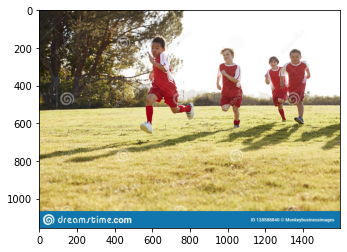

Predicted Caption: 
a group of child play soccer .


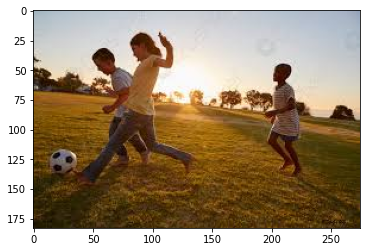

Predicted Caption: 
a group of child play in a field .


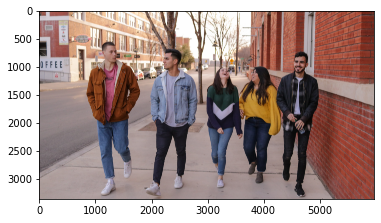

Predicted Caption: 
a group of person be stand in front of a building .


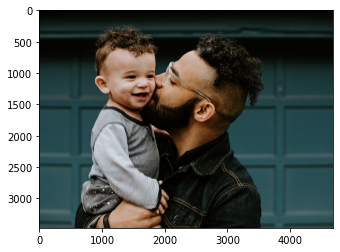

Predicted Caption: 
a man with a mohawk and a black shirt be look at a large man .


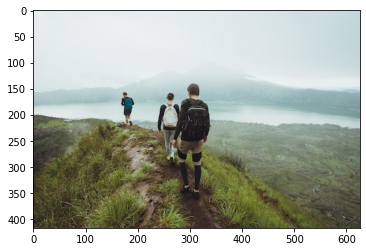

Predicted Caption: 
a man be stand on a mountain .


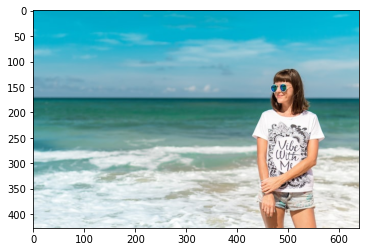

Predicted Caption: 
a young boy in a red shirt be stand in the water .


In [59]:
i=0
for img_id in img_name_list:
  i+=1
  img=cv2.imread(path+'/'+ img_id)
  plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
  photo=googleimage_features[img_id]
  plt.show()
  # reference=[]
  # for caps in test_captions[img_id]:
  #   list_caps=caps.split(" ")
  #   list_caps=list_caps[1:-1]
  #   reference.append(list_caps)
  candidate=greedy_search(photo)
  # score = sentence_bleu(reference, candidate)
  # print("Referance Captions: ")
  # for cap in reference:
    # print(" ".join(cap))
  print("Predicted Caption: ")
  print(" ".join(candidate))
  # print("bleu score: ",score)
  if(i==6):
    break

Caption generation on images from google using beam search

In [ ]:
def beam_search(photo,k):
  photo=photo.reshape(1,2048)
  in_text='<start>'
  sequence = [words_to_indices[s] for s in in_text.split(" ") if s in words_to_indices]
  sequence = pad_sequences([sequence], maxlen=max_length, padding='post')
  y_pred = model.predict([photo,sequence],verbose=0)
  predicted=[]
  y_pred=y_pred.reshape(-1)
  for i in range(y_pred.shape[0]):
    predicted.append((i,y_pred[i]))
  predicted=sorted(predicted,key=lambda x:x[1])[::-1]
  b_search=[]
  for i in range(k):
    word = indices_to_words[predicted[i][0]]
    b_search.append((in_text +' ' + word,predicted[i][1]))
    
  for idx in range(max_length):
    b_search_square=[]
    for text in b_search:
      if text[0].split(" ")[-1]=="<end>":
        break
      sequence = [words_to_indices[s] for s in text[0].split(" ") if s in words_to_indices]
      sequence = pad_sequences([sequence], maxlen=max_length, padding='post')
      y_pred = model.predict([photo,sequence],verbose=0)
      predicted=[]
      y_pred=y_pred.reshape(-1)
      for i in range(y_pred.shape[0]):
        predicted.append((i,y_pred[i]))
      predicted=sorted(predicted,key=lambda x:x[1])[::-1]
      for i in range(k):
        word = indices_to_words[predicted[i][0]]
        b_search_square.append((text[0] +' ' + word,predicted[i][1]*text[1]))
    if(len(b_search_square)>0):
      b_search=(sorted(b_search_square,key=lambda x:x[1])[::-1])[:5]
  final=b_search[0][0].split()
  final = final[1:-1]
  #final=" ".join(final)
  return final

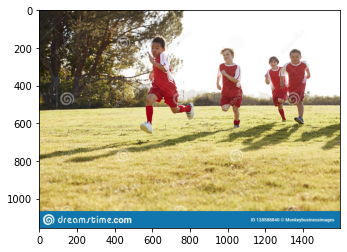

Predicted Caption: 
a group of child play soccer .


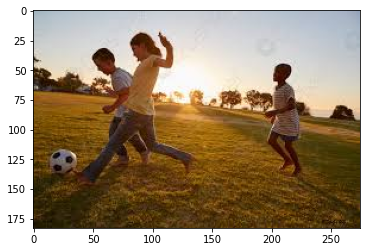

Predicted Caption: 
a group of child play in the grass .


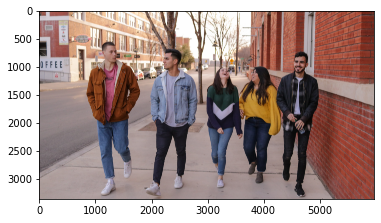

Predicted Caption: 
a group of person be stand in front of a building .


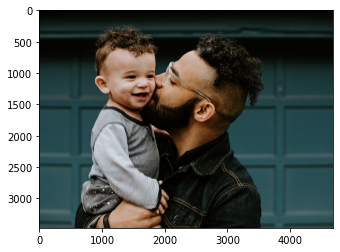

Predicted Caption: 
a man in a black shirt look at the camera .


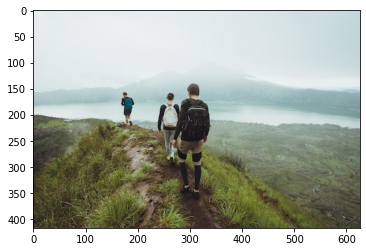

Predicted Caption: 
a group of person stand on top of a mountain .


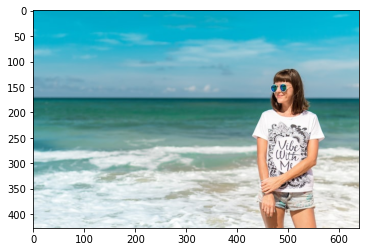

Predicted Caption: 
a young boy in a red shirt be stand on a beach .


In [64]:
i=0
for img_id in img_name_list:
  i+=1
  img=cv2.imread(path+ "/" + img_id)
  plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
  photo=googleimage_features[img_id]
  plt.show()
  # reference=[]
  # for caps in test_captions[img_id]:
  #   list_caps=caps.split(" ")
  #   list_caps=list_caps[1:-1]
  #   reference.append(list_caps)
  candidate=beam_search(photo,3)
  # score = sentence_bleu(reference, candidate)
  # print("Referance Captions: ")
  # for cap in reference:
  #   print(" ".join(cap))
  print("Predicted Caption: ")
  print(" ".join(candidate))
  # print("bleu score: ",score)
  if(i==6):
    break

Predicting Caption on test images

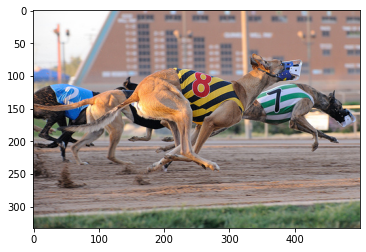

Referance Captions: 
many dog race around a track .
race dog run their fastest down a sandy track .
a kangaroo wear a yellow and black striped vest with the number eight on it be hop .
a group of greyhound race on a track .
muzzled greyhound be race along a dog track .
Predicted Caption: 
muzzled greyhound dog run in a rodeo .
bleu score:  1.0148936155293581e-154


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)


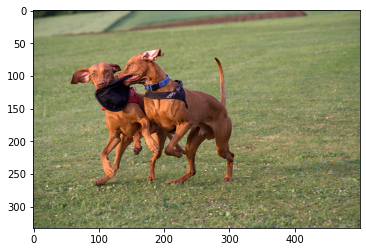

Referance Captions: 
two dog hold a single black frisbee in their mouth
Predicted Caption: 
two dog play with a small small dog .
bleu score:  6.030654703641957e-155


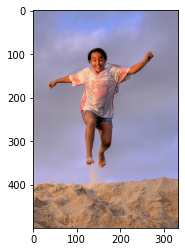

Referance Captions: 
a girl in a sandy area .
a girl be jump in the sand .
Predicted Caption: 
a man in a black shirt be jump in the air .
bleu score:  0.2620251007173262


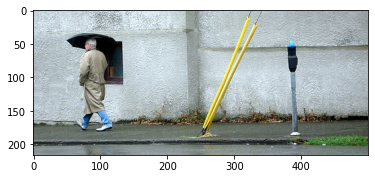

Referance Captions: 
a man in a tan trench coat and blue jean walk with a black umbrella open over his head .
a man in a beige trench coat be walk in the rain .
man walk with his umbrella in a bleak street .
Predicted Caption: 
a woman in a green shirt and jean and jean and jean be stand on a trampoline .
bleu score:  5.367343786526298e-155


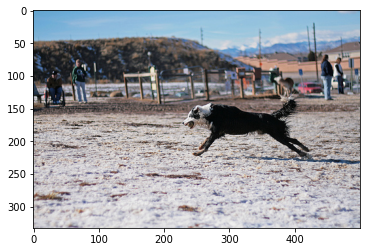

Referance Captions: 
a black and white dog play in the sand .
a dog lunge across a beach .
Predicted Caption: 
a black and white dog run on a dirt track .
bleu score:  0.38163309113713373


In [65]:
i=0
for img_id in test_features:
  i+=1
  img=cv2.imread(img_path+'/'+ img_id)
  plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
  photo=test_features[img_id]
  plt.show()
  reference=[]
  for caps in test_captions[img_id]:
    list_caps=caps.split(" ")
    list_caps=list_caps[1:-1]
    reference.append(list_caps)
  candidate=greedy_search(photo)
  score = sentence_bleu(reference, candidate)
  print("Referance Captions: ")
  for cap in reference:
    print(" ".join(cap))
  print("Predicted Caption: ")
  print(" ".join(candidate))
  print("bleu score: ",score)
  if(i==5):
    break


Predicting Captions on Test Set using Beam Search with k=3


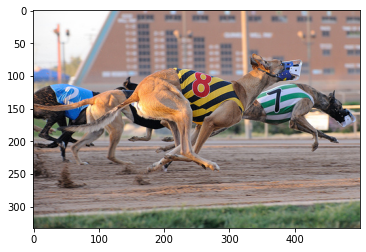

Referance Captions: 
many dog race around a track .
race dog run their fastest down a sandy track .
a kangaroo wear a yellow and black striped vest with the number eight on it be hop .
a group of greyhound race on a track .
muzzled greyhound be race along a dog track .
Predicted Caption: 
muzzled greyhound dog run in a rodeo .
bleu score:  1.0148936155293581e-154


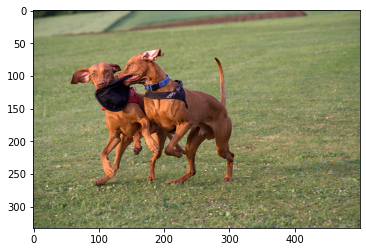

Referance Captions: 
two dog hold a single black frisbee in their mouth
Predicted Caption: 
two dog play in the grass .
bleu score:  5.023587836914362e-155


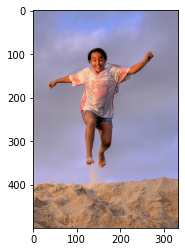

Referance Captions: 
a girl in a sandy area .
a girl be jump in the sand .
Predicted Caption: 
a man in a black shirt be play in the air .
bleu score:  8.190757052088229e-155


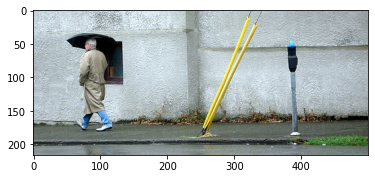

Referance Captions: 
a man in a tan trench coat and blue jean walk with a black umbrella open over his head .
a man in a beige trench coat be walk in the rain .
man walk with his umbrella in a bleak street .
Predicted Caption: 
a young boy in a green shirt be stand on a trampoline .
bleu score:  6.60585259847259e-155


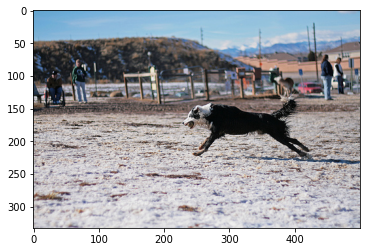

Referance Captions: 
a black and white dog play in the sand .
a dog lunge across a beach .
Predicted Caption: 
a black and white dog run through the snow .
bleu score:  0.42728700639623407


In [66]:
i=0
for img_id in test_features:
  i+=1
  img=cv2.imread(img_path+ "/" + img_id)
  plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
  photo=test_features[img_id]
  plt.show()
  reference=[]
  for caps in test_captions[img_id]:
    list_caps=caps.split(" ")
    list_caps=list_caps[1:-1]
    reference.append(list_caps)
  candidate=beam_search(photo,3)
  score = sentence_bleu(reference, candidate)
  print("Referance Captions: ")
  for cap in reference:
    print(" ".join(cap))
  print("Predicted Caption: ")
  print(" ".join(candidate))
  print("bleu score: ",score)
  if(i==5):
    break